In [1]:
# import packages
import sys
import math
import datetime
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
%matplotlib notebook

In [2]:
# load the data
df = pd.read_csv("../../DataSet/mnist_train.csv")

In [3]:
df.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(60000, 785)

In [5]:
# input and output features
X = df.iloc[:,1:].to_numpy() / 255
Y = df.iloc[:,0].to_numpy()

In [6]:
# Train and Test split
Xtrain, Xtest, Ytrain, Ytest = X[:-1000], X[-1000:], Y[:-1000], Y[-1000:]

In [7]:
# Shuffle the training data
Xtrain, Ytrain = shuffle(Xtrain, Ytrain)

In [8]:
def showPic(x,y):
    plt.title("Digit: "+str(y))
    plt.imshow(x.reshape(28,28))
    plt.show()

<IPython.core.display.Javascript object>


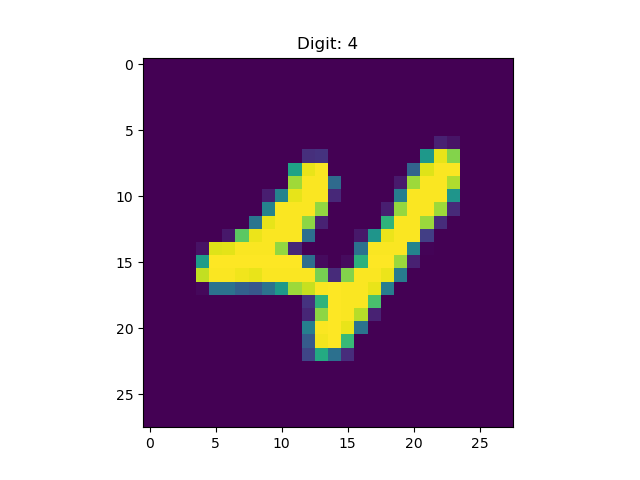

In [9]:
# Testing a PIC
id = 1
showPic(Xtrain[id], Ytrain[id])

In [10]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

In [11]:
def tanh(z):
    return (np.exp(z)-np.exp(-z)) / (np.exp(z)+np.exp(-z))

In [12]:
def relu(z):
    return z*(z>0)

In [13]:
def softmax(z):
    return np.exp(z) / np.exp(z).sum(axis=1, keepdims=True)

In [14]:
def nonlinearDeri(z,activation):
    if activation=="sigmoid":
        return z*(1-z)
    if activation=="tanh":
        return (1-z**2)
    if activation=="relu":
        return (z>0)

In [15]:
def oneHotEncode(y):
    T = np.zeros((y.shape[0], np.unique(y).shape[0]))
    
    for i,val in enumerate(y):
        T[i,val] = 1
        
    return T

In [16]:
def cost(t,y):
    return -np.sum(t*np.log(y))

In [17]:
def predict(y):
    return np.argmax(y, axis=1)

In [18]:
def forward(X,T,hidden,activation,W,B,A,i,seed):
    D = X.shape[1]
    L = len(hidden)
    K = T.shape[1]
    np.random.seed(seed)
    
    for l in range(L+1):
        if l==0:
            if i==0:
                W[l] = np.random.randn(D,hidden[l])
                B[l] = np.random.randn(hidden[l])
            A[l] = activation(np.dot(X,W[l])+B[l])
        
        elif l==L:
            if i==0:
                W[l] = np.random.randn(hidden[l-1],K)
                B[l] = np.random.randn(K)
            A[l] = softmax(np.dot(A[l-1],W[l])+B[l])
            Y = A[l]
        
        else:
            if i==0:
                W[l] = np.random.randn(hidden[l-1],hidden[l])
                B[l] = np.random.randn(hidden[l])
            A[l] = activation(np.dot(A[l-1],W[l])+B[l])
    
    return W,B,A,Y

In [19]:
def backprop(X,T,Y,hidden,activation,lr,W,B,A):
    L = len(hidden)
    E,delta = {},{}
    
    # Error and Gradient Calculation
    for l in range(L,-1,-1):
        if l==L:
            E[l] = T-Y
            delta[l] = E[l] # softmax derivative
        
        else:
            E[l] = np.dot(delta[l+1],W[l+1].T)
            delta[l] = E[l]*nonlinearDeri(A[l], activation.__name__)
    
    # Weights update
    for l in range(L+1):
        if l==0:
            W[l] += lr*np.dot(X.T, delta[l])
            B[l] += lr*np.sum(delta[l], axis=0)
        else:
            W[l] += lr*np.dot(A[l-1].T, delta[l])
            B[l] += lr*np.sum(delta[l], axis=0)
            
    return W,B

In [20]:
def fit(X,T,Xtest,Ytest,hidden,activation,lr,iterations,batch_size,seed):
    N = X.shape[0]
    T = oneHotEncode(T)
    Ttest = oneHotEncode(Ytest)
    
    W,B,A = {},{},{}
    Ctrain, Ctest = [], []
    
    n_batches = math.ceil(N / batch_size)
    
    for i in range(iterations):
        for j in range(n_batches):
            start = batch_size*j
            end = batch_size*(j+1) if j<n_batches else N
        
            W, B, A, Y = forward(X[start:end],T[start:end],hidden,activation,W,B,A,i,seed)
            W, B = backprop(X[start:end],T[start:end],Y,hidden,activation,lr,W,B,A)
            _,_,_,Y_test = forward(Xtest,Ttest,hidden,activation,W,B,A,2,seed)

            sys.stdout.write("\nIteration: {} | Batch: {} | Training Cost: {} | Test Cost: {}".format(i+1,j+1, str(cost(T[start:end],Y))[:6], str(cost(Ttest,Y_test))[:6]))
            
        Ctrain.append(cost(T[start:end],Y))
        Ctest.append(cost(Ttest,Y_test))
        
    _,_,_,Y = forward(X,T,hidden,activation,W,B,A,2,seed) # Prediction for all training samples
    Yhat = predict(Y)
    Yhat_test = predict(Y_test)
    
    return Ctrain,Ctest,W,B,Yhat,Yhat_test

In [21]:
def accuracy(t,y):
    return np.mean(t==y)

## Full Gradient Descent (FGD)

In [23]:
size=Xtrain.shape[0] # All the samples at once weight update happens

fgd_start_time = datetime.datetime.now()
ctrain_full, ctest_full, w, b, Yhat, Yhat_test = fit(Xtrain,Ytrain,Xtest,Ytest,[100],sigmoid,lr=0.00001,iterations=20000,batch_size=size,seed=1)
fgd_end_time = datetime.datetime.now()

print("\n\nTraining Accuracy: {}%".format(accuracy(Ytrain, Yhat)*100))
print("Testing Accuracy: {}%".format(accuracy(Ytest, Yhat_test)*100))
print("Time spent: ", fgd_end_time-fgd_start_time)


Iteration: 1 | Batch: 1 | Training Cost: 413349 | Test Cost: 5759.4
Iteration: 2 | Batch: 1 | Training Cost: 337018 | Test Cost: 5113.9
Iteration: 3 | Batch: 1 | Training Cost: 300735 | Test Cost: 4749.7
Iteration: 4 | Batch: 1 | Training Cost: 281555 | Test Cost: 4463.5
Iteration: 5 | Batch: 1 | Training Cost: 265593 | Test Cost: 4204.3
Iteration: 6 | Batch: 1 | Training Cost: 251103 | Test Cost: 3968.3
Iteration: 7 | Batch: 1 | Training Cost: 237954 | Test Cost: 3753.4
Iteration: 8 | Batch: 1 | Training Cost: 226029 | Test Cost: 3558.1
Iteration: 9 | Batch: 1 | Training Cost: 215211 | Test Cost: 3380.3
Iteration: 10 | Batch: 1 | Training Cost: 205386 | Test Cost: 3218.3
Iteration: 11 | Batch: 1 | Training Cost: 196448 | Test Cost: 3070.2
Iteration: 12 | Batch: 1 | Training Cost: 188296 | Test Cost: 2934.4
Iteration: 13 | Batch: 1 | Training Cost: 180843 | Test Cost: 2809.5
Iteration: 14 | Batch: 1 | Training Cost: 174011 | Test Cost: 2694.2
Iteration: 15 | Batch: 1 | Training Cost: 

Iteration: 119 | Batch: 1 | Training Cost: 50601. | Test Cost: 664.41
Iteration: 120 | Batch: 1 | Training Cost: 50385. | Test Cost: 661.36
Iteration: 121 | Batch: 1 | Training Cost: 50172. | Test Cost: 658.36
Iteration: 122 | Batch: 1 | Training Cost: 49962. | Test Cost: 655.40
Iteration: 123 | Batch: 1 | Training Cost: 49755. | Test Cost: 652.49
Iteration: 124 | Batch: 1 | Training Cost: 49551. | Test Cost: 649.61
Iteration: 125 | Batch: 1 | Training Cost: 49350. | Test Cost: 646.78
Iteration: 126 | Batch: 1 | Training Cost: 49152. | Test Cost: 644.00
Iteration: 127 | Batch: 1 | Training Cost: 48956. | Test Cost: 641.25
Iteration: 128 | Batch: 1 | Training Cost: 48763. | Test Cost: 638.54
Iteration: 129 | Batch: 1 | Training Cost: 48572. | Test Cost: 635.86
Iteration: 130 | Batch: 1 | Training Cost: 48384. | Test Cost: 633.23
Iteration: 131 | Batch: 1 | Training Cost: 48199. | Test Cost: 630.63
Iteration: 132 | Batch: 1 | Training Cost: 48016. | Test Cost: 628.06
Iteration: 133 | Bat

Iteration: 236 | Batch: 1 | Training Cost: 36490. | Test Cost: 470.56
Iteration: 237 | Batch: 1 | Training Cost: 36420. | Test Cost: 469.65
Iteration: 238 | Batch: 1 | Training Cost: 36351. | Test Cost: 468.75
Iteration: 239 | Batch: 1 | Training Cost: 36283. | Test Cost: 467.85
Iteration: 240 | Batch: 1 | Training Cost: 36215. | Test Cost: 466.96
Iteration: 241 | Batch: 1 | Training Cost: 36148. | Test Cost: 466.07
Iteration: 242 | Batch: 1 | Training Cost: 36080. | Test Cost: 465.19
Iteration: 243 | Batch: 1 | Training Cost: 36014. | Test Cost: 464.32
Iteration: 244 | Batch: 1 | Training Cost: 35948. | Test Cost: 463.46
Iteration: 245 | Batch: 1 | Training Cost: 35882. | Test Cost: 462.60
Iteration: 246 | Batch: 1 | Training Cost: 35816. | Test Cost: 461.75
Iteration: 247 | Batch: 1 | Training Cost: 35751. | Test Cost: 460.90
Iteration: 248 | Batch: 1 | Training Cost: 35687. | Test Cost: 460.06
Iteration: 249 | Batch: 1 | Training Cost: 35623. | Test Cost: 459.22
Iteration: 250 | Bat

Iteration: 353 | Batch: 1 | Training Cost: 30563. | Test Cost: 395.60
Iteration: 354 | Batch: 1 | Training Cost: 30526. | Test Cost: 395.15
Iteration: 355 | Batch: 1 | Training Cost: 30489. | Test Cost: 394.70
Iteration: 356 | Batch: 1 | Training Cost: 30452. | Test Cost: 394.25
Iteration: 357 | Batch: 1 | Training Cost: 30415. | Test Cost: 393.80
Iteration: 358 | Batch: 1 | Training Cost: 30378. | Test Cost: 393.36
Iteration: 359 | Batch: 1 | Training Cost: 30342. | Test Cost: 392.91
Iteration: 360 | Batch: 1 | Training Cost: 30305. | Test Cost: 392.47
Iteration: 361 | Batch: 1 | Training Cost: 30269. | Test Cost: 392.03
Iteration: 362 | Batch: 1 | Training Cost: 30233. | Test Cost: 391.60
Iteration: 363 | Batch: 1 | Training Cost: 30197. | Test Cost: 391.16
Iteration: 364 | Batch: 1 | Training Cost: 30161. | Test Cost: 390.73
Iteration: 365 | Batch: 1 | Training Cost: 30126. | Test Cost: 390.30
Iteration: 366 | Batch: 1 | Training Cost: 30090. | Test Cost: 389.87
Iteration: 367 | Bat

Iteration: 470 | Batch: 1 | Training Cost: 27043. | Test Cost: 353.84
Iteration: 471 | Batch: 1 | Training Cost: 27019. | Test Cost: 353.56
Iteration: 472 | Batch: 1 | Training Cost: 26995. | Test Cost: 353.28
Iteration: 473 | Batch: 1 | Training Cost: 26971. | Test Cost: 353.00
Iteration: 474 | Batch: 1 | Training Cost: 26947. | Test Cost: 352.72
Iteration: 475 | Batch: 1 | Training Cost: 26923. | Test Cost: 352.44
Iteration: 476 | Batch: 1 | Training Cost: 26899. | Test Cost: 352.17
Iteration: 477 | Batch: 1 | Training Cost: 26875. | Test Cost: 351.89
Iteration: 478 | Batch: 1 | Training Cost: 26851. | Test Cost: 351.62
Iteration: 479 | Batch: 1 | Training Cost: 26828. | Test Cost: 351.34
Iteration: 480 | Batch: 1 | Training Cost: 26804. | Test Cost: 351.07
Iteration: 481 | Batch: 1 | Training Cost: 26781. | Test Cost: 350.80
Iteration: 482 | Batch: 1 | Training Cost: 26757. | Test Cost: 350.53
Iteration: 483 | Batch: 1 | Training Cost: 26734. | Test Cost: 350.26
Iteration: 484 | Bat

Iteration: 587 | Batch: 1 | Training Cost: 24644. | Test Cost: 326.39
Iteration: 588 | Batch: 1 | Training Cost: 24626. | Test Cost: 326.20
Iteration: 589 | Batch: 1 | Training Cost: 24609. | Test Cost: 326.00
Iteration: 590 | Batch: 1 | Training Cost: 24592. | Test Cost: 325.81
Iteration: 591 | Batch: 1 | Training Cost: 24574. | Test Cost: 325.61
Iteration: 592 | Batch: 1 | Training Cost: 24557. | Test Cost: 325.42
Iteration: 593 | Batch: 1 | Training Cost: 24540. | Test Cost: 325.23
Iteration: 594 | Batch: 1 | Training Cost: 24523. | Test Cost: 325.04
Iteration: 595 | Batch: 1 | Training Cost: 24506. | Test Cost: 324.84
Iteration: 596 | Batch: 1 | Training Cost: 24489. | Test Cost: 324.65
Iteration: 597 | Batch: 1 | Training Cost: 24472. | Test Cost: 324.46
Iteration: 598 | Batch: 1 | Training Cost: 24455. | Test Cost: 324.27
Iteration: 599 | Batch: 1 | Training Cost: 24438. | Test Cost: 324.08
Iteration: 600 | Batch: 1 | Training Cost: 24422. | Test Cost: 323.89
Iteration: 601 | Bat

Iteration: 704 | Batch: 1 | Training Cost: 22875. | Test Cost: 306.76
Iteration: 705 | Batch: 1 | Training Cost: 22862. | Test Cost: 306.62
Iteration: 706 | Batch: 1 | Training Cost: 22849. | Test Cost: 306.48
Iteration: 707 | Batch: 1 | Training Cost: 22836. | Test Cost: 306.33
Iteration: 708 | Batch: 1 | Training Cost: 22823. | Test Cost: 306.19
Iteration: 709 | Batch: 1 | Training Cost: 22810. | Test Cost: 306.05
Iteration: 710 | Batch: 1 | Training Cost: 22797. | Test Cost: 305.91
Iteration: 711 | Batch: 1 | Training Cost: 22784. | Test Cost: 305.76
Iteration: 712 | Batch: 1 | Training Cost: 22771. | Test Cost: 305.62
Iteration: 713 | Batch: 1 | Training Cost: 22758. | Test Cost: 305.48
Iteration: 714 | Batch: 1 | Training Cost: 22745. | Test Cost: 305.34
Iteration: 715 | Batch: 1 | Training Cost: 22732. | Test Cost: 305.20
Iteration: 716 | Batch: 1 | Training Cost: 22719. | Test Cost: 305.06
Iteration: 717 | Batch: 1 | Training Cost: 22706. | Test Cost: 304.92
Iteration: 718 | Bat

Iteration: 821 | Batch: 1 | Training Cost: 21497. | Test Cost: 292.05
Iteration: 822 | Batch: 1 | Training Cost: 21487. | Test Cost: 291.94
Iteration: 823 | Batch: 1 | Training Cost: 21476. | Test Cost: 291.83
Iteration: 824 | Batch: 1 | Training Cost: 21466. | Test Cost: 291.72
Iteration: 825 | Batch: 1 | Training Cost: 21455. | Test Cost: 291.61
Iteration: 826 | Batch: 1 | Training Cost: 21445. | Test Cost: 291.50
Iteration: 827 | Batch: 1 | Training Cost: 21434. | Test Cost: 291.39
Iteration: 828 | Batch: 1 | Training Cost: 21424. | Test Cost: 291.29
Iteration: 829 | Batch: 1 | Training Cost: 21413. | Test Cost: 291.18
Iteration: 830 | Batch: 1 | Training Cost: 21403. | Test Cost: 291.07
Iteration: 831 | Batch: 1 | Training Cost: 21393. | Test Cost: 290.96
Iteration: 832 | Batch: 1 | Training Cost: 21382. | Test Cost: 290.85
Iteration: 833 | Batch: 1 | Training Cost: 21372. | Test Cost: 290.75
Iteration: 834 | Batch: 1 | Training Cost: 21362. | Test Cost: 290.64
Iteration: 835 | Bat

Iteration: 938 | Batch: 1 | Training Cost: 20377. | Test Cost: 280.62
Iteration: 939 | Batch: 1 | Training Cost: 20369. | Test Cost: 280.53
Iteration: 940 | Batch: 1 | Training Cost: 20360. | Test Cost: 280.44
Iteration: 941 | Batch: 1 | Training Cost: 20351. | Test Cost: 280.36
Iteration: 942 | Batch: 1 | Training Cost: 20343. | Test Cost: 280.27
Iteration: 943 | Batch: 1 | Training Cost: 20334. | Test Cost: 280.18
Iteration: 944 | Batch: 1 | Training Cost: 20325. | Test Cost: 280.10
Iteration: 945 | Batch: 1 | Training Cost: 20317. | Test Cost: 280.01
Iteration: 946 | Batch: 1 | Training Cost: 20308. | Test Cost: 279.93
Iteration: 947 | Batch: 1 | Training Cost: 20300. | Test Cost: 279.84
Iteration: 948 | Batch: 1 | Training Cost: 20291. | Test Cost: 279.75
Iteration: 949 | Batch: 1 | Training Cost: 20282. | Test Cost: 279.67
Iteration: 950 | Batch: 1 | Training Cost: 20274. | Test Cost: 279.58
Iteration: 951 | Batch: 1 | Training Cost: 20265. | Test Cost: 279.50
Iteration: 952 | Bat

Iteration: 1054 | Batch: 1 | Training Cost: 19446. | Test Cost: 271.46
Iteration: 1055 | Batch: 1 | Training Cost: 19439. | Test Cost: 271.39
Iteration: 1056 | Batch: 1 | Training Cost: 19432. | Test Cost: 271.32
Iteration: 1057 | Batch: 1 | Training Cost: 19424. | Test Cost: 271.24
Iteration: 1058 | Batch: 1 | Training Cost: 19417. | Test Cost: 271.17
Iteration: 1059 | Batch: 1 | Training Cost: 19410. | Test Cost: 271.10
Iteration: 1060 | Batch: 1 | Training Cost: 19402. | Test Cost: 271.03
Iteration: 1061 | Batch: 1 | Training Cost: 19395. | Test Cost: 270.96
Iteration: 1062 | Batch: 1 | Training Cost: 19387. | Test Cost: 270.89
Iteration: 1063 | Batch: 1 | Training Cost: 19380. | Test Cost: 270.82
Iteration: 1064 | Batch: 1 | Training Cost: 19373. | Test Cost: 270.75
Iteration: 1065 | Batch: 1 | Training Cost: 19366. | Test Cost: 270.68
Iteration: 1066 | Batch: 1 | Training Cost: 19358. | Test Cost: 270.61
Iteration: 1067 | Batch: 1 | Training Cost: 19351. | Test Cost: 270.53
Iterat

Iteration: 1169 | Batch: 1 | Training Cost: 18653. | Test Cost: 263.84
Iteration: 1170 | Batch: 1 | Training Cost: 18647. | Test Cost: 263.78
Iteration: 1171 | Batch: 1 | Training Cost: 18640. | Test Cost: 263.72
Iteration: 1172 | Batch: 1 | Training Cost: 18634. | Test Cost: 263.66
Iteration: 1173 | Batch: 1 | Training Cost: 18628. | Test Cost: 263.60
Iteration: 1174 | Batch: 1 | Training Cost: 18621. | Test Cost: 263.54
Iteration: 1175 | Batch: 1 | Training Cost: 18615. | Test Cost: 263.48
Iteration: 1176 | Batch: 1 | Training Cost: 18608. | Test Cost: 263.42
Iteration: 1177 | Batch: 1 | Training Cost: 18602. | Test Cost: 263.35
Iteration: 1178 | Batch: 1 | Training Cost: 18596. | Test Cost: 263.29
Iteration: 1179 | Batch: 1 | Training Cost: 18589. | Test Cost: 263.23
Iteration: 1180 | Batch: 1 | Training Cost: 18583. | Test Cost: 263.17
Iteration: 1181 | Batch: 1 | Training Cost: 18577. | Test Cost: 263.11
Iteration: 1182 | Batch: 1 | Training Cost: 18570. | Test Cost: 263.05
Iterat

Iteration: 1284 | Batch: 1 | Training Cost: 17959. | Test Cost: 257.27
Iteration: 1285 | Batch: 1 | Training Cost: 17954. | Test Cost: 257.21
Iteration: 1286 | Batch: 1 | Training Cost: 17948. | Test Cost: 257.16
Iteration: 1287 | Batch: 1 | Training Cost: 17942. | Test Cost: 257.11
Iteration: 1288 | Batch: 1 | Training Cost: 17937. | Test Cost: 257.05
Iteration: 1289 | Batch: 1 | Training Cost: 17931. | Test Cost: 257.00
Iteration: 1290 | Batch: 1 | Training Cost: 17925. | Test Cost: 256.95
Iteration: 1291 | Batch: 1 | Training Cost: 17920. | Test Cost: 256.89
Iteration: 1292 | Batch: 1 | Training Cost: 17914. | Test Cost: 256.84
Iteration: 1293 | Batch: 1 | Training Cost: 17908. | Test Cost: 256.79
Iteration: 1294 | Batch: 1 | Training Cost: 17903. | Test Cost: 256.73
Iteration: 1295 | Batch: 1 | Training Cost: 17897. | Test Cost: 256.68
Iteration: 1296 | Batch: 1 | Training Cost: 17892. | Test Cost: 256.63
Iteration: 1297 | Batch: 1 | Training Cost: 17886. | Test Cost: 256.58
Iterat

Iteration: 1399 | Batch: 1 | Training Cost: 17344. | Test Cost: 251.47
Iteration: 1400 | Batch: 1 | Training Cost: 17339. | Test Cost: 251.42
Iteration: 1401 | Batch: 1 | Training Cost: 17334. | Test Cost: 251.37
Iteration: 1402 | Batch: 1 | Training Cost: 17329. | Test Cost: 251.32
Iteration: 1403 | Batch: 1 | Training Cost: 17324. | Test Cost: 251.28
Iteration: 1404 | Batch: 1 | Training Cost: 17319. | Test Cost: 251.23
Iteration: 1405 | Batch: 1 | Training Cost: 17314. | Test Cost: 251.18
Iteration: 1406 | Batch: 1 | Training Cost: 17309. | Test Cost: 251.13
Iteration: 1407 | Batch: 1 | Training Cost: 17304. | Test Cost: 251.09
Iteration: 1408 | Batch: 1 | Training Cost: 17299. | Test Cost: 251.04
Iteration: 1409 | Batch: 1 | Training Cost: 17294. | Test Cost: 250.99
Iteration: 1410 | Batch: 1 | Training Cost: 17289. | Test Cost: 250.95
Iteration: 1411 | Batch: 1 | Training Cost: 17284. | Test Cost: 250.90
Iteration: 1412 | Batch: 1 | Training Cost: 17279. | Test Cost: 250.85
Iterat

Iteration: 1514 | Batch: 1 | Training Cost: 16793. | Test Cost: 246.26
Iteration: 1515 | Batch: 1 | Training Cost: 16788. | Test Cost: 246.22
Iteration: 1516 | Batch: 1 | Training Cost: 16784. | Test Cost: 246.18
Iteration: 1517 | Batch: 1 | Training Cost: 16779. | Test Cost: 246.14
Iteration: 1518 | Batch: 1 | Training Cost: 16775. | Test Cost: 246.09
Iteration: 1519 | Batch: 1 | Training Cost: 16770. | Test Cost: 246.05
Iteration: 1520 | Batch: 1 | Training Cost: 16766. | Test Cost: 246.01
Iteration: 1521 | Batch: 1 | Training Cost: 16761. | Test Cost: 245.96
Iteration: 1522 | Batch: 1 | Training Cost: 16757. | Test Cost: 245.92
Iteration: 1523 | Batch: 1 | Training Cost: 16752. | Test Cost: 245.88
Iteration: 1524 | Batch: 1 | Training Cost: 16748. | Test Cost: 245.84
Iteration: 1525 | Batch: 1 | Training Cost: 16743. | Test Cost: 245.79
Iteration: 1526 | Batch: 1 | Training Cost: 16739. | Test Cost: 245.75
Iteration: 1527 | Batch: 1 | Training Cost: 16734. | Test Cost: 245.71
Iterat

Iteration: 1629 | Batch: 1 | Training Cost: 16295. | Test Cost: 241.54
Iteration: 1630 | Batch: 1 | Training Cost: 16291. | Test Cost: 241.50
Iteration: 1631 | Batch: 1 | Training Cost: 16287. | Test Cost: 241.46
Iteration: 1632 | Batch: 1 | Training Cost: 16283. | Test Cost: 241.42
Iteration: 1633 | Batch: 1 | Training Cost: 16279. | Test Cost: 241.38
Iteration: 1634 | Batch: 1 | Training Cost: 16274. | Test Cost: 241.34
Iteration: 1635 | Batch: 1 | Training Cost: 16270. | Test Cost: 241.30
Iteration: 1636 | Batch: 1 | Training Cost: 16266. | Test Cost: 241.26
Iteration: 1637 | Batch: 1 | Training Cost: 16262. | Test Cost: 241.22
Iteration: 1638 | Batch: 1 | Training Cost: 16258. | Test Cost: 241.18
Iteration: 1639 | Batch: 1 | Training Cost: 16254. | Test Cost: 241.15
Iteration: 1640 | Batch: 1 | Training Cost: 16250. | Test Cost: 241.11
Iteration: 1641 | Batch: 1 | Training Cost: 16246. | Test Cost: 241.07
Iteration: 1642 | Batch: 1 | Training Cost: 16242. | Test Cost: 241.03
Iterat

Iteration: 1744 | Batch: 1 | Training Cost: 15842. | Test Cost: 237.20
Iteration: 1745 | Batch: 1 | Training Cost: 15839. | Test Cost: 237.16
Iteration: 1746 | Batch: 1 | Training Cost: 15835. | Test Cost: 237.13
Iteration: 1747 | Batch: 1 | Training Cost: 15831. | Test Cost: 237.09
Iteration: 1748 | Batch: 1 | Training Cost: 15827. | Test Cost: 237.06
Iteration: 1749 | Batch: 1 | Training Cost: 15824. | Test Cost: 237.02
Iteration: 1750 | Batch: 1 | Training Cost: 15820. | Test Cost: 236.98
Iteration: 1751 | Batch: 1 | Training Cost: 15816. | Test Cost: 236.95
Iteration: 1752 | Batch: 1 | Training Cost: 15812. | Test Cost: 236.91
Iteration: 1753 | Batch: 1 | Training Cost: 15809. | Test Cost: 236.88
Iteration: 1754 | Batch: 1 | Training Cost: 15805. | Test Cost: 236.84
Iteration: 1755 | Batch: 1 | Training Cost: 15801. | Test Cost: 236.80
Iteration: 1756 | Batch: 1 | Training Cost: 15797. | Test Cost: 236.77
Iteration: 1757 | Batch: 1 | Training Cost: 15794. | Test Cost: 236.73
Iterat

Iteration: 1859 | Batch: 1 | Training Cost: 15428. | Test Cost: 233.19
Iteration: 1860 | Batch: 1 | Training Cost: 15425. | Test Cost: 233.16
Iteration: 1861 | Batch: 1 | Training Cost: 15421. | Test Cost: 233.13
Iteration: 1862 | Batch: 1 | Training Cost: 15418. | Test Cost: 233.09
Iteration: 1863 | Batch: 1 | Training Cost: 15414. | Test Cost: 233.06
Iteration: 1864 | Batch: 1 | Training Cost: 15411. | Test Cost: 233.03
Iteration: 1865 | Batch: 1 | Training Cost: 15407. | Test Cost: 232.99
Iteration: 1866 | Batch: 1 | Training Cost: 15404. | Test Cost: 232.96
Iteration: 1867 | Batch: 1 | Training Cost: 15401. | Test Cost: 232.93
Iteration: 1868 | Batch: 1 | Training Cost: 15397. | Test Cost: 232.89
Iteration: 1869 | Batch: 1 | Training Cost: 15394. | Test Cost: 232.86
Iteration: 1870 | Batch: 1 | Training Cost: 15390. | Test Cost: 232.83
Iteration: 1871 | Batch: 1 | Training Cost: 15387. | Test Cost: 232.79
Iteration: 1872 | Batch: 1 | Training Cost: 15383. | Test Cost: 232.76
Iterat

Iteration: 1974 | Batch: 1 | Training Cost: 15047. | Test Cost: 229.47
Iteration: 1975 | Batch: 1 | Training Cost: 15044. | Test Cost: 229.44
Iteration: 1976 | Batch: 1 | Training Cost: 15040. | Test Cost: 229.41
Iteration: 1977 | Batch: 1 | Training Cost: 15037. | Test Cost: 229.38
Iteration: 1978 | Batch: 1 | Training Cost: 15034. | Test Cost: 229.35
Iteration: 1979 | Batch: 1 | Training Cost: 15031. | Test Cost: 229.32
Iteration: 1980 | Batch: 1 | Training Cost: 15028. | Test Cost: 229.29
Iteration: 1981 | Batch: 1 | Training Cost: 15024. | Test Cost: 229.25
Iteration: 1982 | Batch: 1 | Training Cost: 15021. | Test Cost: 229.22
Iteration: 1983 | Batch: 1 | Training Cost: 15018. | Test Cost: 229.19
Iteration: 1984 | Batch: 1 | Training Cost: 15015. | Test Cost: 229.16
Iteration: 1985 | Batch: 1 | Training Cost: 15012. | Test Cost: 229.13
Iteration: 1986 | Batch: 1 | Training Cost: 15009. | Test Cost: 229.10
Iteration: 1987 | Batch: 1 | Training Cost: 15006. | Test Cost: 229.07
Iterat

Iteration: 2089 | Batch: 1 | Training Cost: 14694. | Test Cost: 226.00
Iteration: 2090 | Batch: 1 | Training Cost: 14691. | Test Cost: 225.98
Iteration: 2091 | Batch: 1 | Training Cost: 14688. | Test Cost: 225.95
Iteration: 2092 | Batch: 1 | Training Cost: 14685. | Test Cost: 225.92
Iteration: 2093 | Batch: 1 | Training Cost: 14682. | Test Cost: 225.89
Iteration: 2094 | Batch: 1 | Training Cost: 14679. | Test Cost: 225.86
Iteration: 2095 | Batch: 1 | Training Cost: 14676. | Test Cost: 225.83
Iteration: 2096 | Batch: 1 | Training Cost: 14673. | Test Cost: 225.80
Iteration: 2097 | Batch: 1 | Training Cost: 14670. | Test Cost: 225.77
Iteration: 2098 | Batch: 1 | Training Cost: 14667. | Test Cost: 225.74
Iteration: 2099 | Batch: 1 | Training Cost: 14664. | Test Cost: 225.71
Iteration: 2100 | Batch: 1 | Training Cost: 14661. | Test Cost: 225.69
Iteration: 2101 | Batch: 1 | Training Cost: 14658. | Test Cost: 225.66
Iteration: 2102 | Batch: 1 | Training Cost: 14656. | Test Cost: 225.63
Iterat

Iteration: 2204 | Batch: 1 | Training Cost: 14365. | Test Cost: 222.76
Iteration: 2205 | Batch: 1 | Training Cost: 14363. | Test Cost: 222.74
Iteration: 2206 | Batch: 1 | Training Cost: 14360. | Test Cost: 222.71
Iteration: 2207 | Batch: 1 | Training Cost: 14357. | Test Cost: 222.68
Iteration: 2208 | Batch: 1 | Training Cost: 14354. | Test Cost: 222.65
Iteration: 2209 | Batch: 1 | Training Cost: 14352. | Test Cost: 222.63
Iteration: 2210 | Batch: 1 | Training Cost: 14349. | Test Cost: 222.60
Iteration: 2211 | Batch: 1 | Training Cost: 14346. | Test Cost: 222.57
Iteration: 2212 | Batch: 1 | Training Cost: 14343. | Test Cost: 222.55
Iteration: 2213 | Batch: 1 | Training Cost: 14341. | Test Cost: 222.52
Iteration: 2214 | Batch: 1 | Training Cost: 14338. | Test Cost: 222.49
Iteration: 2215 | Batch: 1 | Training Cost: 14335. | Test Cost: 222.46
Iteration: 2216 | Batch: 1 | Training Cost: 14333. | Test Cost: 222.44
Iteration: 2217 | Batch: 1 | Training Cost: 14330. | Test Cost: 222.41
Iterat

Iteration: 2319 | Batch: 1 | Training Cost: 14059. | Test Cost: 219.73
Iteration: 2320 | Batch: 1 | Training Cost: 14056. | Test Cost: 219.70
Iteration: 2321 | Batch: 1 | Training Cost: 14054. | Test Cost: 219.68
Iteration: 2322 | Batch: 1 | Training Cost: 14051. | Test Cost: 219.65
Iteration: 2323 | Batch: 1 | Training Cost: 14048. | Test Cost: 219.62
Iteration: 2324 | Batch: 1 | Training Cost: 14046. | Test Cost: 219.60
Iteration: 2325 | Batch: 1 | Training Cost: 14043. | Test Cost: 219.57
Iteration: 2326 | Batch: 1 | Training Cost: 14041. | Test Cost: 219.55
Iteration: 2327 | Batch: 1 | Training Cost: 14038. | Test Cost: 219.52
Iteration: 2328 | Batch: 1 | Training Cost: 14035. | Test Cost: 219.50
Iteration: 2329 | Batch: 1 | Training Cost: 14033. | Test Cost: 219.47
Iteration: 2330 | Batch: 1 | Training Cost: 14030. | Test Cost: 219.45
Iteration: 2331 | Batch: 1 | Training Cost: 14028. | Test Cost: 219.42
Iteration: 2332 | Batch: 1 | Training Cost: 14025. | Test Cost: 219.40
Iterat

Iteration: 2434 | Batch: 1 | Training Cost: 13771. | Test Cost: 216.88
Iteration: 2435 | Batch: 1 | Training Cost: 13768. | Test Cost: 216.85
Iteration: 2436 | Batch: 1 | Training Cost: 13766. | Test Cost: 216.83
Iteration: 2437 | Batch: 1 | Training Cost: 13763. | Test Cost: 216.81
Iteration: 2438 | Batch: 1 | Training Cost: 13761. | Test Cost: 216.78
Iteration: 2439 | Batch: 1 | Training Cost: 13759. | Test Cost: 216.76
Iteration: 2440 | Batch: 1 | Training Cost: 13756. | Test Cost: 216.74
Iteration: 2441 | Batch: 1 | Training Cost: 13754. | Test Cost: 216.71
Iteration: 2442 | Batch: 1 | Training Cost: 13751. | Test Cost: 216.69
Iteration: 2443 | Batch: 1 | Training Cost: 13749. | Test Cost: 216.66
Iteration: 2444 | Batch: 1 | Training Cost: 13747. | Test Cost: 216.64
Iteration: 2445 | Batch: 1 | Training Cost: 13744. | Test Cost: 216.62
Iteration: 2446 | Batch: 1 | Training Cost: 13742. | Test Cost: 216.59
Iteration: 2447 | Batch: 1 | Training Cost: 13739. | Test Cost: 216.57
Iterat

Iteration: 2549 | Batch: 1 | Training Cost: 13500. | Test Cost: 214.20
Iteration: 2550 | Batch: 1 | Training Cost: 13497. | Test Cost: 214.18
Iteration: 2551 | Batch: 1 | Training Cost: 13495. | Test Cost: 214.16
Iteration: 2552 | Batch: 1 | Training Cost: 13493. | Test Cost: 214.14
Iteration: 2553 | Batch: 1 | Training Cost: 13490. | Test Cost: 214.11
Iteration: 2554 | Batch: 1 | Training Cost: 13488. | Test Cost: 214.09
Iteration: 2555 | Batch: 1 | Training Cost: 13486. | Test Cost: 214.07
Iteration: 2556 | Batch: 1 | Training Cost: 13484. | Test Cost: 214.05
Iteration: 2557 | Batch: 1 | Training Cost: 13481. | Test Cost: 214.02
Iteration: 2558 | Batch: 1 | Training Cost: 13479. | Test Cost: 214.00
Iteration: 2559 | Batch: 1 | Training Cost: 13477. | Test Cost: 213.98
Iteration: 2560 | Batch: 1 | Training Cost: 13474. | Test Cost: 213.96
Iteration: 2561 | Batch: 1 | Training Cost: 13472. | Test Cost: 213.93
Iteration: 2562 | Batch: 1 | Training Cost: 13470. | Test Cost: 213.91
Iterat

Iteration: 2664 | Batch: 1 | Training Cost: 13243. | Test Cost: 211.69
Iteration: 2665 | Batch: 1 | Training Cost: 13241. | Test Cost: 211.67
Iteration: 2666 | Batch: 1 | Training Cost: 13239. | Test Cost: 211.65
Iteration: 2667 | Batch: 1 | Training Cost: 13237. | Test Cost: 211.62
Iteration: 2668 | Batch: 1 | Training Cost: 13235. | Test Cost: 211.60
Iteration: 2669 | Batch: 1 | Training Cost: 13233. | Test Cost: 211.58
Iteration: 2670 | Batch: 1 | Training Cost: 13230. | Test Cost: 211.56
Iteration: 2671 | Batch: 1 | Training Cost: 13228. | Test Cost: 211.54
Iteration: 2672 | Batch: 1 | Training Cost: 13226. | Test Cost: 211.52
Iteration: 2673 | Batch: 1 | Training Cost: 13224. | Test Cost: 211.50
Iteration: 2674 | Batch: 1 | Training Cost: 13222. | Test Cost: 211.48
Iteration: 2675 | Batch: 1 | Training Cost: 13220. | Test Cost: 211.46
Iteration: 2676 | Batch: 1 | Training Cost: 13217. | Test Cost: 211.43
Iteration: 2677 | Batch: 1 | Training Cost: 13215. | Test Cost: 211.41
Iterat

Iteration: 2779 | Batch: 1 | Training Cost: 13001. | Test Cost: 209.32
Iteration: 2780 | Batch: 1 | Training Cost: 12999. | Test Cost: 209.30
Iteration: 2781 | Batch: 1 | Training Cost: 12997. | Test Cost: 209.28
Iteration: 2782 | Batch: 1 | Training Cost: 12995. | Test Cost: 209.26
Iteration: 2783 | Batch: 1 | Training Cost: 12992. | Test Cost: 209.24
Iteration: 2784 | Batch: 1 | Training Cost: 12990. | Test Cost: 209.22
Iteration: 2785 | Batch: 1 | Training Cost: 12988. | Test Cost: 209.20
Iteration: 2786 | Batch: 1 | Training Cost: 12986. | Test Cost: 209.18
Iteration: 2787 | Batch: 1 | Training Cost: 12984. | Test Cost: 209.16
Iteration: 2788 | Batch: 1 | Training Cost: 12982. | Test Cost: 209.14
Iteration: 2789 | Batch: 1 | Training Cost: 12980. | Test Cost: 209.12
Iteration: 2790 | Batch: 1 | Training Cost: 12978. | Test Cost: 209.10
Iteration: 2791 | Batch: 1 | Training Cost: 12976. | Test Cost: 209.08
Iteration: 2792 | Batch: 1 | Training Cost: 12974. | Test Cost: 209.06
Iterat

Iteration: 2894 | Batch: 1 | Training Cost: 12770. | Test Cost: 207.08
Iteration: 2895 | Batch: 1 | Training Cost: 12768. | Test Cost: 207.06
Iteration: 2896 | Batch: 1 | Training Cost: 12766. | Test Cost: 207.04
Iteration: 2897 | Batch: 1 | Training Cost: 12764. | Test Cost: 207.03
Iteration: 2898 | Batch: 1 | Training Cost: 12762. | Test Cost: 207.01
Iteration: 2899 | Batch: 1 | Training Cost: 12760. | Test Cost: 206.99
Iteration: 2900 | Batch: 1 | Training Cost: 12758. | Test Cost: 206.97
Iteration: 2901 | Batch: 1 | Training Cost: 12757. | Test Cost: 206.95
Iteration: 2902 | Batch: 1 | Training Cost: 12755. | Test Cost: 206.93
Iteration: 2903 | Batch: 1 | Training Cost: 12753. | Test Cost: 206.91
Iteration: 2904 | Batch: 1 | Training Cost: 12751. | Test Cost: 206.89
Iteration: 2905 | Batch: 1 | Training Cost: 12749. | Test Cost: 206.87
Iteration: 2906 | Batch: 1 | Training Cost: 12747. | Test Cost: 206.86
Iteration: 2907 | Batch: 1 | Training Cost: 12745. | Test Cost: 206.84
Iterat

Iteration: 3009 | Batch: 1 | Training Cost: 12551. | Test Cost: 204.97
Iteration: 3010 | Batch: 1 | Training Cost: 12549. | Test Cost: 204.95
Iteration: 3011 | Batch: 1 | Training Cost: 12547. | Test Cost: 204.93
Iteration: 3012 | Batch: 1 | Training Cost: 12545. | Test Cost: 204.92
Iteration: 3013 | Batch: 1 | Training Cost: 12543. | Test Cost: 204.90
Iteration: 3014 | Batch: 1 | Training Cost: 12542. | Test Cost: 204.88
Iteration: 3015 | Batch: 1 | Training Cost: 12540. | Test Cost: 204.86
Iteration: 3016 | Batch: 1 | Training Cost: 12538. | Test Cost: 204.84
Iteration: 3017 | Batch: 1 | Training Cost: 12536. | Test Cost: 204.83
Iteration: 3018 | Batch: 1 | Training Cost: 12534. | Test Cost: 204.81
Iteration: 3019 | Batch: 1 | Training Cost: 12532. | Test Cost: 204.79
Iteration: 3020 | Batch: 1 | Training Cost: 12530. | Test Cost: 204.77
Iteration: 3021 | Batch: 1 | Training Cost: 12529. | Test Cost: 204.76
Iteration: 3022 | Batch: 1 | Training Cost: 12527. | Test Cost: 204.74
Iterat

Iteration: 3124 | Batch: 1 | Training Cost: 12342. | Test Cost: 202.97
Iteration: 3125 | Batch: 1 | Training Cost: 12340. | Test Cost: 202.95
Iteration: 3126 | Batch: 1 | Training Cost: 12338. | Test Cost: 202.94
Iteration: 3127 | Batch: 1 | Training Cost: 12336. | Test Cost: 202.92
Iteration: 3128 | Batch: 1 | Training Cost: 12335. | Test Cost: 202.90
Iteration: 3129 | Batch: 1 | Training Cost: 12333. | Test Cost: 202.88
Iteration: 3130 | Batch: 1 | Training Cost: 12331. | Test Cost: 202.87
Iteration: 3131 | Batch: 1 | Training Cost: 12329. | Test Cost: 202.85
Iteration: 3132 | Batch: 1 | Training Cost: 12327. | Test Cost: 202.83
Iteration: 3133 | Batch: 1 | Training Cost: 12326. | Test Cost: 202.82
Iteration: 3134 | Batch: 1 | Training Cost: 12324. | Test Cost: 202.80
Iteration: 3135 | Batch: 1 | Training Cost: 12322. | Test Cost: 202.78
Iteration: 3136 | Batch: 1 | Training Cost: 12320. | Test Cost: 202.77
Iteration: 3137 | Batch: 1 | Training Cost: 12319. | Test Cost: 202.75
Iterat

Iteration: 3239 | Batch: 1 | Training Cost: 12142. | Test Cost: 201.07
Iteration: 3240 | Batch: 1 | Training Cost: 12140. | Test Cost: 201.06
Iteration: 3241 | Batch: 1 | Training Cost: 12138. | Test Cost: 201.04
Iteration: 3242 | Batch: 1 | Training Cost: 12137. | Test Cost: 201.02
Iteration: 3243 | Batch: 1 | Training Cost: 12135. | Test Cost: 201.01
Iteration: 3244 | Batch: 1 | Training Cost: 12133. | Test Cost: 200.99
Iteration: 3245 | Batch: 1 | Training Cost: 12132. | Test Cost: 200.98
Iteration: 3246 | Batch: 1 | Training Cost: 12130. | Test Cost: 200.96
Iteration: 3247 | Batch: 1 | Training Cost: 12128. | Test Cost: 200.94
Iteration: 3248 | Batch: 1 | Training Cost: 12127. | Test Cost: 200.93
Iteration: 3249 | Batch: 1 | Training Cost: 12125. | Test Cost: 200.91
Iteration: 3250 | Batch: 1 | Training Cost: 12123. | Test Cost: 200.90
Iteration: 3251 | Batch: 1 | Training Cost: 12121. | Test Cost: 200.88
Iteration: 3252 | Batch: 1 | Training Cost: 12120. | Test Cost: 200.86
Iterat

Iteration: 3354 | Batch: 1 | Training Cost: 11951. | Test Cost: 199.27
Iteration: 3355 | Batch: 1 | Training Cost: 11949. | Test Cost: 199.25
Iteration: 3356 | Batch: 1 | Training Cost: 11947. | Test Cost: 199.24
Iteration: 3357 | Batch: 1 | Training Cost: 11946. | Test Cost: 199.22
Iteration: 3358 | Batch: 1 | Training Cost: 11944. | Test Cost: 199.21
Iteration: 3359 | Batch: 1 | Training Cost: 11942. | Test Cost: 199.19
Iteration: 3360 | Batch: 1 | Training Cost: 11941. | Test Cost: 199.18
Iteration: 3361 | Batch: 1 | Training Cost: 11939. | Test Cost: 199.16
Iteration: 3362 | Batch: 1 | Training Cost: 11938. | Test Cost: 199.15
Iteration: 3363 | Batch: 1 | Training Cost: 11936. | Test Cost: 199.13
Iteration: 3364 | Batch: 1 | Training Cost: 11934. | Test Cost: 199.12
Iteration: 3365 | Batch: 1 | Training Cost: 11933. | Test Cost: 199.10
Iteration: 3366 | Batch: 1 | Training Cost: 11931. | Test Cost: 199.09
Iteration: 3367 | Batch: 1 | Training Cost: 11930. | Test Cost: 199.07
Iterat

Iteration: 3469 | Batch: 1 | Training Cost: 11767. | Test Cost: 197.55
Iteration: 3470 | Batch: 1 | Training Cost: 11766. | Test Cost: 197.54
Iteration: 3471 | Batch: 1 | Training Cost: 11764. | Test Cost: 197.52
Iteration: 3472 | Batch: 1 | Training Cost: 11763. | Test Cost: 197.51
Iteration: 3473 | Batch: 1 | Training Cost: 11761. | Test Cost: 197.49
Iteration: 3474 | Batch: 1 | Training Cost: 11760. | Test Cost: 197.48
Iteration: 3475 | Batch: 1 | Training Cost: 11758. | Test Cost: 197.46
Iteration: 3476 | Batch: 1 | Training Cost: 11756. | Test Cost: 197.45
Iteration: 3477 | Batch: 1 | Training Cost: 11755. | Test Cost: 197.44
Iteration: 3478 | Batch: 1 | Training Cost: 11753. | Test Cost: 197.42
Iteration: 3479 | Batch: 1 | Training Cost: 11752. | Test Cost: 197.41
Iteration: 3480 | Batch: 1 | Training Cost: 11750. | Test Cost: 197.39
Iteration: 3481 | Batch: 1 | Training Cost: 11749. | Test Cost: 197.38
Iteration: 3482 | Batch: 1 | Training Cost: 11747. | Test Cost: 197.36
Iterat

Iteration: 3584 | Batch: 1 | Training Cost: 11592. | Test Cost: 195.91
Iteration: 3585 | Batch: 1 | Training Cost: 11590. | Test Cost: 195.90
Iteration: 3586 | Batch: 1 | Training Cost: 11589. | Test Cost: 195.89
Iteration: 3587 | Batch: 1 | Training Cost: 11587. | Test Cost: 195.87
Iteration: 3588 | Batch: 1 | Training Cost: 11586. | Test Cost: 195.86
Iteration: 3589 | Batch: 1 | Training Cost: 11584. | Test Cost: 195.84
Iteration: 3590 | Batch: 1 | Training Cost: 11583. | Test Cost: 195.83
Iteration: 3591 | Batch: 1 | Training Cost: 11581. | Test Cost: 195.82
Iteration: 3592 | Batch: 1 | Training Cost: 11580. | Test Cost: 195.80
Iteration: 3593 | Batch: 1 | Training Cost: 11578. | Test Cost: 195.79
Iteration: 3594 | Batch: 1 | Training Cost: 11577. | Test Cost: 195.78
Iteration: 3595 | Batch: 1 | Training Cost: 11575. | Test Cost: 195.76
Iteration: 3596 | Batch: 1 | Training Cost: 11574. | Test Cost: 195.75
Iteration: 3597 | Batch: 1 | Training Cost: 11572. | Test Cost: 195.73
Iterat

Iteration: 3699 | Batch: 1 | Training Cost: 11423. | Test Cost: 194.35
Iteration: 3700 | Batch: 1 | Training Cost: 11421. | Test Cost: 194.34
Iteration: 3701 | Batch: 1 | Training Cost: 11420. | Test Cost: 194.32
Iteration: 3702 | Batch: 1 | Training Cost: 11418. | Test Cost: 194.31
Iteration: 3703 | Batch: 1 | Training Cost: 11417. | Test Cost: 194.30
Iteration: 3704 | Batch: 1 | Training Cost: 11415. | Test Cost: 194.28
Iteration: 3705 | Batch: 1 | Training Cost: 11414. | Test Cost: 194.27
Iteration: 3706 | Batch: 1 | Training Cost: 11412. | Test Cost: 194.26
Iteration: 3707 | Batch: 1 | Training Cost: 11411. | Test Cost: 194.24
Iteration: 3708 | Batch: 1 | Training Cost: 11410. | Test Cost: 194.23
Iteration: 3709 | Batch: 1 | Training Cost: 11408. | Test Cost: 194.22
Iteration: 3710 | Batch: 1 | Training Cost: 11407. | Test Cost: 194.20
Iteration: 3711 | Batch: 1 | Training Cost: 11405. | Test Cost: 194.19
Iteration: 3712 | Batch: 1 | Training Cost: 11404. | Test Cost: 194.18
Iterat

Iteration: 3814 | Batch: 1 | Training Cost: 11260. | Test Cost: 192.85
Iteration: 3815 | Batch: 1 | Training Cost: 11258. | Test Cost: 192.84
Iteration: 3816 | Batch: 1 | Training Cost: 11257. | Test Cost: 192.83
Iteration: 3817 | Batch: 1 | Training Cost: 11256. | Test Cost: 192.81
Iteration: 3818 | Batch: 1 | Training Cost: 11254. | Test Cost: 192.80
Iteration: 3819 | Batch: 1 | Training Cost: 11253. | Test Cost: 192.79
Iteration: 3820 | Batch: 1 | Training Cost: 11251. | Test Cost: 192.78
Iteration: 3821 | Batch: 1 | Training Cost: 11250. | Test Cost: 192.76
Iteration: 3822 | Batch: 1 | Training Cost: 11249. | Test Cost: 192.75
Iteration: 3823 | Batch: 1 | Training Cost: 11247. | Test Cost: 192.74
Iteration: 3824 | Batch: 1 | Training Cost: 11246. | Test Cost: 192.72
Iteration: 3825 | Batch: 1 | Training Cost: 11245. | Test Cost: 192.71
Iteration: 3826 | Batch: 1 | Training Cost: 11243. | Test Cost: 192.70
Iteration: 3827 | Batch: 1 | Training Cost: 11242. | Test Cost: 192.69
Iterat

Iteration: 3929 | Batch: 1 | Training Cost: 11103. | Test Cost: 191.42
Iteration: 3930 | Batch: 1 | Training Cost: 11102. | Test Cost: 191.40
Iteration: 3931 | Batch: 1 | Training Cost: 11100. | Test Cost: 191.39
Iteration: 3932 | Batch: 1 | Training Cost: 11099. | Test Cost: 191.38
Iteration: 3933 | Batch: 1 | Training Cost: 11098. | Test Cost: 191.37
Iteration: 3934 | Batch: 1 | Training Cost: 11096. | Test Cost: 191.35
Iteration: 3935 | Batch: 1 | Training Cost: 11095. | Test Cost: 191.34
Iteration: 3936 | Batch: 1 | Training Cost: 11094. | Test Cost: 191.33
Iteration: 3937 | Batch: 1 | Training Cost: 11092. | Test Cost: 191.32
Iteration: 3938 | Batch: 1 | Training Cost: 11091. | Test Cost: 191.31
Iteration: 3939 | Batch: 1 | Training Cost: 11090. | Test Cost: 191.29
Iteration: 3940 | Batch: 1 | Training Cost: 11088. | Test Cost: 191.28
Iteration: 3941 | Batch: 1 | Training Cost: 11087. | Test Cost: 191.27
Iteration: 3942 | Batch: 1 | Training Cost: 11086. | Test Cost: 191.26
Iterat

Iteration: 4044 | Batch: 1 | Training Cost: 10952. | Test Cost: 190.03
Iteration: 4045 | Batch: 1 | Training Cost: 10950. | Test Cost: 190.02
Iteration: 4046 | Batch: 1 | Training Cost: 10949. | Test Cost: 190.01
Iteration: 4047 | Batch: 1 | Training Cost: 10948. | Test Cost: 190.00
Iteration: 4048 | Batch: 1 | Training Cost: 10947. | Test Cost: 189.99
Iteration: 4049 | Batch: 1 | Training Cost: 10945. | Test Cost: 189.98
Iteration: 4050 | Batch: 1 | Training Cost: 10944. | Test Cost: 189.96
Iteration: 4051 | Batch: 1 | Training Cost: 10943. | Test Cost: 189.95
Iteration: 4052 | Batch: 1 | Training Cost: 10941. | Test Cost: 189.94
Iteration: 4053 | Batch: 1 | Training Cost: 10940. | Test Cost: 189.93
Iteration: 4054 | Batch: 1 | Training Cost: 10939. | Test Cost: 189.92
Iteration: 4055 | Batch: 1 | Training Cost: 10938. | Test Cost: 189.91
Iteration: 4056 | Batch: 1 | Training Cost: 10936. | Test Cost: 189.89
Iteration: 4057 | Batch: 1 | Training Cost: 10935. | Test Cost: 189.88
Iterat

Iteration: 4159 | Batch: 1 | Training Cost: 10806. | Test Cost: 188.70
Iteration: 4160 | Batch: 1 | Training Cost: 10804. | Test Cost: 188.69
Iteration: 4161 | Batch: 1 | Training Cost: 10803. | Test Cost: 188.68
Iteration: 4162 | Batch: 1 | Training Cost: 10802. | Test Cost: 188.67
Iteration: 4163 | Batch: 1 | Training Cost: 10801. | Test Cost: 188.66
Iteration: 4164 | Batch: 1 | Training Cost: 10799. | Test Cost: 188.65
Iteration: 4165 | Batch: 1 | Training Cost: 10798. | Test Cost: 188.64
Iteration: 4166 | Batch: 1 | Training Cost: 10797. | Test Cost: 188.63
Iteration: 4167 | Batch: 1 | Training Cost: 10796. | Test Cost: 188.61
Iteration: 4168 | Batch: 1 | Training Cost: 10794. | Test Cost: 188.60
Iteration: 4169 | Batch: 1 | Training Cost: 10793. | Test Cost: 188.59
Iteration: 4170 | Batch: 1 | Training Cost: 10792. | Test Cost: 188.58
Iteration: 4171 | Batch: 1 | Training Cost: 10791. | Test Cost: 188.57
Iteration: 4172 | Batch: 1 | Training Cost: 10789. | Test Cost: 188.56
Iterat

Iteration: 4274 | Batch: 1 | Training Cost: 10664. | Test Cost: 187.42
Iteration: 4275 | Batch: 1 | Training Cost: 10663. | Test Cost: 187.41
Iteration: 4276 | Batch: 1 | Training Cost: 10662. | Test Cost: 187.40
Iteration: 4277 | Batch: 1 | Training Cost: 10661. | Test Cost: 187.39
Iteration: 4278 | Batch: 1 | Training Cost: 10659. | Test Cost: 187.38
Iteration: 4279 | Batch: 1 | Training Cost: 10658. | Test Cost: 187.37
Iteration: 4280 | Batch: 1 | Training Cost: 10657. | Test Cost: 187.36
Iteration: 4281 | Batch: 1 | Training Cost: 10656. | Test Cost: 187.35
Iteration: 4282 | Batch: 1 | Training Cost: 10655. | Test Cost: 187.33
Iteration: 4283 | Batch: 1 | Training Cost: 10653. | Test Cost: 187.32
Iteration: 4284 | Batch: 1 | Training Cost: 10652. | Test Cost: 187.31
Iteration: 4285 | Batch: 1 | Training Cost: 10651. | Test Cost: 187.30
Iteration: 4286 | Batch: 1 | Training Cost: 10650. | Test Cost: 187.29
Iteration: 4287 | Batch: 1 | Training Cost: 10649. | Test Cost: 187.28
Iterat

Iteration: 4389 | Batch: 1 | Training Cost: 10527. | Test Cost: 186.18
Iteration: 4390 | Batch: 1 | Training Cost: 10526. | Test Cost: 186.17
Iteration: 4391 | Batch: 1 | Training Cost: 10525. | Test Cost: 186.16
Iteration: 4392 | Batch: 1 | Training Cost: 10524. | Test Cost: 186.15
Iteration: 4393 | Batch: 1 | Training Cost: 10523. | Test Cost: 186.14
Iteration: 4394 | Batch: 1 | Training Cost: 10521. | Test Cost: 186.13
Iteration: 4395 | Batch: 1 | Training Cost: 10520. | Test Cost: 186.12
Iteration: 4396 | Batch: 1 | Training Cost: 10519. | Test Cost: 186.11
Iteration: 4397 | Batch: 1 | Training Cost: 10518. | Test Cost: 186.10
Iteration: 4398 | Batch: 1 | Training Cost: 10517. | Test Cost: 186.09
Iteration: 4399 | Batch: 1 | Training Cost: 10516. | Test Cost: 186.07
Iteration: 4400 | Batch: 1 | Training Cost: 10514. | Test Cost: 186.06
Iteration: 4401 | Batch: 1 | Training Cost: 10513. | Test Cost: 186.05
Iteration: 4402 | Batch: 1 | Training Cost: 10512. | Test Cost: 186.04
Iterat

Iteration: 4504 | Batch: 1 | Training Cost: 10395. | Test Cost: 184.98
Iteration: 4505 | Batch: 1 | Training Cost: 10394. | Test Cost: 184.97
Iteration: 4506 | Batch: 1 | Training Cost: 10392. | Test Cost: 184.96
Iteration: 4507 | Batch: 1 | Training Cost: 10391. | Test Cost: 184.95
Iteration: 4508 | Batch: 1 | Training Cost: 10390. | Test Cost: 184.94
Iteration: 4509 | Batch: 1 | Training Cost: 10389. | Test Cost: 184.93
Iteration: 4510 | Batch: 1 | Training Cost: 10388. | Test Cost: 184.92
Iteration: 4511 | Batch: 1 | Training Cost: 10387. | Test Cost: 184.91
Iteration: 4512 | Batch: 1 | Training Cost: 10386. | Test Cost: 184.90
Iteration: 4513 | Batch: 1 | Training Cost: 10385. | Test Cost: 184.89
Iteration: 4514 | Batch: 1 | Training Cost: 10383. | Test Cost: 184.88
Iteration: 4515 | Batch: 1 | Training Cost: 10382. | Test Cost: 184.87
Iteration: 4516 | Batch: 1 | Training Cost: 10381. | Test Cost: 184.86
Iteration: 4517 | Batch: 1 | Training Cost: 10380. | Test Cost: 184.85
Iterat

Iteration: 4619 | Batch: 1 | Training Cost: 10266. | Test Cost: 183.81
Iteration: 4620 | Batch: 1 | Training Cost: 10265. | Test Cost: 183.80
Iteration: 4621 | Batch: 1 | Training Cost: 10264. | Test Cost: 183.79
Iteration: 4622 | Batch: 1 | Training Cost: 10263. | Test Cost: 183.78
Iteration: 4623 | Batch: 1 | Training Cost: 10262. | Test Cost: 183.77
Iteration: 4624 | Batch: 1 | Training Cost: 10261. | Test Cost: 183.76
Iteration: 4625 | Batch: 1 | Training Cost: 10260. | Test Cost: 183.75
Iteration: 4626 | Batch: 1 | Training Cost: 10258. | Test Cost: 183.74
Iteration: 4627 | Batch: 1 | Training Cost: 10257. | Test Cost: 183.73
Iteration: 4628 | Batch: 1 | Training Cost: 10256. | Test Cost: 183.72
Iteration: 4629 | Batch: 1 | Training Cost: 10255. | Test Cost: 183.71
Iteration: 4630 | Batch: 1 | Training Cost: 10254. | Test Cost: 183.70
Iteration: 4631 | Batch: 1 | Training Cost: 10253. | Test Cost: 183.69
Iteration: 4632 | Batch: 1 | Training Cost: 10252. | Test Cost: 183.68
Iterat

Iteration: 4734 | Batch: 1 | Training Cost: 10141. | Test Cost: 182.68
Iteration: 4735 | Batch: 1 | Training Cost: 10140. | Test Cost: 182.67
Iteration: 4736 | Batch: 1 | Training Cost: 10139. | Test Cost: 182.66
Iteration: 4737 | Batch: 1 | Training Cost: 10138. | Test Cost: 182.65
Iteration: 4738 | Batch: 1 | Training Cost: 10137. | Test Cost: 182.64
Iteration: 4739 | Batch: 1 | Training Cost: 10136. | Test Cost: 182.63
Iteration: 4740 | Batch: 1 | Training Cost: 10135. | Test Cost: 182.62
Iteration: 4741 | Batch: 1 | Training Cost: 10134. | Test Cost: 182.61
Iteration: 4742 | Batch: 1 | Training Cost: 10133. | Test Cost: 182.60
Iteration: 4743 | Batch: 1 | Training Cost: 10132. | Test Cost: 182.59
Iteration: 4744 | Batch: 1 | Training Cost: 10131. | Test Cost: 182.58
Iteration: 4745 | Batch: 1 | Training Cost: 10130. | Test Cost: 182.57
Iteration: 4746 | Batch: 1 | Training Cost: 10129. | Test Cost: 182.56
Iteration: 4747 | Batch: 1 | Training Cost: 10127. | Test Cost: 182.55
Iterat

Iteration: 4849 | Batch: 1 | Training Cost: 10020. | Test Cost: 181.57
Iteration: 4850 | Batch: 1 | Training Cost: 10019. | Test Cost: 181.56
Iteration: 4851 | Batch: 1 | Training Cost: 10018. | Test Cost: 181.55
Iteration: 4852 | Batch: 1 | Training Cost: 10017. | Test Cost: 181.54
Iteration: 4853 | Batch: 1 | Training Cost: 10016. | Test Cost: 181.53
Iteration: 4854 | Batch: 1 | Training Cost: 10015. | Test Cost: 181.53
Iteration: 4855 | Batch: 1 | Training Cost: 10014. | Test Cost: 181.52
Iteration: 4856 | Batch: 1 | Training Cost: 10013. | Test Cost: 181.51
Iteration: 4857 | Batch: 1 | Training Cost: 10012. | Test Cost: 181.50
Iteration: 4858 | Batch: 1 | Training Cost: 10011. | Test Cost: 181.49
Iteration: 4859 | Batch: 1 | Training Cost: 10010. | Test Cost: 181.48
Iteration: 4860 | Batch: 1 | Training Cost: 10009. | Test Cost: 181.47
Iteration: 4861 | Batch: 1 | Training Cost: 10008. | Test Cost: 181.46
Iteration: 4862 | Batch: 1 | Training Cost: 10007. | Test Cost: 181.45
Iterat

Iteration: 4964 | Batch: 1 | Training Cost: 9902.7 | Test Cost: 180.50
Iteration: 4965 | Batch: 1 | Training Cost: 9901.7 | Test Cost: 180.49
Iteration: 4966 | Batch: 1 | Training Cost: 9900.7 | Test Cost: 180.48
Iteration: 4967 | Batch: 1 | Training Cost: 9899.7 | Test Cost: 180.47
Iteration: 4968 | Batch: 1 | Training Cost: 9898.6 | Test Cost: 180.46
Iteration: 4969 | Batch: 1 | Training Cost: 9897.6 | Test Cost: 180.45
Iteration: 4970 | Batch: 1 | Training Cost: 9896.6 | Test Cost: 180.44
Iteration: 4971 | Batch: 1 | Training Cost: 9895.6 | Test Cost: 180.43
Iteration: 4972 | Batch: 1 | Training Cost: 9894.6 | Test Cost: 180.42
Iteration: 4973 | Batch: 1 | Training Cost: 9893.6 | Test Cost: 180.41
Iteration: 4974 | Batch: 1 | Training Cost: 9892.6 | Test Cost: 180.40
Iteration: 4975 | Batch: 1 | Training Cost: 9891.6 | Test Cost: 180.39
Iteration: 4976 | Batch: 1 | Training Cost: 9890.6 | Test Cost: 180.39
Iteration: 4977 | Batch: 1 | Training Cost: 9889.6 | Test Cost: 180.38
Iterat

Iteration: 5079 | Batch: 1 | Training Cost: 9788.1 | Test Cost: 179.45
Iteration: 5080 | Batch: 1 | Training Cost: 9787.1 | Test Cost: 179.44
Iteration: 5081 | Batch: 1 | Training Cost: 9786.1 | Test Cost: 179.43
Iteration: 5082 | Batch: 1 | Training Cost: 9785.1 | Test Cost: 179.42
Iteration: 5083 | Batch: 1 | Training Cost: 9784.1 | Test Cost: 179.41
Iteration: 5084 | Batch: 1 | Training Cost: 9783.2 | Test Cost: 179.40
Iteration: 5085 | Batch: 1 | Training Cost: 9782.2 | Test Cost: 179.39
Iteration: 5086 | Batch: 1 | Training Cost: 9781.2 | Test Cost: 179.38
Iteration: 5087 | Batch: 1 | Training Cost: 9780.2 | Test Cost: 179.37
Iteration: 5088 | Batch: 1 | Training Cost: 9779.2 | Test Cost: 179.36
Iteration: 5089 | Batch: 1 | Training Cost: 9778.2 | Test Cost: 179.35
Iteration: 5090 | Batch: 1 | Training Cost: 9777.3 | Test Cost: 179.35
Iteration: 5091 | Batch: 1 | Training Cost: 9776.3 | Test Cost: 179.34
Iteration: 5092 | Batch: 1 | Training Cost: 9775.3 | Test Cost: 179.33
Iterat

Iteration: 5194 | Batch: 1 | Training Cost: 9676.5 | Test Cost: 178.42
Iteration: 5195 | Batch: 1 | Training Cost: 9675.6 | Test Cost: 178.41
Iteration: 5196 | Batch: 1 | Training Cost: 9674.6 | Test Cost: 178.40
Iteration: 5197 | Batch: 1 | Training Cost: 9673.6 | Test Cost: 178.39
Iteration: 5198 | Batch: 1 | Training Cost: 9672.7 | Test Cost: 178.38
Iteration: 5199 | Batch: 1 | Training Cost: 9671.7 | Test Cost: 178.37
Iteration: 5200 | Batch: 1 | Training Cost: 9670.8 | Test Cost: 178.37
Iteration: 5201 | Batch: 1 | Training Cost: 9669.8 | Test Cost: 178.36
Iteration: 5202 | Batch: 1 | Training Cost: 9668.9 | Test Cost: 178.35
Iteration: 5203 | Batch: 1 | Training Cost: 9667.9 | Test Cost: 178.34
Iteration: 5204 | Batch: 1 | Training Cost: 9667.0 | Test Cost: 178.33
Iteration: 5205 | Batch: 1 | Training Cost: 9666.0 | Test Cost: 178.32
Iteration: 5206 | Batch: 1 | Training Cost: 9665.0 | Test Cost: 178.31
Iteration: 5207 | Batch: 1 | Training Cost: 9664.1 | Test Cost: 178.30
Iterat

Iteration: 5309 | Batch: 1 | Training Cost: 9567.9 | Test Cost: 177.42
Iteration: 5310 | Batch: 1 | Training Cost: 9567.0 | Test Cost: 177.41
Iteration: 5311 | Batch: 1 | Training Cost: 9566.0 | Test Cost: 177.40
Iteration: 5312 | Batch: 1 | Training Cost: 9565.1 | Test Cost: 177.39
Iteration: 5313 | Batch: 1 | Training Cost: 9564.2 | Test Cost: 177.38
Iteration: 5314 | Batch: 1 | Training Cost: 9563.2 | Test Cost: 177.37
Iteration: 5315 | Batch: 1 | Training Cost: 9562.3 | Test Cost: 177.36
Iteration: 5316 | Batch: 1 | Training Cost: 9561.4 | Test Cost: 177.36
Iteration: 5317 | Batch: 1 | Training Cost: 9560.4 | Test Cost: 177.35
Iteration: 5318 | Batch: 1 | Training Cost: 9559.5 | Test Cost: 177.34
Iteration: 5319 | Batch: 1 | Training Cost: 9558.6 | Test Cost: 177.33
Iteration: 5320 | Batch: 1 | Training Cost: 9557.6 | Test Cost: 177.32
Iteration: 5321 | Batch: 1 | Training Cost: 9556.7 | Test Cost: 177.31
Iteration: 5322 | Batch: 1 | Training Cost: 9555.8 | Test Cost: 177.30
Iterat

Iteration: 5424 | Batch: 1 | Training Cost: 9462.0 | Test Cost: 176.44
Iteration: 5425 | Batch: 1 | Training Cost: 9461.1 | Test Cost: 176.43
Iteration: 5426 | Batch: 1 | Training Cost: 9460.2 | Test Cost: 176.42
Iteration: 5427 | Batch: 1 | Training Cost: 9459.3 | Test Cost: 176.41
Iteration: 5428 | Batch: 1 | Training Cost: 9458.4 | Test Cost: 176.40
Iteration: 5429 | Batch: 1 | Training Cost: 9457.5 | Test Cost: 176.39
Iteration: 5430 | Batch: 1 | Training Cost: 9456.6 | Test Cost: 176.39
Iteration: 5431 | Batch: 1 | Training Cost: 9455.7 | Test Cost: 176.38
Iteration: 5432 | Batch: 1 | Training Cost: 9454.8 | Test Cost: 176.37
Iteration: 5433 | Batch: 1 | Training Cost: 9453.9 | Test Cost: 176.36
Iteration: 5434 | Batch: 1 | Training Cost: 9453.0 | Test Cost: 176.35
Iteration: 5435 | Batch: 1 | Training Cost: 9452.1 | Test Cost: 176.34
Iteration: 5436 | Batch: 1 | Training Cost: 9451.2 | Test Cost: 176.34
Iteration: 5437 | Batch: 1 | Training Cost: 9450.3 | Test Cost: 176.33
Iterat

Iteration: 5539 | Batch: 1 | Training Cost: 9358.9 | Test Cost: 175.48
Iteration: 5540 | Batch: 1 | Training Cost: 9358.0 | Test Cost: 175.47
Iteration: 5541 | Batch: 1 | Training Cost: 9357.1 | Test Cost: 175.46
Iteration: 5542 | Batch: 1 | Training Cost: 9356.2 | Test Cost: 175.45
Iteration: 5543 | Batch: 1 | Training Cost: 9355.3 | Test Cost: 175.45
Iteration: 5544 | Batch: 1 | Training Cost: 9354.4 | Test Cost: 175.44
Iteration: 5545 | Batch: 1 | Training Cost: 9353.5 | Test Cost: 175.43
Iteration: 5546 | Batch: 1 | Training Cost: 9352.7 | Test Cost: 175.42
Iteration: 5547 | Batch: 1 | Training Cost: 9351.8 | Test Cost: 175.41
Iteration: 5548 | Batch: 1 | Training Cost: 9350.9 | Test Cost: 175.41
Iteration: 5549 | Batch: 1 | Training Cost: 9350.0 | Test Cost: 175.40
Iteration: 5550 | Batch: 1 | Training Cost: 9349.1 | Test Cost: 175.39
Iteration: 5551 | Batch: 1 | Training Cost: 9348.2 | Test Cost: 175.38
Iteration: 5552 | Batch: 1 | Training Cost: 9347.4 | Test Cost: 175.37
Iterat

Iteration: 5654 | Batch: 1 | Training Cost: 9258.2 | Test Cost: 174.54
Iteration: 5655 | Batch: 1 | Training Cost: 9257.3 | Test Cost: 174.54
Iteration: 5656 | Batch: 1 | Training Cost: 9256.5 | Test Cost: 174.53
Iteration: 5657 | Batch: 1 | Training Cost: 9255.6 | Test Cost: 174.52
Iteration: 5658 | Batch: 1 | Training Cost: 9254.7 | Test Cost: 174.51
Iteration: 5659 | Batch: 1 | Training Cost: 9253.9 | Test Cost: 174.50
Iteration: 5660 | Batch: 1 | Training Cost: 9253.0 | Test Cost: 174.50
Iteration: 5661 | Batch: 1 | Training Cost: 9252.2 | Test Cost: 174.49
Iteration: 5662 | Batch: 1 | Training Cost: 9251.3 | Test Cost: 174.48
Iteration: 5663 | Batch: 1 | Training Cost: 9250.4 | Test Cost: 174.47
Iteration: 5664 | Batch: 1 | Training Cost: 9249.6 | Test Cost: 174.46
Iteration: 5665 | Batch: 1 | Training Cost: 9248.7 | Test Cost: 174.46
Iteration: 5666 | Batch: 1 | Training Cost: 9247.8 | Test Cost: 174.45
Iteration: 5667 | Batch: 1 | Training Cost: 9247.0 | Test Cost: 174.44
Iterat

Iteration: 5769 | Batch: 1 | Training Cost: 9160.0 | Test Cost: 173.63
Iteration: 5770 | Batch: 1 | Training Cost: 9159.1 | Test Cost: 173.62
Iteration: 5771 | Batch: 1 | Training Cost: 9158.3 | Test Cost: 173.61
Iteration: 5772 | Batch: 1 | Training Cost: 9157.4 | Test Cost: 173.61
Iteration: 5773 | Batch: 1 | Training Cost: 9156.6 | Test Cost: 173.60
Iteration: 5774 | Batch: 1 | Training Cost: 9155.7 | Test Cost: 173.59
Iteration: 5775 | Batch: 1 | Training Cost: 9154.9 | Test Cost: 173.58
Iteration: 5776 | Batch: 1 | Training Cost: 9154.1 | Test Cost: 173.57
Iteration: 5777 | Batch: 1 | Training Cost: 9153.2 | Test Cost: 173.57
Iteration: 5778 | Batch: 1 | Training Cost: 9152.4 | Test Cost: 173.56
Iteration: 5779 | Batch: 1 | Training Cost: 9151.5 | Test Cost: 173.55
Iteration: 5780 | Batch: 1 | Training Cost: 9150.7 | Test Cost: 173.54
Iteration: 5781 | Batch: 1 | Training Cost: 9149.8 | Test Cost: 173.54
Iteration: 5782 | Batch: 1 | Training Cost: 9149.0 | Test Cost: 173.53
Iterat

Iteration: 5884 | Batch: 1 | Training Cost: 9064.0 | Test Cost: 172.74
Iteration: 5885 | Batch: 1 | Training Cost: 9063.2 | Test Cost: 172.73
Iteration: 5886 | Batch: 1 | Training Cost: 9062.4 | Test Cost: 172.72
Iteration: 5887 | Batch: 1 | Training Cost: 9061.6 | Test Cost: 172.71
Iteration: 5888 | Batch: 1 | Training Cost: 9060.7 | Test Cost: 172.71
Iteration: 5889 | Batch: 1 | Training Cost: 9059.9 | Test Cost: 172.70
Iteration: 5890 | Batch: 1 | Training Cost: 9059.1 | Test Cost: 172.69
Iteration: 5891 | Batch: 1 | Training Cost: 9058.3 | Test Cost: 172.68
Iteration: 5892 | Batch: 1 | Training Cost: 9057.4 | Test Cost: 172.68
Iteration: 5893 | Batch: 1 | Training Cost: 9056.6 | Test Cost: 172.67
Iteration: 5894 | Batch: 1 | Training Cost: 9055.8 | Test Cost: 172.66
Iteration: 5895 | Batch: 1 | Training Cost: 9055.0 | Test Cost: 172.65
Iteration: 5896 | Batch: 1 | Training Cost: 9054.1 | Test Cost: 172.64
Iteration: 5897 | Batch: 1 | Training Cost: 9053.3 | Test Cost: 172.64
Iterat

Iteration: 5999 | Batch: 1 | Training Cost: 8970.3 | Test Cost: 171.87
Iteration: 6000 | Batch: 1 | Training Cost: 8969.5 | Test Cost: 171.86
Iteration: 6001 | Batch: 1 | Training Cost: 8968.7 | Test Cost: 171.85
Iteration: 6002 | Batch: 1 | Training Cost: 8967.9 | Test Cost: 171.84
Iteration: 6003 | Batch: 1 | Training Cost: 8967.1 | Test Cost: 171.84
Iteration: 6004 | Batch: 1 | Training Cost: 8966.3 | Test Cost: 171.83
Iteration: 6005 | Batch: 1 | Training Cost: 8965.5 | Test Cost: 171.82
Iteration: 6006 | Batch: 1 | Training Cost: 8964.7 | Test Cost: 171.81
Iteration: 6007 | Batch: 1 | Training Cost: 8963.8 | Test Cost: 171.81
Iteration: 6008 | Batch: 1 | Training Cost: 8963.0 | Test Cost: 171.80
Iteration: 6009 | Batch: 1 | Training Cost: 8962.2 | Test Cost: 171.79
Iteration: 6010 | Batch: 1 | Training Cost: 8961.4 | Test Cost: 171.78
Iteration: 6011 | Batch: 1 | Training Cost: 8960.6 | Test Cost: 171.78
Iteration: 6012 | Batch: 1 | Training Cost: 8959.8 | Test Cost: 171.77
Iterat

Iteration: 6114 | Batch: 1 | Training Cost: 8878.7 | Test Cost: 171.02
Iteration: 6115 | Batch: 1 | Training Cost: 8877.9 | Test Cost: 171.01
Iteration: 6116 | Batch: 1 | Training Cost: 8877.1 | Test Cost: 171.00
Iteration: 6117 | Batch: 1 | Training Cost: 8876.3 | Test Cost: 170.99
Iteration: 6118 | Batch: 1 | Training Cost: 8875.5 | Test Cost: 170.99
Iteration: 6119 | Batch: 1 | Training Cost: 8874.7 | Test Cost: 170.98
Iteration: 6120 | Batch: 1 | Training Cost: 8873.9 | Test Cost: 170.97
Iteration: 6121 | Batch: 1 | Training Cost: 8873.1 | Test Cost: 170.96
Iteration: 6122 | Batch: 1 | Training Cost: 8872.4 | Test Cost: 170.96
Iteration: 6123 | Batch: 1 | Training Cost: 8871.6 | Test Cost: 170.95
Iteration: 6124 | Batch: 1 | Training Cost: 8870.8 | Test Cost: 170.94
Iteration: 6125 | Batch: 1 | Training Cost: 8870.0 | Test Cost: 170.94
Iteration: 6126 | Batch: 1 | Training Cost: 8869.2 | Test Cost: 170.93
Iteration: 6127 | Batch: 1 | Training Cost: 8868.4 | Test Cost: 170.92
Iterat

Iteration: 6229 | Batch: 1 | Training Cost: 8789.0 | Test Cost: 170.19
Iteration: 6230 | Batch: 1 | Training Cost: 8788.3 | Test Cost: 170.18
Iteration: 6231 | Batch: 1 | Training Cost: 8787.5 | Test Cost: 170.17
Iteration: 6232 | Batch: 1 | Training Cost: 8786.7 | Test Cost: 170.16
Iteration: 6233 | Batch: 1 | Training Cost: 8785.9 | Test Cost: 170.16
Iteration: 6234 | Batch: 1 | Training Cost: 8785.2 | Test Cost: 170.15
Iteration: 6235 | Batch: 1 | Training Cost: 8784.4 | Test Cost: 170.14
Iteration: 6236 | Batch: 1 | Training Cost: 8783.6 | Test Cost: 170.14
Iteration: 6237 | Batch: 1 | Training Cost: 8782.9 | Test Cost: 170.13
Iteration: 6238 | Batch: 1 | Training Cost: 8782.1 | Test Cost: 170.12
Iteration: 6239 | Batch: 1 | Training Cost: 8781.3 | Test Cost: 170.12
Iteration: 6240 | Batch: 1 | Training Cost: 8780.6 | Test Cost: 170.11
Iteration: 6241 | Batch: 1 | Training Cost: 8779.8 | Test Cost: 170.10
Iteration: 6242 | Batch: 1 | Training Cost: 8779.0 | Test Cost: 170.09
Iterat

Iteration: 6344 | Batch: 1 | Training Cost: 8701.3 | Test Cost: 169.38
Iteration: 6345 | Batch: 1 | Training Cost: 8700.6 | Test Cost: 169.37
Iteration: 6346 | Batch: 1 | Training Cost: 8699.8 | Test Cost: 169.36
Iteration: 6347 | Batch: 1 | Training Cost: 8699.1 | Test Cost: 169.36
Iteration: 6348 | Batch: 1 | Training Cost: 8698.3 | Test Cost: 169.35
Iteration: 6349 | Batch: 1 | Training Cost: 8697.6 | Test Cost: 169.34
Iteration: 6350 | Batch: 1 | Training Cost: 8696.8 | Test Cost: 169.34
Iteration: 6351 | Batch: 1 | Training Cost: 8696.0 | Test Cost: 169.33
Iteration: 6352 | Batch: 1 | Training Cost: 8695.3 | Test Cost: 169.32
Iteration: 6353 | Batch: 1 | Training Cost: 8694.5 | Test Cost: 169.32
Iteration: 6354 | Batch: 1 | Training Cost: 8693.8 | Test Cost: 169.31
Iteration: 6355 | Batch: 1 | Training Cost: 8693.0 | Test Cost: 169.30
Iteration: 6356 | Batch: 1 | Training Cost: 8692.3 | Test Cost: 169.29
Iteration: 6357 | Batch: 1 | Training Cost: 8691.5 | Test Cost: 169.29
Iterat

Iteration: 6459 | Batch: 1 | Training Cost: 8615.5 | Test Cost: 168.59
Iteration: 6460 | Batch: 1 | Training Cost: 8614.7 | Test Cost: 168.58
Iteration: 6461 | Batch: 1 | Training Cost: 8614.0 | Test Cost: 168.58
Iteration: 6462 | Batch: 1 | Training Cost: 8613.2 | Test Cost: 168.57
Iteration: 6463 | Batch: 1 | Training Cost: 8612.5 | Test Cost: 168.56
Iteration: 6464 | Batch: 1 | Training Cost: 8611.8 | Test Cost: 168.56
Iteration: 6465 | Batch: 1 | Training Cost: 8611.0 | Test Cost: 168.55
Iteration: 6466 | Batch: 1 | Training Cost: 8610.3 | Test Cost: 168.54
Iteration: 6467 | Batch: 1 | Training Cost: 8609.6 | Test Cost: 168.54
Iteration: 6468 | Batch: 1 | Training Cost: 8608.8 | Test Cost: 168.53
Iteration: 6469 | Batch: 1 | Training Cost: 8608.1 | Test Cost: 168.52
Iteration: 6470 | Batch: 1 | Training Cost: 8607.3 | Test Cost: 168.52
Iteration: 6471 | Batch: 1 | Training Cost: 8606.6 | Test Cost: 168.51
Iteration: 6472 | Batch: 1 | Training Cost: 8605.9 | Test Cost: 168.50
Iterat

Iteration: 6574 | Batch: 1 | Training Cost: 8531.4 | Test Cost: 167.82
Iteration: 6575 | Batch: 1 | Training Cost: 8530.6 | Test Cost: 167.82
Iteration: 6576 | Batch: 1 | Training Cost: 8529.9 | Test Cost: 167.81
Iteration: 6577 | Batch: 1 | Training Cost: 8529.2 | Test Cost: 167.80
Iteration: 6578 | Batch: 1 | Training Cost: 8528.5 | Test Cost: 167.80
Iteration: 6579 | Batch: 1 | Training Cost: 8527.7 | Test Cost: 167.79
Iteration: 6580 | Batch: 1 | Training Cost: 8527.0 | Test Cost: 167.78
Iteration: 6581 | Batch: 1 | Training Cost: 8526.3 | Test Cost: 167.78
Iteration: 6582 | Batch: 1 | Training Cost: 8525.6 | Test Cost: 167.77
Iteration: 6583 | Batch: 1 | Training Cost: 8524.8 | Test Cost: 167.76
Iteration: 6584 | Batch: 1 | Training Cost: 8524.1 | Test Cost: 167.76
Iteration: 6585 | Batch: 1 | Training Cost: 8523.4 | Test Cost: 167.75
Iteration: 6586 | Batch: 1 | Training Cost: 8522.7 | Test Cost: 167.74
Iteration: 6587 | Batch: 1 | Training Cost: 8522.0 | Test Cost: 167.74
Iterat

Iteration: 6689 | Batch: 1 | Training Cost: 8448.9 | Test Cost: 167.08
Iteration: 6690 | Batch: 1 | Training Cost: 8448.2 | Test Cost: 167.07
Iteration: 6691 | Batch: 1 | Training Cost: 8447.5 | Test Cost: 167.06
Iteration: 6692 | Batch: 1 | Training Cost: 8446.8 | Test Cost: 167.06
Iteration: 6693 | Batch: 1 | Training Cost: 8446.1 | Test Cost: 167.05
Iteration: 6694 | Batch: 1 | Training Cost: 8445.4 | Test Cost: 167.04
Iteration: 6695 | Batch: 1 | Training Cost: 8444.7 | Test Cost: 167.04
Iteration: 6696 | Batch: 1 | Training Cost: 8444.0 | Test Cost: 167.03
Iteration: 6697 | Batch: 1 | Training Cost: 8443.3 | Test Cost: 167.03
Iteration: 6698 | Batch: 1 | Training Cost: 8442.6 | Test Cost: 167.02
Iteration: 6699 | Batch: 1 | Training Cost: 8441.9 | Test Cost: 167.01
Iteration: 6700 | Batch: 1 | Training Cost: 8441.1 | Test Cost: 167.01
Iteration: 6701 | Batch: 1 | Training Cost: 8440.4 | Test Cost: 167.00
Iteration: 6702 | Batch: 1 | Training Cost: 8439.7 | Test Cost: 166.99
Iterat

Iteration: 6804 | Batch: 1 | Training Cost: 8368.2 | Test Cost: 166.35
Iteration: 6805 | Batch: 1 | Training Cost: 8367.5 | Test Cost: 166.34
Iteration: 6806 | Batch: 1 | Training Cost: 8366.8 | Test Cost: 166.34
Iteration: 6807 | Batch: 1 | Training Cost: 8366.1 | Test Cost: 166.33
Iteration: 6808 | Batch: 1 | Training Cost: 8365.4 | Test Cost: 166.32
Iteration: 6809 | Batch: 1 | Training Cost: 8364.7 | Test Cost: 166.32
Iteration: 6810 | Batch: 1 | Training Cost: 8364.0 | Test Cost: 166.31
Iteration: 6811 | Batch: 1 | Training Cost: 8363.3 | Test Cost: 166.31
Iteration: 6812 | Batch: 1 | Training Cost: 8362.6 | Test Cost: 166.30
Iteration: 6813 | Batch: 1 | Training Cost: 8361.9 | Test Cost: 166.29
Iteration: 6814 | Batch: 1 | Training Cost: 8361.2 | Test Cost: 166.29
Iteration: 6815 | Batch: 1 | Training Cost: 8360.5 | Test Cost: 166.28
Iteration: 6816 | Batch: 1 | Training Cost: 8359.8 | Test Cost: 166.27
Iteration: 6817 | Batch: 1 | Training Cost: 8359.1 | Test Cost: 166.27
Iterat

Iteration: 6919 | Batch: 1 | Training Cost: 8288.9 | Test Cost: 165.64
Iteration: 6920 | Batch: 1 | Training Cost: 8288.2 | Test Cost: 165.64
Iteration: 6921 | Batch: 1 | Training Cost: 8287.6 | Test Cost: 165.63
Iteration: 6922 | Batch: 1 | Training Cost: 8286.9 | Test Cost: 165.62
Iteration: 6923 | Batch: 1 | Training Cost: 8286.2 | Test Cost: 165.62
Iteration: 6924 | Batch: 1 | Training Cost: 8285.5 | Test Cost: 165.61
Iteration: 6925 | Batch: 1 | Training Cost: 8284.8 | Test Cost: 165.61
Iteration: 6926 | Batch: 1 | Training Cost: 8284.1 | Test Cost: 165.60
Iteration: 6927 | Batch: 1 | Training Cost: 8283.5 | Test Cost: 165.59
Iteration: 6928 | Batch: 1 | Training Cost: 8282.8 | Test Cost: 165.59
Iteration: 6929 | Batch: 1 | Training Cost: 8282.1 | Test Cost: 165.58
Iteration: 6930 | Batch: 1 | Training Cost: 8281.4 | Test Cost: 165.58
Iteration: 6931 | Batch: 1 | Training Cost: 8280.7 | Test Cost: 165.57
Iteration: 6932 | Batch: 1 | Training Cost: 8280.1 | Test Cost: 165.56
Iterat

Iteration: 7034 | Batch: 1 | Training Cost: 8211.2 | Test Cost: 164.95
Iteration: 7035 | Batch: 1 | Training Cost: 8210.5 | Test Cost: 164.95
Iteration: 7036 | Batch: 1 | Training Cost: 8209.8 | Test Cost: 164.94
Iteration: 7037 | Batch: 1 | Training Cost: 8209.2 | Test Cost: 164.94
Iteration: 7038 | Batch: 1 | Training Cost: 8208.5 | Test Cost: 164.93
Iteration: 7039 | Batch: 1 | Training Cost: 8207.8 | Test Cost: 164.92
Iteration: 7040 | Batch: 1 | Training Cost: 8207.2 | Test Cost: 164.92
Iteration: 7041 | Batch: 1 | Training Cost: 8206.5 | Test Cost: 164.91
Iteration: 7042 | Batch: 1 | Training Cost: 8205.8 | Test Cost: 164.91
Iteration: 7043 | Batch: 1 | Training Cost: 8205.2 | Test Cost: 164.90
Iteration: 7044 | Batch: 1 | Training Cost: 8204.5 | Test Cost: 164.90
Iteration: 7045 | Batch: 1 | Training Cost: 8203.8 | Test Cost: 164.89
Iteration: 7046 | Batch: 1 | Training Cost: 8203.2 | Test Cost: 164.88
Iteration: 7047 | Batch: 1 | Training Cost: 8202.5 | Test Cost: 164.88
Iterat

Iteration: 7149 | Batch: 1 | Training Cost: 8134.9 | Test Cost: 164.29
Iteration: 7150 | Batch: 1 | Training Cost: 8134.2 | Test Cost: 164.28
Iteration: 7151 | Batch: 1 | Training Cost: 8133.6 | Test Cost: 164.27
Iteration: 7152 | Batch: 1 | Training Cost: 8132.9 | Test Cost: 164.27
Iteration: 7153 | Batch: 1 | Training Cost: 8132.3 | Test Cost: 164.26
Iteration: 7154 | Batch: 1 | Training Cost: 8131.6 | Test Cost: 164.26
Iteration: 7155 | Batch: 1 | Training Cost: 8131.0 | Test Cost: 164.25
Iteration: 7156 | Batch: 1 | Training Cost: 8130.3 | Test Cost: 164.25
Iteration: 7157 | Batch: 1 | Training Cost: 8129.6 | Test Cost: 164.24
Iteration: 7158 | Batch: 1 | Training Cost: 8129.0 | Test Cost: 164.23
Iteration: 7159 | Batch: 1 | Training Cost: 8128.3 | Test Cost: 164.23
Iteration: 7160 | Batch: 1 | Training Cost: 8127.7 | Test Cost: 164.22
Iteration: 7161 | Batch: 1 | Training Cost: 8127.0 | Test Cost: 164.22
Iteration: 7162 | Batch: 1 | Training Cost: 8126.4 | Test Cost: 164.21
Iterat

Iteration: 7264 | Batch: 1 | Training Cost: 8060.0 | Test Cost: 163.64
Iteration: 7265 | Batch: 1 | Training Cost: 8059.4 | Test Cost: 163.63
Iteration: 7266 | Batch: 1 | Training Cost: 8058.7 | Test Cost: 163.62
Iteration: 7267 | Batch: 1 | Training Cost: 8058.1 | Test Cost: 163.62
Iteration: 7268 | Batch: 1 | Training Cost: 8057.4 | Test Cost: 163.61
Iteration: 7269 | Batch: 1 | Training Cost: 8056.8 | Test Cost: 163.61
Iteration: 7270 | Batch: 1 | Training Cost: 8056.1 | Test Cost: 163.60
Iteration: 7271 | Batch: 1 | Training Cost: 8055.5 | Test Cost: 163.60
Iteration: 7272 | Batch: 1 | Training Cost: 8054.8 | Test Cost: 163.59
Iteration: 7273 | Batch: 1 | Training Cost: 8054.2 | Test Cost: 163.59
Iteration: 7274 | Batch: 1 | Training Cost: 8053.6 | Test Cost: 163.58
Iteration: 7275 | Batch: 1 | Training Cost: 8052.9 | Test Cost: 163.57
Iteration: 7276 | Batch: 1 | Training Cost: 8052.3 | Test Cost: 163.57
Iteration: 7277 | Batch: 1 | Training Cost: 8051.6 | Test Cost: 163.56
Iterat

Iteration: 7379 | Batch: 1 | Training Cost: 7986.5 | Test Cost: 163.00
Iteration: 7380 | Batch: 1 | Training Cost: 7985.8 | Test Cost: 163.00
Iteration: 7381 | Batch: 1 | Training Cost: 7985.2 | Test Cost: 162.99
Iteration: 7382 | Batch: 1 | Training Cost: 7984.6 | Test Cost: 162.99
Iteration: 7383 | Batch: 1 | Training Cost: 7983.9 | Test Cost: 162.98
Iteration: 7384 | Batch: 1 | Training Cost: 7983.3 | Test Cost: 162.98
Iteration: 7385 | Batch: 1 | Training Cost: 7982.7 | Test Cost: 162.97
Iteration: 7386 | Batch: 1 | Training Cost: 7982.0 | Test Cost: 162.97
Iteration: 7387 | Batch: 1 | Training Cost: 7981.4 | Test Cost: 162.96
Iteration: 7388 | Batch: 1 | Training Cost: 7980.8 | Test Cost: 162.95
Iteration: 7389 | Batch: 1 | Training Cost: 7980.1 | Test Cost: 162.95
Iteration: 7390 | Batch: 1 | Training Cost: 7979.5 | Test Cost: 162.94
Iteration: 7391 | Batch: 1 | Training Cost: 7978.9 | Test Cost: 162.94
Iteration: 7392 | Batch: 1 | Training Cost: 7978.2 | Test Cost: 162.93
Iterat

Iteration: 7494 | Batch: 1 | Training Cost: 7914.2 | Test Cost: 162.39
Iteration: 7495 | Batch: 1 | Training Cost: 7913.6 | Test Cost: 162.38
Iteration: 7496 | Batch: 1 | Training Cost: 7913.0 | Test Cost: 162.38
Iteration: 7497 | Batch: 1 | Training Cost: 7912.3 | Test Cost: 162.37
Iteration: 7498 | Batch: 1 | Training Cost: 7911.7 | Test Cost: 162.37
Iteration: 7499 | Batch: 1 | Training Cost: 7911.1 | Test Cost: 162.36
Iteration: 7500 | Batch: 1 | Training Cost: 7910.5 | Test Cost: 162.36
Iteration: 7501 | Batch: 1 | Training Cost: 7909.9 | Test Cost: 162.35
Iteration: 7502 | Batch: 1 | Training Cost: 7909.2 | Test Cost: 162.35
Iteration: 7503 | Batch: 1 | Training Cost: 7908.6 | Test Cost: 162.34
Iteration: 7504 | Batch: 1 | Training Cost: 7908.0 | Test Cost: 162.34
Iteration: 7505 | Batch: 1 | Training Cost: 7907.4 | Test Cost: 162.33
Iteration: 7506 | Batch: 1 | Training Cost: 7906.7 | Test Cost: 162.33
Iteration: 7507 | Batch: 1 | Training Cost: 7906.1 | Test Cost: 162.32
Iterat

Iteration: 7609 | Batch: 1 | Training Cost: 7843.2 | Test Cost: 161.79
Iteration: 7610 | Batch: 1 | Training Cost: 7842.6 | Test Cost: 161.79
Iteration: 7611 | Batch: 1 | Training Cost: 7842.0 | Test Cost: 161.78
Iteration: 7612 | Batch: 1 | Training Cost: 7841.4 | Test Cost: 161.78
Iteration: 7613 | Batch: 1 | Training Cost: 7840.8 | Test Cost: 161.77
Iteration: 7614 | Batch: 1 | Training Cost: 7840.2 | Test Cost: 161.77
Iteration: 7615 | Batch: 1 | Training Cost: 7839.6 | Test Cost: 161.76
Iteration: 7616 | Batch: 1 | Training Cost: 7838.9 | Test Cost: 161.76
Iteration: 7617 | Batch: 1 | Training Cost: 7838.3 | Test Cost: 161.75
Iteration: 7618 | Batch: 1 | Training Cost: 7837.7 | Test Cost: 161.75
Iteration: 7619 | Batch: 1 | Training Cost: 7837.1 | Test Cost: 161.74
Iteration: 7620 | Batch: 1 | Training Cost: 7836.5 | Test Cost: 161.74
Iteration: 7621 | Batch: 1 | Training Cost: 7835.9 | Test Cost: 161.73
Iteration: 7622 | Batch: 1 | Training Cost: 7835.3 | Test Cost: 161.73
Iterat

Iteration: 7724 | Batch: 1 | Training Cost: 7773.5 | Test Cost: 161.21
Iteration: 7725 | Batch: 1 | Training Cost: 7772.9 | Test Cost: 161.21
Iteration: 7726 | Batch: 1 | Training Cost: 7772.3 | Test Cost: 161.20
Iteration: 7727 | Batch: 1 | Training Cost: 7771.7 | Test Cost: 161.20
Iteration: 7728 | Batch: 1 | Training Cost: 7771.1 | Test Cost: 161.19
Iteration: 7729 | Batch: 1 | Training Cost: 7770.5 | Test Cost: 161.19
Iteration: 7730 | Batch: 1 | Training Cost: 7769.9 | Test Cost: 161.18
Iteration: 7731 | Batch: 1 | Training Cost: 7769.3 | Test Cost: 161.18
Iteration: 7732 | Batch: 1 | Training Cost: 7768.7 | Test Cost: 161.17
Iteration: 7733 | Batch: 1 | Training Cost: 7768.1 | Test Cost: 161.17
Iteration: 7734 | Batch: 1 | Training Cost: 7767.5 | Test Cost: 161.16
Iteration: 7735 | Batch: 1 | Training Cost: 7766.9 | Test Cost: 161.16
Iteration: 7736 | Batch: 1 | Training Cost: 7766.3 | Test Cost: 161.15
Iteration: 7737 | Batch: 1 | Training Cost: 7765.7 | Test Cost: 161.15
Iterat

Iteration: 7839 | Batch: 1 | Training Cost: 7704.9 | Test Cost: 160.65
Iteration: 7840 | Batch: 1 | Training Cost: 7704.3 | Test Cost: 160.64
Iteration: 7841 | Batch: 1 | Training Cost: 7703.7 | Test Cost: 160.64
Iteration: 7842 | Batch: 1 | Training Cost: 7703.1 | Test Cost: 160.64
Iteration: 7843 | Batch: 1 | Training Cost: 7702.5 | Test Cost: 160.63
Iteration: 7844 | Batch: 1 | Training Cost: 7701.9 | Test Cost: 160.63
Iteration: 7845 | Batch: 1 | Training Cost: 7701.3 | Test Cost: 160.62
Iteration: 7846 | Batch: 1 | Training Cost: 7700.7 | Test Cost: 160.62
Iteration: 7847 | Batch: 1 | Training Cost: 7700.2 | Test Cost: 160.61
Iteration: 7848 | Batch: 1 | Training Cost: 7699.6 | Test Cost: 160.61
Iteration: 7849 | Batch: 1 | Training Cost: 7699.0 | Test Cost: 160.60
Iteration: 7850 | Batch: 1 | Training Cost: 7698.4 | Test Cost: 160.60
Iteration: 7851 | Batch: 1 | Training Cost: 7697.8 | Test Cost: 160.59
Iteration: 7852 | Batch: 1 | Training Cost: 7697.2 | Test Cost: 160.59
Iterat

Iteration: 7954 | Batch: 1 | Training Cost: 7637.4 | Test Cost: 160.10
Iteration: 7955 | Batch: 1 | Training Cost: 7636.9 | Test Cost: 160.10
Iteration: 7956 | Batch: 1 | Training Cost: 7636.3 | Test Cost: 160.09
Iteration: 7957 | Batch: 1 | Training Cost: 7635.7 | Test Cost: 160.09
Iteration: 7958 | Batch: 1 | Training Cost: 7635.1 | Test Cost: 160.08
Iteration: 7959 | Batch: 1 | Training Cost: 7634.5 | Test Cost: 160.08
Iteration: 7960 | Batch: 1 | Training Cost: 7634.0 | Test Cost: 160.07
Iteration: 7961 | Batch: 1 | Training Cost: 7633.4 | Test Cost: 160.07
Iteration: 7962 | Batch: 1 | Training Cost: 7632.8 | Test Cost: 160.06
Iteration: 7963 | Batch: 1 | Training Cost: 7632.2 | Test Cost: 160.06
Iteration: 7964 | Batch: 1 | Training Cost: 7631.6 | Test Cost: 160.06
Iteration: 7965 | Batch: 1 | Training Cost: 7631.1 | Test Cost: 160.05
Iteration: 7966 | Batch: 1 | Training Cost: 7630.5 | Test Cost: 160.05
Iteration: 7967 | Batch: 1 | Training Cost: 7629.9 | Test Cost: 160.04
Iterat

Iteration: 8069 | Batch: 1 | Training Cost: 7571.1 | Test Cost: 159.57
Iteration: 8070 | Batch: 1 | Training Cost: 7570.6 | Test Cost: 159.57
Iteration: 8071 | Batch: 1 | Training Cost: 7570.0 | Test Cost: 159.56
Iteration: 8072 | Batch: 1 | Training Cost: 7569.4 | Test Cost: 159.56
Iteration: 8073 | Batch: 1 | Training Cost: 7568.8 | Test Cost: 159.55
Iteration: 8074 | Batch: 1 | Training Cost: 7568.3 | Test Cost: 159.55
Iteration: 8075 | Batch: 1 | Training Cost: 7567.7 | Test Cost: 159.54
Iteration: 8076 | Batch: 1 | Training Cost: 7567.1 | Test Cost: 159.54
Iteration: 8077 | Batch: 1 | Training Cost: 7566.6 | Test Cost: 159.53
Iteration: 8078 | Batch: 1 | Training Cost: 7566.0 | Test Cost: 159.53
Iteration: 8079 | Batch: 1 | Training Cost: 7565.4 | Test Cost: 159.52
Iteration: 8080 | Batch: 1 | Training Cost: 7564.8 | Test Cost: 159.52
Iteration: 8081 | Batch: 1 | Training Cost: 7564.3 | Test Cost: 159.52
Iteration: 8082 | Batch: 1 | Training Cost: 7563.7 | Test Cost: 159.51
Iterat

Iteration: 8184 | Batch: 1 | Training Cost: 7505.9 | Test Cost: 159.05
Iteration: 8185 | Batch: 1 | Training Cost: 7505.3 | Test Cost: 159.05
Iteration: 8186 | Batch: 1 | Training Cost: 7504.8 | Test Cost: 159.04
Iteration: 8187 | Batch: 1 | Training Cost: 7504.2 | Test Cost: 159.04
Iteration: 8188 | Batch: 1 | Training Cost: 7503.6 | Test Cost: 159.04
Iteration: 8189 | Batch: 1 | Training Cost: 7503.1 | Test Cost: 159.03
Iteration: 8190 | Batch: 1 | Training Cost: 7502.5 | Test Cost: 159.03
Iteration: 8191 | Batch: 1 | Training Cost: 7501.9 | Test Cost: 159.02
Iteration: 8192 | Batch: 1 | Training Cost: 7501.4 | Test Cost: 159.02
Iteration: 8193 | Batch: 1 | Training Cost: 7500.8 | Test Cost: 159.01
Iteration: 8194 | Batch: 1 | Training Cost: 7500.3 | Test Cost: 159.01
Iteration: 8195 | Batch: 1 | Training Cost: 7499.7 | Test Cost: 159.01
Iteration: 8196 | Batch: 1 | Training Cost: 7499.1 | Test Cost: 159.00
Iteration: 8197 | Batch: 1 | Training Cost: 7498.6 | Test Cost: 159.00
Iterat

Iteration: 8299 | Batch: 1 | Training Cost: 7441.7 | Test Cost: 158.55
Iteration: 8300 | Batch: 1 | Training Cost: 7441.1 | Test Cost: 158.55
Iteration: 8301 | Batch: 1 | Training Cost: 7440.6 | Test Cost: 158.54
Iteration: 8302 | Batch: 1 | Training Cost: 7440.0 | Test Cost: 158.54
Iteration: 8303 | Batch: 1 | Training Cost: 7439.5 | Test Cost: 158.53
Iteration: 8304 | Batch: 1 | Training Cost: 7438.9 | Test Cost: 158.53
Iteration: 8305 | Batch: 1 | Training Cost: 7438.4 | Test Cost: 158.53
Iteration: 8306 | Batch: 1 | Training Cost: 7437.8 | Test Cost: 158.52
Iteration: 8307 | Batch: 1 | Training Cost: 7437.3 | Test Cost: 158.52
Iteration: 8308 | Batch: 1 | Training Cost: 7436.7 | Test Cost: 158.51
Iteration: 8309 | Batch: 1 | Training Cost: 7436.2 | Test Cost: 158.51
Iteration: 8310 | Batch: 1 | Training Cost: 7435.6 | Test Cost: 158.50
Iteration: 8311 | Batch: 1 | Training Cost: 7435.1 | Test Cost: 158.50
Iteration: 8312 | Batch: 1 | Training Cost: 7434.5 | Test Cost: 158.50
Iterat

Iteration: 8414 | Batch: 1 | Training Cost: 7378.5 | Test Cost: 158.06
Iteration: 8415 | Batch: 1 | Training Cost: 7378.0 | Test Cost: 158.06
Iteration: 8416 | Batch: 1 | Training Cost: 7377.5 | Test Cost: 158.05
Iteration: 8417 | Batch: 1 | Training Cost: 7376.9 | Test Cost: 158.05
Iteration: 8418 | Batch: 1 | Training Cost: 7376.4 | Test Cost: 158.05
Iteration: 8419 | Batch: 1 | Training Cost: 7375.8 | Test Cost: 158.04
Iteration: 8420 | Batch: 1 | Training Cost: 7375.3 | Test Cost: 158.04
Iteration: 8421 | Batch: 1 | Training Cost: 7374.7 | Test Cost: 158.03
Iteration: 8422 | Batch: 1 | Training Cost: 7374.2 | Test Cost: 158.03
Iteration: 8423 | Batch: 1 | Training Cost: 7373.6 | Test Cost: 158.03
Iteration: 8424 | Batch: 1 | Training Cost: 7373.1 | Test Cost: 158.02
Iteration: 8425 | Batch: 1 | Training Cost: 7372.6 | Test Cost: 158.02
Iteration: 8426 | Batch: 1 | Training Cost: 7372.0 | Test Cost: 158.01
Iteration: 8427 | Batch: 1 | Training Cost: 7371.5 | Test Cost: 158.01
Iterat

Iteration: 8529 | Batch: 1 | Training Cost: 7316.4 | Test Cost: 157.59
Iteration: 8530 | Batch: 1 | Training Cost: 7315.8 | Test Cost: 157.58
Iteration: 8531 | Batch: 1 | Training Cost: 7315.3 | Test Cost: 157.58
Iteration: 8532 | Batch: 1 | Training Cost: 7314.8 | Test Cost: 157.58
Iteration: 8533 | Batch: 1 | Training Cost: 7314.2 | Test Cost: 157.57
Iteration: 8534 | Batch: 1 | Training Cost: 7313.7 | Test Cost: 157.57
Iteration: 8535 | Batch: 1 | Training Cost: 7313.2 | Test Cost: 157.56
Iteration: 8536 | Batch: 1 | Training Cost: 7312.6 | Test Cost: 157.56
Iteration: 8537 | Batch: 1 | Training Cost: 7312.1 | Test Cost: 157.56
Iteration: 8538 | Batch: 1 | Training Cost: 7311.6 | Test Cost: 157.55
Iteration: 8539 | Batch: 1 | Training Cost: 7311.0 | Test Cost: 157.55
Iteration: 8540 | Batch: 1 | Training Cost: 7310.5 | Test Cost: 157.54
Iteration: 8541 | Batch: 1 | Training Cost: 7309.9 | Test Cost: 157.54
Iteration: 8542 | Batch: 1 | Training Cost: 7309.4 | Test Cost: 157.54
Iterat

Iteration: 8644 | Batch: 1 | Training Cost: 7255.2 | Test Cost: 157.13
Iteration: 8645 | Batch: 1 | Training Cost: 7254.7 | Test Cost: 157.12
Iteration: 8646 | Batch: 1 | Training Cost: 7254.1 | Test Cost: 157.12
Iteration: 8647 | Batch: 1 | Training Cost: 7253.6 | Test Cost: 157.12
Iteration: 8648 | Batch: 1 | Training Cost: 7253.1 | Test Cost: 157.11
Iteration: 8649 | Batch: 1 | Training Cost: 7252.5 | Test Cost: 157.11
Iteration: 8650 | Batch: 1 | Training Cost: 7252.0 | Test Cost: 157.10
Iteration: 8651 | Batch: 1 | Training Cost: 7251.5 | Test Cost: 157.10
Iteration: 8652 | Batch: 1 | Training Cost: 7251.0 | Test Cost: 157.10
Iteration: 8653 | Batch: 1 | Training Cost: 7250.4 | Test Cost: 157.09
Iteration: 8654 | Batch: 1 | Training Cost: 7249.9 | Test Cost: 157.09
Iteration: 8655 | Batch: 1 | Training Cost: 7249.4 | Test Cost: 157.08
Iteration: 8656 | Batch: 1 | Training Cost: 7248.9 | Test Cost: 157.08
Iteration: 8657 | Batch: 1 | Training Cost: 7248.3 | Test Cost: 157.08
Iterat

Iteration: 8759 | Batch: 1 | Training Cost: 7194.9 | Test Cost: 156.68
Iteration: 8760 | Batch: 1 | Training Cost: 7194.4 | Test Cost: 156.67
Iteration: 8761 | Batch: 1 | Training Cost: 7193.9 | Test Cost: 156.67
Iteration: 8762 | Batch: 1 | Training Cost: 7193.4 | Test Cost: 156.67
Iteration: 8763 | Batch: 1 | Training Cost: 7192.9 | Test Cost: 156.66
Iteration: 8764 | Batch: 1 | Training Cost: 7192.3 | Test Cost: 156.66
Iteration: 8765 | Batch: 1 | Training Cost: 7191.8 | Test Cost: 156.66
Iteration: 8766 | Batch: 1 | Training Cost: 7191.3 | Test Cost: 156.65
Iteration: 8767 | Batch: 1 | Training Cost: 7190.8 | Test Cost: 156.65
Iteration: 8768 | Batch: 1 | Training Cost: 7190.3 | Test Cost: 156.64
Iteration: 8769 | Batch: 1 | Training Cost: 7189.7 | Test Cost: 156.64
Iteration: 8770 | Batch: 1 | Training Cost: 7189.2 | Test Cost: 156.64
Iteration: 8771 | Batch: 1 | Training Cost: 7188.7 | Test Cost: 156.63
Iteration: 8772 | Batch: 1 | Training Cost: 7188.2 | Test Cost: 156.63
Iterat

Iteration: 8874 | Batch: 1 | Training Cost: 7135.6 | Test Cost: 156.24
Iteration: 8875 | Batch: 1 | Training Cost: 7135.1 | Test Cost: 156.24
Iteration: 8876 | Batch: 1 | Training Cost: 7134.6 | Test Cost: 156.23
Iteration: 8877 | Batch: 1 | Training Cost: 7134.1 | Test Cost: 156.23
Iteration: 8878 | Batch: 1 | Training Cost: 7133.6 | Test Cost: 156.23
Iteration: 8879 | Batch: 1 | Training Cost: 7133.0 | Test Cost: 156.22
Iteration: 8880 | Batch: 1 | Training Cost: 7132.5 | Test Cost: 156.22
Iteration: 8881 | Batch: 1 | Training Cost: 7132.0 | Test Cost: 156.22
Iteration: 8882 | Batch: 1 | Training Cost: 7131.5 | Test Cost: 156.21
Iteration: 8883 | Batch: 1 | Training Cost: 7131.0 | Test Cost: 156.21
Iteration: 8884 | Batch: 1 | Training Cost: 7130.5 | Test Cost: 156.21
Iteration: 8885 | Batch: 1 | Training Cost: 7130.0 | Test Cost: 156.20
Iteration: 8886 | Batch: 1 | Training Cost: 7129.5 | Test Cost: 156.20
Iteration: 8887 | Batch: 1 | Training Cost: 7128.9 | Test Cost: 156.19
Iterat

Iteration: 8989 | Batch: 1 | Training Cost: 7077.2 | Test Cost: 155.82
Iteration: 8990 | Batch: 1 | Training Cost: 7076.7 | Test Cost: 155.81
Iteration: 8991 | Batch: 1 | Training Cost: 7076.2 | Test Cost: 155.81
Iteration: 8992 | Batch: 1 | Training Cost: 7075.7 | Test Cost: 155.81
Iteration: 8993 | Batch: 1 | Training Cost: 7075.1 | Test Cost: 155.80
Iteration: 8994 | Batch: 1 | Training Cost: 7074.6 | Test Cost: 155.80
Iteration: 8995 | Batch: 1 | Training Cost: 7074.1 | Test Cost: 155.80
Iteration: 8996 | Batch: 1 | Training Cost: 7073.6 | Test Cost: 155.79
Iteration: 8997 | Batch: 1 | Training Cost: 7073.1 | Test Cost: 155.79
Iteration: 8998 | Batch: 1 | Training Cost: 7072.6 | Test Cost: 155.79
Iteration: 8999 | Batch: 1 | Training Cost: 7072.1 | Test Cost: 155.78
Iteration: 9000 | Batch: 1 | Training Cost: 7071.6 | Test Cost: 155.78
Iteration: 9001 | Batch: 1 | Training Cost: 7071.1 | Test Cost: 155.77
Iteration: 9002 | Batch: 1 | Training Cost: 7070.6 | Test Cost: 155.77
Iterat

Iteration: 9104 | Batch: 1 | Training Cost: 7019.6 | Test Cost: 155.40
Iteration: 9105 | Batch: 1 | Training Cost: 7019.1 | Test Cost: 155.40
Iteration: 9106 | Batch: 1 | Training Cost: 7018.6 | Test Cost: 155.40
Iteration: 9107 | Batch: 1 | Training Cost: 7018.1 | Test Cost: 155.39
Iteration: 9108 | Batch: 1 | Training Cost: 7017.6 | Test Cost: 155.39
Iteration: 9109 | Batch: 1 | Training Cost: 7017.1 | Test Cost: 155.39
Iteration: 9110 | Batch: 1 | Training Cost: 7016.6 | Test Cost: 155.38
Iteration: 9111 | Batch: 1 | Training Cost: 7016.1 | Test Cost: 155.38
Iteration: 9112 | Batch: 1 | Training Cost: 7015.6 | Test Cost: 155.38
Iteration: 9113 | Batch: 1 | Training Cost: 7015.1 | Test Cost: 155.37
Iteration: 9114 | Batch: 1 | Training Cost: 7014.6 | Test Cost: 155.37
Iteration: 9115 | Batch: 1 | Training Cost: 7014.1 | Test Cost: 155.37
Iteration: 9116 | Batch: 1 | Training Cost: 7013.6 | Test Cost: 155.36
Iteration: 9117 | Batch: 1 | Training Cost: 7013.1 | Test Cost: 155.36
Iterat

Iteration: 9219 | Batch: 1 | Training Cost: 6962.9 | Test Cost: 155.00
Iteration: 9220 | Batch: 1 | Training Cost: 6962.4 | Test Cost: 155.00
Iteration: 9221 | Batch: 1 | Training Cost: 6961.9 | Test Cost: 155.00
Iteration: 9222 | Batch: 1 | Training Cost: 6961.4 | Test Cost: 154.99
Iteration: 9223 | Batch: 1 | Training Cost: 6960.9 | Test Cost: 154.99
Iteration: 9224 | Batch: 1 | Training Cost: 6960.4 | Test Cost: 154.99
Iteration: 9225 | Batch: 1 | Training Cost: 6959.9 | Test Cost: 154.98
Iteration: 9226 | Batch: 1 | Training Cost: 6959.5 | Test Cost: 154.98
Iteration: 9227 | Batch: 1 | Training Cost: 6959.0 | Test Cost: 154.98
Iteration: 9228 | Batch: 1 | Training Cost: 6958.5 | Test Cost: 154.97
Iteration: 9229 | Batch: 1 | Training Cost: 6958.0 | Test Cost: 154.97
Iteration: 9230 | Batch: 1 | Training Cost: 6957.5 | Test Cost: 154.97
Iteration: 9231 | Batch: 1 | Training Cost: 6957.0 | Test Cost: 154.96
Iteration: 9232 | Batch: 1 | Training Cost: 6956.5 | Test Cost: 154.96
Iterat

Iteration: 9334 | Batch: 1 | Training Cost: 6907.0 | Test Cost: 154.61
Iteration: 9335 | Batch: 1 | Training Cost: 6906.5 | Test Cost: 154.61
Iteration: 9336 | Batch: 1 | Training Cost: 6906.0 | Test Cost: 154.61
Iteration: 9337 | Batch: 1 | Training Cost: 6905.6 | Test Cost: 154.60
Iteration: 9338 | Batch: 1 | Training Cost: 6905.1 | Test Cost: 154.60
Iteration: 9339 | Batch: 1 | Training Cost: 6904.6 | Test Cost: 154.60
Iteration: 9340 | Batch: 1 | Training Cost: 6904.1 | Test Cost: 154.59
Iteration: 9341 | Batch: 1 | Training Cost: 6903.6 | Test Cost: 154.59
Iteration: 9342 | Batch: 1 | Training Cost: 6903.1 | Test Cost: 154.59
Iteration: 9343 | Batch: 1 | Training Cost: 6902.7 | Test Cost: 154.58
Iteration: 9344 | Batch: 1 | Training Cost: 6902.2 | Test Cost: 154.58
Iteration: 9345 | Batch: 1 | Training Cost: 6901.7 | Test Cost: 154.57
Iteration: 9346 | Batch: 1 | Training Cost: 6901.2 | Test Cost: 154.57
Iteration: 9347 | Batch: 1 | Training Cost: 6900.7 | Test Cost: 154.57
Iterat

Iteration: 9449 | Batch: 1 | Training Cost: 6851.9 | Test Cost: 154.23
Iteration: 9450 | Batch: 1 | Training Cost: 6851.4 | Test Cost: 154.23
Iteration: 9451 | Batch: 1 | Training Cost: 6851.0 | Test Cost: 154.22
Iteration: 9452 | Batch: 1 | Training Cost: 6850.5 | Test Cost: 154.22
Iteration: 9453 | Batch: 1 | Training Cost: 6850.0 | Test Cost: 154.22
Iteration: 9454 | Batch: 1 | Training Cost: 6849.5 | Test Cost: 154.21
Iteration: 9455 | Batch: 1 | Training Cost: 6849.1 | Test Cost: 154.21
Iteration: 9456 | Batch: 1 | Training Cost: 6848.6 | Test Cost: 154.21
Iteration: 9457 | Batch: 1 | Training Cost: 6848.1 | Test Cost: 154.20
Iteration: 9458 | Batch: 1 | Training Cost: 6847.6 | Test Cost: 154.20
Iteration: 9459 | Batch: 1 | Training Cost: 6847.2 | Test Cost: 154.20
Iteration: 9460 | Batch: 1 | Training Cost: 6846.7 | Test Cost: 154.20
Iteration: 9461 | Batch: 1 | Training Cost: 6846.2 | Test Cost: 154.19
Iteration: 9462 | Batch: 1 | Training Cost: 6845.7 | Test Cost: 154.19
Iterat

Iteration: 9564 | Batch: 1 | Training Cost: 6797.6 | Test Cost: 153.86
Iteration: 9565 | Batch: 1 | Training Cost: 6797.2 | Test Cost: 153.86
Iteration: 9566 | Batch: 1 | Training Cost: 6796.7 | Test Cost: 153.85
Iteration: 9567 | Batch: 1 | Training Cost: 6796.2 | Test Cost: 153.85
Iteration: 9568 | Batch: 1 | Training Cost: 6795.7 | Test Cost: 153.85
Iteration: 9569 | Batch: 1 | Training Cost: 6795.3 | Test Cost: 153.84
Iteration: 9570 | Batch: 1 | Training Cost: 6794.8 | Test Cost: 153.84
Iteration: 9571 | Batch: 1 | Training Cost: 6794.3 | Test Cost: 153.84
Iteration: 9572 | Batch: 1 | Training Cost: 6793.9 | Test Cost: 153.83
Iteration: 9573 | Batch: 1 | Training Cost: 6793.4 | Test Cost: 153.83
Iteration: 9574 | Batch: 1 | Training Cost: 6792.9 | Test Cost: 153.83
Iteration: 9575 | Batch: 1 | Training Cost: 6792.5 | Test Cost: 153.83
Iteration: 9576 | Batch: 1 | Training Cost: 6792.0 | Test Cost: 153.82
Iteration: 9577 | Batch: 1 | Training Cost: 6791.5 | Test Cost: 153.82
Iterat

Iteration: 9679 | Batch: 1 | Training Cost: 6744.1 | Test Cost: 153.50
Iteration: 9680 | Batch: 1 | Training Cost: 6743.6 | Test Cost: 153.50
Iteration: 9681 | Batch: 1 | Training Cost: 6743.2 | Test Cost: 153.49
Iteration: 9682 | Batch: 1 | Training Cost: 6742.7 | Test Cost: 153.49
Iteration: 9683 | Batch: 1 | Training Cost: 6742.2 | Test Cost: 153.49
Iteration: 9684 | Batch: 1 | Training Cost: 6741.8 | Test Cost: 153.48
Iteration: 9685 | Batch: 1 | Training Cost: 6741.3 | Test Cost: 153.48
Iteration: 9686 | Batch: 1 | Training Cost: 6740.9 | Test Cost: 153.48
Iteration: 9687 | Batch: 1 | Training Cost: 6740.4 | Test Cost: 153.47
Iteration: 9688 | Batch: 1 | Training Cost: 6739.9 | Test Cost: 153.47
Iteration: 9689 | Batch: 1 | Training Cost: 6739.5 | Test Cost: 153.47
Iteration: 9690 | Batch: 1 | Training Cost: 6739.0 | Test Cost: 153.47
Iteration: 9691 | Batch: 1 | Training Cost: 6738.5 | Test Cost: 153.46
Iteration: 9692 | Batch: 1 | Training Cost: 6738.1 | Test Cost: 153.46
Iterat

Iteration: 9794 | Batch: 1 | Training Cost: 6691.3 | Test Cost: 153.15
Iteration: 9795 | Batch: 1 | Training Cost: 6690.9 | Test Cost: 153.14
Iteration: 9796 | Batch: 1 | Training Cost: 6690.4 | Test Cost: 153.14
Iteration: 9797 | Batch: 1 | Training Cost: 6689.9 | Test Cost: 153.14
Iteration: 9798 | Batch: 1 | Training Cost: 6689.5 | Test Cost: 153.14
Iteration: 9799 | Batch: 1 | Training Cost: 6689.0 | Test Cost: 153.13
Iteration: 9800 | Batch: 1 | Training Cost: 6688.6 | Test Cost: 153.13
Iteration: 9801 | Batch: 1 | Training Cost: 6688.1 | Test Cost: 153.13
Iteration: 9802 | Batch: 1 | Training Cost: 6687.7 | Test Cost: 153.12
Iteration: 9803 | Batch: 1 | Training Cost: 6687.2 | Test Cost: 153.12
Iteration: 9804 | Batch: 1 | Training Cost: 6686.8 | Test Cost: 153.12
Iteration: 9805 | Batch: 1 | Training Cost: 6686.3 | Test Cost: 153.11
Iteration: 9806 | Batch: 1 | Training Cost: 6685.8 | Test Cost: 153.11
Iteration: 9807 | Batch: 1 | Training Cost: 6685.4 | Test Cost: 153.11
Iterat

Iteration: 9909 | Batch: 1 | Training Cost: 6639.3 | Test Cost: 152.80
Iteration: 9910 | Batch: 1 | Training Cost: 6638.8 | Test Cost: 152.80
Iteration: 9911 | Batch: 1 | Training Cost: 6638.4 | Test Cost: 152.80
Iteration: 9912 | Batch: 1 | Training Cost: 6637.9 | Test Cost: 152.80
Iteration: 9913 | Batch: 1 | Training Cost: 6637.5 | Test Cost: 152.79
Iteration: 9914 | Batch: 1 | Training Cost: 6637.0 | Test Cost: 152.79
Iteration: 9915 | Batch: 1 | Training Cost: 6636.6 | Test Cost: 152.79
Iteration: 9916 | Batch: 1 | Training Cost: 6636.1 | Test Cost: 152.78
Iteration: 9917 | Batch: 1 | Training Cost: 6635.7 | Test Cost: 152.78
Iteration: 9918 | Batch: 1 | Training Cost: 6635.2 | Test Cost: 152.78
Iteration: 9919 | Batch: 1 | Training Cost: 6634.8 | Test Cost: 152.78
Iteration: 9920 | Batch: 1 | Training Cost: 6634.3 | Test Cost: 152.77
Iteration: 9921 | Batch: 1 | Training Cost: 6633.9 | Test Cost: 152.77
Iteration: 9922 | Batch: 1 | Training Cost: 6633.4 | Test Cost: 152.77
Iterat

Iteration: 10024 | Batch: 1 | Training Cost: 6587.9 | Test Cost: 152.47
Iteration: 10025 | Batch: 1 | Training Cost: 6587.5 | Test Cost: 152.47
Iteration: 10026 | Batch: 1 | Training Cost: 6587.0 | Test Cost: 152.47
Iteration: 10027 | Batch: 1 | Training Cost: 6586.6 | Test Cost: 152.46
Iteration: 10028 | Batch: 1 | Training Cost: 6586.1 | Test Cost: 152.46
Iteration: 10029 | Batch: 1 | Training Cost: 6585.7 | Test Cost: 152.46
Iteration: 10030 | Batch: 1 | Training Cost: 6585.2 | Test Cost: 152.45
Iteration: 10031 | Batch: 1 | Training Cost: 6584.8 | Test Cost: 152.45
Iteration: 10032 | Batch: 1 | Training Cost: 6584.4 | Test Cost: 152.45
Iteration: 10033 | Batch: 1 | Training Cost: 6583.9 | Test Cost: 152.45
Iteration: 10034 | Batch: 1 | Training Cost: 6583.5 | Test Cost: 152.44
Iteration: 10035 | Batch: 1 | Training Cost: 6583.0 | Test Cost: 152.44
Iteration: 10036 | Batch: 1 | Training Cost: 6582.6 | Test Cost: 152.44
Iteration: 10037 | Batch: 1 | Training Cost: 6582.1 | Test Cost:

Iteration: 10137 | Batch: 1 | Training Cost: 6538.1 | Test Cost: 152.15
Iteration: 10138 | Batch: 1 | Training Cost: 6537.7 | Test Cost: 152.15
Iteration: 10139 | Batch: 1 | Training Cost: 6537.2 | Test Cost: 152.15
Iteration: 10140 | Batch: 1 | Training Cost: 6536.8 | Test Cost: 152.14
Iteration: 10141 | Batch: 1 | Training Cost: 6536.4 | Test Cost: 152.14
Iteration: 10142 | Batch: 1 | Training Cost: 6535.9 | Test Cost: 152.14
Iteration: 10143 | Batch: 1 | Training Cost: 6535.5 | Test Cost: 152.13
Iteration: 10144 | Batch: 1 | Training Cost: 6535.1 | Test Cost: 152.13
Iteration: 10145 | Batch: 1 | Training Cost: 6534.6 | Test Cost: 152.13
Iteration: 10146 | Batch: 1 | Training Cost: 6534.2 | Test Cost: 152.13
Iteration: 10147 | Batch: 1 | Training Cost: 6533.7 | Test Cost: 152.12
Iteration: 10148 | Batch: 1 | Training Cost: 6533.3 | Test Cost: 152.12
Iteration: 10149 | Batch: 1 | Training Cost: 6532.9 | Test Cost: 152.12
Iteration: 10150 | Batch: 1 | Training Cost: 6532.4 | Test Cost:

Iteration: 10250 | Batch: 1 | Training Cost: 6489.0 | Test Cost: 151.84
Iteration: 10251 | Batch: 1 | Training Cost: 6488.6 | Test Cost: 151.84
Iteration: 10252 | Batch: 1 | Training Cost: 6488.1 | Test Cost: 151.83
Iteration: 10253 | Batch: 1 | Training Cost: 6487.7 | Test Cost: 151.83
Iteration: 10254 | Batch: 1 | Training Cost: 6487.3 | Test Cost: 151.83
Iteration: 10255 | Batch: 1 | Training Cost: 6486.8 | Test Cost: 151.83
Iteration: 10256 | Batch: 1 | Training Cost: 6486.4 | Test Cost: 151.82
Iteration: 10257 | Batch: 1 | Training Cost: 6486.0 | Test Cost: 151.82
Iteration: 10258 | Batch: 1 | Training Cost: 6485.5 | Test Cost: 151.82
Iteration: 10259 | Batch: 1 | Training Cost: 6485.1 | Test Cost: 151.81
Iteration: 10260 | Batch: 1 | Training Cost: 6484.7 | Test Cost: 151.81
Iteration: 10261 | Batch: 1 | Training Cost: 6484.2 | Test Cost: 151.81
Iteration: 10262 | Batch: 1 | Training Cost: 6483.8 | Test Cost: 151.81
Iteration: 10263 | Batch: 1 | Training Cost: 6483.4 | Test Cost:

Iteration: 10363 | Batch: 1 | Training Cost: 6440.5 | Test Cost: 151.54
Iteration: 10364 | Batch: 1 | Training Cost: 6440.1 | Test Cost: 151.53
Iteration: 10365 | Batch: 1 | Training Cost: 6439.6 | Test Cost: 151.53
Iteration: 10366 | Batch: 1 | Training Cost: 6439.2 | Test Cost: 151.53
Iteration: 10367 | Batch: 1 | Training Cost: 6438.8 | Test Cost: 151.52
Iteration: 10368 | Batch: 1 | Training Cost: 6438.4 | Test Cost: 151.52
Iteration: 10369 | Batch: 1 | Training Cost: 6437.9 | Test Cost: 151.52
Iteration: 10370 | Batch: 1 | Training Cost: 6437.5 | Test Cost: 151.52
Iteration: 10371 | Batch: 1 | Training Cost: 6437.1 | Test Cost: 151.51
Iteration: 10372 | Batch: 1 | Training Cost: 6436.7 | Test Cost: 151.51
Iteration: 10373 | Batch: 1 | Training Cost: 6436.2 | Test Cost: 151.51
Iteration: 10374 | Batch: 1 | Training Cost: 6435.8 | Test Cost: 151.51
Iteration: 10375 | Batch: 1 | Training Cost: 6435.4 | Test Cost: 151.50
Iteration: 10376 | Batch: 1 | Training Cost: 6435.0 | Test Cost:

Iteration: 10476 | Batch: 1 | Training Cost: 6392.6 | Test Cost: 151.24
Iteration: 10477 | Batch: 1 | Training Cost: 6392.2 | Test Cost: 151.24
Iteration: 10478 | Batch: 1 | Training Cost: 6391.8 | Test Cost: 151.23
Iteration: 10479 | Batch: 1 | Training Cost: 6391.4 | Test Cost: 151.23
Iteration: 10480 | Batch: 1 | Training Cost: 6390.9 | Test Cost: 151.23
Iteration: 10481 | Batch: 1 | Training Cost: 6390.5 | Test Cost: 151.23
Iteration: 10482 | Batch: 1 | Training Cost: 6390.1 | Test Cost: 151.22
Iteration: 10483 | Batch: 1 | Training Cost: 6389.7 | Test Cost: 151.22
Iteration: 10484 | Batch: 1 | Training Cost: 6389.2 | Test Cost: 151.22
Iteration: 10485 | Batch: 1 | Training Cost: 6388.8 | Test Cost: 151.22
Iteration: 10486 | Batch: 1 | Training Cost: 6388.4 | Test Cost: 151.21
Iteration: 10487 | Batch: 1 | Training Cost: 6388.0 | Test Cost: 151.21
Iteration: 10488 | Batch: 1 | Training Cost: 6387.6 | Test Cost: 151.21
Iteration: 10489 | Batch: 1 | Training Cost: 6387.1 | Test Cost:

Iteration: 10589 | Batch: 1 | Training Cost: 6345.3 | Test Cost: 150.95
Iteration: 10590 | Batch: 1 | Training Cost: 6344.9 | Test Cost: 150.95
Iteration: 10591 | Batch: 1 | Training Cost: 6344.5 | Test Cost: 150.95
Iteration: 10592 | Batch: 1 | Training Cost: 6344.1 | Test Cost: 150.94
Iteration: 10593 | Batch: 1 | Training Cost: 6343.7 | Test Cost: 150.94
Iteration: 10594 | Batch: 1 | Training Cost: 6343.3 | Test Cost: 150.94
Iteration: 10595 | Batch: 1 | Training Cost: 6342.8 | Test Cost: 150.94
Iteration: 10596 | Batch: 1 | Training Cost: 6342.4 | Test Cost: 150.93
Iteration: 10597 | Batch: 1 | Training Cost: 6342.0 | Test Cost: 150.93
Iteration: 10598 | Batch: 1 | Training Cost: 6341.6 | Test Cost: 150.93
Iteration: 10599 | Batch: 1 | Training Cost: 6341.2 | Test Cost: 150.92
Iteration: 10600 | Batch: 1 | Training Cost: 6340.8 | Test Cost: 150.92
Iteration: 10601 | Batch: 1 | Training Cost: 6340.4 | Test Cost: 150.92
Iteration: 10602 | Batch: 1 | Training Cost: 6339.9 | Test Cost:

Iteration: 10702 | Batch: 1 | Training Cost: 6298.7 | Test Cost: 150.67
Iteration: 10703 | Batch: 1 | Training Cost: 6298.2 | Test Cost: 150.67
Iteration: 10704 | Batch: 1 | Training Cost: 6297.8 | Test Cost: 150.66
Iteration: 10705 | Batch: 1 | Training Cost: 6297.4 | Test Cost: 150.66
Iteration: 10706 | Batch: 1 | Training Cost: 6297.0 | Test Cost: 150.66
Iteration: 10707 | Batch: 1 | Training Cost: 6296.6 | Test Cost: 150.66
Iteration: 10708 | Batch: 1 | Training Cost: 6296.2 | Test Cost: 150.65
Iteration: 10709 | Batch: 1 | Training Cost: 6295.8 | Test Cost: 150.65
Iteration: 10710 | Batch: 1 | Training Cost: 6295.4 | Test Cost: 150.65
Iteration: 10711 | Batch: 1 | Training Cost: 6295.0 | Test Cost: 150.65
Iteration: 10712 | Batch: 1 | Training Cost: 6294.6 | Test Cost: 150.64
Iteration: 10713 | Batch: 1 | Training Cost: 6294.1 | Test Cost: 150.64
Iteration: 10714 | Batch: 1 | Training Cost: 6293.7 | Test Cost: 150.64
Iteration: 10715 | Batch: 1 | Training Cost: 6293.3 | Test Cost:

Iteration: 10815 | Batch: 1 | Training Cost: 6252.6 | Test Cost: 150.39
Iteration: 10816 | Batch: 1 | Training Cost: 6252.1 | Test Cost: 150.39
Iteration: 10817 | Batch: 1 | Training Cost: 6251.7 | Test Cost: 150.39
Iteration: 10818 | Batch: 1 | Training Cost: 6251.3 | Test Cost: 150.39
Iteration: 10819 | Batch: 1 | Training Cost: 6250.9 | Test Cost: 150.38
Iteration: 10820 | Batch: 1 | Training Cost: 6250.5 | Test Cost: 150.38
Iteration: 10821 | Batch: 1 | Training Cost: 6250.1 | Test Cost: 150.38
Iteration: 10822 | Batch: 1 | Training Cost: 6249.7 | Test Cost: 150.38
Iteration: 10823 | Batch: 1 | Training Cost: 6249.3 | Test Cost: 150.37
Iteration: 10824 | Batch: 1 | Training Cost: 6248.9 | Test Cost: 150.37
Iteration: 10825 | Batch: 1 | Training Cost: 6248.5 | Test Cost: 150.37
Iteration: 10826 | Batch: 1 | Training Cost: 6248.1 | Test Cost: 150.37
Iteration: 10827 | Batch: 1 | Training Cost: 6247.7 | Test Cost: 150.37
Iteration: 10828 | Batch: 1 | Training Cost: 6247.3 | Test Cost:

Iteration: 10928 | Batch: 1 | Training Cost: 6207.0 | Test Cost: 150.13
Iteration: 10929 | Batch: 1 | Training Cost: 6206.6 | Test Cost: 150.12
Iteration: 10930 | Batch: 1 | Training Cost: 6206.2 | Test Cost: 150.12
Iteration: 10931 | Batch: 1 | Training Cost: 6205.8 | Test Cost: 150.12
Iteration: 10932 | Batch: 1 | Training Cost: 6205.4 | Test Cost: 150.12
Iteration: 10933 | Batch: 1 | Training Cost: 6205.0 | Test Cost: 150.11
Iteration: 10934 | Batch: 1 | Training Cost: 6204.6 | Test Cost: 150.11
Iteration: 10935 | Batch: 1 | Training Cost: 6204.2 | Test Cost: 150.11
Iteration: 10936 | Batch: 1 | Training Cost: 6203.8 | Test Cost: 150.11
Iteration: 10937 | Batch: 1 | Training Cost: 6203.4 | Test Cost: 150.11
Iteration: 10938 | Batch: 1 | Training Cost: 6203.0 | Test Cost: 150.10
Iteration: 10939 | Batch: 1 | Training Cost: 6202.6 | Test Cost: 150.10
Iteration: 10940 | Batch: 1 | Training Cost: 6202.2 | Test Cost: 150.10
Iteration: 10941 | Batch: 1 | Training Cost: 6201.8 | Test Cost:

Iteration: 11041 | Batch: 1 | Training Cost: 6162.0 | Test Cost: 149.87
Iteration: 11042 | Batch: 1 | Training Cost: 6161.6 | Test Cost: 149.86
Iteration: 11043 | Batch: 1 | Training Cost: 6161.2 | Test Cost: 149.86
Iteration: 11044 | Batch: 1 | Training Cost: 6160.8 | Test Cost: 149.86
Iteration: 11045 | Batch: 1 | Training Cost: 6160.4 | Test Cost: 149.86
Iteration: 11046 | Batch: 1 | Training Cost: 6160.0 | Test Cost: 149.85
Iteration: 11047 | Batch: 1 | Training Cost: 6159.7 | Test Cost: 149.85
Iteration: 11048 | Batch: 1 | Training Cost: 6159.3 | Test Cost: 149.85
Iteration: 11049 | Batch: 1 | Training Cost: 6158.9 | Test Cost: 149.85
Iteration: 11050 | Batch: 1 | Training Cost: 6158.5 | Test Cost: 149.84
Iteration: 11051 | Batch: 1 | Training Cost: 6158.1 | Test Cost: 149.84
Iteration: 11052 | Batch: 1 | Training Cost: 6157.7 | Test Cost: 149.84
Iteration: 11053 | Batch: 1 | Training Cost: 6157.3 | Test Cost: 149.84
Iteration: 11054 | Batch: 1 | Training Cost: 6156.9 | Test Cost:

Iteration: 11154 | Batch: 1 | Training Cost: 6117.6 | Test Cost: 149.61
Iteration: 11155 | Batch: 1 | Training Cost: 6117.2 | Test Cost: 149.61
Iteration: 11156 | Batch: 1 | Training Cost: 6116.8 | Test Cost: 149.61
Iteration: 11157 | Batch: 1 | Training Cost: 6116.4 | Test Cost: 149.60
Iteration: 11158 | Batch: 1 | Training Cost: 6116.0 | Test Cost: 149.60
Iteration: 11159 | Batch: 1 | Training Cost: 6115.6 | Test Cost: 149.60
Iteration: 11160 | Batch: 1 | Training Cost: 6115.2 | Test Cost: 149.60
Iteration: 11161 | Batch: 1 | Training Cost: 6114.8 | Test Cost: 149.60
Iteration: 11162 | Batch: 1 | Training Cost: 6114.5 | Test Cost: 149.59
Iteration: 11163 | Batch: 1 | Training Cost: 6114.1 | Test Cost: 149.59
Iteration: 11164 | Batch: 1 | Training Cost: 6113.7 | Test Cost: 149.59
Iteration: 11165 | Batch: 1 | Training Cost: 6113.3 | Test Cost: 149.59
Iteration: 11166 | Batch: 1 | Training Cost: 6112.9 | Test Cost: 149.58
Iteration: 11167 | Batch: 1 | Training Cost: 6112.5 | Test Cost:

Iteration: 11267 | Batch: 1 | Training Cost: 6073.7 | Test Cost: 149.36
Iteration: 11268 | Batch: 1 | Training Cost: 6073.3 | Test Cost: 149.36
Iteration: 11269 | Batch: 1 | Training Cost: 6072.9 | Test Cost: 149.36
Iteration: 11270 | Batch: 1 | Training Cost: 6072.5 | Test Cost: 149.36
Iteration: 11271 | Batch: 1 | Training Cost: 6072.1 | Test Cost: 149.36
Iteration: 11272 | Batch: 1 | Training Cost: 6071.7 | Test Cost: 149.35
Iteration: 11273 | Batch: 1 | Training Cost: 6071.3 | Test Cost: 149.35
Iteration: 11274 | Batch: 1 | Training Cost: 6071.0 | Test Cost: 149.35
Iteration: 11275 | Batch: 1 | Training Cost: 6070.6 | Test Cost: 149.35
Iteration: 11276 | Batch: 1 | Training Cost: 6070.2 | Test Cost: 149.34
Iteration: 11277 | Batch: 1 | Training Cost: 6069.8 | Test Cost: 149.34
Iteration: 11278 | Batch: 1 | Training Cost: 6069.4 | Test Cost: 149.34
Iteration: 11279 | Batch: 1 | Training Cost: 6069.0 | Test Cost: 149.34
Iteration: 11280 | Batch: 1 | Training Cost: 6068.6 | Test Cost:

Iteration: 11380 | Batch: 1 | Training Cost: 6030.3 | Test Cost: 149.12
Iteration: 11381 | Batch: 1 | Training Cost: 6029.9 | Test Cost: 149.12
Iteration: 11382 | Batch: 1 | Training Cost: 6029.5 | Test Cost: 149.12
Iteration: 11383 | Batch: 1 | Training Cost: 6029.1 | Test Cost: 149.12
Iteration: 11384 | Batch: 1 | Training Cost: 6028.7 | Test Cost: 149.11
Iteration: 11385 | Batch: 1 | Training Cost: 6028.3 | Test Cost: 149.11
Iteration: 11386 | Batch: 1 | Training Cost: 6028.0 | Test Cost: 149.11
Iteration: 11387 | Batch: 1 | Training Cost: 6027.6 | Test Cost: 149.11
Iteration: 11388 | Batch: 1 | Training Cost: 6027.2 | Test Cost: 149.11
Iteration: 11389 | Batch: 1 | Training Cost: 6026.8 | Test Cost: 149.10
Iteration: 11390 | Batch: 1 | Training Cost: 6026.4 | Test Cost: 149.10
Iteration: 11391 | Batch: 1 | Training Cost: 6026.1 | Test Cost: 149.10
Iteration: 11392 | Batch: 1 | Training Cost: 6025.7 | Test Cost: 149.10
Iteration: 11393 | Batch: 1 | Training Cost: 6025.3 | Test Cost:

Iteration: 11493 | Batch: 1 | Training Cost: 5987.4 | Test Cost: 148.89
Iteration: 11494 | Batch: 1 | Training Cost: 5987.0 | Test Cost: 148.89
Iteration: 11495 | Batch: 1 | Training Cost: 5986.6 | Test Cost: 148.88
Iteration: 11496 | Batch: 1 | Training Cost: 5986.2 | Test Cost: 148.88
Iteration: 11497 | Batch: 1 | Training Cost: 5985.8 | Test Cost: 148.88
Iteration: 11498 | Batch: 1 | Training Cost: 5985.5 | Test Cost: 148.88
Iteration: 11499 | Batch: 1 | Training Cost: 5985.1 | Test Cost: 148.88
Iteration: 11500 | Batch: 1 | Training Cost: 5984.7 | Test Cost: 148.87
Iteration: 11501 | Batch: 1 | Training Cost: 5984.3 | Test Cost: 148.87
Iteration: 11502 | Batch: 1 | Training Cost: 5984.0 | Test Cost: 148.87
Iteration: 11503 | Batch: 1 | Training Cost: 5983.6 | Test Cost: 148.87
Iteration: 11504 | Batch: 1 | Training Cost: 5983.2 | Test Cost: 148.87
Iteration: 11505 | Batch: 1 | Training Cost: 5982.8 | Test Cost: 148.86
Iteration: 11506 | Batch: 1 | Training Cost: 5982.4 | Test Cost:

Iteration: 11606 | Batch: 1 | Training Cost: 5944.9 | Test Cost: 148.66
Iteration: 11607 | Batch: 1 | Training Cost: 5944.6 | Test Cost: 148.66
Iteration: 11608 | Batch: 1 | Training Cost: 5944.2 | Test Cost: 148.66
Iteration: 11609 | Batch: 1 | Training Cost: 5943.8 | Test Cost: 148.65
Iteration: 11610 | Batch: 1 | Training Cost: 5943.5 | Test Cost: 148.65
Iteration: 11611 | Batch: 1 | Training Cost: 5943.1 | Test Cost: 148.65
Iteration: 11612 | Batch: 1 | Training Cost: 5942.7 | Test Cost: 148.65
Iteration: 11613 | Batch: 1 | Training Cost: 5942.3 | Test Cost: 148.65
Iteration: 11614 | Batch: 1 | Training Cost: 5942.0 | Test Cost: 148.65
Iteration: 11615 | Batch: 1 | Training Cost: 5941.6 | Test Cost: 148.64
Iteration: 11616 | Batch: 1 | Training Cost: 5941.2 | Test Cost: 148.64
Iteration: 11617 | Batch: 1 | Training Cost: 5940.8 | Test Cost: 148.64
Iteration: 11618 | Batch: 1 | Training Cost: 5940.5 | Test Cost: 148.64
Iteration: 11619 | Batch: 1 | Training Cost: 5940.1 | Test Cost:

Iteration: 11719 | Batch: 1 | Training Cost: 5903.0 | Test Cost: 148.44
Iteration: 11720 | Batch: 1 | Training Cost: 5902.7 | Test Cost: 148.44
Iteration: 11721 | Batch: 1 | Training Cost: 5902.3 | Test Cost: 148.44
Iteration: 11722 | Batch: 1 | Training Cost: 5901.9 | Test Cost: 148.43
Iteration: 11723 | Batch: 1 | Training Cost: 5901.6 | Test Cost: 148.43
Iteration: 11724 | Batch: 1 | Training Cost: 5901.2 | Test Cost: 148.43
Iteration: 11725 | Batch: 1 | Training Cost: 5900.8 | Test Cost: 148.43
Iteration: 11726 | Batch: 1 | Training Cost: 5900.4 | Test Cost: 148.43
Iteration: 11727 | Batch: 1 | Training Cost: 5900.1 | Test Cost: 148.42
Iteration: 11728 | Batch: 1 | Training Cost: 5899.7 | Test Cost: 148.42
Iteration: 11729 | Batch: 1 | Training Cost: 5899.3 | Test Cost: 148.42
Iteration: 11730 | Batch: 1 | Training Cost: 5899.0 | Test Cost: 148.42
Iteration: 11731 | Batch: 1 | Training Cost: 5898.6 | Test Cost: 148.42
Iteration: 11732 | Batch: 1 | Training Cost: 5898.2 | Test Cost:

Iteration: 11832 | Batch: 1 | Training Cost: 5861.6 | Test Cost: 148.22
Iteration: 11833 | Batch: 1 | Training Cost: 5861.2 | Test Cost: 148.22
Iteration: 11834 | Batch: 1 | Training Cost: 5860.9 | Test Cost: 148.22
Iteration: 11835 | Batch: 1 | Training Cost: 5860.5 | Test Cost: 148.22
Iteration: 11836 | Batch: 1 | Training Cost: 5860.1 | Test Cost: 148.22
Iteration: 11837 | Batch: 1 | Training Cost: 5859.8 | Test Cost: 148.22
Iteration: 11838 | Batch: 1 | Training Cost: 5859.4 | Test Cost: 148.21
Iteration: 11839 | Batch: 1 | Training Cost: 5859.0 | Test Cost: 148.21
Iteration: 11840 | Batch: 1 | Training Cost: 5858.7 | Test Cost: 148.21
Iteration: 11841 | Batch: 1 | Training Cost: 5858.3 | Test Cost: 148.21
Iteration: 11842 | Batch: 1 | Training Cost: 5857.9 | Test Cost: 148.21
Iteration: 11843 | Batch: 1 | Training Cost: 5857.6 | Test Cost: 148.20
Iteration: 11844 | Batch: 1 | Training Cost: 5857.2 | Test Cost: 148.20
Iteration: 11845 | Batch: 1 | Training Cost: 5856.8 | Test Cost:

Iteration: 11945 | Batch: 1 | Training Cost: 5820.6 | Test Cost: 148.02
Iteration: 11946 | Batch: 1 | Training Cost: 5820.2 | Test Cost: 148.01
Iteration: 11947 | Batch: 1 | Training Cost: 5819.9 | Test Cost: 148.01
Iteration: 11948 | Batch: 1 | Training Cost: 5819.5 | Test Cost: 148.01
Iteration: 11949 | Batch: 1 | Training Cost: 5819.2 | Test Cost: 148.01
Iteration: 11950 | Batch: 1 | Training Cost: 5818.8 | Test Cost: 148.01
Iteration: 11951 | Batch: 1 | Training Cost: 5818.4 | Test Cost: 148.00
Iteration: 11952 | Batch: 1 | Training Cost: 5818.1 | Test Cost: 148.00
Iteration: 11953 | Batch: 1 | Training Cost: 5817.7 | Test Cost: 148.00
Iteration: 11954 | Batch: 1 | Training Cost: 5817.4 | Test Cost: 148.00
Iteration: 11955 | Batch: 1 | Training Cost: 5817.0 | Test Cost: 148.00
Iteration: 11956 | Batch: 1 | Training Cost: 5816.6 | Test Cost: 148.00
Iteration: 11957 | Batch: 1 | Training Cost: 5816.3 | Test Cost: 147.99
Iteration: 11958 | Batch: 1 | Training Cost: 5815.9 | Test Cost:

Iteration: 12058 | Batch: 1 | Training Cost: 5780.1 | Test Cost: 147.81
Iteration: 12059 | Batch: 1 | Training Cost: 5779.7 | Test Cost: 147.81
Iteration: 12060 | Batch: 1 | Training Cost: 5779.4 | Test Cost: 147.81
Iteration: 12061 | Batch: 1 | Training Cost: 5779.0 | Test Cost: 147.81
Iteration: 12062 | Batch: 1 | Training Cost: 5778.7 | Test Cost: 147.81
Iteration: 12063 | Batch: 1 | Training Cost: 5778.3 | Test Cost: 147.80
Iteration: 12064 | Batch: 1 | Training Cost: 5777.9 | Test Cost: 147.80
Iteration: 12065 | Batch: 1 | Training Cost: 5777.6 | Test Cost: 147.80
Iteration: 12066 | Batch: 1 | Training Cost: 5777.2 | Test Cost: 147.80
Iteration: 12067 | Batch: 1 | Training Cost: 5776.9 | Test Cost: 147.80
Iteration: 12068 | Batch: 1 | Training Cost: 5776.5 | Test Cost: 147.80
Iteration: 12069 | Batch: 1 | Training Cost: 5776.2 | Test Cost: 147.79
Iteration: 12070 | Batch: 1 | Training Cost: 5775.8 | Test Cost: 147.79
Iteration: 12071 | Batch: 1 | Training Cost: 5775.5 | Test Cost:

Iteration: 12171 | Batch: 1 | Training Cost: 5740.0 | Test Cost: 147.62
Iteration: 12172 | Batch: 1 | Training Cost: 5739.7 | Test Cost: 147.62
Iteration: 12173 | Batch: 1 | Training Cost: 5739.3 | Test Cost: 147.61
Iteration: 12174 | Batch: 1 | Training Cost: 5738.9 | Test Cost: 147.61
Iteration: 12175 | Batch: 1 | Training Cost: 5738.6 | Test Cost: 147.61
Iteration: 12176 | Batch: 1 | Training Cost: 5738.2 | Test Cost: 147.61
Iteration: 12177 | Batch: 1 | Training Cost: 5737.9 | Test Cost: 147.61
Iteration: 12178 | Batch: 1 | Training Cost: 5737.5 | Test Cost: 147.61
Iteration: 12179 | Batch: 1 | Training Cost: 5737.2 | Test Cost: 147.60
Iteration: 12180 | Batch: 1 | Training Cost: 5736.8 | Test Cost: 147.60
Iteration: 12181 | Batch: 1 | Training Cost: 5736.5 | Test Cost: 147.60
Iteration: 12182 | Batch: 1 | Training Cost: 5736.1 | Test Cost: 147.60
Iteration: 12183 | Batch: 1 | Training Cost: 5735.8 | Test Cost: 147.60
Iteration: 12184 | Batch: 1 | Training Cost: 5735.4 | Test Cost:

Iteration: 12284 | Batch: 1 | Training Cost: 5700.4 | Test Cost: 147.43
Iteration: 12285 | Batch: 1 | Training Cost: 5700.0 | Test Cost: 147.43
Iteration: 12286 | Batch: 1 | Training Cost: 5699.7 | Test Cost: 147.42
Iteration: 12287 | Batch: 1 | Training Cost: 5699.3 | Test Cost: 147.42
Iteration: 12288 | Batch: 1 | Training Cost: 5699.0 | Test Cost: 147.42
Iteration: 12289 | Batch: 1 | Training Cost: 5698.6 | Test Cost: 147.42
Iteration: 12290 | Batch: 1 | Training Cost: 5698.3 | Test Cost: 147.42
Iteration: 12291 | Batch: 1 | Training Cost: 5697.9 | Test Cost: 147.42
Iteration: 12292 | Batch: 1 | Training Cost: 5697.6 | Test Cost: 147.41
Iteration: 12293 | Batch: 1 | Training Cost: 5697.2 | Test Cost: 147.41
Iteration: 12294 | Batch: 1 | Training Cost: 5696.9 | Test Cost: 147.41
Iteration: 12295 | Batch: 1 | Training Cost: 5696.5 | Test Cost: 147.41
Iteration: 12296 | Batch: 1 | Training Cost: 5696.2 | Test Cost: 147.41
Iteration: 12297 | Batch: 1 | Training Cost: 5695.8 | Test Cost:

Iteration: 12397 | Batch: 1 | Training Cost: 5661.2 | Test Cost: 147.24
Iteration: 12398 | Batch: 1 | Training Cost: 5660.8 | Test Cost: 147.24
Iteration: 12399 | Batch: 1 | Training Cost: 5660.5 | Test Cost: 147.24
Iteration: 12400 | Batch: 1 | Training Cost: 5660.1 | Test Cost: 147.24
Iteration: 12401 | Batch: 1 | Training Cost: 5659.8 | Test Cost: 147.24
Iteration: 12402 | Batch: 1 | Training Cost: 5659.4 | Test Cost: 147.24
Iteration: 12403 | Batch: 1 | Training Cost: 5659.1 | Test Cost: 147.23
Iteration: 12404 | Batch: 1 | Training Cost: 5658.7 | Test Cost: 147.23
Iteration: 12405 | Batch: 1 | Training Cost: 5658.4 | Test Cost: 147.23
Iteration: 12406 | Batch: 1 | Training Cost: 5658.1 | Test Cost: 147.23
Iteration: 12407 | Batch: 1 | Training Cost: 5657.7 | Test Cost: 147.23
Iteration: 12408 | Batch: 1 | Training Cost: 5657.4 | Test Cost: 147.23
Iteration: 12409 | Batch: 1 | Training Cost: 5657.0 | Test Cost: 147.22
Iteration: 12410 | Batch: 1 | Training Cost: 5656.7 | Test Cost:

Iteration: 12510 | Batch: 1 | Training Cost: 5622.4 | Test Cost: 147.07
Iteration: 12511 | Batch: 1 | Training Cost: 5622.0 | Test Cost: 147.06
Iteration: 12512 | Batch: 1 | Training Cost: 5621.7 | Test Cost: 147.06
Iteration: 12513 | Batch: 1 | Training Cost: 5621.3 | Test Cost: 147.06
Iteration: 12514 | Batch: 1 | Training Cost: 5621.0 | Test Cost: 147.06
Iteration: 12515 | Batch: 1 | Training Cost: 5620.7 | Test Cost: 147.06
Iteration: 12516 | Batch: 1 | Training Cost: 5620.3 | Test Cost: 147.06
Iteration: 12517 | Batch: 1 | Training Cost: 5620.0 | Test Cost: 147.05
Iteration: 12518 | Batch: 1 | Training Cost: 5619.6 | Test Cost: 147.05
Iteration: 12519 | Batch: 1 | Training Cost: 5619.3 | Test Cost: 147.05
Iteration: 12520 | Batch: 1 | Training Cost: 5619.0 | Test Cost: 147.05
Iteration: 12521 | Batch: 1 | Training Cost: 5618.6 | Test Cost: 147.05
Iteration: 12522 | Batch: 1 | Training Cost: 5618.3 | Test Cost: 147.05
Iteration: 12523 | Batch: 1 | Training Cost: 5617.9 | Test Cost:

Iteration: 12623 | Batch: 1 | Training Cost: 5584.0 | Test Cost: 146.89
Iteration: 12624 | Batch: 1 | Training Cost: 5583.7 | Test Cost: 146.89
Iteration: 12625 | Batch: 1 | Training Cost: 5583.3 | Test Cost: 146.89
Iteration: 12626 | Batch: 1 | Training Cost: 5583.0 | Test Cost: 146.89
Iteration: 12627 | Batch: 1 | Training Cost: 5582.6 | Test Cost: 146.89
Iteration: 12628 | Batch: 1 | Training Cost: 5582.3 | Test Cost: 146.89
Iteration: 12629 | Batch: 1 | Training Cost: 5582.0 | Test Cost: 146.88
Iteration: 12630 | Batch: 1 | Training Cost: 5581.6 | Test Cost: 146.88
Iteration: 12631 | Batch: 1 | Training Cost: 5581.3 | Test Cost: 146.88
Iteration: 12632 | Batch: 1 | Training Cost: 5581.0 | Test Cost: 146.88
Iteration: 12633 | Batch: 1 | Training Cost: 5580.6 | Test Cost: 146.88
Iteration: 12634 | Batch: 1 | Training Cost: 5580.3 | Test Cost: 146.88
Iteration: 12635 | Batch: 1 | Training Cost: 5579.9 | Test Cost: 146.88
Iteration: 12636 | Batch: 1 | Training Cost: 5579.6 | Test Cost:

Iteration: 12736 | Batch: 1 | Training Cost: 5546.0 | Test Cost: 146.73
Iteration: 12737 | Batch: 1 | Training Cost: 5545.7 | Test Cost: 146.73
Iteration: 12738 | Batch: 1 | Training Cost: 5545.3 | Test Cost: 146.72
Iteration: 12739 | Batch: 1 | Training Cost: 5545.0 | Test Cost: 146.72
Iteration: 12740 | Batch: 1 | Training Cost: 5544.7 | Test Cost: 146.72
Iteration: 12741 | Batch: 1 | Training Cost: 5544.3 | Test Cost: 146.72
Iteration: 12742 | Batch: 1 | Training Cost: 5544.0 | Test Cost: 146.72
Iteration: 12743 | Batch: 1 | Training Cost: 5543.7 | Test Cost: 146.72
Iteration: 12744 | Batch: 1 | Training Cost: 5543.3 | Test Cost: 146.72
Iteration: 12745 | Batch: 1 | Training Cost: 5543.0 | Test Cost: 146.71
Iteration: 12746 | Batch: 1 | Training Cost: 5542.7 | Test Cost: 146.71
Iteration: 12747 | Batch: 1 | Training Cost: 5542.3 | Test Cost: 146.71
Iteration: 12748 | Batch: 1 | Training Cost: 5542.0 | Test Cost: 146.71
Iteration: 12749 | Batch: 1 | Training Cost: 5541.7 | Test Cost:

Iteration: 12849 | Batch: 1 | Training Cost: 5508.4 | Test Cost: 146.57
Iteration: 12850 | Batch: 1 | Training Cost: 5508.1 | Test Cost: 146.57
Iteration: 12851 | Batch: 1 | Training Cost: 5507.8 | Test Cost: 146.56
Iteration: 12852 | Batch: 1 | Training Cost: 5507.4 | Test Cost: 146.56
Iteration: 12853 | Batch: 1 | Training Cost: 5507.1 | Test Cost: 146.56
Iteration: 12854 | Batch: 1 | Training Cost: 5506.8 | Test Cost: 146.56
Iteration: 12855 | Batch: 1 | Training Cost: 5506.5 | Test Cost: 146.56
Iteration: 12856 | Batch: 1 | Training Cost: 5506.1 | Test Cost: 146.56
Iteration: 12857 | Batch: 1 | Training Cost: 5505.8 | Test Cost: 146.56
Iteration: 12858 | Batch: 1 | Training Cost: 5505.5 | Test Cost: 146.55
Iteration: 12859 | Batch: 1 | Training Cost: 5505.1 | Test Cost: 146.55
Iteration: 12860 | Batch: 1 | Training Cost: 5504.8 | Test Cost: 146.55
Iteration: 12861 | Batch: 1 | Training Cost: 5504.5 | Test Cost: 146.55
Iteration: 12862 | Batch: 1 | Training Cost: 5504.1 | Test Cost:

Iteration: 12962 | Batch: 1 | Training Cost: 5471.2 | Test Cost: 146.41
Iteration: 12963 | Batch: 1 | Training Cost: 5470.9 | Test Cost: 146.41
Iteration: 12964 | Batch: 1 | Training Cost: 5470.6 | Test Cost: 146.41
Iteration: 12965 | Batch: 1 | Training Cost: 5470.3 | Test Cost: 146.41
Iteration: 12966 | Batch: 1 | Training Cost: 5469.9 | Test Cost: 146.41
Iteration: 12967 | Batch: 1 | Training Cost: 5469.6 | Test Cost: 146.41
Iteration: 12968 | Batch: 1 | Training Cost: 5469.3 | Test Cost: 146.40
Iteration: 12969 | Batch: 1 | Training Cost: 5469.0 | Test Cost: 146.40
Iteration: 12970 | Batch: 1 | Training Cost: 5468.6 | Test Cost: 146.40
Iteration: 12971 | Batch: 1 | Training Cost: 5468.3 | Test Cost: 146.40
Iteration: 12972 | Batch: 1 | Training Cost: 5468.0 | Test Cost: 146.40
Iteration: 12973 | Batch: 1 | Training Cost: 5467.6 | Test Cost: 146.40
Iteration: 12974 | Batch: 1 | Training Cost: 5467.3 | Test Cost: 146.40
Iteration: 12975 | Batch: 1 | Training Cost: 5467.0 | Test Cost:

Iteration: 13075 | Batch: 1 | Training Cost: 5434.4 | Test Cost: 146.26
Iteration: 13076 | Batch: 1 | Training Cost: 5434.1 | Test Cost: 146.26
Iteration: 13077 | Batch: 1 | Training Cost: 5433.8 | Test Cost: 146.26
Iteration: 13078 | Batch: 1 | Training Cost: 5433.5 | Test Cost: 146.26
Iteration: 13079 | Batch: 1 | Training Cost: 5433.1 | Test Cost: 146.26
Iteration: 13080 | Batch: 1 | Training Cost: 5432.8 | Test Cost: 146.26
Iteration: 13081 | Batch: 1 | Training Cost: 5432.5 | Test Cost: 146.26
Iteration: 13082 | Batch: 1 | Training Cost: 5432.2 | Test Cost: 146.25
Iteration: 13083 | Batch: 1 | Training Cost: 5431.8 | Test Cost: 146.25
Iteration: 13084 | Batch: 1 | Training Cost: 5431.5 | Test Cost: 146.25
Iteration: 13085 | Batch: 1 | Training Cost: 5431.2 | Test Cost: 146.25
Iteration: 13086 | Batch: 1 | Training Cost: 5430.9 | Test Cost: 146.25
Iteration: 13087 | Batch: 1 | Training Cost: 5430.6 | Test Cost: 146.25
Iteration: 13088 | Batch: 1 | Training Cost: 5430.2 | Test Cost:

Iteration: 13188 | Batch: 1 | Training Cost: 5398.0 | Test Cost: 146.12
Iteration: 13189 | Batch: 1 | Training Cost: 5397.7 | Test Cost: 146.12
Iteration: 13190 | Batch: 1 | Training Cost: 5397.4 | Test Cost: 146.12
Iteration: 13191 | Batch: 1 | Training Cost: 5397.0 | Test Cost: 146.12
Iteration: 13192 | Batch: 1 | Training Cost: 5396.7 | Test Cost: 146.11
Iteration: 13193 | Batch: 1 | Training Cost: 5396.4 | Test Cost: 146.11
Iteration: 13194 | Batch: 1 | Training Cost: 5396.1 | Test Cost: 146.11
Iteration: 13195 | Batch: 1 | Training Cost: 5395.8 | Test Cost: 146.11
Iteration: 13196 | Batch: 1 | Training Cost: 5395.4 | Test Cost: 146.11
Iteration: 13197 | Batch: 1 | Training Cost: 5395.1 | Test Cost: 146.11
Iteration: 13198 | Batch: 1 | Training Cost: 5394.8 | Test Cost: 146.11
Iteration: 13199 | Batch: 1 | Training Cost: 5394.5 | Test Cost: 146.11
Iteration: 13200 | Batch: 1 | Training Cost: 5394.2 | Test Cost: 146.10
Iteration: 13201 | Batch: 1 | Training Cost: 5393.8 | Test Cost:

Iteration: 13301 | Batch: 1 | Training Cost: 5361.9 | Test Cost: 145.98
Iteration: 13302 | Batch: 1 | Training Cost: 5361.6 | Test Cost: 145.98
Iteration: 13303 | Batch: 1 | Training Cost: 5361.3 | Test Cost: 145.98
Iteration: 13304 | Batch: 1 | Training Cost: 5361.0 | Test Cost: 145.98
Iteration: 13305 | Batch: 1 | Training Cost: 5360.7 | Test Cost: 145.98
Iteration: 13306 | Batch: 1 | Training Cost: 5360.3 | Test Cost: 145.98
Iteration: 13307 | Batch: 1 | Training Cost: 5360.0 | Test Cost: 145.97
Iteration: 13308 | Batch: 1 | Training Cost: 5359.7 | Test Cost: 145.97
Iteration: 13309 | Batch: 1 | Training Cost: 5359.4 | Test Cost: 145.97
Iteration: 13310 | Batch: 1 | Training Cost: 5359.1 | Test Cost: 145.97
Iteration: 13311 | Batch: 1 | Training Cost: 5358.8 | Test Cost: 145.97
Iteration: 13312 | Batch: 1 | Training Cost: 5358.4 | Test Cost: 145.97
Iteration: 13313 | Batch: 1 | Training Cost: 5358.1 | Test Cost: 145.97
Iteration: 13314 | Batch: 1 | Training Cost: 5357.8 | Test Cost:

Iteration: 13414 | Batch: 1 | Training Cost: 5326.2 | Test Cost: 145.85
Iteration: 13415 | Batch: 1 | Training Cost: 5325.9 | Test Cost: 145.85
Iteration: 13416 | Batch: 1 | Training Cost: 5325.6 | Test Cost: 145.85
Iteration: 13417 | Batch: 1 | Training Cost: 5325.3 | Test Cost: 145.85
Iteration: 13418 | Batch: 1 | Training Cost: 5325.0 | Test Cost: 145.84
Iteration: 13419 | Batch: 1 | Training Cost: 5324.6 | Test Cost: 145.84
Iteration: 13420 | Batch: 1 | Training Cost: 5324.3 | Test Cost: 145.84
Iteration: 13421 | Batch: 1 | Training Cost: 5324.0 | Test Cost: 145.84
Iteration: 13422 | Batch: 1 | Training Cost: 5323.7 | Test Cost: 145.84
Iteration: 13423 | Batch: 1 | Training Cost: 5323.4 | Test Cost: 145.84
Iteration: 13424 | Batch: 1 | Training Cost: 5323.1 | Test Cost: 145.84
Iteration: 13425 | Batch: 1 | Training Cost: 5322.8 | Test Cost: 145.84
Iteration: 13426 | Batch: 1 | Training Cost: 5322.4 | Test Cost: 145.84
Iteration: 13427 | Batch: 1 | Training Cost: 5322.1 | Test Cost:

Iteration: 13527 | Batch: 1 | Training Cost: 5290.9 | Test Cost: 145.72
Iteration: 13528 | Batch: 1 | Training Cost: 5290.5 | Test Cost: 145.72
Iteration: 13529 | Batch: 1 | Training Cost: 5290.2 | Test Cost: 145.72
Iteration: 13530 | Batch: 1 | Training Cost: 5289.9 | Test Cost: 145.72
Iteration: 13531 | Batch: 1 | Training Cost: 5289.6 | Test Cost: 145.72
Iteration: 13532 | Batch: 1 | Training Cost: 5289.3 | Test Cost: 145.72
Iteration: 13533 | Batch: 1 | Training Cost: 5289.0 | Test Cost: 145.71
Iteration: 13534 | Batch: 1 | Training Cost: 5288.7 | Test Cost: 145.71
Iteration: 13535 | Batch: 1 | Training Cost: 5288.4 | Test Cost: 145.71
Iteration: 13536 | Batch: 1 | Training Cost: 5288.1 | Test Cost: 145.71
Iteration: 13537 | Batch: 1 | Training Cost: 5287.7 | Test Cost: 145.71
Iteration: 13538 | Batch: 1 | Training Cost: 5287.4 | Test Cost: 145.71
Iteration: 13539 | Batch: 1 | Training Cost: 5287.1 | Test Cost: 145.71
Iteration: 13540 | Batch: 1 | Training Cost: 5286.8 | Test Cost:

Iteration: 13640 | Batch: 1 | Training Cost: 5255.8 | Test Cost: 145.60
Iteration: 13641 | Batch: 1 | Training Cost: 5255.5 | Test Cost: 145.60
Iteration: 13642 | Batch: 1 | Training Cost: 5255.2 | Test Cost: 145.60
Iteration: 13643 | Batch: 1 | Training Cost: 5254.9 | Test Cost: 145.60
Iteration: 13644 | Batch: 1 | Training Cost: 5254.6 | Test Cost: 145.59
Iteration: 13645 | Batch: 1 | Training Cost: 5254.3 | Test Cost: 145.59
Iteration: 13646 | Batch: 1 | Training Cost: 5254.0 | Test Cost: 145.59
Iteration: 13647 | Batch: 1 | Training Cost: 5253.7 | Test Cost: 145.59
Iteration: 13648 | Batch: 1 | Training Cost: 5253.4 | Test Cost: 145.59
Iteration: 13649 | Batch: 1 | Training Cost: 5253.1 | Test Cost: 145.59
Iteration: 13650 | Batch: 1 | Training Cost: 5252.8 | Test Cost: 145.59
Iteration: 13651 | Batch: 1 | Training Cost: 5252.4 | Test Cost: 145.59
Iteration: 13652 | Batch: 1 | Training Cost: 5252.1 | Test Cost: 145.59
Iteration: 13653 | Batch: 1 | Training Cost: 5251.8 | Test Cost:

Iteration: 13753 | Batch: 1 | Training Cost: 5221.2 | Test Cost: 145.48
Iteration: 13754 | Batch: 1 | Training Cost: 5220.9 | Test Cost: 145.48
Iteration: 13755 | Batch: 1 | Training Cost: 5220.5 | Test Cost: 145.48
Iteration: 13756 | Batch: 1 | Training Cost: 5220.2 | Test Cost: 145.48
Iteration: 13757 | Batch: 1 | Training Cost: 5219.9 | Test Cost: 145.48
Iteration: 13758 | Batch: 1 | Training Cost: 5219.6 | Test Cost: 145.48
Iteration: 13759 | Batch: 1 | Training Cost: 5219.3 | Test Cost: 145.48
Iteration: 13760 | Batch: 1 | Training Cost: 5219.0 | Test Cost: 145.47
Iteration: 13761 | Batch: 1 | Training Cost: 5218.7 | Test Cost: 145.47
Iteration: 13762 | Batch: 1 | Training Cost: 5218.4 | Test Cost: 145.47
Iteration: 13763 | Batch: 1 | Training Cost: 5218.1 | Test Cost: 145.47
Iteration: 13764 | Batch: 1 | Training Cost: 5217.8 | Test Cost: 145.47
Iteration: 13765 | Batch: 1 | Training Cost: 5217.5 | Test Cost: 145.47
Iteration: 13766 | Batch: 1 | Training Cost: 5217.2 | Test Cost:

Iteration: 13866 | Batch: 1 | Training Cost: 5186.8 | Test Cost: 145.37
Iteration: 13867 | Batch: 1 | Training Cost: 5186.5 | Test Cost: 145.37
Iteration: 13868 | Batch: 1 | Training Cost: 5186.2 | Test Cost: 145.37
Iteration: 13869 | Batch: 1 | Training Cost: 5185.9 | Test Cost: 145.37
Iteration: 13870 | Batch: 1 | Training Cost: 5185.6 | Test Cost: 145.37
Iteration: 13871 | Batch: 1 | Training Cost: 5185.3 | Test Cost: 145.36
Iteration: 13872 | Batch: 1 | Training Cost: 5185.0 | Test Cost: 145.36
Iteration: 13873 | Batch: 1 | Training Cost: 5184.7 | Test Cost: 145.36
Iteration: 13874 | Batch: 1 | Training Cost: 5184.4 | Test Cost: 145.36
Iteration: 13875 | Batch: 1 | Training Cost: 5184.1 | Test Cost: 145.36
Iteration: 13876 | Batch: 1 | Training Cost: 5183.8 | Test Cost: 145.36
Iteration: 13877 | Batch: 1 | Training Cost: 5183.5 | Test Cost: 145.36
Iteration: 13878 | Batch: 1 | Training Cost: 5183.2 | Test Cost: 145.36
Iteration: 13879 | Batch: 1 | Training Cost: 5182.9 | Test Cost:

Iteration: 13979 | Batch: 1 | Training Cost: 5152.8 | Test Cost: 145.26
Iteration: 13980 | Batch: 1 | Training Cost: 5152.5 | Test Cost: 145.26
Iteration: 13981 | Batch: 1 | Training Cost: 5152.2 | Test Cost: 145.26
Iteration: 13982 | Batch: 1 | Training Cost: 5151.9 | Test Cost: 145.26
Iteration: 13983 | Batch: 1 | Training Cost: 5151.6 | Test Cost: 145.26
Iteration: 13984 | Batch: 1 | Training Cost: 5151.3 | Test Cost: 145.26
Iteration: 13985 | Batch: 1 | Training Cost: 5151.0 | Test Cost: 145.26
Iteration: 13986 | Batch: 1 | Training Cost: 5150.7 | Test Cost: 145.26
Iteration: 13987 | Batch: 1 | Training Cost: 5150.4 | Test Cost: 145.25
Iteration: 13988 | Batch: 1 | Training Cost: 5150.1 | Test Cost: 145.25
Iteration: 13989 | Batch: 1 | Training Cost: 5149.8 | Test Cost: 145.25
Iteration: 13990 | Batch: 1 | Training Cost: 5149.5 | Test Cost: 145.25
Iteration: 13991 | Batch: 1 | Training Cost: 5149.2 | Test Cost: 145.25
Iteration: 13992 | Batch: 1 | Training Cost: 5148.9 | Test Cost:

Iteration: 14092 | Batch: 1 | Training Cost: 5119.1 | Test Cost: 145.16
Iteration: 14093 | Batch: 1 | Training Cost: 5118.8 | Test Cost: 145.16
Iteration: 14094 | Batch: 1 | Training Cost: 5118.5 | Test Cost: 145.16
Iteration: 14095 | Batch: 1 | Training Cost: 5118.2 | Test Cost: 145.16
Iteration: 14096 | Batch: 1 | Training Cost: 5117.9 | Test Cost: 145.16
Iteration: 14097 | Batch: 1 | Training Cost: 5117.6 | Test Cost: 145.15
Iteration: 14098 | Batch: 1 | Training Cost: 5117.3 | Test Cost: 145.15
Iteration: 14099 | Batch: 1 | Training Cost: 5117.0 | Test Cost: 145.15
Iteration: 14100 | Batch: 1 | Training Cost: 5116.7 | Test Cost: 145.15
Iteration: 14101 | Batch: 1 | Training Cost: 5116.4 | Test Cost: 145.15
Iteration: 14102 | Batch: 1 | Training Cost: 5116.1 | Test Cost: 145.15
Iteration: 14103 | Batch: 1 | Training Cost: 5115.8 | Test Cost: 145.15
Iteration: 14104 | Batch: 1 | Training Cost: 5115.5 | Test Cost: 145.15
Iteration: 14105 | Batch: 1 | Training Cost: 5115.2 | Test Cost:

Iteration: 14205 | Batch: 1 | Training Cost: 5085.7 | Test Cost: 145.06
Iteration: 14206 | Batch: 1 | Training Cost: 5085.4 | Test Cost: 145.06
Iteration: 14207 | Batch: 1 | Training Cost: 5085.1 | Test Cost: 145.06
Iteration: 14208 | Batch: 1 | Training Cost: 5084.8 | Test Cost: 145.06
Iteration: 14209 | Batch: 1 | Training Cost: 5084.5 | Test Cost: 145.06
Iteration: 14210 | Batch: 1 | Training Cost: 5084.2 | Test Cost: 145.06
Iteration: 14211 | Batch: 1 | Training Cost: 5083.9 | Test Cost: 145.06
Iteration: 14212 | Batch: 1 | Training Cost: 5083.6 | Test Cost: 145.05
Iteration: 14213 | Batch: 1 | Training Cost: 5083.4 | Test Cost: 145.05
Iteration: 14214 | Batch: 1 | Training Cost: 5083.1 | Test Cost: 145.05
Iteration: 14215 | Batch: 1 | Training Cost: 5082.8 | Test Cost: 145.05
Iteration: 14216 | Batch: 1 | Training Cost: 5082.5 | Test Cost: 145.05
Iteration: 14217 | Batch: 1 | Training Cost: 5082.2 | Test Cost: 145.05
Iteration: 14218 | Batch: 1 | Training Cost: 5081.9 | Test Cost:

Iteration: 14318 | Batch: 1 | Training Cost: 5052.6 | Test Cost: 144.97
Iteration: 14319 | Batch: 1 | Training Cost: 5052.3 | Test Cost: 144.97
Iteration: 14320 | Batch: 1 | Training Cost: 5052.0 | Test Cost: 144.97
Iteration: 14321 | Batch: 1 | Training Cost: 5051.8 | Test Cost: 144.96
Iteration: 14322 | Batch: 1 | Training Cost: 5051.5 | Test Cost: 144.96
Iteration: 14323 | Batch: 1 | Training Cost: 5051.2 | Test Cost: 144.96
Iteration: 14324 | Batch: 1 | Training Cost: 5050.9 | Test Cost: 144.96
Iteration: 14325 | Batch: 1 | Training Cost: 5050.6 | Test Cost: 144.96
Iteration: 14326 | Batch: 1 | Training Cost: 5050.3 | Test Cost: 144.96
Iteration: 14327 | Batch: 1 | Training Cost: 5050.0 | Test Cost: 144.96
Iteration: 14328 | Batch: 1 | Training Cost: 5049.7 | Test Cost: 144.96
Iteration: 14329 | Batch: 1 | Training Cost: 5049.4 | Test Cost: 144.96
Iteration: 14330 | Batch: 1 | Training Cost: 5049.1 | Test Cost: 144.96
Iteration: 14331 | Batch: 1 | Training Cost: 5048.8 | Test Cost:

Iteration: 14431 | Batch: 1 | Training Cost: 5019.9 | Test Cost: 144.88
Iteration: 14432 | Batch: 1 | Training Cost: 5019.6 | Test Cost: 144.88
Iteration: 14433 | Batch: 1 | Training Cost: 5019.3 | Test Cost: 144.88
Iteration: 14434 | Batch: 1 | Training Cost: 5019.0 | Test Cost: 144.88
Iteration: 14435 | Batch: 1 | Training Cost: 5018.7 | Test Cost: 144.87
Iteration: 14436 | Batch: 1 | Training Cost: 5018.4 | Test Cost: 144.87
Iteration: 14437 | Batch: 1 | Training Cost: 5018.1 | Test Cost: 144.87
Iteration: 14438 | Batch: 1 | Training Cost: 5017.8 | Test Cost: 144.87
Iteration: 14439 | Batch: 1 | Training Cost: 5017.5 | Test Cost: 144.87
Iteration: 14440 | Batch: 1 | Training Cost: 5017.3 | Test Cost: 144.87
Iteration: 14441 | Batch: 1 | Training Cost: 5017.0 | Test Cost: 144.87
Iteration: 14442 | Batch: 1 | Training Cost: 5016.7 | Test Cost: 144.87
Iteration: 14443 | Batch: 1 | Training Cost: 5016.4 | Test Cost: 144.87
Iteration: 14444 | Batch: 1 | Training Cost: 5016.1 | Test Cost:

Iteration: 14544 | Batch: 1 | Training Cost: 4987.4 | Test Cost: 144.79
Iteration: 14545 | Batch: 1 | Training Cost: 4987.1 | Test Cost: 144.79
Iteration: 14546 | Batch: 1 | Training Cost: 4986.8 | Test Cost: 144.79
Iteration: 14547 | Batch: 1 | Training Cost: 4986.5 | Test Cost: 144.79
Iteration: 14548 | Batch: 1 | Training Cost: 4986.2 | Test Cost: 144.79
Iteration: 14549 | Batch: 1 | Training Cost: 4985.9 | Test Cost: 144.79
Iteration: 14550 | Batch: 1 | Training Cost: 4985.7 | Test Cost: 144.79
Iteration: 14551 | Batch: 1 | Training Cost: 4985.4 | Test Cost: 144.79
Iteration: 14552 | Batch: 1 | Training Cost: 4985.1 | Test Cost: 144.79
Iteration: 14553 | Batch: 1 | Training Cost: 4984.8 | Test Cost: 144.79
Iteration: 14554 | Batch: 1 | Training Cost: 4984.5 | Test Cost: 144.79
Iteration: 14555 | Batch: 1 | Training Cost: 4984.2 | Test Cost: 144.78
Iteration: 14556 | Batch: 1 | Training Cost: 4983.9 | Test Cost: 144.78
Iteration: 14557 | Batch: 1 | Training Cost: 4983.7 | Test Cost:

Iteration: 14657 | Batch: 1 | Training Cost: 4955.2 | Test Cost: 144.71
Iteration: 14658 | Batch: 1 | Training Cost: 4954.9 | Test Cost: 144.71
Iteration: 14659 | Batch: 1 | Training Cost: 4954.6 | Test Cost: 144.71
Iteration: 14660 | Batch: 1 | Training Cost: 4954.3 | Test Cost: 144.71
Iteration: 14661 | Batch: 1 | Training Cost: 4954.1 | Test Cost: 144.71
Iteration: 14662 | Batch: 1 | Training Cost: 4953.8 | Test Cost: 144.71
Iteration: 14663 | Batch: 1 | Training Cost: 4953.5 | Test Cost: 144.71
Iteration: 14664 | Batch: 1 | Training Cost: 4953.2 | Test Cost: 144.71
Iteration: 14665 | Batch: 1 | Training Cost: 4952.9 | Test Cost: 144.71
Iteration: 14666 | Batch: 1 | Training Cost: 4952.6 | Test Cost: 144.71
Iteration: 14667 | Batch: 1 | Training Cost: 4952.4 | Test Cost: 144.70
Iteration: 14668 | Batch: 1 | Training Cost: 4952.1 | Test Cost: 144.70
Iteration: 14669 | Batch: 1 | Training Cost: 4951.8 | Test Cost: 144.70
Iteration: 14670 | Batch: 1 | Training Cost: 4951.5 | Test Cost:

Iteration: 14770 | Batch: 1 | Training Cost: 4923.3 | Test Cost: 144.63
Iteration: 14771 | Batch: 1 | Training Cost: 4923.0 | Test Cost: 144.63
Iteration: 14772 | Batch: 1 | Training Cost: 4922.7 | Test Cost: 144.63
Iteration: 14773 | Batch: 1 | Training Cost: 4922.5 | Test Cost: 144.63
Iteration: 14774 | Batch: 1 | Training Cost: 4922.2 | Test Cost: 144.63
Iteration: 14775 | Batch: 1 | Training Cost: 4921.9 | Test Cost: 144.63
Iteration: 14776 | Batch: 1 | Training Cost: 4921.6 | Test Cost: 144.63
Iteration: 14777 | Batch: 1 | Training Cost: 4921.3 | Test Cost: 144.63
Iteration: 14778 | Batch: 1 | Training Cost: 4921.1 | Test Cost: 144.63
Iteration: 14779 | Batch: 1 | Training Cost: 4920.8 | Test Cost: 144.63
Iteration: 14780 | Batch: 1 | Training Cost: 4920.5 | Test Cost: 144.63
Iteration: 14781 | Batch: 1 | Training Cost: 4920.2 | Test Cost: 144.63
Iteration: 14782 | Batch: 1 | Training Cost: 4919.9 | Test Cost: 144.63
Iteration: 14783 | Batch: 1 | Training Cost: 4919.6 | Test Cost:

Iteration: 14883 | Batch: 1 | Training Cost: 4891.7 | Test Cost: 144.56
Iteration: 14884 | Batch: 1 | Training Cost: 4891.4 | Test Cost: 144.56
Iteration: 14885 | Batch: 1 | Training Cost: 4891.1 | Test Cost: 144.56
Iteration: 14886 | Batch: 1 | Training Cost: 4890.9 | Test Cost: 144.56
Iteration: 14887 | Batch: 1 | Training Cost: 4890.6 | Test Cost: 144.56
Iteration: 14888 | Batch: 1 | Training Cost: 4890.3 | Test Cost: 144.56
Iteration: 14889 | Batch: 1 | Training Cost: 4890.0 | Test Cost: 144.56
Iteration: 14890 | Batch: 1 | Training Cost: 4889.7 | Test Cost: 144.56
Iteration: 14891 | Batch: 1 | Training Cost: 4889.5 | Test Cost: 144.56
Iteration: 14892 | Batch: 1 | Training Cost: 4889.2 | Test Cost: 144.56
Iteration: 14893 | Batch: 1 | Training Cost: 4888.9 | Test Cost: 144.56
Iteration: 14894 | Batch: 1 | Training Cost: 4888.6 | Test Cost: 144.55
Iteration: 14895 | Batch: 1 | Training Cost: 4888.3 | Test Cost: 144.55
Iteration: 14896 | Batch: 1 | Training Cost: 4888.1 | Test Cost:

Iteration: 14996 | Batch: 1 | Training Cost: 4860.4 | Test Cost: 144.49
Iteration: 14997 | Batch: 1 | Training Cost: 4860.1 | Test Cost: 144.49
Iteration: 14998 | Batch: 1 | Training Cost: 4859.8 | Test Cost: 144.49
Iteration: 14999 | Batch: 1 | Training Cost: 4859.5 | Test Cost: 144.49
Iteration: 15000 | Batch: 1 | Training Cost: 4859.3 | Test Cost: 144.49
Iteration: 15001 | Batch: 1 | Training Cost: 4859.0 | Test Cost: 144.49
Iteration: 15002 | Batch: 1 | Training Cost: 4858.7 | Test Cost: 144.49
Iteration: 15003 | Batch: 1 | Training Cost: 4858.4 | Test Cost: 144.49
Iteration: 15004 | Batch: 1 | Training Cost: 4858.1 | Test Cost: 144.49
Iteration: 15005 | Batch: 1 | Training Cost: 4857.9 | Test Cost: 144.49
Iteration: 15006 | Batch: 1 | Training Cost: 4857.6 | Test Cost: 144.49
Iteration: 15007 | Batch: 1 | Training Cost: 4857.3 | Test Cost: 144.49
Iteration: 15008 | Batch: 1 | Training Cost: 4857.0 | Test Cost: 144.49
Iteration: 15009 | Batch: 1 | Training Cost: 4856.8 | Test Cost:

Iteration: 15109 | Batch: 1 | Training Cost: 4829.3 | Test Cost: 144.43
Iteration: 15110 | Batch: 1 | Training Cost: 4829.0 | Test Cost: 144.43
Iteration: 15111 | Batch: 1 | Training Cost: 4828.8 | Test Cost: 144.43
Iteration: 15112 | Batch: 1 | Training Cost: 4828.5 | Test Cost: 144.43
Iteration: 15113 | Batch: 1 | Training Cost: 4828.2 | Test Cost: 144.43
Iteration: 15114 | Batch: 1 | Training Cost: 4827.9 | Test Cost: 144.42
Iteration: 15115 | Batch: 1 | Training Cost: 4827.7 | Test Cost: 144.42
Iteration: 15116 | Batch: 1 | Training Cost: 4827.4 | Test Cost: 144.42
Iteration: 15117 | Batch: 1 | Training Cost: 4827.1 | Test Cost: 144.42
Iteration: 15118 | Batch: 1 | Training Cost: 4826.8 | Test Cost: 144.42
Iteration: 15119 | Batch: 1 | Training Cost: 4826.6 | Test Cost: 144.42
Iteration: 15120 | Batch: 1 | Training Cost: 4826.3 | Test Cost: 144.42
Iteration: 15121 | Batch: 1 | Training Cost: 4826.0 | Test Cost: 144.42
Iteration: 15122 | Batch: 1 | Training Cost: 4825.7 | Test Cost:

Iteration: 15222 | Batch: 1 | Training Cost: 4798.5 | Test Cost: 144.37
Iteration: 15223 | Batch: 1 | Training Cost: 4798.2 | Test Cost: 144.37
Iteration: 15224 | Batch: 1 | Training Cost: 4798.0 | Test Cost: 144.36
Iteration: 15225 | Batch: 1 | Training Cost: 4797.7 | Test Cost: 144.36
Iteration: 15226 | Batch: 1 | Training Cost: 4797.4 | Test Cost: 144.36
Iteration: 15227 | Batch: 1 | Training Cost: 4797.2 | Test Cost: 144.36
Iteration: 15228 | Batch: 1 | Training Cost: 4796.9 | Test Cost: 144.36
Iteration: 15229 | Batch: 1 | Training Cost: 4796.6 | Test Cost: 144.36
Iteration: 15230 | Batch: 1 | Training Cost: 4796.3 | Test Cost: 144.36
Iteration: 15231 | Batch: 1 | Training Cost: 4796.1 | Test Cost: 144.36
Iteration: 15232 | Batch: 1 | Training Cost: 4795.8 | Test Cost: 144.36
Iteration: 15233 | Batch: 1 | Training Cost: 4795.5 | Test Cost: 144.36
Iteration: 15234 | Batch: 1 | Training Cost: 4795.3 | Test Cost: 144.36
Iteration: 15235 | Batch: 1 | Training Cost: 4795.0 | Test Cost:

Iteration: 15335 | Batch: 1 | Training Cost: 4768.0 | Test Cost: 144.31
Iteration: 15336 | Batch: 1 | Training Cost: 4767.7 | Test Cost: 144.31
Iteration: 15337 | Batch: 1 | Training Cost: 4767.4 | Test Cost: 144.31
Iteration: 15338 | Batch: 1 | Training Cost: 4767.2 | Test Cost: 144.31
Iteration: 15339 | Batch: 1 | Training Cost: 4766.9 | Test Cost: 144.31
Iteration: 15340 | Batch: 1 | Training Cost: 4766.6 | Test Cost: 144.30
Iteration: 15341 | Batch: 1 | Training Cost: 4766.4 | Test Cost: 144.30
Iteration: 15342 | Batch: 1 | Training Cost: 4766.1 | Test Cost: 144.30
Iteration: 15343 | Batch: 1 | Training Cost: 4765.8 | Test Cost: 144.30
Iteration: 15344 | Batch: 1 | Training Cost: 4765.6 | Test Cost: 144.30
Iteration: 15345 | Batch: 1 | Training Cost: 4765.3 | Test Cost: 144.30
Iteration: 15346 | Batch: 1 | Training Cost: 4765.0 | Test Cost: 144.30
Iteration: 15347 | Batch: 1 | Training Cost: 4764.8 | Test Cost: 144.30
Iteration: 15348 | Batch: 1 | Training Cost: 4764.5 | Test Cost:

Iteration: 15448 | Batch: 1 | Training Cost: 4737.7 | Test Cost: 144.25
Iteration: 15449 | Batch: 1 | Training Cost: 4737.5 | Test Cost: 144.25
Iteration: 15450 | Batch: 1 | Training Cost: 4737.2 | Test Cost: 144.25
Iteration: 15451 | Batch: 1 | Training Cost: 4736.9 | Test Cost: 144.25
Iteration: 15452 | Batch: 1 | Training Cost: 4736.7 | Test Cost: 144.25
Iteration: 15453 | Batch: 1 | Training Cost: 4736.4 | Test Cost: 144.25
Iteration: 15454 | Batch: 1 | Training Cost: 4736.1 | Test Cost: 144.25
Iteration: 15455 | Batch: 1 | Training Cost: 4735.9 | Test Cost: 144.25
Iteration: 15456 | Batch: 1 | Training Cost: 4735.6 | Test Cost: 144.25
Iteration: 15457 | Batch: 1 | Training Cost: 4735.3 | Test Cost: 144.25
Iteration: 15458 | Batch: 1 | Training Cost: 4735.1 | Test Cost: 144.25
Iteration: 15459 | Batch: 1 | Training Cost: 4734.8 | Test Cost: 144.25
Iteration: 15460 | Batch: 1 | Training Cost: 4734.5 | Test Cost: 144.25
Iteration: 15461 | Batch: 1 | Training Cost: 4734.3 | Test Cost:

Iteration: 15561 | Batch: 1 | Training Cost: 4707.7 | Test Cost: 144.20
Iteration: 15562 | Batch: 1 | Training Cost: 4707.5 | Test Cost: 144.20
Iteration: 15563 | Batch: 1 | Training Cost: 4707.2 | Test Cost: 144.20
Iteration: 15564 | Batch: 1 | Training Cost: 4706.9 | Test Cost: 144.20
Iteration: 15565 | Batch: 1 | Training Cost: 4706.7 | Test Cost: 144.20
Iteration: 15566 | Batch: 1 | Training Cost: 4706.4 | Test Cost: 144.20
Iteration: 15567 | Batch: 1 | Training Cost: 4706.1 | Test Cost: 144.20
Iteration: 15568 | Batch: 1 | Training Cost: 4705.9 | Test Cost: 144.20
Iteration: 15569 | Batch: 1 | Training Cost: 4705.6 | Test Cost: 144.20
Iteration: 15570 | Batch: 1 | Training Cost: 4705.3 | Test Cost: 144.20
Iteration: 15571 | Batch: 1 | Training Cost: 4705.1 | Test Cost: 144.20
Iteration: 15572 | Batch: 1 | Training Cost: 4704.8 | Test Cost: 144.20
Iteration: 15573 | Batch: 1 | Training Cost: 4704.6 | Test Cost: 144.20
Iteration: 15574 | Batch: 1 | Training Cost: 4704.3 | Test Cost:

Iteration: 15674 | Batch: 1 | Training Cost: 4678.0 | Test Cost: 144.15
Iteration: 15675 | Batch: 1 | Training Cost: 4677.7 | Test Cost: 144.15
Iteration: 15676 | Batch: 1 | Training Cost: 4677.4 | Test Cost: 144.15
Iteration: 15677 | Batch: 1 | Training Cost: 4677.2 | Test Cost: 144.15
Iteration: 15678 | Batch: 1 | Training Cost: 4676.9 | Test Cost: 144.15
Iteration: 15679 | Batch: 1 | Training Cost: 4676.7 | Test Cost: 144.15
Iteration: 15680 | Batch: 1 | Training Cost: 4676.4 | Test Cost: 144.15
Iteration: 15681 | Batch: 1 | Training Cost: 4676.1 | Test Cost: 144.15
Iteration: 15682 | Batch: 1 | Training Cost: 4675.9 | Test Cost: 144.15
Iteration: 15683 | Batch: 1 | Training Cost: 4675.6 | Test Cost: 144.15
Iteration: 15684 | Batch: 1 | Training Cost: 4675.4 | Test Cost: 144.15
Iteration: 15685 | Batch: 1 | Training Cost: 4675.1 | Test Cost: 144.15
Iteration: 15686 | Batch: 1 | Training Cost: 4674.8 | Test Cost: 144.15
Iteration: 15687 | Batch: 1 | Training Cost: 4674.6 | Test Cost:

Iteration: 15787 | Batch: 1 | Training Cost: 4648.5 | Test Cost: 144.11
Iteration: 15788 | Batch: 1 | Training Cost: 4648.2 | Test Cost: 144.11
Iteration: 15789 | Batch: 1 | Training Cost: 4648.0 | Test Cost: 144.11
Iteration: 15790 | Batch: 1 | Training Cost: 4647.7 | Test Cost: 144.11
Iteration: 15791 | Batch: 1 | Training Cost: 4647.4 | Test Cost: 144.10
Iteration: 15792 | Batch: 1 | Training Cost: 4647.2 | Test Cost: 144.10
Iteration: 15793 | Batch: 1 | Training Cost: 4646.9 | Test Cost: 144.10
Iteration: 15794 | Batch: 1 | Training Cost: 4646.7 | Test Cost: 144.10
Iteration: 15795 | Batch: 1 | Training Cost: 4646.4 | Test Cost: 144.10
Iteration: 15796 | Batch: 1 | Training Cost: 4646.1 | Test Cost: 144.10
Iteration: 15797 | Batch: 1 | Training Cost: 4645.9 | Test Cost: 144.10
Iteration: 15798 | Batch: 1 | Training Cost: 4645.6 | Test Cost: 144.10
Iteration: 15799 | Batch: 1 | Training Cost: 4645.4 | Test Cost: 144.10
Iteration: 15800 | Batch: 1 | Training Cost: 4645.1 | Test Cost:

Iteration: 15900 | Batch: 1 | Training Cost: 4619.2 | Test Cost: 144.06
Iteration: 15901 | Batch: 1 | Training Cost: 4619.0 | Test Cost: 144.06
Iteration: 15902 | Batch: 1 | Training Cost: 4618.7 | Test Cost: 144.06
Iteration: 15903 | Batch: 1 | Training Cost: 4618.4 | Test Cost: 144.06
Iteration: 15904 | Batch: 1 | Training Cost: 4618.2 | Test Cost: 144.06
Iteration: 15905 | Batch: 1 | Training Cost: 4617.9 | Test Cost: 144.06
Iteration: 15906 | Batch: 1 | Training Cost: 4617.7 | Test Cost: 144.06
Iteration: 15907 | Batch: 1 | Training Cost: 4617.4 | Test Cost: 144.06
Iteration: 15908 | Batch: 1 | Training Cost: 4617.2 | Test Cost: 144.06
Iteration: 15909 | Batch: 1 | Training Cost: 4616.9 | Test Cost: 144.06
Iteration: 15910 | Batch: 1 | Training Cost: 4616.6 | Test Cost: 144.06
Iteration: 15911 | Batch: 1 | Training Cost: 4616.4 | Test Cost: 144.06
Iteration: 15912 | Batch: 1 | Training Cost: 4616.1 | Test Cost: 144.06
Iteration: 15913 | Batch: 1 | Training Cost: 4615.9 | Test Cost:

Iteration: 16013 | Batch: 1 | Training Cost: 4590.2 | Test Cost: 144.02
Iteration: 16014 | Batch: 1 | Training Cost: 4590.0 | Test Cost: 144.02
Iteration: 16015 | Batch: 1 | Training Cost: 4589.7 | Test Cost: 144.02
Iteration: 16016 | Batch: 1 | Training Cost: 4589.4 | Test Cost: 144.02
Iteration: 16017 | Batch: 1 | Training Cost: 4589.2 | Test Cost: 144.02
Iteration: 16018 | Batch: 1 | Training Cost: 4588.9 | Test Cost: 144.02
Iteration: 16019 | Batch: 1 | Training Cost: 4588.7 | Test Cost: 144.02
Iteration: 16020 | Batch: 1 | Training Cost: 4588.4 | Test Cost: 144.02
Iteration: 16021 | Batch: 1 | Training Cost: 4588.2 | Test Cost: 144.02
Iteration: 16022 | Batch: 1 | Training Cost: 4587.9 | Test Cost: 144.02
Iteration: 16023 | Batch: 1 | Training Cost: 4587.7 | Test Cost: 144.02
Iteration: 16024 | Batch: 1 | Training Cost: 4587.4 | Test Cost: 144.02
Iteration: 16025 | Batch: 1 | Training Cost: 4587.1 | Test Cost: 144.02
Iteration: 16026 | Batch: 1 | Training Cost: 4586.9 | Test Cost:

Iteration: 16126 | Batch: 1 | Training Cost: 4561.4 | Test Cost: 143.99
Iteration: 16127 | Batch: 1 | Training Cost: 4561.2 | Test Cost: 143.99
Iteration: 16128 | Batch: 1 | Training Cost: 4560.9 | Test Cost: 143.98
Iteration: 16129 | Batch: 1 | Training Cost: 4560.7 | Test Cost: 143.98
Iteration: 16130 | Batch: 1 | Training Cost: 4560.4 | Test Cost: 143.98
Iteration: 16131 | Batch: 1 | Training Cost: 4560.2 | Test Cost: 143.98
Iteration: 16132 | Batch: 1 | Training Cost: 4559.9 | Test Cost: 143.98
Iteration: 16133 | Batch: 1 | Training Cost: 4559.7 | Test Cost: 143.98
Iteration: 16134 | Batch: 1 | Training Cost: 4559.4 | Test Cost: 143.98
Iteration: 16135 | Batch: 1 | Training Cost: 4559.2 | Test Cost: 143.98
Iteration: 16136 | Batch: 1 | Training Cost: 4558.9 | Test Cost: 143.98
Iteration: 16137 | Batch: 1 | Training Cost: 4558.7 | Test Cost: 143.98
Iteration: 16138 | Batch: 1 | Training Cost: 4558.4 | Test Cost: 143.98
Iteration: 16139 | Batch: 1 | Training Cost: 4558.1 | Test Cost:

Iteration: 16239 | Batch: 1 | Training Cost: 4532.9 | Test Cost: 143.95
Iteration: 16240 | Batch: 1 | Training Cost: 4532.7 | Test Cost: 143.95
Iteration: 16241 | Batch: 1 | Training Cost: 4532.4 | Test Cost: 143.95
Iteration: 16242 | Batch: 1 | Training Cost: 4532.2 | Test Cost: 143.95
Iteration: 16243 | Batch: 1 | Training Cost: 4531.9 | Test Cost: 143.95
Iteration: 16244 | Batch: 1 | Training Cost: 4531.6 | Test Cost: 143.95
Iteration: 16245 | Batch: 1 | Training Cost: 4531.4 | Test Cost: 143.95
Iteration: 16246 | Batch: 1 | Training Cost: 4531.1 | Test Cost: 143.95
Iteration: 16247 | Batch: 1 | Training Cost: 4530.9 | Test Cost: 143.95
Iteration: 16248 | Batch: 1 | Training Cost: 4530.6 | Test Cost: 143.95
Iteration: 16249 | Batch: 1 | Training Cost: 4530.4 | Test Cost: 143.95
Iteration: 16250 | Batch: 1 | Training Cost: 4530.1 | Test Cost: 143.95
Iteration: 16251 | Batch: 1 | Training Cost: 4529.9 | Test Cost: 143.95
Iteration: 16252 | Batch: 1 | Training Cost: 4529.6 | Test Cost:

Iteration: 16352 | Batch: 1 | Training Cost: 4504.6 | Test Cost: 143.92
Iteration: 16353 | Batch: 1 | Training Cost: 4504.4 | Test Cost: 143.92
Iteration: 16354 | Batch: 1 | Training Cost: 4504.1 | Test Cost: 143.92
Iteration: 16355 | Batch: 1 | Training Cost: 4503.9 | Test Cost: 143.92
Iteration: 16356 | Batch: 1 | Training Cost: 4503.6 | Test Cost: 143.92
Iteration: 16357 | Batch: 1 | Training Cost: 4503.4 | Test Cost: 143.92
Iteration: 16358 | Batch: 1 | Training Cost: 4503.1 | Test Cost: 143.92
Iteration: 16359 | Batch: 1 | Training Cost: 4502.9 | Test Cost: 143.92
Iteration: 16360 | Batch: 1 | Training Cost: 4502.6 | Test Cost: 143.92
Iteration: 16361 | Batch: 1 | Training Cost: 4502.4 | Test Cost: 143.91
Iteration: 16362 | Batch: 1 | Training Cost: 4502.1 | Test Cost: 143.91
Iteration: 16363 | Batch: 1 | Training Cost: 4501.9 | Test Cost: 143.91
Iteration: 16364 | Batch: 1 | Training Cost: 4501.6 | Test Cost: 143.91
Iteration: 16365 | Batch: 1 | Training Cost: 4501.4 | Test Cost:

Iteration: 16465 | Batch: 1 | Training Cost: 4476.5 | Test Cost: 143.89
Iteration: 16466 | Batch: 1 | Training Cost: 4476.3 | Test Cost: 143.89
Iteration: 16467 | Batch: 1 | Training Cost: 4476.0 | Test Cost: 143.89
Iteration: 16468 | Batch: 1 | Training Cost: 4475.8 | Test Cost: 143.89
Iteration: 16469 | Batch: 1 | Training Cost: 4475.5 | Test Cost: 143.89
Iteration: 16470 | Batch: 1 | Training Cost: 4475.3 | Test Cost: 143.89
Iteration: 16471 | Batch: 1 | Training Cost: 4475.1 | Test Cost: 143.89
Iteration: 16472 | Batch: 1 | Training Cost: 4474.8 | Test Cost: 143.88
Iteration: 16473 | Batch: 1 | Training Cost: 4474.6 | Test Cost: 143.88
Iteration: 16474 | Batch: 1 | Training Cost: 4474.3 | Test Cost: 143.88
Iteration: 16475 | Batch: 1 | Training Cost: 4474.1 | Test Cost: 143.88
Iteration: 16476 | Batch: 1 | Training Cost: 4473.8 | Test Cost: 143.88
Iteration: 16477 | Batch: 1 | Training Cost: 4473.6 | Test Cost: 143.88
Iteration: 16478 | Batch: 1 | Training Cost: 4473.3 | Test Cost:

Iteration: 16578 | Batch: 1 | Training Cost: 4448.7 | Test Cost: 143.86
Iteration: 16579 | Batch: 1 | Training Cost: 4448.4 | Test Cost: 143.86
Iteration: 16580 | Batch: 1 | Training Cost: 4448.2 | Test Cost: 143.86
Iteration: 16581 | Batch: 1 | Training Cost: 4448.0 | Test Cost: 143.86
Iteration: 16582 | Batch: 1 | Training Cost: 4447.7 | Test Cost: 143.86
Iteration: 16583 | Batch: 1 | Training Cost: 4447.5 | Test Cost: 143.86
Iteration: 16584 | Batch: 1 | Training Cost: 4447.2 | Test Cost: 143.86
Iteration: 16585 | Batch: 1 | Training Cost: 4447.0 | Test Cost: 143.86
Iteration: 16586 | Batch: 1 | Training Cost: 4446.7 | Test Cost: 143.86
Iteration: 16587 | Batch: 1 | Training Cost: 4446.5 | Test Cost: 143.86
Iteration: 16588 | Batch: 1 | Training Cost: 4446.2 | Test Cost: 143.86
Iteration: 16589 | Batch: 1 | Training Cost: 4446.0 | Test Cost: 143.86
Iteration: 16590 | Batch: 1 | Training Cost: 4445.7 | Test Cost: 143.86
Iteration: 16591 | Batch: 1 | Training Cost: 4445.5 | Test Cost:

Iteration: 16691 | Batch: 1 | Training Cost: 4421.1 | Test Cost: 143.83
Iteration: 16692 | Batch: 1 | Training Cost: 4420.8 | Test Cost: 143.83
Iteration: 16693 | Batch: 1 | Training Cost: 4420.6 | Test Cost: 143.83
Iteration: 16694 | Batch: 1 | Training Cost: 4420.3 | Test Cost: 143.83
Iteration: 16695 | Batch: 1 | Training Cost: 4420.1 | Test Cost: 143.83
Iteration: 16696 | Batch: 1 | Training Cost: 4419.9 | Test Cost: 143.83
Iteration: 16697 | Batch: 1 | Training Cost: 4419.6 | Test Cost: 143.83
Iteration: 16698 | Batch: 1 | Training Cost: 4419.4 | Test Cost: 143.83
Iteration: 16699 | Batch: 1 | Training Cost: 4419.1 | Test Cost: 143.83
Iteration: 16700 | Batch: 1 | Training Cost: 4418.9 | Test Cost: 143.83
Iteration: 16701 | Batch: 1 | Training Cost: 4418.6 | Test Cost: 143.83
Iteration: 16702 | Batch: 1 | Training Cost: 4418.4 | Test Cost: 143.83
Iteration: 16703 | Batch: 1 | Training Cost: 4418.2 | Test Cost: 143.83
Iteration: 16704 | Batch: 1 | Training Cost: 4417.9 | Test Cost:

Iteration: 16804 | Batch: 1 | Training Cost: 4393.7 | Test Cost: 143.81
Iteration: 16805 | Batch: 1 | Training Cost: 4393.4 | Test Cost: 143.81
Iteration: 16806 | Batch: 1 | Training Cost: 4393.2 | Test Cost: 143.81
Iteration: 16807 | Batch: 1 | Training Cost: 4393.0 | Test Cost: 143.81
Iteration: 16808 | Batch: 1 | Training Cost: 4392.7 | Test Cost: 143.81
Iteration: 16809 | Batch: 1 | Training Cost: 4392.5 | Test Cost: 143.81
Iteration: 16810 | Batch: 1 | Training Cost: 4392.2 | Test Cost: 143.81
Iteration: 16811 | Batch: 1 | Training Cost: 4392.0 | Test Cost: 143.81
Iteration: 16812 | Batch: 1 | Training Cost: 4391.7 | Test Cost: 143.81
Iteration: 16813 | Batch: 1 | Training Cost: 4391.5 | Test Cost: 143.80
Iteration: 16814 | Batch: 1 | Training Cost: 4391.3 | Test Cost: 143.80
Iteration: 16815 | Batch: 1 | Training Cost: 4391.0 | Test Cost: 143.80
Iteration: 16816 | Batch: 1 | Training Cost: 4390.8 | Test Cost: 143.80
Iteration: 16817 | Batch: 1 | Training Cost: 4390.5 | Test Cost:

Iteration: 16917 | Batch: 1 | Training Cost: 4366.5 | Test Cost: 143.78
Iteration: 16918 | Batch: 1 | Training Cost: 4366.3 | Test Cost: 143.78
Iteration: 16919 | Batch: 1 | Training Cost: 4366.0 | Test Cost: 143.78
Iteration: 16920 | Batch: 1 | Training Cost: 4365.8 | Test Cost: 143.78
Iteration: 16921 | Batch: 1 | Training Cost: 4365.5 | Test Cost: 143.78
Iteration: 16922 | Batch: 1 | Training Cost: 4365.3 | Test Cost: 143.78
Iteration: 16923 | Batch: 1 | Training Cost: 4365.1 | Test Cost: 143.78
Iteration: 16924 | Batch: 1 | Training Cost: 4364.8 | Test Cost: 143.78
Iteration: 16925 | Batch: 1 | Training Cost: 4364.6 | Test Cost: 143.78
Iteration: 16926 | Batch: 1 | Training Cost: 4364.3 | Test Cost: 143.78
Iteration: 16927 | Batch: 1 | Training Cost: 4364.1 | Test Cost: 143.78
Iteration: 16928 | Batch: 1 | Training Cost: 4363.9 | Test Cost: 143.78
Iteration: 16929 | Batch: 1 | Training Cost: 4363.6 | Test Cost: 143.78
Iteration: 16930 | Batch: 1 | Training Cost: 4363.4 | Test Cost:

Iteration: 17030 | Batch: 1 | Training Cost: 4339.5 | Test Cost: 143.76
Iteration: 17031 | Batch: 1 | Training Cost: 4339.3 | Test Cost: 143.76
Iteration: 17032 | Batch: 1 | Training Cost: 4339.1 | Test Cost: 143.76
Iteration: 17033 | Batch: 1 | Training Cost: 4338.8 | Test Cost: 143.76
Iteration: 17034 | Batch: 1 | Training Cost: 4338.6 | Test Cost: 143.76
Iteration: 17035 | Batch: 1 | Training Cost: 4338.3 | Test Cost: 143.76
Iteration: 17036 | Batch: 1 | Training Cost: 4338.1 | Test Cost: 143.76
Iteration: 17037 | Batch: 1 | Training Cost: 4337.9 | Test Cost: 143.76
Iteration: 17038 | Batch: 1 | Training Cost: 4337.6 | Test Cost: 143.76
Iteration: 17039 | Batch: 1 | Training Cost: 4337.4 | Test Cost: 143.76
Iteration: 17040 | Batch: 1 | Training Cost: 4337.2 | Test Cost: 143.76
Iteration: 17041 | Batch: 1 | Training Cost: 4336.9 | Test Cost: 143.76
Iteration: 17042 | Batch: 1 | Training Cost: 4336.7 | Test Cost: 143.76
Iteration: 17043 | Batch: 1 | Training Cost: 4336.4 | Test Cost:

Iteration: 17143 | Batch: 1 | Training Cost: 4312.8 | Test Cost: 143.74
Iteration: 17144 | Batch: 1 | Training Cost: 4312.6 | Test Cost: 143.74
Iteration: 17145 | Batch: 1 | Training Cost: 4312.3 | Test Cost: 143.74
Iteration: 17146 | Batch: 1 | Training Cost: 4312.1 | Test Cost: 143.74
Iteration: 17147 | Batch: 1 | Training Cost: 4311.8 | Test Cost: 143.74
Iteration: 17148 | Batch: 1 | Training Cost: 4311.6 | Test Cost: 143.74
Iteration: 17149 | Batch: 1 | Training Cost: 4311.4 | Test Cost: 143.74
Iteration: 17150 | Batch: 1 | Training Cost: 4311.1 | Test Cost: 143.74
Iteration: 17151 | Batch: 1 | Training Cost: 4310.9 | Test Cost: 143.74
Iteration: 17152 | Batch: 1 | Training Cost: 4310.7 | Test Cost: 143.74
Iteration: 17153 | Batch: 1 | Training Cost: 4310.4 | Test Cost: 143.74
Iteration: 17154 | Batch: 1 | Training Cost: 4310.2 | Test Cost: 143.74
Iteration: 17155 | Batch: 1 | Training Cost: 4310.0 | Test Cost: 143.74
Iteration: 17156 | Batch: 1 | Training Cost: 4309.7 | Test Cost:

Iteration: 17256 | Batch: 1 | Training Cost: 4286.3 | Test Cost: 143.72
Iteration: 17257 | Batch: 1 | Training Cost: 4286.0 | Test Cost: 143.72
Iteration: 17258 | Batch: 1 | Training Cost: 4285.8 | Test Cost: 143.72
Iteration: 17259 | Batch: 1 | Training Cost: 4285.6 | Test Cost: 143.72
Iteration: 17260 | Batch: 1 | Training Cost: 4285.3 | Test Cost: 143.72
Iteration: 17261 | Batch: 1 | Training Cost: 4285.1 | Test Cost: 143.72
Iteration: 17262 | Batch: 1 | Training Cost: 4284.9 | Test Cost: 143.72
Iteration: 17263 | Batch: 1 | Training Cost: 4284.6 | Test Cost: 143.72
Iteration: 17264 | Batch: 1 | Training Cost: 4284.4 | Test Cost: 143.72
Iteration: 17265 | Batch: 1 | Training Cost: 4284.1 | Test Cost: 143.72
Iteration: 17266 | Batch: 1 | Training Cost: 4283.9 | Test Cost: 143.72
Iteration: 17267 | Batch: 1 | Training Cost: 4283.7 | Test Cost: 143.72
Iteration: 17268 | Batch: 1 | Training Cost: 4283.4 | Test Cost: 143.72
Iteration: 17269 | Batch: 1 | Training Cost: 4283.2 | Test Cost:

Iteration: 17369 | Batch: 1 | Training Cost: 4259.9 | Test Cost: 143.71
Iteration: 17370 | Batch: 1 | Training Cost: 4259.7 | Test Cost: 143.71
Iteration: 17371 | Batch: 1 | Training Cost: 4259.5 | Test Cost: 143.71
Iteration: 17372 | Batch: 1 | Training Cost: 4259.2 | Test Cost: 143.71
Iteration: 17373 | Batch: 1 | Training Cost: 4259.0 | Test Cost: 143.71
Iteration: 17374 | Batch: 1 | Training Cost: 4258.8 | Test Cost: 143.71
Iteration: 17375 | Batch: 1 | Training Cost: 4258.5 | Test Cost: 143.71
Iteration: 17376 | Batch: 1 | Training Cost: 4258.3 | Test Cost: 143.71
Iteration: 17377 | Batch: 1 | Training Cost: 4258.1 | Test Cost: 143.71
Iteration: 17378 | Batch: 1 | Training Cost: 4257.8 | Test Cost: 143.71
Iteration: 17379 | Batch: 1 | Training Cost: 4257.6 | Test Cost: 143.71
Iteration: 17380 | Batch: 1 | Training Cost: 4257.4 | Test Cost: 143.71
Iteration: 17381 | Batch: 1 | Training Cost: 4257.1 | Test Cost: 143.71
Iteration: 17382 | Batch: 1 | Training Cost: 4256.9 | Test Cost:

Iteration: 17482 | Batch: 1 | Training Cost: 4233.8 | Test Cost: 143.69
Iteration: 17483 | Batch: 1 | Training Cost: 4233.6 | Test Cost: 143.69
Iteration: 17484 | Batch: 1 | Training Cost: 4233.3 | Test Cost: 143.69
Iteration: 17485 | Batch: 1 | Training Cost: 4233.1 | Test Cost: 143.69
Iteration: 17486 | Batch: 1 | Training Cost: 4232.9 | Test Cost: 143.69
Iteration: 17487 | Batch: 1 | Training Cost: 4232.7 | Test Cost: 143.69
Iteration: 17488 | Batch: 1 | Training Cost: 4232.4 | Test Cost: 143.69
Iteration: 17489 | Batch: 1 | Training Cost: 4232.2 | Test Cost: 143.69
Iteration: 17490 | Batch: 1 | Training Cost: 4232.0 | Test Cost: 143.69
Iteration: 17491 | Batch: 1 | Training Cost: 4231.7 | Test Cost: 143.69
Iteration: 17492 | Batch: 1 | Training Cost: 4231.5 | Test Cost: 143.69
Iteration: 17493 | Batch: 1 | Training Cost: 4231.3 | Test Cost: 143.69
Iteration: 17494 | Batch: 1 | Training Cost: 4231.0 | Test Cost: 143.69
Iteration: 17495 | Batch: 1 | Training Cost: 4230.8 | Test Cost:

Iteration: 17595 | Batch: 1 | Training Cost: 4207.9 | Test Cost: 143.68
Iteration: 17596 | Batch: 1 | Training Cost: 4207.7 | Test Cost: 143.68
Iteration: 17597 | Batch: 1 | Training Cost: 4207.4 | Test Cost: 143.68
Iteration: 17598 | Batch: 1 | Training Cost: 4207.2 | Test Cost: 143.68
Iteration: 17599 | Batch: 1 | Training Cost: 4207.0 | Test Cost: 143.68
Iteration: 17600 | Batch: 1 | Training Cost: 4206.8 | Test Cost: 143.68
Iteration: 17601 | Batch: 1 | Training Cost: 4206.5 | Test Cost: 143.68
Iteration: 17602 | Batch: 1 | Training Cost: 4206.3 | Test Cost: 143.68
Iteration: 17603 | Batch: 1 | Training Cost: 4206.1 | Test Cost: 143.68
Iteration: 17604 | Batch: 1 | Training Cost: 4205.8 | Test Cost: 143.68
Iteration: 17605 | Batch: 1 | Training Cost: 4205.6 | Test Cost: 143.68
Iteration: 17606 | Batch: 1 | Training Cost: 4205.4 | Test Cost: 143.68
Iteration: 17607 | Batch: 1 | Training Cost: 4205.2 | Test Cost: 143.68
Iteration: 17608 | Batch: 1 | Training Cost: 4204.9 | Test Cost:

Iteration: 17708 | Batch: 1 | Training Cost: 4182.2 | Test Cost: 143.66
Iteration: 17709 | Batch: 1 | Training Cost: 4182.0 | Test Cost: 143.66
Iteration: 17710 | Batch: 1 | Training Cost: 4181.7 | Test Cost: 143.66
Iteration: 17711 | Batch: 1 | Training Cost: 4181.5 | Test Cost: 143.66
Iteration: 17712 | Batch: 1 | Training Cost: 4181.3 | Test Cost: 143.66
Iteration: 17713 | Batch: 1 | Training Cost: 4181.1 | Test Cost: 143.66
Iteration: 17714 | Batch: 1 | Training Cost: 4180.8 | Test Cost: 143.66
Iteration: 17715 | Batch: 1 | Training Cost: 4180.6 | Test Cost: 143.66
Iteration: 17716 | Batch: 1 | Training Cost: 4180.4 | Test Cost: 143.66
Iteration: 17717 | Batch: 1 | Training Cost: 4180.1 | Test Cost: 143.66
Iteration: 17718 | Batch: 1 | Training Cost: 4179.9 | Test Cost: 143.66
Iteration: 17719 | Batch: 1 | Training Cost: 4179.7 | Test Cost: 143.66
Iteration: 17720 | Batch: 1 | Training Cost: 4179.5 | Test Cost: 143.66
Iteration: 17721 | Batch: 1 | Training Cost: 4179.2 | Test Cost:

Iteration: 17821 | Batch: 1 | Training Cost: 4156.7 | Test Cost: 143.65
Iteration: 17822 | Batch: 1 | Training Cost: 4156.5 | Test Cost: 143.65
Iteration: 17823 | Batch: 1 | Training Cost: 4156.2 | Test Cost: 143.65
Iteration: 17824 | Batch: 1 | Training Cost: 4156.0 | Test Cost: 143.65
Iteration: 17825 | Batch: 1 | Training Cost: 4155.8 | Test Cost: 143.65
Iteration: 17826 | Batch: 1 | Training Cost: 4155.6 | Test Cost: 143.65
Iteration: 17827 | Batch: 1 | Training Cost: 4155.3 | Test Cost: 143.65
Iteration: 17828 | Batch: 1 | Training Cost: 4155.1 | Test Cost: 143.65
Iteration: 17829 | Batch: 1 | Training Cost: 4154.9 | Test Cost: 143.65
Iteration: 17830 | Batch: 1 | Training Cost: 4154.7 | Test Cost: 143.65
Iteration: 17831 | Batch: 1 | Training Cost: 4154.4 | Test Cost: 143.65
Iteration: 17832 | Batch: 1 | Training Cost: 4154.2 | Test Cost: 143.65
Iteration: 17833 | Batch: 1 | Training Cost: 4154.0 | Test Cost: 143.65
Iteration: 17834 | Batch: 1 | Training Cost: 4153.8 | Test Cost:

Iteration: 17934 | Batch: 1 | Training Cost: 4131.4 | Test Cost: 143.64
Iteration: 17935 | Batch: 1 | Training Cost: 4131.1 | Test Cost: 143.64
Iteration: 17936 | Batch: 1 | Training Cost: 4130.9 | Test Cost: 143.64
Iteration: 17937 | Batch: 1 | Training Cost: 4130.7 | Test Cost: 143.64
Iteration: 17938 | Batch: 1 | Training Cost: 4130.5 | Test Cost: 143.64
Iteration: 17939 | Batch: 1 | Training Cost: 4130.3 | Test Cost: 143.64
Iteration: 17940 | Batch: 1 | Training Cost: 4130.0 | Test Cost: 143.64
Iteration: 17941 | Batch: 1 | Training Cost: 4129.8 | Test Cost: 143.64
Iteration: 17942 | Batch: 1 | Training Cost: 4129.6 | Test Cost: 143.64
Iteration: 17943 | Batch: 1 | Training Cost: 4129.4 | Test Cost: 143.64
Iteration: 17944 | Batch: 1 | Training Cost: 4129.1 | Test Cost: 143.64
Iteration: 17945 | Batch: 1 | Training Cost: 4128.9 | Test Cost: 143.64
Iteration: 17946 | Batch: 1 | Training Cost: 4128.7 | Test Cost: 143.64
Iteration: 17947 | Batch: 1 | Training Cost: 4128.5 | Test Cost:

Iteration: 18047 | Batch: 1 | Training Cost: 4106.3 | Test Cost: 143.63
Iteration: 18048 | Batch: 1 | Training Cost: 4106.0 | Test Cost: 143.63
Iteration: 18049 | Batch: 1 | Training Cost: 4105.8 | Test Cost: 143.63
Iteration: 18050 | Batch: 1 | Training Cost: 4105.6 | Test Cost: 143.63
Iteration: 18051 | Batch: 1 | Training Cost: 4105.4 | Test Cost: 143.63
Iteration: 18052 | Batch: 1 | Training Cost: 4105.2 | Test Cost: 143.63
Iteration: 18053 | Batch: 1 | Training Cost: 4104.9 | Test Cost: 143.63
Iteration: 18054 | Batch: 1 | Training Cost: 4104.7 | Test Cost: 143.63
Iteration: 18055 | Batch: 1 | Training Cost: 4104.5 | Test Cost: 143.63
Iteration: 18056 | Batch: 1 | Training Cost: 4104.3 | Test Cost: 143.63
Iteration: 18057 | Batch: 1 | Training Cost: 4104.0 | Test Cost: 143.63
Iteration: 18058 | Batch: 1 | Training Cost: 4103.8 | Test Cost: 143.63
Iteration: 18059 | Batch: 1 | Training Cost: 4103.6 | Test Cost: 143.63
Iteration: 18060 | Batch: 1 | Training Cost: 4103.4 | Test Cost:

Iteration: 18160 | Batch: 1 | Training Cost: 4081.3 | Test Cost: 143.62
Iteration: 18161 | Batch: 1 | Training Cost: 4081.1 | Test Cost: 143.62
Iteration: 18162 | Batch: 1 | Training Cost: 4080.9 | Test Cost: 143.62
Iteration: 18163 | Batch: 1 | Training Cost: 4080.7 | Test Cost: 143.62
Iteration: 18164 | Batch: 1 | Training Cost: 4080.5 | Test Cost: 143.62
Iteration: 18165 | Batch: 1 | Training Cost: 4080.2 | Test Cost: 143.62
Iteration: 18166 | Batch: 1 | Training Cost: 4080.0 | Test Cost: 143.62
Iteration: 18167 | Batch: 1 | Training Cost: 4079.8 | Test Cost: 143.62
Iteration: 18168 | Batch: 1 | Training Cost: 4079.6 | Test Cost: 143.62
Iteration: 18169 | Batch: 1 | Training Cost: 4079.4 | Test Cost: 143.62
Iteration: 18170 | Batch: 1 | Training Cost: 4079.1 | Test Cost: 143.62
Iteration: 18171 | Batch: 1 | Training Cost: 4078.9 | Test Cost: 143.62
Iteration: 18172 | Batch: 1 | Training Cost: 4078.7 | Test Cost: 143.62
Iteration: 18173 | Batch: 1 | Training Cost: 4078.5 | Test Cost:

Iteration: 18273 | Batch: 1 | Training Cost: 4056.6 | Test Cost: 143.61
Iteration: 18274 | Batch: 1 | Training Cost: 4056.4 | Test Cost: 143.61
Iteration: 18275 | Batch: 1 | Training Cost: 4056.2 | Test Cost: 143.61
Iteration: 18276 | Batch: 1 | Training Cost: 4056.0 | Test Cost: 143.61
Iteration: 18277 | Batch: 1 | Training Cost: 4055.8 | Test Cost: 143.61
Iteration: 18278 | Batch: 1 | Training Cost: 4055.5 | Test Cost: 143.61
Iteration: 18279 | Batch: 1 | Training Cost: 4055.3 | Test Cost: 143.61
Iteration: 18280 | Batch: 1 | Training Cost: 4055.1 | Test Cost: 143.61
Iteration: 18281 | Batch: 1 | Training Cost: 4054.9 | Test Cost: 143.61
Iteration: 18282 | Batch: 1 | Training Cost: 4054.7 | Test Cost: 143.61
Iteration: 18283 | Batch: 1 | Training Cost: 4054.4 | Test Cost: 143.61
Iteration: 18284 | Batch: 1 | Training Cost: 4054.2 | Test Cost: 143.61
Iteration: 18285 | Batch: 1 | Training Cost: 4054.0 | Test Cost: 143.61
Iteration: 18286 | Batch: 1 | Training Cost: 4053.8 | Test Cost:

Iteration: 18386 | Batch: 1 | Training Cost: 4032.1 | Test Cost: 143.60
Iteration: 18387 | Batch: 1 | Training Cost: 4031.9 | Test Cost: 143.60
Iteration: 18388 | Batch: 1 | Training Cost: 4031.7 | Test Cost: 143.60
Iteration: 18389 | Batch: 1 | Training Cost: 4031.4 | Test Cost: 143.60
Iteration: 18390 | Batch: 1 | Training Cost: 4031.2 | Test Cost: 143.60
Iteration: 18391 | Batch: 1 | Training Cost: 4031.0 | Test Cost: 143.60
Iteration: 18392 | Batch: 1 | Training Cost: 4030.8 | Test Cost: 143.60
Iteration: 18393 | Batch: 1 | Training Cost: 4030.6 | Test Cost: 143.60
Iteration: 18394 | Batch: 1 | Training Cost: 4030.4 | Test Cost: 143.60
Iteration: 18395 | Batch: 1 | Training Cost: 4030.1 | Test Cost: 143.60
Iteration: 18396 | Batch: 1 | Training Cost: 4029.9 | Test Cost: 143.60
Iteration: 18397 | Batch: 1 | Training Cost: 4029.7 | Test Cost: 143.60
Iteration: 18398 | Batch: 1 | Training Cost: 4029.5 | Test Cost: 143.60
Iteration: 18399 | Batch: 1 | Training Cost: 4029.3 | Test Cost:

Iteration: 18499 | Batch: 1 | Training Cost: 4007.7 | Test Cost: 143.60
Iteration: 18500 | Batch: 1 | Training Cost: 4007.5 | Test Cost: 143.60
Iteration: 18501 | Batch: 1 | Training Cost: 4007.3 | Test Cost: 143.60
Iteration: 18502 | Batch: 1 | Training Cost: 4007.1 | Test Cost: 143.60
Iteration: 18503 | Batch: 1 | Training Cost: 4006.9 | Test Cost: 143.60
Iteration: 18504 | Batch: 1 | Training Cost: 4006.7 | Test Cost: 143.60
Iteration: 18505 | Batch: 1 | Training Cost: 4006.5 | Test Cost: 143.59
Iteration: 18506 | Batch: 1 | Training Cost: 4006.2 | Test Cost: 143.59
Iteration: 18507 | Batch: 1 | Training Cost: 4006.0 | Test Cost: 143.59
Iteration: 18508 | Batch: 1 | Training Cost: 4005.8 | Test Cost: 143.59
Iteration: 18509 | Batch: 1 | Training Cost: 4005.6 | Test Cost: 143.59
Iteration: 18510 | Batch: 1 | Training Cost: 4005.4 | Test Cost: 143.59
Iteration: 18511 | Batch: 1 | Training Cost: 4005.2 | Test Cost: 143.59
Iteration: 18512 | Batch: 1 | Training Cost: 4005.0 | Test Cost:

Iteration: 18612 | Batch: 1 | Training Cost: 3983.6 | Test Cost: 143.59
Iteration: 18613 | Batch: 1 | Training Cost: 3983.4 | Test Cost: 143.59
Iteration: 18614 | Batch: 1 | Training Cost: 3983.2 | Test Cost: 143.59
Iteration: 18615 | Batch: 1 | Training Cost: 3983.0 | Test Cost: 143.59
Iteration: 18616 | Batch: 1 | Training Cost: 3982.7 | Test Cost: 143.59
Iteration: 18617 | Batch: 1 | Training Cost: 3982.5 | Test Cost: 143.59
Iteration: 18618 | Batch: 1 | Training Cost: 3982.3 | Test Cost: 143.59
Iteration: 18619 | Batch: 1 | Training Cost: 3982.1 | Test Cost: 143.59
Iteration: 18620 | Batch: 1 | Training Cost: 3981.9 | Test Cost: 143.59
Iteration: 18621 | Batch: 1 | Training Cost: 3981.7 | Test Cost: 143.59
Iteration: 18622 | Batch: 1 | Training Cost: 3981.5 | Test Cost: 143.59
Iteration: 18623 | Batch: 1 | Training Cost: 3981.3 | Test Cost: 143.59
Iteration: 18624 | Batch: 1 | Training Cost: 3981.0 | Test Cost: 143.59
Iteration: 18625 | Batch: 1 | Training Cost: 3980.8 | Test Cost:

Iteration: 18725 | Batch: 1 | Training Cost: 3959.6 | Test Cost: 143.58
Iteration: 18726 | Batch: 1 | Training Cost: 3959.4 | Test Cost: 143.58
Iteration: 18727 | Batch: 1 | Training Cost: 3959.2 | Test Cost: 143.58
Iteration: 18728 | Batch: 1 | Training Cost: 3959.0 | Test Cost: 143.58
Iteration: 18729 | Batch: 1 | Training Cost: 3958.8 | Test Cost: 143.58
Iteration: 18730 | Batch: 1 | Training Cost: 3958.6 | Test Cost: 143.58
Iteration: 18731 | Batch: 1 | Training Cost: 3958.4 | Test Cost: 143.58
Iteration: 18732 | Batch: 1 | Training Cost: 3958.1 | Test Cost: 143.58
Iteration: 18733 | Batch: 1 | Training Cost: 3957.9 | Test Cost: 143.58
Iteration: 18734 | Batch: 1 | Training Cost: 3957.7 | Test Cost: 143.58
Iteration: 18735 | Batch: 1 | Training Cost: 3957.5 | Test Cost: 143.58
Iteration: 18736 | Batch: 1 | Training Cost: 3957.3 | Test Cost: 143.58
Iteration: 18737 | Batch: 1 | Training Cost: 3957.1 | Test Cost: 143.58
Iteration: 18738 | Batch: 1 | Training Cost: 3956.9 | Test Cost:

Iteration: 18838 | Batch: 1 | Training Cost: 3935.8 | Test Cost: 143.58
Iteration: 18839 | Batch: 1 | Training Cost: 3935.6 | Test Cost: 143.58
Iteration: 18840 | Batch: 1 | Training Cost: 3935.4 | Test Cost: 143.58
Iteration: 18841 | Batch: 1 | Training Cost: 3935.2 | Test Cost: 143.58
Iteration: 18842 | Batch: 1 | Training Cost: 3935.0 | Test Cost: 143.58
Iteration: 18843 | Batch: 1 | Training Cost: 3934.8 | Test Cost: 143.58
Iteration: 18844 | Batch: 1 | Training Cost: 3934.6 | Test Cost: 143.58
Iteration: 18845 | Batch: 1 | Training Cost: 3934.4 | Test Cost: 143.58
Iteration: 18846 | Batch: 1 | Training Cost: 3934.2 | Test Cost: 143.58
Iteration: 18847 | Batch: 1 | Training Cost: 3934.0 | Test Cost: 143.58
Iteration: 18848 | Batch: 1 | Training Cost: 3933.7 | Test Cost: 143.58
Iteration: 18849 | Batch: 1 | Training Cost: 3933.5 | Test Cost: 143.58
Iteration: 18850 | Batch: 1 | Training Cost: 3933.3 | Test Cost: 143.58
Iteration: 18851 | Batch: 1 | Training Cost: 3933.1 | Test Cost:

Iteration: 18951 | Batch: 1 | Training Cost: 3912.2 | Test Cost: 143.57
Iteration: 18952 | Batch: 1 | Training Cost: 3912.0 | Test Cost: 143.57
Iteration: 18953 | Batch: 1 | Training Cost: 3911.8 | Test Cost: 143.57
Iteration: 18954 | Batch: 1 | Training Cost: 3911.6 | Test Cost: 143.57
Iteration: 18955 | Batch: 1 | Training Cost: 3911.4 | Test Cost: 143.57
Iteration: 18956 | Batch: 1 | Training Cost: 3911.2 | Test Cost: 143.57
Iteration: 18957 | Batch: 1 | Training Cost: 3911.0 | Test Cost: 143.57
Iteration: 18958 | Batch: 1 | Training Cost: 3910.8 | Test Cost: 143.57
Iteration: 18959 | Batch: 1 | Training Cost: 3910.6 | Test Cost: 143.57
Iteration: 18960 | Batch: 1 | Training Cost: 3910.4 | Test Cost: 143.57
Iteration: 18961 | Batch: 1 | Training Cost: 3910.2 | Test Cost: 143.57
Iteration: 18962 | Batch: 1 | Training Cost: 3910.0 | Test Cost: 143.57
Iteration: 18963 | Batch: 1 | Training Cost: 3909.7 | Test Cost: 143.57
Iteration: 18964 | Batch: 1 | Training Cost: 3909.5 | Test Cost:

Iteration: 19064 | Batch: 1 | Training Cost: 3888.8 | Test Cost: 143.57
Iteration: 19065 | Batch: 1 | Training Cost: 3888.6 | Test Cost: 143.57
Iteration: 19066 | Batch: 1 | Training Cost: 3888.4 | Test Cost: 143.57
Iteration: 19067 | Batch: 1 | Training Cost: 3888.2 | Test Cost: 143.57
Iteration: 19068 | Batch: 1 | Training Cost: 3888.0 | Test Cost: 143.57
Iteration: 19069 | Batch: 1 | Training Cost: 3887.8 | Test Cost: 143.57
Iteration: 19070 | Batch: 1 | Training Cost: 3887.6 | Test Cost: 143.57
Iteration: 19071 | Batch: 1 | Training Cost: 3887.4 | Test Cost: 143.57
Iteration: 19072 | Batch: 1 | Training Cost: 3887.2 | Test Cost: 143.57
Iteration: 19073 | Batch: 1 | Training Cost: 3887.0 | Test Cost: 143.57
Iteration: 19074 | Batch: 1 | Training Cost: 3886.8 | Test Cost: 143.57
Iteration: 19075 | Batch: 1 | Training Cost: 3886.6 | Test Cost: 143.57
Iteration: 19076 | Batch: 1 | Training Cost: 3886.3 | Test Cost: 143.57
Iteration: 19077 | Batch: 1 | Training Cost: 3886.1 | Test Cost:

Iteration: 19177 | Batch: 1 | Training Cost: 3865.6 | Test Cost: 143.56
Iteration: 19178 | Batch: 1 | Training Cost: 3865.4 | Test Cost: 143.56
Iteration: 19179 | Batch: 1 | Training Cost: 3865.2 | Test Cost: 143.56
Iteration: 19180 | Batch: 1 | Training Cost: 3865.0 | Test Cost: 143.56
Iteration: 19181 | Batch: 1 | Training Cost: 3864.8 | Test Cost: 143.56
Iteration: 19182 | Batch: 1 | Training Cost: 3864.6 | Test Cost: 143.56
Iteration: 19183 | Batch: 1 | Training Cost: 3864.4 | Test Cost: 143.56
Iteration: 19184 | Batch: 1 | Training Cost: 3864.1 | Test Cost: 143.56
Iteration: 19185 | Batch: 1 | Training Cost: 3863.9 | Test Cost: 143.56
Iteration: 19186 | Batch: 1 | Training Cost: 3863.7 | Test Cost: 143.56
Iteration: 19187 | Batch: 1 | Training Cost: 3863.5 | Test Cost: 143.56
Iteration: 19188 | Batch: 1 | Training Cost: 3863.3 | Test Cost: 143.56
Iteration: 19189 | Batch: 1 | Training Cost: 3863.1 | Test Cost: 143.56
Iteration: 19190 | Batch: 1 | Training Cost: 3862.9 | Test Cost:

Iteration: 19290 | Batch: 1 | Training Cost: 3842.5 | Test Cost: 143.56
Iteration: 19291 | Batch: 1 | Training Cost: 3842.3 | Test Cost: 143.56
Iteration: 19292 | Batch: 1 | Training Cost: 3842.1 | Test Cost: 143.56
Iteration: 19293 | Batch: 1 | Training Cost: 3841.9 | Test Cost: 143.56
Iteration: 19294 | Batch: 1 | Training Cost: 3841.7 | Test Cost: 143.56
Iteration: 19295 | Batch: 1 | Training Cost: 3841.5 | Test Cost: 143.56
Iteration: 19296 | Batch: 1 | Training Cost: 3841.3 | Test Cost: 143.56
Iteration: 19297 | Batch: 1 | Training Cost: 3841.1 | Test Cost: 143.56
Iteration: 19298 | Batch: 1 | Training Cost: 3840.9 | Test Cost: 143.56
Iteration: 19299 | Batch: 1 | Training Cost: 3840.7 | Test Cost: 143.56
Iteration: 19300 | Batch: 1 | Training Cost: 3840.5 | Test Cost: 143.56
Iteration: 19301 | Batch: 1 | Training Cost: 3840.3 | Test Cost: 143.56
Iteration: 19302 | Batch: 1 | Training Cost: 3840.1 | Test Cost: 143.56
Iteration: 19303 | Batch: 1 | Training Cost: 3839.9 | Test Cost:

Iteration: 19403 | Batch: 1 | Training Cost: 3819.6 | Test Cost: 143.56
Iteration: 19404 | Batch: 1 | Training Cost: 3819.4 | Test Cost: 143.56
Iteration: 19405 | Batch: 1 | Training Cost: 3819.2 | Test Cost: 143.56
Iteration: 19406 | Batch: 1 | Training Cost: 3819.0 | Test Cost: 143.56
Iteration: 19407 | Batch: 1 | Training Cost: 3818.8 | Test Cost: 143.56
Iteration: 19408 | Batch: 1 | Training Cost: 3818.6 | Test Cost: 143.56
Iteration: 19409 | Batch: 1 | Training Cost: 3818.4 | Test Cost: 143.56
Iteration: 19410 | Batch: 1 | Training Cost: 3818.2 | Test Cost: 143.56
Iteration: 19411 | Batch: 1 | Training Cost: 3818.0 | Test Cost: 143.56
Iteration: 19412 | Batch: 1 | Training Cost: 3817.8 | Test Cost: 143.56
Iteration: 19413 | Batch: 1 | Training Cost: 3817.6 | Test Cost: 143.56
Iteration: 19414 | Batch: 1 | Training Cost: 3817.4 | Test Cost: 143.56
Iteration: 19415 | Batch: 1 | Training Cost: 3817.2 | Test Cost: 143.56
Iteration: 19416 | Batch: 1 | Training Cost: 3817.0 | Test Cost:

Iteration: 19516 | Batch: 1 | Training Cost: 3796.9 | Test Cost: 143.55
Iteration: 19517 | Batch: 1 | Training Cost: 3796.7 | Test Cost: 143.55
Iteration: 19518 | Batch: 1 | Training Cost: 3796.5 | Test Cost: 143.55
Iteration: 19519 | Batch: 1 | Training Cost: 3796.3 | Test Cost: 143.55
Iteration: 19520 | Batch: 1 | Training Cost: 3796.1 | Test Cost: 143.55
Iteration: 19521 | Batch: 1 | Training Cost: 3795.9 | Test Cost: 143.55
Iteration: 19522 | Batch: 1 | Training Cost: 3795.7 | Test Cost: 143.55
Iteration: 19523 | Batch: 1 | Training Cost: 3795.5 | Test Cost: 143.55
Iteration: 19524 | Batch: 1 | Training Cost: 3795.3 | Test Cost: 143.55
Iteration: 19525 | Batch: 1 | Training Cost: 3795.1 | Test Cost: 143.55
Iteration: 19526 | Batch: 1 | Training Cost: 3794.9 | Test Cost: 143.55
Iteration: 19527 | Batch: 1 | Training Cost: 3794.7 | Test Cost: 143.55
Iteration: 19528 | Batch: 1 | Training Cost: 3794.5 | Test Cost: 143.55
Iteration: 19529 | Batch: 1 | Training Cost: 3794.3 | Test Cost:

Iteration: 19629 | Batch: 1 | Training Cost: 3774.4 | Test Cost: 143.55
Iteration: 19630 | Batch: 1 | Training Cost: 3774.2 | Test Cost: 143.55
Iteration: 19631 | Batch: 1 | Training Cost: 3774.0 | Test Cost: 143.55
Iteration: 19632 | Batch: 1 | Training Cost: 3773.8 | Test Cost: 143.55
Iteration: 19633 | Batch: 1 | Training Cost: 3773.6 | Test Cost: 143.55
Iteration: 19634 | Batch: 1 | Training Cost: 3773.4 | Test Cost: 143.55
Iteration: 19635 | Batch: 1 | Training Cost: 3773.2 | Test Cost: 143.55
Iteration: 19636 | Batch: 1 | Training Cost: 3773.0 | Test Cost: 143.55
Iteration: 19637 | Batch: 1 | Training Cost: 3772.8 | Test Cost: 143.55
Iteration: 19638 | Batch: 1 | Training Cost: 3772.6 | Test Cost: 143.55
Iteration: 19639 | Batch: 1 | Training Cost: 3772.4 | Test Cost: 143.55
Iteration: 19640 | Batch: 1 | Training Cost: 3772.2 | Test Cost: 143.55
Iteration: 19641 | Batch: 1 | Training Cost: 3772.0 | Test Cost: 143.55
Iteration: 19642 | Batch: 1 | Training Cost: 3771.8 | Test Cost:

Iteration: 19742 | Batch: 1 | Training Cost: 3752.0 | Test Cost: 143.55
Iteration: 19743 | Batch: 1 | Training Cost: 3751.8 | Test Cost: 143.55
Iteration: 19744 | Batch: 1 | Training Cost: 3751.6 | Test Cost: 143.55
Iteration: 19745 | Batch: 1 | Training Cost: 3751.4 | Test Cost: 143.55
Iteration: 19746 | Batch: 1 | Training Cost: 3751.2 | Test Cost: 143.55
Iteration: 19747 | Batch: 1 | Training Cost: 3751.0 | Test Cost: 143.55
Iteration: 19748 | Batch: 1 | Training Cost: 3750.8 | Test Cost: 143.55
Iteration: 19749 | Batch: 1 | Training Cost: 3750.6 | Test Cost: 143.55
Iteration: 19750 | Batch: 1 | Training Cost: 3750.4 | Test Cost: 143.55
Iteration: 19751 | Batch: 1 | Training Cost: 3750.2 | Test Cost: 143.55
Iteration: 19752 | Batch: 1 | Training Cost: 3750.0 | Test Cost: 143.55
Iteration: 19753 | Batch: 1 | Training Cost: 3749.8 | Test Cost: 143.55
Iteration: 19754 | Batch: 1 | Training Cost: 3749.6 | Test Cost: 143.55
Iteration: 19755 | Batch: 1 | Training Cost: 3749.5 | Test Cost:

Iteration: 19855 | Batch: 1 | Training Cost: 3729.8 | Test Cost: 143.55
Iteration: 19856 | Batch: 1 | Training Cost: 3729.6 | Test Cost: 143.55
Iteration: 19857 | Batch: 1 | Training Cost: 3729.4 | Test Cost: 143.55
Iteration: 19858 | Batch: 1 | Training Cost: 3729.2 | Test Cost: 143.55
Iteration: 19859 | Batch: 1 | Training Cost: 3729.0 | Test Cost: 143.55
Iteration: 19860 | Batch: 1 | Training Cost: 3728.8 | Test Cost: 143.55
Iteration: 19861 | Batch: 1 | Training Cost: 3728.6 | Test Cost: 143.55
Iteration: 19862 | Batch: 1 | Training Cost: 3728.4 | Test Cost: 143.55
Iteration: 19863 | Batch: 1 | Training Cost: 3728.3 | Test Cost: 143.55
Iteration: 19864 | Batch: 1 | Training Cost: 3728.1 | Test Cost: 143.55
Iteration: 19865 | Batch: 1 | Training Cost: 3727.9 | Test Cost: 143.55
Iteration: 19866 | Batch: 1 | Training Cost: 3727.7 | Test Cost: 143.54
Iteration: 19867 | Batch: 1 | Training Cost: 3727.5 | Test Cost: 143.54
Iteration: 19868 | Batch: 1 | Training Cost: 3727.3 | Test Cost:

Iteration: 19968 | Batch: 1 | Training Cost: 3707.8 | Test Cost: 143.54
Iteration: 19969 | Batch: 1 | Training Cost: 3707.6 | Test Cost: 143.54
Iteration: 19970 | Batch: 1 | Training Cost: 3707.4 | Test Cost: 143.54
Iteration: 19971 | Batch: 1 | Training Cost: 3707.2 | Test Cost: 143.54
Iteration: 19972 | Batch: 1 | Training Cost: 3707.0 | Test Cost: 143.54
Iteration: 19973 | Batch: 1 | Training Cost: 3706.8 | Test Cost: 143.54
Iteration: 19974 | Batch: 1 | Training Cost: 3706.6 | Test Cost: 143.54
Iteration: 19975 | Batch: 1 | Training Cost: 3706.4 | Test Cost: 143.54
Iteration: 19976 | Batch: 1 | Training Cost: 3706.2 | Test Cost: 143.54
Iteration: 19977 | Batch: 1 | Training Cost: 3706.0 | Test Cost: 143.54
Iteration: 19978 | Batch: 1 | Training Cost: 3705.8 | Test Cost: 143.54
Iteration: 19979 | Batch: 1 | Training Cost: 3705.7 | Test Cost: 143.54
Iteration: 19980 | Batch: 1 | Training Cost: 3705.5 | Test Cost: 143.54
Iteration: 19981 | Batch: 1 | Training Cost: 3705.3 | Test Cost:

## Batch Gradient Descent (BGD)

In [24]:
size=10000 # 10000 samples at a time weight update happens

bgd_start_time = datetime.datetime.now()
ctrain_batch, ctest_batch, w, b, Yhat, Yhat_test = fit(Xtrain,Ytrain,Xtest,Ytest,[100],sigmoid,lr=0.00001,iterations=20000,batch_size=size,seed=1)
bgd_end_time = datetime.datetime.now()

print("\n\nTraining Accuracy: {}%".format(accuracy(Ytrain, Yhat)*100))
print("Testing Accuracy: {}%".format(accuracy(Ytest, Yhat_test)*100))
print("Time spent: ", bgd_end_time-bgd_start_time)


Iteration: 1 | Batch: 1 | Training Cost: 70284. | Test Cost: 6839.1
Iteration: 1 | Batch: 2 | Training Cost: 69607. | Test Cost: 6831.7
Iteration: 1 | Batch: 3 | Training Cost: 69851. | Test Cost: 6840.9
Iteration: 1 | Batch: 4 | Training Cost: 70710. | Test Cost: 6828.4
Iteration: 1 | Batch: 5 | Training Cost: 70187. | Test Cost: 6828.4
Iteration: 1 | Batch: 6 | Training Cost: 62708. | Test Cost: 6864.2
Iteration: 2 | Batch: 1 | Training Cost: 67245. | Test Cost: 6583.5
Iteration: 2 | Batch: 2 | Training Cost: 63884. | Test Cost: 6347.0
Iteration: 2 | Batch: 3 | Training Cost: 62132. | Test Cost: 6151.3
Iteration: 2 | Batch: 4 | Training Cost: 60805. | Test Cost: 5969.8
Iteration: 2 | Batch: 5 | Training Cost: 58675. | Test Cost: 5810.3
Iteration: 2 | Batch: 6 | Training Cost: 51129. | Test Cost: 5684.9
Iteration: 3 | Batch: 1 | Training Cost: 56568. | Test Cost: 5561.3
Iteration: 3 | Batch: 2 | Training Cost: 54562. | Test Cost: 5447.5
Iteration: 3 | Batch: 3 | Training Cost: 54130.

Iteration: 20 | Batch: 6 | Training Cost: 21738. | Test Cost: 2240.0
Iteration: 21 | Batch: 1 | Training Cost: 24736. | Test Cost: 2228.0
Iteration: 21 | Batch: 2 | Training Cost: 24059. | Test Cost: 2214.4
Iteration: 21 | Batch: 3 | Training Cost: 24363. | Test Cost: 2202.0
Iteration: 21 | Batch: 4 | Training Cost: 23435. | Test Cost: 2189.2
Iteration: 21 | Batch: 5 | Training Cost: 23698. | Test Cost: 2177.4
Iteration: 21 | Batch: 6 | Training Cost: 21134. | Test Cost: 2166.7
Iteration: 22 | Batch: 1 | Training Cost: 24048. | Test Cost: 2155.6
Iteration: 22 | Batch: 2 | Training Cost: 23395. | Test Cost: 2142.8
Iteration: 22 | Batch: 3 | Training Cost: 23698. | Test Cost: 2131.2
Iteration: 22 | Batch: 4 | Training Cost: 22779. | Test Cost: 2119.3
Iteration: 22 | Batch: 5 | Training Cost: 23058. | Test Cost: 2108.3
Iteration: 22 | Batch: 6 | Training Cost: 20569. | Test Cost: 2098.3
Iteration: 23 | Batch: 1 | Training Cost: 23404. | Test Cost: 2087.9
Iteration: 23 | Batch: 2 | Trainin

Iteration: 40 | Batch: 4 | Training Cost: 15701. | Test Cost: 1370.4
Iteration: 40 | Batch: 5 | Training Cost: 16049. | Test Cost: 1366.4
Iteration: 40 | Batch: 6 | Training Cost: 14362. | Test Cost: 1362.5
Iteration: 41 | Batch: 1 | Training Cost: 16290. | Test Cost: 1358.9
Iteration: 41 | Batch: 2 | Training Cost: 15886. | Test Cost: 1354.0
Iteration: 41 | Batch: 3 | Training Cost: 16193. | Test Cost: 1349.9
Iteration: 41 | Batch: 4 | Training Cost: 15462. | Test Cost: 1345.7
Iteration: 41 | Batch: 5 | Training Cost: 15810. | Test Cost: 1341.9
Iteration: 41 | Batch: 6 | Training Cost: 14148. | Test Cost: 1338.2
Iteration: 42 | Batch: 1 | Training Cost: 16045. | Test Cost: 1334.7
Iteration: 42 | Batch: 2 | Training Cost: 15648. | Test Cost: 1330.0
Iteration: 42 | Batch: 3 | Training Cost: 15956. | Test Cost: 1326.1
Iteration: 42 | Batch: 4 | Training Cost: 15233. | Test Cost: 1322.1
Iteration: 42 | Batch: 5 | Training Cost: 15580. | Test Cost: 1318.5
Iteration: 42 | Batch: 6 | Trainin

Iteration: 60 | Batch: 2 | Training Cost: 12540. | Test Cost: 1028.8
Iteration: 60 | Batch: 3 | Training Cost: 12868. | Test Cost: 1026.8
Iteration: 60 | Batch: 4 | Training Cost: 12271. | Test Cost: 1024.7
Iteration: 60 | Batch: 5 | Training Cost: 12593. | Test Cost: 1023.0
Iteration: 60 | Batch: 6 | Training Cost: 11251. | Test Cost: 1021.1
Iteration: 61 | Batch: 1 | Training Cost: 12751. | Test Cost: 1019.6
Iteration: 61 | Batch: 2 | Training Cost: 12415. | Test Cost: 1017.2
Iteration: 61 | Batch: 3 | Training Cost: 12743. | Test Cost: 1015.2
Iteration: 61 | Batch: 4 | Training Cost: 12152. | Test Cost: 1013.2
Iteration: 61 | Batch: 5 | Training Cost: 12472. | Test Cost: 1011.5
Iteration: 61 | Batch: 6 | Training Cost: 11142. | Test Cost: 1009.7
Iteration: 62 | Batch: 1 | Training Cost: 12627. | Test Cost: 1008.2
Iteration: 62 | Batch: 2 | Training Cost: 12293. | Test Cost: 1005.8
Iteration: 62 | Batch: 3 | Training Cost: 12621. | Test Cost: 1003.9
Iteration: 62 | Batch: 4 | Trainin

Iteration: 79 | Batch: 6 | Training Cost: 9592.4 | Test Cost: 852.48
Iteration: 80 | Batch: 1 | Training Cost: 10874. | Test Cost: 851.60
Iteration: 80 | Batch: 2 | Training Cost: 10578. | Test Cost: 850.15
Iteration: 80 | Batch: 3 | Training Cost: 10894. | Test Cost: 848.97
Iteration: 80 | Batch: 4 | Training Cost: 10399. | Test Cost: 847.78
Iteration: 80 | Batch: 5 | Training Cost: 10692. | Test Cost: 846.81
Iteration: 80 | Batch: 6 | Training Cost: 9524.3 | Test Cost: 845.78
Iteration: 81 | Batch: 1 | Training Cost: 10797. | Test Cost: 844.92
Iteration: 81 | Batch: 2 | Training Cost: 10503. | Test Cost: 843.50
Iteration: 81 | Batch: 3 | Training Cost: 10818. | Test Cost: 842.35
Iteration: 81 | Batch: 4 | Training Cost: 10328. | Test Cost: 841.19
Iteration: 81 | Batch: 5 | Training Cost: 10619. | Test Cost: 840.24
Iteration: 81 | Batch: 6 | Training Cost: 9457.7 | Test Cost: 839.24
Iteration: 82 | Batch: 1 | Training Cost: 10721. | Test Cost: 838.40
Iteration: 82 | Batch: 2 | Trainin

Iteration: 99 | Batch: 4 | Training Cost: 9258.6 | Test Cost: 744.57
Iteration: 99 | Batch: 5 | Training Cost: 9528.3 | Test Cost: 743.93
Iteration: 99 | Batch: 6 | Training Cost: 8464.8 | Test Cost: 743.28
Iteration: 100 | Batch: 1 | Training Cost: 9598.3 | Test Cost: 742.67
Iteration: 100 | Batch: 2 | Training Cost: 9337.7 | Test Cost: 741.72
Iteration: 100 | Batch: 3 | Training Cost: 9630.4 | Test Cost: 740.95
Iteration: 100 | Batch: 4 | Training Cost: 9209.3 | Test Cost: 740.18
Iteration: 100 | Batch: 5 | Training Cost: 9477.9 | Test Cost: 739.54
Iteration: 100 | Batch: 6 | Training Cost: 8418.9 | Test Cost: 738.92
Iteration: 101 | Batch: 1 | Training Cost: 9546.4 | Test Cost: 738.31
Iteration: 101 | Batch: 2 | Training Cost: 9287.3 | Test Cost: 737.37
Iteration: 101 | Batch: 3 | Training Cost: 9578.8 | Test Cost: 736.62
Iteration: 101 | Batch: 4 | Training Cost: 9160.8 | Test Cost: 735.87
Iteration: 101 | Batch: 5 | Training Cost: 9428.5 | Test Cost: 735.24
Iteration: 101 | Batch:

Iteration: 119 | Batch: 1 | Training Cost: 8746.6 | Test Cost: 671.65
Iteration: 119 | Batch: 2 | Training Cost: 8511.3 | Test Cost: 670.97
Iteration: 119 | Batch: 3 | Training Cost: 8781.0 | Test Cost: 670.42
Iteration: 119 | Batch: 4 | Training Cost: 8413.4 | Test Cost: 669.87
Iteration: 119 | Batch: 5 | Training Cost: 8665.1 | Test Cost: 669.41
Iteration: 119 | Batch: 6 | Training Cost: 7678.5 | Test Cost: 669.00
Iteration: 120 | Batch: 1 | Training Cost: 8708.4 | Test Cost: 668.49
Iteration: 120 | Batch: 2 | Training Cost: 8474.3 | Test Cost: 667.83
Iteration: 120 | Batch: 3 | Training Cost: 8742.9 | Test Cost: 667.29
Iteration: 120 | Batch: 4 | Training Cost: 8377.7 | Test Cost: 666.75
Iteration: 120 | Batch: 5 | Training Cost: 8628.6 | Test Cost: 666.29
Iteration: 120 | Batch: 6 | Training Cost: 7645.3 | Test Cost: 665.89
Iteration: 121 | Batch: 1 | Training Cost: 8670.8 | Test Cost: 665.39
Iteration: 121 | Batch: 2 | Training Cost: 8437.8 | Test Cost: 664.73
Iteration: 121 | Bat

Iteration: 138 | Batch: 4 | Training Cost: 7813.4 | Test Cost: 617.63
Iteration: 138 | Batch: 5 | Training Cost: 8052.1 | Test Cost: 617.27
Iteration: 138 | Batch: 6 | Training Cost: 7119.7 | Test Cost: 616.99
Iteration: 139 | Batch: 1 | Training Cost: 8075.4 | Test Cost: 616.55
Iteration: 139 | Batch: 2 | Training Cost: 7861.0 | Test Cost: 616.06
Iteration: 139 | Batch: 3 | Training Cost: 8108.7 | Test Cost: 615.65
Iteration: 139 | Batch: 4 | Training Cost: 7785.8 | Test Cost: 615.24
Iteration: 139 | Batch: 5 | Training Cost: 8023.9 | Test Cost: 614.89
Iteration: 139 | Batch: 6 | Training Cost: 7094.0 | Test Cost: 614.61
Iteration: 140 | Batch: 1 | Training Cost: 8046.3 | Test Cost: 614.18
Iteration: 140 | Batch: 2 | Training Cost: 7832.8 | Test Cost: 613.69
Iteration: 140 | Batch: 3 | Training Cost: 8079.4 | Test Cost: 613.29
Iteration: 140 | Batch: 4 | Training Cost: 7758.6 | Test Cost: 612.88
Iteration: 140 | Batch: 5 | Training Cost: 7996.1 | Test Cost: 612.54
Iteration: 140 | Bat

Iteration: 158 | Batch: 2 | Training Cost: 7378.3 | Test Cost: 575.75
Iteration: 158 | Batch: 3 | Training Cost: 7607.1 | Test Cost: 575.44
Iteration: 158 | Batch: 4 | Training Cost: 7319.4 | Test Cost: 575.11
Iteration: 158 | Batch: 5 | Training Cost: 7546.9 | Test Cost: 574.84
Iteration: 158 | Batch: 6 | Training Cost: 6658.5 | Test Cost: 574.64
Iteration: 159 | Batch: 1 | Training Cost: 7552.6 | Test Cost: 574.25
Iteration: 159 | Batch: 2 | Training Cost: 7355.7 | Test Cost: 573.87
Iteration: 159 | Batch: 3 | Training Cost: 7583.5 | Test Cost: 573.56
Iteration: 159 | Batch: 4 | Training Cost: 7297.5 | Test Cost: 573.24
Iteration: 159 | Batch: 5 | Training Cost: 7524.5 | Test Cost: 572.97
Iteration: 159 | Batch: 6 | Training Cost: 6638.0 | Test Cost: 572.78
Iteration: 160 | Batch: 1 | Training Cost: 7529.4 | Test Cost: 572.38
Iteration: 160 | Batch: 2 | Training Cost: 7333.3 | Test Cost: 572.01
Iteration: 160 | Batch: 3 | Training Cost: 7560.1 | Test Cost: 571.71
Iteration: 160 | Bat

Iteration: 177 | Batch: 6 | Training Cost: 6303.2 | Test Cost: 542.41
Iteration: 178 | Batch: 1 | Training Cost: 7149.6 | Test Cost: 542.04
Iteration: 178 | Batch: 2 | Training Cost: 6967.0 | Test Cost: 541.75
Iteration: 178 | Batch: 3 | Training Cost: 7178.1 | Test Cost: 541.50
Iteration: 178 | Batch: 4 | Training Cost: 6921.5 | Test Cost: 541.24
Iteration: 178 | Batch: 5 | Training Cost: 7139.4 | Test Cost: 541.02
Iteration: 178 | Batch: 6 | Training Cost: 6286.2 | Test Cost: 540.88
Iteration: 179 | Batch: 1 | Training Cost: 7130.3 | Test Cost: 540.52
Iteration: 179 | Batch: 2 | Training Cost: 6948.5 | Test Cost: 540.23
Iteration: 179 | Batch: 3 | Training Cost: 7158.7 | Test Cost: 539.98
Iteration: 179 | Batch: 4 | Training Cost: 6903.6 | Test Cost: 539.72
Iteration: 179 | Batch: 5 | Training Cost: 7121.1 | Test Cost: 539.50
Iteration: 179 | Batch: 6 | Training Cost: 6269.4 | Test Cost: 539.36
Iteration: 180 | Batch: 1 | Training Cost: 7111.3 | Test Cost: 539.01
Iteration: 180 | Bat

Iteration: 197 | Batch: 4 | Training Cost: 6607.1 | Test Cost: 514.74
Iteration: 197 | Batch: 5 | Training Cost: 6816.8 | Test Cost: 514.56
Iteration: 197 | Batch: 6 | Training Cost: 5991.4 | Test Cost: 514.46
Iteration: 198 | Batch: 1 | Training Cost: 6795.9 | Test Cost: 514.13
Iteration: 198 | Batch: 2 | Training Cost: 6626.7 | Test Cost: 513.89
Iteration: 198 | Batch: 3 | Training Cost: 6822.2 | Test Cost: 513.69
Iteration: 198 | Batch: 4 | Training Cost: 6592.0 | Test Cost: 513.47
Iteration: 198 | Batch: 5 | Training Cost: 6801.3 | Test Cost: 513.29
Iteration: 198 | Batch: 6 | Training Cost: 5977.2 | Test Cost: 513.19
Iteration: 199 | Batch: 1 | Training Cost: 6779.7 | Test Cost: 512.86
Iteration: 199 | Batch: 2 | Training Cost: 6611.1 | Test Cost: 512.63
Iteration: 199 | Batch: 3 | Training Cost: 6806.0 | Test Cost: 512.43
Iteration: 199 | Batch: 4 | Training Cost: 6577.0 | Test Cost: 512.21
Iteration: 199 | Batch: 5 | Training Cost: 6785.8 | Test Cost: 512.03
Iteration: 199 | Bat

Iteration: 217 | Batch: 2 | Training Cost: 6352.0 | Test Cost: 491.67
Iteration: 217 | Batch: 3 | Training Cost: 6534.6 | Test Cost: 491.50
Iteration: 217 | Batch: 4 | Training Cost: 6325.9 | Test Cost: 491.32
Iteration: 217 | Batch: 5 | Training Cost: 6527.6 | Test Cost: 491.17
Iteration: 217 | Batch: 6 | Training Cost: 5727.2 | Test Cost: 491.09
Iteration: 218 | Batch: 1 | Training Cost: 6496.1 | Test Cost: 490.79
Iteration: 218 | Batch: 2 | Training Cost: 6338.6 | Test Cost: 490.60
Iteration: 218 | Batch: 3 | Training Cost: 6520.6 | Test Cost: 490.43
Iteration: 218 | Batch: 4 | Training Cost: 6313.0 | Test Cost: 490.25
Iteration: 218 | Batch: 5 | Training Cost: 6514.3 | Test Cost: 490.10
Iteration: 218 | Batch: 6 | Training Cost: 5715.1 | Test Cost: 490.02
Iteration: 219 | Batch: 1 | Training Cost: 6482.3 | Test Cost: 489.72
Iteration: 219 | Batch: 2 | Training Cost: 6325.3 | Test Cost: 489.53
Iteration: 219 | Batch: 3 | Training Cost: 6506.7 | Test Cost: 489.36
Iteration: 219 | Bat

Iteration: 236 | Batch: 6 | Training Cost: 5510.1 | Test Cost: 472.17
Iteration: 237 | Batch: 1 | Training Cost: 6249.8 | Test Cost: 471.90
Iteration: 237 | Batch: 2 | Training Cost: 6101.8 | Test Cost: 471.74
Iteration: 237 | Batch: 3 | Training Cost: 6272.8 | Test Cost: 471.59
Iteration: 237 | Batch: 4 | Training Cost: 6083.7 | Test Cost: 471.44
Iteration: 237 | Batch: 5 | Training Cost: 6277.9 | Test Cost: 471.31
Iteration: 237 | Batch: 6 | Training Cost: 5499.5 | Test Cost: 471.25
Iteration: 238 | Batch: 1 | Training Cost: 6237.7 | Test Cost: 470.98
Iteration: 238 | Batch: 2 | Training Cost: 6090.2 | Test Cost: 470.82
Iteration: 238 | Batch: 3 | Training Cost: 6260.7 | Test Cost: 470.67
Iteration: 238 | Batch: 4 | Training Cost: 6072.5 | Test Cost: 470.52
Iteration: 238 | Batch: 5 | Training Cost: 6266.3 | Test Cost: 470.39
Iteration: 238 | Batch: 6 | Training Cost: 5488.9 | Test Cost: 470.34
Iteration: 239 | Batch: 1 | Training Cost: 6225.7 | Test Cost: 470.07
Iteration: 239 | Bat

Iteration: 256 | Batch: 4 | Training Cost: 5882.0 | Test Cost: 455.14
Iteration: 256 | Batch: 5 | Training Cost: 6069.5 | Test Cost: 455.03
Iteration: 256 | Batch: 6 | Training Cost: 5309.8 | Test Cost: 454.99
Iteration: 257 | Batch: 1 | Training Cost: 6022.5 | Test Cost: 454.73
Iteration: 257 | Batch: 2 | Training Cost: 5883.1 | Test Cost: 454.60
Iteration: 257 | Batch: 3 | Training Cost: 6044.1 | Test Cost: 454.47
Iteration: 257 | Batch: 4 | Training Cost: 5872.1 | Test Cost: 454.34
Iteration: 257 | Batch: 5 | Training Cost: 6059.2 | Test Cost: 454.23
Iteration: 257 | Batch: 6 | Training Cost: 5300.4 | Test Cost: 454.19
Iteration: 258 | Batch: 1 | Training Cost: 6011.9 | Test Cost: 453.94
Iteration: 258 | Batch: 2 | Training Cost: 5872.8 | Test Cost: 453.80
Iteration: 258 | Batch: 3 | Training Cost: 6033.4 | Test Cost: 453.68
Iteration: 258 | Batch: 4 | Training Cost: 5862.2 | Test Cost: 453.55
Iteration: 258 | Batch: 5 | Training Cost: 6049.0 | Test Cost: 453.44
Iteration: 258 | Bat

Iteration: 276 | Batch: 1 | Training Cost: 5831.2 | Test Cost: 440.50
Iteration: 276 | Batch: 2 | Training Cost: 5698.5 | Test Cost: 440.38
Iteration: 276 | Batch: 3 | Training Cost: 5851.4 | Test Cost: 440.27
Iteration: 276 | Batch: 4 | Training Cost: 5693.7 | Test Cost: 440.16
Iteration: 276 | Batch: 5 | Training Cost: 5874.6 | Test Cost: 440.06
Iteration: 276 | Batch: 6 | Training Cost: 5132.6 | Test Cost: 440.03
Iteration: 277 | Batch: 1 | Training Cost: 5821.7 | Test Cost: 439.80
Iteration: 277 | Batch: 2 | Training Cost: 5689.3 | Test Cost: 439.68
Iteration: 277 | Batch: 3 | Training Cost: 5841.8 | Test Cost: 439.57
Iteration: 277 | Batch: 4 | Training Cost: 5684.8 | Test Cost: 439.46
Iteration: 277 | Batch: 5 | Training Cost: 5865.5 | Test Cost: 439.36
Iteration: 277 | Batch: 6 | Training Cost: 5124.3 | Test Cost: 439.33
Iteration: 278 | Batch: 1 | Training Cost: 5812.3 | Test Cost: 439.10
Iteration: 278 | Batch: 2 | Training Cost: 5680.2 | Test Cost: 438.98
Iteration: 278 | Bat

Iteration: 295 | Batch: 4 | Training Cost: 5533.4 | Test Cost: 427.60
Iteration: 295 | Batch: 5 | Training Cost: 5708.5 | Test Cost: 427.51
Iteration: 295 | Batch: 6 | Training Cost: 4982.0 | Test Cost: 427.49
Iteration: 296 | Batch: 1 | Training Cost: 5651.0 | Test Cost: 427.28
Iteration: 296 | Batch: 2 | Training Cost: 5524.1 | Test Cost: 427.17
Iteration: 296 | Batch: 3 | Training Cost: 5669.8 | Test Cost: 427.07
Iteration: 296 | Batch: 4 | Training Cost: 5525.4 | Test Cost: 426.97
Iteration: 296 | Batch: 5 | Training Cost: 5700.3 | Test Cost: 426.89
Iteration: 296 | Batch: 6 | Training Cost: 4974.5 | Test Cost: 426.87
Iteration: 297 | Batch: 1 | Training Cost: 5642.5 | Test Cost: 426.66
Iteration: 297 | Batch: 2 | Training Cost: 5515.8 | Test Cost: 426.55
Iteration: 297 | Batch: 3 | Training Cost: 5661.2 | Test Cost: 426.45
Iteration: 297 | Batch: 4 | Training Cost: 5517.4 | Test Cost: 426.36
Iteration: 297 | Batch: 5 | Training Cost: 5692.0 | Test Cost: 426.27
Iteration: 297 | Bat

Iteration: 315 | Batch: 1 | Training Cost: 5496.6 | Test Cost: 416.09
Iteration: 315 | Batch: 2 | Training Cost: 5374.1 | Test Cost: 416.00
Iteration: 315 | Batch: 3 | Training Cost: 5514.1 | Test Cost: 415.90
Iteration: 315 | Batch: 4 | Training Cost: 5380.9 | Test Cost: 415.82
Iteration: 315 | Batch: 5 | Training Cost: 5550.5 | Test Cost: 415.74
Iteration: 315 | Batch: 6 | Training Cost: 4838.9 | Test Cost: 415.73
Iteration: 316 | Batch: 1 | Training Cost: 5488.9 | Test Cost: 415.54
Iteration: 316 | Batch: 2 | Training Cost: 5366.6 | Test Cost: 415.44
Iteration: 316 | Batch: 3 | Training Cost: 5506.3 | Test Cost: 415.35
Iteration: 316 | Batch: 4 | Training Cost: 5373.7 | Test Cost: 415.26
Iteration: 316 | Batch: 5 | Training Cost: 5543.0 | Test Cost: 415.19
Iteration: 316 | Batch: 6 | Training Cost: 4832.1 | Test Cost: 415.18
Iteration: 317 | Batch: 1 | Training Cost: 5481.2 | Test Cost: 414.98
Iteration: 317 | Batch: 2 | Training Cost: 5359.1 | Test Cost: 414.89
Iteration: 317 | Bat

Iteration: 334 | Batch: 4 | Training Cost: 5249.2 | Test Cost: 405.77
Iteration: 334 | Batch: 5 | Training Cost: 5413.8 | Test Cost: 405.70
Iteration: 334 | Batch: 6 | Training Cost: 4715.3 | Test Cost: 405.70
Iteration: 335 | Batch: 1 | Training Cost: 5349.0 | Test Cost: 405.52
Iteration: 335 | Batch: 2 | Training Cost: 5230.2 | Test Cost: 405.43
Iteration: 335 | Batch: 3 | Training Cost: 5365.2 | Test Cost: 405.34
Iteration: 335 | Batch: 4 | Training Cost: 5242.6 | Test Cost: 405.27
Iteration: 335 | Batch: 5 | Training Cost: 5406.9 | Test Cost: 405.20
Iteration: 335 | Batch: 6 | Training Cost: 4709.1 | Test Cost: 405.20
Iteration: 336 | Batch: 1 | Training Cost: 5342.0 | Test Cost: 405.02
Iteration: 336 | Batch: 2 | Training Cost: 5223.4 | Test Cost: 404.93
Iteration: 336 | Batch: 3 | Training Cost: 5358.1 | Test Cost: 404.84
Iteration: 336 | Batch: 4 | Training Cost: 5236.0 | Test Cost: 404.77
Iteration: 336 | Batch: 5 | Training Cost: 5400.1 | Test Cost: 404.70
Iteration: 336 | Bat

Iteration: 354 | Batch: 2 | Training Cost: 5104.9 | Test Cost: 396.34
Iteration: 354 | Batch: 3 | Training Cost: 5235.9 | Test Cost: 396.26
Iteration: 354 | Batch: 4 | Training Cost: 5122.2 | Test Cost: 396.20
Iteration: 354 | Batch: 5 | Training Cost: 5282.0 | Test Cost: 396.14
Iteration: 354 | Batch: 6 | Training Cost: 4596.3 | Test Cost: 396.14
Iteration: 355 | Batch: 1 | Training Cost: 5214.4 | Test Cost: 395.97
Iteration: 355 | Batch: 2 | Training Cost: 5098.6 | Test Cost: 395.89
Iteration: 355 | Batch: 3 | Training Cost: 5229.4 | Test Cost: 395.80
Iteration: 355 | Batch: 4 | Training Cost: 5116.2 | Test Cost: 395.74
Iteration: 355 | Batch: 5 | Training Cost: 5275.7 | Test Cost: 395.68
Iteration: 355 | Batch: 6 | Training Cost: 4590.6 | Test Cost: 395.69
Iteration: 356 | Batch: 1 | Training Cost: 5208.0 | Test Cost: 395.52
Iteration: 356 | Batch: 2 | Training Cost: 5092.3 | Test Cost: 395.43
Iteration: 356 | Batch: 3 | Training Cost: 5222.9 | Test Cost: 395.35
Iteration: 356 | Bat

Iteration: 373 | Batch: 6 | Training Cost: 4492.3 | Test Cost: 387.87
Iteration: 374 | Batch: 1 | Training Cost: 5096.9 | Test Cost: 387.71
Iteration: 374 | Batch: 2 | Training Cost: 4983.3 | Test Cost: 387.63
Iteration: 374 | Batch: 3 | Training Cost: 5110.8 | Test Cost: 387.55
Iteration: 374 | Batch: 4 | Training Cost: 5005.6 | Test Cost: 387.50
Iteration: 374 | Batch: 5 | Training Cost: 5161.0 | Test Cost: 387.45
Iteration: 374 | Batch: 6 | Training Cost: 4487.0 | Test Cost: 387.45
Iteration: 375 | Batch: 1 | Training Cost: 5090.9 | Test Cost: 387.30
Iteration: 375 | Batch: 2 | Training Cost: 4977.5 | Test Cost: 387.22
Iteration: 375 | Batch: 3 | Training Cost: 5104.8 | Test Cost: 387.14
Iteration: 375 | Batch: 4 | Training Cost: 5000.0 | Test Cost: 387.09
Iteration: 375 | Batch: 5 | Training Cost: 5155.2 | Test Cost: 387.04
Iteration: 375 | Batch: 6 | Training Cost: 4481.8 | Test Cost: 387.04
Iteration: 376 | Batch: 1 | Training Cost: 5085.0 | Test Cost: 386.88
Iteration: 376 | Bat

Iteration: 393 | Batch: 4 | Training Cost: 4903.2 | Test Cost: 379.93
Iteration: 393 | Batch: 5 | Training Cost: 5054.8 | Test Cost: 379.89
Iteration: 393 | Batch: 6 | Training Cost: 4391.1 | Test Cost: 379.90
Iteration: 394 | Batch: 1 | Training Cost: 4982.7 | Test Cost: 379.75
Iteration: 394 | Batch: 2 | Training Cost: 4871.0 | Test Cost: 379.68
Iteration: 394 | Batch: 3 | Training Cost: 4995.5 | Test Cost: 379.60
Iteration: 394 | Batch: 4 | Training Cost: 4898.0 | Test Cost: 379.55
Iteration: 394 | Batch: 5 | Training Cost: 5049.4 | Test Cost: 379.51
Iteration: 394 | Batch: 6 | Training Cost: 4386.2 | Test Cost: 379.52
Iteration: 395 | Batch: 1 | Training Cost: 4977.2 | Test Cost: 379.37
Iteration: 395 | Batch: 2 | Training Cost: 4865.6 | Test Cost: 379.30
Iteration: 395 | Batch: 3 | Training Cost: 4990.0 | Test Cost: 379.22
Iteration: 395 | Batch: 4 | Training Cost: 4892.9 | Test Cost: 379.17
Iteration: 395 | Batch: 5 | Training Cost: 5044.0 | Test Cost: 379.13
Iteration: 395 | Bat

Iteration: 413 | Batch: 2 | Training Cost: 4771.8 | Test Cost: 372.72
Iteration: 413 | Batch: 3 | Training Cost: 4894.0 | Test Cost: 372.65
Iteration: 413 | Batch: 4 | Training Cost: 4803.2 | Test Cost: 372.61
Iteration: 413 | Batch: 5 | Training Cost: 4950.9 | Test Cost: 372.57
Iteration: 413 | Batch: 6 | Training Cost: 4297.3 | Test Cost: 372.58
Iteration: 414 | Batch: 1 | Training Cost: 4877.0 | Test Cost: 372.44
Iteration: 414 | Batch: 2 | Training Cost: 4766.8 | Test Cost: 372.37
Iteration: 414 | Batch: 3 | Training Cost: 4888.9 | Test Cost: 372.30
Iteration: 414 | Batch: 4 | Training Cost: 4798.4 | Test Cost: 372.26
Iteration: 414 | Batch: 5 | Training Cost: 4945.9 | Test Cost: 372.22
Iteration: 414 | Batch: 6 | Training Cost: 4292.7 | Test Cost: 372.23
Iteration: 415 | Batch: 1 | Training Cost: 4872.0 | Test Cost: 372.09
Iteration: 415 | Batch: 2 | Training Cost: 4761.8 | Test Cost: 372.02
Iteration: 415 | Batch: 3 | Training Cost: 4883.8 | Test Cost: 371.95
Iteration: 415 | Bat

Iteration: 432 | Batch: 6 | Training Cost: 4214.2 | Test Cost: 366.15
Iteration: 433 | Batch: 1 | Training Cost: 4783.7 | Test Cost: 366.02
Iteration: 433 | Batch: 2 | Training Cost: 4674.6 | Test Cost: 365.95
Iteration: 433 | Batch: 3 | Training Cost: 4794.7 | Test Cost: 365.88
Iteration: 433 | Batch: 4 | Training Cost: 4710.2 | Test Cost: 365.85
Iteration: 433 | Batch: 5 | Training Cost: 4854.3 | Test Cost: 365.81
Iteration: 433 | Batch: 6 | Training Cost: 4209.9 | Test Cost: 365.83
Iteration: 434 | Batch: 1 | Training Cost: 4778.9 | Test Cost: 365.69
Iteration: 434 | Batch: 2 | Training Cost: 4669.9 | Test Cost: 365.63
Iteration: 434 | Batch: 3 | Training Cost: 4789.9 | Test Cost: 365.56
Iteration: 434 | Batch: 4 | Training Cost: 4705.7 | Test Cost: 365.52
Iteration: 434 | Batch: 5 | Training Cost: 4849.7 | Test Cost: 365.49
Iteration: 434 | Batch: 6 | Training Cost: 4205.7 | Test Cost: 365.50
Iteration: 435 | Batch: 1 | Training Cost: 4774.2 | Test Cost: 365.37
Iteration: 435 | Bat

Iteration: 452 | Batch: 4 | Training Cost: 4627.6 | Test Cost: 359.89
Iteration: 452 | Batch: 5 | Training Cost: 4768.6 | Test Cost: 359.86
Iteration: 452 | Batch: 6 | Training Cost: 4132.3 | Test Cost: 359.88
Iteration: 453 | Batch: 1 | Training Cost: 4692.0 | Test Cost: 359.75
Iteration: 453 | Batch: 2 | Training Cost: 4583.8 | Test Cost: 359.68
Iteration: 453 | Batch: 3 | Training Cost: 4702.1 | Test Cost: 359.62
Iteration: 453 | Batch: 4 | Training Cost: 4623.4 | Test Cost: 359.59
Iteration: 453 | Batch: 5 | Training Cost: 4764.2 | Test Cost: 359.56
Iteration: 453 | Batch: 6 | Training Cost: 4128.4 | Test Cost: 359.57
Iteration: 454 | Batch: 1 | Training Cost: 4687.6 | Test Cost: 359.45
Iteration: 454 | Batch: 2 | Training Cost: 4579.4 | Test Cost: 359.38
Iteration: 454 | Batch: 3 | Training Cost: 4697.6 | Test Cost: 359.31
Iteration: 454 | Batch: 4 | Training Cost: 4619.2 | Test Cost: 359.28
Iteration: 454 | Batch: 5 | Training Cost: 4759.9 | Test Cost: 359.25
Iteration: 454 | Bat

Iteration: 472 | Batch: 1 | Training Cost: 4610.5 | Test Cost: 354.20
Iteration: 472 | Batch: 2 | Training Cost: 4503.0 | Test Cost: 354.14
Iteration: 472 | Batch: 3 | Training Cost: 4619.8 | Test Cost: 354.07
Iteration: 472 | Batch: 4 | Training Cost: 4546.2 | Test Cost: 354.05
Iteration: 472 | Batch: 5 | Training Cost: 4684.0 | Test Cost: 354.02
Iteration: 472 | Batch: 6 | Training Cost: 4055.7 | Test Cost: 354.04
Iteration: 473 | Batch: 1 | Training Cost: 4606.3 | Test Cost: 353.92
Iteration: 473 | Batch: 2 | Training Cost: 4498.9 | Test Cost: 353.86
Iteration: 473 | Batch: 3 | Training Cost: 4615.6 | Test Cost: 353.79
Iteration: 473 | Batch: 4 | Training Cost: 4542.3 | Test Cost: 353.77
Iteration: 473 | Batch: 5 | Training Cost: 4679.9 | Test Cost: 353.74
Iteration: 473 | Batch: 6 | Training Cost: 4051.9 | Test Cost: 353.76
Iteration: 474 | Batch: 1 | Training Cost: 4602.2 | Test Cost: 353.64
Iteration: 474 | Batch: 2 | Training Cost: 4494.8 | Test Cost: 353.58
Iteration: 474 | Bat

Iteration: 491 | Batch: 4 | Training Cost: 4473.6 | Test Cost: 348.86
Iteration: 491 | Batch: 5 | Training Cost: 4608.4 | Test Cost: 348.84
Iteration: 491 | Batch: 6 | Training Cost: 3987.1 | Test Cost: 348.86
Iteration: 492 | Batch: 1 | Training Cost: 4530.0 | Test Cost: 348.75
Iteration: 492 | Batch: 2 | Training Cost: 4423.1 | Test Cost: 348.69
Iteration: 492 | Batch: 3 | Training Cost: 4538.5 | Test Cost: 348.62
Iteration: 492 | Batch: 4 | Training Cost: 4469.9 | Test Cost: 348.60
Iteration: 492 | Batch: 5 | Training Cost: 4604.5 | Test Cost: 348.58
Iteration: 492 | Batch: 6 | Training Cost: 3983.6 | Test Cost: 348.60
Iteration: 493 | Batch: 1 | Training Cost: 4526.1 | Test Cost: 348.48
Iteration: 493 | Batch: 2 | Training Cost: 4419.2 | Test Cost: 348.43
Iteration: 493 | Batch: 3 | Training Cost: 4534.5 | Test Cost: 348.36
Iteration: 493 | Batch: 4 | Training Cost: 4466.2 | Test Cost: 348.34
Iteration: 493 | Batch: 5 | Training Cost: 4600.7 | Test Cost: 348.32
Iteration: 493 | Bat

Iteration: 511 | Batch: 2 | Training Cost: 4351.6 | Test Cost: 343.84
Iteration: 511 | Batch: 3 | Training Cost: 4465.8 | Test Cost: 343.78
Iteration: 511 | Batch: 4 | Training Cost: 4401.6 | Test Cost: 343.76
Iteration: 511 | Batch: 5 | Training Cost: 4533.4 | Test Cost: 343.74
Iteration: 511 | Batch: 6 | Training Cost: 3919.1 | Test Cost: 343.76
Iteration: 512 | Batch: 1 | Training Cost: 4454.5 | Test Cost: 343.65
Iteration: 512 | Batch: 2 | Training Cost: 4348.0 | Test Cost: 343.59
Iteration: 512 | Batch: 3 | Training Cost: 4462.1 | Test Cost: 343.53
Iteration: 512 | Batch: 4 | Training Cost: 4398.1 | Test Cost: 343.51
Iteration: 512 | Batch: 5 | Training Cost: 4529.7 | Test Cost: 343.49
Iteration: 512 | Batch: 6 | Training Cost: 3915.8 | Test Cost: 343.51
Iteration: 513 | Batch: 1 | Training Cost: 4450.9 | Test Cost: 343.40
Iteration: 513 | Batch: 2 | Training Cost: 4344.3 | Test Cost: 343.34
Iteration: 513 | Batch: 3 | Training Cost: 4458.4 | Test Cost: 343.28
Iteration: 513 | Bat

Iteration: 530 | Batch: 6 | Training Cost: 3858.0 | Test Cost: 339.21
Iteration: 531 | Batch: 1 | Training Cost: 4386.9 | Test Cost: 339.10
Iteration: 531 | Batch: 2 | Training Cost: 4280.7 | Test Cost: 339.04
Iteration: 531 | Batch: 3 | Training Cost: 4393.6 | Test Cost: 338.98
Iteration: 531 | Batch: 4 | Training Cost: 4333.9 | Test Cost: 338.96
Iteration: 531 | Batch: 5 | Training Cost: 4462.6 | Test Cost: 338.95
Iteration: 531 | Batch: 6 | Training Cost: 3854.8 | Test Cost: 338.97
Iteration: 532 | Batch: 1 | Training Cost: 4383.5 | Test Cost: 338.86
Iteration: 532 | Batch: 2 | Training Cost: 4277.2 | Test Cost: 338.81
Iteration: 532 | Batch: 3 | Training Cost: 4390.1 | Test Cost: 338.75
Iteration: 532 | Batch: 4 | Training Cost: 4330.6 | Test Cost: 338.73
Iteration: 532 | Batch: 5 | Training Cost: 4459.2 | Test Cost: 338.72
Iteration: 532 | Batch: 6 | Training Cost: 3851.7 | Test Cost: 338.74
Iteration: 533 | Batch: 1 | Training Cost: 4380.0 | Test Cost: 338.63
Iteration: 533 | Bat

Iteration: 550 | Batch: 4 | Training Cost: 4273.1 | Test Cost: 334.68
Iteration: 550 | Batch: 5 | Training Cost: 4399.0 | Test Cost: 334.67
Iteration: 550 | Batch: 6 | Training Cost: 3797.1 | Test Cost: 334.69
Iteration: 551 | Batch: 1 | Training Cost: 4319.7 | Test Cost: 334.59
Iteration: 551 | Batch: 2 | Training Cost: 4213.7 | Test Cost: 334.53
Iteration: 551 | Batch: 3 | Training Cost: 4325.5 | Test Cost: 334.48
Iteration: 551 | Batch: 4 | Training Cost: 4270.0 | Test Cost: 334.46
Iteration: 551 | Batch: 5 | Training Cost: 4395.7 | Test Cost: 334.45
Iteration: 551 | Batch: 6 | Training Cost: 3794.1 | Test Cost: 334.47
Iteration: 552 | Batch: 1 | Training Cost: 4316.5 | Test Cost: 334.37
Iteration: 552 | Batch: 2 | Training Cost: 4210.4 | Test Cost: 334.32
Iteration: 552 | Batch: 3 | Training Cost: 4322.2 | Test Cost: 334.26
Iteration: 552 | Batch: 4 | Training Cost: 4266.9 | Test Cost: 334.24
Iteration: 552 | Batch: 5 | Training Cost: 4392.5 | Test Cost: 334.23
Iteration: 552 | Bat

Iteration: 570 | Batch: 2 | Training Cost: 4153.4 | Test Cost: 330.50
Iteration: 570 | Batch: 3 | Training Cost: 4264.2 | Test Cost: 330.44
Iteration: 570 | Batch: 4 | Training Cost: 4212.5 | Test Cost: 330.43
Iteration: 570 | Batch: 5 | Training Cost: 4335.5 | Test Cost: 330.41
Iteration: 570 | Batch: 6 | Training Cost: 3739.4 | Test Cost: 330.44
Iteration: 571 | Batch: 1 | Training Cost: 4256.2 | Test Cost: 330.34
Iteration: 571 | Batch: 2 | Training Cost: 4150.3 | Test Cost: 330.29
Iteration: 571 | Batch: 3 | Training Cost: 4261.0 | Test Cost: 330.23
Iteration: 571 | Batch: 4 | Training Cost: 4209.6 | Test Cost: 330.22
Iteration: 571 | Batch: 5 | Training Cost: 4332.4 | Test Cost: 330.21
Iteration: 571 | Batch: 6 | Training Cost: 3736.5 | Test Cost: 330.24
Iteration: 572 | Batch: 1 | Training Cost: 4253.1 | Test Cost: 330.13
Iteration: 572 | Batch: 2 | Training Cost: 4147.3 | Test Cost: 330.08
Iteration: 572 | Batch: 3 | Training Cost: 4257.9 | Test Cost: 330.03
Iteration: 572 | Bat

Iteration: 589 | Batch: 6 | Training Cost: 3687.3 | Test Cost: 326.63
Iteration: 590 | Batch: 1 | Training Cost: 4199.0 | Test Cost: 326.53
Iteration: 590 | Batch: 2 | Training Cost: 4093.2 | Test Cost: 326.48
Iteration: 590 | Batch: 3 | Training Cost: 4202.9 | Test Cost: 326.42
Iteration: 590 | Batch: 4 | Training Cost: 4155.2 | Test Cost: 326.41
Iteration: 590 | Batch: 5 | Training Cost: 4275.1 | Test Cost: 326.40
Iteration: 590 | Batch: 6 | Training Cost: 3684.6 | Test Cost: 326.43
Iteration: 591 | Batch: 1 | Training Cost: 4196.1 | Test Cost: 326.33
Iteration: 591 | Batch: 2 | Training Cost: 4090.3 | Test Cost: 326.28
Iteration: 591 | Batch: 3 | Training Cost: 4199.9 | Test Cost: 326.23
Iteration: 591 | Batch: 4 | Training Cost: 4152.4 | Test Cost: 326.22
Iteration: 591 | Batch: 5 | Training Cost: 4272.2 | Test Cost: 326.21
Iteration: 591 | Batch: 6 | Training Cost: 3681.9 | Test Cost: 326.24
Iteration: 592 | Batch: 1 | Training Cost: 4193.2 | Test Cost: 326.14
Iteration: 592 | Bat

Iteration: 609 | Batch: 4 | Training Cost: 4103.4 | Test Cost: 322.80
Iteration: 609 | Batch: 5 | Training Cost: 4220.5 | Test Cost: 322.79
Iteration: 609 | Batch: 6 | Training Cost: 3635.1 | Test Cost: 322.83
Iteration: 610 | Batch: 1 | Training Cost: 4141.8 | Test Cost: 322.73
Iteration: 610 | Batch: 2 | Training Cost: 4036.1 | Test Cost: 322.68
Iteration: 610 | Batch: 3 | Training Cost: 4144.6 | Test Cost: 322.63
Iteration: 610 | Batch: 4 | Training Cost: 4100.7 | Test Cost: 322.62
Iteration: 610 | Batch: 5 | Training Cost: 4217.7 | Test Cost: 322.61
Iteration: 610 | Batch: 6 | Training Cost: 3632.5 | Test Cost: 322.64
Iteration: 611 | Batch: 1 | Training Cost: 4139.0 | Test Cost: 322.55
Iteration: 611 | Batch: 2 | Training Cost: 4033.3 | Test Cost: 322.50
Iteration: 611 | Batch: 3 | Training Cost: 4141.8 | Test Cost: 322.44
Iteration: 611 | Batch: 4 | Training Cost: 4098.1 | Test Cost: 322.43
Iteration: 611 | Batch: 5 | Training Cost: 4214.9 | Test Cost: 322.43
Iteration: 611 | Bat

Iteration: 629 | Batch: 1 | Training Cost: 4090.1 | Test Cost: 319.31
Iteration: 629 | Batch: 2 | Training Cost: 3984.3 | Test Cost: 319.26
Iteration: 629 | Batch: 3 | Training Cost: 4091.9 | Test Cost: 319.21
Iteration: 629 | Batch: 4 | Training Cost: 4051.6 | Test Cost: 319.20
Iteration: 629 | Batch: 5 | Training Cost: 4165.7 | Test Cost: 319.19
Iteration: 629 | Batch: 6 | Training Cost: 3585.4 | Test Cost: 319.23
Iteration: 630 | Batch: 1 | Training Cost: 4087.4 | Test Cost: 319.13
Iteration: 630 | Batch: 2 | Training Cost: 3981.7 | Test Cost: 319.09
Iteration: 630 | Batch: 3 | Training Cost: 4089.2 | Test Cost: 319.03
Iteration: 630 | Batch: 4 | Training Cost: 4049.0 | Test Cost: 319.03
Iteration: 630 | Batch: 5 | Training Cost: 4163.0 | Test Cost: 319.02
Iteration: 630 | Batch: 6 | Training Cost: 3583.0 | Test Cost: 319.05
Iteration: 631 | Batch: 1 | Training Cost: 4084.8 | Test Cost: 318.96
Iteration: 631 | Batch: 2 | Training Cost: 3979.0 | Test Cost: 318.91
Iteration: 631 | Bat

Iteration: 648 | Batch: 5 | Training Cost: 4115.9 | Test Cost: 315.95
Iteration: 648 | Batch: 6 | Training Cost: 3540.3 | Test Cost: 315.98
Iteration: 649 | Batch: 1 | Training Cost: 4038.2 | Test Cost: 315.89
Iteration: 649 | Batch: 2 | Training Cost: 3932.4 | Test Cost: 315.85
Iteration: 649 | Batch: 3 | Training Cost: 4038.9 | Test Cost: 315.79
Iteration: 649 | Batch: 4 | Training Cost: 4002.2 | Test Cost: 315.79
Iteration: 649 | Batch: 5 | Training Cost: 4113.4 | Test Cost: 315.78
Iteration: 649 | Batch: 6 | Training Cost: 3538.0 | Test Cost: 315.82
Iteration: 650 | Batch: 1 | Training Cost: 4035.6 | Test Cost: 315.73
Iteration: 650 | Batch: 2 | Training Cost: 3929.9 | Test Cost: 315.68
Iteration: 650 | Batch: 3 | Training Cost: 4036.3 | Test Cost: 315.63
Iteration: 650 | Batch: 4 | Training Cost: 3999.8 | Test Cost: 315.62
Iteration: 650 | Batch: 5 | Training Cost: 4110.8 | Test Cost: 315.62
Iteration: 650 | Batch: 6 | Training Cost: 3535.7 | Test Cost: 315.65
Iteration: 651 | Bat

Iteration: 668 | Batch: 2 | Training Cost: 3885.2 | Test Cost: 312.76
Iteration: 668 | Batch: 3 | Training Cost: 3990.8 | Test Cost: 312.71
Iteration: 668 | Batch: 4 | Training Cost: 3957.5 | Test Cost: 312.70
Iteration: 668 | Batch: 5 | Training Cost: 4065.8 | Test Cost: 312.70
Iteration: 668 | Batch: 6 | Training Cost: 3494.9 | Test Cost: 312.74
Iteration: 669 | Batch: 1 | Training Cost: 3988.6 | Test Cost: 312.65
Iteration: 669 | Batch: 2 | Training Cost: 3882.8 | Test Cost: 312.60
Iteration: 669 | Batch: 3 | Training Cost: 3988.3 | Test Cost: 312.55
Iteration: 669 | Batch: 4 | Training Cost: 3955.2 | Test Cost: 312.55
Iteration: 669 | Batch: 5 | Training Cost: 4063.4 | Test Cost: 312.54
Iteration: 669 | Batch: 6 | Training Cost: 3492.7 | Test Cost: 312.58
Iteration: 670 | Batch: 1 | Training Cost: 3986.2 | Test Cost: 312.49
Iteration: 670 | Batch: 2 | Training Cost: 3880.4 | Test Cost: 312.45
Iteration: 670 | Batch: 3 | Training Cost: 3985.9 | Test Cost: 312.40
Iteration: 670 | Bat

Iteration: 687 | Batch: 6 | Training Cost: 3453.6 | Test Cost: 309.80
Iteration: 688 | Batch: 1 | Training Cost: 3943.6 | Test Cost: 309.71
Iteration: 688 | Batch: 2 | Training Cost: 3837.7 | Test Cost: 309.67
Iteration: 688 | Batch: 3 | Training Cost: 3942.3 | Test Cost: 309.62
Iteration: 688 | Batch: 4 | Training Cost: 3912.5 | Test Cost: 309.62
Iteration: 688 | Batch: 5 | Training Cost: 4017.8 | Test Cost: 309.62
Iteration: 688 | Batch: 6 | Training Cost: 3451.5 | Test Cost: 309.65
Iteration: 689 | Batch: 1 | Training Cost: 3941.3 | Test Cost: 309.56
Iteration: 689 | Batch: 2 | Training Cost: 3835.4 | Test Cost: 309.52
Iteration: 689 | Batch: 3 | Training Cost: 3939.9 | Test Cost: 309.47
Iteration: 689 | Batch: 4 | Training Cost: 3910.3 | Test Cost: 309.47
Iteration: 689 | Batch: 5 | Training Cost: 4015.5 | Test Cost: 309.47
Iteration: 689 | Batch: 6 | Training Cost: 3449.4 | Test Cost: 309.50
Iteration: 690 | Batch: 1 | Training Cost: 3939.0 | Test Cost: 309.41
Iteration: 690 | Bat

Iteration: 707 | Batch: 4 | Training Cost: 3871.6 | Test Cost: 306.82
Iteration: 707 | Batch: 5 | Training Cost: 3974.0 | Test Cost: 306.82
Iteration: 707 | Batch: 6 | Training Cost: 3412.0 | Test Cost: 306.86
Iteration: 708 | Batch: 1 | Training Cost: 3898.2 | Test Cost: 306.77
Iteration: 708 | Batch: 2 | Training Cost: 3792.3 | Test Cost: 306.73
Iteration: 708 | Batch: 3 | Training Cost: 3895.8 | Test Cost: 306.68
Iteration: 708 | Batch: 4 | Training Cost: 3869.5 | Test Cost: 306.68
Iteration: 708 | Batch: 5 | Training Cost: 3971.8 | Test Cost: 306.68
Iteration: 708 | Batch: 6 | Training Cost: 3409.9 | Test Cost: 306.72
Iteration: 709 | Batch: 1 | Training Cost: 3896.0 | Test Cost: 306.63
Iteration: 709 | Batch: 2 | Training Cost: 3790.0 | Test Cost: 306.59
Iteration: 709 | Batch: 3 | Training Cost: 3893.6 | Test Cost: 306.54
Iteration: 709 | Batch: 4 | Training Cost: 3867.4 | Test Cost: 306.54
Iteration: 709 | Batch: 5 | Training Cost: 3969.5 | Test Cost: 306.54
Iteration: 709 | Bat

Iteration: 727 | Batch: 2 | Training Cost: 3750.8 | Test Cost: 304.07
Iteration: 727 | Batch: 3 | Training Cost: 3853.5 | Test Cost: 304.02
Iteration: 727 | Batch: 4 | Training Cost: 3830.3 | Test Cost: 304.02
Iteration: 727 | Batch: 5 | Training Cost: 3929.8 | Test Cost: 304.02
Iteration: 727 | Batch: 6 | Training Cost: 3372.0 | Test Cost: 304.06
Iteration: 728 | Batch: 1 | Training Cost: 3854.7 | Test Cost: 303.97
Iteration: 728 | Batch: 2 | Training Cost: 3748.7 | Test Cost: 303.93
Iteration: 728 | Batch: 3 | Training Cost: 3851.3 | Test Cost: 303.89
Iteration: 728 | Batch: 4 | Training Cost: 3828.3 | Test Cost: 303.88
Iteration: 728 | Batch: 5 | Training Cost: 3927.6 | Test Cost: 303.88
Iteration: 728 | Batch: 6 | Training Cost: 3370.0 | Test Cost: 303.92
Iteration: 729 | Batch: 1 | Training Cost: 3852.6 | Test Cost: 303.84
Iteration: 729 | Batch: 2 | Training Cost: 3746.5 | Test Cost: 303.80
Iteration: 729 | Batch: 3 | Training Cost: 3849.1 | Test Cost: 303.75
Iteration: 729 | Bat

Iteration: 746 | Batch: 6 | Training Cost: 3335.5 | Test Cost: 301.52
Iteration: 747 | Batch: 1 | Training Cost: 3815.0 | Test Cost: 301.44
Iteration: 747 | Batch: 2 | Training Cost: 3708.9 | Test Cost: 301.40
Iteration: 747 | Batch: 3 | Training Cost: 3810.6 | Test Cost: 301.35
Iteration: 747 | Batch: 4 | Training Cost: 3790.7 | Test Cost: 301.35
Iteration: 747 | Batch: 5 | Training Cost: 3887.2 | Test Cost: 301.35
Iteration: 747 | Batch: 6 | Training Cost: 3333.6 | Test Cost: 301.39
Iteration: 748 | Batch: 1 | Training Cost: 3813.0 | Test Cost: 301.30
Iteration: 748 | Batch: 2 | Training Cost: 3706.8 | Test Cost: 301.27
Iteration: 748 | Batch: 3 | Training Cost: 3808.5 | Test Cost: 301.22
Iteration: 748 | Batch: 4 | Training Cost: 3788.8 | Test Cost: 301.22
Iteration: 748 | Batch: 5 | Training Cost: 3885.1 | Test Cost: 301.22
Iteration: 748 | Batch: 6 | Training Cost: 3331.7 | Test Cost: 301.26
Iteration: 749 | Batch: 1 | Training Cost: 3810.9 | Test Cost: 301.17
Iteration: 749 | Bat

Iteration: 766 | Batch: 4 | Training Cost: 3754.6 | Test Cost: 298.92
Iteration: 766 | Batch: 5 | Training Cost: 3848.2 | Test Cost: 298.92
Iteration: 766 | Batch: 6 | Training Cost: 3298.5 | Test Cost: 298.97
Iteration: 767 | Batch: 1 | Training Cost: 3774.8 | Test Cost: 298.88
Iteration: 767 | Batch: 2 | Training Cost: 3668.6 | Test Cost: 298.84
Iteration: 767 | Batch: 3 | Training Cost: 3769.4 | Test Cost: 298.80
Iteration: 767 | Batch: 4 | Training Cost: 3752.7 | Test Cost: 298.80
Iteration: 767 | Batch: 5 | Training Cost: 3846.2 | Test Cost: 298.80
Iteration: 767 | Batch: 6 | Training Cost: 3296.7 | Test Cost: 298.84
Iteration: 768 | Batch: 1 | Training Cost: 3772.8 | Test Cost: 298.76
Iteration: 768 | Batch: 2 | Training Cost: 3666.6 | Test Cost: 298.72
Iteration: 768 | Batch: 3 | Training Cost: 3767.4 | Test Cost: 298.67
Iteration: 768 | Batch: 4 | Training Cost: 3750.8 | Test Cost: 298.67
Iteration: 768 | Batch: 5 | Training Cost: 3844.2 | Test Cost: 298.67
Iteration: 768 | Bat

Iteration: 786 | Batch: 2 | Training Cost: 3631.7 | Test Cost: 296.53
Iteration: 786 | Batch: 3 | Training Cost: 3731.7 | Test Cost: 296.48
Iteration: 786 | Batch: 4 | Training Cost: 3717.9 | Test Cost: 296.48
Iteration: 786 | Batch: 5 | Training Cost: 3808.7 | Test Cost: 296.48
Iteration: 786 | Batch: 6 | Training Cost: 3262.9 | Test Cost: 296.53
Iteration: 787 | Batch: 1 | Training Cost: 3736.1 | Test Cost: 296.44
Iteration: 787 | Batch: 2 | Training Cost: 3629.8 | Test Cost: 296.41
Iteration: 787 | Batch: 3 | Training Cost: 3729.8 | Test Cost: 296.36
Iteration: 787 | Batch: 4 | Training Cost: 3716.1 | Test Cost: 296.36
Iteration: 787 | Batch: 5 | Training Cost: 3806.8 | Test Cost: 296.36
Iteration: 787 | Batch: 6 | Training Cost: 3261.1 | Test Cost: 296.41
Iteration: 788 | Batch: 1 | Training Cost: 3734.2 | Test Cost: 296.32
Iteration: 788 | Batch: 2 | Training Cost: 3627.9 | Test Cost: 296.29
Iteration: 788 | Batch: 3 | Training Cost: 3727.8 | Test Cost: 296.24
Iteration: 788 | Bat

Iteration: 805 | Batch: 6 | Training Cost: 3230.2 | Test Cost: 294.31
Iteration: 806 | Batch: 1 | Training Cost: 3700.7 | Test Cost: 294.23
Iteration: 806 | Batch: 2 | Training Cost: 3594.2 | Test Cost: 294.19
Iteration: 806 | Batch: 3 | Training Cost: 3693.4 | Test Cost: 294.15
Iteration: 806 | Batch: 4 | Training Cost: 3682.7 | Test Cost: 294.14
Iteration: 806 | Batch: 5 | Training Cost: 3770.5 | Test Cost: 294.15
Iteration: 806 | Batch: 6 | Training Cost: 3228.5 | Test Cost: 294.19
Iteration: 807 | Batch: 1 | Training Cost: 3698.9 | Test Cost: 294.11
Iteration: 807 | Batch: 2 | Training Cost: 3592.4 | Test Cost: 294.08
Iteration: 807 | Batch: 3 | Training Cost: 3691.6 | Test Cost: 294.03
Iteration: 807 | Batch: 4 | Training Cost: 3681.0 | Test Cost: 294.03
Iteration: 807 | Batch: 5 | Training Cost: 3768.7 | Test Cost: 294.04
Iteration: 807 | Batch: 6 | Training Cost: 3226.9 | Test Cost: 294.08
Iteration: 808 | Batch: 1 | Training Cost: 3697.0 | Test Cost: 294.00
Iteration: 808 | Bat

Iteration: 825 | Batch: 4 | Training Cost: 3650.4 | Test Cost: 292.02
Iteration: 825 | Batch: 5 | Training Cost: 3735.5 | Test Cost: 292.03
Iteration: 825 | Batch: 6 | Training Cost: 3197.0 | Test Cost: 292.07
Iteration: 826 | Batch: 1 | Training Cost: 3664.7 | Test Cost: 291.99
Iteration: 826 | Batch: 2 | Training Cost: 3558.1 | Test Cost: 291.96
Iteration: 826 | Batch: 3 | Training Cost: 3656.5 | Test Cost: 291.91
Iteration: 826 | Batch: 4 | Training Cost: 3648.7 | Test Cost: 291.91
Iteration: 826 | Batch: 5 | Training Cost: 3733.7 | Test Cost: 291.92
Iteration: 826 | Batch: 6 | Training Cost: 3195.4 | Test Cost: 291.96
Iteration: 827 | Batch: 1 | Training Cost: 3662.9 | Test Cost: 291.88
Iteration: 827 | Batch: 2 | Training Cost: 3556.3 | Test Cost: 291.85
Iteration: 827 | Batch: 3 | Training Cost: 3654.7 | Test Cost: 291.80
Iteration: 827 | Batch: 4 | Training Cost: 3647.1 | Test Cost: 291.80
Iteration: 827 | Batch: 5 | Training Cost: 3731.9 | Test Cost: 291.81
Iteration: 827 | Bat

Iteration: 845 | Batch: 2 | Training Cost: 3524.9 | Test Cost: 289.92
Iteration: 845 | Batch: 3 | Training Cost: 3622.7 | Test Cost: 289.88
Iteration: 845 | Batch: 4 | Training Cost: 3617.6 | Test Cost: 289.88
Iteration: 845 | Batch: 5 | Training Cost: 3699.8 | Test Cost: 289.88
Iteration: 845 | Batch: 6 | Training Cost: 3165.0 | Test Cost: 289.93
Iteration: 846 | Batch: 1 | Training Cost: 3629.9 | Test Cost: 289.85
Iteration: 846 | Batch: 2 | Training Cost: 3523.2 | Test Cost: 289.82
Iteration: 846 | Batch: 3 | Training Cost: 3620.9 | Test Cost: 289.77
Iteration: 846 | Batch: 4 | Training Cost: 3616.0 | Test Cost: 289.77
Iteration: 846 | Batch: 5 | Training Cost: 3698.0 | Test Cost: 289.78
Iteration: 846 | Batch: 6 | Training Cost: 3163.4 | Test Cost: 289.83
Iteration: 847 | Batch: 1 | Training Cost: 3628.2 | Test Cost: 289.75
Iteration: 847 | Batch: 2 | Training Cost: 3521.5 | Test Cost: 289.71
Iteration: 847 | Batch: 3 | Training Cost: 3619.2 | Test Cost: 289.67
Iteration: 847 | Bat

Iteration: 864 | Batch: 6 | Training Cost: 3135.6 | Test Cost: 287.98
Iteration: 865 | Batch: 1 | Training Cost: 3598.0 | Test Cost: 287.90
Iteration: 865 | Batch: 2 | Training Cost: 3491.2 | Test Cost: 287.86
Iteration: 865 | Batch: 3 | Training Cost: 3588.2 | Test Cost: 287.82
Iteration: 865 | Batch: 4 | Training Cost: 3585.9 | Test Cost: 287.82
Iteration: 865 | Batch: 5 | Training Cost: 3665.3 | Test Cost: 287.83
Iteration: 865 | Batch: 6 | Training Cost: 3134.0 | Test Cost: 287.88
Iteration: 866 | Batch: 1 | Training Cost: 3596.3 | Test Cost: 287.80
Iteration: 866 | Batch: 2 | Training Cost: 3489.5 | Test Cost: 287.76
Iteration: 866 | Batch: 3 | Training Cost: 3586.5 | Test Cost: 287.72
Iteration: 866 | Batch: 4 | Training Cost: 3584.3 | Test Cost: 287.72
Iteration: 866 | Batch: 5 | Training Cost: 3663.6 | Test Cost: 287.73
Iteration: 866 | Batch: 6 | Training Cost: 3132.5 | Test Cost: 287.78
Iteration: 867 | Batch: 1 | Training Cost: 3594.7 | Test Cost: 287.70
Iteration: 867 | Bat

Iteration: 884 | Batch: 4 | Training Cost: 3556.8 | Test Cost: 285.94
Iteration: 884 | Batch: 5 | Training Cost: 3633.5 | Test Cost: 285.95
Iteration: 884 | Batch: 6 | Training Cost: 3105.6 | Test Cost: 286.00
Iteration: 885 | Batch: 1 | Training Cost: 3565.4 | Test Cost: 285.92
Iteration: 885 | Batch: 2 | Training Cost: 3458.5 | Test Cost: 285.89
Iteration: 885 | Batch: 3 | Training Cost: 3554.9 | Test Cost: 285.85
Iteration: 885 | Batch: 4 | Training Cost: 3555.2 | Test Cost: 285.85
Iteration: 885 | Batch: 5 | Training Cost: 3631.8 | Test Cost: 285.86
Iteration: 885 | Batch: 6 | Training Cost: 3104.1 | Test Cost: 285.90
Iteration: 886 | Batch: 1 | Training Cost: 3563.8 | Test Cost: 285.83
Iteration: 886 | Batch: 2 | Training Cost: 3456.9 | Test Cost: 285.79
Iteration: 886 | Batch: 3 | Training Cost: 3553.3 | Test Cost: 285.75
Iteration: 886 | Batch: 4 | Training Cost: 3553.7 | Test Cost: 285.75
Iteration: 886 | Batch: 5 | Training Cost: 3630.2 | Test Cost: 285.76
Iteration: 886 | Bat

Iteration: 904 | Batch: 2 | Training Cost: 3428.4 | Test Cost: 284.09
Iteration: 904 | Batch: 3 | Training Cost: 3524.2 | Test Cost: 284.04
Iteration: 904 | Batch: 4 | Training Cost: 3527.1 | Test Cost: 284.04
Iteration: 904 | Batch: 5 | Training Cost: 3601.0 | Test Cost: 284.05
Iteration: 904 | Batch: 6 | Training Cost: 3076.5 | Test Cost: 284.10
Iteration: 905 | Batch: 1 | Training Cost: 3533.9 | Test Cost: 284.02
Iteration: 905 | Batch: 2 | Training Cost: 3426.9 | Test Cost: 283.99
Iteration: 905 | Batch: 3 | Training Cost: 3522.6 | Test Cost: 283.95
Iteration: 905 | Batch: 4 | Training Cost: 3525.6 | Test Cost: 283.95
Iteration: 905 | Batch: 5 | Training Cost: 3599.4 | Test Cost: 283.96
Iteration: 905 | Batch: 6 | Training Cost: 3075.1 | Test Cost: 284.01
Iteration: 906 | Batch: 1 | Training Cost: 3532.3 | Test Cost: 283.93
Iteration: 906 | Batch: 2 | Training Cost: 3425.3 | Test Cost: 283.90
Iteration: 906 | Batch: 3 | Training Cost: 3521.1 | Test Cost: 283.86
Iteration: 906 | Bat

Iteration: 923 | Batch: 6 | Training Cost: 3049.8 | Test Cost: 282.37
Iteration: 924 | Batch: 1 | Training Cost: 3504.8 | Test Cost: 282.29
Iteration: 924 | Batch: 2 | Training Cost: 3397.7 | Test Cost: 282.26
Iteration: 924 | Batch: 3 | Training Cost: 3492.9 | Test Cost: 282.21
Iteration: 924 | Batch: 4 | Training Cost: 3498.3 | Test Cost: 282.22
Iteration: 924 | Batch: 5 | Training Cost: 3569.5 | Test Cost: 282.23
Iteration: 924 | Batch: 6 | Training Cost: 3048.4 | Test Cost: 282.28
Iteration: 925 | Batch: 1 | Training Cost: 3503.3 | Test Cost: 282.20
Iteration: 925 | Batch: 2 | Training Cost: 3396.2 | Test Cost: 282.17
Iteration: 925 | Batch: 3 | Training Cost: 3491.4 | Test Cost: 282.12
Iteration: 925 | Batch: 4 | Training Cost: 3496.9 | Test Cost: 282.13
Iteration: 925 | Batch: 5 | Training Cost: 3568.0 | Test Cost: 282.14
Iteration: 925 | Batch: 6 | Training Cost: 3047.0 | Test Cost: 282.19
Iteration: 926 | Batch: 1 | Training Cost: 3501.8 | Test Cost: 282.11
Iteration: 926 | Bat

Iteration: 943 | Batch: 4 | Training Cost: 3471.8 | Test Cost: 280.54
Iteration: 943 | Batch: 5 | Training Cost: 3540.4 | Test Cost: 280.55
Iteration: 943 | Batch: 6 | Training Cost: 3022.4 | Test Cost: 280.60
Iteration: 944 | Batch: 1 | Training Cost: 3475.1 | Test Cost: 280.53
Iteration: 944 | Batch: 2 | Training Cost: 3368.0 | Test Cost: 280.50
Iteration: 944 | Batch: 3 | Training Cost: 3462.6 | Test Cost: 280.45
Iteration: 944 | Batch: 4 | Training Cost: 3470.4 | Test Cost: 280.46
Iteration: 944 | Batch: 5 | Training Cost: 3538.9 | Test Cost: 280.47
Iteration: 944 | Batch: 6 | Training Cost: 3021.1 | Test Cost: 280.52
Iteration: 945 | Batch: 1 | Training Cost: 3473.7 | Test Cost: 280.44
Iteration: 945 | Batch: 2 | Training Cost: 3366.5 | Test Cost: 280.41
Iteration: 945 | Batch: 3 | Training Cost: 3461.1 | Test Cost: 280.37
Iteration: 945 | Batch: 4 | Training Cost: 3469.0 | Test Cost: 280.37
Iteration: 945 | Batch: 5 | Training Cost: 3537.4 | Test Cost: 280.38
Iteration: 945 | Bat

Iteration: 963 | Batch: 2 | Training Cost: 3340.5 | Test Cost: 278.88
Iteration: 963 | Batch: 3 | Training Cost: 3434.7 | Test Cost: 278.84
Iteration: 963 | Batch: 4 | Training Cost: 3444.7 | Test Cost: 278.84
Iteration: 963 | Batch: 5 | Training Cost: 3510.7 | Test Cost: 278.85
Iteration: 963 | Batch: 6 | Training Cost: 2995.9 | Test Cost: 278.90
Iteration: 964 | Batch: 1 | Training Cost: 3446.3 | Test Cost: 278.83
Iteration: 964 | Batch: 2 | Training Cost: 3339.1 | Test Cost: 278.80
Iteration: 964 | Batch: 3 | Training Cost: 3433.2 | Test Cost: 278.75
Iteration: 964 | Batch: 4 | Training Cost: 3443.3 | Test Cost: 278.76
Iteration: 964 | Batch: 5 | Training Cost: 3509.2 | Test Cost: 278.77
Iteration: 964 | Batch: 6 | Training Cost: 2994.6 | Test Cost: 278.82
Iteration: 965 | Batch: 1 | Training Cost: 3444.9 | Test Cost: 278.74
Iteration: 965 | Batch: 2 | Training Cost: 3337.7 | Test Cost: 278.72
Iteration: 965 | Batch: 3 | Training Cost: 3431.8 | Test Cost: 278.67
Iteration: 965 | Bat

Iteration: 982 | Batch: 6 | Training Cost: 2971.5 | Test Cost: 277.34
Iteration: 983 | Batch: 1 | Training Cost: 3419.7 | Test Cost: 277.27
Iteration: 983 | Batch: 2 | Training Cost: 3312.4 | Test Cost: 277.24
Iteration: 983 | Batch: 3 | Training Cost: 3406.1 | Test Cost: 277.20
Iteration: 983 | Batch: 4 | Training Cost: 3418.3 | Test Cost: 277.20
Iteration: 983 | Batch: 5 | Training Cost: 3481.8 | Test Cost: 277.21
Iteration: 983 | Batch: 6 | Training Cost: 2970.2 | Test Cost: 277.26
Iteration: 984 | Batch: 1 | Training Cost: 3418.3 | Test Cost: 277.19
Iteration: 984 | Batch: 2 | Training Cost: 3311.0 | Test Cost: 277.16
Iteration: 984 | Batch: 3 | Training Cost: 3404.7 | Test Cost: 277.11
Iteration: 984 | Batch: 4 | Training Cost: 3417.0 | Test Cost: 277.12
Iteration: 984 | Batch: 5 | Training Cost: 3480.3 | Test Cost: 277.13
Iteration: 984 | Batch: 6 | Training Cost: 2968.9 | Test Cost: 277.18
Iteration: 985 | Batch: 1 | Training Cost: 3416.9 | Test Cost: 277.11
Iteration: 985 | Bat

Iteration: 1002 | Batch: 2 | Training Cost: 3286.4 | Test Cost: 275.73
Iteration: 1002 | Batch: 3 | Training Cost: 3379.7 | Test Cost: 275.69
Iteration: 1002 | Batch: 4 | Training Cost: 3394.0 | Test Cost: 275.69
Iteration: 1002 | Batch: 5 | Training Cost: 3455.0 | Test Cost: 275.70
Iteration: 1002 | Batch: 6 | Training Cost: 2946.4 | Test Cost: 275.75
Iteration: 1003 | Batch: 1 | Training Cost: 3392.4 | Test Cost: 275.68
Iteration: 1003 | Batch: 2 | Training Cost: 3285.1 | Test Cost: 275.65
Iteration: 1003 | Batch: 3 | Training Cost: 3378.3 | Test Cost: 275.61
Iteration: 1003 | Batch: 4 | Training Cost: 3392.7 | Test Cost: 275.61
Iteration: 1003 | Batch: 5 | Training Cost: 3453.6 | Test Cost: 275.62
Iteration: 1003 | Batch: 6 | Training Cost: 2945.2 | Test Cost: 275.68
Iteration: 1004 | Batch: 1 | Training Cost: 3391.1 | Test Cost: 275.60
Iteration: 1004 | Batch: 2 | Training Cost: 3283.7 | Test Cost: 275.58
Iteration: 1004 | Batch: 3 | Training Cost: 3376.9 | Test Cost: 275.53
Iterat

Iteration: 1021 | Batch: 3 | Training Cost: 3354.0 | Test Cost: 274.22
Iteration: 1021 | Batch: 4 | Training Cost: 3370.3 | Test Cost: 274.23
Iteration: 1021 | Batch: 5 | Training Cost: 3429.0 | Test Cost: 274.24
Iteration: 1021 | Batch: 6 | Training Cost: 2923.3 | Test Cost: 274.29
Iteration: 1022 | Batch: 1 | Training Cost: 3367.2 | Test Cost: 274.22
Iteration: 1022 | Batch: 2 | Training Cost: 3259.8 | Test Cost: 274.19
Iteration: 1022 | Batch: 3 | Training Cost: 3352.6 | Test Cost: 274.15
Iteration: 1022 | Batch: 4 | Training Cost: 3369.1 | Test Cost: 274.15
Iteration: 1022 | Batch: 5 | Training Cost: 3427.6 | Test Cost: 274.17
Iteration: 1022 | Batch: 6 | Training Cost: 2922.1 | Test Cost: 274.22
Iteration: 1023 | Batch: 1 | Training Cost: 3365.8 | Test Cost: 274.14
Iteration: 1023 | Batch: 2 | Training Cost: 3258.5 | Test Cost: 274.12
Iteration: 1023 | Batch: 3 | Training Cost: 3351.3 | Test Cost: 274.07
Iteration: 1023 | Batch: 4 | Training Cost: 3367.9 | Test Cost: 274.08
Iterat

Iteration: 1040 | Batch: 4 | Training Cost: 3347.2 | Test Cost: 272.81
Iteration: 1040 | Batch: 5 | Training Cost: 3403.5 | Test Cost: 272.82
Iteration: 1040 | Batch: 6 | Training Cost: 2900.7 | Test Cost: 272.88
Iteration: 1041 | Batch: 1 | Training Cost: 3342.5 | Test Cost: 272.80
Iteration: 1041 | Batch: 2 | Training Cost: 3235.2 | Test Cost: 272.78
Iteration: 1041 | Batch: 3 | Training Cost: 3327.6 | Test Cost: 272.73
Iteration: 1041 | Batch: 4 | Training Cost: 3346.0 | Test Cost: 272.74
Iteration: 1041 | Batch: 5 | Training Cost: 3402.2 | Test Cost: 272.75
Iteration: 1041 | Batch: 6 | Training Cost: 2899.5 | Test Cost: 272.80
Iteration: 1042 | Batch: 1 | Training Cost: 3341.3 | Test Cost: 272.73
Iteration: 1042 | Batch: 2 | Training Cost: 3233.9 | Test Cost: 272.70
Iteration: 1042 | Batch: 3 | Training Cost: 3326.4 | Test Cost: 272.66
Iteration: 1042 | Batch: 4 | Training Cost: 3344.8 | Test Cost: 272.66
Iteration: 1042 | Batch: 5 | Training Cost: 3400.9 | Test Cost: 272.68
Iterat

Iteration: 1060 | Batch: 1 | Training Cost: 3318.5 | Test Cost: 271.43
Iteration: 1060 | Batch: 2 | Training Cost: 3211.2 | Test Cost: 271.40
Iteration: 1060 | Batch: 3 | Training Cost: 3303.3 | Test Cost: 271.36
Iteration: 1060 | Batch: 4 | Training Cost: 3323.6 | Test Cost: 271.36
Iteration: 1060 | Batch: 5 | Training Cost: 3377.4 | Test Cost: 271.38
Iteration: 1060 | Batch: 6 | Training Cost: 2877.6 | Test Cost: 271.43
Iteration: 1061 | Batch: 1 | Training Cost: 3317.3 | Test Cost: 271.35
Iteration: 1061 | Batch: 2 | Training Cost: 3210.0 | Test Cost: 271.33
Iteration: 1061 | Batch: 3 | Training Cost: 3302.0 | Test Cost: 271.29
Iteration: 1061 | Batch: 4 | Training Cost: 3322.4 | Test Cost: 271.29
Iteration: 1061 | Batch: 5 | Training Cost: 3376.2 | Test Cost: 271.30
Iteration: 1061 | Batch: 6 | Training Cost: 2876.5 | Test Cost: 271.36
Iteration: 1062 | Batch: 1 | Training Cost: 3316.0 | Test Cost: 271.28
Iteration: 1062 | Batch: 2 | Training Cost: 3208.7 | Test Cost: 271.26
Iterat

Iteration: 1079 | Batch: 2 | Training Cost: 3187.8 | Test Cost: 270.07
Iteration: 1079 | Batch: 3 | Training Cost: 3279.6 | Test Cost: 270.02
Iteration: 1079 | Batch: 4 | Training Cost: 3301.6 | Test Cost: 270.03
Iteration: 1079 | Batch: 5 | Training Cost: 3353.3 | Test Cost: 270.04
Iteration: 1079 | Batch: 6 | Training Cost: 2856.2 | Test Cost: 270.09
Iteration: 1080 | Batch: 1 | Training Cost: 3293.9 | Test Cost: 270.02
Iteration: 1080 | Batch: 2 | Training Cost: 3186.6 | Test Cost: 270.00
Iteration: 1080 | Batch: 3 | Training Cost: 3278.3 | Test Cost: 269.95
Iteration: 1080 | Batch: 4 | Training Cost: 3300.5 | Test Cost: 269.96
Iteration: 1080 | Batch: 5 | Training Cost: 3352.0 | Test Cost: 269.97
Iteration: 1080 | Batch: 6 | Training Cost: 2855.1 | Test Cost: 270.02
Iteration: 1081 | Batch: 1 | Training Cost: 3292.6 | Test Cost: 269.95
Iteration: 1081 | Batch: 2 | Training Cost: 3185.4 | Test Cost: 269.93
Iteration: 1081 | Batch: 3 | Training Cost: 3277.1 | Test Cost: 269.88
Iterat

Iteration: 1098 | Batch: 4 | Training Cost: 3280.2 | Test Cost: 268.73
Iteration: 1098 | Batch: 5 | Training Cost: 3329.6 | Test Cost: 268.74
Iteration: 1098 | Batch: 6 | Training Cost: 2835.3 | Test Cost: 268.79
Iteration: 1099 | Batch: 1 | Training Cost: 3271.0 | Test Cost: 268.72
Iteration: 1099 | Batch: 2 | Training Cost: 3163.7 | Test Cost: 268.70
Iteration: 1099 | Batch: 3 | Training Cost: 3255.2 | Test Cost: 268.65
Iteration: 1099 | Batch: 4 | Training Cost: 3279.1 | Test Cost: 268.66
Iteration: 1099 | Batch: 5 | Training Cost: 3328.4 | Test Cost: 268.67
Iteration: 1099 | Batch: 6 | Training Cost: 2834.3 | Test Cost: 268.73
Iteration: 1100 | Batch: 1 | Training Cost: 3269.8 | Test Cost: 268.65
Iteration: 1100 | Batch: 2 | Training Cost: 3162.6 | Test Cost: 268.63
Iteration: 1100 | Batch: 3 | Training Cost: 3254.0 | Test Cost: 268.59
Iteration: 1100 | Batch: 4 | Training Cost: 3278.0 | Test Cost: 268.59
Iteration: 1100 | Batch: 5 | Training Cost: 3327.2 | Test Cost: 268.61
Iterat

Iteration: 1117 | Batch: 6 | Training Cost: 2815.0 | Test Cost: 267.53
Iteration: 1118 | Batch: 1 | Training Cost: 3248.6 | Test Cost: 267.46
Iteration: 1118 | Batch: 2 | Training Cost: 3141.4 | Test Cost: 267.44
Iteration: 1118 | Batch: 3 | Training Cost: 3232.6 | Test Cost: 267.39
Iteration: 1118 | Batch: 4 | Training Cost: 3258.2 | Test Cost: 267.40
Iteration: 1118 | Batch: 5 | Training Cost: 3305.4 | Test Cost: 267.41
Iteration: 1118 | Batch: 6 | Training Cost: 2813.9 | Test Cost: 267.46
Iteration: 1119 | Batch: 1 | Training Cost: 3247.4 | Test Cost: 267.39
Iteration: 1119 | Batch: 2 | Training Cost: 3140.3 | Test Cost: 267.37
Iteration: 1119 | Batch: 3 | Training Cost: 3231.5 | Test Cost: 267.32
Iteration: 1119 | Batch: 4 | Training Cost: 3257.1 | Test Cost: 267.33
Iteration: 1119 | Batch: 5 | Training Cost: 3304.2 | Test Cost: 267.35
Iteration: 1119 | Batch: 6 | Training Cost: 2812.9 | Test Cost: 267.40
Iteration: 1120 | Batch: 1 | Training Cost: 3246.3 | Test Cost: 267.33
Iterat

Iteration: 1137 | Batch: 2 | Training Cost: 3119.7 | Test Cost: 266.20
Iteration: 1137 | Batch: 3 | Training Cost: 3210.6 | Test Cost: 266.16
Iteration: 1137 | Batch: 4 | Training Cost: 3237.8 | Test Cost: 266.17
Iteration: 1137 | Batch: 5 | Training Cost: 3282.8 | Test Cost: 266.18
Iteration: 1137 | Batch: 6 | Training Cost: 2794.1 | Test Cost: 266.23
Iteration: 1138 | Batch: 1 | Training Cost: 3225.6 | Test Cost: 266.16
Iteration: 1138 | Batch: 2 | Training Cost: 3118.5 | Test Cost: 266.14
Iteration: 1138 | Batch: 3 | Training Cost: 3209.5 | Test Cost: 266.09
Iteration: 1138 | Batch: 4 | Training Cost: 3236.7 | Test Cost: 266.10
Iteration: 1138 | Batch: 5 | Training Cost: 3281.7 | Test Cost: 266.12
Iteration: 1138 | Batch: 6 | Training Cost: 2793.0 | Test Cost: 266.17
Iteration: 1139 | Batch: 1 | Training Cost: 3224.5 | Test Cost: 266.10
Iteration: 1139 | Batch: 2 | Training Cost: 3117.4 | Test Cost: 266.08
Iteration: 1139 | Batch: 3 | Training Cost: 3208.3 | Test Cost: 266.03
Iterat

Iteration: 1156 | Batch: 4 | Training Cost: 3217.9 | Test Cost: 264.97
Iteration: 1156 | Batch: 5 | Training Cost: 3260.8 | Test Cost: 264.98
Iteration: 1156 | Batch: 6 | Training Cost: 2774.7 | Test Cost: 265.04
Iteration: 1157 | Batch: 1 | Training Cost: 3204.2 | Test Cost: 264.96
Iteration: 1157 | Batch: 2 | Training Cost: 3097.3 | Test Cost: 264.94
Iteration: 1157 | Batch: 3 | Training Cost: 3188.0 | Test Cost: 264.90
Iteration: 1157 | Batch: 4 | Training Cost: 3216.8 | Test Cost: 264.90
Iteration: 1157 | Batch: 5 | Training Cost: 3259.7 | Test Cost: 264.92
Iteration: 1157 | Batch: 6 | Training Cost: 2773.6 | Test Cost: 264.97
Iteration: 1158 | Batch: 1 | Training Cost: 3203.1 | Test Cost: 264.90
Iteration: 1158 | Batch: 2 | Training Cost: 3096.2 | Test Cost: 264.88
Iteration: 1158 | Batch: 3 | Training Cost: 3186.8 | Test Cost: 264.83
Iteration: 1158 | Batch: 4 | Training Cost: 3215.8 | Test Cost: 264.84
Iteration: 1158 | Batch: 5 | Training Cost: 3258.5 | Test Cost: 264.86
Iterat

Iteration: 1175 | Batch: 6 | Training Cost: 2755.7 | Test Cost: 263.87
Iteration: 1176 | Batch: 1 | Training Cost: 3183.3 | Test Cost: 263.79
Iteration: 1176 | Batch: 2 | Training Cost: 3076.5 | Test Cost: 263.77
Iteration: 1176 | Batch: 3 | Training Cost: 3167.0 | Test Cost: 263.73
Iteration: 1176 | Batch: 4 | Training Cost: 3197.3 | Test Cost: 263.74
Iteration: 1176 | Batch: 5 | Training Cost: 3238.1 | Test Cost: 263.75
Iteration: 1176 | Batch: 6 | Training Cost: 2754.7 | Test Cost: 263.80
Iteration: 1177 | Batch: 1 | Training Cost: 3182.2 | Test Cost: 263.73
Iteration: 1177 | Batch: 2 | Training Cost: 3075.4 | Test Cost: 263.71
Iteration: 1177 | Batch: 3 | Training Cost: 3165.9 | Test Cost: 263.66
Iteration: 1177 | Batch: 4 | Training Cost: 3196.3 | Test Cost: 263.67
Iteration: 1177 | Batch: 5 | Training Cost: 3237.0 | Test Cost: 263.69
Iteration: 1177 | Batch: 6 | Training Cost: 2753.7 | Test Cost: 263.74
Iteration: 1178 | Batch: 1 | Training Cost: 3181.1 | Test Cost: 263.67
Iterat

Iteration: 1195 | Batch: 2 | Training Cost: 3056.1 | Test Cost: 262.63
Iteration: 1195 | Batch: 3 | Training Cost: 3146.4 | Test Cost: 262.58
Iteration: 1195 | Batch: 4 | Training Cost: 3178.2 | Test Cost: 262.59
Iteration: 1195 | Batch: 5 | Training Cost: 3217.1 | Test Cost: 262.61
Iteration: 1195 | Batch: 6 | Training Cost: 2736.2 | Test Cost: 262.66
Iteration: 1196 | Batch: 1 | Training Cost: 3161.7 | Test Cost: 262.59
Iteration: 1196 | Batch: 2 | Training Cost: 3055.0 | Test Cost: 262.57
Iteration: 1196 | Batch: 3 | Training Cost: 3145.4 | Test Cost: 262.52
Iteration: 1196 | Batch: 4 | Training Cost: 3177.2 | Test Cost: 262.53
Iteration: 1196 | Batch: 5 | Training Cost: 3216.0 | Test Cost: 262.55
Iteration: 1196 | Batch: 6 | Training Cost: 2735.2 | Test Cost: 262.60
Iteration: 1197 | Batch: 1 | Training Cost: 3160.7 | Test Cost: 262.53
Iteration: 1197 | Batch: 2 | Training Cost: 3054.0 | Test Cost: 262.51
Iteration: 1197 | Batch: 3 | Training Cost: 3144.3 | Test Cost: 262.46
Iterat

Iteration: 1214 | Batch: 3 | Training Cost: 3126.3 | Test Cost: 261.47
Iteration: 1214 | Batch: 4 | Training Cost: 3159.5 | Test Cost: 261.48
Iteration: 1214 | Batch: 5 | Training Cost: 3196.5 | Test Cost: 261.49
Iteration: 1214 | Batch: 6 | Training Cost: 2718.1 | Test Cost: 261.55
Iteration: 1215 | Batch: 1 | Training Cost: 3141.7 | Test Cost: 261.48
Iteration: 1215 | Batch: 2 | Training Cost: 3035.1 | Test Cost: 261.46
Iteration: 1215 | Batch: 3 | Training Cost: 3125.3 | Test Cost: 261.41
Iteration: 1215 | Batch: 4 | Training Cost: 3158.6 | Test Cost: 261.42
Iteration: 1215 | Batch: 5 | Training Cost: 3195.4 | Test Cost: 261.43
Iteration: 1215 | Batch: 6 | Training Cost: 2717.2 | Test Cost: 261.49
Iteration: 1216 | Batch: 1 | Training Cost: 3140.6 | Test Cost: 261.42
Iteration: 1216 | Batch: 2 | Training Cost: 3034.1 | Test Cost: 261.40
Iteration: 1216 | Batch: 3 | Training Cost: 3124.3 | Test Cost: 261.35
Iteration: 1216 | Batch: 4 | Training Cost: 3157.6 | Test Cost: 261.36
Iterat

Iteration: 1233 | Batch: 4 | Training Cost: 3141.2 | Test Cost: 260.39
Iteration: 1233 | Batch: 5 | Training Cost: 3176.3 | Test Cost: 260.40
Iteration: 1233 | Batch: 6 | Training Cost: 2700.4 | Test Cost: 260.46
Iteration: 1234 | Batch: 1 | Training Cost: 3122.0 | Test Cost: 260.39
Iteration: 1234 | Batch: 2 | Training Cost: 3015.7 | Test Cost: 260.37
Iteration: 1234 | Batch: 3 | Training Cost: 3105.7 | Test Cost: 260.32
Iteration: 1234 | Batch: 4 | Training Cost: 3140.3 | Test Cost: 260.33
Iteration: 1234 | Batch: 5 | Training Cost: 3175.2 | Test Cost: 260.35
Iteration: 1234 | Batch: 6 | Training Cost: 2699.5 | Test Cost: 260.40
Iteration: 1235 | Batch: 1 | Training Cost: 3121.0 | Test Cost: 260.33
Iteration: 1235 | Batch: 2 | Training Cost: 3014.6 | Test Cost: 260.31
Iteration: 1235 | Batch: 3 | Training Cost: 3104.7 | Test Cost: 260.26
Iteration: 1235 | Batch: 4 | Training Cost: 3139.3 | Test Cost: 260.27
Iteration: 1235 | Batch: 5 | Training Cost: 3174.2 | Test Cost: 260.29
Iterat

Iteration: 1253 | Batch: 1 | Training Cost: 3102.7 | Test Cost: 259.32
Iteration: 1253 | Batch: 2 | Training Cost: 2996.6 | Test Cost: 259.30
Iteration: 1253 | Batch: 3 | Training Cost: 3086.5 | Test Cost: 259.25
Iteration: 1253 | Batch: 4 | Training Cost: 3122.4 | Test Cost: 259.27
Iteration: 1253 | Batch: 5 | Training Cost: 3155.5 | Test Cost: 259.28
Iteration: 1253 | Batch: 6 | Training Cost: 2682.1 | Test Cost: 259.34
Iteration: 1254 | Batch: 1 | Training Cost: 3101.7 | Test Cost: 259.26
Iteration: 1254 | Batch: 2 | Training Cost: 2995.6 | Test Cost: 259.25
Iteration: 1254 | Batch: 3 | Training Cost: 3085.5 | Test Cost: 259.20
Iteration: 1254 | Batch: 4 | Training Cost: 3121.4 | Test Cost: 259.21
Iteration: 1254 | Batch: 5 | Training Cost: 3154.4 | Test Cost: 259.23
Iteration: 1254 | Batch: 6 | Training Cost: 2681.2 | Test Cost: 259.28
Iteration: 1255 | Batch: 1 | Training Cost: 3100.7 | Test Cost: 259.21
Iteration: 1255 | Batch: 2 | Training Cost: 2994.6 | Test Cost: 259.19
Iterat

Iteration: 1272 | Batch: 2 | Training Cost: 2977.9 | Test Cost: 258.26
Iteration: 1272 | Batch: 3 | Training Cost: 3067.7 | Test Cost: 258.21
Iteration: 1272 | Batch: 4 | Training Cost: 3104.8 | Test Cost: 258.22
Iteration: 1272 | Batch: 5 | Training Cost: 3136.1 | Test Cost: 258.24
Iteration: 1272 | Batch: 6 | Training Cost: 2665.2 | Test Cost: 258.29
Iteration: 1273 | Batch: 1 | Training Cost: 3082.9 | Test Cost: 258.22
Iteration: 1273 | Batch: 2 | Training Cost: 2976.9 | Test Cost: 258.21
Iteration: 1273 | Batch: 3 | Training Cost: 3066.7 | Test Cost: 258.16
Iteration: 1273 | Batch: 4 | Training Cost: 3103.9 | Test Cost: 258.17
Iteration: 1273 | Batch: 5 | Training Cost: 3135.1 | Test Cost: 258.18
Iteration: 1273 | Batch: 6 | Training Cost: 2664.3 | Test Cost: 258.24
Iteration: 1274 | Batch: 1 | Training Cost: 3081.9 | Test Cost: 258.17
Iteration: 1274 | Batch: 2 | Training Cost: 2975.9 | Test Cost: 258.15
Iteration: 1274 | Batch: 3 | Training Cost: 3065.7 | Test Cost: 258.10
Iterat

Iteration: 1291 | Batch: 4 | Training Cost: 3087.6 | Test Cost: 257.20
Iteration: 1291 | Batch: 5 | Training Cost: 3117.1 | Test Cost: 257.22
Iteration: 1291 | Batch: 6 | Training Cost: 2648.6 | Test Cost: 257.27
Iteration: 1292 | Batch: 1 | Training Cost: 3064.3 | Test Cost: 257.20
Iteration: 1292 | Batch: 2 | Training Cost: 2958.6 | Test Cost: 257.18
Iteration: 1292 | Batch: 3 | Training Cost: 3048.3 | Test Cost: 257.13
Iteration: 1292 | Batch: 4 | Training Cost: 3086.7 | Test Cost: 257.15
Iteration: 1292 | Batch: 5 | Training Cost: 3116.2 | Test Cost: 257.16
Iteration: 1292 | Batch: 6 | Training Cost: 2647.7 | Test Cost: 257.22
Iteration: 1293 | Batch: 1 | Training Cost: 3063.4 | Test Cost: 257.15
Iteration: 1293 | Batch: 2 | Training Cost: 2957.6 | Test Cost: 257.13
Iteration: 1293 | Batch: 3 | Training Cost: 3047.4 | Test Cost: 257.08
Iteration: 1293 | Batch: 4 | Training Cost: 3085.8 | Test Cost: 257.09
Iteration: 1293 | Batch: 5 | Training Cost: 3115.2 | Test Cost: 257.11
Iterat

Iteration: 1310 | Batch: 6 | Training Cost: 2632.3 | Test Cost: 256.27
Iteration: 1311 | Batch: 1 | Training Cost: 3046.1 | Test Cost: 256.20
Iteration: 1311 | Batch: 2 | Training Cost: 2940.6 | Test Cost: 256.18
Iteration: 1311 | Batch: 3 | Training Cost: 3030.3 | Test Cost: 256.13
Iteration: 1311 | Batch: 4 | Training Cost: 3069.9 | Test Cost: 256.15
Iteration: 1311 | Batch: 5 | Training Cost: 3097.6 | Test Cost: 256.16
Iteration: 1311 | Batch: 6 | Training Cost: 2631.5 | Test Cost: 256.22
Iteration: 1312 | Batch: 1 | Training Cost: 3045.2 | Test Cost: 256.15
Iteration: 1312 | Batch: 2 | Training Cost: 2939.7 | Test Cost: 256.13
Iteration: 1312 | Batch: 3 | Training Cost: 3029.4 | Test Cost: 256.08
Iteration: 1312 | Batch: 4 | Training Cost: 3069.0 | Test Cost: 256.10
Iteration: 1312 | Batch: 5 | Training Cost: 3096.6 | Test Cost: 256.11
Iteration: 1312 | Batch: 6 | Training Cost: 2630.6 | Test Cost: 256.17
Iteration: 1313 | Batch: 1 | Training Cost: 3044.2 | Test Cost: 256.10
Iterat

Iteration: 1330 | Batch: 2 | Training Cost: 2923.0 | Test Cost: 255.20
Iteration: 1330 | Batch: 3 | Training Cost: 3012.6 | Test Cost: 255.15
Iteration: 1330 | Batch: 4 | Training Cost: 3053.3 | Test Cost: 255.17
Iteration: 1330 | Batch: 5 | Training Cost: 3079.3 | Test Cost: 255.18
Iteration: 1330 | Batch: 6 | Training Cost: 2615.5 | Test Cost: 255.24
Iteration: 1331 | Batch: 1 | Training Cost: 3027.3 | Test Cost: 255.17
Iteration: 1331 | Batch: 2 | Training Cost: 2922.1 | Test Cost: 255.15
Iteration: 1331 | Batch: 3 | Training Cost: 3011.7 | Test Cost: 255.10
Iteration: 1331 | Batch: 4 | Training Cost: 3052.4 | Test Cost: 255.12
Iteration: 1331 | Batch: 5 | Training Cost: 3078.4 | Test Cost: 255.13
Iteration: 1331 | Batch: 6 | Training Cost: 2614.7 | Test Cost: 255.19
Iteration: 1332 | Batch: 1 | Training Cost: 3026.4 | Test Cost: 255.12
Iteration: 1332 | Batch: 2 | Training Cost: 2921.1 | Test Cost: 255.10
Iteration: 1332 | Batch: 3 | Training Cost: 3010.8 | Test Cost: 255.05
Iterat

Iteration: 1349 | Batch: 4 | Training Cost: 3037.1 | Test Cost: 254.21
Iteration: 1349 | Batch: 5 | Training Cost: 3061.5 | Test Cost: 254.22
Iteration: 1349 | Batch: 6 | Training Cost: 2599.9 | Test Cost: 254.28
Iteration: 1350 | Batch: 1 | Training Cost: 3009.8 | Test Cost: 254.21
Iteration: 1350 | Batch: 2 | Training Cost: 2904.8 | Test Cost: 254.19
Iteration: 1350 | Batch: 3 | Training Cost: 2994.4 | Test Cost: 254.14
Iteration: 1350 | Batch: 4 | Training Cost: 3036.2 | Test Cost: 254.16
Iteration: 1350 | Batch: 5 | Training Cost: 3060.5 | Test Cost: 254.17
Iteration: 1350 | Batch: 6 | Training Cost: 2599.1 | Test Cost: 254.23
Iteration: 1351 | Batch: 1 | Training Cost: 3008.9 | Test Cost: 254.16
Iteration: 1351 | Batch: 2 | Training Cost: 2903.9 | Test Cost: 254.14
Iteration: 1351 | Batch: 3 | Training Cost: 2993.5 | Test Cost: 254.09
Iteration: 1351 | Batch: 4 | Training Cost: 3035.4 | Test Cost: 254.11
Iteration: 1351 | Batch: 5 | Training Cost: 3059.6 | Test Cost: 254.12
Iterat

Iteration: 1368 | Batch: 6 | Training Cost: 2584.6 | Test Cost: 253.34
Iteration: 1369 | Batch: 1 | Training Cost: 2992.6 | Test Cost: 253.26
Iteration: 1369 | Batch: 2 | Training Cost: 2887.8 | Test Cost: 253.25
Iteration: 1369 | Batch: 3 | Training Cost: 2977.5 | Test Cost: 253.20
Iteration: 1369 | Batch: 4 | Training Cost: 3020.3 | Test Cost: 253.21
Iteration: 1369 | Batch: 5 | Training Cost: 3043.0 | Test Cost: 253.23
Iteration: 1369 | Batch: 6 | Training Cost: 2583.8 | Test Cost: 253.29
Iteration: 1370 | Batch: 1 | Training Cost: 2991.7 | Test Cost: 253.22
Iteration: 1370 | Batch: 2 | Training Cost: 2886.9 | Test Cost: 253.20
Iteration: 1370 | Batch: 3 | Training Cost: 2976.6 | Test Cost: 253.15
Iteration: 1370 | Batch: 4 | Training Cost: 3019.5 | Test Cost: 253.16
Iteration: 1370 | Batch: 5 | Training Cost: 3042.1 | Test Cost: 253.18
Iteration: 1370 | Batch: 6 | Training Cost: 2583.0 | Test Cost: 253.24
Iteration: 1371 | Batch: 1 | Training Cost: 2990.8 | Test Cost: 253.17
Iterat

Iteration: 1388 | Batch: 2 | Training Cost: 2871.2 | Test Cost: 252.32
Iteration: 1388 | Batch: 3 | Training Cost: 2960.8 | Test Cost: 252.27
Iteration: 1388 | Batch: 4 | Training Cost: 3004.7 | Test Cost: 252.29
Iteration: 1388 | Batch: 5 | Training Cost: 3025.8 | Test Cost: 252.30
Iteration: 1388 | Batch: 6 | Training Cost: 2568.8 | Test Cost: 252.36
Iteration: 1389 | Batch: 1 | Training Cost: 2974.8 | Test Cost: 252.29
Iteration: 1389 | Batch: 2 | Training Cost: 2870.3 | Test Cost: 252.28
Iteration: 1389 | Batch: 3 | Training Cost: 2960.0 | Test Cost: 252.22
Iteration: 1389 | Batch: 4 | Training Cost: 3003.9 | Test Cost: 252.24
Iteration: 1389 | Batch: 5 | Training Cost: 3024.9 | Test Cost: 252.26
Iteration: 1389 | Batch: 6 | Training Cost: 2568.0 | Test Cost: 252.31
Iteration: 1390 | Batch: 1 | Training Cost: 2973.9 | Test Cost: 252.24
Iteration: 1390 | Batch: 2 | Training Cost: 2869.4 | Test Cost: 252.23
Iteration: 1390 | Batch: 3 | Training Cost: 2959.1 | Test Cost: 252.18
Iterat

Iteration: 1407 | Batch: 4 | Training Cost: 2989.3 | Test Cost: 251.38
Iteration: 1407 | Batch: 5 | Training Cost: 3008.9 | Test Cost: 251.40
Iteration: 1407 | Batch: 6 | Training Cost: 2554.1 | Test Cost: 251.45
Iteration: 1408 | Batch: 1 | Training Cost: 2958.2 | Test Cost: 251.38
Iteration: 1408 | Batch: 2 | Training Cost: 2854.0 | Test Cost: 251.37
Iteration: 1408 | Batch: 3 | Training Cost: 2943.7 | Test Cost: 251.32
Iteration: 1408 | Batch: 4 | Training Cost: 2988.5 | Test Cost: 251.33
Iteration: 1408 | Batch: 5 | Training Cost: 3008.0 | Test Cost: 251.35
Iteration: 1408 | Batch: 6 | Training Cost: 2553.3 | Test Cost: 251.41
Iteration: 1409 | Batch: 1 | Training Cost: 2957.3 | Test Cost: 251.33
Iteration: 1409 | Batch: 2 | Training Cost: 2853.1 | Test Cost: 251.32
Iteration: 1409 | Batch: 3 | Training Cost: 2942.8 | Test Cost: 251.27
Iteration: 1409 | Batch: 4 | Training Cost: 2987.7 | Test Cost: 251.28
Iteration: 1409 | Batch: 5 | Training Cost: 3007.2 | Test Cost: 251.30
Iterat

Iteration: 1427 | Batch: 1 | Training Cost: 2941.8 | Test Cost: 250.49
Iteration: 1427 | Batch: 2 | Training Cost: 2837.9 | Test Cost: 250.48
Iteration: 1427 | Batch: 3 | Training Cost: 2927.7 | Test Cost: 250.42
Iteration: 1427 | Batch: 4 | Training Cost: 2973.4 | Test Cost: 250.44
Iteration: 1427 | Batch: 5 | Training Cost: 2991.5 | Test Cost: 250.46
Iteration: 1427 | Batch: 6 | Training Cost: 2538.9 | Test Cost: 250.51
Iteration: 1428 | Batch: 1 | Training Cost: 2941.0 | Test Cost: 250.44
Iteration: 1428 | Batch: 2 | Training Cost: 2837.1 | Test Cost: 250.43
Iteration: 1428 | Batch: 3 | Training Cost: 2926.9 | Test Cost: 250.38
Iteration: 1428 | Batch: 4 | Training Cost: 2972.7 | Test Cost: 250.39
Iteration: 1428 | Batch: 5 | Training Cost: 2990.6 | Test Cost: 250.41
Iteration: 1428 | Batch: 6 | Training Cost: 2538.1 | Test Cost: 250.47
Iteration: 1429 | Batch: 1 | Training Cost: 2940.1 | Test Cost: 250.40
Iteration: 1429 | Batch: 2 | Training Cost: 2836.3 | Test Cost: 250.38
Iterat

Iteration: 1446 | Batch: 2 | Training Cost: 2822.2 | Test Cost: 249.60
Iteration: 1446 | Batch: 3 | Training Cost: 2912.0 | Test Cost: 249.55
Iteration: 1446 | Batch: 4 | Training Cost: 2958.6 | Test Cost: 249.56
Iteration: 1446 | Batch: 5 | Training Cost: 2975.2 | Test Cost: 249.58
Iteration: 1446 | Batch: 6 | Training Cost: 2524.7 | Test Cost: 249.64
Iteration: 1447 | Batch: 1 | Training Cost: 2924.9 | Test Cost: 249.57
Iteration: 1447 | Batch: 2 | Training Cost: 2821.3 | Test Cost: 249.55
Iteration: 1447 | Batch: 3 | Training Cost: 2911.2 | Test Cost: 249.50
Iteration: 1447 | Batch: 4 | Training Cost: 2957.9 | Test Cost: 249.52
Iteration: 1447 | Batch: 5 | Training Cost: 2974.4 | Test Cost: 249.53
Iteration: 1447 | Batch: 6 | Training Cost: 2524.0 | Test Cost: 249.59
Iteration: 1448 | Batch: 1 | Training Cost: 2924.1 | Test Cost: 249.52
Iteration: 1448 | Batch: 2 | Training Cost: 2820.5 | Test Cost: 249.51
Iteration: 1448 | Batch: 3 | Training Cost: 2910.4 | Test Cost: 249.45
Iterat

Iteration: 1465 | Batch: 4 | Training Cost: 2944.1 | Test Cost: 248.70
Iteration: 1465 | Batch: 5 | Training Cost: 2959.2 | Test Cost: 248.72
Iteration: 1465 | Batch: 6 | Training Cost: 2510.8 | Test Cost: 248.78
Iteration: 1466 | Batch: 1 | Training Cost: 2909.1 | Test Cost: 248.70
Iteration: 1466 | Batch: 2 | Training Cost: 2805.9 | Test Cost: 248.69
Iteration: 1466 | Batch: 3 | Training Cost: 2895.8 | Test Cost: 248.64
Iteration: 1466 | Batch: 4 | Training Cost: 2943.3 | Test Cost: 248.65
Iteration: 1466 | Batch: 5 | Training Cost: 2958.4 | Test Cost: 248.67
Iteration: 1466 | Batch: 6 | Training Cost: 2510.1 | Test Cost: 248.73
Iteration: 1467 | Batch: 1 | Training Cost: 2908.3 | Test Cost: 248.66
Iteration: 1467 | Batch: 2 | Training Cost: 2805.0 | Test Cost: 248.65
Iteration: 1467 | Batch: 3 | Training Cost: 2895.0 | Test Cost: 248.59
Iteration: 1467 | Batch: 4 | Training Cost: 2942.6 | Test Cost: 248.61
Iteration: 1467 | Batch: 5 | Training Cost: 2957.6 | Test Cost: 248.63
Iterat

Iteration: 1484 | Batch: 6 | Training Cost: 2497.2 | Test Cost: 247.93
Iteration: 1485 | Batch: 1 | Training Cost: 2893.6 | Test Cost: 247.86
Iteration: 1485 | Batch: 2 | Training Cost: 2790.6 | Test Cost: 247.84
Iteration: 1485 | Batch: 3 | Training Cost: 2880.7 | Test Cost: 247.79
Iteration: 1485 | Batch: 4 | Training Cost: 2929.0 | Test Cost: 247.81
Iteration: 1485 | Batch: 5 | Training Cost: 2942.7 | Test Cost: 247.82
Iteration: 1485 | Batch: 6 | Training Cost: 2496.4 | Test Cost: 247.88
Iteration: 1486 | Batch: 1 | Training Cost: 2892.8 | Test Cost: 247.81
Iteration: 1486 | Batch: 2 | Training Cost: 2789.8 | Test Cost: 247.80
Iteration: 1486 | Batch: 3 | Training Cost: 2879.9 | Test Cost: 247.75
Iteration: 1486 | Batch: 4 | Training Cost: 2928.3 | Test Cost: 247.76
Iteration: 1486 | Batch: 5 | Training Cost: 2941.9 | Test Cost: 247.78
Iteration: 1486 | Batch: 6 | Training Cost: 2495.7 | Test Cost: 247.84
Iteration: 1487 | Batch: 1 | Training Cost: 2892.0 | Test Cost: 247.77
Iterat

Iteration: 1504 | Batch: 2 | Training Cost: 2775.7 | Test Cost: 247.01
Iteration: 1504 | Batch: 3 | Training Cost: 2865.8 | Test Cost: 246.96
Iteration: 1504 | Batch: 4 | Training Cost: 2915.0 | Test Cost: 246.97
Iteration: 1504 | Batch: 5 | Training Cost: 2927.3 | Test Cost: 246.99
Iteration: 1504 | Batch: 6 | Training Cost: 2483.0 | Test Cost: 247.05
Iteration: 1505 | Batch: 1 | Training Cost: 2877.5 | Test Cost: 246.98
Iteration: 1505 | Batch: 2 | Training Cost: 2774.9 | Test Cost: 246.97
Iteration: 1505 | Batch: 3 | Training Cost: 2865.0 | Test Cost: 246.91
Iteration: 1505 | Batch: 4 | Training Cost: 2914.2 | Test Cost: 246.93
Iteration: 1505 | Batch: 5 | Training Cost: 2926.5 | Test Cost: 246.95
Iteration: 1505 | Batch: 6 | Training Cost: 2482.3 | Test Cost: 247.01
Iteration: 1506 | Batch: 1 | Training Cost: 2876.7 | Test Cost: 246.94
Iteration: 1506 | Batch: 2 | Training Cost: 2774.1 | Test Cost: 246.92
Iteration: 1506 | Batch: 3 | Training Cost: 2864.3 | Test Cost: 246.87
Iterat

Iteration: 1523 | Batch: 4 | Training Cost: 2901.1 | Test Cost: 246.15
Iteration: 1523 | Batch: 5 | Training Cost: 2912.1 | Test Cost: 246.17
Iteration: 1523 | Batch: 6 | Training Cost: 2469.9 | Test Cost: 246.23
Iteration: 1524 | Batch: 1 | Training Cost: 2862.5 | Test Cost: 246.16
Iteration: 1524 | Batch: 2 | Training Cost: 2760.2 | Test Cost: 246.15
Iteration: 1524 | Batch: 3 | Training Cost: 2850.5 | Test Cost: 246.09
Iteration: 1524 | Batch: 4 | Training Cost: 2900.4 | Test Cost: 246.11
Iteration: 1524 | Batch: 5 | Training Cost: 2911.3 | Test Cost: 246.13
Iteration: 1524 | Batch: 6 | Training Cost: 2469.2 | Test Cost: 246.19
Iteration: 1525 | Batch: 1 | Training Cost: 2861.7 | Test Cost: 246.12
Iteration: 1525 | Batch: 2 | Training Cost: 2759.4 | Test Cost: 246.10
Iteration: 1525 | Batch: 3 | Training Cost: 2849.7 | Test Cost: 246.05
Iteration: 1525 | Batch: 4 | Training Cost: 2899.7 | Test Cost: 246.07
Iteration: 1525 | Batch: 5 | Training Cost: 2910.5 | Test Cost: 246.08
Iterat

Iteration: 1542 | Batch: 6 | Training Cost: 2456.9 | Test Cost: 245.42
Iteration: 1543 | Batch: 1 | Training Cost: 2847.7 | Test Cost: 245.35
Iteration: 1543 | Batch: 2 | Training Cost: 2745.7 | Test Cost: 245.34
Iteration: 1543 | Batch: 3 | Training Cost: 2836.1 | Test Cost: 245.28
Iteration: 1543 | Batch: 4 | Training Cost: 2886.8 | Test Cost: 245.30
Iteration: 1543 | Batch: 5 | Training Cost: 2896.4 | Test Cost: 245.32
Iteration: 1543 | Batch: 6 | Training Cost: 2456.2 | Test Cost: 245.38
Iteration: 1544 | Batch: 1 | Training Cost: 2846.9 | Test Cost: 245.31
Iteration: 1544 | Batch: 2 | Training Cost: 2745.0 | Test Cost: 245.30
Iteration: 1544 | Batch: 3 | Training Cost: 2835.4 | Test Cost: 245.24
Iteration: 1544 | Batch: 4 | Training Cost: 2886.1 | Test Cost: 245.26
Iteration: 1544 | Batch: 5 | Training Cost: 2895.7 | Test Cost: 245.28
Iteration: 1544 | Batch: 6 | Training Cost: 2455.6 | Test Cost: 245.34
Iteration: 1545 | Batch: 1 | Training Cost: 2846.2 | Test Cost: 245.27
Iterat

Iteration: 1562 | Batch: 1 | Training Cost: 2833.1 | Test Cost: 244.56
Iteration: 1562 | Batch: 2 | Training Cost: 2731.5 | Test Cost: 244.54
Iteration: 1562 | Batch: 3 | Training Cost: 2822.1 | Test Cost: 244.49
Iteration: 1562 | Batch: 4 | Training Cost: 2873.5 | Test Cost: 244.51
Iteration: 1562 | Batch: 5 | Training Cost: 2881.8 | Test Cost: 244.53
Iteration: 1562 | Batch: 6 | Training Cost: 2443.5 | Test Cost: 244.59
Iteration: 1563 | Batch: 1 | Training Cost: 2832.4 | Test Cost: 244.52
Iteration: 1563 | Batch: 2 | Training Cost: 2730.8 | Test Cost: 244.50
Iteration: 1563 | Batch: 3 | Training Cost: 2821.3 | Test Cost: 244.45
Iteration: 1563 | Batch: 4 | Training Cost: 2872.8 | Test Cost: 244.47
Iteration: 1563 | Batch: 5 | Training Cost: 2881.0 | Test Cost: 244.48
Iteration: 1563 | Batch: 6 | Training Cost: 2442.9 | Test Cost: 244.54
Iteration: 1564 | Batch: 1 | Training Cost: 2831.6 | Test Cost: 244.47
Iteration: 1564 | Batch: 2 | Training Cost: 2730.0 | Test Cost: 244.46
Iterat

Iteration: 1581 | Batch: 2 | Training Cost: 2717.5 | Test Cost: 243.76
Iteration: 1581 | Batch: 3 | Training Cost: 2808.2 | Test Cost: 243.71
Iteration: 1581 | Batch: 4 | Training Cost: 2860.3 | Test Cost: 243.72
Iteration: 1581 | Batch: 5 | Training Cost: 2867.4 | Test Cost: 243.74
Iteration: 1581 | Batch: 6 | Training Cost: 2431.0 | Test Cost: 243.80
Iteration: 1582 | Batch: 1 | Training Cost: 2818.0 | Test Cost: 243.73
Iteration: 1582 | Batch: 2 | Training Cost: 2716.8 | Test Cost: 243.72
Iteration: 1582 | Batch: 3 | Training Cost: 2807.5 | Test Cost: 243.67
Iteration: 1582 | Batch: 4 | Training Cost: 2859.6 | Test Cost: 243.68
Iteration: 1582 | Batch: 5 | Training Cost: 2866.6 | Test Cost: 243.70
Iteration: 1582 | Batch: 6 | Training Cost: 2430.4 | Test Cost: 243.76
Iteration: 1583 | Batch: 1 | Training Cost: 2817.3 | Test Cost: 243.69
Iteration: 1583 | Batch: 2 | Training Cost: 2716.1 | Test Cost: 243.68
Iteration: 1583 | Batch: 3 | Training Cost: 2806.8 | Test Cost: 243.62
Iterat

Iteration: 1600 | Batch: 4 | Training Cost: 2847.3 | Test Cost: 242.95
Iteration: 1600 | Batch: 5 | Training Cost: 2853.2 | Test Cost: 242.97
Iteration: 1600 | Batch: 6 | Training Cost: 2418.7 | Test Cost: 243.03
Iteration: 1601 | Batch: 1 | Training Cost: 2803.9 | Test Cost: 242.96
Iteration: 1601 | Batch: 2 | Training Cost: 2703.1 | Test Cost: 242.95
Iteration: 1601 | Batch: 3 | Training Cost: 2793.9 | Test Cost: 242.89
Iteration: 1601 | Batch: 4 | Training Cost: 2846.7 | Test Cost: 242.91
Iteration: 1601 | Batch: 5 | Training Cost: 2852.5 | Test Cost: 242.93
Iteration: 1601 | Batch: 6 | Training Cost: 2418.1 | Test Cost: 242.99
Iteration: 1602 | Batch: 1 | Training Cost: 2803.2 | Test Cost: 242.92
Iteration: 1602 | Batch: 2 | Training Cost: 2702.3 | Test Cost: 242.91
Iteration: 1602 | Batch: 3 | Training Cost: 2793.2 | Test Cost: 242.85
Iteration: 1602 | Batch: 4 | Training Cost: 2846.0 | Test Cost: 242.87
Iteration: 1602 | Batch: 5 | Training Cost: 2851.7 | Test Cost: 242.89
Iterat

Iteration: 1620 | Batch: 1 | Training Cost: 2790.0 | Test Cost: 242.20
Iteration: 1620 | Batch: 2 | Training Cost: 2689.5 | Test Cost: 242.19
Iteration: 1620 | Batch: 3 | Training Cost: 2780.5 | Test Cost: 242.13
Iteration: 1620 | Batch: 4 | Training Cost: 2833.9 | Test Cost: 242.15
Iteration: 1620 | Batch: 5 | Training Cost: 2838.5 | Test Cost: 242.17
Iteration: 1620 | Batch: 6 | Training Cost: 2406.0 | Test Cost: 242.23
Iteration: 1621 | Batch: 1 | Training Cost: 2789.3 | Test Cost: 242.16
Iteration: 1621 | Batch: 2 | Training Cost: 2688.8 | Test Cost: 242.15
Iteration: 1621 | Batch: 3 | Training Cost: 2779.8 | Test Cost: 242.09
Iteration: 1621 | Batch: 4 | Training Cost: 2833.3 | Test Cost: 242.11
Iteration: 1621 | Batch: 5 | Training Cost: 2837.8 | Test Cost: 242.13
Iteration: 1621 | Batch: 6 | Training Cost: 2405.4 | Test Cost: 242.19
Iteration: 1622 | Batch: 1 | Training Cost: 2788.6 | Test Cost: 242.12
Iteration: 1622 | Batch: 2 | Training Cost: 2688.1 | Test Cost: 242.11
Iterat

Iteration: 1639 | Batch: 2 | Training Cost: 2676.2 | Test Cost: 241.44
Iteration: 1639 | Batch: 3 | Training Cost: 2767.3 | Test Cost: 241.39
Iteration: 1639 | Batch: 4 | Training Cost: 2821.4 | Test Cost: 241.40
Iteration: 1639 | Batch: 5 | Training Cost: 2824.8 | Test Cost: 241.42
Iteration: 1639 | Batch: 6 | Training Cost: 2394.1 | Test Cost: 241.48
Iteration: 1640 | Batch: 1 | Training Cost: 2775.6 | Test Cost: 241.41
Iteration: 1640 | Batch: 2 | Training Cost: 2675.5 | Test Cost: 241.40
Iteration: 1640 | Batch: 3 | Training Cost: 2766.7 | Test Cost: 241.35
Iteration: 1640 | Batch: 4 | Training Cost: 2820.7 | Test Cost: 241.36
Iteration: 1640 | Batch: 5 | Training Cost: 2824.1 | Test Cost: 241.38
Iteration: 1640 | Batch: 6 | Training Cost: 2393.5 | Test Cost: 241.44
Iteration: 1641 | Batch: 1 | Training Cost: 2774.9 | Test Cost: 241.38
Iteration: 1641 | Batch: 2 | Training Cost: 2674.8 | Test Cost: 241.36
Iteration: 1641 | Batch: 3 | Training Cost: 2766.0 | Test Cost: 241.31
Iterat

Iteration: 1658 | Batch: 4 | Training Cost: 2809.0 | Test Cost: 240.67
Iteration: 1658 | Batch: 5 | Training Cost: 2811.3 | Test Cost: 240.69
Iteration: 1658 | Batch: 6 | Training Cost: 2382.4 | Test Cost: 240.75
Iteration: 1659 | Batch: 1 | Training Cost: 2762.1 | Test Cost: 240.68
Iteration: 1659 | Batch: 2 | Training Cost: 2662.4 | Test Cost: 240.67
Iteration: 1659 | Batch: 3 | Training Cost: 2753.7 | Test Cost: 240.61
Iteration: 1659 | Batch: 4 | Training Cost: 2808.4 | Test Cost: 240.63
Iteration: 1659 | Batch: 5 | Training Cost: 2810.6 | Test Cost: 240.65
Iteration: 1659 | Batch: 6 | Training Cost: 2381.8 | Test Cost: 240.71
Iteration: 1660 | Batch: 1 | Training Cost: 2761.4 | Test Cost: 240.64
Iteration: 1660 | Batch: 2 | Training Cost: 2661.7 | Test Cost: 240.63
Iteration: 1660 | Batch: 3 | Training Cost: 2753.0 | Test Cost: 240.57
Iteration: 1660 | Batch: 4 | Training Cost: 2807.7 | Test Cost: 240.59
Iteration: 1660 | Batch: 5 | Training Cost: 2809.9 | Test Cost: 240.61
Iterat

Iteration: 1677 | Batch: 6 | Training Cost: 2370.9 | Test Cost: 240.02
Iteration: 1678 | Batch: 1 | Training Cost: 2748.8 | Test Cost: 239.95
Iteration: 1678 | Batch: 2 | Training Cost: 2649.5 | Test Cost: 239.94
Iteration: 1678 | Batch: 3 | Training Cost: 2741.0 | Test Cost: 239.88
Iteration: 1678 | Batch: 4 | Training Cost: 2796.2 | Test Cost: 239.90
Iteration: 1678 | Batch: 5 | Training Cost: 2797.3 | Test Cost: 239.92
Iteration: 1678 | Batch: 6 | Training Cost: 2370.3 | Test Cost: 239.98
Iteration: 1679 | Batch: 1 | Training Cost: 2748.1 | Test Cost: 239.91
Iteration: 1679 | Batch: 2 | Training Cost: 2648.8 | Test Cost: 239.90
Iteration: 1679 | Batch: 3 | Training Cost: 2740.3 | Test Cost: 239.84
Iteration: 1679 | Batch: 4 | Training Cost: 2795.6 | Test Cost: 239.86
Iteration: 1679 | Batch: 5 | Training Cost: 2796.6 | Test Cost: 239.88
Iteration: 1679 | Batch: 6 | Training Cost: 2369.7 | Test Cost: 239.94
Iteration: 1680 | Batch: 1 | Training Cost: 2747.4 | Test Cost: 239.87
Iterat

Iteration: 1697 | Batch: 2 | Training Cost: 2636.8 | Test Cost: 239.22
Iteration: 1697 | Batch: 3 | Training Cost: 2728.4 | Test Cost: 239.16
Iteration: 1697 | Batch: 4 | Training Cost: 2784.2 | Test Cost: 239.18
Iteration: 1697 | Batch: 5 | Training Cost: 2784.2 | Test Cost: 239.20
Iteration: 1697 | Batch: 6 | Training Cost: 2359.0 | Test Cost: 239.26
Iteration: 1698 | Batch: 1 | Training Cost: 2735.0 | Test Cost: 239.19
Iteration: 1698 | Batch: 2 | Training Cost: 2636.1 | Test Cost: 239.18
Iteration: 1698 | Batch: 3 | Training Cost: 2727.8 | Test Cost: 239.13
Iteration: 1698 | Batch: 4 | Training Cost: 2783.6 | Test Cost: 239.14
Iteration: 1698 | Batch: 5 | Training Cost: 2783.5 | Test Cost: 239.17
Iteration: 1698 | Batch: 6 | Training Cost: 2358.4 | Test Cost: 239.23
Iteration: 1699 | Batch: 1 | Training Cost: 2734.3 | Test Cost: 239.16
Iteration: 1699 | Batch: 2 | Training Cost: 2635.5 | Test Cost: 239.15
Iteration: 1699 | Batch: 3 | Training Cost: 2727.1 | Test Cost: 239.09
Iterat

Iteration: 1716 | Batch: 4 | Training Cost: 2772.4 | Test Cost: 238.47
Iteration: 1716 | Batch: 5 | Training Cost: 2771.3 | Test Cost: 238.50
Iteration: 1716 | Batch: 6 | Training Cost: 2347.8 | Test Cost: 238.56
Iteration: 1717 | Batch: 1 | Training Cost: 2722.1 | Test Cost: 238.49
Iteration: 1717 | Batch: 2 | Training Cost: 2623.6 | Test Cost: 238.48
Iteration: 1717 | Batch: 3 | Training Cost: 2715.4 | Test Cost: 238.42
Iteration: 1717 | Batch: 4 | Training Cost: 2771.8 | Test Cost: 238.44
Iteration: 1717 | Batch: 5 | Training Cost: 2770.7 | Test Cost: 238.46
Iteration: 1717 | Batch: 6 | Training Cost: 2347.2 | Test Cost: 238.52
Iteration: 1718 | Batch: 1 | Training Cost: 2721.4 | Test Cost: 238.45
Iteration: 1718 | Batch: 2 | Training Cost: 2623.0 | Test Cost: 238.44
Iteration: 1718 | Batch: 3 | Training Cost: 2714.8 | Test Cost: 238.38
Iteration: 1718 | Batch: 4 | Training Cost: 2771.2 | Test Cost: 238.40
Iteration: 1718 | Batch: 5 | Training Cost: 2770.0 | Test Cost: 238.42
Iterat

Iteration: 1735 | Batch: 6 | Training Cost: 2336.8 | Test Cost: 237.86
Iteration: 1736 | Batch: 1 | Training Cost: 2709.4 | Test Cost: 237.79
Iteration: 1736 | Batch: 2 | Training Cost: 2611.3 | Test Cost: 237.78
Iteration: 1736 | Batch: 3 | Training Cost: 2703.3 | Test Cost: 237.72
Iteration: 1736 | Batch: 4 | Training Cost: 2760.2 | Test Cost: 237.74
Iteration: 1736 | Batch: 5 | Training Cost: 2758.0 | Test Cost: 237.76
Iteration: 1736 | Batch: 6 | Training Cost: 2336.2 | Test Cost: 237.82
Iteration: 1737 | Batch: 1 | Training Cost: 2708.7 | Test Cost: 237.75
Iteration: 1737 | Batch: 2 | Training Cost: 2610.6 | Test Cost: 237.74
Iteration: 1737 | Batch: 3 | Training Cost: 2702.7 | Test Cost: 237.68
Iteration: 1737 | Batch: 4 | Training Cost: 2759.5 | Test Cost: 237.70
Iteration: 1737 | Batch: 5 | Training Cost: 2757.3 | Test Cost: 237.72
Iteration: 1737 | Batch: 6 | Training Cost: 2335.7 | Test Cost: 237.79
Iteration: 1738 | Batch: 1 | Training Cost: 2708.0 | Test Cost: 237.72
Iterat

Iteration: 1755 | Batch: 3 | Training Cost: 2691.3 | Test Cost: 237.03
Iteration: 1755 | Batch: 4 | Training Cost: 2748.7 | Test Cost: 237.05
Iteration: 1755 | Batch: 5 | Training Cost: 2745.5 | Test Cost: 237.07
Iteration: 1755 | Batch: 6 | Training Cost: 2325.4 | Test Cost: 237.13
Iteration: 1756 | Batch: 1 | Training Cost: 2696.1 | Test Cost: 237.06
Iteration: 1756 | Batch: 2 | Training Cost: 2598.5 | Test Cost: 237.05
Iteration: 1756 | Batch: 3 | Training Cost: 2690.7 | Test Cost: 237.00
Iteration: 1756 | Batch: 4 | Training Cost: 2748.1 | Test Cost: 237.01
Iteration: 1756 | Batch: 5 | Training Cost: 2744.8 | Test Cost: 237.04
Iteration: 1756 | Batch: 6 | Training Cost: 2324.9 | Test Cost: 237.10
Iteration: 1757 | Batch: 1 | Training Cost: 2695.5 | Test Cost: 237.03
Iteration: 1757 | Batch: 2 | Training Cost: 2597.9 | Test Cost: 237.02
Iteration: 1757 | Batch: 3 | Training Cost: 2690.1 | Test Cost: 236.96
Iteration: 1757 | Batch: 4 | Training Cost: 2747.5 | Test Cost: 236.98
Iterat

Iteration: 1774 | Batch: 4 | Training Cost: 2737.4 | Test Cost: 236.37
Iteration: 1774 | Batch: 5 | Training Cost: 2733.2 | Test Cost: 236.39
Iteration: 1774 | Batch: 6 | Training Cost: 2314.8 | Test Cost: 236.45
Iteration: 1775 | Batch: 1 | Training Cost: 2683.8 | Test Cost: 236.39
Iteration: 1775 | Batch: 2 | Training Cost: 2586.6 | Test Cost: 236.38
Iteration: 1775 | Batch: 3 | Training Cost: 2678.9 | Test Cost: 236.32
Iteration: 1775 | Batch: 4 | Training Cost: 2736.8 | Test Cost: 236.34
Iteration: 1775 | Batch: 5 | Training Cost: 2732.5 | Test Cost: 236.36
Iteration: 1775 | Batch: 6 | Training Cost: 2314.2 | Test Cost: 236.42
Iteration: 1776 | Batch: 1 | Training Cost: 2683.1 | Test Cost: 236.35
Iteration: 1776 | Batch: 2 | Training Cost: 2586.0 | Test Cost: 236.34
Iteration: 1776 | Batch: 3 | Training Cost: 2678.3 | Test Cost: 236.28
Iteration: 1776 | Batch: 4 | Training Cost: 2736.2 | Test Cost: 236.30
Iteration: 1776 | Batch: 5 | Training Cost: 2731.9 | Test Cost: 236.32
Iterat

Iteration: 1793 | Batch: 5 | Training Cost: 2721.0 | Test Cost: 235.72
Iteration: 1793 | Batch: 6 | Training Cost: 2304.3 | Test Cost: 235.78
Iteration: 1794 | Batch: 1 | Training Cost: 2671.5 | Test Cost: 235.72
Iteration: 1794 | Batch: 2 | Training Cost: 2574.8 | Test Cost: 235.70
Iteration: 1794 | Batch: 3 | Training Cost: 2667.3 | Test Cost: 235.65
Iteration: 1794 | Batch: 4 | Training Cost: 2725.6 | Test Cost: 235.66
Iteration: 1794 | Batch: 5 | Training Cost: 2720.4 | Test Cost: 235.69
Iteration: 1794 | Batch: 6 | Training Cost: 2303.8 | Test Cost: 235.75
Iteration: 1795 | Batch: 1 | Training Cost: 2670.9 | Test Cost: 235.68
Iteration: 1795 | Batch: 2 | Training Cost: 2574.2 | Test Cost: 235.67
Iteration: 1795 | Batch: 3 | Training Cost: 2666.7 | Test Cost: 235.61
Iteration: 1795 | Batch: 4 | Training Cost: 2725.1 | Test Cost: 235.63
Iteration: 1795 | Batch: 5 | Training Cost: 2719.8 | Test Cost: 235.65
Iteration: 1795 | Batch: 6 | Training Cost: 2303.2 | Test Cost: 235.71
Iterat

Iteration: 1813 | Batch: 1 | Training Cost: 2659.5 | Test Cost: 235.05
Iteration: 1813 | Batch: 2 | Training Cost: 2563.2 | Test Cost: 235.04
Iteration: 1813 | Batch: 3 | Training Cost: 2655.9 | Test Cost: 234.98
Iteration: 1813 | Batch: 4 | Training Cost: 2714.6 | Test Cost: 235.00
Iteration: 1813 | Batch: 5 | Training Cost: 2708.4 | Test Cost: 235.02
Iteration: 1813 | Batch: 6 | Training Cost: 2293.4 | Test Cost: 235.09
Iteration: 1814 | Batch: 1 | Training Cost: 2658.9 | Test Cost: 235.02
Iteration: 1814 | Batch: 2 | Training Cost: 2562.6 | Test Cost: 235.01
Iteration: 1814 | Batch: 3 | Training Cost: 2655.3 | Test Cost: 234.95
Iteration: 1814 | Batch: 4 | Training Cost: 2714.1 | Test Cost: 234.97
Iteration: 1814 | Batch: 5 | Training Cost: 2707.8 | Test Cost: 234.99
Iteration: 1814 | Batch: 6 | Training Cost: 2292.9 | Test Cost: 235.05
Iteration: 1815 | Batch: 1 | Training Cost: 2658.2 | Test Cost: 234.98
Iteration: 1815 | Batch: 2 | Training Cost: 2562.0 | Test Cost: 234.97
Iterat

Iteration: 1832 | Batch: 2 | Training Cost: 2551.8 | Test Cost: 234.39
Iteration: 1832 | Batch: 3 | Training Cost: 2644.6 | Test Cost: 234.33
Iteration: 1832 | Batch: 4 | Training Cost: 2703.8 | Test Cost: 234.35
Iteration: 1832 | Batch: 5 | Training Cost: 2696.7 | Test Cost: 234.37
Iteration: 1832 | Batch: 6 | Training Cost: 2283.2 | Test Cost: 234.43
Iteration: 1833 | Batch: 1 | Training Cost: 2647.0 | Test Cost: 234.37
Iteration: 1833 | Batch: 2 | Training Cost: 2551.2 | Test Cost: 234.35
Iteration: 1833 | Batch: 3 | Training Cost: 2644.0 | Test Cost: 234.30
Iteration: 1833 | Batch: 4 | Training Cost: 2703.2 | Test Cost: 234.31
Iteration: 1833 | Batch: 5 | Training Cost: 2696.0 | Test Cost: 234.34
Iteration: 1833 | Batch: 6 | Training Cost: 2282.7 | Test Cost: 234.40
Iteration: 1834 | Batch: 1 | Training Cost: 2646.4 | Test Cost: 234.33
Iteration: 1834 | Batch: 2 | Training Cost: 2550.6 | Test Cost: 234.32
Iteration: 1834 | Batch: 3 | Training Cost: 2643.4 | Test Cost: 234.26
Iterat

Iteration: 1851 | Batch: 4 | Training Cost: 2693.1 | Test Cost: 233.70
Iteration: 1851 | Batch: 5 | Training Cost: 2685.0 | Test Cost: 233.72
Iteration: 1851 | Batch: 6 | Training Cost: 2273.2 | Test Cost: 233.79
Iteration: 1852 | Batch: 1 | Training Cost: 2635.3 | Test Cost: 233.72
Iteration: 1852 | Batch: 2 | Training Cost: 2539.9 | Test Cost: 233.71
Iteration: 1852 | Batch: 3 | Training Cost: 2632.9 | Test Cost: 233.65
Iteration: 1852 | Batch: 4 | Training Cost: 2692.5 | Test Cost: 233.67
Iteration: 1852 | Batch: 5 | Training Cost: 2684.4 | Test Cost: 233.69
Iteration: 1852 | Batch: 6 | Training Cost: 2272.7 | Test Cost: 233.75
Iteration: 1853 | Batch: 1 | Training Cost: 2634.7 | Test Cost: 233.69
Iteration: 1853 | Batch: 2 | Training Cost: 2539.3 | Test Cost: 233.68
Iteration: 1853 | Batch: 3 | Training Cost: 2632.3 | Test Cost: 233.62
Iteration: 1853 | Batch: 4 | Training Cost: 2692.0 | Test Cost: 233.64
Iteration: 1853 | Batch: 5 | Training Cost: 2683.8 | Test Cost: 233.66
Iterat

Iteration: 1870 | Batch: 6 | Training Cost: 2263.3 | Test Cost: 233.15
Iteration: 1871 | Batch: 1 | Training Cost: 2623.7 | Test Cost: 233.08
Iteration: 1871 | Batch: 2 | Training Cost: 2528.8 | Test Cost: 233.07
Iteration: 1871 | Batch: 3 | Training Cost: 2621.9 | Test Cost: 233.01
Iteration: 1871 | Batch: 4 | Training Cost: 2682.0 | Test Cost: 233.03
Iteration: 1871 | Batch: 5 | Training Cost: 2673.0 | Test Cost: 233.05
Iteration: 1871 | Batch: 6 | Training Cost: 2262.8 | Test Cost: 233.12
Iteration: 1872 | Batch: 1 | Training Cost: 2623.1 | Test Cost: 233.05
Iteration: 1872 | Batch: 2 | Training Cost: 2528.2 | Test Cost: 233.04
Iteration: 1872 | Batch: 3 | Training Cost: 2621.4 | Test Cost: 232.98
Iteration: 1872 | Batch: 4 | Training Cost: 2681.4 | Test Cost: 233.00
Iteration: 1872 | Batch: 5 | Training Cost: 2672.4 | Test Cost: 233.02
Iteration: 1872 | Batch: 6 | Training Cost: 2262.3 | Test Cost: 233.08
Iteration: 1873 | Batch: 1 | Training Cost: 2622.5 | Test Cost: 233.02
Iterat

Iteration: 1890 | Batch: 2 | Training Cost: 2517.9 | Test Cost: 232.44
Iteration: 1890 | Batch: 3 | Training Cost: 2611.1 | Test Cost: 232.38
Iteration: 1890 | Batch: 4 | Training Cost: 2671.6 | Test Cost: 232.40
Iteration: 1890 | Batch: 5 | Training Cost: 2661.7 | Test Cost: 232.42
Iteration: 1890 | Batch: 6 | Training Cost: 2253.0 | Test Cost: 232.49
Iteration: 1891 | Batch: 1 | Training Cost: 2611.7 | Test Cost: 232.42
Iteration: 1891 | Batch: 2 | Training Cost: 2517.3 | Test Cost: 232.41
Iteration: 1891 | Batch: 3 | Training Cost: 2610.6 | Test Cost: 232.35
Iteration: 1891 | Batch: 4 | Training Cost: 2671.0 | Test Cost: 232.37
Iteration: 1891 | Batch: 5 | Training Cost: 2661.1 | Test Cost: 232.39
Iteration: 1891 | Batch: 6 | Training Cost: 2252.5 | Test Cost: 232.45
Iteration: 1892 | Batch: 1 | Training Cost: 2611.1 | Test Cost: 232.39
Iteration: 1892 | Batch: 2 | Training Cost: 2516.7 | Test Cost: 232.38
Iteration: 1892 | Batch: 3 | Training Cost: 2610.0 | Test Cost: 232.32
Iterat

Iteration: 1909 | Batch: 4 | Training Cost: 2661.3 | Test Cost: 231.78
Iteration: 1909 | Batch: 5 | Training Cost: 2650.5 | Test Cost: 231.80
Iteration: 1909 | Batch: 6 | Training Cost: 2243.4 | Test Cost: 231.86
Iteration: 1910 | Batch: 1 | Training Cost: 2600.4 | Test Cost: 231.80
Iteration: 1910 | Batch: 2 | Training Cost: 2506.5 | Test Cost: 231.79
Iteration: 1910 | Batch: 3 | Training Cost: 2599.9 | Test Cost: 231.73
Iteration: 1910 | Batch: 4 | Training Cost: 2660.7 | Test Cost: 231.75
Iteration: 1910 | Batch: 5 | Training Cost: 2650.0 | Test Cost: 231.77
Iteration: 1910 | Batch: 6 | Training Cost: 2242.9 | Test Cost: 231.83
Iteration: 1911 | Batch: 1 | Training Cost: 2599.8 | Test Cost: 231.77
Iteration: 1911 | Batch: 2 | Training Cost: 2505.9 | Test Cost: 231.76
Iteration: 1911 | Batch: 3 | Training Cost: 2599.4 | Test Cost: 231.69
Iteration: 1911 | Batch: 4 | Training Cost: 2660.2 | Test Cost: 231.71
Iteration: 1911 | Batch: 5 | Training Cost: 2649.4 | Test Cost: 231.74
Iterat

Iteration: 1928 | Batch: 6 | Training Cost: 2233.9 | Test Cost: 231.25
Iteration: 1929 | Batch: 1 | Training Cost: 2589.3 | Test Cost: 231.18
Iteration: 1929 | Batch: 2 | Training Cost: 2495.8 | Test Cost: 231.17
Iteration: 1929 | Batch: 3 | Training Cost: 2589.4 | Test Cost: 231.11
Iteration: 1929 | Batch: 4 | Training Cost: 2650.6 | Test Cost: 231.13
Iteration: 1929 | Batch: 5 | Training Cost: 2639.0 | Test Cost: 231.15
Iteration: 1929 | Batch: 6 | Training Cost: 2233.4 | Test Cost: 231.22
Iteration: 1930 | Batch: 1 | Training Cost: 2588.7 | Test Cost: 231.15
Iteration: 1930 | Batch: 2 | Training Cost: 2495.3 | Test Cost: 231.14
Iteration: 1930 | Batch: 3 | Training Cost: 2588.9 | Test Cost: 231.08
Iteration: 1930 | Batch: 4 | Training Cost: 2650.1 | Test Cost: 231.10
Iteration: 1930 | Batch: 5 | Training Cost: 2638.4 | Test Cost: 231.12
Iteration: 1930 | Batch: 6 | Training Cost: 2232.9 | Test Cost: 231.19
Iteration: 1931 | Batch: 1 | Training Cost: 2588.1 | Test Cost: 231.12
Iterat

Iteration: 1948 | Batch: 3 | Training Cost: 2579.0 | Test Cost: 230.51
Iteration: 1948 | Batch: 4 | Training Cost: 2640.6 | Test Cost: 230.53
Iteration: 1948 | Batch: 5 | Training Cost: 2628.1 | Test Cost: 230.55
Iteration: 1948 | Batch: 6 | Training Cost: 2224.1 | Test Cost: 230.61
Iteration: 1949 | Batch: 1 | Training Cost: 2577.7 | Test Cost: 230.54
Iteration: 1949 | Batch: 2 | Training Cost: 2484.8 | Test Cost: 230.53
Iteration: 1949 | Batch: 3 | Training Cost: 2578.5 | Test Cost: 230.47
Iteration: 1949 | Batch: 4 | Training Cost: 2640.0 | Test Cost: 230.49
Iteration: 1949 | Batch: 5 | Training Cost: 2627.6 | Test Cost: 230.52
Iteration: 1949 | Batch: 6 | Training Cost: 2223.6 | Test Cost: 230.58
Iteration: 1950 | Batch: 1 | Training Cost: 2577.2 | Test Cost: 230.51
Iteration: 1950 | Batch: 2 | Training Cost: 2484.2 | Test Cost: 230.50
Iteration: 1950 | Batch: 3 | Training Cost: 2577.9 | Test Cost: 230.44
Iteration: 1950 | Batch: 4 | Training Cost: 2639.5 | Test Cost: 230.46
Iterat

Iteration: 1967 | Batch: 4 | Training Cost: 2630.7 | Test Cost: 229.93
Iteration: 1967 | Batch: 5 | Training Cost: 2617.4 | Test Cost: 229.95
Iteration: 1967 | Batch: 6 | Training Cost: 2214.9 | Test Cost: 230.01
Iteration: 1968 | Batch: 1 | Training Cost: 2566.9 | Test Cost: 229.94
Iteration: 1968 | Batch: 2 | Training Cost: 2474.4 | Test Cost: 229.94
Iteration: 1968 | Batch: 3 | Training Cost: 2568.3 | Test Cost: 229.87
Iteration: 1968 | Batch: 4 | Training Cost: 2630.1 | Test Cost: 229.89
Iteration: 1968 | Batch: 5 | Training Cost: 2616.9 | Test Cost: 229.92
Iteration: 1968 | Batch: 6 | Training Cost: 2214.4 | Test Cost: 229.98
Iteration: 1969 | Batch: 1 | Training Cost: 2566.3 | Test Cost: 229.91
Iteration: 1969 | Batch: 2 | Training Cost: 2473.9 | Test Cost: 229.90
Iteration: 1969 | Batch: 3 | Training Cost: 2567.7 | Test Cost: 229.84
Iteration: 1969 | Batch: 4 | Training Cost: 2629.6 | Test Cost: 229.86
Iteration: 1969 | Batch: 5 | Training Cost: 2616.3 | Test Cost: 229.88
Iterat

Iteration: 1987 | Batch: 1 | Training Cost: 2556.2 | Test Cost: 229.35
Iteration: 1987 | Batch: 2 | Training Cost: 2464.2 | Test Cost: 229.34
Iteration: 1987 | Batch: 3 | Training Cost: 2558.2 | Test Cost: 229.28
Iteration: 1987 | Batch: 4 | Training Cost: 2620.4 | Test Cost: 229.30
Iteration: 1987 | Batch: 5 | Training Cost: 2606.3 | Test Cost: 229.32
Iteration: 1987 | Batch: 6 | Training Cost: 2205.3 | Test Cost: 229.39
Iteration: 1988 | Batch: 1 | Training Cost: 2555.6 | Test Cost: 229.32
Iteration: 1988 | Batch: 2 | Training Cost: 2463.7 | Test Cost: 229.31
Iteration: 1988 | Batch: 3 | Training Cost: 2557.6 | Test Cost: 229.25
Iteration: 1988 | Batch: 4 | Training Cost: 2619.9 | Test Cost: 229.27
Iteration: 1988 | Batch: 5 | Training Cost: 2605.8 | Test Cost: 229.29
Iteration: 1988 | Batch: 6 | Training Cost: 2204.8 | Test Cost: 229.35
Iteration: 1989 | Batch: 1 | Training Cost: 2555.1 | Test Cost: 229.29
Iteration: 1989 | Batch: 2 | Training Cost: 2463.2 | Test Cost: 229.28
Iterat

Iteration: 2006 | Batch: 2 | Training Cost: 2454.2 | Test Cost: 228.76
Iteration: 2006 | Batch: 3 | Training Cost: 2548.2 | Test Cost: 228.69
Iteration: 2006 | Batch: 4 | Training Cost: 2610.7 | Test Cost: 228.71
Iteration: 2006 | Batch: 5 | Training Cost: 2595.9 | Test Cost: 228.74
Iteration: 2006 | Batch: 6 | Training Cost: 2196.3 | Test Cost: 228.80
Iteration: 2007 | Batch: 1 | Training Cost: 2545.0 | Test Cost: 228.74
Iteration: 2007 | Batch: 2 | Training Cost: 2453.6 | Test Cost: 228.73
Iteration: 2007 | Batch: 3 | Training Cost: 2547.7 | Test Cost: 228.66
Iteration: 2007 | Batch: 4 | Training Cost: 2610.2 | Test Cost: 228.68
Iteration: 2007 | Batch: 5 | Training Cost: 2595.3 | Test Cost: 228.71
Iteration: 2007 | Batch: 6 | Training Cost: 2195.8 | Test Cost: 228.77
Iteration: 2008 | Batch: 1 | Training Cost: 2544.5 | Test Cost: 228.70
Iteration: 2008 | Batch: 2 | Training Cost: 2453.1 | Test Cost: 228.70
Iteration: 2008 | Batch: 3 | Training Cost: 2547.2 | Test Cost: 228.63
Iterat

Iteration: 2025 | Batch: 4 | Training Cost: 2601.2 | Test Cost: 228.14
Iteration: 2025 | Batch: 5 | Training Cost: 2585.6 | Test Cost: 228.16
Iteration: 2025 | Batch: 6 | Training Cost: 2187.4 | Test Cost: 228.22
Iteration: 2026 | Batch: 1 | Training Cost: 2534.6 | Test Cost: 228.16
Iteration: 2026 | Batch: 2 | Training Cost: 2443.7 | Test Cost: 228.15
Iteration: 2026 | Batch: 3 | Training Cost: 2537.8 | Test Cost: 228.08
Iteration: 2026 | Batch: 4 | Training Cost: 2600.7 | Test Cost: 228.10
Iteration: 2026 | Batch: 5 | Training Cost: 2585.0 | Test Cost: 228.13
Iteration: 2026 | Batch: 6 | Training Cost: 2187.0 | Test Cost: 228.19
Iteration: 2027 | Batch: 1 | Training Cost: 2534.1 | Test Cost: 228.13
Iteration: 2027 | Batch: 2 | Training Cost: 2443.2 | Test Cost: 228.12
Iteration: 2027 | Batch: 3 | Training Cost: 2537.3 | Test Cost: 228.05
Iteration: 2027 | Batch: 4 | Training Cost: 2600.2 | Test Cost: 228.07
Iteration: 2027 | Batch: 5 | Training Cost: 2584.5 | Test Cost: 228.10
Iterat

Iteration: 2044 | Batch: 6 | Training Cost: 2178.7 | Test Cost: 227.65
Iteration: 2045 | Batch: 1 | Training Cost: 2524.3 | Test Cost: 227.58
Iteration: 2045 | Batch: 2 | Training Cost: 2433.9 | Test Cost: 227.57
Iteration: 2045 | Batch: 3 | Training Cost: 2528.1 | Test Cost: 227.51
Iteration: 2045 | Batch: 4 | Training Cost: 2591.2 | Test Cost: 227.53
Iteration: 2045 | Batch: 5 | Training Cost: 2574.9 | Test Cost: 227.55
Iteration: 2045 | Batch: 6 | Training Cost: 2178.2 | Test Cost: 227.62
Iteration: 2046 | Batch: 1 | Training Cost: 2523.7 | Test Cost: 227.55
Iteration: 2046 | Batch: 2 | Training Cost: 2433.4 | Test Cost: 227.54
Iteration: 2046 | Batch: 3 | Training Cost: 2527.6 | Test Cost: 227.48
Iteration: 2046 | Batch: 4 | Training Cost: 2590.7 | Test Cost: 227.50
Iteration: 2046 | Batch: 5 | Training Cost: 2574.4 | Test Cost: 227.52
Iteration: 2046 | Batch: 6 | Training Cost: 2177.8 | Test Cost: 227.59
Iteration: 2047 | Batch: 1 | Training Cost: 2523.2 | Test Cost: 227.52
Iterat

Iteration: 2064 | Batch: 2 | Training Cost: 2424.2 | Test Cost: 227.01
Iteration: 2064 | Batch: 3 | Training Cost: 2518.5 | Test Cost: 226.95
Iteration: 2064 | Batch: 4 | Training Cost: 2581.9 | Test Cost: 226.97
Iteration: 2064 | Batch: 5 | Training Cost: 2564.9 | Test Cost: 226.99
Iteration: 2064 | Batch: 6 | Training Cost: 2169.6 | Test Cost: 227.05
Iteration: 2065 | Batch: 1 | Training Cost: 2513.6 | Test Cost: 226.99
Iteration: 2065 | Batch: 2 | Training Cost: 2423.7 | Test Cost: 226.98
Iteration: 2065 | Batch: 3 | Training Cost: 2518.0 | Test Cost: 226.92
Iteration: 2065 | Batch: 4 | Training Cost: 2581.4 | Test Cost: 226.94
Iteration: 2065 | Batch: 5 | Training Cost: 2564.3 | Test Cost: 226.96
Iteration: 2065 | Batch: 6 | Training Cost: 2169.1 | Test Cost: 227.02
Iteration: 2066 | Batch: 1 | Training Cost: 2513.0 | Test Cost: 226.96
Iteration: 2066 | Batch: 2 | Training Cost: 2423.2 | Test Cost: 226.95
Iteration: 2066 | Batch: 3 | Training Cost: 2517.5 | Test Cost: 226.89
Iterat

Iteration: 2083 | Batch: 4 | Training Cost: 2572.7 | Test Cost: 226.41
Iteration: 2083 | Batch: 5 | Training Cost: 2554.9 | Test Cost: 226.43
Iteration: 2083 | Batch: 6 | Training Cost: 2161.0 | Test Cost: 226.49
Iteration: 2084 | Batch: 1 | Training Cost: 2503.5 | Test Cost: 226.43
Iteration: 2084 | Batch: 2 | Training Cost: 2414.1 | Test Cost: 226.42
Iteration: 2084 | Batch: 3 | Training Cost: 2508.6 | Test Cost: 226.36
Iteration: 2084 | Batch: 4 | Training Cost: 2572.2 | Test Cost: 226.38
Iteration: 2084 | Batch: 5 | Training Cost: 2554.4 | Test Cost: 226.40
Iteration: 2084 | Batch: 6 | Training Cost: 2160.6 | Test Cost: 226.46
Iteration: 2085 | Batch: 1 | Training Cost: 2503.0 | Test Cost: 226.40
Iteration: 2085 | Batch: 2 | Training Cost: 2413.6 | Test Cost: 226.39
Iteration: 2085 | Batch: 3 | Training Cost: 2508.1 | Test Cost: 226.33
Iteration: 2085 | Batch: 4 | Training Cost: 2571.7 | Test Cost: 226.35
Iteration: 2085 | Batch: 5 | Training Cost: 2553.9 | Test Cost: 226.37
Iterat

Iteration: 2102 | Batch: 6 | Training Cost: 2152.6 | Test Cost: 225.94
Iteration: 2103 | Batch: 1 | Training Cost: 2493.5 | Test Cost: 225.87
Iteration: 2103 | Batch: 2 | Training Cost: 2404.7 | Test Cost: 225.87
Iteration: 2103 | Batch: 3 | Training Cost: 2499.2 | Test Cost: 225.80
Iteration: 2103 | Batch: 4 | Training Cost: 2563.1 | Test Cost: 225.82
Iteration: 2103 | Batch: 5 | Training Cost: 2544.6 | Test Cost: 225.85
Iteration: 2103 | Batch: 6 | Training Cost: 2152.2 | Test Cost: 225.91
Iteration: 2104 | Batch: 1 | Training Cost: 2493.0 | Test Cost: 225.85
Iteration: 2104 | Batch: 2 | Training Cost: 2404.2 | Test Cost: 225.84
Iteration: 2104 | Batch: 3 | Training Cost: 2498.7 | Test Cost: 225.77
Iteration: 2104 | Batch: 4 | Training Cost: 2562.6 | Test Cost: 225.79
Iteration: 2104 | Batch: 5 | Training Cost: 2544.1 | Test Cost: 225.82
Iteration: 2104 | Batch: 6 | Training Cost: 2151.7 | Test Cost: 225.88
Iteration: 2105 | Batch: 1 | Training Cost: 2492.5 | Test Cost: 225.82
Iterat

Iteration: 2122 | Batch: 2 | Training Cost: 2395.4 | Test Cost: 225.32
Iteration: 2122 | Batch: 3 | Training Cost: 2490.0 | Test Cost: 225.26
Iteration: 2122 | Batch: 4 | Training Cost: 2554.1 | Test Cost: 225.28
Iteration: 2122 | Batch: 5 | Training Cost: 2534.9 | Test Cost: 225.30
Iteration: 2122 | Batch: 6 | Training Cost: 2143.8 | Test Cost: 225.36
Iteration: 2123 | Batch: 1 | Training Cost: 2483.2 | Test Cost: 225.30
Iteration: 2123 | Batch: 2 | Training Cost: 2394.9 | Test Cost: 225.29
Iteration: 2123 | Batch: 3 | Training Cost: 2489.5 | Test Cost: 225.23
Iteration: 2123 | Batch: 4 | Training Cost: 2553.6 | Test Cost: 225.25
Iteration: 2123 | Batch: 5 | Training Cost: 2534.4 | Test Cost: 225.27
Iteration: 2123 | Batch: 6 | Training Cost: 2143.4 | Test Cost: 225.33
Iteration: 2124 | Batch: 1 | Training Cost: 2482.7 | Test Cost: 225.27
Iteration: 2124 | Batch: 2 | Training Cost: 2394.4 | Test Cost: 225.26
Iteration: 2124 | Batch: 3 | Training Cost: 2489.0 | Test Cost: 225.20
Iterat

Iteration: 2141 | Batch: 4 | Training Cost: 2545.2 | Test Cost: 224.73
Iteration: 2141 | Batch: 5 | Training Cost: 2525.4 | Test Cost: 224.76
Iteration: 2141 | Batch: 6 | Training Cost: 2135.6 | Test Cost: 224.82
Iteration: 2142 | Batch: 1 | Training Cost: 2473.5 | Test Cost: 224.76
Iteration: 2142 | Batch: 2 | Training Cost: 2385.7 | Test Cost: 224.75
Iteration: 2142 | Batch: 3 | Training Cost: 2480.3 | Test Cost: 224.69
Iteration: 2142 | Batch: 4 | Training Cost: 2544.7 | Test Cost: 224.71
Iteration: 2142 | Batch: 5 | Training Cost: 2524.9 | Test Cost: 224.73
Iteration: 2142 | Batch: 6 | Training Cost: 2135.2 | Test Cost: 224.79
Iteration: 2143 | Batch: 1 | Training Cost: 2473.0 | Test Cost: 224.73
Iteration: 2143 | Batch: 2 | Training Cost: 2385.2 | Test Cost: 224.72
Iteration: 2143 | Batch: 3 | Training Cost: 2479.9 | Test Cost: 224.66
Iteration: 2143 | Batch: 4 | Training Cost: 2544.3 | Test Cost: 224.68
Iteration: 2143 | Batch: 5 | Training Cost: 2524.4 | Test Cost: 224.70
Iterat

Iteration: 2161 | Batch: 1 | Training Cost: 2463.9 | Test Cost: 224.22
Iteration: 2161 | Batch: 2 | Training Cost: 2376.6 | Test Cost: 224.21
Iteration: 2161 | Batch: 3 | Training Cost: 2471.3 | Test Cost: 224.15
Iteration: 2161 | Batch: 4 | Training Cost: 2535.9 | Test Cost: 224.17
Iteration: 2161 | Batch: 5 | Training Cost: 2515.4 | Test Cost: 224.19
Iteration: 2161 | Batch: 6 | Training Cost: 2127.1 | Test Cost: 224.26
Iteration: 2162 | Batch: 1 | Training Cost: 2463.4 | Test Cost: 224.19
Iteration: 2162 | Batch: 2 | Training Cost: 2376.1 | Test Cost: 224.19
Iteration: 2162 | Batch: 3 | Training Cost: 2470.8 | Test Cost: 224.12
Iteration: 2162 | Batch: 4 | Training Cost: 2535.5 | Test Cost: 224.14
Iteration: 2162 | Batch: 5 | Training Cost: 2514.9 | Test Cost: 224.17
Iteration: 2162 | Batch: 6 | Training Cost: 2126.6 | Test Cost: 224.23
Iteration: 2163 | Batch: 1 | Training Cost: 2462.9 | Test Cost: 224.17
Iteration: 2163 | Batch: 2 | Training Cost: 2375.6 | Test Cost: 224.16
Iterat

Iteration: 2180 | Batch: 2 | Training Cost: 2367.6 | Test Cost: 223.68
Iteration: 2180 | Batch: 3 | Training Cost: 2462.4 | Test Cost: 223.62
Iteration: 2180 | Batch: 4 | Training Cost: 2527.2 | Test Cost: 223.64
Iteration: 2180 | Batch: 5 | Training Cost: 2506.1 | Test Cost: 223.66
Iteration: 2180 | Batch: 6 | Training Cost: 2119.0 | Test Cost: 223.73
Iteration: 2181 | Batch: 1 | Training Cost: 2453.9 | Test Cost: 223.66
Iteration: 2181 | Batch: 2 | Training Cost: 2367.1 | Test Cost: 223.66
Iteration: 2181 | Batch: 3 | Training Cost: 2461.9 | Test Cost: 223.59
Iteration: 2181 | Batch: 4 | Training Cost: 2526.8 | Test Cost: 223.61
Iteration: 2181 | Batch: 5 | Training Cost: 2505.6 | Test Cost: 223.64
Iteration: 2181 | Batch: 6 | Training Cost: 2118.6 | Test Cost: 223.70
Iteration: 2182 | Batch: 1 | Training Cost: 2453.4 | Test Cost: 223.64
Iteration: 2182 | Batch: 2 | Training Cost: 2366.7 | Test Cost: 223.63
Iteration: 2182 | Batch: 3 | Training Cost: 2461.5 | Test Cost: 223.56
Iterat

Iteration: 2199 | Batch: 4 | Training Cost: 2518.6 | Test Cost: 223.12
Iteration: 2199 | Batch: 5 | Training Cost: 2496.8 | Test Cost: 223.14
Iteration: 2199 | Batch: 6 | Training Cost: 2111.1 | Test Cost: 223.20
Iteration: 2200 | Batch: 1 | Training Cost: 2444.5 | Test Cost: 223.14
Iteration: 2200 | Batch: 2 | Training Cost: 2358.3 | Test Cost: 223.13
Iteration: 2200 | Batch: 3 | Training Cost: 2453.1 | Test Cost: 223.07
Iteration: 2200 | Batch: 4 | Training Cost: 2518.1 | Test Cost: 223.09
Iteration: 2200 | Batch: 5 | Training Cost: 2496.4 | Test Cost: 223.11
Iteration: 2200 | Batch: 6 | Training Cost: 2110.7 | Test Cost: 223.18
Iteration: 2201 | Batch: 1 | Training Cost: 2444.0 | Test Cost: 223.11
Iteration: 2201 | Batch: 2 | Training Cost: 2357.8 | Test Cost: 223.11
Iteration: 2201 | Batch: 3 | Training Cost: 2452.6 | Test Cost: 223.04
Iteration: 2201 | Batch: 4 | Training Cost: 2517.7 | Test Cost: 223.06
Iteration: 2201 | Batch: 5 | Training Cost: 2495.9 | Test Cost: 223.08
Iterat

Iteration: 2218 | Batch: 6 | Training Cost: 2103.3 | Test Cost: 222.68
Iteration: 2219 | Batch: 1 | Training Cost: 2435.2 | Test Cost: 222.62
Iteration: 2219 | Batch: 2 | Training Cost: 2349.5 | Test Cost: 222.61
Iteration: 2219 | Batch: 3 | Training Cost: 2444.4 | Test Cost: 222.55
Iteration: 2219 | Batch: 4 | Training Cost: 2509.6 | Test Cost: 222.57
Iteration: 2219 | Batch: 5 | Training Cost: 2487.2 | Test Cost: 222.59
Iteration: 2219 | Batch: 6 | Training Cost: 2102.9 | Test Cost: 222.66
Iteration: 2220 | Batch: 1 | Training Cost: 2434.7 | Test Cost: 222.60
Iteration: 2220 | Batch: 2 | Training Cost: 2349.1 | Test Cost: 222.59
Iteration: 2220 | Batch: 3 | Training Cost: 2443.9 | Test Cost: 222.52
Iteration: 2220 | Batch: 4 | Training Cost: 2509.2 | Test Cost: 222.54
Iteration: 2220 | Batch: 5 | Training Cost: 2486.8 | Test Cost: 222.57
Iteration: 2220 | Batch: 6 | Training Cost: 2102.5 | Test Cost: 222.63
Iteration: 2221 | Batch: 1 | Training Cost: 2434.2 | Test Cost: 222.57
Iterat

Iteration: 2238 | Batch: 2 | Training Cost: 2340.9 | Test Cost: 222.10
Iteration: 2238 | Batch: 3 | Training Cost: 2435.8 | Test Cost: 222.04
Iteration: 2238 | Batch: 4 | Training Cost: 2501.2 | Test Cost: 222.06
Iteration: 2238 | Batch: 5 | Training Cost: 2478.2 | Test Cost: 222.08
Iteration: 2238 | Batch: 6 | Training Cost: 2095.1 | Test Cost: 222.14
Iteration: 2239 | Batch: 1 | Training Cost: 2425.5 | Test Cost: 222.08
Iteration: 2239 | Batch: 2 | Training Cost: 2340.4 | Test Cost: 222.08
Iteration: 2239 | Batch: 3 | Training Cost: 2435.3 | Test Cost: 222.01
Iteration: 2239 | Batch: 4 | Training Cost: 2500.7 | Test Cost: 222.03
Iteration: 2239 | Batch: 5 | Training Cost: 2477.7 | Test Cost: 222.05
Iteration: 2239 | Batch: 6 | Training Cost: 2094.7 | Test Cost: 222.12
Iteration: 2240 | Batch: 1 | Training Cost: 2425.0 | Test Cost: 222.06
Iteration: 2240 | Batch: 2 | Training Cost: 2340.0 | Test Cost: 222.05
Iteration: 2240 | Batch: 3 | Training Cost: 2434.9 | Test Cost: 221.98
Iterat

Iteration: 2257 | Batch: 4 | Training Cost: 2492.8 | Test Cost: 221.55
Iteration: 2257 | Batch: 5 | Training Cost: 2469.3 | Test Cost: 221.57
Iteration: 2257 | Batch: 6 | Training Cost: 2087.5 | Test Cost: 221.64
Iteration: 2258 | Batch: 1 | Training Cost: 2416.4 | Test Cost: 221.58
Iteration: 2258 | Batch: 2 | Training Cost: 2331.9 | Test Cost: 221.57
Iteration: 2258 | Batch: 3 | Training Cost: 2426.8 | Test Cost: 221.50
Iteration: 2258 | Batch: 4 | Training Cost: 2492.4 | Test Cost: 221.52
Iteration: 2258 | Batch: 5 | Training Cost: 2468.8 | Test Cost: 221.55
Iteration: 2258 | Batch: 6 | Training Cost: 2087.1 | Test Cost: 221.61
Iteration: 2259 | Batch: 1 | Training Cost: 2416.0 | Test Cost: 221.55
Iteration: 2259 | Batch: 2 | Training Cost: 2331.4 | Test Cost: 221.54
Iteration: 2259 | Batch: 3 | Training Cost: 2426.4 | Test Cost: 221.48
Iteration: 2259 | Batch: 4 | Training Cost: 2491.9 | Test Cost: 221.50
Iteration: 2259 | Batch: 5 | Training Cost: 2468.3 | Test Cost: 221.52
Iterat

Iteration: 2276 | Batch: 6 | Training Cost: 2079.9 | Test Cost: 221.14
Iteration: 2277 | Batch: 1 | Training Cost: 2407.4 | Test Cost: 221.08
Iteration: 2277 | Batch: 2 | Training Cost: 2323.4 | Test Cost: 221.07
Iteration: 2277 | Batch: 3 | Training Cost: 2418.4 | Test Cost: 221.00
Iteration: 2277 | Batch: 4 | Training Cost: 2484.1 | Test Cost: 221.02
Iteration: 2277 | Batch: 5 | Training Cost: 2460.0 | Test Cost: 221.05
Iteration: 2277 | Batch: 6 | Training Cost: 2079.5 | Test Cost: 221.11
Iteration: 2278 | Batch: 1 | Training Cost: 2407.0 | Test Cost: 221.05
Iteration: 2278 | Batch: 2 | Training Cost: 2323.0 | Test Cost: 221.04
Iteration: 2278 | Batch: 3 | Training Cost: 2417.9 | Test Cost: 220.98
Iteration: 2278 | Batch: 4 | Training Cost: 2483.7 | Test Cost: 221.00
Iteration: 2278 | Batch: 5 | Training Cost: 2459.5 | Test Cost: 221.02
Iteration: 2278 | Batch: 6 | Training Cost: 2079.1 | Test Cost: 221.08
Iteration: 2279 | Batch: 1 | Training Cost: 2406.5 | Test Cost: 221.02
Iterat

Iteration: 2296 | Batch: 2 | Training Cost: 2315.1 | Test Cost: 220.57
Iteration: 2296 | Batch: 3 | Training Cost: 2410.0 | Test Cost: 220.51
Iteration: 2296 | Batch: 4 | Training Cost: 2475.9 | Test Cost: 220.53
Iteration: 2296 | Batch: 5 | Training Cost: 2451.2 | Test Cost: 220.55
Iteration: 2296 | Batch: 6 | Training Cost: 2072.0 | Test Cost: 220.61
Iteration: 2297 | Batch: 1 | Training Cost: 2398.1 | Test Cost: 220.55
Iteration: 2297 | Batch: 2 | Training Cost: 2314.6 | Test Cost: 220.55
Iteration: 2297 | Batch: 3 | Training Cost: 2409.6 | Test Cost: 220.48
Iteration: 2297 | Batch: 4 | Training Cost: 2475.5 | Test Cost: 220.50
Iteration: 2297 | Batch: 5 | Training Cost: 2450.8 | Test Cost: 220.52
Iteration: 2297 | Batch: 6 | Training Cost: 2071.6 | Test Cost: 220.59
Iteration: 2298 | Batch: 1 | Training Cost: 2397.6 | Test Cost: 220.53
Iteration: 2298 | Batch: 2 | Training Cost: 2314.2 | Test Cost: 220.52
Iteration: 2298 | Batch: 3 | Training Cost: 2409.2 | Test Cost: 220.45
Iterat

Iteration: 2315 | Batch: 4 | Training Cost: 2467.8 | Test Cost: 220.04
Iteration: 2315 | Batch: 5 | Training Cost: 2442.6 | Test Cost: 220.06
Iteration: 2315 | Batch: 6 | Training Cost: 2064.6 | Test Cost: 220.12
Iteration: 2316 | Batch: 1 | Training Cost: 2389.3 | Test Cost: 220.06
Iteration: 2316 | Batch: 2 | Training Cost: 2306.4 | Test Cost: 220.05
Iteration: 2316 | Batch: 3 | Training Cost: 2401.4 | Test Cost: 219.99
Iteration: 2316 | Batch: 4 | Training Cost: 2467.4 | Test Cost: 220.01
Iteration: 2316 | Batch: 5 | Training Cost: 2442.1 | Test Cost: 220.03
Iteration: 2316 | Batch: 6 | Training Cost: 2064.2 | Test Cost: 220.10
Iteration: 2317 | Batch: 1 | Training Cost: 2388.8 | Test Cost: 220.04
Iteration: 2317 | Batch: 2 | Training Cost: 2305.9 | Test Cost: 220.03
Iteration: 2317 | Batch: 3 | Training Cost: 2400.9 | Test Cost: 219.96
Iteration: 2317 | Batch: 4 | Training Cost: 2467.0 | Test Cost: 219.98
Iteration: 2317 | Batch: 5 | Training Cost: 2441.7 | Test Cost: 220.01
Iterat

Iteration: 2334 | Batch: 6 | Training Cost: 2057.3 | Test Cost: 219.64
Iteration: 2335 | Batch: 1 | Training Cost: 2380.6 | Test Cost: 219.58
Iteration: 2335 | Batch: 2 | Training Cost: 2298.2 | Test Cost: 219.57
Iteration: 2335 | Batch: 3 | Training Cost: 2393.2 | Test Cost: 219.50
Iteration: 2335 | Batch: 4 | Training Cost: 2459.4 | Test Cost: 219.52
Iteration: 2335 | Batch: 5 | Training Cost: 2433.6 | Test Cost: 219.55
Iteration: 2335 | Batch: 6 | Training Cost: 2056.9 | Test Cost: 219.61
Iteration: 2336 | Batch: 1 | Training Cost: 2380.2 | Test Cost: 219.55
Iteration: 2336 | Batch: 2 | Training Cost: 2297.8 | Test Cost: 219.54
Iteration: 2336 | Batch: 3 | Training Cost: 2392.8 | Test Cost: 219.48
Iteration: 2336 | Batch: 4 | Training Cost: 2458.9 | Test Cost: 219.50
Iteration: 2336 | Batch: 5 | Training Cost: 2433.1 | Test Cost: 219.52
Iteration: 2336 | Batch: 6 | Training Cost: 2056.5 | Test Cost: 219.59
Iteration: 2337 | Batch: 1 | Training Cost: 2379.7 | Test Cost: 219.53
Iterat

Iteration: 2354 | Batch: 1 | Training Cost: 2372.0 | Test Cost: 219.10
Iteration: 2354 | Batch: 2 | Training Cost: 2290.1 | Test Cost: 219.09
Iteration: 2354 | Batch: 3 | Training Cost: 2385.1 | Test Cost: 219.02
Iteration: 2354 | Batch: 4 | Training Cost: 2451.4 | Test Cost: 219.04
Iteration: 2354 | Batch: 5 | Training Cost: 2425.1 | Test Cost: 219.07
Iteration: 2354 | Batch: 6 | Training Cost: 2049.7 | Test Cost: 219.13
Iteration: 2355 | Batch: 1 | Training Cost: 2371.5 | Test Cost: 219.07
Iteration: 2355 | Batch: 2 | Training Cost: 2289.7 | Test Cost: 219.06
Iteration: 2355 | Batch: 3 | Training Cost: 2384.7 | Test Cost: 219.00
Iteration: 2355 | Batch: 4 | Training Cost: 2451.0 | Test Cost: 219.02
Iteration: 2355 | Batch: 5 | Training Cost: 2424.6 | Test Cost: 219.04
Iteration: 2355 | Batch: 6 | Training Cost: 2049.3 | Test Cost: 219.10
Iteration: 2356 | Batch: 1 | Training Cost: 2371.1 | Test Cost: 219.05
Iteration: 2356 | Batch: 2 | Training Cost: 2289.3 | Test Cost: 219.04
Iterat

Iteration: 2373 | Batch: 2 | Training Cost: 2282.1 | Test Cost: 218.61
Iteration: 2373 | Batch: 3 | Training Cost: 2377.1 | Test Cost: 218.55
Iteration: 2373 | Batch: 4 | Training Cost: 2443.5 | Test Cost: 218.57
Iteration: 2373 | Batch: 5 | Training Cost: 2416.7 | Test Cost: 218.59
Iteration: 2373 | Batch: 6 | Training Cost: 2042.5 | Test Cost: 218.65
Iteration: 2374 | Batch: 1 | Training Cost: 2363.0 | Test Cost: 218.60
Iteration: 2374 | Batch: 2 | Training Cost: 2281.7 | Test Cost: 218.59
Iteration: 2374 | Batch: 3 | Training Cost: 2376.7 | Test Cost: 218.52
Iteration: 2374 | Batch: 4 | Training Cost: 2443.1 | Test Cost: 218.54
Iteration: 2374 | Batch: 5 | Training Cost: 2416.3 | Test Cost: 218.57
Iteration: 2374 | Batch: 6 | Training Cost: 2042.1 | Test Cost: 218.63
Iteration: 2375 | Batch: 1 | Training Cost: 2362.6 | Test Cost: 218.57
Iteration: 2375 | Batch: 2 | Training Cost: 2281.3 | Test Cost: 218.56
Iteration: 2375 | Batch: 3 | Training Cost: 2376.3 | Test Cost: 218.50
Iterat

Iteration: 2392 | Batch: 3 | Training Cost: 2369.2 | Test Cost: 218.08
Iteration: 2392 | Batch: 4 | Training Cost: 2435.7 | Test Cost: 218.10
Iteration: 2392 | Batch: 5 | Training Cost: 2408.4 | Test Cost: 218.12
Iteration: 2392 | Batch: 6 | Training Cost: 2035.4 | Test Cost: 218.18
Iteration: 2393 | Batch: 1 | Training Cost: 2354.6 | Test Cost: 218.13
Iteration: 2393 | Batch: 2 | Training Cost: 2273.8 | Test Cost: 218.12
Iteration: 2393 | Batch: 3 | Training Cost: 2368.8 | Test Cost: 218.05
Iteration: 2393 | Batch: 4 | Training Cost: 2435.3 | Test Cost: 218.07
Iteration: 2393 | Batch: 5 | Training Cost: 2408.0 | Test Cost: 218.10
Iteration: 2393 | Batch: 6 | Training Cost: 2035.0 | Test Cost: 218.16
Iteration: 2394 | Batch: 1 | Training Cost: 2354.2 | Test Cost: 218.10
Iteration: 2394 | Batch: 2 | Training Cost: 2273.4 | Test Cost: 218.09
Iteration: 2394 | Batch: 3 | Training Cost: 2368.4 | Test Cost: 218.03
Iteration: 2394 | Batch: 4 | Training Cost: 2434.9 | Test Cost: 218.05
Iterat

Iteration: 2411 | Batch: 5 | Training Cost: 2400.2 | Test Cost: 217.65
Iteration: 2411 | Batch: 6 | Training Cost: 2028.4 | Test Cost: 217.72
Iteration: 2412 | Batch: 1 | Training Cost: 2346.3 | Test Cost: 217.66
Iteration: 2412 | Batch: 2 | Training Cost: 2266.0 | Test Cost: 217.65
Iteration: 2412 | Batch: 3 | Training Cost: 2361.0 | Test Cost: 217.59
Iteration: 2412 | Batch: 4 | Training Cost: 2427.6 | Test Cost: 217.61
Iteration: 2412 | Batch: 5 | Training Cost: 2399.8 | Test Cost: 217.63
Iteration: 2412 | Batch: 6 | Training Cost: 2028.0 | Test Cost: 217.69
Iteration: 2413 | Batch: 1 | Training Cost: 2345.8 | Test Cost: 217.64
Iteration: 2413 | Batch: 2 | Training Cost: 2265.6 | Test Cost: 217.63
Iteration: 2413 | Batch: 3 | Training Cost: 2360.6 | Test Cost: 217.56
Iteration: 2413 | Batch: 4 | Training Cost: 2427.2 | Test Cost: 217.58
Iteration: 2413 | Batch: 5 | Training Cost: 2399.3 | Test Cost: 217.61
Iteration: 2413 | Batch: 6 | Training Cost: 2027.7 | Test Cost: 217.67
Iterat

Iteration: 2431 | Batch: 1 | Training Cost: 2338.0 | Test Cost: 217.20
Iteration: 2431 | Batch: 2 | Training Cost: 2258.3 | Test Cost: 217.19
Iteration: 2431 | Batch: 3 | Training Cost: 2353.3 | Test Cost: 217.12
Iteration: 2431 | Batch: 4 | Training Cost: 2419.9 | Test Cost: 217.14
Iteration: 2431 | Batch: 5 | Training Cost: 2391.6 | Test Cost: 217.17
Iteration: 2431 | Batch: 6 | Training Cost: 2021.1 | Test Cost: 217.23
Iteration: 2432 | Batch: 1 | Training Cost: 2337.6 | Test Cost: 217.17
Iteration: 2432 | Batch: 2 | Training Cost: 2257.9 | Test Cost: 217.17
Iteration: 2432 | Batch: 3 | Training Cost: 2352.9 | Test Cost: 217.10
Iteration: 2432 | Batch: 4 | Training Cost: 2419.5 | Test Cost: 217.12
Iteration: 2432 | Batch: 5 | Training Cost: 2391.2 | Test Cost: 217.14
Iteration: 2432 | Batch: 6 | Training Cost: 2020.7 | Test Cost: 217.21
Iteration: 2433 | Batch: 1 | Training Cost: 2337.1 | Test Cost: 217.15
Iteration: 2433 | Batch: 2 | Training Cost: 2257.5 | Test Cost: 217.14
Iterat

Iteration: 2450 | Batch: 3 | Training Cost: 2345.6 | Test Cost: 216.67
Iteration: 2450 | Batch: 4 | Training Cost: 2412.4 | Test Cost: 216.69
Iteration: 2450 | Batch: 5 | Training Cost: 2383.6 | Test Cost: 216.71
Iteration: 2450 | Batch: 6 | Training Cost: 2014.2 | Test Cost: 216.78
Iteration: 2451 | Batch: 1 | Training Cost: 2329.4 | Test Cost: 216.72
Iteration: 2451 | Batch: 2 | Training Cost: 2250.3 | Test Cost: 216.71
Iteration: 2451 | Batch: 3 | Training Cost: 2345.2 | Test Cost: 216.64
Iteration: 2451 | Batch: 4 | Training Cost: 2412.0 | Test Cost: 216.66
Iteration: 2451 | Batch: 5 | Training Cost: 2383.1 | Test Cost: 216.69
Iteration: 2451 | Batch: 6 | Training Cost: 2013.9 | Test Cost: 216.75
Iteration: 2452 | Batch: 1 | Training Cost: 2329.0 | Test Cost: 216.69
Iteration: 2452 | Batch: 2 | Training Cost: 2249.9 | Test Cost: 216.69
Iteration: 2452 | Batch: 3 | Training Cost: 2344.8 | Test Cost: 216.62
Iteration: 2452 | Batch: 4 | Training Cost: 2411.6 | Test Cost: 216.64
Iterat

Iteration: 2469 | Batch: 6 | Training Cost: 2007.4 | Test Cost: 216.32
Iteration: 2470 | Batch: 1 | Training Cost: 2321.3 | Test Cost: 216.27
Iteration: 2470 | Batch: 2 | Training Cost: 2242.7 | Test Cost: 216.26
Iteration: 2470 | Batch: 3 | Training Cost: 2337.6 | Test Cost: 216.19
Iteration: 2470 | Batch: 4 | Training Cost: 2404.4 | Test Cost: 216.21
Iteration: 2470 | Batch: 5 | Training Cost: 2375.2 | Test Cost: 216.24
Iteration: 2470 | Batch: 6 | Training Cost: 2007.1 | Test Cost: 216.30
Iteration: 2471 | Batch: 1 | Training Cost: 2320.9 | Test Cost: 216.24
Iteration: 2471 | Batch: 2 | Training Cost: 2242.3 | Test Cost: 216.24
Iteration: 2471 | Batch: 3 | Training Cost: 2337.2 | Test Cost: 216.17
Iteration: 2471 | Batch: 4 | Training Cost: 2404.0 | Test Cost: 216.19
Iteration: 2471 | Batch: 5 | Training Cost: 2374.7 | Test Cost: 216.21
Iteration: 2471 | Batch: 6 | Training Cost: 2006.7 | Test Cost: 216.28
Iteration: 2472 | Batch: 1 | Training Cost: 2320.5 | Test Cost: 216.22
Iterat

Iteration: 2489 | Batch: 1 | Training Cost: 2313.3 | Test Cost: 215.82
Iteration: 2489 | Batch: 2 | Training Cost: 2235.2 | Test Cost: 215.81
Iteration: 2489 | Batch: 3 | Training Cost: 2330.1 | Test Cost: 215.75
Iteration: 2489 | Batch: 4 | Training Cost: 2397.0 | Test Cost: 215.77
Iteration: 2489 | Batch: 5 | Training Cost: 2367.3 | Test Cost: 215.79
Iteration: 2489 | Batch: 6 | Training Cost: 2000.3 | Test Cost: 215.85
Iteration: 2490 | Batch: 1 | Training Cost: 2312.9 | Test Cost: 215.80
Iteration: 2490 | Batch: 2 | Training Cost: 2234.8 | Test Cost: 215.79
Iteration: 2490 | Batch: 3 | Training Cost: 2329.7 | Test Cost: 215.72
Iteration: 2490 | Batch: 4 | Training Cost: 2396.6 | Test Cost: 215.74
Iteration: 2490 | Batch: 5 | Training Cost: 2366.8 | Test Cost: 215.77
Iteration: 2490 | Batch: 6 | Training Cost: 2000.0 | Test Cost: 215.83
Iteration: 2491 | Batch: 1 | Training Cost: 2312.4 | Test Cost: 215.77
Iteration: 2491 | Batch: 2 | Training Cost: 2234.4 | Test Cost: 215.77
Iterat

Iteration: 2508 | Batch: 4 | Training Cost: 2389.6 | Test Cost: 215.32
Iteration: 2508 | Batch: 5 | Training Cost: 2359.4 | Test Cost: 215.35
Iteration: 2508 | Batch: 6 | Training Cost: 1993.7 | Test Cost: 215.41
Iteration: 2509 | Batch: 1 | Training Cost: 2304.9 | Test Cost: 215.35
Iteration: 2509 | Batch: 2 | Training Cost: 2227.4 | Test Cost: 215.35
Iteration: 2509 | Batch: 3 | Training Cost: 2322.3 | Test Cost: 215.28
Iteration: 2509 | Batch: 4 | Training Cost: 2389.2 | Test Cost: 215.30
Iteration: 2509 | Batch: 5 | Training Cost: 2359.0 | Test Cost: 215.32
Iteration: 2509 | Batch: 6 | Training Cost: 1993.3 | Test Cost: 215.39
Iteration: 2510 | Batch: 1 | Training Cost: 2304.5 | Test Cost: 215.33
Iteration: 2510 | Batch: 2 | Training Cost: 2227.1 | Test Cost: 215.32
Iteration: 2510 | Batch: 3 | Training Cost: 2321.9 | Test Cost: 215.26
Iteration: 2510 | Batch: 4 | Training Cost: 2388.8 | Test Cost: 215.28
Iteration: 2510 | Batch: 5 | Training Cost: 2358.6 | Test Cost: 215.30
Iterat

Iteration: 2527 | Batch: 5 | Training Cost: 2351.7 | Test Cost: 214.91
Iteration: 2527 | Batch: 6 | Training Cost: 1987.1 | Test Cost: 214.97
Iteration: 2528 | Batch: 1 | Training Cost: 2297.1 | Test Cost: 214.92
Iteration: 2528 | Batch: 2 | Training Cost: 2220.1 | Test Cost: 214.91
Iteration: 2528 | Batch: 3 | Training Cost: 2314.9 | Test Cost: 214.84
Iteration: 2528 | Batch: 4 | Training Cost: 2381.9 | Test Cost: 214.86
Iteration: 2528 | Batch: 5 | Training Cost: 2351.3 | Test Cost: 214.89
Iteration: 2528 | Batch: 6 | Training Cost: 1986.7 | Test Cost: 214.95
Iteration: 2529 | Batch: 1 | Training Cost: 2296.7 | Test Cost: 214.89
Iteration: 2529 | Batch: 2 | Training Cost: 2219.7 | Test Cost: 214.89
Iteration: 2529 | Batch: 3 | Training Cost: 2314.5 | Test Cost: 214.82
Iteration: 2529 | Batch: 4 | Training Cost: 2381.5 | Test Cost: 214.84
Iteration: 2529 | Batch: 5 | Training Cost: 2350.9 | Test Cost: 214.86
Iteration: 2529 | Batch: 6 | Training Cost: 1986.4 | Test Cost: 214.93
Iterat

Iteration: 2547 | Batch: 1 | Training Cost: 2289.3 | Test Cost: 214.48
Iteration: 2547 | Batch: 2 | Training Cost: 2212.9 | Test Cost: 214.48
Iteration: 2547 | Batch: 3 | Training Cost: 2307.6 | Test Cost: 214.41
Iteration: 2547 | Batch: 4 | Training Cost: 2374.6 | Test Cost: 214.43
Iteration: 2547 | Batch: 5 | Training Cost: 2343.6 | Test Cost: 214.45
Iteration: 2547 | Batch: 6 | Training Cost: 1980.2 | Test Cost: 214.52
Iteration: 2548 | Batch: 1 | Training Cost: 2288.9 | Test Cost: 214.46
Iteration: 2548 | Batch: 2 | Training Cost: 2212.5 | Test Cost: 214.45
Iteration: 2548 | Batch: 3 | Training Cost: 2307.2 | Test Cost: 214.39
Iteration: 2548 | Batch: 4 | Training Cost: 2374.3 | Test Cost: 214.41
Iteration: 2548 | Batch: 5 | Training Cost: 2343.2 | Test Cost: 214.43
Iteration: 2548 | Batch: 6 | Training Cost: 1979.9 | Test Cost: 214.49
Iteration: 2549 | Batch: 1 | Training Cost: 2288.5 | Test Cost: 214.44
Iteration: 2549 | Batch: 2 | Training Cost: 2212.1 | Test Cost: 214.43
Iterat

Iteration: 2566 | Batch: 2 | Training Cost: 2205.7 | Test Cost: 214.05
Iteration: 2566 | Batch: 3 | Training Cost: 2300.4 | Test Cost: 213.98
Iteration: 2566 | Batch: 4 | Training Cost: 2367.5 | Test Cost: 214.00
Iteration: 2566 | Batch: 5 | Training Cost: 2336.0 | Test Cost: 214.02
Iteration: 2566 | Batch: 6 | Training Cost: 1973.8 | Test Cost: 214.09
Iteration: 2567 | Batch: 1 | Training Cost: 2281.2 | Test Cost: 214.03
Iteration: 2567 | Batch: 2 | Training Cost: 2205.3 | Test Cost: 214.02
Iteration: 2567 | Batch: 3 | Training Cost: 2300.0 | Test Cost: 213.96
Iteration: 2567 | Batch: 4 | Training Cost: 2367.1 | Test Cost: 213.98
Iteration: 2567 | Batch: 5 | Training Cost: 2335.6 | Test Cost: 214.00
Iteration: 2567 | Batch: 6 | Training Cost: 1973.4 | Test Cost: 214.06
Iteration: 2568 | Batch: 1 | Training Cost: 2280.8 | Test Cost: 214.01
Iteration: 2568 | Batch: 2 | Training Cost: 2204.9 | Test Cost: 214.00
Iteration: 2568 | Batch: 3 | Training Cost: 2299.6 | Test Cost: 213.93
Iterat

Iteration: 2585 | Batch: 4 | Training Cost: 2360.3 | Test Cost: 213.57
Iteration: 2585 | Batch: 5 | Training Cost: 2328.4 | Test Cost: 213.60
Iteration: 2585 | Batch: 6 | Training Cost: 1967.4 | Test Cost: 213.66
Iteration: 2586 | Batch: 1 | Training Cost: 2273.6 | Test Cost: 213.61
Iteration: 2586 | Batch: 2 | Training Cost: 2198.2 | Test Cost: 213.60
Iteration: 2586 | Batch: 3 | Training Cost: 2292.8 | Test Cost: 213.53
Iteration: 2586 | Batch: 4 | Training Cost: 2359.9 | Test Cost: 213.55
Iteration: 2586 | Batch: 5 | Training Cost: 2328.0 | Test Cost: 213.58
Iteration: 2586 | Batch: 6 | Training Cost: 1967.0 | Test Cost: 213.64
Iteration: 2587 | Batch: 1 | Training Cost: 2273.2 | Test Cost: 213.58
Iteration: 2587 | Batch: 2 | Training Cost: 2197.9 | Test Cost: 213.58
Iteration: 2587 | Batch: 3 | Training Cost: 2292.5 | Test Cost: 213.51
Iteration: 2587 | Batch: 4 | Training Cost: 2359.6 | Test Cost: 213.53
Iteration: 2587 | Batch: 5 | Training Cost: 2327.6 | Test Cost: 213.55
Iterat

Iteration: 2604 | Batch: 6 | Training Cost: 1961.0 | Test Cost: 213.24
Iteration: 2605 | Batch: 1 | Training Cost: 2266.0 | Test Cost: 213.19
Iteration: 2605 | Batch: 2 | Training Cost: 2191.2 | Test Cost: 213.18
Iteration: 2605 | Batch: 3 | Training Cost: 2285.8 | Test Cost: 213.11
Iteration: 2605 | Batch: 4 | Training Cost: 2352.9 | Test Cost: 213.13
Iteration: 2605 | Batch: 5 | Training Cost: 2320.6 | Test Cost: 213.16
Iteration: 2605 | Batch: 6 | Training Cost: 1960.7 | Test Cost: 213.22
Iteration: 2606 | Batch: 1 | Training Cost: 2265.6 | Test Cost: 213.16
Iteration: 2606 | Batch: 2 | Training Cost: 2190.8 | Test Cost: 213.16
Iteration: 2606 | Batch: 3 | Training Cost: 2285.4 | Test Cost: 213.09
Iteration: 2606 | Batch: 4 | Training Cost: 2352.5 | Test Cost: 213.11
Iteration: 2606 | Batch: 5 | Training Cost: 2320.2 | Test Cost: 213.13
Iteration: 2606 | Batch: 6 | Training Cost: 1960.3 | Test Cost: 213.20
Iteration: 2607 | Batch: 1 | Training Cost: 2265.2 | Test Cost: 213.14
Iterat

Iteration: 2624 | Batch: 2 | Training Cost: 2184.2 | Test Cost: 212.76
Iteration: 2624 | Batch: 3 | Training Cost: 2278.7 | Test Cost: 212.70
Iteration: 2624 | Batch: 4 | Training Cost: 2345.9 | Test Cost: 212.72
Iteration: 2624 | Batch: 5 | Training Cost: 2313.1 | Test Cost: 212.74
Iteration: 2624 | Batch: 6 | Training Cost: 1954.4 | Test Cost: 212.80
Iteration: 2625 | Batch: 1 | Training Cost: 2258.1 | Test Cost: 212.75
Iteration: 2625 | Batch: 2 | Training Cost: 2183.9 | Test Cost: 212.74
Iteration: 2625 | Batch: 3 | Training Cost: 2278.4 | Test Cost: 212.67
Iteration: 2625 | Batch: 4 | Training Cost: 2345.5 | Test Cost: 212.69
Iteration: 2625 | Batch: 5 | Training Cost: 2312.8 | Test Cost: 212.72
Iteration: 2625 | Batch: 6 | Training Cost: 1954.1 | Test Cost: 212.78
Iteration: 2626 | Batch: 1 | Training Cost: 2257.7 | Test Cost: 212.73
Iteration: 2626 | Batch: 2 | Training Cost: 2183.5 | Test Cost: 212.72
Iteration: 2626 | Batch: 3 | Training Cost: 2278.0 | Test Cost: 212.65
Iterat

Iteration: 2643 | Batch: 4 | Training Cost: 2338.9 | Test Cost: 212.30
Iteration: 2643 | Batch: 5 | Training Cost: 2305.8 | Test Cost: 212.33
Iteration: 2643 | Batch: 6 | Training Cost: 1948.2 | Test Cost: 212.39
Iteration: 2644 | Batch: 1 | Training Cost: 2250.7 | Test Cost: 212.34
Iteration: 2644 | Batch: 2 | Training Cost: 2177.0 | Test Cost: 212.33
Iteration: 2644 | Batch: 3 | Training Cost: 2271.4 | Test Cost: 212.26
Iteration: 2644 | Batch: 4 | Training Cost: 2338.5 | Test Cost: 212.28
Iteration: 2644 | Batch: 5 | Training Cost: 2305.4 | Test Cost: 212.31
Iteration: 2644 | Batch: 6 | Training Cost: 1947.9 | Test Cost: 212.37
Iteration: 2645 | Batch: 1 | Training Cost: 2250.3 | Test Cost: 212.31
Iteration: 2645 | Batch: 2 | Training Cost: 2176.6 | Test Cost: 212.31
Iteration: 2645 | Batch: 3 | Training Cost: 2271.0 | Test Cost: 212.24
Iteration: 2645 | Batch: 4 | Training Cost: 2338.2 | Test Cost: 212.26
Iteration: 2645 | Batch: 5 | Training Cost: 2305.0 | Test Cost: 212.29
Iterat

Iteration: 2662 | Batch: 6 | Training Cost: 1942.0 | Test Cost: 211.98
Iteration: 2663 | Batch: 1 | Training Cost: 2243.3 | Test Cost: 211.93
Iteration: 2663 | Batch: 2 | Training Cost: 2170.2 | Test Cost: 211.92
Iteration: 2663 | Batch: 3 | Training Cost: 2264.5 | Test Cost: 211.85
Iteration: 2663 | Batch: 4 | Training Cost: 2331.7 | Test Cost: 211.87
Iteration: 2663 | Batch: 5 | Training Cost: 2298.1 | Test Cost: 211.90
Iteration: 2663 | Batch: 6 | Training Cost: 1941.7 | Test Cost: 211.96
Iteration: 2664 | Batch: 1 | Training Cost: 2243.0 | Test Cost: 211.91
Iteration: 2664 | Batch: 2 | Training Cost: 2169.8 | Test Cost: 211.90
Iteration: 2664 | Batch: 3 | Training Cost: 2264.2 | Test Cost: 211.83
Iteration: 2664 | Batch: 4 | Training Cost: 2331.3 | Test Cost: 211.85
Iteration: 2664 | Batch: 5 | Training Cost: 2297.8 | Test Cost: 211.88
Iteration: 2664 | Batch: 6 | Training Cost: 1941.4 | Test Cost: 211.94
Iteration: 2665 | Batch: 1 | Training Cost: 2242.6 | Test Cost: 211.89
Iterat

Iteration: 2682 | Batch: 1 | Training Cost: 2236.1 | Test Cost: 211.52
Iteration: 2682 | Batch: 2 | Training Cost: 2163.4 | Test Cost: 211.52
Iteration: 2682 | Batch: 3 | Training Cost: 2257.7 | Test Cost: 211.45
Iteration: 2682 | Batch: 4 | Training Cost: 2324.8 | Test Cost: 211.47
Iteration: 2682 | Batch: 5 | Training Cost: 2290.9 | Test Cost: 211.49
Iteration: 2682 | Batch: 6 | Training Cost: 1935.6 | Test Cost: 211.56
Iteration: 2683 | Batch: 1 | Training Cost: 2235.7 | Test Cost: 211.50
Iteration: 2683 | Batch: 2 | Training Cost: 2163.1 | Test Cost: 211.50
Iteration: 2683 | Batch: 3 | Training Cost: 2257.3 | Test Cost: 211.43
Iteration: 2683 | Batch: 4 | Training Cost: 2324.5 | Test Cost: 211.45
Iteration: 2683 | Batch: 5 | Training Cost: 2290.6 | Test Cost: 211.47
Iteration: 2683 | Batch: 6 | Training Cost: 1935.3 | Test Cost: 211.54
Iteration: 2684 | Batch: 1 | Training Cost: 2235.3 | Test Cost: 211.48
Iteration: 2684 | Batch: 2 | Training Cost: 2162.7 | Test Cost: 211.47
Iterat

Iteration: 2701 | Batch: 2 | Training Cost: 2156.7 | Test Cost: 211.12
Iteration: 2701 | Batch: 3 | Training Cost: 2250.9 | Test Cost: 211.05
Iteration: 2701 | Batch: 4 | Training Cost: 2318.0 | Test Cost: 211.07
Iteration: 2701 | Batch: 5 | Training Cost: 2283.8 | Test Cost: 211.09
Iteration: 2701 | Batch: 6 | Training Cost: 1929.6 | Test Cost: 211.16
Iteration: 2702 | Batch: 1 | Training Cost: 2228.5 | Test Cost: 211.10
Iteration: 2702 | Batch: 2 | Training Cost: 2156.4 | Test Cost: 211.10
Iteration: 2702 | Batch: 3 | Training Cost: 2250.6 | Test Cost: 211.03
Iteration: 2702 | Batch: 4 | Training Cost: 2317.7 | Test Cost: 211.05
Iteration: 2702 | Batch: 5 | Training Cost: 2283.4 | Test Cost: 211.07
Iteration: 2702 | Batch: 6 | Training Cost: 1929.2 | Test Cost: 211.14
Iteration: 2703 | Batch: 1 | Training Cost: 2228.1 | Test Cost: 211.08
Iteration: 2703 | Batch: 2 | Training Cost: 2156.0 | Test Cost: 211.07
Iteration: 2703 | Batch: 3 | Training Cost: 2250.2 | Test Cost: 211.01
Iterat

Iteration: 2720 | Batch: 3 | Training Cost: 2244.2 | Test Cost: 210.65
Iteration: 2720 | Batch: 4 | Training Cost: 2311.3 | Test Cost: 210.67
Iteration: 2720 | Batch: 5 | Training Cost: 2276.7 | Test Cost: 210.70
Iteration: 2720 | Batch: 6 | Training Cost: 1923.6 | Test Cost: 210.76
Iteration: 2721 | Batch: 1 | Training Cost: 2221.3 | Test Cost: 210.71
Iteration: 2721 | Batch: 2 | Training Cost: 2149.7 | Test Cost: 210.70
Iteration: 2721 | Batch: 3 | Training Cost: 2243.8 | Test Cost: 210.63
Iteration: 2721 | Batch: 4 | Training Cost: 2310.9 | Test Cost: 210.65
Iteration: 2721 | Batch: 5 | Training Cost: 2276.3 | Test Cost: 210.68
Iteration: 2721 | Batch: 6 | Training Cost: 1923.3 | Test Cost: 210.74
Iteration: 2722 | Batch: 1 | Training Cost: 2220.9 | Test Cost: 210.69
Iteration: 2722 | Batch: 2 | Training Cost: 2149.4 | Test Cost: 210.68
Iteration: 2722 | Batch: 3 | Training Cost: 2243.5 | Test Cost: 210.61
Iteration: 2722 | Batch: 4 | Training Cost: 2310.6 | Test Cost: 210.63
Iterat

Iteration: 2739 | Batch: 5 | Training Cost: 2269.7 | Test Cost: 210.31
Iteration: 2739 | Batch: 6 | Training Cost: 1917.6 | Test Cost: 210.37
Iteration: 2740 | Batch: 1 | Training Cost: 2214.2 | Test Cost: 210.32
Iteration: 2740 | Batch: 2 | Training Cost: 2143.2 | Test Cost: 210.31
Iteration: 2740 | Batch: 3 | Training Cost: 2237.2 | Test Cost: 210.24
Iteration: 2740 | Batch: 4 | Training Cost: 2304.3 | Test Cost: 210.26
Iteration: 2740 | Batch: 5 | Training Cost: 2269.3 | Test Cost: 210.29
Iteration: 2740 | Batch: 6 | Training Cost: 1917.3 | Test Cost: 210.35
Iteration: 2741 | Batch: 1 | Training Cost: 2213.9 | Test Cost: 210.29
Iteration: 2741 | Batch: 2 | Training Cost: 2142.8 | Test Cost: 210.29
Iteration: 2741 | Batch: 3 | Training Cost: 2236.8 | Test Cost: 210.22
Iteration: 2741 | Batch: 4 | Training Cost: 2303.9 | Test Cost: 210.24
Iteration: 2741 | Batch: 5 | Training Cost: 2268.9 | Test Cost: 210.26
Iteration: 2741 | Batch: 6 | Training Cost: 1917.0 | Test Cost: 210.33
Iterat

Iteration: 2758 | Batch: 6 | Training Cost: 1911.8 | Test Cost: 209.98
Iteration: 2759 | Batch: 1 | Training Cost: 2207.2 | Test Cost: 209.93
Iteration: 2759 | Batch: 2 | Training Cost: 2136.7 | Test Cost: 209.92
Iteration: 2759 | Batch: 3 | Training Cost: 2230.6 | Test Cost: 209.85
Iteration: 2759 | Batch: 4 | Training Cost: 2297.6 | Test Cost: 209.87
Iteration: 2759 | Batch: 5 | Training Cost: 2262.3 | Test Cost: 209.90
Iteration: 2759 | Batch: 6 | Training Cost: 1911.4 | Test Cost: 209.96
Iteration: 2760 | Batch: 1 | Training Cost: 2206.8 | Test Cost: 209.91
Iteration: 2760 | Batch: 2 | Training Cost: 2136.3 | Test Cost: 209.90
Iteration: 2760 | Batch: 3 | Training Cost: 2230.3 | Test Cost: 209.83
Iteration: 2760 | Batch: 4 | Training Cost: 2297.3 | Test Cost: 209.85
Iteration: 2760 | Batch: 5 | Training Cost: 2262.0 | Test Cost: 209.88
Iteration: 2760 | Batch: 6 | Training Cost: 1911.1 | Test Cost: 209.94
Iteration: 2761 | Batch: 1 | Training Cost: 2206.5 | Test Cost: 209.89
Iterat

Iteration: 2778 | Batch: 2 | Training Cost: 2130.2 | Test Cost: 209.53
Iteration: 2778 | Batch: 3 | Training Cost: 2224.1 | Test Cost: 209.47
Iteration: 2778 | Batch: 4 | Training Cost: 2291.1 | Test Cost: 209.49
Iteration: 2778 | Batch: 5 | Training Cost: 2255.4 | Test Cost: 209.51
Iteration: 2778 | Batch: 6 | Training Cost: 1905.6 | Test Cost: 209.57
Iteration: 2779 | Batch: 1 | Training Cost: 2199.9 | Test Cost: 209.52
Iteration: 2779 | Batch: 2 | Training Cost: 2129.9 | Test Cost: 209.51
Iteration: 2779 | Batch: 3 | Training Cost: 2223.7 | Test Cost: 209.45
Iteration: 2779 | Batch: 4 | Training Cost: 2290.7 | Test Cost: 209.47
Iteration: 2779 | Batch: 5 | Training Cost: 2255.0 | Test Cost: 209.49
Iteration: 2779 | Batch: 6 | Training Cost: 1905.3 | Test Cost: 209.55
Iteration: 2780 | Batch: 1 | Training Cost: 2199.5 | Test Cost: 209.50
Iteration: 2780 | Batch: 2 | Training Cost: 2129.6 | Test Cost: 209.49
Iteration: 2780 | Batch: 3 | Training Cost: 2223.4 | Test Cost: 209.43
Iterat

Iteration: 2797 | Batch: 4 | Training Cost: 2284.5 | Test Cost: 209.11
Iteration: 2797 | Batch: 5 | Training Cost: 2248.6 | Test Cost: 209.13
Iteration: 2797 | Batch: 6 | Training Cost: 1899.8 | Test Cost: 209.19
Iteration: 2798 | Batch: 1 | Training Cost: 2193.0 | Test Cost: 209.14
Iteration: 2798 | Batch: 2 | Training Cost: 2123.5 | Test Cost: 209.13
Iteration: 2798 | Batch: 3 | Training Cost: 2217.2 | Test Cost: 209.07
Iteration: 2798 | Batch: 4 | Training Cost: 2284.2 | Test Cost: 209.09
Iteration: 2798 | Batch: 5 | Training Cost: 2248.2 | Test Cost: 209.11
Iteration: 2798 | Batch: 6 | Training Cost: 1899.5 | Test Cost: 209.17
Iteration: 2799 | Batch: 1 | Training Cost: 2192.6 | Test Cost: 209.12
Iteration: 2799 | Batch: 2 | Training Cost: 2123.2 | Test Cost: 209.11
Iteration: 2799 | Batch: 3 | Training Cost: 2216.9 | Test Cost: 209.05
Iteration: 2799 | Batch: 4 | Training Cost: 2283.8 | Test Cost: 209.07
Iteration: 2799 | Batch: 5 | Training Cost: 2247.8 | Test Cost: 209.09
Iterat

Iteration: 2816 | Batch: 6 | Training Cost: 1894.1 | Test Cost: 208.81
Iteration: 2817 | Batch: 1 | Training Cost: 2186.1 | Test Cost: 208.76
Iteration: 2817 | Batch: 2 | Training Cost: 2117.2 | Test Cost: 208.76
Iteration: 2817 | Batch: 3 | Training Cost: 2210.8 | Test Cost: 208.69
Iteration: 2817 | Batch: 4 | Training Cost: 2277.7 | Test Cost: 208.71
Iteration: 2817 | Batch: 5 | Training Cost: 2241.4 | Test Cost: 208.73
Iteration: 2817 | Batch: 6 | Training Cost: 1893.8 | Test Cost: 208.79
Iteration: 2818 | Batch: 1 | Training Cost: 2185.8 | Test Cost: 208.74
Iteration: 2818 | Batch: 2 | Training Cost: 2116.9 | Test Cost: 208.74
Iteration: 2818 | Batch: 3 | Training Cost: 2210.5 | Test Cost: 208.67
Iteration: 2818 | Batch: 4 | Training Cost: 2277.4 | Test Cost: 208.69
Iteration: 2818 | Batch: 5 | Training Cost: 2241.0 | Test Cost: 208.71
Iteration: 2818 | Batch: 6 | Training Cost: 1893.5 | Test Cost: 208.77
Iteration: 2819 | Batch: 1 | Training Cost: 2185.4 | Test Cost: 208.72
Iterat

Iteration: 2836 | Batch: 2 | Training Cost: 2110.9 | Test Cost: 208.38
Iteration: 2836 | Batch: 3 | Training Cost: 2204.4 | Test Cost: 208.32
Iteration: 2836 | Batch: 4 | Training Cost: 2271.3 | Test Cost: 208.33
Iteration: 2836 | Batch: 5 | Training Cost: 2234.7 | Test Cost: 208.36
Iteration: 2836 | Batch: 6 | Training Cost: 1888.1 | Test Cost: 208.42
Iteration: 2837 | Batch: 1 | Training Cost: 2179.0 | Test Cost: 208.37
Iteration: 2837 | Batch: 2 | Training Cost: 2110.6 | Test Cost: 208.36
Iteration: 2837 | Batch: 3 | Training Cost: 2204.1 | Test Cost: 208.30
Iteration: 2837 | Batch: 4 | Training Cost: 2271.0 | Test Cost: 208.32
Iteration: 2837 | Batch: 5 | Training Cost: 2234.3 | Test Cost: 208.34
Iteration: 2837 | Batch: 6 | Training Cost: 1887.8 | Test Cost: 208.40
Iteration: 2838 | Batch: 1 | Training Cost: 2178.6 | Test Cost: 208.35
Iteration: 2838 | Batch: 2 | Training Cost: 2110.3 | Test Cost: 208.34
Iteration: 2838 | Batch: 3 | Training Cost: 2203.8 | Test Cost: 208.28
Iterat

Iteration: 2855 | Batch: 4 | Training Cost: 2264.9 | Test Cost: 207.96
Iteration: 2855 | Batch: 5 | Training Cost: 2228.0 | Test Cost: 207.99
Iteration: 2855 | Batch: 6 | Training Cost: 1882.5 | Test Cost: 208.05
Iteration: 2856 | Batch: 1 | Training Cost: 2172.3 | Test Cost: 208.00
Iteration: 2856 | Batch: 2 | Training Cost: 2104.4 | Test Cost: 207.99
Iteration: 2856 | Batch: 3 | Training Cost: 2197.8 | Test Cost: 207.93
Iteration: 2856 | Batch: 4 | Training Cost: 2264.6 | Test Cost: 207.95
Iteration: 2856 | Batch: 5 | Training Cost: 2227.6 | Test Cost: 207.97
Iteration: 2856 | Batch: 6 | Training Cost: 1882.2 | Test Cost: 208.03
Iteration: 2857 | Batch: 1 | Training Cost: 2171.9 | Test Cost: 207.98
Iteration: 2857 | Batch: 2 | Training Cost: 2104.1 | Test Cost: 207.97
Iteration: 2857 | Batch: 3 | Training Cost: 2197.5 | Test Cost: 207.91
Iteration: 2857 | Batch: 4 | Training Cost: 2264.2 | Test Cost: 207.93
Iteration: 2857 | Batch: 5 | Training Cost: 2227.3 | Test Cost: 207.95
Iterat

Iteration: 2875 | Batch: 1 | Training Cost: 2165.6 | Test Cost: 207.63
Iteration: 2875 | Batch: 2 | Training Cost: 2098.2 | Test Cost: 207.63
Iteration: 2875 | Batch: 3 | Training Cost: 2191.5 | Test Cost: 207.56
Iteration: 2875 | Batch: 4 | Training Cost: 2258.3 | Test Cost: 207.58
Iteration: 2875 | Batch: 5 | Training Cost: 2221.0 | Test Cost: 207.60
Iteration: 2875 | Batch: 6 | Training Cost: 1876.6 | Test Cost: 207.66
Iteration: 2876 | Batch: 1 | Training Cost: 2165.3 | Test Cost: 207.62
Iteration: 2876 | Batch: 2 | Training Cost: 2097.9 | Test Cost: 207.61
Iteration: 2876 | Batch: 3 | Training Cost: 2191.2 | Test Cost: 207.54
Iteration: 2876 | Batch: 4 | Training Cost: 2257.9 | Test Cost: 207.56
Iteration: 2876 | Batch: 5 | Training Cost: 2220.6 | Test Cost: 207.58
Iteration: 2876 | Batch: 6 | Training Cost: 1876.4 | Test Cost: 207.65
Iteration: 2877 | Batch: 1 | Training Cost: 2164.9 | Test Cost: 207.60
Iteration: 2877 | Batch: 2 | Training Cost: 2097.6 | Test Cost: 207.59
Iterat

Iteration: 2894 | Batch: 3 | Training Cost: 2185.3 | Test Cost: 207.20
Iteration: 2894 | Batch: 4 | Training Cost: 2252.0 | Test Cost: 207.22
Iteration: 2894 | Batch: 5 | Training Cost: 2214.4 | Test Cost: 207.24
Iteration: 2894 | Batch: 6 | Training Cost: 1871.1 | Test Cost: 207.30
Iteration: 2895 | Batch: 1 | Training Cost: 2158.7 | Test Cost: 207.25
Iteration: 2895 | Batch: 2 | Training Cost: 2091.8 | Test Cost: 207.24
Iteration: 2895 | Batch: 3 | Training Cost: 2185.0 | Test Cost: 207.18
Iteration: 2895 | Batch: 4 | Training Cost: 2251.6 | Test Cost: 207.20
Iteration: 2895 | Batch: 5 | Training Cost: 2214.1 | Test Cost: 207.22
Iteration: 2895 | Batch: 6 | Training Cost: 1870.8 | Test Cost: 207.28
Iteration: 2896 | Batch: 1 | Training Cost: 2158.3 | Test Cost: 207.23
Iteration: 2896 | Batch: 2 | Training Cost: 2091.5 | Test Cost: 207.23
Iteration: 2896 | Batch: 3 | Training Cost: 2184.7 | Test Cost: 207.16
Iteration: 2896 | Batch: 4 | Training Cost: 2251.3 | Test Cost: 207.18
Iterat

Iteration: 2913 | Batch: 4 | Training Cost: 2245.7 | Test Cost: 206.86
Iteration: 2913 | Batch: 5 | Training Cost: 2207.9 | Test Cost: 206.88
Iteration: 2913 | Batch: 6 | Training Cost: 1865.6 | Test Cost: 206.94
Iteration: 2914 | Batch: 1 | Training Cost: 2152.1 | Test Cost: 206.89
Iteration: 2914 | Batch: 2 | Training Cost: 2085.8 | Test Cost: 206.88
Iteration: 2914 | Batch: 3 | Training Cost: 2178.8 | Test Cost: 206.82
Iteration: 2914 | Batch: 4 | Training Cost: 2245.4 | Test Cost: 206.84
Iteration: 2914 | Batch: 5 | Training Cost: 2207.6 | Test Cost: 206.86
Iteration: 2914 | Batch: 6 | Training Cost: 1865.3 | Test Cost: 206.92
Iteration: 2915 | Batch: 1 | Training Cost: 2151.8 | Test Cost: 206.87
Iteration: 2915 | Batch: 2 | Training Cost: 2085.5 | Test Cost: 206.87
Iteration: 2915 | Batch: 3 | Training Cost: 2178.5 | Test Cost: 206.80
Iteration: 2915 | Batch: 4 | Training Cost: 2245.1 | Test Cost: 206.82
Iteration: 2915 | Batch: 5 | Training Cost: 2207.2 | Test Cost: 206.84
Iterat

Iteration: 2932 | Batch: 6 | Training Cost: 1860.2 | Test Cost: 206.58
Iteration: 2933 | Batch: 1 | Training Cost: 2145.6 | Test Cost: 206.54
Iteration: 2933 | Batch: 2 | Training Cost: 2079.8 | Test Cost: 206.53
Iteration: 2933 | Batch: 3 | Training Cost: 2172.7 | Test Cost: 206.46
Iteration: 2933 | Batch: 4 | Training Cost: 2239.2 | Test Cost: 206.48
Iteration: 2933 | Batch: 5 | Training Cost: 2201.1 | Test Cost: 206.51
Iteration: 2933 | Batch: 6 | Training Cost: 1859.9 | Test Cost: 206.57
Iteration: 2934 | Batch: 1 | Training Cost: 2145.3 | Test Cost: 206.52
Iteration: 2934 | Batch: 2 | Training Cost: 2079.5 | Test Cost: 206.51
Iteration: 2934 | Batch: 3 | Training Cost: 2172.4 | Test Cost: 206.44
Iteration: 2934 | Batch: 4 | Training Cost: 2238.9 | Test Cost: 206.46
Iteration: 2934 | Batch: 5 | Training Cost: 2200.7 | Test Cost: 206.49
Iteration: 2934 | Batch: 6 | Training Cost: 1859.6 | Test Cost: 206.55
Iteration: 2935 | Batch: 1 | Training Cost: 2144.9 | Test Cost: 206.50
Iterat

Iteration: 2952 | Batch: 2 | Training Cost: 2073.9 | Test Cost: 206.18
Iteration: 2952 | Batch: 3 | Training Cost: 2166.7 | Test Cost: 206.11
Iteration: 2952 | Batch: 4 | Training Cost: 2233.1 | Test Cost: 206.13
Iteration: 2952 | Batch: 5 | Training Cost: 2194.7 | Test Cost: 206.15
Iteration: 2952 | Batch: 6 | Training Cost: 1854.5 | Test Cost: 206.21
Iteration: 2953 | Batch: 1 | Training Cost: 2138.8 | Test Cost: 206.16
Iteration: 2953 | Batch: 2 | Training Cost: 2073.6 | Test Cost: 206.16
Iteration: 2953 | Batch: 3 | Training Cost: 2166.4 | Test Cost: 206.09
Iteration: 2953 | Batch: 4 | Training Cost: 2232.8 | Test Cost: 206.11
Iteration: 2953 | Batch: 5 | Training Cost: 2194.3 | Test Cost: 206.13
Iteration: 2953 | Batch: 6 | Training Cost: 1854.2 | Test Cost: 206.19
Iteration: 2954 | Batch: 1 | Training Cost: 2138.5 | Test Cost: 206.15
Iteration: 2954 | Batch: 2 | Training Cost: 2073.2 | Test Cost: 206.14
Iteration: 2954 | Batch: 3 | Training Cost: 2166.0 | Test Cost: 206.07
Iterat

Iteration: 2971 | Batch: 4 | Training Cost: 2227.0 | Test Cost: 205.78
Iteration: 2971 | Batch: 5 | Training Cost: 2188.3 | Test Cost: 205.80
Iteration: 2971 | Batch: 6 | Training Cost: 1849.2 | Test Cost: 205.86
Iteration: 2972 | Batch: 1 | Training Cost: 2132.5 | Test Cost: 205.82
Iteration: 2972 | Batch: 2 | Training Cost: 2067.7 | Test Cost: 205.81
Iteration: 2972 | Batch: 3 | Training Cost: 2160.4 | Test Cost: 205.74
Iteration: 2972 | Batch: 4 | Training Cost: 2226.7 | Test Cost: 205.76
Iteration: 2972 | Batch: 5 | Training Cost: 2188.0 | Test Cost: 205.78
Iteration: 2972 | Batch: 6 | Training Cost: 1848.9 | Test Cost: 205.84
Iteration: 2973 | Batch: 1 | Training Cost: 2132.1 | Test Cost: 205.80
Iteration: 2973 | Batch: 2 | Training Cost: 2067.4 | Test Cost: 205.79
Iteration: 2973 | Batch: 3 | Training Cost: 2160.0 | Test Cost: 205.72
Iteration: 2973 | Batch: 4 | Training Cost: 2226.4 | Test Cost: 205.74
Iteration: 2973 | Batch: 5 | Training Cost: 2187.6 | Test Cost: 205.77
Iterat

Iteration: 2990 | Batch: 6 | Training Cost: 1843.9 | Test Cost: 205.52
Iteration: 2991 | Batch: 1 | Training Cost: 2126.1 | Test Cost: 205.47
Iteration: 2991 | Batch: 2 | Training Cost: 2061.8 | Test Cost: 205.46
Iteration: 2991 | Batch: 3 | Training Cost: 2154.4 | Test Cost: 205.39
Iteration: 2991 | Batch: 4 | Training Cost: 2220.6 | Test Cost: 205.41
Iteration: 2991 | Batch: 5 | Training Cost: 2181.6 | Test Cost: 205.44
Iteration: 2991 | Batch: 6 | Training Cost: 1843.6 | Test Cost: 205.50
Iteration: 2992 | Batch: 1 | Training Cost: 2125.8 | Test Cost: 205.45
Iteration: 2992 | Batch: 2 | Training Cost: 2061.5 | Test Cost: 205.44
Iteration: 2992 | Batch: 3 | Training Cost: 2154.1 | Test Cost: 205.38
Iteration: 2992 | Batch: 4 | Training Cost: 2220.3 | Test Cost: 205.39
Iteration: 2992 | Batch: 5 | Training Cost: 2181.3 | Test Cost: 205.42
Iteration: 2992 | Batch: 6 | Training Cost: 1843.3 | Test Cost: 205.48
Iteration: 2993 | Batch: 1 | Training Cost: 2125.5 | Test Cost: 205.43
Iterat

Iteration: 3010 | Batch: 2 | Training Cost: 2056.0 | Test Cost: 205.12
Iteration: 3010 | Batch: 3 | Training Cost: 2148.5 | Test Cost: 205.05
Iteration: 3010 | Batch: 4 | Training Cost: 2214.6 | Test Cost: 205.07
Iteration: 3010 | Batch: 5 | Training Cost: 2175.4 | Test Cost: 205.09
Iteration: 3010 | Batch: 6 | Training Cost: 1838.4 | Test Cost: 205.15
Iteration: 3011 | Batch: 1 | Training Cost: 2119.5 | Test Cost: 205.11
Iteration: 3011 | Batch: 2 | Training Cost: 2055.7 | Test Cost: 205.10
Iteration: 3011 | Batch: 3 | Training Cost: 2148.2 | Test Cost: 205.03
Iteration: 3011 | Batch: 4 | Training Cost: 2214.3 | Test Cost: 205.05
Iteration: 3011 | Batch: 5 | Training Cost: 2175.1 | Test Cost: 205.08
Iteration: 3011 | Batch: 6 | Training Cost: 1838.1 | Test Cost: 205.14
Iteration: 3012 | Batch: 1 | Training Cost: 2119.2 | Test Cost: 205.09
Iteration: 3012 | Batch: 2 | Training Cost: 2055.4 | Test Cost: 205.08
Iteration: 3012 | Batch: 3 | Training Cost: 2147.9 | Test Cost: 205.01
Iterat

Iteration: 3029 | Batch: 4 | Training Cost: 2208.6 | Test Cost: 204.73
Iteration: 3029 | Batch: 5 | Training Cost: 2169.2 | Test Cost: 204.75
Iteration: 3029 | Batch: 6 | Training Cost: 1833.1 | Test Cost: 204.81
Iteration: 3030 | Batch: 1 | Training Cost: 2113.3 | Test Cost: 204.77
Iteration: 3030 | Batch: 2 | Training Cost: 2050.0 | Test Cost: 204.76
Iteration: 3030 | Batch: 3 | Training Cost: 2142.3 | Test Cost: 204.69
Iteration: 3030 | Batch: 4 | Training Cost: 2208.3 | Test Cost: 204.71
Iteration: 3030 | Batch: 5 | Training Cost: 2168.8 | Test Cost: 204.74
Iteration: 3030 | Batch: 6 | Training Cost: 1832.9 | Test Cost: 204.80
Iteration: 3031 | Batch: 1 | Training Cost: 2113.0 | Test Cost: 204.75
Iteration: 3031 | Batch: 2 | Training Cost: 2049.7 | Test Cost: 204.74
Iteration: 3031 | Batch: 3 | Training Cost: 2142.0 | Test Cost: 204.67
Iteration: 3031 | Batch: 4 | Training Cost: 2208.0 | Test Cost: 204.69
Iteration: 3031 | Batch: 5 | Training Cost: 2168.5 | Test Cost: 204.72
Iterat

Iteration: 3048 | Batch: 6 | Training Cost: 1828.0 | Test Cost: 204.48
Iteration: 3049 | Batch: 1 | Training Cost: 2107.1 | Test Cost: 204.43
Iteration: 3049 | Batch: 2 | Training Cost: 2044.3 | Test Cost: 204.42
Iteration: 3049 | Batch: 3 | Training Cost: 2136.5 | Test Cost: 204.35
Iteration: 3049 | Batch: 4 | Training Cost: 2202.4 | Test Cost: 204.37
Iteration: 3049 | Batch: 5 | Training Cost: 2162.7 | Test Cost: 204.40
Iteration: 3049 | Batch: 6 | Training Cost: 1827.7 | Test Cost: 204.46
Iteration: 3050 | Batch: 1 | Training Cost: 2106.8 | Test Cost: 204.41
Iteration: 3050 | Batch: 2 | Training Cost: 2044.0 | Test Cost: 204.41
Iteration: 3050 | Batch: 3 | Training Cost: 2136.2 | Test Cost: 204.34
Iteration: 3050 | Batch: 4 | Training Cost: 2202.1 | Test Cost: 204.36
Iteration: 3050 | Batch: 5 | Training Cost: 2162.3 | Test Cost: 204.38
Iteration: 3050 | Batch: 6 | Training Cost: 1827.4 | Test Cost: 204.44
Iteration: 3051 | Batch: 1 | Training Cost: 2106.5 | Test Cost: 204.39
Iterat

Iteration: 3068 | Batch: 2 | Training Cost: 2038.7 | Test Cost: 204.09
Iteration: 3068 | Batch: 3 | Training Cost: 2130.7 | Test Cost: 204.02
Iteration: 3068 | Batch: 4 | Training Cost: 2196.5 | Test Cost: 204.04
Iteration: 3068 | Batch: 5 | Training Cost: 2156.5 | Test Cost: 204.07
Iteration: 3068 | Batch: 6 | Training Cost: 1822.6 | Test Cost: 204.12
Iteration: 3069 | Batch: 1 | Training Cost: 2100.7 | Test Cost: 204.08
Iteration: 3069 | Batch: 2 | Training Cost: 2038.4 | Test Cost: 204.07
Iteration: 3069 | Batch: 3 | Training Cost: 2130.4 | Test Cost: 204.00
Iteration: 3069 | Batch: 4 | Training Cost: 2196.2 | Test Cost: 204.02
Iteration: 3069 | Batch: 5 | Training Cost: 2156.2 | Test Cost: 204.05
Iteration: 3069 | Batch: 6 | Training Cost: 1822.3 | Test Cost: 204.11
Iteration: 3070 | Batch: 1 | Training Cost: 2100.3 | Test Cost: 204.06
Iteration: 3070 | Batch: 2 | Training Cost: 2038.1 | Test Cost: 204.05
Iteration: 3070 | Batch: 3 | Training Cost: 2130.1 | Test Cost: 203.99
Iterat

Iteration: 3087 | Batch: 5 | Training Cost: 2150.5 | Test Cost: 203.73
Iteration: 3087 | Batch: 6 | Training Cost: 1817.5 | Test Cost: 203.79
Iteration: 3088 | Batch: 1 | Training Cost: 2094.6 | Test Cost: 203.75
Iteration: 3088 | Batch: 2 | Training Cost: 2032.8 | Test Cost: 203.74
Iteration: 3088 | Batch: 3 | Training Cost: 2124.7 | Test Cost: 203.67
Iteration: 3088 | Batch: 4 | Training Cost: 2190.4 | Test Cost: 203.69
Iteration: 3088 | Batch: 5 | Training Cost: 2150.1 | Test Cost: 203.72
Iteration: 3088 | Batch: 6 | Training Cost: 1817.2 | Test Cost: 203.78
Iteration: 3089 | Batch: 1 | Training Cost: 2094.3 | Test Cost: 203.73
Iteration: 3089 | Batch: 2 | Training Cost: 2032.5 | Test Cost: 203.72
Iteration: 3089 | Batch: 3 | Training Cost: 2124.4 | Test Cost: 203.65
Iteration: 3089 | Batch: 4 | Training Cost: 2190.1 | Test Cost: 203.67
Iteration: 3089 | Batch: 5 | Training Cost: 2149.8 | Test Cost: 203.70
Iteration: 3089 | Batch: 6 | Training Cost: 1817.0 | Test Cost: 203.76
Iterat

Iteration: 3106 | Batch: 6 | Training Cost: 1812.4 | Test Cost: 203.46
Iteration: 3107 | Batch: 1 | Training Cost: 2088.5 | Test Cost: 203.42
Iteration: 3107 | Batch: 2 | Training Cost: 2027.3 | Test Cost: 203.41
Iteration: 3107 | Batch: 3 | Training Cost: 2119.0 | Test Cost: 203.34
Iteration: 3107 | Batch: 4 | Training Cost: 2184.6 | Test Cost: 203.36
Iteration: 3107 | Batch: 5 | Training Cost: 2144.1 | Test Cost: 203.39
Iteration: 3107 | Batch: 6 | Training Cost: 1812.2 | Test Cost: 203.45
Iteration: 3108 | Batch: 1 | Training Cost: 2088.2 | Test Cost: 203.40
Iteration: 3108 | Batch: 2 | Training Cost: 2027.0 | Test Cost: 203.39
Iteration: 3108 | Batch: 3 | Training Cost: 2118.7 | Test Cost: 203.33
Iteration: 3108 | Batch: 4 | Training Cost: 2184.3 | Test Cost: 203.35
Iteration: 3108 | Batch: 5 | Training Cost: 2143.8 | Test Cost: 203.37
Iteration: 3108 | Batch: 6 | Training Cost: 1811.9 | Test Cost: 203.43
Iteration: 3109 | Batch: 1 | Training Cost: 2087.9 | Test Cost: 203.39
Iterat

Iteration: 3126 | Batch: 2 | Training Cost: 2021.7 | Test Cost: 203.09
Iteration: 3126 | Batch: 3 | Training Cost: 2113.3 | Test Cost: 203.02
Iteration: 3126 | Batch: 4 | Training Cost: 2178.8 | Test Cost: 203.04
Iteration: 3126 | Batch: 5 | Training Cost: 2138.1 | Test Cost: 203.06
Iteration: 3126 | Batch: 6 | Training Cost: 1807.2 | Test Cost: 203.12
Iteration: 3127 | Batch: 1 | Training Cost: 2082.2 | Test Cost: 203.08
Iteration: 3127 | Batch: 2 | Training Cost: 2021.5 | Test Cost: 203.07
Iteration: 3127 | Batch: 3 | Training Cost: 2113.1 | Test Cost: 203.00
Iteration: 3127 | Batch: 4 | Training Cost: 2178.5 | Test Cost: 203.02
Iteration: 3127 | Batch: 5 | Training Cost: 2137.8 | Test Cost: 203.05
Iteration: 3127 | Batch: 6 | Training Cost: 1806.9 | Test Cost: 203.10
Iteration: 3128 | Batch: 1 | Training Cost: 2081.9 | Test Cost: 203.06
Iteration: 3128 | Batch: 2 | Training Cost: 2021.2 | Test Cost: 203.05
Iteration: 3128 | Batch: 3 | Training Cost: 2112.8 | Test Cost: 202.98
Iterat

Iteration: 3145 | Batch: 4 | Training Cost: 2173.1 | Test Cost: 202.72
Iteration: 3145 | Batch: 5 | Training Cost: 2132.2 | Test Cost: 202.74
Iteration: 3145 | Batch: 6 | Training Cost: 1802.2 | Test Cost: 202.80
Iteration: 3146 | Batch: 1 | Training Cost: 2076.3 | Test Cost: 202.76
Iteration: 3146 | Batch: 2 | Training Cost: 2016.0 | Test Cost: 202.75
Iteration: 3146 | Batch: 3 | Training Cost: 2107.5 | Test Cost: 202.68
Iteration: 3146 | Batch: 4 | Training Cost: 2172.8 | Test Cost: 202.70
Iteration: 3146 | Batch: 5 | Training Cost: 2131.9 | Test Cost: 202.72
Iteration: 3146 | Batch: 6 | Training Cost: 1802.0 | Test Cost: 202.78
Iteration: 3147 | Batch: 1 | Training Cost: 2076.0 | Test Cost: 202.74
Iteration: 3147 | Batch: 2 | Training Cost: 2015.7 | Test Cost: 202.73
Iteration: 3147 | Batch: 3 | Training Cost: 2107.2 | Test Cost: 202.66
Iteration: 3147 | Batch: 4 | Training Cost: 2172.5 | Test Cost: 202.68
Iteration: 3147 | Batch: 5 | Training Cost: 2131.6 | Test Cost: 202.71
Iterat

Iteration: 3164 | Batch: 6 | Training Cost: 1797.3 | Test Cost: 202.48
Iteration: 3165 | Batch: 1 | Training Cost: 2070.4 | Test Cost: 202.44
Iteration: 3165 | Batch: 2 | Training Cost: 2010.6 | Test Cost: 202.43
Iteration: 3165 | Batch: 3 | Training Cost: 2101.9 | Test Cost: 202.36
Iteration: 3165 | Batch: 4 | Training Cost: 2167.1 | Test Cost: 202.38
Iteration: 3165 | Batch: 5 | Training Cost: 2126.0 | Test Cost: 202.41
Iteration: 3165 | Batch: 6 | Training Cost: 1797.0 | Test Cost: 202.46
Iteration: 3166 | Batch: 1 | Training Cost: 2070.1 | Test Cost: 202.42
Iteration: 3166 | Batch: 2 | Training Cost: 2010.3 | Test Cost: 202.41
Iteration: 3166 | Batch: 3 | Training Cost: 2101.6 | Test Cost: 202.34
Iteration: 3166 | Batch: 4 | Training Cost: 2166.8 | Test Cost: 202.36
Iteration: 3166 | Batch: 5 | Training Cost: 2125.7 | Test Cost: 202.39
Iteration: 3166 | Batch: 6 | Training Cost: 1796.8 | Test Cost: 202.45
Iteration: 3167 | Batch: 1 | Training Cost: 2069.8 | Test Cost: 202.40
Iterat

Iteration: 3184 | Batch: 2 | Training Cost: 2005.2 | Test Cost: 202.11
Iteration: 3184 | Batch: 3 | Training Cost: 2096.4 | Test Cost: 202.04
Iteration: 3184 | Batch: 4 | Training Cost: 2161.5 | Test Cost: 202.06
Iteration: 3184 | Batch: 5 | Training Cost: 2120.1 | Test Cost: 202.09
Iteration: 3184 | Batch: 6 | Training Cost: 1792.1 | Test Cost: 202.15
Iteration: 3185 | Batch: 1 | Training Cost: 2064.3 | Test Cost: 202.10
Iteration: 3185 | Batch: 2 | Training Cost: 2004.9 | Test Cost: 202.10
Iteration: 3185 | Batch: 3 | Training Cost: 2096.1 | Test Cost: 202.03
Iteration: 3185 | Batch: 4 | Training Cost: 2161.2 | Test Cost: 202.05
Iteration: 3185 | Batch: 5 | Training Cost: 2119.8 | Test Cost: 202.07
Iteration: 3185 | Batch: 6 | Training Cost: 1791.9 | Test Cost: 202.13
Iteration: 3186 | Batch: 1 | Training Cost: 2064.0 | Test Cost: 202.09
Iteration: 3186 | Batch: 2 | Training Cost: 2004.7 | Test Cost: 202.08
Iteration: 3186 | Batch: 3 | Training Cost: 2095.8 | Test Cost: 202.01
Iterat

Iteration: 3203 | Batch: 4 | Training Cost: 2155.9 | Test Cost: 201.75
Iteration: 3203 | Batch: 5 | Training Cost: 2114.3 | Test Cost: 201.77
Iteration: 3203 | Batch: 6 | Training Cost: 1787.3 | Test Cost: 201.83
Iteration: 3204 | Batch: 1 | Training Cost: 2058.5 | Test Cost: 201.79
Iteration: 3204 | Batch: 2 | Training Cost: 1999.6 | Test Cost: 201.78
Iteration: 3204 | Batch: 3 | Training Cost: 2090.6 | Test Cost: 201.71
Iteration: 3204 | Batch: 4 | Training Cost: 2155.6 | Test Cost: 201.73
Iteration: 3204 | Batch: 5 | Training Cost: 2114.0 | Test Cost: 201.76
Iteration: 3204 | Batch: 6 | Training Cost: 1787.0 | Test Cost: 201.82
Iteration: 3205 | Batch: 1 | Training Cost: 2058.2 | Test Cost: 201.77
Iteration: 3205 | Batch: 2 | Training Cost: 1999.3 | Test Cost: 201.76
Iteration: 3205 | Batch: 3 | Training Cost: 2090.3 | Test Cost: 201.70
Iteration: 3205 | Batch: 4 | Training Cost: 2155.3 | Test Cost: 201.72
Iteration: 3205 | Batch: 5 | Training Cost: 2113.7 | Test Cost: 201.74
Iterat

Iteration: 3222 | Batch: 6 | Training Cost: 1782.5 | Test Cost: 201.52
Iteration: 3223 | Batch: 1 | Training Cost: 2052.7 | Test Cost: 201.48
Iteration: 3223 | Batch: 2 | Training Cost: 1994.3 | Test Cost: 201.47
Iteration: 3223 | Batch: 3 | Training Cost: 2085.2 | Test Cost: 201.40
Iteration: 3223 | Batch: 4 | Training Cost: 2150.1 | Test Cost: 201.42
Iteration: 3223 | Batch: 5 | Training Cost: 2108.3 | Test Cost: 201.45
Iteration: 3223 | Batch: 6 | Training Cost: 1782.2 | Test Cost: 201.50
Iteration: 3224 | Batch: 1 | Training Cost: 2052.4 | Test Cost: 201.46
Iteration: 3224 | Batch: 2 | Training Cost: 1994.1 | Test Cost: 201.45
Iteration: 3224 | Batch: 3 | Training Cost: 2084.9 | Test Cost: 201.39
Iteration: 3224 | Batch: 4 | Training Cost: 2149.8 | Test Cost: 201.41
Iteration: 3224 | Batch: 5 | Training Cost: 2108.0 | Test Cost: 201.43
Iteration: 3224 | Batch: 6 | Training Cost: 1782.0 | Test Cost: 201.49
Iteration: 3225 | Batch: 1 | Training Cost: 2052.1 | Test Cost: 201.44
Iterat

Iteration: 3242 | Batch: 2 | Training Cost: 1989.1 | Test Cost: 201.16
Iteration: 3242 | Batch: 3 | Training Cost: 2079.8 | Test Cost: 201.09
Iteration: 3242 | Batch: 4 | Training Cost: 2144.5 | Test Cost: 201.11
Iteration: 3242 | Batch: 5 | Training Cost: 2102.5 | Test Cost: 201.14
Iteration: 3242 | Batch: 6 | Training Cost: 1777.5 | Test Cost: 201.20
Iteration: 3243 | Batch: 1 | Training Cost: 2046.7 | Test Cost: 201.15
Iteration: 3243 | Batch: 2 | Training Cost: 1988.8 | Test Cost: 201.15
Iteration: 3243 | Batch: 3 | Training Cost: 2079.5 | Test Cost: 201.08
Iteration: 3243 | Batch: 4 | Training Cost: 2144.2 | Test Cost: 201.10
Iteration: 3243 | Batch: 5 | Training Cost: 2102.2 | Test Cost: 201.12
Iteration: 3243 | Batch: 6 | Training Cost: 1777.2 | Test Cost: 201.18
Iteration: 3244 | Batch: 1 | Training Cost: 2046.4 | Test Cost: 201.14
Iteration: 3244 | Batch: 2 | Training Cost: 1988.5 | Test Cost: 201.13
Iteration: 3244 | Batch: 3 | Training Cost: 2079.2 | Test Cost: 201.06
Iterat

Iteration: 3261 | Batch: 4 | Training Cost: 2139.0 | Test Cost: 200.81
Iteration: 3261 | Batch: 5 | Training Cost: 2096.9 | Test Cost: 200.83
Iteration: 3261 | Batch: 6 | Training Cost: 1772.7 | Test Cost: 200.89
Iteration: 3262 | Batch: 1 | Training Cost: 2041.1 | Test Cost: 200.85
Iteration: 3262 | Batch: 2 | Training Cost: 1983.6 | Test Cost: 200.84
Iteration: 3262 | Batch: 3 | Training Cost: 2074.2 | Test Cost: 200.77
Iteration: 3262 | Batch: 4 | Training Cost: 2138.8 | Test Cost: 200.79
Iteration: 3262 | Batch: 5 | Training Cost: 2096.6 | Test Cost: 200.82
Iteration: 3262 | Batch: 6 | Training Cost: 1772.5 | Test Cost: 200.87
Iteration: 3263 | Batch: 1 | Training Cost: 2040.8 | Test Cost: 200.83
Iteration: 3263 | Batch: 2 | Training Cost: 1983.3 | Test Cost: 200.82
Iteration: 3263 | Batch: 3 | Training Cost: 2073.9 | Test Cost: 200.76
Iteration: 3263 | Batch: 4 | Training Cost: 2138.5 | Test Cost: 200.78
Iteration: 3263 | Batch: 5 | Training Cost: 2096.3 | Test Cost: 200.80
Iterat

Iteration: 3280 | Batch: 6 | Training Cost: 1768.0 | Test Cost: 200.59
Iteration: 3281 | Batch: 1 | Training Cost: 2035.4 | Test Cost: 200.54
Iteration: 3281 | Batch: 2 | Training Cost: 1978.4 | Test Cost: 200.54
Iteration: 3281 | Batch: 3 | Training Cost: 2068.8 | Test Cost: 200.47
Iteration: 3281 | Batch: 4 | Training Cost: 2133.3 | Test Cost: 200.49
Iteration: 3281 | Batch: 5 | Training Cost: 2090.9 | Test Cost: 200.51
Iteration: 3281 | Batch: 6 | Training Cost: 1767.8 | Test Cost: 200.57
Iteration: 3282 | Batch: 1 | Training Cost: 2035.1 | Test Cost: 200.53
Iteration: 3282 | Batch: 2 | Training Cost: 1978.2 | Test Cost: 200.52
Iteration: 3282 | Batch: 3 | Training Cost: 2068.6 | Test Cost: 200.45
Iteration: 3282 | Batch: 4 | Training Cost: 2133.0 | Test Cost: 200.47
Iteration: 3282 | Batch: 5 | Training Cost: 2090.6 | Test Cost: 200.50
Iteration: 3282 | Batch: 6 | Training Cost: 1767.5 | Test Cost: 200.55
Iteration: 3283 | Batch: 1 | Training Cost: 2034.8 | Test Cost: 200.51
Iterat

Iteration: 3300 | Batch: 2 | Training Cost: 1973.3 | Test Cost: 200.24
Iteration: 3300 | Batch: 3 | Training Cost: 2063.6 | Test Cost: 200.17
Iteration: 3300 | Batch: 4 | Training Cost: 2127.9 | Test Cost: 200.19
Iteration: 3300 | Batch: 5 | Training Cost: 2085.3 | Test Cost: 200.21
Iteration: 3300 | Batch: 6 | Training Cost: 1763.1 | Test Cost: 200.27
Iteration: 3301 | Batch: 1 | Training Cost: 2029.6 | Test Cost: 200.23
Iteration: 3301 | Batch: 2 | Training Cost: 1973.1 | Test Cost: 200.22
Iteration: 3301 | Batch: 3 | Training Cost: 2063.3 | Test Cost: 200.15
Iteration: 3301 | Batch: 4 | Training Cost: 2127.6 | Test Cost: 200.17
Iteration: 3301 | Batch: 5 | Training Cost: 2085.0 | Test Cost: 200.20
Iteration: 3301 | Batch: 6 | Training Cost: 1762.9 | Test Cost: 200.25
Iteration: 3302 | Batch: 1 | Training Cost: 2029.3 | Test Cost: 200.21
Iteration: 3302 | Batch: 2 | Training Cost: 1972.8 | Test Cost: 200.20
Iteration: 3302 | Batch: 3 | Training Cost: 2063.0 | Test Cost: 200.14
Iterat

Iteration: 3319 | Batch: 4 | Training Cost: 2122.5 | Test Cost: 199.89
Iteration: 3319 | Batch: 5 | Training Cost: 2079.8 | Test Cost: 199.91
Iteration: 3319 | Batch: 6 | Training Cost: 1758.5 | Test Cost: 199.97
Iteration: 3320 | Batch: 1 | Training Cost: 2024.0 | Test Cost: 199.93
Iteration: 3320 | Batch: 2 | Training Cost: 1968.0 | Test Cost: 199.92
Iteration: 3320 | Batch: 3 | Training Cost: 2058.0 | Test Cost: 199.85
Iteration: 3320 | Batch: 4 | Training Cost: 2122.2 | Test Cost: 199.87
Iteration: 3320 | Batch: 5 | Training Cost: 2079.5 | Test Cost: 199.90
Iteration: 3320 | Batch: 6 | Training Cost: 1758.2 | Test Cost: 199.95
Iteration: 3321 | Batch: 1 | Training Cost: 2023.7 | Test Cost: 199.91
Iteration: 3321 | Batch: 2 | Training Cost: 1967.7 | Test Cost: 199.91
Iteration: 3321 | Batch: 3 | Training Cost: 2057.8 | Test Cost: 199.84
Iteration: 3321 | Batch: 4 | Training Cost: 2122.0 | Test Cost: 199.86
Iteration: 3321 | Batch: 5 | Training Cost: 2079.2 | Test Cost: 199.88
Iterat

Iteration: 3338 | Batch: 6 | Training Cost: 1753.9 | Test Cost: 199.67
Iteration: 3339 | Batch: 1 | Training Cost: 2018.5 | Test Cost: 199.63
Iteration: 3339 | Batch: 2 | Training Cost: 1962.9 | Test Cost: 199.63
Iteration: 3339 | Batch: 3 | Training Cost: 2052.8 | Test Cost: 199.56
Iteration: 3339 | Batch: 4 | Training Cost: 2116.9 | Test Cost: 199.58
Iteration: 3339 | Batch: 5 | Training Cost: 2074.0 | Test Cost: 199.60
Iteration: 3339 | Batch: 6 | Training Cost: 1753.6 | Test Cost: 199.66
Iteration: 3340 | Batch: 1 | Training Cost: 2018.2 | Test Cost: 199.62
Iteration: 3340 | Batch: 2 | Training Cost: 1962.7 | Test Cost: 199.61
Iteration: 3340 | Batch: 3 | Training Cost: 2052.6 | Test Cost: 199.54
Iteration: 3340 | Batch: 4 | Training Cost: 2116.6 | Test Cost: 199.56
Iteration: 3340 | Batch: 5 | Training Cost: 2073.7 | Test Cost: 199.59
Iteration: 3340 | Batch: 6 | Training Cost: 1753.4 | Test Cost: 199.64
Iteration: 3341 | Batch: 1 | Training Cost: 2018.0 | Test Cost: 199.60
Iterat

Iteration: 3358 | Batch: 2 | Training Cost: 1957.9 | Test Cost: 199.33
Iteration: 3358 | Batch: 3 | Training Cost: 2047.7 | Test Cost: 199.26
Iteration: 3358 | Batch: 4 | Training Cost: 2111.6 | Test Cost: 199.28
Iteration: 3358 | Batch: 5 | Training Cost: 2068.5 | Test Cost: 199.31
Iteration: 3358 | Batch: 6 | Training Cost: 1749.1 | Test Cost: 199.37
Iteration: 3359 | Batch: 1 | Training Cost: 2012.8 | Test Cost: 199.32
Iteration: 3359 | Batch: 2 | Training Cost: 1957.7 | Test Cost: 199.32
Iteration: 3359 | Batch: 3 | Training Cost: 2047.4 | Test Cost: 199.25
Iteration: 3359 | Batch: 4 | Training Cost: 2111.3 | Test Cost: 199.27
Iteration: 3359 | Batch: 5 | Training Cost: 2068.2 | Test Cost: 199.29
Iteration: 3359 | Batch: 6 | Training Cost: 1748.8 | Test Cost: 199.35
Iteration: 3360 | Batch: 1 | Training Cost: 2012.5 | Test Cost: 199.31
Iteration: 3360 | Batch: 2 | Training Cost: 1957.4 | Test Cost: 199.30
Iteration: 3360 | Batch: 3 | Training Cost: 2047.1 | Test Cost: 199.23
Iterat

Iteration: 3377 | Batch: 4 | Training Cost: 2106.3 | Test Cost: 198.99
Iteration: 3377 | Batch: 5 | Training Cost: 2063.0 | Test Cost: 199.02
Iteration: 3377 | Batch: 6 | Training Cost: 1744.5 | Test Cost: 199.07
Iteration: 3378 | Batch: 1 | Training Cost: 2007.4 | Test Cost: 199.03
Iteration: 3378 | Batch: 2 | Training Cost: 1952.7 | Test Cost: 199.03
Iteration: 3378 | Batch: 3 | Training Cost: 2042.3 | Test Cost: 198.96
Iteration: 3378 | Batch: 4 | Training Cost: 2106.1 | Test Cost: 198.98
Iteration: 3378 | Batch: 5 | Training Cost: 2062.7 | Test Cost: 199.00
Iteration: 3378 | Batch: 6 | Training Cost: 1744.3 | Test Cost: 199.06
Iteration: 3379 | Batch: 1 | Training Cost: 2007.1 | Test Cost: 199.02
Iteration: 3379 | Batch: 2 | Training Cost: 1952.4 | Test Cost: 199.01
Iteration: 3379 | Batch: 3 | Training Cost: 2042.0 | Test Cost: 198.94
Iteration: 3379 | Batch: 4 | Training Cost: 2105.8 | Test Cost: 198.96
Iteration: 3379 | Batch: 5 | Training Cost: 2062.5 | Test Cost: 198.99
Iterat

Iteration: 3396 | Batch: 6 | Training Cost: 1740.0 | Test Cost: 198.79
Iteration: 3397 | Batch: 1 | Training Cost: 2002.0 | Test Cost: 198.75
Iteration: 3397 | Batch: 2 | Training Cost: 1947.7 | Test Cost: 198.74
Iteration: 3397 | Batch: 3 | Training Cost: 2037.2 | Test Cost: 198.67
Iteration: 3397 | Batch: 4 | Training Cost: 2100.8 | Test Cost: 198.69
Iteration: 3397 | Batch: 5 | Training Cost: 2057.3 | Test Cost: 198.71
Iteration: 3397 | Batch: 6 | Training Cost: 1739.8 | Test Cost: 198.77
Iteration: 3398 | Batch: 1 | Training Cost: 2001.7 | Test Cost: 198.73
Iteration: 3398 | Batch: 2 | Training Cost: 1947.5 | Test Cost: 198.72
Iteration: 3398 | Batch: 3 | Training Cost: 2036.9 | Test Cost: 198.66
Iteration: 3398 | Batch: 4 | Training Cost: 2100.6 | Test Cost: 198.68
Iteration: 3398 | Batch: 5 | Training Cost: 2057.1 | Test Cost: 198.70
Iteration: 3398 | Batch: 6 | Training Cost: 1739.6 | Test Cost: 198.76
Iteration: 3399 | Batch: 1 | Training Cost: 2001.4 | Test Cost: 198.72
Iterat

Iteration: 3416 | Batch: 2 | Training Cost: 1942.8 | Test Cost: 198.45
Iteration: 3416 | Batch: 3 | Training Cost: 2032.1 | Test Cost: 198.38
Iteration: 3416 | Batch: 4 | Training Cost: 2095.6 | Test Cost: 198.40
Iteration: 3416 | Batch: 5 | Training Cost: 2052.0 | Test Cost: 198.43
Iteration: 3416 | Batch: 6 | Training Cost: 1735.3 | Test Cost: 198.48
Iteration: 3417 | Batch: 1 | Training Cost: 1996.4 | Test Cost: 198.44
Iteration: 3417 | Batch: 2 | Training Cost: 1942.6 | Test Cost: 198.44
Iteration: 3417 | Batch: 3 | Training Cost: 2031.9 | Test Cost: 198.37
Iteration: 3417 | Batch: 4 | Training Cost: 2095.4 | Test Cost: 198.39
Iteration: 3417 | Batch: 5 | Training Cost: 2051.7 | Test Cost: 198.41
Iteration: 3417 | Batch: 6 | Training Cost: 1735.1 | Test Cost: 198.47
Iteration: 3418 | Batch: 1 | Training Cost: 1996.1 | Test Cost: 198.43
Iteration: 3418 | Batch: 2 | Training Cost: 1942.3 | Test Cost: 198.42
Iteration: 3418 | Batch: 3 | Training Cost: 2031.6 | Test Cost: 198.35
Iterat

Iteration: 3435 | Batch: 3 | Training Cost: 2027.1 | Test Cost: 198.10
Iteration: 3435 | Batch: 4 | Training Cost: 2090.5 | Test Cost: 198.12
Iteration: 3435 | Batch: 5 | Training Cost: 2046.7 | Test Cost: 198.14
Iteration: 3435 | Batch: 6 | Training Cost: 1730.9 | Test Cost: 198.20
Iteration: 3436 | Batch: 1 | Training Cost: 1991.1 | Test Cost: 198.16
Iteration: 3436 | Batch: 2 | Training Cost: 1937.7 | Test Cost: 198.15
Iteration: 3436 | Batch: 3 | Training Cost: 2026.8 | Test Cost: 198.09
Iteration: 3436 | Batch: 4 | Training Cost: 2090.2 | Test Cost: 198.11
Iteration: 3436 | Batch: 5 | Training Cost: 2046.4 | Test Cost: 198.13
Iteration: 3436 | Batch: 6 | Training Cost: 1730.7 | Test Cost: 198.19
Iteration: 3437 | Batch: 1 | Training Cost: 1990.8 | Test Cost: 198.15
Iteration: 3437 | Batch: 2 | Training Cost: 1937.5 | Test Cost: 198.14
Iteration: 3437 | Batch: 3 | Training Cost: 2026.6 | Test Cost: 198.07
Iteration: 3437 | Batch: 4 | Training Cost: 2089.9 | Test Cost: 198.09
Iterat

Iteration: 3454 | Batch: 5 | Training Cost: 2041.4 | Test Cost: 197.86
Iteration: 3454 | Batch: 6 | Training Cost: 1726.5 | Test Cost: 197.92
Iteration: 3455 | Batch: 1 | Training Cost: 1985.8 | Test Cost: 197.88
Iteration: 3455 | Batch: 2 | Training Cost: 1932.9 | Test Cost: 197.87
Iteration: 3455 | Batch: 3 | Training Cost: 2021.8 | Test Cost: 197.80
Iteration: 3455 | Batch: 4 | Training Cost: 2085.1 | Test Cost: 197.82
Iteration: 3455 | Batch: 5 | Training Cost: 2041.1 | Test Cost: 197.85
Iteration: 3455 | Batch: 6 | Training Cost: 1726.3 | Test Cost: 197.90
Iteration: 3456 | Batch: 1 | Training Cost: 1985.5 | Test Cost: 197.86
Iteration: 3456 | Batch: 2 | Training Cost: 1932.6 | Test Cost: 197.86
Iteration: 3456 | Batch: 3 | Training Cost: 2021.6 | Test Cost: 197.79
Iteration: 3456 | Batch: 4 | Training Cost: 2084.8 | Test Cost: 197.81
Iteration: 3456 | Batch: 5 | Training Cost: 2040.8 | Test Cost: 197.83
Iteration: 3456 | Batch: 6 | Training Cost: 1726.0 | Test Cost: 197.89
Iterat

Iteration: 3474 | Batch: 1 | Training Cost: 1980.6 | Test Cost: 197.60
Iteration: 3474 | Batch: 2 | Training Cost: 1928.1 | Test Cost: 197.59
Iteration: 3474 | Batch: 3 | Training Cost: 2016.9 | Test Cost: 197.52
Iteration: 3474 | Batch: 4 | Training Cost: 2080.0 | Test Cost: 197.54
Iteration: 3474 | Batch: 5 | Training Cost: 2035.8 | Test Cost: 197.57
Iteration: 3474 | Batch: 6 | Training Cost: 1721.9 | Test Cost: 197.62
Iteration: 3475 | Batch: 1 | Training Cost: 1980.3 | Test Cost: 197.59
Iteration: 3475 | Batch: 2 | Training Cost: 1927.9 | Test Cost: 197.58
Iteration: 3475 | Batch: 3 | Training Cost: 2016.6 | Test Cost: 197.51
Iteration: 3475 | Batch: 4 | Training Cost: 2079.7 | Test Cost: 197.53
Iteration: 3475 | Batch: 5 | Training Cost: 2035.6 | Test Cost: 197.55
Iteration: 3475 | Batch: 6 | Training Cost: 1721.7 | Test Cost: 197.61
Iteration: 3476 | Batch: 1 | Training Cost: 1980.0 | Test Cost: 197.57
Iteration: 3476 | Batch: 2 | Training Cost: 1927.6 | Test Cost: 197.56
Iterat

Iteration: 3493 | Batch: 2 | Training Cost: 1923.3 | Test Cost: 197.32
Iteration: 3493 | Batch: 3 | Training Cost: 2012.0 | Test Cost: 197.25
Iteration: 3493 | Batch: 4 | Training Cost: 2074.9 | Test Cost: 197.27
Iteration: 3493 | Batch: 5 | Training Cost: 2030.6 | Test Cost: 197.29
Iteration: 3493 | Batch: 6 | Training Cost: 1717.5 | Test Cost: 197.35
Iteration: 3494 | Batch: 1 | Training Cost: 1975.1 | Test Cost: 197.31
Iteration: 3494 | Batch: 2 | Training Cost: 1923.1 | Test Cost: 197.30
Iteration: 3494 | Batch: 3 | Training Cost: 2011.7 | Test Cost: 197.23
Iteration: 3494 | Batch: 4 | Training Cost: 2074.7 | Test Cost: 197.25
Iteration: 3494 | Batch: 5 | Training Cost: 2030.3 | Test Cost: 197.28
Iteration: 3494 | Batch: 6 | Training Cost: 1717.3 | Test Cost: 197.33
Iteration: 3495 | Batch: 1 | Training Cost: 1974.9 | Test Cost: 197.29
Iteration: 3495 | Batch: 2 | Training Cost: 1922.8 | Test Cost: 197.29
Iteration: 3495 | Batch: 3 | Training Cost: 2011.4 | Test Cost: 197.22
Iterat

Iteration: 3512 | Batch: 4 | Training Cost: 2069.9 | Test Cost: 196.99
Iteration: 3512 | Batch: 5 | Training Cost: 2025.4 | Test Cost: 197.02
Iteration: 3512 | Batch: 6 | Training Cost: 1713.2 | Test Cost: 197.07
Iteration: 3513 | Batch: 1 | Training Cost: 1970.0 | Test Cost: 197.03
Iteration: 3513 | Batch: 2 | Training Cost: 1918.4 | Test Cost: 197.03
Iteration: 3513 | Batch: 3 | Training Cost: 2006.8 | Test Cost: 196.96
Iteration: 3513 | Batch: 4 | Training Cost: 2069.6 | Test Cost: 196.98
Iteration: 3513 | Batch: 5 | Training Cost: 2025.2 | Test Cost: 197.00
Iteration: 3513 | Batch: 6 | Training Cost: 1713.0 | Test Cost: 197.06
Iteration: 3514 | Batch: 1 | Training Cost: 1969.7 | Test Cost: 197.02
Iteration: 3514 | Batch: 2 | Training Cost: 1918.1 | Test Cost: 197.01
Iteration: 3514 | Batch: 3 | Training Cost: 2006.5 | Test Cost: 196.94
Iteration: 3514 | Batch: 4 | Training Cost: 2069.4 | Test Cost: 196.96
Iteration: 3514 | Batch: 5 | Training Cost: 2024.9 | Test Cost: 196.99
Iterat

Iteration: 3531 | Batch: 6 | Training Cost: 1708.9 | Test Cost: 196.80
Iteration: 3532 | Batch: 1 | Training Cost: 1964.9 | Test Cost: 196.76
Iteration: 3532 | Batch: 2 | Training Cost: 1913.7 | Test Cost: 196.75
Iteration: 3532 | Batch: 3 | Training Cost: 2001.9 | Test Cost: 196.69
Iteration: 3532 | Batch: 4 | Training Cost: 2064.6 | Test Cost: 196.71
Iteration: 3532 | Batch: 5 | Training Cost: 2020.0 | Test Cost: 196.73
Iteration: 3532 | Batch: 6 | Training Cost: 1708.7 | Test Cost: 196.78
Iteration: 3533 | Batch: 1 | Training Cost: 1964.6 | Test Cost: 196.75
Iteration: 3533 | Batch: 2 | Training Cost: 1913.4 | Test Cost: 196.74
Iteration: 3533 | Batch: 3 | Training Cost: 2001.7 | Test Cost: 196.67
Iteration: 3533 | Batch: 4 | Training Cost: 2064.4 | Test Cost: 196.69
Iteration: 3533 | Batch: 5 | Training Cost: 2019.7 | Test Cost: 196.72
Iteration: 3533 | Batch: 6 | Training Cost: 1708.5 | Test Cost: 196.77
Iteration: 3534 | Batch: 1 | Training Cost: 1964.3 | Test Cost: 196.73
Iterat

Iteration: 3551 | Batch: 2 | Training Cost: 1909.0 | Test Cost: 196.48
Iteration: 3551 | Batch: 3 | Training Cost: 1997.1 | Test Cost: 196.41
Iteration: 3551 | Batch: 4 | Training Cost: 2059.7 | Test Cost: 196.44
Iteration: 3551 | Batch: 5 | Training Cost: 2014.9 | Test Cost: 196.46
Iteration: 3551 | Batch: 6 | Training Cost: 1704.5 | Test Cost: 196.51
Iteration: 3552 | Batch: 1 | Training Cost: 1959.5 | Test Cost: 196.48
Iteration: 3552 | Batch: 2 | Training Cost: 1908.8 | Test Cost: 196.47
Iteration: 3552 | Batch: 3 | Training Cost: 1996.9 | Test Cost: 196.40
Iteration: 3552 | Batch: 4 | Training Cost: 2059.4 | Test Cost: 196.42
Iteration: 3552 | Batch: 5 | Training Cost: 2014.6 | Test Cost: 196.44
Iteration: 3552 | Batch: 6 | Training Cost: 1704.3 | Test Cost: 196.50
Iteration: 3553 | Batch: 1 | Training Cost: 1959.3 | Test Cost: 196.46
Iteration: 3553 | Batch: 2 | Training Cost: 1908.5 | Test Cost: 196.45
Iteration: 3553 | Batch: 3 | Training Cost: 1996.6 | Test Cost: 196.39
Iterat

Iteration: 3570 | Batch: 4 | Training Cost: 2054.7 | Test Cost: 196.17
Iteration: 3570 | Batch: 5 | Training Cost: 2009.8 | Test Cost: 196.19
Iteration: 3570 | Batch: 6 | Training Cost: 1700.2 | Test Cost: 196.24
Iteration: 3571 | Batch: 1 | Training Cost: 1954.5 | Test Cost: 196.21
Iteration: 3571 | Batch: 2 | Training Cost: 1904.1 | Test Cost: 196.20
Iteration: 3571 | Batch: 3 | Training Cost: 1992.1 | Test Cost: 196.13
Iteration: 3571 | Batch: 4 | Training Cost: 2054.5 | Test Cost: 196.15
Iteration: 3571 | Batch: 5 | Training Cost: 2009.5 | Test Cost: 196.18
Iteration: 3571 | Batch: 6 | Training Cost: 1700.0 | Test Cost: 196.23
Iteration: 3572 | Batch: 1 | Training Cost: 1954.2 | Test Cost: 196.19
Iteration: 3572 | Batch: 2 | Training Cost: 1903.9 | Test Cost: 196.19
Iteration: 3572 | Batch: 3 | Training Cost: 1991.8 | Test Cost: 196.12
Iteration: 3572 | Batch: 4 | Training Cost: 2054.2 | Test Cost: 196.14
Iteration: 3572 | Batch: 5 | Training Cost: 2009.3 | Test Cost: 196.16
Iterat

Iteration: 3589 | Batch: 6 | Training Cost: 1696.1 | Test Cost: 195.98
Iteration: 3590 | Batch: 1 | Training Cost: 1949.5 | Test Cost: 195.94
Iteration: 3590 | Batch: 2 | Training Cost: 1899.5 | Test Cost: 195.93
Iteration: 3590 | Batch: 3 | Training Cost: 1987.3 | Test Cost: 195.87
Iteration: 3590 | Batch: 4 | Training Cost: 2049.6 | Test Cost: 195.89
Iteration: 3590 | Batch: 5 | Training Cost: 2004.5 | Test Cost: 195.91
Iteration: 3590 | Batch: 6 | Training Cost: 1695.8 | Test Cost: 195.96
Iteration: 3591 | Batch: 1 | Training Cost: 1949.2 | Test Cost: 195.93
Iteration: 3591 | Batch: 2 | Training Cost: 1899.3 | Test Cost: 195.92
Iteration: 3591 | Batch: 3 | Training Cost: 1987.0 | Test Cost: 195.85
Iteration: 3591 | Batch: 4 | Training Cost: 2049.3 | Test Cost: 195.87
Iteration: 3591 | Batch: 5 | Training Cost: 2004.2 | Test Cost: 195.90
Iteration: 3591 | Batch: 6 | Training Cost: 1695.6 | Test Cost: 195.95
Iteration: 3592 | Batch: 1 | Training Cost: 1948.9 | Test Cost: 195.91
Iterat

Iteration: 3609 | Batch: 2 | Training Cost: 1895.0 | Test Cost: 195.67
Iteration: 3609 | Batch: 3 | Training Cost: 1982.6 | Test Cost: 195.60
Iteration: 3609 | Batch: 4 | Training Cost: 2044.7 | Test Cost: 195.62
Iteration: 3609 | Batch: 5 | Training Cost: 1999.5 | Test Cost: 195.65
Iteration: 3609 | Batch: 6 | Training Cost: 1691.7 | Test Cost: 195.70
Iteration: 3610 | Batch: 1 | Training Cost: 1944.2 | Test Cost: 195.66
Iteration: 3610 | Batch: 2 | Training Cost: 1894.7 | Test Cost: 195.66
Iteration: 3610 | Batch: 3 | Training Cost: 1982.3 | Test Cost: 195.59
Iteration: 3610 | Batch: 4 | Training Cost: 2044.4 | Test Cost: 195.61
Iteration: 3610 | Batch: 5 | Training Cost: 1999.2 | Test Cost: 195.63
Iteration: 3610 | Batch: 6 | Training Cost: 1691.5 | Test Cost: 195.69
Iteration: 3611 | Batch: 1 | Training Cost: 1944.0 | Test Cost: 195.65
Iteration: 3611 | Batch: 2 | Training Cost: 1894.5 | Test Cost: 195.64
Iteration: 3611 | Batch: 3 | Training Cost: 1982.1 | Test Cost: 195.57
Iterat

Iteration: 3628 | Batch: 4 | Training Cost: 2039.9 | Test Cost: 195.36
Iteration: 3628 | Batch: 5 | Training Cost: 1994.5 | Test Cost: 195.38
Iteration: 3628 | Batch: 6 | Training Cost: 1687.5 | Test Cost: 195.44
Iteration: 3629 | Batch: 1 | Training Cost: 1939.3 | Test Cost: 195.40
Iteration: 3629 | Batch: 2 | Training Cost: 1890.2 | Test Cost: 195.39
Iteration: 3629 | Batch: 3 | Training Cost: 1977.6 | Test Cost: 195.32
Iteration: 3629 | Batch: 4 | Training Cost: 2039.6 | Test Cost: 195.35
Iteration: 3629 | Batch: 5 | Training Cost: 1994.2 | Test Cost: 195.37
Iteration: 3629 | Batch: 6 | Training Cost: 1687.3 | Test Cost: 195.42
Iteration: 3630 | Batch: 1 | Training Cost: 1939.0 | Test Cost: 195.39
Iteration: 3630 | Batch: 2 | Training Cost: 1890.0 | Test Cost: 195.38
Iteration: 3630 | Batch: 3 | Training Cost: 1977.4 | Test Cost: 195.31
Iteration: 3630 | Batch: 4 | Training Cost: 2039.3 | Test Cost: 195.33
Iteration: 3630 | Batch: 5 | Training Cost: 1994.0 | Test Cost: 195.36
Iterat

Iteration: 3648 | Batch: 1 | Training Cost: 1934.4 | Test Cost: 195.14
Iteration: 3648 | Batch: 2 | Training Cost: 1885.7 | Test Cost: 195.13
Iteration: 3648 | Batch: 3 | Training Cost: 1972.9 | Test Cost: 195.06
Iteration: 3648 | Batch: 4 | Training Cost: 2034.8 | Test Cost: 195.08
Iteration: 3648 | Batch: 5 | Training Cost: 1989.3 | Test Cost: 195.11
Iteration: 3648 | Batch: 6 | Training Cost: 1683.2 | Test Cost: 195.16
Iteration: 3649 | Batch: 1 | Training Cost: 1934.1 | Test Cost: 195.13
Iteration: 3649 | Batch: 2 | Training Cost: 1885.5 | Test Cost: 195.12
Iteration: 3649 | Batch: 3 | Training Cost: 1972.7 | Test Cost: 195.05
Iteration: 3649 | Batch: 4 | Training Cost: 2034.5 | Test Cost: 195.07
Iteration: 3649 | Batch: 5 | Training Cost: 1989.0 | Test Cost: 195.09
Iteration: 3649 | Batch: 6 | Training Cost: 1683.0 | Test Cost: 195.15
Iteration: 3650 | Batch: 1 | Training Cost: 1933.9 | Test Cost: 195.11
Iteration: 3650 | Batch: 2 | Training Cost: 1885.2 | Test Cost: 195.11
Iterat

Iteration: 3667 | Batch: 3 | Training Cost: 1968.3 | Test Cost: 194.81
Iteration: 3667 | Batch: 4 | Training Cost: 2030.0 | Test Cost: 194.83
Iteration: 3667 | Batch: 5 | Training Cost: 1984.4 | Test Cost: 194.85
Iteration: 3667 | Batch: 6 | Training Cost: 1679.1 | Test Cost: 194.90
Iteration: 3668 | Batch: 1 | Training Cost: 1929.3 | Test Cost: 194.87
Iteration: 3668 | Batch: 2 | Training Cost: 1881.0 | Test Cost: 194.86
Iteration: 3668 | Batch: 3 | Training Cost: 1968.0 | Test Cost: 194.79
Iteration: 3668 | Batch: 4 | Training Cost: 2029.8 | Test Cost: 194.81
Iteration: 3668 | Batch: 5 | Training Cost: 1984.1 | Test Cost: 194.84
Iteration: 3668 | Batch: 6 | Training Cost: 1678.9 | Test Cost: 194.89
Iteration: 3669 | Batch: 1 | Training Cost: 1929.0 | Test Cost: 194.85
Iteration: 3669 | Batch: 2 | Training Cost: 1880.8 | Test Cost: 194.85
Iteration: 3669 | Batch: 3 | Training Cost: 1967.8 | Test Cost: 194.78
Iteration: 3669 | Batch: 4 | Training Cost: 2029.5 | Test Cost: 194.80
Iterat

Iteration: 3686 | Batch: 4 | Training Cost: 2025.3 | Test Cost: 194.57
Iteration: 3686 | Batch: 5 | Training Cost: 1979.5 | Test Cost: 194.59
Iteration: 3686 | Batch: 6 | Training Cost: 1675.1 | Test Cost: 194.65
Iteration: 3687 | Batch: 1 | Training Cost: 1924.4 | Test Cost: 194.61
Iteration: 3687 | Batch: 2 | Training Cost: 1876.5 | Test Cost: 194.60
Iteration: 3687 | Batch: 3 | Training Cost: 1963.4 | Test Cost: 194.54
Iteration: 3687 | Batch: 4 | Training Cost: 2025.0 | Test Cost: 194.56
Iteration: 3687 | Batch: 5 | Training Cost: 1979.2 | Test Cost: 194.58
Iteration: 3687 | Batch: 6 | Training Cost: 1674.9 | Test Cost: 194.63
Iteration: 3688 | Batch: 1 | Training Cost: 1924.2 | Test Cost: 194.60
Iteration: 3688 | Batch: 2 | Training Cost: 1876.3 | Test Cost: 194.59
Iteration: 3688 | Batch: 3 | Training Cost: 1963.2 | Test Cost: 194.52
Iteration: 3688 | Batch: 4 | Training Cost: 2024.8 | Test Cost: 194.54
Iteration: 3688 | Batch: 5 | Training Cost: 1979.0 | Test Cost: 194.57
Iterat

Iteration: 3705 | Batch: 6 | Training Cost: 1671.0 | Test Cost: 194.39
Iteration: 3706 | Batch: 1 | Training Cost: 1919.6 | Test Cost: 194.36
Iteration: 3706 | Batch: 2 | Training Cost: 1872.1 | Test Cost: 194.35
Iteration: 3706 | Batch: 3 | Training Cost: 1958.8 | Test Cost: 194.28
Iteration: 3706 | Batch: 4 | Training Cost: 2020.3 | Test Cost: 194.30
Iteration: 3706 | Batch: 5 | Training Cost: 1974.4 | Test Cost: 194.32
Iteration: 3706 | Batch: 6 | Training Cost: 1670.8 | Test Cost: 194.38
Iteration: 3707 | Batch: 1 | Training Cost: 1919.4 | Test Cost: 194.34
Iteration: 3707 | Batch: 2 | Training Cost: 1871.9 | Test Cost: 194.34
Iteration: 3707 | Batch: 3 | Training Cost: 1958.6 | Test Cost: 194.27
Iteration: 3707 | Batch: 4 | Training Cost: 2020.0 | Test Cost: 194.29
Iteration: 3707 | Batch: 5 | Training Cost: 1974.1 | Test Cost: 194.31
Iteration: 3707 | Batch: 6 | Training Cost: 1670.6 | Test Cost: 194.36
Iteration: 3708 | Batch: 1 | Training Cost: 1919.1 | Test Cost: 194.33
Iterat

Iteration: 3725 | Batch: 2 | Training Cost: 1867.7 | Test Cost: 194.10
Iteration: 3725 | Batch: 3 | Training Cost: 1954.3 | Test Cost: 194.03
Iteration: 3725 | Batch: 4 | Training Cost: 2015.6 | Test Cost: 194.05
Iteration: 3725 | Batch: 5 | Training Cost: 1969.6 | Test Cost: 194.07
Iteration: 3725 | Batch: 6 | Training Cost: 1666.8 | Test Cost: 194.13
Iteration: 3726 | Batch: 1 | Training Cost: 1914.6 | Test Cost: 194.09
Iteration: 3726 | Batch: 2 | Training Cost: 1867.5 | Test Cost: 194.08
Iteration: 3726 | Batch: 3 | Training Cost: 1954.0 | Test Cost: 194.01
Iteration: 3726 | Batch: 4 | Training Cost: 2015.4 | Test Cost: 194.04
Iteration: 3726 | Batch: 5 | Training Cost: 1969.3 | Test Cost: 194.06
Iteration: 3726 | Batch: 6 | Training Cost: 1666.6 | Test Cost: 194.11
Iteration: 3727 | Batch: 1 | Training Cost: 1914.3 | Test Cost: 194.08
Iteration: 3727 | Batch: 2 | Training Cost: 1867.3 | Test Cost: 194.07
Iteration: 3727 | Batch: 3 | Training Cost: 1953.8 | Test Cost: 194.00
Iterat

Iteration: 3744 | Batch: 4 | Training Cost: 2010.9 | Test Cost: 193.80
Iteration: 3744 | Batch: 5 | Training Cost: 1964.8 | Test Cost: 193.82
Iteration: 3744 | Batch: 6 | Training Cost: 1662.8 | Test Cost: 193.87
Iteration: 3745 | Batch: 1 | Training Cost: 1909.8 | Test Cost: 193.84
Iteration: 3745 | Batch: 2 | Training Cost: 1863.2 | Test Cost: 193.83
Iteration: 3745 | Batch: 3 | Training Cost: 1949.5 | Test Cost: 193.76
Iteration: 3745 | Batch: 4 | Training Cost: 2010.7 | Test Cost: 193.78
Iteration: 3745 | Batch: 5 | Training Cost: 1964.5 | Test Cost: 193.81
Iteration: 3745 | Batch: 6 | Training Cost: 1662.6 | Test Cost: 193.86
Iteration: 3746 | Batch: 1 | Training Cost: 1909.6 | Test Cost: 193.83
Iteration: 3746 | Batch: 2 | Training Cost: 1862.9 | Test Cost: 193.82
Iteration: 3746 | Batch: 3 | Training Cost: 1949.3 | Test Cost: 193.75
Iteration: 3746 | Batch: 4 | Training Cost: 2010.4 | Test Cost: 193.77
Iteration: 3746 | Batch: 5 | Training Cost: 1964.3 | Test Cost: 193.79
Iterat

Iteration: 3763 | Batch: 6 | Training Cost: 1658.9 | Test Cost: 193.62
Iteration: 3764 | Batch: 1 | Training Cost: 1905.1 | Test Cost: 193.59
Iteration: 3764 | Batch: 2 | Training Cost: 1858.8 | Test Cost: 193.58
Iteration: 3764 | Batch: 3 | Training Cost: 1945.0 | Test Cost: 193.51
Iteration: 3764 | Batch: 4 | Training Cost: 2006.1 | Test Cost: 193.54
Iteration: 3764 | Batch: 5 | Training Cost: 1959.8 | Test Cost: 193.56
Iteration: 3764 | Batch: 6 | Training Cost: 1658.7 | Test Cost: 193.61
Iteration: 3765 | Batch: 1 | Training Cost: 1904.9 | Test Cost: 193.58
Iteration: 3765 | Batch: 2 | Training Cost: 1858.6 | Test Cost: 193.57
Iteration: 3765 | Batch: 3 | Training Cost: 1944.8 | Test Cost: 193.50
Iteration: 3765 | Batch: 4 | Training Cost: 2005.8 | Test Cost: 193.52
Iteration: 3765 | Batch: 5 | Training Cost: 1959.5 | Test Cost: 193.55
Iteration: 3765 | Batch: 6 | Training Cost: 1658.5 | Test Cost: 193.60
Iteration: 3766 | Batch: 1 | Training Cost: 1904.6 | Test Cost: 193.56
Iterat

Iteration: 3783 | Batch: 2 | Training Cost: 1854.5 | Test Cost: 193.34
Iteration: 3783 | Batch: 3 | Training Cost: 1940.5 | Test Cost: 193.27
Iteration: 3783 | Batch: 4 | Training Cost: 2001.5 | Test Cost: 193.29
Iteration: 3783 | Batch: 5 | Training Cost: 1955.0 | Test Cost: 193.31
Iteration: 3783 | Batch: 6 | Training Cost: 1654.7 | Test Cost: 193.36
Iteration: 3784 | Batch: 1 | Training Cost: 1900.2 | Test Cost: 193.33
Iteration: 3784 | Batch: 2 | Training Cost: 1854.3 | Test Cost: 193.32
Iteration: 3784 | Batch: 3 | Training Cost: 1940.3 | Test Cost: 193.25
Iteration: 3784 | Batch: 4 | Training Cost: 2001.2 | Test Cost: 193.28
Iteration: 3784 | Batch: 5 | Training Cost: 1954.8 | Test Cost: 193.30
Iteration: 3784 | Batch: 6 | Training Cost: 1654.5 | Test Cost: 193.35
Iteration: 3785 | Batch: 1 | Training Cost: 1899.9 | Test Cost: 193.32
Iteration: 3785 | Batch: 2 | Training Cost: 1854.1 | Test Cost: 193.31
Iteration: 3785 | Batch: 3 | Training Cost: 1940.1 | Test Cost: 193.24
Iterat

Iteration: 3802 | Batch: 4 | Training Cost: 1996.9 | Test Cost: 193.04
Iteration: 3802 | Batch: 5 | Training Cost: 1950.3 | Test Cost: 193.07
Iteration: 3802 | Batch: 6 | Training Cost: 1650.8 | Test Cost: 193.12
Iteration: 3803 | Batch: 1 | Training Cost: 1895.5 | Test Cost: 193.08
Iteration: 3803 | Batch: 2 | Training Cost: 1850.0 | Test Cost: 193.08
Iteration: 3803 | Batch: 3 | Training Cost: 1935.9 | Test Cost: 193.01
Iteration: 3803 | Batch: 4 | Training Cost: 1996.6 | Test Cost: 193.03
Iteration: 3803 | Batch: 5 | Training Cost: 1950.1 | Test Cost: 193.05
Iteration: 3803 | Batch: 6 | Training Cost: 1650.6 | Test Cost: 193.10
Iteration: 3804 | Batch: 1 | Training Cost: 1895.3 | Test Cost: 193.07
Iteration: 3804 | Batch: 2 | Training Cost: 1849.8 | Test Cost: 193.06
Iteration: 3804 | Batch: 3 | Training Cost: 1935.6 | Test Cost: 193.00
Iteration: 3804 | Batch: 4 | Training Cost: 1996.4 | Test Cost: 193.02
Iteration: 3804 | Batch: 5 | Training Cost: 1949.8 | Test Cost: 193.04
Iterat

Iteration: 3822 | Batch: 1 | Training Cost: 1890.9 | Test Cost: 192.84
Iteration: 3822 | Batch: 2 | Training Cost: 1845.8 | Test Cost: 192.83
Iteration: 3822 | Batch: 3 | Training Cost: 1931.4 | Test Cost: 192.76
Iteration: 3822 | Batch: 4 | Training Cost: 1992.1 | Test Cost: 192.79
Iteration: 3822 | Batch: 5 | Training Cost: 1945.4 | Test Cost: 192.81
Iteration: 3822 | Batch: 6 | Training Cost: 1646.8 | Test Cost: 192.86
Iteration: 3823 | Batch: 1 | Training Cost: 1890.7 | Test Cost: 192.83
Iteration: 3823 | Batch: 2 | Training Cost: 1845.5 | Test Cost: 192.82
Iteration: 3823 | Batch: 3 | Training Cost: 1931.2 | Test Cost: 192.75
Iteration: 3823 | Batch: 4 | Training Cost: 1991.8 | Test Cost: 192.77
Iteration: 3823 | Batch: 5 | Training Cost: 1945.2 | Test Cost: 192.80
Iteration: 3823 | Batch: 6 | Training Cost: 1646.6 | Test Cost: 192.85
Iteration: 3824 | Batch: 1 | Training Cost: 1890.4 | Test Cost: 192.81
Iteration: 3824 | Batch: 2 | Training Cost: 1845.3 | Test Cost: 192.81
Iterat

Iteration: 3841 | Batch: 2 | Training Cost: 1841.5 | Test Cost: 192.59
Iteration: 3841 | Batch: 3 | Training Cost: 1927.0 | Test Cost: 192.52
Iteration: 3841 | Batch: 4 | Training Cost: 1987.6 | Test Cost: 192.54
Iteration: 3841 | Batch: 5 | Training Cost: 1940.8 | Test Cost: 192.57
Iteration: 3841 | Batch: 6 | Training Cost: 1642.9 | Test Cost: 192.62
Iteration: 3842 | Batch: 1 | Training Cost: 1886.1 | Test Cost: 192.58
Iteration: 3842 | Batch: 2 | Training Cost: 1841.3 | Test Cost: 192.58
Iteration: 3842 | Batch: 3 | Training Cost: 1926.8 | Test Cost: 192.51
Iteration: 3842 | Batch: 4 | Training Cost: 1987.3 | Test Cost: 192.53
Iteration: 3842 | Batch: 5 | Training Cost: 1940.5 | Test Cost: 192.55
Iteration: 3842 | Batch: 6 | Training Cost: 1642.7 | Test Cost: 192.61
Iteration: 3843 | Batch: 1 | Training Cost: 1885.8 | Test Cost: 192.57
Iteration: 3843 | Batch: 2 | Training Cost: 1841.1 | Test Cost: 192.56
Iteration: 3843 | Batch: 3 | Training Cost: 1926.6 | Test Cost: 192.50
Iterat

Iteration: 3860 | Batch: 4 | Training Cost: 1983.1 | Test Cost: 192.30
Iteration: 3860 | Batch: 5 | Training Cost: 1936.2 | Test Cost: 192.33
Iteration: 3860 | Batch: 6 | Training Cost: 1639.1 | Test Cost: 192.38
Iteration: 3861 | Batch: 1 | Training Cost: 1881.5 | Test Cost: 192.34
Iteration: 3861 | Batch: 2 | Training Cost: 1837.1 | Test Cost: 192.34
Iteration: 3861 | Batch: 3 | Training Cost: 1922.4 | Test Cost: 192.27
Iteration: 3861 | Batch: 4 | Training Cost: 1982.8 | Test Cost: 192.29
Iteration: 3861 | Batch: 5 | Training Cost: 1935.9 | Test Cost: 192.31
Iteration: 3861 | Batch: 6 | Training Cost: 1638.9 | Test Cost: 192.36
Iteration: 3862 | Batch: 1 | Training Cost: 1881.3 | Test Cost: 192.33
Iteration: 3862 | Batch: 2 | Training Cost: 1836.9 | Test Cost: 192.32
Iteration: 3862 | Batch: 3 | Training Cost: 1922.2 | Test Cost: 192.26
Iteration: 3862 | Batch: 4 | Training Cost: 1982.6 | Test Cost: 192.28
Iteration: 3862 | Batch: 5 | Training Cost: 1935.7 | Test Cost: 192.30
Iterat

Iteration: 3879 | Batch: 6 | Training Cost: 1635.3 | Test Cost: 192.14
Iteration: 3880 | Batch: 1 | Training Cost: 1877.0 | Test Cost: 192.11
Iteration: 3880 | Batch: 2 | Training Cost: 1833.0 | Test Cost: 192.10
Iteration: 3880 | Batch: 3 | Training Cost: 1918.1 | Test Cost: 192.03
Iteration: 3880 | Batch: 4 | Training Cost: 1978.4 | Test Cost: 192.05
Iteration: 3880 | Batch: 5 | Training Cost: 1931.3 | Test Cost: 192.07
Iteration: 3880 | Batch: 6 | Training Cost: 1635.1 | Test Cost: 192.13
Iteration: 3881 | Batch: 1 | Training Cost: 1876.7 | Test Cost: 192.09
Iteration: 3881 | Batch: 2 | Training Cost: 1832.7 | Test Cost: 192.09
Iteration: 3881 | Batch: 3 | Training Cost: 1917.9 | Test Cost: 192.02
Iteration: 3881 | Batch: 4 | Training Cost: 1978.1 | Test Cost: 192.04
Iteration: 3881 | Batch: 5 | Training Cost: 1931.1 | Test Cost: 192.06
Iteration: 3881 | Batch: 6 | Training Cost: 1634.9 | Test Cost: 192.11
Iteration: 3882 | Batch: 1 | Training Cost: 1876.5 | Test Cost: 192.08
Iterat

Iteration: 3899 | Batch: 2 | Training Cost: 1828.8 | Test Cost: 191.86
Iteration: 3899 | Batch: 3 | Training Cost: 1913.8 | Test Cost: 191.79
Iteration: 3899 | Batch: 4 | Training Cost: 1973.9 | Test Cost: 191.81
Iteration: 3899 | Batch: 5 | Training Cost: 1926.8 | Test Cost: 191.84
Iteration: 3899 | Batch: 6 | Training Cost: 1631.3 | Test Cost: 191.89
Iteration: 3900 | Batch: 1 | Training Cost: 1872.2 | Test Cost: 191.86
Iteration: 3900 | Batch: 2 | Training Cost: 1828.6 | Test Cost: 191.85
Iteration: 3900 | Batch: 3 | Training Cost: 1913.6 | Test Cost: 191.78
Iteration: 3900 | Batch: 4 | Training Cost: 1973.7 | Test Cost: 191.80
Iteration: 3900 | Batch: 5 | Training Cost: 1926.5 | Test Cost: 191.82
Iteration: 3900 | Batch: 6 | Training Cost: 1631.1 | Test Cost: 191.88
Iteration: 3901 | Batch: 1 | Training Cost: 1872.0 | Test Cost: 191.84
Iteration: 3901 | Batch: 2 | Training Cost: 1828.4 | Test Cost: 191.84
Iteration: 3901 | Batch: 3 | Training Cost: 1913.3 | Test Cost: 191.77
Iterat

Iteration: 3918 | Batch: 4 | Training Cost: 1969.5 | Test Cost: 191.58
Iteration: 3918 | Batch: 5 | Training Cost: 1922.2 | Test Cost: 191.60
Iteration: 3918 | Batch: 6 | Training Cost: 1627.5 | Test Cost: 191.65
Iteration: 3919 | Batch: 1 | Training Cost: 1867.7 | Test Cost: 191.62
Iteration: 3919 | Batch: 2 | Training Cost: 1824.5 | Test Cost: 191.61
Iteration: 3919 | Batch: 3 | Training Cost: 1909.3 | Test Cost: 191.54
Iteration: 3919 | Batch: 4 | Training Cost: 1969.3 | Test Cost: 191.57
Iteration: 3919 | Batch: 5 | Training Cost: 1922.0 | Test Cost: 191.59
Iteration: 3919 | Batch: 6 | Training Cost: 1627.3 | Test Cost: 191.64
Iteration: 3920 | Batch: 1 | Training Cost: 1867.5 | Test Cost: 191.61
Iteration: 3920 | Batch: 2 | Training Cost: 1824.3 | Test Cost: 191.60
Iteration: 3920 | Batch: 3 | Training Cost: 1909.0 | Test Cost: 191.53
Iteration: 3920 | Batch: 4 | Training Cost: 1969.0 | Test Cost: 191.55
Iteration: 3920 | Batch: 5 | Training Cost: 1921.8 | Test Cost: 191.58
Iterat

Iteration: 3937 | Batch: 6 | Training Cost: 1623.8 | Test Cost: 191.42
Iteration: 3938 | Batch: 1 | Training Cost: 1863.3 | Test Cost: 191.39
Iteration: 3938 | Batch: 2 | Training Cost: 1820.4 | Test Cost: 191.38
Iteration: 3938 | Batch: 3 | Training Cost: 1905.0 | Test Cost: 191.31
Iteration: 3938 | Batch: 4 | Training Cost: 1964.9 | Test Cost: 191.33
Iteration: 3938 | Batch: 5 | Training Cost: 1917.5 | Test Cost: 191.35
Iteration: 3938 | Batch: 6 | Training Cost: 1623.6 | Test Cost: 191.41
Iteration: 3939 | Batch: 1 | Training Cost: 1863.0 | Test Cost: 191.37
Iteration: 3939 | Batch: 2 | Training Cost: 1820.2 | Test Cost: 191.37
Iteration: 3939 | Batch: 3 | Training Cost: 1904.8 | Test Cost: 191.30
Iteration: 3939 | Batch: 4 | Training Cost: 1964.7 | Test Cost: 191.32
Iteration: 3939 | Batch: 5 | Training Cost: 1917.3 | Test Cost: 191.34
Iteration: 3939 | Batch: 6 | Training Cost: 1623.4 | Test Cost: 191.39
Iteration: 3940 | Batch: 1 | Training Cost: 1862.8 | Test Cost: 191.36
Iterat

Iteration: 3957 | Batch: 2 | Training Cost: 1816.3 | Test Cost: 191.15
Iteration: 3957 | Batch: 3 | Training Cost: 1900.8 | Test Cost: 191.08
Iteration: 3957 | Batch: 4 | Training Cost: 1960.5 | Test Cost: 191.10
Iteration: 3957 | Batch: 5 | Training Cost: 1913.0 | Test Cost: 191.12
Iteration: 3957 | Batch: 6 | Training Cost: 1619.9 | Test Cost: 191.17
Iteration: 3958 | Batch: 1 | Training Cost: 1858.6 | Test Cost: 191.14
Iteration: 3958 | Batch: 2 | Training Cost: 1816.1 | Test Cost: 191.13
Iteration: 3958 | Batch: 3 | Training Cost: 1900.5 | Test Cost: 191.07
Iteration: 3958 | Batch: 4 | Training Cost: 1960.3 | Test Cost: 191.09
Iteration: 3958 | Batch: 5 | Training Cost: 1912.8 | Test Cost: 191.11
Iteration: 3958 | Batch: 6 | Training Cost: 1619.7 | Test Cost: 191.16
Iteration: 3959 | Batch: 1 | Training Cost: 1858.4 | Test Cost: 191.13
Iteration: 3959 | Batch: 2 | Training Cost: 1815.9 | Test Cost: 191.12
Iteration: 3959 | Batch: 3 | Training Cost: 1900.3 | Test Cost: 191.05
Iterat

Iteration: 3976 | Batch: 4 | Training Cost: 1956.2 | Test Cost: 190.87
Iteration: 3976 | Batch: 5 | Training Cost: 1908.6 | Test Cost: 190.89
Iteration: 3976 | Batch: 6 | Training Cost: 1616.2 | Test Cost: 190.94
Iteration: 3977 | Batch: 1 | Training Cost: 1854.2 | Test Cost: 190.91
Iteration: 3977 | Batch: 2 | Training Cost: 1812.0 | Test Cost: 190.90
Iteration: 3977 | Batch: 3 | Training Cost: 1896.3 | Test Cost: 190.83
Iteration: 3977 | Batch: 4 | Training Cost: 1956.0 | Test Cost: 190.86
Iteration: 3977 | Batch: 5 | Training Cost: 1908.4 | Test Cost: 190.88
Iteration: 3977 | Batch: 6 | Training Cost: 1616.0 | Test Cost: 190.93
Iteration: 3978 | Batch: 1 | Training Cost: 1854.0 | Test Cost: 190.90
Iteration: 3978 | Batch: 2 | Training Cost: 1811.8 | Test Cost: 190.89
Iteration: 3978 | Batch: 3 | Training Cost: 1896.1 | Test Cost: 190.82
Iteration: 3978 | Batch: 4 | Training Cost: 1955.7 | Test Cost: 190.84
Iteration: 3978 | Batch: 5 | Training Cost: 1908.1 | Test Cost: 190.87
Iterat

Iteration: 3995 | Batch: 6 | Training Cost: 1612.5 | Test Cost: 190.71
Iteration: 3996 | Batch: 1 | Training Cost: 1849.8 | Test Cost: 190.68
Iteration: 3996 | Batch: 2 | Training Cost: 1808.0 | Test Cost: 190.67
Iteration: 3996 | Batch: 3 | Training Cost: 1892.1 | Test Cost: 190.61
Iteration: 3996 | Batch: 4 | Training Cost: 1951.6 | Test Cost: 190.63
Iteration: 3996 | Batch: 5 | Training Cost: 1903.9 | Test Cost: 190.65
Iteration: 3996 | Batch: 6 | Training Cost: 1612.3 | Test Cost: 190.70
Iteration: 3997 | Batch: 1 | Training Cost: 1849.6 | Test Cost: 190.67
Iteration: 3997 | Batch: 2 | Training Cost: 1807.8 | Test Cost: 190.66
Iteration: 3997 | Batch: 3 | Training Cost: 1891.9 | Test Cost: 190.59
Iteration: 3997 | Batch: 4 | Training Cost: 1951.4 | Test Cost: 190.61
Iteration: 3997 | Batch: 5 | Training Cost: 1903.7 | Test Cost: 190.64
Iteration: 3997 | Batch: 6 | Training Cost: 1612.1 | Test Cost: 190.69
Iteration: 3998 | Batch: 1 | Training Cost: 1849.4 | Test Cost: 190.66
Iterat

Iteration: 4015 | Batch: 1 | Training Cost: 1845.5 | Test Cost: 190.45
Iteration: 4015 | Batch: 2 | Training Cost: 1804.0 | Test Cost: 190.44
Iteration: 4015 | Batch: 3 | Training Cost: 1887.9 | Test Cost: 190.38
Iteration: 4015 | Batch: 4 | Training Cost: 1947.3 | Test Cost: 190.40
Iteration: 4015 | Batch: 5 | Training Cost: 1899.5 | Test Cost: 190.42
Iteration: 4015 | Batch: 6 | Training Cost: 1608.7 | Test Cost: 190.47
Iteration: 4016 | Batch: 1 | Training Cost: 1845.3 | Test Cost: 190.44
Iteration: 4016 | Batch: 2 | Training Cost: 1803.8 | Test Cost: 190.43
Iteration: 4016 | Batch: 3 | Training Cost: 1887.7 | Test Cost: 190.37
Iteration: 4016 | Batch: 4 | Training Cost: 1947.1 | Test Cost: 190.39
Iteration: 4016 | Batch: 5 | Training Cost: 1899.3 | Test Cost: 190.41
Iteration: 4016 | Batch: 6 | Training Cost: 1608.5 | Test Cost: 190.46
Iteration: 4017 | Batch: 1 | Training Cost: 1845.0 | Test Cost: 190.43
Iteration: 4017 | Batch: 2 | Training Cost: 1803.6 | Test Cost: 190.42
Iterat

Iteration: 4034 | Batch: 2 | Training Cost: 1800.0 | Test Cost: 190.22
Iteration: 4034 | Batch: 3 | Training Cost: 1883.8 | Test Cost: 190.15
Iteration: 4034 | Batch: 4 | Training Cost: 1943.1 | Test Cost: 190.17
Iteration: 4034 | Batch: 5 | Training Cost: 1895.2 | Test Cost: 190.19
Iteration: 4034 | Batch: 6 | Training Cost: 1605.0 | Test Cost: 190.24
Iteration: 4035 | Batch: 1 | Training Cost: 1840.9 | Test Cost: 190.21
Iteration: 4035 | Batch: 2 | Training Cost: 1799.8 | Test Cost: 190.21
Iteration: 4035 | Batch: 3 | Training Cost: 1883.6 | Test Cost: 190.14
Iteration: 4035 | Batch: 4 | Training Cost: 1942.9 | Test Cost: 190.16
Iteration: 4035 | Batch: 5 | Training Cost: 1894.9 | Test Cost: 190.18
Iteration: 4035 | Batch: 6 | Training Cost: 1604.8 | Test Cost: 190.23
Iteration: 4036 | Batch: 1 | Training Cost: 1840.7 | Test Cost: 190.20
Iteration: 4036 | Batch: 2 | Training Cost: 1799.6 | Test Cost: 190.19
Iteration: 4036 | Batch: 3 | Training Cost: 1883.4 | Test Cost: 190.13
Iterat

Iteration: 4053 | Batch: 3 | Training Cost: 1879.7 | Test Cost: 189.93
Iteration: 4053 | Batch: 4 | Training Cost: 1938.8 | Test Cost: 189.95
Iteration: 4053 | Batch: 5 | Training Cost: 1890.8 | Test Cost: 189.97
Iteration: 4053 | Batch: 6 | Training Cost: 1601.4 | Test Cost: 190.02
Iteration: 4054 | Batch: 1 | Training Cost: 1836.6 | Test Cost: 189.99
Iteration: 4054 | Batch: 2 | Training Cost: 1795.9 | Test Cost: 189.98
Iteration: 4054 | Batch: 3 | Training Cost: 1879.5 | Test Cost: 189.91
Iteration: 4054 | Batch: 4 | Training Cost: 1938.6 | Test Cost: 189.94
Iteration: 4054 | Batch: 5 | Training Cost: 1890.6 | Test Cost: 189.96
Iteration: 4054 | Batch: 6 | Training Cost: 1601.2 | Test Cost: 190.01
Iteration: 4055 | Batch: 1 | Training Cost: 1836.4 | Test Cost: 189.98
Iteration: 4055 | Batch: 2 | Training Cost: 1795.7 | Test Cost: 189.97
Iteration: 4055 | Batch: 3 | Training Cost: 1879.2 | Test Cost: 189.90
Iteration: 4055 | Batch: 4 | Training Cost: 1938.4 | Test Cost: 189.92
Iterat

Iteration: 4072 | Batch: 4 | Training Cost: 1934.6 | Test Cost: 189.72
Iteration: 4072 | Batch: 5 | Training Cost: 1886.5 | Test Cost: 189.74
Iteration: 4072 | Batch: 6 | Training Cost: 1597.8 | Test Cost: 189.79
Iteration: 4073 | Batch: 1 | Training Cost: 1832.4 | Test Cost: 189.76
Iteration: 4073 | Batch: 2 | Training Cost: 1792.0 | Test Cost: 189.76
Iteration: 4073 | Batch: 3 | Training Cost: 1875.4 | Test Cost: 189.69
Iteration: 4073 | Batch: 4 | Training Cost: 1934.4 | Test Cost: 189.71
Iteration: 4073 | Batch: 5 | Training Cost: 1886.3 | Test Cost: 189.73
Iteration: 4073 | Batch: 6 | Training Cost: 1597.7 | Test Cost: 189.78
Iteration: 4074 | Batch: 1 | Training Cost: 1832.1 | Test Cost: 189.75
Iteration: 4074 | Batch: 2 | Training Cost: 1791.7 | Test Cost: 189.75
Iteration: 4074 | Batch: 3 | Training Cost: 1875.1 | Test Cost: 189.68
Iteration: 4074 | Batch: 4 | Training Cost: 1934.2 | Test Cost: 189.70
Iteration: 4074 | Batch: 5 | Training Cost: 1886.0 | Test Cost: 189.72
Iterat

Iteration: 4091 | Batch: 6 | Training Cost: 1594.3 | Test Cost: 189.57
Iteration: 4092 | Batch: 1 | Training Cost: 1828.1 | Test Cost: 189.54
Iteration: 4092 | Batch: 2 | Training Cost: 1788.0 | Test Cost: 189.53
Iteration: 4092 | Batch: 3 | Training Cost: 1871.3 | Test Cost: 189.47
Iteration: 4092 | Batch: 4 | Training Cost: 1930.2 | Test Cost: 189.49
Iteration: 4092 | Batch: 5 | Training Cost: 1882.0 | Test Cost: 189.51
Iteration: 4092 | Batch: 6 | Training Cost: 1594.1 | Test Cost: 189.56
Iteration: 4093 | Batch: 1 | Training Cost: 1827.9 | Test Cost: 189.53
Iteration: 4093 | Batch: 2 | Training Cost: 1787.8 | Test Cost: 189.52
Iteration: 4093 | Batch: 3 | Training Cost: 1871.1 | Test Cost: 189.46
Iteration: 4093 | Batch: 4 | Training Cost: 1930.0 | Test Cost: 189.48
Iteration: 4093 | Batch: 5 | Training Cost: 1881.8 | Test Cost: 189.50
Iteration: 4093 | Batch: 6 | Training Cost: 1593.9 | Test Cost: 189.55
Iteration: 4094 | Batch: 1 | Training Cost: 1827.7 | Test Cost: 189.52
Iterat

Iteration: 4111 | Batch: 2 | Training Cost: 1784.2 | Test Cost: 189.31
Iteration: 4111 | Batch: 3 | Training Cost: 1867.2 | Test Cost: 189.25
Iteration: 4111 | Batch: 4 | Training Cost: 1926.0 | Test Cost: 189.27
Iteration: 4111 | Batch: 5 | Training Cost: 1877.7 | Test Cost: 189.29
Iteration: 4111 | Batch: 6 | Training Cost: 1590.5 | Test Cost: 189.34
Iteration: 4112 | Batch: 1 | Training Cost: 1823.7 | Test Cost: 189.31
Iteration: 4112 | Batch: 2 | Training Cost: 1784.0 | Test Cost: 189.30
Iteration: 4112 | Batch: 3 | Training Cost: 1867.0 | Test Cost: 189.24
Iteration: 4112 | Batch: 4 | Training Cost: 1925.8 | Test Cost: 189.26
Iteration: 4112 | Batch: 5 | Training Cost: 1877.5 | Test Cost: 189.28
Iteration: 4112 | Batch: 6 | Training Cost: 1590.4 | Test Cost: 189.33
Iteration: 4113 | Batch: 1 | Training Cost: 1823.5 | Test Cost: 189.30
Iteration: 4113 | Batch: 2 | Training Cost: 1783.7 | Test Cost: 189.29
Iteration: 4113 | Batch: 3 | Training Cost: 1866.8 | Test Cost: 189.22
Iterat

Iteration: 4130 | Batch: 4 | Training Cost: 1921.9 | Test Cost: 189.05
Iteration: 4130 | Batch: 5 | Training Cost: 1873.5 | Test Cost: 189.07
Iteration: 4130 | Batch: 6 | Training Cost: 1587.0 | Test Cost: 189.12
Iteration: 4131 | Batch: 1 | Training Cost: 1819.5 | Test Cost: 189.09
Iteration: 4131 | Batch: 2 | Training Cost: 1780.1 | Test Cost: 189.08
Iteration: 4131 | Batch: 3 | Training Cost: 1863.0 | Test Cost: 189.02
Iteration: 4131 | Batch: 4 | Training Cost: 1921.7 | Test Cost: 189.04
Iteration: 4131 | Batch: 5 | Training Cost: 1873.2 | Test Cost: 189.06
Iteration: 4131 | Batch: 6 | Training Cost: 1586.8 | Test Cost: 189.11
Iteration: 4132 | Batch: 1 | Training Cost: 1819.3 | Test Cost: 189.08
Iteration: 4132 | Batch: 2 | Training Cost: 1779.9 | Test Cost: 189.07
Iteration: 4132 | Batch: 3 | Training Cost: 1862.8 | Test Cost: 189.00
Iteration: 4132 | Batch: 4 | Training Cost: 1921.5 | Test Cost: 189.03
Iteration: 4132 | Batch: 5 | Training Cost: 1873.0 | Test Cost: 189.05
Iterat

Iteration: 4149 | Batch: 6 | Training Cost: 1583.5 | Test Cost: 188.90
Iteration: 4150 | Batch: 1 | Training Cost: 1815.3 | Test Cost: 188.87
Iteration: 4150 | Batch: 2 | Training Cost: 1776.2 | Test Cost: 188.86
Iteration: 4150 | Batch: 3 | Training Cost: 1859.0 | Test Cost: 188.80
Iteration: 4150 | Batch: 4 | Training Cost: 1917.6 | Test Cost: 188.82
Iteration: 4150 | Batch: 5 | Training Cost: 1869.0 | Test Cost: 188.84
Iteration: 4150 | Batch: 6 | Training Cost: 1583.3 | Test Cost: 188.89
Iteration: 4151 | Batch: 1 | Training Cost: 1815.1 | Test Cost: 188.86
Iteration: 4151 | Batch: 2 | Training Cost: 1776.0 | Test Cost: 188.85
Iteration: 4151 | Batch: 3 | Training Cost: 1858.8 | Test Cost: 188.79
Iteration: 4151 | Batch: 4 | Training Cost: 1917.3 | Test Cost: 188.81
Iteration: 4151 | Batch: 5 | Training Cost: 1868.8 | Test Cost: 188.83
Iteration: 4151 | Batch: 6 | Training Cost: 1583.1 | Test Cost: 188.88
Iteration: 4152 | Batch: 1 | Training Cost: 1814.9 | Test Cost: 188.85
Iterat

Iteration: 4169 | Batch: 2 | Training Cost: 1772.4 | Test Cost: 188.65
Iteration: 4169 | Batch: 3 | Training Cost: 1855.0 | Test Cost: 188.58
Iteration: 4169 | Batch: 4 | Training Cost: 1913.5 | Test Cost: 188.60
Iteration: 4169 | Batch: 5 | Training Cost: 1864.8 | Test Cost: 188.62
Iteration: 4169 | Batch: 6 | Training Cost: 1579.8 | Test Cost: 188.67
Iteration: 4170 | Batch: 1 | Training Cost: 1810.9 | Test Cost: 188.64
Iteration: 4170 | Batch: 2 | Training Cost: 1772.2 | Test Cost: 188.64
Iteration: 4170 | Batch: 3 | Training Cost: 1854.8 | Test Cost: 188.57
Iteration: 4170 | Batch: 4 | Training Cost: 1913.2 | Test Cost: 188.59
Iteration: 4170 | Batch: 5 | Training Cost: 1864.6 | Test Cost: 188.61
Iteration: 4170 | Batch: 6 | Training Cost: 1579.6 | Test Cost: 188.66
Iteration: 4171 | Batch: 1 | Training Cost: 1810.7 | Test Cost: 188.63
Iteration: 4171 | Batch: 2 | Training Cost: 1772.0 | Test Cost: 188.62
Iteration: 4171 | Batch: 3 | Training Cost: 1854.6 | Test Cost: 188.56
Iterat

Iteration: 4188 | Batch: 3 | Training Cost: 1851.0 | Test Cost: 188.36
Iteration: 4188 | Batch: 4 | Training Cost: 1909.4 | Test Cost: 188.39
Iteration: 4188 | Batch: 5 | Training Cost: 1860.7 | Test Cost: 188.41
Iteration: 4188 | Batch: 6 | Training Cost: 1576.4 | Test Cost: 188.46
Iteration: 4189 | Batch: 1 | Training Cost: 1806.8 | Test Cost: 188.43
Iteration: 4189 | Batch: 2 | Training Cost: 1768.4 | Test Cost: 188.42
Iteration: 4189 | Batch: 3 | Training Cost: 1850.8 | Test Cost: 188.35
Iteration: 4189 | Batch: 4 | Training Cost: 1909.2 | Test Cost: 188.37
Iteration: 4189 | Batch: 5 | Training Cost: 1860.4 | Test Cost: 188.40
Iteration: 4189 | Batch: 6 | Training Cost: 1576.2 | Test Cost: 188.45
Iteration: 4190 | Batch: 1 | Training Cost: 1806.6 | Test Cost: 188.42
Iteration: 4190 | Batch: 2 | Training Cost: 1768.2 | Test Cost: 188.41
Iteration: 4190 | Batch: 3 | Training Cost: 1850.6 | Test Cost: 188.34
Iteration: 4190 | Batch: 4 | Training Cost: 1908.9 | Test Cost: 188.36
Iterat

Iteration: 4207 | Batch: 4 | Training Cost: 1905.3 | Test Cost: 188.17
Iteration: 4207 | Batch: 5 | Training Cost: 1856.5 | Test Cost: 188.19
Iteration: 4207 | Batch: 6 | Training Cost: 1572.9 | Test Cost: 188.24
Iteration: 4208 | Batch: 1 | Training Cost: 1802.7 | Test Cost: 188.21
Iteration: 4208 | Batch: 2 | Training Cost: 1764.6 | Test Cost: 188.21
Iteration: 4208 | Batch: 3 | Training Cost: 1846.9 | Test Cost: 188.14
Iteration: 4208 | Batch: 4 | Training Cost: 1905.1 | Test Cost: 188.16
Iteration: 4208 | Batch: 5 | Training Cost: 1856.3 | Test Cost: 188.18
Iteration: 4208 | Batch: 6 | Training Cost: 1572.7 | Test Cost: 188.23
Iteration: 4209 | Batch: 1 | Training Cost: 1802.5 | Test Cost: 188.20
Iteration: 4209 | Batch: 2 | Training Cost: 1764.4 | Test Cost: 188.19
Iteration: 4209 | Batch: 3 | Training Cost: 1846.6 | Test Cost: 188.13
Iteration: 4209 | Batch: 4 | Training Cost: 1904.9 | Test Cost: 188.15
Iteration: 4209 | Batch: 5 | Training Cost: 1856.1 | Test Cost: 188.17
Iterat

Iteration: 4227 | Batch: 1 | Training Cost: 1798.6 | Test Cost: 188.00
Iteration: 4227 | Batch: 2 | Training Cost: 1760.9 | Test Cost: 187.99
Iteration: 4227 | Batch: 3 | Training Cost: 1842.9 | Test Cost: 187.93
Iteration: 4227 | Batch: 4 | Training Cost: 1901.1 | Test Cost: 187.95
Iteration: 4227 | Batch: 5 | Training Cost: 1852.2 | Test Cost: 187.97
Iteration: 4227 | Batch: 6 | Training Cost: 1569.3 | Test Cost: 188.02
Iteration: 4228 | Batch: 1 | Training Cost: 1798.4 | Test Cost: 187.99
Iteration: 4228 | Batch: 2 | Training Cost: 1760.7 | Test Cost: 187.98
Iteration: 4228 | Batch: 3 | Training Cost: 1842.7 | Test Cost: 187.91
Iteration: 4228 | Batch: 4 | Training Cost: 1900.9 | Test Cost: 187.94
Iteration: 4228 | Batch: 5 | Training Cost: 1852.0 | Test Cost: 187.96
Iteration: 4228 | Batch: 6 | Training Cost: 1569.1 | Test Cost: 188.01
Iteration: 4229 | Batch: 1 | Training Cost: 1798.2 | Test Cost: 187.98
Iteration: 4229 | Batch: 2 | Training Cost: 1760.5 | Test Cost: 187.97
Iterat

Iteration: 4246 | Batch: 2 | Training Cost: 1757.1 | Test Cost: 187.78
Iteration: 4246 | Batch: 3 | Training Cost: 1839.0 | Test Cost: 187.71
Iteration: 4246 | Batch: 4 | Training Cost: 1897.1 | Test Cost: 187.74
Iteration: 4246 | Batch: 5 | Training Cost: 1848.1 | Test Cost: 187.76
Iteration: 4246 | Batch: 6 | Training Cost: 1565.9 | Test Cost: 187.81
Iteration: 4247 | Batch: 1 | Training Cost: 1794.4 | Test Cost: 187.78
Iteration: 4247 | Batch: 2 | Training Cost: 1756.9 | Test Cost: 187.77
Iteration: 4247 | Batch: 3 | Training Cost: 1838.8 | Test Cost: 187.70
Iteration: 4247 | Batch: 4 | Training Cost: 1896.8 | Test Cost: 187.72
Iteration: 4247 | Batch: 5 | Training Cost: 1847.9 | Test Cost: 187.74
Iteration: 4247 | Batch: 6 | Training Cost: 1565.7 | Test Cost: 187.79
Iteration: 4248 | Batch: 1 | Training Cost: 1794.2 | Test Cost: 187.77
Iteration: 4248 | Batch: 2 | Training Cost: 1756.8 | Test Cost: 187.76
Iteration: 4248 | Batch: 3 | Training Cost: 1838.6 | Test Cost: 187.69
Iterat

Iteration: 4265 | Batch: 4 | Training Cost: 1893.1 | Test Cost: 187.53
Iteration: 4265 | Batch: 5 | Training Cost: 1844.0 | Test Cost: 187.55
Iteration: 4265 | Batch: 6 | Training Cost: 1562.5 | Test Cost: 187.59
Iteration: 4266 | Batch: 1 | Training Cost: 1790.3 | Test Cost: 187.57
Iteration: 4266 | Batch: 2 | Training Cost: 1753.2 | Test Cost: 187.56
Iteration: 4266 | Batch: 3 | Training Cost: 1834.9 | Test Cost: 187.49
Iteration: 4266 | Batch: 4 | Training Cost: 1892.9 | Test Cost: 187.51
Iteration: 4266 | Batch: 5 | Training Cost: 1843.8 | Test Cost: 187.53
Iteration: 4266 | Batch: 6 | Training Cost: 1562.3 | Test Cost: 187.58
Iteration: 4267 | Batch: 1 | Training Cost: 1790.1 | Test Cost: 187.56
Iteration: 4267 | Batch: 2 | Training Cost: 1753.0 | Test Cost: 187.55
Iteration: 4267 | Batch: 3 | Training Cost: 1834.7 | Test Cost: 187.48
Iteration: 4267 | Batch: 4 | Training Cost: 1892.6 | Test Cost: 187.50
Iteration: 4267 | Batch: 5 | Training Cost: 1843.6 | Test Cost: 187.52
Iterat

Iteration: 4284 | Batch: 6 | Training Cost: 1559.1 | Test Cost: 187.38
Iteration: 4285 | Batch: 1 | Training Cost: 1786.3 | Test Cost: 187.36
Iteration: 4285 | Batch: 2 | Training Cost: 1749.5 | Test Cost: 187.35
Iteration: 4285 | Batch: 3 | Training Cost: 1831.1 | Test Cost: 187.28
Iteration: 4285 | Batch: 4 | Training Cost: 1888.9 | Test Cost: 187.30
Iteration: 4285 | Batch: 5 | Training Cost: 1839.7 | Test Cost: 187.32
Iteration: 4285 | Batch: 6 | Training Cost: 1558.9 | Test Cost: 187.37
Iteration: 4286 | Batch: 1 | Training Cost: 1786.1 | Test Cost: 187.35
Iteration: 4286 | Batch: 2 | Training Cost: 1749.3 | Test Cost: 187.34
Iteration: 4286 | Batch: 3 | Training Cost: 1830.9 | Test Cost: 187.27
Iteration: 4286 | Batch: 4 | Training Cost: 1888.7 | Test Cost: 187.29
Iteration: 4286 | Batch: 5 | Training Cost: 1839.5 | Test Cost: 187.31
Iteration: 4286 | Batch: 6 | Training Cost: 1558.8 | Test Cost: 187.36
Iteration: 4287 | Batch: 1 | Training Cost: 1785.9 | Test Cost: 187.33
Iterat

Iteration: 4304 | Batch: 2 | Training Cost: 1745.9 | Test Cost: 187.14
Iteration: 4304 | Batch: 3 | Training Cost: 1827.2 | Test Cost: 187.07
Iteration: 4304 | Batch: 4 | Training Cost: 1884.9 | Test Cost: 187.10
Iteration: 4304 | Batch: 5 | Training Cost: 1835.7 | Test Cost: 187.12
Iteration: 4304 | Batch: 6 | Training Cost: 1555.6 | Test Cost: 187.16
Iteration: 4305 | Batch: 1 | Training Cost: 1782.1 | Test Cost: 187.14
Iteration: 4305 | Batch: 2 | Training Cost: 1745.7 | Test Cost: 187.13
Iteration: 4305 | Batch: 3 | Training Cost: 1827.0 | Test Cost: 187.06
Iteration: 4305 | Batch: 4 | Training Cost: 1884.7 | Test Cost: 187.09
Iteration: 4305 | Batch: 5 | Training Cost: 1835.5 | Test Cost: 187.11
Iteration: 4305 | Batch: 6 | Training Cost: 1555.4 | Test Cost: 187.15
Iteration: 4306 | Batch: 1 | Training Cost: 1781.9 | Test Cost: 187.13
Iteration: 4306 | Batch: 2 | Training Cost: 1745.5 | Test Cost: 187.12
Iteration: 4306 | Batch: 3 | Training Cost: 1826.8 | Test Cost: 187.05
Iterat

Iteration: 4323 | Batch: 4 | Training Cost: 1881.0 | Test Cost: 186.89
Iteration: 4323 | Batch: 5 | Training Cost: 1831.7 | Test Cost: 186.91
Iteration: 4323 | Batch: 6 | Training Cost: 1552.3 | Test Cost: 186.96
Iteration: 4324 | Batch: 1 | Training Cost: 1778.2 | Test Cost: 186.93
Iteration: 4324 | Batch: 2 | Training Cost: 1742.0 | Test Cost: 186.92
Iteration: 4324 | Batch: 3 | Training Cost: 1823.2 | Test Cost: 186.86
Iteration: 4324 | Batch: 4 | Training Cost: 1880.8 | Test Cost: 186.88
Iteration: 4324 | Batch: 5 | Training Cost: 1831.5 | Test Cost: 186.90
Iteration: 4324 | Batch: 6 | Training Cost: 1552.1 | Test Cost: 186.95
Iteration: 4325 | Batch: 1 | Training Cost: 1778.0 | Test Cost: 186.92
Iteration: 4325 | Batch: 2 | Training Cost: 1741.8 | Test Cost: 186.91
Iteration: 4325 | Batch: 3 | Training Cost: 1823.0 | Test Cost: 186.85
Iteration: 4325 | Batch: 4 | Training Cost: 1880.6 | Test Cost: 186.87
Iteration: 4325 | Batch: 5 | Training Cost: 1831.3 | Test Cost: 186.89
Iterat

Iteration: 4342 | Batch: 6 | Training Cost: 1548.9 | Test Cost: 186.75
Iteration: 4343 | Batch: 1 | Training Cost: 1774.2 | Test Cost: 186.72
Iteration: 4343 | Batch: 2 | Training Cost: 1738.4 | Test Cost: 186.72
Iteration: 4343 | Batch: 3 | Training Cost: 1819.4 | Test Cost: 186.65
Iteration: 4343 | Batch: 4 | Training Cost: 1876.9 | Test Cost: 186.67
Iteration: 4343 | Batch: 5 | Training Cost: 1827.5 | Test Cost: 186.69
Iteration: 4343 | Batch: 6 | Training Cost: 1548.8 | Test Cost: 186.74
Iteration: 4344 | Batch: 1 | Training Cost: 1774.0 | Test Cost: 186.71
Iteration: 4344 | Batch: 2 | Training Cost: 1738.2 | Test Cost: 186.71
Iteration: 4344 | Batch: 3 | Training Cost: 1819.2 | Test Cost: 186.64
Iteration: 4344 | Batch: 4 | Training Cost: 1876.7 | Test Cost: 186.66
Iteration: 4344 | Batch: 5 | Training Cost: 1827.3 | Test Cost: 186.68
Iteration: 4344 | Batch: 6 | Training Cost: 1548.6 | Test Cost: 186.73
Iteration: 4345 | Batch: 1 | Training Cost: 1773.8 | Test Cost: 186.70
Iterat

Iteration: 4362 | Batch: 1 | Training Cost: 1770.3 | Test Cost: 186.52
Iteration: 4362 | Batch: 2 | Training Cost: 1734.7 | Test Cost: 186.51
Iteration: 4362 | Batch: 3 | Training Cost: 1815.6 | Test Cost: 186.45
Iteration: 4362 | Batch: 4 | Training Cost: 1873.0 | Test Cost: 186.47
Iteration: 4362 | Batch: 5 | Training Cost: 1823.5 | Test Cost: 186.49
Iteration: 4362 | Batch: 6 | Training Cost: 1545.5 | Test Cost: 186.54
Iteration: 4363 | Batch: 1 | Training Cost: 1770.1 | Test Cost: 186.51
Iteration: 4363 | Batch: 2 | Training Cost: 1734.5 | Test Cost: 186.50
Iteration: 4363 | Batch: 3 | Training Cost: 1815.4 | Test Cost: 186.43
Iteration: 4363 | Batch: 4 | Training Cost: 1872.8 | Test Cost: 186.46
Iteration: 4363 | Batch: 5 | Training Cost: 1823.3 | Test Cost: 186.48
Iteration: 4363 | Batch: 6 | Training Cost: 1545.3 | Test Cost: 186.52
Iteration: 4364 | Batch: 1 | Training Cost: 1769.9 | Test Cost: 186.50
Iteration: 4364 | Batch: 2 | Training Cost: 1734.4 | Test Cost: 186.49
Iterat

Iteration: 4381 | Batch: 2 | Training Cost: 1731.1 | Test Cost: 186.31
Iteration: 4381 | Batch: 3 | Training Cost: 1811.9 | Test Cost: 186.24
Iteration: 4381 | Batch: 4 | Training Cost: 1869.2 | Test Cost: 186.26
Iteration: 4381 | Batch: 5 | Training Cost: 1819.6 | Test Cost: 186.28
Iteration: 4381 | Batch: 6 | Training Cost: 1542.2 | Test Cost: 186.33
Iteration: 4382 | Batch: 1 | Training Cost: 1766.2 | Test Cost: 186.30
Iteration: 4382 | Batch: 2 | Training Cost: 1730.9 | Test Cost: 186.30
Iteration: 4382 | Batch: 3 | Training Cost: 1811.7 | Test Cost: 186.23
Iteration: 4382 | Batch: 4 | Training Cost: 1868.9 | Test Cost: 186.25
Iteration: 4382 | Batch: 5 | Training Cost: 1819.4 | Test Cost: 186.27
Iteration: 4382 | Batch: 6 | Training Cost: 1542.0 | Test Cost: 186.32
Iteration: 4383 | Batch: 1 | Training Cost: 1766.0 | Test Cost: 186.29
Iteration: 4383 | Batch: 2 | Training Cost: 1730.8 | Test Cost: 186.29
Iteration: 4383 | Batch: 3 | Training Cost: 1811.5 | Test Cost: 186.22
Iterat

Iteration: 4400 | Batch: 5 | Training Cost: 1815.6 | Test Cost: 186.08
Iteration: 4400 | Batch: 6 | Training Cost: 1538.9 | Test Cost: 186.13
Iteration: 4401 | Batch: 1 | Training Cost: 1762.3 | Test Cost: 186.10
Iteration: 4401 | Batch: 2 | Training Cost: 1727.4 | Test Cost: 186.09
Iteration: 4401 | Batch: 3 | Training Cost: 1807.9 | Test Cost: 186.03
Iteration: 4401 | Batch: 4 | Training Cost: 1865.1 | Test Cost: 186.05
Iteration: 4401 | Batch: 5 | Training Cost: 1815.4 | Test Cost: 186.07
Iteration: 4401 | Batch: 6 | Training Cost: 1538.7 | Test Cost: 186.12
Iteration: 4402 | Batch: 1 | Training Cost: 1762.1 | Test Cost: 186.09
Iteration: 4402 | Batch: 2 | Training Cost: 1727.2 | Test Cost: 186.08
Iteration: 4402 | Batch: 3 | Training Cost: 1807.7 | Test Cost: 186.02
Iteration: 4402 | Batch: 4 | Training Cost: 1864.9 | Test Cost: 186.04
Iteration: 4402 | Batch: 5 | Training Cost: 1815.2 | Test Cost: 186.06
Iteration: 4402 | Batch: 6 | Training Cost: 1538.6 | Test Cost: 186.11
Iterat

Iteration: 4419 | Batch: 6 | Training Cost: 1535.6 | Test Cost: 185.93
Iteration: 4420 | Batch: 1 | Training Cost: 1758.5 | Test Cost: 185.90
Iteration: 4420 | Batch: 2 | Training Cost: 1723.8 | Test Cost: 185.89
Iteration: 4420 | Batch: 3 | Training Cost: 1804.2 | Test Cost: 185.83
Iteration: 4420 | Batch: 4 | Training Cost: 1861.3 | Test Cost: 185.85
Iteration: 4420 | Batch: 5 | Training Cost: 1811.5 | Test Cost: 185.87
Iteration: 4420 | Batch: 6 | Training Cost: 1535.5 | Test Cost: 185.92
Iteration: 4421 | Batch: 1 | Training Cost: 1758.3 | Test Cost: 185.89
Iteration: 4421 | Batch: 2 | Training Cost: 1723.6 | Test Cost: 185.88
Iteration: 4421 | Batch: 3 | Training Cost: 1804.0 | Test Cost: 185.82
Iteration: 4421 | Batch: 4 | Training Cost: 1861.1 | Test Cost: 185.84
Iteration: 4421 | Batch: 5 | Training Cost: 1811.3 | Test Cost: 185.86
Iteration: 4421 | Batch: 6 | Training Cost: 1535.3 | Test Cost: 185.91
Iteration: 4422 | Batch: 1 | Training Cost: 1758.1 | Test Cost: 185.88
Iterat

Iteration: 4439 | Batch: 2 | Training Cost: 1720.2 | Test Cost: 185.69
Iteration: 4439 | Batch: 3 | Training Cost: 1800.5 | Test Cost: 185.63
Iteration: 4439 | Batch: 4 | Training Cost: 1857.5 | Test Cost: 185.65
Iteration: 4439 | Batch: 5 | Training Cost: 1807.6 | Test Cost: 185.67
Iteration: 4439 | Batch: 6 | Training Cost: 1532.2 | Test Cost: 185.72
Iteration: 4440 | Batch: 1 | Training Cost: 1754.4 | Test Cost: 185.69
Iteration: 4440 | Batch: 2 | Training Cost: 1720.1 | Test Cost: 185.68
Iteration: 4440 | Batch: 3 | Training Cost: 1800.3 | Test Cost: 185.62
Iteration: 4440 | Batch: 4 | Training Cost: 1857.3 | Test Cost: 185.64
Iteration: 4440 | Batch: 5 | Training Cost: 1807.4 | Test Cost: 185.66
Iteration: 4440 | Batch: 6 | Training Cost: 1532.1 | Test Cost: 185.71
Iteration: 4441 | Batch: 1 | Training Cost: 1754.2 | Test Cost: 185.68
Iteration: 4441 | Batch: 2 | Training Cost: 1719.9 | Test Cost: 185.67
Iteration: 4441 | Batch: 3 | Training Cost: 1800.1 | Test Cost: 185.61
Iterat

Iteration: 4458 | Batch: 4 | Training Cost: 1853.7 | Test Cost: 185.45
Iteration: 4458 | Batch: 5 | Training Cost: 1803.8 | Test Cost: 185.47
Iteration: 4458 | Batch: 6 | Training Cost: 1529.0 | Test Cost: 185.52
Iteration: 4459 | Batch: 1 | Training Cost: 1750.6 | Test Cost: 185.49
Iteration: 4459 | Batch: 2 | Training Cost: 1716.5 | Test Cost: 185.48
Iteration: 4459 | Batch: 3 | Training Cost: 1796.6 | Test Cost: 185.42
Iteration: 4459 | Batch: 4 | Training Cost: 1853.5 | Test Cost: 185.44
Iteration: 4459 | Batch: 5 | Training Cost: 1803.6 | Test Cost: 185.46
Iteration: 4459 | Batch: 6 | Training Cost: 1528.9 | Test Cost: 185.51
Iteration: 4460 | Batch: 1 | Training Cost: 1750.4 | Test Cost: 185.48
Iteration: 4460 | Batch: 2 | Training Cost: 1716.3 | Test Cost: 185.47
Iteration: 4460 | Batch: 3 | Training Cost: 1796.4 | Test Cost: 185.41
Iteration: 4460 | Batch: 4 | Training Cost: 1853.3 | Test Cost: 185.43
Iteration: 4460 | Batch: 5 | Training Cost: 1803.4 | Test Cost: 185.45
Iterat

Iteration: 4477 | Batch: 6 | Training Cost: 1525.8 | Test Cost: 185.32
Iteration: 4478 | Batch: 1 | Training Cost: 1746.8 | Test Cost: 185.29
Iteration: 4478 | Batch: 2 | Training Cost: 1713.0 | Test Cost: 185.28
Iteration: 4478 | Batch: 3 | Training Cost: 1792.9 | Test Cost: 185.22
Iteration: 4478 | Batch: 4 | Training Cost: 1849.7 | Test Cost: 185.24
Iteration: 4478 | Batch: 5 | Training Cost: 1799.7 | Test Cost: 185.26
Iteration: 4478 | Batch: 6 | Training Cost: 1525.6 | Test Cost: 185.31
Iteration: 4479 | Batch: 1 | Training Cost: 1746.6 | Test Cost: 185.28
Iteration: 4479 | Batch: 2 | Training Cost: 1712.8 | Test Cost: 185.27
Iteration: 4479 | Batch: 3 | Training Cost: 1792.7 | Test Cost: 185.21
Iteration: 4479 | Batch: 4 | Training Cost: 1849.5 | Test Cost: 185.23
Iteration: 4479 | Batch: 5 | Training Cost: 1799.5 | Test Cost: 185.25
Iteration: 4479 | Batch: 6 | Training Cost: 1525.5 | Test Cost: 185.30
Iteration: 4480 | Batch: 1 | Training Cost: 1746.4 | Test Cost: 185.27
Iterat

Iteration: 4497 | Batch: 2 | Training Cost: 1709.5 | Test Cost: 185.09
Iteration: 4497 | Batch: 3 | Training Cost: 1789.3 | Test Cost: 185.02
Iteration: 4497 | Batch: 4 | Training Cost: 1846.0 | Test Cost: 185.04
Iteration: 4497 | Batch: 5 | Training Cost: 1795.9 | Test Cost: 185.06
Iteration: 4497 | Batch: 6 | Training Cost: 1522.5 | Test Cost: 185.11
Iteration: 4498 | Batch: 1 | Training Cost: 1742.9 | Test Cost: 185.08
Iteration: 4498 | Batch: 2 | Training Cost: 1709.3 | Test Cost: 185.08
Iteration: 4498 | Batch: 3 | Training Cost: 1789.1 | Test Cost: 185.01
Iteration: 4498 | Batch: 4 | Training Cost: 1845.8 | Test Cost: 185.03
Iteration: 4498 | Batch: 5 | Training Cost: 1795.7 | Test Cost: 185.05
Iteration: 4498 | Batch: 6 | Training Cost: 1522.3 | Test Cost: 185.10
Iteration: 4499 | Batch: 1 | Training Cost: 1742.7 | Test Cost: 185.07
Iteration: 4499 | Batch: 2 | Training Cost: 1709.2 | Test Cost: 185.07
Iteration: 4499 | Batch: 3 | Training Cost: 1788.9 | Test Cost: 185.00
Iterat

Iteration: 4516 | Batch: 4 | Training Cost: 1842.2 | Test Cost: 184.85
Iteration: 4516 | Batch: 5 | Training Cost: 1792.1 | Test Cost: 184.87
Iteration: 4516 | Batch: 6 | Training Cost: 1519.3 | Test Cost: 184.91
Iteration: 4517 | Batch: 1 | Training Cost: 1739.1 | Test Cost: 184.89
Iteration: 4517 | Batch: 2 | Training Cost: 1705.9 | Test Cost: 184.88
Iteration: 4517 | Batch: 3 | Training Cost: 1785.4 | Test Cost: 184.81
Iteration: 4517 | Batch: 4 | Training Cost: 1842.1 | Test Cost: 184.84
Iteration: 4517 | Batch: 5 | Training Cost: 1791.9 | Test Cost: 184.86
Iteration: 4517 | Batch: 6 | Training Cost: 1519.1 | Test Cost: 184.90
Iteration: 4518 | Batch: 1 | Training Cost: 1738.9 | Test Cost: 184.88
Iteration: 4518 | Batch: 2 | Training Cost: 1705.7 | Test Cost: 184.87
Iteration: 4518 | Batch: 3 | Training Cost: 1785.3 | Test Cost: 184.80
Iteration: 4518 | Batch: 4 | Training Cost: 1841.9 | Test Cost: 184.83
Iteration: 4518 | Batch: 5 | Training Cost: 1791.7 | Test Cost: 184.84
Iterat

Iteration: 4535 | Batch: 6 | Training Cost: 1516.1 | Test Cost: 184.72
Iteration: 4536 | Batch: 1 | Training Cost: 1735.4 | Test Cost: 184.69
Iteration: 4536 | Batch: 2 | Training Cost: 1702.4 | Test Cost: 184.68
Iteration: 4536 | Batch: 3 | Training Cost: 1781.8 | Test Cost: 184.62
Iteration: 4536 | Batch: 4 | Training Cost: 1838.3 | Test Cost: 184.64
Iteration: 4536 | Batch: 5 | Training Cost: 1788.1 | Test Cost: 184.66
Iteration: 4536 | Batch: 6 | Training Cost: 1516.0 | Test Cost: 184.71
Iteration: 4537 | Batch: 1 | Training Cost: 1735.2 | Test Cost: 184.68
Iteration: 4537 | Batch: 2 | Training Cost: 1702.2 | Test Cost: 184.67
Iteration: 4537 | Batch: 3 | Training Cost: 1781.6 | Test Cost: 184.61
Iteration: 4537 | Batch: 4 | Training Cost: 1838.1 | Test Cost: 184.63
Iteration: 4537 | Batch: 5 | Training Cost: 1788.0 | Test Cost: 184.65
Iteration: 4537 | Batch: 6 | Training Cost: 1515.8 | Test Cost: 184.70
Iteration: 4538 | Batch: 1 | Training Cost: 1735.0 | Test Cost: 184.67
Iterat

Iteration: 4555 | Batch: 1 | Training Cost: 1731.6 | Test Cost: 184.50
Iteration: 4555 | Batch: 2 | Training Cost: 1699.0 | Test Cost: 184.49
Iteration: 4555 | Batch: 3 | Training Cost: 1778.2 | Test Cost: 184.42
Iteration: 4555 | Batch: 4 | Training Cost: 1834.7 | Test Cost: 184.45
Iteration: 4555 | Batch: 5 | Training Cost: 1784.4 | Test Cost: 184.47
Iteration: 4555 | Batch: 6 | Training Cost: 1512.8 | Test Cost: 184.51
Iteration: 4556 | Batch: 1 | Training Cost: 1731.5 | Test Cost: 184.49
Iteration: 4556 | Batch: 2 | Training Cost: 1698.8 | Test Cost: 184.48
Iteration: 4556 | Batch: 3 | Training Cost: 1778.0 | Test Cost: 184.41
Iteration: 4556 | Batch: 4 | Training Cost: 1834.5 | Test Cost: 184.44
Iteration: 4556 | Batch: 5 | Training Cost: 1784.2 | Test Cost: 184.45
Iteration: 4556 | Batch: 6 | Training Cost: 1512.7 | Test Cost: 184.50
Iteration: 4557 | Batch: 1 | Training Cost: 1731.3 | Test Cost: 184.48
Iteration: 4557 | Batch: 2 | Training Cost: 1698.6 | Test Cost: 184.47
Iterat

Iteration: 4574 | Batch: 2 | Training Cost: 1695.5 | Test Cost: 184.30
Iteration: 4574 | Batch: 3 | Training Cost: 1774.7 | Test Cost: 184.23
Iteration: 4574 | Batch: 4 | Training Cost: 1831.0 | Test Cost: 184.25
Iteration: 4574 | Batch: 5 | Training Cost: 1780.7 | Test Cost: 184.27
Iteration: 4574 | Batch: 6 | Training Cost: 1509.7 | Test Cost: 184.32
Iteration: 4575 | Batch: 1 | Training Cost: 1727.8 | Test Cost: 184.29
Iteration: 4575 | Batch: 2 | Training Cost: 1695.4 | Test Cost: 184.29
Iteration: 4575 | Batch: 3 | Training Cost: 1774.5 | Test Cost: 184.22
Iteration: 4575 | Batch: 4 | Training Cost: 1830.8 | Test Cost: 184.24
Iteration: 4575 | Batch: 5 | Training Cost: 1780.5 | Test Cost: 184.26
Iteration: 4575 | Batch: 6 | Training Cost: 1509.5 | Test Cost: 184.31
Iteration: 4576 | Batch: 1 | Training Cost: 1727.6 | Test Cost: 184.28
Iteration: 4576 | Batch: 2 | Training Cost: 1695.2 | Test Cost: 184.28
Iteration: 4576 | Batch: 3 | Training Cost: 1774.3 | Test Cost: 184.21
Iterat

Iteration: 4593 | Batch: 4 | Training Cost: 1827.3 | Test Cost: 184.06
Iteration: 4593 | Batch: 5 | Training Cost: 1776.9 | Test Cost: 184.08
Iteration: 4593 | Batch: 6 | Training Cost: 1506.6 | Test Cost: 184.13
Iteration: 4594 | Batch: 1 | Training Cost: 1724.1 | Test Cost: 184.10
Iteration: 4594 | Batch: 2 | Training Cost: 1692.0 | Test Cost: 184.09
Iteration: 4594 | Batch: 3 | Training Cost: 1770.9 | Test Cost: 184.03
Iteration: 4594 | Batch: 4 | Training Cost: 1827.1 | Test Cost: 184.05
Iteration: 4594 | Batch: 5 | Training Cost: 1776.7 | Test Cost: 184.07
Iteration: 4594 | Batch: 6 | Training Cost: 1506.4 | Test Cost: 184.12
Iteration: 4595 | Batch: 1 | Training Cost: 1723.9 | Test Cost: 184.09
Iteration: 4595 | Batch: 2 | Training Cost: 1691.8 | Test Cost: 184.08
Iteration: 4595 | Batch: 3 | Training Cost: 1770.7 | Test Cost: 184.02
Iteration: 4595 | Batch: 4 | Training Cost: 1826.9 | Test Cost: 184.04
Iteration: 4595 | Batch: 5 | Training Cost: 1776.5 | Test Cost: 184.06
Iterat

Iteration: 4613 | Batch: 1 | Training Cost: 1720.4 | Test Cost: 183.91
Iteration: 4613 | Batch: 2 | Training Cost: 1688.6 | Test Cost: 183.90
Iteration: 4613 | Batch: 3 | Training Cost: 1767.4 | Test Cost: 183.84
Iteration: 4613 | Batch: 4 | Training Cost: 1823.5 | Test Cost: 183.86
Iteration: 4613 | Batch: 5 | Training Cost: 1773.0 | Test Cost: 183.88
Iteration: 4613 | Batch: 6 | Training Cost: 1503.3 | Test Cost: 183.92
Iteration: 4614 | Batch: 1 | Training Cost: 1720.2 | Test Cost: 183.90
Iteration: 4614 | Batch: 2 | Training Cost: 1688.4 | Test Cost: 183.89
Iteration: 4614 | Batch: 3 | Training Cost: 1767.2 | Test Cost: 183.83
Iteration: 4614 | Batch: 4 | Training Cost: 1823.3 | Test Cost: 183.85
Iteration: 4614 | Batch: 5 | Training Cost: 1772.8 | Test Cost: 183.87
Iteration: 4614 | Batch: 6 | Training Cost: 1503.2 | Test Cost: 183.91
Iteration: 4615 | Batch: 1 | Training Cost: 1720.0 | Test Cost: 183.89
Iteration: 4615 | Batch: 2 | Training Cost: 1688.2 | Test Cost: 183.88
Iterat

Iteration: 4632 | Batch: 2 | Training Cost: 1685.2 | Test Cost: 183.71
Iteration: 4632 | Batch: 3 | Training Cost: 1763.8 | Test Cost: 183.65
Iteration: 4632 | Batch: 4 | Training Cost: 1819.9 | Test Cost: 183.67
Iteration: 4632 | Batch: 5 | Training Cost: 1769.4 | Test Cost: 183.69
Iteration: 4632 | Batch: 6 | Training Cost: 1500.3 | Test Cost: 183.73
Iteration: 4633 | Batch: 1 | Training Cost: 1716.6 | Test Cost: 183.71
Iteration: 4633 | Batch: 2 | Training Cost: 1685.0 | Test Cost: 183.70
Iteration: 4633 | Batch: 3 | Training Cost: 1763.6 | Test Cost: 183.64
Iteration: 4633 | Batch: 4 | Training Cost: 1819.7 | Test Cost: 183.66
Iteration: 4633 | Batch: 5 | Training Cost: 1769.2 | Test Cost: 183.68
Iteration: 4633 | Batch: 6 | Training Cost: 1500.1 | Test Cost: 183.72
Iteration: 4634 | Batch: 1 | Training Cost: 1716.4 | Test Cost: 183.70
Iteration: 4634 | Batch: 2 | Training Cost: 1684.8 | Test Cost: 183.69
Iteration: 4634 | Batch: 3 | Training Cost: 1763.5 | Test Cost: 183.63
Iterat

Iteration: 4651 | Batch: 4 | Training Cost: 1816.3 | Test Cost: 183.48
Iteration: 4651 | Batch: 5 | Training Cost: 1765.7 | Test Cost: 183.50
Iteration: 4651 | Batch: 6 | Training Cost: 1497.2 | Test Cost: 183.54
Iteration: 4652 | Batch: 1 | Training Cost: 1713.0 | Test Cost: 183.52
Iteration: 4652 | Batch: 2 | Training Cost: 1681.7 | Test Cost: 183.51
Iteration: 4652 | Batch: 3 | Training Cost: 1760.1 | Test Cost: 183.45
Iteration: 4652 | Batch: 4 | Training Cost: 1816.1 | Test Cost: 183.47
Iteration: 4652 | Batch: 5 | Training Cost: 1765.5 | Test Cost: 183.49
Iteration: 4652 | Batch: 6 | Training Cost: 1497.1 | Test Cost: 183.53
Iteration: 4653 | Batch: 1 | Training Cost: 1712.8 | Test Cost: 183.51
Iteration: 4653 | Batch: 2 | Training Cost: 1681.5 | Test Cost: 183.50
Iteration: 4653 | Batch: 3 | Training Cost: 1759.9 | Test Cost: 183.44
Iteration: 4653 | Batch: 4 | Training Cost: 1815.9 | Test Cost: 183.46
Iteration: 4653 | Batch: 5 | Training Cost: 1765.3 | Test Cost: 183.48
Iterat

Iteration: 4670 | Batch: 6 | Training Cost: 1494.2 | Test Cost: 183.35
Iteration: 4671 | Batch: 1 | Training Cost: 1709.4 | Test Cost: 183.33
Iteration: 4671 | Batch: 2 | Training Cost: 1678.3 | Test Cost: 183.32
Iteration: 4671 | Batch: 3 | Training Cost: 1756.6 | Test Cost: 183.26
Iteration: 4671 | Batch: 4 | Training Cost: 1812.5 | Test Cost: 183.28
Iteration: 4671 | Batch: 5 | Training Cost: 1761.9 | Test Cost: 183.30
Iteration: 4671 | Batch: 6 | Training Cost: 1494.0 | Test Cost: 183.34
Iteration: 4672 | Batch: 1 | Training Cost: 1709.2 | Test Cost: 183.32
Iteration: 4672 | Batch: 2 | Training Cost: 1678.1 | Test Cost: 183.31
Iteration: 4672 | Batch: 3 | Training Cost: 1756.5 | Test Cost: 183.25
Iteration: 4672 | Batch: 4 | Training Cost: 1812.3 | Test Cost: 183.27
Iteration: 4672 | Batch: 5 | Training Cost: 1761.7 | Test Cost: 183.29
Iteration: 4672 | Batch: 6 | Training Cost: 1493.8 | Test Cost: 183.33
Iteration: 4673 | Batch: 1 | Training Cost: 1709.0 | Test Cost: 183.31
Iterat

Iteration: 4690 | Batch: 2 | Training Cost: 1675.0 | Test Cost: 183.13
Iteration: 4690 | Batch: 3 | Training Cost: 1753.2 | Test Cost: 183.07
Iteration: 4690 | Batch: 4 | Training Cost: 1808.9 | Test Cost: 183.09
Iteration: 4690 | Batch: 5 | Training Cost: 1758.2 | Test Cost: 183.11
Iteration: 4690 | Batch: 6 | Training Cost: 1491.0 | Test Cost: 183.16
Iteration: 4691 | Batch: 1 | Training Cost: 1705.6 | Test Cost: 183.13
Iteration: 4691 | Batch: 2 | Training Cost: 1674.8 | Test Cost: 183.13
Iteration: 4691 | Batch: 3 | Training Cost: 1753.0 | Test Cost: 183.06
Iteration: 4691 | Batch: 4 | Training Cost: 1808.8 | Test Cost: 183.08
Iteration: 4691 | Batch: 5 | Training Cost: 1758.0 | Test Cost: 183.10
Iteration: 4691 | Batch: 6 | Training Cost: 1490.8 | Test Cost: 183.15
Iteration: 4692 | Batch: 1 | Training Cost: 1705.4 | Test Cost: 183.12
Iteration: 4692 | Batch: 2 | Training Cost: 1674.6 | Test Cost: 183.12
Iteration: 4692 | Batch: 3 | Training Cost: 1752.8 | Test Cost: 183.05
Iterat

Iteration: 4709 | Batch: 4 | Training Cost: 1805.4 | Test Cost: 182.91
Iteration: 4709 | Batch: 5 | Training Cost: 1754.6 | Test Cost: 182.92
Iteration: 4709 | Batch: 6 | Training Cost: 1488.0 | Test Cost: 182.97
Iteration: 4710 | Batch: 1 | Training Cost: 1702.0 | Test Cost: 182.95
Iteration: 4710 | Batch: 2 | Training Cost: 1671.5 | Test Cost: 182.94
Iteration: 4710 | Batch: 3 | Training Cost: 1749.5 | Test Cost: 182.87
Iteration: 4710 | Batch: 4 | Training Cost: 1805.2 | Test Cost: 182.90
Iteration: 4710 | Batch: 5 | Training Cost: 1754.4 | Test Cost: 182.91
Iteration: 4710 | Batch: 6 | Training Cost: 1487.8 | Test Cost: 182.96
Iteration: 4711 | Batch: 1 | Training Cost: 1701.9 | Test Cost: 182.94
Iteration: 4711 | Batch: 2 | Training Cost: 1671.3 | Test Cost: 182.93
Iteration: 4711 | Batch: 3 | Training Cost: 1749.3 | Test Cost: 182.86
Iteration: 4711 | Batch: 4 | Training Cost: 1805.0 | Test Cost: 182.89
Iteration: 4711 | Batch: 5 | Training Cost: 1754.2 | Test Cost: 182.90
Iterat

Iteration: 4728 | Batch: 6 | Training Cost: 1485.0 | Test Cost: 182.78
Iteration: 4729 | Batch: 1 | Training Cost: 1698.5 | Test Cost: 182.76
Iteration: 4729 | Batch: 2 | Training Cost: 1668.2 | Test Cost: 182.75
Iteration: 4729 | Batch: 3 | Training Cost: 1746.1 | Test Cost: 182.69
Iteration: 4729 | Batch: 4 | Training Cost: 1801.7 | Test Cost: 182.71
Iteration: 4729 | Batch: 5 | Training Cost: 1750.8 | Test Cost: 182.73
Iteration: 4729 | Batch: 6 | Training Cost: 1484.8 | Test Cost: 182.77
Iteration: 4730 | Batch: 1 | Training Cost: 1698.3 | Test Cost: 182.75
Iteration: 4730 | Batch: 2 | Training Cost: 1668.0 | Test Cost: 182.74
Iteration: 4730 | Batch: 3 | Training Cost: 1745.9 | Test Cost: 182.68
Iteration: 4730 | Batch: 4 | Training Cost: 1801.5 | Test Cost: 182.70
Iteration: 4730 | Batch: 5 | Training Cost: 1750.7 | Test Cost: 182.72
Iteration: 4730 | Batch: 6 | Training Cost: 1484.6 | Test Cost: 182.76
Iteration: 4731 | Batch: 1 | Training Cost: 1698.1 | Test Cost: 182.74
Iterat

Iteration: 4748 | Batch: 3 | Training Cost: 1742.6 | Test Cost: 182.50
Iteration: 4748 | Batch: 4 | Training Cost: 1798.2 | Test Cost: 182.52
Iteration: 4748 | Batch: 5 | Training Cost: 1747.3 | Test Cost: 182.54
Iteration: 4748 | Batch: 6 | Training Cost: 1481.8 | Test Cost: 182.59
Iteration: 4749 | Batch: 1 | Training Cost: 1694.8 | Test Cost: 182.56
Iteration: 4749 | Batch: 2 | Training Cost: 1664.8 | Test Cost: 182.56
Iteration: 4749 | Batch: 3 | Training Cost: 1742.5 | Test Cost: 182.49
Iteration: 4749 | Batch: 4 | Training Cost: 1798.0 | Test Cost: 182.51
Iteration: 4749 | Batch: 5 | Training Cost: 1747.1 | Test Cost: 182.53
Iteration: 4749 | Batch: 6 | Training Cost: 1481.6 | Test Cost: 182.58
Iteration: 4750 | Batch: 1 | Training Cost: 1694.6 | Test Cost: 182.55
Iteration: 4750 | Batch: 2 | Training Cost: 1664.6 | Test Cost: 182.55
Iteration: 4750 | Batch: 3 | Training Cost: 1742.3 | Test Cost: 182.48
Iteration: 4750 | Batch: 4 | Training Cost: 1797.8 | Test Cost: 182.50
Iterat

Iteration: 4767 | Batch: 4 | Training Cost: 1794.7 | Test Cost: 182.34
Iteration: 4767 | Batch: 5 | Training Cost: 1743.7 | Test Cost: 182.36
Iteration: 4767 | Batch: 6 | Training Cost: 1478.8 | Test Cost: 182.40
Iteration: 4768 | Batch: 1 | Training Cost: 1691.3 | Test Cost: 182.38
Iteration: 4768 | Batch: 2 | Training Cost: 1661.5 | Test Cost: 182.37
Iteration: 4768 | Batch: 3 | Training Cost: 1739.0 | Test Cost: 182.31
Iteration: 4768 | Batch: 4 | Training Cost: 1794.5 | Test Cost: 182.33
Iteration: 4768 | Batch: 5 | Training Cost: 1743.5 | Test Cost: 182.35
Iteration: 4768 | Batch: 6 | Training Cost: 1478.7 | Test Cost: 182.39
Iteration: 4769 | Batch: 1 | Training Cost: 1691.1 | Test Cost: 182.37
Iteration: 4769 | Batch: 2 | Training Cost: 1661.3 | Test Cost: 182.36
Iteration: 4769 | Batch: 3 | Training Cost: 1738.9 | Test Cost: 182.30
Iteration: 4769 | Batch: 4 | Training Cost: 1794.3 | Test Cost: 182.32
Iteration: 4769 | Batch: 5 | Training Cost: 1743.4 | Test Cost: 182.34
Iterat

Iteration: 4786 | Batch: 6 | Training Cost: 1475.9 | Test Cost: 182.22
Iteration: 4787 | Batch: 1 | Training Cost: 1687.8 | Test Cost: 182.20
Iteration: 4787 | Batch: 2 | Training Cost: 1658.2 | Test Cost: 182.19
Iteration: 4787 | Batch: 3 | Training Cost: 1735.7 | Test Cost: 182.12
Iteration: 4787 | Batch: 4 | Training Cost: 1791.0 | Test Cost: 182.15
Iteration: 4787 | Batch: 5 | Training Cost: 1740.0 | Test Cost: 182.16
Iteration: 4787 | Batch: 6 | Training Cost: 1475.7 | Test Cost: 182.21
Iteration: 4788 | Batch: 1 | Training Cost: 1687.6 | Test Cost: 182.19
Iteration: 4788 | Batch: 2 | Training Cost: 1658.1 | Test Cost: 182.18
Iteration: 4788 | Batch: 3 | Training Cost: 1735.5 | Test Cost: 182.11
Iteration: 4788 | Batch: 4 | Training Cost: 1790.8 | Test Cost: 182.14
Iteration: 4788 | Batch: 5 | Training Cost: 1739.8 | Test Cost: 182.15
Iteration: 4788 | Batch: 6 | Training Cost: 1475.6 | Test Cost: 182.20
Iteration: 4789 | Batch: 1 | Training Cost: 1687.4 | Test Cost: 182.18
Iterat

Iteration: 4806 | Batch: 1 | Training Cost: 1684.3 | Test Cost: 182.01
Iteration: 4806 | Batch: 2 | Training Cost: 1655.0 | Test Cost: 182.01
Iteration: 4806 | Batch: 3 | Training Cost: 1732.3 | Test Cost: 181.94
Iteration: 4806 | Batch: 4 | Training Cost: 1787.5 | Test Cost: 181.96
Iteration: 4806 | Batch: 5 | Training Cost: 1736.5 | Test Cost: 181.98
Iteration: 4806 | Batch: 6 | Training Cost: 1472.8 | Test Cost: 182.03
Iteration: 4807 | Batch: 1 | Training Cost: 1684.1 | Test Cost: 182.00
Iteration: 4807 | Batch: 2 | Training Cost: 1654.8 | Test Cost: 182.00
Iteration: 4807 | Batch: 3 | Training Cost: 1732.1 | Test Cost: 181.93
Iteration: 4807 | Batch: 4 | Training Cost: 1787.4 | Test Cost: 181.95
Iteration: 4807 | Batch: 5 | Training Cost: 1736.3 | Test Cost: 181.97
Iteration: 4807 | Batch: 6 | Training Cost: 1472.6 | Test Cost: 182.02
Iteration: 4808 | Batch: 1 | Training Cost: 1683.9 | Test Cost: 181.99
Iteration: 4808 | Batch: 2 | Training Cost: 1654.7 | Test Cost: 181.99
Iterat

Iteration: 4825 | Batch: 3 | Training Cost: 1728.9 | Test Cost: 181.76
Iteration: 4825 | Batch: 4 | Training Cost: 1784.1 | Test Cost: 181.78
Iteration: 4825 | Batch: 5 | Training Cost: 1733.0 | Test Cost: 181.80
Iteration: 4825 | Batch: 6 | Training Cost: 1469.8 | Test Cost: 181.84
Iteration: 4826 | Batch: 1 | Training Cost: 1680.7 | Test Cost: 181.82
Iteration: 4826 | Batch: 2 | Training Cost: 1651.6 | Test Cost: 181.81
Iteration: 4826 | Batch: 3 | Training Cost: 1728.7 | Test Cost: 181.75
Iteration: 4826 | Batch: 4 | Training Cost: 1783.9 | Test Cost: 181.77
Iteration: 4826 | Batch: 5 | Training Cost: 1732.8 | Test Cost: 181.79
Iteration: 4826 | Batch: 6 | Training Cost: 1469.7 | Test Cost: 181.83
Iteration: 4827 | Batch: 1 | Training Cost: 1680.5 | Test Cost: 181.81
Iteration: 4827 | Batch: 2 | Training Cost: 1651.5 | Test Cost: 181.80
Iteration: 4827 | Batch: 3 | Training Cost: 1728.6 | Test Cost: 181.74
Iteration: 4827 | Batch: 4 | Training Cost: 1783.7 | Test Cost: 181.76
Iterat

Iteration: 4844 | Batch: 5 | Training Cost: 1729.5 | Test Cost: 181.62
Iteration: 4844 | Batch: 6 | Training Cost: 1466.9 | Test Cost: 181.66
Iteration: 4845 | Batch: 1 | Training Cost: 1677.2 | Test Cost: 181.64
Iteration: 4845 | Batch: 2 | Training Cost: 1648.4 | Test Cost: 181.63
Iteration: 4845 | Batch: 3 | Training Cost: 1725.4 | Test Cost: 181.57
Iteration: 4845 | Batch: 4 | Training Cost: 1780.5 | Test Cost: 181.59
Iteration: 4845 | Batch: 5 | Training Cost: 1729.3 | Test Cost: 181.61
Iteration: 4845 | Batch: 6 | Training Cost: 1466.8 | Test Cost: 181.65
Iteration: 4846 | Batch: 1 | Training Cost: 1677.0 | Test Cost: 181.63
Iteration: 4846 | Batch: 2 | Training Cost: 1648.3 | Test Cost: 181.62
Iteration: 4846 | Batch: 3 | Training Cost: 1725.2 | Test Cost: 181.56
Iteration: 4846 | Batch: 4 | Training Cost: 1780.3 | Test Cost: 181.58
Iteration: 4846 | Batch: 5 | Training Cost: 1729.1 | Test Cost: 181.60
Iteration: 4846 | Batch: 6 | Training Cost: 1466.6 | Test Cost: 181.64
Iterat

Iteration: 4864 | Batch: 1 | Training Cost: 1673.8 | Test Cost: 181.46
Iteration: 4864 | Batch: 2 | Training Cost: 1645.2 | Test Cost: 181.45
Iteration: 4864 | Batch: 3 | Training Cost: 1722.0 | Test Cost: 181.39
Iteration: 4864 | Batch: 4 | Training Cost: 1777.1 | Test Cost: 181.41
Iteration: 4864 | Batch: 5 | Training Cost: 1725.9 | Test Cost: 181.43
Iteration: 4864 | Batch: 6 | Training Cost: 1463.9 | Test Cost: 181.47
Iteration: 4865 | Batch: 1 | Training Cost: 1673.6 | Test Cost: 181.45
Iteration: 4865 | Batch: 2 | Training Cost: 1645.1 | Test Cost: 181.44
Iteration: 4865 | Batch: 3 | Training Cost: 1721.9 | Test Cost: 181.38
Iteration: 4865 | Batch: 4 | Training Cost: 1776.9 | Test Cost: 181.40
Iteration: 4865 | Batch: 5 | Training Cost: 1725.7 | Test Cost: 181.42
Iteration: 4865 | Batch: 6 | Training Cost: 1463.7 | Test Cost: 181.46
Iteration: 4866 | Batch: 1 | Training Cost: 1673.4 | Test Cost: 181.44
Iteration: 4866 | Batch: 2 | Training Cost: 1644.9 | Test Cost: 181.43
Iterat

Iteration: 4883 | Batch: 3 | Training Cost: 1718.7 | Test Cost: 181.21
Iteration: 4883 | Batch: 4 | Training Cost: 1773.7 | Test Cost: 181.23
Iteration: 4883 | Batch: 5 | Training Cost: 1722.4 | Test Cost: 181.25
Iteration: 4883 | Batch: 6 | Training Cost: 1461.0 | Test Cost: 181.29
Iteration: 4884 | Batch: 1 | Training Cost: 1670.2 | Test Cost: 181.27
Iteration: 4884 | Batch: 2 | Training Cost: 1641.9 | Test Cost: 181.26
Iteration: 4884 | Batch: 3 | Training Cost: 1718.6 | Test Cost: 181.20
Iteration: 4884 | Batch: 4 | Training Cost: 1773.5 | Test Cost: 181.22
Iteration: 4884 | Batch: 5 | Training Cost: 1722.2 | Test Cost: 181.24
Iteration: 4884 | Batch: 6 | Training Cost: 1460.8 | Test Cost: 181.28
Iteration: 4885 | Batch: 1 | Training Cost: 1670.0 | Test Cost: 181.26
Iteration: 4885 | Batch: 2 | Training Cost: 1641.7 | Test Cost: 181.25
Iteration: 4885 | Batch: 3 | Training Cost: 1718.4 | Test Cost: 181.19
Iteration: 4885 | Batch: 4 | Training Cost: 1773.3 | Test Cost: 181.21
Iterat

Iteration: 4902 | Batch: 5 | Training Cost: 1719.0 | Test Cost: 181.07
Iteration: 4902 | Batch: 6 | Training Cost: 1458.1 | Test Cost: 181.11
Iteration: 4903 | Batch: 1 | Training Cost: 1666.8 | Test Cost: 181.09
Iteration: 4903 | Batch: 2 | Training Cost: 1638.7 | Test Cost: 181.08
Iteration: 4903 | Batch: 3 | Training Cost: 1715.2 | Test Cost: 181.02
Iteration: 4903 | Batch: 4 | Training Cost: 1770.1 | Test Cost: 181.04
Iteration: 4903 | Batch: 5 | Training Cost: 1718.8 | Test Cost: 181.06
Iteration: 4903 | Batch: 6 | Training Cost: 1457.9 | Test Cost: 181.10
Iteration: 4904 | Batch: 1 | Training Cost: 1666.7 | Test Cost: 181.08
Iteration: 4904 | Batch: 2 | Training Cost: 1638.6 | Test Cost: 181.07
Iteration: 4904 | Batch: 3 | Training Cost: 1715.1 | Test Cost: 181.01
Iteration: 4904 | Batch: 4 | Training Cost: 1769.9 | Test Cost: 181.03
Iteration: 4904 | Batch: 5 | Training Cost: 1718.6 | Test Cost: 181.05
Iteration: 4904 | Batch: 6 | Training Cost: 1457.8 | Test Cost: 181.09
Iterat

Iteration: 4922 | Batch: 1 | Training Cost: 1663.5 | Test Cost: 180.91
Iteration: 4922 | Batch: 2 | Training Cost: 1635.6 | Test Cost: 180.90
Iteration: 4922 | Batch: 3 | Training Cost: 1712.0 | Test Cost: 180.84
Iteration: 4922 | Batch: 4 | Training Cost: 1766.8 | Test Cost: 180.86
Iteration: 4922 | Batch: 5 | Training Cost: 1715.4 | Test Cost: 180.88
Iteration: 4922 | Batch: 6 | Training Cost: 1455.1 | Test Cost: 180.92
Iteration: 4923 | Batch: 1 | Training Cost: 1663.3 | Test Cost: 180.90
Iteration: 4923 | Batch: 2 | Training Cost: 1635.4 | Test Cost: 180.90
Iteration: 4923 | Batch: 3 | Training Cost: 1711.8 | Test Cost: 180.83
Iteration: 4923 | Batch: 4 | Training Cost: 1766.6 | Test Cost: 180.85
Iteration: 4923 | Batch: 5 | Training Cost: 1715.2 | Test Cost: 180.87
Iteration: 4923 | Batch: 6 | Training Cost: 1454.9 | Test Cost: 180.92
Iteration: 4924 | Batch: 1 | Training Cost: 1663.1 | Test Cost: 180.89
Iteration: 4924 | Batch: 2 | Training Cost: 1635.3 | Test Cost: 180.89
Iterat

Iteration: 4941 | Batch: 3 | Training Cost: 1708.7 | Test Cost: 180.66
Iteration: 4941 | Batch: 4 | Training Cost: 1763.4 | Test Cost: 180.69
Iteration: 4941 | Batch: 5 | Training Cost: 1712.0 | Test Cost: 180.70
Iteration: 4941 | Batch: 6 | Training Cost: 1452.2 | Test Cost: 180.75
Iteration: 4942 | Batch: 1 | Training Cost: 1659.9 | Test Cost: 180.73
Iteration: 4942 | Batch: 2 | Training Cost: 1632.3 | Test Cost: 180.72
Iteration: 4942 | Batch: 3 | Training Cost: 1708.5 | Test Cost: 180.65
Iteration: 4942 | Batch: 4 | Training Cost: 1763.2 | Test Cost: 180.68
Iteration: 4942 | Batch: 5 | Training Cost: 1711.8 | Test Cost: 180.69
Iteration: 4942 | Batch: 6 | Training Cost: 1452.1 | Test Cost: 180.74
Iteration: 4943 | Batch: 1 | Training Cost: 1659.7 | Test Cost: 180.72
Iteration: 4943 | Batch: 2 | Training Cost: 1632.1 | Test Cost: 180.71
Iteration: 4943 | Batch: 3 | Training Cost: 1708.3 | Test Cost: 180.64
Iteration: 4943 | Batch: 4 | Training Cost: 1763.1 | Test Cost: 180.67
Iterat

Iteration: 4960 | Batch: 6 | Training Cost: 1449.4 | Test Cost: 180.57
Iteration: 4961 | Batch: 1 | Training Cost: 1656.6 | Test Cost: 180.55
Iteration: 4961 | Batch: 2 | Training Cost: 1629.2 | Test Cost: 180.54
Iteration: 4961 | Batch: 3 | Training Cost: 1705.3 | Test Cost: 180.48
Iteration: 4961 | Batch: 4 | Training Cost: 1759.9 | Test Cost: 180.50
Iteration: 4961 | Batch: 5 | Training Cost: 1708.4 | Test Cost: 180.52
Iteration: 4961 | Batch: 6 | Training Cost: 1449.2 | Test Cost: 180.56
Iteration: 4962 | Batch: 1 | Training Cost: 1656.4 | Test Cost: 180.54
Iteration: 4962 | Batch: 2 | Training Cost: 1629.0 | Test Cost: 180.53
Iteration: 4962 | Batch: 3 | Training Cost: 1705.1 | Test Cost: 180.47
Iteration: 4962 | Batch: 4 | Training Cost: 1759.7 | Test Cost: 180.49
Iteration: 4962 | Batch: 5 | Training Cost: 1708.3 | Test Cost: 180.51
Iteration: 4962 | Batch: 6 | Training Cost: 1449.1 | Test Cost: 180.55
Iteration: 4963 | Batch: 1 | Training Cost: 1656.2 | Test Cost: 180.53
Iterat

Iteration: 4980 | Batch: 1 | Training Cost: 1653.3 | Test Cost: 180.37
Iteration: 4980 | Batch: 2 | Training Cost: 1626.1 | Test Cost: 180.37
Iteration: 4980 | Batch: 3 | Training Cost: 1702.0 | Test Cost: 180.30
Iteration: 4980 | Batch: 4 | Training Cost: 1756.6 | Test Cost: 180.32
Iteration: 4980 | Batch: 5 | Training Cost: 1705.1 | Test Cost: 180.34
Iteration: 4980 | Batch: 6 | Training Cost: 1446.4 | Test Cost: 180.38
Iteration: 4981 | Batch: 1 | Training Cost: 1653.1 | Test Cost: 180.36
Iteration: 4981 | Batch: 2 | Training Cost: 1625.9 | Test Cost: 180.36
Iteration: 4981 | Batch: 3 | Training Cost: 1701.8 | Test Cost: 180.29
Iteration: 4981 | Batch: 4 | Training Cost: 1756.4 | Test Cost: 180.31
Iteration: 4981 | Batch: 5 | Training Cost: 1704.9 | Test Cost: 180.33
Iteration: 4981 | Batch: 6 | Training Cost: 1446.3 | Test Cost: 180.38
Iteration: 4982 | Batch: 1 | Training Cost: 1652.9 | Test Cost: 180.35
Iteration: 4982 | Batch: 2 | Training Cost: 1625.8 | Test Cost: 180.35
Iterat

Iteration: 4999 | Batch: 3 | Training Cost: 1698.8 | Test Cost: 180.13
Iteration: 4999 | Batch: 4 | Training Cost: 1753.3 | Test Cost: 180.15
Iteration: 4999 | Batch: 5 | Training Cost: 1701.7 | Test Cost: 180.16
Iteration: 4999 | Batch: 6 | Training Cost: 1443.6 | Test Cost: 180.21
Iteration: 5000 | Batch: 1 | Training Cost: 1649.8 | Test Cost: 180.19
Iteration: 5000 | Batch: 2 | Training Cost: 1622.8 | Test Cost: 180.18
Iteration: 5000 | Batch: 3 | Training Cost: 1698.6 | Test Cost: 180.12
Iteration: 5000 | Batch: 4 | Training Cost: 1753.1 | Test Cost: 180.14
Iteration: 5000 | Batch: 5 | Training Cost: 1701.6 | Test Cost: 180.16
Iteration: 5000 | Batch: 6 | Training Cost: 1443.4 | Test Cost: 180.20
Iteration: 5001 | Batch: 1 | Training Cost: 1649.6 | Test Cost: 180.18
Iteration: 5001 | Batch: 2 | Training Cost: 1622.7 | Test Cost: 180.17
Iteration: 5001 | Batch: 3 | Training Cost: 1698.4 | Test Cost: 180.11
Iteration: 5001 | Batch: 4 | Training Cost: 1752.9 | Test Cost: 180.13
Iterat

Iteration: 5018 | Batch: 5 | Training Cost: 1698.4 | Test Cost: 179.99
Iteration: 5018 | Batch: 6 | Training Cost: 1440.8 | Test Cost: 180.03
Iteration: 5019 | Batch: 1 | Training Cost: 1646.5 | Test Cost: 180.01
Iteration: 5019 | Batch: 2 | Training Cost: 1619.8 | Test Cost: 180.01
Iteration: 5019 | Batch: 3 | Training Cost: 1695.4 | Test Cost: 179.94
Iteration: 5019 | Batch: 4 | Training Cost: 1749.8 | Test Cost: 179.97
Iteration: 5019 | Batch: 5 | Training Cost: 1698.2 | Test Cost: 179.98
Iteration: 5019 | Batch: 6 | Training Cost: 1440.6 | Test Cost: 180.03
Iteration: 5020 | Batch: 1 | Training Cost: 1646.3 | Test Cost: 180.00
Iteration: 5020 | Batch: 2 | Training Cost: 1619.6 | Test Cost: 180.00
Iteration: 5020 | Batch: 3 | Training Cost: 1695.2 | Test Cost: 179.93
Iteration: 5020 | Batch: 4 | Training Cost: 1749.6 | Test Cost: 179.96
Iteration: 5020 | Batch: 5 | Training Cost: 1698.0 | Test Cost: 179.97
Iteration: 5020 | Batch: 6 | Training Cost: 1440.5 | Test Cost: 180.02
Iterat

Iteration: 5038 | Batch: 1 | Training Cost: 1643.2 | Test Cost: 179.84
Iteration: 5038 | Batch: 2 | Training Cost: 1616.7 | Test Cost: 179.83
Iteration: 5038 | Batch: 3 | Training Cost: 1692.2 | Test Cost: 179.77
Iteration: 5038 | Batch: 4 | Training Cost: 1746.5 | Test Cost: 179.79
Iteration: 5038 | Batch: 5 | Training Cost: 1694.9 | Test Cost: 179.81
Iteration: 5038 | Batch: 6 | Training Cost: 1437.9 | Test Cost: 179.85
Iteration: 5039 | Batch: 1 | Training Cost: 1643.0 | Test Cost: 179.83
Iteration: 5039 | Batch: 2 | Training Cost: 1616.5 | Test Cost: 179.82
Iteration: 5039 | Batch: 3 | Training Cost: 1692.0 | Test Cost: 179.76
Iteration: 5039 | Batch: 4 | Training Cost: 1746.4 | Test Cost: 179.78
Iteration: 5039 | Batch: 5 | Training Cost: 1694.7 | Test Cost: 179.80
Iteration: 5039 | Batch: 6 | Training Cost: 1437.7 | Test Cost: 179.84
Iteration: 5040 | Batch: 1 | Training Cost: 1642.9 | Test Cost: 179.82
Iteration: 5040 | Batch: 2 | Training Cost: 1616.4 | Test Cost: 179.81
Iterat

Iteration: 5057 | Batch: 3 | Training Cost: 1689.0 | Test Cost: 179.60
Iteration: 5057 | Batch: 4 | Training Cost: 1743.3 | Test Cost: 179.62
Iteration: 5057 | Batch: 5 | Training Cost: 1691.6 | Test Cost: 179.63
Iteration: 5057 | Batch: 6 | Training Cost: 1435.1 | Test Cost: 179.68
Iteration: 5058 | Batch: 1 | Training Cost: 1639.8 | Test Cost: 179.66
Iteration: 5058 | Batch: 2 | Training Cost: 1613.5 | Test Cost: 179.65
Iteration: 5058 | Batch: 3 | Training Cost: 1688.8 | Test Cost: 179.59
Iteration: 5058 | Batch: 4 | Training Cost: 1743.1 | Test Cost: 179.61
Iteration: 5058 | Batch: 5 | Training Cost: 1691.4 | Test Cost: 179.62
Iteration: 5058 | Batch: 6 | Training Cost: 1434.9 | Test Cost: 179.67
Iteration: 5059 | Batch: 1 | Training Cost: 1639.6 | Test Cost: 179.65
Iteration: 5059 | Batch: 2 | Training Cost: 1613.3 | Test Cost: 179.64
Iteration: 5059 | Batch: 3 | Training Cost: 1688.7 | Test Cost: 179.58
Iteration: 5059 | Batch: 4 | Training Cost: 1742.9 | Test Cost: 179.60
Iterat

Iteration: 5076 | Batch: 5 | Training Cost: 1688.3 | Test Cost: 179.46
Iteration: 5076 | Batch: 6 | Training Cost: 1432.3 | Test Cost: 179.51
Iteration: 5077 | Batch: 1 | Training Cost: 1636.5 | Test Cost: 179.49
Iteration: 5077 | Batch: 2 | Training Cost: 1610.4 | Test Cost: 179.48
Iteration: 5077 | Batch: 3 | Training Cost: 1685.7 | Test Cost: 179.41
Iteration: 5077 | Batch: 4 | Training Cost: 1739.9 | Test Cost: 179.44
Iteration: 5077 | Batch: 5 | Training Cost: 1688.2 | Test Cost: 179.45
Iteration: 5077 | Batch: 6 | Training Cost: 1432.2 | Test Cost: 179.50
Iteration: 5078 | Batch: 1 | Training Cost: 1636.4 | Test Cost: 179.48
Iteration: 5078 | Batch: 2 | Training Cost: 1610.3 | Test Cost: 179.47
Iteration: 5078 | Batch: 3 | Training Cost: 1685.5 | Test Cost: 179.40
Iteration: 5078 | Batch: 4 | Training Cost: 1739.7 | Test Cost: 179.43
Iteration: 5078 | Batch: 5 | Training Cost: 1688.0 | Test Cost: 179.44
Iteration: 5078 | Batch: 6 | Training Cost: 1432.0 | Test Cost: 179.49
Iterat

Iteration: 5096 | Batch: 1 | Training Cost: 1633.3 | Test Cost: 179.31
Iteration: 5096 | Batch: 2 | Training Cost: 1607.4 | Test Cost: 179.31
Iteration: 5096 | Batch: 3 | Training Cost: 1682.5 | Test Cost: 179.24
Iteration: 5096 | Batch: 4 | Training Cost: 1736.6 | Test Cost: 179.27
Iteration: 5096 | Batch: 5 | Training Cost: 1684.9 | Test Cost: 179.28
Iteration: 5096 | Batch: 6 | Training Cost: 1429.4 | Test Cost: 179.32
Iteration: 5097 | Batch: 1 | Training Cost: 1633.1 | Test Cost: 179.30
Iteration: 5097 | Batch: 2 | Training Cost: 1607.3 | Test Cost: 179.30
Iteration: 5097 | Batch: 3 | Training Cost: 1682.3 | Test Cost: 179.23
Iteration: 5097 | Batch: 4 | Training Cost: 1736.5 | Test Cost: 179.26
Iteration: 5097 | Batch: 5 | Training Cost: 1684.7 | Test Cost: 179.27
Iteration: 5097 | Batch: 6 | Training Cost: 1429.3 | Test Cost: 179.32
Iteration: 5098 | Batch: 1 | Training Cost: 1633.0 | Test Cost: 179.30
Iteration: 5098 | Batch: 2 | Training Cost: 1607.1 | Test Cost: 179.29
Iterat

Iteration: 5115 | Batch: 2 | Training Cost: 1604.4 | Test Cost: 179.13
Iteration: 5115 | Batch: 3 | Training Cost: 1679.4 | Test Cost: 179.07
Iteration: 5115 | Batch: 4 | Training Cost: 1733.4 | Test Cost: 179.09
Iteration: 5115 | Batch: 5 | Training Cost: 1681.6 | Test Cost: 179.11
Iteration: 5115 | Batch: 6 | Training Cost: 1426.7 | Test Cost: 179.15
Iteration: 5116 | Batch: 1 | Training Cost: 1629.9 | Test Cost: 179.13
Iteration: 5116 | Batch: 2 | Training Cost: 1604.3 | Test Cost: 179.13
Iteration: 5116 | Batch: 3 | Training Cost: 1679.2 | Test Cost: 179.06
Iteration: 5116 | Batch: 4 | Training Cost: 1733.3 | Test Cost: 179.09
Iteration: 5116 | Batch: 5 | Training Cost: 1681.5 | Test Cost: 179.10
Iteration: 5116 | Batch: 6 | Training Cost: 1426.5 | Test Cost: 179.14
Iteration: 5117 | Batch: 1 | Training Cost: 1629.8 | Test Cost: 179.12
Iteration: 5117 | Batch: 2 | Training Cost: 1604.1 | Test Cost: 179.12
Iteration: 5117 | Batch: 3 | Training Cost: 1679.0 | Test Cost: 179.05
Iterat

Iteration: 5134 | Batch: 3 | Training Cost: 1676.2 | Test Cost: 178.90
Iteration: 5134 | Batch: 4 | Training Cost: 1730.2 | Test Cost: 178.92
Iteration: 5134 | Batch: 5 | Training Cost: 1678.4 | Test Cost: 178.94
Iteration: 5134 | Batch: 6 | Training Cost: 1424.0 | Test Cost: 178.98
Iteration: 5135 | Batch: 1 | Training Cost: 1626.7 | Test Cost: 178.96
Iteration: 5135 | Batch: 2 | Training Cost: 1601.3 | Test Cost: 178.96
Iteration: 5135 | Batch: 3 | Training Cost: 1676.1 | Test Cost: 178.89
Iteration: 5135 | Batch: 4 | Training Cost: 1730.1 | Test Cost: 178.92
Iteration: 5135 | Batch: 5 | Training Cost: 1678.2 | Test Cost: 178.93
Iteration: 5135 | Batch: 6 | Training Cost: 1423.8 | Test Cost: 178.97
Iteration: 5136 | Batch: 1 | Training Cost: 1626.6 | Test Cost: 178.95
Iteration: 5136 | Batch: 2 | Training Cost: 1601.1 | Test Cost: 178.95
Iteration: 5136 | Batch: 3 | Training Cost: 1675.9 | Test Cost: 178.88
Iteration: 5136 | Batch: 4 | Training Cost: 1729.9 | Test Cost: 178.91
Iterat

Iteration: 5153 | Batch: 5 | Training Cost: 1675.2 | Test Cost: 178.77
Iteration: 5153 | Batch: 6 | Training Cost: 1421.2 | Test Cost: 178.81
Iteration: 5154 | Batch: 1 | Training Cost: 1623.5 | Test Cost: 178.79
Iteration: 5154 | Batch: 2 | Training Cost: 1598.3 | Test Cost: 178.79
Iteration: 5154 | Batch: 3 | Training Cost: 1672.9 | Test Cost: 178.72
Iteration: 5154 | Batch: 4 | Training Cost: 1726.9 | Test Cost: 178.75
Iteration: 5154 | Batch: 5 | Training Cost: 1675.0 | Test Cost: 178.76
Iteration: 5154 | Batch: 6 | Training Cost: 1421.1 | Test Cost: 178.80
Iteration: 5155 | Batch: 1 | Training Cost: 1623.4 | Test Cost: 178.78
Iteration: 5155 | Batch: 2 | Training Cost: 1598.1 | Test Cost: 178.78
Iteration: 5155 | Batch: 3 | Training Cost: 1672.8 | Test Cost: 178.71
Iteration: 5155 | Batch: 4 | Training Cost: 1726.7 | Test Cost: 178.74
Iteration: 5155 | Batch: 5 | Training Cost: 1674.8 | Test Cost: 178.75
Iteration: 5155 | Batch: 6 | Training Cost: 1421.0 | Test Cost: 178.80
Iterat

Iteration: 5172 | Batch: 6 | Training Cost: 1418.5 | Test Cost: 178.64
Iteration: 5173 | Batch: 1 | Training Cost: 1620.4 | Test Cost: 178.62
Iteration: 5173 | Batch: 2 | Training Cost: 1595.3 | Test Cost: 178.62
Iteration: 5173 | Batch: 3 | Training Cost: 1669.8 | Test Cost: 178.55
Iteration: 5173 | Batch: 4 | Training Cost: 1723.7 | Test Cost: 178.58
Iteration: 5173 | Batch: 5 | Training Cost: 1671.8 | Test Cost: 178.59
Iteration: 5173 | Batch: 6 | Training Cost: 1418.4 | Test Cost: 178.64
Iteration: 5174 | Batch: 1 | Training Cost: 1620.2 | Test Cost: 178.62
Iteration: 5174 | Batch: 2 | Training Cost: 1595.2 | Test Cost: 178.61
Iteration: 5174 | Batch: 3 | Training Cost: 1669.7 | Test Cost: 178.54
Iteration: 5174 | Batch: 4 | Training Cost: 1723.5 | Test Cost: 178.57
Iteration: 5174 | Batch: 5 | Training Cost: 1671.6 | Test Cost: 178.58
Iteration: 5174 | Batch: 6 | Training Cost: 1418.3 | Test Cost: 178.63
Iteration: 5175 | Batch: 1 | Training Cost: 1620.0 | Test Cost: 178.61
Iterat

Iteration: 5192 | Batch: 1 | Training Cost: 1617.2 | Test Cost: 178.46
Iteration: 5192 | Batch: 2 | Training Cost: 1592.4 | Test Cost: 178.45
Iteration: 5192 | Batch: 3 | Training Cost: 1666.7 | Test Cost: 178.39
Iteration: 5192 | Batch: 4 | Training Cost: 1720.6 | Test Cost: 178.41
Iteration: 5192 | Batch: 5 | Training Cost: 1668.6 | Test Cost: 178.42
Iteration: 5192 | Batch: 6 | Training Cost: 1415.7 | Test Cost: 178.47
Iteration: 5193 | Batch: 1 | Training Cost: 1617.1 | Test Cost: 178.45
Iteration: 5193 | Batch: 2 | Training Cost: 1592.2 | Test Cost: 178.44
Iteration: 5193 | Batch: 3 | Training Cost: 1666.6 | Test Cost: 178.38
Iteration: 5193 | Batch: 4 | Training Cost: 1720.4 | Test Cost: 178.40
Iteration: 5193 | Batch: 5 | Training Cost: 1668.4 | Test Cost: 178.41
Iteration: 5193 | Batch: 6 | Training Cost: 1415.6 | Test Cost: 178.46
Iteration: 5194 | Batch: 1 | Training Cost: 1616.9 | Test Cost: 178.44
Iteration: 5194 | Batch: 2 | Training Cost: 1592.1 | Test Cost: 178.43
Iterat

Iteration: 5211 | Batch: 3 | Training Cost: 1663.7 | Test Cost: 178.22
Iteration: 5211 | Batch: 4 | Training Cost: 1717.4 | Test Cost: 178.24
Iteration: 5211 | Batch: 5 | Training Cost: 1665.4 | Test Cost: 178.26
Iteration: 5211 | Batch: 6 | Training Cost: 1413.0 | Test Cost: 178.30
Iteration: 5212 | Batch: 1 | Training Cost: 1613.9 | Test Cost: 178.28
Iteration: 5212 | Batch: 2 | Training Cost: 1589.3 | Test Cost: 178.27
Iteration: 5212 | Batch: 3 | Training Cost: 1663.5 | Test Cost: 178.21
Iteration: 5212 | Batch: 4 | Training Cost: 1717.2 | Test Cost: 178.23
Iteration: 5212 | Batch: 5 | Training Cost: 1665.3 | Test Cost: 178.25
Iteration: 5212 | Batch: 6 | Training Cost: 1412.9 | Test Cost: 178.29
Iteration: 5213 | Batch: 1 | Training Cost: 1613.8 | Test Cost: 178.27
Iteration: 5213 | Batch: 2 | Training Cost: 1589.1 | Test Cost: 178.26
Iteration: 5213 | Batch: 3 | Training Cost: 1663.3 | Test Cost: 178.20
Iteration: 5213 | Batch: 4 | Training Cost: 1717.1 | Test Cost: 178.22
Iterat

Iteration: 5230 | Batch: 5 | Training Cost: 1662.3 | Test Cost: 178.09
Iteration: 5230 | Batch: 6 | Training Cost: 1410.4 | Test Cost: 178.13
Iteration: 5231 | Batch: 1 | Training Cost: 1610.8 | Test Cost: 178.11
Iteration: 5231 | Batch: 2 | Training Cost: 1586.3 | Test Cost: 178.10
Iteration: 5231 | Batch: 3 | Training Cost: 1660.4 | Test Cost: 178.04
Iteration: 5231 | Batch: 4 | Training Cost: 1714.1 | Test Cost: 178.07
Iteration: 5231 | Batch: 5 | Training Cost: 1662.1 | Test Cost: 178.08
Iteration: 5231 | Batch: 6 | Training Cost: 1410.2 | Test Cost: 178.12
Iteration: 5232 | Batch: 1 | Training Cost: 1610.6 | Test Cost: 178.10
Iteration: 5232 | Batch: 2 | Training Cost: 1586.2 | Test Cost: 178.10
Iteration: 5232 | Batch: 3 | Training Cost: 1660.3 | Test Cost: 178.03
Iteration: 5232 | Batch: 4 | Training Cost: 1714.0 | Test Cost: 178.06
Iteration: 5232 | Batch: 5 | Training Cost: 1661.9 | Test Cost: 178.07
Iteration: 5232 | Batch: 6 | Training Cost: 1410.1 | Test Cost: 178.11
Iterat

Iteration: 5250 | Batch: 1 | Training Cost: 1607.7 | Test Cost: 177.95
Iteration: 5250 | Batch: 2 | Training Cost: 1583.4 | Test Cost: 177.94
Iteration: 5250 | Batch: 3 | Training Cost: 1657.4 | Test Cost: 177.88
Iteration: 5250 | Batch: 4 | Training Cost: 1711.0 | Test Cost: 177.90
Iteration: 5250 | Batch: 5 | Training Cost: 1658.9 | Test Cost: 177.91
Iteration: 5250 | Batch: 6 | Training Cost: 1407.6 | Test Cost: 177.96
Iteration: 5251 | Batch: 1 | Training Cost: 1607.5 | Test Cost: 177.94
Iteration: 5251 | Batch: 2 | Training Cost: 1583.3 | Test Cost: 177.93
Iteration: 5251 | Batch: 3 | Training Cost: 1657.2 | Test Cost: 177.87
Iteration: 5251 | Batch: 4 | Training Cost: 1710.8 | Test Cost: 177.89
Iteration: 5251 | Batch: 5 | Training Cost: 1658.8 | Test Cost: 177.90
Iteration: 5251 | Batch: 6 | Training Cost: 1407.4 | Test Cost: 177.95
Iteration: 5252 | Batch: 1 | Training Cost: 1607.4 | Test Cost: 177.93
Iteration: 5252 | Batch: 2 | Training Cost: 1583.1 | Test Cost: 177.92
Iterat

Iteration: 5269 | Batch: 3 | Training Cost: 1654.3 | Test Cost: 177.71
Iteration: 5269 | Batch: 4 | Training Cost: 1707.9 | Test Cost: 177.73
Iteration: 5269 | Batch: 5 | Training Cost: 1655.8 | Test Cost: 177.75
Iteration: 5269 | Batch: 6 | Training Cost: 1404.9 | Test Cost: 177.79
Iteration: 5270 | Batch: 1 | Training Cost: 1604.4 | Test Cost: 177.77
Iteration: 5270 | Batch: 2 | Training Cost: 1580.4 | Test Cost: 177.76
Iteration: 5270 | Batch: 3 | Training Cost: 1654.2 | Test Cost: 177.70
Iteration: 5270 | Batch: 4 | Training Cost: 1707.7 | Test Cost: 177.72
Iteration: 5270 | Batch: 5 | Training Cost: 1655.6 | Test Cost: 177.74
Iteration: 5270 | Batch: 6 | Training Cost: 1404.8 | Test Cost: 177.78
Iteration: 5271 | Batch: 1 | Training Cost: 1604.3 | Test Cost: 177.76
Iteration: 5271 | Batch: 2 | Training Cost: 1580.2 | Test Cost: 177.76
Iteration: 5271 | Batch: 3 | Training Cost: 1654.0 | Test Cost: 177.69
Iteration: 5271 | Batch: 4 | Training Cost: 1707.6 | Test Cost: 177.72
Iterat

Iteration: 5288 | Batch: 5 | Training Cost: 1652.7 | Test Cost: 177.58
Iteration: 5288 | Batch: 6 | Training Cost: 1402.3 | Test Cost: 177.63
Iteration: 5289 | Batch: 1 | Training Cost: 1601.4 | Test Cost: 177.61
Iteration: 5289 | Batch: 2 | Training Cost: 1577.5 | Test Cost: 177.60
Iteration: 5289 | Batch: 3 | Training Cost: 1651.2 | Test Cost: 177.54
Iteration: 5289 | Batch: 4 | Training Cost: 1704.7 | Test Cost: 177.56
Iteration: 5289 | Batch: 5 | Training Cost: 1652.5 | Test Cost: 177.57
Iteration: 5289 | Batch: 6 | Training Cost: 1402.2 | Test Cost: 177.62
Iteration: 5290 | Batch: 1 | Training Cost: 1601.2 | Test Cost: 177.60
Iteration: 5290 | Batch: 2 | Training Cost: 1577.3 | Test Cost: 177.59
Iteration: 5290 | Batch: 3 | Training Cost: 1651.0 | Test Cost: 177.53
Iteration: 5290 | Batch: 4 | Training Cost: 1704.5 | Test Cost: 177.55
Iteration: 5290 | Batch: 5 | Training Cost: 1652.4 | Test Cost: 177.56
Iteration: 5290 | Batch: 6 | Training Cost: 1402.0 | Test Cost: 177.61
Iterat

Iteration: 5308 | Batch: 1 | Training Cost: 1598.3 | Test Cost: 177.44
Iteration: 5308 | Batch: 2 | Training Cost: 1574.6 | Test Cost: 177.43
Iteration: 5308 | Batch: 3 | Training Cost: 1648.1 | Test Cost: 177.37
Iteration: 5308 | Batch: 4 | Training Cost: 1701.6 | Test Cost: 177.40
Iteration: 5308 | Batch: 5 | Training Cost: 1649.4 | Test Cost: 177.41
Iteration: 5308 | Batch: 6 | Training Cost: 1399.5 | Test Cost: 177.45
Iteration: 5309 | Batch: 1 | Training Cost: 1598.1 | Test Cost: 177.43
Iteration: 5309 | Batch: 2 | Training Cost: 1574.4 | Test Cost: 177.43
Iteration: 5309 | Batch: 3 | Training Cost: 1648.0 | Test Cost: 177.36
Iteration: 5309 | Batch: 4 | Training Cost: 1701.4 | Test Cost: 177.39
Iteration: 5309 | Batch: 5 | Training Cost: 1649.3 | Test Cost: 177.40
Iteration: 5309 | Batch: 6 | Training Cost: 1399.4 | Test Cost: 177.44
Iteration: 5310 | Batch: 1 | Training Cost: 1598.0 | Test Cost: 177.42
Iteration: 5310 | Batch: 2 | Training Cost: 1574.3 | Test Cost: 177.42
Iterat

Iteration: 5327 | Batch: 3 | Training Cost: 1645.1 | Test Cost: 177.21
Iteration: 5327 | Batch: 4 | Training Cost: 1698.5 | Test Cost: 177.23
Iteration: 5327 | Batch: 5 | Training Cost: 1646.3 | Test Cost: 177.24
Iteration: 5327 | Batch: 6 | Training Cost: 1396.9 | Test Cost: 177.29
Iteration: 5328 | Batch: 1 | Training Cost: 1595.1 | Test Cost: 177.27
Iteration: 5328 | Batch: 2 | Training Cost: 1571.6 | Test Cost: 177.26
Iteration: 5328 | Batch: 3 | Training Cost: 1645.0 | Test Cost: 177.20
Iteration: 5328 | Batch: 4 | Training Cost: 1698.4 | Test Cost: 177.22
Iteration: 5328 | Batch: 5 | Training Cost: 1646.2 | Test Cost: 177.24
Iteration: 5328 | Batch: 6 | Training Cost: 1396.8 | Test Cost: 177.28
Iteration: 5329 | Batch: 1 | Training Cost: 1594.9 | Test Cost: 177.26
Iteration: 5329 | Batch: 2 | Training Cost: 1571.4 | Test Cost: 177.25
Iteration: 5329 | Batch: 3 | Training Cost: 1644.8 | Test Cost: 177.19
Iteration: 5329 | Batch: 4 | Training Cost: 1698.2 | Test Cost: 177.21
Iterat

Iteration: 5346 | Batch: 4 | Training Cost: 1695.5 | Test Cost: 177.07
Iteration: 5346 | Batch: 5 | Training Cost: 1643.3 | Test Cost: 177.08
Iteration: 5346 | Batch: 6 | Training Cost: 1394.3 | Test Cost: 177.12
Iteration: 5347 | Batch: 1 | Training Cost: 1592.0 | Test Cost: 177.11
Iteration: 5347 | Batch: 2 | Training Cost: 1568.7 | Test Cost: 177.10
Iteration: 5347 | Batch: 3 | Training Cost: 1642.0 | Test Cost: 177.04
Iteration: 5347 | Batch: 4 | Training Cost: 1695.3 | Test Cost: 177.06
Iteration: 5347 | Batch: 5 | Training Cost: 1643.1 | Test Cost: 177.07
Iteration: 5347 | Batch: 6 | Training Cost: 1394.2 | Test Cost: 177.12
Iteration: 5348 | Batch: 1 | Training Cost: 1591.9 | Test Cost: 177.10
Iteration: 5348 | Batch: 2 | Training Cost: 1568.6 | Test Cost: 177.09
Iteration: 5348 | Batch: 3 | Training Cost: 1641.8 | Test Cost: 177.03
Iteration: 5348 | Batch: 4 | Training Cost: 1695.2 | Test Cost: 177.05
Iteration: 5348 | Batch: 5 | Training Cost: 1642.9 | Test Cost: 177.06
Iterat

Iteration: 5365 | Batch: 5 | Training Cost: 1640.2 | Test Cost: 176.92
Iteration: 5365 | Batch: 6 | Training Cost: 1391.7 | Test Cost: 176.96
Iteration: 5366 | Batch: 1 | Training Cost: 1589.0 | Test Cost: 176.94
Iteration: 5366 | Batch: 2 | Training Cost: 1565.9 | Test Cost: 176.94
Iteration: 5366 | Batch: 3 | Training Cost: 1639.0 | Test Cost: 176.87
Iteration: 5366 | Batch: 4 | Training Cost: 1692.3 | Test Cost: 176.90
Iteration: 5366 | Batch: 5 | Training Cost: 1640.0 | Test Cost: 176.91
Iteration: 5366 | Batch: 6 | Training Cost: 1391.6 | Test Cost: 176.95
Iteration: 5367 | Batch: 1 | Training Cost: 1588.9 | Test Cost: 176.94
Iteration: 5367 | Batch: 2 | Training Cost: 1565.7 | Test Cost: 176.93
Iteration: 5367 | Batch: 3 | Training Cost: 1638.8 | Test Cost: 176.87
Iteration: 5367 | Batch: 4 | Training Cost: 1692.1 | Test Cost: 176.89
Iteration: 5367 | Batch: 5 | Training Cost: 1639.9 | Test Cost: 176.90
Iteration: 5367 | Batch: 6 | Training Cost: 1391.5 | Test Cost: 176.95
Iterat

Iteration: 5385 | Batch: 1 | Training Cost: 1586.0 | Test Cost: 176.78
Iteration: 5385 | Batch: 2 | Training Cost: 1563.0 | Test Cost: 176.77
Iteration: 5385 | Batch: 3 | Training Cost: 1636.0 | Test Cost: 176.71
Iteration: 5385 | Batch: 4 | Training Cost: 1689.3 | Test Cost: 176.74
Iteration: 5385 | Batch: 5 | Training Cost: 1637.0 | Test Cost: 176.75
Iteration: 5385 | Batch: 6 | Training Cost: 1389.0 | Test Cost: 176.79
Iteration: 5386 | Batch: 1 | Training Cost: 1585.8 | Test Cost: 176.77
Iteration: 5386 | Batch: 2 | Training Cost: 1562.9 | Test Cost: 176.77
Iteration: 5386 | Batch: 3 | Training Cost: 1635.9 | Test Cost: 176.70
Iteration: 5386 | Batch: 4 | Training Cost: 1689.1 | Test Cost: 176.73
Iteration: 5386 | Batch: 5 | Training Cost: 1636.8 | Test Cost: 176.74
Iteration: 5386 | Batch: 6 | Training Cost: 1388.9 | Test Cost: 176.78
Iteration: 5387 | Batch: 1 | Training Cost: 1585.7 | Test Cost: 176.77
Iteration: 5387 | Batch: 2 | Training Cost: 1562.7 | Test Cost: 176.76
Iterat

Iteration: 5404 | Batch: 3 | Training Cost: 1633.1 | Test Cost: 176.55
Iteration: 5404 | Batch: 4 | Training Cost: 1686.2 | Test Cost: 176.57
Iteration: 5404 | Batch: 5 | Training Cost: 1633.9 | Test Cost: 176.59
Iteration: 5404 | Batch: 6 | Training Cost: 1386.4 | Test Cost: 176.63
Iteration: 5405 | Batch: 1 | Training Cost: 1582.8 | Test Cost: 176.61
Iteration: 5405 | Batch: 2 | Training Cost: 1560.1 | Test Cost: 176.60
Iteration: 5405 | Batch: 3 | Training Cost: 1632.9 | Test Cost: 176.54
Iteration: 5405 | Batch: 4 | Training Cost: 1686.1 | Test Cost: 176.57
Iteration: 5405 | Batch: 5 | Training Cost: 1633.8 | Test Cost: 176.58
Iteration: 5405 | Batch: 6 | Training Cost: 1386.3 | Test Cost: 176.62
Iteration: 5406 | Batch: 1 | Training Cost: 1582.7 | Test Cost: 176.60
Iteration: 5406 | Batch: 2 | Training Cost: 1559.9 | Test Cost: 176.60
Iteration: 5406 | Batch: 3 | Training Cost: 1632.8 | Test Cost: 176.53
Iteration: 5406 | Batch: 4 | Training Cost: 1685.9 | Test Cost: 176.56
Iterat

Iteration: 5423 | Batch: 5 | Training Cost: 1630.9 | Test Cost: 176.43
Iteration: 5423 | Batch: 6 | Training Cost: 1383.9 | Test Cost: 176.47
Iteration: 5424 | Batch: 1 | Training Cost: 1579.9 | Test Cost: 176.45
Iteration: 5424 | Batch: 2 | Training Cost: 1557.2 | Test Cost: 176.44
Iteration: 5424 | Batch: 3 | Training Cost: 1630.0 | Test Cost: 176.38
Iteration: 5424 | Batch: 4 | Training Cost: 1683.1 | Test Cost: 176.41
Iteration: 5424 | Batch: 5 | Training Cost: 1630.8 | Test Cost: 176.42
Iteration: 5424 | Batch: 6 | Training Cost: 1383.8 | Test Cost: 176.46
Iteration: 5425 | Batch: 1 | Training Cost: 1579.7 | Test Cost: 176.44
Iteration: 5425 | Batch: 2 | Training Cost: 1557.1 | Test Cost: 176.44
Iteration: 5425 | Batch: 3 | Training Cost: 1629.8 | Test Cost: 176.37
Iteration: 5425 | Batch: 4 | Training Cost: 1682.9 | Test Cost: 176.40
Iteration: 5425 | Batch: 5 | Training Cost: 1630.6 | Test Cost: 176.41
Iteration: 5425 | Batch: 6 | Training Cost: 1383.6 | Test Cost: 176.45
Iterat

Iteration: 5443 | Batch: 1 | Training Cost: 1576.9 | Test Cost: 176.29
Iteration: 5443 | Batch: 2 | Training Cost: 1554.4 | Test Cost: 176.28
Iteration: 5443 | Batch: 3 | Training Cost: 1627.1 | Test Cost: 176.22
Iteration: 5443 | Batch: 4 | Training Cost: 1680.1 | Test Cost: 176.25
Iteration: 5443 | Batch: 5 | Training Cost: 1627.8 | Test Cost: 176.26
Iteration: 5443 | Batch: 6 | Training Cost: 1381.2 | Test Cost: 176.30
Iteration: 5444 | Batch: 1 | Training Cost: 1576.7 | Test Cost: 176.28
Iteration: 5444 | Batch: 2 | Training Cost: 1554.3 | Test Cost: 176.28
Iteration: 5444 | Batch: 3 | Training Cost: 1626.9 | Test Cost: 176.21
Iteration: 5444 | Batch: 4 | Training Cost: 1680.0 | Test Cost: 176.24
Iteration: 5444 | Batch: 5 | Training Cost: 1627.6 | Test Cost: 176.25
Iteration: 5444 | Batch: 6 | Training Cost: 1381.1 | Test Cost: 176.29
Iteration: 5445 | Batch: 1 | Training Cost: 1576.6 | Test Cost: 176.27
Iteration: 5445 | Batch: 2 | Training Cost: 1554.1 | Test Cost: 176.27
Iterat

Iteration: 5462 | Batch: 3 | Training Cost: 1624.1 | Test Cost: 176.06
Iteration: 5462 | Batch: 4 | Training Cost: 1677.1 | Test Cost: 176.09
Iteration: 5462 | Batch: 5 | Training Cost: 1624.8 | Test Cost: 176.10
Iteration: 5462 | Batch: 6 | Training Cost: 1378.7 | Test Cost: 176.14
Iteration: 5463 | Batch: 1 | Training Cost: 1573.8 | Test Cost: 176.12
Iteration: 5463 | Batch: 2 | Training Cost: 1551.5 | Test Cost: 176.12
Iteration: 5463 | Batch: 3 | Training Cost: 1624.0 | Test Cost: 176.05
Iteration: 5463 | Batch: 4 | Training Cost: 1677.0 | Test Cost: 176.08
Iteration: 5463 | Batch: 5 | Training Cost: 1624.6 | Test Cost: 176.09
Iteration: 5463 | Batch: 6 | Training Cost: 1378.5 | Test Cost: 176.13
Iteration: 5464 | Batch: 1 | Training Cost: 1573.6 | Test Cost: 176.12
Iteration: 5464 | Batch: 2 | Training Cost: 1551.4 | Test Cost: 176.11
Iteration: 5464 | Batch: 3 | Training Cost: 1623.8 | Test Cost: 176.05
Iteration: 5464 | Batch: 4 | Training Cost: 1676.8 | Test Cost: 176.07
Iterat

Iteration: 5481 | Batch: 5 | Training Cost: 1621.8 | Test Cost: 175.94
Iteration: 5481 | Batch: 6 | Training Cost: 1376.2 | Test Cost: 175.98
Iteration: 5482 | Batch: 1 | Training Cost: 1570.8 | Test Cost: 175.97
Iteration: 5482 | Batch: 2 | Training Cost: 1548.7 | Test Cost: 175.96
Iteration: 5482 | Batch: 3 | Training Cost: 1621.1 | Test Cost: 175.90
Iteration: 5482 | Batch: 4 | Training Cost: 1674.0 | Test Cost: 175.92
Iteration: 5482 | Batch: 5 | Training Cost: 1621.6 | Test Cost: 175.93
Iteration: 5482 | Batch: 6 | Training Cost: 1376.0 | Test Cost: 175.97
Iteration: 5483 | Batch: 1 | Training Cost: 1570.7 | Test Cost: 175.96
Iteration: 5483 | Batch: 2 | Training Cost: 1548.6 | Test Cost: 175.95
Iteration: 5483 | Batch: 3 | Training Cost: 1620.9 | Test Cost: 175.89
Iteration: 5483 | Batch: 4 | Training Cost: 1673.9 | Test Cost: 175.91
Iteration: 5483 | Batch: 5 | Training Cost: 1621.5 | Test Cost: 175.92
Iteration: 5483 | Batch: 6 | Training Cost: 1375.9 | Test Cost: 175.97
Iterat

Iteration: 5501 | Batch: 2 | Training Cost: 1546.0 | Test Cost: 175.80
Iteration: 5501 | Batch: 3 | Training Cost: 1618.2 | Test Cost: 175.74
Iteration: 5501 | Batch: 4 | Training Cost: 1671.1 | Test Cost: 175.76
Iteration: 5501 | Batch: 5 | Training Cost: 1618.6 | Test Cost: 175.77
Iteration: 5501 | Batch: 6 | Training Cost: 1373.5 | Test Cost: 175.82
Iteration: 5502 | Batch: 1 | Training Cost: 1567.7 | Test Cost: 175.80
Iteration: 5502 | Batch: 2 | Training Cost: 1545.8 | Test Cost: 175.79
Iteration: 5502 | Batch: 3 | Training Cost: 1618.0 | Test Cost: 175.73
Iteration: 5502 | Batch: 4 | Training Cost: 1670.9 | Test Cost: 175.75
Iteration: 5502 | Batch: 5 | Training Cost: 1618.5 | Test Cost: 175.77
Iteration: 5502 | Batch: 6 | Training Cost: 1373.4 | Test Cost: 175.81
Iteration: 5503 | Batch: 1 | Training Cost: 1567.6 | Test Cost: 175.79
Iteration: 5503 | Batch: 2 | Training Cost: 1545.7 | Test Cost: 175.78
Iteration: 5503 | Batch: 3 | Training Cost: 1617.9 | Test Cost: 175.72
Iterat

Iteration: 5520 | Batch: 3 | Training Cost: 1615.3 | Test Cost: 175.58
Iteration: 5520 | Batch: 4 | Training Cost: 1668.2 | Test Cost: 175.60
Iteration: 5520 | Batch: 5 | Training Cost: 1615.7 | Test Cost: 175.62
Iteration: 5520 | Batch: 6 | Training Cost: 1371.0 | Test Cost: 175.66
Iteration: 5521 | Batch: 1 | Training Cost: 1564.8 | Test Cost: 175.64
Iteration: 5521 | Batch: 2 | Training Cost: 1543.1 | Test Cost: 175.63
Iteration: 5521 | Batch: 3 | Training Cost: 1615.2 | Test Cost: 175.57
Iteration: 5521 | Batch: 4 | Training Cost: 1668.0 | Test Cost: 175.60
Iteration: 5521 | Batch: 5 | Training Cost: 1615.5 | Test Cost: 175.61
Iteration: 5521 | Batch: 6 | Training Cost: 1370.9 | Test Cost: 175.65
Iteration: 5522 | Batch: 1 | Training Cost: 1564.7 | Test Cost: 175.63
Iteration: 5522 | Batch: 2 | Training Cost: 1542.9 | Test Cost: 175.63
Iteration: 5522 | Batch: 3 | Training Cost: 1615.0 | Test Cost: 175.56
Iteration: 5522 | Batch: 4 | Training Cost: 1667.8 | Test Cost: 175.59
Iterat

Iteration: 5539 | Batch: 6 | Training Cost: 1368.5 | Test Cost: 175.50
Iteration: 5540 | Batch: 1 | Training Cost: 1561.9 | Test Cost: 175.48
Iteration: 5540 | Batch: 2 | Training Cost: 1540.3 | Test Cost: 175.48
Iteration: 5540 | Batch: 3 | Training Cost: 1612.3 | Test Cost: 175.41
Iteration: 5540 | Batch: 4 | Training Cost: 1665.1 | Test Cost: 175.44
Iteration: 5540 | Batch: 5 | Training Cost: 1612.6 | Test Cost: 175.45
Iteration: 5540 | Batch: 6 | Training Cost: 1368.4 | Test Cost: 175.49
Iteration: 5541 | Batch: 1 | Training Cost: 1561.8 | Test Cost: 175.48
Iteration: 5541 | Batch: 2 | Training Cost: 1540.2 | Test Cost: 175.47
Iteration: 5541 | Batch: 3 | Training Cost: 1612.1 | Test Cost: 175.41
Iteration: 5541 | Batch: 4 | Training Cost: 1664.9 | Test Cost: 175.43
Iteration: 5541 | Batch: 5 | Training Cost: 1612.4 | Test Cost: 175.44
Iteration: 5541 | Batch: 6 | Training Cost: 1368.2 | Test Cost: 175.48
Iteration: 5542 | Batch: 1 | Training Cost: 1561.6 | Test Cost: 175.47
Iterat

Iteration: 5559 | Batch: 1 | Training Cost: 1559.0 | Test Cost: 175.33
Iteration: 5559 | Batch: 2 | Training Cost: 1537.6 | Test Cost: 175.32
Iteration: 5559 | Batch: 3 | Training Cost: 1609.4 | Test Cost: 175.26
Iteration: 5559 | Batch: 4 | Training Cost: 1662.2 | Test Cost: 175.28
Iteration: 5559 | Batch: 5 | Training Cost: 1609.7 | Test Cost: 175.29
Iteration: 5559 | Batch: 6 | Training Cost: 1365.9 | Test Cost: 175.34
Iteration: 5560 | Batch: 1 | Training Cost: 1558.9 | Test Cost: 175.32
Iteration: 5560 | Batch: 2 | Training Cost: 1537.4 | Test Cost: 175.31
Iteration: 5560 | Batch: 3 | Training Cost: 1609.3 | Test Cost: 175.25
Iteration: 5560 | Batch: 4 | Training Cost: 1662.0 | Test Cost: 175.27
Iteration: 5560 | Batch: 5 | Training Cost: 1609.5 | Test Cost: 175.29
Iteration: 5560 | Batch: 6 | Training Cost: 1365.8 | Test Cost: 175.33
Iteration: 5561 | Batch: 1 | Training Cost: 1558.7 | Test Cost: 175.31
Iteration: 5561 | Batch: 2 | Training Cost: 1537.3 | Test Cost: 175.30
Iterat

Iteration: 5578 | Batch: 3 | Training Cost: 1606.6 | Test Cost: 175.10
Iteration: 5578 | Batch: 4 | Training Cost: 1659.3 | Test Cost: 175.13
Iteration: 5578 | Batch: 5 | Training Cost: 1606.7 | Test Cost: 175.14
Iteration: 5578 | Batch: 6 | Training Cost: 1363.4 | Test Cost: 175.18
Iteration: 5579 | Batch: 1 | Training Cost: 1556.0 | Test Cost: 175.16
Iteration: 5579 | Batch: 2 | Training Cost: 1534.7 | Test Cost: 175.16
Iteration: 5579 | Batch: 3 | Training Cost: 1606.4 | Test Cost: 175.09
Iteration: 5579 | Batch: 4 | Training Cost: 1659.1 | Test Cost: 175.12
Iteration: 5579 | Batch: 5 | Training Cost: 1606.6 | Test Cost: 175.13
Iteration: 5579 | Batch: 6 | Training Cost: 1363.3 | Test Cost: 175.17
Iteration: 5580 | Batch: 1 | Training Cost: 1555.8 | Test Cost: 175.16
Iteration: 5580 | Batch: 2 | Training Cost: 1534.6 | Test Cost: 175.15
Iteration: 5580 | Batch: 3 | Training Cost: 1606.3 | Test Cost: 175.09
Iteration: 5580 | Batch: 4 | Training Cost: 1659.0 | Test Cost: 175.11
Iterat

Iteration: 5597 | Batch: 5 | Training Cost: 1603.8 | Test Cost: 174.98
Iteration: 5597 | Batch: 6 | Training Cost: 1361.0 | Test Cost: 175.03
Iteration: 5598 | Batch: 1 | Training Cost: 1553.1 | Test Cost: 175.01
Iteration: 5598 | Batch: 2 | Training Cost: 1532.0 | Test Cost: 175.00
Iteration: 5598 | Batch: 3 | Training Cost: 1603.6 | Test Cost: 174.94
Iteration: 5598 | Batch: 4 | Training Cost: 1656.2 | Test Cost: 174.96
Iteration: 5598 | Batch: 5 | Training Cost: 1603.7 | Test Cost: 174.98
Iteration: 5598 | Batch: 6 | Training Cost: 1360.8 | Test Cost: 175.02
Iteration: 5599 | Batch: 1 | Training Cost: 1553.0 | Test Cost: 175.00
Iteration: 5599 | Batch: 2 | Training Cost: 1531.9 | Test Cost: 174.99
Iteration: 5599 | Batch: 3 | Training Cost: 1603.4 | Test Cost: 174.93
Iteration: 5599 | Batch: 4 | Training Cost: 1656.1 | Test Cost: 174.96
Iteration: 5599 | Batch: 5 | Training Cost: 1603.5 | Test Cost: 174.97
Iteration: 5599 | Batch: 6 | Training Cost: 1360.7 | Test Cost: 175.01
Iterat

Iteration: 5617 | Batch: 1 | Training Cost: 1550.3 | Test Cost: 174.85
Iteration: 5617 | Batch: 2 | Training Cost: 1529.3 | Test Cost: 174.85
Iteration: 5617 | Batch: 3 | Training Cost: 1600.8 | Test Cost: 174.79
Iteration: 5617 | Batch: 4 | Training Cost: 1653.4 | Test Cost: 174.81
Iteration: 5617 | Batch: 5 | Training Cost: 1600.8 | Test Cost: 174.82
Iteration: 5617 | Batch: 6 | Training Cost: 1358.4 | Test Cost: 174.86
Iteration: 5618 | Batch: 1 | Training Cost: 1550.1 | Test Cost: 174.85
Iteration: 5618 | Batch: 2 | Training Cost: 1529.2 | Test Cost: 174.84
Iteration: 5618 | Batch: 3 | Training Cost: 1600.6 | Test Cost: 174.78
Iteration: 5618 | Batch: 4 | Training Cost: 1653.2 | Test Cost: 174.80
Iteration: 5618 | Batch: 5 | Training Cost: 1600.6 | Test Cost: 174.81
Iteration: 5618 | Batch: 6 | Training Cost: 1358.2 | Test Cost: 174.85
Iteration: 5619 | Batch: 1 | Training Cost: 1550.0 | Test Cost: 174.84
Iteration: 5619 | Batch: 2 | Training Cost: 1529.0 | Test Cost: 174.83
Iterat

Iteration: 5636 | Batch: 3 | Training Cost: 1597.9 | Test Cost: 174.63
Iteration: 5636 | Batch: 4 | Training Cost: 1650.5 | Test Cost: 174.66
Iteration: 5636 | Batch: 5 | Training Cost: 1597.9 | Test Cost: 174.67
Iteration: 5636 | Batch: 6 | Training Cost: 1355.9 | Test Cost: 174.71
Iteration: 5637 | Batch: 1 | Training Cost: 1547.3 | Test Cost: 174.69
Iteration: 5637 | Batch: 2 | Training Cost: 1526.5 | Test Cost: 174.68
Iteration: 5637 | Batch: 3 | Training Cost: 1597.8 | Test Cost: 174.62
Iteration: 5637 | Batch: 4 | Training Cost: 1650.4 | Test Cost: 174.65
Iteration: 5637 | Batch: 5 | Training Cost: 1597.8 | Test Cost: 174.66
Iteration: 5637 | Batch: 6 | Training Cost: 1355.8 | Test Cost: 174.70
Iteration: 5638 | Batch: 1 | Training Cost: 1547.1 | Test Cost: 174.68
Iteration: 5638 | Batch: 2 | Training Cost: 1526.3 | Test Cost: 174.68
Iteration: 5638 | Batch: 3 | Training Cost: 1597.6 | Test Cost: 174.62
Iteration: 5638 | Batch: 4 | Training Cost: 1650.2 | Test Cost: 174.64
Iterat

Iteration: 5655 | Batch: 5 | Training Cost: 1595.0 | Test Cost: 174.51
Iteration: 5655 | Batch: 6 | Training Cost: 1353.5 | Test Cost: 174.56
Iteration: 5656 | Batch: 1 | Training Cost: 1544.5 | Test Cost: 174.54
Iteration: 5656 | Batch: 2 | Training Cost: 1523.8 | Test Cost: 174.53
Iteration: 5656 | Batch: 3 | Training Cost: 1595.0 | Test Cost: 174.47
Iteration: 5656 | Batch: 4 | Training Cost: 1647.5 | Test Cost: 174.49
Iteration: 5656 | Batch: 5 | Training Cost: 1594.9 | Test Cost: 174.51
Iteration: 5656 | Batch: 6 | Training Cost: 1353.4 | Test Cost: 174.55
Iteration: 5657 | Batch: 1 | Training Cost: 1544.3 | Test Cost: 174.53
Iteration: 5657 | Batch: 2 | Training Cost: 1523.7 | Test Cost: 174.52
Iteration: 5657 | Batch: 3 | Training Cost: 1594.8 | Test Cost: 174.46
Iteration: 5657 | Batch: 4 | Training Cost: 1647.4 | Test Cost: 174.49
Iteration: 5657 | Batch: 5 | Training Cost: 1594.7 | Test Cost: 174.50
Iteration: 5657 | Batch: 6 | Training Cost: 1353.2 | Test Cost: 174.54
Iterat

Iteration: 5675 | Batch: 1 | Training Cost: 1541.6 | Test Cost: 174.39
Iteration: 5675 | Batch: 2 | Training Cost: 1521.1 | Test Cost: 174.38
Iteration: 5675 | Batch: 3 | Training Cost: 1592.2 | Test Cost: 174.32
Iteration: 5675 | Batch: 4 | Training Cost: 1644.7 | Test Cost: 174.34
Iteration: 5675 | Batch: 5 | Training Cost: 1592.0 | Test Cost: 174.35
Iteration: 5675 | Batch: 6 | Training Cost: 1350.9 | Test Cost: 174.39
Iteration: 5676 | Batch: 1 | Training Cost: 1541.5 | Test Cost: 174.38
Iteration: 5676 | Batch: 2 | Training Cost: 1521.0 | Test Cost: 174.37
Iteration: 5676 | Batch: 3 | Training Cost: 1592.0 | Test Cost: 174.31
Iteration: 5676 | Batch: 4 | Training Cost: 1644.5 | Test Cost: 174.33
Iteration: 5676 | Batch: 5 | Training Cost: 1591.9 | Test Cost: 174.34
Iteration: 5676 | Batch: 6 | Training Cost: 1350.8 | Test Cost: 174.39
Iteration: 5677 | Batch: 1 | Training Cost: 1541.3 | Test Cost: 174.37
Iteration: 5677 | Batch: 2 | Training Cost: 1520.9 | Test Cost: 174.36
Iterat

Iteration: 5694 | Batch: 3 | Training Cost: 1589.4 | Test Cost: 174.17
Iteration: 5694 | Batch: 4 | Training Cost: 1641.9 | Test Cost: 174.19
Iteration: 5694 | Batch: 5 | Training Cost: 1589.2 | Test Cost: 174.20
Iteration: 5694 | Batch: 6 | Training Cost: 1348.5 | Test Cost: 174.24
Iteration: 5695 | Batch: 1 | Training Cost: 1538.7 | Test Cost: 174.23
Iteration: 5695 | Batch: 2 | Training Cost: 1518.3 | Test Cost: 174.22
Iteration: 5695 | Batch: 3 | Training Cost: 1589.3 | Test Cost: 174.16
Iteration: 5695 | Batch: 4 | Training Cost: 1641.7 | Test Cost: 174.18
Iteration: 5695 | Batch: 5 | Training Cost: 1589.0 | Test Cost: 174.19
Iteration: 5695 | Batch: 6 | Training Cost: 1348.4 | Test Cost: 174.23
Iteration: 5696 | Batch: 1 | Training Cost: 1538.5 | Test Cost: 174.22
Iteration: 5696 | Batch: 2 | Training Cost: 1518.2 | Test Cost: 174.21
Iteration: 5696 | Batch: 3 | Training Cost: 1589.1 | Test Cost: 174.15
Iteration: 5696 | Batch: 4 | Training Cost: 1641.6 | Test Cost: 174.17
Iterat

Iteration: 5713 | Batch: 4 | Training Cost: 1639.0 | Test Cost: 174.04
Iteration: 5713 | Batch: 5 | Training Cost: 1586.4 | Test Cost: 174.05
Iteration: 5713 | Batch: 6 | Training Cost: 1346.1 | Test Cost: 174.09
Iteration: 5714 | Batch: 1 | Training Cost: 1535.9 | Test Cost: 174.07
Iteration: 5714 | Batch: 2 | Training Cost: 1515.7 | Test Cost: 174.07
Iteration: 5714 | Batch: 3 | Training Cost: 1586.5 | Test Cost: 174.01
Iteration: 5714 | Batch: 4 | Training Cost: 1638.9 | Test Cost: 174.03
Iteration: 5714 | Batch: 5 | Training Cost: 1586.2 | Test Cost: 174.04
Iteration: 5714 | Batch: 6 | Training Cost: 1346.0 | Test Cost: 174.08
Iteration: 5715 | Batch: 1 | Training Cost: 1535.7 | Test Cost: 174.07
Iteration: 5715 | Batch: 2 | Training Cost: 1515.6 | Test Cost: 174.06
Iteration: 5715 | Batch: 3 | Training Cost: 1586.3 | Test Cost: 174.00
Iteration: 5715 | Batch: 4 | Training Cost: 1638.8 | Test Cost: 174.02
Iteration: 5715 | Batch: 5 | Training Cost: 1586.1 | Test Cost: 174.03
Iterat

Iteration: 5732 | Batch: 6 | Training Cost: 1343.7 | Test Cost: 173.94
Iteration: 5733 | Batch: 1 | Training Cost: 1533.1 | Test Cost: 173.92
Iteration: 5733 | Batch: 2 | Training Cost: 1513.1 | Test Cost: 173.92
Iteration: 5733 | Batch: 3 | Training Cost: 1583.7 | Test Cost: 173.86
Iteration: 5733 | Batch: 4 | Training Cost: 1636.1 | Test Cost: 173.88
Iteration: 5733 | Batch: 5 | Training Cost: 1583.4 | Test Cost: 173.89
Iteration: 5733 | Batch: 6 | Training Cost: 1343.6 | Test Cost: 173.93
Iteration: 5734 | Batch: 1 | Training Cost: 1533.0 | Test Cost: 173.92
Iteration: 5734 | Batch: 2 | Training Cost: 1512.9 | Test Cost: 173.91
Iteration: 5734 | Batch: 3 | Training Cost: 1583.6 | Test Cost: 173.85
Iteration: 5734 | Batch: 4 | Training Cost: 1636.0 | Test Cost: 173.87
Iteration: 5734 | Batch: 5 | Training Cost: 1583.2 | Test Cost: 173.88
Iteration: 5734 | Batch: 6 | Training Cost: 1343.5 | Test Cost: 173.92
Iteration: 5735 | Batch: 1 | Training Cost: 1532.8 | Test Cost: 173.91
Iterat

Iteration: 5752 | Batch: 1 | Training Cost: 1530.3 | Test Cost: 173.77
Iteration: 5752 | Batch: 2 | Training Cost: 1510.4 | Test Cost: 173.77
Iteration: 5752 | Batch: 3 | Training Cost: 1581.0 | Test Cost: 173.71
Iteration: 5752 | Batch: 4 | Training Cost: 1633.3 | Test Cost: 173.73
Iteration: 5752 | Batch: 5 | Training Cost: 1580.6 | Test Cost: 173.74
Iteration: 5752 | Batch: 6 | Training Cost: 1341.2 | Test Cost: 173.78
Iteration: 5753 | Batch: 1 | Training Cost: 1530.2 | Test Cost: 173.77
Iteration: 5753 | Batch: 2 | Training Cost: 1510.3 | Test Cost: 173.76
Iteration: 5753 | Batch: 3 | Training Cost: 1580.8 | Test Cost: 173.70
Iteration: 5753 | Batch: 4 | Training Cost: 1633.2 | Test Cost: 173.72
Iteration: 5753 | Batch: 5 | Training Cost: 1580.4 | Test Cost: 173.73
Iteration: 5753 | Batch: 6 | Training Cost: 1341.1 | Test Cost: 173.77
Iteration: 5754 | Batch: 1 | Training Cost: 1530.1 | Test Cost: 173.76
Iteration: 5754 | Batch: 2 | Training Cost: 1510.2 | Test Cost: 173.75
Iterat

Iteration: 5771 | Batch: 3 | Training Cost: 1578.2 | Test Cost: 173.56
Iteration: 5771 | Batch: 4 | Training Cost: 1630.5 | Test Cost: 173.58
Iteration: 5771 | Batch: 5 | Training Cost: 1577.8 | Test Cost: 173.59
Iteration: 5771 | Batch: 6 | Training Cost: 1338.8 | Test Cost: 173.63
Iteration: 5772 | Batch: 1 | Training Cost: 1527.4 | Test Cost: 173.62
Iteration: 5772 | Batch: 2 | Training Cost: 1507.7 | Test Cost: 173.61
Iteration: 5772 | Batch: 3 | Training Cost: 1578.1 | Test Cost: 173.55
Iteration: 5772 | Batch: 4 | Training Cost: 1630.4 | Test Cost: 173.57
Iteration: 5772 | Batch: 5 | Training Cost: 1577.6 | Test Cost: 173.58
Iteration: 5772 | Batch: 6 | Training Cost: 1338.7 | Test Cost: 173.62
Iteration: 5773 | Batch: 1 | Training Cost: 1527.3 | Test Cost: 173.61
Iteration: 5773 | Batch: 2 | Training Cost: 1507.5 | Test Cost: 173.60
Iteration: 5773 | Batch: 3 | Training Cost: 1578.0 | Test Cost: 173.54
Iteration: 5773 | Batch: 4 | Training Cost: 1630.2 | Test Cost: 173.56
Iterat

Iteration: 5790 | Batch: 5 | Training Cost: 1575.0 | Test Cost: 173.44
Iteration: 5790 | Batch: 6 | Training Cost: 1336.5 | Test Cost: 173.48
Iteration: 5791 | Batch: 1 | Training Cost: 1524.7 | Test Cost: 173.47
Iteration: 5791 | Batch: 2 | Training Cost: 1505.1 | Test Cost: 173.46
Iteration: 5791 | Batch: 3 | Training Cost: 1575.4 | Test Cost: 173.40
Iteration: 5791 | Batch: 4 | Training Cost: 1627.6 | Test Cost: 173.42
Iteration: 5791 | Batch: 5 | Training Cost: 1574.8 | Test Cost: 173.43
Iteration: 5791 | Batch: 6 | Training Cost: 1336.3 | Test Cost: 173.47
Iteration: 5792 | Batch: 1 | Training Cost: 1524.5 | Test Cost: 173.46
Iteration: 5792 | Batch: 2 | Training Cost: 1504.9 | Test Cost: 173.45
Iteration: 5792 | Batch: 3 | Training Cost: 1575.2 | Test Cost: 173.39
Iteration: 5792 | Batch: 4 | Training Cost: 1627.5 | Test Cost: 173.41
Iteration: 5792 | Batch: 5 | Training Cost: 1574.7 | Test Cost: 173.43
Iteration: 5792 | Batch: 6 | Training Cost: 1336.2 | Test Cost: 173.47
Iterat

Iteration: 5810 | Batch: 1 | Training Cost: 1522.0 | Test Cost: 173.32
Iteration: 5810 | Batch: 2 | Training Cost: 1502.5 | Test Cost: 173.31
Iteration: 5810 | Batch: 3 | Training Cost: 1572.6 | Test Cost: 173.25
Iteration: 5810 | Batch: 4 | Training Cost: 1624.9 | Test Cost: 173.27
Iteration: 5810 | Batch: 5 | Training Cost: 1572.1 | Test Cost: 173.28
Iteration: 5810 | Batch: 6 | Training Cost: 1334.0 | Test Cost: 173.33
Iteration: 5811 | Batch: 1 | Training Cost: 1521.8 | Test Cost: 173.31
Iteration: 5811 | Batch: 2 | Training Cost: 1502.3 | Test Cost: 173.30
Iteration: 5811 | Batch: 3 | Training Cost: 1572.5 | Test Cost: 173.24
Iteration: 5811 | Batch: 4 | Training Cost: 1624.7 | Test Cost: 173.27
Iteration: 5811 | Batch: 5 | Training Cost: 1571.9 | Test Cost: 173.28
Iteration: 5811 | Batch: 6 | Training Cost: 1333.9 | Test Cost: 173.32
Iteration: 5812 | Batch: 1 | Training Cost: 1521.7 | Test Cost: 173.30
Iteration: 5812 | Batch: 2 | Training Cost: 1502.2 | Test Cost: 173.30
Iterat

Iteration: 5829 | Batch: 3 | Training Cost: 1569.9 | Test Cost: 173.10
Iteration: 5829 | Batch: 4 | Training Cost: 1622.1 | Test Cost: 173.13
Iteration: 5829 | Batch: 5 | Training Cost: 1569.3 | Test Cost: 173.14
Iteration: 5829 | Batch: 6 | Training Cost: 1331.6 | Test Cost: 173.18
Iteration: 5830 | Batch: 1 | Training Cost: 1519.1 | Test Cost: 173.16
Iteration: 5830 | Batch: 2 | Training Cost: 1499.7 | Test Cost: 173.16
Iteration: 5830 | Batch: 3 | Training Cost: 1569.8 | Test Cost: 173.09
Iteration: 5830 | Batch: 4 | Training Cost: 1622.0 | Test Cost: 173.12
Iteration: 5830 | Batch: 5 | Training Cost: 1569.2 | Test Cost: 173.13
Iteration: 5830 | Batch: 6 | Training Cost: 1331.5 | Test Cost: 173.17
Iteration: 5831 | Batch: 1 | Training Cost: 1518.9 | Test Cost: 173.15
Iteration: 5831 | Batch: 2 | Training Cost: 1499.6 | Test Cost: 173.15
Iteration: 5831 | Batch: 3 | Training Cost: 1569.6 | Test Cost: 173.09
Iteration: 5831 | Batch: 4 | Training Cost: 1621.8 | Test Cost: 173.11
Iterat

Iteration: 5848 | Batch: 5 | Training Cost: 1566.6 | Test Cost: 172.99
Iteration: 5848 | Batch: 6 | Training Cost: 1329.3 | Test Cost: 173.03
Iteration: 5849 | Batch: 1 | Training Cost: 1516.4 | Test Cost: 173.02
Iteration: 5849 | Batch: 2 | Training Cost: 1497.2 | Test Cost: 173.01
Iteration: 5849 | Batch: 3 | Training Cost: 1567.1 | Test Cost: 172.95
Iteration: 5849 | Batch: 4 | Training Cost: 1619.2 | Test Cost: 172.97
Iteration: 5849 | Batch: 5 | Training Cost: 1566.4 | Test Cost: 172.98
Iteration: 5849 | Batch: 6 | Training Cost: 1329.2 | Test Cost: 173.02
Iteration: 5850 | Batch: 1 | Training Cost: 1516.2 | Test Cost: 173.01
Iteration: 5850 | Batch: 2 | Training Cost: 1497.0 | Test Cost: 173.00
Iteration: 5850 | Batch: 3 | Training Cost: 1566.9 | Test Cost: 172.94
Iteration: 5850 | Batch: 4 | Training Cost: 1619.1 | Test Cost: 172.96
Iteration: 5850 | Batch: 5 | Training Cost: 1566.3 | Test Cost: 172.97
Iteration: 5850 | Batch: 6 | Training Cost: 1329.1 | Test Cost: 173.02
Iterat

Iteration: 5868 | Batch: 1 | Training Cost: 1513.7 | Test Cost: 172.87
Iteration: 5868 | Batch: 2 | Training Cost: 1494.6 | Test Cost: 172.86
Iteration: 5868 | Batch: 3 | Training Cost: 1564.4 | Test Cost: 172.80
Iteration: 5868 | Batch: 4 | Training Cost: 1616.5 | Test Cost: 172.82
Iteration: 5868 | Batch: 5 | Training Cost: 1563.7 | Test Cost: 172.84
Iteration: 5868 | Batch: 6 | Training Cost: 1326.8 | Test Cost: 172.88
Iteration: 5869 | Batch: 1 | Training Cost: 1513.5 | Test Cost: 172.86
Iteration: 5869 | Batch: 2 | Training Cost: 1494.5 | Test Cost: 172.85
Iteration: 5869 | Batch: 3 | Training Cost: 1564.3 | Test Cost: 172.79
Iteration: 5869 | Batch: 4 | Training Cost: 1616.4 | Test Cost: 172.82
Iteration: 5869 | Batch: 5 | Training Cost: 1563.5 | Test Cost: 172.83
Iteration: 5869 | Batch: 6 | Training Cost: 1326.7 | Test Cost: 172.87
Iteration: 5870 | Batch: 1 | Training Cost: 1513.4 | Test Cost: 172.85
Iteration: 5870 | Batch: 2 | Training Cost: 1494.3 | Test Cost: 172.85
Iterat

Iteration: 5887 | Batch: 3 | Training Cost: 1561.7 | Test Cost: 172.65
Iteration: 5887 | Batch: 4 | Training Cost: 1613.8 | Test Cost: 172.68
Iteration: 5887 | Batch: 5 | Training Cost: 1560.9 | Test Cost: 172.69
Iteration: 5887 | Batch: 6 | Training Cost: 1324.5 | Test Cost: 172.73
Iteration: 5888 | Batch: 1 | Training Cost: 1510.8 | Test Cost: 172.71
Iteration: 5888 | Batch: 2 | Training Cost: 1491.9 | Test Cost: 172.71
Iteration: 5888 | Batch: 3 | Training Cost: 1561.6 | Test Cost: 172.65
Iteration: 5888 | Batch: 4 | Training Cost: 1613.7 | Test Cost: 172.67
Iteration: 5888 | Batch: 5 | Training Cost: 1560.8 | Test Cost: 172.68
Iteration: 5888 | Batch: 6 | Training Cost: 1324.4 | Test Cost: 172.72
Iteration: 5889 | Batch: 1 | Training Cost: 1510.7 | Test Cost: 172.71
Iteration: 5889 | Batch: 2 | Training Cost: 1491.8 | Test Cost: 172.70
Iteration: 5889 | Batch: 3 | Training Cost: 1561.4 | Test Cost: 172.64
Iteration: 5889 | Batch: 4 | Training Cost: 1613.5 | Test Cost: 172.66
Iterat

Iteration: 5906 | Batch: 4 | Training Cost: 1611.1 | Test Cost: 172.53
Iteration: 5906 | Batch: 5 | Training Cost: 1558.2 | Test Cost: 172.54
Iteration: 5906 | Batch: 6 | Training Cost: 1322.2 | Test Cost: 172.58
Iteration: 5907 | Batch: 1 | Training Cost: 1508.2 | Test Cost: 172.57
Iteration: 5907 | Batch: 2 | Training Cost: 1489.4 | Test Cost: 172.56
Iteration: 5907 | Batch: 3 | Training Cost: 1558.9 | Test Cost: 172.50
Iteration: 5907 | Batch: 4 | Training Cost: 1611.0 | Test Cost: 172.53
Iteration: 5907 | Batch: 5 | Training Cost: 1558.1 | Test Cost: 172.54
Iteration: 5907 | Batch: 6 | Training Cost: 1322.1 | Test Cost: 172.58
Iteration: 5908 | Batch: 1 | Training Cost: 1508.0 | Test Cost: 172.56
Iteration: 5908 | Batch: 2 | Training Cost: 1489.2 | Test Cost: 172.55
Iteration: 5908 | Batch: 3 | Training Cost: 1558.8 | Test Cost: 172.49
Iteration: 5908 | Batch: 4 | Training Cost: 1610.8 | Test Cost: 172.52
Iteration: 5908 | Batch: 5 | Training Cost: 1557.9 | Test Cost: 172.53
Iterat

Iteration: 5925 | Batch: 5 | Training Cost: 1555.5 | Test Cost: 172.40
Iteration: 5925 | Batch: 6 | Training Cost: 1319.9 | Test Cost: 172.44
Iteration: 5926 | Batch: 1 | Training Cost: 1505.5 | Test Cost: 172.42
Iteration: 5926 | Batch: 2 | Training Cost: 1486.8 | Test Cost: 172.42
Iteration: 5926 | Batch: 3 | Training Cost: 1556.2 | Test Cost: 172.36
Iteration: 5926 | Batch: 4 | Training Cost: 1608.3 | Test Cost: 172.38
Iteration: 5926 | Batch: 5 | Training Cost: 1555.4 | Test Cost: 172.39
Iteration: 5926 | Batch: 6 | Training Cost: 1319.8 | Test Cost: 172.43
Iteration: 5927 | Batch: 1 | Training Cost: 1505.4 | Test Cost: 172.42
Iteration: 5927 | Batch: 2 | Training Cost: 1486.7 | Test Cost: 172.41
Iteration: 5927 | Batch: 3 | Training Cost: 1556.1 | Test Cost: 172.35
Iteration: 5927 | Batch: 4 | Training Cost: 1608.1 | Test Cost: 172.37
Iteration: 5927 | Batch: 5 | Training Cost: 1555.2 | Test Cost: 172.38
Iteration: 5927 | Batch: 6 | Training Cost: 1319.7 | Test Cost: 172.42
Iterat

Iteration: 5945 | Batch: 1 | Training Cost: 1502.8 | Test Cost: 172.28
Iteration: 5945 | Batch: 2 | Training Cost: 1484.3 | Test Cost: 172.27
Iteration: 5945 | Batch: 3 | Training Cost: 1553.6 | Test Cost: 172.21
Iteration: 5945 | Batch: 4 | Training Cost: 1605.6 | Test Cost: 172.24
Iteration: 5945 | Batch: 5 | Training Cost: 1552.7 | Test Cost: 172.25
Iteration: 5945 | Batch: 6 | Training Cost: 1317.5 | Test Cost: 172.29
Iteration: 5946 | Batch: 1 | Training Cost: 1502.7 | Test Cost: 172.27
Iteration: 5946 | Batch: 2 | Training Cost: 1484.2 | Test Cost: 172.26
Iteration: 5946 | Batch: 3 | Training Cost: 1553.5 | Test Cost: 172.20
Iteration: 5946 | Batch: 4 | Training Cost: 1605.5 | Test Cost: 172.23
Iteration: 5946 | Batch: 5 | Training Cost: 1552.5 | Test Cost: 172.24
Iteration: 5946 | Batch: 6 | Training Cost: 1317.4 | Test Cost: 172.28
Iteration: 5947 | Batch: 1 | Training Cost: 1502.6 | Test Cost: 172.26
Iteration: 5947 | Batch: 2 | Training Cost: 1484.0 | Test Cost: 172.26
Iterat

Iteration: 5964 | Batch: 3 | Training Cost: 1551.0 | Test Cost: 172.07
Iteration: 5964 | Batch: 4 | Training Cost: 1602.9 | Test Cost: 172.09
Iteration: 5964 | Batch: 5 | Training Cost: 1550.0 | Test Cost: 172.10
Iteration: 5964 | Batch: 6 | Training Cost: 1315.2 | Test Cost: 172.14
Iteration: 5965 | Batch: 1 | Training Cost: 1500.1 | Test Cost: 172.13
Iteration: 5965 | Batch: 2 | Training Cost: 1481.6 | Test Cost: 172.12
Iteration: 5965 | Batch: 3 | Training Cost: 1550.8 | Test Cost: 172.06
Iteration: 5965 | Batch: 4 | Training Cost: 1602.8 | Test Cost: 172.09
Iteration: 5965 | Batch: 5 | Training Cost: 1549.8 | Test Cost: 172.10
Iteration: 5965 | Batch: 6 | Training Cost: 1315.1 | Test Cost: 172.14
Iteration: 5966 | Batch: 1 | Training Cost: 1499.9 | Test Cost: 172.12
Iteration: 5966 | Batch: 2 | Training Cost: 1481.5 | Test Cost: 172.11
Iteration: 5966 | Batch: 3 | Training Cost: 1550.7 | Test Cost: 172.05
Iteration: 5966 | Batch: 4 | Training Cost: 1602.6 | Test Cost: 172.08
Iterat

Iteration: 5983 | Batch: 5 | Training Cost: 1547.3 | Test Cost: 171.96
Iteration: 5983 | Batch: 6 | Training Cost: 1312.9 | Test Cost: 172.00
Iteration: 5984 | Batch: 1 | Training Cost: 1497.4 | Test Cost: 171.99
Iteration: 5984 | Batch: 2 | Training Cost: 1479.1 | Test Cost: 171.98
Iteration: 5984 | Batch: 3 | Training Cost: 1548.2 | Test Cost: 171.92
Iteration: 5984 | Batch: 4 | Training Cost: 1600.1 | Test Cost: 171.94
Iteration: 5984 | Batch: 5 | Training Cost: 1547.2 | Test Cost: 171.95
Iteration: 5984 | Batch: 6 | Training Cost: 1312.8 | Test Cost: 171.99
Iteration: 5985 | Batch: 1 | Training Cost: 1497.3 | Test Cost: 171.98
Iteration: 5985 | Batch: 2 | Training Cost: 1479.0 | Test Cost: 171.97
Iteration: 5985 | Batch: 3 | Training Cost: 1548.0 | Test Cost: 171.91
Iteration: 5985 | Batch: 4 | Training Cost: 1600.0 | Test Cost: 171.93
Iteration: 5985 | Batch: 5 | Training Cost: 1547.0 | Test Cost: 171.94
Iteration: 5985 | Batch: 6 | Training Cost: 1312.7 | Test Cost: 171.98
Iterat

Iteration: 6003 | Batch: 1 | Training Cost: 1494.8 | Test Cost: 171.84
Iteration: 6003 | Batch: 2 | Training Cost: 1476.6 | Test Cost: 171.84
Iteration: 6003 | Batch: 3 | Training Cost: 1545.6 | Test Cost: 171.78
Iteration: 6003 | Batch: 4 | Training Cost: 1597.5 | Test Cost: 171.80
Iteration: 6003 | Batch: 5 | Training Cost: 1544.5 | Test Cost: 171.81
Iteration: 6003 | Batch: 6 | Training Cost: 1310.5 | Test Cost: 171.85
Iteration: 6004 | Batch: 1 | Training Cost: 1494.7 | Test Cost: 171.84
Iteration: 6004 | Batch: 2 | Training Cost: 1476.5 | Test Cost: 171.83
Iteration: 6004 | Batch: 3 | Training Cost: 1545.4 | Test Cost: 171.77
Iteration: 6004 | Batch: 4 | Training Cost: 1597.3 | Test Cost: 171.79
Iteration: 6004 | Batch: 5 | Training Cost: 1544.4 | Test Cost: 171.80
Iteration: 6004 | Batch: 6 | Training Cost: 1310.4 | Test Cost: 171.84
Iteration: 6005 | Batch: 1 | Training Cost: 1494.5 | Test Cost: 171.83
Iteration: 6005 | Batch: 2 | Training Cost: 1476.4 | Test Cost: 171.82
Iterat

Iteration: 6022 | Batch: 3 | Training Cost: 1543.0 | Test Cost: 171.63
Iteration: 6022 | Batch: 4 | Training Cost: 1594.8 | Test Cost: 171.66
Iteration: 6022 | Batch: 5 | Training Cost: 1541.9 | Test Cost: 171.67
Iteration: 6022 | Batch: 6 | Training Cost: 1308.3 | Test Cost: 171.71
Iteration: 6023 | Batch: 1 | Training Cost: 1492.0 | Test Cost: 171.69
Iteration: 6023 | Batch: 2 | Training Cost: 1474.0 | Test Cost: 171.69
Iteration: 6023 | Batch: 3 | Training Cost: 1542.8 | Test Cost: 171.63
Iteration: 6023 | Batch: 4 | Training Cost: 1594.7 | Test Cost: 171.65
Iteration: 6023 | Batch: 5 | Training Cost: 1541.7 | Test Cost: 171.66
Iteration: 6023 | Batch: 6 | Training Cost: 1308.2 | Test Cost: 171.70
Iteration: 6024 | Batch: 1 | Training Cost: 1491.9 | Test Cost: 171.69
Iteration: 6024 | Batch: 2 | Training Cost: 1473.9 | Test Cost: 171.68
Iteration: 6024 | Batch: 3 | Training Cost: 1542.7 | Test Cost: 171.62
Iteration: 6024 | Batch: 4 | Training Cost: 1594.6 | Test Cost: 171.64
Iterat

Iteration: 6041 | Batch: 5 | Training Cost: 1539.2 | Test Cost: 171.53
Iteration: 6041 | Batch: 6 | Training Cost: 1306.0 | Test Cost: 171.57
Iteration: 6042 | Batch: 1 | Training Cost: 1489.4 | Test Cost: 171.55
Iteration: 6042 | Batch: 2 | Training Cost: 1471.5 | Test Cost: 171.54
Iteration: 6042 | Batch: 3 | Training Cost: 1540.2 | Test Cost: 171.48
Iteration: 6042 | Batch: 4 | Training Cost: 1592.1 | Test Cost: 171.51
Iteration: 6042 | Batch: 5 | Training Cost: 1539.1 | Test Cost: 171.52
Iteration: 6042 | Batch: 6 | Training Cost: 1305.9 | Test Cost: 171.56
Iteration: 6043 | Batch: 1 | Training Cost: 1489.3 | Test Cost: 171.54
Iteration: 6043 | Batch: 2 | Training Cost: 1471.4 | Test Cost: 171.54
Iteration: 6043 | Batch: 3 | Training Cost: 1540.1 | Test Cost: 171.48
Iteration: 6043 | Batch: 4 | Training Cost: 1591.9 | Test Cost: 171.50
Iteration: 6043 | Batch: 5 | Training Cost: 1538.9 | Test Cost: 171.51
Iteration: 6043 | Batch: 6 | Training Cost: 1305.8 | Test Cost: 171.55
Iterat

Iteration: 6061 | Batch: 1 | Training Cost: 1486.9 | Test Cost: 171.41
Iteration: 6061 | Batch: 2 | Training Cost: 1469.0 | Test Cost: 171.40
Iteration: 6061 | Batch: 3 | Training Cost: 1537.6 | Test Cost: 171.34
Iteration: 6061 | Batch: 4 | Training Cost: 1589.5 | Test Cost: 171.37
Iteration: 6061 | Batch: 5 | Training Cost: 1536.4 | Test Cost: 171.38
Iteration: 6061 | Batch: 6 | Training Cost: 1303.7 | Test Cost: 171.42
Iteration: 6062 | Batch: 1 | Training Cost: 1486.7 | Test Cost: 171.40
Iteration: 6062 | Batch: 2 | Training Cost: 1468.9 | Test Cost: 171.40
Iteration: 6062 | Batch: 3 | Training Cost: 1537.5 | Test Cost: 171.34
Iteration: 6062 | Batch: 4 | Training Cost: 1589.3 | Test Cost: 171.36
Iteration: 6062 | Batch: 5 | Training Cost: 1536.3 | Test Cost: 171.37
Iteration: 6062 | Batch: 6 | Training Cost: 1303.5 | Test Cost: 171.41
Iteration: 6063 | Batch: 1 | Training Cost: 1486.6 | Test Cost: 171.40
Iteration: 6063 | Batch: 2 | Training Cost: 1468.8 | Test Cost: 171.39
Iterat

Iteration: 6080 | Batch: 3 | Training Cost: 1535.0 | Test Cost: 171.20
Iteration: 6080 | Batch: 4 | Training Cost: 1586.9 | Test Cost: 171.23
Iteration: 6080 | Batch: 5 | Training Cost: 1533.8 | Test Cost: 171.24
Iteration: 6080 | Batch: 6 | Training Cost: 1301.4 | Test Cost: 171.28
Iteration: 6081 | Batch: 1 | Training Cost: 1484.1 | Test Cost: 171.26
Iteration: 6081 | Batch: 2 | Training Cost: 1466.4 | Test Cost: 171.26
Iteration: 6081 | Batch: 3 | Training Cost: 1534.9 | Test Cost: 171.20
Iteration: 6081 | Batch: 4 | Training Cost: 1586.7 | Test Cost: 171.22
Iteration: 6081 | Batch: 5 | Training Cost: 1533.7 | Test Cost: 171.23
Iteration: 6081 | Batch: 6 | Training Cost: 1301.3 | Test Cost: 171.27
Iteration: 6082 | Batch: 1 | Training Cost: 1484.0 | Test Cost: 171.26
Iteration: 6082 | Batch: 2 | Training Cost: 1466.3 | Test Cost: 171.25
Iteration: 6082 | Batch: 3 | Training Cost: 1534.8 | Test Cost: 171.19
Iteration: 6082 | Batch: 4 | Training Cost: 1586.6 | Test Cost: 171.21
Iterat

Iteration: 6099 | Batch: 4 | Training Cost: 1584.3 | Test Cost: 171.09
Iteration: 6099 | Batch: 5 | Training Cost: 1531.2 | Test Cost: 171.10
Iteration: 6099 | Batch: 6 | Training Cost: 1299.2 | Test Cost: 171.14
Iteration: 6100 | Batch: 1 | Training Cost: 1481.6 | Test Cost: 171.12
Iteration: 6100 | Batch: 2 | Training Cost: 1464.0 | Test Cost: 171.12
Iteration: 6100 | Batch: 3 | Training Cost: 1532.3 | Test Cost: 171.06
Iteration: 6100 | Batch: 4 | Training Cost: 1584.1 | Test Cost: 171.08
Iteration: 6100 | Batch: 5 | Training Cost: 1531.1 | Test Cost: 171.09
Iteration: 6100 | Batch: 6 | Training Cost: 1299.1 | Test Cost: 171.13
Iteration: 6101 | Batch: 1 | Training Cost: 1481.4 | Test Cost: 171.12
Iteration: 6101 | Batch: 2 | Training Cost: 1463.9 | Test Cost: 171.11
Iteration: 6101 | Batch: 3 | Training Cost: 1532.2 | Test Cost: 171.05
Iteration: 6101 | Batch: 4 | Training Cost: 1584.0 | Test Cost: 171.07
Iteration: 6101 | Batch: 5 | Training Cost: 1530.9 | Test Cost: 171.08
Iterat

Iteration: 6118 | Batch: 5 | Training Cost: 1528.6 | Test Cost: 170.96
Iteration: 6118 | Batch: 6 | Training Cost: 1297.0 | Test Cost: 171.00
Iteration: 6119 | Batch: 1 | Training Cost: 1479.0 | Test Cost: 170.98
Iteration: 6119 | Batch: 2 | Training Cost: 1461.5 | Test Cost: 170.98
Iteration: 6119 | Batch: 3 | Training Cost: 1529.8 | Test Cost: 170.92
Iteration: 6119 | Batch: 4 | Training Cost: 1581.5 | Test Cost: 170.94
Iteration: 6119 | Batch: 5 | Training Cost: 1528.5 | Test Cost: 170.95
Iteration: 6119 | Batch: 6 | Training Cost: 1296.9 | Test Cost: 170.99
Iteration: 6120 | Batch: 1 | Training Cost: 1478.9 | Test Cost: 170.98
Iteration: 6120 | Batch: 2 | Training Cost: 1461.4 | Test Cost: 170.97
Iteration: 6120 | Batch: 3 | Training Cost: 1529.6 | Test Cost: 170.91
Iteration: 6120 | Batch: 4 | Training Cost: 1581.4 | Test Cost: 170.93
Iteration: 6120 | Batch: 5 | Training Cost: 1528.3 | Test Cost: 170.94
Iteration: 6120 | Batch: 6 | Training Cost: 1296.7 | Test Cost: 170.98
Iterat

Iteration: 6138 | Batch: 1 | Training Cost: 1476.5 | Test Cost: 170.85
Iteration: 6138 | Batch: 2 | Training Cost: 1459.1 | Test Cost: 170.84
Iteration: 6138 | Batch: 3 | Training Cost: 1527.2 | Test Cost: 170.78
Iteration: 6138 | Batch: 4 | Training Cost: 1579.0 | Test Cost: 170.80
Iteration: 6138 | Batch: 5 | Training Cost: 1525.9 | Test Cost: 170.81
Iteration: 6138 | Batch: 6 | Training Cost: 1294.6 | Test Cost: 170.85
Iteration: 6139 | Batch: 1 | Training Cost: 1476.3 | Test Cost: 170.84
Iteration: 6139 | Batch: 2 | Training Cost: 1459.0 | Test Cost: 170.83
Iteration: 6139 | Batch: 3 | Training Cost: 1527.1 | Test Cost: 170.77
Iteration: 6139 | Batch: 4 | Training Cost: 1578.8 | Test Cost: 170.80
Iteration: 6139 | Batch: 5 | Training Cost: 1525.7 | Test Cost: 170.81
Iteration: 6139 | Batch: 6 | Training Cost: 1294.5 | Test Cost: 170.85
Iteration: 6140 | Batch: 1 | Training Cost: 1476.2 | Test Cost: 170.83
Iteration: 6140 | Batch: 2 | Training Cost: 1458.8 | Test Cost: 170.82
Iterat

Iteration: 6157 | Batch: 3 | Training Cost: 1524.6 | Test Cost: 170.64
Iteration: 6157 | Batch: 4 | Training Cost: 1576.4 | Test Cost: 170.67
Iteration: 6157 | Batch: 5 | Training Cost: 1523.3 | Test Cost: 170.67
Iteration: 6157 | Batch: 6 | Training Cost: 1292.4 | Test Cost: 170.71
Iteration: 6158 | Batch: 1 | Training Cost: 1473.8 | Test Cost: 170.70
Iteration: 6158 | Batch: 2 | Training Cost: 1456.5 | Test Cost: 170.69
Iteration: 6158 | Batch: 3 | Training Cost: 1524.5 | Test Cost: 170.63
Iteration: 6158 | Batch: 4 | Training Cost: 1576.2 | Test Cost: 170.66
Iteration: 6158 | Batch: 5 | Training Cost: 1523.1 | Test Cost: 170.67
Iteration: 6158 | Batch: 6 | Training Cost: 1292.3 | Test Cost: 170.71
Iteration: 6159 | Batch: 1 | Training Cost: 1473.6 | Test Cost: 170.69
Iteration: 6159 | Batch: 2 | Training Cost: 1456.4 | Test Cost: 170.69
Iteration: 6159 | Batch: 3 | Training Cost: 1524.4 | Test Cost: 170.63
Iteration: 6159 | Batch: 4 | Training Cost: 1576.1 | Test Cost: 170.65
Iterat

Iteration: 6176 | Batch: 5 | Training Cost: 1520.7 | Test Cost: 170.54
Iteration: 6176 | Batch: 6 | Training Cost: 1290.3 | Test Cost: 170.58
Iteration: 6177 | Batch: 1 | Training Cost: 1471.2 | Test Cost: 170.56
Iteration: 6177 | Batch: 2 | Training Cost: 1454.1 | Test Cost: 170.56
Iteration: 6177 | Batch: 3 | Training Cost: 1522.0 | Test Cost: 170.50
Iteration: 6177 | Batch: 4 | Training Cost: 1573.7 | Test Cost: 170.52
Iteration: 6177 | Batch: 5 | Training Cost: 1520.6 | Test Cost: 170.53
Iteration: 6177 | Batch: 6 | Training Cost: 1290.1 | Test Cost: 170.57
Iteration: 6178 | Batch: 1 | Training Cost: 1471.1 | Test Cost: 170.56
Iteration: 6178 | Batch: 2 | Training Cost: 1454.0 | Test Cost: 170.55
Iteration: 6178 | Batch: 3 | Training Cost: 1521.8 | Test Cost: 170.49
Iteration: 6178 | Batch: 4 | Training Cost: 1573.6 | Test Cost: 170.51
Iteration: 6178 | Batch: 5 | Training Cost: 1520.4 | Test Cost: 170.52
Iteration: 6178 | Batch: 6 | Training Cost: 1290.0 | Test Cost: 170.56
Iterat

Iteration: 6196 | Batch: 1 | Training Cost: 1468.7 | Test Cost: 170.43
Iteration: 6196 | Batch: 2 | Training Cost: 1451.7 | Test Cost: 170.42
Iteration: 6196 | Batch: 3 | Training Cost: 1519.4 | Test Cost: 170.36
Iteration: 6196 | Batch: 4 | Training Cost: 1571.1 | Test Cost: 170.38
Iteration: 6196 | Batch: 5 | Training Cost: 1518.0 | Test Cost: 170.39
Iteration: 6196 | Batch: 6 | Training Cost: 1287.9 | Test Cost: 170.43
Iteration: 6197 | Batch: 1 | Training Cost: 1468.6 | Test Cost: 170.42
Iteration: 6197 | Batch: 2 | Training Cost: 1451.6 | Test Cost: 170.41
Iteration: 6197 | Batch: 3 | Training Cost: 1519.3 | Test Cost: 170.35
Iteration: 6197 | Batch: 4 | Training Cost: 1571.0 | Test Cost: 170.38
Iteration: 6197 | Batch: 5 | Training Cost: 1517.9 | Test Cost: 170.39
Iteration: 6197 | Batch: 6 | Training Cost: 1287.8 | Test Cost: 170.43
Iteration: 6198 | Batch: 1 | Training Cost: 1468.5 | Test Cost: 170.41
Iteration: 6198 | Batch: 2 | Training Cost: 1451.4 | Test Cost: 170.40
Iterat

Iteration: 6215 | Batch: 3 | Training Cost: 1516.9 | Test Cost: 170.22
Iteration: 6215 | Batch: 4 | Training Cost: 1568.6 | Test Cost: 170.25
Iteration: 6215 | Batch: 5 | Training Cost: 1515.5 | Test Cost: 170.26
Iteration: 6215 | Batch: 6 | Training Cost: 1285.8 | Test Cost: 170.30
Iteration: 6216 | Batch: 1 | Training Cost: 1466.1 | Test Cost: 170.28
Iteration: 6216 | Batch: 2 | Training Cost: 1449.2 | Test Cost: 170.28
Iteration: 6216 | Batch: 3 | Training Cost: 1516.8 | Test Cost: 170.22
Iteration: 6216 | Batch: 4 | Training Cost: 1568.5 | Test Cost: 170.24
Iteration: 6216 | Batch: 5 | Training Cost: 1515.3 | Test Cost: 170.25
Iteration: 6216 | Batch: 6 | Training Cost: 1285.7 | Test Cost: 170.29
Iteration: 6217 | Batch: 1 | Training Cost: 1465.9 | Test Cost: 170.28
Iteration: 6217 | Batch: 2 | Training Cost: 1449.0 | Test Cost: 170.27
Iteration: 6217 | Batch: 3 | Training Cost: 1516.7 | Test Cost: 170.21
Iteration: 6217 | Batch: 4 | Training Cost: 1568.3 | Test Cost: 170.23
Iterat

Iteration: 6234 | Batch: 4 | Training Cost: 1566.1 | Test Cost: 170.11
Iteration: 6234 | Batch: 5 | Training Cost: 1512.9 | Test Cost: 170.12
Iteration: 6234 | Batch: 6 | Training Cost: 1283.6 | Test Cost: 170.16
Iteration: 6235 | Batch: 1 | Training Cost: 1463.6 | Test Cost: 170.15
Iteration: 6235 | Batch: 2 | Training Cost: 1446.8 | Test Cost: 170.14
Iteration: 6235 | Batch: 3 | Training Cost: 1514.3 | Test Cost: 170.08
Iteration: 6235 | Batch: 4 | Training Cost: 1565.9 | Test Cost: 170.11
Iteration: 6235 | Batch: 5 | Training Cost: 1512.8 | Test Cost: 170.11
Iteration: 6235 | Batch: 6 | Training Cost: 1283.5 | Test Cost: 170.15
Iteration: 6236 | Batch: 1 | Training Cost: 1463.4 | Test Cost: 170.14
Iteration: 6236 | Batch: 2 | Training Cost: 1446.6 | Test Cost: 170.13
Iteration: 6236 | Batch: 3 | Training Cost: 1514.1 | Test Cost: 170.07
Iteration: 6236 | Batch: 4 | Training Cost: 1565.8 | Test Cost: 170.10
Iteration: 6236 | Batch: 5 | Training Cost: 1512.6 | Test Cost: 170.11
Iterat

Iteration: 6253 | Batch: 5 | Training Cost: 1510.4 | Test Cost: 169.99
Iteration: 6253 | Batch: 6 | Training Cost: 1281.4 | Test Cost: 170.03
Iteration: 6254 | Batch: 1 | Training Cost: 1461.1 | Test Cost: 170.01
Iteration: 6254 | Batch: 2 | Training Cost: 1444.4 | Test Cost: 170.00
Iteration: 6254 | Batch: 3 | Training Cost: 1511.8 | Test Cost: 169.95
Iteration: 6254 | Batch: 4 | Training Cost: 1563.4 | Test Cost: 169.97
Iteration: 6254 | Batch: 5 | Training Cost: 1510.2 | Test Cost: 169.98
Iteration: 6254 | Batch: 6 | Training Cost: 1281.3 | Test Cost: 170.02
Iteration: 6255 | Batch: 1 | Training Cost: 1461.0 | Test Cost: 170.01
Iteration: 6255 | Batch: 2 | Training Cost: 1444.2 | Test Cost: 170.00
Iteration: 6255 | Batch: 3 | Training Cost: 1511.6 | Test Cost: 169.94
Iteration: 6255 | Batch: 4 | Training Cost: 1563.3 | Test Cost: 169.96
Iteration: 6255 | Batch: 5 | Training Cost: 1510.1 | Test Cost: 169.97
Iteration: 6255 | Batch: 6 | Training Cost: 1281.2 | Test Cost: 170.01
Iterat

Iteration: 6272 | Batch: 6 | Training Cost: 1279.3 | Test Cost: 169.89
Iteration: 6273 | Batch: 1 | Training Cost: 1458.6 | Test Cost: 169.88
Iteration: 6273 | Batch: 2 | Training Cost: 1442.0 | Test Cost: 169.87
Iteration: 6273 | Batch: 3 | Training Cost: 1509.3 | Test Cost: 169.81
Iteration: 6273 | Batch: 4 | Training Cost: 1560.9 | Test Cost: 169.84
Iteration: 6273 | Batch: 5 | Training Cost: 1507.7 | Test Cost: 169.84
Iteration: 6273 | Batch: 6 | Training Cost: 1279.2 | Test Cost: 169.88
Iteration: 6274 | Batch: 1 | Training Cost: 1458.5 | Test Cost: 169.87
Iteration: 6274 | Batch: 2 | Training Cost: 1441.9 | Test Cost: 169.86
Iteration: 6274 | Batch: 3 | Training Cost: 1509.1 | Test Cost: 169.81
Iteration: 6274 | Batch: 4 | Training Cost: 1560.8 | Test Cost: 169.83
Iteration: 6274 | Batch: 5 | Training Cost: 1507.6 | Test Cost: 169.84
Iteration: 6274 | Batch: 6 | Training Cost: 1279.0 | Test Cost: 169.88
Iteration: 6275 | Batch: 1 | Training Cost: 1458.3 | Test Cost: 169.86
Iterat

Iteration: 6292 | Batch: 1 | Training Cost: 1456.1 | Test Cost: 169.74
Iteration: 6292 | Batch: 2 | Training Cost: 1439.6 | Test Cost: 169.74
Iteration: 6292 | Batch: 3 | Training Cost: 1506.8 | Test Cost: 169.68
Iteration: 6292 | Batch: 4 | Training Cost: 1558.4 | Test Cost: 169.70
Iteration: 6292 | Batch: 5 | Training Cost: 1505.2 | Test Cost: 169.71
Iteration: 6292 | Batch: 6 | Training Cost: 1277.0 | Test Cost: 169.75
Iteration: 6293 | Batch: 1 | Training Cost: 1456.0 | Test Cost: 169.74
Iteration: 6293 | Batch: 2 | Training Cost: 1439.5 | Test Cost: 169.73
Iteration: 6293 | Batch: 3 | Training Cost: 1506.7 | Test Cost: 169.67
Iteration: 6293 | Batch: 4 | Training Cost: 1558.3 | Test Cost: 169.70
Iteration: 6293 | Batch: 5 | Training Cost: 1505.1 | Test Cost: 169.70
Iteration: 6293 | Batch: 6 | Training Cost: 1276.9 | Test Cost: 169.74
Iteration: 6294 | Batch: 1 | Training Cost: 1455.9 | Test Cost: 169.73
Iteration: 6294 | Batch: 2 | Training Cost: 1439.4 | Test Cost: 169.72
Iterat

Iteration: 6311 | Batch: 3 | Training Cost: 1504.3 | Test Cost: 169.55
Iteration: 6311 | Batch: 4 | Training Cost: 1555.9 | Test Cost: 169.57
Iteration: 6311 | Batch: 5 | Training Cost: 1502.7 | Test Cost: 169.58
Iteration: 6311 | Batch: 6 | Training Cost: 1274.9 | Test Cost: 169.62
Iteration: 6312 | Batch: 1 | Training Cost: 1453.5 | Test Cost: 169.60
Iteration: 6312 | Batch: 2 | Training Cost: 1437.1 | Test Cost: 169.60
Iteration: 6312 | Batch: 3 | Training Cost: 1504.2 | Test Cost: 169.54
Iteration: 6312 | Batch: 4 | Training Cost: 1555.8 | Test Cost: 169.56
Iteration: 6312 | Batch: 5 | Training Cost: 1502.6 | Test Cost: 169.57
Iteration: 6312 | Batch: 6 | Training Cost: 1274.8 | Test Cost: 169.61
Iteration: 6313 | Batch: 1 | Training Cost: 1453.4 | Test Cost: 169.60
Iteration: 6313 | Batch: 2 | Training Cost: 1437.0 | Test Cost: 169.59
Iteration: 6313 | Batch: 3 | Training Cost: 1504.0 | Test Cost: 169.53
Iteration: 6313 | Batch: 4 | Training Cost: 1555.7 | Test Cost: 169.56
Iterat

Iteration: 6330 | Batch: 5 | Training Cost: 1500.2 | Test Cost: 169.44
Iteration: 6330 | Batch: 6 | Training Cost: 1272.7 | Test Cost: 169.48
Iteration: 6331 | Batch: 1 | Training Cost: 1451.1 | Test Cost: 169.47
Iteration: 6331 | Batch: 2 | Training Cost: 1434.8 | Test Cost: 169.46
Iteration: 6331 | Batch: 3 | Training Cost: 1501.7 | Test Cost: 169.41
Iteration: 6331 | Batch: 4 | Training Cost: 1553.3 | Test Cost: 169.43
Iteration: 6331 | Batch: 5 | Training Cost: 1500.1 | Test Cost: 169.44
Iteration: 6331 | Batch: 6 | Training Cost: 1272.6 | Test Cost: 169.48
Iteration: 6332 | Batch: 1 | Training Cost: 1451.0 | Test Cost: 169.46
Iteration: 6332 | Batch: 2 | Training Cost: 1434.6 | Test Cost: 169.46
Iteration: 6332 | Batch: 3 | Training Cost: 1501.6 | Test Cost: 169.40
Iteration: 6332 | Batch: 4 | Training Cost: 1553.2 | Test Cost: 169.42
Iteration: 6332 | Batch: 5 | Training Cost: 1499.9 | Test Cost: 169.43
Iteration: 6332 | Batch: 6 | Training Cost: 1272.5 | Test Cost: 169.47
Iterat

Iteration: 6350 | Batch: 1 | Training Cost: 1448.6 | Test Cost: 169.34
Iteration: 6350 | Batch: 2 | Training Cost: 1432.4 | Test Cost: 169.33
Iteration: 6350 | Batch: 3 | Training Cost: 1499.2 | Test Cost: 169.27
Iteration: 6350 | Batch: 4 | Training Cost: 1550.8 | Test Cost: 169.30
Iteration: 6350 | Batch: 5 | Training Cost: 1497.6 | Test Cost: 169.31
Iteration: 6350 | Batch: 6 | Training Cost: 1270.5 | Test Cost: 169.34
Iteration: 6351 | Batch: 1 | Training Cost: 1448.5 | Test Cost: 169.33
Iteration: 6351 | Batch: 2 | Training Cost: 1432.3 | Test Cost: 169.32
Iteration: 6351 | Batch: 3 | Training Cost: 1499.1 | Test Cost: 169.27
Iteration: 6351 | Batch: 4 | Training Cost: 1550.7 | Test Cost: 169.29
Iteration: 6351 | Batch: 5 | Training Cost: 1497.4 | Test Cost: 169.30
Iteration: 6351 | Batch: 6 | Training Cost: 1270.4 | Test Cost: 169.34
Iteration: 6352 | Batch: 1 | Training Cost: 1448.4 | Test Cost: 169.32
Iteration: 6352 | Batch: 2 | Training Cost: 1432.2 | Test Cost: 169.32
Iterat

Iteration: 6369 | Batch: 3 | Training Cost: 1496.8 | Test Cost: 169.14
Iteration: 6369 | Batch: 4 | Training Cost: 1548.4 | Test Cost: 169.17
Iteration: 6369 | Batch: 5 | Training Cost: 1495.1 | Test Cost: 169.17
Iteration: 6369 | Batch: 6 | Training Cost: 1268.4 | Test Cost: 169.21
Iteration: 6370 | Batch: 1 | Training Cost: 1446.1 | Test Cost: 169.20
Iteration: 6370 | Batch: 2 | Training Cost: 1429.9 | Test Cost: 169.19
Iteration: 6370 | Batch: 3 | Training Cost: 1496.7 | Test Cost: 169.13
Iteration: 6370 | Batch: 4 | Training Cost: 1548.2 | Test Cost: 169.16
Iteration: 6370 | Batch: 5 | Training Cost: 1495.0 | Test Cost: 169.17
Iteration: 6370 | Batch: 6 | Training Cost: 1268.3 | Test Cost: 169.21
Iteration: 6371 | Batch: 1 | Training Cost: 1445.9 | Test Cost: 169.19
Iteration: 6371 | Batch: 2 | Training Cost: 1429.8 | Test Cost: 169.19
Iteration: 6371 | Batch: 3 | Training Cost: 1496.5 | Test Cost: 169.13
Iteration: 6371 | Batch: 4 | Training Cost: 1548.1 | Test Cost: 169.15
Iterat

Iteration: 6388 | Batch: 5 | Training Cost: 1492.6 | Test Cost: 169.04
Iteration: 6388 | Batch: 6 | Training Cost: 1266.3 | Test Cost: 169.08
Iteration: 6389 | Batch: 1 | Training Cost: 1443.6 | Test Cost: 169.07
Iteration: 6389 | Batch: 2 | Training Cost: 1427.6 | Test Cost: 169.06
Iteration: 6389 | Batch: 3 | Training Cost: 1494.2 | Test Cost: 169.00
Iteration: 6389 | Batch: 4 | Training Cost: 1545.8 | Test Cost: 169.03
Iteration: 6389 | Batch: 5 | Training Cost: 1492.5 | Test Cost: 169.04
Iteration: 6389 | Batch: 6 | Training Cost: 1266.2 | Test Cost: 169.08
Iteration: 6390 | Batch: 1 | Training Cost: 1443.5 | Test Cost: 169.06
Iteration: 6390 | Batch: 2 | Training Cost: 1427.5 | Test Cost: 169.05
Iteration: 6390 | Batch: 3 | Training Cost: 1494.1 | Test Cost: 169.00
Iteration: 6390 | Batch: 4 | Training Cost: 1545.7 | Test Cost: 169.02
Iteration: 6390 | Batch: 5 | Training Cost: 1492.4 | Test Cost: 169.03
Iteration: 6390 | Batch: 6 | Training Cost: 1266.0 | Test Cost: 169.07
Iterat

Iteration: 6408 | Batch: 1 | Training Cost: 1441.2 | Test Cost: 168.94
Iteration: 6408 | Batch: 2 | Training Cost: 1425.3 | Test Cost: 168.93
Iteration: 6408 | Batch: 3 | Training Cost: 1491.8 | Test Cost: 168.87
Iteration: 6408 | Batch: 4 | Training Cost: 1543.3 | Test Cost: 168.90
Iteration: 6408 | Batch: 5 | Training Cost: 1490.0 | Test Cost: 168.91
Iteration: 6408 | Batch: 6 | Training Cost: 1264.1 | Test Cost: 168.94
Iteration: 6409 | Batch: 1 | Training Cost: 1441.1 | Test Cost: 168.93
Iteration: 6409 | Batch: 2 | Training Cost: 1425.2 | Test Cost: 168.92
Iteration: 6409 | Batch: 3 | Training Cost: 1491.6 | Test Cost: 168.87
Iteration: 6409 | Batch: 4 | Training Cost: 1543.2 | Test Cost: 168.89
Iteration: 6409 | Batch: 5 | Training Cost: 1489.9 | Test Cost: 168.90
Iteration: 6409 | Batch: 6 | Training Cost: 1263.9 | Test Cost: 168.94
Iteration: 6410 | Batch: 1 | Training Cost: 1441.0 | Test Cost: 168.92
Iteration: 6410 | Batch: 2 | Training Cost: 1425.0 | Test Cost: 168.92
Iterat

Iteration: 6427 | Batch: 3 | Training Cost: 1489.3 | Test Cost: 168.74
Iteration: 6427 | Batch: 4 | Training Cost: 1540.9 | Test Cost: 168.77
Iteration: 6427 | Batch: 5 | Training Cost: 1487.6 | Test Cost: 168.78
Iteration: 6427 | Batch: 6 | Training Cost: 1262.0 | Test Cost: 168.81
Iteration: 6428 | Batch: 1 | Training Cost: 1438.7 | Test Cost: 168.80
Iteration: 6428 | Batch: 2 | Training Cost: 1422.8 | Test Cost: 168.79
Iteration: 6428 | Batch: 3 | Training Cost: 1489.2 | Test Cost: 168.74
Iteration: 6428 | Batch: 4 | Training Cost: 1540.8 | Test Cost: 168.76
Iteration: 6428 | Batch: 5 | Training Cost: 1487.4 | Test Cost: 168.77
Iteration: 6428 | Batch: 6 | Training Cost: 1261.8 | Test Cost: 168.81
Iteration: 6429 | Batch: 1 | Training Cost: 1438.6 | Test Cost: 168.80
Iteration: 6429 | Batch: 2 | Training Cost: 1422.7 | Test Cost: 168.79
Iteration: 6429 | Batch: 3 | Training Cost: 1489.1 | Test Cost: 168.73
Iteration: 6429 | Batch: 4 | Training Cost: 1540.6 | Test Cost: 168.75
Iterat

Iteration: 6446 | Batch: 4 | Training Cost: 1538.5 | Test Cost: 168.64
Iteration: 6446 | Batch: 5 | Training Cost: 1485.1 | Test Cost: 168.65
Iteration: 6446 | Batch: 6 | Training Cost: 1259.9 | Test Cost: 168.69
Iteration: 6447 | Batch: 1 | Training Cost: 1436.3 | Test Cost: 168.67
Iteration: 6447 | Batch: 2 | Training Cost: 1420.5 | Test Cost: 168.66
Iteration: 6447 | Batch: 3 | Training Cost: 1486.8 | Test Cost: 168.61
Iteration: 6447 | Batch: 4 | Training Cost: 1538.3 | Test Cost: 168.63
Iteration: 6447 | Batch: 5 | Training Cost: 1485.0 | Test Cost: 168.64
Iteration: 6447 | Batch: 6 | Training Cost: 1259.8 | Test Cost: 168.68
Iteration: 6448 | Batch: 1 | Training Cost: 1436.2 | Test Cost: 168.67
Iteration: 6448 | Batch: 2 | Training Cost: 1420.4 | Test Cost: 168.66
Iteration: 6448 | Batch: 3 | Training Cost: 1486.7 | Test Cost: 168.60
Iteration: 6448 | Batch: 4 | Training Cost: 1538.2 | Test Cost: 168.62
Iteration: 6448 | Batch: 5 | Training Cost: 1484.9 | Test Cost: 168.63
Iterat

Iteration: 6465 | Batch: 6 | Training Cost: 1257.8 | Test Cost: 168.56
Iteration: 6466 | Batch: 1 | Training Cost: 1433.9 | Test Cost: 168.54
Iteration: 6466 | Batch: 2 | Training Cost: 1418.2 | Test Cost: 168.54
Iteration: 6466 | Batch: 3 | Training Cost: 1484.4 | Test Cost: 168.48
Iteration: 6466 | Batch: 4 | Training Cost: 1535.9 | Test Cost: 168.50
Iteration: 6466 | Batch: 5 | Training Cost: 1482.6 | Test Cost: 168.51
Iteration: 6466 | Batch: 6 | Training Cost: 1257.7 | Test Cost: 168.55
Iteration: 6467 | Batch: 1 | Training Cost: 1433.8 | Test Cost: 168.54
Iteration: 6467 | Batch: 2 | Training Cost: 1418.1 | Test Cost: 168.53
Iteration: 6467 | Batch: 3 | Training Cost: 1484.2 | Test Cost: 168.47
Iteration: 6467 | Batch: 4 | Training Cost: 1535.8 | Test Cost: 168.50
Iteration: 6467 | Batch: 5 | Training Cost: 1482.4 | Test Cost: 168.50
Iteration: 6467 | Batch: 6 | Training Cost: 1257.6 | Test Cost: 168.54
Iteration: 6468 | Batch: 1 | Training Cost: 1433.7 | Test Cost: 168.53
Iterat

Iteration: 6485 | Batch: 1 | Training Cost: 1431.5 | Test Cost: 168.42
Iteration: 6485 | Batch: 2 | Training Cost: 1415.9 | Test Cost: 168.41
Iteration: 6485 | Batch: 3 | Training Cost: 1482.0 | Test Cost: 168.35
Iteration: 6485 | Batch: 4 | Training Cost: 1533.5 | Test Cost: 168.37
Iteration: 6485 | Batch: 5 | Training Cost: 1480.1 | Test Cost: 168.38
Iteration: 6485 | Batch: 6 | Training Cost: 1255.6 | Test Cost: 168.42
Iteration: 6486 | Batch: 1 | Training Cost: 1431.4 | Test Cost: 168.41
Iteration: 6486 | Batch: 2 | Training Cost: 1415.8 | Test Cost: 168.40
Iteration: 6486 | Batch: 3 | Training Cost: 1481.8 | Test Cost: 168.34
Iteration: 6486 | Batch: 4 | Training Cost: 1533.4 | Test Cost: 168.37
Iteration: 6486 | Batch: 5 | Training Cost: 1480.0 | Test Cost: 168.38
Iteration: 6486 | Batch: 6 | Training Cost: 1255.5 | Test Cost: 168.41
Iteration: 6487 | Batch: 1 | Training Cost: 1431.3 | Test Cost: 168.40
Iteration: 6487 | Batch: 2 | Training Cost: 1415.7 | Test Cost: 168.39
Iterat

Iteration: 6504 | Batch: 3 | Training Cost: 1479.6 | Test Cost: 168.22
Iteration: 6504 | Batch: 4 | Training Cost: 1531.1 | Test Cost: 168.25
Iteration: 6504 | Batch: 5 | Training Cost: 1477.7 | Test Cost: 168.25
Iteration: 6504 | Batch: 6 | Training Cost: 1253.5 | Test Cost: 168.29
Iteration: 6505 | Batch: 1 | Training Cost: 1429.0 | Test Cost: 168.28
Iteration: 6505 | Batch: 2 | Training Cost: 1413.5 | Test Cost: 168.27
Iteration: 6505 | Batch: 3 | Training Cost: 1479.4 | Test Cost: 168.22
Iteration: 6505 | Batch: 4 | Training Cost: 1531.0 | Test Cost: 168.24
Iteration: 6505 | Batch: 5 | Training Cost: 1477.6 | Test Cost: 168.25
Iteration: 6505 | Batch: 6 | Training Cost: 1253.4 | Test Cost: 168.29
Iteration: 6506 | Batch: 1 | Training Cost: 1428.9 | Test Cost: 168.27
Iteration: 6506 | Batch: 2 | Training Cost: 1413.4 | Test Cost: 168.27
Iteration: 6506 | Batch: 3 | Training Cost: 1479.3 | Test Cost: 168.21
Iteration: 6506 | Batch: 4 | Training Cost: 1530.9 | Test Cost: 168.23
Iterat

Iteration: 6523 | Batch: 5 | Training Cost: 1475.3 | Test Cost: 168.13
Iteration: 6523 | Batch: 6 | Training Cost: 1251.5 | Test Cost: 168.17
Iteration: 6524 | Batch: 1 | Training Cost: 1426.7 | Test Cost: 168.15
Iteration: 6524 | Batch: 2 | Training Cost: 1411.2 | Test Cost: 168.15
Iteration: 6524 | Batch: 3 | Training Cost: 1477.1 | Test Cost: 168.09
Iteration: 6524 | Batch: 4 | Training Cost: 1528.6 | Test Cost: 168.11
Iteration: 6524 | Batch: 5 | Training Cost: 1475.2 | Test Cost: 168.12
Iteration: 6524 | Batch: 6 | Training Cost: 1251.4 | Test Cost: 168.16
Iteration: 6525 | Batch: 1 | Training Cost: 1426.5 | Test Cost: 168.15
Iteration: 6525 | Batch: 2 | Training Cost: 1411.1 | Test Cost: 168.14
Iteration: 6525 | Batch: 3 | Training Cost: 1476.9 | Test Cost: 168.08
Iteration: 6525 | Batch: 4 | Training Cost: 1528.5 | Test Cost: 168.11
Iteration: 6525 | Batch: 5 | Training Cost: 1475.1 | Test Cost: 168.11
Iteration: 6525 | Batch: 6 | Training Cost: 1251.3 | Test Cost: 168.15
Iterat

Iteration: 6543 | Batch: 1 | Training Cost: 1424.3 | Test Cost: 168.03
Iteration: 6543 | Batch: 2 | Training Cost: 1409.0 | Test Cost: 168.02
Iteration: 6543 | Batch: 3 | Training Cost: 1474.7 | Test Cost: 167.96
Iteration: 6543 | Batch: 4 | Training Cost: 1526.2 | Test Cost: 167.99
Iteration: 6543 | Batch: 5 | Training Cost: 1472.8 | Test Cost: 167.99
Iteration: 6543 | Batch: 6 | Training Cost: 1249.3 | Test Cost: 168.03
Iteration: 6544 | Batch: 1 | Training Cost: 1424.2 | Test Cost: 168.02
Iteration: 6544 | Batch: 2 | Training Cost: 1408.8 | Test Cost: 168.01
Iteration: 6544 | Batch: 3 | Training Cost: 1474.5 | Test Cost: 167.96
Iteration: 6544 | Batch: 4 | Training Cost: 1526.1 | Test Cost: 167.98
Iteration: 6544 | Batch: 5 | Training Cost: 1472.6 | Test Cost: 167.99
Iteration: 6544 | Batch: 6 | Training Cost: 1249.2 | Test Cost: 168.03
Iteration: 6545 | Batch: 1 | Training Cost: 1424.1 | Test Cost: 168.01
Iteration: 6545 | Batch: 2 | Training Cost: 1408.7 | Test Cost: 168.01
Iterat

Iteration: 6562 | Batch: 3 | Training Cost: 1472.3 | Test Cost: 167.84
Iteration: 6562 | Batch: 4 | Training Cost: 1523.8 | Test Cost: 167.86
Iteration: 6562 | Batch: 5 | Training Cost: 1470.4 | Test Cost: 167.87
Iteration: 6562 | Batch: 6 | Training Cost: 1247.3 | Test Cost: 167.91
Iteration: 6563 | Batch: 1 | Training Cost: 1421.8 | Test Cost: 167.89
Iteration: 6563 | Batch: 2 | Training Cost: 1406.6 | Test Cost: 167.89
Iteration: 6563 | Batch: 3 | Training Cost: 1472.2 | Test Cost: 167.83
Iteration: 6563 | Batch: 4 | Training Cost: 1523.7 | Test Cost: 167.85
Iteration: 6563 | Batch: 5 | Training Cost: 1470.3 | Test Cost: 167.86
Iteration: 6563 | Batch: 6 | Training Cost: 1247.2 | Test Cost: 167.90
Iteration: 6564 | Batch: 1 | Training Cost: 1421.7 | Test Cost: 167.89
Iteration: 6564 | Batch: 2 | Training Cost: 1406.5 | Test Cost: 167.88
Iteration: 6564 | Batch: 3 | Training Cost: 1472.0 | Test Cost: 167.82
Iteration: 6564 | Batch: 4 | Training Cost: 1523.6 | Test Cost: 167.85
Iterat

Iteration: 6581 | Batch: 5 | Training Cost: 1468.0 | Test Cost: 167.74
Iteration: 6581 | Batch: 6 | Training Cost: 1245.2 | Test Cost: 167.78
Iteration: 6582 | Batch: 1 | Training Cost: 1419.5 | Test Cost: 167.77
Iteration: 6582 | Batch: 2 | Training Cost: 1404.3 | Test Cost: 167.76
Iteration: 6582 | Batch: 3 | Training Cost: 1469.8 | Test Cost: 167.70
Iteration: 6582 | Batch: 4 | Training Cost: 1521.3 | Test Cost: 167.73
Iteration: 6582 | Batch: 5 | Training Cost: 1467.9 | Test Cost: 167.74
Iteration: 6582 | Batch: 6 | Training Cost: 1245.1 | Test Cost: 167.77
Iteration: 6583 | Batch: 1 | Training Cost: 1419.4 | Test Cost: 167.76
Iteration: 6583 | Batch: 2 | Training Cost: 1404.2 | Test Cost: 167.76
Iteration: 6583 | Batch: 3 | Training Cost: 1469.7 | Test Cost: 167.70
Iteration: 6583 | Batch: 4 | Training Cost: 1521.2 | Test Cost: 167.72
Iteration: 6583 | Batch: 5 | Training Cost: 1467.7 | Test Cost: 167.73
Iteration: 6583 | Batch: 6 | Training Cost: 1245.0 | Test Cost: 167.77
Iterat

Iteration: 6600 | Batch: 6 | Training Cost: 1243.2 | Test Cost: 167.66
Iteration: 6601 | Batch: 1 | Training Cost: 1417.2 | Test Cost: 167.64
Iteration: 6601 | Batch: 2 | Training Cost: 1402.1 | Test Cost: 167.64
Iteration: 6601 | Batch: 3 | Training Cost: 1467.4 | Test Cost: 167.58
Iteration: 6601 | Batch: 4 | Training Cost: 1519.0 | Test Cost: 167.60
Iteration: 6601 | Batch: 5 | Training Cost: 1465.5 | Test Cost: 167.61
Iteration: 6601 | Batch: 6 | Training Cost: 1243.1 | Test Cost: 167.65
Iteration: 6602 | Batch: 1 | Training Cost: 1417.0 | Test Cost: 167.64
Iteration: 6602 | Batch: 2 | Training Cost: 1402.0 | Test Cost: 167.63
Iteration: 6602 | Batch: 3 | Training Cost: 1467.3 | Test Cost: 167.57
Iteration: 6602 | Batch: 4 | Training Cost: 1518.9 | Test Cost: 167.60
Iteration: 6602 | Batch: 5 | Training Cost: 1465.4 | Test Cost: 167.60
Iteration: 6602 | Batch: 6 | Training Cost: 1243.0 | Test Cost: 167.64
Iteration: 6603 | Batch: 1 | Training Cost: 1416.9 | Test Cost: 167.63
Iterat

Iteration: 6620 | Batch: 1 | Training Cost: 1414.8 | Test Cost: 167.52
Iteration: 6620 | Batch: 2 | Training Cost: 1399.8 | Test Cost: 167.51
Iteration: 6620 | Batch: 3 | Training Cost: 1465.1 | Test Cost: 167.46
Iteration: 6620 | Batch: 4 | Training Cost: 1516.6 | Test Cost: 167.48
Iteration: 6620 | Batch: 5 | Training Cost: 1463.1 | Test Cost: 167.49
Iteration: 6620 | Batch: 6 | Training Cost: 1241.1 | Test Cost: 167.53
Iteration: 6621 | Batch: 1 | Training Cost: 1414.7 | Test Cost: 167.51
Iteration: 6621 | Batch: 2 | Training Cost: 1399.7 | Test Cost: 167.51
Iteration: 6621 | Batch: 3 | Training Cost: 1465.0 | Test Cost: 167.45
Iteration: 6621 | Batch: 4 | Training Cost: 1516.5 | Test Cost: 167.47
Iteration: 6621 | Batch: 5 | Training Cost: 1463.0 | Test Cost: 167.48
Iteration: 6621 | Batch: 6 | Training Cost: 1240.9 | Test Cost: 167.52
Iteration: 6622 | Batch: 1 | Training Cost: 1414.6 | Test Cost: 167.51
Iteration: 6622 | Batch: 2 | Training Cost: 1399.6 | Test Cost: 167.50
Iterat

Iteration: 6639 | Batch: 3 | Training Cost: 1462.7 | Test Cost: 167.33
Iteration: 6639 | Batch: 4 | Training Cost: 1514.3 | Test Cost: 167.36
Iteration: 6639 | Batch: 5 | Training Cost: 1460.8 | Test Cost: 167.36
Iteration: 6639 | Batch: 6 | Training Cost: 1239.0 | Test Cost: 167.40
Iteration: 6640 | Batch: 1 | Training Cost: 1412.4 | Test Cost: 167.39
Iteration: 6640 | Batch: 2 | Training Cost: 1397.5 | Test Cost: 167.38
Iteration: 6640 | Batch: 3 | Training Cost: 1462.6 | Test Cost: 167.33
Iteration: 6640 | Batch: 4 | Training Cost: 1514.2 | Test Cost: 167.35
Iteration: 6640 | Batch: 5 | Training Cost: 1460.6 | Test Cost: 167.36
Iteration: 6640 | Batch: 6 | Training Cost: 1238.9 | Test Cost: 167.40
Iteration: 6641 | Batch: 1 | Training Cost: 1412.3 | Test Cost: 167.38
Iteration: 6641 | Batch: 2 | Training Cost: 1397.4 | Test Cost: 167.38
Iteration: 6641 | Batch: 3 | Training Cost: 1462.5 | Test Cost: 167.32
Iteration: 6641 | Batch: 4 | Training Cost: 1514.0 | Test Cost: 167.34
Iterat

Iteration: 6658 | Batch: 6 | Training Cost: 1237.0 | Test Cost: 167.28
Iteration: 6659 | Batch: 1 | Training Cost: 1410.1 | Test Cost: 167.27
Iteration: 6659 | Batch: 2 | Training Cost: 1395.2 | Test Cost: 167.26
Iteration: 6659 | Batch: 3 | Training Cost: 1460.3 | Test Cost: 167.20
Iteration: 6659 | Batch: 4 | Training Cost: 1511.8 | Test Cost: 167.23
Iteration: 6659 | Batch: 5 | Training Cost: 1458.3 | Test Cost: 167.23
Iteration: 6659 | Batch: 6 | Training Cost: 1236.9 | Test Cost: 167.27
Iteration: 6660 | Batch: 1 | Training Cost: 1410.0 | Test Cost: 167.26
Iteration: 6660 | Batch: 2 | Training Cost: 1395.1 | Test Cost: 167.25
Iteration: 6660 | Batch: 3 | Training Cost: 1460.2 | Test Cost: 167.20
Iteration: 6660 | Batch: 4 | Training Cost: 1511.7 | Test Cost: 167.22
Iteration: 6660 | Batch: 5 | Training Cost: 1458.2 | Test Cost: 167.23
Iteration: 6660 | Batch: 6 | Training Cost: 1236.8 | Test Cost: 167.27
Iteration: 6661 | Batch: 1 | Training Cost: 1409.9 | Test Cost: 167.25
Iterat

Iteration: 6678 | Batch: 1 | Training Cost: 1407.8 | Test Cost: 167.14
Iteration: 6678 | Batch: 2 | Training Cost: 1393.0 | Test Cost: 167.14
Iteration: 6678 | Batch: 3 | Training Cost: 1458.0 | Test Cost: 167.08
Iteration: 6678 | Batch: 4 | Training Cost: 1509.5 | Test Cost: 167.10
Iteration: 6678 | Batch: 5 | Training Cost: 1455.9 | Test Cost: 167.11
Iteration: 6678 | Batch: 6 | Training Cost: 1234.9 | Test Cost: 167.15
Iteration: 6679 | Batch: 1 | Training Cost: 1407.7 | Test Cost: 167.14
Iteration: 6679 | Batch: 2 | Training Cost: 1392.9 | Test Cost: 167.13
Iteration: 6679 | Batch: 3 | Training Cost: 1457.8 | Test Cost: 167.07
Iteration: 6679 | Batch: 4 | Training Cost: 1509.4 | Test Cost: 167.10
Iteration: 6679 | Batch: 5 | Training Cost: 1455.8 | Test Cost: 167.10
Iteration: 6679 | Batch: 6 | Training Cost: 1234.8 | Test Cost: 167.14
Iteration: 6680 | Batch: 1 | Training Cost: 1407.6 | Test Cost: 167.13
Iteration: 6680 | Batch: 2 | Training Cost: 1392.8 | Test Cost: 167.12
Iterat

Iteration: 6697 | Batch: 3 | Training Cost: 1455.6 | Test Cost: 166.96
Iteration: 6697 | Batch: 4 | Training Cost: 1507.2 | Test Cost: 166.98
Iteration: 6697 | Batch: 5 | Training Cost: 1453.6 | Test Cost: 166.99
Iteration: 6697 | Batch: 6 | Training Cost: 1232.9 | Test Cost: 167.03
Iteration: 6698 | Batch: 1 | Training Cost: 1405.4 | Test Cost: 167.02
Iteration: 6698 | Batch: 2 | Training Cost: 1390.7 | Test Cost: 167.01
Iteration: 6698 | Batch: 3 | Training Cost: 1455.5 | Test Cost: 166.95
Iteration: 6698 | Batch: 4 | Training Cost: 1507.1 | Test Cost: 166.98
Iteration: 6698 | Batch: 5 | Training Cost: 1453.5 | Test Cost: 166.98
Iteration: 6698 | Batch: 6 | Training Cost: 1232.8 | Test Cost: 167.02
Iteration: 6699 | Batch: 1 | Training Cost: 1405.3 | Test Cost: 167.01
Iteration: 6699 | Batch: 2 | Training Cost: 1390.6 | Test Cost: 167.00
Iteration: 6699 | Batch: 3 | Training Cost: 1455.4 | Test Cost: 166.95
Iteration: 6699 | Batch: 4 | Training Cost: 1506.9 | Test Cost: 166.97
Iterat

Iteration: 6716 | Batch: 5 | Training Cost: 1451.3 | Test Cost: 166.87
Iteration: 6716 | Batch: 6 | Training Cost: 1230.9 | Test Cost: 166.91
Iteration: 6717 | Batch: 1 | Training Cost: 1403.1 | Test Cost: 166.89
Iteration: 6717 | Batch: 2 | Training Cost: 1388.5 | Test Cost: 166.89
Iteration: 6717 | Batch: 3 | Training Cost: 1453.2 | Test Cost: 166.83
Iteration: 6717 | Batch: 4 | Training Cost: 1504.8 | Test Cost: 166.85
Iteration: 6717 | Batch: 5 | Training Cost: 1451.2 | Test Cost: 166.86
Iteration: 6717 | Batch: 6 | Training Cost: 1230.8 | Test Cost: 166.90
Iteration: 6718 | Batch: 1 | Training Cost: 1403.0 | Test Cost: 166.89
Iteration: 6718 | Batch: 2 | Training Cost: 1388.4 | Test Cost: 166.88
Iteration: 6718 | Batch: 3 | Training Cost: 1453.1 | Test Cost: 166.82
Iteration: 6718 | Batch: 4 | Training Cost: 1504.6 | Test Cost: 166.85
Iteration: 6718 | Batch: 5 | Training Cost: 1451.0 | Test Cost: 166.85
Iteration: 6718 | Batch: 6 | Training Cost: 1230.7 | Test Cost: 166.89
Iterat

Iteration: 6736 | Batch: 1 | Training Cost: 1400.8 | Test Cost: 166.77
Iteration: 6736 | Batch: 2 | Training Cost: 1386.3 | Test Cost: 166.77
Iteration: 6736 | Batch: 3 | Training Cost: 1450.9 | Test Cost: 166.71
Iteration: 6736 | Batch: 4 | Training Cost: 1502.5 | Test Cost: 166.73
Iteration: 6736 | Batch: 5 | Training Cost: 1448.8 | Test Cost: 166.74
Iteration: 6736 | Batch: 6 | Training Cost: 1228.8 | Test Cost: 166.78
Iteration: 6737 | Batch: 1 | Training Cost: 1400.7 | Test Cost: 166.77
Iteration: 6737 | Batch: 2 | Training Cost: 1386.1 | Test Cost: 166.76
Iteration: 6737 | Batch: 3 | Training Cost: 1450.8 | Test Cost: 166.70
Iteration: 6737 | Batch: 4 | Training Cost: 1502.3 | Test Cost: 166.73
Iteration: 6737 | Batch: 5 | Training Cost: 1448.7 | Test Cost: 166.73
Iteration: 6737 | Batch: 6 | Training Cost: 1228.7 | Test Cost: 166.77
Iteration: 6738 | Batch: 1 | Training Cost: 1400.6 | Test Cost: 166.76
Iteration: 6738 | Batch: 2 | Training Cost: 1386.0 | Test Cost: 166.75
Iterat

Iteration: 6755 | Batch: 3 | Training Cost: 1448.6 | Test Cost: 166.59
Iteration: 6755 | Batch: 4 | Training Cost: 1500.2 | Test Cost: 166.61
Iteration: 6755 | Batch: 5 | Training Cost: 1446.5 | Test Cost: 166.62
Iteration: 6755 | Batch: 6 | Training Cost: 1226.8 | Test Cost: 166.66
Iteration: 6756 | Batch: 1 | Training Cost: 1398.5 | Test Cost: 166.65
Iteration: 6756 | Batch: 2 | Training Cost: 1384.0 | Test Cost: 166.64
Iteration: 6756 | Batch: 3 | Training Cost: 1448.5 | Test Cost: 166.58
Iteration: 6756 | Batch: 4 | Training Cost: 1500.0 | Test Cost: 166.61
Iteration: 6756 | Batch: 5 | Training Cost: 1446.4 | Test Cost: 166.61
Iteration: 6756 | Batch: 6 | Training Cost: 1226.7 | Test Cost: 166.65
Iteration: 6757 | Batch: 1 | Training Cost: 1398.3 | Test Cost: 166.64
Iteration: 6757 | Batch: 2 | Training Cost: 1383.8 | Test Cost: 166.63
Iteration: 6757 | Batch: 3 | Training Cost: 1448.3 | Test Cost: 166.58
Iteration: 6757 | Batch: 4 | Training Cost: 1499.9 | Test Cost: 166.60
Iterat

Iteration: 6774 | Batch: 5 | Training Cost: 1444.2 | Test Cost: 166.50
Iteration: 6774 | Batch: 6 | Training Cost: 1224.9 | Test Cost: 166.54
Iteration: 6775 | Batch: 1 | Training Cost: 1396.2 | Test Cost: 166.53
Iteration: 6775 | Batch: 2 | Training Cost: 1381.8 | Test Cost: 166.52
Iteration: 6775 | Batch: 3 | Training Cost: 1446.2 | Test Cost: 166.46
Iteration: 6775 | Batch: 4 | Training Cost: 1497.8 | Test Cost: 166.49
Iteration: 6775 | Batch: 5 | Training Cost: 1444.1 | Test Cost: 166.49
Iteration: 6775 | Batch: 6 | Training Cost: 1224.8 | Test Cost: 166.53
Iteration: 6776 | Batch: 1 | Training Cost: 1396.1 | Test Cost: 166.52
Iteration: 6776 | Batch: 2 | Training Cost: 1381.6 | Test Cost: 166.51
Iteration: 6776 | Batch: 3 | Training Cost: 1446.0 | Test Cost: 166.46
Iteration: 6776 | Batch: 4 | Training Cost: 1497.6 | Test Cost: 166.48
Iteration: 6776 | Batch: 5 | Training Cost: 1444.0 | Test Cost: 166.49
Iteration: 6776 | Batch: 6 | Training Cost: 1224.7 | Test Cost: 166.53
Iterat

Iteration: 6793 | Batch: 6 | Training Cost: 1222.9 | Test Cost: 166.42
Iteration: 6794 | Batch: 1 | Training Cost: 1394.0 | Test Cost: 166.41
Iteration: 6794 | Batch: 2 | Training Cost: 1379.6 | Test Cost: 166.40
Iteration: 6794 | Batch: 3 | Training Cost: 1443.9 | Test Cost: 166.34
Iteration: 6794 | Batch: 4 | Training Cost: 1495.5 | Test Cost: 166.37
Iteration: 6794 | Batch: 5 | Training Cost: 1441.8 | Test Cost: 166.37
Iteration: 6794 | Batch: 6 | Training Cost: 1222.8 | Test Cost: 166.41
Iteration: 6795 | Batch: 1 | Training Cost: 1393.8 | Test Cost: 166.40
Iteration: 6795 | Batch: 2 | Training Cost: 1379.5 | Test Cost: 166.39
Iteration: 6795 | Batch: 3 | Training Cost: 1443.8 | Test Cost: 166.34
Iteration: 6795 | Batch: 4 | Training Cost: 1495.4 | Test Cost: 166.36
Iteration: 6795 | Batch: 5 | Training Cost: 1441.7 | Test Cost: 166.37
Iteration: 6795 | Batch: 6 | Training Cost: 1222.7 | Test Cost: 166.41
Iteration: 6796 | Batch: 1 | Training Cost: 1393.7 | Test Cost: 166.39
Iterat

Iteration: 6813 | Batch: 1 | Training Cost: 1391.7 | Test Cost: 166.29
Iteration: 6813 | Batch: 2 | Training Cost: 1377.4 | Test Cost: 166.28
Iteration: 6813 | Batch: 3 | Training Cost: 1441.6 | Test Cost: 166.22
Iteration: 6813 | Batch: 4 | Training Cost: 1493.2 | Test Cost: 166.25
Iteration: 6813 | Batch: 5 | Training Cost: 1439.5 | Test Cost: 166.26
Iteration: 6813 | Batch: 6 | Training Cost: 1220.8 | Test Cost: 166.29
Iteration: 6814 | Batch: 1 | Training Cost: 1391.6 | Test Cost: 166.28
Iteration: 6814 | Batch: 2 | Training Cost: 1377.3 | Test Cost: 166.27
Iteration: 6814 | Batch: 3 | Training Cost: 1441.5 | Test Cost: 166.22
Iteration: 6814 | Batch: 4 | Training Cost: 1493.1 | Test Cost: 166.24
Iteration: 6814 | Batch: 5 | Training Cost: 1439.4 | Test Cost: 166.25
Iteration: 6814 | Batch: 6 | Training Cost: 1220.7 | Test Cost: 166.29
Iteration: 6815 | Batch: 1 | Training Cost: 1391.5 | Test Cost: 166.28
Iteration: 6815 | Batch: 2 | Training Cost: 1377.2 | Test Cost: 166.27
Iterat

Iteration: 6832 | Batch: 3 | Training Cost: 1439.3 | Test Cost: 166.11
Iteration: 6832 | Batch: 4 | Training Cost: 1491.0 | Test Cost: 166.13
Iteration: 6832 | Batch: 5 | Training Cost: 1437.2 | Test Cost: 166.14
Iteration: 6832 | Batch: 6 | Training Cost: 1218.9 | Test Cost: 166.17
Iteration: 6833 | Batch: 1 | Training Cost: 1389.4 | Test Cost: 166.16
Iteration: 6833 | Batch: 2 | Training Cost: 1375.1 | Test Cost: 166.16
Iteration: 6833 | Batch: 3 | Training Cost: 1439.2 | Test Cost: 166.10
Iteration: 6833 | Batch: 4 | Training Cost: 1490.8 | Test Cost: 166.12
Iteration: 6833 | Batch: 5 | Training Cost: 1437.1 | Test Cost: 166.13
Iteration: 6833 | Batch: 6 | Training Cost: 1218.8 | Test Cost: 166.17
Iteration: 6834 | Batch: 1 | Training Cost: 1389.2 | Test Cost: 166.16
Iteration: 6834 | Batch: 2 | Training Cost: 1375.0 | Test Cost: 166.15
Iteration: 6834 | Batch: 3 | Training Cost: 1439.1 | Test Cost: 166.09
Iteration: 6834 | Batch: 4 | Training Cost: 1490.7 | Test Cost: 166.12
Iterat

Iteration: 6851 | Batch: 5 | Training Cost: 1434.9 | Test Cost: 166.02
Iteration: 6851 | Batch: 6 | Training Cost: 1216.9 | Test Cost: 166.06
Iteration: 6852 | Batch: 1 | Training Cost: 1387.1 | Test Cost: 166.05
Iteration: 6852 | Batch: 2 | Training Cost: 1373.0 | Test Cost: 166.04
Iteration: 6852 | Batch: 3 | Training Cost: 1436.9 | Test Cost: 165.98
Iteration: 6852 | Batch: 4 | Training Cost: 1488.6 | Test Cost: 166.01
Iteration: 6852 | Batch: 5 | Training Cost: 1434.8 | Test Cost: 166.01
Iteration: 6852 | Batch: 6 | Training Cost: 1216.8 | Test Cost: 166.05
Iteration: 6853 | Batch: 1 | Training Cost: 1387.0 | Test Cost: 166.04
Iteration: 6853 | Batch: 2 | Training Cost: 1372.8 | Test Cost: 166.03
Iteration: 6853 | Batch: 3 | Training Cost: 1436.8 | Test Cost: 165.98
Iteration: 6853 | Batch: 4 | Training Cost: 1488.5 | Test Cost: 166.00
Iteration: 6853 | Batch: 5 | Training Cost: 1434.7 | Test Cost: 166.01
Iteration: 6853 | Batch: 6 | Training Cost: 1216.7 | Test Cost: 166.04
Iterat

Iteration: 6871 | Batch: 1 | Training Cost: 1384.9 | Test Cost: 165.93
Iteration: 6871 | Batch: 2 | Training Cost: 1370.8 | Test Cost: 165.92
Iteration: 6871 | Batch: 3 | Training Cost: 1434.7 | Test Cost: 165.87
Iteration: 6871 | Batch: 4 | Training Cost: 1486.3 | Test Cost: 165.89
Iteration: 6871 | Batch: 5 | Training Cost: 1432.6 | Test Cost: 165.90
Iteration: 6871 | Batch: 6 | Training Cost: 1214.9 | Test Cost: 165.93
Iteration: 6872 | Batch: 1 | Training Cost: 1384.8 | Test Cost: 165.92
Iteration: 6872 | Batch: 2 | Training Cost: 1370.7 | Test Cost: 165.92
Iteration: 6872 | Batch: 3 | Training Cost: 1434.6 | Test Cost: 165.86
Iteration: 6872 | Batch: 4 | Training Cost: 1486.2 | Test Cost: 165.88
Iteration: 6872 | Batch: 5 | Training Cost: 1432.4 | Test Cost: 165.89
Iteration: 6872 | Batch: 6 | Training Cost: 1214.8 | Test Cost: 165.93
Iteration: 6873 | Batch: 1 | Training Cost: 1384.7 | Test Cost: 165.92
Iteration: 6873 | Batch: 2 | Training Cost: 1370.6 | Test Cost: 165.91
Iterat

Iteration: 6890 | Batch: 3 | Training Cost: 1432.4 | Test Cost: 165.75
Iteration: 6890 | Batch: 4 | Training Cost: 1484.1 | Test Cost: 165.77
Iteration: 6890 | Batch: 5 | Training Cost: 1430.3 | Test Cost: 165.78
Iteration: 6890 | Batch: 6 | Training Cost: 1213.0 | Test Cost: 165.82
Iteration: 6891 | Batch: 1 | Training Cost: 1382.6 | Test Cost: 165.81
Iteration: 6891 | Batch: 2 | Training Cost: 1368.5 | Test Cost: 165.80
Iteration: 6891 | Batch: 3 | Training Cost: 1432.3 | Test Cost: 165.74
Iteration: 6891 | Batch: 4 | Training Cost: 1484.0 | Test Cost: 165.77
Iteration: 6891 | Batch: 5 | Training Cost: 1430.2 | Test Cost: 165.77
Iteration: 6891 | Batch: 6 | Training Cost: 1212.9 | Test Cost: 165.81
Iteration: 6892 | Batch: 1 | Training Cost: 1382.5 | Test Cost: 165.80
Iteration: 6892 | Batch: 2 | Training Cost: 1368.4 | Test Cost: 165.79
Iteration: 6892 | Batch: 3 | Training Cost: 1432.2 | Test Cost: 165.74
Iteration: 6892 | Batch: 4 | Training Cost: 1483.9 | Test Cost: 165.76
Iterat

Iteration: 6909 | Batch: 5 | Training Cost: 1428.0 | Test Cost: 165.66
Iteration: 6909 | Batch: 6 | Training Cost: 1211.0 | Test Cost: 165.70
Iteration: 6910 | Batch: 1 | Training Cost: 1380.4 | Test Cost: 165.69
Iteration: 6910 | Batch: 2 | Training Cost: 1366.4 | Test Cost: 165.68
Iteration: 6910 | Batch: 3 | Training Cost: 1430.1 | Test Cost: 165.63
Iteration: 6910 | Batch: 4 | Training Cost: 1481.7 | Test Cost: 165.65
Iteration: 6910 | Batch: 5 | Training Cost: 1427.9 | Test Cost: 165.66
Iteration: 6910 | Batch: 6 | Training Cost: 1210.9 | Test Cost: 165.69
Iteration: 6911 | Batch: 1 | Training Cost: 1380.3 | Test Cost: 165.68
Iteration: 6911 | Batch: 2 | Training Cost: 1366.3 | Test Cost: 165.68
Iteration: 6911 | Batch: 3 | Training Cost: 1430.0 | Test Cost: 165.62
Iteration: 6911 | Batch: 4 | Training Cost: 1481.6 | Test Cost: 165.65
Iteration: 6911 | Batch: 5 | Training Cost: 1427.8 | Test Cost: 165.65
Iteration: 6911 | Batch: 6 | Training Cost: 1210.8 | Test Cost: 165.69
Iterat

Iteration: 6929 | Batch: 1 | Training Cost: 1378.2 | Test Cost: 165.57
Iteration: 6929 | Batch: 2 | Training Cost: 1364.3 | Test Cost: 165.57
Iteration: 6929 | Batch: 3 | Training Cost: 1427.8 | Test Cost: 165.51
Iteration: 6929 | Batch: 4 | Training Cost: 1479.5 | Test Cost: 165.54
Iteration: 6929 | Batch: 5 | Training Cost: 1425.7 | Test Cost: 165.54
Iteration: 6929 | Batch: 6 | Training Cost: 1209.0 | Test Cost: 165.58
Iteration: 6930 | Batch: 1 | Training Cost: 1378.1 | Test Cost: 165.57
Iteration: 6930 | Batch: 2 | Training Cost: 1364.1 | Test Cost: 165.56
Iteration: 6930 | Batch: 3 | Training Cost: 1427.7 | Test Cost: 165.51
Iteration: 6930 | Batch: 4 | Training Cost: 1479.4 | Test Cost: 165.53
Iteration: 6930 | Batch: 5 | Training Cost: 1425.6 | Test Cost: 165.54
Iteration: 6930 | Batch: 6 | Training Cost: 1208.9 | Test Cost: 165.57
Iteration: 6931 | Batch: 1 | Training Cost: 1378.0 | Test Cost: 165.56
Iteration: 6931 | Batch: 2 | Training Cost: 1364.0 | Test Cost: 165.55
Iterat

Iteration: 6948 | Batch: 3 | Training Cost: 1425.6 | Test Cost: 165.40
Iteration: 6948 | Batch: 4 | Training Cost: 1477.3 | Test Cost: 165.42
Iteration: 6948 | Batch: 5 | Training Cost: 1423.4 | Test Cost: 165.43
Iteration: 6948 | Batch: 6 | Training Cost: 1207.1 | Test Cost: 165.46
Iteration: 6949 | Batch: 1 | Training Cost: 1375.9 | Test Cost: 165.45
Iteration: 6949 | Batch: 2 | Training Cost: 1362.0 | Test Cost: 165.45
Iteration: 6949 | Batch: 3 | Training Cost: 1425.5 | Test Cost: 165.39
Iteration: 6949 | Batch: 4 | Training Cost: 1477.2 | Test Cost: 165.41
Iteration: 6949 | Batch: 5 | Training Cost: 1423.3 | Test Cost: 165.42
Iteration: 6949 | Batch: 6 | Training Cost: 1207.0 | Test Cost: 165.46
Iteration: 6950 | Batch: 1 | Training Cost: 1375.8 | Test Cost: 165.45
Iteration: 6950 | Batch: 2 | Training Cost: 1361.9 | Test Cost: 165.44
Iteration: 6950 | Batch: 3 | Training Cost: 1425.4 | Test Cost: 165.38
Iteration: 6950 | Batch: 4 | Training Cost: 1477.1 | Test Cost: 165.41
Iterat

Iteration: 6967 | Batch: 5 | Training Cost: 1421.2 | Test Cost: 165.31
Iteration: 6967 | Batch: 6 | Training Cost: 1205.2 | Test Cost: 165.35
Iteration: 6968 | Batch: 1 | Training Cost: 1373.7 | Test Cost: 165.34
Iteration: 6968 | Batch: 2 | Training Cost: 1359.9 | Test Cost: 165.33
Iteration: 6968 | Batch: 3 | Training Cost: 1423.3 | Test Cost: 165.28
Iteration: 6968 | Batch: 4 | Training Cost: 1475.0 | Test Cost: 165.30
Iteration: 6968 | Batch: 5 | Training Cost: 1421.1 | Test Cost: 165.31
Iteration: 6968 | Batch: 6 | Training Cost: 1205.1 | Test Cost: 165.34
Iteration: 6969 | Batch: 1 | Training Cost: 1373.6 | Test Cost: 165.33
Iteration: 6969 | Batch: 2 | Training Cost: 1359.8 | Test Cost: 165.33
Iteration: 6969 | Batch: 3 | Training Cost: 1423.1 | Test Cost: 165.27
Iteration: 6969 | Batch: 4 | Training Cost: 1474.9 | Test Cost: 165.29
Iteration: 6969 | Batch: 5 | Training Cost: 1421.0 | Test Cost: 165.30
Iteration: 6969 | Batch: 6 | Training Cost: 1205.0 | Test Cost: 165.34
Iterat

Iteration: 6987 | Batch: 1 | Training Cost: 1371.5 | Test Cost: 165.22
Iteration: 6987 | Batch: 2 | Training Cost: 1357.8 | Test Cost: 165.22
Iteration: 6987 | Batch: 3 | Training Cost: 1421.0 | Test Cost: 165.16
Iteration: 6987 | Batch: 4 | Training Cost: 1472.8 | Test Cost: 165.19
Iteration: 6987 | Batch: 5 | Training Cost: 1418.9 | Test Cost: 165.19
Iteration: 6987 | Batch: 6 | Training Cost: 1203.2 | Test Cost: 165.23
Iteration: 6988 | Batch: 1 | Training Cost: 1371.4 | Test Cost: 165.22
Iteration: 6988 | Batch: 2 | Training Cost: 1357.7 | Test Cost: 165.21
Iteration: 6988 | Batch: 3 | Training Cost: 1420.9 | Test Cost: 165.16
Iteration: 6988 | Batch: 4 | Training Cost: 1472.7 | Test Cost: 165.18
Iteration: 6988 | Batch: 5 | Training Cost: 1418.7 | Test Cost: 165.19
Iteration: 6988 | Batch: 6 | Training Cost: 1203.1 | Test Cost: 165.22
Iteration: 6989 | Batch: 1 | Training Cost: 1371.3 | Test Cost: 165.21
Iteration: 6989 | Batch: 2 | Training Cost: 1357.6 | Test Cost: 165.21
Iterat

Iteration: 7006 | Batch: 3 | Training Cost: 1418.8 | Test Cost: 165.05
Iteration: 7006 | Batch: 4 | Training Cost: 1470.6 | Test Cost: 165.07
Iteration: 7006 | Batch: 5 | Training Cost: 1416.6 | Test Cost: 165.08
Iteration: 7006 | Batch: 6 | Training Cost: 1201.3 | Test Cost: 165.12
Iteration: 7007 | Batch: 1 | Training Cost: 1369.3 | Test Cost: 165.11
Iteration: 7007 | Batch: 2 | Training Cost: 1355.6 | Test Cost: 165.10
Iteration: 7007 | Batch: 3 | Training Cost: 1418.7 | Test Cost: 165.04
Iteration: 7007 | Batch: 4 | Training Cost: 1470.5 | Test Cost: 165.07
Iteration: 7007 | Batch: 5 | Training Cost: 1416.5 | Test Cost: 165.07
Iteration: 7007 | Batch: 6 | Training Cost: 1201.2 | Test Cost: 165.11
Iteration: 7008 | Batch: 1 | Training Cost: 1369.1 | Test Cost: 165.10
Iteration: 7008 | Batch: 2 | Training Cost: 1355.4 | Test Cost: 165.09
Iteration: 7008 | Batch: 3 | Training Cost: 1418.6 | Test Cost: 165.04
Iteration: 7008 | Batch: 4 | Training Cost: 1470.4 | Test Cost: 165.06
Iterat

Iteration: 7025 | Batch: 5 | Training Cost: 1414.4 | Test Cost: 164.97
Iteration: 7025 | Batch: 6 | Training Cost: 1199.4 | Test Cost: 165.00
Iteration: 7026 | Batch: 1 | Training Cost: 1367.1 | Test Cost: 164.99
Iteration: 7026 | Batch: 2 | Training Cost: 1353.4 | Test Cost: 164.99
Iteration: 7026 | Batch: 3 | Training Cost: 1416.5 | Test Cost: 164.93
Iteration: 7026 | Batch: 4 | Training Cost: 1468.3 | Test Cost: 164.95
Iteration: 7026 | Batch: 5 | Training Cost: 1414.3 | Test Cost: 164.96
Iteration: 7026 | Batch: 6 | Training Cost: 1199.3 | Test Cost: 165.00
Iteration: 7027 | Batch: 1 | Training Cost: 1367.0 | Test Cost: 164.99
Iteration: 7027 | Batch: 2 | Training Cost: 1353.3 | Test Cost: 164.98
Iteration: 7027 | Batch: 3 | Training Cost: 1416.4 | Test Cost: 164.92
Iteration: 7027 | Batch: 4 | Training Cost: 1468.2 | Test Cost: 164.95
Iteration: 7027 | Batch: 5 | Training Cost: 1414.2 | Test Cost: 164.95
Iteration: 7027 | Batch: 6 | Training Cost: 1199.2 | Test Cost: 164.99
Iterat

Iteration: 7045 | Batch: 1 | Training Cost: 1365.0 | Test Cost: 164.88
Iteration: 7045 | Batch: 2 | Training Cost: 1351.3 | Test Cost: 164.87
Iteration: 7045 | Batch: 3 | Training Cost: 1414.3 | Test Cost: 164.82
Iteration: 7045 | Batch: 4 | Training Cost: 1466.1 | Test Cost: 164.84
Iteration: 7045 | Batch: 5 | Training Cost: 1412.1 | Test Cost: 164.85
Iteration: 7045 | Batch: 6 | Training Cost: 1197.4 | Test Cost: 164.88
Iteration: 7046 | Batch: 1 | Training Cost: 1364.8 | Test Cost: 164.87
Iteration: 7046 | Batch: 2 | Training Cost: 1351.2 | Test Cost: 164.87
Iteration: 7046 | Batch: 3 | Training Cost: 1414.2 | Test Cost: 164.81
Iteration: 7046 | Batch: 4 | Training Cost: 1466.0 | Test Cost: 164.84
Iteration: 7046 | Batch: 5 | Training Cost: 1412.0 | Test Cost: 164.84
Iteration: 7046 | Batch: 6 | Training Cost: 1197.3 | Test Cost: 164.88
Iteration: 7047 | Batch: 1 | Training Cost: 1364.7 | Test Cost: 164.87
Iteration: 7047 | Batch: 2 | Training Cost: 1351.1 | Test Cost: 164.86
Iterat

Iteration: 7064 | Batch: 3 | Training Cost: 1412.1 | Test Cost: 164.71
Iteration: 7064 | Batch: 4 | Training Cost: 1463.9 | Test Cost: 164.73
Iteration: 7064 | Batch: 5 | Training Cost: 1409.9 | Test Cost: 164.74
Iteration: 7064 | Batch: 6 | Training Cost: 1195.5 | Test Cost: 164.77
Iteration: 7065 | Batch: 1 | Training Cost: 1362.7 | Test Cost: 164.76
Iteration: 7065 | Batch: 2 | Training Cost: 1349.1 | Test Cost: 164.75
Iteration: 7065 | Batch: 3 | Training Cost: 1412.0 | Test Cost: 164.70
Iteration: 7065 | Batch: 4 | Training Cost: 1463.8 | Test Cost: 164.72
Iteration: 7065 | Batch: 5 | Training Cost: 1409.8 | Test Cost: 164.73
Iteration: 7065 | Batch: 6 | Training Cost: 1195.4 | Test Cost: 164.77
Iteration: 7066 | Batch: 1 | Training Cost: 1362.6 | Test Cost: 164.76
Iteration: 7066 | Batch: 2 | Training Cost: 1349.0 | Test Cost: 164.75
Iteration: 7066 | Batch: 3 | Training Cost: 1411.9 | Test Cost: 164.69
Iteration: 7066 | Batch: 4 | Training Cost: 1463.7 | Test Cost: 164.72
Iterat

Iteration: 7083 | Batch: 5 | Training Cost: 1407.7 | Test Cost: 164.62
Iteration: 7083 | Batch: 6 | Training Cost: 1193.6 | Test Cost: 164.66
Iteration: 7084 | Batch: 1 | Training Cost: 1360.6 | Test Cost: 164.65
Iteration: 7084 | Batch: 2 | Training Cost: 1347.1 | Test Cost: 164.64
Iteration: 7084 | Batch: 3 | Training Cost: 1409.8 | Test Cost: 164.59
Iteration: 7084 | Batch: 4 | Training Cost: 1461.7 | Test Cost: 164.61
Iteration: 7084 | Batch: 5 | Training Cost: 1407.6 | Test Cost: 164.62
Iteration: 7084 | Batch: 6 | Training Cost: 1193.5 | Test Cost: 164.66
Iteration: 7085 | Batch: 1 | Training Cost: 1360.4 | Test Cost: 164.65
Iteration: 7085 | Batch: 2 | Training Cost: 1346.9 | Test Cost: 164.64
Iteration: 7085 | Batch: 3 | Training Cost: 1409.7 | Test Cost: 164.58
Iteration: 7085 | Batch: 4 | Training Cost: 1461.5 | Test Cost: 164.61
Iteration: 7085 | Batch: 5 | Training Cost: 1407.5 | Test Cost: 164.61
Iteration: 7085 | Batch: 6 | Training Cost: 1193.4 | Test Cost: 164.65
Iterat

Iteration: 7103 | Batch: 1 | Training Cost: 1358.4 | Test Cost: 164.54
Iteration: 7103 | Batch: 2 | Training Cost: 1345.0 | Test Cost: 164.53
Iteration: 7103 | Batch: 3 | Training Cost: 1407.6 | Test Cost: 164.48
Iteration: 7103 | Batch: 4 | Training Cost: 1459.5 | Test Cost: 164.50
Iteration: 7103 | Batch: 5 | Training Cost: 1405.4 | Test Cost: 164.51
Iteration: 7103 | Batch: 6 | Training Cost: 1191.7 | Test Cost: 164.54
Iteration: 7104 | Batch: 1 | Training Cost: 1358.3 | Test Cost: 164.53
Iteration: 7104 | Batch: 2 | Training Cost: 1344.9 | Test Cost: 164.53
Iteration: 7104 | Batch: 3 | Training Cost: 1407.5 | Test Cost: 164.47
Iteration: 7104 | Batch: 4 | Training Cost: 1459.4 | Test Cost: 164.50
Iteration: 7104 | Batch: 5 | Training Cost: 1405.3 | Test Cost: 164.50
Iteration: 7104 | Batch: 6 | Training Cost: 1191.6 | Test Cost: 164.54
Iteration: 7105 | Batch: 1 | Training Cost: 1358.2 | Test Cost: 164.53
Iteration: 7105 | Batch: 2 | Training Cost: 1344.8 | Test Cost: 164.52
Iterat

Iteration: 7122 | Batch: 3 | Training Cost: 1405.5 | Test Cost: 164.37
Iteration: 7122 | Batch: 4 | Training Cost: 1457.3 | Test Cost: 164.39
Iteration: 7122 | Batch: 5 | Training Cost: 1403.2 | Test Cost: 164.40
Iteration: 7122 | Batch: 6 | Training Cost: 1189.8 | Test Cost: 164.43
Iteration: 7123 | Batch: 1 | Training Cost: 1356.2 | Test Cost: 164.42
Iteration: 7123 | Batch: 2 | Training Cost: 1342.8 | Test Cost: 164.42
Iteration: 7123 | Batch: 3 | Training Cost: 1405.4 | Test Cost: 164.36
Iteration: 7123 | Batch: 4 | Training Cost: 1457.2 | Test Cost: 164.39
Iteration: 7123 | Batch: 5 | Training Cost: 1403.1 | Test Cost: 164.39
Iteration: 7123 | Batch: 6 | Training Cost: 1189.7 | Test Cost: 164.43
Iteration: 7124 | Batch: 1 | Training Cost: 1356.1 | Test Cost: 164.42
Iteration: 7124 | Batch: 2 | Training Cost: 1342.7 | Test Cost: 164.41
Iteration: 7124 | Batch: 3 | Training Cost: 1405.2 | Test Cost: 164.36
Iteration: 7124 | Batch: 4 | Training Cost: 1457.1 | Test Cost: 164.38
Iterat

Iteration: 7141 | Batch: 5 | Training Cost: 1401.1 | Test Cost: 164.29
Iteration: 7141 | Batch: 6 | Training Cost: 1187.9 | Test Cost: 164.32
Iteration: 7142 | Batch: 1 | Training Cost: 1354.1 | Test Cost: 164.31
Iteration: 7142 | Batch: 2 | Training Cost: 1340.7 | Test Cost: 164.31
Iteration: 7142 | Batch: 3 | Training Cost: 1403.2 | Test Cost: 164.25
Iteration: 7142 | Batch: 4 | Training Cost: 1455.1 | Test Cost: 164.28
Iteration: 7142 | Batch: 5 | Training Cost: 1401.0 | Test Cost: 164.28
Iteration: 7142 | Batch: 6 | Training Cost: 1187.8 | Test Cost: 164.32
Iteration: 7143 | Batch: 1 | Training Cost: 1354.0 | Test Cost: 164.31
Iteration: 7143 | Batch: 2 | Training Cost: 1340.6 | Test Cost: 164.30
Iteration: 7143 | Batch: 3 | Training Cost: 1403.1 | Test Cost: 164.25
Iteration: 7143 | Batch: 4 | Training Cost: 1455.0 | Test Cost: 164.27
Iteration: 7143 | Batch: 5 | Training Cost: 1400.8 | Test Cost: 164.28
Iteration: 7143 | Batch: 6 | Training Cost: 1187.8 | Test Cost: 164.31
Iterat

Iteration: 7161 | Batch: 1 | Training Cost: 1352.0 | Test Cost: 164.21
Iteration: 7161 | Batch: 2 | Training Cost: 1338.7 | Test Cost: 164.20
Iteration: 7161 | Batch: 3 | Training Cost: 1401.0 | Test Cost: 164.14
Iteration: 7161 | Batch: 4 | Training Cost: 1453.0 | Test Cost: 164.17
Iteration: 7161 | Batch: 5 | Training Cost: 1398.8 | Test Cost: 164.17
Iteration: 7161 | Batch: 6 | Training Cost: 1186.0 | Test Cost: 164.21
Iteration: 7162 | Batch: 1 | Training Cost: 1351.9 | Test Cost: 164.20
Iteration: 7162 | Batch: 2 | Training Cost: 1338.6 | Test Cost: 164.19
Iteration: 7162 | Batch: 3 | Training Cost: 1400.9 | Test Cost: 164.14
Iteration: 7162 | Batch: 4 | Training Cost: 1452.8 | Test Cost: 164.16
Iteration: 7162 | Batch: 5 | Training Cost: 1398.7 | Test Cost: 164.17
Iteration: 7162 | Batch: 6 | Training Cost: 1185.9 | Test Cost: 164.20
Iteration: 7163 | Batch: 1 | Training Cost: 1351.7 | Test Cost: 164.19
Iteration: 7163 | Batch: 2 | Training Cost: 1338.4 | Test Cost: 164.19
Iterat

Iteration: 7180 | Batch: 3 | Training Cost: 1398.9 | Test Cost: 164.03
Iteration: 7180 | Batch: 4 | Training Cost: 1450.8 | Test Cost: 164.06
Iteration: 7180 | Batch: 5 | Training Cost: 1396.6 | Test Cost: 164.06
Iteration: 7180 | Batch: 6 | Training Cost: 1184.2 | Test Cost: 164.10
Iteration: 7181 | Batch: 1 | Training Cost: 1349.8 | Test Cost: 164.09
Iteration: 7181 | Batch: 2 | Training Cost: 1336.5 | Test Cost: 164.08
Iteration: 7181 | Batch: 3 | Training Cost: 1398.8 | Test Cost: 164.03
Iteration: 7181 | Batch: 4 | Training Cost: 1450.7 | Test Cost: 164.05
Iteration: 7181 | Batch: 5 | Training Cost: 1396.5 | Test Cost: 164.06
Iteration: 7181 | Batch: 6 | Training Cost: 1184.1 | Test Cost: 164.09
Iteration: 7182 | Batch: 1 | Training Cost: 1349.6 | Test Cost: 164.09
Iteration: 7182 | Batch: 2 | Training Cost: 1336.4 | Test Cost: 164.08
Iteration: 7182 | Batch: 3 | Training Cost: 1398.7 | Test Cost: 164.02
Iteration: 7182 | Batch: 4 | Training Cost: 1450.6 | Test Cost: 164.05
Iterat

Iteration: 7199 | Batch: 5 | Training Cost: 1394.5 | Test Cost: 163.96
Iteration: 7199 | Batch: 6 | Training Cost: 1182.3 | Test Cost: 163.99
Iteration: 7200 | Batch: 1 | Training Cost: 1347.7 | Test Cost: 163.98
Iteration: 7200 | Batch: 2 | Training Cost: 1334.5 | Test Cost: 163.98
Iteration: 7200 | Batch: 3 | Training Cost: 1396.6 | Test Cost: 163.92
Iteration: 7200 | Batch: 4 | Training Cost: 1448.6 | Test Cost: 163.95
Iteration: 7200 | Batch: 5 | Training Cost: 1394.4 | Test Cost: 163.95
Iteration: 7200 | Batch: 6 | Training Cost: 1182.2 | Test Cost: 163.99
Iteration: 7201 | Batch: 1 | Training Cost: 1347.5 | Test Cost: 163.98
Iteration: 7201 | Batch: 2 | Training Cost: 1334.3 | Test Cost: 163.97
Iteration: 7201 | Batch: 3 | Training Cost: 1396.5 | Test Cost: 163.92
Iteration: 7201 | Batch: 4 | Training Cost: 1448.5 | Test Cost: 163.94
Iteration: 7201 | Batch: 5 | Training Cost: 1394.3 | Test Cost: 163.94
Iteration: 7201 | Batch: 6 | Training Cost: 1182.1 | Test Cost: 163.98
Iterat

Iteration: 7219 | Batch: 1 | Training Cost: 1345.6 | Test Cost: 163.87
Iteration: 7219 | Batch: 2 | Training Cost: 1332.4 | Test Cost: 163.87
Iteration: 7219 | Batch: 3 | Training Cost: 1394.5 | Test Cost: 163.81
Iteration: 7219 | Batch: 4 | Training Cost: 1446.5 | Test Cost: 163.84
Iteration: 7219 | Batch: 5 | Training Cost: 1392.2 | Test Cost: 163.84
Iteration: 7219 | Batch: 6 | Training Cost: 1180.4 | Test Cost: 163.88
Iteration: 7220 | Batch: 1 | Training Cost: 1345.5 | Test Cost: 163.87
Iteration: 7220 | Batch: 2 | Training Cost: 1332.3 | Test Cost: 163.86
Iteration: 7220 | Batch: 3 | Training Cost: 1394.4 | Test Cost: 163.81
Iteration: 7220 | Batch: 4 | Training Cost: 1446.4 | Test Cost: 163.83
Iteration: 7220 | Batch: 5 | Training Cost: 1392.1 | Test Cost: 163.84
Iteration: 7220 | Batch: 6 | Training Cost: 1180.3 | Test Cost: 163.87
Iteration: 7221 | Batch: 1 | Training Cost: 1345.3 | Test Cost: 163.86
Iteration: 7221 | Batch: 2 | Training Cost: 1332.2 | Test Cost: 163.86
Iterat

Iteration: 7238 | Batch: 3 | Training Cost: 1392.4 | Test Cost: 163.71
Iteration: 7238 | Batch: 4 | Training Cost: 1444.4 | Test Cost: 163.73
Iteration: 7238 | Batch: 5 | Training Cost: 1390.1 | Test Cost: 163.74
Iteration: 7238 | Batch: 6 | Training Cost: 1178.6 | Test Cost: 163.77
Iteration: 7239 | Batch: 1 | Training Cost: 1343.4 | Test Cost: 163.76
Iteration: 7239 | Batch: 2 | Training Cost: 1330.3 | Test Cost: 163.75
Iteration: 7239 | Batch: 3 | Training Cost: 1392.2 | Test Cost: 163.70
Iteration: 7239 | Batch: 4 | Training Cost: 1444.3 | Test Cost: 163.73
Iteration: 7239 | Batch: 5 | Training Cost: 1390.0 | Test Cost: 163.73
Iteration: 7239 | Batch: 6 | Training Cost: 1178.5 | Test Cost: 163.77
Iteration: 7240 | Batch: 1 | Training Cost: 1343.3 | Test Cost: 163.76
Iteration: 7240 | Batch: 2 | Training Cost: 1330.2 | Test Cost: 163.75
Iteration: 7240 | Batch: 3 | Training Cost: 1392.1 | Test Cost: 163.70
Iteration: 7240 | Batch: 4 | Training Cost: 1444.1 | Test Cost: 163.72
Iterat

Iteration: 7257 | Batch: 5 | Training Cost: 1388.0 | Test Cost: 163.63
Iteration: 7257 | Batch: 6 | Training Cost: 1176.7 | Test Cost: 163.67
Iteration: 7258 | Batch: 1 | Training Cost: 1341.3 | Test Cost: 163.66
Iteration: 7258 | Batch: 2 | Training Cost: 1328.2 | Test Cost: 163.65
Iteration: 7258 | Batch: 3 | Training Cost: 1390.1 | Test Cost: 163.59
Iteration: 7258 | Batch: 4 | Training Cost: 1442.2 | Test Cost: 163.62
Iteration: 7258 | Batch: 5 | Training Cost: 1387.8 | Test Cost: 163.62
Iteration: 7258 | Batch: 6 | Training Cost: 1176.6 | Test Cost: 163.66
Iteration: 7259 | Batch: 1 | Training Cost: 1341.2 | Test Cost: 163.65
Iteration: 7259 | Batch: 2 | Training Cost: 1328.1 | Test Cost: 163.64
Iteration: 7259 | Batch: 3 | Training Cost: 1390.0 | Test Cost: 163.59
Iteration: 7259 | Batch: 4 | Training Cost: 1442.0 | Test Cost: 163.61
Iteration: 7259 | Batch: 5 | Training Cost: 1387.7 | Test Cost: 163.62
Iteration: 7259 | Batch: 6 | Training Cost: 1176.5 | Test Cost: 163.65
Iterat

Iteration: 7277 | Batch: 1 | Training Cost: 1339.2 | Test Cost: 163.55
Iteration: 7277 | Batch: 2 | Training Cost: 1326.2 | Test Cost: 163.54
Iteration: 7277 | Batch: 3 | Training Cost: 1388.0 | Test Cost: 163.49
Iteration: 7277 | Batch: 4 | Training Cost: 1440.1 | Test Cost: 163.51
Iteration: 7277 | Batch: 5 | Training Cost: 1385.7 | Test Cost: 163.52
Iteration: 7277 | Batch: 6 | Training Cost: 1174.8 | Test Cost: 163.55
Iteration: 7278 | Batch: 1 | Training Cost: 1339.1 | Test Cost: 163.54
Iteration: 7278 | Batch: 2 | Training Cost: 1326.1 | Test Cost: 163.54
Iteration: 7278 | Batch: 3 | Training Cost: 1387.9 | Test Cost: 163.48
Iteration: 7278 | Batch: 4 | Training Cost: 1439.9 | Test Cost: 163.51
Iteration: 7278 | Batch: 5 | Training Cost: 1385.6 | Test Cost: 163.51
Iteration: 7278 | Batch: 6 | Training Cost: 1174.7 | Test Cost: 163.55
Iteration: 7279 | Batch: 1 | Training Cost: 1339.0 | Test Cost: 163.54
Iteration: 7279 | Batch: 2 | Training Cost: 1326.0 | Test Cost: 163.53
Iterat

Iteration: 7296 | Batch: 3 | Training Cost: 1385.9 | Test Cost: 163.38
Iteration: 7296 | Batch: 4 | Training Cost: 1438.0 | Test Cost: 163.41
Iteration: 7296 | Batch: 5 | Training Cost: 1383.6 | Test Cost: 163.41
Iteration: 7296 | Batch: 6 | Training Cost: 1173.0 | Test Cost: 163.45
Iteration: 7297 | Batch: 1 | Training Cost: 1337.1 | Test Cost: 163.44
Iteration: 7297 | Batch: 2 | Training Cost: 1324.1 | Test Cost: 163.43
Iteration: 7297 | Batch: 3 | Training Cost: 1385.8 | Test Cost: 163.38
Iteration: 7297 | Batch: 4 | Training Cost: 1437.9 | Test Cost: 163.40
Iteration: 7297 | Batch: 5 | Training Cost: 1383.5 | Test Cost: 163.41
Iteration: 7297 | Batch: 6 | Training Cost: 1172.9 | Test Cost: 163.44
Iteration: 7298 | Batch: 1 | Training Cost: 1337.0 | Test Cost: 163.43
Iteration: 7298 | Batch: 2 | Training Cost: 1324.0 | Test Cost: 163.43
Iteration: 7298 | Batch: 3 | Training Cost: 1385.7 | Test Cost: 163.37
Iteration: 7298 | Batch: 4 | Training Cost: 1437.7 | Test Cost: 163.40
Iterat

Iteration: 7315 | Batch: 5 | Training Cost: 1381.5 | Test Cost: 163.31
Iteration: 7315 | Batch: 6 | Training Cost: 1171.2 | Test Cost: 163.34
Iteration: 7316 | Batch: 1 | Training Cost: 1335.0 | Test Cost: 163.33
Iteration: 7316 | Batch: 2 | Training Cost: 1322.1 | Test Cost: 163.33
Iteration: 7316 | Batch: 3 | Training Cost: 1383.7 | Test Cost: 163.27
Iteration: 7316 | Batch: 4 | Training Cost: 1435.8 | Test Cost: 163.30
Iteration: 7316 | Batch: 5 | Training Cost: 1381.4 | Test Cost: 163.30
Iteration: 7316 | Batch: 6 | Training Cost: 1171.1 | Test Cost: 163.34
Iteration: 7317 | Batch: 1 | Training Cost: 1334.9 | Test Cost: 163.33
Iteration: 7317 | Batch: 2 | Training Cost: 1322.0 | Test Cost: 163.32
Iteration: 7317 | Batch: 3 | Training Cost: 1383.6 | Test Cost: 163.27
Iteration: 7317 | Batch: 4 | Training Cost: 1435.7 | Test Cost: 163.29
Iteration: 7317 | Batch: 5 | Training Cost: 1381.3 | Test Cost: 163.30
Iteration: 7317 | Batch: 6 | Training Cost: 1171.0 | Test Cost: 163.33
Iterat

Iteration: 7335 | Batch: 1 | Training Cost: 1333.0 | Test Cost: 163.23
Iteration: 7335 | Batch: 2 | Training Cost: 1320.1 | Test Cost: 163.22
Iteration: 7335 | Batch: 3 | Training Cost: 1381.6 | Test Cost: 163.17
Iteration: 7335 | Batch: 4 | Training Cost: 1433.7 | Test Cost: 163.19
Iteration: 7335 | Batch: 5 | Training Cost: 1379.3 | Test Cost: 163.20
Iteration: 7335 | Batch: 6 | Training Cost: 1169.3 | Test Cost: 163.23
Iteration: 7336 | Batch: 1 | Training Cost: 1332.8 | Test Cost: 163.22
Iteration: 7336 | Batch: 2 | Training Cost: 1319.9 | Test Cost: 163.22
Iteration: 7336 | Batch: 3 | Training Cost: 1381.4 | Test Cost: 163.16
Iteration: 7336 | Batch: 4 | Training Cost: 1433.6 | Test Cost: 163.19
Iteration: 7336 | Batch: 5 | Training Cost: 1379.2 | Test Cost: 163.19
Iteration: 7336 | Batch: 6 | Training Cost: 1169.2 | Test Cost: 163.23
Iteration: 7337 | Batch: 1 | Training Cost: 1332.7 | Test Cost: 163.22
Iteration: 7337 | Batch: 2 | Training Cost: 1319.8 | Test Cost: 163.21
Iterat

Iteration: 7354 | Batch: 3 | Training Cost: 1379.5 | Test Cost: 163.06
Iteration: 7354 | Batch: 4 | Training Cost: 1431.6 | Test Cost: 163.09
Iteration: 7354 | Batch: 5 | Training Cost: 1377.2 | Test Cost: 163.09
Iteration: 7354 | Batch: 6 | Training Cost: 1167.5 | Test Cost: 163.13
Iteration: 7355 | Batch: 1 | Training Cost: 1330.8 | Test Cost: 163.12
Iteration: 7355 | Batch: 2 | Training Cost: 1317.9 | Test Cost: 163.11
Iteration: 7355 | Batch: 3 | Training Cost: 1379.4 | Test Cost: 163.06
Iteration: 7355 | Batch: 4 | Training Cost: 1431.5 | Test Cost: 163.08
Iteration: 7355 | Batch: 5 | Training Cost: 1377.1 | Test Cost: 163.09
Iteration: 7355 | Batch: 6 | Training Cost: 1167.4 | Test Cost: 163.12
Iteration: 7356 | Batch: 1 | Training Cost: 1330.7 | Test Cost: 163.11
Iteration: 7356 | Batch: 2 | Training Cost: 1317.8 | Test Cost: 163.11
Iteration: 7356 | Batch: 3 | Training Cost: 1379.2 | Test Cost: 163.05
Iteration: 7356 | Batch: 4 | Training Cost: 1431.4 | Test Cost: 163.08
Iterat

Iteration: 7373 | Batch: 5 | Training Cost: 1375.1 | Test Cost: 162.99
Iteration: 7373 | Batch: 6 | Training Cost: 1165.7 | Test Cost: 163.02
Iteration: 7374 | Batch: 1 | Training Cost: 1328.8 | Test Cost: 163.02
Iteration: 7374 | Batch: 2 | Training Cost: 1315.9 | Test Cost: 163.01
Iteration: 7374 | Batch: 3 | Training Cost: 1377.3 | Test Cost: 162.95
Iteration: 7374 | Batch: 4 | Training Cost: 1429.5 | Test Cost: 162.98
Iteration: 7374 | Batch: 5 | Training Cost: 1375.0 | Test Cost: 162.98
Iteration: 7374 | Batch: 6 | Training Cost: 1165.6 | Test Cost: 163.02
Iteration: 7375 | Batch: 1 | Training Cost: 1328.7 | Test Cost: 163.01
Iteration: 7375 | Batch: 2 | Training Cost: 1315.8 | Test Cost: 163.00
Iteration: 7375 | Batch: 3 | Training Cost: 1377.2 | Test Cost: 162.95
Iteration: 7375 | Batch: 4 | Training Cost: 1429.4 | Test Cost: 162.97
Iteration: 7375 | Batch: 5 | Training Cost: 1374.9 | Test Cost: 162.98
Iteration: 7375 | Batch: 6 | Training Cost: 1165.5 | Test Cost: 163.01
Iterat

Iteration: 7393 | Batch: 1 | Training Cost: 1326.7 | Test Cost: 162.91
Iteration: 7393 | Batch: 2 | Training Cost: 1314.0 | Test Cost: 162.90
Iteration: 7393 | Batch: 3 | Training Cost: 1375.2 | Test Cost: 162.85
Iteration: 7393 | Batch: 4 | Training Cost: 1427.4 | Test Cost: 162.88
Iteration: 7393 | Batch: 5 | Training Cost: 1372.9 | Test Cost: 162.88
Iteration: 7393 | Batch: 6 | Training Cost: 1163.8 | Test Cost: 162.92
Iteration: 7394 | Batch: 1 | Training Cost: 1326.6 | Test Cost: 162.91
Iteration: 7394 | Batch: 2 | Training Cost: 1313.8 | Test Cost: 162.90
Iteration: 7394 | Batch: 3 | Training Cost: 1375.1 | Test Cost: 162.85
Iteration: 7394 | Batch: 4 | Training Cost: 1427.3 | Test Cost: 162.87
Iteration: 7394 | Batch: 5 | Training Cost: 1372.8 | Test Cost: 162.87
Iteration: 7394 | Batch: 6 | Training Cost: 1163.7 | Test Cost: 162.91
Iteration: 7395 | Batch: 1 | Training Cost: 1326.5 | Test Cost: 162.90
Iteration: 7395 | Batch: 2 | Training Cost: 1313.7 | Test Cost: 162.89
Iterat

Iteration: 7412 | Batch: 3 | Training Cost: 1373.1 | Test Cost: 162.75
Iteration: 7412 | Batch: 4 | Training Cost: 1425.4 | Test Cost: 162.77
Iteration: 7412 | Batch: 5 | Training Cost: 1370.8 | Test Cost: 162.78
Iteration: 7412 | Batch: 6 | Training Cost: 1162.1 | Test Cost: 162.81
Iteration: 7413 | Batch: 1 | Training Cost: 1324.6 | Test Cost: 162.80
Iteration: 7413 | Batch: 2 | Training Cost: 1311.9 | Test Cost: 162.80
Iteration: 7413 | Batch: 3 | Training Cost: 1373.0 | Test Cost: 162.74
Iteration: 7413 | Batch: 4 | Training Cost: 1425.3 | Test Cost: 162.77
Iteration: 7413 | Batch: 5 | Training Cost: 1370.7 | Test Cost: 162.77
Iteration: 7413 | Batch: 6 | Training Cost: 1162.0 | Test Cost: 162.81
Iteration: 7414 | Batch: 1 | Training Cost: 1324.5 | Test Cost: 162.80
Iteration: 7414 | Batch: 2 | Training Cost: 1311.8 | Test Cost: 162.79
Iteration: 7414 | Batch: 3 | Training Cost: 1372.9 | Test Cost: 162.74
Iteration: 7414 | Batch: 4 | Training Cost: 1425.1 | Test Cost: 162.76
Iterat

Iteration: 7431 | Batch: 5 | Training Cost: 1368.7 | Test Cost: 162.68
Iteration: 7431 | Batch: 6 | Training Cost: 1160.3 | Test Cost: 162.71
Iteration: 7432 | Batch: 1 | Training Cost: 1322.6 | Test Cost: 162.70
Iteration: 7432 | Batch: 2 | Training Cost: 1309.9 | Test Cost: 162.69
Iteration: 7432 | Batch: 3 | Training Cost: 1370.9 | Test Cost: 162.64
Iteration: 7432 | Batch: 4 | Training Cost: 1423.2 | Test Cost: 162.67
Iteration: 7432 | Batch: 5 | Training Cost: 1368.6 | Test Cost: 162.67
Iteration: 7432 | Batch: 6 | Training Cost: 1160.2 | Test Cost: 162.71
Iteration: 7433 | Batch: 1 | Training Cost: 1322.5 | Test Cost: 162.70
Iteration: 7433 | Batch: 2 | Training Cost: 1309.8 | Test Cost: 162.69
Iteration: 7433 | Batch: 3 | Training Cost: 1370.8 | Test Cost: 162.64
Iteration: 7433 | Batch: 4 | Training Cost: 1423.1 | Test Cost: 162.66
Iteration: 7433 | Batch: 5 | Training Cost: 1368.5 | Test Cost: 162.66
Iteration: 7433 | Batch: 6 | Training Cost: 1160.1 | Test Cost: 162.70
Iterat

Iteration: 7451 | Batch: 1 | Training Cost: 1320.6 | Test Cost: 162.60
Iteration: 7451 | Batch: 2 | Training Cost: 1307.9 | Test Cost: 162.59
Iteration: 7451 | Batch: 3 | Training Cost: 1368.9 | Test Cost: 162.54
Iteration: 7451 | Batch: 4 | Training Cost: 1421.2 | Test Cost: 162.56
Iteration: 7451 | Batch: 5 | Training Cost: 1366.5 | Test Cost: 162.57
Iteration: 7451 | Batch: 6 | Training Cost: 1158.4 | Test Cost: 162.60
Iteration: 7452 | Batch: 1 | Training Cost: 1320.5 | Test Cost: 162.59
Iteration: 7452 | Batch: 2 | Training Cost: 1307.8 | Test Cost: 162.59
Iteration: 7452 | Batch: 3 | Training Cost: 1368.7 | Test Cost: 162.53
Iteration: 7452 | Batch: 4 | Training Cost: 1421.1 | Test Cost: 162.56
Iteration: 7452 | Batch: 5 | Training Cost: 1366.4 | Test Cost: 162.56
Iteration: 7452 | Batch: 6 | Training Cost: 1158.3 | Test Cost: 162.60
Iteration: 7453 | Batch: 1 | Training Cost: 1320.4 | Test Cost: 162.59
Iteration: 7453 | Batch: 2 | Training Cost: 1307.7 | Test Cost: 162.58
Iterat

Iteration: 7470 | Batch: 3 | Training Cost: 1366.8 | Test Cost: 162.44
Iteration: 7470 | Batch: 4 | Training Cost: 1419.1 | Test Cost: 162.46
Iteration: 7470 | Batch: 5 | Training Cost: 1364.5 | Test Cost: 162.47
Iteration: 7470 | Batch: 6 | Training Cost: 1156.7 | Test Cost: 162.50
Iteration: 7471 | Batch: 1 | Training Cost: 1318.5 | Test Cost: 162.49
Iteration: 7471 | Batch: 2 | Training Cost: 1305.8 | Test Cost: 162.49
Iteration: 7471 | Batch: 3 | Training Cost: 1366.7 | Test Cost: 162.43
Iteration: 7471 | Batch: 4 | Training Cost: 1419.0 | Test Cost: 162.46
Iteration: 7471 | Batch: 5 | Training Cost: 1364.4 | Test Cost: 162.46
Iteration: 7471 | Batch: 6 | Training Cost: 1156.6 | Test Cost: 162.50
Iteration: 7472 | Batch: 1 | Training Cost: 1318.4 | Test Cost: 162.49
Iteration: 7472 | Batch: 2 | Training Cost: 1305.7 | Test Cost: 162.48
Iteration: 7472 | Batch: 3 | Training Cost: 1366.6 | Test Cost: 162.43
Iteration: 7472 | Batch: 4 | Training Cost: 1418.9 | Test Cost: 162.45
Iterat

Iteration: 7489 | Batch: 5 | Training Cost: 1362.4 | Test Cost: 162.37
Iteration: 7489 | Batch: 6 | Training Cost: 1154.9 | Test Cost: 162.40
Iteration: 7490 | Batch: 1 | Training Cost: 1316.5 | Test Cost: 162.39
Iteration: 7490 | Batch: 2 | Training Cost: 1303.9 | Test Cost: 162.39
Iteration: 7490 | Batch: 3 | Training Cost: 1364.6 | Test Cost: 162.33
Iteration: 7490 | Batch: 4 | Training Cost: 1417.0 | Test Cost: 162.36
Iteration: 7490 | Batch: 5 | Training Cost: 1362.3 | Test Cost: 162.36
Iteration: 7490 | Batch: 6 | Training Cost: 1154.8 | Test Cost: 162.40
Iteration: 7491 | Batch: 1 | Training Cost: 1316.4 | Test Cost: 162.39
Iteration: 7491 | Batch: 2 | Training Cost: 1303.8 | Test Cost: 162.38
Iteration: 7491 | Batch: 3 | Training Cost: 1364.5 | Test Cost: 162.33
Iteration: 7491 | Batch: 4 | Training Cost: 1416.9 | Test Cost: 162.35
Iteration: 7491 | Batch: 5 | Training Cost: 1362.2 | Test Cost: 162.36
Iteration: 7491 | Batch: 6 | Training Cost: 1154.7 | Test Cost: 162.39
Iterat

Iteration: 7509 | Batch: 1 | Training Cost: 1314.5 | Test Cost: 162.29
Iteration: 7509 | Batch: 2 | Training Cost: 1301.9 | Test Cost: 162.29
Iteration: 7509 | Batch: 3 | Training Cost: 1362.6 | Test Cost: 162.23
Iteration: 7509 | Batch: 4 | Training Cost: 1415.0 | Test Cost: 162.26
Iteration: 7509 | Batch: 5 | Training Cost: 1360.3 | Test Cost: 162.26
Iteration: 7509 | Batch: 6 | Training Cost: 1153.1 | Test Cost: 162.30
Iteration: 7510 | Batch: 1 | Training Cost: 1314.4 | Test Cost: 162.29
Iteration: 7510 | Batch: 2 | Training Cost: 1301.8 | Test Cost: 162.28
Iteration: 7510 | Batch: 3 | Training Cost: 1362.5 | Test Cost: 162.23
Iteration: 7510 | Batch: 4 | Training Cost: 1414.9 | Test Cost: 162.25
Iteration: 7510 | Batch: 5 | Training Cost: 1360.2 | Test Cost: 162.26
Iteration: 7510 | Batch: 6 | Training Cost: 1153.0 | Test Cost: 162.29
Iteration: 7511 | Batch: 1 | Training Cost: 1314.3 | Test Cost: 162.28
Iteration: 7511 | Batch: 2 | Training Cost: 1301.7 | Test Cost: 162.28
Iterat

Iteration: 7528 | Batch: 3 | Training Cost: 1360.5 | Test Cost: 162.13
Iteration: 7528 | Batch: 4 | Training Cost: 1413.0 | Test Cost: 162.16
Iteration: 7528 | Batch: 5 | Training Cost: 1358.2 | Test Cost: 162.16
Iteration: 7528 | Batch: 6 | Training Cost: 1151.3 | Test Cost: 162.20
Iteration: 7529 | Batch: 1 | Training Cost: 1312.4 | Test Cost: 162.19
Iteration: 7529 | Batch: 2 | Training Cost: 1299.9 | Test Cost: 162.18
Iteration: 7529 | Batch: 3 | Training Cost: 1360.4 | Test Cost: 162.13
Iteration: 7529 | Batch: 4 | Training Cost: 1412.9 | Test Cost: 162.15
Iteration: 7529 | Batch: 5 | Training Cost: 1358.1 | Test Cost: 162.16
Iteration: 7529 | Batch: 6 | Training Cost: 1151.2 | Test Cost: 162.19
Iteration: 7530 | Batch: 1 | Training Cost: 1312.3 | Test Cost: 162.18
Iteration: 7530 | Batch: 2 | Training Cost: 1299.8 | Test Cost: 162.18
Iteration: 7530 | Batch: 3 | Training Cost: 1360.3 | Test Cost: 162.12
Iteration: 7530 | Batch: 4 | Training Cost: 1412.8 | Test Cost: 162.15
Iterat

Iteration: 7547 | Batch: 6 | Training Cost: 1149.6 | Test Cost: 162.10
Iteration: 7548 | Batch: 1 | Training Cost: 1310.4 | Test Cost: 162.09
Iteration: 7548 | Batch: 2 | Training Cost: 1297.9 | Test Cost: 162.08
Iteration: 7548 | Batch: 3 | Training Cost: 1358.4 | Test Cost: 162.03
Iteration: 7548 | Batch: 4 | Training Cost: 1410.9 | Test Cost: 162.05
Iteration: 7548 | Batch: 5 | Training Cost: 1356.1 | Test Cost: 162.06
Iteration: 7548 | Batch: 6 | Training Cost: 1149.5 | Test Cost: 162.09
Iteration: 7549 | Batch: 1 | Training Cost: 1310.3 | Test Cost: 162.08
Iteration: 7549 | Batch: 2 | Training Cost: 1297.8 | Test Cost: 162.08
Iteration: 7549 | Batch: 3 | Training Cost: 1358.3 | Test Cost: 162.02
Iteration: 7549 | Batch: 4 | Training Cost: 1410.8 | Test Cost: 162.05
Iteration: 7549 | Batch: 5 | Training Cost: 1356.0 | Test Cost: 162.05
Iteration: 7549 | Batch: 6 | Training Cost: 1149.4 | Test Cost: 162.09
Iteration: 7550 | Batch: 1 | Training Cost: 1310.2 | Test Cost: 162.08
Iterat

Iteration: 7567 | Batch: 1 | Training Cost: 1308.4 | Test Cost: 161.99
Iteration: 7567 | Batch: 2 | Training Cost: 1296.0 | Test Cost: 161.98
Iteration: 7567 | Batch: 3 | Training Cost: 1356.4 | Test Cost: 161.93
Iteration: 7567 | Batch: 4 | Training Cost: 1408.9 | Test Cost: 161.95
Iteration: 7567 | Batch: 5 | Training Cost: 1354.0 | Test Cost: 161.96
Iteration: 7567 | Batch: 6 | Training Cost: 1147.8 | Test Cost: 161.99
Iteration: 7568 | Batch: 1 | Training Cost: 1308.3 | Test Cost: 161.99
Iteration: 7568 | Batch: 2 | Training Cost: 1295.9 | Test Cost: 161.98
Iteration: 7568 | Batch: 3 | Training Cost: 1356.3 | Test Cost: 161.93
Iteration: 7568 | Batch: 4 | Training Cost: 1408.8 | Test Cost: 161.95
Iteration: 7568 | Batch: 5 | Training Cost: 1353.9 | Test Cost: 161.95
Iteration: 7568 | Batch: 6 | Training Cost: 1147.7 | Test Cost: 161.99
Iteration: 7569 | Batch: 1 | Training Cost: 1308.2 | Test Cost: 161.98
Iteration: 7569 | Batch: 2 | Training Cost: 1295.8 | Test Cost: 161.97
Iterat

Iteration: 7586 | Batch: 3 | Training Cost: 1354.3 | Test Cost: 161.83
Iteration: 7586 | Batch: 4 | Training Cost: 1406.9 | Test Cost: 161.86
Iteration: 7586 | Batch: 5 | Training Cost: 1352.0 | Test Cost: 161.86
Iteration: 7586 | Batch: 6 | Training Cost: 1146.0 | Test Cost: 161.90
Iteration: 7587 | Batch: 1 | Training Cost: 1306.4 | Test Cost: 161.89
Iteration: 7587 | Batch: 2 | Training Cost: 1293.9 | Test Cost: 161.88
Iteration: 7587 | Batch: 3 | Training Cost: 1354.2 | Test Cost: 161.83
Iteration: 7587 | Batch: 4 | Training Cost: 1406.8 | Test Cost: 161.85
Iteration: 7587 | Batch: 5 | Training Cost: 1351.9 | Test Cost: 161.85
Iteration: 7587 | Batch: 6 | Training Cost: 1145.9 | Test Cost: 161.89
Iteration: 7588 | Batch: 1 | Training Cost: 1306.3 | Test Cost: 161.88
Iteration: 7588 | Batch: 2 | Training Cost: 1293.8 | Test Cost: 161.87
Iteration: 7588 | Batch: 3 | Training Cost: 1354.1 | Test Cost: 161.82
Iteration: 7588 | Batch: 4 | Training Cost: 1406.7 | Test Cost: 161.85
Iterat

Iteration: 7605 | Batch: 5 | Training Cost: 1350.0 | Test Cost: 161.76
Iteration: 7605 | Batch: 6 | Training Cost: 1144.3 | Test Cost: 161.80
Iteration: 7606 | Batch: 1 | Training Cost: 1304.4 | Test Cost: 161.79
Iteration: 7606 | Batch: 2 | Training Cost: 1292.0 | Test Cost: 161.78
Iteration: 7606 | Batch: 3 | Training Cost: 1352.2 | Test Cost: 161.73
Iteration: 7606 | Batch: 4 | Training Cost: 1404.8 | Test Cost: 161.75
Iteration: 7606 | Batch: 5 | Training Cost: 1349.9 | Test Cost: 161.76
Iteration: 7606 | Batch: 6 | Training Cost: 1144.2 | Test Cost: 161.79
Iteration: 7607 | Batch: 1 | Training Cost: 1304.3 | Test Cost: 161.78
Iteration: 7607 | Batch: 2 | Training Cost: 1291.9 | Test Cost: 161.78
Iteration: 7607 | Batch: 3 | Training Cost: 1352.1 | Test Cost: 161.72
Iteration: 7607 | Batch: 4 | Training Cost: 1404.7 | Test Cost: 161.75
Iteration: 7607 | Batch: 5 | Training Cost: 1349.8 | Test Cost: 161.75
Iteration: 7607 | Batch: 6 | Training Cost: 1144.1 | Test Cost: 161.79
Iterat

Iteration: 7625 | Batch: 1 | Training Cost: 1302.4 | Test Cost: 161.69
Iteration: 7625 | Batch: 2 | Training Cost: 1290.1 | Test Cost: 161.68
Iteration: 7625 | Batch: 3 | Training Cost: 1350.2 | Test Cost: 161.63
Iteration: 7625 | Batch: 4 | Training Cost: 1402.8 | Test Cost: 161.66
Iteration: 7625 | Batch: 5 | Training Cost: 1347.9 | Test Cost: 161.66
Iteration: 7625 | Batch: 6 | Training Cost: 1142.5 | Test Cost: 161.70
Iteration: 7626 | Batch: 1 | Training Cost: 1302.3 | Test Cost: 161.69
Iteration: 7626 | Batch: 2 | Training Cost: 1290.0 | Test Cost: 161.68
Iteration: 7626 | Batch: 3 | Training Cost: 1350.1 | Test Cost: 161.63
Iteration: 7626 | Batch: 4 | Training Cost: 1402.7 | Test Cost: 161.65
Iteration: 7626 | Batch: 5 | Training Cost: 1347.8 | Test Cost: 161.65
Iteration: 7626 | Batch: 6 | Training Cost: 1142.4 | Test Cost: 161.69
Iteration: 7627 | Batch: 1 | Training Cost: 1302.2 | Test Cost: 161.68
Iteration: 7627 | Batch: 2 | Training Cost: 1289.9 | Test Cost: 161.67
Iterat

Iteration: 7644 | Batch: 3 | Training Cost: 1348.2 | Test Cost: 161.54
Iteration: 7644 | Batch: 4 | Training Cost: 1400.8 | Test Cost: 161.56
Iteration: 7644 | Batch: 5 | Training Cost: 1345.9 | Test Cost: 161.56
Iteration: 7644 | Batch: 6 | Training Cost: 1140.8 | Test Cost: 161.60
Iteration: 7645 | Batch: 1 | Training Cost: 1300.4 | Test Cost: 161.59
Iteration: 7645 | Batch: 2 | Training Cost: 1288.0 | Test Cost: 161.58
Iteration: 7645 | Batch: 3 | Training Cost: 1348.1 | Test Cost: 161.53
Iteration: 7645 | Batch: 4 | Training Cost: 1400.7 | Test Cost: 161.56
Iteration: 7645 | Batch: 5 | Training Cost: 1345.8 | Test Cost: 161.56
Iteration: 7645 | Batch: 6 | Training Cost: 1140.7 | Test Cost: 161.59
Iteration: 7646 | Batch: 1 | Training Cost: 1300.3 | Test Cost: 161.58
Iteration: 7646 | Batch: 2 | Training Cost: 1287.9 | Test Cost: 161.58
Iteration: 7646 | Batch: 3 | Training Cost: 1348.0 | Test Cost: 161.53
Iteration: 7646 | Batch: 4 | Training Cost: 1400.6 | Test Cost: 161.55
Iterat

Iteration: 7663 | Batch: 5 | Training Cost: 1343.9 | Test Cost: 161.47
Iteration: 7663 | Batch: 6 | Training Cost: 1139.1 | Test Cost: 161.50
Iteration: 7664 | Batch: 1 | Training Cost: 1298.4 | Test Cost: 161.49
Iteration: 7664 | Batch: 2 | Training Cost: 1286.1 | Test Cost: 161.49
Iteration: 7664 | Batch: 3 | Training Cost: 1346.1 | Test Cost: 161.43
Iteration: 7664 | Batch: 4 | Training Cost: 1398.8 | Test Cost: 161.46
Iteration: 7664 | Batch: 5 | Training Cost: 1343.7 | Test Cost: 161.46
Iteration: 7664 | Batch: 6 | Training Cost: 1139.0 | Test Cost: 161.50
Iteration: 7665 | Batch: 1 | Training Cost: 1298.3 | Test Cost: 161.49
Iteration: 7665 | Batch: 2 | Training Cost: 1286.0 | Test Cost: 161.48
Iteration: 7665 | Batch: 3 | Training Cost: 1346.0 | Test Cost: 161.43
Iteration: 7665 | Batch: 4 | Training Cost: 1398.7 | Test Cost: 161.45
Iteration: 7665 | Batch: 5 | Training Cost: 1343.6 | Test Cost: 161.46
Iteration: 7665 | Batch: 6 | Training Cost: 1138.9 | Test Cost: 161.49
Iterat

Iteration: 7683 | Batch: 1 | Training Cost: 1296.5 | Test Cost: 161.40
Iteration: 7683 | Batch: 2 | Training Cost: 1284.2 | Test Cost: 161.39
Iteration: 7683 | Batch: 3 | Training Cost: 1344.1 | Test Cost: 161.34
Iteration: 7683 | Batch: 4 | Training Cost: 1396.8 | Test Cost: 161.36
Iteration: 7683 | Batch: 5 | Training Cost: 1341.7 | Test Cost: 161.37
Iteration: 7683 | Batch: 6 | Training Cost: 1137.3 | Test Cost: 161.40
Iteration: 7684 | Batch: 1 | Training Cost: 1296.4 | Test Cost: 161.39
Iteration: 7684 | Batch: 2 | Training Cost: 1284.1 | Test Cost: 161.39
Iteration: 7684 | Batch: 3 | Training Cost: 1344.0 | Test Cost: 161.33
Iteration: 7684 | Batch: 4 | Training Cost: 1396.7 | Test Cost: 161.36
Iteration: 7684 | Batch: 5 | Training Cost: 1341.6 | Test Cost: 161.36
Iteration: 7684 | Batch: 6 | Training Cost: 1137.2 | Test Cost: 161.40
Iteration: 7685 | Batch: 1 | Training Cost: 1296.3 | Test Cost: 161.39
Iteration: 7685 | Batch: 2 | Training Cost: 1284.0 | Test Cost: 161.38
Iterat

Iteration: 7702 | Batch: 3 | Training Cost: 1342.1 | Test Cost: 161.24
Iteration: 7702 | Batch: 4 | Training Cost: 1394.8 | Test Cost: 161.27
Iteration: 7702 | Batch: 5 | Training Cost: 1339.8 | Test Cost: 161.27
Iteration: 7702 | Batch: 6 | Training Cost: 1135.6 | Test Cost: 161.31
Iteration: 7703 | Batch: 1 | Training Cost: 1294.5 | Test Cost: 161.30
Iteration: 7703 | Batch: 2 | Training Cost: 1282.2 | Test Cost: 161.29
Iteration: 7703 | Batch: 3 | Training Cost: 1342.0 | Test Cost: 161.24
Iteration: 7703 | Batch: 4 | Training Cost: 1394.7 | Test Cost: 161.26
Iteration: 7703 | Batch: 5 | Training Cost: 1339.6 | Test Cost: 161.27
Iteration: 7703 | Batch: 6 | Training Cost: 1135.5 | Test Cost: 161.30
Iteration: 7704 | Batch: 1 | Training Cost: 1294.4 | Test Cost: 161.29
Iteration: 7704 | Batch: 2 | Training Cost: 1282.1 | Test Cost: 161.29
Iteration: 7704 | Batch: 3 | Training Cost: 1341.9 | Test Cost: 161.23
Iteration: 7704 | Batch: 4 | Training Cost: 1394.6 | Test Cost: 161.26
Iterat

Iteration: 7721 | Batch: 5 | Training Cost: 1337.8 | Test Cost: 161.18
Iteration: 7721 | Batch: 6 | Training Cost: 1133.9 | Test Cost: 161.21
Iteration: 7722 | Batch: 1 | Training Cost: 1292.5 | Test Cost: 161.20
Iteration: 7722 | Batch: 2 | Training Cost: 1280.3 | Test Cost: 161.20
Iteration: 7722 | Batch: 3 | Training Cost: 1340.0 | Test Cost: 161.14
Iteration: 7722 | Batch: 4 | Training Cost: 1392.8 | Test Cost: 161.17
Iteration: 7722 | Batch: 5 | Training Cost: 1337.7 | Test Cost: 161.17
Iteration: 7722 | Batch: 6 | Training Cost: 1133.8 | Test Cost: 161.21
Iteration: 7723 | Batch: 1 | Training Cost: 1292.4 | Test Cost: 161.20
Iteration: 7723 | Batch: 2 | Training Cost: 1280.2 | Test Cost: 161.19
Iteration: 7723 | Batch: 3 | Training Cost: 1339.9 | Test Cost: 161.14
Iteration: 7723 | Batch: 4 | Training Cost: 1392.7 | Test Cost: 161.16
Iteration: 7723 | Batch: 5 | Training Cost: 1337.6 | Test Cost: 161.17
Iteration: 7723 | Batch: 6 | Training Cost: 1133.7 | Test Cost: 161.20
Iterat

Iteration: 7741 | Batch: 1 | Training Cost: 1290.6 | Test Cost: 161.11
Iteration: 7741 | Batch: 2 | Training Cost: 1278.4 | Test Cost: 161.10
Iteration: 7741 | Batch: 3 | Training Cost: 1338.0 | Test Cost: 161.05
Iteration: 7741 | Batch: 4 | Training Cost: 1390.9 | Test Cost: 161.07
Iteration: 7741 | Batch: 5 | Training Cost: 1335.7 | Test Cost: 161.08
Iteration: 7741 | Batch: 6 | Training Cost: 1132.1 | Test Cost: 161.11
Iteration: 7742 | Batch: 1 | Training Cost: 1290.5 | Test Cost: 161.10
Iteration: 7742 | Batch: 2 | Training Cost: 1278.3 | Test Cost: 161.10
Iteration: 7742 | Batch: 3 | Training Cost: 1337.9 | Test Cost: 161.04
Iteration: 7742 | Batch: 4 | Training Cost: 1390.7 | Test Cost: 161.07
Iteration: 7742 | Batch: 5 | Training Cost: 1335.6 | Test Cost: 161.07
Iteration: 7742 | Batch: 6 | Training Cost: 1132.0 | Test Cost: 161.11
Iteration: 7743 | Batch: 1 | Training Cost: 1290.4 | Test Cost: 161.10
Iteration: 7743 | Batch: 2 | Training Cost: 1278.2 | Test Cost: 161.09
Iterat

Iteration: 7760 | Batch: 3 | Training Cost: 1336.0 | Test Cost: 160.96
Iteration: 7760 | Batch: 4 | Training Cost: 1388.9 | Test Cost: 160.98
Iteration: 7760 | Batch: 5 | Training Cost: 1333.7 | Test Cost: 160.98
Iteration: 7760 | Batch: 6 | Training Cost: 1130.4 | Test Cost: 161.02
Iteration: 7761 | Batch: 1 | Training Cost: 1288.6 | Test Cost: 161.01
Iteration: 7761 | Batch: 2 | Training Cost: 1276.4 | Test Cost: 161.00
Iteration: 7761 | Batch: 3 | Training Cost: 1335.9 | Test Cost: 160.95
Iteration: 7761 | Batch: 4 | Training Cost: 1388.8 | Test Cost: 160.97
Iteration: 7761 | Batch: 5 | Training Cost: 1333.6 | Test Cost: 160.98
Iteration: 7761 | Batch: 6 | Training Cost: 1130.3 | Test Cost: 161.01
Iteration: 7762 | Batch: 1 | Training Cost: 1288.5 | Test Cost: 161.00
Iteration: 7762 | Batch: 2 | Training Cost: 1276.3 | Test Cost: 161.00
Iteration: 7762 | Batch: 3 | Training Cost: 1335.8 | Test Cost: 160.95
Iteration: 7762 | Batch: 4 | Training Cost: 1388.7 | Test Cost: 160.97
Iterat

Iteration: 7779 | Batch: 5 | Training Cost: 1331.7 | Test Cost: 160.89
Iteration: 7779 | Batch: 6 | Training Cost: 1128.7 | Test Cost: 160.92
Iteration: 7780 | Batch: 1 | Training Cost: 1286.7 | Test Cost: 160.92
Iteration: 7780 | Batch: 2 | Training Cost: 1274.5 | Test Cost: 160.91
Iteration: 7780 | Batch: 3 | Training Cost: 1334.0 | Test Cost: 160.86
Iteration: 7780 | Batch: 4 | Training Cost: 1386.9 | Test Cost: 160.88
Iteration: 7780 | Batch: 5 | Training Cost: 1331.6 | Test Cost: 160.88
Iteration: 7780 | Batch: 6 | Training Cost: 1128.6 | Test Cost: 160.92
Iteration: 7781 | Batch: 1 | Training Cost: 1286.6 | Test Cost: 160.91
Iteration: 7781 | Batch: 2 | Training Cost: 1274.4 | Test Cost: 160.90
Iteration: 7781 | Batch: 3 | Training Cost: 1333.9 | Test Cost: 160.85
Iteration: 7781 | Batch: 4 | Training Cost: 1386.8 | Test Cost: 160.88
Iteration: 7781 | Batch: 5 | Training Cost: 1331.5 | Test Cost: 160.88
Iteration: 7781 | Batch: 6 | Training Cost: 1128.6 | Test Cost: 160.91
Iterat

Iteration: 7799 | Batch: 1 | Training Cost: 1284.8 | Test Cost: 160.82
Iteration: 7799 | Batch: 2 | Training Cost: 1272.7 | Test Cost: 160.82
Iteration: 7799 | Batch: 3 | Training Cost: 1332.0 | Test Cost: 160.76
Iteration: 7799 | Batch: 4 | Training Cost: 1385.0 | Test Cost: 160.79
Iteration: 7799 | Batch: 5 | Training Cost: 1329.7 | Test Cost: 160.79
Iteration: 7799 | Batch: 6 | Training Cost: 1127.0 | Test Cost: 160.83
Iteration: 7800 | Batch: 1 | Training Cost: 1284.7 | Test Cost: 160.82
Iteration: 7800 | Batch: 2 | Training Cost: 1272.6 | Test Cost: 160.81
Iteration: 7800 | Batch: 3 | Training Cost: 1331.9 | Test Cost: 160.76
Iteration: 7800 | Batch: 4 | Training Cost: 1384.9 | Test Cost: 160.78
Iteration: 7800 | Batch: 5 | Training Cost: 1329.6 | Test Cost: 160.79
Iteration: 7800 | Batch: 6 | Training Cost: 1126.9 | Test Cost: 160.82
Iteration: 7801 | Batch: 1 | Training Cost: 1284.6 | Test Cost: 160.81
Iteration: 7801 | Batch: 2 | Training Cost: 1272.5 | Test Cost: 160.81
Iterat

Iteration: 7818 | Batch: 3 | Training Cost: 1330.1 | Test Cost: 160.67
Iteration: 7818 | Batch: 4 | Training Cost: 1383.0 | Test Cost: 160.70
Iteration: 7818 | Batch: 5 | Training Cost: 1327.7 | Test Cost: 160.70
Iteration: 7818 | Batch: 6 | Training Cost: 1125.3 | Test Cost: 160.73
Iteration: 7819 | Batch: 1 | Training Cost: 1282.8 | Test Cost: 160.73
Iteration: 7819 | Batch: 2 | Training Cost: 1270.7 | Test Cost: 160.72
Iteration: 7819 | Batch: 3 | Training Cost: 1329.9 | Test Cost: 160.67
Iteration: 7819 | Batch: 4 | Training Cost: 1382.9 | Test Cost: 160.69
Iteration: 7819 | Batch: 5 | Training Cost: 1327.6 | Test Cost: 160.69
Iteration: 7819 | Batch: 6 | Training Cost: 1125.2 | Test Cost: 160.73
Iteration: 7820 | Batch: 1 | Training Cost: 1282.7 | Test Cost: 160.72
Iteration: 7820 | Batch: 2 | Training Cost: 1270.6 | Test Cost: 160.71
Iteration: 7820 | Batch: 3 | Training Cost: 1329.8 | Test Cost: 160.66
Iteration: 7820 | Batch: 4 | Training Cost: 1382.8 | Test Cost: 160.69
Iterat

Iteration: 7837 | Batch: 5 | Training Cost: 1325.7 | Test Cost: 160.61
Iteration: 7837 | Batch: 6 | Training Cost: 1123.6 | Test Cost: 160.64
Iteration: 7838 | Batch: 1 | Training Cost: 1280.9 | Test Cost: 160.63
Iteration: 7838 | Batch: 2 | Training Cost: 1268.8 | Test Cost: 160.63
Iteration: 7838 | Batch: 3 | Training Cost: 1328.0 | Test Cost: 160.57
Iteration: 7838 | Batch: 4 | Training Cost: 1381.0 | Test Cost: 160.60
Iteration: 7838 | Batch: 5 | Training Cost: 1325.6 | Test Cost: 160.60
Iteration: 7838 | Batch: 6 | Training Cost: 1123.6 | Test Cost: 160.64
Iteration: 7839 | Batch: 1 | Training Cost: 1280.8 | Test Cost: 160.63
Iteration: 7839 | Batch: 2 | Training Cost: 1268.7 | Test Cost: 160.62
Iteration: 7839 | Batch: 3 | Training Cost: 1327.9 | Test Cost: 160.57
Iteration: 7839 | Batch: 4 | Training Cost: 1380.9 | Test Cost: 160.59
Iteration: 7839 | Batch: 5 | Training Cost: 1325.5 | Test Cost: 160.60
Iteration: 7839 | Batch: 6 | Training Cost: 1123.5 | Test Cost: 160.63
Iterat

Iteration: 7857 | Batch: 1 | Training Cost: 1279.0 | Test Cost: 160.54
Iteration: 7857 | Batch: 2 | Training Cost: 1267.0 | Test Cost: 160.53
Iteration: 7857 | Batch: 3 | Training Cost: 1326.0 | Test Cost: 160.48
Iteration: 7857 | Batch: 4 | Training Cost: 1379.1 | Test Cost: 160.51
Iteration: 7857 | Batch: 5 | Training Cost: 1323.7 | Test Cost: 160.51
Iteration: 7857 | Batch: 6 | Training Cost: 1121.9 | Test Cost: 160.54
Iteration: 7858 | Batch: 1 | Training Cost: 1278.9 | Test Cost: 160.54
Iteration: 7858 | Batch: 2 | Training Cost: 1266.9 | Test Cost: 160.53
Iteration: 7858 | Batch: 3 | Training Cost: 1325.9 | Test Cost: 160.48
Iteration: 7858 | Batch: 4 | Training Cost: 1379.0 | Test Cost: 160.50
Iteration: 7858 | Batch: 5 | Training Cost: 1323.6 | Test Cost: 160.51
Iteration: 7858 | Batch: 6 | Training Cost: 1121.8 | Test Cost: 160.54
Iteration: 7859 | Batch: 1 | Training Cost: 1278.8 | Test Cost: 160.53
Iteration: 7859 | Batch: 2 | Training Cost: 1266.8 | Test Cost: 160.52
Iterat

Iteration: 7876 | Batch: 3 | Training Cost: 1324.1 | Test Cost: 160.39
Iteration: 7876 | Batch: 4 | Training Cost: 1377.2 | Test Cost: 160.42
Iteration: 7876 | Batch: 5 | Training Cost: 1321.7 | Test Cost: 160.42
Iteration: 7876 | Batch: 6 | Training Cost: 1120.2 | Test Cost: 160.45
Iteration: 7877 | Batch: 1 | Training Cost: 1277.0 | Test Cost: 160.45
Iteration: 7877 | Batch: 2 | Training Cost: 1265.0 | Test Cost: 160.44
Iteration: 7877 | Batch: 3 | Training Cost: 1324.0 | Test Cost: 160.39
Iteration: 7877 | Batch: 4 | Training Cost: 1377.1 | Test Cost: 160.41
Iteration: 7877 | Batch: 5 | Training Cost: 1321.6 | Test Cost: 160.41
Iteration: 7877 | Batch: 6 | Training Cost: 1120.2 | Test Cost: 160.45
Iteration: 7878 | Batch: 1 | Training Cost: 1276.9 | Test Cost: 160.44
Iteration: 7878 | Batch: 2 | Training Cost: 1264.9 | Test Cost: 160.43
Iteration: 7878 | Batch: 3 | Training Cost: 1323.9 | Test Cost: 160.38
Iteration: 7878 | Batch: 4 | Training Cost: 1377.0 | Test Cost: 160.41
Iterat

Iteration: 7895 | Batch: 5 | Training Cost: 1319.8 | Test Cost: 160.33
Iteration: 7895 | Batch: 6 | Training Cost: 1118.6 | Test Cost: 160.36
Iteration: 7896 | Batch: 1 | Training Cost: 1275.1 | Test Cost: 160.35
Iteration: 7896 | Batch: 2 | Training Cost: 1263.2 | Test Cost: 160.35
Iteration: 7896 | Batch: 3 | Training Cost: 1322.1 | Test Cost: 160.30
Iteration: 7896 | Batch: 4 | Training Cost: 1375.2 | Test Cost: 160.32
Iteration: 7896 | Batch: 5 | Training Cost: 1319.7 | Test Cost: 160.32
Iteration: 7896 | Batch: 6 | Training Cost: 1118.5 | Test Cost: 160.36
Iteration: 7897 | Batch: 1 | Training Cost: 1275.0 | Test Cost: 160.35
Iteration: 7897 | Batch: 2 | Training Cost: 1263.1 | Test Cost: 160.34
Iteration: 7897 | Batch: 3 | Training Cost: 1322.0 | Test Cost: 160.29
Iteration: 7897 | Batch: 4 | Training Cost: 1375.1 | Test Cost: 160.32
Iteration: 7897 | Batch: 5 | Training Cost: 1319.6 | Test Cost: 160.32
Iteration: 7897 | Batch: 6 | Training Cost: 1118.4 | Test Cost: 160.35
Iterat

Iteration: 7915 | Batch: 1 | Training Cost: 1273.3 | Test Cost: 160.26
Iteration: 7915 | Batch: 2 | Training Cost: 1261.3 | Test Cost: 160.26
Iteration: 7915 | Batch: 3 | Training Cost: 1320.1 | Test Cost: 160.21
Iteration: 7915 | Batch: 4 | Training Cost: 1373.3 | Test Cost: 160.23
Iteration: 7915 | Batch: 5 | Training Cost: 1317.8 | Test Cost: 160.23
Iteration: 7915 | Batch: 6 | Training Cost: 1116.9 | Test Cost: 160.27
Iteration: 7916 | Batch: 1 | Training Cost: 1273.2 | Test Cost: 160.26
Iteration: 7916 | Batch: 2 | Training Cost: 1261.2 | Test Cost: 160.25
Iteration: 7916 | Batch: 3 | Training Cost: 1320.0 | Test Cost: 160.20
Iteration: 7916 | Batch: 4 | Training Cost: 1373.2 | Test Cost: 160.23
Iteration: 7916 | Batch: 5 | Training Cost: 1317.7 | Test Cost: 160.23
Iteration: 7916 | Batch: 6 | Training Cost: 1116.8 | Test Cost: 160.26
Iteration: 7917 | Batch: 1 | Training Cost: 1273.1 | Test Cost: 160.25
Iteration: 7917 | Batch: 2 | Training Cost: 1261.1 | Test Cost: 160.25
Iterat

Iteration: 7934 | Batch: 3 | Training Cost: 1318.2 | Test Cost: 160.12
Iteration: 7934 | Batch: 4 | Training Cost: 1371.4 | Test Cost: 160.14
Iteration: 7934 | Batch: 5 | Training Cost: 1315.8 | Test Cost: 160.14
Iteration: 7934 | Batch: 6 | Training Cost: 1115.2 | Test Cost: 160.18
Iteration: 7935 | Batch: 1 | Training Cost: 1271.3 | Test Cost: 160.17
Iteration: 7935 | Batch: 2 | Training Cost: 1259.4 | Test Cost: 160.16
Iteration: 7935 | Batch: 3 | Training Cost: 1318.1 | Test Cost: 160.11
Iteration: 7935 | Batch: 4 | Training Cost: 1371.3 | Test Cost: 160.14
Iteration: 7935 | Batch: 5 | Training Cost: 1315.7 | Test Cost: 160.14
Iteration: 7935 | Batch: 6 | Training Cost: 1115.1 | Test Cost: 160.17
Iteration: 7936 | Batch: 1 | Training Cost: 1271.2 | Test Cost: 160.16
Iteration: 7936 | Batch: 2 | Training Cost: 1259.3 | Test Cost: 160.16
Iteration: 7936 | Batch: 3 | Training Cost: 1318.0 | Test Cost: 160.11
Iteration: 7936 | Batch: 4 | Training Cost: 1371.2 | Test Cost: 160.13
Iterat

Iteration: 7953 | Batch: 5 | Training Cost: 1313.9 | Test Cost: 160.05
Iteration: 7953 | Batch: 6 | Training Cost: 1113.6 | Test Cost: 160.09
Iteration: 7954 | Batch: 1 | Training Cost: 1269.4 | Test Cost: 160.08
Iteration: 7954 | Batch: 2 | Training Cost: 1257.5 | Test Cost: 160.07
Iteration: 7954 | Batch: 3 | Training Cost: 1316.2 | Test Cost: 160.02
Iteration: 7954 | Batch: 4 | Training Cost: 1369.4 | Test Cost: 160.05
Iteration: 7954 | Batch: 5 | Training Cost: 1313.8 | Test Cost: 160.05
Iteration: 7954 | Batch: 6 | Training Cost: 1113.5 | Test Cost: 160.08
Iteration: 7955 | Batch: 1 | Training Cost: 1269.3 | Test Cost: 160.08
Iteration: 7955 | Batch: 2 | Training Cost: 1257.4 | Test Cost: 160.07
Iteration: 7955 | Batch: 3 | Training Cost: 1316.1 | Test Cost: 160.02
Iteration: 7955 | Batch: 4 | Training Cost: 1369.3 | Test Cost: 160.04
Iteration: 7955 | Batch: 5 | Training Cost: 1313.7 | Test Cost: 160.04
Iteration: 7955 | Batch: 6 | Training Cost: 1113.4 | Test Cost: 160.08
Iterat

Iteration: 7972 | Batch: 6 | Training Cost: 1112.0 | Test Cost: 160.00
Iteration: 7973 | Batch: 1 | Training Cost: 1267.6 | Test Cost: 159.99
Iteration: 7973 | Batch: 2 | Training Cost: 1255.7 | Test Cost: 159.98
Iteration: 7973 | Batch: 3 | Training Cost: 1314.3 | Test Cost: 159.93
Iteration: 7973 | Batch: 4 | Training Cost: 1367.6 | Test Cost: 159.96
Iteration: 7973 | Batch: 5 | Training Cost: 1311.9 | Test Cost: 159.96
Iteration: 7973 | Batch: 6 | Training Cost: 1111.9 | Test Cost: 159.99
Iteration: 7974 | Batch: 1 | Training Cost: 1267.5 | Test Cost: 159.99
Iteration: 7974 | Batch: 2 | Training Cost: 1255.6 | Test Cost: 159.98
Iteration: 7974 | Batch: 3 | Training Cost: 1314.2 | Test Cost: 159.93
Iteration: 7974 | Batch: 4 | Training Cost: 1367.5 | Test Cost: 159.95
Iteration: 7974 | Batch: 5 | Training Cost: 1311.8 | Test Cost: 159.96
Iteration: 7974 | Batch: 6 | Training Cost: 1111.8 | Test Cost: 159.99
Iteration: 7975 | Batch: 1 | Training Cost: 1267.4 | Test Cost: 159.98
Iterat

Iteration: 7992 | Batch: 1 | Training Cost: 1265.7 | Test Cost: 159.90
Iteration: 7992 | Batch: 2 | Training Cost: 1253.9 | Test Cost: 159.90
Iteration: 7992 | Batch: 3 | Training Cost: 1312.4 | Test Cost: 159.84
Iteration: 7992 | Batch: 4 | Training Cost: 1365.7 | Test Cost: 159.87
Iteration: 7992 | Batch: 5 | Training Cost: 1310.0 | Test Cost: 159.87
Iteration: 7992 | Batch: 6 | Training Cost: 1110.2 | Test Cost: 159.91
Iteration: 7993 | Batch: 1 | Training Cost: 1265.6 | Test Cost: 159.90
Iteration: 7993 | Batch: 2 | Training Cost: 1253.8 | Test Cost: 159.89
Iteration: 7993 | Batch: 3 | Training Cost: 1312.3 | Test Cost: 159.84
Iteration: 7993 | Batch: 4 | Training Cost: 1365.6 | Test Cost: 159.86
Iteration: 7993 | Batch: 5 | Training Cost: 1309.9 | Test Cost: 159.87
Iteration: 7993 | Batch: 6 | Training Cost: 1110.2 | Test Cost: 159.90
Iteration: 7994 | Batch: 1 | Training Cost: 1265.5 | Test Cost: 159.89
Iteration: 7994 | Batch: 2 | Training Cost: 1253.7 | Test Cost: 159.89
Iterat

Iteration: 8011 | Batch: 3 | Training Cost: 1310.4 | Test Cost: 159.76
Iteration: 8011 | Batch: 4 | Training Cost: 1363.8 | Test Cost: 159.78
Iteration: 8011 | Batch: 5 | Training Cost: 1308.1 | Test Cost: 159.78
Iteration: 8011 | Batch: 6 | Training Cost: 1108.6 | Test Cost: 159.82
Iteration: 8012 | Batch: 1 | Training Cost: 1263.8 | Test Cost: 159.81
Iteration: 8012 | Batch: 2 | Training Cost: 1251.9 | Test Cost: 159.80
Iteration: 8012 | Batch: 3 | Training Cost: 1310.3 | Test Cost: 159.75
Iteration: 8012 | Batch: 4 | Training Cost: 1363.7 | Test Cost: 159.78
Iteration: 8012 | Batch: 5 | Training Cost: 1308.0 | Test Cost: 159.78
Iteration: 8012 | Batch: 6 | Training Cost: 1108.5 | Test Cost: 159.81
Iteration: 8013 | Batch: 1 | Training Cost: 1263.7 | Test Cost: 159.81
Iteration: 8013 | Batch: 2 | Training Cost: 1251.8 | Test Cost: 159.80
Iteration: 8013 | Batch: 3 | Training Cost: 1310.2 | Test Cost: 159.75
Iteration: 8013 | Batch: 4 | Training Cost: 1363.6 | Test Cost: 159.77
Iterat

Iteration: 8030 | Batch: 5 | Training Cost: 1306.2 | Test Cost: 159.70
Iteration: 8030 | Batch: 6 | Training Cost: 1107.0 | Test Cost: 159.73
Iteration: 8031 | Batch: 1 | Training Cost: 1261.9 | Test Cost: 159.72
Iteration: 8031 | Batch: 2 | Training Cost: 1250.1 | Test Cost: 159.72
Iteration: 8031 | Batch: 3 | Training Cost: 1308.4 | Test Cost: 159.66
Iteration: 8031 | Batch: 4 | Training Cost: 1361.9 | Test Cost: 159.69
Iteration: 8031 | Batch: 5 | Training Cost: 1306.1 | Test Cost: 159.69
Iteration: 8031 | Batch: 6 | Training Cost: 1106.9 | Test Cost: 159.73
Iteration: 8032 | Batch: 1 | Training Cost: 1261.8 | Test Cost: 159.72
Iteration: 8032 | Batch: 2 | Training Cost: 1250.0 | Test Cost: 159.71
Iteration: 8032 | Batch: 3 | Training Cost: 1308.3 | Test Cost: 159.66
Iteration: 8032 | Batch: 4 | Training Cost: 1361.8 | Test Cost: 159.68
Iteration: 8032 | Batch: 5 | Training Cost: 1306.0 | Test Cost: 159.69
Iteration: 8032 | Batch: 6 | Training Cost: 1106.8 | Test Cost: 159.72
Iterat

Iteration: 8049 | Batch: 6 | Training Cost: 1105.4 | Test Cost: 159.64
Iteration: 8050 | Batch: 1 | Training Cost: 1260.1 | Test Cost: 159.63
Iteration: 8050 | Batch: 2 | Training Cost: 1248.3 | Test Cost: 159.63
Iteration: 8050 | Batch: 3 | Training Cost: 1306.5 | Test Cost: 159.58
Iteration: 8050 | Batch: 4 | Training Cost: 1360.0 | Test Cost: 159.60
Iteration: 8050 | Batch: 5 | Training Cost: 1304.2 | Test Cost: 159.60
Iteration: 8050 | Batch: 6 | Training Cost: 1105.3 | Test Cost: 159.64
Iteration: 8051 | Batch: 1 | Training Cost: 1260.0 | Test Cost: 159.63
Iteration: 8051 | Batch: 2 | Training Cost: 1248.2 | Test Cost: 159.62
Iteration: 8051 | Batch: 3 | Training Cost: 1306.4 | Test Cost: 159.57
Iteration: 8051 | Batch: 4 | Training Cost: 1359.9 | Test Cost: 159.60
Iteration: 8051 | Batch: 5 | Training Cost: 1304.1 | Test Cost: 159.60
Iteration: 8051 | Batch: 6 | Training Cost: 1105.2 | Test Cost: 159.63
Iteration: 8052 | Batch: 1 | Training Cost: 1259.9 | Test Cost: 159.63
Iterat

Iteration: 8069 | Batch: 1 | Training Cost: 1258.3 | Test Cost: 159.55
Iteration: 8069 | Batch: 2 | Training Cost: 1246.5 | Test Cost: 159.54
Iteration: 8069 | Batch: 3 | Training Cost: 1304.7 | Test Cost: 159.49
Iteration: 8069 | Batch: 4 | Training Cost: 1358.2 | Test Cost: 159.52
Iteration: 8069 | Batch: 5 | Training Cost: 1302.3 | Test Cost: 159.52
Iteration: 8069 | Batch: 6 | Training Cost: 1103.7 | Test Cost: 159.55
Iteration: 8070 | Batch: 1 | Training Cost: 1258.2 | Test Cost: 159.54
Iteration: 8070 | Batch: 2 | Training Cost: 1246.4 | Test Cost: 159.54
Iteration: 8070 | Batch: 3 | Training Cost: 1304.6 | Test Cost: 159.49
Iteration: 8070 | Batch: 4 | Training Cost: 1358.1 | Test Cost: 159.51
Iteration: 8070 | Batch: 5 | Training Cost: 1302.2 | Test Cost: 159.51
Iteration: 8070 | Batch: 6 | Training Cost: 1103.6 | Test Cost: 159.55
Iteration: 8071 | Batch: 1 | Training Cost: 1258.1 | Test Cost: 159.54
Iteration: 8071 | Batch: 2 | Training Cost: 1246.3 | Test Cost: 159.53
Iterat

Iteration: 8088 | Batch: 3 | Training Cost: 1302.8 | Test Cost: 159.40
Iteration: 8088 | Batch: 4 | Training Cost: 1356.3 | Test Cost: 159.43
Iteration: 8088 | Batch: 5 | Training Cost: 1300.4 | Test Cost: 159.43
Iteration: 8088 | Batch: 6 | Training Cost: 1102.1 | Test Cost: 159.46
Iteration: 8089 | Batch: 1 | Training Cost: 1256.3 | Test Cost: 159.46
Iteration: 8089 | Batch: 2 | Training Cost: 1244.6 | Test Cost: 159.45
Iteration: 8089 | Batch: 3 | Training Cost: 1302.7 | Test Cost: 159.40
Iteration: 8089 | Batch: 4 | Training Cost: 1356.2 | Test Cost: 159.42
Iteration: 8089 | Batch: 5 | Training Cost: 1300.3 | Test Cost: 159.43
Iteration: 8089 | Batch: 6 | Training Cost: 1102.0 | Test Cost: 159.46
Iteration: 8090 | Batch: 1 | Training Cost: 1256.3 | Test Cost: 159.45
Iteration: 8090 | Batch: 2 | Training Cost: 1244.5 | Test Cost: 159.45
Iteration: 8090 | Batch: 3 | Training Cost: 1302.6 | Test Cost: 159.40
Iteration: 8090 | Batch: 4 | Training Cost: 1356.1 | Test Cost: 159.42
Iterat

Iteration: 8107 | Batch: 5 | Training Cost: 1298.5 | Test Cost: 159.34
Iteration: 8107 | Batch: 6 | Training Cost: 1100.5 | Test Cost: 159.38
Iteration: 8108 | Batch: 1 | Training Cost: 1254.5 | Test Cost: 159.37
Iteration: 8108 | Batch: 2 | Training Cost: 1242.8 | Test Cost: 159.36
Iteration: 8108 | Batch: 3 | Training Cost: 1300.8 | Test Cost: 159.31
Iteration: 8108 | Batch: 4 | Training Cost: 1354.4 | Test Cost: 159.34
Iteration: 8108 | Batch: 5 | Training Cost: 1298.4 | Test Cost: 159.34
Iteration: 8108 | Batch: 6 | Training Cost: 1100.4 | Test Cost: 159.37
Iteration: 8109 | Batch: 1 | Training Cost: 1254.4 | Test Cost: 159.37
Iteration: 8109 | Batch: 2 | Training Cost: 1242.7 | Test Cost: 159.36
Iteration: 8109 | Batch: 3 | Training Cost: 1300.7 | Test Cost: 159.31
Iteration: 8109 | Batch: 4 | Training Cost: 1354.3 | Test Cost: 159.33
Iteration: 8109 | Batch: 5 | Training Cost: 1298.3 | Test Cost: 159.34
Iteration: 8109 | Batch: 6 | Training Cost: 1100.3 | Test Cost: 159.37
Iterat

Iteration: 8127 | Batch: 1 | Training Cost: 1252.7 | Test Cost: 159.29
Iteration: 8127 | Batch: 2 | Training Cost: 1241.0 | Test Cost: 159.28
Iteration: 8127 | Batch: 3 | Training Cost: 1298.9 | Test Cost: 159.23
Iteration: 8127 | Batch: 4 | Training Cost: 1352.5 | Test Cost: 159.25
Iteration: 8127 | Batch: 5 | Training Cost: 1296.5 | Test Cost: 159.25
Iteration: 8127 | Batch: 6 | Training Cost: 1098.8 | Test Cost: 159.29
Iteration: 8128 | Batch: 1 | Training Cost: 1252.6 | Test Cost: 159.28
Iteration: 8128 | Batch: 2 | Training Cost: 1240.9 | Test Cost: 159.27
Iteration: 8128 | Batch: 3 | Training Cost: 1298.8 | Test Cost: 159.22
Iteration: 8128 | Batch: 4 | Training Cost: 1352.4 | Test Cost: 159.25
Iteration: 8128 | Batch: 5 | Training Cost: 1296.4 | Test Cost: 159.25
Iteration: 8128 | Batch: 6 | Training Cost: 1098.7 | Test Cost: 159.28
Iteration: 8129 | Batch: 1 | Training Cost: 1252.5 | Test Cost: 159.28
Iteration: 8129 | Batch: 2 | Training Cost: 1240.8 | Test Cost: 159.27
Iterat

Iteration: 8146 | Batch: 4 | Training Cost: 1350.7 | Test Cost: 159.17
Iteration: 8146 | Batch: 5 | Training Cost: 1294.7 | Test Cost: 159.17
Iteration: 8146 | Batch: 6 | Training Cost: 1097.2 | Test Cost: 159.20
Iteration: 8147 | Batch: 1 | Training Cost: 1250.8 | Test Cost: 159.20
Iteration: 8147 | Batch: 2 | Training Cost: 1239.1 | Test Cost: 159.19
Iteration: 8147 | Batch: 3 | Training Cost: 1296.9 | Test Cost: 159.14
Iteration: 8147 | Batch: 4 | Training Cost: 1350.6 | Test Cost: 159.16
Iteration: 8147 | Batch: 5 | Training Cost: 1294.6 | Test Cost: 159.17
Iteration: 8147 | Batch: 6 | Training Cost: 1097.2 | Test Cost: 159.20
Iteration: 8148 | Batch: 1 | Training Cost: 1250.7 | Test Cost: 159.19
Iteration: 8148 | Batch: 2 | Training Cost: 1239.0 | Test Cost: 159.18
Iteration: 8148 | Batch: 3 | Training Cost: 1296.8 | Test Cost: 159.13
Iteration: 8148 | Batch: 4 | Training Cost: 1350.5 | Test Cost: 159.16
Iteration: 8148 | Batch: 5 | Training Cost: 1294.5 | Test Cost: 159.16
Iterat

Iteration: 8165 | Batch: 5 | Training Cost: 1292.8 | Test Cost: 159.08
Iteration: 8165 | Batch: 6 | Training Cost: 1095.7 | Test Cost: 159.12
Iteration: 8166 | Batch: 1 | Training Cost: 1249.0 | Test Cost: 159.11
Iteration: 8166 | Batch: 2 | Training Cost: 1237.3 | Test Cost: 159.10
Iteration: 8166 | Batch: 3 | Training Cost: 1295.1 | Test Cost: 159.05
Iteration: 8166 | Batch: 4 | Training Cost: 1348.8 | Test Cost: 159.08
Iteration: 8166 | Batch: 5 | Training Cost: 1292.7 | Test Cost: 159.08
Iteration: 8166 | Batch: 6 | Training Cost: 1095.6 | Test Cost: 159.11
Iteration: 8167 | Batch: 1 | Training Cost: 1248.9 | Test Cost: 159.11
Iteration: 8167 | Batch: 2 | Training Cost: 1237.2 | Test Cost: 159.10
Iteration: 8167 | Batch: 3 | Training Cost: 1295.0 | Test Cost: 159.05
Iteration: 8167 | Batch: 4 | Training Cost: 1348.7 | Test Cost: 159.07
Iteration: 8167 | Batch: 5 | Training Cost: 1292.6 | Test Cost: 159.08
Iteration: 8167 | Batch: 6 | Training Cost: 1095.5 | Test Cost: 159.11
Iterat

Iteration: 8185 | Batch: 1 | Training Cost: 1247.2 | Test Cost: 159.03
Iteration: 8185 | Batch: 2 | Training Cost: 1235.6 | Test Cost: 159.02
Iteration: 8185 | Batch: 3 | Training Cost: 1293.2 | Test Cost: 158.97
Iteration: 8185 | Batch: 4 | Training Cost: 1347.0 | Test Cost: 158.99
Iteration: 8185 | Batch: 5 | Training Cost: 1290.8 | Test Cost: 159.00
Iteration: 8185 | Batch: 6 | Training Cost: 1094.0 | Test Cost: 159.03
Iteration: 8186 | Batch: 1 | Training Cost: 1247.1 | Test Cost: 159.02
Iteration: 8186 | Batch: 2 | Training Cost: 1235.5 | Test Cost: 159.02
Iteration: 8186 | Batch: 3 | Training Cost: 1293.1 | Test Cost: 158.97
Iteration: 8186 | Batch: 4 | Training Cost: 1346.9 | Test Cost: 158.99
Iteration: 8186 | Batch: 5 | Training Cost: 1290.7 | Test Cost: 158.99
Iteration: 8186 | Batch: 6 | Training Cost: 1093.9 | Test Cost: 159.03
Iteration: 8187 | Batch: 1 | Training Cost: 1247.0 | Test Cost: 159.02
Iteration: 8187 | Batch: 2 | Training Cost: 1235.4 | Test Cost: 159.01
Iterat

Iteration: 8204 | Batch: 3 | Training Cost: 1291.4 | Test Cost: 158.89
Iteration: 8204 | Batch: 4 | Training Cost: 1345.2 | Test Cost: 158.91
Iteration: 8204 | Batch: 5 | Training Cost: 1289.0 | Test Cost: 158.91
Iteration: 8204 | Batch: 6 | Training Cost: 1092.4 | Test Cost: 158.95
Iteration: 8205 | Batch: 1 | Training Cost: 1245.3 | Test Cost: 158.94
Iteration: 8205 | Batch: 2 | Training Cost: 1233.7 | Test Cost: 158.93
Iteration: 8205 | Batch: 3 | Training Cost: 1291.3 | Test Cost: 158.88
Iteration: 8205 | Batch: 4 | Training Cost: 1345.1 | Test Cost: 158.91
Iteration: 8205 | Batch: 5 | Training Cost: 1288.9 | Test Cost: 158.91
Iteration: 8205 | Batch: 6 | Training Cost: 1092.3 | Test Cost: 158.94
Iteration: 8206 | Batch: 1 | Training Cost: 1245.2 | Test Cost: 158.93
Iteration: 8206 | Batch: 2 | Training Cost: 1233.6 | Test Cost: 158.93
Iteration: 8206 | Batch: 3 | Training Cost: 1291.2 | Test Cost: 158.88
Iteration: 8206 | Batch: 4 | Training Cost: 1345.0 | Test Cost: 158.90
Iterat

Iteration: 8223 | Batch: 5 | Training Cost: 1287.1 | Test Cost: 158.83
Iteration: 8223 | Batch: 6 | Training Cost: 1090.9 | Test Cost: 158.86
Iteration: 8224 | Batch: 1 | Training Cost: 1243.5 | Test Cost: 158.85
Iteration: 8224 | Batch: 2 | Training Cost: 1231.9 | Test Cost: 158.85
Iteration: 8224 | Batch: 3 | Training Cost: 1289.4 | Test Cost: 158.80
Iteration: 8224 | Batch: 4 | Training Cost: 1343.3 | Test Cost: 158.82
Iteration: 8224 | Batch: 5 | Training Cost: 1287.0 | Test Cost: 158.82
Iteration: 8224 | Batch: 6 | Training Cost: 1090.8 | Test Cost: 158.86
Iteration: 8225 | Batch: 1 | Training Cost: 1243.4 | Test Cost: 158.85
Iteration: 8225 | Batch: 2 | Training Cost: 1231.8 | Test Cost: 158.84
Iteration: 8225 | Batch: 3 | Training Cost: 1289.3 | Test Cost: 158.79
Iteration: 8225 | Batch: 4 | Training Cost: 1343.2 | Test Cost: 158.82
Iteration: 8225 | Batch: 5 | Training Cost: 1286.9 | Test Cost: 158.82
Iteration: 8225 | Batch: 6 | Training Cost: 1090.7 | Test Cost: 158.85
Iterat

Iteration: 8243 | Batch: 1 | Training Cost: 1241.7 | Test Cost: 158.77
Iteration: 8243 | Batch: 2 | Training Cost: 1230.1 | Test Cost: 158.77
Iteration: 8243 | Batch: 3 | Training Cost: 1287.6 | Test Cost: 158.72
Iteration: 8243 | Batch: 4 | Training Cost: 1341.5 | Test Cost: 158.74
Iteration: 8243 | Batch: 5 | Training Cost: 1285.2 | Test Cost: 158.74
Iteration: 8243 | Batch: 6 | Training Cost: 1089.2 | Test Cost: 158.77
Iteration: 8244 | Batch: 1 | Training Cost: 1241.6 | Test Cost: 158.77
Iteration: 8244 | Batch: 2 | Training Cost: 1230.1 | Test Cost: 158.76
Iteration: 8244 | Batch: 3 | Training Cost: 1287.5 | Test Cost: 158.71
Iteration: 8244 | Batch: 4 | Training Cost: 1341.4 | Test Cost: 158.74
Iteration: 8244 | Batch: 5 | Training Cost: 1285.1 | Test Cost: 158.74
Iteration: 8244 | Batch: 6 | Training Cost: 1089.1 | Test Cost: 158.77
Iteration: 8245 | Batch: 1 | Training Cost: 1241.6 | Test Cost: 158.76
Iteration: 8245 | Batch: 2 | Training Cost: 1230.0 | Test Cost: 158.76
Iterat

Iteration: 8262 | Batch: 3 | Training Cost: 1285.7 | Test Cost: 158.63
Iteration: 8262 | Batch: 4 | Training Cost: 1339.7 | Test Cost: 158.66
Iteration: 8262 | Batch: 5 | Training Cost: 1283.3 | Test Cost: 158.66
Iteration: 8262 | Batch: 6 | Training Cost: 1087.6 | Test Cost: 158.69
Iteration: 8263 | Batch: 1 | Training Cost: 1239.9 | Test Cost: 158.68
Iteration: 8263 | Batch: 2 | Training Cost: 1228.3 | Test Cost: 158.68
Iteration: 8263 | Batch: 3 | Training Cost: 1285.6 | Test Cost: 158.63
Iteration: 8263 | Batch: 4 | Training Cost: 1339.6 | Test Cost: 158.65
Iteration: 8263 | Batch: 5 | Training Cost: 1283.2 | Test Cost: 158.65
Iteration: 8263 | Batch: 6 | Training Cost: 1087.6 | Test Cost: 158.69
Iteration: 8264 | Batch: 1 | Training Cost: 1239.8 | Test Cost: 158.68
Iteration: 8264 | Batch: 2 | Training Cost: 1228.2 | Test Cost: 158.67
Iteration: 8264 | Batch: 3 | Training Cost: 1285.5 | Test Cost: 158.62
Iteration: 8264 | Batch: 4 | Training Cost: 1339.5 | Test Cost: 158.65
Iterat

Iteration: 8281 | Batch: 5 | Training Cost: 1281.5 | Test Cost: 158.58
Iteration: 8281 | Batch: 6 | Training Cost: 1086.1 | Test Cost: 158.61
Iteration: 8282 | Batch: 1 | Training Cost: 1238.1 | Test Cost: 158.60
Iteration: 8282 | Batch: 2 | Training Cost: 1226.5 | Test Cost: 158.60
Iteration: 8282 | Batch: 3 | Training Cost: 1283.8 | Test Cost: 158.55
Iteration: 8282 | Batch: 4 | Training Cost: 1337.8 | Test Cost: 158.57
Iteration: 8282 | Batch: 5 | Training Cost: 1281.4 | Test Cost: 158.57
Iteration: 8282 | Batch: 6 | Training Cost: 1086.0 | Test Cost: 158.61
Iteration: 8283 | Batch: 1 | Training Cost: 1238.0 | Test Cost: 158.60
Iteration: 8283 | Batch: 2 | Training Cost: 1226.4 | Test Cost: 158.59
Iteration: 8283 | Batch: 3 | Training Cost: 1283.7 | Test Cost: 158.54
Iteration: 8283 | Batch: 4 | Training Cost: 1337.7 | Test Cost: 158.57
Iteration: 8283 | Batch: 5 | Training Cost: 1281.3 | Test Cost: 158.57
Iteration: 8283 | Batch: 6 | Training Cost: 1085.9 | Test Cost: 158.60
Iterat

Iteration: 8301 | Batch: 1 | Training Cost: 1236.3 | Test Cost: 158.52
Iteration: 8301 | Batch: 2 | Training Cost: 1224.8 | Test Cost: 158.51
Iteration: 8301 | Batch: 3 | Training Cost: 1282.0 | Test Cost: 158.46
Iteration: 8301 | Batch: 4 | Training Cost: 1336.0 | Test Cost: 158.49
Iteration: 8301 | Batch: 5 | Training Cost: 1279.6 | Test Cost: 158.49
Iteration: 8301 | Batch: 6 | Training Cost: 1084.5 | Test Cost: 158.52
Iteration: 8302 | Batch: 1 | Training Cost: 1236.2 | Test Cost: 158.52
Iteration: 8302 | Batch: 2 | Training Cost: 1224.7 | Test Cost: 158.51
Iteration: 8302 | Batch: 3 | Training Cost: 1281.9 | Test Cost: 158.46
Iteration: 8302 | Batch: 4 | Training Cost: 1335.9 | Test Cost: 158.48
Iteration: 8302 | Batch: 5 | Training Cost: 1279.5 | Test Cost: 158.49
Iteration: 8302 | Batch: 6 | Training Cost: 1084.4 | Test Cost: 158.52
Iteration: 8303 | Batch: 1 | Training Cost: 1236.1 | Test Cost: 158.51
Iteration: 8303 | Batch: 2 | Training Cost: 1224.6 | Test Cost: 158.51
Iterat

Iteration: 8320 | Batch: 4 | Training Cost: 1334.2 | Test Cost: 158.41
Iteration: 8320 | Batch: 5 | Training Cost: 1277.7 | Test Cost: 158.41
Iteration: 8320 | Batch: 6 | Training Cost: 1082.9 | Test Cost: 158.44
Iteration: 8321 | Batch: 1 | Training Cost: 1234.5 | Test Cost: 158.43
Iteration: 8321 | Batch: 2 | Training Cost: 1222.9 | Test Cost: 158.43
Iteration: 8321 | Batch: 3 | Training Cost: 1280.0 | Test Cost: 158.38
Iteration: 8321 | Batch: 4 | Training Cost: 1334.1 | Test Cost: 158.40
Iteration: 8321 | Batch: 5 | Training Cost: 1277.6 | Test Cost: 158.40
Iteration: 8321 | Batch: 6 | Training Cost: 1082.8 | Test Cost: 158.44
Iteration: 8322 | Batch: 1 | Training Cost: 1234.4 | Test Cost: 158.43
Iteration: 8322 | Batch: 2 | Training Cost: 1222.8 | Test Cost: 158.42
Iteration: 8322 | Batch: 3 | Training Cost: 1279.9 | Test Cost: 158.37
Iteration: 8322 | Batch: 4 | Training Cost: 1334.0 | Test Cost: 158.40
Iteration: 8322 | Batch: 5 | Training Cost: 1277.5 | Test Cost: 158.40
Iterat

Iteration: 8339 | Batch: 5 | Training Cost: 1275.9 | Test Cost: 158.33
Iteration: 8339 | Batch: 6 | Training Cost: 1081.4 | Test Cost: 158.36
Iteration: 8340 | Batch: 1 | Training Cost: 1232.7 | Test Cost: 158.35
Iteration: 8340 | Batch: 2 | Training Cost: 1221.2 | Test Cost: 158.35
Iteration: 8340 | Batch: 3 | Training Cost: 1278.2 | Test Cost: 158.30
Iteration: 8340 | Batch: 4 | Training Cost: 1332.3 | Test Cost: 158.32
Iteration: 8340 | Batch: 5 | Training Cost: 1275.8 | Test Cost: 158.32
Iteration: 8340 | Batch: 6 | Training Cost: 1081.3 | Test Cost: 158.36
Iteration: 8341 | Batch: 1 | Training Cost: 1232.6 | Test Cost: 158.35
Iteration: 8341 | Batch: 2 | Training Cost: 1221.1 | Test Cost: 158.34
Iteration: 8341 | Batch: 3 | Training Cost: 1278.1 | Test Cost: 158.29
Iteration: 8341 | Batch: 4 | Training Cost: 1332.2 | Test Cost: 158.32
Iteration: 8341 | Batch: 5 | Training Cost: 1275.7 | Test Cost: 158.32
Iteration: 8341 | Batch: 6 | Training Cost: 1081.2 | Test Cost: 158.35
Iterat

Iteration: 8359 | Batch: 1 | Training Cost: 1230.9 | Test Cost: 158.27
Iteration: 8359 | Batch: 2 | Training Cost: 1219.5 | Test Cost: 158.27
Iteration: 8359 | Batch: 3 | Training Cost: 1276.4 | Test Cost: 158.22
Iteration: 8359 | Batch: 4 | Training Cost: 1330.5 | Test Cost: 158.24
Iteration: 8359 | Batch: 5 | Training Cost: 1274.0 | Test Cost: 158.24
Iteration: 8359 | Batch: 6 | Training Cost: 1079.7 | Test Cost: 158.28
Iteration: 8360 | Batch: 1 | Training Cost: 1230.9 | Test Cost: 158.27
Iteration: 8360 | Batch: 2 | Training Cost: 1219.4 | Test Cost: 158.26
Iteration: 8360 | Batch: 3 | Training Cost: 1276.3 | Test Cost: 158.21
Iteration: 8360 | Batch: 4 | Training Cost: 1330.5 | Test Cost: 158.24
Iteration: 8360 | Batch: 5 | Training Cost: 1273.9 | Test Cost: 158.24
Iteration: 8360 | Batch: 6 | Training Cost: 1079.7 | Test Cost: 158.27
Iteration: 8361 | Batch: 1 | Training Cost: 1230.8 | Test Cost: 158.26
Iteration: 8361 | Batch: 2 | Training Cost: 1219.3 | Test Cost: 158.26
Iterat

Iteration: 8378 | Batch: 3 | Training Cost: 1274.6 | Test Cost: 158.14
Iteration: 8378 | Batch: 4 | Training Cost: 1328.8 | Test Cost: 158.16
Iteration: 8378 | Batch: 5 | Training Cost: 1272.2 | Test Cost: 158.16
Iteration: 8378 | Batch: 6 | Training Cost: 1078.2 | Test Cost: 158.20
Iteration: 8379 | Batch: 1 | Training Cost: 1229.1 | Test Cost: 158.19
Iteration: 8379 | Batch: 2 | Training Cost: 1217.6 | Test Cost: 158.18
Iteration: 8379 | Batch: 3 | Training Cost: 1274.5 | Test Cost: 158.13
Iteration: 8379 | Batch: 4 | Training Cost: 1328.7 | Test Cost: 158.16
Iteration: 8379 | Batch: 5 | Training Cost: 1272.1 | Test Cost: 158.16
Iteration: 8379 | Batch: 6 | Training Cost: 1078.1 | Test Cost: 158.19
Iteration: 8380 | Batch: 1 | Training Cost: 1229.0 | Test Cost: 158.18
Iteration: 8380 | Batch: 2 | Training Cost: 1217.5 | Test Cost: 158.18
Iteration: 8380 | Batch: 3 | Training Cost: 1274.4 | Test Cost: 158.13
Iteration: 8380 | Batch: 4 | Training Cost: 1328.6 | Test Cost: 158.15
Iterat

Iteration: 8397 | Batch: 5 | Training Cost: 1270.4 | Test Cost: 158.08
Iteration: 8397 | Batch: 6 | Training Cost: 1076.7 | Test Cost: 158.12
Iteration: 8398 | Batch: 1 | Training Cost: 1227.4 | Test Cost: 158.11
Iteration: 8398 | Batch: 2 | Training Cost: 1215.9 | Test Cost: 158.10
Iteration: 8398 | Batch: 3 | Training Cost: 1272.7 | Test Cost: 158.05
Iteration: 8398 | Batch: 4 | Training Cost: 1326.9 | Test Cost: 158.08
Iteration: 8398 | Batch: 5 | Training Cost: 1270.3 | Test Cost: 158.08
Iteration: 8398 | Batch: 6 | Training Cost: 1076.6 | Test Cost: 158.11
Iteration: 8399 | Batch: 1 | Training Cost: 1227.3 | Test Cost: 158.10
Iteration: 8399 | Batch: 2 | Training Cost: 1215.8 | Test Cost: 158.10
Iteration: 8399 | Batch: 3 | Training Cost: 1272.6 | Test Cost: 158.05
Iteration: 8399 | Batch: 4 | Training Cost: 1326.8 | Test Cost: 158.07
Iteration: 8399 | Batch: 5 | Training Cost: 1270.2 | Test Cost: 158.07
Iteration: 8399 | Batch: 6 | Training Cost: 1076.5 | Test Cost: 158.11
Iterat

Iteration: 8417 | Batch: 1 | Training Cost: 1225.6 | Test Cost: 158.03
Iteration: 8417 | Batch: 2 | Training Cost: 1214.2 | Test Cost: 158.02
Iteration: 8417 | Batch: 3 | Training Cost: 1270.9 | Test Cost: 157.97
Iteration: 8417 | Batch: 4 | Training Cost: 1325.2 | Test Cost: 158.00
Iteration: 8417 | Batch: 5 | Training Cost: 1268.5 | Test Cost: 158.00
Iteration: 8417 | Batch: 6 | Training Cost: 1075.1 | Test Cost: 158.03
Iteration: 8418 | Batch: 1 | Training Cost: 1225.5 | Test Cost: 158.02
Iteration: 8418 | Batch: 2 | Training Cost: 1214.1 | Test Cost: 158.02
Iteration: 8418 | Batch: 3 | Training Cost: 1270.8 | Test Cost: 157.97
Iteration: 8418 | Batch: 4 | Training Cost: 1325.1 | Test Cost: 157.99
Iteration: 8418 | Batch: 5 | Training Cost: 1268.4 | Test Cost: 157.99
Iteration: 8418 | Batch: 6 | Training Cost: 1075.0 | Test Cost: 158.03
Iteration: 8419 | Batch: 1 | Training Cost: 1225.4 | Test Cost: 158.02
Iteration: 8419 | Batch: 2 | Training Cost: 1214.0 | Test Cost: 158.01
Iterat

Iteration: 8436 | Batch: 3 | Training Cost: 1269.1 | Test Cost: 157.89
Iteration: 8436 | Batch: 4 | Training Cost: 1323.4 | Test Cost: 157.92
Iteration: 8436 | Batch: 5 | Training Cost: 1266.7 | Test Cost: 157.92
Iteration: 8436 | Batch: 6 | Training Cost: 1073.6 | Test Cost: 157.95
Iteration: 8437 | Batch: 1 | Training Cost: 1223.8 | Test Cost: 157.95
Iteration: 8437 | Batch: 2 | Training Cost: 1212.4 | Test Cost: 157.94
Iteration: 8437 | Batch: 3 | Training Cost: 1269.0 | Test Cost: 157.89
Iteration: 8437 | Batch: 4 | Training Cost: 1323.3 | Test Cost: 157.91
Iteration: 8437 | Batch: 5 | Training Cost: 1266.6 | Test Cost: 157.92
Iteration: 8437 | Batch: 6 | Training Cost: 1073.5 | Test Cost: 157.95
Iteration: 8438 | Batch: 1 | Training Cost: 1223.7 | Test Cost: 157.94
Iteration: 8438 | Batch: 2 | Training Cost: 1212.3 | Test Cost: 157.94
Iteration: 8438 | Batch: 3 | Training Cost: 1268.9 | Test Cost: 157.89
Iteration: 8438 | Batch: 4 | Training Cost: 1323.2 | Test Cost: 157.91
Iterat

Iteration: 8455 | Batch: 5 | Training Cost: 1264.9 | Test Cost: 157.84
Iteration: 8455 | Batch: 6 | Training Cost: 1072.0 | Test Cost: 157.87
Iteration: 8456 | Batch: 1 | Training Cost: 1222.1 | Test Cost: 157.87
Iteration: 8456 | Batch: 2 | Training Cost: 1210.6 | Test Cost: 157.86
Iteration: 8456 | Batch: 3 | Training Cost: 1267.2 | Test Cost: 157.81
Iteration: 8456 | Batch: 4 | Training Cost: 1321.6 | Test Cost: 157.84
Iteration: 8456 | Batch: 5 | Training Cost: 1264.8 | Test Cost: 157.84
Iteration: 8456 | Batch: 6 | Training Cost: 1072.0 | Test Cost: 157.87
Iteration: 8457 | Batch: 1 | Training Cost: 1222.0 | Test Cost: 157.86
Iteration: 8457 | Batch: 2 | Training Cost: 1210.6 | Test Cost: 157.86
Iteration: 8457 | Batch: 3 | Training Cost: 1267.1 | Test Cost: 157.81
Iteration: 8457 | Batch: 4 | Training Cost: 1321.5 | Test Cost: 157.83
Iteration: 8457 | Batch: 5 | Training Cost: 1264.7 | Test Cost: 157.83
Iteration: 8457 | Batch: 6 | Training Cost: 1071.9 | Test Cost: 157.87
Iterat

Iteration: 8475 | Batch: 1 | Training Cost: 1220.3 | Test Cost: 157.79
Iteration: 8475 | Batch: 2 | Training Cost: 1208.9 | Test Cost: 157.78
Iteration: 8475 | Batch: 3 | Training Cost: 1265.4 | Test Cost: 157.73
Iteration: 8475 | Batch: 4 | Training Cost: 1319.8 | Test Cost: 157.76
Iteration: 8475 | Batch: 5 | Training Cost: 1263.0 | Test Cost: 157.76
Iteration: 8475 | Batch: 6 | Training Cost: 1070.5 | Test Cost: 157.79
Iteration: 8476 | Batch: 1 | Training Cost: 1220.2 | Test Cost: 157.78
Iteration: 8476 | Batch: 2 | Training Cost: 1208.8 | Test Cost: 157.78
Iteration: 8476 | Batch: 3 | Training Cost: 1265.3 | Test Cost: 157.73
Iteration: 8476 | Batch: 4 | Training Cost: 1319.7 | Test Cost: 157.75
Iteration: 8476 | Batch: 5 | Training Cost: 1262.9 | Test Cost: 157.75
Iteration: 8476 | Batch: 6 | Training Cost: 1070.4 | Test Cost: 157.79
Iteration: 8477 | Batch: 1 | Training Cost: 1220.2 | Test Cost: 157.78
Iteration: 8477 | Batch: 2 | Training Cost: 1208.8 | Test Cost: 157.77
Iterat

Iteration: 8494 | Batch: 3 | Training Cost: 1263.6 | Test Cost: 157.66
Iteration: 8494 | Batch: 4 | Training Cost: 1318.1 | Test Cost: 157.68
Iteration: 8494 | Batch: 5 | Training Cost: 1261.2 | Test Cost: 157.68
Iteration: 8494 | Batch: 6 | Training Cost: 1068.9 | Test Cost: 157.71
Iteration: 8495 | Batch: 1 | Training Cost: 1218.5 | Test Cost: 157.71
Iteration: 8495 | Batch: 2 | Training Cost: 1207.1 | Test Cost: 157.70
Iteration: 8495 | Batch: 3 | Training Cost: 1263.5 | Test Cost: 157.65
Iteration: 8495 | Batch: 4 | Training Cost: 1318.0 | Test Cost: 157.68
Iteration: 8495 | Batch: 5 | Training Cost: 1261.1 | Test Cost: 157.68
Iteration: 8495 | Batch: 6 | Training Cost: 1068.9 | Test Cost: 157.71
Iteration: 8496 | Batch: 1 | Training Cost: 1218.4 | Test Cost: 157.70
Iteration: 8496 | Batch: 2 | Training Cost: 1207.0 | Test Cost: 157.70
Iteration: 8496 | Batch: 3 | Training Cost: 1263.4 | Test Cost: 157.65
Iteration: 8496 | Batch: 4 | Training Cost: 1317.9 | Test Cost: 157.67
Iterat

Iteration: 8513 | Batch: 4 | Training Cost: 1316.3 | Test Cost: 157.60
Iteration: 8513 | Batch: 5 | Training Cost: 1259.4 | Test Cost: 157.60
Iteration: 8513 | Batch: 6 | Training Cost: 1067.4 | Test Cost: 157.64
Iteration: 8514 | Batch: 1 | Training Cost: 1216.8 | Test Cost: 157.63
Iteration: 8514 | Batch: 2 | Training Cost: 1205.4 | Test Cost: 157.62
Iteration: 8514 | Batch: 3 | Training Cost: 1261.7 | Test Cost: 157.57
Iteration: 8514 | Batch: 4 | Training Cost: 1316.3 | Test Cost: 157.60
Iteration: 8514 | Batch: 5 | Training Cost: 1259.3 | Test Cost: 157.60
Iteration: 8514 | Batch: 6 | Training Cost: 1067.4 | Test Cost: 157.63
Iteration: 8515 | Batch: 1 | Training Cost: 1216.7 | Test Cost: 157.62
Iteration: 8515 | Batch: 2 | Training Cost: 1205.3 | Test Cost: 157.62
Iteration: 8515 | Batch: 3 | Training Cost: 1261.6 | Test Cost: 157.57
Iteration: 8515 | Batch: 4 | Training Cost: 1316.2 | Test Cost: 157.59
Iteration: 8515 | Batch: 5 | Training Cost: 1259.2 | Test Cost: 157.60
Iterat

Iteration: 8532 | Batch: 5 | Training Cost: 1257.6 | Test Cost: 157.53
Iteration: 8532 | Batch: 6 | Training Cost: 1065.9 | Test Cost: 157.56
Iteration: 8533 | Batch: 1 | Training Cost: 1215.1 | Test Cost: 157.55
Iteration: 8533 | Batch: 2 | Training Cost: 1203.7 | Test Cost: 157.55
Iteration: 8533 | Batch: 3 | Training Cost: 1259.9 | Test Cost: 157.50
Iteration: 8533 | Batch: 4 | Training Cost: 1314.5 | Test Cost: 157.52
Iteration: 8533 | Batch: 5 | Training Cost: 1257.5 | Test Cost: 157.52
Iteration: 8533 | Batch: 6 | Training Cost: 1065.9 | Test Cost: 157.55
Iteration: 8534 | Batch: 1 | Training Cost: 1215.0 | Test Cost: 157.55
Iteration: 8534 | Batch: 2 | Training Cost: 1203.6 | Test Cost: 157.54
Iteration: 8534 | Batch: 3 | Training Cost: 1259.9 | Test Cost: 157.49
Iteration: 8534 | Batch: 4 | Training Cost: 1314.4 | Test Cost: 157.52
Iteration: 8534 | Batch: 5 | Training Cost: 1257.5 | Test Cost: 157.52
Iteration: 8534 | Batch: 6 | Training Cost: 1065.8 | Test Cost: 157.55
Iterat

Iteration: 8552 | Batch: 1 | Training Cost: 1213.4 | Test Cost: 157.47
Iteration: 8552 | Batch: 2 | Training Cost: 1202.0 | Test Cost: 157.47
Iteration: 8552 | Batch: 3 | Training Cost: 1258.2 | Test Cost: 157.42
Iteration: 8552 | Batch: 4 | Training Cost: 1312.8 | Test Cost: 157.44
Iteration: 8552 | Batch: 5 | Training Cost: 1255.8 | Test Cost: 157.45
Iteration: 8552 | Batch: 6 | Training Cost: 1064.4 | Test Cost: 157.48
Iteration: 8553 | Batch: 1 | Training Cost: 1213.3 | Test Cost: 157.47
Iteration: 8553 | Batch: 2 | Training Cost: 1201.9 | Test Cost: 157.46
Iteration: 8553 | Batch: 3 | Training Cost: 1258.1 | Test Cost: 157.42
Iteration: 8553 | Batch: 4 | Training Cost: 1312.7 | Test Cost: 157.44
Iteration: 8553 | Batch: 5 | Training Cost: 1255.7 | Test Cost: 157.44
Iteration: 8553 | Batch: 6 | Training Cost: 1064.3 | Test Cost: 157.47
Iteration: 8554 | Batch: 1 | Training Cost: 1213.2 | Test Cost: 157.47
Iteration: 8554 | Batch: 2 | Training Cost: 1201.9 | Test Cost: 157.46
Iterat

Iteration: 8571 | Batch: 3 | Training Cost: 1256.4 | Test Cost: 157.34
Iteration: 8571 | Batch: 4 | Training Cost: 1311.1 | Test Cost: 157.37
Iteration: 8571 | Batch: 5 | Training Cost: 1254.0 | Test Cost: 157.37
Iteration: 8571 | Batch: 6 | Training Cost: 1062.9 | Test Cost: 157.40
Iteration: 8572 | Batch: 1 | Training Cost: 1211.6 | Test Cost: 157.39
Iteration: 8572 | Batch: 2 | Training Cost: 1200.3 | Test Cost: 157.39
Iteration: 8572 | Batch: 3 | Training Cost: 1256.3 | Test Cost: 157.34
Iteration: 8572 | Batch: 4 | Training Cost: 1311.0 | Test Cost: 157.36
Iteration: 8572 | Batch: 5 | Training Cost: 1253.9 | Test Cost: 157.36
Iteration: 8572 | Batch: 6 | Training Cost: 1062.8 | Test Cost: 157.40
Iteration: 8573 | Batch: 1 | Training Cost: 1211.5 | Test Cost: 157.39
Iteration: 8573 | Batch: 2 | Training Cost: 1200.2 | Test Cost: 157.38
Iteration: 8573 | Batch: 3 | Training Cost: 1256.2 | Test Cost: 157.33
Iteration: 8573 | Batch: 4 | Training Cost: 1310.9 | Test Cost: 157.36
Iterat

Iteration: 8590 | Batch: 5 | Training Cost: 1252.2 | Test Cost: 157.29
Iteration: 8590 | Batch: 6 | Training Cost: 1061.4 | Test Cost: 157.32
Iteration: 8591 | Batch: 1 | Training Cost: 1209.9 | Test Cost: 157.32
Iteration: 8591 | Batch: 2 | Training Cost: 1198.6 | Test Cost: 157.31
Iteration: 8591 | Batch: 3 | Training Cost: 1254.5 | Test Cost: 157.26
Iteration: 8591 | Batch: 4 | Training Cost: 1309.3 | Test Cost: 157.29
Iteration: 8591 | Batch: 5 | Training Cost: 1252.2 | Test Cost: 157.29
Iteration: 8591 | Batch: 6 | Training Cost: 1061.3 | Test Cost: 157.32
Iteration: 8592 | Batch: 1 | Training Cost: 1209.8 | Test Cost: 157.31
Iteration: 8592 | Batch: 2 | Training Cost: 1198.5 | Test Cost: 157.31
Iteration: 8592 | Batch: 3 | Training Cost: 1254.5 | Test Cost: 157.26
Iteration: 8592 | Batch: 4 | Training Cost: 1309.2 | Test Cost: 157.28
Iteration: 8592 | Batch: 5 | Training Cost: 1252.1 | Test Cost: 157.28
Iteration: 8592 | Batch: 6 | Training Cost: 1061.2 | Test Cost: 157.32
Iterat

Iteration: 8610 | Batch: 1 | Training Cost: 1208.2 | Test Cost: 157.24
Iteration: 8610 | Batch: 2 | Training Cost: 1196.9 | Test Cost: 157.24
Iteration: 8610 | Batch: 3 | Training Cost: 1252.8 | Test Cost: 157.19
Iteration: 8610 | Batch: 4 | Training Cost: 1307.6 | Test Cost: 157.21
Iteration: 8610 | Batch: 5 | Training Cost: 1250.4 | Test Cost: 157.21
Iteration: 8610 | Batch: 6 | Training Cost: 1059.8 | Test Cost: 157.24
Iteration: 8611 | Batch: 1 | Training Cost: 1208.1 | Test Cost: 157.24
Iteration: 8611 | Batch: 2 | Training Cost: 1196.8 | Test Cost: 157.23
Iteration: 8611 | Batch: 3 | Training Cost: 1252.7 | Test Cost: 157.18
Iteration: 8611 | Batch: 4 | Training Cost: 1307.5 | Test Cost: 157.21
Iteration: 8611 | Batch: 5 | Training Cost: 1250.3 | Test Cost: 157.21
Iteration: 8611 | Batch: 6 | Training Cost: 1059.7 | Test Cost: 157.24
Iteration: 8612 | Batch: 1 | Training Cost: 1208.0 | Test Cost: 157.23
Iteration: 8612 | Batch: 2 | Training Cost: 1196.7 | Test Cost: 157.23
Iterat

Iteration: 8629 | Batch: 3 | Training Cost: 1251.0 | Test Cost: 157.11
Iteration: 8629 | Batch: 4 | Training Cost: 1305.8 | Test Cost: 157.14
Iteration: 8629 | Batch: 5 | Training Cost: 1248.6 | Test Cost: 157.14
Iteration: 8629 | Batch: 6 | Training Cost: 1058.3 | Test Cost: 157.17
Iteration: 8630 | Batch: 1 | Training Cost: 1206.4 | Test Cost: 157.16
Iteration: 8630 | Batch: 2 | Training Cost: 1195.1 | Test Cost: 157.16
Iteration: 8630 | Batch: 3 | Training Cost: 1250.9 | Test Cost: 157.11
Iteration: 8630 | Batch: 4 | Training Cost: 1305.8 | Test Cost: 157.13
Iteration: 8630 | Batch: 5 | Training Cost: 1248.5 | Test Cost: 157.13
Iteration: 8630 | Batch: 6 | Training Cost: 1058.3 | Test Cost: 157.17
Iteration: 8631 | Batch: 1 | Training Cost: 1206.3 | Test Cost: 157.16
Iteration: 8631 | Batch: 2 | Training Cost: 1195.0 | Test Cost: 157.15
Iteration: 8631 | Batch: 3 | Training Cost: 1250.8 | Test Cost: 157.10
Iteration: 8631 | Batch: 4 | Training Cost: 1305.7 | Test Cost: 157.13
Iterat

Iteration: 8648 | Batch: 5 | Training Cost: 1246.9 | Test Cost: 157.06
Iteration: 8648 | Batch: 6 | Training Cost: 1056.9 | Test Cost: 157.09
Iteration: 8649 | Batch: 1 | Training Cost: 1204.7 | Test Cost: 157.09
Iteration: 8649 | Batch: 2 | Training Cost: 1193.5 | Test Cost: 157.08
Iteration: 8649 | Batch: 3 | Training Cost: 1249.2 | Test Cost: 157.03
Iteration: 8649 | Batch: 4 | Training Cost: 1304.1 | Test Cost: 157.06
Iteration: 8649 | Batch: 5 | Training Cost: 1246.8 | Test Cost: 157.06
Iteration: 8649 | Batch: 6 | Training Cost: 1056.8 | Test Cost: 157.09
Iteration: 8650 | Batch: 1 | Training Cost: 1204.6 | Test Cost: 157.08
Iteration: 8650 | Batch: 2 | Training Cost: 1193.4 | Test Cost: 157.08
Iteration: 8650 | Batch: 3 | Training Cost: 1249.1 | Test Cost: 157.03
Iteration: 8650 | Batch: 4 | Training Cost: 1304.0 | Test Cost: 157.05
Iteration: 8650 | Batch: 5 | Training Cost: 1246.7 | Test Cost: 157.05
Iteration: 8650 | Batch: 6 | Training Cost: 1056.7 | Test Cost: 157.09
Iterat

Iteration: 8668 | Batch: 1 | Training Cost: 1203.0 | Test Cost: 157.01
Iteration: 8668 | Batch: 2 | Training Cost: 1191.8 | Test Cost: 157.01
Iteration: 8668 | Batch: 3 | Training Cost: 1247.4 | Test Cost: 156.96
Iteration: 8668 | Batch: 4 | Training Cost: 1302.4 | Test Cost: 156.98
Iteration: 8668 | Batch: 5 | Training Cost: 1245.0 | Test Cost: 156.98
Iteration: 8668 | Batch: 6 | Training Cost: 1055.3 | Test Cost: 157.02
Iteration: 8669 | Batch: 1 | Training Cost: 1203.0 | Test Cost: 157.01
Iteration: 8669 | Batch: 2 | Training Cost: 1191.7 | Test Cost: 157.00
Iteration: 8669 | Batch: 3 | Training Cost: 1247.3 | Test Cost: 156.95
Iteration: 8669 | Batch: 4 | Training Cost: 1302.3 | Test Cost: 156.98
Iteration: 8669 | Batch: 5 | Training Cost: 1245.0 | Test Cost: 156.98
Iteration: 8669 | Batch: 6 | Training Cost: 1055.2 | Test Cost: 157.01
Iteration: 8670 | Batch: 1 | Training Cost: 1202.9 | Test Cost: 157.01
Iteration: 8670 | Batch: 2 | Training Cost: 1191.6 | Test Cost: 157.00
Iterat

Iteration: 8687 | Batch: 3 | Training Cost: 1245.7 | Test Cost: 156.88
Iteration: 8687 | Batch: 4 | Training Cost: 1300.7 | Test Cost: 156.91
Iteration: 8687 | Batch: 5 | Training Cost: 1243.3 | Test Cost: 156.91
Iteration: 8687 | Batch: 6 | Training Cost: 1053.9 | Test Cost: 156.94
Iteration: 8688 | Batch: 1 | Training Cost: 1201.3 | Test Cost: 156.94
Iteration: 8688 | Batch: 2 | Training Cost: 1190.0 | Test Cost: 156.93
Iteration: 8688 | Batch: 3 | Training Cost: 1245.6 | Test Cost: 156.88
Iteration: 8688 | Batch: 4 | Training Cost: 1300.6 | Test Cost: 156.90
Iteration: 8688 | Batch: 5 | Training Cost: 1243.2 | Test Cost: 156.91
Iteration: 8688 | Batch: 6 | Training Cost: 1053.8 | Test Cost: 156.94
Iteration: 8689 | Batch: 1 | Training Cost: 1201.2 | Test Cost: 156.93
Iteration: 8689 | Batch: 2 | Training Cost: 1189.9 | Test Cost: 156.92
Iteration: 8689 | Batch: 3 | Training Cost: 1245.5 | Test Cost: 156.88
Iteration: 8689 | Batch: 4 | Training Cost: 1300.5 | Test Cost: 156.90
Iterat

Iteration: 8706 | Batch: 5 | Training Cost: 1241.6 | Test Cost: 156.84
Iteration: 8706 | Batch: 6 | Training Cost: 1052.4 | Test Cost: 156.87
Iteration: 8707 | Batch: 1 | Training Cost: 1199.6 | Test Cost: 156.86
Iteration: 8707 | Batch: 2 | Training Cost: 1188.4 | Test Cost: 156.85
Iteration: 8707 | Batch: 3 | Training Cost: 1243.9 | Test Cost: 156.81
Iteration: 8707 | Batch: 4 | Training Cost: 1298.9 | Test Cost: 156.83
Iteration: 8707 | Batch: 5 | Training Cost: 1241.5 | Test Cost: 156.83
Iteration: 8707 | Batch: 6 | Training Cost: 1052.3 | Test Cost: 156.86
Iteration: 8708 | Batch: 1 | Training Cost: 1199.5 | Test Cost: 156.86
Iteration: 8708 | Batch: 2 | Training Cost: 1188.3 | Test Cost: 156.85
Iteration: 8708 | Batch: 3 | Training Cost: 1243.8 | Test Cost: 156.80
Iteration: 8708 | Batch: 4 | Training Cost: 1298.8 | Test Cost: 156.83
Iteration: 8708 | Batch: 5 | Training Cost: 1241.4 | Test Cost: 156.83
Iteration: 8708 | Batch: 6 | Training Cost: 1052.2 | Test Cost: 156.86
Iterat

Iteration: 8726 | Batch: 1 | Training Cost: 1197.9 | Test Cost: 156.79
Iteration: 8726 | Batch: 2 | Training Cost: 1186.7 | Test Cost: 156.78
Iteration: 8726 | Batch: 3 | Training Cost: 1242.1 | Test Cost: 156.73
Iteration: 8726 | Batch: 4 | Training Cost: 1297.2 | Test Cost: 156.76
Iteration: 8726 | Batch: 5 | Training Cost: 1239.7 | Test Cost: 156.76
Iteration: 8726 | Batch: 6 | Training Cost: 1050.9 | Test Cost: 156.79
Iteration: 8727 | Batch: 1 | Training Cost: 1197.9 | Test Cost: 156.78
Iteration: 8727 | Batch: 2 | Training Cost: 1186.6 | Test Cost: 156.78
Iteration: 8727 | Batch: 3 | Training Cost: 1242.0 | Test Cost: 156.73
Iteration: 8727 | Batch: 4 | Training Cost: 1297.1 | Test Cost: 156.75
Iteration: 8727 | Batch: 5 | Training Cost: 1239.7 | Test Cost: 156.75
Iteration: 8727 | Batch: 6 | Training Cost: 1050.8 | Test Cost: 156.79
Iteration: 8728 | Batch: 1 | Training Cost: 1197.8 | Test Cost: 156.78
Iteration: 8728 | Batch: 2 | Training Cost: 1186.5 | Test Cost: 156.77
Iterat

Iteration: 8745 | Batch: 3 | Training Cost: 1240.4 | Test Cost: 156.66
Iteration: 8745 | Batch: 4 | Training Cost: 1295.5 | Test Cost: 156.68
Iteration: 8745 | Batch: 5 | Training Cost: 1238.0 | Test Cost: 156.69
Iteration: 8745 | Batch: 6 | Training Cost: 1049.4 | Test Cost: 156.72
Iteration: 8746 | Batch: 1 | Training Cost: 1196.2 | Test Cost: 156.71
Iteration: 8746 | Batch: 2 | Training Cost: 1185.0 | Test Cost: 156.70
Iteration: 8746 | Batch: 3 | Training Cost: 1240.3 | Test Cost: 156.66
Iteration: 8746 | Batch: 4 | Training Cost: 1295.4 | Test Cost: 156.68
Iteration: 8746 | Batch: 5 | Training Cost: 1237.9 | Test Cost: 156.68
Iteration: 8746 | Batch: 6 | Training Cost: 1049.3 | Test Cost: 156.71
Iteration: 8747 | Batch: 1 | Training Cost: 1196.1 | Test Cost: 156.71
Iteration: 8747 | Batch: 2 | Training Cost: 1184.9 | Test Cost: 156.70
Iteration: 8747 | Batch: 3 | Training Cost: 1240.2 | Test Cost: 156.65
Iteration: 8747 | Batch: 4 | Training Cost: 1295.3 | Test Cost: 156.68
Iterat

Iteration: 8764 | Batch: 5 | Training Cost: 1236.3 | Test Cost: 156.61
Iteration: 8764 | Batch: 6 | Training Cost: 1048.0 | Test Cost: 156.64
Iteration: 8765 | Batch: 1 | Training Cost: 1194.5 | Test Cost: 156.64
Iteration: 8765 | Batch: 2 | Training Cost: 1183.3 | Test Cost: 156.63
Iteration: 8765 | Batch: 3 | Training Cost: 1238.6 | Test Cost: 156.58
Iteration: 8765 | Batch: 4 | Training Cost: 1293.7 | Test Cost: 156.61
Iteration: 8765 | Batch: 5 | Training Cost: 1236.2 | Test Cost: 156.61
Iteration: 8765 | Batch: 6 | Training Cost: 1047.9 | Test Cost: 156.64
Iteration: 8766 | Batch: 1 | Training Cost: 1194.4 | Test Cost: 156.63
Iteration: 8766 | Batch: 2 | Training Cost: 1183.2 | Test Cost: 156.63
Iteration: 8766 | Batch: 3 | Training Cost: 1238.5 | Test Cost: 156.58
Iteration: 8766 | Batch: 4 | Training Cost: 1293.7 | Test Cost: 156.60
Iteration: 8766 | Batch: 5 | Training Cost: 1236.1 | Test Cost: 156.60
Iteration: 8766 | Batch: 6 | Training Cost: 1047.8 | Test Cost: 156.64
Iterat

Iteration: 8784 | Batch: 1 | Training Cost: 1192.9 | Test Cost: 156.56
Iteration: 8784 | Batch: 2 | Training Cost: 1181.7 | Test Cost: 156.56
Iteration: 8784 | Batch: 3 | Training Cost: 1236.9 | Test Cost: 156.51
Iteration: 8784 | Batch: 4 | Training Cost: 1292.1 | Test Cost: 156.54
Iteration: 8784 | Batch: 5 | Training Cost: 1234.5 | Test Cost: 156.54
Iteration: 8784 | Batch: 6 | Training Cost: 1046.4 | Test Cost: 156.57
Iteration: 8785 | Batch: 1 | Training Cost: 1192.8 | Test Cost: 156.56
Iteration: 8785 | Batch: 2 | Training Cost: 1181.6 | Test Cost: 156.55
Iteration: 8785 | Batch: 3 | Training Cost: 1236.8 | Test Cost: 156.51
Iteration: 8785 | Batch: 4 | Training Cost: 1292.0 | Test Cost: 156.53
Iteration: 8785 | Batch: 5 | Training Cost: 1234.4 | Test Cost: 156.53
Iteration: 8785 | Batch: 6 | Training Cost: 1046.4 | Test Cost: 156.56
Iteration: 8786 | Batch: 1 | Training Cost: 1192.7 | Test Cost: 156.56
Iteration: 8786 | Batch: 2 | Training Cost: 1181.5 | Test Cost: 156.55
Iterat

Iteration: 8803 | Batch: 3 | Training Cost: 1235.2 | Test Cost: 156.44
Iteration: 8803 | Batch: 4 | Training Cost: 1290.4 | Test Cost: 156.46
Iteration: 8803 | Batch: 5 | Training Cost: 1232.8 | Test Cost: 156.46
Iteration: 8803 | Batch: 6 | Training Cost: 1045.0 | Test Cost: 156.50
Iteration: 8804 | Batch: 1 | Training Cost: 1191.1 | Test Cost: 156.49
Iteration: 8804 | Batch: 2 | Training Cost: 1180.0 | Test Cost: 156.48
Iteration: 8804 | Batch: 3 | Training Cost: 1235.1 | Test Cost: 156.43
Iteration: 8804 | Batch: 4 | Training Cost: 1290.3 | Test Cost: 156.46
Iteration: 8804 | Batch: 5 | Training Cost: 1232.7 | Test Cost: 156.46
Iteration: 8804 | Batch: 6 | Training Cost: 1044.9 | Test Cost: 156.49
Iteration: 8805 | Batch: 1 | Training Cost: 1191.0 | Test Cost: 156.49
Iteration: 8805 | Batch: 2 | Training Cost: 1179.9 | Test Cost: 156.48
Iteration: 8805 | Batch: 3 | Training Cost: 1235.0 | Test Cost: 156.43
Iteration: 8805 | Batch: 4 | Training Cost: 1290.2 | Test Cost: 156.46
Iterat

Iteration: 8822 | Batch: 5 | Training Cost: 1231.1 | Test Cost: 156.39
Iteration: 8822 | Batch: 6 | Training Cost: 1043.6 | Test Cost: 156.42
Iteration: 8823 | Batch: 1 | Training Cost: 1189.5 | Test Cost: 156.42
Iteration: 8823 | Batch: 2 | Training Cost: 1178.3 | Test Cost: 156.41
Iteration: 8823 | Batch: 3 | Training Cost: 1233.4 | Test Cost: 156.36
Iteration: 8823 | Batch: 4 | Training Cost: 1288.7 | Test Cost: 156.39
Iteration: 8823 | Batch: 5 | Training Cost: 1231.0 | Test Cost: 156.39
Iteration: 8823 | Batch: 6 | Training Cost: 1043.5 | Test Cost: 156.42
Iteration: 8824 | Batch: 1 | Training Cost: 1189.4 | Test Cost: 156.41
Iteration: 8824 | Batch: 2 | Training Cost: 1178.2 | Test Cost: 156.41
Iteration: 8824 | Batch: 3 | Training Cost: 1233.3 | Test Cost: 156.36
Iteration: 8824 | Batch: 4 | Training Cost: 1288.6 | Test Cost: 156.38
Iteration: 8824 | Batch: 5 | Training Cost: 1230.9 | Test Cost: 156.38
Iteration: 8824 | Batch: 6 | Training Cost: 1043.4 | Test Cost: 156.42
Iterat

Iteration: 8842 | Batch: 1 | Training Cost: 1187.8 | Test Cost: 156.35
Iteration: 8842 | Batch: 2 | Training Cost: 1176.7 | Test Cost: 156.34
Iteration: 8842 | Batch: 3 | Training Cost: 1231.6 | Test Cost: 156.29
Iteration: 8842 | Batch: 4 | Training Cost: 1287.0 | Test Cost: 156.32
Iteration: 8842 | Batch: 5 | Training Cost: 1229.3 | Test Cost: 156.32
Iteration: 8842 | Batch: 6 | Training Cost: 1042.0 | Test Cost: 156.35
Iteration: 8843 | Batch: 1 | Training Cost: 1187.8 | Test Cost: 156.34
Iteration: 8843 | Batch: 2 | Training Cost: 1176.6 | Test Cost: 156.34
Iteration: 8843 | Batch: 3 | Training Cost: 1231.6 | Test Cost: 156.29
Iteration: 8843 | Batch: 4 | Training Cost: 1286.9 | Test Cost: 156.31
Iteration: 8843 | Batch: 5 | Training Cost: 1229.2 | Test Cost: 156.31
Iteration: 8843 | Batch: 6 | Training Cost: 1042.0 | Test Cost: 156.34
Iteration: 8844 | Batch: 1 | Training Cost: 1187.7 | Test Cost: 156.34
Iteration: 8844 | Batch: 2 | Training Cost: 1176.5 | Test Cost: 156.33
Iterat

Iteration: 8861 | Batch: 3 | Training Cost: 1229.9 | Test Cost: 156.22
Iteration: 8861 | Batch: 4 | Training Cost: 1285.3 | Test Cost: 156.24
Iteration: 8861 | Batch: 5 | Training Cost: 1227.6 | Test Cost: 156.25
Iteration: 8861 | Batch: 6 | Training Cost: 1040.6 | Test Cost: 156.28
Iteration: 8862 | Batch: 1 | Training Cost: 1186.1 | Test Cost: 156.27
Iteration: 8862 | Batch: 2 | Training Cost: 1175.0 | Test Cost: 156.26
Iteration: 8862 | Batch: 3 | Training Cost: 1229.8 | Test Cost: 156.22
Iteration: 8862 | Batch: 4 | Training Cost: 1285.3 | Test Cost: 156.24
Iteration: 8862 | Batch: 5 | Training Cost: 1227.5 | Test Cost: 156.24
Iteration: 8862 | Batch: 6 | Training Cost: 1040.5 | Test Cost: 156.27
Iteration: 8863 | Batch: 1 | Training Cost: 1186.0 | Test Cost: 156.27
Iteration: 8863 | Batch: 2 | Training Cost: 1174.9 | Test Cost: 156.26
Iteration: 8863 | Batch: 3 | Training Cost: 1229.8 | Test Cost: 156.21
Iteration: 8863 | Batch: 4 | Training Cost: 1285.2 | Test Cost: 156.24
Iterat

Iteration: 8880 | Batch: 5 | Training Cost: 1225.9 | Test Cost: 156.17
Iteration: 8880 | Batch: 6 | Training Cost: 1039.2 | Test Cost: 156.21
Iteration: 8881 | Batch: 1 | Training Cost: 1184.5 | Test Cost: 156.20
Iteration: 8881 | Batch: 2 | Training Cost: 1173.4 | Test Cost: 156.19
Iteration: 8881 | Batch: 3 | Training Cost: 1228.1 | Test Cost: 156.15
Iteration: 8881 | Batch: 4 | Training Cost: 1283.6 | Test Cost: 156.17
Iteration: 8881 | Batch: 5 | Training Cost: 1225.8 | Test Cost: 156.17
Iteration: 8881 | Batch: 6 | Training Cost: 1039.1 | Test Cost: 156.20
Iteration: 8882 | Batch: 1 | Training Cost: 1184.4 | Test Cost: 156.20
Iteration: 8882 | Batch: 2 | Training Cost: 1173.3 | Test Cost: 156.19
Iteration: 8882 | Batch: 3 | Training Cost: 1228.1 | Test Cost: 156.14
Iteration: 8882 | Batch: 4 | Training Cost: 1283.5 | Test Cost: 156.17
Iteration: 8882 | Batch: 5 | Training Cost: 1225.7 | Test Cost: 156.17
Iteration: 8882 | Batch: 6 | Training Cost: 1039.0 | Test Cost: 156.20
Iterat

Iteration: 8900 | Batch: 1 | Training Cost: 1182.9 | Test Cost: 156.13
Iteration: 8900 | Batch: 2 | Training Cost: 1171.7 | Test Cost: 156.12
Iteration: 8900 | Batch: 3 | Training Cost: 1226.5 | Test Cost: 156.08
Iteration: 8900 | Batch: 4 | Training Cost: 1282.0 | Test Cost: 156.10
Iteration: 8900 | Batch: 5 | Training Cost: 1224.1 | Test Cost: 156.10
Iteration: 8900 | Batch: 6 | Training Cost: 1037.7 | Test Cost: 156.13
Iteration: 8901 | Batch: 1 | Training Cost: 1182.8 | Test Cost: 156.13
Iteration: 8901 | Batch: 2 | Training Cost: 1171.6 | Test Cost: 156.12
Iteration: 8901 | Batch: 3 | Training Cost: 1226.4 | Test Cost: 156.07
Iteration: 8901 | Batch: 4 | Training Cost: 1281.9 | Test Cost: 156.10
Iteration: 8901 | Batch: 5 | Training Cost: 1224.0 | Test Cost: 156.10
Iteration: 8901 | Batch: 6 | Training Cost: 1037.6 | Test Cost: 156.13
Iteration: 8902 | Batch: 1 | Training Cost: 1182.7 | Test Cost: 156.12
Iteration: 8902 | Batch: 2 | Training Cost: 1171.6 | Test Cost: 156.12
Iterat

Iteration: 8919 | Batch: 3 | Training Cost: 1224.8 | Test Cost: 156.01
Iteration: 8919 | Batch: 4 | Training Cost: 1280.3 | Test Cost: 156.03
Iteration: 8919 | Batch: 5 | Training Cost: 1222.4 | Test Cost: 156.03
Iteration: 8919 | Batch: 6 | Training Cost: 1036.3 | Test Cost: 156.06
Iteration: 8920 | Batch: 1 | Training Cost: 1181.1 | Test Cost: 156.06
Iteration: 8920 | Batch: 2 | Training Cost: 1170.0 | Test Cost: 156.05
Iteration: 8920 | Batch: 3 | Training Cost: 1224.7 | Test Cost: 156.00
Iteration: 8920 | Batch: 4 | Training Cost: 1280.2 | Test Cost: 156.03
Iteration: 8920 | Batch: 5 | Training Cost: 1222.3 | Test Cost: 156.03
Iteration: 8920 | Batch: 6 | Training Cost: 1036.2 | Test Cost: 156.06
Iteration: 8921 | Batch: 1 | Training Cost: 1181.1 | Test Cost: 156.05
Iteration: 8921 | Batch: 2 | Training Cost: 1169.9 | Test Cost: 156.05
Iteration: 8921 | Batch: 3 | Training Cost: 1224.6 | Test Cost: 156.00
Iteration: 8921 | Batch: 4 | Training Cost: 1280.1 | Test Cost: 156.02
Iterat

Iteration: 8938 | Batch: 5 | Training Cost: 1220.7 | Test Cost: 155.96
Iteration: 8938 | Batch: 6 | Training Cost: 1034.9 | Test Cost: 155.99
Iteration: 8939 | Batch: 1 | Training Cost: 1179.5 | Test Cost: 155.99
Iteration: 8939 | Batch: 2 | Training Cost: 1168.4 | Test Cost: 155.98
Iteration: 8939 | Batch: 3 | Training Cost: 1223.0 | Test Cost: 155.93
Iteration: 8939 | Batch: 4 | Training Cost: 1278.6 | Test Cost: 155.96
Iteration: 8939 | Batch: 5 | Training Cost: 1220.6 | Test Cost: 155.96
Iteration: 8939 | Batch: 6 | Training Cost: 1034.8 | Test Cost: 155.99
Iteration: 8940 | Batch: 1 | Training Cost: 1179.4 | Test Cost: 155.98
Iteration: 8940 | Batch: 2 | Training Cost: 1168.3 | Test Cost: 155.98
Iteration: 8940 | Batch: 3 | Training Cost: 1222.9 | Test Cost: 155.93
Iteration: 8940 | Batch: 4 | Training Cost: 1278.5 | Test Cost: 155.95
Iteration: 8940 | Batch: 5 | Training Cost: 1220.5 | Test Cost: 155.95
Iteration: 8940 | Batch: 6 | Training Cost: 1034.7 | Test Cost: 155.98
Iterat

Iteration: 8958 | Batch: 1 | Training Cost: 1177.9 | Test Cost: 155.92
Iteration: 8958 | Batch: 2 | Training Cost: 1166.8 | Test Cost: 155.91
Iteration: 8958 | Batch: 3 | Training Cost: 1221.3 | Test Cost: 155.86
Iteration: 8958 | Batch: 4 | Training Cost: 1277.0 | Test Cost: 155.89
Iteration: 8958 | Batch: 5 | Training Cost: 1218.9 | Test Cost: 155.89
Iteration: 8958 | Batch: 6 | Training Cost: 1033.4 | Test Cost: 155.92
Iteration: 8959 | Batch: 1 | Training Cost: 1177.8 | Test Cost: 155.91
Iteration: 8959 | Batch: 2 | Training Cost: 1166.7 | Test Cost: 155.91
Iteration: 8959 | Batch: 3 | Training Cost: 1221.2 | Test Cost: 155.86
Iteration: 8959 | Batch: 4 | Training Cost: 1276.9 | Test Cost: 155.88
Iteration: 8959 | Batch: 5 | Training Cost: 1218.8 | Test Cost: 155.88
Iteration: 8959 | Batch: 6 | Training Cost: 1033.3 | Test Cost: 155.91
Iteration: 8960 | Batch: 1 | Training Cost: 1177.7 | Test Cost: 155.91
Iteration: 8960 | Batch: 2 | Training Cost: 1166.6 | Test Cost: 155.90
Iterat

Iteration: 8977 | Batch: 3 | Training Cost: 1219.6 | Test Cost: 155.79
Iteration: 8977 | Batch: 4 | Training Cost: 1275.3 | Test Cost: 155.82
Iteration: 8977 | Batch: 5 | Training Cost: 1217.2 | Test Cost: 155.82
Iteration: 8977 | Batch: 6 | Training Cost: 1032.0 | Test Cost: 155.85
Iteration: 8978 | Batch: 1 | Training Cost: 1176.2 | Test Cost: 155.84
Iteration: 8978 | Batch: 2 | Training Cost: 1165.1 | Test Cost: 155.84
Iteration: 8978 | Batch: 3 | Training Cost: 1219.5 | Test Cost: 155.79
Iteration: 8978 | Batch: 4 | Training Cost: 1275.2 | Test Cost: 155.81
Iteration: 8978 | Batch: 5 | Training Cost: 1217.2 | Test Cost: 155.81
Iteration: 8978 | Batch: 6 | Training Cost: 1031.9 | Test Cost: 155.85
Iteration: 8979 | Batch: 1 | Training Cost: 1176.1 | Test Cost: 155.84
Iteration: 8979 | Batch: 2 | Training Cost: 1165.0 | Test Cost: 155.83
Iteration: 8979 | Batch: 3 | Training Cost: 1219.4 | Test Cost: 155.79
Iteration: 8979 | Batch: 4 | Training Cost: 1275.1 | Test Cost: 155.81
Iterat

Iteration: 8996 | Batch: 5 | Training Cost: 1215.6 | Test Cost: 155.75
Iteration: 8996 | Batch: 6 | Training Cost: 1030.6 | Test Cost: 155.78
Iteration: 8997 | Batch: 1 | Training Cost: 1174.6 | Test Cost: 155.77
Iteration: 8997 | Batch: 2 | Training Cost: 1163.5 | Test Cost: 155.77
Iteration: 8997 | Batch: 3 | Training Cost: 1217.9 | Test Cost: 155.72
Iteration: 8997 | Batch: 4 | Training Cost: 1273.6 | Test Cost: 155.75
Iteration: 8997 | Batch: 5 | Training Cost: 1215.5 | Test Cost: 155.75
Iteration: 8997 | Batch: 6 | Training Cost: 1030.5 | Test Cost: 155.78
Iteration: 8998 | Batch: 1 | Training Cost: 1174.5 | Test Cost: 155.77
Iteration: 8998 | Batch: 2 | Training Cost: 1163.4 | Test Cost: 155.76
Iteration: 8998 | Batch: 3 | Training Cost: 1217.8 | Test Cost: 155.72
Iteration: 8998 | Batch: 4 | Training Cost: 1273.5 | Test Cost: 155.74
Iteration: 8998 | Batch: 5 | Training Cost: 1215.4 | Test Cost: 155.74
Iteration: 8998 | Batch: 6 | Training Cost: 1030.4 | Test Cost: 155.77
Iterat

Iteration: 9016 | Batch: 1 | Training Cost: 1173.0 | Test Cost: 155.71
Iteration: 9016 | Batch: 2 | Training Cost: 1161.9 | Test Cost: 155.70
Iteration: 9016 | Batch: 3 | Training Cost: 1216.2 | Test Cost: 155.65
Iteration: 9016 | Batch: 4 | Training Cost: 1272.0 | Test Cost: 155.68
Iteration: 9016 | Batch: 5 | Training Cost: 1213.8 | Test Cost: 155.68
Iteration: 9016 | Batch: 6 | Training Cost: 1029.1 | Test Cost: 155.71
Iteration: 9017 | Batch: 1 | Training Cost: 1172.9 | Test Cost: 155.70
Iteration: 9017 | Batch: 2 | Training Cost: 1161.9 | Test Cost: 155.70
Iteration: 9017 | Batch: 3 | Training Cost: 1216.1 | Test Cost: 155.65
Iteration: 9017 | Batch: 4 | Training Cost: 1271.9 | Test Cost: 155.67
Iteration: 9017 | Batch: 5 | Training Cost: 1213.7 | Test Cost: 155.67
Iteration: 9017 | Batch: 6 | Training Cost: 1029.0 | Test Cost: 155.70
Iteration: 9018 | Batch: 1 | Training Cost: 1172.8 | Test Cost: 155.70
Iteration: 9018 | Batch: 2 | Training Cost: 1161.8 | Test Cost: 155.69
Iterat

Iteration: 9035 | Batch: 3 | Training Cost: 1214.5 | Test Cost: 155.58
Iteration: 9035 | Batch: 4 | Training Cost: 1270.4 | Test Cost: 155.61
Iteration: 9035 | Batch: 5 | Training Cost: 1212.2 | Test Cost: 155.61
Iteration: 9035 | Batch: 6 | Training Cost: 1027.7 | Test Cost: 155.64
Iteration: 9036 | Batch: 1 | Training Cost: 1171.3 | Test Cost: 155.63
Iteration: 9036 | Batch: 2 | Training Cost: 1160.3 | Test Cost: 155.63
Iteration: 9036 | Batch: 3 | Training Cost: 1214.4 | Test Cost: 155.58
Iteration: 9036 | Batch: 4 | Training Cost: 1270.3 | Test Cost: 155.60
Iteration: 9036 | Batch: 5 | Training Cost: 1212.1 | Test Cost: 155.61
Iteration: 9036 | Batch: 6 | Training Cost: 1027.6 | Test Cost: 155.64
Iteration: 9037 | Batch: 1 | Training Cost: 1171.2 | Test Cost: 155.63
Iteration: 9037 | Batch: 2 | Training Cost: 1160.2 | Test Cost: 155.62
Iteration: 9037 | Batch: 3 | Training Cost: 1214.3 | Test Cost: 155.58
Iteration: 9037 | Batch: 4 | Training Cost: 1270.2 | Test Cost: 155.60
Iterat

Iteration: 9054 | Batch: 4 | Training Cost: 1268.8 | Test Cost: 155.54
Iteration: 9054 | Batch: 5 | Training Cost: 1210.5 | Test Cost: 155.54
Iteration: 9054 | Batch: 6 | Training Cost: 1026.3 | Test Cost: 155.57
Iteration: 9055 | Batch: 1 | Training Cost: 1169.7 | Test Cost: 155.57
Iteration: 9055 | Batch: 2 | Training Cost: 1158.7 | Test Cost: 155.56
Iteration: 9055 | Batch: 3 | Training Cost: 1212.8 | Test Cost: 155.51
Iteration: 9055 | Batch: 4 | Training Cost: 1268.7 | Test Cost: 155.54
Iteration: 9055 | Batch: 5 | Training Cost: 1210.4 | Test Cost: 155.54
Iteration: 9055 | Batch: 6 | Training Cost: 1026.2 | Test Cost: 155.57
Iteration: 9056 | Batch: 1 | Training Cost: 1169.6 | Test Cost: 155.56
Iteration: 9056 | Batch: 2 | Training Cost: 1158.6 | Test Cost: 155.56
Iteration: 9056 | Batch: 3 | Training Cost: 1212.7 | Test Cost: 155.51
Iteration: 9056 | Batch: 4 | Training Cost: 1268.6 | Test Cost: 155.53
Iteration: 9056 | Batch: 5 | Training Cost: 1210.3 | Test Cost: 155.53
Iterat

Iteration: 9074 | Batch: 1 | Training Cost: 1168.1 | Test Cost: 155.50
Iteration: 9074 | Batch: 2 | Training Cost: 1157.1 | Test Cost: 155.49
Iteration: 9074 | Batch: 3 | Training Cost: 1211.1 | Test Cost: 155.44
Iteration: 9074 | Batch: 4 | Training Cost: 1267.1 | Test Cost: 155.47
Iteration: 9074 | Batch: 5 | Training Cost: 1208.7 | Test Cost: 155.47
Iteration: 9074 | Batch: 6 | Training Cost: 1024.8 | Test Cost: 155.50
Iteration: 9075 | Batch: 1 | Training Cost: 1168.0 | Test Cost: 155.49
Iteration: 9075 | Batch: 2 | Training Cost: 1157.0 | Test Cost: 155.49
Iteration: 9075 | Batch: 3 | Training Cost: 1211.0 | Test Cost: 155.44
Iteration: 9075 | Batch: 4 | Training Cost: 1267.0 | Test Cost: 155.47
Iteration: 9075 | Batch: 5 | Training Cost: 1208.7 | Test Cost: 155.47
Iteration: 9075 | Batch: 6 | Training Cost: 1024.8 | Test Cost: 155.50
Iteration: 9076 | Batch: 1 | Training Cost: 1168.0 | Test Cost: 155.49
Iteration: 9076 | Batch: 2 | Training Cost: 1156.9 | Test Cost: 155.48
Iterat

Iteration: 9093 | Batch: 2 | Training Cost: 1155.5 | Test Cost: 155.42
Iteration: 9093 | Batch: 3 | Training Cost: 1209.5 | Test Cost: 155.38
Iteration: 9093 | Batch: 4 | Training Cost: 1265.5 | Test Cost: 155.40
Iteration: 9093 | Batch: 5 | Training Cost: 1207.1 | Test Cost: 155.40
Iteration: 9093 | Batch: 6 | Training Cost: 1023.5 | Test Cost: 155.43
Iteration: 9094 | Batch: 1 | Training Cost: 1166.5 | Test Cost: 155.43
Iteration: 9094 | Batch: 2 | Training Cost: 1155.4 | Test Cost: 155.42
Iteration: 9094 | Batch: 3 | Training Cost: 1209.4 | Test Cost: 155.37
Iteration: 9094 | Batch: 4 | Training Cost: 1265.4 | Test Cost: 155.40
Iteration: 9094 | Batch: 5 | Training Cost: 1207.0 | Test Cost: 155.40
Iteration: 9094 | Batch: 6 | Training Cost: 1023.4 | Test Cost: 155.43
Iteration: 9095 | Batch: 1 | Training Cost: 1166.4 | Test Cost: 155.42
Iteration: 9095 | Batch: 2 | Training Cost: 1155.3 | Test Cost: 155.42
Iteration: 9095 | Batch: 3 | Training Cost: 1209.3 | Test Cost: 155.37
Iterat

Iteration: 9112 | Batch: 4 | Training Cost: 1263.8 | Test Cost: 155.34
Iteration: 9112 | Batch: 5 | Training Cost: 1205.4 | Test Cost: 155.34
Iteration: 9112 | Batch: 6 | Training Cost: 1022.1 | Test Cost: 155.37
Iteration: 9113 | Batch: 1 | Training Cost: 1164.9 | Test Cost: 155.36
Iteration: 9113 | Batch: 2 | Training Cost: 1153.9 | Test Cost: 155.35
Iteration: 9113 | Batch: 3 | Training Cost: 1207.7 | Test Cost: 155.31
Iteration: 9113 | Batch: 4 | Training Cost: 1263.8 | Test Cost: 155.33
Iteration: 9113 | Batch: 5 | Training Cost: 1205.4 | Test Cost: 155.33
Iteration: 9113 | Batch: 6 | Training Cost: 1022.0 | Test Cost: 155.36
Iteration: 9114 | Batch: 1 | Training Cost: 1164.8 | Test Cost: 155.36
Iteration: 9114 | Batch: 2 | Training Cost: 1153.8 | Test Cost: 155.35
Iteration: 9114 | Batch: 3 | Training Cost: 1207.6 | Test Cost: 155.30
Iteration: 9114 | Batch: 4 | Training Cost: 1263.7 | Test Cost: 155.33
Iteration: 9114 | Batch: 5 | Training Cost: 1205.3 | Test Cost: 155.33
Iterat

Iteration: 9131 | Batch: 6 | Training Cost: 1020.7 | Test Cost: 155.30
Iteration: 9132 | Batch: 1 | Training Cost: 1163.3 | Test Cost: 155.29
Iteration: 9132 | Batch: 2 | Training Cost: 1152.3 | Test Cost: 155.29
Iteration: 9132 | Batch: 3 | Training Cost: 1206.1 | Test Cost: 155.24
Iteration: 9132 | Batch: 4 | Training Cost: 1262.2 | Test Cost: 155.27
Iteration: 9132 | Batch: 5 | Training Cost: 1203.7 | Test Cost: 155.27
Iteration: 9132 | Batch: 6 | Training Cost: 1020.6 | Test Cost: 155.30
Iteration: 9133 | Batch: 1 | Training Cost: 1163.2 | Test Cost: 155.29
Iteration: 9133 | Batch: 2 | Training Cost: 1152.2 | Test Cost: 155.28
Iteration: 9133 | Batch: 3 | Training Cost: 1206.0 | Test Cost: 155.24
Iteration: 9133 | Batch: 4 | Training Cost: 1262.1 | Test Cost: 155.26
Iteration: 9133 | Batch: 5 | Training Cost: 1203.6 | Test Cost: 155.26
Iteration: 9133 | Batch: 6 | Training Cost: 1020.6 | Test Cost: 155.29
Iteration: 9134 | Batch: 1 | Training Cost: 1163.1 | Test Cost: 155.29
Iterat

Iteration: 9151 | Batch: 2 | Training Cost: 1150.7 | Test Cost: 155.22
Iteration: 9151 | Batch: 3 | Training Cost: 1204.4 | Test Cost: 155.17
Iteration: 9151 | Batch: 4 | Training Cost: 1260.6 | Test Cost: 155.20
Iteration: 9151 | Batch: 5 | Training Cost: 1202.1 | Test Cost: 155.20
Iteration: 9151 | Batch: 6 | Training Cost: 1019.3 | Test Cost: 155.23
Iteration: 9152 | Batch: 1 | Training Cost: 1161.6 | Test Cost: 155.22
Iteration: 9152 | Batch: 2 | Training Cost: 1150.6 | Test Cost: 155.22
Iteration: 9152 | Batch: 3 | Training Cost: 1204.3 | Test Cost: 155.17
Iteration: 9152 | Batch: 4 | Training Cost: 1260.5 | Test Cost: 155.20
Iteration: 9152 | Batch: 5 | Training Cost: 1202.0 | Test Cost: 155.20
Iteration: 9152 | Batch: 6 | Training Cost: 1019.2 | Test Cost: 155.23
Iteration: 9153 | Batch: 1 | Training Cost: 1161.6 | Test Cost: 155.22
Iteration: 9153 | Batch: 2 | Training Cost: 1150.5 | Test Cost: 155.21
Iteration: 9153 | Batch: 3 | Training Cost: 1204.3 | Test Cost: 155.17
Iterat

Iteration: 9170 | Batch: 4 | Training Cost: 1259.0 | Test Cost: 155.13
Iteration: 9170 | Batch: 5 | Training Cost: 1200.4 | Test Cost: 155.13
Iteration: 9170 | Batch: 6 | Training Cost: 1017.9 | Test Cost: 155.16
Iteration: 9171 | Batch: 1 | Training Cost: 1160.1 | Test Cost: 155.16
Iteration: 9171 | Batch: 2 | Training Cost: 1149.1 | Test Cost: 155.15
Iteration: 9171 | Batch: 3 | Training Cost: 1202.7 | Test Cost: 155.10
Iteration: 9171 | Batch: 4 | Training Cost: 1258.9 | Test Cost: 155.13
Iteration: 9171 | Batch: 5 | Training Cost: 1200.4 | Test Cost: 155.13
Iteration: 9171 | Batch: 6 | Training Cost: 1017.8 | Test Cost: 155.16
Iteration: 9172 | Batch: 1 | Training Cost: 1160.0 | Test Cost: 155.15
Iteration: 9172 | Batch: 2 | Training Cost: 1149.0 | Test Cost: 155.15
Iteration: 9172 | Batch: 3 | Training Cost: 1202.6 | Test Cost: 155.10
Iteration: 9172 | Batch: 4 | Training Cost: 1258.8 | Test Cost: 155.13
Iteration: 9172 | Batch: 5 | Training Cost: 1200.3 | Test Cost: 155.13
Iterat

Iteration: 9189 | Batch: 6 | Training Cost: 1016.5 | Test Cost: 155.10
Iteration: 9190 | Batch: 1 | Training Cost: 1158.5 | Test Cost: 155.09
Iteration: 9190 | Batch: 2 | Training Cost: 1147.5 | Test Cost: 155.09
Iteration: 9190 | Batch: 3 | Training Cost: 1201.1 | Test Cost: 155.04
Iteration: 9190 | Batch: 4 | Training Cost: 1257.3 | Test Cost: 155.06
Iteration: 9190 | Batch: 5 | Training Cost: 1198.7 | Test Cost: 155.06
Iteration: 9190 | Batch: 6 | Training Cost: 1016.4 | Test Cost: 155.09
Iteration: 9191 | Batch: 1 | Training Cost: 1158.4 | Test Cost: 155.09
Iteration: 9191 | Batch: 2 | Training Cost: 1147.4 | Test Cost: 155.08
Iteration: 9191 | Batch: 3 | Training Cost: 1201.0 | Test Cost: 155.04
Iteration: 9191 | Batch: 4 | Training Cost: 1257.2 | Test Cost: 155.06
Iteration: 9191 | Batch: 5 | Training Cost: 1198.6 | Test Cost: 155.06
Iteration: 9191 | Batch: 6 | Training Cost: 1016.4 | Test Cost: 155.09
Iteration: 9192 | Batch: 1 | Training Cost: 1158.3 | Test Cost: 155.09
Iterat

Iteration: 9209 | Batch: 2 | Training Cost: 1145.9 | Test Cost: 155.02
Iteration: 9209 | Batch: 3 | Training Cost: 1199.4 | Test Cost: 154.97
Iteration: 9209 | Batch: 4 | Training Cost: 1255.7 | Test Cost: 155.00
Iteration: 9209 | Batch: 5 | Training Cost: 1197.1 | Test Cost: 155.00
Iteration: 9209 | Batch: 6 | Training Cost: 1015.1 | Test Cost: 155.03
Iteration: 9210 | Batch: 1 | Training Cost: 1156.8 | Test Cost: 155.02
Iteration: 9210 | Batch: 2 | Training Cost: 1145.9 | Test Cost: 155.02
Iteration: 9210 | Batch: 3 | Training Cost: 1199.3 | Test Cost: 154.97
Iteration: 9210 | Batch: 4 | Training Cost: 1255.6 | Test Cost: 155.00
Iteration: 9210 | Batch: 5 | Training Cost: 1197.0 | Test Cost: 155.00
Iteration: 9210 | Batch: 6 | Training Cost: 1015.0 | Test Cost: 155.03
Iteration: 9211 | Batch: 1 | Training Cost: 1156.8 | Test Cost: 155.02
Iteration: 9211 | Batch: 2 | Training Cost: 1145.8 | Test Cost: 155.01
Iteration: 9211 | Batch: 3 | Training Cost: 1199.3 | Test Cost: 154.97
Iterat

Iteration: 9228 | Batch: 4 | Training Cost: 1254.1 | Test Cost: 154.93
Iteration: 9228 | Batch: 5 | Training Cost: 1195.5 | Test Cost: 154.93
Iteration: 9228 | Batch: 6 | Training Cost: 1013.7 | Test Cost: 154.96
Iteration: 9229 | Batch: 1 | Training Cost: 1155.3 | Test Cost: 154.96
Iteration: 9229 | Batch: 2 | Training Cost: 1144.3 | Test Cost: 154.95
Iteration: 9229 | Batch: 3 | Training Cost: 1197.7 | Test Cost: 154.91
Iteration: 9229 | Batch: 4 | Training Cost: 1254.1 | Test Cost: 154.93
Iteration: 9229 | Batch: 5 | Training Cost: 1195.4 | Test Cost: 154.93
Iteration: 9229 | Batch: 6 | Training Cost: 1013.7 | Test Cost: 154.96
Iteration: 9230 | Batch: 1 | Training Cost: 1155.2 | Test Cost: 154.95
Iteration: 9230 | Batch: 2 | Training Cost: 1144.2 | Test Cost: 154.95
Iteration: 9230 | Batch: 3 | Training Cost: 1197.6 | Test Cost: 154.90
Iteration: 9230 | Batch: 4 | Training Cost: 1254.0 | Test Cost: 154.93
Iteration: 9230 | Batch: 5 | Training Cost: 1195.3 | Test Cost: 154.93
Iterat

Iteration: 9248 | Batch: 1 | Training Cost: 1153.7 | Test Cost: 154.89
Iteration: 9248 | Batch: 2 | Training Cost: 1142.8 | Test Cost: 154.89
Iteration: 9248 | Batch: 3 | Training Cost: 1196.1 | Test Cost: 154.84
Iteration: 9248 | Batch: 4 | Training Cost: 1252.5 | Test Cost: 154.87
Iteration: 9248 | Batch: 5 | Training Cost: 1193.8 | Test Cost: 154.87
Iteration: 9248 | Batch: 6 | Training Cost: 1012.3 | Test Cost: 154.90
Iteration: 9249 | Batch: 1 | Training Cost: 1153.7 | Test Cost: 154.89
Iteration: 9249 | Batch: 2 | Training Cost: 1142.7 | Test Cost: 154.88
Iteration: 9249 | Batch: 3 | Training Cost: 1196.0 | Test Cost: 154.84
Iteration: 9249 | Batch: 4 | Training Cost: 1252.4 | Test Cost: 154.86
Iteration: 9249 | Batch: 5 | Training Cost: 1193.7 | Test Cost: 154.86
Iteration: 9249 | Batch: 6 | Training Cost: 1012.2 | Test Cost: 154.89
Iteration: 9250 | Batch: 1 | Training Cost: 1153.6 | Test Cost: 154.89
Iteration: 9250 | Batch: 2 | Training Cost: 1142.6 | Test Cost: 154.88
Iterat

Iteration: 9267 | Batch: 2 | Training Cost: 1141.2 | Test Cost: 154.82
Iteration: 9267 | Batch: 3 | Training Cost: 1194.5 | Test Cost: 154.78
Iteration: 9267 | Batch: 4 | Training Cost: 1250.9 | Test Cost: 154.80
Iteration: 9267 | Batch: 5 | Training Cost: 1192.1 | Test Cost: 154.80
Iteration: 9267 | Batch: 6 | Training Cost: 1010.9 | Test Cost: 154.83
Iteration: 9268 | Batch: 1 | Training Cost: 1152.1 | Test Cost: 154.83
Iteration: 9268 | Batch: 2 | Training Cost: 1141.1 | Test Cost: 154.82
Iteration: 9268 | Batch: 3 | Training Cost: 1194.4 | Test Cost: 154.77
Iteration: 9268 | Batch: 4 | Training Cost: 1250.8 | Test Cost: 154.80
Iteration: 9268 | Batch: 5 | Training Cost: 1192.1 | Test Cost: 154.80
Iteration: 9268 | Batch: 6 | Training Cost: 1010.9 | Test Cost: 154.83
Iteration: 9269 | Batch: 1 | Training Cost: 1152.0 | Test Cost: 154.82
Iteration: 9269 | Batch: 2 | Training Cost: 1141.1 | Test Cost: 154.82
Iteration: 9269 | Batch: 3 | Training Cost: 1194.3 | Test Cost: 154.77
Iterat

Iteration: 9286 | Batch: 4 | Training Cost: 1249.4 | Test Cost: 154.74
Iteration: 9286 | Batch: 5 | Training Cost: 1190.5 | Test Cost: 154.74
Iteration: 9286 | Batch: 6 | Training Cost: 1009.6 | Test Cost: 154.77
Iteration: 9287 | Batch: 1 | Training Cost: 1150.6 | Test Cost: 154.76
Iteration: 9287 | Batch: 2 | Training Cost: 1139.6 | Test Cost: 154.76
Iteration: 9287 | Batch: 3 | Training Cost: 1192.8 | Test Cost: 154.71
Iteration: 9287 | Batch: 4 | Training Cost: 1249.3 | Test Cost: 154.73
Iteration: 9287 | Batch: 5 | Training Cost: 1190.4 | Test Cost: 154.73
Iteration: 9287 | Batch: 6 | Training Cost: 1009.5 | Test Cost: 154.76
Iteration: 9288 | Batch: 1 | Training Cost: 1150.5 | Test Cost: 154.76
Iteration: 9288 | Batch: 2 | Training Cost: 1139.5 | Test Cost: 154.75
Iteration: 9288 | Batch: 3 | Training Cost: 1192.7 | Test Cost: 154.71
Iteration: 9288 | Batch: 4 | Training Cost: 1249.2 | Test Cost: 154.73
Iteration: 9288 | Batch: 5 | Training Cost: 1190.4 | Test Cost: 154.73
Iterat

Iteration: 9305 | Batch: 6 | Training Cost: 1008.2 | Test Cost: 154.70
Iteration: 9306 | Batch: 1 | Training Cost: 1149.0 | Test Cost: 154.70
Iteration: 9306 | Batch: 2 | Training Cost: 1138.1 | Test Cost: 154.69
Iteration: 9306 | Batch: 3 | Training Cost: 1191.2 | Test Cost: 154.64
Iteration: 9306 | Batch: 4 | Training Cost: 1247.7 | Test Cost: 154.67
Iteration: 9306 | Batch: 5 | Training Cost: 1188.8 | Test Cost: 154.67
Iteration: 9306 | Batch: 6 | Training Cost: 1008.2 | Test Cost: 154.70
Iteration: 9307 | Batch: 1 | Training Cost: 1148.9 | Test Cost: 154.69
Iteration: 9307 | Batch: 2 | Training Cost: 1138.0 | Test Cost: 154.69
Iteration: 9307 | Batch: 3 | Training Cost: 1191.1 | Test Cost: 154.64
Iteration: 9307 | Batch: 4 | Training Cost: 1247.6 | Test Cost: 154.67
Iteration: 9307 | Batch: 5 | Training Cost: 1188.8 | Test Cost: 154.67
Iteration: 9307 | Batch: 6 | Training Cost: 1008.1 | Test Cost: 154.70
Iteration: 9308 | Batch: 1 | Training Cost: 1148.8 | Test Cost: 154.69
Iterat

Iteration: 9325 | Batch: 2 | Training Cost: 1136.5 | Test Cost: 154.63
Iteration: 9325 | Batch: 3 | Training Cost: 1189.5 | Test Cost: 154.58
Iteration: 9325 | Batch: 4 | Training Cost: 1246.1 | Test Cost: 154.61
Iteration: 9325 | Batch: 5 | Training Cost: 1187.2 | Test Cost: 154.61
Iteration: 9325 | Batch: 6 | Training Cost: 1006.8 | Test Cost: 154.64
Iteration: 9326 | Batch: 1 | Training Cost: 1147.4 | Test Cost: 154.63
Iteration: 9326 | Batch: 2 | Training Cost: 1136.4 | Test Cost: 154.62
Iteration: 9326 | Batch: 3 | Training Cost: 1189.5 | Test Cost: 154.58
Iteration: 9326 | Batch: 4 | Training Cost: 1246.1 | Test Cost: 154.60
Iteration: 9326 | Batch: 5 | Training Cost: 1187.1 | Test Cost: 154.60
Iteration: 9326 | Batch: 6 | Training Cost: 1006.8 | Test Cost: 154.63
Iteration: 9327 | Batch: 1 | Training Cost: 1147.3 | Test Cost: 154.63
Iteration: 9327 | Batch: 2 | Training Cost: 1136.4 | Test Cost: 154.62
Iteration: 9327 | Batch: 3 | Training Cost: 1189.4 | Test Cost: 154.57
Iterat

Iteration: 9344 | Batch: 4 | Training Cost: 1244.6 | Test Cost: 154.54
Iteration: 9344 | Batch: 5 | Training Cost: 1185.6 | Test Cost: 154.54
Iteration: 9344 | Batch: 6 | Training Cost: 1005.5 | Test Cost: 154.57
Iteration: 9345 | Batch: 1 | Training Cost: 1145.8 | Test Cost: 154.57
Iteration: 9345 | Batch: 2 | Training Cost: 1134.9 | Test Cost: 154.56
Iteration: 9345 | Batch: 3 | Training Cost: 1187.9 | Test Cost: 154.51
Iteration: 9345 | Batch: 4 | Training Cost: 1244.5 | Test Cost: 154.54
Iteration: 9345 | Batch: 5 | Training Cost: 1185.5 | Test Cost: 154.54
Iteration: 9345 | Batch: 6 | Training Cost: 1005.4 | Test Cost: 154.57
Iteration: 9346 | Batch: 1 | Training Cost: 1145.8 | Test Cost: 154.56
Iteration: 9346 | Batch: 2 | Training Cost: 1134.8 | Test Cost: 154.56
Iteration: 9346 | Batch: 3 | Training Cost: 1187.8 | Test Cost: 154.51
Iteration: 9346 | Batch: 4 | Training Cost: 1244.4 | Test Cost: 154.54
Iteration: 9346 | Batch: 5 | Training Cost: 1185.5 | Test Cost: 154.54
Iterat

Iteration: 9363 | Batch: 6 | Training Cost: 1004.2 | Test Cost: 154.51
Iteration: 9364 | Batch: 1 | Training Cost: 1144.3 | Test Cost: 154.50
Iteration: 9364 | Batch: 2 | Training Cost: 1133.4 | Test Cost: 154.50
Iteration: 9364 | Batch: 3 | Training Cost: 1186.3 | Test Cost: 154.45
Iteration: 9364 | Batch: 4 | Training Cost: 1243.0 | Test Cost: 154.48
Iteration: 9364 | Batch: 5 | Training Cost: 1183.9 | Test Cost: 154.48
Iteration: 9364 | Batch: 6 | Training Cost: 1004.1 | Test Cost: 154.51
Iteration: 9365 | Batch: 1 | Training Cost: 1144.2 | Test Cost: 154.50
Iteration: 9365 | Batch: 2 | Training Cost: 1133.3 | Test Cost: 154.49
Iteration: 9365 | Batch: 3 | Training Cost: 1186.2 | Test Cost: 154.45
Iteration: 9365 | Batch: 4 | Training Cost: 1242.9 | Test Cost: 154.47
Iteration: 9365 | Batch: 5 | Training Cost: 1183.9 | Test Cost: 154.47
Iteration: 9365 | Batch: 6 | Training Cost: 1004.0 | Test Cost: 154.50
Iteration: 9366 | Batch: 1 | Training Cost: 1144.2 | Test Cost: 154.50
Iterat

Iteration: 9383 | Batch: 2 | Training Cost: 1131.9 | Test Cost: 154.43
Iteration: 9383 | Batch: 3 | Training Cost: 1184.7 | Test Cost: 154.39
Iteration: 9383 | Batch: 4 | Training Cost: 1241.4 | Test Cost: 154.41
Iteration: 9383 | Batch: 5 | Training Cost: 1182.4 | Test Cost: 154.41
Iteration: 9383 | Batch: 6 | Training Cost: 1002.8 | Test Cost: 154.44
Iteration: 9384 | Batch: 1 | Training Cost: 1142.7 | Test Cost: 154.44
Iteration: 9384 | Batch: 2 | Training Cost: 1131.8 | Test Cost: 154.43
Iteration: 9384 | Batch: 3 | Training Cost: 1184.6 | Test Cost: 154.39
Iteration: 9384 | Batch: 4 | Training Cost: 1241.3 | Test Cost: 154.41
Iteration: 9384 | Batch: 5 | Training Cost: 1182.3 | Test Cost: 154.41
Iteration: 9384 | Batch: 6 | Training Cost: 1002.7 | Test Cost: 154.44
Iteration: 9385 | Batch: 1 | Training Cost: 1142.6 | Test Cost: 154.43
Iteration: 9385 | Batch: 2 | Training Cost: 1131.7 | Test Cost: 154.43
Iteration: 9385 | Batch: 3 | Training Cost: 1184.5 | Test Cost: 154.38
Iterat

Iteration: 9402 | Batch: 4 | Training Cost: 1239.9 | Test Cost: 154.35
Iteration: 9402 | Batch: 5 | Training Cost: 1180.8 | Test Cost: 154.35
Iteration: 9402 | Batch: 6 | Training Cost: 1001.4 | Test Cost: 154.38
Iteration: 9403 | Batch: 1 | Training Cost: 1141.2 | Test Cost: 154.38
Iteration: 9403 | Batch: 2 | Training Cost: 1130.3 | Test Cost: 154.37
Iteration: 9403 | Batch: 3 | Training Cost: 1183.0 | Test Cost: 154.32
Iteration: 9403 | Batch: 4 | Training Cost: 1239.8 | Test Cost: 154.35
Iteration: 9403 | Batch: 5 | Training Cost: 1180.7 | Test Cost: 154.35
Iteration: 9403 | Batch: 6 | Training Cost: 1001.4 | Test Cost: 154.38
Iteration: 9404 | Batch: 1 | Training Cost: 1141.1 | Test Cost: 154.37
Iteration: 9404 | Batch: 2 | Training Cost: 1130.2 | Test Cost: 154.37
Iteration: 9404 | Batch: 3 | Training Cost: 1182.9 | Test Cost: 154.32
Iteration: 9404 | Batch: 4 | Training Cost: 1239.7 | Test Cost: 154.34
Iteration: 9404 | Batch: 5 | Training Cost: 1180.6 | Test Cost: 154.35
Iterat

Iteration: 9422 | Batch: 1 | Training Cost: 1139.7 | Test Cost: 154.31
Iteration: 9422 | Batch: 2 | Training Cost: 1128.8 | Test Cost: 154.31
Iteration: 9422 | Batch: 3 | Training Cost: 1181.4 | Test Cost: 154.26
Iteration: 9422 | Batch: 4 | Training Cost: 1238.2 | Test Cost: 154.29
Iteration: 9422 | Batch: 5 | Training Cost: 1179.1 | Test Cost: 154.29
Iteration: 9422 | Batch: 6 | Training Cost: 1000.0 | Test Cost: 154.31
Iteration: 9423 | Batch: 1 | Training Cost: 1139.6 | Test Cost: 154.31
Iteration: 9423 | Batch: 2 | Training Cost: 1128.7 | Test Cost: 154.30
Iteration: 9423 | Batch: 3 | Training Cost: 1181.3 | Test Cost: 154.26
Iteration: 9423 | Batch: 4 | Training Cost: 1238.2 | Test Cost: 154.28
Iteration: 9423 | Batch: 5 | Training Cost: 1179.0 | Test Cost: 154.28
Iteration: 9423 | Batch: 6 | Training Cost: 1000.0 | Test Cost: 154.31
Iteration: 9424 | Batch: 1 | Training Cost: 1139.5 | Test Cost: 154.31
Iteration: 9424 | Batch: 2 | Training Cost: 1128.6 | Test Cost: 154.30
Iterat

Iteration: 9441 | Batch: 2 | Training Cost: 1127.2 | Test Cost: 154.25
Iteration: 9441 | Batch: 3 | Training Cost: 1179.8 | Test Cost: 154.20
Iteration: 9441 | Batch: 4 | Training Cost: 1236.7 | Test Cost: 154.22
Iteration: 9441 | Batch: 5 | Training Cost: 1177.5 | Test Cost: 154.22
Iteration: 9441 | Batch: 6 | Training Cost: 998.76 | Test Cost: 154.25
Iteration: 9442 | Batch: 1 | Training Cost: 1138.1 | Test Cost: 154.25
Iteration: 9442 | Batch: 2 | Training Cost: 1127.2 | Test Cost: 154.24
Iteration: 9442 | Batch: 3 | Training Cost: 1179.7 | Test Cost: 154.20
Iteration: 9442 | Batch: 4 | Training Cost: 1236.6 | Test Cost: 154.22
Iteration: 9442 | Batch: 5 | Training Cost: 1177.4 | Test Cost: 154.22
Iteration: 9442 | Batch: 6 | Training Cost: 998.69 | Test Cost: 154.25
Iteration: 9443 | Batch: 1 | Training Cost: 1138.0 | Test Cost: 154.24
Iteration: 9443 | Batch: 2 | Training Cost: 1127.1 | Test Cost: 154.24
Iteration: 9443 | Batch: 3 | Training Cost: 1179.6 | Test Cost: 154.19
Iterat

Iteration: 9460 | Batch: 3 | Training Cost: 1178.2 | Test Cost: 154.14
Iteration: 9460 | Batch: 4 | Training Cost: 1235.2 | Test Cost: 154.16
Iteration: 9460 | Batch: 5 | Training Cost: 1175.9 | Test Cost: 154.16
Iteration: 9460 | Batch: 6 | Training Cost: 997.45 | Test Cost: 154.19
Iteration: 9461 | Batch: 1 | Training Cost: 1136.5 | Test Cost: 154.19
Iteration: 9461 | Batch: 2 | Training Cost: 1125.7 | Test Cost: 154.18
Iteration: 9461 | Batch: 3 | Training Cost: 1178.1 | Test Cost: 154.13
Iteration: 9461 | Batch: 4 | Training Cost: 1235.1 | Test Cost: 154.16
Iteration: 9461 | Batch: 5 | Training Cost: 1175.9 | Test Cost: 154.16
Iteration: 9461 | Batch: 6 | Training Cost: 997.38 | Test Cost: 154.19
Iteration: 9462 | Batch: 1 | Training Cost: 1136.5 | Test Cost: 154.18
Iteration: 9462 | Batch: 2 | Training Cost: 1125.6 | Test Cost: 154.18
Iteration: 9462 | Batch: 3 | Training Cost: 1178.1 | Test Cost: 154.13
Iteration: 9462 | Batch: 4 | Training Cost: 1235.0 | Test Cost: 154.16
Iterat

Iteration: 9479 | Batch: 4 | Training Cost: 1233.6 | Test Cost: 154.10
Iteration: 9479 | Batch: 5 | Training Cost: 1174.4 | Test Cost: 154.10
Iteration: 9479 | Batch: 6 | Training Cost: 996.13 | Test Cost: 154.13
Iteration: 9480 | Batch: 1 | Training Cost: 1135.0 | Test Cost: 154.12
Iteration: 9480 | Batch: 2 | Training Cost: 1124.2 | Test Cost: 154.12
Iteration: 9480 | Batch: 3 | Training Cost: 1176.6 | Test Cost: 154.07
Iteration: 9480 | Batch: 4 | Training Cost: 1233.6 | Test Cost: 154.10
Iteration: 9480 | Batch: 5 | Training Cost: 1174.3 | Test Cost: 154.10
Iteration: 9480 | Batch: 6 | Training Cost: 996.06 | Test Cost: 154.13
Iteration: 9481 | Batch: 1 | Training Cost: 1135.0 | Test Cost: 154.12
Iteration: 9481 | Batch: 2 | Training Cost: 1124.1 | Test Cost: 154.12
Iteration: 9481 | Batch: 3 | Training Cost: 1176.5 | Test Cost: 154.07
Iteration: 9481 | Batch: 4 | Training Cost: 1233.5 | Test Cost: 154.09
Iteration: 9481 | Batch: 5 | Training Cost: 1174.2 | Test Cost: 154.09
Iterat

Iteration: 9498 | Batch: 6 | Training Cost: 994.82 | Test Cost: 154.07
Iteration: 9499 | Batch: 1 | Training Cost: 1133.5 | Test Cost: 154.06
Iteration: 9499 | Batch: 2 | Training Cost: 1122.6 | Test Cost: 154.06
Iteration: 9499 | Batch: 3 | Training Cost: 1175.0 | Test Cost: 154.01
Iteration: 9499 | Batch: 4 | Training Cost: 1232.0 | Test Cost: 154.04
Iteration: 9499 | Batch: 5 | Training Cost: 1172.7 | Test Cost: 154.04
Iteration: 9499 | Batch: 6 | Training Cost: 994.75 | Test Cost: 154.07
Iteration: 9500 | Batch: 1 | Training Cost: 1133.4 | Test Cost: 154.06
Iteration: 9500 | Batch: 2 | Training Cost: 1122.6 | Test Cost: 154.05
Iteration: 9500 | Batch: 3 | Training Cost: 1174.9 | Test Cost: 154.01
Iteration: 9500 | Batch: 4 | Training Cost: 1231.9 | Test Cost: 154.03
Iteration: 9500 | Batch: 5 | Training Cost: 1172.6 | Test Cost: 154.03
Iteration: 9500 | Batch: 6 | Training Cost: 994.68 | Test Cost: 154.06
Iteration: 9501 | Batch: 1 | Training Cost: 1133.4 | Test Cost: 154.06
Iterat

Iteration: 9518 | Batch: 2 | Training Cost: 1121.2 | Test Cost: 154.00
Iteration: 9518 | Batch: 3 | Training Cost: 1173.4 | Test Cost: 153.95
Iteration: 9518 | Batch: 4 | Training Cost: 1230.5 | Test Cost: 153.98
Iteration: 9518 | Batch: 5 | Training Cost: 1171.1 | Test Cost: 153.98
Iteration: 9518 | Batch: 6 | Training Cost: 993.44 | Test Cost: 154.00
Iteration: 9519 | Batch: 1 | Training Cost: 1131.9 | Test Cost: 154.00
Iteration: 9519 | Batch: 2 | Training Cost: 1121.1 | Test Cost: 153.99
Iteration: 9519 | Batch: 3 | Training Cost: 1173.3 | Test Cost: 153.95
Iteration: 9519 | Batch: 4 | Training Cost: 1230.4 | Test Cost: 153.97
Iteration: 9519 | Batch: 5 | Training Cost: 1171.1 | Test Cost: 153.97
Iteration: 9519 | Batch: 6 | Training Cost: 993.38 | Test Cost: 154.00
Iteration: 9520 | Batch: 1 | Training Cost: 1131.9 | Test Cost: 154.00
Iteration: 9520 | Batch: 2 | Training Cost: 1121.0 | Test Cost: 153.99
Iteration: 9520 | Batch: 3 | Training Cost: 1173.2 | Test Cost: 153.94
Iterat

Iteration: 9537 | Batch: 4 | Training Cost: 1229.0 | Test Cost: 153.92
Iteration: 9537 | Batch: 5 | Training Cost: 1169.6 | Test Cost: 153.92
Iteration: 9537 | Batch: 6 | Training Cost: 992.14 | Test Cost: 153.94
Iteration: 9538 | Batch: 1 | Training Cost: 1130.4 | Test Cost: 153.94
Iteration: 9538 | Batch: 2 | Training Cost: 1119.6 | Test Cost: 153.93
Iteration: 9538 | Batch: 3 | Training Cost: 1171.8 | Test Cost: 153.89
Iteration: 9538 | Batch: 4 | Training Cost: 1228.9 | Test Cost: 153.91
Iteration: 9538 | Batch: 5 | Training Cost: 1169.5 | Test Cost: 153.91
Iteration: 9538 | Batch: 6 | Training Cost: 992.07 | Test Cost: 153.94
Iteration: 9539 | Batch: 1 | Training Cost: 1130.4 | Test Cost: 153.94
Iteration: 9539 | Batch: 2 | Training Cost: 1119.5 | Test Cost: 153.93
Iteration: 9539 | Batch: 3 | Training Cost: 1171.7 | Test Cost: 153.88
Iteration: 9539 | Batch: 4 | Training Cost: 1228.8 | Test Cost: 153.91
Iteration: 9539 | Batch: 5 | Training Cost: 1169.4 | Test Cost: 153.91
Iterat

Iteration: 9556 | Batch: 6 | Training Cost: 990.84 | Test Cost: 153.88
Iteration: 9557 | Batch: 1 | Training Cost: 1129.0 | Test Cost: 153.88
Iteration: 9557 | Batch: 2 | Training Cost: 1118.1 | Test Cost: 153.87
Iteration: 9557 | Batch: 3 | Training Cost: 1170.2 | Test Cost: 153.83
Iteration: 9557 | Batch: 4 | Training Cost: 1227.4 | Test Cost: 153.85
Iteration: 9557 | Batch: 5 | Training Cost: 1167.9 | Test Cost: 153.85
Iteration: 9557 | Batch: 6 | Training Cost: 990.77 | Test Cost: 153.88
Iteration: 9558 | Batch: 1 | Training Cost: 1128.9 | Test Cost: 153.88
Iteration: 9558 | Batch: 2 | Training Cost: 1118.0 | Test Cost: 153.87
Iteration: 9558 | Batch: 3 | Training Cost: 1170.1 | Test Cost: 153.82
Iteration: 9558 | Batch: 4 | Training Cost: 1227.3 | Test Cost: 153.85
Iteration: 9558 | Batch: 5 | Training Cost: 1167.9 | Test Cost: 153.85
Iteration: 9558 | Batch: 6 | Training Cost: 990.70 | Test Cost: 153.88
Iteration: 9559 | Batch: 1 | Training Cost: 1128.8 | Test Cost: 153.87
Iterat

Iteration: 9576 | Batch: 2 | Training Cost: 1116.6 | Test Cost: 153.81
Iteration: 9576 | Batch: 3 | Training Cost: 1168.6 | Test Cost: 153.77
Iteration: 9576 | Batch: 4 | Training Cost: 1225.9 | Test Cost: 153.79
Iteration: 9576 | Batch: 5 | Training Cost: 1166.4 | Test Cost: 153.79
Iteration: 9576 | Batch: 6 | Training Cost: 989.47 | Test Cost: 153.82
Iteration: 9577 | Batch: 1 | Training Cost: 1127.4 | Test Cost: 153.82
Iteration: 9577 | Batch: 2 | Training Cost: 1116.5 | Test Cost: 153.81
Iteration: 9577 | Batch: 3 | Training Cost: 1168.5 | Test Cost: 153.76
Iteration: 9577 | Batch: 4 | Training Cost: 1225.8 | Test Cost: 153.79
Iteration: 9577 | Batch: 5 | Training Cost: 1166.3 | Test Cost: 153.79
Iteration: 9577 | Batch: 6 | Training Cost: 989.40 | Test Cost: 153.82
Iteration: 9578 | Batch: 1 | Training Cost: 1127.3 | Test Cost: 153.81
Iteration: 9578 | Batch: 2 | Training Cost: 1116.4 | Test Cost: 153.81
Iteration: 9578 | Batch: 3 | Training Cost: 1168.5 | Test Cost: 153.76
Iterat

Iteration: 9595 | Batch: 5 | Training Cost: 1164.8 | Test Cost: 153.73
Iteration: 9595 | Batch: 6 | Training Cost: 988.18 | Test Cost: 153.76
Iteration: 9596 | Batch: 1 | Training Cost: 1125.9 | Test Cost: 153.76
Iteration: 9596 | Batch: 2 | Training Cost: 1115.0 | Test Cost: 153.75
Iteration: 9596 | Batch: 3 | Training Cost: 1167.0 | Test Cost: 153.70
Iteration: 9596 | Batch: 4 | Training Cost: 1224.3 | Test Cost: 153.73
Iteration: 9596 | Batch: 5 | Training Cost: 1164.7 | Test Cost: 153.73
Iteration: 9596 | Batch: 6 | Training Cost: 988.11 | Test Cost: 153.76
Iteration: 9597 | Batch: 1 | Training Cost: 1125.8 | Test Cost: 153.75
Iteration: 9597 | Batch: 2 | Training Cost: 1115.0 | Test Cost: 153.75
Iteration: 9597 | Batch: 3 | Training Cost: 1166.9 | Test Cost: 153.70
Iteration: 9597 | Batch: 4 | Training Cost: 1224.2 | Test Cost: 153.73
Iteration: 9597 | Batch: 5 | Training Cost: 1164.7 | Test Cost: 153.73
Iteration: 9597 | Batch: 6 | Training Cost: 988.04 | Test Cost: 153.75
Iterat

Iteration: 9615 | Batch: 1 | Training Cost: 1124.4 | Test Cost: 153.70
Iteration: 9615 | Batch: 2 | Training Cost: 1113.6 | Test Cost: 153.69
Iteration: 9615 | Batch: 3 | Training Cost: 1165.4 | Test Cost: 153.65
Iteration: 9615 | Batch: 4 | Training Cost: 1222.8 | Test Cost: 153.67
Iteration: 9615 | Batch: 5 | Training Cost: 1163.2 | Test Cost: 153.67
Iteration: 9615 | Batch: 6 | Training Cost: 986.82 | Test Cost: 153.70
Iteration: 9616 | Batch: 1 | Training Cost: 1124.3 | Test Cost: 153.69
Iteration: 9616 | Batch: 2 | Training Cost: 1113.5 | Test Cost: 153.69
Iteration: 9616 | Batch: 3 | Training Cost: 1165.4 | Test Cost: 153.64
Iteration: 9616 | Batch: 4 | Training Cost: 1222.7 | Test Cost: 153.67
Iteration: 9616 | Batch: 5 | Training Cost: 1163.1 | Test Cost: 153.67
Iteration: 9616 | Batch: 6 | Training Cost: 986.75 | Test Cost: 153.70
Iteration: 9617 | Batch: 1 | Training Cost: 1124.2 | Test Cost: 153.69
Iteration: 9617 | Batch: 2 | Training Cost: 1113.4 | Test Cost: 153.68
Iterat

Iteration: 9634 | Batch: 2 | Training Cost: 1112.1 | Test Cost: 153.63
Iteration: 9634 | Batch: 3 | Training Cost: 1163.9 | Test Cost: 153.59
Iteration: 9634 | Batch: 4 | Training Cost: 1221.3 | Test Cost: 153.61
Iteration: 9634 | Batch: 5 | Training Cost: 1161.7 | Test Cost: 153.61
Iteration: 9634 | Batch: 6 | Training Cost: 985.53 | Test Cost: 153.64
Iteration: 9635 | Batch: 1 | Training Cost: 1122.8 | Test Cost: 153.63
Iteration: 9635 | Batch: 2 | Training Cost: 1112.0 | Test Cost: 153.63
Iteration: 9635 | Batch: 3 | Training Cost: 1163.8 | Test Cost: 153.58
Iteration: 9635 | Batch: 4 | Training Cost: 1221.2 | Test Cost: 153.61
Iteration: 9635 | Batch: 5 | Training Cost: 1161.6 | Test Cost: 153.61
Iteration: 9635 | Batch: 6 | Training Cost: 985.46 | Test Cost: 153.64
Iteration: 9636 | Batch: 1 | Training Cost: 1122.8 | Test Cost: 153.63
Iteration: 9636 | Batch: 2 | Training Cost: 1111.9 | Test Cost: 153.63
Iteration: 9636 | Batch: 3 | Training Cost: 1163.7 | Test Cost: 153.58
Iterat

Iteration: 9653 | Batch: 4 | Training Cost: 1219.8 | Test Cost: 153.55
Iteration: 9653 | Batch: 5 | Training Cost: 1160.1 | Test Cost: 153.55
Iteration: 9653 | Batch: 6 | Training Cost: 984.24 | Test Cost: 153.58
Iteration: 9654 | Batch: 1 | Training Cost: 1121.4 | Test Cost: 153.58
Iteration: 9654 | Batch: 2 | Training Cost: 1110.5 | Test Cost: 153.57
Iteration: 9654 | Batch: 3 | Training Cost: 1162.3 | Test Cost: 153.52
Iteration: 9654 | Batch: 4 | Training Cost: 1219.7 | Test Cost: 153.55
Iteration: 9654 | Batch: 5 | Training Cost: 1160.0 | Test Cost: 153.55
Iteration: 9654 | Batch: 6 | Training Cost: 984.18 | Test Cost: 153.58
Iteration: 9655 | Batch: 1 | Training Cost: 1121.3 | Test Cost: 153.57
Iteration: 9655 | Batch: 2 | Training Cost: 1110.5 | Test Cost: 153.57
Iteration: 9655 | Batch: 3 | Training Cost: 1162.2 | Test Cost: 153.52
Iteration: 9655 | Batch: 4 | Training Cost: 1219.6 | Test Cost: 153.55
Iteration: 9655 | Batch: 5 | Training Cost: 1160.0 | Test Cost: 153.55
Iterat

Iteration: 9672 | Batch: 6 | Training Cost: 982.96 | Test Cost: 153.52
Iteration: 9673 | Batch: 1 | Training Cost: 1119.9 | Test Cost: 153.52
Iteration: 9673 | Batch: 2 | Training Cost: 1109.1 | Test Cost: 153.51
Iteration: 9673 | Batch: 3 | Training Cost: 1160.7 | Test Cost: 153.47
Iteration: 9673 | Batch: 4 | Training Cost: 1218.2 | Test Cost: 153.49
Iteration: 9673 | Batch: 5 | Training Cost: 1158.5 | Test Cost: 153.49
Iteration: 9673 | Batch: 6 | Training Cost: 982.90 | Test Cost: 153.52
Iteration: 9674 | Batch: 1 | Training Cost: 1119.8 | Test Cost: 153.51
Iteration: 9674 | Batch: 2 | Training Cost: 1109.0 | Test Cost: 153.51
Iteration: 9674 | Batch: 3 | Training Cost: 1160.6 | Test Cost: 153.46
Iteration: 9674 | Batch: 4 | Training Cost: 1218.1 | Test Cost: 153.49
Iteration: 9674 | Batch: 5 | Training Cost: 1158.4 | Test Cost: 153.49
Iteration: 9674 | Batch: 6 | Training Cost: 982.83 | Test Cost: 153.52
Iteration: 9675 | Batch: 1 | Training Cost: 1119.7 | Test Cost: 153.51
Iterat

Iteration: 9692 | Batch: 2 | Training Cost: 1107.6 | Test Cost: 153.45
Iteration: 9692 | Batch: 3 | Training Cost: 1159.2 | Test Cost: 153.41
Iteration: 9692 | Batch: 4 | Training Cost: 1216.7 | Test Cost: 153.43
Iteration: 9692 | Batch: 5 | Training Cost: 1157.0 | Test Cost: 153.43
Iteration: 9692 | Batch: 6 | Training Cost: 981.62 | Test Cost: 153.46
Iteration: 9693 | Batch: 1 | Training Cost: 1118.3 | Test Cost: 153.46
Iteration: 9693 | Batch: 2 | Training Cost: 1107.5 | Test Cost: 153.45
Iteration: 9693 | Batch: 3 | Training Cost: 1159.1 | Test Cost: 153.40
Iteration: 9693 | Batch: 4 | Training Cost: 1216.6 | Test Cost: 153.43
Iteration: 9693 | Batch: 5 | Training Cost: 1156.9 | Test Cost: 153.43
Iteration: 9693 | Batch: 6 | Training Cost: 981.55 | Test Cost: 153.46
Iteration: 9694 | Batch: 1 | Training Cost: 1118.3 | Test Cost: 153.45
Iteration: 9694 | Batch: 2 | Training Cost: 1107.4 | Test Cost: 153.45
Iteration: 9694 | Batch: 3 | Training Cost: 1159.0 | Test Cost: 153.40
Iterat

Iteration: 9711 | Batch: 4 | Training Cost: 1215.2 | Test Cost: 153.37
Iteration: 9711 | Batch: 5 | Training Cost: 1155.4 | Test Cost: 153.37
Iteration: 9711 | Batch: 6 | Training Cost: 980.34 | Test Cost: 153.40
Iteration: 9712 | Batch: 1 | Training Cost: 1116.9 | Test Cost: 153.40
Iteration: 9712 | Batch: 2 | Training Cost: 1106.1 | Test Cost: 153.39
Iteration: 9712 | Batch: 3 | Training Cost: 1157.6 | Test Cost: 153.35
Iteration: 9712 | Batch: 4 | Training Cost: 1215.1 | Test Cost: 153.37
Iteration: 9712 | Batch: 5 | Training Cost: 1155.4 | Test Cost: 153.37
Iteration: 9712 | Batch: 6 | Training Cost: 980.27 | Test Cost: 153.40
Iteration: 9713 | Batch: 1 | Training Cost: 1116.8 | Test Cost: 153.39
Iteration: 9713 | Batch: 2 | Training Cost: 1106.0 | Test Cost: 153.39
Iteration: 9713 | Batch: 3 | Training Cost: 1157.5 | Test Cost: 153.34
Iteration: 9713 | Batch: 4 | Training Cost: 1215.1 | Test Cost: 153.37
Iteration: 9713 | Batch: 5 | Training Cost: 1155.3 | Test Cost: 153.37
Iterat

Iteration: 9730 | Batch: 6 | Training Cost: 979.07 | Test Cost: 153.34
Iteration: 9731 | Batch: 1 | Training Cost: 1115.4 | Test Cost: 153.34
Iteration: 9731 | Batch: 2 | Training Cost: 1104.6 | Test Cost: 153.33
Iteration: 9731 | Batch: 3 | Training Cost: 1156.0 | Test Cost: 153.29
Iteration: 9731 | Batch: 4 | Training Cost: 1213.7 | Test Cost: 153.31
Iteration: 9731 | Batch: 5 | Training Cost: 1153.8 | Test Cost: 153.31
Iteration: 9731 | Batch: 6 | Training Cost: 979.00 | Test Cost: 153.34
Iteration: 9732 | Batch: 1 | Training Cost: 1115.3 | Test Cost: 153.34
Iteration: 9732 | Batch: 2 | Training Cost: 1104.5 | Test Cost: 153.33
Iteration: 9732 | Batch: 3 | Training Cost: 1155.9 | Test Cost: 153.29
Iteration: 9732 | Batch: 4 | Training Cost: 1213.6 | Test Cost: 153.31
Iteration: 9732 | Batch: 5 | Training Cost: 1153.7 | Test Cost: 153.31
Iteration: 9732 | Batch: 6 | Training Cost: 978.93 | Test Cost: 153.34
Iteration: 9733 | Batch: 1 | Training Cost: 1115.3 | Test Cost: 153.33
Iterat

Iteration: 9750 | Batch: 2 | Training Cost: 1103.1 | Test Cost: 153.28
Iteration: 9750 | Batch: 3 | Training Cost: 1154.5 | Test Cost: 153.23
Iteration: 9750 | Batch: 4 | Training Cost: 1212.2 | Test Cost: 153.26
Iteration: 9750 | Batch: 5 | Training Cost: 1152.3 | Test Cost: 153.26
Iteration: 9750 | Batch: 6 | Training Cost: 977.73 | Test Cost: 153.28
Iteration: 9751 | Batch: 1 | Training Cost: 1113.9 | Test Cost: 153.28
Iteration: 9751 | Batch: 2 | Training Cost: 1103.1 | Test Cost: 153.27
Iteration: 9751 | Batch: 3 | Training Cost: 1154.4 | Test Cost: 153.23
Iteration: 9751 | Batch: 4 | Training Cost: 1212.1 | Test Cost: 153.25
Iteration: 9751 | Batch: 5 | Training Cost: 1152.2 | Test Cost: 153.25
Iteration: 9751 | Batch: 6 | Training Cost: 977.67 | Test Cost: 153.28
Iteration: 9752 | Batch: 1 | Training Cost: 1113.8 | Test Cost: 153.28
Iteration: 9752 | Batch: 2 | Training Cost: 1103.0 | Test Cost: 153.27
Iteration: 9752 | Batch: 3 | Training Cost: 1154.3 | Test Cost: 153.22
Iterat

Iteration: 9769 | Batch: 3 | Training Cost: 1153.0 | Test Cost: 153.17
Iteration: 9769 | Batch: 4 | Training Cost: 1210.7 | Test Cost: 153.20
Iteration: 9769 | Batch: 5 | Training Cost: 1150.8 | Test Cost: 153.20
Iteration: 9769 | Batch: 6 | Training Cost: 976.47 | Test Cost: 153.23
Iteration: 9770 | Batch: 1 | Training Cost: 1112.4 | Test Cost: 153.22
Iteration: 9770 | Batch: 2 | Training Cost: 1101.6 | Test Cost: 153.22
Iteration: 9770 | Batch: 3 | Training Cost: 1152.9 | Test Cost: 153.17
Iteration: 9770 | Batch: 4 | Training Cost: 1210.6 | Test Cost: 153.20
Iteration: 9770 | Batch: 5 | Training Cost: 1150.7 | Test Cost: 153.20
Iteration: 9770 | Batch: 6 | Training Cost: 976.40 | Test Cost: 153.22
Iteration: 9771 | Batch: 1 | Training Cost: 1112.3 | Test Cost: 153.22
Iteration: 9771 | Batch: 2 | Training Cost: 1101.5 | Test Cost: 153.21
Iteration: 9771 | Batch: 3 | Training Cost: 1152.8 | Test Cost: 153.17
Iteration: 9771 | Batch: 4 | Training Cost: 1210.5 | Test Cost: 153.19
Iterat

Iteration: 9788 | Batch: 4 | Training Cost: 1209.2 | Test Cost: 153.14
Iteration: 9788 | Batch: 5 | Training Cost: 1149.3 | Test Cost: 153.14
Iteration: 9788 | Batch: 6 | Training Cost: 975.20 | Test Cost: 153.17
Iteration: 9789 | Batch: 1 | Training Cost: 1111.0 | Test Cost: 153.16
Iteration: 9789 | Batch: 2 | Training Cost: 1100.2 | Test Cost: 153.16
Iteration: 9789 | Batch: 3 | Training Cost: 1151.4 | Test Cost: 153.11
Iteration: 9789 | Batch: 4 | Training Cost: 1209.1 | Test Cost: 153.14
Iteration: 9789 | Batch: 5 | Training Cost: 1149.2 | Test Cost: 153.14
Iteration: 9789 | Batch: 6 | Training Cost: 975.14 | Test Cost: 153.17
Iteration: 9790 | Batch: 1 | Training Cost: 1110.9 | Test Cost: 153.16
Iteration: 9790 | Batch: 2 | Training Cost: 1100.1 | Test Cost: 153.16
Iteration: 9790 | Batch: 3 | Training Cost: 1151.3 | Test Cost: 153.11
Iteration: 9790 | Batch: 4 | Training Cost: 1209.1 | Test Cost: 153.14
Iteration: 9790 | Batch: 5 | Training Cost: 1149.1 | Test Cost: 153.14
Iterat

Iteration: 9808 | Batch: 1 | Training Cost: 1109.5 | Test Cost: 153.11
Iteration: 9808 | Batch: 2 | Training Cost: 1098.7 | Test Cost: 153.10
Iteration: 9808 | Batch: 3 | Training Cost: 1149.8 | Test Cost: 153.06
Iteration: 9808 | Batch: 4 | Training Cost: 1207.7 | Test Cost: 153.08
Iteration: 9808 | Batch: 5 | Training Cost: 1147.7 | Test Cost: 153.08
Iteration: 9808 | Batch: 6 | Training Cost: 973.88 | Test Cost: 153.11
Iteration: 9809 | Batch: 1 | Training Cost: 1109.4 | Test Cost: 153.10
Iteration: 9809 | Batch: 2 | Training Cost: 1098.6 | Test Cost: 153.10
Iteration: 9809 | Batch: 3 | Training Cost: 1149.8 | Test Cost: 153.05
Iteration: 9809 | Batch: 4 | Training Cost: 1207.6 | Test Cost: 153.08
Iteration: 9809 | Batch: 5 | Training Cost: 1147.6 | Test Cost: 153.08
Iteration: 9809 | Batch: 6 | Training Cost: 973.81 | Test Cost: 153.11
Iteration: 9810 | Batch: 1 | Training Cost: 1109.4 | Test Cost: 153.10
Iteration: 9810 | Batch: 2 | Training Cost: 1098.6 | Test Cost: 153.10
Iterat

Iteration: 9827 | Batch: 2 | Training Cost: 1097.3 | Test Cost: 153.04
Iteration: 9827 | Batch: 3 | Training Cost: 1148.3 | Test Cost: 153.00
Iteration: 9827 | Batch: 4 | Training Cost: 1206.2 | Test Cost: 153.02
Iteration: 9827 | Batch: 5 | Training Cost: 1146.2 | Test Cost: 153.03
Iteration: 9827 | Batch: 6 | Training Cost: 972.62 | Test Cost: 153.05
Iteration: 9828 | Batch: 1 | Training Cost: 1108.0 | Test Cost: 153.05
Iteration: 9828 | Batch: 2 | Training Cost: 1097.2 | Test Cost: 153.04
Iteration: 9828 | Batch: 3 | Training Cost: 1148.2 | Test Cost: 153.00
Iteration: 9828 | Batch: 4 | Training Cost: 1206.1 | Test Cost: 153.02
Iteration: 9828 | Batch: 5 | Training Cost: 1146.1 | Test Cost: 153.02
Iteration: 9828 | Batch: 6 | Training Cost: 972.55 | Test Cost: 153.05
Iteration: 9829 | Batch: 1 | Training Cost: 1107.9 | Test Cost: 153.04
Iteration: 9829 | Batch: 2 | Training Cost: 1097.1 | Test Cost: 153.04
Iteration: 9829 | Batch: 3 | Training Cost: 1148.2 | Test Cost: 152.99
Iterat

Iteration: 9846 | Batch: 4 | Training Cost: 1204.7 | Test Cost: 152.97
Iteration: 9846 | Batch: 5 | Training Cost: 1144.7 | Test Cost: 152.97
Iteration: 9846 | Batch: 6 | Training Cost: 971.37 | Test Cost: 153.00
Iteration: 9847 | Batch: 1 | Training Cost: 1106.6 | Test Cost: 152.99
Iteration: 9847 | Batch: 2 | Training Cost: 1095.8 | Test Cost: 152.99
Iteration: 9847 | Batch: 3 | Training Cost: 1146.7 | Test Cost: 152.94
Iteration: 9847 | Batch: 4 | Training Cost: 1204.6 | Test Cost: 152.97
Iteration: 9847 | Batch: 5 | Training Cost: 1144.6 | Test Cost: 152.97
Iteration: 9847 | Batch: 6 | Training Cost: 971.30 | Test Cost: 152.99
Iteration: 9848 | Batch: 1 | Training Cost: 1106.5 | Test Cost: 152.99
Iteration: 9848 | Batch: 2 | Training Cost: 1095.7 | Test Cost: 152.98
Iteration: 9848 | Batch: 3 | Training Cost: 1146.7 | Test Cost: 152.94
Iteration: 9848 | Batch: 4 | Training Cost: 1204.6 | Test Cost: 152.96
Iteration: 9848 | Batch: 5 | Training Cost: 1144.5 | Test Cost: 152.96
Iterat

Iteration: 9865 | Batch: 6 | Training Cost: 970.12 | Test Cost: 152.94
Iteration: 9866 | Batch: 1 | Training Cost: 1105.1 | Test Cost: 152.94
Iteration: 9866 | Batch: 2 | Training Cost: 1094.3 | Test Cost: 152.93
Iteration: 9866 | Batch: 3 | Training Cost: 1145.2 | Test Cost: 152.89
Iteration: 9866 | Batch: 4 | Training Cost: 1203.2 | Test Cost: 152.91
Iteration: 9866 | Batch: 5 | Training Cost: 1143.1 | Test Cost: 152.91
Iteration: 9866 | Batch: 6 | Training Cost: 970.05 | Test Cost: 152.94
Iteration: 9867 | Batch: 1 | Training Cost: 1105.0 | Test Cost: 152.93
Iteration: 9867 | Batch: 2 | Training Cost: 1094.3 | Test Cost: 152.93
Iteration: 9867 | Batch: 3 | Training Cost: 1145.1 | Test Cost: 152.88
Iteration: 9867 | Batch: 4 | Training Cost: 1203.1 | Test Cost: 152.91
Iteration: 9867 | Batch: 5 | Training Cost: 1143.0 | Test Cost: 152.91
Iteration: 9867 | Batch: 6 | Training Cost: 969.98 | Test Cost: 152.93
Iteration: 9868 | Batch: 1 | Training Cost: 1105.0 | Test Cost: 152.93
Iterat

Iteration: 9885 | Batch: 2 | Training Cost: 1092.9 | Test Cost: 152.87
Iteration: 9885 | Batch: 3 | Training Cost: 1143.7 | Test Cost: 152.83
Iteration: 9885 | Batch: 4 | Training Cost: 1201.7 | Test Cost: 152.85
Iteration: 9885 | Batch: 5 | Training Cost: 1141.6 | Test Cost: 152.85
Iteration: 9885 | Batch: 6 | Training Cost: 968.80 | Test Cost: 152.88
Iteration: 9886 | Batch: 1 | Training Cost: 1103.6 | Test Cost: 152.88
Iteration: 9886 | Batch: 2 | Training Cost: 1092.8 | Test Cost: 152.87
Iteration: 9886 | Batch: 3 | Training Cost: 1143.6 | Test Cost: 152.83
Iteration: 9886 | Batch: 4 | Training Cost: 1201.6 | Test Cost: 152.85
Iteration: 9886 | Batch: 5 | Training Cost: 1141.5 | Test Cost: 152.85
Iteration: 9886 | Batch: 6 | Training Cost: 968.74 | Test Cost: 152.88
Iteration: 9887 | Batch: 1 | Training Cost: 1103.5 | Test Cost: 152.87
Iteration: 9887 | Batch: 2 | Training Cost: 1092.7 | Test Cost: 152.87
Iteration: 9887 | Batch: 3 | Training Cost: 1143.6 | Test Cost: 152.82
Iterat

Iteration: 9904 | Batch: 4 | Training Cost: 1200.3 | Test Cost: 152.80
Iteration: 9904 | Batch: 5 | Training Cost: 1140.1 | Test Cost: 152.80
Iteration: 9904 | Batch: 6 | Training Cost: 967.56 | Test Cost: 152.83
Iteration: 9905 | Batch: 1 | Training Cost: 1102.2 | Test Cost: 152.82
Iteration: 9905 | Batch: 2 | Training Cost: 1091.4 | Test Cost: 152.82
Iteration: 9905 | Batch: 3 | Training Cost: 1142.1 | Test Cost: 152.77
Iteration: 9905 | Batch: 4 | Training Cost: 1200.2 | Test Cost: 152.80
Iteration: 9905 | Batch: 5 | Training Cost: 1140.0 | Test Cost: 152.80
Iteration: 9905 | Batch: 6 | Training Cost: 967.49 | Test Cost: 152.82
Iteration: 9906 | Batch: 1 | Training Cost: 1102.1 | Test Cost: 152.82
Iteration: 9906 | Batch: 2 | Training Cost: 1091.3 | Test Cost: 152.81
Iteration: 9906 | Batch: 3 | Training Cost: 1142.1 | Test Cost: 152.77
Iteration: 9906 | Batch: 4 | Training Cost: 1200.1 | Test Cost: 152.79
Iteration: 9906 | Batch: 5 | Training Cost: 1139.9 | Test Cost: 152.79
Iterat

Iteration: 9923 | Batch: 6 | Training Cost: 966.32 | Test Cost: 152.77
Iteration: 9924 | Batch: 1 | Training Cost: 1100.7 | Test Cost: 152.77
Iteration: 9924 | Batch: 2 | Training Cost: 1090.0 | Test Cost: 152.76
Iteration: 9924 | Batch: 3 | Training Cost: 1140.6 | Test Cost: 152.72
Iteration: 9924 | Batch: 4 | Training Cost: 1198.7 | Test Cost: 152.74
Iteration: 9924 | Batch: 5 | Training Cost: 1138.5 | Test Cost: 152.74
Iteration: 9924 | Batch: 6 | Training Cost: 966.25 | Test Cost: 152.77
Iteration: 9925 | Batch: 1 | Training Cost: 1100.7 | Test Cost: 152.76
Iteration: 9925 | Batch: 2 | Training Cost: 1089.9 | Test Cost: 152.76
Iteration: 9925 | Batch: 3 | Training Cost: 1140.6 | Test Cost: 152.71
Iteration: 9925 | Batch: 4 | Training Cost: 1198.7 | Test Cost: 152.74
Iteration: 9925 | Batch: 5 | Training Cost: 1138.4 | Test Cost: 152.74
Iteration: 9925 | Batch: 6 | Training Cost: 966.19 | Test Cost: 152.76
Iteration: 9926 | Batch: 1 | Training Cost: 1100.6 | Test Cost: 152.76
Iterat

Iteration: 9943 | Batch: 2 | Training Cost: 1088.5 | Test Cost: 152.70
Iteration: 9943 | Batch: 3 | Training Cost: 1139.1 | Test Cost: 152.66
Iteration: 9943 | Batch: 4 | Training Cost: 1197.3 | Test Cost: 152.69
Iteration: 9943 | Batch: 5 | Training Cost: 1137.0 | Test Cost: 152.69
Iteration: 9943 | Batch: 6 | Training Cost: 965.01 | Test Cost: 152.71
Iteration: 9944 | Batch: 1 | Training Cost: 1099.2 | Test Cost: 152.71
Iteration: 9944 | Batch: 2 | Training Cost: 1088.5 | Test Cost: 152.70
Iteration: 9944 | Batch: 3 | Training Cost: 1139.1 | Test Cost: 152.66
Iteration: 9944 | Batch: 4 | Training Cost: 1197.2 | Test Cost: 152.68
Iteration: 9944 | Batch: 5 | Training Cost: 1137.0 | Test Cost: 152.68
Iteration: 9944 | Batch: 6 | Training Cost: 964.95 | Test Cost: 152.71
Iteration: 9945 | Batch: 1 | Training Cost: 1099.2 | Test Cost: 152.70
Iteration: 9945 | Batch: 2 | Training Cost: 1088.4 | Test Cost: 152.70
Iteration: 9945 | Batch: 3 | Training Cost: 1139.0 | Test Cost: 152.65
Iterat

Iteration: 9962 | Batch: 4 | Training Cost: 1195.8 | Test Cost: 152.63
Iteration: 9962 | Batch: 5 | Training Cost: 1135.5 | Test Cost: 152.63
Iteration: 9962 | Batch: 6 | Training Cost: 963.78 | Test Cost: 152.66
Iteration: 9963 | Batch: 1 | Training Cost: 1097.8 | Test Cost: 152.65
Iteration: 9963 | Batch: 2 | Training Cost: 1087.0 | Test Cost: 152.65
Iteration: 9963 | Batch: 3 | Training Cost: 1137.6 | Test Cost: 152.60
Iteration: 9963 | Batch: 4 | Training Cost: 1195.8 | Test Cost: 152.63
Iteration: 9963 | Batch: 5 | Training Cost: 1135.5 | Test Cost: 152.63
Iteration: 9963 | Batch: 6 | Training Cost: 963.71 | Test Cost: 152.65
Iteration: 9964 | Batch: 1 | Training Cost: 1097.7 | Test Cost: 152.65
Iteration: 9964 | Batch: 2 | Training Cost: 1087.0 | Test Cost: 152.64
Iteration: 9964 | Batch: 3 | Training Cost: 1137.5 | Test Cost: 152.60
Iteration: 9964 | Batch: 4 | Training Cost: 1195.7 | Test Cost: 152.62
Iteration: 9964 | Batch: 5 | Training Cost: 1135.4 | Test Cost: 152.63
Iterat

Iteration: 9982 | Batch: 1 | Training Cost: 1096.4 | Test Cost: 152.60
Iteration: 9982 | Batch: 2 | Training Cost: 1085.6 | Test Cost: 152.59
Iteration: 9982 | Batch: 3 | Training Cost: 1136.1 | Test Cost: 152.55
Iteration: 9982 | Batch: 4 | Training Cost: 1194.3 | Test Cost: 152.57
Iteration: 9982 | Batch: 5 | Training Cost: 1134.0 | Test Cost: 152.57
Iteration: 9982 | Batch: 6 | Training Cost: 962.48 | Test Cost: 152.60
Iteration: 9983 | Batch: 1 | Training Cost: 1096.3 | Test Cost: 152.60
Iteration: 9983 | Batch: 2 | Training Cost: 1085.6 | Test Cost: 152.59
Iteration: 9983 | Batch: 3 | Training Cost: 1136.0 | Test Cost: 152.55
Iteration: 9983 | Batch: 4 | Training Cost: 1194.2 | Test Cost: 152.57
Iteration: 9983 | Batch: 5 | Training Cost: 1133.9 | Test Cost: 152.57
Iteration: 9983 | Batch: 6 | Training Cost: 962.41 | Test Cost: 152.60
Iteration: 9984 | Batch: 1 | Training Cost: 1096.2 | Test Cost: 152.59
Iteration: 9984 | Batch: 2 | Training Cost: 1085.5 | Test Cost: 152.59
Iterat

Iteration: 10001 | Batch: 2 | Training Cost: 1084.2 | Test Cost: 152.54
Iteration: 10001 | Batch: 3 | Training Cost: 1134.6 | Test Cost: 152.49
Iteration: 10001 | Batch: 4 | Training Cost: 1192.9 | Test Cost: 152.52
Iteration: 10001 | Batch: 5 | Training Cost: 1132.5 | Test Cost: 152.52
Iteration: 10001 | Batch: 6 | Training Cost: 961.25 | Test Cost: 152.55
Iteration: 10002 | Batch: 1 | Training Cost: 1094.9 | Test Cost: 152.54
Iteration: 10002 | Batch: 2 | Training Cost: 1084.1 | Test Cost: 152.54
Iteration: 10002 | Batch: 3 | Training Cost: 1134.5 | Test Cost: 152.49
Iteration: 10002 | Batch: 4 | Training Cost: 1192.8 | Test Cost: 152.52
Iteration: 10002 | Batch: 5 | Training Cost: 1132.4 | Test Cost: 152.52
Iteration: 10002 | Batch: 6 | Training Cost: 961.18 | Test Cost: 152.54
Iteration: 10003 | Batch: 1 | Training Cost: 1094.8 | Test Cost: 152.54
Iteration: 10003 | Batch: 2 | Training Cost: 1084.1 | Test Cost: 152.53
Iteration: 10003 | Batch: 3 | Training Cost: 1134.4 | Test Cost:

Iteration: 10020 | Batch: 2 | Training Cost: 1082.8 | Test Cost: 152.48
Iteration: 10020 | Batch: 3 | Training Cost: 1133.1 | Test Cost: 152.44
Iteration: 10020 | Batch: 4 | Training Cost: 1191.4 | Test Cost: 152.46
Iteration: 10020 | Batch: 5 | Training Cost: 1131.0 | Test Cost: 152.47
Iteration: 10020 | Batch: 6 | Training Cost: 960.02 | Test Cost: 152.49
Iteration: 10021 | Batch: 1 | Training Cost: 1093.5 | Test Cost: 152.49
Iteration: 10021 | Batch: 2 | Training Cost: 1082.7 | Test Cost: 152.48
Iteration: 10021 | Batch: 3 | Training Cost: 1133.0 | Test Cost: 152.44
Iteration: 10021 | Batch: 4 | Training Cost: 1191.4 | Test Cost: 152.46
Iteration: 10021 | Batch: 5 | Training Cost: 1131.0 | Test Cost: 152.46
Iteration: 10021 | Batch: 6 | Training Cost: 959.96 | Test Cost: 152.49
Iteration: 10022 | Batch: 1 | Training Cost: 1093.4 | Test Cost: 152.48
Iteration: 10022 | Batch: 2 | Training Cost: 1082.7 | Test Cost: 152.48
Iteration: 10022 | Batch: 3 | Training Cost: 1132.9 | Test Cost:

Iteration: 10039 | Batch: 2 | Training Cost: 1081.4 | Test Cost: 152.43
Iteration: 10039 | Batch: 3 | Training Cost: 1131.6 | Test Cost: 152.39
Iteration: 10039 | Batch: 4 | Training Cost: 1190.0 | Test Cost: 152.41
Iteration: 10039 | Batch: 5 | Training Cost: 1129.6 | Test Cost: 152.41
Iteration: 10039 | Batch: 6 | Training Cost: 958.80 | Test Cost: 152.44
Iteration: 10040 | Batch: 1 | Training Cost: 1092.1 | Test Cost: 152.43
Iteration: 10040 | Batch: 2 | Training Cost: 1081.3 | Test Cost: 152.43
Iteration: 10040 | Batch: 3 | Training Cost: 1131.5 | Test Cost: 152.38
Iteration: 10040 | Batch: 4 | Training Cost: 1189.9 | Test Cost: 152.41
Iteration: 10040 | Batch: 5 | Training Cost: 1129.5 | Test Cost: 152.41
Iteration: 10040 | Batch: 6 | Training Cost: 958.73 | Test Cost: 152.43
Iteration: 10041 | Batch: 1 | Training Cost: 1092.0 | Test Cost: 152.43
Iteration: 10041 | Batch: 2 | Training Cost: 1081.3 | Test Cost: 152.42
Iteration: 10041 | Batch: 3 | Training Cost: 1131.5 | Test Cost:

Iteration: 10058 | Batch: 2 | Training Cost: 1080.0 | Test Cost: 152.38
Iteration: 10058 | Batch: 3 | Training Cost: 1130.1 | Test Cost: 152.33
Iteration: 10058 | Batch: 4 | Training Cost: 1188.6 | Test Cost: 152.36
Iteration: 10058 | Batch: 5 | Training Cost: 1128.1 | Test Cost: 152.36
Iteration: 10058 | Batch: 6 | Training Cost: 957.58 | Test Cost: 152.38
Iteration: 10059 | Batch: 1 | Training Cost: 1090.7 | Test Cost: 152.38
Iteration: 10059 | Batch: 2 | Training Cost: 1079.9 | Test Cost: 152.37
Iteration: 10059 | Batch: 3 | Training Cost: 1130.1 | Test Cost: 152.33
Iteration: 10059 | Batch: 4 | Training Cost: 1188.5 | Test Cost: 152.35
Iteration: 10059 | Batch: 5 | Training Cost: 1128.0 | Test Cost: 152.35
Iteration: 10059 | Batch: 6 | Training Cost: 957.51 | Test Cost: 152.38
Iteration: 10060 | Batch: 1 | Training Cost: 1090.6 | Test Cost: 152.38
Iteration: 10060 | Batch: 2 | Training Cost: 1079.9 | Test Cost: 152.37
Iteration: 10060 | Batch: 3 | Training Cost: 1130.0 | Test Cost:

Iteration: 10077 | Batch: 2 | Training Cost: 1078.6 | Test Cost: 152.32
Iteration: 10077 | Batch: 3 | Training Cost: 1128.7 | Test Cost: 152.28
Iteration: 10077 | Batch: 4 | Training Cost: 1187.1 | Test Cost: 152.30
Iteration: 10077 | Batch: 5 | Training Cost: 1126.6 | Test Cost: 152.30
Iteration: 10077 | Batch: 6 | Training Cost: 956.36 | Test Cost: 152.33
Iteration: 10078 | Batch: 1 | Training Cost: 1089.3 | Test Cost: 152.33
Iteration: 10078 | Batch: 2 | Training Cost: 1078.5 | Test Cost: 152.32
Iteration: 10078 | Batch: 3 | Training Cost: 1128.6 | Test Cost: 152.28
Iteration: 10078 | Batch: 4 | Training Cost: 1187.1 | Test Cost: 152.30
Iteration: 10078 | Batch: 5 | Training Cost: 1126.6 | Test Cost: 152.30
Iteration: 10078 | Batch: 6 | Training Cost: 956.29 | Test Cost: 152.33
Iteration: 10079 | Batch: 1 | Training Cost: 1089.2 | Test Cost: 152.32
Iteration: 10079 | Batch: 2 | Training Cost: 1078.5 | Test Cost: 152.32
Iteration: 10079 | Batch: 3 | Training Cost: 1128.5 | Test Cost:

Iteration: 10096 | Batch: 2 | Training Cost: 1077.2 | Test Cost: 152.27
Iteration: 10096 | Batch: 3 | Training Cost: 1127.2 | Test Cost: 152.23
Iteration: 10096 | Batch: 4 | Training Cost: 1185.7 | Test Cost: 152.25
Iteration: 10096 | Batch: 5 | Training Cost: 1125.2 | Test Cost: 152.25
Iteration: 10096 | Batch: 6 | Training Cost: 955.14 | Test Cost: 152.28
Iteration: 10097 | Batch: 1 | Training Cost: 1087.9 | Test Cost: 152.27
Iteration: 10097 | Batch: 2 | Training Cost: 1077.1 | Test Cost: 152.27
Iteration: 10097 | Batch: 3 | Training Cost: 1127.1 | Test Cost: 152.22
Iteration: 10097 | Batch: 4 | Training Cost: 1185.6 | Test Cost: 152.25
Iteration: 10097 | Batch: 5 | Training Cost: 1125.1 | Test Cost: 152.25
Iteration: 10097 | Batch: 6 | Training Cost: 955.08 | Test Cost: 152.27
Iteration: 10098 | Batch: 1 | Training Cost: 1087.8 | Test Cost: 152.27
Iteration: 10098 | Batch: 2 | Training Cost: 1077.1 | Test Cost: 152.26
Iteration: 10098 | Batch: 3 | Training Cost: 1127.1 | Test Cost:

Iteration: 10115 | Batch: 2 | Training Cost: 1075.8 | Test Cost: 152.22
Iteration: 10115 | Batch: 3 | Training Cost: 1125.7 | Test Cost: 152.17
Iteration: 10115 | Batch: 4 | Training Cost: 1184.3 | Test Cost: 152.20
Iteration: 10115 | Batch: 5 | Training Cost: 1123.7 | Test Cost: 152.20
Iteration: 10115 | Batch: 6 | Training Cost: 953.93 | Test Cost: 152.22
Iteration: 10116 | Batch: 1 | Training Cost: 1086.5 | Test Cost: 152.22
Iteration: 10116 | Batch: 2 | Training Cost: 1075.7 | Test Cost: 152.21
Iteration: 10116 | Batch: 3 | Training Cost: 1125.7 | Test Cost: 152.17
Iteration: 10116 | Batch: 4 | Training Cost: 1184.2 | Test Cost: 152.19
Iteration: 10116 | Batch: 5 | Training Cost: 1123.6 | Test Cost: 152.20
Iteration: 10116 | Batch: 6 | Training Cost: 953.87 | Test Cost: 152.22
Iteration: 10117 | Batch: 1 | Training Cost: 1086.4 | Test Cost: 152.22
Iteration: 10117 | Batch: 2 | Training Cost: 1075.7 | Test Cost: 152.21
Iteration: 10117 | Batch: 3 | Training Cost: 1125.6 | Test Cost:

Iteration: 10134 | Batch: 1 | Training Cost: 1085.2 | Test Cost: 152.17
Iteration: 10134 | Batch: 2 | Training Cost: 1074.4 | Test Cost: 152.16
Iteration: 10134 | Batch: 3 | Training Cost: 1124.3 | Test Cost: 152.12
Iteration: 10134 | Batch: 4 | Training Cost: 1182.9 | Test Cost: 152.14
Iteration: 10134 | Batch: 5 | Training Cost: 1122.3 | Test Cost: 152.15
Iteration: 10134 | Batch: 6 | Training Cost: 952.72 | Test Cost: 152.17
Iteration: 10135 | Batch: 1 | Training Cost: 1085.1 | Test Cost: 152.17
Iteration: 10135 | Batch: 2 | Training Cost: 1074.3 | Test Cost: 152.16
Iteration: 10135 | Batch: 3 | Training Cost: 1124.2 | Test Cost: 152.12
Iteration: 10135 | Batch: 4 | Training Cost: 1182.8 | Test Cost: 152.14
Iteration: 10135 | Batch: 5 | Training Cost: 1122.2 | Test Cost: 152.14
Iteration: 10135 | Batch: 6 | Training Cost: 952.66 | Test Cost: 152.17
Iteration: 10136 | Batch: 1 | Training Cost: 1085.0 | Test Cost: 152.16
Iteration: 10136 | Batch: 2 | Training Cost: 1074.3 | Test Cost:

Iteration: 10153 | Batch: 1 | Training Cost: 1083.8 | Test Cost: 152.12
Iteration: 10153 | Batch: 2 | Training Cost: 1073.0 | Test Cost: 152.11
Iteration: 10153 | Batch: 3 | Training Cost: 1122.8 | Test Cost: 152.07
Iteration: 10153 | Batch: 4 | Training Cost: 1181.5 | Test Cost: 152.09
Iteration: 10153 | Batch: 5 | Training Cost: 1120.8 | Test Cost: 152.09
Iteration: 10153 | Batch: 6 | Training Cost: 951.51 | Test Cost: 152.12
Iteration: 10154 | Batch: 1 | Training Cost: 1083.7 | Test Cost: 152.11
Iteration: 10154 | Batch: 2 | Training Cost: 1073.0 | Test Cost: 152.11
Iteration: 10154 | Batch: 3 | Training Cost: 1122.7 | Test Cost: 152.07
Iteration: 10154 | Batch: 4 | Training Cost: 1181.4 | Test Cost: 152.09
Iteration: 10154 | Batch: 5 | Training Cost: 1120.7 | Test Cost: 152.09
Iteration: 10154 | Batch: 6 | Training Cost: 951.45 | Test Cost: 152.12
Iteration: 10155 | Batch: 1 | Training Cost: 1083.6 | Test Cost: 152.11
Iteration: 10155 | Batch: 2 | Training Cost: 1072.9 | Test Cost:

Iteration: 10171 | Batch: 6 | Training Cost: 950.37 | Test Cost: 152.07
Iteration: 10172 | Batch: 1 | Training Cost: 1082.4 | Test Cost: 152.07
Iteration: 10172 | Batch: 2 | Training Cost: 1071.6 | Test Cost: 152.06
Iteration: 10172 | Batch: 3 | Training Cost: 1121.4 | Test Cost: 152.02
Iteration: 10172 | Batch: 4 | Training Cost: 1180.0 | Test Cost: 152.04
Iteration: 10172 | Batch: 5 | Training Cost: 1119.4 | Test Cost: 152.04
Iteration: 10172 | Batch: 6 | Training Cost: 950.31 | Test Cost: 152.07
Iteration: 10173 | Batch: 1 | Training Cost: 1082.3 | Test Cost: 152.06
Iteration: 10173 | Batch: 2 | Training Cost: 1071.6 | Test Cost: 152.06
Iteration: 10173 | Batch: 3 | Training Cost: 1121.3 | Test Cost: 152.01
Iteration: 10173 | Batch: 4 | Training Cost: 1180.0 | Test Cost: 152.04
Iteration: 10173 | Batch: 5 | Training Cost: 1119.3 | Test Cost: 152.04
Iteration: 10173 | Batch: 6 | Training Cost: 950.24 | Test Cost: 152.06
Iteration: 10174 | Batch: 1 | Training Cost: 1082.2 | Test Cost:

Iteration: 10190 | Batch: 6 | Training Cost: 949.17 | Test Cost: 152.02
Iteration: 10191 | Batch: 1 | Training Cost: 1081.0 | Test Cost: 152.01
Iteration: 10191 | Batch: 2 | Training Cost: 1070.3 | Test Cost: 152.01
Iteration: 10191 | Batch: 3 | Training Cost: 1119.9 | Test Cost: 151.96
Iteration: 10191 | Batch: 4 | Training Cost: 1178.6 | Test Cost: 151.99
Iteration: 10191 | Batch: 5 | Training Cost: 1117.9 | Test Cost: 151.99
Iteration: 10191 | Batch: 6 | Training Cost: 949.11 | Test Cost: 152.01
Iteration: 10192 | Batch: 1 | Training Cost: 1080.9 | Test Cost: 152.01
Iteration: 10192 | Batch: 2 | Training Cost: 1070.2 | Test Cost: 152.00
Iteration: 10192 | Batch: 3 | Training Cost: 1119.8 | Test Cost: 151.96
Iteration: 10192 | Batch: 4 | Training Cost: 1178.6 | Test Cost: 151.99
Iteration: 10192 | Batch: 5 | Training Cost: 1117.8 | Test Cost: 151.99
Iteration: 10192 | Batch: 6 | Training Cost: 949.04 | Test Cost: 152.01
Iteration: 10193 | Batch: 1 | Training Cost: 1080.9 | Test Cost:

Iteration: 10209 | Batch: 6 | Training Cost: 947.97 | Test Cost: 151.97
Iteration: 10210 | Batch: 1 | Training Cost: 1079.6 | Test Cost: 151.96
Iteration: 10210 | Batch: 2 | Training Cost: 1068.9 | Test Cost: 151.96
Iteration: 10210 | Batch: 3 | Training Cost: 1118.4 | Test Cost: 151.91
Iteration: 10210 | Batch: 4 | Training Cost: 1177.2 | Test Cost: 151.94
Iteration: 10210 | Batch: 5 | Training Cost: 1116.5 | Test Cost: 151.94
Iteration: 10210 | Batch: 6 | Training Cost: 947.91 | Test Cost: 151.96
Iteration: 10211 | Batch: 1 | Training Cost: 1079.5 | Test Cost: 151.96
Iteration: 10211 | Batch: 2 | Training Cost: 1068.8 | Test Cost: 151.95
Iteration: 10211 | Batch: 3 | Training Cost: 1118.4 | Test Cost: 151.91
Iteration: 10211 | Batch: 4 | Training Cost: 1177.1 | Test Cost: 151.93
Iteration: 10211 | Batch: 5 | Training Cost: 1116.4 | Test Cost: 151.93
Iteration: 10211 | Batch: 6 | Training Cost: 947.84 | Test Cost: 151.96
Iteration: 10212 | Batch: 1 | Training Cost: 1079.5 | Test Cost:

Iteration: 10228 | Batch: 6 | Training Cost: 946.77 | Test Cost: 151.91
Iteration: 10229 | Batch: 1 | Training Cost: 1078.2 | Test Cost: 151.91
Iteration: 10229 | Batch: 2 | Training Cost: 1067.5 | Test Cost: 151.90
Iteration: 10229 | Batch: 3 | Training Cost: 1117.0 | Test Cost: 151.86
Iteration: 10229 | Batch: 4 | Training Cost: 1175.8 | Test Cost: 151.89
Iteration: 10229 | Batch: 5 | Training Cost: 1115.0 | Test Cost: 151.89
Iteration: 10229 | Batch: 6 | Training Cost: 946.71 | Test Cost: 151.91
Iteration: 10230 | Batch: 1 | Training Cost: 1078.2 | Test Cost: 151.91
Iteration: 10230 | Batch: 2 | Training Cost: 1067.4 | Test Cost: 151.90
Iteration: 10230 | Batch: 3 | Training Cost: 1116.9 | Test Cost: 151.86
Iteration: 10230 | Batch: 4 | Training Cost: 1175.7 | Test Cost: 151.88
Iteration: 10230 | Batch: 5 | Training Cost: 1115.0 | Test Cost: 151.88
Iteration: 10230 | Batch: 6 | Training Cost: 946.65 | Test Cost: 151.91
Iteration: 10231 | Batch: 1 | Training Cost: 1078.1 | Test Cost:

Iteration: 10247 | Batch: 6 | Training Cost: 945.58 | Test Cost: 151.86
Iteration: 10248 | Batch: 1 | Training Cost: 1076.9 | Test Cost: 151.86
Iteration: 10248 | Batch: 2 | Training Cost: 1066.1 | Test Cost: 151.85
Iteration: 10248 | Batch: 3 | Training Cost: 1115.6 | Test Cost: 151.81
Iteration: 10248 | Batch: 4 | Training Cost: 1174.4 | Test Cost: 151.83
Iteration: 10248 | Batch: 5 | Training Cost: 1113.6 | Test Cost: 151.83
Iteration: 10248 | Batch: 6 | Training Cost: 945.52 | Test Cost: 151.86
Iteration: 10249 | Batch: 1 | Training Cost: 1076.8 | Test Cost: 151.86
Iteration: 10249 | Batch: 2 | Training Cost: 1066.1 | Test Cost: 151.85
Iteration: 10249 | Batch: 3 | Training Cost: 1115.5 | Test Cost: 151.81
Iteration: 10249 | Batch: 4 | Training Cost: 1174.3 | Test Cost: 151.83
Iteration: 10249 | Batch: 5 | Training Cost: 1113.5 | Test Cost: 151.83
Iteration: 10249 | Batch: 6 | Training Cost: 945.45 | Test Cost: 151.86
Iteration: 10250 | Batch: 1 | Training Cost: 1076.7 | Test Cost:

Iteration: 10266 | Batch: 6 | Training Cost: 944.39 | Test Cost: 151.81
Iteration: 10267 | Batch: 1 | Training Cost: 1075.5 | Test Cost: 151.81
Iteration: 10267 | Batch: 2 | Training Cost: 1064.8 | Test Cost: 151.80
Iteration: 10267 | Batch: 3 | Training Cost: 1114.1 | Test Cost: 151.76
Iteration: 10267 | Batch: 4 | Training Cost: 1173.0 | Test Cost: 151.78
Iteration: 10267 | Batch: 5 | Training Cost: 1112.2 | Test Cost: 151.78
Iteration: 10267 | Batch: 6 | Training Cost: 944.33 | Test Cost: 151.81
Iteration: 10268 | Batch: 1 | Training Cost: 1075.4 | Test Cost: 151.80
Iteration: 10268 | Batch: 2 | Training Cost: 1064.7 | Test Cost: 151.80
Iteration: 10268 | Batch: 3 | Training Cost: 1114.0 | Test Cost: 151.76
Iteration: 10268 | Batch: 4 | Training Cost: 1172.9 | Test Cost: 151.78
Iteration: 10268 | Batch: 5 | Training Cost: 1112.1 | Test Cost: 151.78
Iteration: 10268 | Batch: 6 | Training Cost: 944.26 | Test Cost: 151.81
Iteration: 10269 | Batch: 1 | Training Cost: 1075.4 | Test Cost:

Iteration: 10285 | Batch: 6 | Training Cost: 943.20 | Test Cost: 151.76
Iteration: 10286 | Batch: 1 | Training Cost: 1074.1 | Test Cost: 151.76
Iteration: 10286 | Batch: 2 | Training Cost: 1063.4 | Test Cost: 151.75
Iteration: 10286 | Batch: 3 | Training Cost: 1112.7 | Test Cost: 151.71
Iteration: 10286 | Batch: 4 | Training Cost: 1171.6 | Test Cost: 151.73
Iteration: 10286 | Batch: 5 | Training Cost: 1110.7 | Test Cost: 151.73
Iteration: 10286 | Batch: 6 | Training Cost: 943.14 | Test Cost: 151.76
Iteration: 10287 | Batch: 1 | Training Cost: 1074.1 | Test Cost: 151.75
Iteration: 10287 | Batch: 2 | Training Cost: 1063.3 | Test Cost: 151.75
Iteration: 10287 | Batch: 3 | Training Cost: 1112.6 | Test Cost: 151.70
Iteration: 10287 | Batch: 4 | Training Cost: 1171.5 | Test Cost: 151.73
Iteration: 10287 | Batch: 5 | Training Cost: 1110.7 | Test Cost: 151.73
Iteration: 10287 | Batch: 6 | Training Cost: 943.08 | Test Cost: 151.76
Iteration: 10288 | Batch: 1 | Training Cost: 1074.0 | Test Cost:

Iteration: 10304 | Batch: 6 | Training Cost: 942.01 | Test Cost: 151.71
Iteration: 10305 | Batch: 1 | Training Cost: 1072.8 | Test Cost: 151.71
Iteration: 10305 | Batch: 2 | Training Cost: 1062.0 | Test Cost: 151.70
Iteration: 10305 | Batch: 3 | Training Cost: 1111.2 | Test Cost: 151.66
Iteration: 10305 | Batch: 4 | Training Cost: 1170.2 | Test Cost: 151.68
Iteration: 10305 | Batch: 5 | Training Cost: 1109.3 | Test Cost: 151.68
Iteration: 10305 | Batch: 6 | Training Cost: 941.95 | Test Cost: 151.71
Iteration: 10306 | Batch: 1 | Training Cost: 1072.7 | Test Cost: 151.70
Iteration: 10306 | Batch: 2 | Training Cost: 1062.0 | Test Cost: 151.70
Iteration: 10306 | Batch: 3 | Training Cost: 1111.2 | Test Cost: 151.65
Iteration: 10306 | Batch: 4 | Training Cost: 1170.1 | Test Cost: 151.68
Iteration: 10306 | Batch: 5 | Training Cost: 1109.2 | Test Cost: 151.68
Iteration: 10306 | Batch: 6 | Training Cost: 941.89 | Test Cost: 151.70
Iteration: 10307 | Batch: 1 | Training Cost: 1072.6 | Test Cost:

Iteration: 10323 | Batch: 6 | Training Cost: 940.83 | Test Cost: 151.66
Iteration: 10324 | Batch: 1 | Training Cost: 1071.4 | Test Cost: 151.65
Iteration: 10324 | Batch: 2 | Training Cost: 1060.7 | Test Cost: 151.65
Iteration: 10324 | Batch: 3 | Training Cost: 1109.8 | Test Cost: 151.61
Iteration: 10324 | Batch: 4 | Training Cost: 1168.8 | Test Cost: 151.63
Iteration: 10324 | Batch: 5 | Training Cost: 1107.9 | Test Cost: 151.63
Iteration: 10324 | Batch: 6 | Training Cost: 940.77 | Test Cost: 151.66
Iteration: 10325 | Batch: 1 | Training Cost: 1071.3 | Test Cost: 151.65
Iteration: 10325 | Batch: 2 | Training Cost: 1060.6 | Test Cost: 151.65
Iteration: 10325 | Batch: 3 | Training Cost: 1109.7 | Test Cost: 151.60
Iteration: 10325 | Batch: 4 | Training Cost: 1168.8 | Test Cost: 151.63
Iteration: 10325 | Batch: 5 | Training Cost: 1107.8 | Test Cost: 151.63
Iteration: 10325 | Batch: 6 | Training Cost: 940.71 | Test Cost: 151.65
Iteration: 10326 | Batch: 1 | Training Cost: 1071.3 | Test Cost:

Iteration: 10342 | Batch: 5 | Training Cost: 1106.5 | Test Cost: 151.58
Iteration: 10342 | Batch: 6 | Training Cost: 939.65 | Test Cost: 151.61
Iteration: 10343 | Batch: 1 | Training Cost: 1070.0 | Test Cost: 151.60
Iteration: 10343 | Batch: 2 | Training Cost: 1059.3 | Test Cost: 151.60
Iteration: 10343 | Batch: 3 | Training Cost: 1108.4 | Test Cost: 151.56
Iteration: 10343 | Batch: 4 | Training Cost: 1167.4 | Test Cost: 151.58
Iteration: 10343 | Batch: 5 | Training Cost: 1106.5 | Test Cost: 151.58
Iteration: 10343 | Batch: 6 | Training Cost: 939.59 | Test Cost: 151.61
Iteration: 10344 | Batch: 1 | Training Cost: 1070.0 | Test Cost: 151.60
Iteration: 10344 | Batch: 2 | Training Cost: 1059.2 | Test Cost: 151.60
Iteration: 10344 | Batch: 3 | Training Cost: 1108.3 | Test Cost: 151.55
Iteration: 10344 | Batch: 4 | Training Cost: 1167.4 | Test Cost: 151.58
Iteration: 10344 | Batch: 5 | Training Cost: 1106.4 | Test Cost: 151.58
Iteration: 10344 | Batch: 6 | Training Cost: 939.53 | Test Cost:

Iteration: 10361 | Batch: 4 | Training Cost: 1166.1 | Test Cost: 151.53
Iteration: 10361 | Batch: 5 | Training Cost: 1105.1 | Test Cost: 151.53
Iteration: 10361 | Batch: 6 | Training Cost: 938.47 | Test Cost: 151.56
Iteration: 10362 | Batch: 1 | Training Cost: 1068.7 | Test Cost: 151.55
Iteration: 10362 | Batch: 2 | Training Cost: 1058.0 | Test Cost: 151.55
Iteration: 10362 | Batch: 3 | Training Cost: 1106.9 | Test Cost: 151.51
Iteration: 10362 | Batch: 4 | Training Cost: 1166.1 | Test Cost: 151.53
Iteration: 10362 | Batch: 5 | Training Cost: 1105.0 | Test Cost: 151.53
Iteration: 10362 | Batch: 6 | Training Cost: 938.41 | Test Cost: 151.56
Iteration: 10363 | Batch: 1 | Training Cost: 1068.6 | Test Cost: 151.55
Iteration: 10363 | Batch: 2 | Training Cost: 1057.9 | Test Cost: 151.55
Iteration: 10363 | Batch: 3 | Training Cost: 1106.9 | Test Cost: 151.50
Iteration: 10363 | Batch: 4 | Training Cost: 1166.0 | Test Cost: 151.53
Iteration: 10363 | Batch: 5 | Training Cost: 1105.0 | Test Cost:

Iteration: 10380 | Batch: 4 | Training Cost: 1164.7 | Test Cost: 151.48
Iteration: 10380 | Batch: 5 | Training Cost: 1103.7 | Test Cost: 151.48
Iteration: 10380 | Batch: 6 | Training Cost: 937.30 | Test Cost: 151.51
Iteration: 10381 | Batch: 1 | Training Cost: 1067.3 | Test Cost: 151.50
Iteration: 10381 | Batch: 2 | Training Cost: 1056.6 | Test Cost: 151.50
Iteration: 10381 | Batch: 3 | Training Cost: 1105.5 | Test Cost: 151.46
Iteration: 10381 | Batch: 4 | Training Cost: 1164.7 | Test Cost: 151.48
Iteration: 10381 | Batch: 5 | Training Cost: 1103.6 | Test Cost: 151.48
Iteration: 10381 | Batch: 6 | Training Cost: 937.24 | Test Cost: 151.51
Iteration: 10382 | Batch: 1 | Training Cost: 1067.3 | Test Cost: 151.50
Iteration: 10382 | Batch: 2 | Training Cost: 1056.5 | Test Cost: 151.50
Iteration: 10382 | Batch: 3 | Training Cost: 1105.5 | Test Cost: 151.45
Iteration: 10382 | Batch: 4 | Training Cost: 1164.6 | Test Cost: 151.48
Iteration: 10382 | Batch: 5 | Training Cost: 1103.6 | Test Cost:

Iteration: 10399 | Batch: 4 | Training Cost: 1163.4 | Test Cost: 151.43
Iteration: 10399 | Batch: 5 | Training Cost: 1102.3 | Test Cost: 151.43
Iteration: 10399 | Batch: 6 | Training Cost: 936.13 | Test Cost: 151.46
Iteration: 10400 | Batch: 1 | Training Cost: 1066.0 | Test Cost: 151.46
Iteration: 10400 | Batch: 2 | Training Cost: 1055.3 | Test Cost: 151.45
Iteration: 10400 | Batch: 3 | Training Cost: 1104.1 | Test Cost: 151.41
Iteration: 10400 | Batch: 4 | Training Cost: 1163.3 | Test Cost: 151.43
Iteration: 10400 | Batch: 5 | Training Cost: 1102.2 | Test Cost: 151.43
Iteration: 10400 | Batch: 6 | Training Cost: 936.06 | Test Cost: 151.46
Iteration: 10401 | Batch: 1 | Training Cost: 1065.9 | Test Cost: 151.45
Iteration: 10401 | Batch: 2 | Training Cost: 1055.2 | Test Cost: 151.45
Iteration: 10401 | Batch: 3 | Training Cost: 1104.0 | Test Cost: 151.40
Iteration: 10401 | Batch: 4 | Training Cost: 1163.2 | Test Cost: 151.43
Iteration: 10401 | Batch: 5 | Training Cost: 1102.1 | Test Cost:

Iteration: 10418 | Batch: 4 | Training Cost: 1162.0 | Test Cost: 151.38
Iteration: 10418 | Batch: 5 | Training Cost: 1100.9 | Test Cost: 151.39
Iteration: 10418 | Batch: 6 | Training Cost: 934.96 | Test Cost: 151.41
Iteration: 10419 | Batch: 1 | Training Cost: 1064.6 | Test Cost: 151.41
Iteration: 10419 | Batch: 2 | Training Cost: 1053.9 | Test Cost: 151.40
Iteration: 10419 | Batch: 3 | Training Cost: 1102.7 | Test Cost: 151.36
Iteration: 10419 | Batch: 4 | Training Cost: 1161.9 | Test Cost: 151.38
Iteration: 10419 | Batch: 5 | Training Cost: 1100.8 | Test Cost: 151.38
Iteration: 10419 | Batch: 6 | Training Cost: 934.90 | Test Cost: 151.41
Iteration: 10420 | Batch: 1 | Training Cost: 1064.6 | Test Cost: 151.40
Iteration: 10420 | Batch: 2 | Training Cost: 1053.8 | Test Cost: 151.40
Iteration: 10420 | Batch: 3 | Training Cost: 1102.6 | Test Cost: 151.35
Iteration: 10420 | Batch: 4 | Training Cost: 1161.8 | Test Cost: 151.38
Iteration: 10420 | Batch: 5 | Training Cost: 1100.7 | Test Cost:

Iteration: 10437 | Batch: 4 | Training Cost: 1160.6 | Test Cost: 151.34
Iteration: 10437 | Batch: 5 | Training Cost: 1099.5 | Test Cost: 151.34
Iteration: 10437 | Batch: 6 | Training Cost: 933.79 | Test Cost: 151.36
Iteration: 10438 | Batch: 1 | Training Cost: 1063.3 | Test Cost: 151.36
Iteration: 10438 | Batch: 2 | Training Cost: 1052.6 | Test Cost: 151.35
Iteration: 10438 | Batch: 3 | Training Cost: 1101.3 | Test Cost: 151.31
Iteration: 10438 | Batch: 4 | Training Cost: 1160.5 | Test Cost: 151.33
Iteration: 10438 | Batch: 5 | Training Cost: 1099.4 | Test Cost: 151.33
Iteration: 10438 | Batch: 6 | Training Cost: 933.73 | Test Cost: 151.36
Iteration: 10439 | Batch: 1 | Training Cost: 1063.2 | Test Cost: 151.35
Iteration: 10439 | Batch: 2 | Training Cost: 1052.5 | Test Cost: 151.35
Iteration: 10439 | Batch: 3 | Training Cost: 1101.2 | Test Cost: 151.31
Iteration: 10439 | Batch: 4 | Training Cost: 1160.5 | Test Cost: 151.33
Iteration: 10439 | Batch: 5 | Training Cost: 1099.3 | Test Cost:

Iteration: 10456 | Batch: 4 | Training Cost: 1159.2 | Test Cost: 151.29
Iteration: 10456 | Batch: 5 | Training Cost: 1098.1 | Test Cost: 151.29
Iteration: 10456 | Batch: 6 | Training Cost: 932.62 | Test Cost: 151.31
Iteration: 10457 | Batch: 1 | Training Cost: 1062.0 | Test Cost: 151.31
Iteration: 10457 | Batch: 2 | Training Cost: 1051.2 | Test Cost: 151.30
Iteration: 10457 | Batch: 3 | Training Cost: 1099.9 | Test Cost: 151.26
Iteration: 10457 | Batch: 4 | Training Cost: 1159.2 | Test Cost: 151.28
Iteration: 10457 | Batch: 5 | Training Cost: 1098.0 | Test Cost: 151.28
Iteration: 10457 | Batch: 6 | Training Cost: 932.56 | Test Cost: 151.31
Iteration: 10458 | Batch: 1 | Training Cost: 1061.9 | Test Cost: 151.31
Iteration: 10458 | Batch: 2 | Training Cost: 1051.2 | Test Cost: 151.30
Iteration: 10458 | Batch: 3 | Training Cost: 1099.8 | Test Cost: 151.26
Iteration: 10458 | Batch: 4 | Training Cost: 1159.1 | Test Cost: 151.28
Iteration: 10458 | Batch: 5 | Training Cost: 1097.9 | Test Cost:

Iteration: 10475 | Batch: 4 | Training Cost: 1157.9 | Test Cost: 151.24
Iteration: 10475 | Batch: 5 | Training Cost: 1096.7 | Test Cost: 151.24
Iteration: 10475 | Batch: 6 | Training Cost: 931.46 | Test Cost: 151.26
Iteration: 10476 | Batch: 1 | Training Cost: 1060.6 | Test Cost: 151.26
Iteration: 10476 | Batch: 2 | Training Cost: 1049.9 | Test Cost: 151.25
Iteration: 10476 | Batch: 3 | Training Cost: 1098.5 | Test Cost: 151.21
Iteration: 10476 | Batch: 4 | Training Cost: 1157.8 | Test Cost: 151.24
Iteration: 10476 | Batch: 5 | Training Cost: 1096.6 | Test Cost: 151.24
Iteration: 10476 | Batch: 6 | Training Cost: 931.40 | Test Cost: 151.26
Iteration: 10477 | Batch: 1 | Training Cost: 1060.5 | Test Cost: 151.26
Iteration: 10477 | Batch: 2 | Training Cost: 1049.8 | Test Cost: 151.25
Iteration: 10477 | Batch: 3 | Training Cost: 1098.4 | Test Cost: 151.21
Iteration: 10477 | Batch: 4 | Training Cost: 1157.7 | Test Cost: 151.23
Iteration: 10477 | Batch: 5 | Training Cost: 1096.5 | Test Cost:

Iteration: 10494 | Batch: 4 | Training Cost: 1156.5 | Test Cost: 151.19
Iteration: 10494 | Batch: 5 | Training Cost: 1095.3 | Test Cost: 151.19
Iteration: 10494 | Batch: 6 | Training Cost: 930.30 | Test Cost: 151.21
Iteration: 10495 | Batch: 1 | Training Cost: 1059.3 | Test Cost: 151.21
Iteration: 10495 | Batch: 2 | Training Cost: 1048.6 | Test Cost: 151.21
Iteration: 10495 | Batch: 3 | Training Cost: 1097.0 | Test Cost: 151.16
Iteration: 10495 | Batch: 4 | Training Cost: 1156.4 | Test Cost: 151.19
Iteration: 10495 | Batch: 5 | Training Cost: 1095.2 | Test Cost: 151.19
Iteration: 10495 | Batch: 6 | Training Cost: 930.24 | Test Cost: 151.21
Iteration: 10496 | Batch: 1 | Training Cost: 1059.2 | Test Cost: 151.21
Iteration: 10496 | Batch: 2 | Training Cost: 1048.5 | Test Cost: 151.20
Iteration: 10496 | Batch: 3 | Training Cost: 1097.0 | Test Cost: 151.16
Iteration: 10496 | Batch: 4 | Training Cost: 1156.4 | Test Cost: 151.18
Iteration: 10496 | Batch: 5 | Training Cost: 1095.1 | Test Cost:

Iteration: 10513 | Batch: 4 | Training Cost: 1155.1 | Test Cost: 151.14
Iteration: 10513 | Batch: 5 | Training Cost: 1093.9 | Test Cost: 151.14
Iteration: 10513 | Batch: 6 | Training Cost: 929.15 | Test Cost: 151.17
Iteration: 10514 | Batch: 1 | Training Cost: 1057.9 | Test Cost: 151.16
Iteration: 10514 | Batch: 2 | Training Cost: 1047.2 | Test Cost: 151.16
Iteration: 10514 | Batch: 3 | Training Cost: 1095.6 | Test Cost: 151.11
Iteration: 10514 | Batch: 4 | Training Cost: 1155.1 | Test Cost: 151.14
Iteration: 10514 | Batch: 5 | Training Cost: 1093.8 | Test Cost: 151.14
Iteration: 10514 | Batch: 6 | Training Cost: 929.09 | Test Cost: 151.16
Iteration: 10515 | Batch: 1 | Training Cost: 1057.9 | Test Cost: 151.16
Iteration: 10515 | Batch: 2 | Training Cost: 1047.2 | Test Cost: 151.15
Iteration: 10515 | Batch: 3 | Training Cost: 1095.6 | Test Cost: 151.11
Iteration: 10515 | Batch: 4 | Training Cost: 1155.0 | Test Cost: 151.14
Iteration: 10515 | Batch: 5 | Training Cost: 1093.7 | Test Cost:

Iteration: 10532 | Batch: 4 | Training Cost: 1153.8 | Test Cost: 151.09
Iteration: 10532 | Batch: 5 | Training Cost: 1092.5 | Test Cost: 151.09
Iteration: 10532 | Batch: 6 | Training Cost: 927.99 | Test Cost: 151.12
Iteration: 10533 | Batch: 1 | Training Cost: 1056.6 | Test Cost: 151.11
Iteration: 10533 | Batch: 2 | Training Cost: 1045.9 | Test Cost: 151.11
Iteration: 10533 | Batch: 3 | Training Cost: 1094.2 | Test Cost: 151.07
Iteration: 10533 | Batch: 4 | Training Cost: 1153.7 | Test Cost: 151.09
Iteration: 10533 | Batch: 5 | Training Cost: 1092.4 | Test Cost: 151.09
Iteration: 10533 | Batch: 6 | Training Cost: 927.93 | Test Cost: 151.12
Iteration: 10534 | Batch: 1 | Training Cost: 1056.5 | Test Cost: 151.11
Iteration: 10534 | Batch: 2 | Training Cost: 1045.8 | Test Cost: 151.11
Iteration: 10534 | Batch: 3 | Training Cost: 1094.2 | Test Cost: 151.06
Iteration: 10534 | Batch: 4 | Training Cost: 1153.6 | Test Cost: 151.09
Iteration: 10534 | Batch: 5 | Training Cost: 1092.4 | Test Cost:

Iteration: 10551 | Batch: 3 | Training Cost: 1092.9 | Test Cost: 151.02
Iteration: 10551 | Batch: 4 | Training Cost: 1152.4 | Test Cost: 151.05
Iteration: 10551 | Batch: 5 | Training Cost: 1091.1 | Test Cost: 151.05
Iteration: 10551 | Batch: 6 | Training Cost: 926.84 | Test Cost: 151.07
Iteration: 10552 | Batch: 1 | Training Cost: 1055.3 | Test Cost: 151.07
Iteration: 10552 | Batch: 2 | Training Cost: 1044.6 | Test Cost: 151.06
Iteration: 10552 | Batch: 3 | Training Cost: 1092.8 | Test Cost: 151.02
Iteration: 10552 | Batch: 4 | Training Cost: 1152.3 | Test Cost: 151.04
Iteration: 10552 | Batch: 5 | Training Cost: 1091.0 | Test Cost: 151.04
Iteration: 10552 | Batch: 6 | Training Cost: 926.78 | Test Cost: 151.07
Iteration: 10553 | Batch: 1 | Training Cost: 1055.2 | Test Cost: 151.06
Iteration: 10553 | Batch: 2 | Training Cost: 1044.5 | Test Cost: 151.06
Iteration: 10553 | Batch: 3 | Training Cost: 1092.8 | Test Cost: 151.02
Iteration: 10553 | Batch: 4 | Training Cost: 1152.3 | Test Cost:

Iteration: 10570 | Batch: 2 | Training Cost: 1043.3 | Test Cost: 151.02
Iteration: 10570 | Batch: 3 | Training Cost: 1091.5 | Test Cost: 150.97
Iteration: 10570 | Batch: 4 | Training Cost: 1151.1 | Test Cost: 151.00
Iteration: 10570 | Batch: 5 | Training Cost: 1089.7 | Test Cost: 151.00
Iteration: 10570 | Batch: 6 | Training Cost: 925.69 | Test Cost: 151.02
Iteration: 10571 | Batch: 1 | Training Cost: 1054.0 | Test Cost: 151.02
Iteration: 10571 | Batch: 2 | Training Cost: 1043.3 | Test Cost: 151.01
Iteration: 10571 | Batch: 3 | Training Cost: 1091.5 | Test Cost: 150.97
Iteration: 10571 | Batch: 4 | Training Cost: 1151.0 | Test Cost: 150.99
Iteration: 10571 | Batch: 5 | Training Cost: 1089.7 | Test Cost: 151.00
Iteration: 10571 | Batch: 6 | Training Cost: 925.63 | Test Cost: 151.02
Iteration: 10572 | Batch: 1 | Training Cost: 1053.9 | Test Cost: 151.02
Iteration: 10572 | Batch: 2 | Training Cost: 1043.2 | Test Cost: 151.01
Iteration: 10572 | Batch: 3 | Training Cost: 1091.4 | Test Cost:

Iteration: 10589 | Batch: 2 | Training Cost: 1042.0 | Test Cost: 150.97
Iteration: 10589 | Batch: 3 | Training Cost: 1090.1 | Test Cost: 150.93
Iteration: 10589 | Batch: 4 | Training Cost: 1149.7 | Test Cost: 150.95
Iteration: 10589 | Batch: 5 | Training Cost: 1088.4 | Test Cost: 150.95
Iteration: 10589 | Batch: 6 | Training Cost: 924.54 | Test Cost: 150.98
Iteration: 10590 | Batch: 1 | Training Cost: 1052.6 | Test Cost: 150.97
Iteration: 10590 | Batch: 2 | Training Cost: 1041.9 | Test Cost: 150.97
Iteration: 10590 | Batch: 3 | Training Cost: 1090.1 | Test Cost: 150.92
Iteration: 10590 | Batch: 4 | Training Cost: 1149.6 | Test Cost: 150.95
Iteration: 10590 | Batch: 5 | Training Cost: 1088.3 | Test Cost: 150.95
Iteration: 10590 | Batch: 6 | Training Cost: 924.48 | Test Cost: 150.97
Iteration: 10591 | Batch: 1 | Training Cost: 1052.6 | Test Cost: 150.97
Iteration: 10591 | Batch: 2 | Training Cost: 1041.9 | Test Cost: 150.96
Iteration: 10591 | Batch: 3 | Training Cost: 1090.0 | Test Cost:

Iteration: 10608 | Batch: 2 | Training Cost: 1040.7 | Test Cost: 150.92
Iteration: 10608 | Batch: 3 | Training Cost: 1088.7 | Test Cost: 150.88
Iteration: 10608 | Batch: 4 | Training Cost: 1148.3 | Test Cost: 150.90
Iteration: 10608 | Batch: 5 | Training Cost: 1087.0 | Test Cost: 150.90
Iteration: 10608 | Batch: 6 | Training Cost: 923.40 | Test Cost: 150.93
Iteration: 10609 | Batch: 1 | Training Cost: 1051.3 | Test Cost: 150.92
Iteration: 10609 | Batch: 2 | Training Cost: 1040.6 | Test Cost: 150.92
Iteration: 10609 | Batch: 3 | Training Cost: 1088.7 | Test Cost: 150.88
Iteration: 10609 | Batch: 4 | Training Cost: 1148.3 | Test Cost: 150.90
Iteration: 10609 | Batch: 5 | Training Cost: 1086.9 | Test Cost: 150.90
Iteration: 10609 | Batch: 6 | Training Cost: 923.34 | Test Cost: 150.93
Iteration: 10610 | Batch: 1 | Training Cost: 1051.3 | Test Cost: 150.92
Iteration: 10610 | Batch: 2 | Training Cost: 1040.5 | Test Cost: 150.92
Iteration: 10610 | Batch: 3 | Training Cost: 1088.6 | Test Cost:

Iteration: 10627 | Batch: 2 | Training Cost: 1039.4 | Test Cost: 150.87
Iteration: 10627 | Batch: 3 | Training Cost: 1087.4 | Test Cost: 150.83
Iteration: 10627 | Batch: 4 | Training Cost: 1147.0 | Test Cost: 150.86
Iteration: 10627 | Batch: 5 | Training Cost: 1085.6 | Test Cost: 150.86
Iteration: 10627 | Batch: 6 | Training Cost: 922.26 | Test Cost: 150.88
Iteration: 10628 | Batch: 1 | Training Cost: 1050.0 | Test Cost: 150.88
Iteration: 10628 | Batch: 2 | Training Cost: 1039.3 | Test Cost: 150.87
Iteration: 10628 | Batch: 3 | Training Cost: 1087.3 | Test Cost: 150.83
Iteration: 10628 | Batch: 4 | Training Cost: 1146.9 | Test Cost: 150.85
Iteration: 10628 | Batch: 5 | Training Cost: 1085.5 | Test Cost: 150.85
Iteration: 10628 | Batch: 6 | Training Cost: 922.20 | Test Cost: 150.88
Iteration: 10629 | Batch: 1 | Training Cost: 1049.9 | Test Cost: 150.87
Iteration: 10629 | Batch: 2 | Training Cost: 1039.2 | Test Cost: 150.87
Iteration: 10629 | Batch: 3 | Training Cost: 1087.2 | Test Cost:

Iteration: 10646 | Batch: 2 | Training Cost: 1038.1 | Test Cost: 150.83
Iteration: 10646 | Batch: 3 | Training Cost: 1086.0 | Test Cost: 150.78
Iteration: 10646 | Batch: 4 | Training Cost: 1145.6 | Test Cost: 150.81
Iteration: 10646 | Batch: 5 | Training Cost: 1084.2 | Test Cost: 150.81
Iteration: 10646 | Batch: 6 | Training Cost: 921.12 | Test Cost: 150.83
Iteration: 10647 | Batch: 1 | Training Cost: 1048.7 | Test Cost: 150.83
Iteration: 10647 | Batch: 2 | Training Cost: 1038.0 | Test Cost: 150.82
Iteration: 10647 | Batch: 3 | Training Cost: 1085.9 | Test Cost: 150.78
Iteration: 10647 | Batch: 4 | Training Cost: 1145.6 | Test Cost: 150.81
Iteration: 10647 | Batch: 5 | Training Cost: 1084.2 | Test Cost: 150.81
Iteration: 10647 | Batch: 6 | Training Cost: 921.06 | Test Cost: 150.83
Iteration: 10648 | Batch: 1 | Training Cost: 1048.6 | Test Cost: 150.83
Iteration: 10648 | Batch: 2 | Training Cost: 1037.9 | Test Cost: 150.82
Iteration: 10648 | Batch: 3 | Training Cost: 1085.8 | Test Cost:

Iteration: 10665 | Batch: 2 | Training Cost: 1036.8 | Test Cost: 150.78
Iteration: 10665 | Batch: 3 | Training Cost: 1084.6 | Test Cost: 150.74
Iteration: 10665 | Batch: 4 | Training Cost: 1144.3 | Test Cost: 150.76
Iteration: 10665 | Batch: 5 | Training Cost: 1082.9 | Test Cost: 150.76
Iteration: 10665 | Batch: 6 | Training Cost: 919.98 | Test Cost: 150.79
Iteration: 10666 | Batch: 1 | Training Cost: 1047.4 | Test Cost: 150.78
Iteration: 10666 | Batch: 2 | Training Cost: 1036.7 | Test Cost: 150.78
Iteration: 10666 | Batch: 3 | Training Cost: 1084.5 | Test Cost: 150.74
Iteration: 10666 | Batch: 4 | Training Cost: 1144.2 | Test Cost: 150.76
Iteration: 10666 | Batch: 5 | Training Cost: 1082.8 | Test Cost: 150.76
Iteration: 10666 | Batch: 6 | Training Cost: 919.92 | Test Cost: 150.78
Iteration: 10667 | Batch: 1 | Training Cost: 1047.3 | Test Cost: 150.78
Iteration: 10667 | Batch: 2 | Training Cost: 1036.6 | Test Cost: 150.78
Iteration: 10667 | Batch: 3 | Training Cost: 1084.5 | Test Cost:

Iteration: 10684 | Batch: 2 | Training Cost: 1035.4 | Test Cost: 150.73
Iteration: 10684 | Batch: 3 | Training Cost: 1083.2 | Test Cost: 150.69
Iteration: 10684 | Batch: 4 | Training Cost: 1143.0 | Test Cost: 150.72
Iteration: 10684 | Batch: 5 | Training Cost: 1081.5 | Test Cost: 150.72
Iteration: 10684 | Batch: 6 | Training Cost: 918.85 | Test Cost: 150.74
Iteration: 10685 | Batch: 1 | Training Cost: 1046.1 | Test Cost: 150.74
Iteration: 10685 | Batch: 2 | Training Cost: 1035.4 | Test Cost: 150.73
Iteration: 10685 | Batch: 3 | Training Cost: 1083.2 | Test Cost: 150.69
Iteration: 10685 | Batch: 4 | Training Cost: 1142.9 | Test Cost: 150.71
Iteration: 10685 | Batch: 5 | Training Cost: 1081.4 | Test Cost: 150.71
Iteration: 10685 | Batch: 6 | Training Cost: 918.79 | Test Cost: 150.74
Iteration: 10686 | Batch: 1 | Training Cost: 1046.0 | Test Cost: 150.73
Iteration: 10686 | Batch: 2 | Training Cost: 1035.3 | Test Cost: 150.73
Iteration: 10686 | Batch: 3 | Training Cost: 1083.1 | Test Cost:

Iteration: 10703 | Batch: 1 | Training Cost: 1044.9 | Test Cost: 150.69
Iteration: 10703 | Batch: 2 | Training Cost: 1034.1 | Test Cost: 150.69
Iteration: 10703 | Batch: 3 | Training Cost: 1081.9 | Test Cost: 150.65
Iteration: 10703 | Batch: 4 | Training Cost: 1141.6 | Test Cost: 150.67
Iteration: 10703 | Batch: 5 | Training Cost: 1080.1 | Test Cost: 150.67
Iteration: 10703 | Batch: 6 | Training Cost: 917.72 | Test Cost: 150.69
Iteration: 10704 | Batch: 1 | Training Cost: 1044.8 | Test Cost: 150.69
Iteration: 10704 | Batch: 2 | Training Cost: 1034.1 | Test Cost: 150.69
Iteration: 10704 | Batch: 3 | Training Cost: 1081.8 | Test Cost: 150.64
Iteration: 10704 | Batch: 4 | Training Cost: 1141.6 | Test Cost: 150.67
Iteration: 10704 | Batch: 5 | Training Cost: 1080.1 | Test Cost: 150.67
Iteration: 10704 | Batch: 6 | Training Cost: 917.66 | Test Cost: 150.69
Iteration: 10705 | Batch: 1 | Training Cost: 1044.7 | Test Cost: 150.69
Iteration: 10705 | Batch: 2 | Training Cost: 1034.0 | Test Cost:

Iteration: 10722 | Batch: 1 | Training Cost: 1043.6 | Test Cost: 150.65
Iteration: 10722 | Batch: 2 | Training Cost: 1032.8 | Test Cost: 150.64
Iteration: 10722 | Batch: 3 | Training Cost: 1080.5 | Test Cost: 150.60
Iteration: 10722 | Batch: 4 | Training Cost: 1140.3 | Test Cost: 150.62
Iteration: 10722 | Batch: 5 | Training Cost: 1078.8 | Test Cost: 150.62
Iteration: 10722 | Batch: 6 | Training Cost: 916.59 | Test Cost: 150.65
Iteration: 10723 | Batch: 1 | Training Cost: 1043.5 | Test Cost: 150.64
Iteration: 10723 | Batch: 2 | Training Cost: 1032.8 | Test Cost: 150.64
Iteration: 10723 | Batch: 3 | Training Cost: 1080.4 | Test Cost: 150.60
Iteration: 10723 | Batch: 4 | Training Cost: 1140.2 | Test Cost: 150.62
Iteration: 10723 | Batch: 5 | Training Cost: 1078.7 | Test Cost: 150.62
Iteration: 10723 | Batch: 6 | Training Cost: 916.53 | Test Cost: 150.65
Iteration: 10724 | Batch: 1 | Training Cost: 1043.4 | Test Cost: 150.64
Iteration: 10724 | Batch: 2 | Training Cost: 1032.7 | Test Cost:

Iteration: 10741 | Batch: 1 | Training Cost: 1042.3 | Test Cost: 150.60
Iteration: 10741 | Batch: 2 | Training Cost: 1031.5 | Test Cost: 150.60
Iteration: 10741 | Batch: 3 | Training Cost: 1079.1 | Test Cost: 150.55
Iteration: 10741 | Batch: 4 | Training Cost: 1139.0 | Test Cost: 150.58
Iteration: 10741 | Batch: 5 | Training Cost: 1077.4 | Test Cost: 150.58
Iteration: 10741 | Batch: 6 | Training Cost: 915.46 | Test Cost: 150.60
Iteration: 10742 | Batch: 1 | Training Cost: 1042.2 | Test Cost: 150.60
Iteration: 10742 | Batch: 2 | Training Cost: 1031.5 | Test Cost: 150.59
Iteration: 10742 | Batch: 3 | Training Cost: 1079.0 | Test Cost: 150.55
Iteration: 10742 | Batch: 4 | Training Cost: 1138.9 | Test Cost: 150.58
Iteration: 10742 | Batch: 5 | Training Cost: 1077.3 | Test Cost: 150.58
Iteration: 10742 | Batch: 6 | Training Cost: 915.40 | Test Cost: 150.60
Iteration: 10743 | Batch: 1 | Training Cost: 1042.1 | Test Cost: 150.60
Iteration: 10743 | Batch: 2 | Training Cost: 1031.4 | Test Cost:

Iteration: 10760 | Batch: 1 | Training Cost: 1041.0 | Test Cost: 150.56
Iteration: 10760 | Batch: 2 | Training Cost: 1030.2 | Test Cost: 150.55
Iteration: 10760 | Batch: 3 | Training Cost: 1077.7 | Test Cost: 150.51
Iteration: 10760 | Batch: 4 | Training Cost: 1137.6 | Test Cost: 150.53
Iteration: 10760 | Batch: 5 | Training Cost: 1076.1 | Test Cost: 150.53
Iteration: 10760 | Batch: 6 | Training Cost: 914.33 | Test Cost: 150.56
Iteration: 10761 | Batch: 1 | Training Cost: 1040.9 | Test Cost: 150.55
Iteration: 10761 | Batch: 2 | Training Cost: 1030.2 | Test Cost: 150.55
Iteration: 10761 | Batch: 3 | Training Cost: 1077.7 | Test Cost: 150.51
Iteration: 10761 | Batch: 4 | Training Cost: 1137.6 | Test Cost: 150.53
Iteration: 10761 | Batch: 5 | Training Cost: 1076.0 | Test Cost: 150.53
Iteration: 10761 | Batch: 6 | Training Cost: 914.28 | Test Cost: 150.55
Iteration: 10762 | Batch: 1 | Training Cost: 1040.8 | Test Cost: 150.55
Iteration: 10762 | Batch: 2 | Training Cost: 1030.1 | Test Cost:

Iteration: 10779 | Batch: 1 | Training Cost: 1039.7 | Test Cost: 150.51
Iteration: 10779 | Batch: 2 | Training Cost: 1029.0 | Test Cost: 150.50
Iteration: 10779 | Batch: 3 | Training Cost: 1076.4 | Test Cost: 150.46
Iteration: 10779 | Batch: 4 | Training Cost: 1136.3 | Test Cost: 150.49
Iteration: 10779 | Batch: 5 | Training Cost: 1074.7 | Test Cost: 150.49
Iteration: 10779 | Batch: 6 | Training Cost: 913.21 | Test Cost: 150.51
Iteration: 10780 | Batch: 1 | Training Cost: 1039.6 | Test Cost: 150.51
Iteration: 10780 | Batch: 2 | Training Cost: 1028.9 | Test Cost: 150.50
Iteration: 10780 | Batch: 3 | Training Cost: 1076.3 | Test Cost: 150.46
Iteration: 10780 | Batch: 4 | Training Cost: 1136.2 | Test Cost: 150.48
Iteration: 10780 | Batch: 5 | Training Cost: 1074.6 | Test Cost: 150.49
Iteration: 10780 | Batch: 6 | Training Cost: 913.15 | Test Cost: 150.51
Iteration: 10781 | Batch: 1 | Training Cost: 1039.5 | Test Cost: 150.50
Iteration: 10781 | Batch: 2 | Training Cost: 1028.8 | Test Cost:

Iteration: 10798 | Batch: 1 | Training Cost: 1038.4 | Test Cost: 150.46
Iteration: 10798 | Batch: 2 | Training Cost: 1027.7 | Test Cost: 150.46
Iteration: 10798 | Batch: 3 | Training Cost: 1075.0 | Test Cost: 150.42
Iteration: 10798 | Batch: 4 | Training Cost: 1135.0 | Test Cost: 150.44
Iteration: 10798 | Batch: 5 | Training Cost: 1073.4 | Test Cost: 150.44
Iteration: 10798 | Batch: 6 | Training Cost: 912.09 | Test Cost: 150.47
Iteration: 10799 | Batch: 1 | Training Cost: 1038.3 | Test Cost: 150.46
Iteration: 10799 | Batch: 2 | Training Cost: 1027.6 | Test Cost: 150.46
Iteration: 10799 | Batch: 3 | Training Cost: 1075.0 | Test Cost: 150.42
Iteration: 10799 | Batch: 4 | Training Cost: 1134.9 | Test Cost: 150.44
Iteration: 10799 | Batch: 5 | Training Cost: 1073.3 | Test Cost: 150.44
Iteration: 10799 | Batch: 6 | Training Cost: 912.03 | Test Cost: 150.46
Iteration: 10800 | Batch: 1 | Training Cost: 1038.2 | Test Cost: 150.46
Iteration: 10800 | Batch: 2 | Training Cost: 1027.5 | Test Cost:

Iteration: 10817 | Batch: 1 | Training Cost: 1037.1 | Test Cost: 150.42
Iteration: 10817 | Batch: 2 | Training Cost: 1026.4 | Test Cost: 150.41
Iteration: 10817 | Batch: 3 | Training Cost: 1073.7 | Test Cost: 150.37
Iteration: 10817 | Batch: 4 | Training Cost: 1133.6 | Test Cost: 150.40
Iteration: 10817 | Batch: 5 | Training Cost: 1072.0 | Test Cost: 150.40
Iteration: 10817 | Batch: 6 | Training Cost: 910.97 | Test Cost: 150.42
Iteration: 10818 | Batch: 1 | Training Cost: 1037.0 | Test Cost: 150.42
Iteration: 10818 | Batch: 2 | Training Cost: 1026.3 | Test Cost: 150.41
Iteration: 10818 | Batch: 3 | Training Cost: 1073.6 | Test Cost: 150.37
Iteration: 10818 | Batch: 4 | Training Cost: 1133.6 | Test Cost: 150.39
Iteration: 10818 | Batch: 5 | Training Cost: 1071.9 | Test Cost: 150.40
Iteration: 10818 | Batch: 6 | Training Cost: 910.92 | Test Cost: 150.42
Iteration: 10819 | Batch: 1 | Training Cost: 1037.0 | Test Cost: 150.41
Iteration: 10819 | Batch: 2 | Training Cost: 1026.2 | Test Cost:

Iteration: 10836 | Batch: 1 | Training Cost: 1035.8 | Test Cost: 150.37
Iteration: 10836 | Batch: 2 | Training Cost: 1025.1 | Test Cost: 150.37
Iteration: 10836 | Batch: 3 | Training Cost: 1072.3 | Test Cost: 150.33
Iteration: 10836 | Batch: 4 | Training Cost: 1132.3 | Test Cost: 150.35
Iteration: 10836 | Batch: 5 | Training Cost: 1070.7 | Test Cost: 150.35
Iteration: 10836 | Batch: 6 | Training Cost: 909.86 | Test Cost: 150.38
Iteration: 10837 | Batch: 1 | Training Cost: 1035.7 | Test Cost: 150.37
Iteration: 10837 | Batch: 2 | Training Cost: 1025.0 | Test Cost: 150.37
Iteration: 10837 | Batch: 3 | Training Cost: 1072.2 | Test Cost: 150.33
Iteration: 10837 | Batch: 4 | Training Cost: 1132.3 | Test Cost: 150.35
Iteration: 10837 | Batch: 5 | Training Cost: 1070.6 | Test Cost: 150.35
Iteration: 10837 | Batch: 6 | Training Cost: 909.80 | Test Cost: 150.37
Iteration: 10838 | Batch: 1 | Training Cost: 1035.7 | Test Cost: 150.37
Iteration: 10838 | Batch: 2 | Training Cost: 1025.0 | Test Cost:

Iteration: 10855 | Batch: 1 | Training Cost: 1034.5 | Test Cost: 150.33
Iteration: 10855 | Batch: 2 | Training Cost: 1023.8 | Test Cost: 150.32
Iteration: 10855 | Batch: 3 | Training Cost: 1071.0 | Test Cost: 150.28
Iteration: 10855 | Batch: 4 | Training Cost: 1131.0 | Test Cost: 150.31
Iteration: 10855 | Batch: 5 | Training Cost: 1069.3 | Test Cost: 150.31
Iteration: 10855 | Batch: 6 | Training Cost: 908.75 | Test Cost: 150.33
Iteration: 10856 | Batch: 1 | Training Cost: 1034.5 | Test Cost: 150.33
Iteration: 10856 | Batch: 2 | Training Cost: 1023.7 | Test Cost: 150.32
Iteration: 10856 | Batch: 3 | Training Cost: 1070.9 | Test Cost: 150.28
Iteration: 10856 | Batch: 4 | Training Cost: 1130.9 | Test Cost: 150.31
Iteration: 10856 | Batch: 5 | Training Cost: 1069.3 | Test Cost: 150.31
Iteration: 10856 | Batch: 6 | Training Cost: 908.69 | Test Cost: 150.33
Iteration: 10857 | Batch: 1 | Training Cost: 1034.4 | Test Cost: 150.33
Iteration: 10857 | Batch: 2 | Training Cost: 1023.7 | Test Cost:

Iteration: 10874 | Batch: 1 | Training Cost: 1033.3 | Test Cost: 150.29
Iteration: 10874 | Batch: 2 | Training Cost: 1022.5 | Test Cost: 150.28
Iteration: 10874 | Batch: 3 | Training Cost: 1069.6 | Test Cost: 150.24
Iteration: 10874 | Batch: 4 | Training Cost: 1129.7 | Test Cost: 150.26
Iteration: 10874 | Batch: 5 | Training Cost: 1068.0 | Test Cost: 150.26
Iteration: 10874 | Batch: 6 | Training Cost: 907.64 | Test Cost: 150.29
Iteration: 10875 | Batch: 1 | Training Cost: 1033.2 | Test Cost: 150.28
Iteration: 10875 | Batch: 2 | Training Cost: 1022.5 | Test Cost: 150.28
Iteration: 10875 | Batch: 3 | Training Cost: 1069.5 | Test Cost: 150.24
Iteration: 10875 | Batch: 4 | Training Cost: 1129.6 | Test Cost: 150.26
Iteration: 10875 | Batch: 5 | Training Cost: 1067.9 | Test Cost: 150.26
Iteration: 10875 | Batch: 6 | Training Cost: 907.58 | Test Cost: 150.28
Iteration: 10876 | Batch: 1 | Training Cost: 1033.1 | Test Cost: 150.28
Iteration: 10876 | Batch: 2 | Training Cost: 1022.4 | Test Cost:

Iteration: 10893 | Batch: 1 | Training Cost: 1032.0 | Test Cost: 150.24
Iteration: 10893 | Batch: 2 | Training Cost: 1021.3 | Test Cost: 150.24
Iteration: 10893 | Batch: 3 | Training Cost: 1068.3 | Test Cost: 150.19
Iteration: 10893 | Batch: 4 | Training Cost: 1128.4 | Test Cost: 150.22
Iteration: 10893 | Batch: 5 | Training Cost: 1066.7 | Test Cost: 150.22
Iteration: 10893 | Batch: 6 | Training Cost: 906.53 | Test Cost: 150.24
Iteration: 10894 | Batch: 1 | Training Cost: 1031.9 | Test Cost: 150.24
Iteration: 10894 | Batch: 2 | Training Cost: 1021.2 | Test Cost: 150.23
Iteration: 10894 | Batch: 3 | Training Cost: 1068.2 | Test Cost: 150.19
Iteration: 10894 | Batch: 4 | Training Cost: 1128.3 | Test Cost: 150.22
Iteration: 10894 | Batch: 5 | Training Cost: 1066.6 | Test Cost: 150.22
Iteration: 10894 | Batch: 6 | Training Cost: 906.47 | Test Cost: 150.24
Iteration: 10895 | Batch: 1 | Training Cost: 1031.8 | Test Cost: 150.24
Iteration: 10895 | Batch: 2 | Training Cost: 1021.1 | Test Cost:

Iteration: 10912 | Batch: 1 | Training Cost: 1030.7 | Test Cost: 150.20
Iteration: 10912 | Batch: 2 | Training Cost: 1020.0 | Test Cost: 150.19
Iteration: 10912 | Batch: 3 | Training Cost: 1066.9 | Test Cost: 150.15
Iteration: 10912 | Batch: 4 | Training Cost: 1127.1 | Test Cost: 150.17
Iteration: 10912 | Batch: 5 | Training Cost: 1065.3 | Test Cost: 150.18
Iteration: 10912 | Batch: 6 | Training Cost: 905.42 | Test Cost: 150.20
Iteration: 10913 | Batch: 1 | Training Cost: 1030.6 | Test Cost: 150.19
Iteration: 10913 | Batch: 2 | Training Cost: 1019.9 | Test Cost: 150.19
Iteration: 10913 | Batch: 3 | Training Cost: 1066.9 | Test Cost: 150.15
Iteration: 10913 | Batch: 4 | Training Cost: 1127.0 | Test Cost: 150.17
Iteration: 10913 | Batch: 5 | Training Cost: 1065.2 | Test Cost: 150.17
Iteration: 10913 | Batch: 6 | Training Cost: 905.36 | Test Cost: 150.20
Iteration: 10914 | Batch: 1 | Training Cost: 1030.6 | Test Cost: 150.19
Iteration: 10914 | Batch: 2 | Training Cost: 1019.9 | Test Cost:

Iteration: 10931 | Batch: 1 | Training Cost: 1029.4 | Test Cost: 150.15
Iteration: 10931 | Batch: 2 | Training Cost: 1018.7 | Test Cost: 150.15
Iteration: 10931 | Batch: 3 | Training Cost: 1065.6 | Test Cost: 150.11
Iteration: 10931 | Batch: 4 | Training Cost: 1125.8 | Test Cost: 150.13
Iteration: 10931 | Batch: 5 | Training Cost: 1064.0 | Test Cost: 150.13
Iteration: 10931 | Batch: 6 | Training Cost: 904.32 | Test Cost: 150.15
Iteration: 10932 | Batch: 1 | Training Cost: 1029.4 | Test Cost: 150.15
Iteration: 10932 | Batch: 2 | Training Cost: 1018.6 | Test Cost: 150.15
Iteration: 10932 | Batch: 3 | Training Cost: 1065.5 | Test Cost: 150.10
Iteration: 10932 | Batch: 4 | Training Cost: 1125.7 | Test Cost: 150.13
Iteration: 10932 | Batch: 5 | Training Cost: 1063.9 | Test Cost: 150.13
Iteration: 10932 | Batch: 6 | Training Cost: 904.26 | Test Cost: 150.15
Iteration: 10933 | Batch: 1 | Training Cost: 1029.3 | Test Cost: 150.15
Iteration: 10933 | Batch: 2 | Training Cost: 1018.6 | Test Cost:

Iteration: 10949 | Batch: 6 | Training Cost: 903.28 | Test Cost: 150.11
Iteration: 10950 | Batch: 1 | Training Cost: 1028.2 | Test Cost: 150.11
Iteration: 10950 | Batch: 2 | Training Cost: 1017.4 | Test Cost: 150.10
Iteration: 10950 | Batch: 3 | Training Cost: 1064.3 | Test Cost: 150.06
Iteration: 10950 | Batch: 4 | Training Cost: 1124.4 | Test Cost: 150.09
Iteration: 10950 | Batch: 5 | Training Cost: 1062.7 | Test Cost: 150.09
Iteration: 10950 | Batch: 6 | Training Cost: 903.22 | Test Cost: 150.11
Iteration: 10951 | Batch: 1 | Training Cost: 1028.1 | Test Cost: 150.11
Iteration: 10951 | Batch: 2 | Training Cost: 1017.4 | Test Cost: 150.10
Iteration: 10951 | Batch: 3 | Training Cost: 1064.2 | Test Cost: 150.06
Iteration: 10951 | Batch: 4 | Training Cost: 1124.4 | Test Cost: 150.09
Iteration: 10951 | Batch: 5 | Training Cost: 1062.6 | Test Cost: 150.09
Iteration: 10951 | Batch: 6 | Training Cost: 903.16 | Test Cost: 150.11
Iteration: 10952 | Batch: 1 | Training Cost: 1028.0 | Test Cost:

Iteration: 10968 | Batch: 5 | Training Cost: 1061.4 | Test Cost: 150.05
Iteration: 10968 | Batch: 6 | Training Cost: 902.18 | Test Cost: 150.07
Iteration: 10969 | Batch: 1 | Training Cost: 1026.9 | Test Cost: 150.07
Iteration: 10969 | Batch: 2 | Training Cost: 1016.2 | Test Cost: 150.06
Iteration: 10969 | Batch: 3 | Training Cost: 1062.9 | Test Cost: 150.02
Iteration: 10969 | Batch: 4 | Training Cost: 1123.1 | Test Cost: 150.04
Iteration: 10969 | Batch: 5 | Training Cost: 1061.3 | Test Cost: 150.05
Iteration: 10969 | Batch: 6 | Training Cost: 902.12 | Test Cost: 150.07
Iteration: 10970 | Batch: 1 | Training Cost: 1026.8 | Test Cost: 150.06
Iteration: 10970 | Batch: 2 | Training Cost: 1016.1 | Test Cost: 150.06
Iteration: 10970 | Batch: 3 | Training Cost: 1062.8 | Test Cost: 150.02
Iteration: 10970 | Batch: 4 | Training Cost: 1123.1 | Test Cost: 150.04
Iteration: 10970 | Batch: 5 | Training Cost: 1061.3 | Test Cost: 150.04
Iteration: 10970 | Batch: 6 | Training Cost: 902.06 | Test Cost:

Iteration: 10987 | Batch: 5 | Training Cost: 1060.1 | Test Cost: 150.00
Iteration: 10987 | Batch: 6 | Training Cost: 901.08 | Test Cost: 150.03
Iteration: 10988 | Batch: 1 | Training Cost: 1025.6 | Test Cost: 150.02
Iteration: 10988 | Batch: 2 | Training Cost: 1014.9 | Test Cost: 150.02
Iteration: 10988 | Batch: 3 | Training Cost: 1061.6 | Test Cost: 149.98
Iteration: 10988 | Batch: 4 | Training Cost: 1121.8 | Test Cost: 150.00
Iteration: 10988 | Batch: 5 | Training Cost: 1060.0 | Test Cost: 150.00
Iteration: 10988 | Batch: 6 | Training Cost: 901.02 | Test Cost: 150.02
Iteration: 10989 | Batch: 1 | Training Cost: 1025.6 | Test Cost: 150.02
Iteration: 10989 | Batch: 2 | Training Cost: 1014.9 | Test Cost: 150.02
Iteration: 10989 | Batch: 3 | Training Cost: 1061.5 | Test Cost: 149.97
Iteration: 10989 | Batch: 4 | Training Cost: 1121.8 | Test Cost: 150.00
Iteration: 10989 | Batch: 5 | Training Cost: 1059.9 | Test Cost: 150.00
Iteration: 10989 | Batch: 6 | Training Cost: 900.96 | Test Cost:

Iteration: 11006 | Batch: 5 | Training Cost: 1058.8 | Test Cost: 149.96
Iteration: 11006 | Batch: 6 | Training Cost: 899.99 | Test Cost: 149.98
Iteration: 11007 | Batch: 1 | Training Cost: 1024.4 | Test Cost: 149.98
Iteration: 11007 | Batch: 2 | Training Cost: 1013.7 | Test Cost: 149.97
Iteration: 11007 | Batch: 3 | Training Cost: 1060.3 | Test Cost: 149.93
Iteration: 11007 | Batch: 4 | Training Cost: 1120.5 | Test Cost: 149.96
Iteration: 11007 | Batch: 5 | Training Cost: 1058.7 | Test Cost: 149.96
Iteration: 11007 | Batch: 6 | Training Cost: 899.93 | Test Cost: 149.98
Iteration: 11008 | Batch: 1 | Training Cost: 1024.3 | Test Cost: 149.98
Iteration: 11008 | Batch: 2 | Training Cost: 1013.6 | Test Cost: 149.97
Iteration: 11008 | Batch: 3 | Training Cost: 1060.2 | Test Cost: 149.93
Iteration: 11008 | Batch: 4 | Training Cost: 1120.5 | Test Cost: 149.96
Iteration: 11008 | Batch: 5 | Training Cost: 1058.6 | Test Cost: 149.96
Iteration: 11008 | Batch: 6 | Training Cost: 899.87 | Test Cost:

Iteration: 11025 | Batch: 5 | Training Cost: 1057.4 | Test Cost: 149.92
Iteration: 11025 | Batch: 6 | Training Cost: 898.89 | Test Cost: 149.94
Iteration: 11026 | Batch: 1 | Training Cost: 1023.1 | Test Cost: 149.94
Iteration: 11026 | Batch: 2 | Training Cost: 1012.4 | Test Cost: 149.93
Iteration: 11026 | Batch: 3 | Training Cost: 1058.9 | Test Cost: 149.89
Iteration: 11026 | Batch: 4 | Training Cost: 1119.2 | Test Cost: 149.91
Iteration: 11026 | Batch: 5 | Training Cost: 1057.4 | Test Cost: 149.92
Iteration: 11026 | Batch: 6 | Training Cost: 898.84 | Test Cost: 149.94
Iteration: 11027 | Batch: 1 | Training Cost: 1023.1 | Test Cost: 149.93
Iteration: 11027 | Batch: 2 | Training Cost: 1012.3 | Test Cost: 149.93
Iteration: 11027 | Batch: 3 | Training Cost: 1058.9 | Test Cost: 149.89
Iteration: 11027 | Batch: 4 | Training Cost: 1119.2 | Test Cost: 149.91
Iteration: 11027 | Batch: 5 | Training Cost: 1057.3 | Test Cost: 149.91
Iteration: 11027 | Batch: 6 | Training Cost: 898.78 | Test Cost:

Iteration: 11044 | Batch: 5 | Training Cost: 1056.1 | Test Cost: 149.88
Iteration: 11044 | Batch: 6 | Training Cost: 897.80 | Test Cost: 149.90
Iteration: 11045 | Batch: 1 | Training Cost: 1021.9 | Test Cost: 149.89
Iteration: 11045 | Batch: 2 | Training Cost: 1011.1 | Test Cost: 149.89
Iteration: 11045 | Batch: 3 | Training Cost: 1057.6 | Test Cost: 149.85
Iteration: 11045 | Batch: 4 | Training Cost: 1117.9 | Test Cost: 149.87
Iteration: 11045 | Batch: 5 | Training Cost: 1056.1 | Test Cost: 149.87
Iteration: 11045 | Batch: 6 | Training Cost: 897.75 | Test Cost: 149.90
Iteration: 11046 | Batch: 1 | Training Cost: 1021.8 | Test Cost: 149.89
Iteration: 11046 | Batch: 2 | Training Cost: 1011.1 | Test Cost: 149.89
Iteration: 11046 | Batch: 3 | Training Cost: 1057.5 | Test Cost: 149.85
Iteration: 11046 | Batch: 4 | Training Cost: 1117.9 | Test Cost: 149.87
Iteration: 11046 | Batch: 5 | Training Cost: 1056.0 | Test Cost: 149.87
Iteration: 11046 | Batch: 6 | Training Cost: 897.69 | Test Cost:

Iteration: 11063 | Batch: 5 | Training Cost: 1054.8 | Test Cost: 149.83
Iteration: 11063 | Batch: 6 | Training Cost: 896.72 | Test Cost: 149.86
Iteration: 11064 | Batch: 1 | Training Cost: 1020.6 | Test Cost: 149.85
Iteration: 11064 | Batch: 2 | Training Cost: 1009.9 | Test Cost: 149.85
Iteration: 11064 | Batch: 3 | Training Cost: 1056.3 | Test Cost: 149.81
Iteration: 11064 | Batch: 4 | Training Cost: 1116.7 | Test Cost: 149.83
Iteration: 11064 | Batch: 5 | Training Cost: 1054.8 | Test Cost: 149.83
Iteration: 11064 | Batch: 6 | Training Cost: 896.66 | Test Cost: 149.85
Iteration: 11065 | Batch: 1 | Training Cost: 1020.6 | Test Cost: 149.85
Iteration: 11065 | Batch: 2 | Training Cost: 1009.8 | Test Cost: 149.84
Iteration: 11065 | Batch: 3 | Training Cost: 1056.2 | Test Cost: 149.80
Iteration: 11065 | Batch: 4 | Training Cost: 1116.6 | Test Cost: 149.83
Iteration: 11065 | Batch: 5 | Training Cost: 1054.7 | Test Cost: 149.83
Iteration: 11065 | Batch: 6 | Training Cost: 896.60 | Test Cost:

Iteration: 11082 | Batch: 6 | Training Cost: 895.63 | Test Cost: 149.81
Iteration: 11083 | Batch: 1 | Training Cost: 1019.4 | Test Cost: 149.81
Iteration: 11083 | Batch: 2 | Training Cost: 1008.6 | Test Cost: 149.80
Iteration: 11083 | Batch: 3 | Training Cost: 1055.0 | Test Cost: 149.76
Iteration: 11083 | Batch: 4 | Training Cost: 1115.4 | Test Cost: 149.79
Iteration: 11083 | Batch: 5 | Training Cost: 1053.4 | Test Cost: 149.79
Iteration: 11083 | Batch: 6 | Training Cost: 895.57 | Test Cost: 149.81
Iteration: 11084 | Batch: 1 | Training Cost: 1019.3 | Test Cost: 149.81
Iteration: 11084 | Batch: 2 | Training Cost: 1008.6 | Test Cost: 149.80
Iteration: 11084 | Batch: 3 | Training Cost: 1054.9 | Test Cost: 149.76
Iteration: 11084 | Batch: 4 | Training Cost: 1115.3 | Test Cost: 149.79
Iteration: 11084 | Batch: 5 | Training Cost: 1053.4 | Test Cost: 149.79
Iteration: 11084 | Batch: 6 | Training Cost: 895.52 | Test Cost: 149.81
Iteration: 11085 | Batch: 1 | Training Cost: 1019.3 | Test Cost:

Iteration: 11101 | Batch: 5 | Training Cost: 1052.2 | Test Cost: 149.75
Iteration: 11101 | Batch: 6 | Training Cost: 894.55 | Test Cost: 149.77
Iteration: 11102 | Batch: 1 | Training Cost: 1018.1 | Test Cost: 149.77
Iteration: 11102 | Batch: 2 | Training Cost: 1007.4 | Test Cost: 149.76
Iteration: 11102 | Batch: 3 | Training Cost: 1053.7 | Test Cost: 149.72
Iteration: 11102 | Batch: 4 | Training Cost: 1114.1 | Test Cost: 149.75
Iteration: 11102 | Batch: 5 | Training Cost: 1052.1 | Test Cost: 149.75
Iteration: 11102 | Batch: 6 | Training Cost: 894.49 | Test Cost: 149.77
Iteration: 11103 | Batch: 1 | Training Cost: 1018.1 | Test Cost: 149.76
Iteration: 11103 | Batch: 2 | Training Cost: 1007.3 | Test Cost: 149.76
Iteration: 11103 | Batch: 3 | Training Cost: 1053.6 | Test Cost: 149.72
Iteration: 11103 | Batch: 4 | Training Cost: 1114.0 | Test Cost: 149.74
Iteration: 11103 | Batch: 5 | Training Cost: 1052.1 | Test Cost: 149.74
Iteration: 11103 | Batch: 6 | Training Cost: 894.43 | Test Cost:

Iteration: 11120 | Batch: 5 | Training Cost: 1050.9 | Test Cost: 149.71
Iteration: 11120 | Batch: 6 | Training Cost: 893.47 | Test Cost: 149.73
Iteration: 11121 | Batch: 1 | Training Cost: 1016.9 | Test Cost: 149.73
Iteration: 11121 | Batch: 2 | Training Cost: 1006.1 | Test Cost: 149.72
Iteration: 11121 | Batch: 3 | Training Cost: 1052.3 | Test Cost: 149.68
Iteration: 11121 | Batch: 4 | Training Cost: 1112.8 | Test Cost: 149.70
Iteration: 11121 | Batch: 5 | Training Cost: 1050.8 | Test Cost: 149.71
Iteration: 11121 | Batch: 6 | Training Cost: 893.41 | Test Cost: 149.73
Iteration: 11122 | Batch: 1 | Training Cost: 1016.8 | Test Cost: 149.72
Iteration: 11122 | Batch: 2 | Training Cost: 1006.1 | Test Cost: 149.72
Iteration: 11122 | Batch: 3 | Training Cost: 1052.3 | Test Cost: 149.68
Iteration: 11122 | Batch: 4 | Training Cost: 1112.7 | Test Cost: 149.70
Iteration: 11122 | Batch: 5 | Training Cost: 1050.8 | Test Cost: 149.70
Iteration: 11122 | Batch: 6 | Training Cost: 893.35 | Test Cost:

Iteration: 11139 | Batch: 5 | Training Cost: 1049.6 | Test Cost: 149.67
Iteration: 11139 | Batch: 6 | Training Cost: 892.39 | Test Cost: 149.69
Iteration: 11140 | Batch: 1 | Training Cost: 1015.7 | Test Cost: 149.68
Iteration: 11140 | Batch: 2 | Training Cost: 1004.9 | Test Cost: 149.68
Iteration: 11140 | Batch: 3 | Training Cost: 1051.0 | Test Cost: 149.64
Iteration: 11140 | Batch: 4 | Training Cost: 1111.5 | Test Cost: 149.66
Iteration: 11140 | Batch: 5 | Training Cost: 1049.5 | Test Cost: 149.66
Iteration: 11140 | Batch: 6 | Training Cost: 892.33 | Test Cost: 149.69
Iteration: 11141 | Batch: 1 | Training Cost: 1015.6 | Test Cost: 149.68
Iteration: 11141 | Batch: 2 | Training Cost: 1004.8 | Test Cost: 149.68
Iteration: 11141 | Batch: 3 | Training Cost: 1051.0 | Test Cost: 149.64
Iteration: 11141 | Batch: 4 | Training Cost: 1111.4 | Test Cost: 149.66
Iteration: 11141 | Batch: 5 | Training Cost: 1049.5 | Test Cost: 149.66
Iteration: 11141 | Batch: 6 | Training Cost: 892.28 | Test Cost:

Iteration: 11158 | Batch: 5 | Training Cost: 1048.3 | Test Cost: 149.62
Iteration: 11158 | Batch: 6 | Training Cost: 891.31 | Test Cost: 149.65
Iteration: 11159 | Batch: 1 | Training Cost: 1014.4 | Test Cost: 149.64
Iteration: 11159 | Batch: 2 | Training Cost: 1003.7 | Test Cost: 149.64
Iteration: 11159 | Batch: 3 | Training Cost: 1049.7 | Test Cost: 149.60
Iteration: 11159 | Batch: 4 | Training Cost: 1110.2 | Test Cost: 149.62
Iteration: 11159 | Batch: 5 | Training Cost: 1048.2 | Test Cost: 149.62
Iteration: 11159 | Batch: 6 | Training Cost: 891.26 | Test Cost: 149.64
Iteration: 11160 | Batch: 1 | Training Cost: 1014.4 | Test Cost: 149.64
Iteration: 11160 | Batch: 2 | Training Cost: 1003.6 | Test Cost: 149.64
Iteration: 11160 | Batch: 3 | Training Cost: 1049.7 | Test Cost: 149.59
Iteration: 11160 | Batch: 4 | Training Cost: 1110.2 | Test Cost: 149.62
Iteration: 11160 | Batch: 5 | Training Cost: 1048.2 | Test Cost: 149.62
Iteration: 11160 | Batch: 6 | Training Cost: 891.20 | Test Cost:

Iteration: 11177 | Batch: 5 | Training Cost: 1047.0 | Test Cost: 149.58
Iteration: 11177 | Batch: 6 | Training Cost: 890.24 | Test Cost: 149.60
Iteration: 11178 | Batch: 1 | Training Cost: 1013.2 | Test Cost: 149.60
Iteration: 11178 | Batch: 2 | Training Cost: 1002.4 | Test Cost: 149.60
Iteration: 11178 | Batch: 3 | Training Cost: 1048.4 | Test Cost: 149.56
Iteration: 11178 | Batch: 4 | Training Cost: 1108.9 | Test Cost: 149.58
Iteration: 11178 | Batch: 5 | Training Cost: 1046.9 | Test Cost: 149.58
Iteration: 11178 | Batch: 6 | Training Cost: 890.18 | Test Cost: 149.60
Iteration: 11179 | Batch: 1 | Training Cost: 1013.1 | Test Cost: 149.60
Iteration: 11179 | Batch: 2 | Training Cost: 1002.4 | Test Cost: 149.59
Iteration: 11179 | Batch: 3 | Training Cost: 1048.4 | Test Cost: 149.55
Iteration: 11179 | Batch: 4 | Training Cost: 1108.9 | Test Cost: 149.58
Iteration: 11179 | Batch: 5 | Training Cost: 1046.9 | Test Cost: 149.58
Iteration: 11179 | Batch: 6 | Training Cost: 890.13 | Test Cost:

Iteration: 11196 | Batch: 5 | Training Cost: 1045.7 | Test Cost: 149.54
Iteration: 11196 | Batch: 6 | Training Cost: 889.17 | Test Cost: 149.56
Iteration: 11197 | Batch: 1 | Training Cost: 1012.0 | Test Cost: 149.56
Iteration: 11197 | Batch: 2 | Training Cost: 1001.2 | Test Cost: 149.55
Iteration: 11197 | Batch: 3 | Training Cost: 1047.1 | Test Cost: 149.51
Iteration: 11197 | Batch: 4 | Training Cost: 1107.7 | Test Cost: 149.54
Iteration: 11197 | Batch: 5 | Training Cost: 1045.6 | Test Cost: 149.54
Iteration: 11197 | Batch: 6 | Training Cost: 889.11 | Test Cost: 149.56
Iteration: 11198 | Batch: 1 | Training Cost: 1011.9 | Test Cost: 149.56
Iteration: 11198 | Batch: 2 | Training Cost: 1001.1 | Test Cost: 149.55
Iteration: 11198 | Batch: 3 | Training Cost: 1047.1 | Test Cost: 149.51
Iteration: 11198 | Batch: 4 | Training Cost: 1107.6 | Test Cost: 149.54
Iteration: 11198 | Batch: 5 | Training Cost: 1045.6 | Test Cost: 149.54
Iteration: 11198 | Batch: 6 | Training Cost: 889.05 | Test Cost:

Iteration: 11215 | Batch: 5 | Training Cost: 1044.4 | Test Cost: 149.50
Iteration: 11215 | Batch: 6 | Training Cost: 888.10 | Test Cost: 149.52
Iteration: 11216 | Batch: 1 | Training Cost: 1010.7 | Test Cost: 149.52
Iteration: 11216 | Batch: 2 | Training Cost: 1000.0 | Test Cost: 149.51
Iteration: 11216 | Batch: 3 | Training Cost: 1045.8 | Test Cost: 149.47
Iteration: 11216 | Batch: 4 | Training Cost: 1106.4 | Test Cost: 149.50
Iteration: 11216 | Batch: 5 | Training Cost: 1044.4 | Test Cost: 149.50
Iteration: 11216 | Batch: 6 | Training Cost: 888.04 | Test Cost: 149.52
Iteration: 11217 | Batch: 1 | Training Cost: 1010.7 | Test Cost: 149.52
Iteration: 11217 | Batch: 2 | Training Cost: 999.94 | Test Cost: 149.51
Iteration: 11217 | Batch: 3 | Training Cost: 1045.8 | Test Cost: 149.47
Iteration: 11217 | Batch: 4 | Training Cost: 1106.3 | Test Cost: 149.50
Iteration: 11217 | Batch: 5 | Training Cost: 1044.3 | Test Cost: 149.50
Iteration: 11217 | Batch: 6 | Training Cost: 887.98 | Test Cost:

Iteration: 11234 | Batch: 5 | Training Cost: 1043.1 | Test Cost: 149.46
Iteration: 11234 | Batch: 6 | Training Cost: 887.03 | Test Cost: 149.48
Iteration: 11235 | Batch: 1 | Training Cost: 1009.5 | Test Cost: 149.48
Iteration: 11235 | Batch: 2 | Training Cost: 998.78 | Test Cost: 149.47
Iteration: 11235 | Batch: 3 | Training Cost: 1044.5 | Test Cost: 149.43
Iteration: 11235 | Batch: 4 | Training Cost: 1105.1 | Test Cost: 149.46
Iteration: 11235 | Batch: 5 | Training Cost: 1043.1 | Test Cost: 149.46
Iteration: 11235 | Batch: 6 | Training Cost: 886.97 | Test Cost: 149.48
Iteration: 11236 | Batch: 1 | Training Cost: 1009.4 | Test Cost: 149.48
Iteration: 11236 | Batch: 2 | Training Cost: 998.71 | Test Cost: 149.47
Iteration: 11236 | Batch: 3 | Training Cost: 1044.5 | Test Cost: 149.43
Iteration: 11236 | Batch: 4 | Training Cost: 1105.1 | Test Cost: 149.45
Iteration: 11236 | Batch: 5 | Training Cost: 1043.0 | Test Cost: 149.46
Iteration: 11236 | Batch: 6 | Training Cost: 886.92 | Test Cost:

Iteration: 11253 | Batch: 6 | Training Cost: 885.96 | Test Cost: 149.44
Iteration: 11254 | Batch: 1 | Training Cost: 1008.3 | Test Cost: 149.44
Iteration: 11254 | Batch: 2 | Training Cost: 997.55 | Test Cost: 149.43
Iteration: 11254 | Batch: 3 | Training Cost: 1043.2 | Test Cost: 149.39
Iteration: 11254 | Batch: 4 | Training Cost: 1103.8 | Test Cost: 149.42
Iteration: 11254 | Batch: 5 | Training Cost: 1041.8 | Test Cost: 149.42
Iteration: 11254 | Batch: 6 | Training Cost: 885.91 | Test Cost: 149.44
Iteration: 11255 | Batch: 1 | Training Cost: 1008.2 | Test Cost: 149.43
Iteration: 11255 | Batch: 2 | Training Cost: 997.49 | Test Cost: 149.43
Iteration: 11255 | Batch: 3 | Training Cost: 1043.2 | Test Cost: 149.39
Iteration: 11255 | Batch: 4 | Training Cost: 1103.8 | Test Cost: 149.41
Iteration: 11255 | Batch: 5 | Training Cost: 1041.7 | Test Cost: 149.42
Iteration: 11255 | Batch: 6 | Training Cost: 885.85 | Test Cost: 149.44
Iteration: 11256 | Batch: 1 | Training Cost: 1008.1 | Test Cost:

Iteration: 11272 | Batch: 6 | Training Cost: 884.90 | Test Cost: 149.40
Iteration: 11273 | Batch: 1 | Training Cost: 1007.1 | Test Cost: 149.40
Iteration: 11273 | Batch: 2 | Training Cost: 996.33 | Test Cost: 149.39
Iteration: 11273 | Batch: 3 | Training Cost: 1041.9 | Test Cost: 149.35
Iteration: 11273 | Batch: 4 | Training Cost: 1102.6 | Test Cost: 149.38
Iteration: 11273 | Batch: 5 | Training Cost: 1040.5 | Test Cost: 149.38
Iteration: 11273 | Batch: 6 | Training Cost: 884.84 | Test Cost: 149.40
Iteration: 11274 | Batch: 1 | Training Cost: 1007.0 | Test Cost: 149.39
Iteration: 11274 | Batch: 2 | Training Cost: 996.26 | Test Cost: 149.39
Iteration: 11274 | Batch: 3 | Training Cost: 1041.9 | Test Cost: 149.35
Iteration: 11274 | Batch: 4 | Training Cost: 1102.5 | Test Cost: 149.37
Iteration: 11274 | Batch: 5 | Training Cost: 1040.4 | Test Cost: 149.38
Iteration: 11274 | Batch: 6 | Training Cost: 884.79 | Test Cost: 149.40
Iteration: 11275 | Batch: 1 | Training Cost: 1006.9 | Test Cost:

Iteration: 11291 | Batch: 6 | Training Cost: 883.84 | Test Cost: 149.36
Iteration: 11292 | Batch: 1 | Training Cost: 1005.8 | Test Cost: 149.36
Iteration: 11292 | Batch: 2 | Training Cost: 995.11 | Test Cost: 149.35
Iteration: 11292 | Batch: 3 | Training Cost: 1040.7 | Test Cost: 149.31
Iteration: 11292 | Batch: 4 | Training Cost: 1101.3 | Test Cost: 149.34
Iteration: 11292 | Batch: 5 | Training Cost: 1039.2 | Test Cost: 149.34
Iteration: 11292 | Batch: 6 | Training Cost: 883.78 | Test Cost: 149.36
Iteration: 11293 | Batch: 1 | Training Cost: 1005.8 | Test Cost: 149.35
Iteration: 11293 | Batch: 2 | Training Cost: 995.04 | Test Cost: 149.35
Iteration: 11293 | Batch: 3 | Training Cost: 1040.6 | Test Cost: 149.31
Iteration: 11293 | Batch: 4 | Training Cost: 1101.2 | Test Cost: 149.33
Iteration: 11293 | Batch: 5 | Training Cost: 1039.2 | Test Cost: 149.33
Iteration: 11293 | Batch: 6 | Training Cost: 883.73 | Test Cost: 149.36
Iteration: 11294 | Batch: 1 | Training Cost: 1005.7 | Test Cost:

Iteration: 11310 | Batch: 5 | Training Cost: 1038.0 | Test Cost: 149.30
Iteration: 11310 | Batch: 6 | Training Cost: 882.78 | Test Cost: 149.32
Iteration: 11311 | Batch: 1 | Training Cost: 1004.6 | Test Cost: 149.32
Iteration: 11311 | Batch: 2 | Training Cost: 993.89 | Test Cost: 149.31
Iteration: 11311 | Batch: 3 | Training Cost: 1039.4 | Test Cost: 149.27
Iteration: 11311 | Batch: 4 | Training Cost: 1100.0 | Test Cost: 149.30
Iteration: 11311 | Batch: 5 | Training Cost: 1037.9 | Test Cost: 149.30
Iteration: 11311 | Batch: 6 | Training Cost: 882.73 | Test Cost: 149.32
Iteration: 11312 | Batch: 1 | Training Cost: 1004.6 | Test Cost: 149.31
Iteration: 11312 | Batch: 2 | Training Cost: 993.82 | Test Cost: 149.31
Iteration: 11312 | Batch: 3 | Training Cost: 1039.3 | Test Cost: 149.27
Iteration: 11312 | Batch: 4 | Training Cost: 1100.0 | Test Cost: 149.29
Iteration: 11312 | Batch: 5 | Training Cost: 1037.9 | Test Cost: 149.29
Iteration: 11312 | Batch: 6 | Training Cost: 882.67 | Test Cost:

Iteration: 11329 | Batch: 5 | Training Cost: 1036.7 | Test Cost: 149.26
Iteration: 11329 | Batch: 6 | Training Cost: 881.72 | Test Cost: 149.28
Iteration: 11330 | Batch: 1 | Training Cost: 1003.4 | Test Cost: 149.28
Iteration: 11330 | Batch: 2 | Training Cost: 992.67 | Test Cost: 149.27
Iteration: 11330 | Batch: 3 | Training Cost: 1038.1 | Test Cost: 149.23
Iteration: 11330 | Batch: 4 | Training Cost: 1098.8 | Test Cost: 149.26
Iteration: 11330 | Batch: 5 | Training Cost: 1036.7 | Test Cost: 149.26
Iteration: 11330 | Batch: 6 | Training Cost: 881.67 | Test Cost: 149.28
Iteration: 11331 | Batch: 1 | Training Cost: 1003.3 | Test Cost: 149.27
Iteration: 11331 | Batch: 2 | Training Cost: 992.61 | Test Cost: 149.27
Iteration: 11331 | Batch: 3 | Training Cost: 1038.0 | Test Cost: 149.23
Iteration: 11331 | Batch: 4 | Training Cost: 1098.7 | Test Cost: 149.25
Iteration: 11331 | Batch: 5 | Training Cost: 1036.6 | Test Cost: 149.26
Iteration: 11331 | Batch: 6 | Training Cost: 881.61 | Test Cost:

Iteration: 11348 | Batch: 5 | Training Cost: 1035.5 | Test Cost: 149.22
Iteration: 11348 | Batch: 6 | Training Cost: 880.67 | Test Cost: 149.24
Iteration: 11349 | Batch: 1 | Training Cost: 1002.2 | Test Cost: 149.24
Iteration: 11349 | Batch: 2 | Training Cost: 991.45 | Test Cost: 149.23
Iteration: 11349 | Batch: 3 | Training Cost: 1036.8 | Test Cost: 149.19
Iteration: 11349 | Batch: 4 | Training Cost: 1097.5 | Test Cost: 149.22
Iteration: 11349 | Batch: 5 | Training Cost: 1035.4 | Test Cost: 149.22
Iteration: 11349 | Batch: 6 | Training Cost: 880.61 | Test Cost: 149.24
Iteration: 11350 | Batch: 1 | Training Cost: 1002.1 | Test Cost: 149.23
Iteration: 11350 | Batch: 2 | Training Cost: 991.39 | Test Cost: 149.23
Iteration: 11350 | Batch: 3 | Training Cost: 1036.7 | Test Cost: 149.19
Iteration: 11350 | Batch: 4 | Training Cost: 1097.5 | Test Cost: 149.21
Iteration: 11350 | Batch: 5 | Training Cost: 1035.3 | Test Cost: 149.22
Iteration: 11350 | Batch: 6 | Training Cost: 880.56 | Test Cost:

Iteration: 11367 | Batch: 5 | Training Cost: 1034.2 | Test Cost: 149.18
Iteration: 11367 | Batch: 6 | Training Cost: 879.62 | Test Cost: 149.20
Iteration: 11368 | Batch: 1 | Training Cost: 1001.0 | Test Cost: 149.20
Iteration: 11368 | Batch: 2 | Training Cost: 990.24 | Test Cost: 149.19
Iteration: 11368 | Batch: 3 | Training Cost: 1035.5 | Test Cost: 149.15
Iteration: 11368 | Batch: 4 | Training Cost: 1096.3 | Test Cost: 149.18
Iteration: 11368 | Batch: 5 | Training Cost: 1034.1 | Test Cost: 149.18
Iteration: 11368 | Batch: 6 | Training Cost: 879.56 | Test Cost: 149.20
Iteration: 11369 | Batch: 1 | Training Cost: 1000.9 | Test Cost: 149.20
Iteration: 11369 | Batch: 2 | Training Cost: 990.18 | Test Cost: 149.19
Iteration: 11369 | Batch: 3 | Training Cost: 1035.5 | Test Cost: 149.15
Iteration: 11369 | Batch: 4 | Training Cost: 1096.2 | Test Cost: 149.17
Iteration: 11369 | Batch: 5 | Training Cost: 1034.1 | Test Cost: 149.18
Iteration: 11369 | Batch: 6 | Training Cost: 879.51 | Test Cost:

Iteration: 11386 | Batch: 5 | Training Cost: 1032.9 | Test Cost: 149.14
Iteration: 11386 | Batch: 6 | Training Cost: 878.57 | Test Cost: 149.16
Iteration: 11387 | Batch: 1 | Training Cost: 999.82 | Test Cost: 149.16
Iteration: 11387 | Batch: 2 | Training Cost: 989.03 | Test Cost: 149.15
Iteration: 11387 | Batch: 3 | Training Cost: 1034.3 | Test Cost: 149.11
Iteration: 11387 | Batch: 4 | Training Cost: 1095.0 | Test Cost: 149.14
Iteration: 11387 | Batch: 5 | Training Cost: 1032.9 | Test Cost: 149.14
Iteration: 11387 | Batch: 6 | Training Cost: 878.51 | Test Cost: 149.16
Iteration: 11388 | Batch: 1 | Training Cost: 999.76 | Test Cost: 149.16
Iteration: 11388 | Batch: 2 | Training Cost: 988.97 | Test Cost: 149.15
Iteration: 11388 | Batch: 3 | Training Cost: 1034.2 | Test Cost: 149.11
Iteration: 11388 | Batch: 4 | Training Cost: 1095.0 | Test Cost: 149.14
Iteration: 11388 | Batch: 5 | Training Cost: 1032.8 | Test Cost: 149.14
Iteration: 11388 | Batch: 6 | Training Cost: 878.46 | Test Cost:

Iteration: 11405 | Batch: 5 | Training Cost: 1031.7 | Test Cost: 149.10
Iteration: 11405 | Batch: 6 | Training Cost: 877.52 | Test Cost: 149.12
Iteration: 11406 | Batch: 1 | Training Cost: 998.62 | Test Cost: 149.12
Iteration: 11406 | Batch: 2 | Training Cost: 987.83 | Test Cost: 149.11
Iteration: 11406 | Batch: 3 | Training Cost: 1033.0 | Test Cost: 149.07
Iteration: 11406 | Batch: 4 | Training Cost: 1093.8 | Test Cost: 149.10
Iteration: 11406 | Batch: 5 | Training Cost: 1031.6 | Test Cost: 149.10
Iteration: 11406 | Batch: 6 | Training Cost: 877.46 | Test Cost: 149.12
Iteration: 11407 | Batch: 1 | Training Cost: 998.55 | Test Cost: 149.12
Iteration: 11407 | Batch: 2 | Training Cost: 987.76 | Test Cost: 149.11
Iteration: 11407 | Batch: 3 | Training Cost: 1032.9 | Test Cost: 149.07
Iteration: 11407 | Batch: 4 | Training Cost: 1093.7 | Test Cost: 149.10
Iteration: 11407 | Batch: 5 | Training Cost: 1031.5 | Test Cost: 149.10
Iteration: 11407 | Batch: 6 | Training Cost: 877.41 | Test Cost:

Iteration: 11424 | Batch: 5 | Training Cost: 1030.4 | Test Cost: 149.06
Iteration: 11424 | Batch: 6 | Training Cost: 876.47 | Test Cost: 149.08
Iteration: 11425 | Batch: 1 | Training Cost: 997.42 | Test Cost: 149.08
Iteration: 11425 | Batch: 2 | Training Cost: 986.62 | Test Cost: 149.08
Iteration: 11425 | Batch: 3 | Training Cost: 1031.7 | Test Cost: 149.04
Iteration: 11425 | Batch: 4 | Training Cost: 1092.5 | Test Cost: 149.06
Iteration: 11425 | Batch: 5 | Training Cost: 1030.3 | Test Cost: 149.06
Iteration: 11425 | Batch: 6 | Training Cost: 876.42 | Test Cost: 149.08
Iteration: 11426 | Batch: 1 | Training Cost: 997.35 | Test Cost: 149.08
Iteration: 11426 | Batch: 2 | Training Cost: 986.56 | Test Cost: 149.07
Iteration: 11426 | Batch: 3 | Training Cost: 1031.6 | Test Cost: 149.03
Iteration: 11426 | Batch: 4 | Training Cost: 1092.4 | Test Cost: 149.06
Iteration: 11426 | Batch: 5 | Training Cost: 1030.3 | Test Cost: 149.06
Iteration: 11426 | Batch: 6 | Training Cost: 876.36 | Test Cost:

Iteration: 11443 | Batch: 5 | Training Cost: 1029.1 | Test Cost: 149.02
Iteration: 11443 | Batch: 6 | Training Cost: 875.43 | Test Cost: 149.05
Iteration: 11444 | Batch: 1 | Training Cost: 996.22 | Test Cost: 149.04
Iteration: 11444 | Batch: 2 | Training Cost: 985.42 | Test Cost: 149.04
Iteration: 11444 | Batch: 3 | Training Cost: 1030.4 | Test Cost: 149.00
Iteration: 11444 | Batch: 4 | Training Cost: 1091.3 | Test Cost: 149.02
Iteration: 11444 | Batch: 5 | Training Cost: 1029.1 | Test Cost: 149.02
Iteration: 11444 | Batch: 6 | Training Cost: 875.37 | Test Cost: 149.04
Iteration: 11445 | Batch: 1 | Training Cost: 996.16 | Test Cost: 149.04
Iteration: 11445 | Batch: 2 | Training Cost: 985.36 | Test Cost: 149.03
Iteration: 11445 | Batch: 3 | Training Cost: 1030.4 | Test Cost: 149.00
Iteration: 11445 | Batch: 4 | Training Cost: 1091.2 | Test Cost: 149.02
Iteration: 11445 | Batch: 5 | Training Cost: 1029.0 | Test Cost: 149.02
Iteration: 11445 | Batch: 6 | Training Cost: 875.32 | Test Cost:

Iteration: 11462 | Batch: 6 | Training Cost: 874.39 | Test Cost: 149.01
Iteration: 11463 | Batch: 1 | Training Cost: 995.02 | Test Cost: 149.00
Iteration: 11463 | Batch: 2 | Training Cost: 984.22 | Test Cost: 149.00
Iteration: 11463 | Batch: 3 | Training Cost: 1029.2 | Test Cost: 148.96
Iteration: 11463 | Batch: 4 | Training Cost: 1090.0 | Test Cost: 148.98
Iteration: 11463 | Batch: 5 | Training Cost: 1027.8 | Test Cost: 148.98
Iteration: 11463 | Batch: 6 | Training Cost: 874.33 | Test Cost: 149.00
Iteration: 11464 | Batch: 1 | Training Cost: 994.96 | Test Cost: 149.00
Iteration: 11464 | Batch: 2 | Training Cost: 984.16 | Test Cost: 149.00
Iteration: 11464 | Batch: 3 | Training Cost: 1029.1 | Test Cost: 148.96
Iteration: 11464 | Batch: 4 | Training Cost: 1090.0 | Test Cost: 148.98
Iteration: 11464 | Batch: 5 | Training Cost: 1027.7 | Test Cost: 148.98
Iteration: 11464 | Batch: 6 | Training Cost: 874.28 | Test Cost: 149.00
Iteration: 11465 | Batch: 1 | Training Cost: 994.90 | Test Cost:

Iteration: 11481 | Batch: 5 | Training Cost: 1026.6 | Test Cost: 148.95
Iteration: 11481 | Batch: 6 | Training Cost: 873.35 | Test Cost: 148.97
Iteration: 11482 | Batch: 1 | Training Cost: 993.83 | Test Cost: 148.96
Iteration: 11482 | Batch: 2 | Training Cost: 983.02 | Test Cost: 148.96
Iteration: 11482 | Batch: 3 | Training Cost: 1027.9 | Test Cost: 148.92
Iteration: 11482 | Batch: 4 | Training Cost: 1088.8 | Test Cost: 148.94
Iteration: 11482 | Batch: 5 | Training Cost: 1026.5 | Test Cost: 148.95
Iteration: 11482 | Batch: 6 | Training Cost: 873.29 | Test Cost: 148.97
Iteration: 11483 | Batch: 1 | Training Cost: 993.77 | Test Cost: 148.96
Iteration: 11483 | Batch: 2 | Training Cost: 982.96 | Test Cost: 148.96
Iteration: 11483 | Batch: 3 | Training Cost: 1027.9 | Test Cost: 148.92
Iteration: 11483 | Batch: 4 | Training Cost: 1088.7 | Test Cost: 148.94
Iteration: 11483 | Batch: 5 | Training Cost: 1026.5 | Test Cost: 148.94
Iteration: 11483 | Batch: 6 | Training Cost: 873.24 | Test Cost:

Iteration: 11500 | Batch: 6 | Training Cost: 872.31 | Test Cost: 148.93
Iteration: 11501 | Batch: 1 | Training Cost: 992.64 | Test Cost: 148.93
Iteration: 11501 | Batch: 2 | Training Cost: 981.83 | Test Cost: 148.92
Iteration: 11501 | Batch: 3 | Training Cost: 1026.7 | Test Cost: 148.88
Iteration: 11501 | Batch: 4 | Training Cost: 1087.5 | Test Cost: 148.91
Iteration: 11501 | Batch: 5 | Training Cost: 1025.3 | Test Cost: 148.91
Iteration: 11501 | Batch: 6 | Training Cost: 872.25 | Test Cost: 148.93
Iteration: 11502 | Batch: 1 | Training Cost: 992.58 | Test Cost: 148.92
Iteration: 11502 | Batch: 2 | Training Cost: 981.77 | Test Cost: 148.92
Iteration: 11502 | Batch: 3 | Training Cost: 1026.6 | Test Cost: 148.88
Iteration: 11502 | Batch: 4 | Training Cost: 1087.5 | Test Cost: 148.90
Iteration: 11502 | Batch: 5 | Training Cost: 1025.2 | Test Cost: 148.91
Iteration: 11502 | Batch: 6 | Training Cost: 872.20 | Test Cost: 148.93
Iteration: 11503 | Batch: 1 | Training Cost: 992.51 | Test Cost:

Iteration: 11519 | Batch: 5 | Training Cost: 1024.1 | Test Cost: 148.87
Iteration: 11519 | Batch: 6 | Training Cost: 871.27 | Test Cost: 148.89
Iteration: 11520 | Batch: 1 | Training Cost: 991.45 | Test Cost: 148.89
Iteration: 11520 | Batch: 2 | Training Cost: 980.64 | Test Cost: 148.88
Iteration: 11520 | Batch: 3 | Training Cost: 1025.4 | Test Cost: 148.84
Iteration: 11520 | Batch: 4 | Training Cost: 1086.3 | Test Cost: 148.87
Iteration: 11520 | Batch: 5 | Training Cost: 1024.0 | Test Cost: 148.87
Iteration: 11520 | Batch: 6 | Training Cost: 871.22 | Test Cost: 148.89
Iteration: 11521 | Batch: 1 | Training Cost: 991.39 | Test Cost: 148.89
Iteration: 11521 | Batch: 2 | Training Cost: 980.57 | Test Cost: 148.88
Iteration: 11521 | Batch: 3 | Training Cost: 1025.3 | Test Cost: 148.84
Iteration: 11521 | Batch: 4 | Training Cost: 1086.2 | Test Cost: 148.87
Iteration: 11521 | Batch: 5 | Training Cost: 1024.0 | Test Cost: 148.87
Iteration: 11521 | Batch: 6 | Training Cost: 871.16 | Test Cost:

Iteration: 11538 | Batch: 5 | Training Cost: 1022.9 | Test Cost: 148.83
Iteration: 11538 | Batch: 6 | Training Cost: 870.24 | Test Cost: 148.85
Iteration: 11539 | Batch: 1 | Training Cost: 990.26 | Test Cost: 148.85
Iteration: 11539 | Batch: 2 | Training Cost: 979.45 | Test Cost: 148.85
Iteration: 11539 | Batch: 3 | Training Cost: 1024.1 | Test Cost: 148.81
Iteration: 11539 | Batch: 4 | Training Cost: 1085.1 | Test Cost: 148.83
Iteration: 11539 | Batch: 5 | Training Cost: 1022.8 | Test Cost: 148.83
Iteration: 11539 | Batch: 6 | Training Cost: 870.19 | Test Cost: 148.85
Iteration: 11540 | Batch: 1 | Training Cost: 990.20 | Test Cost: 148.85
Iteration: 11540 | Batch: 2 | Training Cost: 979.38 | Test Cost: 148.84
Iteration: 11540 | Batch: 3 | Training Cost: 1024.1 | Test Cost: 148.80
Iteration: 11540 | Batch: 4 | Training Cost: 1085.0 | Test Cost: 148.83
Iteration: 11540 | Batch: 5 | Training Cost: 1022.7 | Test Cost: 148.83
Iteration: 11540 | Batch: 6 | Training Cost: 870.13 | Test Cost:

Iteration: 11557 | Batch: 5 | Training Cost: 1021.6 | Test Cost: 148.80
Iteration: 11557 | Batch: 6 | Training Cost: 869.21 | Test Cost: 148.82
Iteration: 11558 | Batch: 1 | Training Cost: 989.08 | Test Cost: 148.81
Iteration: 11558 | Batch: 2 | Training Cost: 978.26 | Test Cost: 148.81
Iteration: 11558 | Batch: 3 | Training Cost: 1022.9 | Test Cost: 148.77
Iteration: 11558 | Batch: 4 | Training Cost: 1083.8 | Test Cost: 148.79
Iteration: 11558 | Batch: 5 | Training Cost: 1021.5 | Test Cost: 148.79
Iteration: 11558 | Batch: 6 | Training Cost: 869.15 | Test Cost: 148.81
Iteration: 11559 | Batch: 1 | Training Cost: 989.02 | Test Cost: 148.81
Iteration: 11559 | Batch: 2 | Training Cost: 978.20 | Test Cost: 148.81
Iteration: 11559 | Batch: 3 | Training Cost: 1022.8 | Test Cost: 148.77
Iteration: 11559 | Batch: 4 | Training Cost: 1083.8 | Test Cost: 148.79
Iteration: 11559 | Batch: 5 | Training Cost: 1021.5 | Test Cost: 148.79
Iteration: 11559 | Batch: 6 | Training Cost: 869.10 | Test Cost:

Iteration: 11576 | Batch: 5 | Training Cost: 1020.4 | Test Cost: 148.76
Iteration: 11576 | Batch: 6 | Training Cost: 868.18 | Test Cost: 148.78
Iteration: 11577 | Batch: 1 | Training Cost: 987.90 | Test Cost: 148.78
Iteration: 11577 | Batch: 2 | Training Cost: 977.07 | Test Cost: 148.77
Iteration: 11577 | Batch: 3 | Training Cost: 1021.6 | Test Cost: 148.73
Iteration: 11577 | Batch: 4 | Training Cost: 1082.6 | Test Cost: 148.76
Iteration: 11577 | Batch: 5 | Training Cost: 1020.3 | Test Cost: 148.76
Iteration: 11577 | Batch: 6 | Training Cost: 868.13 | Test Cost: 148.78
Iteration: 11578 | Batch: 1 | Training Cost: 987.84 | Test Cost: 148.77
Iteration: 11578 | Batch: 2 | Training Cost: 977.01 | Test Cost: 148.77
Iteration: 11578 | Batch: 3 | Training Cost: 1021.6 | Test Cost: 148.73
Iteration: 11578 | Batch: 4 | Training Cost: 1082.5 | Test Cost: 148.75
Iteration: 11578 | Batch: 5 | Training Cost: 1020.2 | Test Cost: 148.76
Iteration: 11578 | Batch: 6 | Training Cost: 868.07 | Test Cost:

Iteration: 11595 | Batch: 5 | Training Cost: 1019.1 | Test Cost: 148.72
Iteration: 11595 | Batch: 6 | Training Cost: 867.15 | Test Cost: 148.74
Iteration: 11596 | Batch: 1 | Training Cost: 986.72 | Test Cost: 148.74
Iteration: 11596 | Batch: 2 | Training Cost: 975.89 | Test Cost: 148.73
Iteration: 11596 | Batch: 3 | Training Cost: 1020.4 | Test Cost: 148.69
Iteration: 11596 | Batch: 4 | Training Cost: 1081.4 | Test Cost: 148.72
Iteration: 11596 | Batch: 5 | Training Cost: 1019.1 | Test Cost: 148.72
Iteration: 11596 | Batch: 6 | Training Cost: 867.10 | Test Cost: 148.74
Iteration: 11597 | Batch: 1 | Training Cost: 986.66 | Test Cost: 148.74
Iteration: 11597 | Batch: 2 | Training Cost: 975.83 | Test Cost: 148.73
Iteration: 11597 | Batch: 3 | Training Cost: 1020.3 | Test Cost: 148.69
Iteration: 11597 | Batch: 4 | Training Cost: 1081.3 | Test Cost: 148.72
Iteration: 11597 | Batch: 5 | Training Cost: 1019.0 | Test Cost: 148.72
Iteration: 11597 | Batch: 6 | Training Cost: 867.04 | Test Cost:

Iteration: 11614 | Batch: 5 | Training Cost: 1017.9 | Test Cost: 148.68
Iteration: 11614 | Batch: 6 | Training Cost: 866.13 | Test Cost: 148.70
Iteration: 11615 | Batch: 1 | Training Cost: 985.55 | Test Cost: 148.70
Iteration: 11615 | Batch: 2 | Training Cost: 974.71 | Test Cost: 148.70
Iteration: 11615 | Batch: 3 | Training Cost: 1019.2 | Test Cost: 148.66
Iteration: 11615 | Batch: 4 | Training Cost: 1080.1 | Test Cost: 148.68
Iteration: 11615 | Batch: 5 | Training Cost: 1017.8 | Test Cost: 148.68
Iteration: 11615 | Batch: 6 | Training Cost: 866.07 | Test Cost: 148.70
Iteration: 11616 | Batch: 1 | Training Cost: 985.48 | Test Cost: 148.70
Iteration: 11616 | Batch: 2 | Training Cost: 974.65 | Test Cost: 148.69
Iteration: 11616 | Batch: 3 | Training Cost: 1019.1 | Test Cost: 148.66
Iteration: 11616 | Batch: 4 | Training Cost: 1080.1 | Test Cost: 148.68
Iteration: 11616 | Batch: 5 | Training Cost: 1017.8 | Test Cost: 148.68
Iteration: 11616 | Batch: 6 | Training Cost: 866.02 | Test Cost:

Iteration: 11633 | Batch: 6 | Training Cost: 865.10 | Test Cost: 148.67
Iteration: 11634 | Batch: 1 | Training Cost: 984.37 | Test Cost: 148.66
Iteration: 11634 | Batch: 2 | Training Cost: 973.53 | Test Cost: 148.66
Iteration: 11634 | Batch: 3 | Training Cost: 1017.9 | Test Cost: 148.62
Iteration: 11634 | Batch: 4 | Training Cost: 1078.9 | Test Cost: 148.64
Iteration: 11634 | Batch: 5 | Training Cost: 1016.6 | Test Cost: 148.65
Iteration: 11634 | Batch: 6 | Training Cost: 865.05 | Test Cost: 148.67
Iteration: 11635 | Batch: 1 | Training Cost: 984.31 | Test Cost: 148.66
Iteration: 11635 | Batch: 2 | Training Cost: 973.47 | Test Cost: 148.66
Iteration: 11635 | Batch: 3 | Training Cost: 1017.8 | Test Cost: 148.62
Iteration: 11635 | Batch: 4 | Training Cost: 1078.8 | Test Cost: 148.64
Iteration: 11635 | Batch: 5 | Training Cost: 1016.5 | Test Cost: 148.64
Iteration: 11635 | Batch: 6 | Training Cost: 865.00 | Test Cost: 148.66
Iteration: 11636 | Batch: 1 | Training Cost: 984.25 | Test Cost:

Iteration: 11652 | Batch: 5 | Training Cost: 1015.4 | Test Cost: 148.61
Iteration: 11652 | Batch: 6 | Training Cost: 864.08 | Test Cost: 148.63
Iteration: 11653 | Batch: 1 | Training Cost: 983.20 | Test Cost: 148.63
Iteration: 11653 | Batch: 2 | Training Cost: 972.36 | Test Cost: 148.62
Iteration: 11653 | Batch: 3 | Training Cost: 1016.7 | Test Cost: 148.58
Iteration: 11653 | Batch: 4 | Training Cost: 1077.7 | Test Cost: 148.61
Iteration: 11653 | Batch: 5 | Training Cost: 1015.4 | Test Cost: 148.61
Iteration: 11653 | Batch: 6 | Training Cost: 864.03 | Test Cost: 148.63
Iteration: 11654 | Batch: 1 | Training Cost: 983.14 | Test Cost: 148.63
Iteration: 11654 | Batch: 2 | Training Cost: 972.29 | Test Cost: 148.62
Iteration: 11654 | Batch: 3 | Training Cost: 1016.6 | Test Cost: 148.58
Iteration: 11654 | Batch: 4 | Training Cost: 1077.6 | Test Cost: 148.61
Iteration: 11654 | Batch: 5 | Training Cost: 1015.3 | Test Cost: 148.61
Iteration: 11654 | Batch: 6 | Training Cost: 863.97 | Test Cost:

Iteration: 11671 | Batch: 5 | Training Cost: 1014.2 | Test Cost: 148.57
Iteration: 11671 | Batch: 6 | Training Cost: 863.06 | Test Cost: 148.59
Iteration: 11672 | Batch: 1 | Training Cost: 982.03 | Test Cost: 148.59
Iteration: 11672 | Batch: 2 | Training Cost: 971.18 | Test Cost: 148.59
Iteration: 11672 | Batch: 3 | Training Cost: 1015.4 | Test Cost: 148.55
Iteration: 11672 | Batch: 4 | Training Cost: 1076.4 | Test Cost: 148.57
Iteration: 11672 | Batch: 5 | Training Cost: 1014.1 | Test Cost: 148.57
Iteration: 11672 | Batch: 6 | Training Cost: 863.01 | Test Cost: 148.59
Iteration: 11673 | Batch: 1 | Training Cost: 981.97 | Test Cost: 148.59
Iteration: 11673 | Batch: 2 | Training Cost: 971.12 | Test Cost: 148.58
Iteration: 11673 | Batch: 3 | Training Cost: 1015.4 | Test Cost: 148.55
Iteration: 11673 | Batch: 4 | Training Cost: 1076.4 | Test Cost: 148.57
Iteration: 11673 | Batch: 5 | Training Cost: 1014.1 | Test Cost: 148.57
Iteration: 11673 | Batch: 6 | Training Cost: 862.96 | Test Cost:

Iteration: 11690 | Batch: 5 | Training Cost: 1013.0 | Test Cost: 148.54
Iteration: 11690 | Batch: 6 | Training Cost: 862.05 | Test Cost: 148.56
Iteration: 11691 | Batch: 1 | Training Cost: 980.87 | Test Cost: 148.55
Iteration: 11691 | Batch: 2 | Training Cost: 970.01 | Test Cost: 148.55
Iteration: 11691 | Batch: 3 | Training Cost: 1014.2 | Test Cost: 148.51
Iteration: 11691 | Batch: 4 | Training Cost: 1075.2 | Test Cost: 148.53
Iteration: 11691 | Batch: 5 | Training Cost: 1012.9 | Test Cost: 148.54
Iteration: 11691 | Batch: 6 | Training Cost: 861.99 | Test Cost: 148.56
Iteration: 11692 | Batch: 1 | Training Cost: 980.80 | Test Cost: 148.55
Iteration: 11692 | Batch: 2 | Training Cost: 969.95 | Test Cost: 148.55
Iteration: 11692 | Batch: 3 | Training Cost: 1014.1 | Test Cost: 148.51
Iteration: 11692 | Batch: 4 | Training Cost: 1075.2 | Test Cost: 148.53
Iteration: 11692 | Batch: 5 | Training Cost: 1012.8 | Test Cost: 148.53
Iteration: 11692 | Batch: 6 | Training Cost: 861.94 | Test Cost:

Iteration: 11709 | Batch: 5 | Training Cost: 1011.7 | Test Cost: 148.50
Iteration: 11709 | Batch: 6 | Training Cost: 861.03 | Test Cost: 148.52
Iteration: 11710 | Batch: 1 | Training Cost: 979.70 | Test Cost: 148.52
Iteration: 11710 | Batch: 2 | Training Cost: 968.84 | Test Cost: 148.51
Iteration: 11710 | Batch: 3 | Training Cost: 1013.0 | Test Cost: 148.48
Iteration: 11710 | Batch: 4 | Training Cost: 1074.0 | Test Cost: 148.50
Iteration: 11710 | Batch: 5 | Training Cost: 1011.7 | Test Cost: 148.50
Iteration: 11710 | Batch: 6 | Training Cost: 860.98 | Test Cost: 148.52
Iteration: 11711 | Batch: 1 | Training Cost: 979.64 | Test Cost: 148.52
Iteration: 11711 | Batch: 2 | Training Cost: 968.78 | Test Cost: 148.51
Iteration: 11711 | Batch: 3 | Training Cost: 1012.9 | Test Cost: 148.47
Iteration: 11711 | Batch: 4 | Training Cost: 1073.9 | Test Cost: 148.50
Iteration: 11711 | Batch: 5 | Training Cost: 1011.6 | Test Cost: 148.50
Iteration: 11711 | Batch: 6 | Training Cost: 860.92 | Test Cost:

Iteration: 11728 | Batch: 5 | Training Cost: 1010.5 | Test Cost: 148.47
Iteration: 11728 | Batch: 6 | Training Cost: 860.02 | Test Cost: 148.49
Iteration: 11729 | Batch: 1 | Training Cost: 978.54 | Test Cost: 148.48
Iteration: 11729 | Batch: 2 | Training Cost: 967.68 | Test Cost: 148.48
Iteration: 11729 | Batch: 3 | Training Cost: 1011.7 | Test Cost: 148.44
Iteration: 11729 | Batch: 4 | Training Cost: 1072.8 | Test Cost: 148.46
Iteration: 11729 | Batch: 5 | Training Cost: 1010.4 | Test Cost: 148.46
Iteration: 11729 | Batch: 6 | Training Cost: 859.96 | Test Cost: 148.48
Iteration: 11730 | Batch: 1 | Training Cost: 978.48 | Test Cost: 148.48
Iteration: 11730 | Batch: 2 | Training Cost: 967.61 | Test Cost: 148.48
Iteration: 11730 | Batch: 3 | Training Cost: 1011.7 | Test Cost: 148.44
Iteration: 11730 | Batch: 4 | Training Cost: 1072.7 | Test Cost: 148.46
Iteration: 11730 | Batch: 5 | Training Cost: 1010.4 | Test Cost: 148.46
Iteration: 11730 | Batch: 6 | Training Cost: 859.91 | Test Cost:

Iteration: 11747 | Batch: 5 | Training Cost: 1009.3 | Test Cost: 148.43
Iteration: 11747 | Batch: 6 | Training Cost: 859.01 | Test Cost: 148.45
Iteration: 11748 | Batch: 1 | Training Cost: 977.38 | Test Cost: 148.45
Iteration: 11748 | Batch: 2 | Training Cost: 966.51 | Test Cost: 148.44
Iteration: 11748 | Batch: 3 | Training Cost: 1010.5 | Test Cost: 148.40
Iteration: 11748 | Batch: 4 | Training Cost: 1071.6 | Test Cost: 148.43
Iteration: 11748 | Batch: 5 | Training Cost: 1009.2 | Test Cost: 148.43
Iteration: 11748 | Batch: 6 | Training Cost: 858.95 | Test Cost: 148.45
Iteration: 11749 | Batch: 1 | Training Cost: 977.32 | Test Cost: 148.44
Iteration: 11749 | Batch: 2 | Training Cost: 966.45 | Test Cost: 148.44
Iteration: 11749 | Batch: 3 | Training Cost: 1010.4 | Test Cost: 148.40
Iteration: 11749 | Batch: 4 | Training Cost: 1071.5 | Test Cost: 148.42
Iteration: 11749 | Batch: 5 | Training Cost: 1009.1 | Test Cost: 148.43
Iteration: 11749 | Batch: 6 | Training Cost: 858.90 | Test Cost:

Iteration: 11766 | Batch: 5 | Training Cost: 1008.1 | Test Cost: 148.40
Iteration: 11766 | Batch: 6 | Training Cost: 858.00 | Test Cost: 148.41
Iteration: 11767 | Batch: 1 | Training Cost: 976.22 | Test Cost: 148.41
Iteration: 11767 | Batch: 2 | Training Cost: 965.35 | Test Cost: 148.41
Iteration: 11767 | Batch: 3 | Training Cost: 1009.3 | Test Cost: 148.37
Iteration: 11767 | Batch: 4 | Training Cost: 1070.4 | Test Cost: 148.39
Iteration: 11767 | Batch: 5 | Training Cost: 1008.0 | Test Cost: 148.39
Iteration: 11767 | Batch: 6 | Training Cost: 857.94 | Test Cost: 148.41
Iteration: 11768 | Batch: 1 | Training Cost: 976.16 | Test Cost: 148.41
Iteration: 11768 | Batch: 2 | Training Cost: 965.29 | Test Cost: 148.40
Iteration: 11768 | Batch: 3 | Training Cost: 1009.2 | Test Cost: 148.37
Iteration: 11768 | Batch: 4 | Training Cost: 1070.3 | Test Cost: 148.39
Iteration: 11768 | Batch: 5 | Training Cost: 1007.9 | Test Cost: 148.39
Iteration: 11768 | Batch: 6 | Training Cost: 857.89 | Test Cost:

Iteration: 11785 | Batch: 5 | Training Cost: 1006.8 | Test Cost: 148.36
Iteration: 11785 | Batch: 6 | Training Cost: 856.99 | Test Cost: 148.38
Iteration: 11786 | Batch: 1 | Training Cost: 975.07 | Test Cost: 148.37
Iteration: 11786 | Batch: 2 | Training Cost: 964.19 | Test Cost: 148.37
Iteration: 11786 | Batch: 3 | Training Cost: 1008.1 | Test Cost: 148.33
Iteration: 11786 | Batch: 4 | Training Cost: 1069.1 | Test Cost: 148.36
Iteration: 11786 | Batch: 5 | Training Cost: 1006.8 | Test Cost: 148.36
Iteration: 11786 | Batch: 6 | Training Cost: 856.94 | Test Cost: 148.38
Iteration: 11787 | Batch: 1 | Training Cost: 975.01 | Test Cost: 148.37
Iteration: 11787 | Batch: 2 | Training Cost: 964.13 | Test Cost: 148.37
Iteration: 11787 | Batch: 3 | Training Cost: 1008.0 | Test Cost: 148.33
Iteration: 11787 | Batch: 4 | Training Cost: 1069.1 | Test Cost: 148.35
Iteration: 11787 | Batch: 5 | Training Cost: 1006.7 | Test Cost: 148.36
Iteration: 11787 | Batch: 6 | Training Cost: 856.88 | Test Cost:

Iteration: 11804 | Batch: 5 | Training Cost: 1005.6 | Test Cost: 148.32
Iteration: 11804 | Batch: 6 | Training Cost: 855.98 | Test Cost: 148.34
Iteration: 11805 | Batch: 1 | Training Cost: 973.92 | Test Cost: 148.34
Iteration: 11805 | Batch: 2 | Training Cost: 963.03 | Test Cost: 148.34
Iteration: 11805 | Batch: 3 | Training Cost: 1006.8 | Test Cost: 148.30
Iteration: 11805 | Batch: 4 | Training Cost: 1067.9 | Test Cost: 148.32
Iteration: 11805 | Batch: 5 | Training Cost: 1005.6 | Test Cost: 148.32
Iteration: 11805 | Batch: 6 | Training Cost: 855.93 | Test Cost: 148.34
Iteration: 11806 | Batch: 1 | Training Cost: 973.86 | Test Cost: 148.34
Iteration: 11806 | Batch: 2 | Training Cost: 962.97 | Test Cost: 148.33
Iteration: 11806 | Batch: 3 | Training Cost: 1006.8 | Test Cost: 148.30
Iteration: 11806 | Batch: 4 | Training Cost: 1067.9 | Test Cost: 148.32
Iteration: 11806 | Batch: 5 | Training Cost: 1005.5 | Test Cost: 148.32
Iteration: 11806 | Batch: 6 | Training Cost: 855.88 | Test Cost:

Iteration: 11823 | Batch: 5 | Training Cost: 1004.4 | Test Cost: 148.29
Iteration: 11823 | Batch: 6 | Training Cost: 854.98 | Test Cost: 148.31
Iteration: 11824 | Batch: 1 | Training Cost: 972.77 | Test Cost: 148.30
Iteration: 11824 | Batch: 2 | Training Cost: 961.88 | Test Cost: 148.30
Iteration: 11824 | Batch: 3 | Training Cost: 1005.6 | Test Cost: 148.26
Iteration: 11824 | Batch: 4 | Training Cost: 1066.7 | Test Cost: 148.29
Iteration: 11824 | Batch: 5 | Training Cost: 1004.3 | Test Cost: 148.29
Iteration: 11824 | Batch: 6 | Training Cost: 854.93 | Test Cost: 148.31
Iteration: 11825 | Batch: 1 | Training Cost: 972.71 | Test Cost: 148.30
Iteration: 11825 | Batch: 2 | Training Cost: 961.82 | Test Cost: 148.30
Iteration: 11825 | Batch: 3 | Training Cost: 1005.6 | Test Cost: 148.26
Iteration: 11825 | Batch: 4 | Training Cost: 1066.7 | Test Cost: 148.28
Iteration: 11825 | Batch: 5 | Training Cost: 1004.3 | Test Cost: 148.29
Iteration: 11825 | Batch: 6 | Training Cost: 854.88 | Test Cost:

Iteration: 11842 | Batch: 6 | Training Cost: 853.98 | Test Cost: 148.27
Iteration: 11843 | Batch: 1 | Training Cost: 971.62 | Test Cost: 148.27
Iteration: 11843 | Batch: 2 | Training Cost: 960.73 | Test Cost: 148.27
Iteration: 11843 | Batch: 3 | Training Cost: 1004.4 | Test Cost: 148.23
Iteration: 11843 | Batch: 4 | Training Cost: 1065.5 | Test Cost: 148.25
Iteration: 11843 | Batch: 5 | Training Cost: 1003.1 | Test Cost: 148.25
Iteration: 11843 | Batch: 6 | Training Cost: 853.93 | Test Cost: 148.27
Iteration: 11844 | Batch: 1 | Training Cost: 971.56 | Test Cost: 148.27
Iteration: 11844 | Batch: 2 | Training Cost: 960.67 | Test Cost: 148.26
Iteration: 11844 | Batch: 3 | Training Cost: 1004.3 | Test Cost: 148.23
Iteration: 11844 | Batch: 4 | Training Cost: 1065.5 | Test Cost: 148.25
Iteration: 11844 | Batch: 5 | Training Cost: 1003.1 | Test Cost: 148.25
Iteration: 11844 | Batch: 6 | Training Cost: 853.87 | Test Cost: 148.27
Iteration: 11845 | Batch: 1 | Training Cost: 971.50 | Test Cost:

Iteration: 11861 | Batch: 6 | Training Cost: 852.98 | Test Cost: 148.24
Iteration: 11862 | Batch: 1 | Training Cost: 970.48 | Test Cost: 148.23
Iteration: 11862 | Batch: 2 | Training Cost: 959.58 | Test Cost: 148.23
Iteration: 11862 | Batch: 3 | Training Cost: 1003.2 | Test Cost: 148.19
Iteration: 11862 | Batch: 4 | Training Cost: 1064.3 | Test Cost: 148.22
Iteration: 11862 | Batch: 5 | Training Cost: 1001.9 | Test Cost: 148.22
Iteration: 11862 | Batch: 6 | Training Cost: 852.93 | Test Cost: 148.24
Iteration: 11863 | Batch: 1 | Training Cost: 970.42 | Test Cost: 148.23
Iteration: 11863 | Batch: 2 | Training Cost: 959.52 | Test Cost: 148.23
Iteration: 11863 | Batch: 3 | Training Cost: 1003.1 | Test Cost: 148.19
Iteration: 11863 | Batch: 4 | Training Cost: 1064.3 | Test Cost: 148.21
Iteration: 11863 | Batch: 5 | Training Cost: 1001.9 | Test Cost: 148.22
Iteration: 11863 | Batch: 6 | Training Cost: 852.87 | Test Cost: 148.24
Iteration: 11864 | Batch: 1 | Training Cost: 970.36 | Test Cost:

Iteration: 11880 | Batch: 5 | Training Cost: 1000.8 | Test Cost: 148.19
Iteration: 11880 | Batch: 6 | Training Cost: 851.98 | Test Cost: 148.20
Iteration: 11881 | Batch: 1 | Training Cost: 969.33 | Test Cost: 148.20
Iteration: 11881 | Batch: 2 | Training Cost: 958.43 | Test Cost: 148.20
Iteration: 11881 | Batch: 3 | Training Cost: 1002.0 | Test Cost: 148.16
Iteration: 11881 | Batch: 4 | Training Cost: 1063.1 | Test Cost: 148.18
Iteration: 11881 | Batch: 5 | Training Cost: 1000.7 | Test Cost: 148.18
Iteration: 11881 | Batch: 6 | Training Cost: 851.93 | Test Cost: 148.20
Iteration: 11882 | Batch: 1 | Training Cost: 969.27 | Test Cost: 148.20
Iteration: 11882 | Batch: 2 | Training Cost: 958.37 | Test Cost: 148.19
Iteration: 11882 | Batch: 3 | Training Cost: 1001.9 | Test Cost: 148.16
Iteration: 11882 | Batch: 4 | Training Cost: 1063.1 | Test Cost: 148.18
Iteration: 11882 | Batch: 5 | Training Cost: 1000.6 | Test Cost: 148.18
Iteration: 11882 | Batch: 6 | Training Cost: 851.88 | Test Cost:

Iteration: 11899 | Batch: 5 | Training Cost: 999.62 | Test Cost: 148.15
Iteration: 11899 | Batch: 6 | Training Cost: 850.99 | Test Cost: 148.17
Iteration: 11900 | Batch: 1 | Training Cost: 968.19 | Test Cost: 148.17
Iteration: 11900 | Batch: 2 | Training Cost: 957.28 | Test Cost: 148.16
Iteration: 11900 | Batch: 3 | Training Cost: 1000.8 | Test Cost: 148.12
Iteration: 11900 | Batch: 4 | Training Cost: 1061.9 | Test Cost: 148.15
Iteration: 11900 | Batch: 5 | Training Cost: 999.55 | Test Cost: 148.15
Iteration: 11900 | Batch: 6 | Training Cost: 850.93 | Test Cost: 148.17
Iteration: 11901 | Batch: 1 | Training Cost: 968.13 | Test Cost: 148.16
Iteration: 11901 | Batch: 2 | Training Cost: 957.22 | Test Cost: 148.16
Iteration: 11901 | Batch: 3 | Training Cost: 1000.7 | Test Cost: 148.12
Iteration: 11901 | Batch: 4 | Training Cost: 1061.9 | Test Cost: 148.15
Iteration: 11901 | Batch: 5 | Training Cost: 999.49 | Test Cost: 148.15
Iteration: 11901 | Batch: 6 | Training Cost: 850.88 | Test Cost:

Iteration: 11918 | Batch: 5 | Training Cost: 998.41 | Test Cost: 148.12
Iteration: 11918 | Batch: 6 | Training Cost: 849.99 | Test Cost: 148.14
Iteration: 11919 | Batch: 1 | Training Cost: 967.06 | Test Cost: 148.13
Iteration: 11919 | Batch: 2 | Training Cost: 956.14 | Test Cost: 148.13
Iteration: 11919 | Batch: 3 | Training Cost: 999.62 | Test Cost: 148.09
Iteration: 11919 | Batch: 4 | Training Cost: 1060.7 | Test Cost: 148.11
Iteration: 11919 | Batch: 5 | Training Cost: 998.35 | Test Cost: 148.12
Iteration: 11919 | Batch: 6 | Training Cost: 849.94 | Test Cost: 148.13
Iteration: 11920 | Batch: 1 | Training Cost: 967.00 | Test Cost: 148.13
Iteration: 11920 | Batch: 2 | Training Cost: 956.08 | Test Cost: 148.13
Iteration: 11920 | Batch: 3 | Training Cost: 999.56 | Test Cost: 148.09
Iteration: 11920 | Batch: 4 | Training Cost: 1060.7 | Test Cost: 148.11
Iteration: 11920 | Batch: 5 | Training Cost: 998.29 | Test Cost: 148.11
Iteration: 11920 | Batch: 6 | Training Cost: 849.89 | Test Cost:

Iteration: 11937 | Batch: 5 | Training Cost: 997.21 | Test Cost: 148.08
Iteration: 11937 | Batch: 6 | Training Cost: 849.00 | Test Cost: 148.10
Iteration: 11938 | Batch: 1 | Training Cost: 965.92 | Test Cost: 148.10
Iteration: 11938 | Batch: 2 | Training Cost: 955.00 | Test Cost: 148.09
Iteration: 11938 | Batch: 3 | Training Cost: 998.42 | Test Cost: 148.06
Iteration: 11938 | Batch: 4 | Training Cost: 1059.5 | Test Cost: 148.08
Iteration: 11938 | Batch: 5 | Training Cost: 997.15 | Test Cost: 148.08
Iteration: 11938 | Batch: 6 | Training Cost: 848.95 | Test Cost: 148.10
Iteration: 11939 | Batch: 1 | Training Cost: 965.86 | Test Cost: 148.10
Iteration: 11939 | Batch: 2 | Training Cost: 954.94 | Test Cost: 148.09
Iteration: 11939 | Batch: 3 | Training Cost: 998.35 | Test Cost: 148.05
Iteration: 11939 | Batch: 4 | Training Cost: 1059.5 | Test Cost: 148.08
Iteration: 11939 | Batch: 5 | Training Cost: 997.08 | Test Cost: 148.08
Iteration: 11939 | Batch: 6 | Training Cost: 848.90 | Test Cost:

Iteration: 11956 | Batch: 5 | Training Cost: 996.01 | Test Cost: 148.05
Iteration: 11956 | Batch: 6 | Training Cost: 848.01 | Test Cost: 148.07
Iteration: 11957 | Batch: 1 | Training Cost: 964.79 | Test Cost: 148.06
Iteration: 11957 | Batch: 2 | Training Cost: 953.86 | Test Cost: 148.06
Iteration: 11957 | Batch: 3 | Training Cost: 997.22 | Test Cost: 148.02
Iteration: 11957 | Batch: 4 | Training Cost: 1058.3 | Test Cost: 148.05
Iteration: 11957 | Batch: 5 | Training Cost: 995.95 | Test Cost: 148.05
Iteration: 11957 | Batch: 6 | Training Cost: 847.96 | Test Cost: 148.07
Iteration: 11958 | Batch: 1 | Training Cost: 964.73 | Test Cost: 148.06
Iteration: 11958 | Batch: 2 | Training Cost: 953.80 | Test Cost: 148.06
Iteration: 11958 | Batch: 3 | Training Cost: 997.15 | Test Cost: 148.02
Iteration: 11958 | Batch: 4 | Training Cost: 1058.3 | Test Cost: 148.04
Iteration: 11958 | Batch: 5 | Training Cost: 995.89 | Test Cost: 148.05
Iteration: 11958 | Batch: 6 | Training Cost: 847.91 | Test Cost:

Iteration: 11975 | Batch: 5 | Training Cost: 994.82 | Test Cost: 148.02
Iteration: 11975 | Batch: 6 | Training Cost: 847.02 | Test Cost: 148.03
Iteration: 11976 | Batch: 1 | Training Cost: 963.66 | Test Cost: 148.03
Iteration: 11976 | Batch: 2 | Training Cost: 952.72 | Test Cost: 148.03
Iteration: 11976 | Batch: 3 | Training Cost: 996.02 | Test Cost: 147.99
Iteration: 11976 | Batch: 4 | Training Cost: 1057.1 | Test Cost: 148.01
Iteration: 11976 | Batch: 5 | Training Cost: 994.75 | Test Cost: 148.01
Iteration: 11976 | Batch: 6 | Training Cost: 846.97 | Test Cost: 148.03
Iteration: 11977 | Batch: 1 | Training Cost: 963.60 | Test Cost: 148.03
Iteration: 11977 | Batch: 2 | Training Cost: 952.66 | Test Cost: 148.02
Iteration: 11977 | Batch: 3 | Training Cost: 995.95 | Test Cost: 147.99
Iteration: 11977 | Batch: 4 | Training Cost: 1057.1 | Test Cost: 148.01
Iteration: 11977 | Batch: 5 | Training Cost: 994.69 | Test Cost: 148.01
Iteration: 11977 | Batch: 6 | Training Cost: 846.92 | Test Cost:

Iteration: 11994 | Batch: 5 | Training Cost: 993.62 | Test Cost: 147.98
Iteration: 11994 | Batch: 6 | Training Cost: 846.04 | Test Cost: 148.00
Iteration: 11995 | Batch: 1 | Training Cost: 962.53 | Test Cost: 148.00
Iteration: 11995 | Batch: 2 | Training Cost: 951.59 | Test Cost: 147.99
Iteration: 11995 | Batch: 3 | Training Cost: 994.82 | Test Cost: 147.95
Iteration: 11995 | Batch: 4 | Training Cost: 1055.9 | Test Cost: 147.98
Iteration: 11995 | Batch: 5 | Training Cost: 993.56 | Test Cost: 147.98
Iteration: 11995 | Batch: 6 | Training Cost: 845.99 | Test Cost: 148.00
Iteration: 11996 | Batch: 1 | Training Cost: 962.47 | Test Cost: 147.99
Iteration: 11996 | Batch: 2 | Training Cost: 951.53 | Test Cost: 147.99
Iteration: 11996 | Batch: 3 | Training Cost: 994.76 | Test Cost: 147.95
Iteration: 11996 | Batch: 4 | Training Cost: 1055.9 | Test Cost: 147.98
Iteration: 11996 | Batch: 5 | Training Cost: 993.49 | Test Cost: 147.98
Iteration: 11996 | Batch: 6 | Training Cost: 845.93 | Test Cost:

Iteration: 12013 | Batch: 4 | Training Cost: 1054.8 | Test Cost: 147.95
Iteration: 12013 | Batch: 5 | Training Cost: 992.43 | Test Cost: 147.95
Iteration: 12013 | Batch: 6 | Training Cost: 845.05 | Test Cost: 147.97
Iteration: 12014 | Batch: 1 | Training Cost: 961.40 | Test Cost: 147.96
Iteration: 12014 | Batch: 2 | Training Cost: 950.46 | Test Cost: 147.96
Iteration: 12014 | Batch: 3 | Training Cost: 993.63 | Test Cost: 147.92
Iteration: 12014 | Batch: 4 | Training Cost: 1054.8 | Test Cost: 147.94
Iteration: 12014 | Batch: 5 | Training Cost: 992.37 | Test Cost: 147.95
Iteration: 12014 | Batch: 6 | Training Cost: 845.00 | Test Cost: 147.97
Iteration: 12015 | Batch: 1 | Training Cost: 961.34 | Test Cost: 147.96
Iteration: 12015 | Batch: 2 | Training Cost: 950.40 | Test Cost: 147.96
Iteration: 12015 | Batch: 3 | Training Cost: 993.56 | Test Cost: 147.92
Iteration: 12015 | Batch: 4 | Training Cost: 1054.7 | Test Cost: 147.94
Iteration: 12015 | Batch: 5 | Training Cost: 992.30 | Test Cost:

Iteration: 12032 | Batch: 3 | Training Cost: 992.50 | Test Cost: 147.89
Iteration: 12032 | Batch: 4 | Training Cost: 1053.6 | Test Cost: 147.91
Iteration: 12032 | Batch: 5 | Training Cost: 991.24 | Test Cost: 147.92
Iteration: 12032 | Batch: 6 | Training Cost: 844.07 | Test Cost: 147.93
Iteration: 12033 | Batch: 1 | Training Cost: 960.28 | Test Cost: 147.93
Iteration: 12033 | Batch: 2 | Training Cost: 949.33 | Test Cost: 147.93
Iteration: 12033 | Batch: 3 | Training Cost: 992.44 | Test Cost: 147.89
Iteration: 12033 | Batch: 4 | Training Cost: 1053.6 | Test Cost: 147.91
Iteration: 12033 | Batch: 5 | Training Cost: 991.18 | Test Cost: 147.91
Iteration: 12033 | Batch: 6 | Training Cost: 844.02 | Test Cost: 147.93
Iteration: 12034 | Batch: 1 | Training Cost: 960.22 | Test Cost: 147.93
Iteration: 12034 | Batch: 2 | Training Cost: 949.27 | Test Cost: 147.92
Iteration: 12034 | Batch: 3 | Training Cost: 992.37 | Test Cost: 147.89
Iteration: 12034 | Batch: 4 | Training Cost: 1053.5 | Test Cost:

Iteration: 12051 | Batch: 2 | Training Cost: 948.26 | Test Cost: 147.90
Iteration: 12051 | Batch: 3 | Training Cost: 991.31 | Test Cost: 147.86
Iteration: 12051 | Batch: 4 | Training Cost: 1052.4 | Test Cost: 147.88
Iteration: 12051 | Batch: 5 | Training Cost: 990.05 | Test Cost: 147.88
Iteration: 12051 | Batch: 6 | Training Cost: 843.09 | Test Cost: 147.90
Iteration: 12052 | Batch: 1 | Training Cost: 959.16 | Test Cost: 147.90
Iteration: 12052 | Batch: 2 | Training Cost: 948.20 | Test Cost: 147.89
Iteration: 12052 | Batch: 3 | Training Cost: 991.25 | Test Cost: 147.86
Iteration: 12052 | Batch: 4 | Training Cost: 1052.4 | Test Cost: 147.88
Iteration: 12052 | Batch: 5 | Training Cost: 989.99 | Test Cost: 147.88
Iteration: 12052 | Batch: 6 | Training Cost: 843.04 | Test Cost: 147.90
Iteration: 12053 | Batch: 1 | Training Cost: 959.10 | Test Cost: 147.90
Iteration: 12053 | Batch: 2 | Training Cost: 948.14 | Test Cost: 147.89
Iteration: 12053 | Batch: 3 | Training Cost: 991.18 | Test Cost:

Iteration: 12070 | Batch: 1 | Training Cost: 958.10 | Test Cost: 147.87
Iteration: 12070 | Batch: 2 | Training Cost: 947.14 | Test Cost: 147.86
Iteration: 12070 | Batch: 3 | Training Cost: 990.12 | Test Cost: 147.82
Iteration: 12070 | Batch: 4 | Training Cost: 1051.3 | Test Cost: 147.85
Iteration: 12070 | Batch: 5 | Training Cost: 988.86 | Test Cost: 147.85
Iteration: 12070 | Batch: 6 | Training Cost: 842.11 | Test Cost: 147.87
Iteration: 12071 | Batch: 1 | Training Cost: 958.04 | Test Cost: 147.86
Iteration: 12071 | Batch: 2 | Training Cost: 947.08 | Test Cost: 147.86
Iteration: 12071 | Batch: 3 | Training Cost: 990.06 | Test Cost: 147.82
Iteration: 12071 | Batch: 4 | Training Cost: 1051.2 | Test Cost: 147.85
Iteration: 12071 | Batch: 5 | Training Cost: 988.80 | Test Cost: 147.85
Iteration: 12071 | Batch: 6 | Training Cost: 842.06 | Test Cost: 147.87
Iteration: 12072 | Batch: 1 | Training Cost: 957.98 | Test Cost: 147.86
Iteration: 12072 | Batch: 2 | Training Cost: 947.02 | Test Cost:

Iteration: 12089 | Batch: 1 | Training Cost: 956.98 | Test Cost: 147.83
Iteration: 12089 | Batch: 2 | Training Cost: 946.01 | Test Cost: 147.83
Iteration: 12089 | Batch: 3 | Training Cost: 988.94 | Test Cost: 147.79
Iteration: 12089 | Batch: 4 | Training Cost: 1050.1 | Test Cost: 147.81
Iteration: 12089 | Batch: 5 | Training Cost: 987.68 | Test Cost: 147.82
Iteration: 12089 | Batch: 6 | Training Cost: 841.14 | Test Cost: 147.84
Iteration: 12090 | Batch: 1 | Training Cost: 956.92 | Test Cost: 147.83
Iteration: 12090 | Batch: 2 | Training Cost: 945.95 | Test Cost: 147.83
Iteration: 12090 | Batch: 3 | Training Cost: 988.88 | Test Cost: 147.79
Iteration: 12090 | Batch: 4 | Training Cost: 1050.0 | Test Cost: 147.81
Iteration: 12090 | Batch: 5 | Training Cost: 987.62 | Test Cost: 147.82
Iteration: 12090 | Batch: 6 | Training Cost: 841.08 | Test Cost: 147.83
Iteration: 12091 | Batch: 1 | Training Cost: 956.86 | Test Cost: 147.83
Iteration: 12091 | Batch: 2 | Training Cost: 945.89 | Test Cost:

Iteration: 12108 | Batch: 1 | Training Cost: 955.86 | Test Cost: 147.80
Iteration: 12108 | Batch: 2 | Training Cost: 944.89 | Test Cost: 147.80
Iteration: 12108 | Batch: 3 | Training Cost: 987.76 | Test Cost: 147.76
Iteration: 12108 | Batch: 4 | Training Cost: 1048.9 | Test Cost: 147.78
Iteration: 12108 | Batch: 5 | Training Cost: 986.50 | Test Cost: 147.78
Iteration: 12108 | Batch: 6 | Training Cost: 840.16 | Test Cost: 147.80
Iteration: 12109 | Batch: 1 | Training Cost: 955.80 | Test Cost: 147.80
Iteration: 12109 | Batch: 2 | Training Cost: 944.83 | Test Cost: 147.80
Iteration: 12109 | Batch: 3 | Training Cost: 987.69 | Test Cost: 147.76
Iteration: 12109 | Batch: 4 | Training Cost: 1048.8 | Test Cost: 147.78
Iteration: 12109 | Batch: 5 | Training Cost: 986.44 | Test Cost: 147.78
Iteration: 12109 | Batch: 6 | Training Cost: 840.11 | Test Cost: 147.80
Iteration: 12110 | Batch: 1 | Training Cost: 955.75 | Test Cost: 147.80
Iteration: 12110 | Batch: 2 | Training Cost: 944.77 | Test Cost:

Iteration: 12127 | Batch: 1 | Training Cost: 954.75 | Test Cost: 147.77
Iteration: 12127 | Batch: 2 | Training Cost: 943.77 | Test Cost: 147.76
Iteration: 12127 | Batch: 3 | Training Cost: 986.57 | Test Cost: 147.73
Iteration: 12127 | Batch: 4 | Training Cost: 1047.7 | Test Cost: 147.75
Iteration: 12127 | Batch: 5 | Training Cost: 985.32 | Test Cost: 147.75
Iteration: 12127 | Batch: 6 | Training Cost: 839.19 | Test Cost: 147.77
Iteration: 12128 | Batch: 1 | Training Cost: 954.69 | Test Cost: 147.77
Iteration: 12128 | Batch: 2 | Training Cost: 943.71 | Test Cost: 147.76
Iteration: 12128 | Batch: 3 | Training Cost: 986.51 | Test Cost: 147.73
Iteration: 12128 | Batch: 4 | Training Cost: 1047.7 | Test Cost: 147.75
Iteration: 12128 | Batch: 5 | Training Cost: 985.26 | Test Cost: 147.75
Iteration: 12128 | Batch: 6 | Training Cost: 839.14 | Test Cost: 147.77
Iteration: 12129 | Batch: 1 | Training Cost: 954.63 | Test Cost: 147.76
Iteration: 12129 | Batch: 2 | Training Cost: 943.65 | Test Cost:

Iteration: 12146 | Batch: 1 | Training Cost: 953.64 | Test Cost: 147.74
Iteration: 12146 | Batch: 2 | Training Cost: 942.66 | Test Cost: 147.73
Iteration: 12146 | Batch: 3 | Training Cost: 985.40 | Test Cost: 147.69
Iteration: 12146 | Batch: 4 | Training Cost: 1046.6 | Test Cost: 147.72
Iteration: 12146 | Batch: 5 | Training Cost: 984.14 | Test Cost: 147.72
Iteration: 12146 | Batch: 6 | Training Cost: 838.22 | Test Cost: 147.74
Iteration: 12147 | Batch: 1 | Training Cost: 953.58 | Test Cost: 147.73
Iteration: 12147 | Batch: 2 | Training Cost: 942.60 | Test Cost: 147.73
Iteration: 12147 | Batch: 3 | Training Cost: 985.34 | Test Cost: 147.69
Iteration: 12147 | Batch: 4 | Training Cost: 1046.5 | Test Cost: 147.72
Iteration: 12147 | Batch: 5 | Training Cost: 984.08 | Test Cost: 147.72
Iteration: 12147 | Batch: 6 | Training Cost: 838.17 | Test Cost: 147.74
Iteration: 12148 | Batch: 1 | Training Cost: 953.52 | Test Cost: 147.73
Iteration: 12148 | Batch: 2 | Training Cost: 942.54 | Test Cost:

Iteration: 12165 | Batch: 1 | Training Cost: 952.53 | Test Cost: 147.70
Iteration: 12165 | Batch: 2 | Training Cost: 941.54 | Test Cost: 147.70
Iteration: 12165 | Batch: 3 | Training Cost: 984.22 | Test Cost: 147.66
Iteration: 12165 | Batch: 4 | Training Cost: 1045.4 | Test Cost: 147.69
Iteration: 12165 | Batch: 5 | Training Cost: 982.97 | Test Cost: 147.69
Iteration: 12165 | Batch: 6 | Training Cost: 837.25 | Test Cost: 147.71
Iteration: 12166 | Batch: 1 | Training Cost: 952.47 | Test Cost: 147.70
Iteration: 12166 | Batch: 2 | Training Cost: 941.48 | Test Cost: 147.70
Iteration: 12166 | Batch: 3 | Training Cost: 984.16 | Test Cost: 147.66
Iteration: 12166 | Batch: 4 | Training Cost: 1045.3 | Test Cost: 147.68
Iteration: 12166 | Batch: 5 | Training Cost: 982.90 | Test Cost: 147.69
Iteration: 12166 | Batch: 6 | Training Cost: 837.20 | Test Cost: 147.71
Iteration: 12167 | Batch: 1 | Training Cost: 952.42 | Test Cost: 147.70
Iteration: 12167 | Batch: 2 | Training Cost: 941.42 | Test Cost:

Iteration: 12184 | Batch: 1 | Training Cost: 951.43 | Test Cost: 147.67
Iteration: 12184 | Batch: 2 | Training Cost: 940.43 | Test Cost: 147.67
Iteration: 12184 | Batch: 3 | Training Cost: 983.05 | Test Cost: 147.63
Iteration: 12184 | Batch: 4 | Training Cost: 1044.2 | Test Cost: 147.65
Iteration: 12184 | Batch: 5 | Training Cost: 981.79 | Test Cost: 147.66
Iteration: 12184 | Batch: 6 | Training Cost: 836.28 | Test Cost: 147.67
Iteration: 12185 | Batch: 1 | Training Cost: 951.37 | Test Cost: 147.67
Iteration: 12185 | Batch: 2 | Training Cost: 940.37 | Test Cost: 147.67
Iteration: 12185 | Batch: 3 | Training Cost: 982.99 | Test Cost: 147.63
Iteration: 12185 | Batch: 4 | Training Cost: 1044.1 | Test Cost: 147.65
Iteration: 12185 | Batch: 5 | Training Cost: 981.73 | Test Cost: 147.66
Iteration: 12185 | Batch: 6 | Training Cost: 836.23 | Test Cost: 147.67
Iteration: 12186 | Batch: 1 | Training Cost: 951.31 | Test Cost: 147.67
Iteration: 12186 | Batch: 2 | Training Cost: 940.31 | Test Cost:

Iteration: 12203 | Batch: 1 | Training Cost: 950.32 | Test Cost: 147.64
Iteration: 12203 | Batch: 2 | Training Cost: 939.32 | Test Cost: 147.64
Iteration: 12203 | Batch: 3 | Training Cost: 981.88 | Test Cost: 147.60
Iteration: 12203 | Batch: 4 | Training Cost: 1043.0 | Test Cost: 147.62
Iteration: 12203 | Batch: 5 | Training Cost: 980.62 | Test Cost: 147.63
Iteration: 12203 | Batch: 6 | Training Cost: 835.31 | Test Cost: 147.64
Iteration: 12204 | Batch: 1 | Training Cost: 950.26 | Test Cost: 147.64
Iteration: 12204 | Batch: 2 | Training Cost: 939.26 | Test Cost: 147.64
Iteration: 12204 | Batch: 3 | Training Cost: 981.82 | Test Cost: 147.60
Iteration: 12204 | Batch: 4 | Training Cost: 1043.0 | Test Cost: 147.62
Iteration: 12204 | Batch: 5 | Training Cost: 980.56 | Test Cost: 147.62
Iteration: 12204 | Batch: 6 | Training Cost: 835.26 | Test Cost: 147.64
Iteration: 12205 | Batch: 1 | Training Cost: 950.21 | Test Cost: 147.64
Iteration: 12205 | Batch: 2 | Training Cost: 939.20 | Test Cost:

Iteration: 12222 | Batch: 1 | Training Cost: 949.22 | Test Cost: 147.61
Iteration: 12222 | Batch: 2 | Training Cost: 938.21 | Test Cost: 147.61
Iteration: 12222 | Batch: 3 | Training Cost: 980.71 | Test Cost: 147.57
Iteration: 12222 | Batch: 4 | Training Cost: 1041.9 | Test Cost: 147.59
Iteration: 12222 | Batch: 5 | Training Cost: 979.45 | Test Cost: 147.59
Iteration: 12222 | Batch: 6 | Training Cost: 834.35 | Test Cost: 147.61
Iteration: 12223 | Batch: 1 | Training Cost: 949.16 | Test Cost: 147.61
Iteration: 12223 | Batch: 2 | Training Cost: 938.15 | Test Cost: 147.60
Iteration: 12223 | Batch: 3 | Training Cost: 980.65 | Test Cost: 147.57
Iteration: 12223 | Batch: 4 | Training Cost: 1041.8 | Test Cost: 147.59
Iteration: 12223 | Batch: 5 | Training Cost: 979.39 | Test Cost: 147.59
Iteration: 12223 | Batch: 6 | Training Cost: 834.30 | Test Cost: 147.61
Iteration: 12224 | Batch: 1 | Training Cost: 949.10 | Test Cost: 147.61
Iteration: 12224 | Batch: 2 | Training Cost: 938.10 | Test Cost:

Iteration: 12241 | Batch: 1 | Training Cost: 948.12 | Test Cost: 147.58
Iteration: 12241 | Batch: 2 | Training Cost: 937.11 | Test Cost: 147.57
Iteration: 12241 | Batch: 3 | Training Cost: 979.54 | Test Cost: 147.54
Iteration: 12241 | Batch: 4 | Training Cost: 1040.7 | Test Cost: 147.56
Iteration: 12241 | Batch: 5 | Training Cost: 978.28 | Test Cost: 147.56
Iteration: 12241 | Batch: 6 | Training Cost: 833.39 | Test Cost: 147.58
Iteration: 12242 | Batch: 1 | Training Cost: 948.06 | Test Cost: 147.58
Iteration: 12242 | Batch: 2 | Training Cost: 937.05 | Test Cost: 147.57
Iteration: 12242 | Batch: 3 | Training Cost: 979.48 | Test Cost: 147.54
Iteration: 12242 | Batch: 4 | Training Cost: 1040.6 | Test Cost: 147.56
Iteration: 12242 | Batch: 5 | Training Cost: 978.22 | Test Cost: 147.56
Iteration: 12242 | Batch: 6 | Training Cost: 833.34 | Test Cost: 147.58
Iteration: 12243 | Batch: 1 | Training Cost: 948.00 | Test Cost: 147.57
Iteration: 12243 | Batch: 2 | Training Cost: 936.99 | Test Cost:

Iteration: 12260 | Batch: 1 | Training Cost: 947.02 | Test Cost: 147.55
Iteration: 12260 | Batch: 2 | Training Cost: 936.00 | Test Cost: 147.54
Iteration: 12260 | Batch: 3 | Training Cost: 978.38 | Test Cost: 147.51
Iteration: 12260 | Batch: 4 | Training Cost: 1039.5 | Test Cost: 147.53
Iteration: 12260 | Batch: 5 | Training Cost: 977.12 | Test Cost: 147.53
Iteration: 12260 | Batch: 6 | Training Cost: 832.43 | Test Cost: 147.55
Iteration: 12261 | Batch: 1 | Training Cost: 946.97 | Test Cost: 147.54
Iteration: 12261 | Batch: 2 | Training Cost: 935.94 | Test Cost: 147.54
Iteration: 12261 | Batch: 3 | Training Cost: 978.32 | Test Cost: 147.50
Iteration: 12261 | Batch: 4 | Training Cost: 1039.5 | Test Cost: 147.53
Iteration: 12261 | Batch: 5 | Training Cost: 977.06 | Test Cost: 147.53
Iteration: 12261 | Batch: 6 | Training Cost: 832.38 | Test Cost: 147.55
Iteration: 12262 | Batch: 1 | Training Cost: 946.91 | Test Cost: 147.54
Iteration: 12262 | Batch: 2 | Training Cost: 935.89 | Test Cost:

Iteration: 12279 | Batch: 1 | Training Cost: 945.93 | Test Cost: 147.52
Iteration: 12279 | Batch: 2 | Training Cost: 934.90 | Test Cost: 147.51
Iteration: 12279 | Batch: 3 | Training Cost: 977.22 | Test Cost: 147.48
Iteration: 12279 | Batch: 4 | Training Cost: 1038.4 | Test Cost: 147.50
Iteration: 12279 | Batch: 5 | Training Cost: 975.96 | Test Cost: 147.50
Iteration: 12279 | Batch: 6 | Training Cost: 831.47 | Test Cost: 147.52
Iteration: 12280 | Batch: 1 | Training Cost: 945.87 | Test Cost: 147.51
Iteration: 12280 | Batch: 2 | Training Cost: 934.84 | Test Cost: 147.51
Iteration: 12280 | Batch: 3 | Training Cost: 977.16 | Test Cost: 147.47
Iteration: 12280 | Batch: 4 | Training Cost: 1038.3 | Test Cost: 147.50
Iteration: 12280 | Batch: 5 | Training Cost: 975.89 | Test Cost: 147.50
Iteration: 12280 | Batch: 6 | Training Cost: 831.42 | Test Cost: 147.52
Iteration: 12281 | Batch: 1 | Training Cost: 945.81 | Test Cost: 147.51
Iteration: 12281 | Batch: 2 | Training Cost: 934.79 | Test Cost:

Iteration: 12298 | Batch: 1 | Training Cost: 944.84 | Test Cost: 147.48
Iteration: 12298 | Batch: 2 | Training Cost: 933.80 | Test Cost: 147.48
Iteration: 12298 | Batch: 3 | Training Cost: 976.06 | Test Cost: 147.44
Iteration: 12298 | Batch: 4 | Training Cost: 1037.2 | Test Cost: 147.47
Iteration: 12298 | Batch: 5 | Training Cost: 974.79 | Test Cost: 147.47
Iteration: 12298 | Batch: 6 | Training Cost: 830.51 | Test Cost: 147.49
Iteration: 12299 | Batch: 1 | Training Cost: 944.78 | Test Cost: 147.48
Iteration: 12299 | Batch: 2 | Training Cost: 933.74 | Test Cost: 147.48
Iteration: 12299 | Batch: 3 | Training Cost: 976.00 | Test Cost: 147.44
Iteration: 12299 | Batch: 4 | Training Cost: 1037.1 | Test Cost: 147.47
Iteration: 12299 | Batch: 5 | Training Cost: 974.73 | Test Cost: 147.47
Iteration: 12299 | Batch: 6 | Training Cost: 830.46 | Test Cost: 147.49
Iteration: 12300 | Batch: 1 | Training Cost: 944.72 | Test Cost: 147.48
Iteration: 12300 | Batch: 2 | Training Cost: 933.69 | Test Cost:

Iteration: 12317 | Batch: 1 | Training Cost: 943.74 | Test Cost: 147.45
Iteration: 12317 | Batch: 2 | Training Cost: 932.71 | Test Cost: 147.45
Iteration: 12317 | Batch: 3 | Training Cost: 974.90 | Test Cost: 147.41
Iteration: 12317 | Batch: 4 | Training Cost: 1036.1 | Test Cost: 147.44
Iteration: 12317 | Batch: 5 | Training Cost: 973.64 | Test Cost: 147.44
Iteration: 12317 | Batch: 6 | Training Cost: 829.56 | Test Cost: 147.46
Iteration: 12318 | Batch: 1 | Training Cost: 943.69 | Test Cost: 147.45
Iteration: 12318 | Batch: 2 | Training Cost: 932.65 | Test Cost: 147.45
Iteration: 12318 | Batch: 3 | Training Cost: 974.84 | Test Cost: 147.41
Iteration: 12318 | Batch: 4 | Training Cost: 1036.0 | Test Cost: 147.44
Iteration: 12318 | Batch: 5 | Training Cost: 973.57 | Test Cost: 147.44
Iteration: 12318 | Batch: 6 | Training Cost: 829.51 | Test Cost: 147.46
Iteration: 12319 | Batch: 1 | Training Cost: 943.63 | Test Cost: 147.45
Iteration: 12319 | Batch: 2 | Training Cost: 932.59 | Test Cost:

Iteration: 12336 | Batch: 1 | Training Cost: 942.66 | Test Cost: 147.42
Iteration: 12336 | Batch: 2 | Training Cost: 931.61 | Test Cost: 147.42
Iteration: 12336 | Batch: 3 | Training Cost: 973.74 | Test Cost: 147.38
Iteration: 12336 | Batch: 4 | Training Cost: 1034.9 | Test Cost: 147.41
Iteration: 12336 | Batch: 5 | Training Cost: 972.48 | Test Cost: 147.41
Iteration: 12336 | Batch: 6 | Training Cost: 828.61 | Test Cost: 147.43
Iteration: 12337 | Batch: 1 | Training Cost: 942.60 | Test Cost: 147.42
Iteration: 12337 | Batch: 2 | Training Cost: 931.55 | Test Cost: 147.42
Iteration: 12337 | Batch: 3 | Training Cost: 973.68 | Test Cost: 147.38
Iteration: 12337 | Batch: 4 | Training Cost: 1034.8 | Test Cost: 147.40
Iteration: 12337 | Batch: 5 | Training Cost: 972.42 | Test Cost: 147.41
Iteration: 12337 | Batch: 6 | Training Cost: 828.56 | Test Cost: 147.43
Iteration: 12338 | Batch: 1 | Training Cost: 942.54 | Test Cost: 147.42
Iteration: 12338 | Batch: 2 | Training Cost: 931.50 | Test Cost:

Iteration: 12355 | Batch: 1 | Training Cost: 941.57 | Test Cost: 147.39
Iteration: 12355 | Batch: 2 | Training Cost: 930.52 | Test Cost: 147.39
Iteration: 12355 | Batch: 3 | Training Cost: 972.59 | Test Cost: 147.35
Iteration: 12355 | Batch: 4 | Training Cost: 1033.7 | Test Cost: 147.38
Iteration: 12355 | Batch: 5 | Training Cost: 971.32 | Test Cost: 147.38
Iteration: 12355 | Batch: 6 | Training Cost: 827.65 | Test Cost: 147.40
Iteration: 12356 | Batch: 1 | Training Cost: 941.51 | Test Cost: 147.39
Iteration: 12356 | Batch: 2 | Training Cost: 930.46 | Test Cost: 147.39
Iteration: 12356 | Batch: 3 | Training Cost: 972.53 | Test Cost: 147.35
Iteration: 12356 | Batch: 4 | Training Cost: 1033.7 | Test Cost: 147.37
Iteration: 12356 | Batch: 5 | Training Cost: 971.26 | Test Cost: 147.38
Iteration: 12356 | Batch: 6 | Training Cost: 827.60 | Test Cost: 147.39
Iteration: 12357 | Batch: 1 | Training Cost: 941.46 | Test Cost: 147.39
Iteration: 12357 | Batch: 2 | Training Cost: 930.40 | Test Cost:

Iteration: 12373 | Batch: 6 | Training Cost: 826.76 | Test Cost: 147.37
Iteration: 12374 | Batch: 1 | Training Cost: 940.49 | Test Cost: 147.36
Iteration: 12374 | Batch: 2 | Training Cost: 929.43 | Test Cost: 147.36
Iteration: 12374 | Batch: 3 | Training Cost: 971.44 | Test Cost: 147.32
Iteration: 12374 | Batch: 4 | Training Cost: 1032.6 | Test Cost: 147.35
Iteration: 12374 | Batch: 5 | Training Cost: 970.17 | Test Cost: 147.35
Iteration: 12374 | Batch: 6 | Training Cost: 826.71 | Test Cost: 147.37
Iteration: 12375 | Batch: 1 | Training Cost: 940.43 | Test Cost: 147.36
Iteration: 12375 | Batch: 2 | Training Cost: 929.37 | Test Cost: 147.36
Iteration: 12375 | Batch: 3 | Training Cost: 971.38 | Test Cost: 147.32
Iteration: 12375 | Batch: 4 | Training Cost: 1032.5 | Test Cost: 147.34
Iteration: 12375 | Batch: 5 | Training Cost: 970.11 | Test Cost: 147.35
Iteration: 12375 | Batch: 6 | Training Cost: 826.66 | Test Cost: 147.36
Iteration: 12376 | Batch: 1 | Training Cost: 940.37 | Test Cost:

Iteration: 12392 | Batch: 5 | Training Cost: 969.08 | Test Cost: 147.32
Iteration: 12392 | Batch: 6 | Training Cost: 825.81 | Test Cost: 147.34
Iteration: 12393 | Batch: 1 | Training Cost: 939.40 | Test Cost: 147.33
Iteration: 12393 | Batch: 2 | Training Cost: 928.34 | Test Cost: 147.33
Iteration: 12393 | Batch: 3 | Training Cost: 970.29 | Test Cost: 147.29
Iteration: 12393 | Batch: 4 | Training Cost: 1031.4 | Test Cost: 147.32
Iteration: 12393 | Batch: 5 | Training Cost: 969.02 | Test Cost: 147.32
Iteration: 12393 | Batch: 6 | Training Cost: 825.76 | Test Cost: 147.34
Iteration: 12394 | Batch: 1 | Training Cost: 939.35 | Test Cost: 147.33
Iteration: 12394 | Batch: 2 | Training Cost: 928.28 | Test Cost: 147.33
Iteration: 12394 | Batch: 3 | Training Cost: 970.23 | Test Cost: 147.29
Iteration: 12394 | Batch: 4 | Training Cost: 1031.4 | Test Cost: 147.31
Iteration: 12394 | Batch: 5 | Training Cost: 968.96 | Test Cost: 147.32
Iteration: 12394 | Batch: 6 | Training Cost: 825.71 | Test Cost:

Iteration: 12411 | Batch: 6 | Training Cost: 824.86 | Test Cost: 147.31
Iteration: 12412 | Batch: 1 | Training Cost: 938.32 | Test Cost: 147.30
Iteration: 12412 | Batch: 2 | Training Cost: 927.25 | Test Cost: 147.30
Iteration: 12412 | Batch: 3 | Training Cost: 969.14 | Test Cost: 147.26
Iteration: 12412 | Batch: 4 | Training Cost: 1030.3 | Test Cost: 147.29
Iteration: 12412 | Batch: 5 | Training Cost: 967.87 | Test Cost: 147.29
Iteration: 12412 | Batch: 6 | Training Cost: 824.81 | Test Cost: 147.31
Iteration: 12413 | Batch: 1 | Training Cost: 938.27 | Test Cost: 147.30
Iteration: 12413 | Batch: 2 | Training Cost: 927.20 | Test Cost: 147.30
Iteration: 12413 | Batch: 3 | Training Cost: 969.08 | Test Cost: 147.26
Iteration: 12413 | Batch: 4 | Training Cost: 1030.2 | Test Cost: 147.28
Iteration: 12413 | Batch: 5 | Training Cost: 967.81 | Test Cost: 147.29
Iteration: 12413 | Batch: 6 | Training Cost: 824.76 | Test Cost: 147.30
Iteration: 12414 | Batch: 1 | Training Cost: 938.21 | Test Cost:

Iteration: 12430 | Batch: 5 | Training Cost: 966.78 | Test Cost: 147.26
Iteration: 12430 | Batch: 6 | Training Cost: 823.92 | Test Cost: 147.28
Iteration: 12431 | Batch: 1 | Training Cost: 937.25 | Test Cost: 147.27
Iteration: 12431 | Batch: 2 | Training Cost: 926.17 | Test Cost: 147.27
Iteration: 12431 | Batch: 3 | Training Cost: 968.00 | Test Cost: 147.23
Iteration: 12431 | Batch: 4 | Training Cost: 1029.1 | Test Cost: 147.26
Iteration: 12431 | Batch: 5 | Training Cost: 966.72 | Test Cost: 147.26
Iteration: 12431 | Batch: 6 | Training Cost: 823.87 | Test Cost: 147.28
Iteration: 12432 | Batch: 1 | Training Cost: 937.19 | Test Cost: 147.27
Iteration: 12432 | Batch: 2 | Training Cost: 926.11 | Test Cost: 147.27
Iteration: 12432 | Batch: 3 | Training Cost: 967.94 | Test Cost: 147.23
Iteration: 12432 | Batch: 4 | Training Cost: 1029.1 | Test Cost: 147.26
Iteration: 12432 | Batch: 5 | Training Cost: 966.66 | Test Cost: 147.26
Iteration: 12432 | Batch: 6 | Training Cost: 823.82 | Test Cost:

Iteration: 12449 | Batch: 5 | Training Cost: 965.64 | Test Cost: 147.23
Iteration: 12449 | Batch: 6 | Training Cost: 822.97 | Test Cost: 147.25
Iteration: 12450 | Batch: 1 | Training Cost: 936.17 | Test Cost: 147.24
Iteration: 12450 | Batch: 2 | Training Cost: 925.09 | Test Cost: 147.24
Iteration: 12450 | Batch: 3 | Training Cost: 966.86 | Test Cost: 147.20
Iteration: 12450 | Batch: 4 | Training Cost: 1028.0 | Test Cost: 147.23
Iteration: 12450 | Batch: 5 | Training Cost: 965.58 | Test Cost: 147.23
Iteration: 12450 | Batch: 6 | Training Cost: 822.92 | Test Cost: 147.25
Iteration: 12451 | Batch: 1 | Training Cost: 936.11 | Test Cost: 147.24
Iteration: 12451 | Batch: 2 | Training Cost: 925.03 | Test Cost: 147.24
Iteration: 12451 | Batch: 3 | Training Cost: 966.80 | Test Cost: 147.20
Iteration: 12451 | Batch: 4 | Training Cost: 1027.9 | Test Cost: 147.23
Iteration: 12451 | Batch: 5 | Training Cost: 965.52 | Test Cost: 147.23
Iteration: 12451 | Batch: 6 | Training Cost: 822.88 | Test Cost:

Iteration: 12468 | Batch: 5 | Training Cost: 964.50 | Test Cost: 147.20
Iteration: 12468 | Batch: 6 | Training Cost: 822.03 | Test Cost: 147.22
Iteration: 12469 | Batch: 1 | Training Cost: 935.10 | Test Cost: 147.22
Iteration: 12469 | Batch: 2 | Training Cost: 924.01 | Test Cost: 147.21
Iteration: 12469 | Batch: 3 | Training Cost: 965.72 | Test Cost: 147.18
Iteration: 12469 | Batch: 4 | Training Cost: 1026.8 | Test Cost: 147.20
Iteration: 12469 | Batch: 5 | Training Cost: 964.44 | Test Cost: 147.20
Iteration: 12469 | Batch: 6 | Training Cost: 821.98 | Test Cost: 147.22
Iteration: 12470 | Batch: 1 | Training Cost: 935.04 | Test Cost: 147.21
Iteration: 12470 | Batch: 2 | Training Cost: 923.95 | Test Cost: 147.21
Iteration: 12470 | Batch: 3 | Training Cost: 965.66 | Test Cost: 147.17
Iteration: 12470 | Batch: 4 | Training Cost: 1026.8 | Test Cost: 147.20
Iteration: 12470 | Batch: 5 | Training Cost: 964.38 | Test Cost: 147.20
Iteration: 12470 | Batch: 6 | Training Cost: 821.93 | Test Cost:

Iteration: 12487 | Batch: 5 | Training Cost: 963.36 | Test Cost: 147.17
Iteration: 12487 | Batch: 6 | Training Cost: 821.09 | Test Cost: 147.19
Iteration: 12488 | Batch: 1 | Training Cost: 934.02 | Test Cost: 147.19
Iteration: 12488 | Batch: 2 | Training Cost: 922.93 | Test Cost: 147.18
Iteration: 12488 | Batch: 3 | Training Cost: 964.58 | Test Cost: 147.15
Iteration: 12488 | Batch: 4 | Training Cost: 1025.7 | Test Cost: 147.17
Iteration: 12488 | Batch: 5 | Training Cost: 963.30 | Test Cost: 147.17
Iteration: 12488 | Batch: 6 | Training Cost: 821.04 | Test Cost: 147.19
Iteration: 12489 | Batch: 1 | Training Cost: 933.97 | Test Cost: 147.18
Iteration: 12489 | Batch: 2 | Training Cost: 922.87 | Test Cost: 147.18
Iteration: 12489 | Batch: 3 | Training Cost: 964.52 | Test Cost: 147.14
Iteration: 12489 | Batch: 4 | Training Cost: 1025.6 | Test Cost: 147.17
Iteration: 12489 | Batch: 5 | Training Cost: 963.24 | Test Cost: 147.17
Iteration: 12489 | Batch: 6 | Training Cost: 821.00 | Test Cost:

Iteration: 12506 | Batch: 5 | Training Cost: 962.22 | Test Cost: 147.14
Iteration: 12506 | Batch: 6 | Training Cost: 820.16 | Test Cost: 147.16
Iteration: 12507 | Batch: 1 | Training Cost: 932.95 | Test Cost: 147.16
Iteration: 12507 | Batch: 2 | Training Cost: 921.85 | Test Cost: 147.15
Iteration: 12507 | Batch: 3 | Training Cost: 963.44 | Test Cost: 147.12
Iteration: 12507 | Batch: 4 | Training Cost: 1024.6 | Test Cost: 147.14
Iteration: 12507 | Batch: 5 | Training Cost: 962.16 | Test Cost: 147.14
Iteration: 12507 | Batch: 6 | Training Cost: 820.11 | Test Cost: 147.16
Iteration: 12508 | Batch: 1 | Training Cost: 932.90 | Test Cost: 147.16
Iteration: 12508 | Batch: 2 | Training Cost: 921.80 | Test Cost: 147.15
Iteration: 12508 | Batch: 3 | Training Cost: 963.38 | Test Cost: 147.12
Iteration: 12508 | Batch: 4 | Training Cost: 1024.5 | Test Cost: 147.14
Iteration: 12508 | Batch: 5 | Training Cost: 962.10 | Test Cost: 147.14
Iteration: 12508 | Batch: 6 | Training Cost: 820.06 | Test Cost:

Iteration: 12525 | Batch: 5 | Training Cost: 961.08 | Test Cost: 147.12
Iteration: 12525 | Batch: 6 | Training Cost: 819.22 | Test Cost: 147.13
Iteration: 12526 | Batch: 1 | Training Cost: 931.89 | Test Cost: 147.13
Iteration: 12526 | Batch: 2 | Training Cost: 920.78 | Test Cost: 147.13
Iteration: 12526 | Batch: 3 | Training Cost: 962.31 | Test Cost: 147.09
Iteration: 12526 | Batch: 4 | Training Cost: 1023.4 | Test Cost: 147.11
Iteration: 12526 | Batch: 5 | Training Cost: 961.02 | Test Cost: 147.11
Iteration: 12526 | Batch: 6 | Training Cost: 819.17 | Test Cost: 147.13
Iteration: 12527 | Batch: 1 | Training Cost: 931.83 | Test Cost: 147.13
Iteration: 12527 | Batch: 2 | Training Cost: 920.72 | Test Cost: 147.12
Iteration: 12527 | Batch: 3 | Training Cost: 962.25 | Test Cost: 147.09
Iteration: 12527 | Batch: 4 | Training Cost: 1023.4 | Test Cost: 147.11
Iteration: 12527 | Batch: 5 | Training Cost: 960.96 | Test Cost: 147.11
Iteration: 12527 | Batch: 6 | Training Cost: 819.12 | Test Cost:

Iteration: 12544 | Batch: 5 | Training Cost: 959.94 | Test Cost: 147.09
Iteration: 12544 | Batch: 6 | Training Cost: 818.29 | Test Cost: 147.10
Iteration: 12545 | Batch: 1 | Training Cost: 930.82 | Test Cost: 147.10
Iteration: 12545 | Batch: 2 | Training Cost: 919.71 | Test Cost: 147.10
Iteration: 12545 | Batch: 3 | Training Cost: 961.18 | Test Cost: 147.06
Iteration: 12545 | Batch: 4 | Training Cost: 1022.3 | Test Cost: 147.08
Iteration: 12545 | Batch: 5 | Training Cost: 959.89 | Test Cost: 147.09
Iteration: 12545 | Batch: 6 | Training Cost: 818.24 | Test Cost: 147.10
Iteration: 12546 | Batch: 1 | Training Cost: 930.77 | Test Cost: 147.10
Iteration: 12546 | Batch: 2 | Training Cost: 919.65 | Test Cost: 147.10
Iteration: 12546 | Batch: 3 | Training Cost: 961.12 | Test Cost: 147.06
Iteration: 12546 | Batch: 4 | Training Cost: 1022.2 | Test Cost: 147.08
Iteration: 12546 | Batch: 5 | Training Cost: 959.83 | Test Cost: 147.08
Iteration: 12546 | Batch: 6 | Training Cost: 818.19 | Test Cost:

Iteration: 12563 | Batch: 4 | Training Cost: 1021.2 | Test Cost: 147.06
Iteration: 12563 | Batch: 5 | Training Cost: 958.81 | Test Cost: 147.06
Iteration: 12563 | Batch: 6 | Training Cost: 817.35 | Test Cost: 147.08
Iteration: 12564 | Batch: 1 | Training Cost: 929.76 | Test Cost: 147.07
Iteration: 12564 | Batch: 2 | Training Cost: 918.64 | Test Cost: 147.07
Iteration: 12564 | Batch: 3 | Training Cost: 960.05 | Test Cost: 147.03
Iteration: 12564 | Batch: 4 | Training Cost: 1021.1 | Test Cost: 147.05
Iteration: 12564 | Batch: 5 | Training Cost: 958.75 | Test Cost: 147.06
Iteration: 12564 | Batch: 6 | Training Cost: 817.31 | Test Cost: 147.07
Iteration: 12565 | Batch: 1 | Training Cost: 929.70 | Test Cost: 147.07
Iteration: 12565 | Batch: 2 | Training Cost: 918.58 | Test Cost: 147.07
Iteration: 12565 | Batch: 3 | Training Cost: 959.99 | Test Cost: 147.03
Iteration: 12565 | Batch: 4 | Training Cost: 1021.1 | Test Cost: 147.05
Iteration: 12565 | Batch: 5 | Training Cost: 958.69 | Test Cost:

Iteration: 12582 | Batch: 3 | Training Cost: 958.98 | Test Cost: 147.01
Iteration: 12582 | Batch: 4 | Training Cost: 1020.1 | Test Cost: 147.03
Iteration: 12582 | Batch: 5 | Training Cost: 957.68 | Test Cost: 147.03
Iteration: 12582 | Batch: 6 | Training Cost: 816.42 | Test Cost: 147.05
Iteration: 12583 | Batch: 1 | Training Cost: 928.70 | Test Cost: 147.04
Iteration: 12583 | Batch: 2 | Training Cost: 917.57 | Test Cost: 147.04
Iteration: 12583 | Batch: 3 | Training Cost: 958.92 | Test Cost: 147.00
Iteration: 12583 | Batch: 4 | Training Cost: 1020.0 | Test Cost: 147.03
Iteration: 12583 | Batch: 5 | Training Cost: 957.62 | Test Cost: 147.03
Iteration: 12583 | Batch: 6 | Training Cost: 816.37 | Test Cost: 147.05
Iteration: 12584 | Batch: 1 | Training Cost: 928.64 | Test Cost: 147.04
Iteration: 12584 | Batch: 2 | Training Cost: 917.51 | Test Cost: 147.04
Iteration: 12584 | Batch: 3 | Training Cost: 958.86 | Test Cost: 147.00
Iteration: 12584 | Batch: 4 | Training Cost: 1019.9 | Test Cost:

Iteration: 12601 | Batch: 3 | Training Cost: 957.86 | Test Cost: 146.98
Iteration: 12601 | Batch: 4 | Training Cost: 1018.9 | Test Cost: 147.00
Iteration: 12601 | Batch: 5 | Training Cost: 956.55 | Test Cost: 147.00
Iteration: 12601 | Batch: 6 | Training Cost: 815.49 | Test Cost: 147.02
Iteration: 12602 | Batch: 1 | Training Cost: 927.64 | Test Cost: 147.01
Iteration: 12602 | Batch: 2 | Training Cost: 916.50 | Test Cost: 147.01
Iteration: 12602 | Batch: 3 | Training Cost: 957.80 | Test Cost: 146.98
Iteration: 12602 | Batch: 4 | Training Cost: 1018.9 | Test Cost: 147.00
Iteration: 12602 | Batch: 5 | Training Cost: 956.49 | Test Cost: 147.00
Iteration: 12602 | Batch: 6 | Training Cost: 815.45 | Test Cost: 147.02
Iteration: 12603 | Batch: 1 | Training Cost: 927.58 | Test Cost: 147.01
Iteration: 12603 | Batch: 2 | Training Cost: 916.45 | Test Cost: 147.01
Iteration: 12603 | Batch: 3 | Training Cost: 957.74 | Test Cost: 146.97
Iteration: 12603 | Batch: 4 | Training Cost: 1018.8 | Test Cost:

Iteration: 12620 | Batch: 4 | Training Cost: 1017.8 | Test Cost: 146.97
Iteration: 12620 | Batch: 5 | Training Cost: 955.42 | Test Cost: 146.97
Iteration: 12620 | Batch: 6 | Training Cost: 814.57 | Test Cost: 146.99
Iteration: 12621 | Batch: 1 | Training Cost: 926.58 | Test Cost: 146.99
Iteration: 12621 | Batch: 2 | Training Cost: 915.44 | Test Cost: 146.98
Iteration: 12621 | Batch: 3 | Training Cost: 956.67 | Test Cost: 146.95
Iteration: 12621 | Batch: 4 | Training Cost: 1017.7 | Test Cost: 146.97
Iteration: 12621 | Batch: 5 | Training Cost: 955.36 | Test Cost: 146.97
Iteration: 12621 | Batch: 6 | Training Cost: 814.52 | Test Cost: 146.99
Iteration: 12622 | Batch: 1 | Training Cost: 926.53 | Test Cost: 146.99
Iteration: 12622 | Batch: 2 | Training Cost: 915.39 | Test Cost: 146.98
Iteration: 12622 | Batch: 3 | Training Cost: 956.61 | Test Cost: 146.95
Iteration: 12622 | Batch: 4 | Training Cost: 1017.7 | Test Cost: 146.97
Iteration: 12622 | Batch: 5 | Training Cost: 955.31 | Test Cost:

Iteration: 12639 | Batch: 3 | Training Cost: 955.61 | Test Cost: 146.92
Iteration: 12639 | Batch: 4 | Training Cost: 1016.7 | Test Cost: 146.94
Iteration: 12639 | Batch: 5 | Training Cost: 954.30 | Test Cost: 146.95
Iteration: 12639 | Batch: 6 | Training Cost: 813.64 | Test Cost: 146.96
Iteration: 12640 | Batch: 1 | Training Cost: 925.53 | Test Cost: 146.96
Iteration: 12640 | Batch: 2 | Training Cost: 914.38 | Test Cost: 146.96
Iteration: 12640 | Batch: 3 | Training Cost: 955.55 | Test Cost: 146.92
Iteration: 12640 | Batch: 4 | Training Cost: 1016.6 | Test Cost: 146.94
Iteration: 12640 | Batch: 5 | Training Cost: 954.24 | Test Cost: 146.95
Iteration: 12640 | Batch: 6 | Training Cost: 813.59 | Test Cost: 146.96
Iteration: 12641 | Batch: 1 | Training Cost: 925.47 | Test Cost: 146.96
Iteration: 12641 | Batch: 2 | Training Cost: 914.32 | Test Cost: 146.95
Iteration: 12641 | Batch: 3 | Training Cost: 955.49 | Test Cost: 146.92
Iteration: 12641 | Batch: 4 | Training Cost: 1016.5 | Test Cost:

Iteration: 12658 | Batch: 3 | Training Cost: 954.49 | Test Cost: 146.89
Iteration: 12658 | Batch: 4 | Training Cost: 1015.5 | Test Cost: 146.92
Iteration: 12658 | Batch: 5 | Training Cost: 953.18 | Test Cost: 146.92
Iteration: 12658 | Batch: 6 | Training Cost: 812.72 | Test Cost: 146.94
Iteration: 12659 | Batch: 1 | Training Cost: 924.47 | Test Cost: 146.93
Iteration: 12659 | Batch: 2 | Training Cost: 913.32 | Test Cost: 146.93
Iteration: 12659 | Batch: 3 | Training Cost: 954.43 | Test Cost: 146.89
Iteration: 12659 | Batch: 4 | Training Cost: 1015.5 | Test Cost: 146.91
Iteration: 12659 | Batch: 5 | Training Cost: 953.12 | Test Cost: 146.92
Iteration: 12659 | Batch: 6 | Training Cost: 812.67 | Test Cost: 146.93
Iteration: 12660 | Batch: 1 | Training Cost: 924.42 | Test Cost: 146.93
Iteration: 12660 | Batch: 2 | Training Cost: 913.26 | Test Cost: 146.93
Iteration: 12660 | Batch: 3 | Training Cost: 954.38 | Test Cost: 146.89
Iteration: 12660 | Batch: 4 | Training Cost: 1015.4 | Test Cost:

Iteration: 12677 | Batch: 3 | Training Cost: 953.38 | Test Cost: 146.87
Iteration: 12677 | Batch: 4 | Training Cost: 1014.4 | Test Cost: 146.89
Iteration: 12677 | Batch: 5 | Training Cost: 952.05 | Test Cost: 146.89
Iteration: 12677 | Batch: 6 | Training Cost: 811.80 | Test Cost: 146.91
Iteration: 12678 | Batch: 1 | Training Cost: 923.42 | Test Cost: 146.90
Iteration: 12678 | Batch: 2 | Training Cost: 912.26 | Test Cost: 146.90
Iteration: 12678 | Batch: 3 | Training Cost: 953.32 | Test Cost: 146.86
Iteration: 12678 | Batch: 4 | Training Cost: 1014.3 | Test Cost: 146.89
Iteration: 12678 | Batch: 5 | Training Cost: 952.00 | Test Cost: 146.89
Iteration: 12678 | Batch: 6 | Training Cost: 811.75 | Test Cost: 146.91
Iteration: 12679 | Batch: 1 | Training Cost: 923.37 | Test Cost: 146.90
Iteration: 12679 | Batch: 2 | Training Cost: 912.21 | Test Cost: 146.90
Iteration: 12679 | Batch: 3 | Training Cost: 953.26 | Test Cost: 146.86
Iteration: 12679 | Batch: 4 | Training Cost: 1014.3 | Test Cost:

Iteration: 12696 | Batch: 3 | Training Cost: 952.26 | Test Cost: 146.84
Iteration: 12696 | Batch: 4 | Training Cost: 1013.3 | Test Cost: 146.86
Iteration: 12696 | Batch: 5 | Training Cost: 950.93 | Test Cost: 146.86
Iteration: 12696 | Batch: 6 | Training Cost: 810.87 | Test Cost: 146.88
Iteration: 12697 | Batch: 1 | Training Cost: 922.38 | Test Cost: 146.88
Iteration: 12697 | Batch: 2 | Training Cost: 911.21 | Test Cost: 146.87
Iteration: 12697 | Batch: 3 | Training Cost: 952.20 | Test Cost: 146.84
Iteration: 12697 | Batch: 4 | Training Cost: 1013.2 | Test Cost: 146.86
Iteration: 12697 | Batch: 5 | Training Cost: 950.88 | Test Cost: 146.86
Iteration: 12697 | Batch: 6 | Training Cost: 810.83 | Test Cost: 146.88
Iteration: 12698 | Batch: 1 | Training Cost: 922.32 | Test Cost: 146.87
Iteration: 12698 | Batch: 2 | Training Cost: 911.15 | Test Cost: 146.87
Iteration: 12698 | Batch: 3 | Training Cost: 952.14 | Test Cost: 146.84
Iteration: 12698 | Batch: 4 | Training Cost: 1013.2 | Test Cost:

Iteration: 12715 | Batch: 3 | Training Cost: 951.15 | Test Cost: 146.81
Iteration: 12715 | Batch: 4 | Training Cost: 1012.2 | Test Cost: 146.83
Iteration: 12715 | Batch: 5 | Training Cost: 949.82 | Test Cost: 146.84
Iteration: 12715 | Batch: 6 | Training Cost: 809.96 | Test Cost: 146.85
Iteration: 12716 | Batch: 1 | Training Cost: 921.33 | Test Cost: 146.85
Iteration: 12716 | Batch: 2 | Training Cost: 910.15 | Test Cost: 146.85
Iteration: 12716 | Batch: 3 | Training Cost: 951.09 | Test Cost: 146.81
Iteration: 12716 | Batch: 4 | Training Cost: 1012.1 | Test Cost: 146.83
Iteration: 12716 | Batch: 5 | Training Cost: 949.76 | Test Cost: 146.84
Iteration: 12716 | Batch: 6 | Training Cost: 809.91 | Test Cost: 146.85
Iteration: 12717 | Batch: 1 | Training Cost: 921.27 | Test Cost: 146.85
Iteration: 12717 | Batch: 2 | Training Cost: 910.10 | Test Cost: 146.84
Iteration: 12717 | Batch: 3 | Training Cost: 951.03 | Test Cost: 146.81
Iteration: 12717 | Batch: 4 | Training Cost: 1012.0 | Test Cost:

Iteration: 12734 | Batch: 3 | Training Cost: 950.04 | Test Cost: 146.78
Iteration: 12734 | Batch: 4 | Training Cost: 1011.0 | Test Cost: 146.81
Iteration: 12734 | Batch: 5 | Training Cost: 948.70 | Test Cost: 146.81
Iteration: 12734 | Batch: 6 | Training Cost: 809.04 | Test Cost: 146.83
Iteration: 12735 | Batch: 1 | Training Cost: 920.28 | Test Cost: 146.82
Iteration: 12735 | Batch: 2 | Training Cost: 909.10 | Test Cost: 146.82
Iteration: 12735 | Batch: 3 | Training Cost: 949.98 | Test Cost: 146.78
Iteration: 12735 | Batch: 4 | Training Cost: 1011.0 | Test Cost: 146.81
Iteration: 12735 | Batch: 5 | Training Cost: 948.64 | Test Cost: 146.81
Iteration: 12735 | Batch: 6 | Training Cost: 808.99 | Test Cost: 146.83
Iteration: 12736 | Batch: 1 | Training Cost: 920.23 | Test Cost: 146.82
Iteration: 12736 | Batch: 2 | Training Cost: 909.05 | Test Cost: 146.82
Iteration: 12736 | Batch: 3 | Training Cost: 949.92 | Test Cost: 146.78
Iteration: 12736 | Batch: 4 | Training Cost: 1010.9 | Test Cost:

Iteration: 12753 | Batch: 4 | Training Cost: 1009.9 | Test Cost: 146.78
Iteration: 12753 | Batch: 5 | Training Cost: 947.59 | Test Cost: 146.78
Iteration: 12753 | Batch: 6 | Training Cost: 808.12 | Test Cost: 146.80
Iteration: 12754 | Batch: 1 | Training Cost: 919.24 | Test Cost: 146.79
Iteration: 12754 | Batch: 2 | Training Cost: 908.05 | Test Cost: 146.79
Iteration: 12754 | Batch: 3 | Training Cost: 948.87 | Test Cost: 146.76
Iteration: 12754 | Batch: 4 | Training Cost: 1009.9 | Test Cost: 146.78
Iteration: 12754 | Batch: 5 | Training Cost: 947.53 | Test Cost: 146.78
Iteration: 12754 | Batch: 6 | Training Cost: 808.07 | Test Cost: 146.80
Iteration: 12755 | Batch: 1 | Training Cost: 919.19 | Test Cost: 146.79
Iteration: 12755 | Batch: 2 | Training Cost: 908.00 | Test Cost: 146.79
Iteration: 12755 | Batch: 3 | Training Cost: 948.81 | Test Cost: 146.76
Iteration: 12755 | Batch: 4 | Training Cost: 1009.8 | Test Cost: 146.78
Iteration: 12755 | Batch: 5 | Training Cost: 947.47 | Test Cost:

Iteration: 12772 | Batch: 3 | Training Cost: 947.82 | Test Cost: 146.73
Iteration: 12772 | Batch: 4 | Training Cost: 1008.8 | Test Cost: 146.75
Iteration: 12772 | Batch: 5 | Training Cost: 946.48 | Test Cost: 146.76
Iteration: 12772 | Batch: 6 | Training Cost: 807.21 | Test Cost: 146.77
Iteration: 12773 | Batch: 1 | Training Cost: 918.20 | Test Cost: 146.77
Iteration: 12773 | Batch: 2 | Training Cost: 907.01 | Test Cost: 146.77
Iteration: 12773 | Batch: 3 | Training Cost: 947.76 | Test Cost: 146.73
Iteration: 12773 | Batch: 4 | Training Cost: 1008.7 | Test Cost: 146.75
Iteration: 12773 | Batch: 5 | Training Cost: 946.42 | Test Cost: 146.76
Iteration: 12773 | Batch: 6 | Training Cost: 807.16 | Test Cost: 146.77
Iteration: 12774 | Batch: 1 | Training Cost: 918.15 | Test Cost: 146.77
Iteration: 12774 | Batch: 2 | Training Cost: 906.95 | Test Cost: 146.76
Iteration: 12774 | Batch: 3 | Training Cost: 947.71 | Test Cost: 146.73
Iteration: 12774 | Batch: 4 | Training Cost: 1008.7 | Test Cost:

Iteration: 12791 | Batch: 3 | Training Cost: 946.72 | Test Cost: 146.70
Iteration: 12791 | Batch: 4 | Training Cost: 1007.7 | Test Cost: 146.73
Iteration: 12791 | Batch: 5 | Training Cost: 945.37 | Test Cost: 146.73
Iteration: 12791 | Batch: 6 | Training Cost: 806.30 | Test Cost: 146.75
Iteration: 12792 | Batch: 1 | Training Cost: 917.16 | Test Cost: 146.74
Iteration: 12792 | Batch: 2 | Training Cost: 905.96 | Test Cost: 146.74
Iteration: 12792 | Batch: 3 | Training Cost: 946.66 | Test Cost: 146.70
Iteration: 12792 | Batch: 4 | Training Cost: 1007.6 | Test Cost: 146.73
Iteration: 12792 | Batch: 5 | Training Cost: 945.31 | Test Cost: 146.73
Iteration: 12792 | Batch: 6 | Training Cost: 806.25 | Test Cost: 146.75
Iteration: 12793 | Batch: 1 | Training Cost: 917.11 | Test Cost: 146.74
Iteration: 12793 | Batch: 2 | Training Cost: 905.91 | Test Cost: 146.74
Iteration: 12793 | Batch: 3 | Training Cost: 946.60 | Test Cost: 146.70
Iteration: 12793 | Batch: 4 | Training Cost: 1007.6 | Test Cost:

Iteration: 12810 | Batch: 2 | Training Cost: 904.97 | Test Cost: 146.71
Iteration: 12810 | Batch: 3 | Training Cost: 945.61 | Test Cost: 146.68
Iteration: 12810 | Batch: 4 | Training Cost: 1006.6 | Test Cost: 146.70
Iteration: 12810 | Batch: 5 | Training Cost: 944.26 | Test Cost: 146.70
Iteration: 12810 | Batch: 6 | Training Cost: 805.38 | Test Cost: 146.72
Iteration: 12811 | Batch: 1 | Training Cost: 916.12 | Test Cost: 146.72
Iteration: 12811 | Batch: 2 | Training Cost: 904.92 | Test Cost: 146.71
Iteration: 12811 | Batch: 3 | Training Cost: 945.56 | Test Cost: 146.68
Iteration: 12811 | Batch: 4 | Training Cost: 1006.5 | Test Cost: 146.70
Iteration: 12811 | Batch: 5 | Training Cost: 944.20 | Test Cost: 146.70
Iteration: 12811 | Batch: 6 | Training Cost: 805.34 | Test Cost: 146.72
Iteration: 12812 | Batch: 1 | Training Cost: 916.07 | Test Cost: 146.71
Iteration: 12812 | Batch: 2 | Training Cost: 904.86 | Test Cost: 146.71
Iteration: 12812 | Batch: 3 | Training Cost: 945.50 | Test Cost:

Iteration: 12829 | Batch: 1 | Training Cost: 915.14 | Test Cost: 146.69
Iteration: 12829 | Batch: 2 | Training Cost: 903.93 | Test Cost: 146.69
Iteration: 12829 | Batch: 3 | Training Cost: 944.51 | Test Cost: 146.65
Iteration: 12829 | Batch: 4 | Training Cost: 1005.4 | Test Cost: 146.67
Iteration: 12829 | Batch: 5 | Training Cost: 943.15 | Test Cost: 146.68
Iteration: 12829 | Batch: 6 | Training Cost: 804.47 | Test Cost: 146.69
Iteration: 12830 | Batch: 1 | Training Cost: 915.09 | Test Cost: 146.69
Iteration: 12830 | Batch: 2 | Training Cost: 903.88 | Test Cost: 146.69
Iteration: 12830 | Batch: 3 | Training Cost: 944.46 | Test Cost: 146.65
Iteration: 12830 | Batch: 4 | Training Cost: 1005.4 | Test Cost: 146.67
Iteration: 12830 | Batch: 5 | Training Cost: 943.09 | Test Cost: 146.68
Iteration: 12830 | Batch: 6 | Training Cost: 804.43 | Test Cost: 146.69
Iteration: 12831 | Batch: 1 | Training Cost: 915.04 | Test Cost: 146.69
Iteration: 12831 | Batch: 2 | Training Cost: 903.82 | Test Cost:

Iteration: 12848 | Batch: 1 | Training Cost: 914.11 | Test Cost: 146.66
Iteration: 12848 | Batch: 2 | Training Cost: 902.89 | Test Cost: 146.66
Iteration: 12848 | Batch: 3 | Training Cost: 943.42 | Test Cost: 146.63
Iteration: 12848 | Batch: 4 | Training Cost: 1004.3 | Test Cost: 146.65
Iteration: 12848 | Batch: 5 | Training Cost: 942.05 | Test Cost: 146.65
Iteration: 12848 | Batch: 6 | Training Cost: 803.57 | Test Cost: 146.67
Iteration: 12849 | Batch: 1 | Training Cost: 914.06 | Test Cost: 146.66
Iteration: 12849 | Batch: 2 | Training Cost: 902.84 | Test Cost: 146.66
Iteration: 12849 | Batch: 3 | Training Cost: 943.36 | Test Cost: 146.62
Iteration: 12849 | Batch: 4 | Training Cost: 1004.3 | Test Cost: 146.65
Iteration: 12849 | Batch: 5 | Training Cost: 941.99 | Test Cost: 146.65
Iteration: 12849 | Batch: 6 | Training Cost: 803.52 | Test Cost: 146.67
Iteration: 12850 | Batch: 1 | Training Cost: 914.00 | Test Cost: 146.66
Iteration: 12850 | Batch: 2 | Training Cost: 902.78 | Test Cost:

Iteration: 12867 | Batch: 1 | Training Cost: 913.08 | Test Cost: 146.64
Iteration: 12867 | Batch: 2 | Training Cost: 901.86 | Test Cost: 146.64
Iteration: 12867 | Batch: 3 | Training Cost: 942.32 | Test Cost: 146.60
Iteration: 12867 | Batch: 4 | Training Cost: 1003.2 | Test Cost: 146.62
Iteration: 12867 | Batch: 5 | Training Cost: 940.94 | Test Cost: 146.63
Iteration: 12867 | Batch: 6 | Training Cost: 802.66 | Test Cost: 146.64
Iteration: 12868 | Batch: 1 | Training Cost: 913.03 | Test Cost: 146.64
Iteration: 12868 | Batch: 2 | Training Cost: 901.80 | Test Cost: 146.63
Iteration: 12868 | Batch: 3 | Training Cost: 942.26 | Test Cost: 146.60
Iteration: 12868 | Batch: 4 | Training Cost: 1003.2 | Test Cost: 146.62
Iteration: 12868 | Batch: 5 | Training Cost: 940.89 | Test Cost: 146.62
Iteration: 12868 | Batch: 6 | Training Cost: 802.61 | Test Cost: 146.64
Iteration: 12869 | Batch: 1 | Training Cost: 912.97 | Test Cost: 146.64
Iteration: 12869 | Batch: 2 | Training Cost: 901.75 | Test Cost:

Iteration: 12886 | Batch: 1 | Training Cost: 912.05 | Test Cost: 146.61
Iteration: 12886 | Batch: 2 | Training Cost: 900.82 | Test Cost: 146.61
Iteration: 12886 | Batch: 3 | Training Cost: 941.22 | Test Cost: 146.57
Iteration: 12886 | Batch: 4 | Training Cost: 1002.1 | Test Cost: 146.60
Iteration: 12886 | Batch: 5 | Training Cost: 939.84 | Test Cost: 146.60
Iteration: 12886 | Batch: 6 | Training Cost: 801.76 | Test Cost: 146.62
Iteration: 12887 | Batch: 1 | Training Cost: 912.00 | Test Cost: 146.61
Iteration: 12887 | Batch: 2 | Training Cost: 900.77 | Test Cost: 146.61
Iteration: 12887 | Batch: 3 | Training Cost: 941.17 | Test Cost: 146.57
Iteration: 12887 | Batch: 4 | Training Cost: 1002.1 | Test Cost: 146.60
Iteration: 12887 | Batch: 5 | Training Cost: 939.79 | Test Cost: 146.60
Iteration: 12887 | Batch: 6 | Training Cost: 801.71 | Test Cost: 146.61
Iteration: 12888 | Batch: 1 | Training Cost: 911.94 | Test Cost: 146.61
Iteration: 12888 | Batch: 2 | Training Cost: 900.71 | Test Cost:

Iteration: 12905 | Batch: 1 | Training Cost: 911.02 | Test Cost: 146.59
Iteration: 12905 | Batch: 2 | Training Cost: 899.79 | Test Cost: 146.58
Iteration: 12905 | Batch: 3 | Training Cost: 940.13 | Test Cost: 146.55
Iteration: 12905 | Batch: 4 | Training Cost: 1001.0 | Test Cost: 146.57
Iteration: 12905 | Batch: 5 | Training Cost: 938.74 | Test Cost: 146.57
Iteration: 12905 | Batch: 6 | Training Cost: 800.85 | Test Cost: 146.59
Iteration: 12906 | Batch: 1 | Training Cost: 910.97 | Test Cost: 146.59
Iteration: 12906 | Batch: 2 | Training Cost: 899.73 | Test Cost: 146.58
Iteration: 12906 | Batch: 3 | Training Cost: 940.07 | Test Cost: 146.55
Iteration: 12906 | Batch: 4 | Training Cost: 1000.9 | Test Cost: 146.57
Iteration: 12906 | Batch: 5 | Training Cost: 938.69 | Test Cost: 146.57
Iteration: 12906 | Batch: 6 | Training Cost: 800.81 | Test Cost: 146.59
Iteration: 12907 | Batch: 1 | Training Cost: 910.92 | Test Cost: 146.58
Iteration: 12907 | Batch: 2 | Training Cost: 899.68 | Test Cost:

Iteration: 12924 | Batch: 1 | Training Cost: 910.00 | Test Cost: 146.56
Iteration: 12924 | Batch: 2 | Training Cost: 898.76 | Test Cost: 146.56
Iteration: 12924 | Batch: 3 | Training Cost: 939.04 | Test Cost: 146.52
Iteration: 12924 | Batch: 4 | Training Cost: 999.95 | Test Cost: 146.55
Iteration: 12924 | Batch: 5 | Training Cost: 937.65 | Test Cost: 146.55
Iteration: 12924 | Batch: 6 | Training Cost: 799.95 | Test Cost: 146.56
Iteration: 12925 | Batch: 1 | Training Cost: 909.95 | Test Cost: 146.56
Iteration: 12925 | Batch: 2 | Training Cost: 898.70 | Test Cost: 146.56
Iteration: 12925 | Batch: 3 | Training Cost: 938.98 | Test Cost: 146.52
Iteration: 12925 | Batch: 4 | Training Cost: 999.89 | Test Cost: 146.54
Iteration: 12925 | Batch: 5 | Training Cost: 937.59 | Test Cost: 146.55
Iteration: 12925 | Batch: 6 | Training Cost: 799.90 | Test Cost: 146.56
Iteration: 12926 | Batch: 1 | Training Cost: 909.89 | Test Cost: 146.56
Iteration: 12926 | Batch: 2 | Training Cost: 898.65 | Test Cost:

Iteration: 12943 | Batch: 1 | Training Cost: 908.98 | Test Cost: 146.54
Iteration: 12943 | Batch: 2 | Training Cost: 897.73 | Test Cost: 146.53
Iteration: 12943 | Batch: 3 | Training Cost: 937.95 | Test Cost: 146.50
Iteration: 12943 | Batch: 4 | Training Cost: 998.84 | Test Cost: 146.52
Iteration: 12943 | Batch: 5 | Training Cost: 936.55 | Test Cost: 146.52
Iteration: 12943 | Batch: 6 | Training Cost: 799.05 | Test Cost: 146.54
Iteration: 12944 | Batch: 1 | Training Cost: 908.92 | Test Cost: 146.53
Iteration: 12944 | Batch: 2 | Training Cost: 897.67 | Test Cost: 146.53
Iteration: 12944 | Batch: 3 | Training Cost: 937.90 | Test Cost: 146.50
Iteration: 12944 | Batch: 4 | Training Cost: 998.78 | Test Cost: 146.52
Iteration: 12944 | Batch: 5 | Training Cost: 936.49 | Test Cost: 146.52
Iteration: 12944 | Batch: 6 | Training Cost: 799.00 | Test Cost: 146.54
Iteration: 12945 | Batch: 1 | Training Cost: 908.87 | Test Cost: 146.53
Iteration: 12945 | Batch: 2 | Training Cost: 897.62 | Test Cost:

Iteration: 12962 | Batch: 1 | Training Cost: 907.96 | Test Cost: 146.51
Iteration: 12962 | Batch: 2 | Training Cost: 896.70 | Test Cost: 146.51
Iteration: 12962 | Batch: 3 | Training Cost: 936.87 | Test Cost: 146.47
Iteration: 12962 | Batch: 4 | Training Cost: 997.74 | Test Cost: 146.50
Iteration: 12962 | Batch: 5 | Training Cost: 935.46 | Test Cost: 146.50
Iteration: 12962 | Batch: 6 | Training Cost: 798.15 | Test Cost: 146.51
Iteration: 12963 | Batch: 1 | Training Cost: 907.90 | Test Cost: 146.51
Iteration: 12963 | Batch: 2 | Training Cost: 896.65 | Test Cost: 146.51
Iteration: 12963 | Batch: 3 | Training Cost: 936.81 | Test Cost: 146.47
Iteration: 12963 | Batch: 4 | Training Cost: 997.68 | Test Cost: 146.49
Iteration: 12963 | Batch: 5 | Training Cost: 935.40 | Test Cost: 146.50
Iteration: 12963 | Batch: 6 | Training Cost: 798.11 | Test Cost: 146.51
Iteration: 12964 | Batch: 1 | Training Cost: 907.85 | Test Cost: 146.51
Iteration: 12964 | Batch: 2 | Training Cost: 896.59 | Test Cost:

Iteration: 12981 | Batch: 2 | Training Cost: 895.67 | Test Cost: 146.48
Iteration: 12981 | Batch: 3 | Training Cost: 935.78 | Test Cost: 146.45
Iteration: 12981 | Batch: 4 | Training Cost: 996.64 | Test Cost: 146.47
Iteration: 12981 | Batch: 5 | Training Cost: 934.37 | Test Cost: 146.47
Iteration: 12981 | Batch: 6 | Training Cost: 797.26 | Test Cost: 146.49
Iteration: 12982 | Batch: 1 | Training Cost: 906.88 | Test Cost: 146.48
Iteration: 12982 | Batch: 2 | Training Cost: 895.62 | Test Cost: 146.48
Iteration: 12982 | Batch: 3 | Training Cost: 935.72 | Test Cost: 146.45
Iteration: 12982 | Batch: 4 | Training Cost: 996.58 | Test Cost: 146.47
Iteration: 12982 | Batch: 5 | Training Cost: 934.31 | Test Cost: 146.47
Iteration: 12982 | Batch: 6 | Training Cost: 797.21 | Test Cost: 146.49
Iteration: 12983 | Batch: 1 | Training Cost: 906.83 | Test Cost: 146.48
Iteration: 12983 | Batch: 2 | Training Cost: 895.57 | Test Cost: 146.48
Iteration: 12983 | Batch: 3 | Training Cost: 935.67 | Test Cost:

Iteration: 13000 | Batch: 1 | Training Cost: 905.92 | Test Cost: 146.46
Iteration: 13000 | Batch: 2 | Training Cost: 894.65 | Test Cost: 146.46
Iteration: 13000 | Batch: 3 | Training Cost: 934.70 | Test Cost: 146.42
Iteration: 13000 | Batch: 4 | Training Cost: 995.54 | Test Cost: 146.45
Iteration: 13000 | Batch: 5 | Training Cost: 933.28 | Test Cost: 146.45
Iteration: 13000 | Batch: 6 | Training Cost: 796.36 | Test Cost: 146.46
Iteration: 13001 | Batch: 1 | Training Cost: 905.87 | Test Cost: 146.46
Iteration: 13001 | Batch: 2 | Training Cost: 894.60 | Test Cost: 146.46
Iteration: 13001 | Batch: 3 | Training Cost: 934.64 | Test Cost: 146.42
Iteration: 13001 | Batch: 4 | Training Cost: 995.48 | Test Cost: 146.44
Iteration: 13001 | Batch: 5 | Training Cost: 933.22 | Test Cost: 146.45
Iteration: 13001 | Batch: 6 | Training Cost: 796.31 | Test Cost: 146.46
Iteration: 13002 | Batch: 1 | Training Cost: 905.81 | Test Cost: 146.46
Iteration: 13002 | Batch: 2 | Training Cost: 894.54 | Test Cost:

Iteration: 13019 | Batch: 1 | Training Cost: 904.90 | Test Cost: 146.44
Iteration: 13019 | Batch: 2 | Training Cost: 893.63 | Test Cost: 146.43
Iteration: 13019 | Batch: 3 | Training Cost: 933.62 | Test Cost: 146.40
Iteration: 13019 | Batch: 4 | Training Cost: 994.44 | Test Cost: 146.42
Iteration: 13019 | Batch: 5 | Training Cost: 932.19 | Test Cost: 146.42
Iteration: 13019 | Batch: 6 | Training Cost: 795.47 | Test Cost: 146.44
Iteration: 13020 | Batch: 1 | Training Cost: 904.85 | Test Cost: 146.43
Iteration: 13020 | Batch: 2 | Training Cost: 893.57 | Test Cost: 146.43
Iteration: 13020 | Batch: 3 | Training Cost: 933.56 | Test Cost: 146.40
Iteration: 13020 | Batch: 4 | Training Cost: 994.38 | Test Cost: 146.42
Iteration: 13020 | Batch: 5 | Training Cost: 932.13 | Test Cost: 146.42
Iteration: 13020 | Batch: 6 | Training Cost: 795.42 | Test Cost: 146.44
Iteration: 13021 | Batch: 1 | Training Cost: 904.80 | Test Cost: 146.43
Iteration: 13021 | Batch: 2 | Training Cost: 893.52 | Test Cost:

Iteration: 13038 | Batch: 1 | Training Cost: 903.89 | Test Cost: 146.41
Iteration: 13038 | Batch: 2 | Training Cost: 892.61 | Test Cost: 146.41
Iteration: 13038 | Batch: 3 | Training Cost: 932.54 | Test Cost: 146.37
Iteration: 13038 | Batch: 4 | Training Cost: 993.34 | Test Cost: 146.40
Iteration: 13038 | Batch: 5 | Training Cost: 931.10 | Test Cost: 146.40
Iteration: 13038 | Batch: 6 | Training Cost: 794.57 | Test Cost: 146.42
Iteration: 13039 | Batch: 1 | Training Cost: 903.84 | Test Cost: 146.41
Iteration: 13039 | Batch: 2 | Training Cost: 892.56 | Test Cost: 146.41
Iteration: 13039 | Batch: 3 | Training Cost: 932.48 | Test Cost: 146.37
Iteration: 13039 | Batch: 4 | Training Cost: 993.28 | Test Cost: 146.40
Iteration: 13039 | Batch: 5 | Training Cost: 931.05 | Test Cost: 146.40
Iteration: 13039 | Batch: 6 | Training Cost: 794.53 | Test Cost: 146.41
Iteration: 13040 | Batch: 1 | Training Cost: 903.78 | Test Cost: 146.41
Iteration: 13040 | Batch: 2 | Training Cost: 892.50 | Test Cost:

Iteration: 13057 | Batch: 1 | Training Cost: 902.88 | Test Cost: 146.39
Iteration: 13057 | Batch: 2 | Training Cost: 891.59 | Test Cost: 146.38
Iteration: 13057 | Batch: 3 | Training Cost: 931.46 | Test Cost: 146.35
Iteration: 13057 | Batch: 4 | Training Cost: 992.24 | Test Cost: 146.37
Iteration: 13057 | Batch: 5 | Training Cost: 930.02 | Test Cost: 146.38
Iteration: 13057 | Batch: 6 | Training Cost: 793.68 | Test Cost: 146.39
Iteration: 13058 | Batch: 1 | Training Cost: 902.83 | Test Cost: 146.39
Iteration: 13058 | Batch: 2 | Training Cost: 891.54 | Test Cost: 146.38
Iteration: 13058 | Batch: 3 | Training Cost: 931.40 | Test Cost: 146.35
Iteration: 13058 | Batch: 4 | Training Cost: 992.19 | Test Cost: 146.37
Iteration: 13058 | Batch: 5 | Training Cost: 929.96 | Test Cost: 146.37
Iteration: 13058 | Batch: 6 | Training Cost: 793.64 | Test Cost: 146.39
Iteration: 13059 | Batch: 1 | Training Cost: 902.77 | Test Cost: 146.38
Iteration: 13059 | Batch: 2 | Training Cost: 891.48 | Test Cost:

Iteration: 13076 | Batch: 1 | Training Cost: 901.87 | Test Cost: 146.36
Iteration: 13076 | Batch: 2 | Training Cost: 890.57 | Test Cost: 146.36
Iteration: 13076 | Batch: 3 | Training Cost: 930.39 | Test Cost: 146.33
Iteration: 13076 | Batch: 4 | Training Cost: 991.15 | Test Cost: 146.35
Iteration: 13076 | Batch: 5 | Training Cost: 928.94 | Test Cost: 146.35
Iteration: 13076 | Batch: 6 | Training Cost: 792.80 | Test Cost: 146.37
Iteration: 13077 | Batch: 1 | Training Cost: 901.82 | Test Cost: 146.36
Iteration: 13077 | Batch: 2 | Training Cost: 890.52 | Test Cost: 146.36
Iteration: 13077 | Batch: 3 | Training Cost: 930.33 | Test Cost: 146.32
Iteration: 13077 | Batch: 4 | Training Cost: 991.09 | Test Cost: 146.35
Iteration: 13077 | Batch: 5 | Training Cost: 928.88 | Test Cost: 146.35
Iteration: 13077 | Batch: 6 | Training Cost: 792.75 | Test Cost: 146.37
Iteration: 13078 | Batch: 1 | Training Cost: 901.76 | Test Cost: 146.36
Iteration: 13078 | Batch: 2 | Training Cost: 890.47 | Test Cost:

Iteration: 13095 | Batch: 1 | Training Cost: 900.86 | Test Cost: 146.34
Iteration: 13095 | Batch: 2 | Training Cost: 889.56 | Test Cost: 146.34
Iteration: 13095 | Batch: 3 | Training Cost: 929.31 | Test Cost: 146.30
Iteration: 13095 | Batch: 4 | Training Cost: 990.06 | Test Cost: 146.32
Iteration: 13095 | Batch: 5 | Training Cost: 927.86 | Test Cost: 146.33
Iteration: 13095 | Batch: 6 | Training Cost: 791.91 | Test Cost: 146.34
Iteration: 13096 | Batch: 1 | Training Cost: 900.81 | Test Cost: 146.34
Iteration: 13096 | Batch: 2 | Training Cost: 889.51 | Test Cost: 146.34
Iteration: 13096 | Batch: 3 | Training Cost: 929.26 | Test Cost: 146.30
Iteration: 13096 | Batch: 4 | Training Cost: 990.00 | Test Cost: 146.32
Iteration: 13096 | Batch: 5 | Training Cost: 927.80 | Test Cost: 146.33
Iteration: 13096 | Batch: 6 | Training Cost: 791.86 | Test Cost: 146.34
Iteration: 13097 | Batch: 1 | Training Cost: 900.76 | Test Cost: 146.34
Iteration: 13097 | Batch: 2 | Training Cost: 889.45 | Test Cost:

Iteration: 13114 | Batch: 1 | Training Cost: 899.86 | Test Cost: 146.31
Iteration: 13114 | Batch: 2 | Training Cost: 888.55 | Test Cost: 146.31
Iteration: 13114 | Batch: 3 | Training Cost: 928.24 | Test Cost: 146.28
Iteration: 13114 | Batch: 4 | Training Cost: 988.97 | Test Cost: 146.30
Iteration: 13114 | Batch: 5 | Training Cost: 926.78 | Test Cost: 146.30
Iteration: 13114 | Batch: 6 | Training Cost: 791.02 | Test Cost: 146.32
Iteration: 13115 | Batch: 1 | Training Cost: 899.80 | Test Cost: 146.31
Iteration: 13115 | Batch: 2 | Training Cost: 888.50 | Test Cost: 146.31
Iteration: 13115 | Batch: 3 | Training Cost: 928.19 | Test Cost: 146.28
Iteration: 13115 | Batch: 4 | Training Cost: 988.91 | Test Cost: 146.30
Iteration: 13115 | Batch: 5 | Training Cost: 926.72 | Test Cost: 146.30
Iteration: 13115 | Batch: 6 | Training Cost: 790.97 | Test Cost: 146.32
Iteration: 13116 | Batch: 1 | Training Cost: 899.75 | Test Cost: 146.31
Iteration: 13116 | Batch: 2 | Training Cost: 888.44 | Test Cost:

Iteration: 13133 | Batch: 1 | Training Cost: 898.85 | Test Cost: 146.29
Iteration: 13133 | Batch: 2 | Training Cost: 887.54 | Test Cost: 146.29
Iteration: 13133 | Batch: 3 | Training Cost: 927.17 | Test Cost: 146.25
Iteration: 13133 | Batch: 4 | Training Cost: 987.88 | Test Cost: 146.28
Iteration: 13133 | Batch: 5 | Training Cost: 925.70 | Test Cost: 146.28
Iteration: 13133 | Batch: 6 | Training Cost: 790.14 | Test Cost: 146.29
Iteration: 13134 | Batch: 1 | Training Cost: 898.80 | Test Cost: 146.29
Iteration: 13134 | Batch: 2 | Training Cost: 887.49 | Test Cost: 146.29
Iteration: 13134 | Batch: 3 | Training Cost: 927.12 | Test Cost: 146.25
Iteration: 13134 | Batch: 4 | Training Cost: 987.82 | Test Cost: 146.28
Iteration: 13134 | Batch: 5 | Training Cost: 925.65 | Test Cost: 146.28
Iteration: 13134 | Batch: 6 | Training Cost: 790.09 | Test Cost: 146.29
Iteration: 13135 | Batch: 1 | Training Cost: 898.75 | Test Cost: 146.29
Iteration: 13135 | Batch: 2 | Training Cost: 887.43 | Test Cost:

Iteration: 13152 | Batch: 1 | Training Cost: 897.85 | Test Cost: 146.27
Iteration: 13152 | Batch: 2 | Training Cost: 886.53 | Test Cost: 146.27
Iteration: 13152 | Batch: 3 | Training Cost: 926.10 | Test Cost: 146.23
Iteration: 13152 | Batch: 4 | Training Cost: 986.79 | Test Cost: 146.25
Iteration: 13152 | Batch: 5 | Training Cost: 924.63 | Test Cost: 146.26
Iteration: 13152 | Batch: 6 | Training Cost: 789.25 | Test Cost: 146.27
Iteration: 13153 | Batch: 1 | Training Cost: 897.80 | Test Cost: 146.27
Iteration: 13153 | Batch: 2 | Training Cost: 886.48 | Test Cost: 146.26
Iteration: 13153 | Batch: 3 | Training Cost: 926.05 | Test Cost: 146.23
Iteration: 13153 | Batch: 4 | Training Cost: 986.73 | Test Cost: 146.25
Iteration: 13153 | Batch: 5 | Training Cost: 924.57 | Test Cost: 146.25
Iteration: 13153 | Batch: 6 | Training Cost: 789.21 | Test Cost: 146.27
Iteration: 13154 | Batch: 1 | Training Cost: 897.74 | Test Cost: 146.26
Iteration: 13154 | Batch: 2 | Training Cost: 886.42 | Test Cost:

Iteration: 13171 | Batch: 1 | Training Cost: 896.85 | Test Cost: 146.24
Iteration: 13171 | Batch: 2 | Training Cost: 885.52 | Test Cost: 146.24
Iteration: 13171 | Batch: 3 | Training Cost: 925.04 | Test Cost: 146.21
Iteration: 13171 | Batch: 4 | Training Cost: 985.70 | Test Cost: 146.23
Iteration: 13171 | Batch: 5 | Training Cost: 923.55 | Test Cost: 146.23
Iteration: 13171 | Batch: 6 | Training Cost: 788.37 | Test Cost: 146.25
Iteration: 13172 | Batch: 1 | Training Cost: 896.80 | Test Cost: 146.24
Iteration: 13172 | Batch: 2 | Training Cost: 885.47 | Test Cost: 146.24
Iteration: 13172 | Batch: 3 | Training Cost: 924.98 | Test Cost: 146.21
Iteration: 13172 | Batch: 4 | Training Cost: 985.64 | Test Cost: 146.23
Iteration: 13172 | Batch: 5 | Training Cost: 923.50 | Test Cost: 146.23
Iteration: 13172 | Batch: 6 | Training Cost: 788.33 | Test Cost: 146.25
Iteration: 13173 | Batch: 1 | Training Cost: 896.74 | Test Cost: 146.24
Iteration: 13173 | Batch: 2 | Training Cost: 885.42 | Test Cost:

Iteration: 13190 | Batch: 1 | Training Cost: 895.85 | Test Cost: 146.22
Iteration: 13190 | Batch: 2 | Training Cost: 884.52 | Test Cost: 146.22
Iteration: 13190 | Batch: 3 | Training Cost: 923.98 | Test Cost: 146.18
Iteration: 13190 | Batch: 4 | Training Cost: 984.62 | Test Cost: 146.21
Iteration: 13190 | Batch: 5 | Training Cost: 922.48 | Test Cost: 146.21
Iteration: 13190 | Batch: 6 | Training Cost: 787.49 | Test Cost: 146.22
Iteration: 13191 | Batch: 1 | Training Cost: 895.80 | Test Cost: 146.22
Iteration: 13191 | Batch: 2 | Training Cost: 884.47 | Test Cost: 146.22
Iteration: 13191 | Batch: 3 | Training Cost: 923.92 | Test Cost: 146.18
Iteration: 13191 | Batch: 4 | Training Cost: 984.56 | Test Cost: 146.20
Iteration: 13191 | Batch: 5 | Training Cost: 922.43 | Test Cost: 146.21
Iteration: 13191 | Batch: 6 | Training Cost: 787.45 | Test Cost: 146.22
Iteration: 13192 | Batch: 1 | Training Cost: 895.75 | Test Cost: 146.22
Iteration: 13192 | Batch: 2 | Training Cost: 884.41 | Test Cost:

Iteration: 13209 | Batch: 1 | Training Cost: 894.85 | Test Cost: 146.20
Iteration: 13209 | Batch: 2 | Training Cost: 883.52 | Test Cost: 146.20
Iteration: 13209 | Batch: 3 | Training Cost: 922.91 | Test Cost: 146.16
Iteration: 13209 | Batch: 4 | Training Cost: 983.53 | Test Cost: 146.18
Iteration: 13209 | Batch: 5 | Training Cost: 921.41 | Test Cost: 146.19
Iteration: 13209 | Batch: 6 | Training Cost: 786.61 | Test Cost: 146.20
Iteration: 13210 | Batch: 1 | Training Cost: 894.80 | Test Cost: 146.20
Iteration: 13210 | Batch: 2 | Training Cost: 883.46 | Test Cost: 146.19
Iteration: 13210 | Batch: 3 | Training Cost: 922.86 | Test Cost: 146.16
Iteration: 13210 | Batch: 4 | Training Cost: 983.48 | Test Cost: 146.18
Iteration: 13210 | Batch: 5 | Training Cost: 921.36 | Test Cost: 146.19
Iteration: 13210 | Batch: 6 | Training Cost: 786.57 | Test Cost: 146.20
Iteration: 13211 | Batch: 1 | Training Cost: 894.75 | Test Cost: 146.19
Iteration: 13211 | Batch: 2 | Training Cost: 883.41 | Test Cost:

Iteration: 13228 | Batch: 1 | Training Cost: 893.86 | Test Cost: 146.17
Iteration: 13228 | Batch: 2 | Training Cost: 882.52 | Test Cost: 146.17
Iteration: 13228 | Batch: 3 | Training Cost: 921.85 | Test Cost: 146.14
Iteration: 13228 | Batch: 4 | Training Cost: 982.45 | Test Cost: 146.16
Iteration: 13228 | Batch: 5 | Training Cost: 920.34 | Test Cost: 146.16
Iteration: 13228 | Batch: 6 | Training Cost: 785.74 | Test Cost: 146.18
Iteration: 13229 | Batch: 1 | Training Cost: 893.81 | Test Cost: 146.17
Iteration: 13229 | Batch: 2 | Training Cost: 882.46 | Test Cost: 146.17
Iteration: 13229 | Batch: 3 | Training Cost: 921.80 | Test Cost: 146.14
Iteration: 13229 | Batch: 4 | Training Cost: 982.39 | Test Cost: 146.16
Iteration: 13229 | Batch: 5 | Training Cost: 920.29 | Test Cost: 146.16
Iteration: 13229 | Batch: 6 | Training Cost: 785.69 | Test Cost: 146.18
Iteration: 13230 | Batch: 1 | Training Cost: 893.75 | Test Cost: 146.17
Iteration: 13230 | Batch: 2 | Training Cost: 882.41 | Test Cost:

Iteration: 13247 | Batch: 1 | Training Cost: 892.87 | Test Cost: 146.15
Iteration: 13247 | Batch: 2 | Training Cost: 881.52 | Test Cost: 146.15
Iteration: 13247 | Batch: 3 | Training Cost: 920.80 | Test Cost: 146.11
Iteration: 13247 | Batch: 4 | Training Cost: 981.37 | Test Cost: 146.14
Iteration: 13247 | Batch: 5 | Training Cost: 919.28 | Test Cost: 146.14
Iteration: 13247 | Batch: 6 | Training Cost: 784.86 | Test Cost: 146.15
Iteration: 13248 | Batch: 1 | Training Cost: 892.81 | Test Cost: 146.15
Iteration: 13248 | Batch: 2 | Training Cost: 881.46 | Test Cost: 146.15
Iteration: 13248 | Batch: 3 | Training Cost: 920.74 | Test Cost: 146.11
Iteration: 13248 | Batch: 4 | Training Cost: 981.31 | Test Cost: 146.14
Iteration: 13248 | Batch: 5 | Training Cost: 919.22 | Test Cost: 146.14
Iteration: 13248 | Batch: 6 | Training Cost: 784.81 | Test Cost: 146.15
Iteration: 13249 | Batch: 1 | Training Cost: 892.76 | Test Cost: 146.15
Iteration: 13249 | Batch: 2 | Training Cost: 881.41 | Test Cost:

Iteration: 13266 | Batch: 1 | Training Cost: 891.88 | Test Cost: 146.13
Iteration: 13266 | Batch: 2 | Training Cost: 880.52 | Test Cost: 146.13
Iteration: 13266 | Batch: 3 | Training Cost: 919.74 | Test Cost: 146.09
Iteration: 13266 | Batch: 4 | Training Cost: 980.29 | Test Cost: 146.11
Iteration: 13266 | Batch: 5 | Training Cost: 918.21 | Test Cost: 146.12
Iteration: 13266 | Batch: 6 | Training Cost: 783.99 | Test Cost: 146.13
Iteration: 13267 | Batch: 1 | Training Cost: 891.82 | Test Cost: 146.13
Iteration: 13267 | Batch: 2 | Training Cost: 880.47 | Test Cost: 146.13
Iteration: 13267 | Batch: 3 | Training Cost: 919.68 | Test Cost: 146.09
Iteration: 13267 | Batch: 4 | Training Cost: 980.23 | Test Cost: 146.11
Iteration: 13267 | Batch: 5 | Training Cost: 918.16 | Test Cost: 146.12
Iteration: 13267 | Batch: 6 | Training Cost: 783.94 | Test Cost: 146.13
Iteration: 13268 | Batch: 1 | Training Cost: 891.77 | Test Cost: 146.13
Iteration: 13268 | Batch: 2 | Training Cost: 880.42 | Test Cost:

Iteration: 13285 | Batch: 1 | Training Cost: 890.89 | Test Cost: 146.11
Iteration: 13285 | Batch: 2 | Training Cost: 879.53 | Test Cost: 146.10
Iteration: 13285 | Batch: 3 | Training Cost: 918.68 | Test Cost: 146.07
Iteration: 13285 | Batch: 4 | Training Cost: 979.21 | Test Cost: 146.09
Iteration: 13285 | Batch: 5 | Training Cost: 917.15 | Test Cost: 146.10
Iteration: 13285 | Batch: 6 | Training Cost: 783.11 | Test Cost: 146.11
Iteration: 13286 | Batch: 1 | Training Cost: 890.83 | Test Cost: 146.10
Iteration: 13286 | Batch: 2 | Training Cost: 879.47 | Test Cost: 146.10
Iteration: 13286 | Batch: 3 | Training Cost: 918.63 | Test Cost: 146.07
Iteration: 13286 | Batch: 4 | Training Cost: 979.16 | Test Cost: 146.09
Iteration: 13286 | Batch: 5 | Training Cost: 917.10 | Test Cost: 146.09
Iteration: 13286 | Batch: 6 | Training Cost: 783.07 | Test Cost: 146.11
Iteration: 13287 | Batch: 1 | Training Cost: 890.78 | Test Cost: 146.10
Iteration: 13287 | Batch: 2 | Training Cost: 879.42 | Test Cost:

Iteration: 13304 | Batch: 1 | Training Cost: 889.90 | Test Cost: 146.08
Iteration: 13304 | Batch: 2 | Training Cost: 878.53 | Test Cost: 146.08
Iteration: 13304 | Batch: 3 | Training Cost: 917.63 | Test Cost: 146.05
Iteration: 13304 | Batch: 4 | Training Cost: 978.14 | Test Cost: 146.07
Iteration: 13304 | Batch: 5 | Training Cost: 916.09 | Test Cost: 146.07
Iteration: 13304 | Batch: 6 | Training Cost: 782.24 | Test Cost: 146.09
Iteration: 13305 | Batch: 1 | Training Cost: 889.85 | Test Cost: 146.08
Iteration: 13305 | Batch: 2 | Training Cost: 878.48 | Test Cost: 146.08
Iteration: 13305 | Batch: 3 | Training Cost: 917.58 | Test Cost: 146.05
Iteration: 13305 | Batch: 4 | Training Cost: 978.08 | Test Cost: 146.07
Iteration: 13305 | Batch: 5 | Training Cost: 916.04 | Test Cost: 146.07
Iteration: 13305 | Batch: 6 | Training Cost: 782.20 | Test Cost: 146.09
Iteration: 13306 | Batch: 1 | Training Cost: 889.80 | Test Cost: 146.08
Iteration: 13306 | Batch: 2 | Training Cost: 878.43 | Test Cost:

Iteration: 13323 | Batch: 2 | Training Cost: 877.54 | Test Cost: 146.06
Iteration: 13323 | Batch: 3 | Training Cost: 916.58 | Test Cost: 146.02
Iteration: 13323 | Batch: 4 | Training Cost: 977.06 | Test Cost: 146.05
Iteration: 13323 | Batch: 5 | Training Cost: 915.03 | Test Cost: 146.05
Iteration: 13323 | Batch: 6 | Training Cost: 781.37 | Test Cost: 146.06
Iteration: 13324 | Batch: 1 | Training Cost: 888.86 | Test Cost: 146.06
Iteration: 13324 | Batch: 2 | Training Cost: 877.49 | Test Cost: 146.06
Iteration: 13324 | Batch: 3 | Training Cost: 916.53 | Test Cost: 146.02
Iteration: 13324 | Batch: 4 | Training Cost: 977.01 | Test Cost: 146.05
Iteration: 13324 | Batch: 5 | Training Cost: 914.98 | Test Cost: 146.05
Iteration: 13324 | Batch: 6 | Training Cost: 781.33 | Test Cost: 146.06
Iteration: 13325 | Batch: 1 | Training Cost: 888.81 | Test Cost: 146.06
Iteration: 13325 | Batch: 2 | Training Cost: 877.44 | Test Cost: 146.06
Iteration: 13325 | Batch: 3 | Training Cost: 916.47 | Test Cost:

Iteration: 13342 | Batch: 2 | Training Cost: 876.55 | Test Cost: 146.04
Iteration: 13342 | Batch: 3 | Training Cost: 915.53 | Test Cost: 146.00
Iteration: 13342 | Batch: 4 | Training Cost: 975.99 | Test Cost: 146.02
Iteration: 13342 | Batch: 5 | Training Cost: 913.97 | Test Cost: 146.03
Iteration: 13342 | Batch: 6 | Training Cost: 780.50 | Test Cost: 146.04
Iteration: 13343 | Batch: 1 | Training Cost: 887.88 | Test Cost: 146.04
Iteration: 13343 | Batch: 2 | Training Cost: 876.50 | Test Cost: 146.04
Iteration: 13343 | Batch: 3 | Training Cost: 915.48 | Test Cost: 146.00
Iteration: 13343 | Batch: 4 | Training Cost: 975.93 | Test Cost: 146.02
Iteration: 13343 | Batch: 5 | Training Cost: 913.92 | Test Cost: 146.03
Iteration: 13343 | Batch: 6 | Training Cost: 780.46 | Test Cost: 146.04
Iteration: 13344 | Batch: 1 | Training Cost: 887.83 | Test Cost: 146.04
Iteration: 13344 | Batch: 2 | Training Cost: 876.45 | Test Cost: 146.03
Iteration: 13344 | Batch: 3 | Training Cost: 915.42 | Test Cost:

Iteration: 13361 | Batch: 1 | Training Cost: 886.95 | Test Cost: 146.02
Iteration: 13361 | Batch: 2 | Training Cost: 875.56 | Test Cost: 146.01
Iteration: 13361 | Batch: 3 | Training Cost: 914.48 | Test Cost: 145.98
Iteration: 13361 | Batch: 4 | Training Cost: 974.92 | Test Cost: 146.00
Iteration: 13361 | Batch: 5 | Training Cost: 912.92 | Test Cost: 146.01
Iteration: 13361 | Batch: 6 | Training Cost: 779.64 | Test Cost: 146.02
Iteration: 13362 | Batch: 1 | Training Cost: 886.90 | Test Cost: 146.02
Iteration: 13362 | Batch: 2 | Training Cost: 875.51 | Test Cost: 146.01
Iteration: 13362 | Batch: 3 | Training Cost: 914.43 | Test Cost: 145.98
Iteration: 13362 | Batch: 4 | Training Cost: 974.86 | Test Cost: 146.00
Iteration: 13362 | Batch: 5 | Training Cost: 912.86 | Test Cost: 146.01
Iteration: 13362 | Batch: 6 | Training Cost: 779.59 | Test Cost: 146.02
Iteration: 13363 | Batch: 1 | Training Cost: 886.84 | Test Cost: 146.01
Iteration: 13363 | Batch: 2 | Training Cost: 875.46 | Test Cost:

Iteration: 13380 | Batch: 1 | Training Cost: 885.97 | Test Cost: 145.99
Iteration: 13380 | Batch: 2 | Training Cost: 874.58 | Test Cost: 145.99
Iteration: 13380 | Batch: 3 | Training Cost: 913.44 | Test Cost: 145.96
Iteration: 13380 | Batch: 4 | Training Cost: 973.85 | Test Cost: 145.98
Iteration: 13380 | Batch: 5 | Training Cost: 911.86 | Test Cost: 145.98
Iteration: 13380 | Batch: 6 | Training Cost: 778.77 | Test Cost: 146.00
Iteration: 13381 | Batch: 1 | Training Cost: 885.92 | Test Cost: 145.99
Iteration: 13381 | Batch: 2 | Training Cost: 874.52 | Test Cost: 145.99
Iteration: 13381 | Batch: 3 | Training Cost: 913.38 | Test Cost: 145.96
Iteration: 13381 | Batch: 4 | Training Cost: 973.79 | Test Cost: 145.98
Iteration: 13381 | Batch: 5 | Training Cost: 911.81 | Test Cost: 145.98
Iteration: 13381 | Batch: 6 | Training Cost: 778.73 | Test Cost: 146.00
Iteration: 13382 | Batch: 1 | Training Cost: 885.86 | Test Cost: 145.99
Iteration: 13382 | Batch: 2 | Training Cost: 874.47 | Test Cost:

Iteration: 13399 | Batch: 1 | Training Cost: 884.99 | Test Cost: 145.97
Iteration: 13399 | Batch: 2 | Training Cost: 873.59 | Test Cost: 145.97
Iteration: 13399 | Batch: 3 | Training Cost: 912.40 | Test Cost: 145.94
Iteration: 13399 | Batch: 4 | Training Cost: 972.78 | Test Cost: 145.96
Iteration: 13399 | Batch: 5 | Training Cost: 910.81 | Test Cost: 145.96
Iteration: 13399 | Batch: 6 | Training Cost: 777.91 | Test Cost: 145.98
Iteration: 13400 | Batch: 1 | Training Cost: 884.94 | Test Cost: 145.97
Iteration: 13400 | Batch: 2 | Training Cost: 873.54 | Test Cost: 145.97
Iteration: 13400 | Batch: 3 | Training Cost: 912.34 | Test Cost: 145.94
Iteration: 13400 | Batch: 4 | Training Cost: 972.72 | Test Cost: 145.96
Iteration: 13400 | Batch: 5 | Training Cost: 910.76 | Test Cost: 145.96
Iteration: 13400 | Batch: 6 | Training Cost: 777.86 | Test Cost: 145.98
Iteration: 13401 | Batch: 1 | Training Cost: 884.89 | Test Cost: 145.97
Iteration: 13401 | Batch: 2 | Training Cost: 873.49 | Test Cost:

Iteration: 13418 | Batch: 1 | Training Cost: 884.01 | Test Cost: 145.95
Iteration: 13418 | Batch: 2 | Training Cost: 872.61 | Test Cost: 145.95
Iteration: 13418 | Batch: 3 | Training Cost: 911.35 | Test Cost: 145.92
Iteration: 13418 | Batch: 4 | Training Cost: 971.71 | Test Cost: 145.94
Iteration: 13418 | Batch: 5 | Training Cost: 909.76 | Test Cost: 145.94
Iteration: 13418 | Batch: 6 | Training Cost: 777.04 | Test Cost: 145.96
Iteration: 13419 | Batch: 1 | Training Cost: 883.96 | Test Cost: 145.95
Iteration: 13419 | Batch: 2 | Training Cost: 872.56 | Test Cost: 145.95
Iteration: 13419 | Batch: 3 | Training Cost: 911.30 | Test Cost: 145.91
Iteration: 13419 | Batch: 4 | Training Cost: 971.66 | Test Cost: 145.94
Iteration: 13419 | Batch: 5 | Training Cost: 909.71 | Test Cost: 145.94
Iteration: 13419 | Batch: 6 | Training Cost: 777.00 | Test Cost: 145.95
Iteration: 13420 | Batch: 1 | Training Cost: 883.91 | Test Cost: 145.95
Iteration: 13420 | Batch: 2 | Training Cost: 872.51 | Test Cost:

Iteration: 13437 | Batch: 1 | Training Cost: 883.04 | Test Cost: 145.93
Iteration: 13437 | Batch: 2 | Training Cost: 871.63 | Test Cost: 145.93
Iteration: 13437 | Batch: 3 | Training Cost: 910.31 | Test Cost: 145.89
Iteration: 13437 | Batch: 4 | Training Cost: 970.65 | Test Cost: 145.92
Iteration: 13437 | Batch: 5 | Training Cost: 908.71 | Test Cost: 145.92
Iteration: 13437 | Batch: 6 | Training Cost: 776.18 | Test Cost: 145.93
Iteration: 13438 | Batch: 1 | Training Cost: 882.99 | Test Cost: 145.93
Iteration: 13438 | Batch: 2 | Training Cost: 871.58 | Test Cost: 145.93
Iteration: 13438 | Batch: 3 | Training Cost: 910.26 | Test Cost: 145.89
Iteration: 13438 | Batch: 4 | Training Cost: 970.59 | Test Cost: 145.91
Iteration: 13438 | Batch: 5 | Training Cost: 908.66 | Test Cost: 145.92
Iteration: 13438 | Batch: 6 | Training Cost: 776.14 | Test Cost: 145.93
Iteration: 13439 | Batch: 1 | Training Cost: 882.93 | Test Cost: 145.93
Iteration: 13439 | Batch: 2 | Training Cost: 871.53 | Test Cost:

Iteration: 13456 | Batch: 1 | Training Cost: 882.06 | Test Cost: 145.91
Iteration: 13456 | Batch: 2 | Training Cost: 870.65 | Test Cost: 145.91
Iteration: 13456 | Batch: 3 | Training Cost: 909.28 | Test Cost: 145.87
Iteration: 13456 | Batch: 4 | Training Cost: 969.58 | Test Cost: 145.89
Iteration: 13456 | Batch: 5 | Training Cost: 907.67 | Test Cost: 145.90
Iteration: 13456 | Batch: 6 | Training Cost: 775.32 | Test Cost: 145.91
Iteration: 13457 | Batch: 1 | Training Cost: 882.01 | Test Cost: 145.91
Iteration: 13457 | Batch: 2 | Training Cost: 870.60 | Test Cost: 145.91
Iteration: 13457 | Batch: 3 | Training Cost: 909.22 | Test Cost: 145.87
Iteration: 13457 | Batch: 4 | Training Cost: 969.52 | Test Cost: 145.89
Iteration: 13457 | Batch: 5 | Training Cost: 907.61 | Test Cost: 145.90
Iteration: 13457 | Batch: 6 | Training Cost: 775.28 | Test Cost: 145.91
Iteration: 13458 | Batch: 1 | Training Cost: 881.96 | Test Cost: 145.91
Iteration: 13458 | Batch: 2 | Training Cost: 870.55 | Test Cost:

Iteration: 13475 | Batch: 1 | Training Cost: 881.09 | Test Cost: 145.89
Iteration: 13475 | Batch: 2 | Training Cost: 869.67 | Test Cost: 145.89
Iteration: 13475 | Batch: 3 | Training Cost: 908.24 | Test Cost: 145.85
Iteration: 13475 | Batch: 4 | Training Cost: 968.52 | Test Cost: 145.87
Iteration: 13475 | Batch: 5 | Training Cost: 906.62 | Test Cost: 145.88
Iteration: 13475 | Batch: 6 | Training Cost: 774.47 | Test Cost: 145.89
Iteration: 13476 | Batch: 1 | Training Cost: 881.04 | Test Cost: 145.89
Iteration: 13476 | Batch: 2 | Training Cost: 869.62 | Test Cost: 145.88
Iteration: 13476 | Batch: 3 | Training Cost: 908.18 | Test Cost: 145.85
Iteration: 13476 | Batch: 4 | Training Cost: 968.46 | Test Cost: 145.87
Iteration: 13476 | Batch: 5 | Training Cost: 906.57 | Test Cost: 145.88
Iteration: 13476 | Batch: 6 | Training Cost: 774.42 | Test Cost: 145.89
Iteration: 13477 | Batch: 1 | Training Cost: 880.99 | Test Cost: 145.88
Iteration: 13477 | Batch: 2 | Training Cost: 869.57 | Test Cost:

Iteration: 13494 | Batch: 1 | Training Cost: 880.12 | Test Cost: 145.87
Iteration: 13494 | Batch: 2 | Training Cost: 868.70 | Test Cost: 145.86
Iteration: 13494 | Batch: 3 | Training Cost: 907.20 | Test Cost: 145.83
Iteration: 13494 | Batch: 4 | Training Cost: 967.46 | Test Cost: 145.85
Iteration: 13494 | Batch: 5 | Training Cost: 905.58 | Test Cost: 145.86
Iteration: 13494 | Batch: 6 | Training Cost: 773.61 | Test Cost: 145.87
Iteration: 13495 | Batch: 1 | Training Cost: 880.07 | Test Cost: 145.86
Iteration: 13495 | Batch: 2 | Training Cost: 868.65 | Test Cost: 145.86
Iteration: 13495 | Batch: 3 | Training Cost: 907.15 | Test Cost: 145.83
Iteration: 13495 | Batch: 4 | Training Cost: 967.40 | Test Cost: 145.85
Iteration: 13495 | Batch: 5 | Training Cost: 905.52 | Test Cost: 145.86
Iteration: 13495 | Batch: 6 | Training Cost: 773.56 | Test Cost: 145.87
Iteration: 13496 | Batch: 1 | Training Cost: 880.02 | Test Cost: 145.86
Iteration: 13496 | Batch: 2 | Training Cost: 868.60 | Test Cost:

Iteration: 13513 | Batch: 1 | Training Cost: 879.16 | Test Cost: 145.84
Iteration: 13513 | Batch: 2 | Training Cost: 867.73 | Test Cost: 145.84
Iteration: 13513 | Batch: 3 | Training Cost: 906.17 | Test Cost: 145.81
Iteration: 13513 | Batch: 4 | Training Cost: 966.39 | Test Cost: 145.83
Iteration: 13513 | Batch: 5 | Training Cost: 904.54 | Test Cost: 145.84
Iteration: 13513 | Batch: 6 | Training Cost: 772.75 | Test Cost: 145.85
Iteration: 13514 | Batch: 1 | Training Cost: 879.10 | Test Cost: 145.84
Iteration: 13514 | Batch: 2 | Training Cost: 867.67 | Test Cost: 145.84
Iteration: 13514 | Batch: 3 | Training Cost: 906.12 | Test Cost: 145.81
Iteration: 13514 | Batch: 4 | Training Cost: 966.34 | Test Cost: 145.83
Iteration: 13514 | Batch: 5 | Training Cost: 904.48 | Test Cost: 145.83
Iteration: 13514 | Batch: 6 | Training Cost: 772.71 | Test Cost: 145.85
Iteration: 13515 | Batch: 1 | Training Cost: 879.05 | Test Cost: 145.84
Iteration: 13515 | Batch: 2 | Training Cost: 867.62 | Test Cost:

Iteration: 13532 | Batch: 1 | Training Cost: 878.19 | Test Cost: 145.82
Iteration: 13532 | Batch: 2 | Training Cost: 866.75 | Test Cost: 145.82
Iteration: 13532 | Batch: 3 | Training Cost: 905.14 | Test Cost: 145.79
Iteration: 13532 | Batch: 4 | Training Cost: 965.34 | Test Cost: 145.81
Iteration: 13532 | Batch: 5 | Training Cost: 903.50 | Test Cost: 145.81
Iteration: 13532 | Batch: 6 | Training Cost: 771.90 | Test Cost: 145.83
Iteration: 13533 | Batch: 1 | Training Cost: 878.14 | Test Cost: 145.82
Iteration: 13533 | Batch: 2 | Training Cost: 866.70 | Test Cost: 145.82
Iteration: 13533 | Batch: 3 | Training Cost: 905.09 | Test Cost: 145.79
Iteration: 13533 | Batch: 4 | Training Cost: 965.28 | Test Cost: 145.81
Iteration: 13533 | Batch: 5 | Training Cost: 903.44 | Test Cost: 145.81
Iteration: 13533 | Batch: 6 | Training Cost: 771.85 | Test Cost: 145.83
Iteration: 13534 | Batch: 1 | Training Cost: 878.09 | Test Cost: 145.82
Iteration: 13534 | Batch: 2 | Training Cost: 866.65 | Test Cost:

Iteration: 13551 | Batch: 1 | Training Cost: 877.23 | Test Cost: 145.80
Iteration: 13551 | Batch: 2 | Training Cost: 865.78 | Test Cost: 145.80
Iteration: 13551 | Batch: 3 | Training Cost: 904.11 | Test Cost: 145.77
Iteration: 13551 | Batch: 4 | Training Cost: 964.28 | Test Cost: 145.79
Iteration: 13551 | Batch: 5 | Training Cost: 902.46 | Test Cost: 145.79
Iteration: 13551 | Batch: 6 | Training Cost: 771.05 | Test Cost: 145.81
Iteration: 13552 | Batch: 1 | Training Cost: 877.17 | Test Cost: 145.80
Iteration: 13552 | Batch: 2 | Training Cost: 865.73 | Test Cost: 145.80
Iteration: 13552 | Batch: 3 | Training Cost: 904.06 | Test Cost: 145.77
Iteration: 13552 | Batch: 4 | Training Cost: 964.22 | Test Cost: 145.79
Iteration: 13552 | Batch: 5 | Training Cost: 902.40 | Test Cost: 145.79
Iteration: 13552 | Batch: 6 | Training Cost: 771.00 | Test Cost: 145.81
Iteration: 13553 | Batch: 1 | Training Cost: 877.12 | Test Cost: 145.80
Iteration: 13553 | Batch: 2 | Training Cost: 865.68 | Test Cost:

Iteration: 13570 | Batch: 1 | Training Cost: 876.26 | Test Cost: 145.78
Iteration: 13570 | Batch: 2 | Training Cost: 864.82 | Test Cost: 145.78
Iteration: 13570 | Batch: 3 | Training Cost: 903.08 | Test Cost: 145.75
Iteration: 13570 | Batch: 4 | Training Cost: 963.22 | Test Cost: 145.77
Iteration: 13570 | Batch: 5 | Training Cost: 901.42 | Test Cost: 145.77
Iteration: 13570 | Batch: 6 | Training Cost: 770.19 | Test Cost: 145.79
Iteration: 13571 | Batch: 1 | Training Cost: 876.21 | Test Cost: 145.78
Iteration: 13571 | Batch: 2 | Training Cost: 864.76 | Test Cost: 145.78
Iteration: 13571 | Batch: 3 | Training Cost: 903.03 | Test Cost: 145.75
Iteration: 13571 | Batch: 4 | Training Cost: 963.17 | Test Cost: 145.77
Iteration: 13571 | Batch: 5 | Training Cost: 901.37 | Test Cost: 145.77
Iteration: 13571 | Batch: 6 | Training Cost: 770.15 | Test Cost: 145.79
Iteration: 13572 | Batch: 1 | Training Cost: 876.16 | Test Cost: 145.78
Iteration: 13572 | Batch: 2 | Training Cost: 864.71 | Test Cost:

Iteration: 13589 | Batch: 1 | Training Cost: 875.30 | Test Cost: 145.76
Iteration: 13589 | Batch: 2 | Training Cost: 863.85 | Test Cost: 145.76
Iteration: 13589 | Batch: 3 | Training Cost: 902.06 | Test Cost: 145.73
Iteration: 13589 | Batch: 4 | Training Cost: 962.17 | Test Cost: 145.75
Iteration: 13589 | Batch: 5 | Training Cost: 900.39 | Test Cost: 145.75
Iteration: 13589 | Batch: 6 | Training Cost: 769.34 | Test Cost: 145.77
Iteration: 13590 | Batch: 1 | Training Cost: 875.25 | Test Cost: 145.76
Iteration: 13590 | Batch: 2 | Training Cost: 863.80 | Test Cost: 145.76
Iteration: 13590 | Batch: 3 | Training Cost: 902.00 | Test Cost: 145.73
Iteration: 13590 | Batch: 4 | Training Cost: 962.11 | Test Cost: 145.75
Iteration: 13590 | Batch: 5 | Training Cost: 900.33 | Test Cost: 145.75
Iteration: 13590 | Batch: 6 | Training Cost: 769.30 | Test Cost: 145.77
Iteration: 13591 | Batch: 1 | Training Cost: 875.20 | Test Cost: 145.76
Iteration: 13591 | Batch: 2 | Training Cost: 863.75 | Test Cost:

Iteration: 13608 | Batch: 1 | Training Cost: 874.34 | Test Cost: 145.74
Iteration: 13608 | Batch: 2 | Training Cost: 862.88 | Test Cost: 145.74
Iteration: 13608 | Batch: 3 | Training Cost: 901.03 | Test Cost: 145.71
Iteration: 13608 | Batch: 4 | Training Cost: 961.11 | Test Cost: 145.73
Iteration: 13608 | Batch: 5 | Training Cost: 899.35 | Test Cost: 145.73
Iteration: 13608 | Batch: 6 | Training Cost: 768.50 | Test Cost: 145.75
Iteration: 13609 | Batch: 1 | Training Cost: 874.29 | Test Cost: 145.74
Iteration: 13609 | Batch: 2 | Training Cost: 862.83 | Test Cost: 145.74
Iteration: 13609 | Batch: 3 | Training Cost: 900.98 | Test Cost: 145.71
Iteration: 13609 | Batch: 4 | Training Cost: 961.06 | Test Cost: 145.73
Iteration: 13609 | Batch: 5 | Training Cost: 899.30 | Test Cost: 145.73
Iteration: 13609 | Batch: 6 | Training Cost: 768.45 | Test Cost: 145.75
Iteration: 13610 | Batch: 1 | Training Cost: 874.24 | Test Cost: 145.74
Iteration: 13610 | Batch: 2 | Training Cost: 862.78 | Test Cost:

Iteration: 13627 | Batch: 1 | Training Cost: 873.39 | Test Cost: 145.72
Iteration: 13627 | Batch: 2 | Training Cost: 861.92 | Test Cost: 145.72
Iteration: 13627 | Batch: 3 | Training Cost: 900.01 | Test Cost: 145.69
Iteration: 13627 | Batch: 4 | Training Cost: 960.06 | Test Cost: 145.71
Iteration: 13627 | Batch: 5 | Training Cost: 898.32 | Test Cost: 145.71
Iteration: 13627 | Batch: 6 | Training Cost: 767.65 | Test Cost: 145.73
Iteration: 13628 | Batch: 1 | Training Cost: 873.33 | Test Cost: 145.72
Iteration: 13628 | Batch: 2 | Training Cost: 861.87 | Test Cost: 145.72
Iteration: 13628 | Batch: 3 | Training Cost: 899.96 | Test Cost: 145.69
Iteration: 13628 | Batch: 4 | Training Cost: 960.01 | Test Cost: 145.71
Iteration: 13628 | Batch: 5 | Training Cost: 898.27 | Test Cost: 145.71
Iteration: 13628 | Batch: 6 | Training Cost: 767.60 | Test Cost: 145.73
Iteration: 13629 | Batch: 1 | Training Cost: 873.28 | Test Cost: 145.72
Iteration: 13629 | Batch: 2 | Training Cost: 861.82 | Test Cost:

Iteration: 13646 | Batch: 1 | Training Cost: 872.43 | Test Cost: 145.70
Iteration: 13646 | Batch: 2 | Training Cost: 860.96 | Test Cost: 145.70
Iteration: 13646 | Batch: 3 | Training Cost: 898.99 | Test Cost: 145.67
Iteration: 13646 | Batch: 4 | Training Cost: 959.01 | Test Cost: 145.69
Iteration: 13646 | Batch: 5 | Training Cost: 897.29 | Test Cost: 145.69
Iteration: 13646 | Batch: 6 | Training Cost: 766.80 | Test Cost: 145.71
Iteration: 13647 | Batch: 1 | Training Cost: 872.38 | Test Cost: 145.70
Iteration: 13647 | Batch: 2 | Training Cost: 860.91 | Test Cost: 145.70
Iteration: 13647 | Batch: 3 | Training Cost: 898.94 | Test Cost: 145.67
Iteration: 13647 | Batch: 4 | Training Cost: 958.96 | Test Cost: 145.69
Iteration: 13647 | Batch: 5 | Training Cost: 897.24 | Test Cost: 145.69
Iteration: 13647 | Batch: 6 | Training Cost: 766.76 | Test Cost: 145.71
Iteration: 13648 | Batch: 1 | Training Cost: 872.33 | Test Cost: 145.70
Iteration: 13648 | Batch: 2 | Training Cost: 860.86 | Test Cost:

Iteration: 13665 | Batch: 1 | Training Cost: 871.48 | Test Cost: 145.68
Iteration: 13665 | Batch: 2 | Training Cost: 860.00 | Test Cost: 145.68
Iteration: 13665 | Batch: 3 | Training Cost: 897.97 | Test Cost: 145.65
Iteration: 13665 | Batch: 4 | Training Cost: 957.96 | Test Cost: 145.67
Iteration: 13665 | Batch: 5 | Training Cost: 896.26 | Test Cost: 145.67
Iteration: 13665 | Batch: 6 | Training Cost: 765.96 | Test Cost: 145.69
Iteration: 13666 | Batch: 1 | Training Cost: 871.43 | Test Cost: 145.68
Iteration: 13666 | Batch: 2 | Training Cost: 859.95 | Test Cost: 145.68
Iteration: 13666 | Batch: 3 | Training Cost: 897.92 | Test Cost: 145.65
Iteration: 13666 | Batch: 4 | Training Cost: 957.91 | Test Cost: 145.67
Iteration: 13666 | Batch: 5 | Training Cost: 896.21 | Test Cost: 145.67
Iteration: 13666 | Batch: 6 | Training Cost: 765.91 | Test Cost: 145.69
Iteration: 13667 | Batch: 1 | Training Cost: 871.38 | Test Cost: 145.68
Iteration: 13667 | Batch: 2 | Training Cost: 859.90 | Test Cost:

Iteration: 13684 | Batch: 1 | Training Cost: 870.52 | Test Cost: 145.66
Iteration: 13684 | Batch: 2 | Training Cost: 859.04 | Test Cost: 145.66
Iteration: 13684 | Batch: 3 | Training Cost: 896.95 | Test Cost: 145.63
Iteration: 13684 | Batch: 4 | Training Cost: 956.91 | Test Cost: 145.65
Iteration: 13684 | Batch: 5 | Training Cost: 895.24 | Test Cost: 145.65
Iteration: 13684 | Batch: 6 | Training Cost: 765.12 | Test Cost: 145.67
Iteration: 13685 | Batch: 1 | Training Cost: 870.47 | Test Cost: 145.66
Iteration: 13685 | Batch: 2 | Training Cost: 858.99 | Test Cost: 145.66
Iteration: 13685 | Batch: 3 | Training Cost: 896.90 | Test Cost: 145.63
Iteration: 13685 | Batch: 4 | Training Cost: 956.86 | Test Cost: 145.65
Iteration: 13685 | Batch: 5 | Training Cost: 895.18 | Test Cost: 145.65
Iteration: 13685 | Batch: 6 | Training Cost: 765.07 | Test Cost: 145.67
Iteration: 13686 | Batch: 1 | Training Cost: 870.42 | Test Cost: 145.66
Iteration: 13686 | Batch: 2 | Training Cost: 858.94 | Test Cost:

Iteration: 13702 | Batch: 6 | Training Cost: 764.32 | Test Cost: 145.65
Iteration: 13703 | Batch: 1 | Training Cost: 869.57 | Test Cost: 145.64
Iteration: 13703 | Batch: 2 | Training Cost: 858.09 | Test Cost: 145.64
Iteration: 13703 | Batch: 3 | Training Cost: 895.94 | Test Cost: 145.61
Iteration: 13703 | Batch: 4 | Training Cost: 955.87 | Test Cost: 145.63
Iteration: 13703 | Batch: 5 | Training Cost: 894.21 | Test Cost: 145.63
Iteration: 13703 | Batch: 6 | Training Cost: 764.27 | Test Cost: 145.65
Iteration: 13704 | Batch: 1 | Training Cost: 869.52 | Test Cost: 145.64
Iteration: 13704 | Batch: 2 | Training Cost: 858.04 | Test Cost: 145.64
Iteration: 13704 | Batch: 3 | Training Cost: 895.88 | Test Cost: 145.61
Iteration: 13704 | Batch: 4 | Training Cost: 955.81 | Test Cost: 145.63
Iteration: 13704 | Batch: 5 | Training Cost: 894.16 | Test Cost: 145.63
Iteration: 13704 | Batch: 6 | Training Cost: 764.23 | Test Cost: 145.65
Iteration: 13705 | Batch: 1 | Training Cost: 869.47 | Test Cost:

Iteration: 13721 | Batch: 6 | Training Cost: 763.48 | Test Cost: 145.63
Iteration: 13722 | Batch: 1 | Training Cost: 868.62 | Test Cost: 145.62
Iteration: 13722 | Batch: 2 | Training Cost: 857.13 | Test Cost: 145.62
Iteration: 13722 | Batch: 3 | Training Cost: 894.92 | Test Cost: 145.59
Iteration: 13722 | Batch: 4 | Training Cost: 954.82 | Test Cost: 145.61
Iteration: 13722 | Batch: 5 | Training Cost: 893.19 | Test Cost: 145.61
Iteration: 13722 | Batch: 6 | Training Cost: 763.43 | Test Cost: 145.63
Iteration: 13723 | Batch: 1 | Training Cost: 868.57 | Test Cost: 145.62
Iteration: 13723 | Batch: 2 | Training Cost: 857.08 | Test Cost: 145.62
Iteration: 13723 | Batch: 3 | Training Cost: 894.87 | Test Cost: 145.59
Iteration: 13723 | Batch: 4 | Training Cost: 954.77 | Test Cost: 145.61
Iteration: 13723 | Batch: 5 | Training Cost: 893.13 | Test Cost: 145.61
Iteration: 13723 | Batch: 6 | Training Cost: 763.39 | Test Cost: 145.63
Iteration: 13724 | Batch: 1 | Training Cost: 868.52 | Test Cost:

Iteration: 13740 | Batch: 5 | Training Cost: 892.22 | Test Cost: 145.60
Iteration: 13740 | Batch: 6 | Training Cost: 762.64 | Test Cost: 145.61
Iteration: 13741 | Batch: 1 | Training Cost: 867.68 | Test Cost: 145.60
Iteration: 13741 | Batch: 2 | Training Cost: 856.18 | Test Cost: 145.60
Iteration: 13741 | Batch: 3 | Training Cost: 893.91 | Test Cost: 145.57
Iteration: 13741 | Batch: 4 | Training Cost: 953.78 | Test Cost: 145.59
Iteration: 13741 | Batch: 5 | Training Cost: 892.17 | Test Cost: 145.60
Iteration: 13741 | Batch: 6 | Training Cost: 762.59 | Test Cost: 145.61
Iteration: 13742 | Batch: 1 | Training Cost: 867.63 | Test Cost: 145.60
Iteration: 13742 | Batch: 2 | Training Cost: 856.13 | Test Cost: 145.60
Iteration: 13742 | Batch: 3 | Training Cost: 893.86 | Test Cost: 145.57
Iteration: 13742 | Batch: 4 | Training Cost: 953.72 | Test Cost: 145.59
Iteration: 13742 | Batch: 5 | Training Cost: 892.11 | Test Cost: 145.59
Iteration: 13742 | Batch: 6 | Training Cost: 762.55 | Test Cost:

Iteration: 13759 | Batch: 5 | Training Cost: 891.20 | Test Cost: 145.58
Iteration: 13759 | Batch: 6 | Training Cost: 761.80 | Test Cost: 145.59
Iteration: 13760 | Batch: 1 | Training Cost: 866.73 | Test Cost: 145.58
Iteration: 13760 | Batch: 2 | Training Cost: 855.23 | Test Cost: 145.58
Iteration: 13760 | Batch: 3 | Training Cost: 892.90 | Test Cost: 145.55
Iteration: 13760 | Batch: 4 | Training Cost: 952.74 | Test Cost: 145.57
Iteration: 13760 | Batch: 5 | Training Cost: 891.15 | Test Cost: 145.58
Iteration: 13760 | Batch: 6 | Training Cost: 761.76 | Test Cost: 145.59
Iteration: 13761 | Batch: 1 | Training Cost: 866.68 | Test Cost: 145.58
Iteration: 13761 | Batch: 2 | Training Cost: 855.18 | Test Cost: 145.58
Iteration: 13761 | Batch: 3 | Training Cost: 892.85 | Test Cost: 145.55
Iteration: 13761 | Batch: 4 | Training Cost: 952.68 | Test Cost: 145.57
Iteration: 13761 | Batch: 5 | Training Cost: 891.09 | Test Cost: 145.58
Iteration: 13761 | Batch: 6 | Training Cost: 761.71 | Test Cost:

Iteration: 13778 | Batch: 5 | Training Cost: 890.18 | Test Cost: 145.56
Iteration: 13778 | Batch: 6 | Training Cost: 760.96 | Test Cost: 145.57
Iteration: 13779 | Batch: 1 | Training Cost: 865.79 | Test Cost: 145.57
Iteration: 13779 | Batch: 2 | Training Cost: 854.28 | Test Cost: 145.56
Iteration: 13779 | Batch: 3 | Training Cost: 891.89 | Test Cost: 145.53
Iteration: 13779 | Batch: 4 | Training Cost: 951.70 | Test Cost: 145.55
Iteration: 13779 | Batch: 5 | Training Cost: 890.13 | Test Cost: 145.56
Iteration: 13779 | Batch: 6 | Training Cost: 760.92 | Test Cost: 145.57
Iteration: 13780 | Batch: 1 | Training Cost: 865.74 | Test Cost: 145.56
Iteration: 13780 | Batch: 2 | Training Cost: 854.23 | Test Cost: 145.56
Iteration: 13780 | Batch: 3 | Training Cost: 891.84 | Test Cost: 145.53
Iteration: 13780 | Batch: 4 | Training Cost: 951.64 | Test Cost: 145.55
Iteration: 13780 | Batch: 5 | Training Cost: 890.07 | Test Cost: 145.56
Iteration: 13780 | Batch: 6 | Training Cost: 760.88 | Test Cost:

Iteration: 13797 | Batch: 5 | Training Cost: 889.16 | Test Cost: 145.54
Iteration: 13797 | Batch: 6 | Training Cost: 760.13 | Test Cost: 145.55
Iteration: 13798 | Batch: 1 | Training Cost: 864.84 | Test Cost: 145.55
Iteration: 13798 | Batch: 2 | Training Cost: 853.33 | Test Cost: 145.55
Iteration: 13798 | Batch: 3 | Training Cost: 890.88 | Test Cost: 145.51
Iteration: 13798 | Batch: 4 | Training Cost: 950.66 | Test Cost: 145.53
Iteration: 13798 | Batch: 5 | Training Cost: 889.11 | Test Cost: 145.54
Iteration: 13798 | Batch: 6 | Training Cost: 760.09 | Test Cost: 145.55
Iteration: 13799 | Batch: 1 | Training Cost: 864.79 | Test Cost: 145.55
Iteration: 13799 | Batch: 2 | Training Cost: 853.28 | Test Cost: 145.54
Iteration: 13799 | Batch: 3 | Training Cost: 890.83 | Test Cost: 145.51
Iteration: 13799 | Batch: 4 | Training Cost: 950.60 | Test Cost: 145.53
Iteration: 13799 | Batch: 5 | Training Cost: 889.06 | Test Cost: 145.54
Iteration: 13799 | Batch: 6 | Training Cost: 760.04 | Test Cost:

Iteration: 13816 | Batch: 5 | Training Cost: 888.15 | Test Cost: 145.52
Iteration: 13816 | Batch: 6 | Training Cost: 759.30 | Test Cost: 145.53
Iteration: 13817 | Batch: 1 | Training Cost: 863.90 | Test Cost: 145.53
Iteration: 13817 | Batch: 2 | Training Cost: 852.39 | Test Cost: 145.53
Iteration: 13817 | Batch: 3 | Training Cost: 889.88 | Test Cost: 145.49
Iteration: 13817 | Batch: 4 | Training Cost: 949.62 | Test Cost: 145.52
Iteration: 13817 | Batch: 5 | Training Cost: 888.10 | Test Cost: 145.52
Iteration: 13817 | Batch: 6 | Training Cost: 759.25 | Test Cost: 145.53
Iteration: 13818 | Batch: 1 | Training Cost: 863.85 | Test Cost: 145.53
Iteration: 13818 | Batch: 2 | Training Cost: 852.34 | Test Cost: 145.53
Iteration: 13818 | Batch: 3 | Training Cost: 889.82 | Test Cost: 145.49
Iteration: 13818 | Batch: 4 | Training Cost: 949.56 | Test Cost: 145.51
Iteration: 13818 | Batch: 5 | Training Cost: 888.04 | Test Cost: 145.52
Iteration: 13818 | Batch: 6 | Training Cost: 759.21 | Test Cost:

Iteration: 13835 | Batch: 5 | Training Cost: 887.14 | Test Cost: 145.50
Iteration: 13835 | Batch: 6 | Training Cost: 758.46 | Test Cost: 145.52
Iteration: 13836 | Batch: 1 | Training Cost: 862.96 | Test Cost: 145.51
Iteration: 13836 | Batch: 2 | Training Cost: 851.45 | Test Cost: 145.51
Iteration: 13836 | Batch: 3 | Training Cost: 888.87 | Test Cost: 145.48
Iteration: 13836 | Batch: 4 | Training Cost: 948.58 | Test Cost: 145.50
Iteration: 13836 | Batch: 5 | Training Cost: 887.08 | Test Cost: 145.50
Iteration: 13836 | Batch: 6 | Training Cost: 758.42 | Test Cost: 145.51
Iteration: 13837 | Batch: 1 | Training Cost: 862.92 | Test Cost: 145.51
Iteration: 13837 | Batch: 2 | Training Cost: 851.40 | Test Cost: 145.51
Iteration: 13837 | Batch: 3 | Training Cost: 888.82 | Test Cost: 145.47
Iteration: 13837 | Batch: 4 | Training Cost: 948.53 | Test Cost: 145.50
Iteration: 13837 | Batch: 5 | Training Cost: 887.03 | Test Cost: 145.50
Iteration: 13837 | Batch: 6 | Training Cost: 758.38 | Test Cost:

Iteration: 13854 | Batch: 5 | Training Cost: 886.12 | Test Cost: 145.48
Iteration: 13854 | Batch: 6 | Training Cost: 757.63 | Test Cost: 145.50
Iteration: 13855 | Batch: 1 | Training Cost: 862.03 | Test Cost: 145.49
Iteration: 13855 | Batch: 2 | Training Cost: 850.50 | Test Cost: 145.49
Iteration: 13855 | Batch: 3 | Training Cost: 887.87 | Test Cost: 145.46
Iteration: 13855 | Batch: 4 | Training Cost: 947.54 | Test Cost: 145.48
Iteration: 13855 | Batch: 5 | Training Cost: 886.07 | Test Cost: 145.48
Iteration: 13855 | Batch: 6 | Training Cost: 757.59 | Test Cost: 145.50
Iteration: 13856 | Batch: 1 | Training Cost: 861.98 | Test Cost: 145.49
Iteration: 13856 | Batch: 2 | Training Cost: 850.45 | Test Cost: 145.49
Iteration: 13856 | Batch: 3 | Training Cost: 887.82 | Test Cost: 145.46
Iteration: 13856 | Batch: 4 | Training Cost: 947.49 | Test Cost: 145.48
Iteration: 13856 | Batch: 5 | Training Cost: 886.02 | Test Cost: 145.48
Iteration: 13856 | Batch: 6 | Training Cost: 757.54 | Test Cost:

Iteration: 13873 | Batch: 4 | Training Cost: 946.56 | Test Cost: 145.46
Iteration: 13873 | Batch: 5 | Training Cost: 885.11 | Test Cost: 145.47
Iteration: 13873 | Batch: 6 | Training Cost: 756.80 | Test Cost: 145.48
Iteration: 13874 | Batch: 1 | Training Cost: 861.09 | Test Cost: 145.47
Iteration: 13874 | Batch: 2 | Training Cost: 849.56 | Test Cost: 145.47
Iteration: 13874 | Batch: 3 | Training Cost: 886.87 | Test Cost: 145.44
Iteration: 13874 | Batch: 4 | Training Cost: 946.51 | Test Cost: 145.46
Iteration: 13874 | Batch: 5 | Training Cost: 885.06 | Test Cost: 145.46
Iteration: 13874 | Batch: 6 | Training Cost: 756.76 | Test Cost: 145.48
Iteration: 13875 | Batch: 1 | Training Cost: 861.04 | Test Cost: 145.47
Iteration: 13875 | Batch: 2 | Training Cost: 849.51 | Test Cost: 145.47
Iteration: 13875 | Batch: 3 | Training Cost: 886.82 | Test Cost: 145.44
Iteration: 13875 | Batch: 4 | Training Cost: 946.46 | Test Cost: 145.46
Iteration: 13875 | Batch: 5 | Training Cost: 885.01 | Test Cost:

Iteration: 13892 | Batch: 3 | Training Cost: 885.92 | Test Cost: 145.42
Iteration: 13892 | Batch: 4 | Training Cost: 945.53 | Test Cost: 145.44
Iteration: 13892 | Batch: 5 | Training Cost: 884.10 | Test Cost: 145.45
Iteration: 13892 | Batch: 6 | Training Cost: 755.97 | Test Cost: 145.46
Iteration: 13893 | Batch: 1 | Training Cost: 860.16 | Test Cost: 145.45
Iteration: 13893 | Batch: 2 | Training Cost: 848.62 | Test Cost: 145.45
Iteration: 13893 | Batch: 3 | Training Cost: 885.87 | Test Cost: 145.42
Iteration: 13893 | Batch: 4 | Training Cost: 945.48 | Test Cost: 145.44
Iteration: 13893 | Batch: 5 | Training Cost: 884.05 | Test Cost: 145.45
Iteration: 13893 | Batch: 6 | Training Cost: 755.93 | Test Cost: 145.46
Iteration: 13894 | Batch: 1 | Training Cost: 860.11 | Test Cost: 145.45
Iteration: 13894 | Batch: 2 | Training Cost: 848.57 | Test Cost: 145.45
Iteration: 13894 | Batch: 3 | Training Cost: 885.82 | Test Cost: 145.42
Iteration: 13894 | Batch: 4 | Training Cost: 945.42 | Test Cost:

Iteration: 13911 | Batch: 3 | Training Cost: 884.93 | Test Cost: 145.40
Iteration: 13911 | Batch: 4 | Training Cost: 944.50 | Test Cost: 145.43
Iteration: 13911 | Batch: 5 | Training Cost: 883.10 | Test Cost: 145.43
Iteration: 13911 | Batch: 6 | Training Cost: 755.15 | Test Cost: 145.44
Iteration: 13912 | Batch: 1 | Training Cost: 859.23 | Test Cost: 145.44
Iteration: 13912 | Batch: 2 | Training Cost: 847.69 | Test Cost: 145.44
Iteration: 13912 | Batch: 3 | Training Cost: 884.87 | Test Cost: 145.40
Iteration: 13912 | Batch: 4 | Training Cost: 944.45 | Test Cost: 145.42
Iteration: 13912 | Batch: 5 | Training Cost: 883.04 | Test Cost: 145.43
Iteration: 13912 | Batch: 6 | Training Cost: 755.10 | Test Cost: 145.44
Iteration: 13913 | Batch: 1 | Training Cost: 859.18 | Test Cost: 145.44
Iteration: 13913 | Batch: 2 | Training Cost: 847.64 | Test Cost: 145.43
Iteration: 13913 | Batch: 3 | Training Cost: 884.82 | Test Cost: 145.40
Iteration: 13913 | Batch: 4 | Training Cost: 944.39 | Test Cost:

Iteration: 13930 | Batch: 3 | Training Cost: 883.93 | Test Cost: 145.39
Iteration: 13930 | Batch: 4 | Training Cost: 943.47 | Test Cost: 145.41
Iteration: 13930 | Batch: 5 | Training Cost: 882.09 | Test Cost: 145.41
Iteration: 13930 | Batch: 6 | Training Cost: 754.32 | Test Cost: 145.42
Iteration: 13931 | Batch: 1 | Training Cost: 858.29 | Test Cost: 145.42
Iteration: 13931 | Batch: 2 | Training Cost: 846.75 | Test Cost: 145.42
Iteration: 13931 | Batch: 3 | Training Cost: 883.88 | Test Cost: 145.38
Iteration: 13931 | Batch: 4 | Training Cost: 943.42 | Test Cost: 145.41
Iteration: 13931 | Batch: 5 | Training Cost: 882.04 | Test Cost: 145.41
Iteration: 13931 | Batch: 6 | Training Cost: 754.28 | Test Cost: 145.42
Iteration: 13932 | Batch: 1 | Training Cost: 858.25 | Test Cost: 145.42
Iteration: 13932 | Batch: 2 | Training Cost: 846.70 | Test Cost: 145.42
Iteration: 13932 | Batch: 3 | Training Cost: 883.83 | Test Cost: 145.38
Iteration: 13932 | Batch: 4 | Training Cost: 943.36 | Test Cost:

Iteration: 13949 | Batch: 3 | Training Cost: 882.94 | Test Cost: 145.37
Iteration: 13949 | Batch: 4 | Training Cost: 942.44 | Test Cost: 145.39
Iteration: 13949 | Batch: 5 | Training Cost: 881.09 | Test Cost: 145.39
Iteration: 13949 | Batch: 6 | Training Cost: 753.50 | Test Cost: 145.41
Iteration: 13950 | Batch: 1 | Training Cost: 857.37 | Test Cost: 145.40
Iteration: 13950 | Batch: 2 | Training Cost: 845.82 | Test Cost: 145.40
Iteration: 13950 | Batch: 3 | Training Cost: 882.88 | Test Cost: 145.37
Iteration: 13950 | Batch: 4 | Training Cost: 942.39 | Test Cost: 145.39
Iteration: 13950 | Batch: 5 | Training Cost: 881.04 | Test Cost: 145.39
Iteration: 13950 | Batch: 6 | Training Cost: 753.45 | Test Cost: 145.41
Iteration: 13951 | Batch: 1 | Training Cost: 857.32 | Test Cost: 145.40
Iteration: 13951 | Batch: 2 | Training Cost: 845.77 | Test Cost: 145.40
Iteration: 13951 | Batch: 3 | Training Cost: 882.83 | Test Cost: 145.37
Iteration: 13951 | Batch: 4 | Training Cost: 942.33 | Test Cost:

Iteration: 13968 | Batch: 3 | Training Cost: 881.94 | Test Cost: 145.35
Iteration: 13968 | Batch: 4 | Training Cost: 941.41 | Test Cost: 145.37
Iteration: 13968 | Batch: 5 | Training Cost: 880.09 | Test Cost: 145.38
Iteration: 13968 | Batch: 6 | Training Cost: 752.67 | Test Cost: 145.39
Iteration: 13969 | Batch: 1 | Training Cost: 856.44 | Test Cost: 145.38
Iteration: 13969 | Batch: 2 | Training Cost: 844.88 | Test Cost: 145.38
Iteration: 13969 | Batch: 3 | Training Cost: 881.89 | Test Cost: 145.35
Iteration: 13969 | Batch: 4 | Training Cost: 941.36 | Test Cost: 145.37
Iteration: 13969 | Batch: 5 | Training Cost: 880.03 | Test Cost: 145.38
Iteration: 13969 | Batch: 6 | Training Cost: 752.63 | Test Cost: 145.39
Iteration: 13970 | Batch: 1 | Training Cost: 856.39 | Test Cost: 145.38
Iteration: 13970 | Batch: 2 | Training Cost: 844.84 | Test Cost: 145.38
Iteration: 13970 | Batch: 3 | Training Cost: 881.84 | Test Cost: 145.35
Iteration: 13970 | Batch: 4 | Training Cost: 941.30 | Test Cost:

Iteration: 13987 | Batch: 3 | Training Cost: 880.95 | Test Cost: 145.33
Iteration: 13987 | Batch: 4 | Training Cost: 940.39 | Test Cost: 145.35
Iteration: 13987 | Batch: 5 | Training Cost: 879.09 | Test Cost: 145.36
Iteration: 13987 | Batch: 6 | Training Cost: 751.85 | Test Cost: 145.37
Iteration: 13988 | Batch: 1 | Training Cost: 855.51 | Test Cost: 145.37
Iteration: 13988 | Batch: 2 | Training Cost: 843.95 | Test Cost: 145.36
Iteration: 13988 | Batch: 3 | Training Cost: 880.90 | Test Cost: 145.33
Iteration: 13988 | Batch: 4 | Training Cost: 940.33 | Test Cost: 145.35
Iteration: 13988 | Batch: 5 | Training Cost: 879.03 | Test Cost: 145.36
Iteration: 13988 | Batch: 6 | Training Cost: 751.81 | Test Cost: 145.37
Iteration: 13989 | Batch: 1 | Training Cost: 855.46 | Test Cost: 145.36
Iteration: 13989 | Batch: 2 | Training Cost: 843.90 | Test Cost: 145.36
Iteration: 13989 | Batch: 3 | Training Cost: 880.85 | Test Cost: 145.33
Iteration: 13989 | Batch: 4 | Training Cost: 940.28 | Test Cost:

Iteration: 14006 | Batch: 3 | Training Cost: 879.96 | Test Cost: 145.32
Iteration: 14006 | Batch: 4 | Training Cost: 939.36 | Test Cost: 145.34
Iteration: 14006 | Batch: 5 | Training Cost: 878.09 | Test Cost: 145.34
Iteration: 14006 | Batch: 6 | Training Cost: 751.03 | Test Cost: 145.35
Iteration: 14007 | Batch: 1 | Training Cost: 854.59 | Test Cost: 145.35
Iteration: 14007 | Batch: 2 | Training Cost: 843.02 | Test Cost: 145.35
Iteration: 14007 | Batch: 3 | Training Cost: 879.91 | Test Cost: 145.31
Iteration: 14007 | Batch: 4 | Training Cost: 939.31 | Test Cost: 145.34
Iteration: 14007 | Batch: 5 | Training Cost: 878.03 | Test Cost: 145.34
Iteration: 14007 | Batch: 6 | Training Cost: 750.99 | Test Cost: 145.35
Iteration: 14008 | Batch: 1 | Training Cost: 854.54 | Test Cost: 145.35
Iteration: 14008 | Batch: 2 | Training Cost: 842.98 | Test Cost: 145.35
Iteration: 14008 | Batch: 3 | Training Cost: 879.86 | Test Cost: 145.31
Iteration: 14008 | Batch: 4 | Training Cost: 939.25 | Test Cost:

Iteration: 14025 | Batch: 3 | Training Cost: 878.97 | Test Cost: 145.30
Iteration: 14025 | Batch: 4 | Training Cost: 938.34 | Test Cost: 145.32
Iteration: 14025 | Batch: 5 | Training Cost: 877.09 | Test Cost: 145.32
Iteration: 14025 | Batch: 6 | Training Cost: 750.21 | Test Cost: 145.34
Iteration: 14026 | Batch: 1 | Training Cost: 853.66 | Test Cost: 145.33
Iteration: 14026 | Batch: 2 | Training Cost: 842.10 | Test Cost: 145.33
Iteration: 14026 | Batch: 3 | Training Cost: 878.92 | Test Cost: 145.30
Iteration: 14026 | Batch: 4 | Training Cost: 938.28 | Test Cost: 145.32
Iteration: 14026 | Batch: 5 | Training Cost: 877.04 | Test Cost: 145.32
Iteration: 14026 | Batch: 6 | Training Cost: 750.17 | Test Cost: 145.34
Iteration: 14027 | Batch: 1 | Training Cost: 853.62 | Test Cost: 145.33
Iteration: 14027 | Batch: 2 | Training Cost: 842.05 | Test Cost: 145.33
Iteration: 14027 | Batch: 3 | Training Cost: 878.87 | Test Cost: 145.30
Iteration: 14027 | Batch: 4 | Training Cost: 938.23 | Test Cost:

Iteration: 14044 | Batch: 3 | Training Cost: 877.99 | Test Cost: 145.28
Iteration: 14044 | Batch: 4 | Training Cost: 937.31 | Test Cost: 145.30
Iteration: 14044 | Batch: 5 | Training Cost: 876.09 | Test Cost: 145.31
Iteration: 14044 | Batch: 6 | Training Cost: 749.40 | Test Cost: 145.32
Iteration: 14045 | Batch: 1 | Training Cost: 852.74 | Test Cost: 145.31
Iteration: 14045 | Batch: 2 | Training Cost: 841.17 | Test Cost: 145.31
Iteration: 14045 | Batch: 3 | Training Cost: 877.93 | Test Cost: 145.28
Iteration: 14045 | Batch: 4 | Training Cost: 937.26 | Test Cost: 145.30
Iteration: 14045 | Batch: 5 | Training Cost: 876.04 | Test Cost: 145.31
Iteration: 14045 | Batch: 6 | Training Cost: 749.35 | Test Cost: 145.32
Iteration: 14046 | Batch: 1 | Training Cost: 852.69 | Test Cost: 145.31
Iteration: 14046 | Batch: 2 | Training Cost: 841.12 | Test Cost: 145.31
Iteration: 14046 | Batch: 3 | Training Cost: 877.88 | Test Cost: 145.28
Iteration: 14046 | Batch: 4 | Training Cost: 937.21 | Test Cost:

Iteration: 14063 | Batch: 2 | Training Cost: 840.30 | Test Cost: 145.30
Iteration: 14063 | Batch: 3 | Training Cost: 877.00 | Test Cost: 145.26
Iteration: 14063 | Batch: 4 | Training Cost: 936.29 | Test Cost: 145.29
Iteration: 14063 | Batch: 5 | Training Cost: 875.10 | Test Cost: 145.29
Iteration: 14063 | Batch: 6 | Training Cost: 748.58 | Test Cost: 145.30
Iteration: 14064 | Batch: 1 | Training Cost: 851.82 | Test Cost: 145.30
Iteration: 14064 | Batch: 2 | Training Cost: 840.25 | Test Cost: 145.29
Iteration: 14064 | Batch: 3 | Training Cost: 876.95 | Test Cost: 145.26
Iteration: 14064 | Batch: 4 | Training Cost: 936.24 | Test Cost: 145.28
Iteration: 14064 | Batch: 5 | Training Cost: 875.05 | Test Cost: 145.29
Iteration: 14064 | Batch: 6 | Training Cost: 748.54 | Test Cost: 145.30
Iteration: 14065 | Batch: 1 | Training Cost: 851.78 | Test Cost: 145.30
Iteration: 14065 | Batch: 2 | Training Cost: 840.20 | Test Cost: 145.29
Iteration: 14065 | Batch: 3 | Training Cost: 876.90 | Test Cost:

Iteration: 14082 | Batch: 1 | Training Cost: 850.95 | Test Cost: 145.28
Iteration: 14082 | Batch: 2 | Training Cost: 839.37 | Test Cost: 145.28
Iteration: 14082 | Batch: 3 | Training Cost: 876.02 | Test Cost: 145.25
Iteration: 14082 | Batch: 4 | Training Cost: 935.27 | Test Cost: 145.27
Iteration: 14082 | Batch: 5 | Training Cost: 874.11 | Test Cost: 145.27
Iteration: 14082 | Batch: 6 | Training Cost: 747.76 | Test Cost: 145.28
Iteration: 14083 | Batch: 1 | Training Cost: 850.91 | Test Cost: 145.28
Iteration: 14083 | Batch: 2 | Training Cost: 839.32 | Test Cost: 145.28
Iteration: 14083 | Batch: 3 | Training Cost: 875.97 | Test Cost: 145.25
Iteration: 14083 | Batch: 4 | Training Cost: 935.22 | Test Cost: 145.27
Iteration: 14083 | Batch: 5 | Training Cost: 874.05 | Test Cost: 145.27
Iteration: 14083 | Batch: 6 | Training Cost: 747.72 | Test Cost: 145.28
Iteration: 14084 | Batch: 1 | Training Cost: 850.86 | Test Cost: 145.28
Iteration: 14084 | Batch: 2 | Training Cost: 839.28 | Test Cost:

Iteration: 14100 | Batch: 6 | Training Cost: 746.99 | Test Cost: 145.27
Iteration: 14101 | Batch: 1 | Training Cost: 850.04 | Test Cost: 145.26
Iteration: 14101 | Batch: 2 | Training Cost: 838.45 | Test Cost: 145.26
Iteration: 14101 | Batch: 3 | Training Cost: 875.04 | Test Cost: 145.23
Iteration: 14101 | Batch: 4 | Training Cost: 934.25 | Test Cost: 145.25
Iteration: 14101 | Batch: 5 | Training Cost: 873.11 | Test Cost: 145.26
Iteration: 14101 | Batch: 6 | Training Cost: 746.95 | Test Cost: 145.27
Iteration: 14102 | Batch: 1 | Training Cost: 849.99 | Test Cost: 145.26
Iteration: 14102 | Batch: 2 | Training Cost: 838.40 | Test Cost: 145.26
Iteration: 14102 | Batch: 3 | Training Cost: 874.98 | Test Cost: 145.23
Iteration: 14102 | Batch: 4 | Training Cost: 934.20 | Test Cost: 145.25
Iteration: 14102 | Batch: 5 | Training Cost: 873.06 | Test Cost: 145.26
Iteration: 14102 | Batch: 6 | Training Cost: 746.91 | Test Cost: 145.27
Iteration: 14103 | Batch: 1 | Training Cost: 849.94 | Test Cost:

Iteration: 14119 | Batch: 5 | Training Cost: 872.18 | Test Cost: 145.24
Iteration: 14119 | Batch: 6 | Training Cost: 746.18 | Test Cost: 145.25
Iteration: 14120 | Batch: 1 | Training Cost: 849.12 | Test Cost: 145.25
Iteration: 14120 | Batch: 2 | Training Cost: 837.53 | Test Cost: 145.25
Iteration: 14120 | Batch: 3 | Training Cost: 874.06 | Test Cost: 145.21
Iteration: 14120 | Batch: 4 | Training Cost: 933.24 | Test Cost: 145.23
Iteration: 14120 | Batch: 5 | Training Cost: 872.13 | Test Cost: 145.24
Iteration: 14120 | Batch: 6 | Training Cost: 746.14 | Test Cost: 145.25
Iteration: 14121 | Batch: 1 | Training Cost: 849.07 | Test Cost: 145.25
Iteration: 14121 | Batch: 2 | Training Cost: 837.48 | Test Cost: 145.24
Iteration: 14121 | Batch: 3 | Training Cost: 874.00 | Test Cost: 145.21
Iteration: 14121 | Batch: 4 | Training Cost: 933.18 | Test Cost: 145.23
Iteration: 14121 | Batch: 5 | Training Cost: 872.07 | Test Cost: 145.24
Iteration: 14121 | Batch: 6 | Training Cost: 746.09 | Test Cost:

Iteration: 14138 | Batch: 5 | Training Cost: 871.19 | Test Cost: 145.22
Iteration: 14138 | Batch: 6 | Training Cost: 745.37 | Test Cost: 145.24
Iteration: 14139 | Batch: 1 | Training Cost: 848.21 | Test Cost: 145.23
Iteration: 14139 | Batch: 2 | Training Cost: 836.61 | Test Cost: 145.23
Iteration: 14139 | Batch: 3 | Training Cost: 873.08 | Test Cost: 145.20
Iteration: 14139 | Batch: 4 | Training Cost: 932.22 | Test Cost: 145.22
Iteration: 14139 | Batch: 5 | Training Cost: 871.14 | Test Cost: 145.22
Iteration: 14139 | Batch: 6 | Training Cost: 745.33 | Test Cost: 145.23
Iteration: 14140 | Batch: 1 | Training Cost: 848.16 | Test Cost: 145.23
Iteration: 14140 | Batch: 2 | Training Cost: 836.57 | Test Cost: 145.23
Iteration: 14140 | Batch: 3 | Training Cost: 873.03 | Test Cost: 145.20
Iteration: 14140 | Batch: 4 | Training Cost: 932.17 | Test Cost: 145.22
Iteration: 14140 | Batch: 5 | Training Cost: 871.09 | Test Cost: 145.22
Iteration: 14140 | Batch: 6 | Training Cost: 745.28 | Test Cost:

Iteration: 14157 | Batch: 5 | Training Cost: 870.20 | Test Cost: 145.21
Iteration: 14157 | Batch: 6 | Training Cost: 744.56 | Test Cost: 145.22
Iteration: 14158 | Batch: 1 | Training Cost: 847.30 | Test Cost: 145.21
Iteration: 14158 | Batch: 2 | Training Cost: 835.70 | Test Cost: 145.21
Iteration: 14158 | Batch: 3 | Training Cost: 872.10 | Test Cost: 145.18
Iteration: 14158 | Batch: 4 | Training Cost: 931.21 | Test Cost: 145.20
Iteration: 14158 | Batch: 5 | Training Cost: 870.15 | Test Cost: 145.21
Iteration: 14158 | Batch: 6 | Training Cost: 744.52 | Test Cost: 145.22
Iteration: 14159 | Batch: 1 | Training Cost: 847.25 | Test Cost: 145.21
Iteration: 14159 | Batch: 2 | Training Cost: 835.65 | Test Cost: 145.21
Iteration: 14159 | Batch: 3 | Training Cost: 872.05 | Test Cost: 145.18
Iteration: 14159 | Batch: 4 | Training Cost: 931.15 | Test Cost: 145.20
Iteration: 14159 | Batch: 5 | Training Cost: 870.10 | Test Cost: 145.21
Iteration: 14159 | Batch: 6 | Training Cost: 744.47 | Test Cost:

Iteration: 14176 | Batch: 5 | Training Cost: 869.22 | Test Cost: 145.19
Iteration: 14176 | Batch: 6 | Training Cost: 743.75 | Test Cost: 145.20
Iteration: 14177 | Batch: 1 | Training Cost: 846.39 | Test Cost: 145.20
Iteration: 14177 | Batch: 2 | Training Cost: 834.78 | Test Cost: 145.20
Iteration: 14177 | Batch: 3 | Training Cost: 871.12 | Test Cost: 145.16
Iteration: 14177 | Batch: 4 | Training Cost: 930.19 | Test Cost: 145.19
Iteration: 14177 | Batch: 5 | Training Cost: 869.17 | Test Cost: 145.19
Iteration: 14177 | Batch: 6 | Training Cost: 743.71 | Test Cost: 145.20
Iteration: 14178 | Batch: 1 | Training Cost: 846.34 | Test Cost: 145.20
Iteration: 14178 | Batch: 2 | Training Cost: 834.74 | Test Cost: 145.20
Iteration: 14178 | Batch: 3 | Training Cost: 871.07 | Test Cost: 145.16
Iteration: 14178 | Batch: 4 | Training Cost: 930.14 | Test Cost: 145.18
Iteration: 14178 | Batch: 5 | Training Cost: 869.11 | Test Cost: 145.19
Iteration: 14178 | Batch: 6 | Training Cost: 743.66 | Test Cost:

Iteration: 14195 | Batch: 5 | Training Cost: 868.23 | Test Cost: 145.17
Iteration: 14195 | Batch: 6 | Training Cost: 742.94 | Test Cost: 145.19
Iteration: 14196 | Batch: 1 | Training Cost: 845.48 | Test Cost: 145.18
Iteration: 14196 | Batch: 2 | Training Cost: 833.87 | Test Cost: 145.18
Iteration: 14196 | Batch: 3 | Training Cost: 870.15 | Test Cost: 145.15
Iteration: 14196 | Batch: 4 | Training Cost: 929.18 | Test Cost: 145.17
Iteration: 14196 | Batch: 5 | Training Cost: 868.18 | Test Cost: 145.17
Iteration: 14196 | Batch: 6 | Training Cost: 742.90 | Test Cost: 145.19
Iteration: 14197 | Batch: 1 | Training Cost: 845.43 | Test Cost: 145.18
Iteration: 14197 | Batch: 2 | Training Cost: 833.82 | Test Cost: 145.18
Iteration: 14197 | Batch: 3 | Training Cost: 870.10 | Test Cost: 145.15
Iteration: 14197 | Batch: 4 | Training Cost: 929.13 | Test Cost: 145.17
Iteration: 14197 | Batch: 5 | Training Cost: 868.13 | Test Cost: 145.17
Iteration: 14197 | Batch: 6 | Training Cost: 742.86 | Test Cost:

Iteration: 14214 | Batch: 5 | Training Cost: 867.25 | Test Cost: 145.16
Iteration: 14214 | Batch: 6 | Training Cost: 742.14 | Test Cost: 145.17
Iteration: 14215 | Batch: 1 | Training Cost: 844.57 | Test Cost: 145.16
Iteration: 14215 | Batch: 2 | Training Cost: 832.96 | Test Cost: 145.16
Iteration: 14215 | Batch: 3 | Training Cost: 869.18 | Test Cost: 145.13
Iteration: 14215 | Batch: 4 | Training Cost: 928.17 | Test Cost: 145.15
Iteration: 14215 | Batch: 5 | Training Cost: 867.20 | Test Cost: 145.16
Iteration: 14215 | Batch: 6 | Training Cost: 742.09 | Test Cost: 145.17
Iteration: 14216 | Batch: 1 | Training Cost: 844.52 | Test Cost: 145.16
Iteration: 14216 | Batch: 2 | Training Cost: 832.91 | Test Cost: 145.16
Iteration: 14216 | Batch: 3 | Training Cost: 869.13 | Test Cost: 145.13
Iteration: 14216 | Batch: 4 | Training Cost: 928.12 | Test Cost: 145.15
Iteration: 14216 | Batch: 5 | Training Cost: 867.15 | Test Cost: 145.16
Iteration: 14216 | Batch: 6 | Training Cost: 742.05 | Test Cost:

Iteration: 14233 | Batch: 4 | Training Cost: 927.21 | Test Cost: 145.14
Iteration: 14233 | Batch: 5 | Training Cost: 866.27 | Test Cost: 145.14
Iteration: 14233 | Batch: 6 | Training Cost: 741.33 | Test Cost: 145.15
Iteration: 14234 | Batch: 1 | Training Cost: 843.66 | Test Cost: 145.15
Iteration: 14234 | Batch: 2 | Training Cost: 832.05 | Test Cost: 145.15
Iteration: 14234 | Batch: 3 | Training Cost: 868.21 | Test Cost: 145.12
Iteration: 14234 | Batch: 4 | Training Cost: 927.16 | Test Cost: 145.14
Iteration: 14234 | Batch: 5 | Training Cost: 866.22 | Test Cost: 145.14
Iteration: 14234 | Batch: 6 | Training Cost: 741.29 | Test Cost: 145.15
Iteration: 14235 | Batch: 1 | Training Cost: 843.62 | Test Cost: 145.15
Iteration: 14235 | Batch: 2 | Training Cost: 832.00 | Test Cost: 145.15
Iteration: 14235 | Batch: 3 | Training Cost: 868.16 | Test Cost: 145.12
Iteration: 14235 | Batch: 4 | Training Cost: 927.11 | Test Cost: 145.14
Iteration: 14235 | Batch: 5 | Training Cost: 866.17 | Test Cost:

Iteration: 14252 | Batch: 3 | Training Cost: 867.29 | Test Cost: 145.10
Iteration: 14252 | Batch: 4 | Training Cost: 926.20 | Test Cost: 145.12
Iteration: 14252 | Batch: 5 | Training Cost: 865.29 | Test Cost: 145.13
Iteration: 14252 | Batch: 6 | Training Cost: 740.53 | Test Cost: 145.14
Iteration: 14253 | Batch: 1 | Training Cost: 842.76 | Test Cost: 145.13
Iteration: 14253 | Batch: 2 | Training Cost: 831.14 | Test Cost: 145.13
Iteration: 14253 | Batch: 3 | Training Cost: 867.24 | Test Cost: 145.10
Iteration: 14253 | Batch: 4 | Training Cost: 926.15 | Test Cost: 145.12
Iteration: 14253 | Batch: 5 | Training Cost: 865.24 | Test Cost: 145.13
Iteration: 14253 | Batch: 6 | Training Cost: 740.48 | Test Cost: 145.14
Iteration: 14254 | Batch: 1 | Training Cost: 842.71 | Test Cost: 145.13
Iteration: 14254 | Batch: 2 | Training Cost: 831.09 | Test Cost: 145.13
Iteration: 14254 | Batch: 3 | Training Cost: 867.19 | Test Cost: 145.10
Iteration: 14254 | Batch: 4 | Training Cost: 926.10 | Test Cost:

Iteration: 14271 | Batch: 3 | Training Cost: 866.32 | Test Cost: 145.09
Iteration: 14271 | Batch: 4 | Training Cost: 925.20 | Test Cost: 145.11
Iteration: 14271 | Batch: 5 | Training Cost: 864.32 | Test Cost: 145.11
Iteration: 14271 | Batch: 6 | Training Cost: 739.72 | Test Cost: 145.12
Iteration: 14272 | Batch: 1 | Training Cost: 841.86 | Test Cost: 145.12
Iteration: 14272 | Batch: 2 | Training Cost: 830.23 | Test Cost: 145.12
Iteration: 14272 | Batch: 3 | Training Cost: 866.27 | Test Cost: 145.09
Iteration: 14272 | Batch: 4 | Training Cost: 925.14 | Test Cost: 145.11
Iteration: 14272 | Batch: 5 | Training Cost: 864.26 | Test Cost: 145.11
Iteration: 14272 | Batch: 6 | Training Cost: 739.68 | Test Cost: 145.12
Iteration: 14273 | Batch: 1 | Training Cost: 841.81 | Test Cost: 145.12
Iteration: 14273 | Batch: 2 | Training Cost: 830.19 | Test Cost: 145.12
Iteration: 14273 | Batch: 3 | Training Cost: 866.22 | Test Cost: 145.08
Iteration: 14273 | Batch: 4 | Training Cost: 925.09 | Test Cost:

Iteration: 14290 | Batch: 4 | Training Cost: 924.19 | Test Cost: 145.09
Iteration: 14290 | Batch: 5 | Training Cost: 863.34 | Test Cost: 145.10
Iteration: 14290 | Batch: 6 | Training Cost: 738.92 | Test Cost: 145.11
Iteration: 14291 | Batch: 1 | Training Cost: 840.96 | Test Cost: 145.10
Iteration: 14291 | Batch: 2 | Training Cost: 829.33 | Test Cost: 145.10
Iteration: 14291 | Batch: 3 | Training Cost: 865.30 | Test Cost: 145.07
Iteration: 14291 | Batch: 4 | Training Cost: 924.14 | Test Cost: 145.09
Iteration: 14291 | Batch: 5 | Training Cost: 863.29 | Test Cost: 145.10
Iteration: 14291 | Batch: 6 | Training Cost: 738.88 | Test Cost: 145.11
Iteration: 14292 | Batch: 1 | Training Cost: 840.91 | Test Cost: 145.10
Iteration: 14292 | Batch: 2 | Training Cost: 829.28 | Test Cost: 145.10
Iteration: 14292 | Batch: 3 | Training Cost: 865.25 | Test Cost: 145.07
Iteration: 14292 | Batch: 4 | Training Cost: 924.09 | Test Cost: 145.09
Iteration: 14292 | Batch: 5 | Training Cost: 863.24 | Test Cost:

Iteration: 14309 | Batch: 3 | Training Cost: 864.39 | Test Cost: 145.05
Iteration: 14309 | Batch: 4 | Training Cost: 923.19 | Test Cost: 145.08
Iteration: 14309 | Batch: 5 | Training Cost: 862.37 | Test Cost: 145.08
Iteration: 14309 | Batch: 6 | Training Cost: 738.12 | Test Cost: 145.09
Iteration: 14310 | Batch: 1 | Training Cost: 840.06 | Test Cost: 145.09
Iteration: 14310 | Batch: 2 | Training Cost: 828.43 | Test Cost: 145.09
Iteration: 14310 | Batch: 3 | Training Cost: 864.34 | Test Cost: 145.05
Iteration: 14310 | Batch: 4 | Training Cost: 923.13 | Test Cost: 145.08
Iteration: 14310 | Batch: 5 | Training Cost: 862.31 | Test Cost: 145.08
Iteration: 14310 | Batch: 6 | Training Cost: 738.08 | Test Cost: 145.09
Iteration: 14311 | Batch: 1 | Training Cost: 840.01 | Test Cost: 145.09
Iteration: 14311 | Batch: 2 | Training Cost: 828.38 | Test Cost: 145.08
Iteration: 14311 | Batch: 3 | Training Cost: 864.29 | Test Cost: 145.05
Iteration: 14311 | Batch: 4 | Training Cost: 923.08 | Test Cost:

Iteration: 14328 | Batch: 3 | Training Cost: 863.42 | Test Cost: 145.04
Iteration: 14328 | Batch: 4 | Training Cost: 922.18 | Test Cost: 145.06
Iteration: 14328 | Batch: 5 | Training Cost: 861.39 | Test Cost: 145.07
Iteration: 14328 | Batch: 6 | Training Cost: 737.32 | Test Cost: 145.08
Iteration: 14329 | Batch: 1 | Training Cost: 839.16 | Test Cost: 145.07
Iteration: 14329 | Batch: 2 | Training Cost: 827.52 | Test Cost: 145.07
Iteration: 14329 | Batch: 3 | Training Cost: 863.37 | Test Cost: 145.04
Iteration: 14329 | Batch: 4 | Training Cost: 922.13 | Test Cost: 145.06
Iteration: 14329 | Batch: 5 | Training Cost: 861.34 | Test Cost: 145.06
Iteration: 14329 | Batch: 6 | Training Cost: 737.28 | Test Cost: 145.08
Iteration: 14330 | Batch: 1 | Training Cost: 839.11 | Test Cost: 145.07
Iteration: 14330 | Batch: 2 | Training Cost: 827.48 | Test Cost: 145.07
Iteration: 14330 | Batch: 3 | Training Cost: 863.32 | Test Cost: 145.04
Iteration: 14330 | Batch: 4 | Training Cost: 922.08 | Test Cost:

Iteration: 14347 | Batch: 3 | Training Cost: 862.46 | Test Cost: 145.02
Iteration: 14347 | Batch: 4 | Training Cost: 921.18 | Test Cost: 145.05
Iteration: 14347 | Batch: 5 | Training Cost: 860.42 | Test Cost: 145.05
Iteration: 14347 | Batch: 6 | Training Cost: 736.53 | Test Cost: 145.06
Iteration: 14348 | Batch: 1 | Training Cost: 838.26 | Test Cost: 145.06
Iteration: 14348 | Batch: 2 | Training Cost: 826.62 | Test Cost: 145.05
Iteration: 14348 | Batch: 3 | Training Cost: 862.41 | Test Cost: 145.02
Iteration: 14348 | Batch: 4 | Training Cost: 921.13 | Test Cost: 145.04
Iteration: 14348 | Batch: 5 | Training Cost: 860.37 | Test Cost: 145.05
Iteration: 14348 | Batch: 6 | Training Cost: 736.48 | Test Cost: 145.06
Iteration: 14349 | Batch: 1 | Training Cost: 838.22 | Test Cost: 145.05
Iteration: 14349 | Batch: 2 | Training Cost: 826.58 | Test Cost: 145.05
Iteration: 14349 | Batch: 3 | Training Cost: 862.36 | Test Cost: 145.02
Iteration: 14349 | Batch: 4 | Training Cost: 921.08 | Test Cost:

Iteration: 14366 | Batch: 3 | Training Cost: 861.50 | Test Cost: 145.01
Iteration: 14366 | Batch: 4 | Training Cost: 920.18 | Test Cost: 145.03
Iteration: 14366 | Batch: 5 | Training Cost: 859.45 | Test Cost: 145.03
Iteration: 14366 | Batch: 6 | Training Cost: 735.73 | Test Cost: 145.05
Iteration: 14367 | Batch: 1 | Training Cost: 837.37 | Test Cost: 145.04
Iteration: 14367 | Batch: 2 | Training Cost: 825.72 | Test Cost: 145.04
Iteration: 14367 | Batch: 3 | Training Cost: 861.45 | Test Cost: 145.01
Iteration: 14367 | Batch: 4 | Training Cost: 920.13 | Test Cost: 145.03
Iteration: 14367 | Batch: 5 | Training Cost: 859.40 | Test Cost: 145.03
Iteration: 14367 | Batch: 6 | Training Cost: 735.69 | Test Cost: 145.05
Iteration: 14368 | Batch: 1 | Training Cost: 837.32 | Test Cost: 145.04
Iteration: 14368 | Batch: 2 | Training Cost: 825.68 | Test Cost: 145.04
Iteration: 14368 | Batch: 3 | Training Cost: 861.40 | Test Cost: 145.01
Iteration: 14368 | Batch: 4 | Training Cost: 920.08 | Test Cost:

Iteration: 14385 | Batch: 3 | Training Cost: 860.54 | Test Cost: 144.99
Iteration: 14385 | Batch: 4 | Training Cost: 919.18 | Test Cost: 145.02
Iteration: 14385 | Batch: 5 | Training Cost: 858.48 | Test Cost: 145.02
Iteration: 14385 | Batch: 6 | Training Cost: 734.94 | Test Cost: 145.03
Iteration: 14386 | Batch: 1 | Training Cost: 836.47 | Test Cost: 145.03
Iteration: 14386 | Batch: 2 | Training Cost: 824.83 | Test Cost: 145.02
Iteration: 14386 | Batch: 3 | Training Cost: 860.49 | Test Cost: 144.99
Iteration: 14386 | Batch: 4 | Training Cost: 919.13 | Test Cost: 145.01
Iteration: 14386 | Batch: 5 | Training Cost: 858.43 | Test Cost: 145.02
Iteration: 14386 | Batch: 6 | Training Cost: 734.89 | Test Cost: 145.03
Iteration: 14387 | Batch: 1 | Training Cost: 836.43 | Test Cost: 145.02
Iteration: 14387 | Batch: 2 | Training Cost: 824.78 | Test Cost: 145.02
Iteration: 14387 | Batch: 3 | Training Cost: 860.44 | Test Cost: 144.99
Iteration: 14387 | Batch: 4 | Training Cost: 919.08 | Test Cost:

Iteration: 14404 | Batch: 3 | Training Cost: 859.58 | Test Cost: 144.98
Iteration: 14404 | Batch: 4 | Training Cost: 918.18 | Test Cost: 145.00
Iteration: 14404 | Batch: 5 | Training Cost: 857.52 | Test Cost: 145.01
Iteration: 14404 | Batch: 6 | Training Cost: 734.14 | Test Cost: 145.02
Iteration: 14405 | Batch: 1 | Training Cost: 835.58 | Test Cost: 145.01
Iteration: 14405 | Batch: 2 | Training Cost: 823.93 | Test Cost: 145.01
Iteration: 14405 | Batch: 3 | Training Cost: 859.53 | Test Cost: 144.98
Iteration: 14405 | Batch: 4 | Training Cost: 918.13 | Test Cost: 145.00
Iteration: 14405 | Batch: 5 | Training Cost: 857.47 | Test Cost: 145.00
Iteration: 14405 | Batch: 6 | Training Cost: 734.10 | Test Cost: 145.02
Iteration: 14406 | Batch: 1 | Training Cost: 835.53 | Test Cost: 145.01
Iteration: 14406 | Batch: 2 | Training Cost: 823.88 | Test Cost: 145.01
Iteration: 14406 | Batch: 3 | Training Cost: 859.48 | Test Cost: 144.98
Iteration: 14406 | Batch: 4 | Training Cost: 918.08 | Test Cost:

Iteration: 14423 | Batch: 3 | Training Cost: 858.63 | Test Cost: 144.96
Iteration: 14423 | Batch: 4 | Training Cost: 917.19 | Test Cost: 144.99
Iteration: 14423 | Batch: 5 | Training Cost: 856.55 | Test Cost: 144.99
Iteration: 14423 | Batch: 6 | Training Cost: 733.35 | Test Cost: 145.00
Iteration: 14424 | Batch: 1 | Training Cost: 834.69 | Test Cost: 145.00
Iteration: 14424 | Batch: 2 | Training Cost: 823.04 | Test Cost: 144.99
Iteration: 14424 | Batch: 3 | Training Cost: 858.58 | Test Cost: 144.96
Iteration: 14424 | Batch: 4 | Training Cost: 917.13 | Test Cost: 144.98
Iteration: 14424 | Batch: 5 | Training Cost: 856.50 | Test Cost: 144.99
Iteration: 14424 | Batch: 6 | Training Cost: 733.31 | Test Cost: 145.00
Iteration: 14425 | Batch: 1 | Training Cost: 834.64 | Test Cost: 144.99
Iteration: 14425 | Batch: 2 | Training Cost: 822.99 | Test Cost: 144.99
Iteration: 14425 | Batch: 3 | Training Cost: 858.53 | Test Cost: 144.96
Iteration: 14425 | Batch: 4 | Training Cost: 917.08 | Test Cost:

Iteration: 14442 | Batch: 3 | Training Cost: 857.67 | Test Cost: 144.95
Iteration: 14442 | Batch: 4 | Training Cost: 916.19 | Test Cost: 144.97
Iteration: 14442 | Batch: 5 | Training Cost: 855.59 | Test Cost: 144.98
Iteration: 14442 | Batch: 6 | Training Cost: 732.56 | Test Cost: 144.99
Iteration: 14443 | Batch: 1 | Training Cost: 833.80 | Test Cost: 144.98
Iteration: 14443 | Batch: 2 | Training Cost: 822.14 | Test Cost: 144.98
Iteration: 14443 | Batch: 3 | Training Cost: 857.62 | Test Cost: 144.95
Iteration: 14443 | Batch: 4 | Training Cost: 916.14 | Test Cost: 144.97
Iteration: 14443 | Batch: 5 | Training Cost: 855.54 | Test Cost: 144.97
Iteration: 14443 | Batch: 6 | Training Cost: 732.52 | Test Cost: 144.99
Iteration: 14444 | Batch: 1 | Training Cost: 833.76 | Test Cost: 144.98
Iteration: 14444 | Batch: 2 | Training Cost: 822.10 | Test Cost: 144.98
Iteration: 14444 | Batch: 3 | Training Cost: 857.57 | Test Cost: 144.95
Iteration: 14444 | Batch: 4 | Training Cost: 916.09 | Test Cost:

Iteration: 14461 | Batch: 2 | Training Cost: 821.30 | Test Cost: 144.97
Iteration: 14461 | Batch: 3 | Training Cost: 856.72 | Test Cost: 144.94
Iteration: 14461 | Batch: 4 | Training Cost: 915.20 | Test Cost: 144.96
Iteration: 14461 | Batch: 5 | Training Cost: 854.63 | Test Cost: 144.96
Iteration: 14461 | Batch: 6 | Training Cost: 731.77 | Test Cost: 144.97
Iteration: 14462 | Batch: 1 | Training Cost: 832.91 | Test Cost: 144.97
Iteration: 14462 | Batch: 2 | Training Cost: 821.25 | Test Cost: 144.97
Iteration: 14462 | Batch: 3 | Training Cost: 856.67 | Test Cost: 144.94
Iteration: 14462 | Batch: 4 | Training Cost: 915.14 | Test Cost: 144.96
Iteration: 14462 | Batch: 5 | Training Cost: 854.58 | Test Cost: 144.96
Iteration: 14462 | Batch: 6 | Training Cost: 731.73 | Test Cost: 144.97
Iteration: 14463 | Batch: 1 | Training Cost: 832.87 | Test Cost: 144.97
Iteration: 14463 | Batch: 2 | Training Cost: 821.20 | Test Cost: 144.96
Iteration: 14463 | Batch: 3 | Training Cost: 856.62 | Test Cost:

Iteration: 14480 | Batch: 1 | Training Cost: 832.07 | Test Cost: 144.95
Iteration: 14480 | Batch: 2 | Training Cost: 820.41 | Test Cost: 144.95
Iteration: 14480 | Batch: 3 | Training Cost: 855.77 | Test Cost: 144.92
Iteration: 14480 | Batch: 4 | Training Cost: 914.20 | Test Cost: 144.94
Iteration: 14480 | Batch: 5 | Training Cost: 853.67 | Test Cost: 144.95
Iteration: 14480 | Batch: 6 | Training Cost: 730.98 | Test Cost: 144.96
Iteration: 14481 | Batch: 1 | Training Cost: 832.03 | Test Cost: 144.95
Iteration: 14481 | Batch: 2 | Training Cost: 820.36 | Test Cost: 144.95
Iteration: 14481 | Batch: 3 | Training Cost: 855.72 | Test Cost: 144.92
Iteration: 14481 | Batch: 4 | Training Cost: 914.15 | Test Cost: 144.94
Iteration: 14481 | Batch: 5 | Training Cost: 853.62 | Test Cost: 144.95
Iteration: 14481 | Batch: 6 | Training Cost: 730.94 | Test Cost: 144.96
Iteration: 14482 | Batch: 1 | Training Cost: 831.98 | Test Cost: 144.95
Iteration: 14482 | Batch: 2 | Training Cost: 820.31 | Test Cost:

Iteration: 14499 | Batch: 1 | Training Cost: 831.19 | Test Cost: 144.94
Iteration: 14499 | Batch: 2 | Training Cost: 819.52 | Test Cost: 144.94
Iteration: 14499 | Batch: 3 | Training Cost: 854.82 | Test Cost: 144.91
Iteration: 14499 | Batch: 4 | Training Cost: 913.21 | Test Cost: 144.93
Iteration: 14499 | Batch: 5 | Training Cost: 852.71 | Test Cost: 144.93
Iteration: 14499 | Batch: 6 | Training Cost: 730.19 | Test Cost: 144.94
Iteration: 14500 | Batch: 1 | Training Cost: 831.14 | Test Cost: 144.94
Iteration: 14500 | Batch: 2 | Training Cost: 819.47 | Test Cost: 144.94
Iteration: 14500 | Batch: 3 | Training Cost: 854.77 | Test Cost: 144.91
Iteration: 14500 | Batch: 4 | Training Cost: 913.16 | Test Cost: 144.93
Iteration: 14500 | Batch: 5 | Training Cost: 852.66 | Test Cost: 144.93
Iteration: 14500 | Batch: 6 | Training Cost: 730.15 | Test Cost: 144.94
Iteration: 14501 | Batch: 1 | Training Cost: 831.10 | Test Cost: 144.94
Iteration: 14501 | Batch: 2 | Training Cost: 819.43 | Test Cost:

Iteration: 14518 | Batch: 1 | Training Cost: 830.31 | Test Cost: 144.92
Iteration: 14518 | Batch: 2 | Training Cost: 818.63 | Test Cost: 144.92
Iteration: 14518 | Batch: 3 | Training Cost: 853.87 | Test Cost: 144.89
Iteration: 14518 | Batch: 4 | Training Cost: 912.22 | Test Cost: 144.91
Iteration: 14518 | Batch: 5 | Training Cost: 851.75 | Test Cost: 144.92
Iteration: 14518 | Batch: 6 | Training Cost: 729.41 | Test Cost: 144.93
Iteration: 14519 | Batch: 1 | Training Cost: 830.26 | Test Cost: 144.92
Iteration: 14519 | Batch: 2 | Training Cost: 818.59 | Test Cost: 144.92
Iteration: 14519 | Batch: 3 | Training Cost: 853.82 | Test Cost: 144.89
Iteration: 14519 | Batch: 4 | Training Cost: 912.17 | Test Cost: 144.91
Iteration: 14519 | Batch: 5 | Training Cost: 851.70 | Test Cost: 144.92
Iteration: 14519 | Batch: 6 | Training Cost: 729.36 | Test Cost: 144.93
Iteration: 14520 | Batch: 1 | Training Cost: 830.21 | Test Cost: 144.92
Iteration: 14520 | Batch: 2 | Training Cost: 818.54 | Test Cost:

Iteration: 14537 | Batch: 1 | Training Cost: 829.42 | Test Cost: 144.91
Iteration: 14537 | Batch: 2 | Training Cost: 817.75 | Test Cost: 144.91
Iteration: 14537 | Batch: 3 | Training Cost: 852.92 | Test Cost: 144.88
Iteration: 14537 | Batch: 4 | Training Cost: 911.23 | Test Cost: 144.90
Iteration: 14537 | Batch: 5 | Training Cost: 850.79 | Test Cost: 144.90
Iteration: 14537 | Batch: 6 | Training Cost: 728.62 | Test Cost: 144.92
Iteration: 14538 | Batch: 1 | Training Cost: 829.38 | Test Cost: 144.91
Iteration: 14538 | Batch: 2 | Training Cost: 817.70 | Test Cost: 144.91
Iteration: 14538 | Batch: 3 | Training Cost: 852.87 | Test Cost: 144.88
Iteration: 14538 | Batch: 4 | Training Cost: 911.18 | Test Cost: 144.90
Iteration: 14538 | Batch: 5 | Training Cost: 850.74 | Test Cost: 144.90
Iteration: 14538 | Batch: 6 | Training Cost: 728.58 | Test Cost: 144.91
Iteration: 14539 | Batch: 1 | Training Cost: 829.33 | Test Cost: 144.91
Iteration: 14539 | Batch: 2 | Training Cost: 817.65 | Test Cost:

Iteration: 14556 | Batch: 1 | Training Cost: 828.54 | Test Cost: 144.90
Iteration: 14556 | Batch: 2 | Training Cost: 816.86 | Test Cost: 144.90
Iteration: 14556 | Batch: 3 | Training Cost: 851.97 | Test Cost: 144.87
Iteration: 14556 | Batch: 4 | Training Cost: 910.24 | Test Cost: 144.89
Iteration: 14556 | Batch: 5 | Training Cost: 849.84 | Test Cost: 144.89
Iteration: 14556 | Batch: 6 | Training Cost: 727.84 | Test Cost: 144.90
Iteration: 14557 | Batch: 1 | Training Cost: 828.50 | Test Cost: 144.90
Iteration: 14557 | Batch: 2 | Training Cost: 816.82 | Test Cost: 144.89
Iteration: 14557 | Batch: 3 | Training Cost: 851.92 | Test Cost: 144.86
Iteration: 14557 | Batch: 4 | Training Cost: 910.19 | Test Cost: 144.89
Iteration: 14557 | Batch: 5 | Training Cost: 849.79 | Test Cost: 144.89
Iteration: 14557 | Batch: 6 | Training Cost: 727.80 | Test Cost: 144.90
Iteration: 14558 | Batch: 1 | Training Cost: 828.45 | Test Cost: 144.89
Iteration: 14558 | Batch: 2 | Training Cost: 816.77 | Test Cost:

Iteration: 14575 | Batch: 1 | Training Cost: 827.66 | Test Cost: 144.88
Iteration: 14575 | Batch: 2 | Training Cost: 815.98 | Test Cost: 144.88
Iteration: 14575 | Batch: 3 | Training Cost: 851.03 | Test Cost: 144.85
Iteration: 14575 | Batch: 4 | Training Cost: 909.25 | Test Cost: 144.87
Iteration: 14575 | Batch: 5 | Training Cost: 848.89 | Test Cost: 144.88
Iteration: 14575 | Batch: 6 | Training Cost: 727.05 | Test Cost: 144.89
Iteration: 14576 | Batch: 1 | Training Cost: 827.62 | Test Cost: 144.88
Iteration: 14576 | Batch: 2 | Training Cost: 815.93 | Test Cost: 144.88
Iteration: 14576 | Batch: 3 | Training Cost: 850.98 | Test Cost: 144.85
Iteration: 14576 | Batch: 4 | Training Cost: 909.20 | Test Cost: 144.87
Iteration: 14576 | Batch: 5 | Training Cost: 848.84 | Test Cost: 144.88
Iteration: 14576 | Batch: 6 | Training Cost: 727.01 | Test Cost: 144.89
Iteration: 14577 | Batch: 1 | Training Cost: 827.57 | Test Cost: 144.88
Iteration: 14577 | Batch: 2 | Training Cost: 815.89 | Test Cost:

Iteration: 14594 | Batch: 1 | Training Cost: 826.79 | Test Cost: 144.87
Iteration: 14594 | Batch: 2 | Training Cost: 815.10 | Test Cost: 144.87
Iteration: 14594 | Batch: 3 | Training Cost: 850.08 | Test Cost: 144.84
Iteration: 14594 | Batch: 4 | Training Cost: 908.27 | Test Cost: 144.86
Iteration: 14594 | Batch: 5 | Training Cost: 847.93 | Test Cost: 144.86
Iteration: 14594 | Batch: 6 | Training Cost: 726.27 | Test Cost: 144.87
Iteration: 14595 | Batch: 1 | Training Cost: 826.74 | Test Cost: 144.87
Iteration: 14595 | Batch: 2 | Training Cost: 815.05 | Test Cost: 144.87
Iteration: 14595 | Batch: 3 | Training Cost: 850.03 | Test Cost: 144.84
Iteration: 14595 | Batch: 4 | Training Cost: 908.22 | Test Cost: 144.86
Iteration: 14595 | Batch: 5 | Training Cost: 847.88 | Test Cost: 144.86
Iteration: 14595 | Batch: 6 | Training Cost: 726.23 | Test Cost: 144.87
Iteration: 14596 | Batch: 1 | Training Cost: 826.70 | Test Cost: 144.87
Iteration: 14596 | Batch: 2 | Training Cost: 815.01 | Test Cost:

Iteration: 14613 | Batch: 1 | Training Cost: 825.91 | Test Cost: 144.85
Iteration: 14613 | Batch: 2 | Training Cost: 814.22 | Test Cost: 144.85
Iteration: 14613 | Batch: 3 | Training Cost: 849.14 | Test Cost: 144.82
Iteration: 14613 | Batch: 4 | Training Cost: 907.28 | Test Cost: 144.84
Iteration: 14613 | Batch: 5 | Training Cost: 846.98 | Test Cost: 144.85
Iteration: 14613 | Batch: 6 | Training Cost: 725.49 | Test Cost: 144.86
Iteration: 14614 | Batch: 1 | Training Cost: 825.87 | Test Cost: 144.85
Iteration: 14614 | Batch: 2 | Training Cost: 814.17 | Test Cost: 144.85
Iteration: 14614 | Batch: 3 | Training Cost: 849.09 | Test Cost: 144.82
Iteration: 14614 | Batch: 4 | Training Cost: 907.23 | Test Cost: 144.84
Iteration: 14614 | Batch: 5 | Training Cost: 846.93 | Test Cost: 144.85
Iteration: 14614 | Batch: 6 | Training Cost: 725.45 | Test Cost: 144.86
Iteration: 14615 | Batch: 1 | Training Cost: 825.82 | Test Cost: 144.85
Iteration: 14615 | Batch: 2 | Training Cost: 814.13 | Test Cost:

Iteration: 14632 | Batch: 1 | Training Cost: 825.04 | Test Cost: 144.84
Iteration: 14632 | Batch: 2 | Training Cost: 813.34 | Test Cost: 144.84
Iteration: 14632 | Batch: 3 | Training Cost: 848.20 | Test Cost: 144.81
Iteration: 14632 | Batch: 4 | Training Cost: 906.30 | Test Cost: 144.83
Iteration: 14632 | Batch: 5 | Training Cost: 846.03 | Test Cost: 144.84
Iteration: 14632 | Batch: 6 | Training Cost: 724.71 | Test Cost: 144.85
Iteration: 14633 | Batch: 1 | Training Cost: 824.99 | Test Cost: 144.84
Iteration: 14633 | Batch: 2 | Training Cost: 813.29 | Test Cost: 144.84
Iteration: 14633 | Batch: 3 | Training Cost: 848.15 | Test Cost: 144.81
Iteration: 14633 | Batch: 4 | Training Cost: 906.25 | Test Cost: 144.83
Iteration: 14633 | Batch: 5 | Training Cost: 845.98 | Test Cost: 144.84
Iteration: 14633 | Batch: 6 | Training Cost: 724.67 | Test Cost: 144.85
Iteration: 14634 | Batch: 1 | Training Cost: 824.94 | Test Cost: 144.84
Iteration: 14634 | Batch: 2 | Training Cost: 813.25 | Test Cost:

Iteration: 14651 | Batch: 1 | Training Cost: 824.16 | Test Cost: 144.83
Iteration: 14651 | Batch: 2 | Training Cost: 812.46 | Test Cost: 144.83
Iteration: 14651 | Batch: 3 | Training Cost: 847.26 | Test Cost: 144.80
Iteration: 14651 | Batch: 4 | Training Cost: 905.32 | Test Cost: 144.82
Iteration: 14651 | Batch: 5 | Training Cost: 845.09 | Test Cost: 144.82
Iteration: 14651 | Batch: 6 | Training Cost: 723.94 | Test Cost: 144.83
Iteration: 14652 | Batch: 1 | Training Cost: 824.12 | Test Cost: 144.83
Iteration: 14652 | Batch: 2 | Training Cost: 812.42 | Test Cost: 144.83
Iteration: 14652 | Batch: 3 | Training Cost: 847.21 | Test Cost: 144.80
Iteration: 14652 | Batch: 4 | Training Cost: 905.27 | Test Cost: 144.82
Iteration: 14652 | Batch: 5 | Training Cost: 845.04 | Test Cost: 144.82
Iteration: 14652 | Batch: 6 | Training Cost: 723.90 | Test Cost: 144.83
Iteration: 14653 | Batch: 1 | Training Cost: 824.07 | Test Cost: 144.83
Iteration: 14653 | Batch: 2 | Training Cost: 812.37 | Test Cost:

Iteration: 14670 | Batch: 1 | Training Cost: 823.29 | Test Cost: 144.81
Iteration: 14670 | Batch: 2 | Training Cost: 811.59 | Test Cost: 144.81
Iteration: 14670 | Batch: 3 | Training Cost: 846.32 | Test Cost: 144.78
Iteration: 14670 | Batch: 4 | Training Cost: 904.34 | Test Cost: 144.80
Iteration: 14670 | Batch: 5 | Training Cost: 844.14 | Test Cost: 144.81
Iteration: 14670 | Batch: 6 | Training Cost: 723.16 | Test Cost: 144.82
Iteration: 14671 | Batch: 1 | Training Cost: 823.25 | Test Cost: 144.81
Iteration: 14671 | Batch: 2 | Training Cost: 811.54 | Test Cost: 144.81
Iteration: 14671 | Batch: 3 | Training Cost: 846.27 | Test Cost: 144.78
Iteration: 14671 | Batch: 4 | Training Cost: 904.29 | Test Cost: 144.80
Iteration: 14671 | Batch: 5 | Training Cost: 844.09 | Test Cost: 144.81
Iteration: 14671 | Batch: 6 | Training Cost: 723.12 | Test Cost: 144.82
Iteration: 14672 | Batch: 1 | Training Cost: 823.20 | Test Cost: 144.81
Iteration: 14672 | Batch: 2 | Training Cost: 811.50 | Test Cost:

Iteration: 14689 | Batch: 1 | Training Cost: 822.42 | Test Cost: 144.80
Iteration: 14689 | Batch: 2 | Training Cost: 810.71 | Test Cost: 144.80
Iteration: 14689 | Batch: 3 | Training Cost: 845.39 | Test Cost: 144.77
Iteration: 14689 | Batch: 4 | Training Cost: 903.36 | Test Cost: 144.79
Iteration: 14689 | Batch: 5 | Training Cost: 843.20 | Test Cost: 144.80
Iteration: 14689 | Batch: 6 | Training Cost: 722.38 | Test Cost: 144.81
Iteration: 14690 | Batch: 1 | Training Cost: 822.38 | Test Cost: 144.80
Iteration: 14690 | Batch: 2 | Training Cost: 810.67 | Test Cost: 144.80
Iteration: 14690 | Batch: 3 | Training Cost: 845.34 | Test Cost: 144.77
Iteration: 14690 | Batch: 4 | Training Cost: 903.31 | Test Cost: 144.79
Iteration: 14690 | Batch: 5 | Training Cost: 843.15 | Test Cost: 144.80
Iteration: 14690 | Batch: 6 | Training Cost: 722.34 | Test Cost: 144.81
Iteration: 14691 | Batch: 1 | Training Cost: 822.33 | Test Cost: 144.80
Iteration: 14691 | Batch: 2 | Training Cost: 810.62 | Test Cost:

Iteration: 14708 | Batch: 1 | Training Cost: 821.55 | Test Cost: 144.79
Iteration: 14708 | Batch: 2 | Training Cost: 809.84 | Test Cost: 144.79
Iteration: 14708 | Batch: 3 | Training Cost: 844.45 | Test Cost: 144.76
Iteration: 14708 | Batch: 4 | Training Cost: 902.38 | Test Cost: 144.78
Iteration: 14708 | Batch: 5 | Training Cost: 842.25 | Test Cost: 144.78
Iteration: 14708 | Batch: 6 | Training Cost: 721.61 | Test Cost: 144.79
Iteration: 14709 | Batch: 1 | Training Cost: 821.51 | Test Cost: 144.79
Iteration: 14709 | Batch: 2 | Training Cost: 809.80 | Test Cost: 144.79
Iteration: 14709 | Batch: 3 | Training Cost: 844.40 | Test Cost: 144.76
Iteration: 14709 | Batch: 4 | Training Cost: 902.33 | Test Cost: 144.78
Iteration: 14709 | Batch: 5 | Training Cost: 842.20 | Test Cost: 144.78
Iteration: 14709 | Batch: 6 | Training Cost: 721.57 | Test Cost: 144.79
Iteration: 14710 | Batch: 1 | Training Cost: 821.46 | Test Cost: 144.79
Iteration: 14710 | Batch: 2 | Training Cost: 809.75 | Test Cost:

Iteration: 14727 | Batch: 1 | Training Cost: 820.68 | Test Cost: 144.78
Iteration: 14727 | Batch: 2 | Training Cost: 808.97 | Test Cost: 144.77
Iteration: 14727 | Batch: 3 | Training Cost: 843.52 | Test Cost: 144.75
Iteration: 14727 | Batch: 4 | Training Cost: 901.40 | Test Cost: 144.77
Iteration: 14727 | Batch: 5 | Training Cost: 841.31 | Test Cost: 144.77
Iteration: 14727 | Batch: 6 | Training Cost: 720.84 | Test Cost: 144.78
Iteration: 14728 | Batch: 1 | Training Cost: 820.64 | Test Cost: 144.77
Iteration: 14728 | Batch: 2 | Training Cost: 808.93 | Test Cost: 144.77
Iteration: 14728 | Batch: 3 | Training Cost: 843.47 | Test Cost: 144.74
Iteration: 14728 | Batch: 4 | Training Cost: 901.35 | Test Cost: 144.77
Iteration: 14728 | Batch: 5 | Training Cost: 841.26 | Test Cost: 144.77
Iteration: 14728 | Batch: 6 | Training Cost: 720.80 | Test Cost: 144.78
Iteration: 14729 | Batch: 1 | Training Cost: 820.59 | Test Cost: 144.77
Iteration: 14729 | Batch: 2 | Training Cost: 808.88 | Test Cost:

Iteration: 14746 | Batch: 1 | Training Cost: 819.82 | Test Cost: 144.76
Iteration: 14746 | Batch: 2 | Training Cost: 808.10 | Test Cost: 144.76
Iteration: 14746 | Batch: 3 | Training Cost: 842.59 | Test Cost: 144.73
Iteration: 14746 | Batch: 4 | Training Cost: 900.42 | Test Cost: 144.75
Iteration: 14746 | Batch: 5 | Training Cost: 840.37 | Test Cost: 144.76
Iteration: 14746 | Batch: 6 | Training Cost: 720.07 | Test Cost: 144.77
Iteration: 14747 | Batch: 1 | Training Cost: 819.77 | Test Cost: 144.76
Iteration: 14747 | Batch: 2 | Training Cost: 808.06 | Test Cost: 144.76
Iteration: 14747 | Batch: 3 | Training Cost: 842.54 | Test Cost: 144.73
Iteration: 14747 | Batch: 4 | Training Cost: 900.37 | Test Cost: 144.75
Iteration: 14747 | Batch: 5 | Training Cost: 840.32 | Test Cost: 144.76
Iteration: 14747 | Batch: 6 | Training Cost: 720.03 | Test Cost: 144.77
Iteration: 14748 | Batch: 1 | Training Cost: 819.73 | Test Cost: 144.76
Iteration: 14748 | Batch: 2 | Training Cost: 808.01 | Test Cost:

Iteration: 14765 | Batch: 1 | Training Cost: 818.95 | Test Cost: 144.75
Iteration: 14765 | Batch: 2 | Training Cost: 807.23 | Test Cost: 144.75
Iteration: 14765 | Batch: 3 | Training Cost: 841.66 | Test Cost: 144.72
Iteration: 14765 | Batch: 4 | Training Cost: 899.45 | Test Cost: 144.74
Iteration: 14765 | Batch: 5 | Training Cost: 839.43 | Test Cost: 144.75
Iteration: 14765 | Batch: 6 | Training Cost: 719.30 | Test Cost: 144.76
Iteration: 14766 | Batch: 1 | Training Cost: 818.91 | Test Cost: 144.75
Iteration: 14766 | Batch: 2 | Training Cost: 807.19 | Test Cost: 144.75
Iteration: 14766 | Batch: 3 | Training Cost: 841.61 | Test Cost: 144.72
Iteration: 14766 | Batch: 4 | Training Cost: 899.40 | Test Cost: 144.74
Iteration: 14766 | Batch: 5 | Training Cost: 839.38 | Test Cost: 144.74
Iteration: 14766 | Batch: 6 | Training Cost: 719.26 | Test Cost: 144.75
Iteration: 14767 | Batch: 1 | Training Cost: 818.86 | Test Cost: 144.75
Iteration: 14767 | Batch: 2 | Training Cost: 807.14 | Test Cost:

Iteration: 14784 | Batch: 1 | Training Cost: 818.09 | Test Cost: 144.74
Iteration: 14784 | Batch: 2 | Training Cost: 806.37 | Test Cost: 144.74
Iteration: 14784 | Batch: 3 | Training Cost: 840.73 | Test Cost: 144.71
Iteration: 14784 | Batch: 4 | Training Cost: 898.48 | Test Cost: 144.73
Iteration: 14784 | Batch: 5 | Training Cost: 838.50 | Test Cost: 144.73
Iteration: 14784 | Batch: 6 | Training Cost: 718.53 | Test Cost: 144.74
Iteration: 14785 | Batch: 1 | Training Cost: 818.04 | Test Cost: 144.74
Iteration: 14785 | Batch: 2 | Training Cost: 806.32 | Test Cost: 144.74
Iteration: 14785 | Batch: 3 | Training Cost: 840.68 | Test Cost: 144.71
Iteration: 14785 | Batch: 4 | Training Cost: 898.42 | Test Cost: 144.73
Iteration: 14785 | Batch: 5 | Training Cost: 838.45 | Test Cost: 144.73
Iteration: 14785 | Batch: 6 | Training Cost: 718.49 | Test Cost: 144.74
Iteration: 14786 | Batch: 1 | Training Cost: 818.00 | Test Cost: 144.74
Iteration: 14786 | Batch: 2 | Training Cost: 806.28 | Test Cost:

Iteration: 14803 | Batch: 1 | Training Cost: 817.23 | Test Cost: 144.72
Iteration: 14803 | Batch: 2 | Training Cost: 805.50 | Test Cost: 144.72
Iteration: 14803 | Batch: 3 | Training Cost: 839.80 | Test Cost: 144.69
Iteration: 14803 | Batch: 4 | Training Cost: 897.50 | Test Cost: 144.72
Iteration: 14803 | Batch: 5 | Training Cost: 837.56 | Test Cost: 144.72
Iteration: 14803 | Batch: 6 | Training Cost: 717.76 | Test Cost: 144.73
Iteration: 14804 | Batch: 1 | Training Cost: 817.18 | Test Cost: 144.72
Iteration: 14804 | Batch: 2 | Training Cost: 805.46 | Test Cost: 144.72
Iteration: 14804 | Batch: 3 | Training Cost: 839.75 | Test Cost: 144.69
Iteration: 14804 | Batch: 4 | Training Cost: 897.45 | Test Cost: 144.71
Iteration: 14804 | Batch: 5 | Training Cost: 837.51 | Test Cost: 144.72
Iteration: 14804 | Batch: 6 | Training Cost: 717.72 | Test Cost: 144.73
Iteration: 14805 | Batch: 1 | Training Cost: 817.14 | Test Cost: 144.72
Iteration: 14805 | Batch: 2 | Training Cost: 805.41 | Test Cost:

Iteration: 14822 | Batch: 1 | Training Cost: 816.37 | Test Cost: 144.71
Iteration: 14822 | Batch: 2 | Training Cost: 804.64 | Test Cost: 144.71
Iteration: 14822 | Batch: 3 | Training Cost: 838.87 | Test Cost: 144.68
Iteration: 14822 | Batch: 4 | Training Cost: 896.53 | Test Cost: 144.70
Iteration: 14822 | Batch: 5 | Training Cost: 836.63 | Test Cost: 144.71
Iteration: 14822 | Batch: 6 | Training Cost: 716.99 | Test Cost: 144.72
Iteration: 14823 | Batch: 1 | Training Cost: 816.32 | Test Cost: 144.71
Iteration: 14823 | Batch: 2 | Training Cost: 804.59 | Test Cost: 144.71
Iteration: 14823 | Batch: 3 | Training Cost: 838.82 | Test Cost: 144.68
Iteration: 14823 | Batch: 4 | Training Cost: 896.48 | Test Cost: 144.70
Iteration: 14823 | Batch: 5 | Training Cost: 836.58 | Test Cost: 144.71
Iteration: 14823 | Batch: 6 | Training Cost: 716.95 | Test Cost: 144.72
Iteration: 14824 | Batch: 1 | Training Cost: 816.28 | Test Cost: 144.71
Iteration: 14824 | Batch: 2 | Training Cost: 804.55 | Test Cost:

Iteration: 14840 | Batch: 6 | Training Cost: 716.27 | Test Cost: 144.71
Iteration: 14841 | Batch: 1 | Training Cost: 815.51 | Test Cost: 144.70
Iteration: 14841 | Batch: 2 | Training Cost: 803.77 | Test Cost: 144.70
Iteration: 14841 | Batch: 3 | Training Cost: 837.94 | Test Cost: 144.67
Iteration: 14841 | Batch: 4 | Training Cost: 895.56 | Test Cost: 144.69
Iteration: 14841 | Batch: 5 | Training Cost: 835.69 | Test Cost: 144.70
Iteration: 14841 | Batch: 6 | Training Cost: 716.23 | Test Cost: 144.71
Iteration: 14842 | Batch: 1 | Training Cost: 815.46 | Test Cost: 144.70
Iteration: 14842 | Batch: 2 | Training Cost: 803.73 | Test Cost: 144.70
Iteration: 14842 | Batch: 3 | Training Cost: 837.90 | Test Cost: 144.67
Iteration: 14842 | Batch: 4 | Training Cost: 895.51 | Test Cost: 144.69
Iteration: 14842 | Batch: 5 | Training Cost: 835.64 | Test Cost: 144.69
Iteration: 14842 | Batch: 6 | Training Cost: 716.19 | Test Cost: 144.70
Iteration: 14843 | Batch: 1 | Training Cost: 815.42 | Test Cost:

Iteration: 14859 | Batch: 6 | Training Cost: 715.50 | Test Cost: 144.69
Iteration: 14860 | Batch: 1 | Training Cost: 814.65 | Test Cost: 144.69
Iteration: 14860 | Batch: 2 | Training Cost: 802.91 | Test Cost: 144.69
Iteration: 14860 | Batch: 3 | Training Cost: 837.02 | Test Cost: 144.66
Iteration: 14860 | Batch: 4 | Training Cost: 894.59 | Test Cost: 144.68
Iteration: 14860 | Batch: 5 | Training Cost: 834.76 | Test Cost: 144.68
Iteration: 14860 | Batch: 6 | Training Cost: 715.46 | Test Cost: 144.69
Iteration: 14861 | Batch: 1 | Training Cost: 814.60 | Test Cost: 144.69
Iteration: 14861 | Batch: 2 | Training Cost: 802.87 | Test Cost: 144.69
Iteration: 14861 | Batch: 3 | Training Cost: 836.97 | Test Cost: 144.66
Iteration: 14861 | Batch: 4 | Training Cost: 894.54 | Test Cost: 144.68
Iteration: 14861 | Batch: 5 | Training Cost: 834.71 | Test Cost: 144.68
Iteration: 14861 | Batch: 6 | Training Cost: 715.42 | Test Cost: 144.69
Iteration: 14862 | Batch: 1 | Training Cost: 814.56 | Test Cost:

Iteration: 14878 | Batch: 6 | Training Cost: 714.74 | Test Cost: 144.68
Iteration: 14879 | Batch: 1 | Training Cost: 813.79 | Test Cost: 144.68
Iteration: 14879 | Batch: 2 | Training Cost: 802.05 | Test Cost: 144.68
Iteration: 14879 | Batch: 3 | Training Cost: 836.10 | Test Cost: 144.65
Iteration: 14879 | Batch: 4 | Training Cost: 893.63 | Test Cost: 144.67
Iteration: 14879 | Batch: 5 | Training Cost: 833.83 | Test Cost: 144.67
Iteration: 14879 | Batch: 6 | Training Cost: 714.70 | Test Cost: 144.68
Iteration: 14880 | Batch: 1 | Training Cost: 813.75 | Test Cost: 144.67
Iteration: 14880 | Batch: 2 | Training Cost: 802.01 | Test Cost: 144.67
Iteration: 14880 | Batch: 3 | Training Cost: 836.05 | Test Cost: 144.65
Iteration: 14880 | Batch: 4 | Training Cost: 893.57 | Test Cost: 144.67
Iteration: 14880 | Batch: 5 | Training Cost: 833.78 | Test Cost: 144.67
Iteration: 14880 | Batch: 6 | Training Cost: 714.66 | Test Cost: 144.68
Iteration: 14881 | Batch: 1 | Training Cost: 813.70 | Test Cost:

Iteration: 14897 | Batch: 6 | Training Cost: 713.98 | Test Cost: 144.67
Iteration: 14898 | Batch: 1 | Training Cost: 812.94 | Test Cost: 144.66
Iteration: 14898 | Batch: 2 | Training Cost: 801.20 | Test Cost: 144.66
Iteration: 14898 | Batch: 3 | Training Cost: 835.18 | Test Cost: 144.63
Iteration: 14898 | Batch: 4 | Training Cost: 892.66 | Test Cost: 144.65
Iteration: 14898 | Batch: 5 | Training Cost: 832.90 | Test Cost: 144.66
Iteration: 14898 | Batch: 6 | Training Cost: 713.94 | Test Cost: 144.67
Iteration: 14899 | Batch: 1 | Training Cost: 812.89 | Test Cost: 144.66
Iteration: 14899 | Batch: 2 | Training Cost: 801.15 | Test Cost: 144.66
Iteration: 14899 | Batch: 3 | Training Cost: 835.13 | Test Cost: 144.63
Iteration: 14899 | Batch: 4 | Training Cost: 892.61 | Test Cost: 144.65
Iteration: 14899 | Batch: 5 | Training Cost: 832.85 | Test Cost: 144.66
Iteration: 14899 | Batch: 6 | Training Cost: 713.90 | Test Cost: 144.67
Iteration: 14900 | Batch: 1 | Training Cost: 812.85 | Test Cost:

Iteration: 14916 | Batch: 6 | Training Cost: 713.21 | Test Cost: 144.66
Iteration: 14917 | Batch: 1 | Training Cost: 812.08 | Test Cost: 144.65
Iteration: 14917 | Batch: 2 | Training Cost: 800.34 | Test Cost: 144.65
Iteration: 14917 | Batch: 3 | Training Cost: 834.26 | Test Cost: 144.62
Iteration: 14917 | Batch: 4 | Training Cost: 891.69 | Test Cost: 144.64
Iteration: 14917 | Batch: 5 | Training Cost: 831.97 | Test Cost: 144.65
Iteration: 14917 | Batch: 6 | Training Cost: 713.17 | Test Cost: 144.66
Iteration: 14918 | Batch: 1 | Training Cost: 812.04 | Test Cost: 144.65
Iteration: 14918 | Batch: 2 | Training Cost: 800.29 | Test Cost: 144.65
Iteration: 14918 | Batch: 3 | Training Cost: 834.21 | Test Cost: 144.62
Iteration: 14918 | Batch: 4 | Training Cost: 891.64 | Test Cost: 144.64
Iteration: 14918 | Batch: 5 | Training Cost: 831.93 | Test Cost: 144.65
Iteration: 14918 | Batch: 6 | Training Cost: 713.13 | Test Cost: 144.66
Iteration: 14919 | Batch: 1 | Training Cost: 811.99 | Test Cost:

Iteration: 14935 | Batch: 6 | Training Cost: 712.45 | Test Cost: 144.65
Iteration: 14936 | Batch: 1 | Training Cost: 811.23 | Test Cost: 144.64
Iteration: 14936 | Batch: 2 | Training Cost: 799.48 | Test Cost: 144.64
Iteration: 14936 | Batch: 3 | Training Cost: 833.34 | Test Cost: 144.61
Iteration: 14936 | Batch: 4 | Training Cost: 890.73 | Test Cost: 144.63
Iteration: 14936 | Batch: 5 | Training Cost: 831.05 | Test Cost: 144.64
Iteration: 14936 | Batch: 6 | Training Cost: 712.41 | Test Cost: 144.65
Iteration: 14937 | Batch: 1 | Training Cost: 811.19 | Test Cost: 144.64
Iteration: 14937 | Batch: 2 | Training Cost: 799.44 | Test Cost: 144.64
Iteration: 14937 | Batch: 3 | Training Cost: 833.29 | Test Cost: 144.61
Iteration: 14937 | Batch: 4 | Training Cost: 890.68 | Test Cost: 144.63
Iteration: 14937 | Batch: 5 | Training Cost: 831.00 | Test Cost: 144.64
Iteration: 14937 | Batch: 6 | Training Cost: 712.38 | Test Cost: 144.64
Iteration: 14938 | Batch: 1 | Training Cost: 811.14 | Test Cost:

Iteration: 14954 | Batch: 6 | Training Cost: 711.70 | Test Cost: 144.63
Iteration: 14955 | Batch: 1 | Training Cost: 810.38 | Test Cost: 144.63
Iteration: 14955 | Batch: 2 | Training Cost: 798.63 | Test Cost: 144.63
Iteration: 14955 | Batch: 3 | Training Cost: 832.42 | Test Cost: 144.60
Iteration: 14955 | Batch: 4 | Training Cost: 889.77 | Test Cost: 144.62
Iteration: 14955 | Batch: 5 | Training Cost: 830.12 | Test Cost: 144.62
Iteration: 14955 | Batch: 6 | Training Cost: 711.66 | Test Cost: 144.63
Iteration: 14956 | Batch: 1 | Training Cost: 810.34 | Test Cost: 144.63
Iteration: 14956 | Batch: 2 | Training Cost: 798.58 | Test Cost: 144.63
Iteration: 14956 | Batch: 3 | Training Cost: 832.37 | Test Cost: 144.60
Iteration: 14956 | Batch: 4 | Training Cost: 889.72 | Test Cost: 144.62
Iteration: 14956 | Batch: 5 | Training Cost: 830.07 | Test Cost: 144.62
Iteration: 14956 | Batch: 6 | Training Cost: 711.62 | Test Cost: 144.63
Iteration: 14957 | Batch: 1 | Training Cost: 810.29 | Test Cost:

Iteration: 14973 | Batch: 6 | Training Cost: 710.94 | Test Cost: 144.62
Iteration: 14974 | Batch: 1 | Training Cost: 809.53 | Test Cost: 144.62
Iteration: 14974 | Batch: 2 | Training Cost: 797.78 | Test Cost: 144.62
Iteration: 14974 | Batch: 3 | Training Cost: 831.50 | Test Cost: 144.59
Iteration: 14974 | Batch: 4 | Training Cost: 888.80 | Test Cost: 144.61
Iteration: 14974 | Batch: 5 | Training Cost: 829.20 | Test Cost: 144.61
Iteration: 14974 | Batch: 6 | Training Cost: 710.90 | Test Cost: 144.62
Iteration: 14975 | Batch: 1 | Training Cost: 809.49 | Test Cost: 144.62
Iteration: 14975 | Batch: 2 | Training Cost: 797.73 | Test Cost: 144.62
Iteration: 14975 | Batch: 3 | Training Cost: 831.45 | Test Cost: 144.59
Iteration: 14975 | Batch: 4 | Training Cost: 888.75 | Test Cost: 144.61
Iteration: 14975 | Batch: 5 | Training Cost: 829.15 | Test Cost: 144.61
Iteration: 14975 | Batch: 6 | Training Cost: 710.86 | Test Cost: 144.62
Iteration: 14976 | Batch: 1 | Training Cost: 809.44 | Test Cost:

Iteration: 14992 | Batch: 5 | Training Cost: 828.33 | Test Cost: 144.60
Iteration: 14992 | Batch: 6 | Training Cost: 710.18 | Test Cost: 144.61
Iteration: 14993 | Batch: 1 | Training Cost: 808.68 | Test Cost: 144.61
Iteration: 14993 | Batch: 2 | Training Cost: 796.92 | Test Cost: 144.60
Iteration: 14993 | Batch: 3 | Training Cost: 830.59 | Test Cost: 144.58
Iteration: 14993 | Batch: 4 | Training Cost: 887.84 | Test Cost: 144.60
Iteration: 14993 | Batch: 5 | Training Cost: 828.28 | Test Cost: 144.60
Iteration: 14993 | Batch: 6 | Training Cost: 710.14 | Test Cost: 144.61
Iteration: 14994 | Batch: 1 | Training Cost: 808.64 | Test Cost: 144.60
Iteration: 14994 | Batch: 2 | Training Cost: 796.88 | Test Cost: 144.60
Iteration: 14994 | Batch: 3 | Training Cost: 830.54 | Test Cost: 144.58
Iteration: 14994 | Batch: 4 | Training Cost: 887.79 | Test Cost: 144.60
Iteration: 14994 | Batch: 5 | Training Cost: 828.23 | Test Cost: 144.60
Iteration: 14994 | Batch: 6 | Training Cost: 710.10 | Test Cost:

Iteration: 15011 | Batch: 4 | Training Cost: 886.93 | Test Cost: 144.59
Iteration: 15011 | Batch: 5 | Training Cost: 827.41 | Test Cost: 144.59
Iteration: 15011 | Batch: 6 | Training Cost: 709.43 | Test Cost: 144.60
Iteration: 15012 | Batch: 1 | Training Cost: 807.84 | Test Cost: 144.59
Iteration: 15012 | Batch: 2 | Training Cost: 796.07 | Test Cost: 144.59
Iteration: 15012 | Batch: 3 | Training Cost: 829.67 | Test Cost: 144.56
Iteration: 15012 | Batch: 4 | Training Cost: 886.88 | Test Cost: 144.58
Iteration: 15012 | Batch: 5 | Training Cost: 827.36 | Test Cost: 144.59
Iteration: 15012 | Batch: 6 | Training Cost: 709.39 | Test Cost: 144.60
Iteration: 15013 | Batch: 1 | Training Cost: 807.79 | Test Cost: 144.59
Iteration: 15013 | Batch: 2 | Training Cost: 796.03 | Test Cost: 144.59
Iteration: 15013 | Batch: 3 | Training Cost: 829.63 | Test Cost: 144.56
Iteration: 15013 | Batch: 4 | Training Cost: 886.83 | Test Cost: 144.58
Iteration: 15013 | Batch: 5 | Training Cost: 827.31 | Test Cost:

Iteration: 15030 | Batch: 4 | Training Cost: 885.98 | Test Cost: 144.57
Iteration: 15030 | Batch: 5 | Training Cost: 826.49 | Test Cost: 144.58
Iteration: 15030 | Batch: 6 | Training Cost: 708.67 | Test Cost: 144.59
Iteration: 15031 | Batch: 1 | Training Cost: 806.99 | Test Cost: 144.58
Iteration: 15031 | Batch: 2 | Training Cost: 795.23 | Test Cost: 144.58
Iteration: 15031 | Batch: 3 | Training Cost: 828.76 | Test Cost: 144.55
Iteration: 15031 | Batch: 4 | Training Cost: 885.93 | Test Cost: 144.57
Iteration: 15031 | Batch: 5 | Training Cost: 826.44 | Test Cost: 144.58
Iteration: 15031 | Batch: 6 | Training Cost: 708.63 | Test Cost: 144.59
Iteration: 15032 | Batch: 1 | Training Cost: 806.95 | Test Cost: 144.58
Iteration: 15032 | Batch: 2 | Training Cost: 795.18 | Test Cost: 144.58
Iteration: 15032 | Batch: 3 | Training Cost: 828.71 | Test Cost: 144.55
Iteration: 15032 | Batch: 4 | Training Cost: 885.88 | Test Cost: 144.57
Iteration: 15032 | Batch: 5 | Training Cost: 826.39 | Test Cost:

Iteration: 15049 | Batch: 4 | Training Cost: 885.02 | Test Cost: 144.56
Iteration: 15049 | Batch: 5 | Training Cost: 825.57 | Test Cost: 144.57
Iteration: 15049 | Batch: 6 | Training Cost: 707.92 | Test Cost: 144.58
Iteration: 15050 | Batch: 1 | Training Cost: 806.15 | Test Cost: 144.57
Iteration: 15050 | Batch: 2 | Training Cost: 794.38 | Test Cost: 144.57
Iteration: 15050 | Batch: 3 | Training Cost: 827.85 | Test Cost: 144.54
Iteration: 15050 | Batch: 4 | Training Cost: 884.97 | Test Cost: 144.56
Iteration: 15050 | Batch: 5 | Training Cost: 825.52 | Test Cost: 144.57
Iteration: 15050 | Batch: 6 | Training Cost: 707.88 | Test Cost: 144.58
Iteration: 15051 | Batch: 1 | Training Cost: 806.10 | Test Cost: 144.57
Iteration: 15051 | Batch: 2 | Training Cost: 794.33 | Test Cost: 144.57
Iteration: 15051 | Batch: 3 | Training Cost: 827.80 | Test Cost: 144.54
Iteration: 15051 | Batch: 4 | Training Cost: 884.92 | Test Cost: 144.56
Iteration: 15051 | Batch: 5 | Training Cost: 825.47 | Test Cost:

Iteration: 15068 | Batch: 4 | Training Cost: 884.06 | Test Cost: 144.55
Iteration: 15068 | Batch: 5 | Training Cost: 824.65 | Test Cost: 144.56
Iteration: 15068 | Batch: 6 | Training Cost: 707.17 | Test Cost: 144.57
Iteration: 15069 | Batch: 1 | Training Cost: 805.30 | Test Cost: 144.56
Iteration: 15069 | Batch: 2 | Training Cost: 793.53 | Test Cost: 144.56
Iteration: 15069 | Batch: 3 | Training Cost: 826.94 | Test Cost: 144.53
Iteration: 15069 | Batch: 4 | Training Cost: 884.01 | Test Cost: 144.55
Iteration: 15069 | Batch: 5 | Training Cost: 824.60 | Test Cost: 144.56
Iteration: 15069 | Batch: 6 | Training Cost: 707.13 | Test Cost: 144.57
Iteration: 15070 | Batch: 1 | Training Cost: 805.26 | Test Cost: 144.56
Iteration: 15070 | Batch: 2 | Training Cost: 793.49 | Test Cost: 144.56
Iteration: 15070 | Batch: 3 | Training Cost: 826.89 | Test Cost: 144.53
Iteration: 15070 | Batch: 4 | Training Cost: 883.96 | Test Cost: 144.55
Iteration: 15070 | Batch: 5 | Training Cost: 824.56 | Test Cost:

Iteration: 15087 | Batch: 4 | Training Cost: 883.11 | Test Cost: 144.54
Iteration: 15087 | Batch: 5 | Training Cost: 823.74 | Test Cost: 144.55
Iteration: 15087 | Batch: 6 | Training Cost: 706.42 | Test Cost: 144.56
Iteration: 15088 | Batch: 1 | Training Cost: 804.46 | Test Cost: 144.55
Iteration: 15088 | Batch: 2 | Training Cost: 792.69 | Test Cost: 144.55
Iteration: 15088 | Batch: 3 | Training Cost: 826.03 | Test Cost: 144.52
Iteration: 15088 | Batch: 4 | Training Cost: 883.06 | Test Cost: 144.54
Iteration: 15088 | Batch: 5 | Training Cost: 823.69 | Test Cost: 144.55
Iteration: 15088 | Batch: 6 | Training Cost: 706.38 | Test Cost: 144.56
Iteration: 15089 | Batch: 1 | Training Cost: 804.42 | Test Cost: 144.55
Iteration: 15089 | Batch: 2 | Training Cost: 792.64 | Test Cost: 144.55
Iteration: 15089 | Batch: 3 | Training Cost: 825.98 | Test Cost: 144.52
Iteration: 15089 | Batch: 4 | Training Cost: 883.01 | Test Cost: 144.54
Iteration: 15089 | Batch: 5 | Training Cost: 823.64 | Test Cost:

Iteration: 15106 | Batch: 4 | Training Cost: 882.16 | Test Cost: 144.53
Iteration: 15106 | Batch: 5 | Training Cost: 822.82 | Test Cost: 144.54
Iteration: 15106 | Batch: 6 | Training Cost: 705.67 | Test Cost: 144.54
Iteration: 15107 | Batch: 1 | Training Cost: 803.62 | Test Cost: 144.54
Iteration: 15107 | Batch: 2 | Training Cost: 791.84 | Test Cost: 144.54
Iteration: 15107 | Batch: 3 | Training Cost: 825.13 | Test Cost: 144.51
Iteration: 15107 | Batch: 4 | Training Cost: 882.11 | Test Cost: 144.53
Iteration: 15107 | Batch: 5 | Training Cost: 822.78 | Test Cost: 144.53
Iteration: 15107 | Batch: 6 | Training Cost: 705.63 | Test Cost: 144.54
Iteration: 15108 | Batch: 1 | Training Cost: 803.58 | Test Cost: 144.54
Iteration: 15108 | Batch: 2 | Training Cost: 791.80 | Test Cost: 144.54
Iteration: 15108 | Batch: 3 | Training Cost: 825.08 | Test Cost: 144.51
Iteration: 15108 | Batch: 4 | Training Cost: 882.05 | Test Cost: 144.53
Iteration: 15108 | Batch: 5 | Training Cost: 822.73 | Test Cost:

Iteration: 15125 | Batch: 4 | Training Cost: 881.20 | Test Cost: 144.52
Iteration: 15125 | Batch: 5 | Training Cost: 821.91 | Test Cost: 144.52
Iteration: 15125 | Batch: 6 | Training Cost: 704.92 | Test Cost: 144.53
Iteration: 15126 | Batch: 1 | Training Cost: 802.78 | Test Cost: 144.53
Iteration: 15126 | Batch: 2 | Training Cost: 791.00 | Test Cost: 144.53
Iteration: 15126 | Batch: 3 | Training Cost: 824.22 | Test Cost: 144.50
Iteration: 15126 | Batch: 4 | Training Cost: 881.15 | Test Cost: 144.52
Iteration: 15126 | Batch: 5 | Training Cost: 821.86 | Test Cost: 144.52
Iteration: 15126 | Batch: 6 | Training Cost: 704.88 | Test Cost: 144.53
Iteration: 15127 | Batch: 1 | Training Cost: 802.74 | Test Cost: 144.53
Iteration: 15127 | Batch: 2 | Training Cost: 790.96 | Test Cost: 144.53
Iteration: 15127 | Batch: 3 | Training Cost: 824.17 | Test Cost: 144.50
Iteration: 15127 | Batch: 4 | Training Cost: 881.10 | Test Cost: 144.52
Iteration: 15127 | Batch: 5 | Training Cost: 821.82 | Test Cost:

Iteration: 15144 | Batch: 4 | Training Cost: 880.25 | Test Cost: 144.51
Iteration: 15144 | Batch: 5 | Training Cost: 821.00 | Test Cost: 144.51
Iteration: 15144 | Batch: 6 | Training Cost: 704.17 | Test Cost: 144.52
Iteration: 15145 | Batch: 1 | Training Cost: 801.94 | Test Cost: 144.52
Iteration: 15145 | Batch: 2 | Training Cost: 790.16 | Test Cost: 144.52
Iteration: 15145 | Batch: 3 | Training Cost: 823.32 | Test Cost: 144.49
Iteration: 15145 | Batch: 4 | Training Cost: 880.20 | Test Cost: 144.51
Iteration: 15145 | Batch: 5 | Training Cost: 820.95 | Test Cost: 144.51
Iteration: 15145 | Batch: 6 | Training Cost: 704.13 | Test Cost: 144.52
Iteration: 15146 | Batch: 1 | Training Cost: 801.90 | Test Cost: 144.52
Iteration: 15146 | Batch: 2 | Training Cost: 790.12 | Test Cost: 144.52
Iteration: 15146 | Batch: 3 | Training Cost: 823.27 | Test Cost: 144.49
Iteration: 15146 | Batch: 4 | Training Cost: 880.15 | Test Cost: 144.51
Iteration: 15146 | Batch: 5 | Training Cost: 820.91 | Test Cost:

Iteration: 15163 | Batch: 4 | Training Cost: 879.30 | Test Cost: 144.50
Iteration: 15163 | Batch: 5 | Training Cost: 820.09 | Test Cost: 144.50
Iteration: 15163 | Batch: 6 | Training Cost: 703.43 | Test Cost: 144.51
Iteration: 15164 | Batch: 1 | Training Cost: 801.11 | Test Cost: 144.51
Iteration: 15164 | Batch: 2 | Training Cost: 789.32 | Test Cost: 144.51
Iteration: 15164 | Batch: 3 | Training Cost: 822.41 | Test Cost: 144.48
Iteration: 15164 | Batch: 4 | Training Cost: 879.25 | Test Cost: 144.50
Iteration: 15164 | Batch: 5 | Training Cost: 820.04 | Test Cost: 144.50
Iteration: 15164 | Batch: 6 | Training Cost: 703.39 | Test Cost: 144.51
Iteration: 15165 | Batch: 1 | Training Cost: 801.06 | Test Cost: 144.51
Iteration: 15165 | Batch: 2 | Training Cost: 789.28 | Test Cost: 144.51
Iteration: 15165 | Batch: 3 | Training Cost: 822.36 | Test Cost: 144.48
Iteration: 15165 | Batch: 4 | Training Cost: 879.20 | Test Cost: 144.50
Iteration: 15165 | Batch: 5 | Training Cost: 820.00 | Test Cost:

Iteration: 15182 | Batch: 4 | Training Cost: 878.35 | Test Cost: 144.49
Iteration: 15182 | Batch: 5 | Training Cost: 819.18 | Test Cost: 144.49
Iteration: 15182 | Batch: 6 | Training Cost: 702.68 | Test Cost: 144.50
Iteration: 15183 | Batch: 1 | Training Cost: 800.27 | Test Cost: 144.50
Iteration: 15183 | Batch: 2 | Training Cost: 788.48 | Test Cost: 144.50
Iteration: 15183 | Batch: 3 | Training Cost: 821.51 | Test Cost: 144.47
Iteration: 15183 | Batch: 4 | Training Cost: 878.30 | Test Cost: 144.49
Iteration: 15183 | Batch: 5 | Training Cost: 819.14 | Test Cost: 144.49
Iteration: 15183 | Batch: 6 | Training Cost: 702.64 | Test Cost: 144.50
Iteration: 15184 | Batch: 1 | Training Cost: 800.23 | Test Cost: 144.50
Iteration: 15184 | Batch: 2 | Training Cost: 788.44 | Test Cost: 144.50
Iteration: 15184 | Batch: 3 | Training Cost: 821.46 | Test Cost: 144.47
Iteration: 15184 | Batch: 4 | Training Cost: 878.25 | Test Cost: 144.49
Iteration: 15184 | Batch: 5 | Training Cost: 819.09 | Test Cost:

Iteration: 15201 | Batch: 3 | Training Cost: 820.66 | Test Cost: 144.46
Iteration: 15201 | Batch: 4 | Training Cost: 877.40 | Test Cost: 144.48
Iteration: 15201 | Batch: 5 | Training Cost: 818.28 | Test Cost: 144.48
Iteration: 15201 | Batch: 6 | Training Cost: 701.94 | Test Cost: 144.49
Iteration: 15202 | Batch: 1 | Training Cost: 799.44 | Test Cost: 144.49
Iteration: 15202 | Batch: 2 | Training Cost: 787.65 | Test Cost: 144.49
Iteration: 15202 | Batch: 3 | Training Cost: 820.61 | Test Cost: 144.46
Iteration: 15202 | Batch: 4 | Training Cost: 877.36 | Test Cost: 144.48
Iteration: 15202 | Batch: 5 | Training Cost: 818.23 | Test Cost: 144.48
Iteration: 15202 | Batch: 6 | Training Cost: 701.90 | Test Cost: 144.49
Iteration: 15203 | Batch: 1 | Training Cost: 799.39 | Test Cost: 144.48
Iteration: 15203 | Batch: 2 | Training Cost: 787.60 | Test Cost: 144.49
Iteration: 15203 | Batch: 3 | Training Cost: 820.56 | Test Cost: 144.46
Iteration: 15203 | Batch: 4 | Training Cost: 877.31 | Test Cost:

Iteration: 15220 | Batch: 2 | Training Cost: 786.85 | Test Cost: 144.48
Iteration: 15220 | Batch: 3 | Training Cost: 819.76 | Test Cost: 144.45
Iteration: 15220 | Batch: 4 | Training Cost: 876.46 | Test Cost: 144.47
Iteration: 15220 | Batch: 5 | Training Cost: 817.37 | Test Cost: 144.47
Iteration: 15220 | Batch: 6 | Training Cost: 701.20 | Test Cost: 144.48
Iteration: 15221 | Batch: 1 | Training Cost: 798.61 | Test Cost: 144.48
Iteration: 15221 | Batch: 2 | Training Cost: 786.81 | Test Cost: 144.48
Iteration: 15221 | Batch: 3 | Training Cost: 819.71 | Test Cost: 144.45
Iteration: 15221 | Batch: 4 | Training Cost: 876.41 | Test Cost: 144.47
Iteration: 15221 | Batch: 5 | Training Cost: 817.32 | Test Cost: 144.47
Iteration: 15221 | Batch: 6 | Training Cost: 701.16 | Test Cost: 144.48
Iteration: 15222 | Batch: 1 | Training Cost: 798.56 | Test Cost: 144.47
Iteration: 15222 | Batch: 2 | Training Cost: 786.77 | Test Cost: 144.47
Iteration: 15222 | Batch: 3 | Training Cost: 819.66 | Test Cost:

Iteration: 15239 | Batch: 2 | Training Cost: 786.02 | Test Cost: 144.47
Iteration: 15239 | Batch: 3 | Training Cost: 818.86 | Test Cost: 144.44
Iteration: 15239 | Batch: 4 | Training Cost: 875.51 | Test Cost: 144.46
Iteration: 15239 | Batch: 5 | Training Cost: 816.47 | Test Cost: 144.46
Iteration: 15239 | Batch: 6 | Training Cost: 700.46 | Test Cost: 144.47
Iteration: 15240 | Batch: 1 | Training Cost: 797.77 | Test Cost: 144.47
Iteration: 15240 | Batch: 2 | Training Cost: 785.98 | Test Cost: 144.47
Iteration: 15240 | Batch: 3 | Training Cost: 818.81 | Test Cost: 144.44
Iteration: 15240 | Batch: 4 | Training Cost: 875.46 | Test Cost: 144.46
Iteration: 15240 | Batch: 5 | Training Cost: 816.42 | Test Cost: 144.46
Iteration: 15240 | Batch: 6 | Training Cost: 700.42 | Test Cost: 144.47
Iteration: 15241 | Batch: 1 | Training Cost: 797.73 | Test Cost: 144.46
Iteration: 15241 | Batch: 2 | Training Cost: 785.93 | Test Cost: 144.46
Iteration: 15241 | Batch: 3 | Training Cost: 818.76 | Test Cost:

Iteration: 15258 | Batch: 2 | Training Cost: 785.19 | Test Cost: 144.46
Iteration: 15258 | Batch: 3 | Training Cost: 817.96 | Test Cost: 144.43
Iteration: 15258 | Batch: 4 | Training Cost: 874.57 | Test Cost: 144.45
Iteration: 15258 | Batch: 5 | Training Cost: 815.56 | Test Cost: 144.45
Iteration: 15258 | Batch: 6 | Training Cost: 699.72 | Test Cost: 144.46
Iteration: 15259 | Batch: 1 | Training Cost: 796.94 | Test Cost: 144.45
Iteration: 15259 | Batch: 2 | Training Cost: 785.14 | Test Cost: 144.46
Iteration: 15259 | Batch: 3 | Training Cost: 817.91 | Test Cost: 144.43
Iteration: 15259 | Batch: 4 | Training Cost: 874.52 | Test Cost: 144.45
Iteration: 15259 | Batch: 5 | Training Cost: 815.52 | Test Cost: 144.45
Iteration: 15259 | Batch: 6 | Training Cost: 699.68 | Test Cost: 144.46
Iteration: 15260 | Batch: 1 | Training Cost: 796.90 | Test Cost: 144.45
Iteration: 15260 | Batch: 2 | Training Cost: 785.10 | Test Cost: 144.45
Iteration: 15260 | Batch: 3 | Training Cost: 817.87 | Test Cost:

Iteration: 15277 | Batch: 2 | Training Cost: 784.36 | Test Cost: 144.45
Iteration: 15277 | Batch: 3 | Training Cost: 817.07 | Test Cost: 144.42
Iteration: 15277 | Batch: 4 | Training Cost: 873.63 | Test Cost: 144.44
Iteration: 15277 | Batch: 5 | Training Cost: 814.66 | Test Cost: 144.44
Iteration: 15277 | Batch: 6 | Training Cost: 698.98 | Test Cost: 144.45
Iteration: 15278 | Batch: 1 | Training Cost: 796.11 | Test Cost: 144.44
Iteration: 15278 | Batch: 2 | Training Cost: 784.31 | Test Cost: 144.45
Iteration: 15278 | Batch: 3 | Training Cost: 817.02 | Test Cost: 144.42
Iteration: 15278 | Batch: 4 | Training Cost: 873.58 | Test Cost: 144.44
Iteration: 15278 | Batch: 5 | Training Cost: 814.62 | Test Cost: 144.44
Iteration: 15278 | Batch: 6 | Training Cost: 698.94 | Test Cost: 144.45
Iteration: 15279 | Batch: 1 | Training Cost: 796.07 | Test Cost: 144.44
Iteration: 15279 | Batch: 2 | Training Cost: 784.27 | Test Cost: 144.44
Iteration: 15279 | Batch: 3 | Training Cost: 816.97 | Test Cost:

Iteration: 15296 | Batch: 3 | Training Cost: 816.17 | Test Cost: 144.41
Iteration: 15296 | Batch: 4 | Training Cost: 872.68 | Test Cost: 144.43
Iteration: 15296 | Batch: 5 | Training Cost: 813.76 | Test Cost: 144.43
Iteration: 15296 | Batch: 6 | Training Cost: 698.24 | Test Cost: 144.44
Iteration: 15297 | Batch: 1 | Training Cost: 795.29 | Test Cost: 144.44
Iteration: 15297 | Batch: 2 | Training Cost: 783.48 | Test Cost: 144.44
Iteration: 15297 | Batch: 3 | Training Cost: 816.12 | Test Cost: 144.41
Iteration: 15297 | Batch: 4 | Training Cost: 872.63 | Test Cost: 144.43
Iteration: 15297 | Batch: 5 | Training Cost: 813.72 | Test Cost: 144.43
Iteration: 15297 | Batch: 6 | Training Cost: 698.20 | Test Cost: 144.44
Iteration: 15298 | Batch: 1 | Training Cost: 795.24 | Test Cost: 144.43
Iteration: 15298 | Batch: 2 | Training Cost: 783.44 | Test Cost: 144.43
Iteration: 15298 | Batch: 3 | Training Cost: 816.08 | Test Cost: 144.41
Iteration: 15298 | Batch: 4 | Training Cost: 872.58 | Test Cost:

Iteration: 15315 | Batch: 2 | Training Cost: 782.70 | Test Cost: 144.43
Iteration: 15315 | Batch: 3 | Training Cost: 815.28 | Test Cost: 144.40
Iteration: 15315 | Batch: 4 | Training Cost: 871.74 | Test Cost: 144.42
Iteration: 15315 | Batch: 5 | Training Cost: 812.86 | Test Cost: 144.42
Iteration: 15315 | Batch: 6 | Training Cost: 697.50 | Test Cost: 144.43
Iteration: 15316 | Batch: 1 | Training Cost: 794.46 | Test Cost: 144.43
Iteration: 15316 | Batch: 2 | Training Cost: 782.65 | Test Cost: 144.43
Iteration: 15316 | Batch: 3 | Training Cost: 815.23 | Test Cost: 144.40
Iteration: 15316 | Batch: 4 | Training Cost: 871.69 | Test Cost: 144.42
Iteration: 15316 | Batch: 5 | Training Cost: 812.82 | Test Cost: 144.42
Iteration: 15316 | Batch: 6 | Training Cost: 697.46 | Test Cost: 144.43
Iteration: 15317 | Batch: 1 | Training Cost: 794.42 | Test Cost: 144.42
Iteration: 15317 | Batch: 2 | Training Cost: 782.61 | Test Cost: 144.42
Iteration: 15317 | Batch: 3 | Training Cost: 815.18 | Test Cost:

Iteration: 15334 | Batch: 2 | Training Cost: 781.87 | Test Cost: 144.42
Iteration: 15334 | Batch: 3 | Training Cost: 814.39 | Test Cost: 144.39
Iteration: 15334 | Batch: 4 | Training Cost: 870.80 | Test Cost: 144.41
Iteration: 15334 | Batch: 5 | Training Cost: 811.97 | Test Cost: 144.41
Iteration: 15334 | Batch: 6 | Training Cost: 696.77 | Test Cost: 144.42
Iteration: 15335 | Batch: 1 | Training Cost: 793.64 | Test Cost: 144.42
Iteration: 15335 | Batch: 2 | Training Cost: 781.82 | Test Cost: 144.42
Iteration: 15335 | Batch: 3 | Training Cost: 814.34 | Test Cost: 144.39
Iteration: 15335 | Batch: 4 | Training Cost: 870.75 | Test Cost: 144.41
Iteration: 15335 | Batch: 5 | Training Cost: 811.92 | Test Cost: 144.41
Iteration: 15335 | Batch: 6 | Training Cost: 696.73 | Test Cost: 144.42
Iteration: 15336 | Batch: 1 | Training Cost: 793.59 | Test Cost: 144.42
Iteration: 15336 | Batch: 2 | Training Cost: 781.78 | Test Cost: 144.42
Iteration: 15336 | Batch: 3 | Training Cost: 814.29 | Test Cost:

Iteration: 15353 | Batch: 1 | Training Cost: 792.86 | Test Cost: 144.41
Iteration: 15353 | Batch: 2 | Training Cost: 781.04 | Test Cost: 144.41
Iteration: 15353 | Batch: 3 | Training Cost: 813.50 | Test Cost: 144.38
Iteration: 15353 | Batch: 4 | Training Cost: 869.86 | Test Cost: 144.40
Iteration: 15353 | Batch: 5 | Training Cost: 811.07 | Test Cost: 144.40
Iteration: 15353 | Batch: 6 | Training Cost: 696.03 | Test Cost: 144.41
Iteration: 15354 | Batch: 1 | Training Cost: 792.81 | Test Cost: 144.41
Iteration: 15354 | Batch: 2 | Training Cost: 781.00 | Test Cost: 144.41
Iteration: 15354 | Batch: 3 | Training Cost: 813.45 | Test Cost: 144.38
Iteration: 15354 | Batch: 4 | Training Cost: 869.82 | Test Cost: 144.40
Iteration: 15354 | Batch: 5 | Training Cost: 811.02 | Test Cost: 144.40
Iteration: 15354 | Batch: 6 | Training Cost: 695.99 | Test Cost: 144.41
Iteration: 15355 | Batch: 1 | Training Cost: 792.77 | Test Cost: 144.41
Iteration: 15355 | Batch: 2 | Training Cost: 780.95 | Test Cost:

Iteration: 15371 | Batch: 6 | Training Cost: 695.34 | Test Cost: 144.40
Iteration: 15372 | Batch: 1 | Training Cost: 792.03 | Test Cost: 144.40
Iteration: 15372 | Batch: 2 | Training Cost: 780.22 | Test Cost: 144.40
Iteration: 15372 | Batch: 3 | Training Cost: 812.61 | Test Cost: 144.37
Iteration: 15372 | Batch: 4 | Training Cost: 868.93 | Test Cost: 144.39
Iteration: 15372 | Batch: 5 | Training Cost: 810.18 | Test Cost: 144.39
Iteration: 15372 | Batch: 6 | Training Cost: 695.30 | Test Cost: 144.40
Iteration: 15373 | Batch: 1 | Training Cost: 791.99 | Test Cost: 144.40
Iteration: 15373 | Batch: 2 | Training Cost: 780.17 | Test Cost: 144.40
Iteration: 15373 | Batch: 3 | Training Cost: 812.56 | Test Cost: 144.37
Iteration: 15373 | Batch: 4 | Training Cost: 868.88 | Test Cost: 144.39
Iteration: 15373 | Batch: 5 | Training Cost: 810.13 | Test Cost: 144.39
Iteration: 15373 | Batch: 6 | Training Cost: 695.26 | Test Cost: 144.40
Iteration: 15374 | Batch: 1 | Training Cost: 791.95 | Test Cost:

Iteration: 15390 | Batch: 6 | Training Cost: 694.60 | Test Cost: 144.39
Iteration: 15391 | Batch: 1 | Training Cost: 791.21 | Test Cost: 144.39
Iteration: 15391 | Batch: 2 | Training Cost: 779.39 | Test Cost: 144.39
Iteration: 15391 | Batch: 3 | Training Cost: 811.72 | Test Cost: 144.36
Iteration: 15391 | Batch: 4 | Training Cost: 867.99 | Test Cost: 144.38
Iteration: 15391 | Batch: 5 | Training Cost: 809.28 | Test Cost: 144.38
Iteration: 15391 | Batch: 6 | Training Cost: 694.57 | Test Cost: 144.39
Iteration: 15392 | Batch: 1 | Training Cost: 791.17 | Test Cost: 144.39
Iteration: 15392 | Batch: 2 | Training Cost: 779.35 | Test Cost: 144.39
Iteration: 15392 | Batch: 3 | Training Cost: 811.67 | Test Cost: 144.36
Iteration: 15392 | Batch: 4 | Training Cost: 867.94 | Test Cost: 144.38
Iteration: 15392 | Batch: 5 | Training Cost: 809.24 | Test Cost: 144.38
Iteration: 15392 | Batch: 6 | Training Cost: 694.53 | Test Cost: 144.39
Iteration: 15393 | Batch: 1 | Training Cost: 791.13 | Test Cost:

Iteration: 15409 | Batch: 5 | Training Cost: 808.44 | Test Cost: 144.38
Iteration: 15409 | Batch: 6 | Training Cost: 693.87 | Test Cost: 144.38
Iteration: 15410 | Batch: 1 | Training Cost: 790.39 | Test Cost: 144.38
Iteration: 15410 | Batch: 2 | Training Cost: 778.57 | Test Cost: 144.38
Iteration: 15410 | Batch: 3 | Training Cost: 810.83 | Test Cost: 144.35
Iteration: 15410 | Batch: 4 | Training Cost: 867.06 | Test Cost: 144.37
Iteration: 15410 | Batch: 5 | Training Cost: 808.39 | Test Cost: 144.38
Iteration: 15410 | Batch: 6 | Training Cost: 693.83 | Test Cost: 144.38
Iteration: 15411 | Batch: 1 | Training Cost: 790.35 | Test Cost: 144.38
Iteration: 15411 | Batch: 2 | Training Cost: 778.53 | Test Cost: 144.38
Iteration: 15411 | Batch: 3 | Training Cost: 810.78 | Test Cost: 144.35
Iteration: 15411 | Batch: 4 | Training Cost: 867.01 | Test Cost: 144.37
Iteration: 15411 | Batch: 5 | Training Cost: 808.34 | Test Cost: 144.38
Iteration: 15411 | Batch: 6 | Training Cost: 693.80 | Test Cost:

Iteration: 15428 | Batch: 4 | Training Cost: 866.17 | Test Cost: 144.36
Iteration: 15428 | Batch: 5 | Training Cost: 807.55 | Test Cost: 144.37
Iteration: 15428 | Batch: 6 | Training Cost: 693.14 | Test Cost: 144.38
Iteration: 15429 | Batch: 1 | Training Cost: 789.57 | Test Cost: 144.37
Iteration: 15429 | Batch: 2 | Training Cost: 777.75 | Test Cost: 144.37
Iteration: 15429 | Batch: 3 | Training Cost: 809.94 | Test Cost: 144.34
Iteration: 15429 | Batch: 4 | Training Cost: 866.12 | Test Cost: 144.36
Iteration: 15429 | Batch: 5 | Training Cost: 807.50 | Test Cost: 144.37
Iteration: 15429 | Batch: 6 | Training Cost: 693.10 | Test Cost: 144.37
Iteration: 15430 | Batch: 1 | Training Cost: 789.53 | Test Cost: 144.37
Iteration: 15430 | Batch: 2 | Training Cost: 777.70 | Test Cost: 144.37
Iteration: 15430 | Batch: 3 | Training Cost: 809.90 | Test Cost: 144.34
Iteration: 15430 | Batch: 4 | Training Cost: 866.07 | Test Cost: 144.36
Iteration: 15430 | Batch: 5 | Training Cost: 807.45 | Test Cost:

Iteration: 15447 | Batch: 4 | Training Cost: 865.24 | Test Cost: 144.35
Iteration: 15447 | Batch: 5 | Training Cost: 806.66 | Test Cost: 144.36
Iteration: 15447 | Batch: 6 | Training Cost: 692.41 | Test Cost: 144.37
Iteration: 15448 | Batch: 1 | Training Cost: 788.76 | Test Cost: 144.36
Iteration: 15448 | Batch: 2 | Training Cost: 776.93 | Test Cost: 144.36
Iteration: 15448 | Batch: 3 | Training Cost: 809.06 | Test Cost: 144.33
Iteration: 15448 | Batch: 4 | Training Cost: 865.19 | Test Cost: 144.35
Iteration: 15448 | Batch: 5 | Training Cost: 806.61 | Test Cost: 144.36
Iteration: 15448 | Batch: 6 | Training Cost: 692.38 | Test Cost: 144.37
Iteration: 15449 | Batch: 1 | Training Cost: 788.71 | Test Cost: 144.36
Iteration: 15449 | Batch: 2 | Training Cost: 776.88 | Test Cost: 144.36
Iteration: 15449 | Batch: 3 | Training Cost: 809.01 | Test Cost: 144.33
Iteration: 15449 | Batch: 4 | Training Cost: 865.14 | Test Cost: 144.35
Iteration: 15449 | Batch: 5 | Training Cost: 806.56 | Test Cost:

Iteration: 15466 | Batch: 4 | Training Cost: 864.31 | Test Cost: 144.34
Iteration: 15466 | Batch: 5 | Training Cost: 805.77 | Test Cost: 144.35
Iteration: 15466 | Batch: 6 | Training Cost: 691.69 | Test Cost: 144.36
Iteration: 15467 | Batch: 1 | Training Cost: 787.94 | Test Cost: 144.35
Iteration: 15467 | Batch: 2 | Training Cost: 776.11 | Test Cost: 144.35
Iteration: 15467 | Batch: 3 | Training Cost: 808.18 | Test Cost: 144.32
Iteration: 15467 | Batch: 4 | Training Cost: 864.26 | Test Cost: 144.34
Iteration: 15467 | Batch: 5 | Training Cost: 805.72 | Test Cost: 144.35
Iteration: 15467 | Batch: 6 | Training Cost: 691.65 | Test Cost: 144.36
Iteration: 15468 | Batch: 1 | Training Cost: 787.90 | Test Cost: 144.35
Iteration: 15468 | Batch: 2 | Training Cost: 776.07 | Test Cost: 144.35
Iteration: 15468 | Batch: 3 | Training Cost: 808.13 | Test Cost: 144.32
Iteration: 15468 | Batch: 4 | Training Cost: 864.21 | Test Cost: 144.34
Iteration: 15468 | Batch: 5 | Training Cost: 805.68 | Test Cost:

Iteration: 15485 | Batch: 4 | Training Cost: 863.38 | Test Cost: 144.33
Iteration: 15485 | Batch: 5 | Training Cost: 804.88 | Test Cost: 144.34
Iteration: 15485 | Batch: 6 | Training Cost: 690.96 | Test Cost: 144.35
Iteration: 15486 | Batch: 1 | Training Cost: 787.12 | Test Cost: 144.34
Iteration: 15486 | Batch: 2 | Training Cost: 775.29 | Test Cost: 144.34
Iteration: 15486 | Batch: 3 | Training Cost: 807.29 | Test Cost: 144.31
Iteration: 15486 | Batch: 4 | Training Cost: 863.33 | Test Cost: 144.33
Iteration: 15486 | Batch: 5 | Training Cost: 804.84 | Test Cost: 144.34
Iteration: 15486 | Batch: 6 | Training Cost: 690.92 | Test Cost: 144.35
Iteration: 15487 | Batch: 1 | Training Cost: 787.08 | Test Cost: 144.34
Iteration: 15487 | Batch: 2 | Training Cost: 775.25 | Test Cost: 144.34
Iteration: 15487 | Batch: 3 | Training Cost: 807.25 | Test Cost: 144.31
Iteration: 15487 | Batch: 4 | Training Cost: 863.28 | Test Cost: 144.33
Iteration: 15487 | Batch: 5 | Training Cost: 804.79 | Test Cost:

Iteration: 15504 | Batch: 4 | Training Cost: 862.45 | Test Cost: 144.33
Iteration: 15504 | Batch: 5 | Training Cost: 804.00 | Test Cost: 144.33
Iteration: 15504 | Batch: 6 | Training Cost: 690.23 | Test Cost: 144.34
Iteration: 15505 | Batch: 1 | Training Cost: 786.31 | Test Cost: 144.33
Iteration: 15505 | Batch: 2 | Training Cost: 774.47 | Test Cost: 144.33
Iteration: 15505 | Batch: 3 | Training Cost: 806.41 | Test Cost: 144.31
Iteration: 15505 | Batch: 4 | Training Cost: 862.40 | Test Cost: 144.33
Iteration: 15505 | Batch: 5 | Training Cost: 803.95 | Test Cost: 144.33
Iteration: 15505 | Batch: 6 | Training Cost: 690.20 | Test Cost: 144.34
Iteration: 15506 | Batch: 1 | Training Cost: 786.27 | Test Cost: 144.33
Iteration: 15506 | Batch: 2 | Training Cost: 774.43 | Test Cost: 144.33
Iteration: 15506 | Batch: 3 | Training Cost: 806.37 | Test Cost: 144.30
Iteration: 15506 | Batch: 4 | Training Cost: 862.35 | Test Cost: 144.32
Iteration: 15506 | Batch: 5 | Training Cost: 803.90 | Test Cost:

Iteration: 15523 | Batch: 4 | Training Cost: 861.52 | Test Cost: 144.32
Iteration: 15523 | Batch: 5 | Training Cost: 803.11 | Test Cost: 144.32
Iteration: 15523 | Batch: 6 | Training Cost: 689.51 | Test Cost: 144.33
Iteration: 15524 | Batch: 1 | Training Cost: 785.50 | Test Cost: 144.32
Iteration: 15524 | Batch: 2 | Training Cost: 773.66 | Test Cost: 144.32
Iteration: 15524 | Batch: 3 | Training Cost: 805.53 | Test Cost: 144.30
Iteration: 15524 | Batch: 4 | Training Cost: 861.47 | Test Cost: 144.32
Iteration: 15524 | Batch: 5 | Training Cost: 803.07 | Test Cost: 144.32
Iteration: 15524 | Batch: 6 | Training Cost: 689.47 | Test Cost: 144.33
Iteration: 15525 | Batch: 1 | Training Cost: 785.46 | Test Cost: 144.32
Iteration: 15525 | Batch: 2 | Training Cost: 773.62 | Test Cost: 144.32
Iteration: 15525 | Batch: 3 | Training Cost: 805.49 | Test Cost: 144.30
Iteration: 15525 | Batch: 4 | Training Cost: 861.42 | Test Cost: 144.32
Iteration: 15525 | Batch: 5 | Training Cost: 803.02 | Test Cost:

Iteration: 15542 | Batch: 4 | Training Cost: 860.59 | Test Cost: 144.31
Iteration: 15542 | Batch: 5 | Training Cost: 802.23 | Test Cost: 144.31
Iteration: 15542 | Batch: 6 | Training Cost: 688.79 | Test Cost: 144.32
Iteration: 15543 | Batch: 1 | Training Cost: 784.69 | Test Cost: 144.32
Iteration: 15543 | Batch: 2 | Training Cost: 772.85 | Test Cost: 144.32
Iteration: 15543 | Batch: 3 | Training Cost: 804.65 | Test Cost: 144.29
Iteration: 15543 | Batch: 4 | Training Cost: 860.54 | Test Cost: 144.31
Iteration: 15543 | Batch: 5 | Training Cost: 802.18 | Test Cost: 144.31
Iteration: 15543 | Batch: 6 | Training Cost: 688.75 | Test Cost: 144.32
Iteration: 15544 | Batch: 1 | Training Cost: 784.64 | Test Cost: 144.31
Iteration: 15544 | Batch: 2 | Training Cost: 772.80 | Test Cost: 144.32
Iteration: 15544 | Batch: 3 | Training Cost: 804.61 | Test Cost: 144.29
Iteration: 15544 | Batch: 4 | Training Cost: 860.49 | Test Cost: 144.31
Iteration: 15544 | Batch: 5 | Training Cost: 802.14 | Test Cost:

Iteration: 15561 | Batch: 4 | Training Cost: 859.67 | Test Cost: 144.30
Iteration: 15561 | Batch: 5 | Training Cost: 801.35 | Test Cost: 144.30
Iteration: 15561 | Batch: 6 | Training Cost: 688.06 | Test Cost: 144.31
Iteration: 15562 | Batch: 1 | Training Cost: 783.88 | Test Cost: 144.31
Iteration: 15562 | Batch: 2 | Training Cost: 772.03 | Test Cost: 144.31
Iteration: 15562 | Batch: 3 | Training Cost: 803.78 | Test Cost: 144.28
Iteration: 15562 | Batch: 4 | Training Cost: 859.62 | Test Cost: 144.30
Iteration: 15562 | Batch: 5 | Training Cost: 801.30 | Test Cost: 144.30
Iteration: 15562 | Batch: 6 | Training Cost: 688.03 | Test Cost: 144.31
Iteration: 15563 | Batch: 1 | Training Cost: 783.83 | Test Cost: 144.31
Iteration: 15563 | Batch: 2 | Training Cost: 771.99 | Test Cost: 144.31
Iteration: 15563 | Batch: 3 | Training Cost: 803.73 | Test Cost: 144.28
Iteration: 15563 | Batch: 4 | Training Cost: 859.57 | Test Cost: 144.30
Iteration: 15563 | Batch: 5 | Training Cost: 801.25 | Test Cost:

Iteration: 15580 | Batch: 4 | Training Cost: 858.74 | Test Cost: 144.29
Iteration: 15580 | Batch: 5 | Training Cost: 800.47 | Test Cost: 144.30
Iteration: 15580 | Batch: 6 | Training Cost: 687.34 | Test Cost: 144.30
Iteration: 15581 | Batch: 1 | Training Cost: 783.07 | Test Cost: 144.30
Iteration: 15581 | Batch: 2 | Training Cost: 771.22 | Test Cost: 144.30
Iteration: 15581 | Batch: 3 | Training Cost: 802.90 | Test Cost: 144.27
Iteration: 15581 | Batch: 4 | Training Cost: 858.69 | Test Cost: 144.29
Iteration: 15581 | Batch: 5 | Training Cost: 800.42 | Test Cost: 144.30
Iteration: 15581 | Batch: 6 | Training Cost: 687.30 | Test Cost: 144.30
Iteration: 15582 | Batch: 1 | Training Cost: 783.03 | Test Cost: 144.30
Iteration: 15582 | Batch: 2 | Training Cost: 771.18 | Test Cost: 144.30
Iteration: 15582 | Batch: 3 | Training Cost: 802.86 | Test Cost: 144.27
Iteration: 15582 | Batch: 4 | Training Cost: 858.64 | Test Cost: 144.29
Iteration: 15582 | Batch: 5 | Training Cost: 800.37 | Test Cost:

Iteration: 15599 | Batch: 5 | Training Cost: 799.59 | Test Cost: 144.29
Iteration: 15599 | Batch: 6 | Training Cost: 686.62 | Test Cost: 144.30
Iteration: 15600 | Batch: 1 | Training Cost: 782.26 | Test Cost: 144.29
Iteration: 15600 | Batch: 2 | Training Cost: 770.41 | Test Cost: 144.29
Iteration: 15600 | Batch: 3 | Training Cost: 802.03 | Test Cost: 144.26
Iteration: 15600 | Batch: 4 | Training Cost: 857.77 | Test Cost: 144.28
Iteration: 15600 | Batch: 5 | Training Cost: 799.54 | Test Cost: 144.29
Iteration: 15600 | Batch: 6 | Training Cost: 686.58 | Test Cost: 144.30
Iteration: 15601 | Batch: 1 | Training Cost: 782.22 | Test Cost: 144.29
Iteration: 15601 | Batch: 2 | Training Cost: 770.37 | Test Cost: 144.29
Iteration: 15601 | Batch: 3 | Training Cost: 801.98 | Test Cost: 144.26
Iteration: 15601 | Batch: 4 | Training Cost: 857.72 | Test Cost: 144.28
Iteration: 15601 | Batch: 5 | Training Cost: 799.50 | Test Cost: 144.29
Iteration: 15601 | Batch: 6 | Training Cost: 686.55 | Test Cost:

Iteration: 15618 | Batch: 4 | Training Cost: 856.89 | Test Cost: 144.27
Iteration: 15618 | Batch: 5 | Training Cost: 798.71 | Test Cost: 144.28
Iteration: 15618 | Batch: 6 | Training Cost: 685.90 | Test Cost: 144.29
Iteration: 15619 | Batch: 1 | Training Cost: 781.45 | Test Cost: 144.28
Iteration: 15619 | Batch: 2 | Training Cost: 769.60 | Test Cost: 144.28
Iteration: 15619 | Batch: 3 | Training Cost: 801.15 | Test Cost: 144.25
Iteration: 15619 | Batch: 4 | Training Cost: 856.85 | Test Cost: 144.27
Iteration: 15619 | Batch: 5 | Training Cost: 798.66 | Test Cost: 144.28
Iteration: 15619 | Batch: 6 | Training Cost: 685.87 | Test Cost: 144.29
Iteration: 15620 | Batch: 1 | Training Cost: 781.41 | Test Cost: 144.28
Iteration: 15620 | Batch: 2 | Training Cost: 769.56 | Test Cost: 144.28
Iteration: 15620 | Batch: 3 | Training Cost: 801.11 | Test Cost: 144.25
Iteration: 15620 | Batch: 4 | Training Cost: 856.80 | Test Cost: 144.27
Iteration: 15620 | Batch: 5 | Training Cost: 798.62 | Test Cost:

Iteration: 15637 | Batch: 3 | Training Cost: 800.33 | Test Cost: 144.25
Iteration: 15637 | Batch: 4 | Training Cost: 855.97 | Test Cost: 144.27
Iteration: 15637 | Batch: 5 | Training Cost: 797.83 | Test Cost: 144.27
Iteration: 15637 | Batch: 6 | Training Cost: 685.18 | Test Cost: 144.28
Iteration: 15638 | Batch: 1 | Training Cost: 780.65 | Test Cost: 144.27
Iteration: 15638 | Batch: 2 | Training Cost: 768.79 | Test Cost: 144.27
Iteration: 15638 | Batch: 3 | Training Cost: 800.28 | Test Cost: 144.25
Iteration: 15638 | Batch: 4 | Training Cost: 855.92 | Test Cost: 144.27
Iteration: 15638 | Batch: 5 | Training Cost: 797.79 | Test Cost: 144.27
Iteration: 15638 | Batch: 6 | Training Cost: 685.15 | Test Cost: 144.28
Iteration: 15639 | Batch: 1 | Training Cost: 780.61 | Test Cost: 144.27
Iteration: 15639 | Batch: 2 | Training Cost: 768.75 | Test Cost: 144.27
Iteration: 15639 | Batch: 3 | Training Cost: 800.23 | Test Cost: 144.25
Iteration: 15639 | Batch: 4 | Training Cost: 855.88 | Test Cost:

Iteration: 15656 | Batch: 2 | Training Cost: 768.03 | Test Cost: 144.27
Iteration: 15656 | Batch: 3 | Training Cost: 799.45 | Test Cost: 144.24
Iteration: 15656 | Batch: 4 | Training Cost: 855.05 | Test Cost: 144.26
Iteration: 15656 | Batch: 5 | Training Cost: 796.96 | Test Cost: 144.26
Iteration: 15656 | Batch: 6 | Training Cost: 684.47 | Test Cost: 144.27
Iteration: 15657 | Batch: 1 | Training Cost: 779.84 | Test Cost: 144.26
Iteration: 15657 | Batch: 2 | Training Cost: 767.99 | Test Cost: 144.26
Iteration: 15657 | Batch: 3 | Training Cost: 799.41 | Test Cost: 144.24
Iteration: 15657 | Batch: 4 | Training Cost: 855.00 | Test Cost: 144.26
Iteration: 15657 | Batch: 5 | Training Cost: 796.91 | Test Cost: 144.26
Iteration: 15657 | Batch: 6 | Training Cost: 684.43 | Test Cost: 144.27
Iteration: 15658 | Batch: 1 | Training Cost: 779.80 | Test Cost: 144.26
Iteration: 15658 | Batch: 2 | Training Cost: 767.94 | Test Cost: 144.26
Iteration: 15658 | Batch: 3 | Training Cost: 799.36 | Test Cost:

Iteration: 15675 | Batch: 2 | Training Cost: 767.22 | Test Cost: 144.26
Iteration: 15675 | Batch: 3 | Training Cost: 798.58 | Test Cost: 144.23
Iteration: 15675 | Batch: 4 | Training Cost: 854.13 | Test Cost: 144.25
Iteration: 15675 | Batch: 5 | Training Cost: 796.08 | Test Cost: 144.26
Iteration: 15675 | Batch: 6 | Training Cost: 683.75 | Test Cost: 144.26
Iteration: 15676 | Batch: 1 | Training Cost: 779.04 | Test Cost: 144.26
Iteration: 15676 | Batch: 2 | Training Cost: 767.18 | Test Cost: 144.26
Iteration: 15676 | Batch: 3 | Training Cost: 798.54 | Test Cost: 144.23
Iteration: 15676 | Batch: 4 | Training Cost: 854.08 | Test Cost: 144.25
Iteration: 15676 | Batch: 5 | Training Cost: 796.04 | Test Cost: 144.25
Iteration: 15676 | Batch: 6 | Training Cost: 683.71 | Test Cost: 144.26
Iteration: 15677 | Batch: 1 | Training Cost: 779.00 | Test Cost: 144.26
Iteration: 15677 | Batch: 2 | Training Cost: 767.14 | Test Cost: 144.26
Iteration: 15677 | Batch: 3 | Training Cost: 798.49 | Test Cost:

Iteration: 15694 | Batch: 2 | Training Cost: 766.42 | Test Cost: 144.25
Iteration: 15694 | Batch: 3 | Training Cost: 797.72 | Test Cost: 144.22
Iteration: 15694 | Batch: 4 | Training Cost: 853.21 | Test Cost: 144.24
Iteration: 15694 | Batch: 5 | Training Cost: 795.21 | Test Cost: 144.25
Iteration: 15694 | Batch: 6 | Training Cost: 683.04 | Test Cost: 144.26
Iteration: 15695 | Batch: 1 | Training Cost: 778.24 | Test Cost: 144.25
Iteration: 15695 | Batch: 2 | Training Cost: 766.38 | Test Cost: 144.25
Iteration: 15695 | Batch: 3 | Training Cost: 797.67 | Test Cost: 144.22
Iteration: 15695 | Batch: 4 | Training Cost: 853.17 | Test Cost: 144.24
Iteration: 15695 | Batch: 5 | Training Cost: 795.17 | Test Cost: 144.25
Iteration: 15695 | Batch: 6 | Training Cost: 683.00 | Test Cost: 144.25
Iteration: 15696 | Batch: 1 | Training Cost: 778.20 | Test Cost: 144.25
Iteration: 15696 | Batch: 2 | Training Cost: 766.33 | Test Cost: 144.25
Iteration: 15696 | Batch: 3 | Training Cost: 797.62 | Test Cost:

Iteration: 15713 | Batch: 2 | Training Cost: 765.62 | Test Cost: 144.24
Iteration: 15713 | Batch: 3 | Training Cost: 796.85 | Test Cost: 144.21
Iteration: 15713 | Batch: 4 | Training Cost: 852.30 | Test Cost: 144.23
Iteration: 15713 | Batch: 5 | Training Cost: 794.34 | Test Cost: 144.24
Iteration: 15713 | Batch: 6 | Training Cost: 682.32 | Test Cost: 144.25
Iteration: 15714 | Batch: 1 | Training Cost: 777.44 | Test Cost: 144.24
Iteration: 15714 | Batch: 2 | Training Cost: 765.57 | Test Cost: 144.24
Iteration: 15714 | Batch: 3 | Training Cost: 796.80 | Test Cost: 144.21
Iteration: 15714 | Batch: 4 | Training Cost: 852.25 | Test Cost: 144.23
Iteration: 15714 | Batch: 5 | Training Cost: 794.29 | Test Cost: 144.24
Iteration: 15714 | Batch: 6 | Training Cost: 682.29 | Test Cost: 144.25
Iteration: 15715 | Batch: 1 | Training Cost: 777.40 | Test Cost: 144.24
Iteration: 15715 | Batch: 2 | Training Cost: 765.53 | Test Cost: 144.24
Iteration: 15715 | Batch: 3 | Training Cost: 796.76 | Test Cost:

Iteration: 15732 | Batch: 2 | Training Cost: 764.81 | Test Cost: 144.23
Iteration: 15732 | Batch: 3 | Training Cost: 795.98 | Test Cost: 144.21
Iteration: 15732 | Batch: 4 | Training Cost: 851.38 | Test Cost: 144.23
Iteration: 15732 | Batch: 5 | Training Cost: 793.47 | Test Cost: 144.23
Iteration: 15732 | Batch: 6 | Training Cost: 681.61 | Test Cost: 144.24
Iteration: 15733 | Batch: 1 | Training Cost: 776.64 | Test Cost: 144.23
Iteration: 15733 | Batch: 2 | Training Cost: 764.77 | Test Cost: 144.23
Iteration: 15733 | Batch: 3 | Training Cost: 795.94 | Test Cost: 144.21
Iteration: 15733 | Batch: 4 | Training Cost: 851.33 | Test Cost: 144.23
Iteration: 15733 | Batch: 5 | Training Cost: 793.42 | Test Cost: 144.23
Iteration: 15733 | Batch: 6 | Training Cost: 681.57 | Test Cost: 144.24
Iteration: 15734 | Batch: 1 | Training Cost: 776.60 | Test Cost: 144.23
Iteration: 15734 | Batch: 2 | Training Cost: 764.73 | Test Cost: 144.23
Iteration: 15734 | Batch: 3 | Training Cost: 795.89 | Test Cost:

Iteration: 15751 | Batch: 1 | Training Cost: 775.88 | Test Cost: 144.23
Iteration: 15751 | Batch: 2 | Training Cost: 764.01 | Test Cost: 144.23
Iteration: 15751 | Batch: 3 | Training Cost: 795.12 | Test Cost: 144.20
Iteration: 15751 | Batch: 4 | Training Cost: 850.47 | Test Cost: 144.22
Iteration: 15751 | Batch: 5 | Training Cost: 792.60 | Test Cost: 144.22
Iteration: 15751 | Batch: 6 | Training Cost: 680.90 | Test Cost: 144.23
Iteration: 15752 | Batch: 1 | Training Cost: 775.84 | Test Cost: 144.22
Iteration: 15752 | Batch: 2 | Training Cost: 763.97 | Test Cost: 144.23
Iteration: 15752 | Batch: 3 | Training Cost: 795.07 | Test Cost: 144.20
Iteration: 15752 | Batch: 4 | Training Cost: 850.42 | Test Cost: 144.22
Iteration: 15752 | Batch: 5 | Training Cost: 792.56 | Test Cost: 144.22
Iteration: 15752 | Batch: 6 | Training Cost: 680.86 | Test Cost: 144.23
Iteration: 15753 | Batch: 1 | Training Cost: 775.80 | Test Cost: 144.22
Iteration: 15753 | Batch: 2 | Training Cost: 763.93 | Test Cost:

Iteration: 15770 | Batch: 1 | Training Cost: 775.09 | Test Cost: 144.22
Iteration: 15770 | Batch: 2 | Training Cost: 763.21 | Test Cost: 144.22
Iteration: 15770 | Batch: 3 | Training Cost: 794.25 | Test Cost: 144.19
Iteration: 15770 | Batch: 4 | Training Cost: 849.55 | Test Cost: 144.21
Iteration: 15770 | Batch: 5 | Training Cost: 791.73 | Test Cost: 144.22
Iteration: 15770 | Batch: 6 | Training Cost: 680.19 | Test Cost: 144.22
Iteration: 15771 | Batch: 1 | Training Cost: 775.04 | Test Cost: 144.22
Iteration: 15771 | Batch: 2 | Training Cost: 763.17 | Test Cost: 144.22
Iteration: 15771 | Batch: 3 | Training Cost: 794.21 | Test Cost: 144.19
Iteration: 15771 | Batch: 4 | Training Cost: 849.51 | Test Cost: 144.21
Iteration: 15771 | Batch: 5 | Training Cost: 791.69 | Test Cost: 144.22
Iteration: 15771 | Batch: 6 | Training Cost: 680.15 | Test Cost: 144.22
Iteration: 15772 | Batch: 1 | Training Cost: 775.00 | Test Cost: 144.22
Iteration: 15772 | Batch: 2 | Training Cost: 763.13 | Test Cost:

Iteration: 15788 | Batch: 6 | Training Cost: 679.52 | Test Cost: 144.22
Iteration: 15789 | Batch: 1 | Training Cost: 774.29 | Test Cost: 144.21
Iteration: 15789 | Batch: 2 | Training Cost: 762.42 | Test Cost: 144.21
Iteration: 15789 | Batch: 3 | Training Cost: 793.39 | Test Cost: 144.18
Iteration: 15789 | Batch: 4 | Training Cost: 848.64 | Test Cost: 144.20
Iteration: 15789 | Batch: 5 | Training Cost: 790.87 | Test Cost: 144.21
Iteration: 15789 | Batch: 6 | Training Cost: 679.48 | Test Cost: 144.22
Iteration: 15790 | Batch: 1 | Training Cost: 774.25 | Test Cost: 144.21
Iteration: 15790 | Batch: 2 | Training Cost: 762.37 | Test Cost: 144.21
Iteration: 15790 | Batch: 3 | Training Cost: 793.34 | Test Cost: 144.18
Iteration: 15790 | Batch: 4 | Training Cost: 848.59 | Test Cost: 144.20
Iteration: 15790 | Batch: 5 | Training Cost: 790.82 | Test Cost: 144.21
Iteration: 15790 | Batch: 6 | Training Cost: 679.44 | Test Cost: 144.22
Iteration: 15791 | Batch: 1 | Training Cost: 774.21 | Test Cost:

Iteration: 15807 | Batch: 6 | Training Cost: 678.81 | Test Cost: 144.21
Iteration: 15808 | Batch: 1 | Training Cost: 773.50 | Test Cost: 144.20
Iteration: 15808 | Batch: 2 | Training Cost: 761.62 | Test Cost: 144.20
Iteration: 15808 | Batch: 3 | Training Cost: 792.53 | Test Cost: 144.18
Iteration: 15808 | Batch: 4 | Training Cost: 847.73 | Test Cost: 144.20
Iteration: 15808 | Batch: 5 | Training Cost: 790.00 | Test Cost: 144.20
Iteration: 15808 | Batch: 6 | Training Cost: 678.77 | Test Cost: 144.21
Iteration: 15809 | Batch: 1 | Training Cost: 773.45 | Test Cost: 144.20
Iteration: 15809 | Batch: 2 | Training Cost: 761.58 | Test Cost: 144.20
Iteration: 15809 | Batch: 3 | Training Cost: 792.48 | Test Cost: 144.18
Iteration: 15809 | Batch: 4 | Training Cost: 847.68 | Test Cost: 144.20
Iteration: 15809 | Batch: 5 | Training Cost: 789.96 | Test Cost: 144.20
Iteration: 15809 | Batch: 6 | Training Cost: 678.73 | Test Cost: 144.21
Iteration: 15810 | Batch: 1 | Training Cost: 773.41 | Test Cost:

Iteration: 15826 | Batch: 6 | Training Cost: 678.10 | Test Cost: 144.20
Iteration: 15827 | Batch: 1 | Training Cost: 772.70 | Test Cost: 144.19
Iteration: 15827 | Batch: 2 | Training Cost: 760.82 | Test Cost: 144.20
Iteration: 15827 | Batch: 3 | Training Cost: 791.66 | Test Cost: 144.17
Iteration: 15827 | Batch: 4 | Training Cost: 846.82 | Test Cost: 144.19
Iteration: 15827 | Batch: 5 | Training Cost: 789.14 | Test Cost: 144.19
Iteration: 15827 | Batch: 6 | Training Cost: 678.06 | Test Cost: 144.20
Iteration: 15828 | Batch: 1 | Training Cost: 772.66 | Test Cost: 144.19
Iteration: 15828 | Batch: 2 | Training Cost: 760.78 | Test Cost: 144.19
Iteration: 15828 | Batch: 3 | Training Cost: 791.62 | Test Cost: 144.17
Iteration: 15828 | Batch: 4 | Training Cost: 846.77 | Test Cost: 144.19
Iteration: 15828 | Batch: 5 | Training Cost: 789.09 | Test Cost: 144.19
Iteration: 15828 | Batch: 6 | Training Cost: 678.03 | Test Cost: 144.20
Iteration: 15829 | Batch: 1 | Training Cost: 772.62 | Test Cost:

Iteration: 15845 | Batch: 6 | Training Cost: 677.40 | Test Cost: 144.19
Iteration: 15846 | Batch: 1 | Training Cost: 771.91 | Test Cost: 144.19
Iteration: 15846 | Batch: 2 | Training Cost: 760.03 | Test Cost: 144.19
Iteration: 15846 | Batch: 3 | Training Cost: 790.80 | Test Cost: 144.16
Iteration: 15846 | Batch: 4 | Training Cost: 845.91 | Test Cost: 144.18
Iteration: 15846 | Batch: 5 | Training Cost: 788.28 | Test Cost: 144.19
Iteration: 15846 | Batch: 6 | Training Cost: 677.36 | Test Cost: 144.19
Iteration: 15847 | Batch: 1 | Training Cost: 771.87 | Test Cost: 144.19
Iteration: 15847 | Batch: 2 | Training Cost: 759.99 | Test Cost: 144.19
Iteration: 15847 | Batch: 3 | Training Cost: 790.76 | Test Cost: 144.16
Iteration: 15847 | Batch: 4 | Training Cost: 845.86 | Test Cost: 144.18
Iteration: 15847 | Batch: 5 | Training Cost: 788.23 | Test Cost: 144.19
Iteration: 15847 | Batch: 6 | Training Cost: 677.32 | Test Cost: 144.19
Iteration: 15848 | Batch: 1 | Training Cost: 771.83 | Test Cost:

Iteration: 15864 | Batch: 6 | Training Cost: 676.69 | Test Cost: 144.19
Iteration: 15865 | Batch: 1 | Training Cost: 771.12 | Test Cost: 144.18
Iteration: 15865 | Batch: 2 | Training Cost: 759.23 | Test Cost: 144.18
Iteration: 15865 | Batch: 3 | Training Cost: 789.95 | Test Cost: 144.15
Iteration: 15865 | Batch: 4 | Training Cost: 845.00 | Test Cost: 144.17
Iteration: 15865 | Batch: 5 | Training Cost: 787.41 | Test Cost: 144.18
Iteration: 15865 | Batch: 6 | Training Cost: 676.65 | Test Cost: 144.19
Iteration: 15866 | Batch: 1 | Training Cost: 771.08 | Test Cost: 144.18
Iteration: 15866 | Batch: 2 | Training Cost: 759.19 | Test Cost: 144.18
Iteration: 15866 | Batch: 3 | Training Cost: 789.90 | Test Cost: 144.15
Iteration: 15866 | Batch: 4 | Training Cost: 844.95 | Test Cost: 144.17
Iteration: 15866 | Batch: 5 | Training Cost: 787.37 | Test Cost: 144.18
Iteration: 15866 | Batch: 6 | Training Cost: 676.62 | Test Cost: 144.19
Iteration: 15867 | Batch: 1 | Training Cost: 771.04 | Test Cost:

Iteration: 15883 | Batch: 6 | Training Cost: 675.99 | Test Cost: 144.18
Iteration: 15884 | Batch: 1 | Training Cost: 770.33 | Test Cost: 144.17
Iteration: 15884 | Batch: 2 | Training Cost: 758.44 | Test Cost: 144.17
Iteration: 15884 | Batch: 3 | Training Cost: 789.09 | Test Cost: 144.15
Iteration: 15884 | Batch: 4 | Training Cost: 844.09 | Test Cost: 144.17
Iteration: 15884 | Batch: 5 | Training Cost: 786.55 | Test Cost: 144.17
Iteration: 15884 | Batch: 6 | Training Cost: 675.95 | Test Cost: 144.18
Iteration: 15885 | Batch: 1 | Training Cost: 770.29 | Test Cost: 144.17
Iteration: 15885 | Batch: 2 | Training Cost: 758.40 | Test Cost: 144.17
Iteration: 15885 | Batch: 3 | Training Cost: 789.04 | Test Cost: 144.15
Iteration: 15885 | Batch: 4 | Training Cost: 844.05 | Test Cost: 144.17
Iteration: 15885 | Batch: 5 | Training Cost: 786.51 | Test Cost: 144.17
Iteration: 15885 | Batch: 6 | Training Cost: 675.91 | Test Cost: 144.18
Iteration: 15886 | Batch: 1 | Training Cost: 770.25 | Test Cost:

Iteration: 15902 | Batch: 6 | Training Cost: 675.28 | Test Cost: 144.17
Iteration: 15903 | Batch: 1 | Training Cost: 769.54 | Test Cost: 144.17
Iteration: 15903 | Batch: 2 | Training Cost: 757.65 | Test Cost: 144.17
Iteration: 15903 | Batch: 3 | Training Cost: 788.23 | Test Cost: 144.14
Iteration: 15903 | Batch: 4 | Training Cost: 843.19 | Test Cost: 144.16
Iteration: 15903 | Batch: 5 | Training Cost: 785.70 | Test Cost: 144.16
Iteration: 15903 | Batch: 6 | Training Cost: 675.25 | Test Cost: 144.17
Iteration: 15904 | Batch: 1 | Training Cost: 769.50 | Test Cost: 144.17
Iteration: 15904 | Batch: 2 | Training Cost: 757.61 | Test Cost: 144.17
Iteration: 15904 | Batch: 3 | Training Cost: 788.19 | Test Cost: 144.14
Iteration: 15904 | Batch: 4 | Training Cost: 843.14 | Test Cost: 144.16
Iteration: 15904 | Batch: 5 | Training Cost: 785.65 | Test Cost: 144.16
Iteration: 15904 | Batch: 6 | Training Cost: 675.21 | Test Cost: 144.17
Iteration: 15905 | Batch: 1 | Training Cost: 769.46 | Test Cost:

Iteration: 15922 | Batch: 1 | Training Cost: 768.75 | Test Cost: 144.16
Iteration: 15922 | Batch: 2 | Training Cost: 756.86 | Test Cost: 144.16
Iteration: 15922 | Batch: 3 | Training Cost: 787.38 | Test Cost: 144.13
Iteration: 15922 | Batch: 4 | Training Cost: 842.28 | Test Cost: 144.15
Iteration: 15922 | Batch: 5 | Training Cost: 784.84 | Test Cost: 144.16
Iteration: 15922 | Batch: 6 | Training Cost: 674.54 | Test Cost: 144.16
Iteration: 15923 | Batch: 1 | Training Cost: 768.71 | Test Cost: 144.16
Iteration: 15923 | Batch: 2 | Training Cost: 756.82 | Test Cost: 144.16
Iteration: 15923 | Batch: 3 | Training Cost: 787.33 | Test Cost: 144.13
Iteration: 15923 | Batch: 4 | Training Cost: 842.24 | Test Cost: 144.15
Iteration: 15923 | Batch: 5 | Training Cost: 784.79 | Test Cost: 144.16
Iteration: 15923 | Batch: 6 | Training Cost: 674.51 | Test Cost: 144.16
Iteration: 15924 | Batch: 1 | Training Cost: 768.67 | Test Cost: 144.16
Iteration: 15924 | Batch: 2 | Training Cost: 756.78 | Test Cost:

Iteration: 15940 | Batch: 6 | Training Cost: 673.88 | Test Cost: 144.16
Iteration: 15941 | Batch: 1 | Training Cost: 767.97 | Test Cost: 144.15
Iteration: 15941 | Batch: 2 | Training Cost: 756.07 | Test Cost: 144.15
Iteration: 15941 | Batch: 3 | Training Cost: 786.52 | Test Cost: 144.13
Iteration: 15941 | Batch: 4 | Training Cost: 841.38 | Test Cost: 144.15
Iteration: 15941 | Batch: 5 | Training Cost: 783.98 | Test Cost: 144.15
Iteration: 15941 | Batch: 6 | Training Cost: 673.84 | Test Cost: 144.16
Iteration: 15942 | Batch: 1 | Training Cost: 767.92 | Test Cost: 144.15
Iteration: 15942 | Batch: 2 | Training Cost: 756.03 | Test Cost: 144.15
Iteration: 15942 | Batch: 3 | Training Cost: 786.48 | Test Cost: 144.13
Iteration: 15942 | Batch: 4 | Training Cost: 841.33 | Test Cost: 144.14
Iteration: 15942 | Batch: 5 | Training Cost: 783.94 | Test Cost: 144.15
Iteration: 15942 | Batch: 6 | Training Cost: 673.81 | Test Cost: 144.16
Iteration: 15943 | Batch: 1 | Training Cost: 767.88 | Test Cost:

Iteration: 15959 | Batch: 6 | Training Cost: 673.18 | Test Cost: 144.15
Iteration: 15960 | Batch: 1 | Training Cost: 767.18 | Test Cost: 144.14
Iteration: 15960 | Batch: 2 | Training Cost: 755.28 | Test Cost: 144.15
Iteration: 15960 | Batch: 3 | Training Cost: 785.67 | Test Cost: 144.12
Iteration: 15960 | Batch: 4 | Training Cost: 840.48 | Test Cost: 144.14
Iteration: 15960 | Batch: 5 | Training Cost: 783.13 | Test Cost: 144.14
Iteration: 15960 | Batch: 6 | Training Cost: 673.14 | Test Cost: 144.15
Iteration: 15961 | Batch: 1 | Training Cost: 767.14 | Test Cost: 144.14
Iteration: 15961 | Batch: 2 | Training Cost: 755.24 | Test Cost: 144.14
Iteration: 15961 | Batch: 3 | Training Cost: 785.63 | Test Cost: 144.12
Iteration: 15961 | Batch: 4 | Training Cost: 840.43 | Test Cost: 144.14
Iteration: 15961 | Batch: 5 | Training Cost: 783.08 | Test Cost: 144.14
Iteration: 15961 | Batch: 6 | Training Cost: 673.11 | Test Cost: 144.15
Iteration: 15962 | Batch: 1 | Training Cost: 767.10 | Test Cost:

Iteration: 15978 | Batch: 6 | Training Cost: 672.48 | Test Cost: 144.14
Iteration: 15979 | Batch: 1 | Training Cost: 766.40 | Test Cost: 144.14
Iteration: 15979 | Batch: 2 | Training Cost: 754.50 | Test Cost: 144.14
Iteration: 15979 | Batch: 3 | Training Cost: 784.82 | Test Cost: 144.11
Iteration: 15979 | Batch: 4 | Training Cost: 839.57 | Test Cost: 144.13
Iteration: 15979 | Batch: 5 | Training Cost: 782.27 | Test Cost: 144.14
Iteration: 15979 | Batch: 6 | Training Cost: 672.45 | Test Cost: 144.14
Iteration: 15980 | Batch: 1 | Training Cost: 766.35 | Test Cost: 144.14
Iteration: 15980 | Batch: 2 | Training Cost: 754.45 | Test Cost: 144.14
Iteration: 15980 | Batch: 3 | Training Cost: 784.77 | Test Cost: 144.11
Iteration: 15980 | Batch: 4 | Training Cost: 839.53 | Test Cost: 144.13
Iteration: 15980 | Batch: 5 | Training Cost: 782.23 | Test Cost: 144.14
Iteration: 15980 | Batch: 6 | Training Cost: 672.41 | Test Cost: 144.14
Iteration: 15981 | Batch: 1 | Training Cost: 766.31 | Test Cost:

Iteration: 15997 | Batch: 6 | Training Cost: 671.78 | Test Cost: 144.14
Iteration: 15998 | Batch: 1 | Training Cost: 765.61 | Test Cost: 144.13
Iteration: 15998 | Batch: 2 | Training Cost: 753.71 | Test Cost: 144.13
Iteration: 15998 | Batch: 3 | Training Cost: 783.97 | Test Cost: 144.10
Iteration: 15998 | Batch: 4 | Training Cost: 838.67 | Test Cost: 144.12
Iteration: 15998 | Batch: 5 | Training Cost: 781.42 | Test Cost: 144.13
Iteration: 15998 | Batch: 6 | Training Cost: 671.75 | Test Cost: 144.14
Iteration: 15999 | Batch: 1 | Training Cost: 765.57 | Test Cost: 144.13
Iteration: 15999 | Batch: 2 | Training Cost: 753.67 | Test Cost: 144.13
Iteration: 15999 | Batch: 3 | Training Cost: 783.92 | Test Cost: 144.10
Iteration: 15999 | Batch: 4 | Training Cost: 838.63 | Test Cost: 144.12
Iteration: 15999 | Batch: 5 | Training Cost: 781.38 | Test Cost: 144.13
Iteration: 15999 | Batch: 6 | Training Cost: 671.71 | Test Cost: 144.14
Iteration: 16000 | Batch: 1 | Training Cost: 765.53 | Test Cost:

Iteration: 16016 | Batch: 6 | Training Cost: 671.09 | Test Cost: 144.13
Iteration: 16017 | Batch: 1 | Training Cost: 764.83 | Test Cost: 144.12
Iteration: 16017 | Batch: 2 | Training Cost: 752.93 | Test Cost: 144.12
Iteration: 16017 | Batch: 3 | Training Cost: 783.12 | Test Cost: 144.10
Iteration: 16017 | Batch: 4 | Training Cost: 837.77 | Test Cost: 144.12
Iteration: 16017 | Batch: 5 | Training Cost: 780.57 | Test Cost: 144.12
Iteration: 16017 | Batch: 6 | Training Cost: 671.05 | Test Cost: 144.13
Iteration: 16018 | Batch: 1 | Training Cost: 764.79 | Test Cost: 144.12
Iteration: 16018 | Batch: 2 | Training Cost: 752.88 | Test Cost: 144.12
Iteration: 16018 | Batch: 3 | Training Cost: 783.07 | Test Cost: 144.10
Iteration: 16018 | Batch: 4 | Training Cost: 837.73 | Test Cost: 144.12
Iteration: 16018 | Batch: 5 | Training Cost: 780.52 | Test Cost: 144.12
Iteration: 16018 | Batch: 6 | Training Cost: 671.01 | Test Cost: 144.13
Iteration: 16019 | Batch: 1 | Training Cost: 764.75 | Test Cost:

Iteration: 16035 | Batch: 6 | Training Cost: 670.39 | Test Cost: 144.12
Iteration: 16036 | Batch: 1 | Training Cost: 764.05 | Test Cost: 144.12
Iteration: 16036 | Batch: 2 | Training Cost: 752.14 | Test Cost: 144.12
Iteration: 16036 | Batch: 3 | Training Cost: 782.27 | Test Cost: 144.09
Iteration: 16036 | Batch: 4 | Training Cost: 836.88 | Test Cost: 144.11
Iteration: 16036 | Batch: 5 | Training Cost: 779.72 | Test Cost: 144.12
Iteration: 16036 | Batch: 6 | Training Cost: 670.36 | Test Cost: 144.12
Iteration: 16037 | Batch: 1 | Training Cost: 764.01 | Test Cost: 144.12
Iteration: 16037 | Batch: 2 | Training Cost: 752.10 | Test Cost: 144.12
Iteration: 16037 | Batch: 3 | Training Cost: 782.23 | Test Cost: 144.09
Iteration: 16037 | Batch: 4 | Training Cost: 836.83 | Test Cost: 144.11
Iteration: 16037 | Batch: 5 | Training Cost: 779.67 | Test Cost: 144.12
Iteration: 16037 | Batch: 6 | Training Cost: 670.32 | Test Cost: 144.12
Iteration: 16038 | Batch: 1 | Training Cost: 763.97 | Test Cost:

Iteration: 16054 | Batch: 6 | Training Cost: 669.70 | Test Cost: 144.12
Iteration: 16055 | Batch: 1 | Training Cost: 763.27 | Test Cost: 144.11
Iteration: 16055 | Batch: 2 | Training Cost: 751.36 | Test Cost: 144.11
Iteration: 16055 | Batch: 3 | Training Cost: 781.42 | Test Cost: 144.09
Iteration: 16055 | Batch: 4 | Training Cost: 835.98 | Test Cost: 144.10
Iteration: 16055 | Batch: 5 | Training Cost: 778.87 | Test Cost: 144.11
Iteration: 16055 | Batch: 6 | Training Cost: 669.66 | Test Cost: 144.12
Iteration: 16056 | Batch: 1 | Training Cost: 763.23 | Test Cost: 144.11
Iteration: 16056 | Batch: 2 | Training Cost: 751.32 | Test Cost: 144.11
Iteration: 16056 | Batch: 3 | Training Cost: 781.38 | Test Cost: 144.08
Iteration: 16056 | Batch: 4 | Training Cost: 835.93 | Test Cost: 144.10
Iteration: 16056 | Batch: 5 | Training Cost: 778.83 | Test Cost: 144.11
Iteration: 16056 | Batch: 6 | Training Cost: 669.62 | Test Cost: 144.12
Iteration: 16057 | Batch: 1 | Training Cost: 763.19 | Test Cost:

Iteration: 16073 | Batch: 6 | Training Cost: 669.00 | Test Cost: 144.11
Iteration: 16074 | Batch: 1 | Training Cost: 762.49 | Test Cost: 144.10
Iteration: 16074 | Batch: 2 | Training Cost: 750.58 | Test Cost: 144.11
Iteration: 16074 | Batch: 3 | Training Cost: 780.58 | Test Cost: 144.08
Iteration: 16074 | Batch: 4 | Training Cost: 835.08 | Test Cost: 144.10
Iteration: 16074 | Batch: 5 | Training Cost: 778.02 | Test Cost: 144.10
Iteration: 16074 | Batch: 6 | Training Cost: 668.97 | Test Cost: 144.11
Iteration: 16075 | Batch: 1 | Training Cost: 762.45 | Test Cost: 144.10
Iteration: 16075 | Batch: 2 | Training Cost: 750.54 | Test Cost: 144.10
Iteration: 16075 | Batch: 3 | Training Cost: 780.53 | Test Cost: 144.08
Iteration: 16075 | Batch: 4 | Training Cost: 835.04 | Test Cost: 144.10
Iteration: 16075 | Batch: 5 | Training Cost: 777.98 | Test Cost: 144.10
Iteration: 16075 | Batch: 6 | Training Cost: 668.93 | Test Cost: 144.11
Iteration: 16076 | Batch: 1 | Training Cost: 762.41 | Test Cost:

Iteration: 16093 | Batch: 1 | Training Cost: 761.71 | Test Cost: 144.10
Iteration: 16093 | Batch: 2 | Training Cost: 749.80 | Test Cost: 144.10
Iteration: 16093 | Batch: 3 | Training Cost: 779.73 | Test Cost: 144.07
Iteration: 16093 | Batch: 4 | Training Cost: 834.19 | Test Cost: 144.09
Iteration: 16093 | Batch: 5 | Training Cost: 777.18 | Test Cost: 144.10
Iteration: 16093 | Batch: 6 | Training Cost: 668.27 | Test Cost: 144.10
Iteration: 16094 | Batch: 1 | Training Cost: 761.67 | Test Cost: 144.10
Iteration: 16094 | Batch: 2 | Training Cost: 749.76 | Test Cost: 144.10
Iteration: 16094 | Batch: 3 | Training Cost: 779.69 | Test Cost: 144.07
Iteration: 16094 | Batch: 4 | Training Cost: 834.14 | Test Cost: 144.09
Iteration: 16094 | Batch: 5 | Training Cost: 777.13 | Test Cost: 144.10
Iteration: 16094 | Batch: 6 | Training Cost: 668.24 | Test Cost: 144.10
Iteration: 16095 | Batch: 1 | Training Cost: 761.63 | Test Cost: 144.10
Iteration: 16095 | Batch: 2 | Training Cost: 749.72 | Test Cost:

Iteration: 16111 | Batch: 6 | Training Cost: 667.62 | Test Cost: 144.10
Iteration: 16112 | Batch: 1 | Training Cost: 760.94 | Test Cost: 144.09
Iteration: 16112 | Batch: 2 | Training Cost: 749.02 | Test Cost: 144.09
Iteration: 16112 | Batch: 3 | Training Cost: 778.89 | Test Cost: 144.07
Iteration: 16112 | Batch: 4 | Training Cost: 833.29 | Test Cost: 144.09
Iteration: 16112 | Batch: 5 | Training Cost: 776.33 | Test Cost: 144.09
Iteration: 16112 | Batch: 6 | Training Cost: 667.58 | Test Cost: 144.10
Iteration: 16113 | Batch: 1 | Training Cost: 760.90 | Test Cost: 144.09
Iteration: 16113 | Batch: 2 | Training Cost: 748.98 | Test Cost: 144.09
Iteration: 16113 | Batch: 3 | Training Cost: 778.85 | Test Cost: 144.07
Iteration: 16113 | Batch: 4 | Training Cost: 833.25 | Test Cost: 144.09
Iteration: 16113 | Batch: 5 | Training Cost: 776.29 | Test Cost: 144.09
Iteration: 16113 | Batch: 6 | Training Cost: 667.55 | Test Cost: 144.10
Iteration: 16114 | Batch: 1 | Training Cost: 760.86 | Test Cost:

Iteration: 16130 | Batch: 6 | Training Cost: 666.93 | Test Cost: 144.09
Iteration: 16131 | Batch: 1 | Training Cost: 760.16 | Test Cost: 144.09
Iteration: 16131 | Batch: 2 | Training Cost: 748.24 | Test Cost: 144.09
Iteration: 16131 | Batch: 3 | Training Cost: 778.05 | Test Cost: 144.06
Iteration: 16131 | Batch: 4 | Training Cost: 832.40 | Test Cost: 144.08
Iteration: 16131 | Batch: 5 | Training Cost: 775.49 | Test Cost: 144.08
Iteration: 16131 | Batch: 6 | Training Cost: 666.89 | Test Cost: 144.09
Iteration: 16132 | Batch: 1 | Training Cost: 760.12 | Test Cost: 144.08
Iteration: 16132 | Batch: 2 | Training Cost: 748.20 | Test Cost: 144.09
Iteration: 16132 | Batch: 3 | Training Cost: 778.00 | Test Cost: 144.06
Iteration: 16132 | Batch: 4 | Training Cost: 832.35 | Test Cost: 144.08
Iteration: 16132 | Batch: 5 | Training Cost: 775.44 | Test Cost: 144.08
Iteration: 16132 | Batch: 6 | Training Cost: 666.86 | Test Cost: 144.09
Iteration: 16133 | Batch: 1 | Training Cost: 760.08 | Test Cost:

Iteration: 16149 | Batch: 6 | Training Cost: 666.24 | Test Cost: 144.09
Iteration: 16150 | Batch: 1 | Training Cost: 759.39 | Test Cost: 144.08
Iteration: 16150 | Batch: 2 | Training Cost: 747.47 | Test Cost: 144.08
Iteration: 16150 | Batch: 3 | Training Cost: 777.21 | Test Cost: 144.05
Iteration: 16150 | Batch: 4 | Training Cost: 831.51 | Test Cost: 144.07
Iteration: 16150 | Batch: 5 | Training Cost: 774.64 | Test Cost: 144.08
Iteration: 16150 | Batch: 6 | Training Cost: 666.20 | Test Cost: 144.09
Iteration: 16151 | Batch: 1 | Training Cost: 759.35 | Test Cost: 144.08
Iteration: 16151 | Batch: 2 | Training Cost: 747.43 | Test Cost: 144.08
Iteration: 16151 | Batch: 3 | Training Cost: 777.16 | Test Cost: 144.05
Iteration: 16151 | Batch: 4 | Training Cost: 831.46 | Test Cost: 144.07
Iteration: 16151 | Batch: 5 | Training Cost: 774.60 | Test Cost: 144.08
Iteration: 16151 | Batch: 6 | Training Cost: 666.17 | Test Cost: 144.09
Iteration: 16152 | Batch: 1 | Training Cost: 759.31 | Test Cost:

Iteration: 16168 | Batch: 6 | Training Cost: 665.55 | Test Cost: 144.08
Iteration: 16169 | Batch: 1 | Training Cost: 758.61 | Test Cost: 144.07
Iteration: 16169 | Batch: 2 | Training Cost: 746.69 | Test Cost: 144.07
Iteration: 16169 | Batch: 3 | Training Cost: 776.37 | Test Cost: 144.05
Iteration: 16169 | Batch: 4 | Training Cost: 830.62 | Test Cost: 144.07
Iteration: 16169 | Batch: 5 | Training Cost: 773.80 | Test Cost: 144.07
Iteration: 16169 | Batch: 6 | Training Cost: 665.51 | Test Cost: 144.08
Iteration: 16170 | Batch: 1 | Training Cost: 758.57 | Test Cost: 144.07
Iteration: 16170 | Batch: 2 | Training Cost: 746.65 | Test Cost: 144.07
Iteration: 16170 | Batch: 3 | Training Cost: 776.32 | Test Cost: 144.05
Iteration: 16170 | Batch: 4 | Training Cost: 830.57 | Test Cost: 144.07
Iteration: 16170 | Batch: 5 | Training Cost: 773.76 | Test Cost: 144.07
Iteration: 16170 | Batch: 6 | Training Cost: 665.48 | Test Cost: 144.08
Iteration: 16171 | Batch: 1 | Training Cost: 758.53 | Test Cost:

Iteration: 16187 | Batch: 6 | Training Cost: 664.86 | Test Cost: 144.07
Iteration: 16188 | Batch: 1 | Training Cost: 757.84 | Test Cost: 144.07
Iteration: 16188 | Batch: 2 | Training Cost: 745.92 | Test Cost: 144.07
Iteration: 16188 | Batch: 3 | Training Cost: 775.53 | Test Cost: 144.04
Iteration: 16188 | Batch: 4 | Training Cost: 829.73 | Test Cost: 144.06
Iteration: 16188 | Batch: 5 | Training Cost: 772.96 | Test Cost: 144.07
Iteration: 16188 | Batch: 6 | Training Cost: 664.83 | Test Cost: 144.07
Iteration: 16189 | Batch: 1 | Training Cost: 757.80 | Test Cost: 144.07
Iteration: 16189 | Batch: 2 | Training Cost: 745.88 | Test Cost: 144.07
Iteration: 16189 | Batch: 3 | Training Cost: 775.48 | Test Cost: 144.04
Iteration: 16189 | Batch: 4 | Training Cost: 829.68 | Test Cost: 144.06
Iteration: 16189 | Batch: 5 | Training Cost: 772.92 | Test Cost: 144.07
Iteration: 16189 | Batch: 6 | Training Cost: 664.79 | Test Cost: 144.07
Iteration: 16190 | Batch: 1 | Training Cost: 757.76 | Test Cost:

Iteration: 16206 | Batch: 6 | Training Cost: 664.18 | Test Cost: 144.07
Iteration: 16207 | Batch: 1 | Training Cost: 757.07 | Test Cost: 144.06
Iteration: 16207 | Batch: 2 | Training Cost: 745.14 | Test Cost: 144.06
Iteration: 16207 | Batch: 3 | Training Cost: 774.69 | Test Cost: 144.04
Iteration: 16207 | Batch: 4 | Training Cost: 828.84 | Test Cost: 144.06
Iteration: 16207 | Batch: 5 | Training Cost: 772.12 | Test Cost: 144.06
Iteration: 16207 | Batch: 6 | Training Cost: 664.14 | Test Cost: 144.07
Iteration: 16208 | Batch: 1 | Training Cost: 757.03 | Test Cost: 144.06
Iteration: 16208 | Batch: 2 | Training Cost: 745.10 | Test Cost: 144.06
Iteration: 16208 | Batch: 3 | Training Cost: 774.64 | Test Cost: 144.04
Iteration: 16208 | Batch: 4 | Training Cost: 828.79 | Test Cost: 144.05
Iteration: 16208 | Batch: 5 | Training Cost: 772.08 | Test Cost: 144.06
Iteration: 16208 | Batch: 6 | Training Cost: 664.11 | Test Cost: 144.07
Iteration: 16209 | Batch: 1 | Training Cost: 756.99 | Test Cost:

Iteration: 16225 | Batch: 6 | Training Cost: 663.49 | Test Cost: 144.06
Iteration: 16226 | Batch: 1 | Training Cost: 756.30 | Test Cost: 144.05
Iteration: 16226 | Batch: 2 | Training Cost: 744.37 | Test Cost: 144.06
Iteration: 16226 | Batch: 3 | Training Cost: 773.85 | Test Cost: 144.03
Iteration: 16226 | Batch: 4 | Training Cost: 827.95 | Test Cost: 144.05
Iteration: 16226 | Batch: 5 | Training Cost: 771.29 | Test Cost: 144.05
Iteration: 16226 | Batch: 6 | Training Cost: 663.46 | Test Cost: 144.06
Iteration: 16227 | Batch: 1 | Training Cost: 756.26 | Test Cost: 144.05
Iteration: 16227 | Batch: 2 | Training Cost: 744.33 | Test Cost: 144.06
Iteration: 16227 | Batch: 3 | Training Cost: 773.81 | Test Cost: 144.03
Iteration: 16227 | Batch: 4 | Training Cost: 827.90 | Test Cost: 144.05
Iteration: 16227 | Batch: 5 | Training Cost: 771.24 | Test Cost: 144.05
Iteration: 16227 | Batch: 6 | Training Cost: 663.42 | Test Cost: 144.06
Iteration: 16228 | Batch: 1 | Training Cost: 756.22 | Test Cost:

Iteration: 16244 | Batch: 6 | Training Cost: 662.81 | Test Cost: 144.06
Iteration: 16245 | Batch: 1 | Training Cost: 755.53 | Test Cost: 144.05
Iteration: 16245 | Batch: 2 | Training Cost: 743.60 | Test Cost: 144.05
Iteration: 16245 | Batch: 3 | Training Cost: 773.02 | Test Cost: 144.02
Iteration: 16245 | Batch: 4 | Training Cost: 827.06 | Test Cost: 144.04
Iteration: 16245 | Batch: 5 | Training Cost: 770.45 | Test Cost: 144.05
Iteration: 16245 | Batch: 6 | Training Cost: 662.77 | Test Cost: 144.06
Iteration: 16246 | Batch: 1 | Training Cost: 755.49 | Test Cost: 144.05
Iteration: 16246 | Batch: 2 | Training Cost: 743.56 | Test Cost: 144.05
Iteration: 16246 | Batch: 3 | Training Cost: 772.97 | Test Cost: 144.02
Iteration: 16246 | Batch: 4 | Training Cost: 827.02 | Test Cost: 144.04
Iteration: 16246 | Batch: 5 | Training Cost: 770.41 | Test Cost: 144.05
Iteration: 16246 | Batch: 6 | Training Cost: 662.74 | Test Cost: 144.06
Iteration: 16247 | Batch: 1 | Training Cost: 755.45 | Test Cost:

Iteration: 16263 | Batch: 6 | Training Cost: 662.12 | Test Cost: 144.05
Iteration: 16264 | Batch: 1 | Training Cost: 754.77 | Test Cost: 144.04
Iteration: 16264 | Batch: 2 | Training Cost: 742.83 | Test Cost: 144.04
Iteration: 16264 | Batch: 3 | Training Cost: 772.18 | Test Cost: 144.02
Iteration: 16264 | Batch: 4 | Training Cost: 826.18 | Test Cost: 144.04
Iteration: 16264 | Batch: 5 | Training Cost: 769.61 | Test Cost: 144.04
Iteration: 16264 | Batch: 6 | Training Cost: 662.09 | Test Cost: 144.05
Iteration: 16265 | Batch: 1 | Training Cost: 754.72 | Test Cost: 144.04
Iteration: 16265 | Batch: 2 | Training Cost: 742.79 | Test Cost: 144.04
Iteration: 16265 | Batch: 3 | Training Cost: 772.14 | Test Cost: 144.02
Iteration: 16265 | Batch: 4 | Training Cost: 826.13 | Test Cost: 144.04
Iteration: 16265 | Batch: 5 | Training Cost: 769.57 | Test Cost: 144.04
Iteration: 16265 | Batch: 6 | Training Cost: 662.05 | Test Cost: 144.05
Iteration: 16266 | Batch: 1 | Training Cost: 754.68 | Test Cost:

Iteration: 16282 | Batch: 6 | Training Cost: 661.44 | Test Cost: 144.04
Iteration: 16283 | Batch: 1 | Training Cost: 754.00 | Test Cost: 144.04
Iteration: 16283 | Batch: 2 | Training Cost: 742.06 | Test Cost: 144.04
Iteration: 16283 | Batch: 3 | Training Cost: 771.35 | Test Cost: 144.01
Iteration: 16283 | Batch: 4 | Training Cost: 825.29 | Test Cost: 144.03
Iteration: 16283 | Batch: 5 | Training Cost: 768.78 | Test Cost: 144.04
Iteration: 16283 | Batch: 6 | Training Cost: 661.41 | Test Cost: 144.04
Iteration: 16284 | Batch: 1 | Training Cost: 753.96 | Test Cost: 144.04
Iteration: 16284 | Batch: 2 | Training Cost: 742.02 | Test Cost: 144.04
Iteration: 16284 | Batch: 3 | Training Cost: 771.30 | Test Cost: 144.01
Iteration: 16284 | Batch: 4 | Training Cost: 825.25 | Test Cost: 144.03
Iteration: 16284 | Batch: 5 | Training Cost: 768.74 | Test Cost: 144.04
Iteration: 16284 | Batch: 6 | Training Cost: 661.37 | Test Cost: 144.04
Iteration: 16285 | Batch: 1 | Training Cost: 753.92 | Test Cost:

Iteration: 16301 | Batch: 6 | Training Cost: 660.76 | Test Cost: 144.04
Iteration: 16302 | Batch: 1 | Training Cost: 753.23 | Test Cost: 144.03
Iteration: 16302 | Batch: 2 | Training Cost: 741.30 | Test Cost: 144.03
Iteration: 16302 | Batch: 3 | Training Cost: 770.51 | Test Cost: 144.01
Iteration: 16302 | Batch: 4 | Training Cost: 824.41 | Test Cost: 144.03
Iteration: 16302 | Batch: 5 | Training Cost: 767.95 | Test Cost: 144.03
Iteration: 16302 | Batch: 6 | Training Cost: 660.72 | Test Cost: 144.04
Iteration: 16303 | Batch: 1 | Training Cost: 753.19 | Test Cost: 144.03
Iteration: 16303 | Batch: 2 | Training Cost: 741.25 | Test Cost: 144.03
Iteration: 16303 | Batch: 3 | Training Cost: 770.47 | Test Cost: 144.01
Iteration: 16303 | Batch: 4 | Training Cost: 824.36 | Test Cost: 144.03
Iteration: 16303 | Batch: 5 | Training Cost: 767.90 | Test Cost: 144.03
Iteration: 16303 | Batch: 6 | Training Cost: 660.69 | Test Cost: 144.04
Iteration: 16304 | Batch: 1 | Training Cost: 753.15 | Test Cost:

Iteration: 16320 | Batch: 6 | Training Cost: 660.08 | Test Cost: 144.03
Iteration: 16321 | Batch: 1 | Training Cost: 752.47 | Test Cost: 144.03
Iteration: 16321 | Batch: 2 | Training Cost: 740.53 | Test Cost: 144.03
Iteration: 16321 | Batch: 3 | Training Cost: 769.68 | Test Cost: 144.00
Iteration: 16321 | Batch: 4 | Training Cost: 823.53 | Test Cost: 144.02
Iteration: 16321 | Batch: 5 | Training Cost: 767.11 | Test Cost: 144.03
Iteration: 16321 | Batch: 6 | Training Cost: 660.04 | Test Cost: 144.03
Iteration: 16322 | Batch: 1 | Training Cost: 752.43 | Test Cost: 144.03
Iteration: 16322 | Batch: 2 | Training Cost: 740.49 | Test Cost: 144.03
Iteration: 16322 | Batch: 3 | Training Cost: 769.64 | Test Cost: 144.00
Iteration: 16322 | Batch: 4 | Training Cost: 823.48 | Test Cost: 144.02
Iteration: 16322 | Batch: 5 | Training Cost: 767.07 | Test Cost: 144.03
Iteration: 16322 | Batch: 6 | Training Cost: 660.01 | Test Cost: 144.03
Iteration: 16323 | Batch: 1 | Training Cost: 752.39 | Test Cost:

Iteration: 16339 | Batch: 6 | Training Cost: 659.40 | Test Cost: 144.03
Iteration: 16340 | Batch: 1 | Training Cost: 751.71 | Test Cost: 144.02
Iteration: 16340 | Batch: 2 | Training Cost: 739.76 | Test Cost: 144.02
Iteration: 16340 | Batch: 3 | Training Cost: 768.85 | Test Cost: 144.00
Iteration: 16340 | Batch: 4 | Training Cost: 822.65 | Test Cost: 144.02
Iteration: 16340 | Batch: 5 | Training Cost: 766.28 | Test Cost: 144.02
Iteration: 16340 | Batch: 6 | Training Cost: 659.36 | Test Cost: 144.03
Iteration: 16341 | Batch: 1 | Training Cost: 751.67 | Test Cost: 144.02
Iteration: 16341 | Batch: 2 | Training Cost: 739.72 | Test Cost: 144.02
Iteration: 16341 | Batch: 3 | Training Cost: 768.81 | Test Cost: 144.00
Iteration: 16341 | Batch: 4 | Training Cost: 822.60 | Test Cost: 144.01
Iteration: 16341 | Batch: 5 | Training Cost: 766.24 | Test Cost: 144.02
Iteration: 16341 | Batch: 6 | Training Cost: 659.33 | Test Cost: 144.03
Iteration: 16342 | Batch: 1 | Training Cost: 751.62 | Test Cost:

Iteration: 16358 | Batch: 6 | Training Cost: 658.72 | Test Cost: 144.02
Iteration: 16359 | Batch: 1 | Training Cost: 750.94 | Test Cost: 144.02
Iteration: 16359 | Batch: 2 | Training Cost: 739.00 | Test Cost: 144.02
Iteration: 16359 | Batch: 3 | Training Cost: 768.02 | Test Cost: 143.99
Iteration: 16359 | Batch: 4 | Training Cost: 821.77 | Test Cost: 144.01
Iteration: 16359 | Batch: 5 | Training Cost: 765.45 | Test Cost: 144.02
Iteration: 16359 | Batch: 6 | Training Cost: 658.69 | Test Cost: 144.02
Iteration: 16360 | Batch: 1 | Training Cost: 750.90 | Test Cost: 144.01
Iteration: 16360 | Batch: 2 | Training Cost: 738.96 | Test Cost: 144.02
Iteration: 16360 | Batch: 3 | Training Cost: 767.98 | Test Cost: 143.99
Iteration: 16360 | Batch: 4 | Training Cost: 821.72 | Test Cost: 144.01
Iteration: 16360 | Batch: 5 | Training Cost: 765.41 | Test Cost: 144.01
Iteration: 16360 | Batch: 6 | Training Cost: 658.65 | Test Cost: 144.02
Iteration: 16361 | Batch: 1 | Training Cost: 750.86 | Test Cost:

Iteration: 16377 | Batch: 6 | Training Cost: 658.04 | Test Cost: 144.02
Iteration: 16378 | Batch: 1 | Training Cost: 750.18 | Test Cost: 144.01
Iteration: 16378 | Batch: 2 | Training Cost: 738.24 | Test Cost: 144.01
Iteration: 16378 | Batch: 3 | Training Cost: 767.19 | Test Cost: 143.98
Iteration: 16378 | Batch: 4 | Training Cost: 820.89 | Test Cost: 144.00
Iteration: 16378 | Batch: 5 | Training Cost: 764.63 | Test Cost: 144.01
Iteration: 16378 | Batch: 6 | Training Cost: 658.01 | Test Cost: 144.02
Iteration: 16379 | Batch: 1 | Training Cost: 750.14 | Test Cost: 144.01
Iteration: 16379 | Batch: 2 | Training Cost: 738.20 | Test Cost: 144.01
Iteration: 16379 | Batch: 3 | Training Cost: 767.15 | Test Cost: 143.98
Iteration: 16379 | Batch: 4 | Training Cost: 820.84 | Test Cost: 144.00
Iteration: 16379 | Batch: 5 | Training Cost: 764.58 | Test Cost: 144.01
Iteration: 16379 | Batch: 6 | Training Cost: 657.97 | Test Cost: 144.02
Iteration: 16380 | Batch: 1 | Training Cost: 750.10 | Test Cost:

Iteration: 16396 | Batch: 6 | Training Cost: 657.37 | Test Cost: 144.01
Iteration: 16397 | Batch: 1 | Training Cost: 749.42 | Test Cost: 144.00
Iteration: 16397 | Batch: 2 | Training Cost: 737.47 | Test Cost: 144.01
Iteration: 16397 | Batch: 3 | Training Cost: 766.37 | Test Cost: 143.98
Iteration: 16397 | Batch: 4 | Training Cost: 820.01 | Test Cost: 144.00
Iteration: 16397 | Batch: 5 | Training Cost: 763.80 | Test Cost: 144.00
Iteration: 16397 | Batch: 6 | Training Cost: 657.33 | Test Cost: 144.01
Iteration: 16398 | Batch: 1 | Training Cost: 749.38 | Test Cost: 144.00
Iteration: 16398 | Batch: 2 | Training Cost: 737.43 | Test Cost: 144.00
Iteration: 16398 | Batch: 3 | Training Cost: 766.32 | Test Cost: 143.98
Iteration: 16398 | Batch: 4 | Training Cost: 819.96 | Test Cost: 144.00
Iteration: 16398 | Batch: 5 | Training Cost: 763.76 | Test Cost: 144.00
Iteration: 16398 | Batch: 6 | Training Cost: 657.30 | Test Cost: 144.01
Iteration: 16399 | Batch: 1 | Training Cost: 749.34 | Test Cost:

Iteration: 16415 | Batch: 6 | Training Cost: 656.69 | Test Cost: 144.01
Iteration: 16416 | Batch: 1 | Training Cost: 748.66 | Test Cost: 144.00
Iteration: 16416 | Batch: 2 | Training Cost: 736.71 | Test Cost: 144.00
Iteration: 16416 | Batch: 3 | Training Cost: 765.54 | Test Cost: 143.97
Iteration: 16416 | Batch: 4 | Training Cost: 819.13 | Test Cost: 143.99
Iteration: 16416 | Batch: 5 | Training Cost: 762.97 | Test Cost: 144.00
Iteration: 16416 | Batch: 6 | Training Cost: 656.66 | Test Cost: 144.01
Iteration: 16417 | Batch: 1 | Training Cost: 748.62 | Test Cost: 144.00
Iteration: 16417 | Batch: 2 | Training Cost: 736.67 | Test Cost: 144.00
Iteration: 16417 | Batch: 3 | Training Cost: 765.50 | Test Cost: 143.97
Iteration: 16417 | Batch: 4 | Training Cost: 819.09 | Test Cost: 143.99
Iteration: 16417 | Batch: 5 | Training Cost: 762.93 | Test Cost: 144.00
Iteration: 16417 | Batch: 6 | Training Cost: 656.62 | Test Cost: 144.01
Iteration: 16418 | Batch: 1 | Training Cost: 748.58 | Test Cost:

Iteration: 16434 | Batch: 6 | Training Cost: 656.02 | Test Cost: 144.00
Iteration: 16435 | Batch: 1 | Training Cost: 747.90 | Test Cost: 143.99
Iteration: 16435 | Batch: 2 | Training Cost: 735.95 | Test Cost: 143.99
Iteration: 16435 | Batch: 3 | Training Cost: 764.72 | Test Cost: 143.97
Iteration: 16435 | Batch: 4 | Training Cost: 818.26 | Test Cost: 143.99
Iteration: 16435 | Batch: 5 | Training Cost: 762.15 | Test Cost: 143.99
Iteration: 16435 | Batch: 6 | Training Cost: 655.98 | Test Cost: 144.00
Iteration: 16436 | Batch: 1 | Training Cost: 747.86 | Test Cost: 143.99
Iteration: 16436 | Batch: 2 | Training Cost: 735.91 | Test Cost: 143.99
Iteration: 16436 | Batch: 3 | Training Cost: 764.67 | Test Cost: 143.97
Iteration: 16436 | Batch: 4 | Training Cost: 818.21 | Test Cost: 143.99
Iteration: 16436 | Batch: 5 | Training Cost: 762.11 | Test Cost: 143.99
Iteration: 16436 | Batch: 6 | Training Cost: 655.95 | Test Cost: 144.00
Iteration: 16437 | Batch: 1 | Training Cost: 747.82 | Test Cost:

Iteration: 16453 | Batch: 6 | Training Cost: 655.35 | Test Cost: 144.00
Iteration: 16454 | Batch: 1 | Training Cost: 747.15 | Test Cost: 143.99
Iteration: 16454 | Batch: 2 | Training Cost: 735.19 | Test Cost: 143.99
Iteration: 16454 | Batch: 3 | Training Cost: 763.89 | Test Cost: 143.96
Iteration: 16454 | Batch: 4 | Training Cost: 817.38 | Test Cost: 143.98
Iteration: 16454 | Batch: 5 | Training Cost: 761.33 | Test Cost: 143.99
Iteration: 16454 | Batch: 6 | Training Cost: 655.31 | Test Cost: 144.00
Iteration: 16455 | Batch: 1 | Training Cost: 747.11 | Test Cost: 143.99
Iteration: 16455 | Batch: 2 | Training Cost: 735.15 | Test Cost: 143.99
Iteration: 16455 | Batch: 3 | Training Cost: 763.85 | Test Cost: 143.96
Iteration: 16455 | Batch: 4 | Training Cost: 817.33 | Test Cost: 143.98
Iteration: 16455 | Batch: 5 | Training Cost: 761.28 | Test Cost: 143.99
Iteration: 16455 | Batch: 6 | Training Cost: 655.27 | Test Cost: 144.00
Iteration: 16456 | Batch: 1 | Training Cost: 747.07 | Test Cost:

Iteration: 16472 | Batch: 6 | Training Cost: 654.67 | Test Cost: 143.99
Iteration: 16473 | Batch: 1 | Training Cost: 746.39 | Test Cost: 143.98
Iteration: 16473 | Batch: 2 | Training Cost: 734.44 | Test Cost: 143.98
Iteration: 16473 | Batch: 3 | Training Cost: 763.07 | Test Cost: 143.96
Iteration: 16473 | Batch: 4 | Training Cost: 816.51 | Test Cost: 143.98
Iteration: 16473 | Batch: 5 | Training Cost: 760.50 | Test Cost: 143.98
Iteration: 16473 | Batch: 6 | Training Cost: 654.64 | Test Cost: 143.99
Iteration: 16474 | Batch: 1 | Training Cost: 746.35 | Test Cost: 143.98
Iteration: 16474 | Batch: 2 | Training Cost: 734.40 | Test Cost: 143.98
Iteration: 16474 | Batch: 3 | Training Cost: 763.03 | Test Cost: 143.96
Iteration: 16474 | Batch: 4 | Training Cost: 816.46 | Test Cost: 143.98
Iteration: 16474 | Batch: 5 | Training Cost: 760.46 | Test Cost: 143.98
Iteration: 16474 | Batch: 6 | Training Cost: 654.60 | Test Cost: 143.99
Iteration: 16475 | Batch: 1 | Training Cost: 746.31 | Test Cost:

Iteration: 16491 | Batch: 6 | Training Cost: 654.00 | Test Cost: 143.99
Iteration: 16492 | Batch: 1 | Training Cost: 745.64 | Test Cost: 143.98
Iteration: 16492 | Batch: 2 | Training Cost: 733.68 | Test Cost: 143.98
Iteration: 16492 | Batch: 3 | Training Cost: 762.25 | Test Cost: 143.95
Iteration: 16492 | Batch: 4 | Training Cost: 815.63 | Test Cost: 143.97
Iteration: 16492 | Batch: 5 | Training Cost: 759.68 | Test Cost: 143.98
Iteration: 16492 | Batch: 6 | Training Cost: 653.97 | Test Cost: 143.99
Iteration: 16493 | Batch: 1 | Training Cost: 745.60 | Test Cost: 143.98
Iteration: 16493 | Batch: 2 | Training Cost: 733.64 | Test Cost: 143.98
Iteration: 16493 | Batch: 3 | Training Cost: 762.21 | Test Cost: 143.95
Iteration: 16493 | Batch: 4 | Training Cost: 815.59 | Test Cost: 143.97
Iteration: 16493 | Batch: 5 | Training Cost: 759.64 | Test Cost: 143.98
Iteration: 16493 | Batch: 6 | Training Cost: 653.93 | Test Cost: 143.99
Iteration: 16494 | Batch: 1 | Training Cost: 745.56 | Test Cost:

Iteration: 16511 | Batch: 1 | Training Cost: 744.88 | Test Cost: 143.97
Iteration: 16511 | Batch: 2 | Training Cost: 732.92 | Test Cost: 143.97
Iteration: 16511 | Batch: 3 | Training Cost: 761.43 | Test Cost: 143.95
Iteration: 16511 | Batch: 4 | Training Cost: 814.76 | Test Cost: 143.97
Iteration: 16511 | Batch: 5 | Training Cost: 758.86 | Test Cost: 143.97
Iteration: 16511 | Batch: 6 | Training Cost: 653.30 | Test Cost: 143.98
Iteration: 16512 | Batch: 1 | Training Cost: 744.84 | Test Cost: 143.97
Iteration: 16512 | Batch: 2 | Training Cost: 732.88 | Test Cost: 143.97
Iteration: 16512 | Batch: 3 | Training Cost: 761.39 | Test Cost: 143.95
Iteration: 16512 | Batch: 4 | Training Cost: 814.72 | Test Cost: 143.97
Iteration: 16512 | Batch: 5 | Training Cost: 758.82 | Test Cost: 143.97
Iteration: 16512 | Batch: 6 | Training Cost: 653.26 | Test Cost: 143.98
Iteration: 16513 | Batch: 1 | Training Cost: 744.80 | Test Cost: 143.97
Iteration: 16513 | Batch: 2 | Training Cost: 732.84 | Test Cost:

Iteration: 16529 | Batch: 6 | Training Cost: 652.66 | Test Cost: 143.98
Iteration: 16530 | Batch: 1 | Training Cost: 744.13 | Test Cost: 143.97
Iteration: 16530 | Batch: 2 | Training Cost: 732.17 | Test Cost: 143.97
Iteration: 16530 | Batch: 3 | Training Cost: 760.61 | Test Cost: 143.94
Iteration: 16530 | Batch: 4 | Training Cost: 813.89 | Test Cost: 143.96
Iteration: 16530 | Batch: 5 | Training Cost: 758.04 | Test Cost: 143.97
Iteration: 16530 | Batch: 6 | Training Cost: 652.63 | Test Cost: 143.98
Iteration: 16531 | Batch: 1 | Training Cost: 744.09 | Test Cost: 143.97
Iteration: 16531 | Batch: 2 | Training Cost: 732.13 | Test Cost: 143.97
Iteration: 16531 | Batch: 3 | Training Cost: 760.57 | Test Cost: 143.94
Iteration: 16531 | Batch: 4 | Training Cost: 813.84 | Test Cost: 143.96
Iteration: 16531 | Batch: 5 | Training Cost: 758.00 | Test Cost: 143.97
Iteration: 16531 | Batch: 6 | Training Cost: 652.59 | Test Cost: 143.98
Iteration: 16532 | Batch: 1 | Training Cost: 744.05 | Test Cost:

Iteration: 16548 | Batch: 6 | Training Cost: 651.99 | Test Cost: 143.97
Iteration: 16549 | Batch: 1 | Training Cost: 743.38 | Test Cost: 143.96
Iteration: 16549 | Batch: 2 | Training Cost: 731.41 | Test Cost: 143.96
Iteration: 16549 | Batch: 3 | Training Cost: 759.79 | Test Cost: 143.94
Iteration: 16549 | Batch: 4 | Training Cost: 813.02 | Test Cost: 143.96
Iteration: 16549 | Batch: 5 | Training Cost: 757.23 | Test Cost: 143.96
Iteration: 16549 | Batch: 6 | Training Cost: 651.96 | Test Cost: 143.97
Iteration: 16550 | Batch: 1 | Training Cost: 743.34 | Test Cost: 143.96
Iteration: 16550 | Batch: 2 | Training Cost: 731.38 | Test Cost: 143.96
Iteration: 16550 | Batch: 3 | Training Cost: 759.75 | Test Cost: 143.94
Iteration: 16550 | Batch: 4 | Training Cost: 812.97 | Test Cost: 143.96
Iteration: 16550 | Batch: 5 | Training Cost: 757.18 | Test Cost: 143.96
Iteration: 16550 | Batch: 6 | Training Cost: 651.92 | Test Cost: 143.97
Iteration: 16551 | Batch: 1 | Training Cost: 743.30 | Test Cost:

Iteration: 16567 | Batch: 6 | Training Cost: 651.33 | Test Cost: 143.97
Iteration: 16568 | Batch: 1 | Training Cost: 742.63 | Test Cost: 143.96
Iteration: 16568 | Batch: 2 | Training Cost: 730.66 | Test Cost: 143.96
Iteration: 16568 | Batch: 3 | Training Cost: 758.97 | Test Cost: 143.93
Iteration: 16568 | Batch: 4 | Training Cost: 812.15 | Test Cost: 143.95
Iteration: 16568 | Batch: 5 | Training Cost: 756.41 | Test Cost: 143.96
Iteration: 16568 | Batch: 6 | Training Cost: 651.29 | Test Cost: 143.97
Iteration: 16569 | Batch: 1 | Training Cost: 742.59 | Test Cost: 143.96
Iteration: 16569 | Batch: 2 | Training Cost: 730.62 | Test Cost: 143.96
Iteration: 16569 | Batch: 3 | Training Cost: 758.93 | Test Cost: 143.93
Iteration: 16569 | Batch: 4 | Training Cost: 812.11 | Test Cost: 143.95
Iteration: 16569 | Batch: 5 | Training Cost: 756.37 | Test Cost: 143.96
Iteration: 16569 | Batch: 6 | Training Cost: 651.26 | Test Cost: 143.97
Iteration: 16570 | Batch: 1 | Training Cost: 742.55 | Test Cost:

Iteration: 16586 | Batch: 6 | Training Cost: 650.66 | Test Cost: 143.96
Iteration: 16587 | Batch: 1 | Training Cost: 741.88 | Test Cost: 143.95
Iteration: 16587 | Batch: 2 | Training Cost: 729.91 | Test Cost: 143.96
Iteration: 16587 | Batch: 3 | Training Cost: 758.16 | Test Cost: 143.93
Iteration: 16587 | Batch: 4 | Training Cost: 811.28 | Test Cost: 143.95
Iteration: 16587 | Batch: 5 | Training Cost: 755.59 | Test Cost: 143.95
Iteration: 16587 | Batch: 6 | Training Cost: 650.62 | Test Cost: 143.96
Iteration: 16588 | Batch: 1 | Training Cost: 741.84 | Test Cost: 143.95
Iteration: 16588 | Batch: 2 | Training Cost: 729.87 | Test Cost: 143.95
Iteration: 16588 | Batch: 3 | Training Cost: 758.11 | Test Cost: 143.93
Iteration: 16588 | Batch: 4 | Training Cost: 811.24 | Test Cost: 143.95
Iteration: 16588 | Batch: 5 | Training Cost: 755.55 | Test Cost: 143.95
Iteration: 16588 | Batch: 6 | Training Cost: 650.59 | Test Cost: 143.96
Iteration: 16589 | Batch: 1 | Training Cost: 741.80 | Test Cost:

Iteration: 16605 | Batch: 6 | Training Cost: 649.99 | Test Cost: 143.96
Iteration: 16606 | Batch: 1 | Training Cost: 741.13 | Test Cost: 143.95
Iteration: 16606 | Batch: 2 | Training Cost: 729.16 | Test Cost: 143.95
Iteration: 16606 | Batch: 3 | Training Cost: 757.34 | Test Cost: 143.93
Iteration: 16606 | Batch: 4 | Training Cost: 810.42 | Test Cost: 143.94
Iteration: 16606 | Batch: 5 | Training Cost: 754.78 | Test Cost: 143.95
Iteration: 16606 | Batch: 6 | Training Cost: 649.96 | Test Cost: 143.96
Iteration: 16607 | Batch: 1 | Training Cost: 741.09 | Test Cost: 143.95
Iteration: 16607 | Batch: 2 | Training Cost: 729.12 | Test Cost: 143.95
Iteration: 16607 | Batch: 3 | Training Cost: 757.30 | Test Cost: 143.93
Iteration: 16607 | Batch: 4 | Training Cost: 810.37 | Test Cost: 143.94
Iteration: 16607 | Batch: 5 | Training Cost: 754.74 | Test Cost: 143.95
Iteration: 16607 | Batch: 6 | Training Cost: 649.92 | Test Cost: 143.96
Iteration: 16608 | Batch: 1 | Training Cost: 741.05 | Test Cost:

Iteration: 16624 | Batch: 6 | Training Cost: 649.33 | Test Cost: 143.95
Iteration: 16625 | Batch: 1 | Training Cost: 740.38 | Test Cost: 143.94
Iteration: 16625 | Batch: 2 | Training Cost: 728.41 | Test Cost: 143.95
Iteration: 16625 | Batch: 3 | Training Cost: 756.53 | Test Cost: 143.92
Iteration: 16625 | Batch: 4 | Training Cost: 809.55 | Test Cost: 143.94
Iteration: 16625 | Batch: 5 | Training Cost: 753.97 | Test Cost: 143.95
Iteration: 16625 | Batch: 6 | Training Cost: 649.29 | Test Cost: 143.95
Iteration: 16626 | Batch: 1 | Training Cost: 740.34 | Test Cost: 143.94
Iteration: 16626 | Batch: 2 | Training Cost: 728.37 | Test Cost: 143.95
Iteration: 16626 | Batch: 3 | Training Cost: 756.48 | Test Cost: 143.92
Iteration: 16626 | Batch: 4 | Training Cost: 809.51 | Test Cost: 143.94
Iteration: 16626 | Batch: 5 | Training Cost: 753.92 | Test Cost: 143.95
Iteration: 16626 | Batch: 6 | Training Cost: 649.26 | Test Cost: 143.95
Iteration: 16627 | Batch: 1 | Training Cost: 740.30 | Test Cost:

Iteration: 16643 | Batch: 6 | Training Cost: 648.67 | Test Cost: 143.95
Iteration: 16644 | Batch: 1 | Training Cost: 739.63 | Test Cost: 143.94
Iteration: 16644 | Batch: 2 | Training Cost: 727.66 | Test Cost: 143.94
Iteration: 16644 | Batch: 3 | Training Cost: 755.71 | Test Cost: 143.92
Iteration: 16644 | Batch: 4 | Training Cost: 808.69 | Test Cost: 143.94
Iteration: 16644 | Batch: 5 | Training Cost: 753.16 | Test Cost: 143.94
Iteration: 16644 | Batch: 6 | Training Cost: 648.63 | Test Cost: 143.95
Iteration: 16645 | Batch: 1 | Training Cost: 739.60 | Test Cost: 143.94
Iteration: 16645 | Batch: 2 | Training Cost: 727.62 | Test Cost: 143.94
Iteration: 16645 | Batch: 3 | Training Cost: 755.67 | Test Cost: 143.92
Iteration: 16645 | Batch: 4 | Training Cost: 808.64 | Test Cost: 143.94
Iteration: 16645 | Batch: 5 | Training Cost: 753.11 | Test Cost: 143.94
Iteration: 16645 | Batch: 6 | Training Cost: 648.60 | Test Cost: 143.95
Iteration: 16646 | Batch: 1 | Training Cost: 739.56 | Test Cost:

Iteration: 16662 | Batch: 6 | Training Cost: 648.00 | Test Cost: 143.94
Iteration: 16663 | Batch: 1 | Training Cost: 738.89 | Test Cost: 143.94
Iteration: 16663 | Batch: 2 | Training Cost: 726.92 | Test Cost: 143.94
Iteration: 16663 | Batch: 3 | Training Cost: 754.90 | Test Cost: 143.91
Iteration: 16663 | Batch: 4 | Training Cost: 807.82 | Test Cost: 143.93
Iteration: 16663 | Batch: 5 | Training Cost: 752.34 | Test Cost: 143.94
Iteration: 16663 | Batch: 6 | Training Cost: 647.97 | Test Cost: 143.94
Iteration: 16664 | Batch: 1 | Training Cost: 738.85 | Test Cost: 143.94
Iteration: 16664 | Batch: 2 | Training Cost: 726.88 | Test Cost: 143.94
Iteration: 16664 | Batch: 3 | Training Cost: 754.86 | Test Cost: 143.91
Iteration: 16664 | Batch: 4 | Training Cost: 807.78 | Test Cost: 143.93
Iteration: 16664 | Batch: 5 | Training Cost: 752.30 | Test Cost: 143.94
Iteration: 16664 | Batch: 6 | Training Cost: 647.93 | Test Cost: 143.94
Iteration: 16665 | Batch: 1 | Training Cost: 738.81 | Test Cost:

Iteration: 16681 | Batch: 6 | Training Cost: 647.34 | Test Cost: 143.94
Iteration: 16682 | Batch: 1 | Training Cost: 738.14 | Test Cost: 143.93
Iteration: 16682 | Batch: 2 | Training Cost: 726.17 | Test Cost: 143.93
Iteration: 16682 | Batch: 3 | Training Cost: 754.09 | Test Cost: 143.91
Iteration: 16682 | Batch: 4 | Training Cost: 806.96 | Test Cost: 143.93
Iteration: 16682 | Batch: 5 | Training Cost: 751.54 | Test Cost: 143.93
Iteration: 16682 | Batch: 6 | Training Cost: 647.31 | Test Cost: 143.94
Iteration: 16683 | Batch: 1 | Training Cost: 738.10 | Test Cost: 143.93
Iteration: 16683 | Batch: 2 | Training Cost: 726.13 | Test Cost: 143.93
Iteration: 16683 | Batch: 3 | Training Cost: 754.05 | Test Cost: 143.91
Iteration: 16683 | Batch: 4 | Training Cost: 806.92 | Test Cost: 143.93
Iteration: 16683 | Batch: 5 | Training Cost: 751.49 | Test Cost: 143.93
Iteration: 16683 | Batch: 6 | Training Cost: 647.27 | Test Cost: 143.94
Iteration: 16684 | Batch: 1 | Training Cost: 738.07 | Test Cost:

Iteration: 16700 | Batch: 6 | Training Cost: 646.68 | Test Cost: 143.93
Iteration: 16701 | Batch: 1 | Training Cost: 737.40 | Test Cost: 143.93
Iteration: 16701 | Batch: 2 | Training Cost: 725.42 | Test Cost: 143.93
Iteration: 16701 | Batch: 3 | Training Cost: 753.28 | Test Cost: 143.90
Iteration: 16701 | Batch: 4 | Training Cost: 806.10 | Test Cost: 143.92
Iteration: 16701 | Batch: 5 | Training Cost: 750.73 | Test Cost: 143.93
Iteration: 16701 | Batch: 6 | Training Cost: 646.65 | Test Cost: 143.93
Iteration: 16702 | Batch: 1 | Training Cost: 737.36 | Test Cost: 143.93
Iteration: 16702 | Batch: 2 | Training Cost: 725.39 | Test Cost: 143.93
Iteration: 16702 | Batch: 3 | Training Cost: 753.24 | Test Cost: 143.90
Iteration: 16702 | Batch: 4 | Training Cost: 806.05 | Test Cost: 143.92
Iteration: 16702 | Batch: 5 | Training Cost: 750.68 | Test Cost: 143.93
Iteration: 16702 | Batch: 6 | Training Cost: 646.61 | Test Cost: 143.93
Iteration: 16703 | Batch: 1 | Training Cost: 737.32 | Test Cost:

Iteration: 16719 | Batch: 6 | Training Cost: 646.02 | Test Cost: 143.93
Iteration: 16720 | Batch: 1 | Training Cost: 736.66 | Test Cost: 143.92
Iteration: 16720 | Batch: 2 | Training Cost: 724.68 | Test Cost: 143.92
Iteration: 16720 | Batch: 3 | Training Cost: 752.47 | Test Cost: 143.90
Iteration: 16720 | Batch: 4 | Training Cost: 805.24 | Test Cost: 143.92
Iteration: 16720 | Batch: 5 | Training Cost: 749.92 | Test Cost: 143.92
Iteration: 16720 | Batch: 6 | Training Cost: 645.99 | Test Cost: 143.93
Iteration: 16721 | Batch: 1 | Training Cost: 736.62 | Test Cost: 143.92
Iteration: 16721 | Batch: 2 | Training Cost: 724.64 | Test Cost: 143.92
Iteration: 16721 | Batch: 3 | Training Cost: 752.43 | Test Cost: 143.90
Iteration: 16721 | Batch: 4 | Training Cost: 805.19 | Test Cost: 143.92
Iteration: 16721 | Batch: 5 | Training Cost: 749.88 | Test Cost: 143.92
Iteration: 16721 | Batch: 6 | Training Cost: 645.95 | Test Cost: 143.93
Iteration: 16722 | Batch: 1 | Training Cost: 736.58 | Test Cost:

Iteration: 16738 | Batch: 6 | Training Cost: 645.36 | Test Cost: 143.93
Iteration: 16739 | Batch: 1 | Training Cost: 735.92 | Test Cost: 143.92
Iteration: 16739 | Batch: 2 | Training Cost: 723.94 | Test Cost: 143.92
Iteration: 16739 | Batch: 3 | Training Cost: 751.67 | Test Cost: 143.89
Iteration: 16739 | Batch: 4 | Training Cost: 804.38 | Test Cost: 143.91
Iteration: 16739 | Batch: 5 | Training Cost: 749.11 | Test Cost: 143.92
Iteration: 16739 | Batch: 6 | Training Cost: 645.33 | Test Cost: 143.93
Iteration: 16740 | Batch: 1 | Training Cost: 735.88 | Test Cost: 143.92
Iteration: 16740 | Batch: 2 | Training Cost: 723.90 | Test Cost: 143.92
Iteration: 16740 | Batch: 3 | Training Cost: 751.62 | Test Cost: 143.89
Iteration: 16740 | Batch: 4 | Training Cost: 804.33 | Test Cost: 143.91
Iteration: 16740 | Batch: 5 | Training Cost: 749.07 | Test Cost: 143.92
Iteration: 16740 | Batch: 6 | Training Cost: 645.29 | Test Cost: 143.92
Iteration: 16741 | Batch: 1 | Training Cost: 735.84 | Test Cost:

Iteration: 16757 | Batch: 6 | Training Cost: 644.70 | Test Cost: 143.92
Iteration: 16758 | Batch: 1 | Training Cost: 735.18 | Test Cost: 143.91
Iteration: 16758 | Batch: 2 | Training Cost: 723.20 | Test Cost: 143.92
Iteration: 16758 | Batch: 3 | Training Cost: 750.86 | Test Cost: 143.89
Iteration: 16758 | Batch: 4 | Training Cost: 803.52 | Test Cost: 143.91
Iteration: 16758 | Batch: 5 | Training Cost: 748.31 | Test Cost: 143.91
Iteration: 16758 | Batch: 6 | Training Cost: 644.67 | Test Cost: 143.92
Iteration: 16759 | Batch: 1 | Training Cost: 735.14 | Test Cost: 143.91
Iteration: 16759 | Batch: 2 | Training Cost: 723.16 | Test Cost: 143.91
Iteration: 16759 | Batch: 3 | Training Cost: 750.82 | Test Cost: 143.89
Iteration: 16759 | Batch: 4 | Training Cost: 803.47 | Test Cost: 143.91
Iteration: 16759 | Batch: 5 | Training Cost: 748.27 | Test Cost: 143.91
Iteration: 16759 | Batch: 6 | Training Cost: 644.63 | Test Cost: 143.92
Iteration: 16760 | Batch: 1 | Training Cost: 735.10 | Test Cost:

Iteration: 16776 | Batch: 6 | Training Cost: 644.05 | Test Cost: 143.92
Iteration: 16777 | Batch: 1 | Training Cost: 734.44 | Test Cost: 143.91
Iteration: 16777 | Batch: 2 | Training Cost: 722.45 | Test Cost: 143.91
Iteration: 16777 | Batch: 3 | Training Cost: 750.05 | Test Cost: 143.89
Iteration: 16777 | Batch: 4 | Training Cost: 802.66 | Test Cost: 143.91
Iteration: 16777 | Batch: 5 | Training Cost: 747.51 | Test Cost: 143.91
Iteration: 16777 | Batch: 6 | Training Cost: 644.01 | Test Cost: 143.92
Iteration: 16778 | Batch: 1 | Training Cost: 734.40 | Test Cost: 143.91
Iteration: 16778 | Batch: 2 | Training Cost: 722.42 | Test Cost: 143.91
Iteration: 16778 | Batch: 3 | Training Cost: 750.01 | Test Cost: 143.89
Iteration: 16778 | Batch: 4 | Training Cost: 802.62 | Test Cost: 143.90
Iteration: 16778 | Batch: 5 | Training Cost: 747.46 | Test Cost: 143.91
Iteration: 16778 | Batch: 6 | Training Cost: 643.98 | Test Cost: 143.92
Iteration: 16779 | Batch: 1 | Training Cost: 734.36 | Test Cost:

Iteration: 16795 | Batch: 6 | Training Cost: 643.39 | Test Cost: 143.91
Iteration: 16796 | Batch: 1 | Training Cost: 733.70 | Test Cost: 143.91
Iteration: 16796 | Batch: 2 | Training Cost: 721.71 | Test Cost: 143.91
Iteration: 16796 | Batch: 3 | Training Cost: 749.25 | Test Cost: 143.88
Iteration: 16796 | Batch: 4 | Training Cost: 801.81 | Test Cost: 143.90
Iteration: 16796 | Batch: 5 | Training Cost: 746.70 | Test Cost: 143.91
Iteration: 16796 | Batch: 6 | Training Cost: 643.36 | Test Cost: 143.91
Iteration: 16797 | Batch: 1 | Training Cost: 733.66 | Test Cost: 143.91
Iteration: 16797 | Batch: 2 | Training Cost: 721.68 | Test Cost: 143.91
Iteration: 16797 | Batch: 3 | Training Cost: 749.21 | Test Cost: 143.88
Iteration: 16797 | Batch: 4 | Training Cost: 801.76 | Test Cost: 143.90
Iteration: 16797 | Batch: 5 | Training Cost: 746.66 | Test Cost: 143.91
Iteration: 16797 | Batch: 6 | Training Cost: 643.32 | Test Cost: 143.91
Iteration: 16798 | Batch: 1 | Training Cost: 733.62 | Test Cost:

Iteration: 16814 | Batch: 6 | Training Cost: 642.74 | Test Cost: 143.91
Iteration: 16815 | Batch: 1 | Training Cost: 732.96 | Test Cost: 143.90
Iteration: 16815 | Batch: 2 | Training Cost: 720.98 | Test Cost: 143.90
Iteration: 16815 | Batch: 3 | Training Cost: 748.44 | Test Cost: 143.88
Iteration: 16815 | Batch: 4 | Training Cost: 800.95 | Test Cost: 143.90
Iteration: 16815 | Batch: 5 | Training Cost: 745.90 | Test Cost: 143.90
Iteration: 16815 | Batch: 6 | Training Cost: 642.70 | Test Cost: 143.91
Iteration: 16816 | Batch: 1 | Training Cost: 732.92 | Test Cost: 143.90
Iteration: 16816 | Batch: 2 | Training Cost: 720.94 | Test Cost: 143.90
Iteration: 16816 | Batch: 3 | Training Cost: 748.40 | Test Cost: 143.88
Iteration: 16816 | Batch: 4 | Training Cost: 800.91 | Test Cost: 143.90
Iteration: 16816 | Batch: 5 | Training Cost: 745.86 | Test Cost: 143.90
Iteration: 16816 | Batch: 6 | Training Cost: 642.67 | Test Cost: 143.91
Iteration: 16817 | Batch: 1 | Training Cost: 732.88 | Test Cost:

Iteration: 16833 | Batch: 6 | Training Cost: 642.08 | Test Cost: 143.90
Iteration: 16834 | Batch: 1 | Training Cost: 732.22 | Test Cost: 143.90
Iteration: 16834 | Batch: 2 | Training Cost: 720.24 | Test Cost: 143.90
Iteration: 16834 | Batch: 3 | Training Cost: 747.64 | Test Cost: 143.87
Iteration: 16834 | Batch: 4 | Training Cost: 800.10 | Test Cost: 143.89
Iteration: 16834 | Batch: 5 | Training Cost: 745.10 | Test Cost: 143.90
Iteration: 16834 | Batch: 6 | Training Cost: 642.05 | Test Cost: 143.90
Iteration: 16835 | Batch: 1 | Training Cost: 732.18 | Test Cost: 143.90
Iteration: 16835 | Batch: 2 | Training Cost: 720.20 | Test Cost: 143.90
Iteration: 16835 | Batch: 3 | Training Cost: 747.60 | Test Cost: 143.87
Iteration: 16835 | Batch: 4 | Training Cost: 800.05 | Test Cost: 143.89
Iteration: 16835 | Batch: 5 | Training Cost: 745.06 | Test Cost: 143.90
Iteration: 16835 | Batch: 6 | Training Cost: 642.01 | Test Cost: 143.90
Iteration: 16836 | Batch: 1 | Training Cost: 732.15 | Test Cost:

Iteration: 16852 | Batch: 6 | Training Cost: 641.43 | Test Cost: 143.90
Iteration: 16853 | Batch: 1 | Training Cost: 731.49 | Test Cost: 143.89
Iteration: 16853 | Batch: 2 | Training Cost: 719.50 | Test Cost: 143.89
Iteration: 16853 | Batch: 3 | Training Cost: 746.84 | Test Cost: 143.87
Iteration: 16853 | Batch: 4 | Training Cost: 799.24 | Test Cost: 143.89
Iteration: 16853 | Batch: 5 | Training Cost: 744.30 | Test Cost: 143.89
Iteration: 16853 | Batch: 6 | Training Cost: 641.39 | Test Cost: 143.90
Iteration: 16854 | Batch: 1 | Training Cost: 731.45 | Test Cost: 143.89
Iteration: 16854 | Batch: 2 | Training Cost: 719.46 | Test Cost: 143.89
Iteration: 16854 | Batch: 3 | Training Cost: 746.80 | Test Cost: 143.87
Iteration: 16854 | Batch: 4 | Training Cost: 799.20 | Test Cost: 143.89
Iteration: 16854 | Batch: 5 | Training Cost: 744.26 | Test Cost: 143.89
Iteration: 16854 | Batch: 6 | Training Cost: 641.36 | Test Cost: 143.90
Iteration: 16855 | Batch: 1 | Training Cost: 731.41 | Test Cost:

Iteration: 16871 | Batch: 6 | Training Cost: 640.78 | Test Cost: 143.90
Iteration: 16872 | Batch: 1 | Training Cost: 730.75 | Test Cost: 143.89
Iteration: 16872 | Batch: 2 | Training Cost: 718.77 | Test Cost: 143.89
Iteration: 16872 | Batch: 3 | Training Cost: 746.04 | Test Cost: 143.87
Iteration: 16872 | Batch: 4 | Training Cost: 798.39 | Test Cost: 143.89
Iteration: 16872 | Batch: 5 | Training Cost: 743.50 | Test Cost: 143.89
Iteration: 16872 | Batch: 6 | Training Cost: 640.74 | Test Cost: 143.90
Iteration: 16873 | Batch: 1 | Training Cost: 730.71 | Test Cost: 143.89
Iteration: 16873 | Batch: 2 | Training Cost: 718.73 | Test Cost: 143.89
Iteration: 16873 | Batch: 3 | Training Cost: 746.00 | Test Cost: 143.87
Iteration: 16873 | Batch: 4 | Training Cost: 798.34 | Test Cost: 143.88
Iteration: 16873 | Batch: 5 | Training Cost: 743.46 | Test Cost: 143.89
Iteration: 16873 | Batch: 6 | Training Cost: 640.71 | Test Cost: 143.90
Iteration: 16874 | Batch: 1 | Training Cost: 730.68 | Test Cost:

Iteration: 16891 | Batch: 1 | Training Cost: 730.02 | Test Cost: 143.89
Iteration: 16891 | Batch: 2 | Training Cost: 718.03 | Test Cost: 143.89
Iteration: 16891 | Batch: 3 | Training Cost: 745.24 | Test Cost: 143.86
Iteration: 16891 | Batch: 4 | Training Cost: 797.54 | Test Cost: 143.88
Iteration: 16891 | Batch: 5 | Training Cost: 742.71 | Test Cost: 143.89
Iteration: 16891 | Batch: 6 | Training Cost: 640.09 | Test Cost: 143.89
Iteration: 16892 | Batch: 1 | Training Cost: 729.98 | Test Cost: 143.89
Iteration: 16892 | Batch: 2 | Training Cost: 717.99 | Test Cost: 143.89
Iteration: 16892 | Batch: 3 | Training Cost: 745.20 | Test Cost: 143.86
Iteration: 16892 | Batch: 4 | Training Cost: 797.49 | Test Cost: 143.88
Iteration: 16892 | Batch: 5 | Training Cost: 742.67 | Test Cost: 143.89
Iteration: 16892 | Batch: 6 | Training Cost: 640.06 | Test Cost: 143.89
Iteration: 16893 | Batch: 1 | Training Cost: 729.94 | Test Cost: 143.89
Iteration: 16893 | Batch: 2 | Training Cost: 717.95 | Test Cost:

Iteration: 16910 | Batch: 1 | Training Cost: 729.29 | Test Cost: 143.88
Iteration: 16910 | Batch: 2 | Training Cost: 717.30 | Test Cost: 143.88
Iteration: 16910 | Batch: 3 | Training Cost: 744.44 | Test Cost: 143.86
Iteration: 16910 | Batch: 4 | Training Cost: 796.69 | Test Cost: 143.88
Iteration: 16910 | Batch: 5 | Training Cost: 741.91 | Test Cost: 143.88
Iteration: 16910 | Batch: 6 | Training Cost: 639.44 | Test Cost: 143.89
Iteration: 16911 | Batch: 1 | Training Cost: 729.25 | Test Cost: 143.88
Iteration: 16911 | Batch: 2 | Training Cost: 717.26 | Test Cost: 143.88
Iteration: 16911 | Batch: 3 | Training Cost: 744.40 | Test Cost: 143.86
Iteration: 16911 | Batch: 4 | Training Cost: 796.64 | Test Cost: 143.88
Iteration: 16911 | Batch: 5 | Training Cost: 741.87 | Test Cost: 143.88
Iteration: 16911 | Batch: 6 | Training Cost: 639.41 | Test Cost: 143.89
Iteration: 16912 | Batch: 1 | Training Cost: 729.21 | Test Cost: 143.88
Iteration: 16912 | Batch: 2 | Training Cost: 717.22 | Test Cost:

Iteration: 16928 | Batch: 6 | Training Cost: 638.82 | Test Cost: 143.89
Iteration: 16929 | Batch: 1 | Training Cost: 728.56 | Test Cost: 143.88
Iteration: 16929 | Batch: 2 | Training Cost: 716.56 | Test Cost: 143.88
Iteration: 16929 | Batch: 3 | Training Cost: 743.65 | Test Cost: 143.85
Iteration: 16929 | Batch: 4 | Training Cost: 795.84 | Test Cost: 143.87
Iteration: 16929 | Batch: 5 | Training Cost: 741.12 | Test Cost: 143.88
Iteration: 16929 | Batch: 6 | Training Cost: 638.79 | Test Cost: 143.89
Iteration: 16930 | Batch: 1 | Training Cost: 728.52 | Test Cost: 143.88
Iteration: 16930 | Batch: 2 | Training Cost: 716.53 | Test Cost: 143.88
Iteration: 16930 | Batch: 3 | Training Cost: 743.60 | Test Cost: 143.85
Iteration: 16930 | Batch: 4 | Training Cost: 795.79 | Test Cost: 143.87
Iteration: 16930 | Batch: 5 | Training Cost: 741.08 | Test Cost: 143.88
Iteration: 16930 | Batch: 6 | Training Cost: 638.76 | Test Cost: 143.88
Iteration: 16931 | Batch: 1 | Training Cost: 728.48 | Test Cost:

Iteration: 16947 | Batch: 6 | Training Cost: 638.18 | Test Cost: 143.88
Iteration: 16948 | Batch: 1 | Training Cost: 727.82 | Test Cost: 143.87
Iteration: 16948 | Batch: 2 | Training Cost: 715.83 | Test Cost: 143.88
Iteration: 16948 | Batch: 3 | Training Cost: 742.85 | Test Cost: 143.85
Iteration: 16948 | Batch: 4 | Training Cost: 794.99 | Test Cost: 143.87
Iteration: 16948 | Batch: 5 | Training Cost: 740.32 | Test Cost: 143.88
Iteration: 16948 | Batch: 6 | Training Cost: 638.14 | Test Cost: 143.88
Iteration: 16949 | Batch: 1 | Training Cost: 727.79 | Test Cost: 143.87
Iteration: 16949 | Batch: 2 | Training Cost: 715.79 | Test Cost: 143.88
Iteration: 16949 | Batch: 3 | Training Cost: 742.81 | Test Cost: 143.85
Iteration: 16949 | Batch: 4 | Training Cost: 794.95 | Test Cost: 143.87
Iteration: 16949 | Batch: 5 | Training Cost: 740.28 | Test Cost: 143.88
Iteration: 16949 | Batch: 6 | Training Cost: 638.11 | Test Cost: 143.88
Iteration: 16950 | Batch: 1 | Training Cost: 727.75 | Test Cost:

Iteration: 16966 | Batch: 6 | Training Cost: 637.53 | Test Cost: 143.88
Iteration: 16967 | Batch: 1 | Training Cost: 727.09 | Test Cost: 143.87
Iteration: 16967 | Batch: 2 | Training Cost: 715.10 | Test Cost: 143.87
Iteration: 16967 | Batch: 3 | Training Cost: 742.05 | Test Cost: 143.85
Iteration: 16967 | Batch: 4 | Training Cost: 794.14 | Test Cost: 143.87
Iteration: 16967 | Batch: 5 | Training Cost: 739.53 | Test Cost: 143.87
Iteration: 16967 | Batch: 6 | Training Cost: 637.49 | Test Cost: 143.88
Iteration: 16968 | Batch: 1 | Training Cost: 727.06 | Test Cost: 143.87
Iteration: 16968 | Batch: 2 | Training Cost: 715.06 | Test Cost: 143.87
Iteration: 16968 | Batch: 3 | Training Cost: 742.01 | Test Cost: 143.85
Iteration: 16968 | Batch: 4 | Training Cost: 794.10 | Test Cost: 143.87
Iteration: 16968 | Batch: 5 | Training Cost: 739.49 | Test Cost: 143.87
Iteration: 16968 | Batch: 6 | Training Cost: 637.46 | Test Cost: 143.88
Iteration: 16969 | Batch: 1 | Training Cost: 727.02 | Test Cost:

Iteration: 16985 | Batch: 6 | Training Cost: 636.88 | Test Cost: 143.87
Iteration: 16986 | Batch: 1 | Training Cost: 726.37 | Test Cost: 143.87
Iteration: 16986 | Batch: 2 | Training Cost: 714.37 | Test Cost: 143.87
Iteration: 16986 | Batch: 3 | Training Cost: 741.26 | Test Cost: 143.84
Iteration: 16986 | Batch: 4 | Training Cost: 793.30 | Test Cost: 143.86
Iteration: 16986 | Batch: 5 | Training Cost: 738.74 | Test Cost: 143.87
Iteration: 16986 | Batch: 6 | Training Cost: 636.85 | Test Cost: 143.87
Iteration: 16987 | Batch: 1 | Training Cost: 726.33 | Test Cost: 143.87
Iteration: 16987 | Batch: 2 | Training Cost: 714.33 | Test Cost: 143.87
Iteration: 16987 | Batch: 3 | Training Cost: 741.22 | Test Cost: 143.84
Iteration: 16987 | Batch: 4 | Training Cost: 793.25 | Test Cost: 143.86
Iteration: 16987 | Batch: 5 | Training Cost: 738.70 | Test Cost: 143.87
Iteration: 16987 | Batch: 6 | Training Cost: 636.81 | Test Cost: 143.87
Iteration: 16988 | Batch: 1 | Training Cost: 726.29 | Test Cost:

Iteration: 17004 | Batch: 6 | Training Cost: 636.24 | Test Cost: 143.87
Iteration: 17005 | Batch: 1 | Training Cost: 725.64 | Test Cost: 143.86
Iteration: 17005 | Batch: 2 | Training Cost: 713.64 | Test Cost: 143.86
Iteration: 17005 | Batch: 3 | Training Cost: 740.47 | Test Cost: 143.84
Iteration: 17005 | Batch: 4 | Training Cost: 792.45 | Test Cost: 143.86
Iteration: 17005 | Batch: 5 | Training Cost: 737.95 | Test Cost: 143.86
Iteration: 17005 | Batch: 6 | Training Cost: 636.20 | Test Cost: 143.87
Iteration: 17006 | Batch: 1 | Training Cost: 725.60 | Test Cost: 143.86
Iteration: 17006 | Batch: 2 | Training Cost: 713.61 | Test Cost: 143.86
Iteration: 17006 | Batch: 3 | Training Cost: 740.43 | Test Cost: 143.84
Iteration: 17006 | Batch: 4 | Training Cost: 792.41 | Test Cost: 143.86
Iteration: 17006 | Batch: 5 | Training Cost: 737.91 | Test Cost: 143.86
Iteration: 17006 | Batch: 6 | Training Cost: 636.17 | Test Cost: 143.87
Iteration: 17007 | Batch: 1 | Training Cost: 725.56 | Test Cost:

Iteration: 17023 | Batch: 6 | Training Cost: 635.59 | Test Cost: 143.87
Iteration: 17024 | Batch: 1 | Training Cost: 724.91 | Test Cost: 143.86
Iteration: 17024 | Batch: 2 | Training Cost: 712.92 | Test Cost: 143.86
Iteration: 17024 | Batch: 3 | Training Cost: 739.68 | Test Cost: 143.84
Iteration: 17024 | Batch: 4 | Training Cost: 791.61 | Test Cost: 143.86
Iteration: 17024 | Batch: 5 | Training Cost: 737.16 | Test Cost: 143.86
Iteration: 17024 | Batch: 6 | Training Cost: 635.56 | Test Cost: 143.87
Iteration: 17025 | Batch: 1 | Training Cost: 724.87 | Test Cost: 143.86
Iteration: 17025 | Batch: 2 | Training Cost: 712.88 | Test Cost: 143.86
Iteration: 17025 | Batch: 3 | Training Cost: 739.63 | Test Cost: 143.84
Iteration: 17025 | Batch: 4 | Training Cost: 791.56 | Test Cost: 143.86
Iteration: 17025 | Batch: 5 | Training Cost: 737.12 | Test Cost: 143.86
Iteration: 17025 | Batch: 6 | Training Cost: 635.52 | Test Cost: 143.87
Iteration: 17026 | Batch: 1 | Training Cost: 724.84 | Test Cost:

Iteration: 17043 | Batch: 1 | Training Cost: 724.19 | Test Cost: 143.86
Iteration: 17043 | Batch: 2 | Training Cost: 712.19 | Test Cost: 143.86
Iteration: 17043 | Batch: 3 | Training Cost: 738.88 | Test Cost: 143.83
Iteration: 17043 | Batch: 4 | Training Cost: 790.76 | Test Cost: 143.85
Iteration: 17043 | Batch: 5 | Training Cost: 736.37 | Test Cost: 143.86
Iteration: 17043 | Batch: 6 | Training Cost: 634.91 | Test Cost: 143.86
Iteration: 17044 | Batch: 1 | Training Cost: 724.15 | Test Cost: 143.86
Iteration: 17044 | Batch: 2 | Training Cost: 712.15 | Test Cost: 143.86
Iteration: 17044 | Batch: 3 | Training Cost: 738.84 | Test Cost: 143.83
Iteration: 17044 | Batch: 4 | Training Cost: 790.72 | Test Cost: 143.85
Iteration: 17044 | Batch: 5 | Training Cost: 736.33 | Test Cost: 143.86
Iteration: 17044 | Batch: 6 | Training Cost: 634.88 | Test Cost: 143.86
Iteration: 17045 | Batch: 1 | Training Cost: 724.11 | Test Cost: 143.86
Iteration: 17045 | Batch: 2 | Training Cost: 712.11 | Test Cost:

Iteration: 17062 | Batch: 1 | Training Cost: 723.46 | Test Cost: 143.85
Iteration: 17062 | Batch: 2 | Training Cost: 711.47 | Test Cost: 143.85
Iteration: 17062 | Batch: 3 | Training Cost: 738.09 | Test Cost: 143.83
Iteration: 17062 | Batch: 4 | Training Cost: 789.92 | Test Cost: 143.85
Iteration: 17062 | Batch: 5 | Training Cost: 735.59 | Test Cost: 143.85
Iteration: 17062 | Batch: 6 | Training Cost: 634.27 | Test Cost: 143.86
Iteration: 17063 | Batch: 1 | Training Cost: 723.42 | Test Cost: 143.85
Iteration: 17063 | Batch: 2 | Training Cost: 711.43 | Test Cost: 143.85
Iteration: 17063 | Batch: 3 | Training Cost: 738.05 | Test Cost: 143.83
Iteration: 17063 | Batch: 4 | Training Cost: 789.88 | Test Cost: 143.85
Iteration: 17063 | Batch: 5 | Training Cost: 735.55 | Test Cost: 143.85
Iteration: 17063 | Batch: 6 | Training Cost: 634.24 | Test Cost: 143.86
Iteration: 17064 | Batch: 1 | Training Cost: 723.38 | Test Cost: 143.85
Iteration: 17064 | Batch: 2 | Training Cost: 711.39 | Test Cost:

Iteration: 17080 | Batch: 6 | Training Cost: 633.66 | Test Cost: 143.86
Iteration: 17081 | Batch: 1 | Training Cost: 722.74 | Test Cost: 143.85
Iteration: 17081 | Batch: 2 | Training Cost: 710.74 | Test Cost: 143.85
Iteration: 17081 | Batch: 3 | Training Cost: 737.31 | Test Cost: 143.83
Iteration: 17081 | Batch: 4 | Training Cost: 789.08 | Test Cost: 143.85
Iteration: 17081 | Batch: 5 | Training Cost: 734.80 | Test Cost: 143.85
Iteration: 17081 | Batch: 6 | Training Cost: 633.63 | Test Cost: 143.86
Iteration: 17082 | Batch: 1 | Training Cost: 722.70 | Test Cost: 143.85
Iteration: 17082 | Batch: 2 | Training Cost: 710.70 | Test Cost: 143.85
Iteration: 17082 | Batch: 3 | Training Cost: 737.26 | Test Cost: 143.83
Iteration: 17082 | Batch: 4 | Training Cost: 789.03 | Test Cost: 143.85
Iteration: 17082 | Batch: 5 | Training Cost: 734.76 | Test Cost: 143.85
Iteration: 17082 | Batch: 6 | Training Cost: 633.59 | Test Cost: 143.86
Iteration: 17083 | Batch: 1 | Training Cost: 722.66 | Test Cost:

Iteration: 17099 | Batch: 6 | Training Cost: 633.02 | Test Cost: 143.85
Iteration: 17100 | Batch: 1 | Training Cost: 722.01 | Test Cost: 143.85
Iteration: 17100 | Batch: 2 | Training Cost: 710.02 | Test Cost: 143.85
Iteration: 17100 | Batch: 3 | Training Cost: 736.52 | Test Cost: 143.82
Iteration: 17100 | Batch: 4 | Training Cost: 788.24 | Test Cost: 143.84
Iteration: 17100 | Batch: 5 | Training Cost: 734.02 | Test Cost: 143.85
Iteration: 17100 | Batch: 6 | Training Cost: 632.99 | Test Cost: 143.85
Iteration: 17101 | Batch: 1 | Training Cost: 721.98 | Test Cost: 143.85
Iteration: 17101 | Batch: 2 | Training Cost: 709.98 | Test Cost: 143.85
Iteration: 17101 | Batch: 3 | Training Cost: 736.48 | Test Cost: 143.82
Iteration: 17101 | Batch: 4 | Training Cost: 788.19 | Test Cost: 143.84
Iteration: 17101 | Batch: 5 | Training Cost: 733.98 | Test Cost: 143.85
Iteration: 17101 | Batch: 6 | Training Cost: 632.95 | Test Cost: 143.85
Iteration: 17102 | Batch: 1 | Training Cost: 721.94 | Test Cost:

Iteration: 17118 | Batch: 6 | Training Cost: 632.38 | Test Cost: 143.85
Iteration: 17119 | Batch: 1 | Training Cost: 721.29 | Test Cost: 143.84
Iteration: 17119 | Batch: 2 | Training Cost: 709.29 | Test Cost: 143.84
Iteration: 17119 | Batch: 3 | Training Cost: 735.73 | Test Cost: 143.82
Iteration: 17119 | Batch: 4 | Training Cost: 787.40 | Test Cost: 143.84
Iteration: 17119 | Batch: 5 | Training Cost: 733.23 | Test Cost: 143.84
Iteration: 17119 | Batch: 6 | Training Cost: 632.35 | Test Cost: 143.85
Iteration: 17120 | Batch: 1 | Training Cost: 721.25 | Test Cost: 143.84
Iteration: 17120 | Batch: 2 | Training Cost: 709.26 | Test Cost: 143.84
Iteration: 17120 | Batch: 3 | Training Cost: 735.69 | Test Cost: 143.82
Iteration: 17120 | Batch: 4 | Training Cost: 787.35 | Test Cost: 143.84
Iteration: 17120 | Batch: 5 | Training Cost: 733.19 | Test Cost: 143.84
Iteration: 17120 | Batch: 6 | Training Cost: 632.31 | Test Cost: 143.85
Iteration: 17121 | Batch: 1 | Training Cost: 721.22 | Test Cost:

Iteration: 17137 | Batch: 6 | Training Cost: 631.74 | Test Cost: 143.85
Iteration: 17138 | Batch: 1 | Training Cost: 720.57 | Test Cost: 143.84
Iteration: 17138 | Batch: 2 | Training Cost: 708.57 | Test Cost: 143.84
Iteration: 17138 | Batch: 3 | Training Cost: 734.95 | Test Cost: 143.82
Iteration: 17138 | Batch: 4 | Training Cost: 786.56 | Test Cost: 143.84
Iteration: 17138 | Batch: 5 | Training Cost: 732.45 | Test Cost: 143.84
Iteration: 17138 | Batch: 6 | Training Cost: 631.71 | Test Cost: 143.85
Iteration: 17139 | Batch: 1 | Training Cost: 720.53 | Test Cost: 143.84
Iteration: 17139 | Batch: 2 | Training Cost: 708.54 | Test Cost: 143.84
Iteration: 17139 | Batch: 3 | Training Cost: 734.90 | Test Cost: 143.82
Iteration: 17139 | Batch: 4 | Training Cost: 786.52 | Test Cost: 143.84
Iteration: 17139 | Batch: 5 | Training Cost: 732.41 | Test Cost: 143.84
Iteration: 17139 | Batch: 6 | Training Cost: 631.67 | Test Cost: 143.85
Iteration: 17140 | Batch: 1 | Training Cost: 720.49 | Test Cost:

Iteration: 17156 | Batch: 6 | Training Cost: 631.10 | Test Cost: 143.84
Iteration: 17157 | Batch: 1 | Training Cost: 719.85 | Test Cost: 143.84
Iteration: 17157 | Batch: 2 | Training Cost: 707.85 | Test Cost: 143.84
Iteration: 17157 | Batch: 3 | Training Cost: 734.16 | Test Cost: 143.81
Iteration: 17157 | Batch: 4 | Training Cost: 785.72 | Test Cost: 143.83
Iteration: 17157 | Batch: 5 | Training Cost: 731.67 | Test Cost: 143.84
Iteration: 17157 | Batch: 6 | Training Cost: 631.07 | Test Cost: 143.84
Iteration: 17158 | Batch: 1 | Training Cost: 719.81 | Test Cost: 143.84
Iteration: 17158 | Batch: 2 | Training Cost: 707.82 | Test Cost: 143.84
Iteration: 17158 | Batch: 3 | Training Cost: 734.12 | Test Cost: 143.81
Iteration: 17158 | Batch: 4 | Training Cost: 785.68 | Test Cost: 143.83
Iteration: 17158 | Batch: 5 | Training Cost: 731.63 | Test Cost: 143.84
Iteration: 17158 | Batch: 6 | Training Cost: 631.04 | Test Cost: 143.84
Iteration: 17159 | Batch: 1 | Training Cost: 719.77 | Test Cost:

Iteration: 17175 | Batch: 6 | Training Cost: 630.46 | Test Cost: 143.84
Iteration: 17176 | Batch: 1 | Training Cost: 719.13 | Test Cost: 143.83
Iteration: 17176 | Batch: 2 | Training Cost: 707.13 | Test Cost: 143.83
Iteration: 17176 | Batch: 3 | Training Cost: 733.38 | Test Cost: 143.81
Iteration: 17176 | Batch: 4 | Training Cost: 784.89 | Test Cost: 143.83
Iteration: 17176 | Batch: 5 | Training Cost: 730.89 | Test Cost: 143.84
Iteration: 17176 | Batch: 6 | Training Cost: 630.43 | Test Cost: 143.84
Iteration: 17177 | Batch: 1 | Training Cost: 719.09 | Test Cost: 143.83
Iteration: 17177 | Batch: 2 | Training Cost: 707.10 | Test Cost: 143.83
Iteration: 17177 | Batch: 3 | Training Cost: 733.34 | Test Cost: 143.81
Iteration: 17177 | Batch: 4 | Training Cost: 784.84 | Test Cost: 143.83
Iteration: 17177 | Batch: 5 | Training Cost: 730.85 | Test Cost: 143.83
Iteration: 17177 | Batch: 6 | Training Cost: 630.40 | Test Cost: 143.84
Iteration: 17178 | Batch: 1 | Training Cost: 719.06 | Test Cost:

Iteration: 17194 | Batch: 6 | Training Cost: 629.83 | Test Cost: 143.84
Iteration: 17195 | Batch: 1 | Training Cost: 718.41 | Test Cost: 143.83
Iteration: 17195 | Batch: 2 | Training Cost: 706.42 | Test Cost: 143.83
Iteration: 17195 | Batch: 3 | Training Cost: 732.59 | Test Cost: 143.81
Iteration: 17195 | Batch: 4 | Training Cost: 784.05 | Test Cost: 143.83
Iteration: 17195 | Batch: 5 | Training Cost: 730.11 | Test Cost: 143.83
Iteration: 17195 | Batch: 6 | Training Cost: 629.79 | Test Cost: 143.84
Iteration: 17196 | Batch: 1 | Training Cost: 718.38 | Test Cost: 143.83
Iteration: 17196 | Batch: 2 | Training Cost: 706.38 | Test Cost: 143.83
Iteration: 17196 | Batch: 3 | Training Cost: 732.55 | Test Cost: 143.81
Iteration: 17196 | Batch: 4 | Training Cost: 784.01 | Test Cost: 143.83
Iteration: 17196 | Batch: 5 | Training Cost: 730.07 | Test Cost: 143.83
Iteration: 17196 | Batch: 6 | Training Cost: 629.76 | Test Cost: 143.84
Iteration: 17197 | Batch: 1 | Training Cost: 718.34 | Test Cost:

Iteration: 17214 | Batch: 1 | Training Cost: 717.70 | Test Cost: 143.83
Iteration: 17214 | Batch: 2 | Training Cost: 705.70 | Test Cost: 143.83
Iteration: 17214 | Batch: 3 | Training Cost: 731.81 | Test Cost: 143.80
Iteration: 17214 | Batch: 4 | Training Cost: 783.22 | Test Cost: 143.82
Iteration: 17214 | Batch: 5 | Training Cost: 729.33 | Test Cost: 143.83
Iteration: 17214 | Batch: 6 | Training Cost: 629.16 | Test Cost: 143.83
Iteration: 17215 | Batch: 1 | Training Cost: 717.66 | Test Cost: 143.83
Iteration: 17215 | Batch: 2 | Training Cost: 705.66 | Test Cost: 143.83
Iteration: 17215 | Batch: 3 | Training Cost: 731.77 | Test Cost: 143.80
Iteration: 17215 | Batch: 4 | Training Cost: 783.17 | Test Cost: 143.82
Iteration: 17215 | Batch: 5 | Training Cost: 729.29 | Test Cost: 143.83
Iteration: 17215 | Batch: 6 | Training Cost: 629.13 | Test Cost: 143.83
Iteration: 17216 | Batch: 1 | Training Cost: 717.62 | Test Cost: 143.83
Iteration: 17216 | Batch: 2 | Training Cost: 705.62 | Test Cost:

Iteration: 17233 | Batch: 1 | Training Cost: 716.98 | Test Cost: 143.82
Iteration: 17233 | Batch: 2 | Training Cost: 704.98 | Test Cost: 143.83
Iteration: 17233 | Batch: 3 | Training Cost: 731.03 | Test Cost: 143.80
Iteration: 17233 | Batch: 4 | Training Cost: 782.38 | Test Cost: 143.82
Iteration: 17233 | Batch: 5 | Training Cost: 728.56 | Test Cost: 143.83
Iteration: 17233 | Batch: 6 | Training Cost: 628.52 | Test Cost: 143.83
Iteration: 17234 | Batch: 1 | Training Cost: 716.94 | Test Cost: 143.82
Iteration: 17234 | Batch: 2 | Training Cost: 704.94 | Test Cost: 143.83
Iteration: 17234 | Batch: 3 | Training Cost: 730.99 | Test Cost: 143.80
Iteration: 17234 | Batch: 4 | Training Cost: 782.34 | Test Cost: 143.82
Iteration: 17234 | Batch: 5 | Training Cost: 728.52 | Test Cost: 143.83
Iteration: 17234 | Batch: 6 | Training Cost: 628.49 | Test Cost: 143.83
Iteration: 17235 | Batch: 1 | Training Cost: 716.90 | Test Cost: 143.82
Iteration: 17235 | Batch: 2 | Training Cost: 704.91 | Test Cost:

Iteration: 17251 | Batch: 6 | Training Cost: 627.92 | Test Cost: 143.83
Iteration: 17252 | Batch: 1 | Training Cost: 716.26 | Test Cost: 143.82
Iteration: 17252 | Batch: 2 | Training Cost: 704.27 | Test Cost: 143.82
Iteration: 17252 | Batch: 3 | Training Cost: 730.25 | Test Cost: 143.80
Iteration: 17252 | Batch: 4 | Training Cost: 781.55 | Test Cost: 143.82
Iteration: 17252 | Batch: 5 | Training Cost: 727.78 | Test Cost: 143.82
Iteration: 17252 | Batch: 6 | Training Cost: 627.89 | Test Cost: 143.83
Iteration: 17253 | Batch: 1 | Training Cost: 716.23 | Test Cost: 143.82
Iteration: 17253 | Batch: 2 | Training Cost: 704.23 | Test Cost: 143.82
Iteration: 17253 | Batch: 3 | Training Cost: 730.21 | Test Cost: 143.80
Iteration: 17253 | Batch: 4 | Training Cost: 781.51 | Test Cost: 143.82
Iteration: 17253 | Batch: 5 | Training Cost: 727.74 | Test Cost: 143.82
Iteration: 17253 | Batch: 6 | Training Cost: 627.86 | Test Cost: 143.83
Iteration: 17254 | Batch: 1 | Training Cost: 716.19 | Test Cost:

Iteration: 17270 | Batch: 6 | Training Cost: 627.29 | Test Cost: 143.83
Iteration: 17271 | Batch: 1 | Training Cost: 715.55 | Test Cost: 143.82
Iteration: 17271 | Batch: 2 | Training Cost: 703.55 | Test Cost: 143.82
Iteration: 17271 | Batch: 3 | Training Cost: 729.47 | Test Cost: 143.80
Iteration: 17271 | Batch: 4 | Training Cost: 780.72 | Test Cost: 143.81
Iteration: 17271 | Batch: 5 | Training Cost: 727.01 | Test Cost: 143.82
Iteration: 17271 | Batch: 6 | Training Cost: 627.26 | Test Cost: 143.83
Iteration: 17272 | Batch: 1 | Training Cost: 715.51 | Test Cost: 143.82
Iteration: 17272 | Batch: 2 | Training Cost: 703.51 | Test Cost: 143.82
Iteration: 17272 | Batch: 3 | Training Cost: 729.43 | Test Cost: 143.80
Iteration: 17272 | Batch: 4 | Training Cost: 780.68 | Test Cost: 143.81
Iteration: 17272 | Batch: 5 | Training Cost: 726.97 | Test Cost: 143.82
Iteration: 17272 | Batch: 6 | Training Cost: 627.22 | Test Cost: 143.82
Iteration: 17273 | Batch: 1 | Training Cost: 715.47 | Test Cost:

Iteration: 17289 | Batch: 6 | Training Cost: 626.66 | Test Cost: 143.82
Iteration: 17290 | Batch: 1 | Training Cost: 714.84 | Test Cost: 143.81
Iteration: 17290 | Batch: 2 | Training Cost: 702.84 | Test Cost: 143.82
Iteration: 17290 | Batch: 3 | Training Cost: 728.70 | Test Cost: 143.79
Iteration: 17290 | Batch: 4 | Training Cost: 779.89 | Test Cost: 143.81
Iteration: 17290 | Batch: 5 | Training Cost: 726.23 | Test Cost: 143.82
Iteration: 17290 | Batch: 6 | Training Cost: 626.62 | Test Cost: 143.82
Iteration: 17291 | Batch: 1 | Training Cost: 714.80 | Test Cost: 143.81
Iteration: 17291 | Batch: 2 | Training Cost: 702.80 | Test Cost: 143.82
Iteration: 17291 | Batch: 3 | Training Cost: 728.65 | Test Cost: 143.79
Iteration: 17291 | Batch: 4 | Training Cost: 779.84 | Test Cost: 143.81
Iteration: 17291 | Batch: 5 | Training Cost: 726.19 | Test Cost: 143.82
Iteration: 17291 | Batch: 6 | Training Cost: 626.59 | Test Cost: 143.82
Iteration: 17292 | Batch: 1 | Training Cost: 714.76 | Test Cost:

Iteration: 17308 | Batch: 6 | Training Cost: 626.03 | Test Cost: 143.82
Iteration: 17309 | Batch: 1 | Training Cost: 714.12 | Test Cost: 143.81
Iteration: 17309 | Batch: 2 | Training Cost: 702.13 | Test Cost: 143.81
Iteration: 17309 | Batch: 3 | Training Cost: 727.92 | Test Cost: 143.79
Iteration: 17309 | Batch: 4 | Training Cost: 779.06 | Test Cost: 143.81
Iteration: 17309 | Batch: 5 | Training Cost: 725.46 | Test Cost: 143.81
Iteration: 17309 | Batch: 6 | Training Cost: 625.99 | Test Cost: 143.82
Iteration: 17310 | Batch: 1 | Training Cost: 714.09 | Test Cost: 143.81
Iteration: 17310 | Batch: 2 | Training Cost: 702.09 | Test Cost: 143.81
Iteration: 17310 | Batch: 3 | Training Cost: 727.88 | Test Cost: 143.79
Iteration: 17310 | Batch: 4 | Training Cost: 779.02 | Test Cost: 143.81
Iteration: 17310 | Batch: 5 | Training Cost: 725.42 | Test Cost: 143.81
Iteration: 17310 | Batch: 6 | Training Cost: 625.96 | Test Cost: 143.82
Iteration: 17311 | Batch: 1 | Training Cost: 714.05 | Test Cost:

Iteration: 17327 | Batch: 6 | Training Cost: 625.40 | Test Cost: 143.82
Iteration: 17328 | Batch: 1 | Training Cost: 713.41 | Test Cost: 143.81
Iteration: 17328 | Batch: 2 | Training Cost: 701.41 | Test Cost: 143.81
Iteration: 17328 | Batch: 3 | Training Cost: 727.14 | Test Cost: 143.79
Iteration: 17328 | Batch: 4 | Training Cost: 778.23 | Test Cost: 143.81
Iteration: 17328 | Batch: 5 | Training Cost: 724.69 | Test Cost: 143.81
Iteration: 17328 | Batch: 6 | Training Cost: 625.36 | Test Cost: 143.82
Iteration: 17329 | Batch: 1 | Training Cost: 713.37 | Test Cost: 143.81
Iteration: 17329 | Batch: 2 | Training Cost: 701.38 | Test Cost: 143.81
Iteration: 17329 | Batch: 3 | Training Cost: 727.10 | Test Cost: 143.79
Iteration: 17329 | Batch: 4 | Training Cost: 778.19 | Test Cost: 143.81
Iteration: 17329 | Batch: 5 | Training Cost: 724.65 | Test Cost: 143.81
Iteration: 17329 | Batch: 6 | Training Cost: 625.33 | Test Cost: 143.82
Iteration: 17330 | Batch: 1 | Training Cost: 713.34 | Test Cost:

Iteration: 17346 | Batch: 6 | Training Cost: 624.77 | Test Cost: 143.81
Iteration: 17347 | Batch: 1 | Training Cost: 712.70 | Test Cost: 143.81
Iteration: 17347 | Batch: 2 | Training Cost: 700.70 | Test Cost: 143.81
Iteration: 17347 | Batch: 3 | Training Cost: 726.37 | Test Cost: 143.78
Iteration: 17347 | Batch: 4 | Training Cost: 777.40 | Test Cost: 143.80
Iteration: 17347 | Batch: 5 | Training Cost: 723.92 | Test Cost: 143.81
Iteration: 17347 | Batch: 6 | Training Cost: 624.73 | Test Cost: 143.81
Iteration: 17348 | Batch: 1 | Training Cost: 712.66 | Test Cost: 143.81
Iteration: 17348 | Batch: 2 | Training Cost: 700.67 | Test Cost: 143.81
Iteration: 17348 | Batch: 3 | Training Cost: 726.33 | Test Cost: 143.78
Iteration: 17348 | Batch: 4 | Training Cost: 777.36 | Test Cost: 143.80
Iteration: 17348 | Batch: 5 | Training Cost: 723.88 | Test Cost: 143.81
Iteration: 17348 | Batch: 6 | Training Cost: 624.70 | Test Cost: 143.81
Iteration: 17349 | Batch: 1 | Training Cost: 712.63 | Test Cost:

Iteration: 17365 | Batch: 6 | Training Cost: 624.14 | Test Cost: 143.81
Iteration: 17366 | Batch: 1 | Training Cost: 711.99 | Test Cost: 143.80
Iteration: 17366 | Batch: 2 | Training Cost: 700.00 | Test Cost: 143.81
Iteration: 17366 | Batch: 3 | Training Cost: 725.60 | Test Cost: 143.78
Iteration: 17366 | Batch: 4 | Training Cost: 776.58 | Test Cost: 143.80
Iteration: 17366 | Batch: 5 | Training Cost: 723.15 | Test Cost: 143.81
Iteration: 17366 | Batch: 6 | Training Cost: 624.10 | Test Cost: 143.81
Iteration: 17367 | Batch: 1 | Training Cost: 711.95 | Test Cost: 143.80
Iteration: 17367 | Batch: 2 | Training Cost: 699.96 | Test Cost: 143.80
Iteration: 17367 | Batch: 3 | Training Cost: 725.55 | Test Cost: 143.78
Iteration: 17367 | Batch: 4 | Training Cost: 776.53 | Test Cost: 143.80
Iteration: 17367 | Batch: 5 | Training Cost: 723.11 | Test Cost: 143.81
Iteration: 17367 | Batch: 6 | Training Cost: 624.07 | Test Cost: 143.81
Iteration: 17368 | Batch: 1 | Training Cost: 711.92 | Test Cost:

Iteration: 17385 | Batch: 1 | Training Cost: 711.28 | Test Cost: 143.80
Iteration: 17385 | Batch: 2 | Training Cost: 699.29 | Test Cost: 143.80
Iteration: 17385 | Batch: 3 | Training Cost: 724.82 | Test Cost: 143.78
Iteration: 17385 | Batch: 4 | Training Cost: 775.75 | Test Cost: 143.80
Iteration: 17385 | Batch: 5 | Training Cost: 722.38 | Test Cost: 143.80
Iteration: 17385 | Batch: 6 | Training Cost: 623.48 | Test Cost: 143.81
Iteration: 17386 | Batch: 1 | Training Cost: 711.25 | Test Cost: 143.80
Iteration: 17386 | Batch: 2 | Training Cost: 699.25 | Test Cost: 143.80
Iteration: 17386 | Batch: 3 | Training Cost: 724.78 | Test Cost: 143.78
Iteration: 17386 | Batch: 4 | Training Cost: 775.71 | Test Cost: 143.80
Iteration: 17386 | Batch: 5 | Training Cost: 722.34 | Test Cost: 143.80
Iteration: 17386 | Batch: 6 | Training Cost: 623.44 | Test Cost: 143.81
Iteration: 17387 | Batch: 1 | Training Cost: 711.21 | Test Cost: 143.80
Iteration: 17387 | Batch: 2 | Training Cost: 699.21 | Test Cost:

Iteration: 17404 | Batch: 1 | Training Cost: 710.57 | Test Cost: 143.80
Iteration: 17404 | Batch: 2 | Training Cost: 698.58 | Test Cost: 143.80
Iteration: 17404 | Batch: 3 | Training Cost: 724.05 | Test Cost: 143.78
Iteration: 17404 | Batch: 4 | Training Cost: 774.93 | Test Cost: 143.79
Iteration: 17404 | Batch: 5 | Training Cost: 721.61 | Test Cost: 143.80
Iteration: 17404 | Batch: 6 | Training Cost: 622.85 | Test Cost: 143.81
Iteration: 17405 | Batch: 1 | Training Cost: 710.54 | Test Cost: 143.80
Iteration: 17405 | Batch: 2 | Training Cost: 698.54 | Test Cost: 143.80
Iteration: 17405 | Batch: 3 | Training Cost: 724.01 | Test Cost: 143.78
Iteration: 17405 | Batch: 4 | Training Cost: 774.88 | Test Cost: 143.79
Iteration: 17405 | Batch: 5 | Training Cost: 721.57 | Test Cost: 143.80
Iteration: 17405 | Batch: 6 | Training Cost: 622.82 | Test Cost: 143.81
Iteration: 17406 | Batch: 1 | Training Cost: 710.50 | Test Cost: 143.80
Iteration: 17406 | Batch: 2 | Training Cost: 698.51 | Test Cost:

Iteration: 17423 | Batch: 1 | Training Cost: 709.87 | Test Cost: 143.80
Iteration: 17423 | Batch: 2 | Training Cost: 697.87 | Test Cost: 143.80
Iteration: 17423 | Batch: 3 | Training Cost: 723.28 | Test Cost: 143.77
Iteration: 17423 | Batch: 4 | Training Cost: 774.10 | Test Cost: 143.79
Iteration: 17423 | Batch: 5 | Training Cost: 720.85 | Test Cost: 143.80
Iteration: 17423 | Batch: 6 | Training Cost: 622.22 | Test Cost: 143.80
Iteration: 17424 | Batch: 1 | Training Cost: 709.83 | Test Cost: 143.80
Iteration: 17424 | Batch: 2 | Training Cost: 697.84 | Test Cost: 143.80
Iteration: 17424 | Batch: 3 | Training Cost: 723.24 | Test Cost: 143.77
Iteration: 17424 | Batch: 4 | Training Cost: 774.06 | Test Cost: 143.79
Iteration: 17424 | Batch: 5 | Training Cost: 720.81 | Test Cost: 143.80
Iteration: 17424 | Batch: 6 | Training Cost: 622.19 | Test Cost: 143.80
Iteration: 17425 | Batch: 1 | Training Cost: 709.79 | Test Cost: 143.80
Iteration: 17425 | Batch: 2 | Training Cost: 697.80 | Test Cost:

Iteration: 17441 | Batch: 6 | Training Cost: 621.63 | Test Cost: 143.80
Iteration: 17442 | Batch: 1 | Training Cost: 709.16 | Test Cost: 143.79
Iteration: 17442 | Batch: 2 | Training Cost: 697.17 | Test Cost: 143.79
Iteration: 17442 | Batch: 3 | Training Cost: 722.51 | Test Cost: 143.77
Iteration: 17442 | Batch: 4 | Training Cost: 773.28 | Test Cost: 143.79
Iteration: 17442 | Batch: 5 | Training Cost: 720.08 | Test Cost: 143.80
Iteration: 17442 | Batch: 6 | Training Cost: 621.60 | Test Cost: 143.80
Iteration: 17443 | Batch: 1 | Training Cost: 709.12 | Test Cost: 143.79
Iteration: 17443 | Batch: 2 | Training Cost: 697.13 | Test Cost: 143.79
Iteration: 17443 | Batch: 3 | Training Cost: 722.47 | Test Cost: 143.77
Iteration: 17443 | Batch: 4 | Training Cost: 773.24 | Test Cost: 143.79
Iteration: 17443 | Batch: 5 | Training Cost: 720.04 | Test Cost: 143.80
Iteration: 17443 | Batch: 6 | Training Cost: 621.57 | Test Cost: 143.80
Iteration: 17444 | Batch: 1 | Training Cost: 709.09 | Test Cost:

Iteration: 17460 | Batch: 6 | Training Cost: 621.01 | Test Cost: 143.80
Iteration: 17461 | Batch: 1 | Training Cost: 708.46 | Test Cost: 143.79
Iteration: 17461 | Batch: 2 | Training Cost: 696.46 | Test Cost: 143.79
Iteration: 17461 | Batch: 3 | Training Cost: 721.74 | Test Cost: 143.77
Iteration: 17461 | Batch: 4 | Training Cost: 772.46 | Test Cost: 143.79
Iteration: 17461 | Batch: 5 | Training Cost: 719.32 | Test Cost: 143.79
Iteration: 17461 | Batch: 6 | Training Cost: 620.97 | Test Cost: 143.80
Iteration: 17462 | Batch: 1 | Training Cost: 708.42 | Test Cost: 143.79
Iteration: 17462 | Batch: 2 | Training Cost: 696.43 | Test Cost: 143.79
Iteration: 17462 | Batch: 3 | Training Cost: 721.70 | Test Cost: 143.77
Iteration: 17462 | Batch: 4 | Training Cost: 772.41 | Test Cost: 143.79
Iteration: 17462 | Batch: 5 | Training Cost: 719.28 | Test Cost: 143.79
Iteration: 17462 | Batch: 6 | Training Cost: 620.94 | Test Cost: 143.80
Iteration: 17463 | Batch: 1 | Training Cost: 708.38 | Test Cost:

Iteration: 17479 | Batch: 6 | Training Cost: 620.38 | Test Cost: 143.80
Iteration: 17480 | Batch: 1 | Training Cost: 707.75 | Test Cost: 143.79
Iteration: 17480 | Batch: 2 | Training Cost: 695.76 | Test Cost: 143.79
Iteration: 17480 | Batch: 3 | Training Cost: 720.98 | Test Cost: 143.77
Iteration: 17480 | Batch: 4 | Training Cost: 771.64 | Test Cost: 143.78
Iteration: 17480 | Batch: 5 | Training Cost: 718.56 | Test Cost: 143.79
Iteration: 17480 | Batch: 6 | Training Cost: 620.35 | Test Cost: 143.80
Iteration: 17481 | Batch: 1 | Training Cost: 707.71 | Test Cost: 143.79
Iteration: 17481 | Batch: 2 | Training Cost: 695.72 | Test Cost: 143.79
Iteration: 17481 | Batch: 3 | Training Cost: 720.94 | Test Cost: 143.77
Iteration: 17481 | Batch: 4 | Training Cost: 771.59 | Test Cost: 143.78
Iteration: 17481 | Batch: 5 | Training Cost: 718.52 | Test Cost: 143.79
Iteration: 17481 | Batch: 6 | Training Cost: 620.32 | Test Cost: 143.80
Iteration: 17482 | Batch: 1 | Training Cost: 707.68 | Test Cost:

Iteration: 17498 | Batch: 6 | Training Cost: 619.76 | Test Cost: 143.79
Iteration: 17499 | Batch: 1 | Training Cost: 707.05 | Test Cost: 143.79
Iteration: 17499 | Batch: 2 | Training Cost: 695.06 | Test Cost: 143.79
Iteration: 17499 | Batch: 3 | Training Cost: 720.21 | Test Cost: 143.76
Iteration: 17499 | Batch: 4 | Training Cost: 770.82 | Test Cost: 143.78
Iteration: 17499 | Batch: 5 | Training Cost: 717.79 | Test Cost: 143.79
Iteration: 17499 | Batch: 6 | Training Cost: 619.73 | Test Cost: 143.79
Iteration: 17500 | Batch: 1 | Training Cost: 707.01 | Test Cost: 143.79
Iteration: 17500 | Batch: 2 | Training Cost: 695.02 | Test Cost: 143.79
Iteration: 17500 | Batch: 3 | Training Cost: 720.17 | Test Cost: 143.76
Iteration: 17500 | Batch: 4 | Training Cost: 770.77 | Test Cost: 143.78
Iteration: 17500 | Batch: 5 | Training Cost: 717.75 | Test Cost: 143.79
Iteration: 17500 | Batch: 6 | Training Cost: 619.69 | Test Cost: 143.79
Iteration: 17501 | Batch: 1 | Training Cost: 706.97 | Test Cost:

Iteration: 17517 | Batch: 6 | Training Cost: 619.14 | Test Cost: 143.79
Iteration: 17518 | Batch: 1 | Training Cost: 706.35 | Test Cost: 143.78
Iteration: 17518 | Batch: 2 | Training Cost: 694.36 | Test Cost: 143.78
Iteration: 17518 | Batch: 3 | Training Cost: 719.44 | Test Cost: 143.76
Iteration: 17518 | Batch: 4 | Training Cost: 770.00 | Test Cost: 143.78
Iteration: 17518 | Batch: 5 | Training Cost: 717.03 | Test Cost: 143.79
Iteration: 17518 | Batch: 6 | Training Cost: 619.11 | Test Cost: 143.79
Iteration: 17519 | Batch: 1 | Training Cost: 706.31 | Test Cost: 143.78
Iteration: 17519 | Batch: 2 | Training Cost: 694.32 | Test Cost: 143.78
Iteration: 17519 | Batch: 3 | Training Cost: 719.40 | Test Cost: 143.76
Iteration: 17519 | Batch: 4 | Training Cost: 769.96 | Test Cost: 143.78
Iteration: 17519 | Batch: 5 | Training Cost: 716.99 | Test Cost: 143.79
Iteration: 17519 | Batch: 6 | Training Cost: 619.07 | Test Cost: 143.79
Iteration: 17520 | Batch: 1 | Training Cost: 706.27 | Test Cost:

Iteration: 17536 | Batch: 6 | Training Cost: 618.52 | Test Cost: 143.79
Iteration: 17537 | Batch: 1 | Training Cost: 705.64 | Test Cost: 143.78
Iteration: 17537 | Batch: 2 | Training Cost: 693.66 | Test Cost: 143.78
Iteration: 17537 | Batch: 3 | Training Cost: 718.68 | Test Cost: 143.76
Iteration: 17537 | Batch: 4 | Training Cost: 769.18 | Test Cost: 143.78
Iteration: 17537 | Batch: 5 | Training Cost: 716.27 | Test Cost: 143.78
Iteration: 17537 | Batch: 6 | Training Cost: 618.48 | Test Cost: 143.79
Iteration: 17538 | Batch: 1 | Training Cost: 705.61 | Test Cost: 143.78
Iteration: 17538 | Batch: 2 | Training Cost: 693.62 | Test Cost: 143.78
Iteration: 17538 | Batch: 3 | Training Cost: 718.64 | Test Cost: 143.76
Iteration: 17538 | Batch: 4 | Training Cost: 769.14 | Test Cost: 143.78
Iteration: 17538 | Batch: 5 | Training Cost: 716.23 | Test Cost: 143.78
Iteration: 17538 | Batch: 6 | Training Cost: 618.45 | Test Cost: 143.79
Iteration: 17539 | Batch: 1 | Training Cost: 705.57 | Test Cost:

Iteration: 17555 | Batch: 6 | Training Cost: 617.90 | Test Cost: 143.79
Iteration: 17556 | Batch: 1 | Training Cost: 704.94 | Test Cost: 143.78
Iteration: 17556 | Batch: 2 | Training Cost: 692.96 | Test Cost: 143.78
Iteration: 17556 | Batch: 3 | Training Cost: 717.92 | Test Cost: 143.76
Iteration: 17556 | Batch: 4 | Training Cost: 768.36 | Test Cost: 143.78
Iteration: 17556 | Batch: 5 | Training Cost: 715.52 | Test Cost: 143.78
Iteration: 17556 | Batch: 6 | Training Cost: 617.86 | Test Cost: 143.79
Iteration: 17557 | Batch: 1 | Training Cost: 704.91 | Test Cost: 143.78
Iteration: 17557 | Batch: 2 | Training Cost: 692.92 | Test Cost: 143.78
Iteration: 17557 | Batch: 3 | Training Cost: 717.88 | Test Cost: 143.76
Iteration: 17557 | Batch: 4 | Training Cost: 768.32 | Test Cost: 143.77
Iteration: 17557 | Batch: 5 | Training Cost: 715.48 | Test Cost: 143.78
Iteration: 17557 | Batch: 6 | Training Cost: 617.83 | Test Cost: 143.79
Iteration: 17558 | Batch: 1 | Training Cost: 704.87 | Test Cost:

Iteration: 17574 | Batch: 6 | Training Cost: 617.28 | Test Cost: 143.78
Iteration: 17575 | Batch: 1 | Training Cost: 704.24 | Test Cost: 143.78
Iteration: 17575 | Batch: 2 | Training Cost: 692.26 | Test Cost: 143.78
Iteration: 17575 | Batch: 3 | Training Cost: 717.15 | Test Cost: 143.75
Iteration: 17575 | Batch: 4 | Training Cost: 767.55 | Test Cost: 143.77
Iteration: 17575 | Batch: 5 | Training Cost: 714.76 | Test Cost: 143.78
Iteration: 17575 | Batch: 6 | Training Cost: 617.25 | Test Cost: 143.78
Iteration: 17576 | Batch: 1 | Training Cost: 704.21 | Test Cost: 143.78
Iteration: 17576 | Batch: 2 | Training Cost: 692.22 | Test Cost: 143.78
Iteration: 17576 | Batch: 3 | Training Cost: 717.11 | Test Cost: 143.75
Iteration: 17576 | Batch: 4 | Training Cost: 767.51 | Test Cost: 143.77
Iteration: 17576 | Batch: 5 | Training Cost: 714.72 | Test Cost: 143.78
Iteration: 17576 | Batch: 6 | Training Cost: 617.21 | Test Cost: 143.78
Iteration: 17577 | Batch: 1 | Training Cost: 704.17 | Test Cost:

Iteration: 17593 | Batch: 5 | Training Cost: 714.04 | Test Cost: 143.78
Iteration: 17593 | Batch: 6 | Training Cost: 616.66 | Test Cost: 143.78
Iteration: 17594 | Batch: 1 | Training Cost: 703.54 | Test Cost: 143.77
Iteration: 17594 | Batch: 2 | Training Cost: 691.56 | Test Cost: 143.78
Iteration: 17594 | Batch: 3 | Training Cost: 716.39 | Test Cost: 143.75
Iteration: 17594 | Batch: 4 | Training Cost: 766.73 | Test Cost: 143.77
Iteration: 17594 | Batch: 5 | Training Cost: 714.00 | Test Cost: 143.78
Iteration: 17594 | Batch: 6 | Training Cost: 616.63 | Test Cost: 143.78
Iteration: 17595 | Batch: 1 | Training Cost: 703.51 | Test Cost: 143.77
Iteration: 17595 | Batch: 2 | Training Cost: 691.52 | Test Cost: 143.78
Iteration: 17595 | Batch: 3 | Training Cost: 716.35 | Test Cost: 143.75
Iteration: 17595 | Batch: 4 | Training Cost: 766.69 | Test Cost: 143.77
Iteration: 17595 | Batch: 5 | Training Cost: 713.96 | Test Cost: 143.78
Iteration: 17595 | Batch: 6 | Training Cost: 616.59 | Test Cost:

Iteration: 17612 | Batch: 4 | Training Cost: 765.96 | Test Cost: 143.77
Iteration: 17612 | Batch: 5 | Training Cost: 713.29 | Test Cost: 143.77
Iteration: 17612 | Batch: 6 | Training Cost: 616.04 | Test Cost: 143.78
Iteration: 17613 | Batch: 1 | Training Cost: 702.85 | Test Cost: 143.77
Iteration: 17613 | Batch: 2 | Training Cost: 690.86 | Test Cost: 143.77
Iteration: 17613 | Batch: 3 | Training Cost: 715.63 | Test Cost: 143.75
Iteration: 17613 | Batch: 4 | Training Cost: 765.92 | Test Cost: 143.77
Iteration: 17613 | Batch: 5 | Training Cost: 713.25 | Test Cost: 143.77
Iteration: 17613 | Batch: 6 | Training Cost: 616.01 | Test Cost: 143.78
Iteration: 17614 | Batch: 1 | Training Cost: 702.81 | Test Cost: 143.77
Iteration: 17614 | Batch: 2 | Training Cost: 690.83 | Test Cost: 143.77
Iteration: 17614 | Batch: 3 | Training Cost: 715.59 | Test Cost: 143.75
Iteration: 17614 | Batch: 4 | Training Cost: 765.88 | Test Cost: 143.77
Iteration: 17614 | Batch: 5 | Training Cost: 713.21 | Test Cost:

Iteration: 17631 | Batch: 4 | Training Cost: 765.15 | Test Cost: 143.77
Iteration: 17631 | Batch: 5 | Training Cost: 712.53 | Test Cost: 143.77
Iteration: 17631 | Batch: 6 | Training Cost: 615.43 | Test Cost: 143.78
Iteration: 17632 | Batch: 1 | Training Cost: 702.15 | Test Cost: 143.77
Iteration: 17632 | Batch: 2 | Training Cost: 690.17 | Test Cost: 143.77
Iteration: 17632 | Batch: 3 | Training Cost: 714.87 | Test Cost: 143.75
Iteration: 17632 | Batch: 4 | Training Cost: 765.11 | Test Cost: 143.77
Iteration: 17632 | Batch: 5 | Training Cost: 712.49 | Test Cost: 143.77
Iteration: 17632 | Batch: 6 | Training Cost: 615.39 | Test Cost: 143.78
Iteration: 17633 | Batch: 1 | Training Cost: 702.11 | Test Cost: 143.77
Iteration: 17633 | Batch: 2 | Training Cost: 690.13 | Test Cost: 143.77
Iteration: 17633 | Batch: 3 | Training Cost: 714.83 | Test Cost: 143.75
Iteration: 17633 | Batch: 4 | Training Cost: 765.06 | Test Cost: 143.77
Iteration: 17633 | Batch: 5 | Training Cost: 712.45 | Test Cost:

Iteration: 17650 | Batch: 4 | Training Cost: 764.34 | Test Cost: 143.76
Iteration: 17650 | Batch: 5 | Training Cost: 711.78 | Test Cost: 143.77
Iteration: 17650 | Batch: 6 | Training Cost: 614.81 | Test Cost: 143.77
Iteration: 17651 | Batch: 1 | Training Cost: 701.45 | Test Cost: 143.77
Iteration: 17651 | Batch: 2 | Training Cost: 689.47 | Test Cost: 143.77
Iteration: 17651 | Batch: 3 | Training Cost: 714.11 | Test Cost: 143.75
Iteration: 17651 | Batch: 4 | Training Cost: 764.29 | Test Cost: 143.76
Iteration: 17651 | Batch: 5 | Training Cost: 711.74 | Test Cost: 143.77
Iteration: 17651 | Batch: 6 | Training Cost: 614.78 | Test Cost: 143.77
Iteration: 17652 | Batch: 1 | Training Cost: 701.42 | Test Cost: 143.77
Iteration: 17652 | Batch: 2 | Training Cost: 689.44 | Test Cost: 143.77
Iteration: 17652 | Batch: 3 | Training Cost: 714.07 | Test Cost: 143.75
Iteration: 17652 | Batch: 4 | Training Cost: 764.25 | Test Cost: 143.76
Iteration: 17652 | Batch: 5 | Training Cost: 711.70 | Test Cost:

Iteration: 17669 | Batch: 4 | Training Cost: 763.53 | Test Cost: 143.76
Iteration: 17669 | Batch: 5 | Training Cost: 711.02 | Test Cost: 143.77
Iteration: 17669 | Batch: 6 | Training Cost: 614.19 | Test Cost: 143.77
Iteration: 17670 | Batch: 1 | Training Cost: 700.76 | Test Cost: 143.76
Iteration: 17670 | Batch: 2 | Training Cost: 688.78 | Test Cost: 143.77
Iteration: 17670 | Batch: 3 | Training Cost: 713.36 | Test Cost: 143.74
Iteration: 17670 | Batch: 4 | Training Cost: 763.48 | Test Cost: 143.76
Iteration: 17670 | Batch: 5 | Training Cost: 710.99 | Test Cost: 143.77
Iteration: 17670 | Batch: 6 | Training Cost: 614.16 | Test Cost: 143.77
Iteration: 17671 | Batch: 1 | Training Cost: 700.72 | Test Cost: 143.76
Iteration: 17671 | Batch: 2 | Training Cost: 688.74 | Test Cost: 143.77
Iteration: 17671 | Batch: 3 | Training Cost: 713.32 | Test Cost: 143.74
Iteration: 17671 | Batch: 4 | Training Cost: 763.44 | Test Cost: 143.76
Iteration: 17671 | Batch: 5 | Training Cost: 710.95 | Test Cost:

Iteration: 17688 | Batch: 4 | Training Cost: 762.72 | Test Cost: 143.76
Iteration: 17688 | Batch: 5 | Training Cost: 710.27 | Test Cost: 143.77
Iteration: 17688 | Batch: 6 | Training Cost: 613.58 | Test Cost: 143.77
Iteration: 17689 | Batch: 1 | Training Cost: 700.06 | Test Cost: 143.76
Iteration: 17689 | Batch: 2 | Training Cost: 688.09 | Test Cost: 143.76
Iteration: 17689 | Batch: 3 | Training Cost: 712.60 | Test Cost: 143.74
Iteration: 17689 | Batch: 4 | Training Cost: 762.67 | Test Cost: 143.76
Iteration: 17689 | Batch: 5 | Training Cost: 710.23 | Test Cost: 143.77
Iteration: 17689 | Batch: 6 | Training Cost: 613.55 | Test Cost: 143.77
Iteration: 17690 | Batch: 1 | Training Cost: 700.03 | Test Cost: 143.76
Iteration: 17690 | Batch: 2 | Training Cost: 688.05 | Test Cost: 143.76
Iteration: 17690 | Batch: 3 | Training Cost: 712.56 | Test Cost: 143.74
Iteration: 17690 | Batch: 4 | Training Cost: 762.63 | Test Cost: 143.76
Iteration: 17690 | Batch: 5 | Training Cost: 710.19 | Test Cost:

Iteration: 17707 | Batch: 4 | Training Cost: 761.91 | Test Cost: 143.76
Iteration: 17707 | Batch: 5 | Training Cost: 709.52 | Test Cost: 143.76
Iteration: 17707 | Batch: 6 | Training Cost: 612.97 | Test Cost: 143.77
Iteration: 17708 | Batch: 1 | Training Cost: 699.37 | Test Cost: 143.76
Iteration: 17708 | Batch: 2 | Training Cost: 687.40 | Test Cost: 143.76
Iteration: 17708 | Batch: 3 | Training Cost: 711.84 | Test Cost: 143.74
Iteration: 17708 | Batch: 4 | Training Cost: 761.86 | Test Cost: 143.76
Iteration: 17708 | Batch: 5 | Training Cost: 709.48 | Test Cost: 143.76
Iteration: 17708 | Batch: 6 | Training Cost: 612.93 | Test Cost: 143.77
Iteration: 17709 | Batch: 1 | Training Cost: 699.33 | Test Cost: 143.76
Iteration: 17709 | Batch: 2 | Training Cost: 687.36 | Test Cost: 143.76
Iteration: 17709 | Batch: 3 | Training Cost: 711.80 | Test Cost: 143.74
Iteration: 17709 | Batch: 4 | Training Cost: 761.82 | Test Cost: 143.76
Iteration: 17709 | Batch: 5 | Training Cost: 709.44 | Test Cost:

Iteration: 17726 | Batch: 4 | Training Cost: 761.10 | Test Cost: 143.76
Iteration: 17726 | Batch: 5 | Training Cost: 708.77 | Test Cost: 143.76
Iteration: 17726 | Batch: 6 | Training Cost: 612.35 | Test Cost: 143.77
Iteration: 17727 | Batch: 1 | Training Cost: 698.68 | Test Cost: 143.76
Iteration: 17727 | Batch: 2 | Training Cost: 686.71 | Test Cost: 143.76
Iteration: 17727 | Batch: 3 | Training Cost: 711.09 | Test Cost: 143.74
Iteration: 17727 | Batch: 4 | Training Cost: 761.06 | Test Cost: 143.76
Iteration: 17727 | Batch: 5 | Training Cost: 708.73 | Test Cost: 143.76
Iteration: 17727 | Batch: 6 | Training Cost: 612.32 | Test Cost: 143.77
Iteration: 17728 | Batch: 1 | Training Cost: 698.64 | Test Cost: 143.76
Iteration: 17728 | Batch: 2 | Training Cost: 686.67 | Test Cost: 143.76
Iteration: 17728 | Batch: 3 | Training Cost: 711.05 | Test Cost: 143.74
Iteration: 17728 | Batch: 4 | Training Cost: 761.01 | Test Cost: 143.76
Iteration: 17728 | Batch: 5 | Training Cost: 708.69 | Test Cost:

Iteration: 17745 | Batch: 4 | Training Cost: 760.29 | Test Cost: 143.75
Iteration: 17745 | Batch: 5 | Training Cost: 708.03 | Test Cost: 143.76
Iteration: 17745 | Batch: 6 | Training Cost: 611.74 | Test Cost: 143.76
Iteration: 17746 | Batch: 1 | Training Cost: 697.98 | Test Cost: 143.76
Iteration: 17746 | Batch: 2 | Training Cost: 686.02 | Test Cost: 143.76
Iteration: 17746 | Batch: 3 | Training Cost: 710.34 | Test Cost: 143.74
Iteration: 17746 | Batch: 4 | Training Cost: 760.25 | Test Cost: 143.75
Iteration: 17746 | Batch: 5 | Training Cost: 707.99 | Test Cost: 143.76
Iteration: 17746 | Batch: 6 | Training Cost: 611.71 | Test Cost: 143.76
Iteration: 17747 | Batch: 1 | Training Cost: 697.95 | Test Cost: 143.76
Iteration: 17747 | Batch: 2 | Training Cost: 685.98 | Test Cost: 143.76
Iteration: 17747 | Batch: 3 | Training Cost: 710.30 | Test Cost: 143.73
Iteration: 17747 | Batch: 4 | Training Cost: 760.21 | Test Cost: 143.75
Iteration: 17747 | Batch: 5 | Training Cost: 707.95 | Test Cost:

Iteration: 17764 | Batch: 4 | Training Cost: 759.48 | Test Cost: 143.75
Iteration: 17764 | Batch: 5 | Training Cost: 707.28 | Test Cost: 143.76
Iteration: 17764 | Batch: 6 | Training Cost: 611.13 | Test Cost: 143.76
Iteration: 17765 | Batch: 1 | Training Cost: 697.29 | Test Cost: 143.75
Iteration: 17765 | Batch: 2 | Training Cost: 685.33 | Test Cost: 143.76
Iteration: 17765 | Batch: 3 | Training Cost: 709.58 | Test Cost: 143.73
Iteration: 17765 | Batch: 4 | Training Cost: 759.44 | Test Cost: 143.75
Iteration: 17765 | Batch: 5 | Training Cost: 707.24 | Test Cost: 143.76
Iteration: 17765 | Batch: 6 | Training Cost: 611.10 | Test Cost: 143.76
Iteration: 17766 | Batch: 1 | Training Cost: 697.26 | Test Cost: 143.75
Iteration: 17766 | Batch: 2 | Training Cost: 685.29 | Test Cost: 143.76
Iteration: 17766 | Batch: 3 | Training Cost: 709.54 | Test Cost: 143.73
Iteration: 17766 | Batch: 4 | Training Cost: 759.40 | Test Cost: 143.75
Iteration: 17766 | Batch: 5 | Training Cost: 707.20 | Test Cost:

Iteration: 17783 | Batch: 4 | Training Cost: 758.68 | Test Cost: 143.75
Iteration: 17783 | Batch: 5 | Training Cost: 706.53 | Test Cost: 143.76
Iteration: 17783 | Batch: 6 | Training Cost: 610.52 | Test Cost: 143.76
Iteration: 17784 | Batch: 1 | Training Cost: 696.60 | Test Cost: 143.75
Iteration: 17784 | Batch: 2 | Training Cost: 684.64 | Test Cost: 143.75
Iteration: 17784 | Batch: 3 | Training Cost: 708.83 | Test Cost: 143.73
Iteration: 17784 | Batch: 4 | Training Cost: 758.64 | Test Cost: 143.75
Iteration: 17784 | Batch: 5 | Training Cost: 706.49 | Test Cost: 143.76
Iteration: 17784 | Batch: 6 | Training Cost: 610.49 | Test Cost: 143.76
Iteration: 17785 | Batch: 1 | Training Cost: 696.57 | Test Cost: 143.75
Iteration: 17785 | Batch: 2 | Training Cost: 684.61 | Test Cost: 143.75
Iteration: 17785 | Batch: 3 | Training Cost: 708.79 | Test Cost: 143.73
Iteration: 17785 | Batch: 4 | Training Cost: 758.59 | Test Cost: 143.75
Iteration: 17785 | Batch: 5 | Training Cost: 706.45 | Test Cost:

Iteration: 17802 | Batch: 4 | Training Cost: 757.87 | Test Cost: 143.75
Iteration: 17802 | Batch: 5 | Training Cost: 705.79 | Test Cost: 143.75
Iteration: 17802 | Batch: 6 | Training Cost: 609.91 | Test Cost: 143.76
Iteration: 17803 | Batch: 1 | Training Cost: 695.91 | Test Cost: 143.75
Iteration: 17803 | Batch: 2 | Training Cost: 683.95 | Test Cost: 143.75
Iteration: 17803 | Batch: 3 | Training Cost: 708.08 | Test Cost: 143.73
Iteration: 17803 | Batch: 4 | Training Cost: 757.83 | Test Cost: 143.75
Iteration: 17803 | Batch: 5 | Training Cost: 705.75 | Test Cost: 143.75
Iteration: 17803 | Batch: 6 | Training Cost: 609.88 | Test Cost: 143.76
Iteration: 17804 | Batch: 1 | Training Cost: 695.88 | Test Cost: 143.75
Iteration: 17804 | Batch: 2 | Training Cost: 683.92 | Test Cost: 143.75
Iteration: 17804 | Batch: 3 | Training Cost: 708.04 | Test Cost: 143.73
Iteration: 17804 | Batch: 4 | Training Cost: 757.79 | Test Cost: 143.75
Iteration: 17804 | Batch: 5 | Training Cost: 705.71 | Test Cost:

Iteration: 17821 | Batch: 3 | Training Cost: 707.37 | Test Cost: 143.73
Iteration: 17821 | Batch: 4 | Training Cost: 757.07 | Test Cost: 143.75
Iteration: 17821 | Batch: 5 | Training Cost: 705.04 | Test Cost: 143.75
Iteration: 17821 | Batch: 6 | Training Cost: 609.30 | Test Cost: 143.76
Iteration: 17822 | Batch: 1 | Training Cost: 695.23 | Test Cost: 143.75
Iteration: 17822 | Batch: 2 | Training Cost: 683.27 | Test Cost: 143.75
Iteration: 17822 | Batch: 3 | Training Cost: 707.33 | Test Cost: 143.73
Iteration: 17822 | Batch: 4 | Training Cost: 757.03 | Test Cost: 143.75
Iteration: 17822 | Batch: 5 | Training Cost: 705.00 | Test Cost: 143.75
Iteration: 17822 | Batch: 6 | Training Cost: 609.27 | Test Cost: 143.76
Iteration: 17823 | Batch: 1 | Training Cost: 695.19 | Test Cost: 143.75
Iteration: 17823 | Batch: 2 | Training Cost: 683.23 | Test Cost: 143.75
Iteration: 17823 | Batch: 3 | Training Cost: 707.29 | Test Cost: 143.73
Iteration: 17823 | Batch: 4 | Training Cost: 756.99 | Test Cost:

Iteration: 17840 | Batch: 3 | Training Cost: 706.62 | Test Cost: 143.73
Iteration: 17840 | Batch: 4 | Training Cost: 756.27 | Test Cost: 143.74
Iteration: 17840 | Batch: 5 | Training Cost: 704.30 | Test Cost: 143.75
Iteration: 17840 | Batch: 6 | Training Cost: 608.70 | Test Cost: 143.75
Iteration: 17841 | Batch: 1 | Training Cost: 694.54 | Test Cost: 143.75
Iteration: 17841 | Batch: 2 | Training Cost: 682.58 | Test Cost: 143.75
Iteration: 17841 | Batch: 3 | Training Cost: 706.58 | Test Cost: 143.73
Iteration: 17841 | Batch: 4 | Training Cost: 756.23 | Test Cost: 143.74
Iteration: 17841 | Batch: 5 | Training Cost: 704.26 | Test Cost: 143.75
Iteration: 17841 | Batch: 6 | Training Cost: 608.66 | Test Cost: 143.75
Iteration: 17842 | Batch: 1 | Training Cost: 694.50 | Test Cost: 143.75
Iteration: 17842 | Batch: 2 | Training Cost: 682.55 | Test Cost: 143.75
Iteration: 17842 | Batch: 3 | Training Cost: 706.54 | Test Cost: 143.73
Iteration: 17842 | Batch: 4 | Training Cost: 756.18 | Test Cost:

Iteration: 17859 | Batch: 3 | Training Cost: 705.88 | Test Cost: 143.72
Iteration: 17859 | Batch: 4 | Training Cost: 755.47 | Test Cost: 143.74
Iteration: 17859 | Batch: 5 | Training Cost: 703.56 | Test Cost: 143.75
Iteration: 17859 | Batch: 6 | Training Cost: 608.09 | Test Cost: 143.75
Iteration: 17860 | Batch: 1 | Training Cost: 693.85 | Test Cost: 143.74
Iteration: 17860 | Batch: 2 | Training Cost: 681.90 | Test Cost: 143.75
Iteration: 17860 | Batch: 3 | Training Cost: 705.84 | Test Cost: 143.72
Iteration: 17860 | Batch: 4 | Training Cost: 755.43 | Test Cost: 143.74
Iteration: 17860 | Batch: 5 | Training Cost: 703.52 | Test Cost: 143.75
Iteration: 17860 | Batch: 6 | Training Cost: 608.06 | Test Cost: 143.75
Iteration: 17861 | Batch: 1 | Training Cost: 693.81 | Test Cost: 143.74
Iteration: 17861 | Batch: 2 | Training Cost: 681.86 | Test Cost: 143.75
Iteration: 17861 | Batch: 3 | Training Cost: 705.80 | Test Cost: 143.72
Iteration: 17861 | Batch: 4 | Training Cost: 755.38 | Test Cost:

Iteration: 17878 | Batch: 3 | Training Cost: 705.13 | Test Cost: 143.72
Iteration: 17878 | Batch: 4 | Training Cost: 754.67 | Test Cost: 143.74
Iteration: 17878 | Batch: 5 | Training Cost: 702.82 | Test Cost: 143.75
Iteration: 17878 | Batch: 6 | Training Cost: 607.48 | Test Cost: 143.75
Iteration: 17879 | Batch: 1 | Training Cost: 693.17 | Test Cost: 143.74
Iteration: 17879 | Batch: 2 | Training Cost: 681.22 | Test Cost: 143.74
Iteration: 17879 | Batch: 3 | Training Cost: 705.09 | Test Cost: 143.72
Iteration: 17879 | Batch: 4 | Training Cost: 754.62 | Test Cost: 143.74
Iteration: 17879 | Batch: 5 | Training Cost: 702.78 | Test Cost: 143.75
Iteration: 17879 | Batch: 6 | Training Cost: 607.45 | Test Cost: 143.75
Iteration: 17880 | Batch: 1 | Training Cost: 693.13 | Test Cost: 143.74
Iteration: 17880 | Batch: 2 | Training Cost: 681.18 | Test Cost: 143.74
Iteration: 17880 | Batch: 3 | Training Cost: 705.05 | Test Cost: 143.72
Iteration: 17880 | Batch: 4 | Training Cost: 754.58 | Test Cost:

Iteration: 17897 | Batch: 3 | Training Cost: 704.38 | Test Cost: 143.72
Iteration: 17897 | Batch: 4 | Training Cost: 753.87 | Test Cost: 143.74
Iteration: 17897 | Batch: 5 | Training Cost: 702.07 | Test Cost: 143.74
Iteration: 17897 | Batch: 6 | Training Cost: 606.88 | Test Cost: 143.75
Iteration: 17898 | Batch: 1 | Training Cost: 692.48 | Test Cost: 143.74
Iteration: 17898 | Batch: 2 | Training Cost: 680.54 | Test Cost: 143.74
Iteration: 17898 | Batch: 3 | Training Cost: 704.34 | Test Cost: 143.72
Iteration: 17898 | Batch: 4 | Training Cost: 753.83 | Test Cost: 143.74
Iteration: 17898 | Batch: 5 | Training Cost: 702.04 | Test Cost: 143.74
Iteration: 17898 | Batch: 6 | Training Cost: 606.85 | Test Cost: 143.75
Iteration: 17899 | Batch: 1 | Training Cost: 692.44 | Test Cost: 143.74
Iteration: 17899 | Batch: 2 | Training Cost: 680.50 | Test Cost: 143.74
Iteration: 17899 | Batch: 3 | Training Cost: 704.31 | Test Cost: 143.72
Iteration: 17899 | Batch: 4 | Training Cost: 753.78 | Test Cost:

Iteration: 17916 | Batch: 3 | Training Cost: 703.64 | Test Cost: 143.72
Iteration: 17916 | Batch: 4 | Training Cost: 753.07 | Test Cost: 143.74
Iteration: 17916 | Batch: 5 | Training Cost: 701.34 | Test Cost: 143.74
Iteration: 17916 | Batch: 6 | Training Cost: 606.27 | Test Cost: 143.75
Iteration: 17917 | Batch: 1 | Training Cost: 691.80 | Test Cost: 143.74
Iteration: 17917 | Batch: 2 | Training Cost: 679.86 | Test Cost: 143.74
Iteration: 17917 | Batch: 3 | Training Cost: 703.60 | Test Cost: 143.72
Iteration: 17917 | Batch: 4 | Training Cost: 753.03 | Test Cost: 143.74
Iteration: 17917 | Batch: 5 | Training Cost: 701.30 | Test Cost: 143.74
Iteration: 17917 | Batch: 6 | Training Cost: 606.24 | Test Cost: 143.75
Iteration: 17918 | Batch: 1 | Training Cost: 691.76 | Test Cost: 143.74
Iteration: 17918 | Batch: 2 | Training Cost: 679.82 | Test Cost: 143.74
Iteration: 17918 | Batch: 3 | Training Cost: 703.56 | Test Cost: 143.72
Iteration: 17918 | Batch: 4 | Training Cost: 752.98 | Test Cost:

Iteration: 17935 | Batch: 3 | Training Cost: 702.90 | Test Cost: 143.72
Iteration: 17935 | Batch: 4 | Training Cost: 752.27 | Test Cost: 143.74
Iteration: 17935 | Batch: 5 | Training Cost: 700.60 | Test Cost: 143.74
Iteration: 17935 | Batch: 6 | Training Cost: 605.67 | Test Cost: 143.75
Iteration: 17936 | Batch: 1 | Training Cost: 691.11 | Test Cost: 143.74
Iteration: 17936 | Batch: 2 | Training Cost: 679.18 | Test Cost: 143.74
Iteration: 17936 | Batch: 3 | Training Cost: 702.86 | Test Cost: 143.72
Iteration: 17936 | Batch: 4 | Training Cost: 752.23 | Test Cost: 143.74
Iteration: 17936 | Batch: 5 | Training Cost: 700.56 | Test Cost: 143.74
Iteration: 17936 | Batch: 6 | Training Cost: 605.64 | Test Cost: 143.75
Iteration: 17937 | Batch: 1 | Training Cost: 691.08 | Test Cost: 143.74
Iteration: 17937 | Batch: 2 | Training Cost: 679.14 | Test Cost: 143.74
Iteration: 17937 | Batch: 3 | Training Cost: 702.82 | Test Cost: 143.72
Iteration: 17937 | Batch: 4 | Training Cost: 752.19 | Test Cost:

Iteration: 17954 | Batch: 4 | Training Cost: 751.47 | Test Cost: 143.73
Iteration: 17954 | Batch: 5 | Training Cost: 699.86 | Test Cost: 143.74
Iteration: 17954 | Batch: 6 | Training Cost: 605.07 | Test Cost: 143.74
Iteration: 17955 | Batch: 1 | Training Cost: 690.43 | Test Cost: 143.74
Iteration: 17955 | Batch: 2 | Training Cost: 678.50 | Test Cost: 143.74
Iteration: 17955 | Batch: 3 | Training Cost: 702.11 | Test Cost: 143.72
Iteration: 17955 | Batch: 4 | Training Cost: 751.43 | Test Cost: 143.73
Iteration: 17955 | Batch: 5 | Training Cost: 699.82 | Test Cost: 143.74
Iteration: 17955 | Batch: 6 | Training Cost: 605.04 | Test Cost: 143.74
Iteration: 17956 | Batch: 1 | Training Cost: 690.39 | Test Cost: 143.74
Iteration: 17956 | Batch: 2 | Training Cost: 678.46 | Test Cost: 143.74
Iteration: 17956 | Batch: 3 | Training Cost: 702.07 | Test Cost: 143.72
Iteration: 17956 | Batch: 4 | Training Cost: 751.39 | Test Cost: 143.73
Iteration: 17956 | Batch: 5 | Training Cost: 699.78 | Test Cost:

Iteration: 17973 | Batch: 3 | Training Cost: 701.41 | Test Cost: 143.71
Iteration: 17973 | Batch: 4 | Training Cost: 750.68 | Test Cost: 143.73
Iteration: 17973 | Batch: 5 | Training Cost: 699.12 | Test Cost: 143.74
Iteration: 17973 | Batch: 6 | Training Cost: 604.47 | Test Cost: 143.74
Iteration: 17974 | Batch: 1 | Training Cost: 689.75 | Test Cost: 143.73
Iteration: 17974 | Batch: 2 | Training Cost: 677.82 | Test Cost: 143.74
Iteration: 17974 | Batch: 3 | Training Cost: 701.37 | Test Cost: 143.71
Iteration: 17974 | Batch: 4 | Training Cost: 750.64 | Test Cost: 143.73
Iteration: 17974 | Batch: 5 | Training Cost: 699.09 | Test Cost: 143.74
Iteration: 17974 | Batch: 6 | Training Cost: 604.44 | Test Cost: 143.74
Iteration: 17975 | Batch: 1 | Training Cost: 689.71 | Test Cost: 143.73
Iteration: 17975 | Batch: 2 | Training Cost: 677.78 | Test Cost: 143.74
Iteration: 17975 | Batch: 3 | Training Cost: 701.33 | Test Cost: 143.71
Iteration: 17975 | Batch: 4 | Training Cost: 750.59 | Test Cost:

Iteration: 17992 | Batch: 3 | Training Cost: 700.67 | Test Cost: 143.71
Iteration: 17992 | Batch: 4 | Training Cost: 749.88 | Test Cost: 143.73
Iteration: 17992 | Batch: 5 | Training Cost: 698.39 | Test Cost: 143.74
Iteration: 17992 | Batch: 6 | Training Cost: 603.87 | Test Cost: 143.74
Iteration: 17993 | Batch: 1 | Training Cost: 689.07 | Test Cost: 143.73
Iteration: 17993 | Batch: 2 | Training Cost: 677.14 | Test Cost: 143.73
Iteration: 17993 | Batch: 3 | Training Cost: 700.63 | Test Cost: 143.71
Iteration: 17993 | Batch: 4 | Training Cost: 749.84 | Test Cost: 143.73
Iteration: 17993 | Batch: 5 | Training Cost: 698.35 | Test Cost: 143.74
Iteration: 17993 | Batch: 6 | Training Cost: 603.83 | Test Cost: 143.74
Iteration: 17994 | Batch: 1 | Training Cost: 689.03 | Test Cost: 143.73
Iteration: 17994 | Batch: 2 | Training Cost: 677.11 | Test Cost: 143.73
Iteration: 17994 | Batch: 3 | Training Cost: 700.59 | Test Cost: 143.71
Iteration: 17994 | Batch: 4 | Training Cost: 749.80 | Test Cost:

Iteration: 18011 | Batch: 3 | Training Cost: 699.93 | Test Cost: 143.71
Iteration: 18011 | Batch: 4 | Training Cost: 749.09 | Test Cost: 143.73
Iteration: 18011 | Batch: 5 | Training Cost: 697.65 | Test Cost: 143.74
Iteration: 18011 | Batch: 6 | Training Cost: 603.27 | Test Cost: 143.74
Iteration: 18012 | Batch: 1 | Training Cost: 688.39 | Test Cost: 143.73
Iteration: 18012 | Batch: 2 | Training Cost: 676.47 | Test Cost: 143.73
Iteration: 18012 | Batch: 3 | Training Cost: 699.89 | Test Cost: 143.71
Iteration: 18012 | Batch: 4 | Training Cost: 749.05 | Test Cost: 143.73
Iteration: 18012 | Batch: 5 | Training Cost: 697.62 | Test Cost: 143.73
Iteration: 18012 | Batch: 6 | Training Cost: 603.23 | Test Cost: 143.74
Iteration: 18013 | Batch: 1 | Training Cost: 688.35 | Test Cost: 143.73
Iteration: 18013 | Batch: 2 | Training Cost: 676.43 | Test Cost: 143.73
Iteration: 18013 | Batch: 3 | Training Cost: 699.85 | Test Cost: 143.71
Iteration: 18013 | Batch: 4 | Training Cost: 749.01 | Test Cost:

Iteration: 18030 | Batch: 3 | Training Cost: 699.19 | Test Cost: 143.71
Iteration: 18030 | Batch: 4 | Training Cost: 748.30 | Test Cost: 143.73
Iteration: 18030 | Batch: 5 | Training Cost: 696.92 | Test Cost: 143.73
Iteration: 18030 | Batch: 6 | Training Cost: 602.67 | Test Cost: 143.74
Iteration: 18031 | Batch: 1 | Training Cost: 687.71 | Test Cost: 143.73
Iteration: 18031 | Batch: 2 | Training Cost: 675.79 | Test Cost: 143.73
Iteration: 18031 | Batch: 3 | Training Cost: 699.15 | Test Cost: 143.71
Iteration: 18031 | Batch: 4 | Training Cost: 748.25 | Test Cost: 143.73
Iteration: 18031 | Batch: 5 | Training Cost: 696.88 | Test Cost: 143.73
Iteration: 18031 | Batch: 6 | Training Cost: 602.63 | Test Cost: 143.74
Iteration: 18032 | Batch: 1 | Training Cost: 687.67 | Test Cost: 143.73
Iteration: 18032 | Batch: 2 | Training Cost: 675.76 | Test Cost: 143.73
Iteration: 18032 | Batch: 3 | Training Cost: 699.11 | Test Cost: 143.71
Iteration: 18032 | Batch: 4 | Training Cost: 748.21 | Test Cost:

Iteration: 18049 | Batch: 3 | Training Cost: 698.45 | Test Cost: 143.71
Iteration: 18049 | Batch: 4 | Training Cost: 747.50 | Test Cost: 143.73
Iteration: 18049 | Batch: 5 | Training Cost: 696.19 | Test Cost: 143.73
Iteration: 18049 | Batch: 6 | Training Cost: 602.07 | Test Cost: 143.74
Iteration: 18050 | Batch: 1 | Training Cost: 687.03 | Test Cost: 143.73
Iteration: 18050 | Batch: 2 | Training Cost: 675.12 | Test Cost: 143.73
Iteration: 18050 | Batch: 3 | Training Cost: 698.42 | Test Cost: 143.71
Iteration: 18050 | Batch: 4 | Training Cost: 747.46 | Test Cost: 143.73
Iteration: 18050 | Batch: 5 | Training Cost: 696.15 | Test Cost: 143.73
Iteration: 18050 | Batch: 6 | Training Cost: 602.04 | Test Cost: 143.74
Iteration: 18051 | Batch: 1 | Training Cost: 687.00 | Test Cost: 143.73
Iteration: 18051 | Batch: 2 | Training Cost: 675.08 | Test Cost: 143.73
Iteration: 18051 | Batch: 3 | Training Cost: 698.38 | Test Cost: 143.71
Iteration: 18051 | Batch: 4 | Training Cost: 747.42 | Test Cost:

Iteration: 18068 | Batch: 3 | Training Cost: 697.72 | Test Cost: 143.71
Iteration: 18068 | Batch: 4 | Training Cost: 746.71 | Test Cost: 143.72
Iteration: 18068 | Batch: 5 | Training Cost: 695.46 | Test Cost: 143.73
Iteration: 18068 | Batch: 6 | Training Cost: 601.47 | Test Cost: 143.73
Iteration: 18069 | Batch: 1 | Training Cost: 686.35 | Test Cost: 143.73
Iteration: 18069 | Batch: 2 | Training Cost: 674.45 | Test Cost: 143.73
Iteration: 18069 | Batch: 3 | Training Cost: 697.68 | Test Cost: 143.71
Iteration: 18069 | Batch: 4 | Training Cost: 746.67 | Test Cost: 143.72
Iteration: 18069 | Batch: 5 | Training Cost: 695.42 | Test Cost: 143.73
Iteration: 18069 | Batch: 6 | Training Cost: 601.44 | Test Cost: 143.73
Iteration: 18070 | Batch: 1 | Training Cost: 686.32 | Test Cost: 143.73
Iteration: 18070 | Batch: 2 | Training Cost: 674.41 | Test Cost: 143.73
Iteration: 18070 | Batch: 3 | Training Cost: 697.64 | Test Cost: 143.71
Iteration: 18070 | Batch: 4 | Training Cost: 746.63 | Test Cost:

Iteration: 18087 | Batch: 3 | Training Cost: 696.98 | Test Cost: 143.70
Iteration: 18087 | Batch: 4 | Training Cost: 745.92 | Test Cost: 143.72
Iteration: 18087 | Batch: 5 | Training Cost: 694.73 | Test Cost: 143.73
Iteration: 18087 | Batch: 6 | Training Cost: 600.87 | Test Cost: 143.73
Iteration: 18088 | Batch: 1 | Training Cost: 685.68 | Test Cost: 143.73
Iteration: 18088 | Batch: 2 | Training Cost: 673.77 | Test Cost: 143.73
Iteration: 18088 | Batch: 3 | Training Cost: 696.94 | Test Cost: 143.70
Iteration: 18088 | Batch: 4 | Training Cost: 745.88 | Test Cost: 143.72
Iteration: 18088 | Batch: 5 | Training Cost: 694.69 | Test Cost: 143.73
Iteration: 18088 | Batch: 6 | Training Cost: 600.84 | Test Cost: 143.73
Iteration: 18089 | Batch: 1 | Training Cost: 685.64 | Test Cost: 143.72
Iteration: 18089 | Batch: 2 | Training Cost: 673.74 | Test Cost: 143.73
Iteration: 18089 | Batch: 3 | Training Cost: 696.90 | Test Cost: 143.70
Iteration: 18089 | Batch: 4 | Training Cost: 745.84 | Test Cost:

Iteration: 18106 | Batch: 3 | Training Cost: 696.25 | Test Cost: 143.70
Iteration: 18106 | Batch: 4 | Training Cost: 745.13 | Test Cost: 143.72
Iteration: 18106 | Batch: 5 | Training Cost: 694.00 | Test Cost: 143.73
Iteration: 18106 | Batch: 6 | Training Cost: 600.28 | Test Cost: 143.73
Iteration: 18107 | Batch: 1 | Training Cost: 685.00 | Test Cost: 143.72
Iteration: 18107 | Batch: 2 | Training Cost: 673.10 | Test Cost: 143.73
Iteration: 18107 | Batch: 3 | Training Cost: 696.21 | Test Cost: 143.70
Iteration: 18107 | Batch: 4 | Training Cost: 745.09 | Test Cost: 143.72
Iteration: 18107 | Batch: 5 | Training Cost: 693.96 | Test Cost: 143.73
Iteration: 18107 | Batch: 6 | Training Cost: 600.25 | Test Cost: 143.73
Iteration: 18108 | Batch: 1 | Training Cost: 684.97 | Test Cost: 143.72
Iteration: 18108 | Batch: 2 | Training Cost: 673.07 | Test Cost: 143.73
Iteration: 18108 | Batch: 3 | Training Cost: 696.17 | Test Cost: 143.70
Iteration: 18108 | Batch: 4 | Training Cost: 745.05 | Test Cost:

Iteration: 18125 | Batch: 4 | Training Cost: 744.35 | Test Cost: 143.72
Iteration: 18125 | Batch: 5 | Training Cost: 693.27 | Test Cost: 143.73
Iteration: 18125 | Batch: 6 | Training Cost: 599.68 | Test Cost: 143.73
Iteration: 18126 | Batch: 1 | Training Cost: 684.33 | Test Cost: 143.72
Iteration: 18126 | Batch: 2 | Training Cost: 672.43 | Test Cost: 143.72
Iteration: 18126 | Batch: 3 | Training Cost: 695.47 | Test Cost: 143.70
Iteration: 18126 | Batch: 4 | Training Cost: 744.30 | Test Cost: 143.72
Iteration: 18126 | Batch: 5 | Training Cost: 693.23 | Test Cost: 143.73
Iteration: 18126 | Batch: 6 | Training Cost: 599.65 | Test Cost: 143.73
Iteration: 18127 | Batch: 1 | Training Cost: 684.29 | Test Cost: 143.72
Iteration: 18127 | Batch: 2 | Training Cost: 672.40 | Test Cost: 143.72
Iteration: 18127 | Batch: 3 | Training Cost: 695.44 | Test Cost: 143.70
Iteration: 18127 | Batch: 4 | Training Cost: 744.26 | Test Cost: 143.72
Iteration: 18127 | Batch: 5 | Training Cost: 693.19 | Test Cost:

Iteration: 18144 | Batch: 3 | Training Cost: 694.78 | Test Cost: 143.70
Iteration: 18144 | Batch: 4 | Training Cost: 743.56 | Test Cost: 143.72
Iteration: 18144 | Batch: 5 | Training Cost: 692.54 | Test Cost: 143.72
Iteration: 18144 | Batch: 6 | Training Cost: 599.09 | Test Cost: 143.73
Iteration: 18145 | Batch: 1 | Training Cost: 683.65 | Test Cost: 143.72
Iteration: 18145 | Batch: 2 | Training Cost: 671.76 | Test Cost: 143.72
Iteration: 18145 | Batch: 3 | Training Cost: 694.74 | Test Cost: 143.70
Iteration: 18145 | Batch: 4 | Training Cost: 743.52 | Test Cost: 143.72
Iteration: 18145 | Batch: 5 | Training Cost: 692.50 | Test Cost: 143.72
Iteration: 18145 | Batch: 6 | Training Cost: 599.06 | Test Cost: 143.73
Iteration: 18146 | Batch: 1 | Training Cost: 683.62 | Test Cost: 143.72
Iteration: 18146 | Batch: 2 | Training Cost: 671.73 | Test Cost: 143.72
Iteration: 18146 | Batch: 3 | Training Cost: 694.70 | Test Cost: 143.70
Iteration: 18146 | Batch: 4 | Training Cost: 743.48 | Test Cost:

Iteration: 18163 | Batch: 3 | Training Cost: 694.05 | Test Cost: 143.70
Iteration: 18163 | Batch: 4 | Training Cost: 742.77 | Test Cost: 143.72
Iteration: 18163 | Batch: 5 | Training Cost: 691.81 | Test Cost: 143.72
Iteration: 18163 | Batch: 6 | Training Cost: 598.49 | Test Cost: 143.73
Iteration: 18164 | Batch: 1 | Training Cost: 682.98 | Test Cost: 143.72
Iteration: 18164 | Batch: 2 | Training Cost: 671.09 | Test Cost: 143.72
Iteration: 18164 | Batch: 3 | Training Cost: 694.01 | Test Cost: 143.70
Iteration: 18164 | Batch: 4 | Training Cost: 742.73 | Test Cost: 143.72
Iteration: 18164 | Batch: 5 | Training Cost: 691.78 | Test Cost: 143.72
Iteration: 18164 | Batch: 6 | Training Cost: 598.46 | Test Cost: 143.73
Iteration: 18165 | Batch: 1 | Training Cost: 682.94 | Test Cost: 143.72
Iteration: 18165 | Batch: 2 | Training Cost: 671.06 | Test Cost: 143.72
Iteration: 18165 | Batch: 3 | Training Cost: 693.97 | Test Cost: 143.70
Iteration: 18165 | Batch: 4 | Training Cost: 742.69 | Test Cost:

Iteration: 18182 | Batch: 3 | Training Cost: 693.32 | Test Cost: 143.70
Iteration: 18182 | Batch: 4 | Training Cost: 741.99 | Test Cost: 143.72
Iteration: 18182 | Batch: 5 | Training Cost: 691.09 | Test Cost: 143.72
Iteration: 18182 | Batch: 6 | Training Cost: 597.90 | Test Cost: 143.73
Iteration: 18183 | Batch: 1 | Training Cost: 682.31 | Test Cost: 143.72
Iteration: 18183 | Batch: 2 | Training Cost: 670.43 | Test Cost: 143.72
Iteration: 18183 | Batch: 3 | Training Cost: 693.28 | Test Cost: 143.70
Iteration: 18183 | Batch: 4 | Training Cost: 741.95 | Test Cost: 143.72
Iteration: 18183 | Batch: 5 | Training Cost: 691.05 | Test Cost: 143.72
Iteration: 18183 | Batch: 6 | Training Cost: 597.87 | Test Cost: 143.73
Iteration: 18184 | Batch: 1 | Training Cost: 682.27 | Test Cost: 143.72
Iteration: 18184 | Batch: 2 | Training Cost: 670.39 | Test Cost: 143.72
Iteration: 18184 | Batch: 3 | Training Cost: 693.24 | Test Cost: 143.70
Iteration: 18184 | Batch: 4 | Training Cost: 741.90 | Test Cost:

Iteration: 18201 | Batch: 3 | Training Cost: 692.59 | Test Cost: 143.70
Iteration: 18201 | Batch: 4 | Training Cost: 741.20 | Test Cost: 143.71
Iteration: 18201 | Batch: 5 | Training Cost: 690.36 | Test Cost: 143.72
Iteration: 18201 | Batch: 6 | Training Cost: 597.31 | Test Cost: 143.72
Iteration: 18202 | Batch: 1 | Training Cost: 681.64 | Test Cost: 143.72
Iteration: 18202 | Batch: 2 | Training Cost: 669.76 | Test Cost: 143.72
Iteration: 18202 | Batch: 3 | Training Cost: 692.55 | Test Cost: 143.70
Iteration: 18202 | Batch: 4 | Training Cost: 741.16 | Test Cost: 143.71
Iteration: 18202 | Batch: 5 | Training Cost: 690.33 | Test Cost: 143.72
Iteration: 18202 | Batch: 6 | Training Cost: 597.28 | Test Cost: 143.72
Iteration: 18203 | Batch: 1 | Training Cost: 681.60 | Test Cost: 143.72
Iteration: 18203 | Batch: 2 | Training Cost: 669.73 | Test Cost: 143.72
Iteration: 18203 | Batch: 3 | Training Cost: 692.51 | Test Cost: 143.70
Iteration: 18203 | Batch: 4 | Training Cost: 741.12 | Test Cost:

Iteration: 18220 | Batch: 3 | Training Cost: 691.86 | Test Cost: 143.70
Iteration: 18220 | Batch: 4 | Training Cost: 740.42 | Test Cost: 143.71
Iteration: 18220 | Batch: 5 | Training Cost: 689.64 | Test Cost: 143.72
Iteration: 18220 | Batch: 6 | Training Cost: 596.72 | Test Cost: 143.72
Iteration: 18221 | Batch: 1 | Training Cost: 680.97 | Test Cost: 143.72
Iteration: 18221 | Batch: 2 | Training Cost: 669.10 | Test Cost: 143.72
Iteration: 18221 | Batch: 3 | Training Cost: 691.82 | Test Cost: 143.70
Iteration: 18221 | Batch: 4 | Training Cost: 740.38 | Test Cost: 143.71
Iteration: 18221 | Batch: 5 | Training Cost: 689.60 | Test Cost: 143.72
Iteration: 18221 | Batch: 6 | Training Cost: 596.68 | Test Cost: 143.72
Iteration: 18222 | Batch: 1 | Training Cost: 680.93 | Test Cost: 143.72
Iteration: 18222 | Batch: 2 | Training Cost: 669.06 | Test Cost: 143.72
Iteration: 18222 | Batch: 3 | Training Cost: 691.78 | Test Cost: 143.70
Iteration: 18222 | Batch: 4 | Training Cost: 740.34 | Test Cost:

Iteration: 18239 | Batch: 3 | Training Cost: 691.13 | Test Cost: 143.69
Iteration: 18239 | Batch: 4 | Training Cost: 739.64 | Test Cost: 143.71
Iteration: 18239 | Batch: 5 | Training Cost: 688.92 | Test Cost: 143.72
Iteration: 18239 | Batch: 6 | Training Cost: 596.13 | Test Cost: 143.72
Iteration: 18240 | Batch: 1 | Training Cost: 680.30 | Test Cost: 143.71
Iteration: 18240 | Batch: 2 | Training Cost: 668.43 | Test Cost: 143.72
Iteration: 18240 | Batch: 3 | Training Cost: 691.09 | Test Cost: 143.69
Iteration: 18240 | Batch: 4 | Training Cost: 739.60 | Test Cost: 143.71
Iteration: 18240 | Batch: 5 | Training Cost: 688.88 | Test Cost: 143.72
Iteration: 18240 | Batch: 6 | Training Cost: 596.09 | Test Cost: 143.72
Iteration: 18241 | Batch: 1 | Training Cost: 680.26 | Test Cost: 143.71
Iteration: 18241 | Batch: 2 | Training Cost: 668.40 | Test Cost: 143.72
Iteration: 18241 | Batch: 3 | Training Cost: 691.05 | Test Cost: 143.69
Iteration: 18241 | Batch: 4 | Training Cost: 739.55 | Test Cost:

Iteration: 18258 | Batch: 3 | Training Cost: 690.40 | Test Cost: 143.69
Iteration: 18258 | Batch: 4 | Training Cost: 738.85 | Test Cost: 143.71
Iteration: 18258 | Batch: 5 | Training Cost: 688.20 | Test Cost: 143.72
Iteration: 18258 | Batch: 6 | Training Cost: 595.54 | Test Cost: 143.72
Iteration: 18259 | Batch: 1 | Training Cost: 679.63 | Test Cost: 143.71
Iteration: 18259 | Batch: 2 | Training Cost: 667.77 | Test Cost: 143.71
Iteration: 18259 | Batch: 3 | Training Cost: 690.37 | Test Cost: 143.69
Iteration: 18259 | Batch: 4 | Training Cost: 738.81 | Test Cost: 143.71
Iteration: 18259 | Batch: 5 | Training Cost: 688.16 | Test Cost: 143.72
Iteration: 18259 | Batch: 6 | Training Cost: 595.50 | Test Cost: 143.72
Iteration: 18260 | Batch: 1 | Training Cost: 679.59 | Test Cost: 143.71
Iteration: 18260 | Batch: 2 | Training Cost: 667.73 | Test Cost: 143.71
Iteration: 18260 | Batch: 3 | Training Cost: 690.33 | Test Cost: 143.69
Iteration: 18260 | Batch: 4 | Training Cost: 738.77 | Test Cost:

Iteration: 18277 | Batch: 3 | Training Cost: 689.68 | Test Cost: 143.69
Iteration: 18277 | Batch: 4 | Training Cost: 738.07 | Test Cost: 143.71
Iteration: 18277 | Batch: 5 | Training Cost: 687.47 | Test Cost: 143.72
Iteration: 18277 | Batch: 6 | Training Cost: 594.95 | Test Cost: 143.72
Iteration: 18278 | Batch: 1 | Training Cost: 678.96 | Test Cost: 143.71
Iteration: 18278 | Batch: 2 | Training Cost: 667.11 | Test Cost: 143.71
Iteration: 18278 | Batch: 3 | Training Cost: 689.64 | Test Cost: 143.69
Iteration: 18278 | Batch: 4 | Training Cost: 738.03 | Test Cost: 143.71
Iteration: 18278 | Batch: 5 | Training Cost: 687.44 | Test Cost: 143.72
Iteration: 18278 | Batch: 6 | Training Cost: 594.92 | Test Cost: 143.72
Iteration: 18279 | Batch: 1 | Training Cost: 678.92 | Test Cost: 143.71
Iteration: 18279 | Batch: 2 | Training Cost: 667.07 | Test Cost: 143.71
Iteration: 18279 | Batch: 3 | Training Cost: 689.60 | Test Cost: 143.69
Iteration: 18279 | Batch: 4 | Training Cost: 737.99 | Test Cost:

Iteration: 18296 | Batch: 3 | Training Cost: 688.95 | Test Cost: 143.69
Iteration: 18296 | Batch: 4 | Training Cost: 737.29 | Test Cost: 143.71
Iteration: 18296 | Batch: 5 | Training Cost: 686.75 | Test Cost: 143.71
Iteration: 18296 | Batch: 6 | Training Cost: 594.36 | Test Cost: 143.72
Iteration: 18297 | Batch: 1 | Training Cost: 678.29 | Test Cost: 143.71
Iteration: 18297 | Batch: 2 | Training Cost: 666.45 | Test Cost: 143.71
Iteration: 18297 | Batch: 3 | Training Cost: 688.91 | Test Cost: 143.69
Iteration: 18297 | Batch: 4 | Training Cost: 737.25 | Test Cost: 143.71
Iteration: 18297 | Batch: 5 | Training Cost: 686.72 | Test Cost: 143.71
Iteration: 18297 | Batch: 6 | Training Cost: 594.33 | Test Cost: 143.72
Iteration: 18298 | Batch: 1 | Training Cost: 678.26 | Test Cost: 143.71
Iteration: 18298 | Batch: 2 | Training Cost: 666.41 | Test Cost: 143.71
Iteration: 18298 | Batch: 3 | Training Cost: 688.88 | Test Cost: 143.69
Iteration: 18298 | Batch: 4 | Training Cost: 737.21 | Test Cost:

Iteration: 18315 | Batch: 3 | Training Cost: 688.23 | Test Cost: 143.69
Iteration: 18315 | Batch: 4 | Training Cost: 736.52 | Test Cost: 143.71
Iteration: 18315 | Batch: 5 | Training Cost: 686.04 | Test Cost: 143.71
Iteration: 18315 | Batch: 6 | Training Cost: 593.77 | Test Cost: 143.72
Iteration: 18316 | Batch: 1 | Training Cost: 677.63 | Test Cost: 143.71
Iteration: 18316 | Batch: 2 | Training Cost: 665.78 | Test Cost: 143.71
Iteration: 18316 | Batch: 3 | Training Cost: 688.19 | Test Cost: 143.69
Iteration: 18316 | Batch: 4 | Training Cost: 736.47 | Test Cost: 143.71
Iteration: 18316 | Batch: 5 | Training Cost: 686.00 | Test Cost: 143.71
Iteration: 18316 | Batch: 6 | Training Cost: 593.74 | Test Cost: 143.72
Iteration: 18317 | Batch: 1 | Training Cost: 677.59 | Test Cost: 143.71
Iteration: 18317 | Batch: 2 | Training Cost: 665.75 | Test Cost: 143.71
Iteration: 18317 | Batch: 3 | Training Cost: 688.15 | Test Cost: 143.69
Iteration: 18317 | Batch: 4 | Training Cost: 736.43 | Test Cost:

Iteration: 18334 | Batch: 4 | Training Cost: 735.74 | Test Cost: 143.71
Iteration: 18334 | Batch: 5 | Training Cost: 685.32 | Test Cost: 143.71
Iteration: 18334 | Batch: 6 | Training Cost: 593.18 | Test Cost: 143.72
Iteration: 18335 | Batch: 1 | Training Cost: 676.96 | Test Cost: 143.71
Iteration: 18335 | Batch: 2 | Training Cost: 665.13 | Test Cost: 143.71
Iteration: 18335 | Batch: 3 | Training Cost: 687.47 | Test Cost: 143.69
Iteration: 18335 | Batch: 4 | Training Cost: 735.70 | Test Cost: 143.71
Iteration: 18335 | Batch: 5 | Training Cost: 685.28 | Test Cost: 143.71
Iteration: 18335 | Batch: 6 | Training Cost: 593.15 | Test Cost: 143.72
Iteration: 18336 | Batch: 1 | Training Cost: 676.92 | Test Cost: 143.71
Iteration: 18336 | Batch: 2 | Training Cost: 665.09 | Test Cost: 143.71
Iteration: 18336 | Batch: 3 | Training Cost: 687.43 | Test Cost: 143.69
Iteration: 18336 | Batch: 4 | Training Cost: 735.66 | Test Cost: 143.71
Iteration: 18336 | Batch: 5 | Training Cost: 685.24 | Test Cost:

Iteration: 18353 | Batch: 4 | Training Cost: 734.96 | Test Cost: 143.71
Iteration: 18353 | Batch: 5 | Training Cost: 684.60 | Test Cost: 143.71
Iteration: 18353 | Batch: 6 | Training Cost: 592.60 | Test Cost: 143.71
Iteration: 18354 | Batch: 1 | Training Cost: 676.29 | Test Cost: 143.71
Iteration: 18354 | Batch: 2 | Training Cost: 664.47 | Test Cost: 143.71
Iteration: 18354 | Batch: 3 | Training Cost: 686.75 | Test Cost: 143.69
Iteration: 18354 | Batch: 4 | Training Cost: 734.92 | Test Cost: 143.71
Iteration: 18354 | Batch: 5 | Training Cost: 684.56 | Test Cost: 143.71
Iteration: 18354 | Batch: 6 | Training Cost: 592.57 | Test Cost: 143.71
Iteration: 18355 | Batch: 1 | Training Cost: 676.26 | Test Cost: 143.71
Iteration: 18355 | Batch: 2 | Training Cost: 664.43 | Test Cost: 143.71
Iteration: 18355 | Batch: 3 | Training Cost: 686.71 | Test Cost: 143.69
Iteration: 18355 | Batch: 4 | Training Cost: 734.88 | Test Cost: 143.71
Iteration: 18355 | Batch: 5 | Training Cost: 684.52 | Test Cost:

Iteration: 18372 | Batch: 4 | Training Cost: 734.18 | Test Cost: 143.70
Iteration: 18372 | Batch: 5 | Training Cost: 683.88 | Test Cost: 143.71
Iteration: 18372 | Batch: 6 | Training Cost: 592.01 | Test Cost: 143.71
Iteration: 18373 | Batch: 1 | Training Cost: 675.63 | Test Cost: 143.71
Iteration: 18373 | Batch: 2 | Training Cost: 663.81 | Test Cost: 143.71
Iteration: 18373 | Batch: 3 | Training Cost: 686.02 | Test Cost: 143.69
Iteration: 18373 | Batch: 4 | Training Cost: 734.14 | Test Cost: 143.70
Iteration: 18373 | Batch: 5 | Training Cost: 683.85 | Test Cost: 143.71
Iteration: 18373 | Batch: 6 | Training Cost: 591.98 | Test Cost: 143.71
Iteration: 18374 | Batch: 1 | Training Cost: 675.60 | Test Cost: 143.71
Iteration: 18374 | Batch: 2 | Training Cost: 663.77 | Test Cost: 143.71
Iteration: 18374 | Batch: 3 | Training Cost: 685.99 | Test Cost: 143.69
Iteration: 18374 | Batch: 4 | Training Cost: 734.10 | Test Cost: 143.70
Iteration: 18374 | Batch: 5 | Training Cost: 683.81 | Test Cost:

Iteration: 18391 | Batch: 3 | Training Cost: 685.34 | Test Cost: 143.69
Iteration: 18391 | Batch: 4 | Training Cost: 733.41 | Test Cost: 143.70
Iteration: 18391 | Batch: 5 | Training Cost: 683.17 | Test Cost: 143.71
Iteration: 18391 | Batch: 6 | Training Cost: 591.43 | Test Cost: 143.71
Iteration: 18392 | Batch: 1 | Training Cost: 674.97 | Test Cost: 143.70
Iteration: 18392 | Batch: 2 | Training Cost: 663.15 | Test Cost: 143.71
Iteration: 18392 | Batch: 3 | Training Cost: 685.30 | Test Cost: 143.68
Iteration: 18392 | Batch: 4 | Training Cost: 733.37 | Test Cost: 143.70
Iteration: 18392 | Batch: 5 | Training Cost: 683.13 | Test Cost: 143.71
Iteration: 18392 | Batch: 6 | Training Cost: 591.40 | Test Cost: 143.71
Iteration: 18393 | Batch: 1 | Training Cost: 674.93 | Test Cost: 143.70
Iteration: 18393 | Batch: 2 | Training Cost: 663.12 | Test Cost: 143.71
Iteration: 18393 | Batch: 3 | Training Cost: 685.27 | Test Cost: 143.68
Iteration: 18393 | Batch: 4 | Training Cost: 733.33 | Test Cost:

Iteration: 18410 | Batch: 3 | Training Cost: 684.62 | Test Cost: 143.68
Iteration: 18410 | Batch: 4 | Training Cost: 732.64 | Test Cost: 143.70
Iteration: 18410 | Batch: 5 | Training Cost: 682.45 | Test Cost: 143.71
Iteration: 18410 | Batch: 6 | Training Cost: 590.84 | Test Cost: 143.71
Iteration: 18411 | Batch: 1 | Training Cost: 674.31 | Test Cost: 143.70
Iteration: 18411 | Batch: 2 | Training Cost: 662.50 | Test Cost: 143.71
Iteration: 18411 | Batch: 3 | Training Cost: 684.59 | Test Cost: 143.68
Iteration: 18411 | Batch: 4 | Training Cost: 732.59 | Test Cost: 143.70
Iteration: 18411 | Batch: 5 | Training Cost: 682.42 | Test Cost: 143.71
Iteration: 18411 | Batch: 6 | Training Cost: 590.81 | Test Cost: 143.71
Iteration: 18412 | Batch: 1 | Training Cost: 674.27 | Test Cost: 143.70
Iteration: 18412 | Batch: 2 | Training Cost: 662.46 | Test Cost: 143.71
Iteration: 18412 | Batch: 3 | Training Cost: 684.55 | Test Cost: 143.68
Iteration: 18412 | Batch: 4 | Training Cost: 732.55 | Test Cost:

Iteration: 18429 | Batch: 3 | Training Cost: 683.90 | Test Cost: 143.68
Iteration: 18429 | Batch: 4 | Training Cost: 731.86 | Test Cost: 143.70
Iteration: 18429 | Batch: 5 | Training Cost: 681.74 | Test Cost: 143.71
Iteration: 18429 | Batch: 6 | Training Cost: 590.26 | Test Cost: 143.71
Iteration: 18430 | Batch: 1 | Training Cost: 673.64 | Test Cost: 143.70
Iteration: 18430 | Batch: 2 | Training Cost: 661.84 | Test Cost: 143.70
Iteration: 18430 | Batch: 3 | Training Cost: 683.87 | Test Cost: 143.68
Iteration: 18430 | Batch: 4 | Training Cost: 731.82 | Test Cost: 143.70
Iteration: 18430 | Batch: 5 | Training Cost: 681.70 | Test Cost: 143.71
Iteration: 18430 | Batch: 6 | Training Cost: 590.23 | Test Cost: 143.71
Iteration: 18431 | Batch: 1 | Training Cost: 673.61 | Test Cost: 143.70
Iteration: 18431 | Batch: 2 | Training Cost: 661.81 | Test Cost: 143.70
Iteration: 18431 | Batch: 3 | Training Cost: 683.83 | Test Cost: 143.68
Iteration: 18431 | Batch: 4 | Training Cost: 731.78 | Test Cost:

Iteration: 18448 | Batch: 3 | Training Cost: 683.19 | Test Cost: 143.68
Iteration: 18448 | Batch: 4 | Training Cost: 731.09 | Test Cost: 143.70
Iteration: 18448 | Batch: 5 | Training Cost: 681.03 | Test Cost: 143.71
Iteration: 18448 | Batch: 6 | Training Cost: 589.68 | Test Cost: 143.71
Iteration: 18449 | Batch: 1 | Training Cost: 672.98 | Test Cost: 143.70
Iteration: 18449 | Batch: 2 | Training Cost: 661.19 | Test Cost: 143.70
Iteration: 18449 | Batch: 3 | Training Cost: 683.15 | Test Cost: 143.68
Iteration: 18449 | Batch: 4 | Training Cost: 731.05 | Test Cost: 143.70
Iteration: 18449 | Batch: 5 | Training Cost: 680.99 | Test Cost: 143.71
Iteration: 18449 | Batch: 6 | Training Cost: 589.65 | Test Cost: 143.71
Iteration: 18450 | Batch: 1 | Training Cost: 672.95 | Test Cost: 143.70
Iteration: 18450 | Batch: 2 | Training Cost: 661.15 | Test Cost: 143.70
Iteration: 18450 | Batch: 3 | Training Cost: 683.11 | Test Cost: 143.68
Iteration: 18450 | Batch: 4 | Training Cost: 731.01 | Test Cost:

Iteration: 18467 | Batch: 3 | Training Cost: 682.47 | Test Cost: 143.68
Iteration: 18467 | Batch: 4 | Training Cost: 730.32 | Test Cost: 143.70
Iteration: 18467 | Batch: 5 | Training Cost: 680.32 | Test Cost: 143.71
Iteration: 18467 | Batch: 6 | Training Cost: 589.10 | Test Cost: 143.71
Iteration: 18468 | Batch: 1 | Training Cost: 672.32 | Test Cost: 143.70
Iteration: 18468 | Batch: 2 | Training Cost: 660.54 | Test Cost: 143.70
Iteration: 18468 | Batch: 3 | Training Cost: 682.43 | Test Cost: 143.68
Iteration: 18468 | Batch: 4 | Training Cost: 730.28 | Test Cost: 143.70
Iteration: 18468 | Batch: 5 | Training Cost: 680.28 | Test Cost: 143.71
Iteration: 18468 | Batch: 6 | Training Cost: 589.07 | Test Cost: 143.71
Iteration: 18469 | Batch: 1 | Training Cost: 672.29 | Test Cost: 143.70
Iteration: 18469 | Batch: 2 | Training Cost: 660.50 | Test Cost: 143.70
Iteration: 18469 | Batch: 3 | Training Cost: 682.40 | Test Cost: 143.68
Iteration: 18469 | Batch: 4 | Training Cost: 730.24 | Test Cost:

Iteration: 18486 | Batch: 3 | Training Cost: 681.76 | Test Cost: 143.68
Iteration: 18486 | Batch: 4 | Training Cost: 729.55 | Test Cost: 143.70
Iteration: 18486 | Batch: 5 | Training Cost: 679.61 | Test Cost: 143.70
Iteration: 18486 | Batch: 6 | Training Cost: 588.52 | Test Cost: 143.71
Iteration: 18487 | Batch: 1 | Training Cost: 671.66 | Test Cost: 143.70
Iteration: 18487 | Batch: 2 | Training Cost: 659.88 | Test Cost: 143.70
Iteration: 18487 | Batch: 3 | Training Cost: 681.72 | Test Cost: 143.68
Iteration: 18487 | Batch: 4 | Training Cost: 729.51 | Test Cost: 143.70
Iteration: 18487 | Batch: 5 | Training Cost: 679.57 | Test Cost: 143.70
Iteration: 18487 | Batch: 6 | Training Cost: 588.49 | Test Cost: 143.71
Iteration: 18488 | Batch: 1 | Training Cost: 671.63 | Test Cost: 143.70
Iteration: 18488 | Batch: 2 | Training Cost: 659.85 | Test Cost: 143.70
Iteration: 18488 | Batch: 3 | Training Cost: 681.68 | Test Cost: 143.68
Iteration: 18488 | Batch: 4 | Training Cost: 729.47 | Test Cost:

Iteration: 18505 | Batch: 3 | Training Cost: 681.04 | Test Cost: 143.68
Iteration: 18505 | Batch: 4 | Training Cost: 728.78 | Test Cost: 143.70
Iteration: 18505 | Batch: 5 | Training Cost: 678.90 | Test Cost: 143.70
Iteration: 18505 | Batch: 6 | Training Cost: 587.94 | Test Cost: 143.71
Iteration: 18506 | Batch: 1 | Training Cost: 671.01 | Test Cost: 143.70
Iteration: 18506 | Batch: 2 | Training Cost: 659.23 | Test Cost: 143.70
Iteration: 18506 | Batch: 3 | Training Cost: 681.00 | Test Cost: 143.68
Iteration: 18506 | Batch: 4 | Training Cost: 728.74 | Test Cost: 143.70
Iteration: 18506 | Batch: 5 | Training Cost: 678.86 | Test Cost: 143.70
Iteration: 18506 | Batch: 6 | Training Cost: 587.91 | Test Cost: 143.71
Iteration: 18507 | Batch: 1 | Training Cost: 670.97 | Test Cost: 143.70
Iteration: 18507 | Batch: 2 | Training Cost: 659.20 | Test Cost: 143.70
Iteration: 18507 | Batch: 3 | Training Cost: 680.97 | Test Cost: 143.68
Iteration: 18507 | Batch: 4 | Training Cost: 728.70 | Test Cost:

Iteration: 18524 | Batch: 3 | Training Cost: 680.33 | Test Cost: 143.68
Iteration: 18524 | Batch: 4 | Training Cost: 728.01 | Test Cost: 143.70
Iteration: 18524 | Batch: 5 | Training Cost: 678.19 | Test Cost: 143.70
Iteration: 18524 | Batch: 6 | Training Cost: 587.36 | Test Cost: 143.71
Iteration: 18525 | Batch: 1 | Training Cost: 670.35 | Test Cost: 143.70
Iteration: 18525 | Batch: 2 | Training Cost: 658.58 | Test Cost: 143.70
Iteration: 18525 | Batch: 3 | Training Cost: 680.29 | Test Cost: 143.68
Iteration: 18525 | Batch: 4 | Training Cost: 727.97 | Test Cost: 143.70
Iteration: 18525 | Batch: 5 | Training Cost: 678.15 | Test Cost: 143.70
Iteration: 18525 | Batch: 6 | Training Cost: 587.33 | Test Cost: 143.71
Iteration: 18526 | Batch: 1 | Training Cost: 670.31 | Test Cost: 143.70
Iteration: 18526 | Batch: 2 | Training Cost: 658.55 | Test Cost: 143.70
Iteration: 18526 | Batch: 3 | Training Cost: 680.25 | Test Cost: 143.68
Iteration: 18526 | Batch: 4 | Training Cost: 727.93 | Test Cost:

Iteration: 18543 | Batch: 3 | Training Cost: 679.61 | Test Cost: 143.68
Iteration: 18543 | Batch: 4 | Training Cost: 727.24 | Test Cost: 143.70
Iteration: 18543 | Batch: 5 | Training Cost: 677.48 | Test Cost: 143.70
Iteration: 18543 | Batch: 6 | Training Cost: 586.78 | Test Cost: 143.70
Iteration: 18544 | Batch: 1 | Training Cost: 669.69 | Test Cost: 143.70
Iteration: 18544 | Batch: 2 | Training Cost: 657.93 | Test Cost: 143.70
Iteration: 18544 | Batch: 3 | Training Cost: 679.58 | Test Cost: 143.68
Iteration: 18544 | Batch: 4 | Training Cost: 727.20 | Test Cost: 143.70
Iteration: 18544 | Batch: 5 | Training Cost: 677.44 | Test Cost: 143.70
Iteration: 18544 | Batch: 6 | Training Cost: 586.75 | Test Cost: 143.70
Iteration: 18545 | Batch: 1 | Training Cost: 669.66 | Test Cost: 143.70
Iteration: 18545 | Batch: 2 | Training Cost: 657.90 | Test Cost: 143.70
Iteration: 18545 | Batch: 3 | Training Cost: 679.54 | Test Cost: 143.68
Iteration: 18545 | Batch: 4 | Training Cost: 727.16 | Test Cost:

Iteration: 18562 | Batch: 4 | Training Cost: 726.48 | Test Cost: 143.69
Iteration: 18562 | Batch: 5 | Training Cost: 676.77 | Test Cost: 143.70
Iteration: 18562 | Batch: 6 | Training Cost: 586.20 | Test Cost: 143.70
Iteration: 18563 | Batch: 1 | Training Cost: 669.04 | Test Cost: 143.70
Iteration: 18563 | Batch: 2 | Training Cost: 657.29 | Test Cost: 143.70
Iteration: 18563 | Batch: 3 | Training Cost: 678.87 | Test Cost: 143.68
Iteration: 18563 | Batch: 4 | Training Cost: 726.43 | Test Cost: 143.69
Iteration: 18563 | Batch: 5 | Training Cost: 676.73 | Test Cost: 143.70
Iteration: 18563 | Batch: 6 | Training Cost: 586.17 | Test Cost: 143.70
Iteration: 18564 | Batch: 1 | Training Cost: 669.00 | Test Cost: 143.70
Iteration: 18564 | Batch: 2 | Training Cost: 657.25 | Test Cost: 143.70
Iteration: 18564 | Batch: 3 | Training Cost: 678.83 | Test Cost: 143.68
Iteration: 18564 | Batch: 4 | Training Cost: 726.39 | Test Cost: 143.69
Iteration: 18564 | Batch: 5 | Training Cost: 676.70 | Test Cost:

Iteration: 18581 | Batch: 3 | Training Cost: 678.19 | Test Cost: 143.68
Iteration: 18581 | Batch: 4 | Training Cost: 725.71 | Test Cost: 143.69
Iteration: 18581 | Batch: 5 | Training Cost: 676.07 | Test Cost: 143.70
Iteration: 18581 | Batch: 6 | Training Cost: 585.63 | Test Cost: 143.70
Iteration: 18582 | Batch: 1 | Training Cost: 668.38 | Test Cost: 143.70
Iteration: 18582 | Batch: 2 | Training Cost: 656.64 | Test Cost: 143.70
Iteration: 18582 | Batch: 3 | Training Cost: 678.16 | Test Cost: 143.68
Iteration: 18582 | Batch: 4 | Training Cost: 725.67 | Test Cost: 143.69
Iteration: 18582 | Batch: 5 | Training Cost: 676.03 | Test Cost: 143.70
Iteration: 18582 | Batch: 6 | Training Cost: 585.60 | Test Cost: 143.70
Iteration: 18583 | Batch: 1 | Training Cost: 668.35 | Test Cost: 143.70
Iteration: 18583 | Batch: 2 | Training Cost: 656.60 | Test Cost: 143.70
Iteration: 18583 | Batch: 3 | Training Cost: 678.12 | Test Cost: 143.68
Iteration: 18583 | Batch: 4 | Training Cost: 725.63 | Test Cost:

Iteration: 18600 | Batch: 3 | Training Cost: 677.48 | Test Cost: 143.68
Iteration: 18600 | Batch: 4 | Training Cost: 724.94 | Test Cost: 143.69
Iteration: 18600 | Batch: 5 | Training Cost: 675.36 | Test Cost: 143.70
Iteration: 18600 | Batch: 6 | Training Cost: 585.05 | Test Cost: 143.70
Iteration: 18601 | Batch: 1 | Training Cost: 667.73 | Test Cost: 143.69
Iteration: 18601 | Batch: 2 | Training Cost: 655.99 | Test Cost: 143.70
Iteration: 18601 | Batch: 3 | Training Cost: 677.45 | Test Cost: 143.67
Iteration: 18601 | Batch: 4 | Training Cost: 724.90 | Test Cost: 143.69
Iteration: 18601 | Batch: 5 | Training Cost: 675.32 | Test Cost: 143.70
Iteration: 18601 | Batch: 6 | Training Cost: 585.02 | Test Cost: 143.70
Iteration: 18602 | Batch: 1 | Training Cost: 667.69 | Test Cost: 143.69
Iteration: 18602 | Batch: 2 | Training Cost: 655.96 | Test Cost: 143.70
Iteration: 18602 | Batch: 3 | Training Cost: 677.41 | Test Cost: 143.67
Iteration: 18602 | Batch: 4 | Training Cost: 724.86 | Test Cost:

Iteration: 18619 | Batch: 3 | Training Cost: 676.77 | Test Cost: 143.67
Iteration: 18619 | Batch: 4 | Training Cost: 724.18 | Test Cost: 143.69
Iteration: 18619 | Batch: 5 | Training Cost: 674.66 | Test Cost: 143.70
Iteration: 18619 | Batch: 6 | Training Cost: 584.47 | Test Cost: 143.70
Iteration: 18620 | Batch: 1 | Training Cost: 667.07 | Test Cost: 143.69
Iteration: 18620 | Batch: 2 | Training Cost: 655.35 | Test Cost: 143.70
Iteration: 18620 | Batch: 3 | Training Cost: 676.74 | Test Cost: 143.67
Iteration: 18620 | Batch: 4 | Training Cost: 724.14 | Test Cost: 143.69
Iteration: 18620 | Batch: 5 | Training Cost: 674.62 | Test Cost: 143.70
Iteration: 18620 | Batch: 6 | Training Cost: 584.44 | Test Cost: 143.70
Iteration: 18621 | Batch: 1 | Training Cost: 667.04 | Test Cost: 143.69
Iteration: 18621 | Batch: 2 | Training Cost: 655.31 | Test Cost: 143.70
Iteration: 18621 | Batch: 3 | Training Cost: 676.70 | Test Cost: 143.67
Iteration: 18621 | Batch: 4 | Training Cost: 724.10 | Test Cost:

Iteration: 18638 | Batch: 3 | Training Cost: 676.07 | Test Cost: 143.67
Iteration: 18638 | Batch: 4 | Training Cost: 723.42 | Test Cost: 143.69
Iteration: 18638 | Batch: 5 | Training Cost: 673.95 | Test Cost: 143.70
Iteration: 18638 | Batch: 6 | Training Cost: 583.90 | Test Cost: 143.70
Iteration: 18639 | Batch: 1 | Training Cost: 666.42 | Test Cost: 143.69
Iteration: 18639 | Batch: 2 | Training Cost: 654.70 | Test Cost: 143.70
Iteration: 18639 | Batch: 3 | Training Cost: 676.03 | Test Cost: 143.67
Iteration: 18639 | Batch: 4 | Training Cost: 723.38 | Test Cost: 143.69
Iteration: 18639 | Batch: 5 | Training Cost: 673.91 | Test Cost: 143.70
Iteration: 18639 | Batch: 6 | Training Cost: 583.87 | Test Cost: 143.70
Iteration: 18640 | Batch: 1 | Training Cost: 666.39 | Test Cost: 143.69
Iteration: 18640 | Batch: 2 | Training Cost: 654.67 | Test Cost: 143.70
Iteration: 18640 | Batch: 3 | Training Cost: 675.99 | Test Cost: 143.67
Iteration: 18640 | Batch: 4 | Training Cost: 723.34 | Test Cost:

Iteration: 18657 | Batch: 3 | Training Cost: 675.36 | Test Cost: 143.67
Iteration: 18657 | Batch: 4 | Training Cost: 722.66 | Test Cost: 143.69
Iteration: 18657 | Batch: 5 | Training Cost: 673.25 | Test Cost: 143.70
Iteration: 18657 | Batch: 6 | Training Cost: 583.33 | Test Cost: 143.70
Iteration: 18658 | Batch: 1 | Training Cost: 665.77 | Test Cost: 143.69
Iteration: 18658 | Batch: 2 | Training Cost: 654.06 | Test Cost: 143.69
Iteration: 18658 | Batch: 3 | Training Cost: 675.32 | Test Cost: 143.67
Iteration: 18658 | Batch: 4 | Training Cost: 722.62 | Test Cost: 143.69
Iteration: 18658 | Batch: 5 | Training Cost: 673.21 | Test Cost: 143.70
Iteration: 18658 | Batch: 6 | Training Cost: 583.30 | Test Cost: 143.70
Iteration: 18659 | Batch: 1 | Training Cost: 665.73 | Test Cost: 143.69
Iteration: 18659 | Batch: 2 | Training Cost: 654.03 | Test Cost: 143.69
Iteration: 18659 | Batch: 3 | Training Cost: 675.29 | Test Cost: 143.67
Iteration: 18659 | Batch: 4 | Training Cost: 722.58 | Test Cost:

Iteration: 18676 | Batch: 3 | Training Cost: 674.65 | Test Cost: 143.67
Iteration: 18676 | Batch: 4 | Training Cost: 721.89 | Test Cost: 143.69
Iteration: 18676 | Batch: 5 | Training Cost: 672.55 | Test Cost: 143.70
Iteration: 18676 | Batch: 6 | Training Cost: 582.75 | Test Cost: 143.70
Iteration: 18677 | Batch: 1 | Training Cost: 665.12 | Test Cost: 143.69
Iteration: 18677 | Batch: 2 | Training Cost: 653.42 | Test Cost: 143.69
Iteration: 18677 | Batch: 3 | Training Cost: 674.62 | Test Cost: 143.67
Iteration: 18677 | Batch: 4 | Training Cost: 721.85 | Test Cost: 143.69
Iteration: 18677 | Batch: 5 | Training Cost: 672.51 | Test Cost: 143.70
Iteration: 18677 | Batch: 6 | Training Cost: 582.72 | Test Cost: 143.70
Iteration: 18678 | Batch: 1 | Training Cost: 665.08 | Test Cost: 143.69
Iteration: 18678 | Batch: 2 | Training Cost: 653.38 | Test Cost: 143.69
Iteration: 18678 | Batch: 3 | Training Cost: 674.58 | Test Cost: 143.67
Iteration: 18678 | Batch: 4 | Training Cost: 721.81 | Test Cost:

Iteration: 18695 | Batch: 2 | Training Cost: 652.81 | Test Cost: 143.69
Iteration: 18695 | Batch: 3 | Training Cost: 673.95 | Test Cost: 143.67
Iteration: 18695 | Batch: 4 | Training Cost: 721.13 | Test Cost: 143.69
Iteration: 18695 | Batch: 5 | Training Cost: 671.85 | Test Cost: 143.70
Iteration: 18695 | Batch: 6 | Training Cost: 582.18 | Test Cost: 143.70
Iteration: 18696 | Batch: 1 | Training Cost: 664.47 | Test Cost: 143.69
Iteration: 18696 | Batch: 2 | Training Cost: 652.78 | Test Cost: 143.69
Iteration: 18696 | Batch: 3 | Training Cost: 673.91 | Test Cost: 143.67
Iteration: 18696 | Batch: 4 | Training Cost: 721.09 | Test Cost: 143.69
Iteration: 18696 | Batch: 5 | Training Cost: 671.81 | Test Cost: 143.70
Iteration: 18696 | Batch: 6 | Training Cost: 582.15 | Test Cost: 143.70
Iteration: 18697 | Batch: 1 | Training Cost: 664.43 | Test Cost: 143.69
Iteration: 18697 | Batch: 2 | Training Cost: 652.74 | Test Cost: 143.69
Iteration: 18697 | Batch: 3 | Training Cost: 673.87 | Test Cost:

Iteration: 18714 | Batch: 1 | Training Cost: 663.85 | Test Cost: 143.69
Iteration: 18714 | Batch: 2 | Training Cost: 652.17 | Test Cost: 143.69
Iteration: 18714 | Batch: 3 | Training Cost: 673.25 | Test Cost: 143.67
Iteration: 18714 | Batch: 4 | Training Cost: 720.37 | Test Cost: 143.69
Iteration: 18714 | Batch: 5 | Training Cost: 671.15 | Test Cost: 143.69
Iteration: 18714 | Batch: 6 | Training Cost: 581.61 | Test Cost: 143.70
Iteration: 18715 | Batch: 1 | Training Cost: 663.82 | Test Cost: 143.69
Iteration: 18715 | Batch: 2 | Training Cost: 652.14 | Test Cost: 143.69
Iteration: 18715 | Batch: 3 | Training Cost: 673.21 | Test Cost: 143.67
Iteration: 18715 | Batch: 4 | Training Cost: 720.33 | Test Cost: 143.69
Iteration: 18715 | Batch: 5 | Training Cost: 671.11 | Test Cost: 143.69
Iteration: 18715 | Batch: 6 | Training Cost: 581.58 | Test Cost: 143.70
Iteration: 18716 | Batch: 1 | Training Cost: 663.78 | Test Cost: 143.69
Iteration: 18716 | Batch: 2 | Training Cost: 652.10 | Test Cost:

Iteration: 18733 | Batch: 1 | Training Cost: 663.20 | Test Cost: 143.69
Iteration: 18733 | Batch: 2 | Training Cost: 651.53 | Test Cost: 143.69
Iteration: 18733 | Batch: 3 | Training Cost: 672.54 | Test Cost: 143.67
Iteration: 18733 | Batch: 4 | Training Cost: 719.62 | Test Cost: 143.69
Iteration: 18733 | Batch: 5 | Training Cost: 670.45 | Test Cost: 143.69
Iteration: 18733 | Batch: 6 | Training Cost: 581.04 | Test Cost: 143.70
Iteration: 18734 | Batch: 1 | Training Cost: 663.17 | Test Cost: 143.69
Iteration: 18734 | Batch: 2 | Training Cost: 651.50 | Test Cost: 143.69
Iteration: 18734 | Batch: 3 | Training Cost: 672.51 | Test Cost: 143.67
Iteration: 18734 | Batch: 4 | Training Cost: 719.58 | Test Cost: 143.69
Iteration: 18734 | Batch: 5 | Training Cost: 670.41 | Test Cost: 143.69
Iteration: 18734 | Batch: 6 | Training Cost: 581.01 | Test Cost: 143.70
Iteration: 18735 | Batch: 1 | Training Cost: 663.13 | Test Cost: 143.69
Iteration: 18735 | Batch: 2 | Training Cost: 651.46 | Test Cost:

Iteration: 18752 | Batch: 1 | Training Cost: 662.55 | Test Cost: 143.69
Iteration: 18752 | Batch: 2 | Training Cost: 650.89 | Test Cost: 143.69
Iteration: 18752 | Batch: 3 | Training Cost: 671.84 | Test Cost: 143.67
Iteration: 18752 | Batch: 4 | Training Cost: 718.86 | Test Cost: 143.69
Iteration: 18752 | Batch: 5 | Training Cost: 669.75 | Test Cost: 143.69
Iteration: 18752 | Batch: 6 | Training Cost: 580.47 | Test Cost: 143.70
Iteration: 18753 | Batch: 1 | Training Cost: 662.52 | Test Cost: 143.69
Iteration: 18753 | Batch: 2 | Training Cost: 650.86 | Test Cost: 143.69
Iteration: 18753 | Batch: 3 | Training Cost: 671.80 | Test Cost: 143.67
Iteration: 18753 | Batch: 4 | Training Cost: 718.82 | Test Cost: 143.69
Iteration: 18753 | Batch: 5 | Training Cost: 669.71 | Test Cost: 143.69
Iteration: 18753 | Batch: 6 | Training Cost: 580.44 | Test Cost: 143.70
Iteration: 18754 | Batch: 1 | Training Cost: 662.49 | Test Cost: 143.69
Iteration: 18754 | Batch: 2 | Training Cost: 650.82 | Test Cost:

Iteration: 18771 | Batch: 1 | Training Cost: 661.91 | Test Cost: 143.69
Iteration: 18771 | Batch: 2 | Training Cost: 650.25 | Test Cost: 143.69
Iteration: 18771 | Batch: 3 | Training Cost: 671.14 | Test Cost: 143.67
Iteration: 18771 | Batch: 4 | Training Cost: 718.10 | Test Cost: 143.69
Iteration: 18771 | Batch: 5 | Training Cost: 669.05 | Test Cost: 143.69
Iteration: 18771 | Batch: 6 | Training Cost: 579.90 | Test Cost: 143.70
Iteration: 18772 | Batch: 1 | Training Cost: 661.87 | Test Cost: 143.69
Iteration: 18772 | Batch: 2 | Training Cost: 650.22 | Test Cost: 143.69
Iteration: 18772 | Batch: 3 | Training Cost: 671.10 | Test Cost: 143.67
Iteration: 18772 | Batch: 4 | Training Cost: 718.06 | Test Cost: 143.69
Iteration: 18772 | Batch: 5 | Training Cost: 669.01 | Test Cost: 143.69
Iteration: 18772 | Batch: 6 | Training Cost: 579.87 | Test Cost: 143.70
Iteration: 18773 | Batch: 1 | Training Cost: 661.84 | Test Cost: 143.69
Iteration: 18773 | Batch: 2 | Training Cost: 650.19 | Test Cost:

Iteration: 18790 | Batch: 1 | Training Cost: 661.26 | Test Cost: 143.69
Iteration: 18790 | Batch: 2 | Training Cost: 649.62 | Test Cost: 143.69
Iteration: 18790 | Batch: 3 | Training Cost: 670.44 | Test Cost: 143.67
Iteration: 18790 | Batch: 4 | Training Cost: 717.35 | Test Cost: 143.69
Iteration: 18790 | Batch: 5 | Training Cost: 668.35 | Test Cost: 143.69
Iteration: 18790 | Batch: 6 | Training Cost: 579.33 | Test Cost: 143.69
Iteration: 18791 | Batch: 1 | Training Cost: 661.23 | Test Cost: 143.69
Iteration: 18791 | Batch: 2 | Training Cost: 649.58 | Test Cost: 143.69
Iteration: 18791 | Batch: 3 | Training Cost: 670.40 | Test Cost: 143.67
Iteration: 18791 | Batch: 4 | Training Cost: 717.31 | Test Cost: 143.69
Iteration: 18791 | Batch: 5 | Training Cost: 668.32 | Test Cost: 143.69
Iteration: 18791 | Batch: 6 | Training Cost: 579.30 | Test Cost: 143.69
Iteration: 18792 | Batch: 1 | Training Cost: 661.19 | Test Cost: 143.69
Iteration: 18792 | Batch: 2 | Training Cost: 649.55 | Test Cost:

Iteration: 18809 | Batch: 1 | Training Cost: 660.62 | Test Cost: 143.69
Iteration: 18809 | Batch: 2 | Training Cost: 648.98 | Test Cost: 143.69
Iteration: 18809 | Batch: 3 | Training Cost: 669.74 | Test Cost: 143.67
Iteration: 18809 | Batch: 4 | Training Cost: 716.59 | Test Cost: 143.69
Iteration: 18809 | Batch: 5 | Training Cost: 667.66 | Test Cost: 143.69
Iteration: 18809 | Batch: 6 | Training Cost: 578.76 | Test Cost: 143.69
Iteration: 18810 | Batch: 1 | Training Cost: 660.58 | Test Cost: 143.69
Iteration: 18810 | Batch: 2 | Training Cost: 648.95 | Test Cost: 143.69
Iteration: 18810 | Batch: 3 | Training Cost: 669.70 | Test Cost: 143.67
Iteration: 18810 | Batch: 4 | Training Cost: 716.55 | Test Cost: 143.69
Iteration: 18810 | Batch: 5 | Training Cost: 667.62 | Test Cost: 143.69
Iteration: 18810 | Batch: 6 | Training Cost: 578.73 | Test Cost: 143.69
Iteration: 18811 | Batch: 1 | Training Cost: 660.55 | Test Cost: 143.69
Iteration: 18811 | Batch: 2 | Training Cost: 648.91 | Test Cost:

Iteration: 18828 | Batch: 1 | Training Cost: 659.97 | Test Cost: 143.69
Iteration: 18828 | Batch: 2 | Training Cost: 648.34 | Test Cost: 143.69
Iteration: 18828 | Batch: 3 | Training Cost: 669.04 | Test Cost: 143.67
Iteration: 18828 | Batch: 4 | Training Cost: 715.84 | Test Cost: 143.68
Iteration: 18828 | Batch: 5 | Training Cost: 666.96 | Test Cost: 143.69
Iteration: 18828 | Batch: 6 | Training Cost: 578.20 | Test Cost: 143.69
Iteration: 18829 | Batch: 1 | Training Cost: 659.94 | Test Cost: 143.69
Iteration: 18829 | Batch: 2 | Training Cost: 648.31 | Test Cost: 143.69
Iteration: 18829 | Batch: 3 | Training Cost: 669.00 | Test Cost: 143.67
Iteration: 18829 | Batch: 4 | Training Cost: 715.80 | Test Cost: 143.68
Iteration: 18829 | Batch: 5 | Training Cost: 666.93 | Test Cost: 143.69
Iteration: 18829 | Batch: 6 | Training Cost: 578.17 | Test Cost: 143.69
Iteration: 18830 | Batch: 1 | Training Cost: 659.90 | Test Cost: 143.69
Iteration: 18830 | Batch: 2 | Training Cost: 648.28 | Test Cost:

Iteration: 18847 | Batch: 1 | Training Cost: 659.33 | Test Cost: 143.69
Iteration: 18847 | Batch: 2 | Training Cost: 647.71 | Test Cost: 143.69
Iteration: 18847 | Batch: 3 | Training Cost: 668.34 | Test Cost: 143.67
Iteration: 18847 | Batch: 4 | Training Cost: 715.09 | Test Cost: 143.68
Iteration: 18847 | Batch: 5 | Training Cost: 666.27 | Test Cost: 143.69
Iteration: 18847 | Batch: 6 | Training Cost: 577.63 | Test Cost: 143.69
Iteration: 18848 | Batch: 1 | Training Cost: 659.29 | Test Cost: 143.69
Iteration: 18848 | Batch: 2 | Training Cost: 647.68 | Test Cost: 143.69
Iteration: 18848 | Batch: 3 | Training Cost: 668.31 | Test Cost: 143.67
Iteration: 18848 | Batch: 4 | Training Cost: 715.05 | Test Cost: 143.68
Iteration: 18848 | Batch: 5 | Training Cost: 666.23 | Test Cost: 143.69
Iteration: 18848 | Batch: 6 | Training Cost: 577.60 | Test Cost: 143.69
Iteration: 18849 | Batch: 1 | Training Cost: 659.26 | Test Cost: 143.69
Iteration: 18849 | Batch: 2 | Training Cost: 647.64 | Test Cost:

Iteration: 18866 | Batch: 1 | Training Cost: 658.68 | Test Cost: 143.68
Iteration: 18866 | Batch: 2 | Training Cost: 647.08 | Test Cost: 143.69
Iteration: 18866 | Batch: 3 | Training Cost: 667.65 | Test Cost: 143.67
Iteration: 18866 | Batch: 4 | Training Cost: 714.33 | Test Cost: 143.68
Iteration: 18866 | Batch: 5 | Training Cost: 665.58 | Test Cost: 143.69
Iteration: 18866 | Batch: 6 | Training Cost: 577.06 | Test Cost: 143.69
Iteration: 18867 | Batch: 1 | Training Cost: 658.65 | Test Cost: 143.68
Iteration: 18867 | Batch: 2 | Training Cost: 647.04 | Test Cost: 143.69
Iteration: 18867 | Batch: 3 | Training Cost: 667.61 | Test Cost: 143.67
Iteration: 18867 | Batch: 4 | Training Cost: 714.29 | Test Cost: 143.68
Iteration: 18867 | Batch: 5 | Training Cost: 665.54 | Test Cost: 143.69
Iteration: 18867 | Batch: 6 | Training Cost: 577.03 | Test Cost: 143.69
Iteration: 18868 | Batch: 1 | Training Cost: 658.62 | Test Cost: 143.68
Iteration: 18868 | Batch: 2 | Training Cost: 647.01 | Test Cost:

Iteration: 18885 | Batch: 1 | Training Cost: 658.04 | Test Cost: 143.68
Iteration: 18885 | Batch: 2 | Training Cost: 646.45 | Test Cost: 143.69
Iteration: 18885 | Batch: 3 | Training Cost: 666.95 | Test Cost: 143.67
Iteration: 18885 | Batch: 4 | Training Cost: 713.58 | Test Cost: 143.68
Iteration: 18885 | Batch: 5 | Training Cost: 664.88 | Test Cost: 143.69
Iteration: 18885 | Batch: 6 | Training Cost: 576.50 | Test Cost: 143.69
Iteration: 18886 | Batch: 1 | Training Cost: 658.01 | Test Cost: 143.68
Iteration: 18886 | Batch: 2 | Training Cost: 646.41 | Test Cost: 143.69
Iteration: 18886 | Batch: 3 | Training Cost: 666.92 | Test Cost: 143.67
Iteration: 18886 | Batch: 4 | Training Cost: 713.54 | Test Cost: 143.68
Iteration: 18886 | Batch: 5 | Training Cost: 664.85 | Test Cost: 143.69
Iteration: 18886 | Batch: 6 | Training Cost: 576.47 | Test Cost: 143.69
Iteration: 18887 | Batch: 1 | Training Cost: 657.97 | Test Cost: 143.68
Iteration: 18887 | Batch: 2 | Training Cost: 646.38 | Test Cost:

Iteration: 18904 | Batch: 1 | Training Cost: 657.40 | Test Cost: 143.68
Iteration: 18904 | Batch: 2 | Training Cost: 645.81 | Test Cost: 143.69
Iteration: 18904 | Batch: 3 | Training Cost: 666.26 | Test Cost: 143.66
Iteration: 18904 | Batch: 4 | Training Cost: 712.83 | Test Cost: 143.68
Iteration: 18904 | Batch: 5 | Training Cost: 664.19 | Test Cost: 143.69
Iteration: 18904 | Batch: 6 | Training Cost: 575.93 | Test Cost: 143.69
Iteration: 18905 | Batch: 1 | Training Cost: 657.37 | Test Cost: 143.68
Iteration: 18905 | Batch: 2 | Training Cost: 645.78 | Test Cost: 143.69
Iteration: 18905 | Batch: 3 | Training Cost: 666.22 | Test Cost: 143.66
Iteration: 18905 | Batch: 4 | Training Cost: 712.79 | Test Cost: 143.68
Iteration: 18905 | Batch: 5 | Training Cost: 664.16 | Test Cost: 143.69
Iteration: 18905 | Batch: 6 | Training Cost: 575.90 | Test Cost: 143.69
Iteration: 18906 | Batch: 1 | Training Cost: 657.33 | Test Cost: 143.68
Iteration: 18906 | Batch: 2 | Training Cost: 645.75 | Test Cost:

Iteration: 18922 | Batch: 6 | Training Cost: 575.40 | Test Cost: 143.69
Iteration: 18923 | Batch: 1 | Training Cost: 656.76 | Test Cost: 143.68
Iteration: 18923 | Batch: 2 | Training Cost: 645.18 | Test Cost: 143.69
Iteration: 18923 | Batch: 3 | Training Cost: 665.56 | Test Cost: 143.66
Iteration: 18923 | Batch: 4 | Training Cost: 712.08 | Test Cost: 143.68
Iteration: 18923 | Batch: 5 | Training Cost: 663.50 | Test Cost: 143.69
Iteration: 18923 | Batch: 6 | Training Cost: 575.37 | Test Cost: 143.69
Iteration: 18924 | Batch: 1 | Training Cost: 656.73 | Test Cost: 143.68
Iteration: 18924 | Batch: 2 | Training Cost: 645.15 | Test Cost: 143.69
Iteration: 18924 | Batch: 3 | Training Cost: 665.53 | Test Cost: 143.66
Iteration: 18924 | Batch: 4 | Training Cost: 712.04 | Test Cost: 143.68
Iteration: 18924 | Batch: 5 | Training Cost: 663.46 | Test Cost: 143.69
Iteration: 18924 | Batch: 6 | Training Cost: 575.34 | Test Cost: 143.69
Iteration: 18925 | Batch: 1 | Training Cost: 656.69 | Test Cost:

Iteration: 18941 | Batch: 5 | Training Cost: 662.85 | Test Cost: 143.69
Iteration: 18941 | Batch: 6 | Training Cost: 574.84 | Test Cost: 143.69
Iteration: 18942 | Batch: 1 | Training Cost: 656.12 | Test Cost: 143.68
Iteration: 18942 | Batch: 2 | Training Cost: 644.55 | Test Cost: 143.68
Iteration: 18942 | Batch: 3 | Training Cost: 664.87 | Test Cost: 143.66
Iteration: 18942 | Batch: 4 | Training Cost: 711.33 | Test Cost: 143.68
Iteration: 18942 | Batch: 5 | Training Cost: 662.81 | Test Cost: 143.69
Iteration: 18942 | Batch: 6 | Training Cost: 574.81 | Test Cost: 143.69
Iteration: 18943 | Batch: 1 | Training Cost: 656.09 | Test Cost: 143.68
Iteration: 18943 | Batch: 2 | Training Cost: 644.52 | Test Cost: 143.68
Iteration: 18943 | Batch: 3 | Training Cost: 664.84 | Test Cost: 143.66
Iteration: 18943 | Batch: 4 | Training Cost: 711.30 | Test Cost: 143.68
Iteration: 18943 | Batch: 5 | Training Cost: 662.78 | Test Cost: 143.69
Iteration: 18943 | Batch: 6 | Training Cost: 574.78 | Test Cost:

Iteration: 18960 | Batch: 5 | Training Cost: 662.16 | Test Cost: 143.69
Iteration: 18960 | Batch: 6 | Training Cost: 574.28 | Test Cost: 143.69
Iteration: 18961 | Batch: 1 | Training Cost: 655.48 | Test Cost: 143.68
Iteration: 18961 | Batch: 2 | Training Cost: 643.93 | Test Cost: 143.68
Iteration: 18961 | Batch: 3 | Training Cost: 664.18 | Test Cost: 143.66
Iteration: 18961 | Batch: 4 | Training Cost: 710.59 | Test Cost: 143.68
Iteration: 18961 | Batch: 5 | Training Cost: 662.12 | Test Cost: 143.69
Iteration: 18961 | Batch: 6 | Training Cost: 574.25 | Test Cost: 143.69
Iteration: 18962 | Batch: 1 | Training Cost: 655.45 | Test Cost: 143.68
Iteration: 18962 | Batch: 2 | Training Cost: 643.89 | Test Cost: 143.68
Iteration: 18962 | Batch: 3 | Training Cost: 664.14 | Test Cost: 143.66
Iteration: 18962 | Batch: 4 | Training Cost: 710.55 | Test Cost: 143.68
Iteration: 18962 | Batch: 5 | Training Cost: 662.09 | Test Cost: 143.69
Iteration: 18962 | Batch: 6 | Training Cost: 574.22 | Test Cost:

Iteration: 18979 | Batch: 5 | Training Cost: 661.47 | Test Cost: 143.69
Iteration: 18979 | Batch: 6 | Training Cost: 573.71 | Test Cost: 143.69
Iteration: 18980 | Batch: 1 | Training Cost: 654.84 | Test Cost: 143.68
Iteration: 18980 | Batch: 2 | Training Cost: 643.30 | Test Cost: 143.68
Iteration: 18980 | Batch: 3 | Training Cost: 663.49 | Test Cost: 143.66
Iteration: 18980 | Batch: 4 | Training Cost: 709.84 | Test Cost: 143.68
Iteration: 18980 | Batch: 5 | Training Cost: 661.43 | Test Cost: 143.69
Iteration: 18980 | Batch: 6 | Training Cost: 573.69 | Test Cost: 143.69
Iteration: 18981 | Batch: 1 | Training Cost: 654.81 | Test Cost: 143.68
Iteration: 18981 | Batch: 2 | Training Cost: 643.26 | Test Cost: 143.68
Iteration: 18981 | Batch: 3 | Training Cost: 663.45 | Test Cost: 143.66
Iteration: 18981 | Batch: 4 | Training Cost: 709.80 | Test Cost: 143.68
Iteration: 18981 | Batch: 5 | Training Cost: 661.40 | Test Cost: 143.69
Iteration: 18981 | Batch: 6 | Training Cost: 573.66 | Test Cost:

Iteration: 18998 | Batch: 5 | Training Cost: 660.78 | Test Cost: 143.69
Iteration: 18998 | Batch: 6 | Training Cost: 573.15 | Test Cost: 143.69
Iteration: 18999 | Batch: 1 | Training Cost: 654.20 | Test Cost: 143.68
Iteration: 18999 | Batch: 2 | Training Cost: 642.67 | Test Cost: 143.68
Iteration: 18999 | Batch: 3 | Training Cost: 662.80 | Test Cost: 143.66
Iteration: 18999 | Batch: 4 | Training Cost: 709.10 | Test Cost: 143.68
Iteration: 18999 | Batch: 5 | Training Cost: 660.75 | Test Cost: 143.69
Iteration: 18999 | Batch: 6 | Training Cost: 573.12 | Test Cost: 143.69
Iteration: 19000 | Batch: 1 | Training Cost: 654.17 | Test Cost: 143.68
Iteration: 19000 | Batch: 2 | Training Cost: 642.64 | Test Cost: 143.68
Iteration: 19000 | Batch: 3 | Training Cost: 662.76 | Test Cost: 143.66
Iteration: 19000 | Batch: 4 | Training Cost: 709.06 | Test Cost: 143.68
Iteration: 19000 | Batch: 5 | Training Cost: 660.71 | Test Cost: 143.69
Iteration: 19000 | Batch: 6 | Training Cost: 573.10 | Test Cost:

Iteration: 19017 | Batch: 5 | Training Cost: 660.10 | Test Cost: 143.69
Iteration: 19017 | Batch: 6 | Training Cost: 572.59 | Test Cost: 143.69
Iteration: 19018 | Batch: 1 | Training Cost: 653.57 | Test Cost: 143.68
Iteration: 19018 | Batch: 2 | Training Cost: 642.04 | Test Cost: 143.68
Iteration: 19018 | Batch: 3 | Training Cost: 662.11 | Test Cost: 143.66
Iteration: 19018 | Batch: 4 | Training Cost: 708.35 | Test Cost: 143.68
Iteration: 19018 | Batch: 5 | Training Cost: 660.06 | Test Cost: 143.69
Iteration: 19018 | Batch: 6 | Training Cost: 572.56 | Test Cost: 143.69
Iteration: 19019 | Batch: 1 | Training Cost: 653.53 | Test Cost: 143.68
Iteration: 19019 | Batch: 2 | Training Cost: 642.01 | Test Cost: 143.68
Iteration: 19019 | Batch: 3 | Training Cost: 662.07 | Test Cost: 143.66
Iteration: 19019 | Batch: 4 | Training Cost: 708.31 | Test Cost: 143.68
Iteration: 19019 | Batch: 5 | Training Cost: 660.02 | Test Cost: 143.69
Iteration: 19019 | Batch: 6 | Training Cost: 572.54 | Test Cost:

Iteration: 19036 | Batch: 5 | Training Cost: 659.41 | Test Cost: 143.69
Iteration: 19036 | Batch: 6 | Training Cost: 572.04 | Test Cost: 143.69
Iteration: 19037 | Batch: 1 | Training Cost: 652.93 | Test Cost: 143.68
Iteration: 19037 | Batch: 2 | Training Cost: 641.42 | Test Cost: 143.68
Iteration: 19037 | Batch: 3 | Training Cost: 661.42 | Test Cost: 143.66
Iteration: 19037 | Batch: 4 | Training Cost: 707.61 | Test Cost: 143.68
Iteration: 19037 | Batch: 5 | Training Cost: 659.37 | Test Cost: 143.69
Iteration: 19037 | Batch: 6 | Training Cost: 572.01 | Test Cost: 143.69
Iteration: 19038 | Batch: 1 | Training Cost: 652.90 | Test Cost: 143.68
Iteration: 19038 | Batch: 2 | Training Cost: 641.39 | Test Cost: 143.68
Iteration: 19038 | Batch: 3 | Training Cost: 661.39 | Test Cost: 143.66
Iteration: 19038 | Batch: 4 | Training Cost: 707.57 | Test Cost: 143.68
Iteration: 19038 | Batch: 5 | Training Cost: 659.34 | Test Cost: 143.69
Iteration: 19038 | Batch: 6 | Training Cost: 571.98 | Test Cost:

Iteration: 19055 | Batch: 6 | Training Cost: 571.48 | Test Cost: 143.69
Iteration: 19056 | Batch: 1 | Training Cost: 652.30 | Test Cost: 143.68
Iteration: 19056 | Batch: 2 | Training Cost: 640.80 | Test Cost: 143.68
Iteration: 19056 | Batch: 3 | Training Cost: 660.74 | Test Cost: 143.66
Iteration: 19056 | Batch: 4 | Training Cost: 706.86 | Test Cost: 143.68
Iteration: 19056 | Batch: 5 | Training Cost: 658.69 | Test Cost: 143.69
Iteration: 19056 | Batch: 6 | Training Cost: 571.45 | Test Cost: 143.69
Iteration: 19057 | Batch: 1 | Training Cost: 652.26 | Test Cost: 143.68
Iteration: 19057 | Batch: 2 | Training Cost: 640.76 | Test Cost: 143.68
Iteration: 19057 | Batch: 3 | Training Cost: 660.70 | Test Cost: 143.66
Iteration: 19057 | Batch: 4 | Training Cost: 706.83 | Test Cost: 143.68
Iteration: 19057 | Batch: 5 | Training Cost: 658.65 | Test Cost: 143.69
Iteration: 19057 | Batch: 6 | Training Cost: 571.42 | Test Cost: 143.69
Iteration: 19058 | Batch: 1 | Training Cost: 652.23 | Test Cost:

Iteration: 19074 | Batch: 6 | Training Cost: 570.92 | Test Cost: 143.69
Iteration: 19075 | Batch: 1 | Training Cost: 651.66 | Test Cost: 143.68
Iteration: 19075 | Batch: 2 | Training Cost: 640.17 | Test Cost: 143.68
Iteration: 19075 | Batch: 3 | Training Cost: 660.05 | Test Cost: 143.66
Iteration: 19075 | Batch: 4 | Training Cost: 706.12 | Test Cost: 143.68
Iteration: 19075 | Batch: 5 | Training Cost: 658.01 | Test Cost: 143.69
Iteration: 19075 | Batch: 6 | Training Cost: 570.89 | Test Cost: 143.69
Iteration: 19076 | Batch: 1 | Training Cost: 651.63 | Test Cost: 143.68
Iteration: 19076 | Batch: 2 | Training Cost: 640.14 | Test Cost: 143.68
Iteration: 19076 | Batch: 3 | Training Cost: 660.01 | Test Cost: 143.66
Iteration: 19076 | Batch: 4 | Training Cost: 706.08 | Test Cost: 143.68
Iteration: 19076 | Batch: 5 | Training Cost: 657.97 | Test Cost: 143.69
Iteration: 19076 | Batch: 6 | Training Cost: 570.86 | Test Cost: 143.69
Iteration: 19077 | Batch: 1 | Training Cost: 651.59 | Test Cost:

Iteration: 19093 | Batch: 5 | Training Cost: 657.36 | Test Cost: 143.68
Iteration: 19093 | Batch: 6 | Training Cost: 570.36 | Test Cost: 143.69
Iteration: 19094 | Batch: 1 | Training Cost: 651.03 | Test Cost: 143.68
Iteration: 19094 | Batch: 2 | Training Cost: 639.55 | Test Cost: 143.68
Iteration: 19094 | Batch: 3 | Training Cost: 659.36 | Test Cost: 143.66
Iteration: 19094 | Batch: 4 | Training Cost: 705.38 | Test Cost: 143.68
Iteration: 19094 | Batch: 5 | Training Cost: 657.32 | Test Cost: 143.68
Iteration: 19094 | Batch: 6 | Training Cost: 570.33 | Test Cost: 143.69
Iteration: 19095 | Batch: 1 | Training Cost: 650.99 | Test Cost: 143.68
Iteration: 19095 | Batch: 2 | Training Cost: 639.52 | Test Cost: 143.68
Iteration: 19095 | Batch: 3 | Training Cost: 659.33 | Test Cost: 143.66
Iteration: 19095 | Batch: 4 | Training Cost: 705.34 | Test Cost: 143.68
Iteration: 19095 | Batch: 5 | Training Cost: 657.29 | Test Cost: 143.68
Iteration: 19095 | Batch: 6 | Training Cost: 570.30 | Test Cost:

Iteration: 19112 | Batch: 5 | Training Cost: 656.68 | Test Cost: 143.68
Iteration: 19112 | Batch: 6 | Training Cost: 569.81 | Test Cost: 143.69
Iteration: 19113 | Batch: 1 | Training Cost: 650.39 | Test Cost: 143.68
Iteration: 19113 | Batch: 2 | Training Cost: 638.93 | Test Cost: 143.68
Iteration: 19113 | Batch: 3 | Training Cost: 658.68 | Test Cost: 143.66
Iteration: 19113 | Batch: 4 | Training Cost: 704.64 | Test Cost: 143.68
Iteration: 19113 | Batch: 5 | Training Cost: 656.64 | Test Cost: 143.68
Iteration: 19113 | Batch: 6 | Training Cost: 569.78 | Test Cost: 143.69
Iteration: 19114 | Batch: 1 | Training Cost: 650.36 | Test Cost: 143.68
Iteration: 19114 | Batch: 2 | Training Cost: 638.90 | Test Cost: 143.68
Iteration: 19114 | Batch: 3 | Training Cost: 658.64 | Test Cost: 143.66
Iteration: 19114 | Batch: 4 | Training Cost: 704.60 | Test Cost: 143.68
Iteration: 19114 | Batch: 5 | Training Cost: 656.60 | Test Cost: 143.68
Iteration: 19114 | Batch: 6 | Training Cost: 569.75 | Test Cost:

Iteration: 19131 | Batch: 5 | Training Cost: 655.99 | Test Cost: 143.68
Iteration: 19131 | Batch: 6 | Training Cost: 569.25 | Test Cost: 143.69
Iteration: 19132 | Batch: 1 | Training Cost: 649.76 | Test Cost: 143.68
Iteration: 19132 | Batch: 2 | Training Cost: 638.31 | Test Cost: 143.68
Iteration: 19132 | Batch: 3 | Training Cost: 658.00 | Test Cost: 143.66
Iteration: 19132 | Batch: 4 | Training Cost: 703.90 | Test Cost: 143.68
Iteration: 19132 | Batch: 5 | Training Cost: 655.96 | Test Cost: 143.68
Iteration: 19132 | Batch: 6 | Training Cost: 569.22 | Test Cost: 143.69
Iteration: 19133 | Batch: 1 | Training Cost: 649.73 | Test Cost: 143.68
Iteration: 19133 | Batch: 2 | Training Cost: 638.28 | Test Cost: 143.68
Iteration: 19133 | Batch: 3 | Training Cost: 657.96 | Test Cost: 143.66
Iteration: 19133 | Batch: 4 | Training Cost: 703.86 | Test Cost: 143.68
Iteration: 19133 | Batch: 5 | Training Cost: 655.92 | Test Cost: 143.68
Iteration: 19133 | Batch: 6 | Training Cost: 569.19 | Test Cost:

Iteration: 19150 | Batch: 5 | Training Cost: 655.31 | Test Cost: 143.68
Iteration: 19150 | Batch: 6 | Training Cost: 568.70 | Test Cost: 143.69
Iteration: 19151 | Batch: 1 | Training Cost: 649.13 | Test Cost: 143.68
Iteration: 19151 | Batch: 2 | Training Cost: 637.69 | Test Cost: 143.68
Iteration: 19151 | Batch: 3 | Training Cost: 657.31 | Test Cost: 143.66
Iteration: 19151 | Batch: 4 | Training Cost: 703.16 | Test Cost: 143.68
Iteration: 19151 | Batch: 5 | Training Cost: 655.28 | Test Cost: 143.68
Iteration: 19151 | Batch: 6 | Training Cost: 568.67 | Test Cost: 143.69
Iteration: 19152 | Batch: 1 | Training Cost: 649.10 | Test Cost: 143.68
Iteration: 19152 | Batch: 2 | Training Cost: 637.66 | Test Cost: 143.68
Iteration: 19152 | Batch: 3 | Training Cost: 657.28 | Test Cost: 143.66
Iteration: 19152 | Batch: 4 | Training Cost: 703.13 | Test Cost: 143.68
Iteration: 19152 | Batch: 5 | Training Cost: 655.24 | Test Cost: 143.68
Iteration: 19152 | Batch: 6 | Training Cost: 568.64 | Test Cost:

Iteration: 19169 | Batch: 6 | Training Cost: 568.14 | Test Cost: 143.69
Iteration: 19170 | Batch: 1 | Training Cost: 648.50 | Test Cost: 143.68
Iteration: 19170 | Batch: 2 | Training Cost: 637.07 | Test Cost: 143.68
Iteration: 19170 | Batch: 3 | Training Cost: 656.63 | Test Cost: 143.66
Iteration: 19170 | Batch: 4 | Training Cost: 702.43 | Test Cost: 143.68
Iteration: 19170 | Batch: 5 | Training Cost: 654.60 | Test Cost: 143.68
Iteration: 19170 | Batch: 6 | Training Cost: 568.11 | Test Cost: 143.69
Iteration: 19171 | Batch: 1 | Training Cost: 648.47 | Test Cost: 143.68
Iteration: 19171 | Batch: 2 | Training Cost: 637.04 | Test Cost: 143.68
Iteration: 19171 | Batch: 3 | Training Cost: 656.60 | Test Cost: 143.66
Iteration: 19171 | Batch: 4 | Training Cost: 702.39 | Test Cost: 143.68
Iteration: 19171 | Batch: 5 | Training Cost: 654.56 | Test Cost: 143.68
Iteration: 19171 | Batch: 6 | Training Cost: 568.08 | Test Cost: 143.69
Iteration: 19172 | Batch: 1 | Training Cost: 648.43 | Test Cost:

Iteration: 19188 | Batch: 5 | Training Cost: 653.95 | Test Cost: 143.68
Iteration: 19188 | Batch: 6 | Training Cost: 567.59 | Test Cost: 143.69
Iteration: 19189 | Batch: 1 | Training Cost: 647.87 | Test Cost: 143.68
Iteration: 19189 | Batch: 2 | Training Cost: 636.45 | Test Cost: 143.68
Iteration: 19189 | Batch: 3 | Training Cost: 655.95 | Test Cost: 143.66
Iteration: 19189 | Batch: 4 | Training Cost: 701.69 | Test Cost: 143.68
Iteration: 19189 | Batch: 5 | Training Cost: 653.92 | Test Cost: 143.68
Iteration: 19189 | Batch: 6 | Training Cost: 567.56 | Test Cost: 143.69
Iteration: 19190 | Batch: 1 | Training Cost: 647.84 | Test Cost: 143.68
Iteration: 19190 | Batch: 2 | Training Cost: 636.42 | Test Cost: 143.68
Iteration: 19190 | Batch: 3 | Training Cost: 655.92 | Test Cost: 143.66
Iteration: 19190 | Batch: 4 | Training Cost: 701.65 | Test Cost: 143.68
Iteration: 19190 | Batch: 5 | Training Cost: 653.88 | Test Cost: 143.68
Iteration: 19190 | Batch: 6 | Training Cost: 567.53 | Test Cost:

Iteration: 19207 | Batch: 5 | Training Cost: 653.28 | Test Cost: 143.68
Iteration: 19207 | Batch: 6 | Training Cost: 567.03 | Test Cost: 143.68
Iteration: 19208 | Batch: 1 | Training Cost: 647.24 | Test Cost: 143.68
Iteration: 19208 | Batch: 2 | Training Cost: 635.84 | Test Cost: 143.68
Iteration: 19208 | Batch: 3 | Training Cost: 655.27 | Test Cost: 143.66
Iteration: 19208 | Batch: 4 | Training Cost: 700.96 | Test Cost: 143.68
Iteration: 19208 | Batch: 5 | Training Cost: 653.24 | Test Cost: 143.68
Iteration: 19208 | Batch: 6 | Training Cost: 567.01 | Test Cost: 143.68
Iteration: 19209 | Batch: 1 | Training Cost: 647.21 | Test Cost: 143.68
Iteration: 19209 | Batch: 2 | Training Cost: 635.80 | Test Cost: 143.68
Iteration: 19209 | Batch: 3 | Training Cost: 655.24 | Test Cost: 143.66
Iteration: 19209 | Batch: 4 | Training Cost: 700.92 | Test Cost: 143.68
Iteration: 19209 | Batch: 5 | Training Cost: 653.20 | Test Cost: 143.68
Iteration: 19209 | Batch: 6 | Training Cost: 566.98 | Test Cost:

Iteration: 19226 | Batch: 5 | Training Cost: 652.60 | Test Cost: 143.68
Iteration: 19226 | Batch: 6 | Training Cost: 566.48 | Test Cost: 143.68
Iteration: 19227 | Batch: 1 | Training Cost: 646.61 | Test Cost: 143.68
Iteration: 19227 | Batch: 2 | Training Cost: 635.22 | Test Cost: 143.68
Iteration: 19227 | Batch: 3 | Training Cost: 654.59 | Test Cost: 143.66
Iteration: 19227 | Batch: 4 | Training Cost: 700.22 | Test Cost: 143.68
Iteration: 19227 | Batch: 5 | Training Cost: 652.56 | Test Cost: 143.68
Iteration: 19227 | Batch: 6 | Training Cost: 566.45 | Test Cost: 143.68
Iteration: 19228 | Batch: 1 | Training Cost: 646.58 | Test Cost: 143.68
Iteration: 19228 | Batch: 2 | Training Cost: 635.19 | Test Cost: 143.68
Iteration: 19228 | Batch: 3 | Training Cost: 654.56 | Test Cost: 143.66
Iteration: 19228 | Batch: 4 | Training Cost: 700.18 | Test Cost: 143.68
Iteration: 19228 | Batch: 5 | Training Cost: 652.53 | Test Cost: 143.68
Iteration: 19228 | Batch: 6 | Training Cost: 566.42 | Test Cost:

Iteration: 19245 | Batch: 6 | Training Cost: 565.93 | Test Cost: 143.68
Iteration: 19246 | Batch: 1 | Training Cost: 645.98 | Test Cost: 143.68
Iteration: 19246 | Batch: 2 | Training Cost: 634.61 | Test Cost: 143.68
Iteration: 19246 | Batch: 3 | Training Cost: 653.92 | Test Cost: 143.66
Iteration: 19246 | Batch: 4 | Training Cost: 699.49 | Test Cost: 143.68
Iteration: 19246 | Batch: 5 | Training Cost: 651.89 | Test Cost: 143.68
Iteration: 19246 | Batch: 6 | Training Cost: 565.90 | Test Cost: 143.68
Iteration: 19247 | Batch: 1 | Training Cost: 645.95 | Test Cost: 143.68
Iteration: 19247 | Batch: 2 | Training Cost: 634.57 | Test Cost: 143.68
Iteration: 19247 | Batch: 3 | Training Cost: 653.88 | Test Cost: 143.66
Iteration: 19247 | Batch: 4 | Training Cost: 699.45 | Test Cost: 143.68
Iteration: 19247 | Batch: 5 | Training Cost: 651.85 | Test Cost: 143.68
Iteration: 19247 | Batch: 6 | Training Cost: 565.87 | Test Cost: 143.68
Iteration: 19248 | Batch: 1 | Training Cost: 645.92 | Test Cost:

Iteration: 19264 | Batch: 5 | Training Cost: 651.24 | Test Cost: 143.68
Iteration: 19264 | Batch: 6 | Training Cost: 565.38 | Test Cost: 143.68
Iteration: 19265 | Batch: 1 | Training Cost: 645.36 | Test Cost: 143.68
Iteration: 19265 | Batch: 2 | Training Cost: 633.99 | Test Cost: 143.68
Iteration: 19265 | Batch: 3 | Training Cost: 653.24 | Test Cost: 143.66
Iteration: 19265 | Batch: 4 | Training Cost: 698.75 | Test Cost: 143.68
Iteration: 19265 | Batch: 5 | Training Cost: 651.21 | Test Cost: 143.68
Iteration: 19265 | Batch: 6 | Training Cost: 565.35 | Test Cost: 143.68
Iteration: 19266 | Batch: 1 | Training Cost: 645.32 | Test Cost: 143.68
Iteration: 19266 | Batch: 2 | Training Cost: 633.96 | Test Cost: 143.68
Iteration: 19266 | Batch: 3 | Training Cost: 653.20 | Test Cost: 143.66
Iteration: 19266 | Batch: 4 | Training Cost: 698.72 | Test Cost: 143.68
Iteration: 19266 | Batch: 5 | Training Cost: 651.17 | Test Cost: 143.68
Iteration: 19266 | Batch: 6 | Training Cost: 565.32 | Test Cost:

Iteration: 19283 | Batch: 5 | Training Cost: 650.57 | Test Cost: 143.68
Iteration: 19283 | Batch: 6 | Training Cost: 564.83 | Test Cost: 143.68
Iteration: 19284 | Batch: 1 | Training Cost: 644.73 | Test Cost: 143.68
Iteration: 19284 | Batch: 2 | Training Cost: 633.38 | Test Cost: 143.68
Iteration: 19284 | Batch: 3 | Training Cost: 652.56 | Test Cost: 143.66
Iteration: 19284 | Batch: 4 | Training Cost: 698.02 | Test Cost: 143.68
Iteration: 19284 | Batch: 5 | Training Cost: 650.53 | Test Cost: 143.68
Iteration: 19284 | Batch: 6 | Training Cost: 564.80 | Test Cost: 143.68
Iteration: 19285 | Batch: 1 | Training Cost: 644.70 | Test Cost: 143.68
Iteration: 19285 | Batch: 2 | Training Cost: 633.35 | Test Cost: 143.68
Iteration: 19285 | Batch: 3 | Training Cost: 652.53 | Test Cost: 143.66
Iteration: 19285 | Batch: 4 | Training Cost: 697.98 | Test Cost: 143.68
Iteration: 19285 | Batch: 5 | Training Cost: 650.50 | Test Cost: 143.68
Iteration: 19285 | Batch: 6 | Training Cost: 564.77 | Test Cost:

Iteration: 19302 | Batch: 4 | Training Cost: 697.33 | Test Cost: 143.68
Iteration: 19302 | Batch: 5 | Training Cost: 649.89 | Test Cost: 143.68
Iteration: 19302 | Batch: 6 | Training Cost: 564.28 | Test Cost: 143.68
Iteration: 19303 | Batch: 1 | Training Cost: 644.11 | Test Cost: 143.68
Iteration: 19303 | Batch: 2 | Training Cost: 632.77 | Test Cost: 143.68
Iteration: 19303 | Batch: 3 | Training Cost: 651.89 | Test Cost: 143.66
Iteration: 19303 | Batch: 4 | Training Cost: 697.29 | Test Cost: 143.68
Iteration: 19303 | Batch: 5 | Training Cost: 649.86 | Test Cost: 143.68
Iteration: 19303 | Batch: 6 | Training Cost: 564.25 | Test Cost: 143.68
Iteration: 19304 | Batch: 1 | Training Cost: 644.07 | Test Cost: 143.68
Iteration: 19304 | Batch: 2 | Training Cost: 632.73 | Test Cost: 143.68
Iteration: 19304 | Batch: 3 | Training Cost: 651.85 | Test Cost: 143.66
Iteration: 19304 | Batch: 4 | Training Cost: 697.25 | Test Cost: 143.68
Iteration: 19304 | Batch: 5 | Training Cost: 649.82 | Test Cost:

Iteration: 19321 | Batch: 3 | Training Cost: 651.25 | Test Cost: 143.66
Iteration: 19321 | Batch: 4 | Training Cost: 696.60 | Test Cost: 143.68
Iteration: 19321 | Batch: 5 | Training Cost: 649.22 | Test Cost: 143.68
Iteration: 19321 | Batch: 6 | Training Cost: 563.73 | Test Cost: 143.68
Iteration: 19322 | Batch: 1 | Training Cost: 643.48 | Test Cost: 143.68
Iteration: 19322 | Batch: 2 | Training Cost: 632.15 | Test Cost: 143.68
Iteration: 19322 | Batch: 3 | Training Cost: 651.21 | Test Cost: 143.66
Iteration: 19322 | Batch: 4 | Training Cost: 696.56 | Test Cost: 143.68
Iteration: 19322 | Batch: 5 | Training Cost: 649.19 | Test Cost: 143.68
Iteration: 19322 | Batch: 6 | Training Cost: 563.70 | Test Cost: 143.68
Iteration: 19323 | Batch: 1 | Training Cost: 643.45 | Test Cost: 143.68
Iteration: 19323 | Batch: 2 | Training Cost: 632.12 | Test Cost: 143.68
Iteration: 19323 | Batch: 3 | Training Cost: 651.18 | Test Cost: 143.66
Iteration: 19323 | Batch: 4 | Training Cost: 696.52 | Test Cost:

Iteration: 19340 | Batch: 3 | Training Cost: 650.58 | Test Cost: 143.66
Iteration: 19340 | Batch: 4 | Training Cost: 695.87 | Test Cost: 143.68
Iteration: 19340 | Batch: 5 | Training Cost: 648.55 | Test Cost: 143.68
Iteration: 19340 | Batch: 6 | Training Cost: 563.19 | Test Cost: 143.68
Iteration: 19341 | Batch: 1 | Training Cost: 642.86 | Test Cost: 143.68
Iteration: 19341 | Batch: 2 | Training Cost: 631.54 | Test Cost: 143.68
Iteration: 19341 | Batch: 3 | Training Cost: 650.54 | Test Cost: 143.66
Iteration: 19341 | Batch: 4 | Training Cost: 695.83 | Test Cost: 143.68
Iteration: 19341 | Batch: 5 | Training Cost: 648.51 | Test Cost: 143.68
Iteration: 19341 | Batch: 6 | Training Cost: 563.16 | Test Cost: 143.68
Iteration: 19342 | Batch: 1 | Training Cost: 642.83 | Test Cost: 143.68
Iteration: 19342 | Batch: 2 | Training Cost: 631.51 | Test Cost: 143.68
Iteration: 19342 | Batch: 3 | Training Cost: 650.51 | Test Cost: 143.66
Iteration: 19342 | Batch: 4 | Training Cost: 695.79 | Test Cost:

Iteration: 19359 | Batch: 3 | Training Cost: 649.90 | Test Cost: 143.66
Iteration: 19359 | Batch: 4 | Training Cost: 695.14 | Test Cost: 143.68
Iteration: 19359 | Batch: 5 | Training Cost: 647.88 | Test Cost: 143.68
Iteration: 19359 | Batch: 6 | Training Cost: 562.64 | Test Cost: 143.68
Iteration: 19360 | Batch: 1 | Training Cost: 642.23 | Test Cost: 143.68
Iteration: 19360 | Batch: 2 | Training Cost: 630.93 | Test Cost: 143.68
Iteration: 19360 | Batch: 3 | Training Cost: 649.87 | Test Cost: 143.66
Iteration: 19360 | Batch: 4 | Training Cost: 695.10 | Test Cost: 143.68
Iteration: 19360 | Batch: 5 | Training Cost: 647.84 | Test Cost: 143.68
Iteration: 19360 | Batch: 6 | Training Cost: 562.61 | Test Cost: 143.68
Iteration: 19361 | Batch: 1 | Training Cost: 642.20 | Test Cost: 143.68
Iteration: 19361 | Batch: 2 | Training Cost: 630.90 | Test Cost: 143.68
Iteration: 19361 | Batch: 3 | Training Cost: 649.83 | Test Cost: 143.66
Iteration: 19361 | Batch: 4 | Training Cost: 695.07 | Test Cost:

Iteration: 19378 | Batch: 3 | Training Cost: 649.23 | Test Cost: 143.66
Iteration: 19378 | Batch: 4 | Training Cost: 694.42 | Test Cost: 143.67
Iteration: 19378 | Batch: 5 | Training Cost: 647.20 | Test Cost: 143.68
Iteration: 19378 | Batch: 6 | Training Cost: 562.09 | Test Cost: 143.68
Iteration: 19379 | Batch: 1 | Training Cost: 641.61 | Test Cost: 143.67
Iteration: 19379 | Batch: 2 | Training Cost: 630.33 | Test Cost: 143.68
Iteration: 19379 | Batch: 3 | Training Cost: 649.20 | Test Cost: 143.66
Iteration: 19379 | Batch: 4 | Training Cost: 694.38 | Test Cost: 143.67
Iteration: 19379 | Batch: 5 | Training Cost: 647.17 | Test Cost: 143.68
Iteration: 19379 | Batch: 6 | Training Cost: 562.06 | Test Cost: 143.68
Iteration: 19380 | Batch: 1 | Training Cost: 641.58 | Test Cost: 143.67
Iteration: 19380 | Batch: 2 | Training Cost: 630.29 | Test Cost: 143.68
Iteration: 19380 | Batch: 3 | Training Cost: 649.16 | Test Cost: 143.66
Iteration: 19380 | Batch: 4 | Training Cost: 694.34 | Test Cost:

Iteration: 19397 | Batch: 3 | Training Cost: 648.56 | Test Cost: 143.66
Iteration: 19397 | Batch: 4 | Training Cost: 693.69 | Test Cost: 143.67
Iteration: 19397 | Batch: 5 | Training Cost: 646.53 | Test Cost: 143.68
Iteration: 19397 | Batch: 6 | Training Cost: 561.55 | Test Cost: 143.68
Iteration: 19398 | Batch: 1 | Training Cost: 640.99 | Test Cost: 143.67
Iteration: 19398 | Batch: 2 | Training Cost: 629.72 | Test Cost: 143.68
Iteration: 19398 | Batch: 3 | Training Cost: 648.53 | Test Cost: 143.66
Iteration: 19398 | Batch: 4 | Training Cost: 693.65 | Test Cost: 143.67
Iteration: 19398 | Batch: 5 | Training Cost: 646.50 | Test Cost: 143.68
Iteration: 19398 | Batch: 6 | Training Cost: 561.52 | Test Cost: 143.68
Iteration: 19399 | Batch: 1 | Training Cost: 640.96 | Test Cost: 143.67
Iteration: 19399 | Batch: 2 | Training Cost: 629.69 | Test Cost: 143.68
Iteration: 19399 | Batch: 3 | Training Cost: 648.49 | Test Cost: 143.66
Iteration: 19399 | Batch: 4 | Training Cost: 693.61 | Test Cost:

Iteration: 19416 | Batch: 3 | Training Cost: 647.89 | Test Cost: 143.66
Iteration: 19416 | Batch: 4 | Training Cost: 692.96 | Test Cost: 143.67
Iteration: 19416 | Batch: 5 | Training Cost: 645.86 | Test Cost: 143.68
Iteration: 19416 | Batch: 6 | Training Cost: 561.00 | Test Cost: 143.68
Iteration: 19417 | Batch: 1 | Training Cost: 640.37 | Test Cost: 143.67
Iteration: 19417 | Batch: 2 | Training Cost: 629.11 | Test Cost: 143.68
Iteration: 19417 | Batch: 3 | Training Cost: 647.86 | Test Cost: 143.66
Iteration: 19417 | Batch: 4 | Training Cost: 692.93 | Test Cost: 143.67
Iteration: 19417 | Batch: 5 | Training Cost: 645.83 | Test Cost: 143.68
Iteration: 19417 | Batch: 6 | Training Cost: 560.97 | Test Cost: 143.68
Iteration: 19418 | Batch: 1 | Training Cost: 640.34 | Test Cost: 143.67
Iteration: 19418 | Batch: 2 | Training Cost: 629.08 | Test Cost: 143.68
Iteration: 19418 | Batch: 3 | Training Cost: 647.82 | Test Cost: 143.66
Iteration: 19418 | Batch: 4 | Training Cost: 692.89 | Test Cost:

Iteration: 19435 | Batch: 2 | Training Cost: 628.54 | Test Cost: 143.68
Iteration: 19435 | Batch: 3 | Training Cost: 647.23 | Test Cost: 143.66
Iteration: 19435 | Batch: 4 | Training Cost: 692.24 | Test Cost: 143.67
Iteration: 19435 | Batch: 5 | Training Cost: 645.20 | Test Cost: 143.68
Iteration: 19435 | Batch: 6 | Training Cost: 560.46 | Test Cost: 143.68
Iteration: 19436 | Batch: 1 | Training Cost: 639.75 | Test Cost: 143.67
Iteration: 19436 | Batch: 2 | Training Cost: 628.50 | Test Cost: 143.68
Iteration: 19436 | Batch: 3 | Training Cost: 647.19 | Test Cost: 143.66
Iteration: 19436 | Batch: 4 | Training Cost: 692.20 | Test Cost: 143.67
Iteration: 19436 | Batch: 5 | Training Cost: 645.16 | Test Cost: 143.68
Iteration: 19436 | Batch: 6 | Training Cost: 560.43 | Test Cost: 143.68
Iteration: 19437 | Batch: 1 | Training Cost: 639.72 | Test Cost: 143.67
Iteration: 19437 | Batch: 2 | Training Cost: 628.47 | Test Cost: 143.68
Iteration: 19437 | Batch: 3 | Training Cost: 647.15 | Test Cost:

Iteration: 19454 | Batch: 1 | Training Cost: 639.16 | Test Cost: 143.67
Iteration: 19454 | Batch: 2 | Training Cost: 627.93 | Test Cost: 143.68
Iteration: 19454 | Batch: 3 | Training Cost: 646.56 | Test Cost: 143.66
Iteration: 19454 | Batch: 4 | Training Cost: 691.52 | Test Cost: 143.67
Iteration: 19454 | Batch: 5 | Training Cost: 644.53 | Test Cost: 143.68
Iteration: 19454 | Batch: 6 | Training Cost: 559.91 | Test Cost: 143.68
Iteration: 19455 | Batch: 1 | Training Cost: 639.13 | Test Cost: 143.67
Iteration: 19455 | Batch: 2 | Training Cost: 627.90 | Test Cost: 143.68
Iteration: 19455 | Batch: 3 | Training Cost: 646.52 | Test Cost: 143.66
Iteration: 19455 | Batch: 4 | Training Cost: 691.48 | Test Cost: 143.67
Iteration: 19455 | Batch: 5 | Training Cost: 644.49 | Test Cost: 143.68
Iteration: 19455 | Batch: 6 | Training Cost: 559.88 | Test Cost: 143.68
Iteration: 19456 | Batch: 1 | Training Cost: 639.10 | Test Cost: 143.67
Iteration: 19456 | Batch: 2 | Training Cost: 627.87 | Test Cost:

Iteration: 19473 | Batch: 1 | Training Cost: 638.55 | Test Cost: 143.67
Iteration: 19473 | Batch: 2 | Training Cost: 627.33 | Test Cost: 143.68
Iteration: 19473 | Batch: 3 | Training Cost: 645.89 | Test Cost: 143.66
Iteration: 19473 | Batch: 4 | Training Cost: 690.79 | Test Cost: 143.67
Iteration: 19473 | Batch: 5 | Training Cost: 643.86 | Test Cost: 143.68
Iteration: 19473 | Batch: 6 | Training Cost: 559.37 | Test Cost: 143.68
Iteration: 19474 | Batch: 1 | Training Cost: 638.51 | Test Cost: 143.67
Iteration: 19474 | Batch: 2 | Training Cost: 627.29 | Test Cost: 143.68
Iteration: 19474 | Batch: 3 | Training Cost: 645.86 | Test Cost: 143.66
Iteration: 19474 | Batch: 4 | Training Cost: 690.76 | Test Cost: 143.67
Iteration: 19474 | Batch: 5 | Training Cost: 643.82 | Test Cost: 143.68
Iteration: 19474 | Batch: 6 | Training Cost: 559.34 | Test Cost: 143.68
Iteration: 19475 | Batch: 1 | Training Cost: 638.48 | Test Cost: 143.67
Iteration: 19475 | Batch: 2 | Training Cost: 627.26 | Test Cost:

Iteration: 19491 | Batch: 6 | Training Cost: 558.86 | Test Cost: 143.68
Iteration: 19492 | Batch: 1 | Training Cost: 637.93 | Test Cost: 143.67
Iteration: 19492 | Batch: 2 | Training Cost: 626.72 | Test Cost: 143.68
Iteration: 19492 | Batch: 3 | Training Cost: 645.22 | Test Cost: 143.66
Iteration: 19492 | Batch: 4 | Training Cost: 690.07 | Test Cost: 143.67
Iteration: 19492 | Batch: 5 | Training Cost: 643.19 | Test Cost: 143.68
Iteration: 19492 | Batch: 6 | Training Cost: 558.83 | Test Cost: 143.68
Iteration: 19493 | Batch: 1 | Training Cost: 637.90 | Test Cost: 143.67
Iteration: 19493 | Batch: 2 | Training Cost: 626.69 | Test Cost: 143.68
Iteration: 19493 | Batch: 3 | Training Cost: 645.19 | Test Cost: 143.66
Iteration: 19493 | Batch: 4 | Training Cost: 690.03 | Test Cost: 143.67
Iteration: 19493 | Batch: 5 | Training Cost: 643.16 | Test Cost: 143.68
Iteration: 19493 | Batch: 6 | Training Cost: 558.80 | Test Cost: 143.68
Iteration: 19494 | Batch: 1 | Training Cost: 637.86 | Test Cost:

Iteration: 19510 | Batch: 5 | Training Cost: 642.56 | Test Cost: 143.68
Iteration: 19510 | Batch: 6 | Training Cost: 558.31 | Test Cost: 143.68
Iteration: 19511 | Batch: 1 | Training Cost: 637.31 | Test Cost: 143.67
Iteration: 19511 | Batch: 2 | Training Cost: 626.12 | Test Cost: 143.68
Iteration: 19511 | Batch: 3 | Training Cost: 644.56 | Test Cost: 143.66
Iteration: 19511 | Batch: 4 | Training Cost: 689.35 | Test Cost: 143.67
Iteration: 19511 | Batch: 5 | Training Cost: 642.53 | Test Cost: 143.68
Iteration: 19511 | Batch: 6 | Training Cost: 558.29 | Test Cost: 143.68
Iteration: 19512 | Batch: 1 | Training Cost: 637.28 | Test Cost: 143.67
Iteration: 19512 | Batch: 2 | Training Cost: 626.09 | Test Cost: 143.68
Iteration: 19512 | Batch: 3 | Training Cost: 644.52 | Test Cost: 143.66
Iteration: 19512 | Batch: 4 | Training Cost: 689.31 | Test Cost: 143.67
Iteration: 19512 | Batch: 5 | Training Cost: 642.49 | Test Cost: 143.68
Iteration: 19512 | Batch: 6 | Training Cost: 558.26 | Test Cost:

Iteration: 19529 | Batch: 6 | Training Cost: 557.77 | Test Cost: 143.68
Iteration: 19530 | Batch: 1 | Training Cost: 636.69 | Test Cost: 143.67
Iteration: 19530 | Batch: 2 | Training Cost: 625.52 | Test Cost: 143.68
Iteration: 19530 | Batch: 3 | Training Cost: 643.90 | Test Cost: 143.66
Iteration: 19530 | Batch: 4 | Training Cost: 688.63 | Test Cost: 143.67
Iteration: 19530 | Batch: 5 | Training Cost: 641.86 | Test Cost: 143.68
Iteration: 19530 | Batch: 6 | Training Cost: 557.74 | Test Cost: 143.68
Iteration: 19531 | Batch: 1 | Training Cost: 636.66 | Test Cost: 143.67
Iteration: 19531 | Batch: 2 | Training Cost: 625.49 | Test Cost: 143.68
Iteration: 19531 | Batch: 3 | Training Cost: 643.86 | Test Cost: 143.66
Iteration: 19531 | Batch: 4 | Training Cost: 688.59 | Test Cost: 143.67
Iteration: 19531 | Batch: 5 | Training Cost: 641.83 | Test Cost: 143.68
Iteration: 19531 | Batch: 6 | Training Cost: 557.72 | Test Cost: 143.68
Iteration: 19532 | Batch: 1 | Training Cost: 636.63 | Test Cost:

Iteration: 19548 | Batch: 5 | Training Cost: 641.23 | Test Cost: 143.68
Iteration: 19548 | Batch: 6 | Training Cost: 557.23 | Test Cost: 143.68
Iteration: 19549 | Batch: 1 | Training Cost: 636.08 | Test Cost: 143.67
Iteration: 19549 | Batch: 2 | Training Cost: 624.92 | Test Cost: 143.68
Iteration: 19549 | Batch: 3 | Training Cost: 643.23 | Test Cost: 143.66
Iteration: 19549 | Batch: 4 | Training Cost: 687.91 | Test Cost: 143.67
Iteration: 19549 | Batch: 5 | Training Cost: 641.20 | Test Cost: 143.68
Iteration: 19549 | Batch: 6 | Training Cost: 557.20 | Test Cost: 143.68
Iteration: 19550 | Batch: 1 | Training Cost: 636.05 | Test Cost: 143.67
Iteration: 19550 | Batch: 2 | Training Cost: 624.89 | Test Cost: 143.68
Iteration: 19550 | Batch: 3 | Training Cost: 643.20 | Test Cost: 143.66
Iteration: 19550 | Batch: 4 | Training Cost: 687.87 | Test Cost: 143.67
Iteration: 19550 | Batch: 5 | Training Cost: 641.16 | Test Cost: 143.68
Iteration: 19550 | Batch: 6 | Training Cost: 557.18 | Test Cost:

Iteration: 19567 | Batch: 5 | Training Cost: 640.57 | Test Cost: 143.68
Iteration: 19567 | Batch: 6 | Training Cost: 556.69 | Test Cost: 143.68
Iteration: 19568 | Batch: 1 | Training Cost: 635.46 | Test Cost: 143.67
Iteration: 19568 | Batch: 2 | Training Cost: 624.32 | Test Cost: 143.68
Iteration: 19568 | Batch: 3 | Training Cost: 642.57 | Test Cost: 143.66
Iteration: 19568 | Batch: 4 | Training Cost: 687.19 | Test Cost: 143.67
Iteration: 19568 | Batch: 5 | Training Cost: 640.53 | Test Cost: 143.68
Iteration: 19568 | Batch: 6 | Training Cost: 556.67 | Test Cost: 143.68
Iteration: 19569 | Batch: 1 | Training Cost: 635.43 | Test Cost: 143.67
Iteration: 19569 | Batch: 2 | Training Cost: 624.29 | Test Cost: 143.68
Iteration: 19569 | Batch: 3 | Training Cost: 642.54 | Test Cost: 143.66
Iteration: 19569 | Batch: 4 | Training Cost: 687.16 | Test Cost: 143.67
Iteration: 19569 | Batch: 5 | Training Cost: 640.50 | Test Cost: 143.68
Iteration: 19569 | Batch: 6 | Training Cost: 556.64 | Test Cost:

Iteration: 19586 | Batch: 6 | Training Cost: 556.15 | Test Cost: 143.68
Iteration: 19587 | Batch: 1 | Training Cost: 634.85 | Test Cost: 143.67
Iteration: 19587 | Batch: 2 | Training Cost: 623.72 | Test Cost: 143.68
Iteration: 19587 | Batch: 3 | Training Cost: 641.91 | Test Cost: 143.66
Iteration: 19587 | Batch: 4 | Training Cost: 686.48 | Test Cost: 143.67
Iteration: 19587 | Batch: 5 | Training Cost: 639.87 | Test Cost: 143.68
Iteration: 19587 | Batch: 6 | Training Cost: 556.13 | Test Cost: 143.68
Iteration: 19588 | Batch: 1 | Training Cost: 634.82 | Test Cost: 143.67
Iteration: 19588 | Batch: 2 | Training Cost: 623.69 | Test Cost: 143.68
Iteration: 19588 | Batch: 3 | Training Cost: 641.87 | Test Cost: 143.66
Iteration: 19588 | Batch: 4 | Training Cost: 686.44 | Test Cost: 143.67
Iteration: 19588 | Batch: 5 | Training Cost: 639.84 | Test Cost: 143.68
Iteration: 19588 | Batch: 6 | Training Cost: 556.10 | Test Cost: 143.68
Iteration: 19589 | Batch: 1 | Training Cost: 634.79 | Test Cost:

Iteration: 19605 | Batch: 6 | Training Cost: 555.62 | Test Cost: 143.68
Iteration: 19606 | Batch: 1 | Training Cost: 634.24 | Test Cost: 143.67
Iteration: 19606 | Batch: 2 | Training Cost: 623.12 | Test Cost: 143.68
Iteration: 19606 | Batch: 3 | Training Cost: 641.25 | Test Cost: 143.66
Iteration: 19606 | Batch: 4 | Training Cost: 685.76 | Test Cost: 143.67
Iteration: 19606 | Batch: 5 | Training Cost: 639.21 | Test Cost: 143.68
Iteration: 19606 | Batch: 6 | Training Cost: 555.59 | Test Cost: 143.68
Iteration: 19607 | Batch: 1 | Training Cost: 634.21 | Test Cost: 143.67
Iteration: 19607 | Batch: 2 | Training Cost: 623.09 | Test Cost: 143.68
Iteration: 19607 | Batch: 3 | Training Cost: 641.21 | Test Cost: 143.66
Iteration: 19607 | Batch: 4 | Training Cost: 685.72 | Test Cost: 143.67
Iteration: 19607 | Batch: 5 | Training Cost: 639.17 | Test Cost: 143.68
Iteration: 19607 | Batch: 6 | Training Cost: 555.56 | Test Cost: 143.68
Iteration: 19608 | Batch: 1 | Training Cost: 634.17 | Test Cost:

Iteration: 19624 | Batch: 5 | Training Cost: 638.58 | Test Cost: 143.68
Iteration: 19624 | Batch: 6 | Training Cost: 555.08 | Test Cost: 143.68
Iteration: 19625 | Batch: 1 | Training Cost: 633.63 | Test Cost: 143.67
Iteration: 19625 | Batch: 2 | Training Cost: 622.52 | Test Cost: 143.68
Iteration: 19625 | Batch: 3 | Training Cost: 640.59 | Test Cost: 143.66
Iteration: 19625 | Batch: 4 | Training Cost: 685.04 | Test Cost: 143.67
Iteration: 19625 | Batch: 5 | Training Cost: 638.55 | Test Cost: 143.68
Iteration: 19625 | Batch: 6 | Training Cost: 555.05 | Test Cost: 143.68
Iteration: 19626 | Batch: 1 | Training Cost: 633.59 | Test Cost: 143.67
Iteration: 19626 | Batch: 2 | Training Cost: 622.49 | Test Cost: 143.68
Iteration: 19626 | Batch: 3 | Training Cost: 640.55 | Test Cost: 143.66
Iteration: 19626 | Batch: 4 | Training Cost: 685.01 | Test Cost: 143.67
Iteration: 19626 | Batch: 5 | Training Cost: 638.51 | Test Cost: 143.68
Iteration: 19626 | Batch: 6 | Training Cost: 555.02 | Test Cost:

Iteration: 19643 | Batch: 4 | Training Cost: 684.37 | Test Cost: 143.67
Iteration: 19643 | Batch: 5 | Training Cost: 637.92 | Test Cost: 143.68
Iteration: 19643 | Batch: 6 | Training Cost: 554.54 | Test Cost: 143.68
Iteration: 19644 | Batch: 1 | Training Cost: 633.01 | Test Cost: 143.67
Iteration: 19644 | Batch: 2 | Training Cost: 621.93 | Test Cost: 143.68
Iteration: 19644 | Batch: 3 | Training Cost: 639.93 | Test Cost: 143.66
Iteration: 19644 | Batch: 4 | Training Cost: 684.33 | Test Cost: 143.67
Iteration: 19644 | Batch: 5 | Training Cost: 637.89 | Test Cost: 143.68
Iteration: 19644 | Batch: 6 | Training Cost: 554.51 | Test Cost: 143.68
Iteration: 19645 | Batch: 1 | Training Cost: 632.98 | Test Cost: 143.67
Iteration: 19645 | Batch: 2 | Training Cost: 621.89 | Test Cost: 143.68
Iteration: 19645 | Batch: 3 | Training Cost: 639.90 | Test Cost: 143.66
Iteration: 19645 | Batch: 4 | Training Cost: 684.29 | Test Cost: 143.67
Iteration: 19645 | Batch: 5 | Training Cost: 637.85 | Test Cost:

Iteration: 19662 | Batch: 4 | Training Cost: 683.65 | Test Cost: 143.67
Iteration: 19662 | Batch: 5 | Training Cost: 637.26 | Test Cost: 143.68
Iteration: 19662 | Batch: 6 | Training Cost: 554.01 | Test Cost: 143.68
Iteration: 19663 | Batch: 1 | Training Cost: 632.40 | Test Cost: 143.67
Iteration: 19663 | Batch: 2 | Training Cost: 621.33 | Test Cost: 143.68
Iteration: 19663 | Batch: 3 | Training Cost: 639.27 | Test Cost: 143.66
Iteration: 19663 | Batch: 4 | Training Cost: 683.62 | Test Cost: 143.67
Iteration: 19663 | Batch: 5 | Training Cost: 637.23 | Test Cost: 143.68
Iteration: 19663 | Batch: 6 | Training Cost: 553.98 | Test Cost: 143.68
Iteration: 19664 | Batch: 1 | Training Cost: 632.37 | Test Cost: 143.67
Iteration: 19664 | Batch: 2 | Training Cost: 621.30 | Test Cost: 143.68
Iteration: 19664 | Batch: 3 | Training Cost: 639.24 | Test Cost: 143.66
Iteration: 19664 | Batch: 4 | Training Cost: 683.58 | Test Cost: 143.67
Iteration: 19664 | Batch: 5 | Training Cost: 637.19 | Test Cost:

Iteration: 19681 | Batch: 3 | Training Cost: 638.65 | Test Cost: 143.66
Iteration: 19681 | Batch: 4 | Training Cost: 682.94 | Test Cost: 143.67
Iteration: 19681 | Batch: 5 | Training Cost: 636.60 | Test Cost: 143.68
Iteration: 19681 | Batch: 6 | Training Cost: 553.47 | Test Cost: 143.68
Iteration: 19682 | Batch: 1 | Training Cost: 631.79 | Test Cost: 143.67
Iteration: 19682 | Batch: 2 | Training Cost: 620.73 | Test Cost: 143.68
Iteration: 19682 | Batch: 3 | Training Cost: 638.62 | Test Cost: 143.66
Iteration: 19682 | Batch: 4 | Training Cost: 682.90 | Test Cost: 143.67
Iteration: 19682 | Batch: 5 | Training Cost: 636.57 | Test Cost: 143.68
Iteration: 19682 | Batch: 6 | Training Cost: 553.44 | Test Cost: 143.68
Iteration: 19683 | Batch: 1 | Training Cost: 631.76 | Test Cost: 143.67
Iteration: 19683 | Batch: 2 | Training Cost: 620.70 | Test Cost: 143.68
Iteration: 19683 | Batch: 3 | Training Cost: 638.58 | Test Cost: 143.66
Iteration: 19683 | Batch: 4 | Training Cost: 682.87 | Test Cost:

Iteration: 19700 | Batch: 3 | Training Cost: 637.99 | Test Cost: 143.66
Iteration: 19700 | Batch: 4 | Training Cost: 682.23 | Test Cost: 143.67
Iteration: 19700 | Batch: 5 | Training Cost: 635.94 | Test Cost: 143.68
Iteration: 19700 | Batch: 6 | Training Cost: 552.93 | Test Cost: 143.68
Iteration: 19701 | Batch: 1 | Training Cost: 631.18 | Test Cost: 143.67
Iteration: 19701 | Batch: 2 | Training Cost: 620.14 | Test Cost: 143.68
Iteration: 19701 | Batch: 3 | Training Cost: 637.96 | Test Cost: 143.66
Iteration: 19701 | Batch: 4 | Training Cost: 682.19 | Test Cost: 143.67
Iteration: 19701 | Batch: 5 | Training Cost: 635.91 | Test Cost: 143.68
Iteration: 19701 | Batch: 6 | Training Cost: 552.91 | Test Cost: 143.68
Iteration: 19702 | Batch: 1 | Training Cost: 631.15 | Test Cost: 143.67
Iteration: 19702 | Batch: 2 | Training Cost: 620.11 | Test Cost: 143.68
Iteration: 19702 | Batch: 3 | Training Cost: 637.93 | Test Cost: 143.66
Iteration: 19702 | Batch: 4 | Training Cost: 682.15 | Test Cost:

Iteration: 19719 | Batch: 4 | Training Cost: 681.52 | Test Cost: 143.67
Iteration: 19719 | Batch: 5 | Training Cost: 635.29 | Test Cost: 143.68
Iteration: 19719 | Batch: 6 | Training Cost: 552.40 | Test Cost: 143.68
Iteration: 19720 | Batch: 1 | Training Cost: 630.57 | Test Cost: 143.67
Iteration: 19720 | Batch: 2 | Training Cost: 619.55 | Test Cost: 143.68
Iteration: 19720 | Batch: 3 | Training Cost: 637.30 | Test Cost: 143.66
Iteration: 19720 | Batch: 4 | Training Cost: 681.48 | Test Cost: 143.67
Iteration: 19720 | Batch: 5 | Training Cost: 635.25 | Test Cost: 143.68
Iteration: 19720 | Batch: 6 | Training Cost: 552.37 | Test Cost: 143.68
Iteration: 19721 | Batch: 1 | Training Cost: 630.54 | Test Cost: 143.67
Iteration: 19721 | Batch: 2 | Training Cost: 619.52 | Test Cost: 143.68
Iteration: 19721 | Batch: 3 | Training Cost: 637.27 | Test Cost: 143.66
Iteration: 19721 | Batch: 4 | Training Cost: 681.44 | Test Cost: 143.67
Iteration: 19721 | Batch: 5 | Training Cost: 635.22 | Test Cost:

Iteration: 19738 | Batch: 3 | Training Cost: 636.68 | Test Cost: 143.66
Iteration: 19738 | Batch: 4 | Training Cost: 680.81 | Test Cost: 143.67
Iteration: 19738 | Batch: 5 | Training Cost: 634.63 | Test Cost: 143.68
Iteration: 19738 | Batch: 6 | Training Cost: 551.87 | Test Cost: 143.68
Iteration: 19739 | Batch: 1 | Training Cost: 629.97 | Test Cost: 143.67
Iteration: 19739 | Batch: 2 | Training Cost: 618.96 | Test Cost: 143.68
Iteration: 19739 | Batch: 3 | Training Cost: 636.65 | Test Cost: 143.66
Iteration: 19739 | Batch: 4 | Training Cost: 680.77 | Test Cost: 143.67
Iteration: 19739 | Batch: 5 | Training Cost: 634.60 | Test Cost: 143.68
Iteration: 19739 | Batch: 6 | Training Cost: 551.84 | Test Cost: 143.68
Iteration: 19740 | Batch: 1 | Training Cost: 629.93 | Test Cost: 143.67
Iteration: 19740 | Batch: 2 | Training Cost: 618.92 | Test Cost: 143.68
Iteration: 19740 | Batch: 3 | Training Cost: 636.62 | Test Cost: 143.66
Iteration: 19740 | Batch: 4 | Training Cost: 680.73 | Test Cost:

Iteration: 19757 | Batch: 3 | Training Cost: 636.03 | Test Cost: 143.66
Iteration: 19757 | Batch: 4 | Training Cost: 680.10 | Test Cost: 143.67
Iteration: 19757 | Batch: 5 | Training Cost: 633.97 | Test Cost: 143.68
Iteration: 19757 | Batch: 6 | Training Cost: 551.33 | Test Cost: 143.68
Iteration: 19758 | Batch: 1 | Training Cost: 629.36 | Test Cost: 143.67
Iteration: 19758 | Batch: 2 | Training Cost: 618.36 | Test Cost: 143.68
Iteration: 19758 | Batch: 3 | Training Cost: 636.00 | Test Cost: 143.66
Iteration: 19758 | Batch: 4 | Training Cost: 680.06 | Test Cost: 143.67
Iteration: 19758 | Batch: 5 | Training Cost: 633.94 | Test Cost: 143.68
Iteration: 19758 | Batch: 6 | Training Cost: 551.31 | Test Cost: 143.68
Iteration: 19759 | Batch: 1 | Training Cost: 629.33 | Test Cost: 143.67
Iteration: 19759 | Batch: 2 | Training Cost: 618.33 | Test Cost: 143.68
Iteration: 19759 | Batch: 3 | Training Cost: 635.96 | Test Cost: 143.66
Iteration: 19759 | Batch: 4 | Training Cost: 680.03 | Test Cost:

Iteration: 19776 | Batch: 3 | Training Cost: 635.38 | Test Cost: 143.66
Iteration: 19776 | Batch: 4 | Training Cost: 679.39 | Test Cost: 143.67
Iteration: 19776 | Batch: 5 | Training Cost: 633.32 | Test Cost: 143.68
Iteration: 19776 | Batch: 6 | Training Cost: 550.80 | Test Cost: 143.68
Iteration: 19777 | Batch: 1 | Training Cost: 628.75 | Test Cost: 143.67
Iteration: 19777 | Batch: 2 | Training Cost: 617.77 | Test Cost: 143.68
Iteration: 19777 | Batch: 3 | Training Cost: 635.34 | Test Cost: 143.66
Iteration: 19777 | Batch: 4 | Training Cost: 679.35 | Test Cost: 143.67
Iteration: 19777 | Batch: 5 | Training Cost: 633.28 | Test Cost: 143.68
Iteration: 19777 | Batch: 6 | Training Cost: 550.77 | Test Cost: 143.68
Iteration: 19778 | Batch: 1 | Training Cost: 628.72 | Test Cost: 143.67
Iteration: 19778 | Batch: 2 | Training Cost: 617.74 | Test Cost: 143.68
Iteration: 19778 | Batch: 3 | Training Cost: 635.31 | Test Cost: 143.66
Iteration: 19778 | Batch: 4 | Training Cost: 679.32 | Test Cost:

Iteration: 19795 | Batch: 3 | Training Cost: 634.73 | Test Cost: 143.66
Iteration: 19795 | Batch: 4 | Training Cost: 678.68 | Test Cost: 143.67
Iteration: 19795 | Batch: 5 | Training Cost: 632.66 | Test Cost: 143.68
Iteration: 19795 | Batch: 6 | Training Cost: 550.27 | Test Cost: 143.68
Iteration: 19796 | Batch: 1 | Training Cost: 628.15 | Test Cost: 143.67
Iteration: 19796 | Batch: 2 | Training Cost: 617.18 | Test Cost: 143.68
Iteration: 19796 | Batch: 3 | Training Cost: 634.69 | Test Cost: 143.66
Iteration: 19796 | Batch: 4 | Training Cost: 678.65 | Test Cost: 143.67
Iteration: 19796 | Batch: 5 | Training Cost: 632.63 | Test Cost: 143.68
Iteration: 19796 | Batch: 6 | Training Cost: 550.24 | Test Cost: 143.68
Iteration: 19797 | Batch: 1 | Training Cost: 628.12 | Test Cost: 143.67
Iteration: 19797 | Batch: 2 | Training Cost: 617.15 | Test Cost: 143.68
Iteration: 19797 | Batch: 3 | Training Cost: 634.66 | Test Cost: 143.66
Iteration: 19797 | Batch: 4 | Training Cost: 678.61 | Test Cost:

Iteration: 19814 | Batch: 3 | Training Cost: 634.08 | Test Cost: 143.66
Iteration: 19814 | Batch: 4 | Training Cost: 677.98 | Test Cost: 143.67
Iteration: 19814 | Batch: 5 | Training Cost: 632.01 | Test Cost: 143.68
Iteration: 19814 | Batch: 6 | Training Cost: 549.74 | Test Cost: 143.68
Iteration: 19815 | Batch: 1 | Training Cost: 627.54 | Test Cost: 143.67
Iteration: 19815 | Batch: 2 | Training Cost: 616.59 | Test Cost: 143.68
Iteration: 19815 | Batch: 3 | Training Cost: 634.04 | Test Cost: 143.66
Iteration: 19815 | Batch: 4 | Training Cost: 677.94 | Test Cost: 143.67
Iteration: 19815 | Batch: 5 | Training Cost: 631.98 | Test Cost: 143.68
Iteration: 19815 | Batch: 6 | Training Cost: 549.71 | Test Cost: 143.68
Iteration: 19816 | Batch: 1 | Training Cost: 627.51 | Test Cost: 143.67
Iteration: 19816 | Batch: 2 | Training Cost: 616.56 | Test Cost: 143.68
Iteration: 19816 | Batch: 3 | Training Cost: 634.01 | Test Cost: 143.66
Iteration: 19816 | Batch: 4 | Training Cost: 677.90 | Test Cost:

Iteration: 19833 | Batch: 3 | Training Cost: 633.43 | Test Cost: 143.66
Iteration: 19833 | Batch: 4 | Training Cost: 677.27 | Test Cost: 143.67
Iteration: 19833 | Batch: 5 | Training Cost: 631.36 | Test Cost: 143.68
Iteration: 19833 | Batch: 6 | Training Cost: 549.21 | Test Cost: 143.68
Iteration: 19834 | Batch: 1 | Training Cost: 626.94 | Test Cost: 143.67
Iteration: 19834 | Batch: 2 | Training Cost: 616.01 | Test Cost: 143.68
Iteration: 19834 | Batch: 3 | Training Cost: 633.39 | Test Cost: 143.66
Iteration: 19834 | Batch: 4 | Training Cost: 677.24 | Test Cost: 143.67
Iteration: 19834 | Batch: 5 | Training Cost: 631.32 | Test Cost: 143.68
Iteration: 19834 | Batch: 6 | Training Cost: 549.18 | Test Cost: 143.68
Iteration: 19835 | Batch: 1 | Training Cost: 626.91 | Test Cost: 143.67
Iteration: 19835 | Batch: 2 | Training Cost: 615.97 | Test Cost: 143.68
Iteration: 19835 | Batch: 3 | Training Cost: 633.36 | Test Cost: 143.66
Iteration: 19835 | Batch: 4 | Training Cost: 677.20 | Test Cost:

Iteration: 19852 | Batch: 3 | Training Cost: 632.78 | Test Cost: 143.66
Iteration: 19852 | Batch: 4 | Training Cost: 676.57 | Test Cost: 143.67
Iteration: 19852 | Batch: 5 | Training Cost: 630.70 | Test Cost: 143.68
Iteration: 19852 | Batch: 6 | Training Cost: 548.68 | Test Cost: 143.68
Iteration: 19853 | Batch: 1 | Training Cost: 626.34 | Test Cost: 143.67
Iteration: 19853 | Batch: 2 | Training Cost: 615.42 | Test Cost: 143.68
Iteration: 19853 | Batch: 3 | Training Cost: 632.74 | Test Cost: 143.66
Iteration: 19853 | Batch: 4 | Training Cost: 676.53 | Test Cost: 143.67
Iteration: 19853 | Batch: 5 | Training Cost: 630.67 | Test Cost: 143.68
Iteration: 19853 | Batch: 6 | Training Cost: 548.65 | Test Cost: 143.68
Iteration: 19854 | Batch: 1 | Training Cost: 626.30 | Test Cost: 143.67
Iteration: 19854 | Batch: 2 | Training Cost: 615.39 | Test Cost: 143.68
Iteration: 19854 | Batch: 3 | Training Cost: 632.71 | Test Cost: 143.66
Iteration: 19854 | Batch: 4 | Training Cost: 676.49 | Test Cost:

Iteration: 19871 | Batch: 3 | Training Cost: 632.13 | Test Cost: 143.66
Iteration: 19871 | Batch: 4 | Training Cost: 675.86 | Test Cost: 143.67
Iteration: 19871 | Batch: 5 | Training Cost: 630.05 | Test Cost: 143.68
Iteration: 19871 | Batch: 6 | Training Cost: 548.15 | Test Cost: 143.68
Iteration: 19872 | Batch: 1 | Training Cost: 625.73 | Test Cost: 143.67
Iteration: 19872 | Batch: 2 | Training Cost: 614.83 | Test Cost: 143.68
Iteration: 19872 | Batch: 3 | Training Cost: 632.10 | Test Cost: 143.66
Iteration: 19872 | Batch: 4 | Training Cost: 675.83 | Test Cost: 143.67
Iteration: 19872 | Batch: 5 | Training Cost: 630.02 | Test Cost: 143.68
Iteration: 19872 | Batch: 6 | Training Cost: 548.12 | Test Cost: 143.68
Iteration: 19873 | Batch: 1 | Training Cost: 625.70 | Test Cost: 143.67
Iteration: 19873 | Batch: 2 | Training Cost: 614.80 | Test Cost: 143.68
Iteration: 19873 | Batch: 3 | Training Cost: 632.06 | Test Cost: 143.66
Iteration: 19873 | Batch: 4 | Training Cost: 675.79 | Test Cost:

Iteration: 19890 | Batch: 3 | Training Cost: 631.48 | Test Cost: 143.66
Iteration: 19890 | Batch: 4 | Training Cost: 675.16 | Test Cost: 143.67
Iteration: 19890 | Batch: 5 | Training Cost: 629.40 | Test Cost: 143.68
Iteration: 19890 | Batch: 6 | Training Cost: 547.62 | Test Cost: 143.68
Iteration: 19891 | Batch: 1 | Training Cost: 625.13 | Test Cost: 143.67
Iteration: 19891 | Batch: 2 | Training Cost: 614.25 | Test Cost: 143.68
Iteration: 19891 | Batch: 3 | Training Cost: 631.45 | Test Cost: 143.66
Iteration: 19891 | Batch: 4 | Training Cost: 675.12 | Test Cost: 143.67
Iteration: 19891 | Batch: 5 | Training Cost: 629.37 | Test Cost: 143.68
Iteration: 19891 | Batch: 6 | Training Cost: 547.59 | Test Cost: 143.68
Iteration: 19892 | Batch: 1 | Training Cost: 625.10 | Test Cost: 143.67
Iteration: 19892 | Batch: 2 | Training Cost: 614.22 | Test Cost: 143.68
Iteration: 19892 | Batch: 3 | Training Cost: 631.42 | Test Cost: 143.66
Iteration: 19892 | Batch: 4 | Training Cost: 675.09 | Test Cost:

Iteration: 19909 | Batch: 2 | Training Cost: 613.69 | Test Cost: 143.68
Iteration: 19909 | Batch: 3 | Training Cost: 630.84 | Test Cost: 143.66
Iteration: 19909 | Batch: 4 | Training Cost: 674.46 | Test Cost: 143.67
Iteration: 19909 | Batch: 5 | Training Cost: 628.75 | Test Cost: 143.68
Iteration: 19909 | Batch: 6 | Training Cost: 547.09 | Test Cost: 143.68
Iteration: 19910 | Batch: 1 | Training Cost: 624.53 | Test Cost: 143.67
Iteration: 19910 | Batch: 2 | Training Cost: 613.66 | Test Cost: 143.68
Iteration: 19910 | Batch: 3 | Training Cost: 630.80 | Test Cost: 143.66
Iteration: 19910 | Batch: 4 | Training Cost: 674.42 | Test Cost: 143.67
Iteration: 19910 | Batch: 5 | Training Cost: 628.72 | Test Cost: 143.68
Iteration: 19910 | Batch: 6 | Training Cost: 547.07 | Test Cost: 143.68
Iteration: 19911 | Batch: 1 | Training Cost: 624.50 | Test Cost: 143.67
Iteration: 19911 | Batch: 2 | Training Cost: 613.63 | Test Cost: 143.68
Iteration: 19911 | Batch: 3 | Training Cost: 630.77 | Test Cost:

Iteration: 19928 | Batch: 1 | Training Cost: 623.96 | Test Cost: 143.67
Iteration: 19928 | Batch: 2 | Training Cost: 613.11 | Test Cost: 143.68
Iteration: 19928 | Batch: 3 | Training Cost: 630.19 | Test Cost: 143.66
Iteration: 19928 | Batch: 4 | Training Cost: 673.76 | Test Cost: 143.68
Iteration: 19928 | Batch: 5 | Training Cost: 628.10 | Test Cost: 143.68
Iteration: 19928 | Batch: 6 | Training Cost: 546.57 | Test Cost: 143.68
Iteration: 19929 | Batch: 1 | Training Cost: 623.93 | Test Cost: 143.67
Iteration: 19929 | Batch: 2 | Training Cost: 613.08 | Test Cost: 143.68
Iteration: 19929 | Batch: 3 | Training Cost: 630.16 | Test Cost: 143.66
Iteration: 19929 | Batch: 4 | Training Cost: 673.72 | Test Cost: 143.68
Iteration: 19929 | Batch: 5 | Training Cost: 628.07 | Test Cost: 143.68
Iteration: 19929 | Batch: 6 | Training Cost: 546.54 | Test Cost: 143.68
Iteration: 19930 | Batch: 1 | Training Cost: 623.90 | Test Cost: 143.67
Iteration: 19930 | Batch: 2 | Training Cost: 613.05 | Test Cost:

Iteration: 19946 | Batch: 6 | Training Cost: 546.07 | Test Cost: 143.68
Iteration: 19947 | Batch: 1 | Training Cost: 623.36 | Test Cost: 143.67
Iteration: 19947 | Batch: 2 | Training Cost: 612.52 | Test Cost: 143.68
Iteration: 19947 | Batch: 3 | Training Cost: 629.55 | Test Cost: 143.66
Iteration: 19947 | Batch: 4 | Training Cost: 673.06 | Test Cost: 143.68
Iteration: 19947 | Batch: 5 | Training Cost: 627.45 | Test Cost: 143.68
Iteration: 19947 | Batch: 6 | Training Cost: 546.04 | Test Cost: 143.68
Iteration: 19948 | Batch: 1 | Training Cost: 623.33 | Test Cost: 143.67
Iteration: 19948 | Batch: 2 | Training Cost: 612.49 | Test Cost: 143.68
Iteration: 19948 | Batch: 3 | Training Cost: 629.51 | Test Cost: 143.66
Iteration: 19948 | Batch: 4 | Training Cost: 673.02 | Test Cost: 143.68
Iteration: 19948 | Batch: 5 | Training Cost: 627.42 | Test Cost: 143.68
Iteration: 19948 | Batch: 6 | Training Cost: 546.01 | Test Cost: 143.68
Iteration: 19949 | Batch: 1 | Training Cost: 623.30 | Test Cost:

Iteration: 19965 | Batch: 5 | Training Cost: 626.84 | Test Cost: 143.68
Iteration: 19965 | Batch: 6 | Training Cost: 545.54 | Test Cost: 143.68
Iteration: 19966 | Batch: 1 | Training Cost: 622.76 | Test Cost: 143.67
Iteration: 19966 | Batch: 2 | Training Cost: 611.94 | Test Cost: 143.68
Iteration: 19966 | Batch: 3 | Training Cost: 628.90 | Test Cost: 143.66
Iteration: 19966 | Batch: 4 | Training Cost: 672.36 | Test Cost: 143.68
Iteration: 19966 | Batch: 5 | Training Cost: 626.81 | Test Cost: 143.68
Iteration: 19966 | Batch: 6 | Training Cost: 545.52 | Test Cost: 143.68
Iteration: 19967 | Batch: 1 | Training Cost: 622.73 | Test Cost: 143.67
Iteration: 19967 | Batch: 2 | Training Cost: 611.91 | Test Cost: 143.68
Iteration: 19967 | Batch: 3 | Training Cost: 628.87 | Test Cost: 143.66
Iteration: 19967 | Batch: 4 | Training Cost: 672.32 | Test Cost: 143.68
Iteration: 19967 | Batch: 5 | Training Cost: 626.77 | Test Cost: 143.68
Iteration: 19967 | Batch: 6 | Training Cost: 545.49 | Test Cost:

Iteration: 19984 | Batch: 4 | Training Cost: 671.70 | Test Cost: 143.68
Iteration: 19984 | Batch: 5 | Training Cost: 626.19 | Test Cost: 143.68
Iteration: 19984 | Batch: 6 | Training Cost: 545.02 | Test Cost: 143.68
Iteration: 19985 | Batch: 1 | Training Cost: 622.16 | Test Cost: 143.67
Iteration: 19985 | Batch: 2 | Training Cost: 611.36 | Test Cost: 143.68
Iteration: 19985 | Batch: 3 | Training Cost: 628.26 | Test Cost: 143.66
Iteration: 19985 | Batch: 4 | Training Cost: 671.66 | Test Cost: 143.68
Iteration: 19985 | Batch: 5 | Training Cost: 626.16 | Test Cost: 143.68
Iteration: 19985 | Batch: 6 | Training Cost: 544.99 | Test Cost: 143.68
Iteration: 19986 | Batch: 1 | Training Cost: 622.13 | Test Cost: 143.67
Iteration: 19986 | Batch: 2 | Training Cost: 611.33 | Test Cost: 143.68
Iteration: 19986 | Batch: 3 | Training Cost: 628.23 | Test Cost: 143.66
Iteration: 19986 | Batch: 4 | Training Cost: 671.62 | Test Cost: 143.68
Iteration: 19986 | Batch: 5 | Training Cost: 626.12 | Test Cost:

<IPython.core.display.Javascript object>


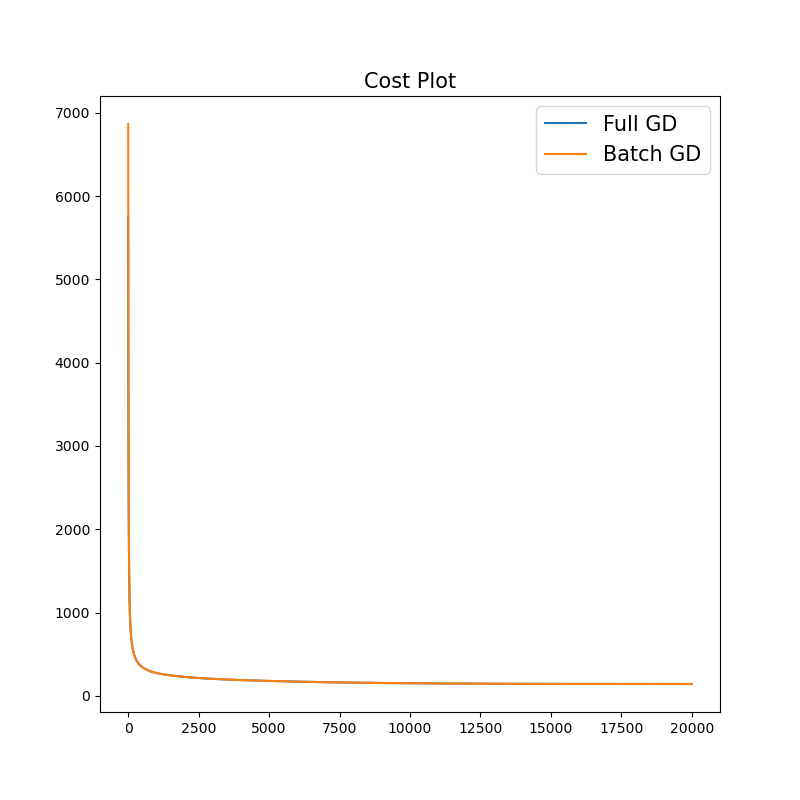

In [25]:
plt.figure(figsize=(8,8))
plt.title("Cost Plot", fontsize=15)
plt.plot(ctest_full, label="Full GD")
plt.plot(ctest_batch, label="Batch GD")
plt.legend(fontsize=15)
plt.show()

Batch Gradient Descent Takes Longer time compared to Full Gradient Descent<br>
However it eventually reach the same results as Full Gradient Descent